In [68]:
import numpy as np
import pandas as pd
import matplotlib
import matplotlib.pyplot as plt
import statsmodels.api as sm
from statsmodels.api import OLS
from sklearn.decomposition import PCA
from sklearn.linear_model import LogisticRegression
from sklearn.linear_model import LogisticRegressionCV
from sklearn.utils import resample
from sklearn.model_selection import cross_val_score
from sklearn.metrics import accuracy_score
from sklearn.metrics import r2_score
from IPython.display import display
from sklearn.metrics import confusion_matrix
import itertools
%matplotlib inline

In [69]:
#Import databases
df_athenaprocopiou = pd.read_csv(r'C:\Users\karan\Desktop\Dropbox\Untitled Folder\Datasets\athenaprocopiou\followers data\athenaprocopiou_followers_list.csv')
df_daftcollectionofficial = pd.read_csv(r'C:\Users\karan\Desktop\Dropbox\Untitled Folder\Datasets\daftcollectionofficial\followers data\daftcollectionofficial_followers_list.csv')
df_dodobaror = pd.read_csv(r'C:\Users\karan\Desktop\Dropbox\Untitled Folder\Datasets\dodobaror\followers data\dodobaror_followers_list.csv')
df_le_sirenuse = pd.read_csv(r'C:\Users\karan\Desktop\Dropbox\Untitled Folder\Datasets\emporiosirenuse\followers data\emporiosirenuse_followers_list.csv')
df_heidikleinswim = pd.read_csv(r'C:\Users\karan\Desktop\Dropbox\Untitled Folder\Datasets\heidikleinswim\followers data\heidikleinswim_followers_list.csv')
df_lisamariefernandez = pd.read_csv(r'C:\Users\karan\Desktop\Dropbox\Untitled Folder\Datasets\lisamariefernandez\followers data\lisamariefernandez_followers_list.csv')
df_loupcharmant = pd.read_csv(r'C:\Users\karan\Desktop\Dropbox\Untitled Folder\Datasets\loupcharmant\followers data\loupcharmant_followers_list.csv')
df_miguelinagambaccini = pd.read_csv(r'C:\Users\karan\Desktop\Dropbox\Untitled Folder\Datasets\miguelinagambaccini\followers data\miguelinagambaccini_followers_list.csv')
df_muzungusisters = pd.read_csv(r'C:\Users\karan\Desktop\Dropbox\Untitled Folder\Datasets\muzungusisters\followers data\muzungusisters_followers_list.csv')
df_zeusndione = pd.read_csv(r'C:\Users\karan\Desktop\Dropbox\Untitled Folder\Datasets\zeusndione\followers data\zeusndione_followers_list.csv')
df_zimmermann = pd.read_csv(r'C:\Users\karan\Desktop\Dropbox\Untitled Folder\Datasets\zimmermann\followers data\zimmermann_followers_list.csv')

In [70]:
#Create Dar=taframe list to access all
df_list = [df_athenaprocopiou, df_daftcollectionofficial, df_dodobaror, df_le_sirenuse, df_heidikleinswim, df_lisamariefernandez, 
          df_loupcharmant, df_miguelinagambaccini, df_muzungusisters, df_zeusndione, df_zimmermann]

In [130]:
#Helper Function
def plot_confusion_matrix(cm, classes, normalize=False, title='Specified Model', cmap=plt.cm.Blues):
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('\nConfusion Matrix for',title)
    fig = plt.figure(figsize=(14,14))
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)
    fmt = '.2f'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")
    plt.tight_layout()
    fig.savefig('confusion.svg')


Confusion Matrix for Brand Follower Overlap


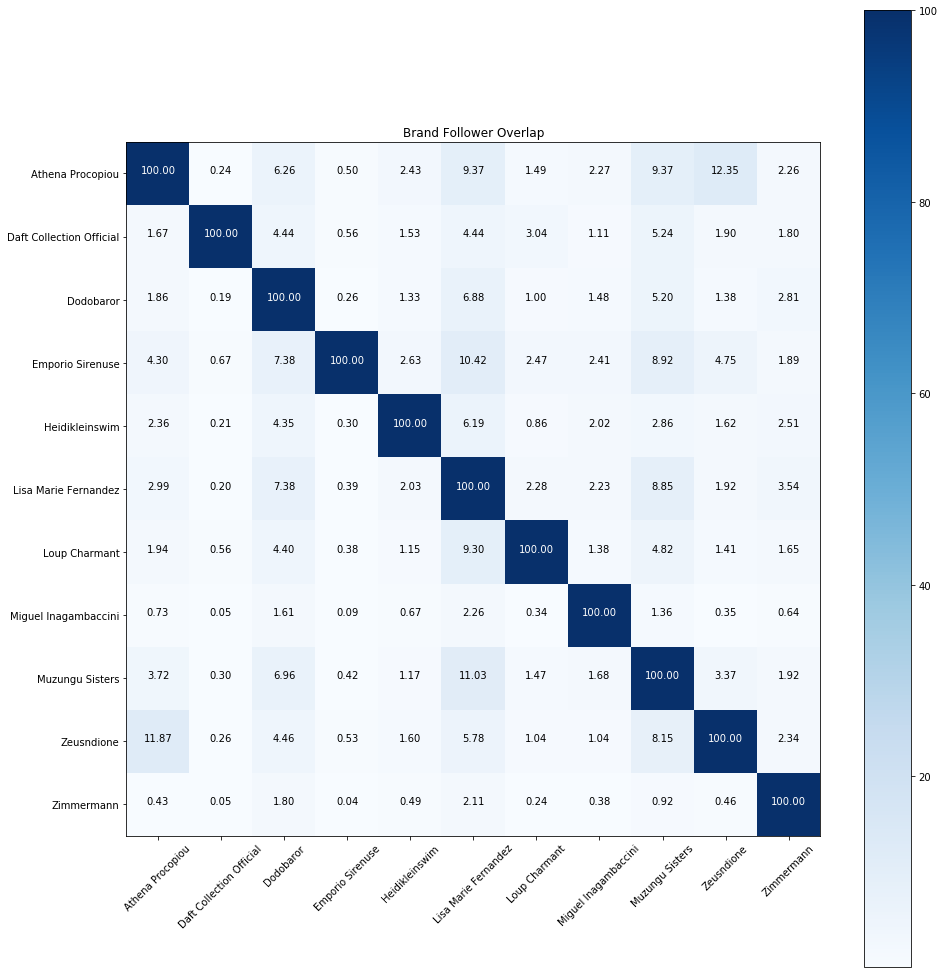

In [131]:
#Measure Correlation
correlation_matrix = np.zeros([len(df_list), len(df_list)]) 
for ind_i, i in enumerate(df_list):
    for ind_j, j in enumerate(df_list) :
        correlation_matrix[ind_i,ind_j] = len(np.intersect1d(i['id_user'],j['id_user']))

#Normal
for i in range(len(correlation_matrix)):
    factor = correlation_matrix[i,i] 
    correlation_matrix[i,:] = correlation_matrix[i,:]*100/factor      
    
#Plot Confusion Matrix
classes = ["Athena Procopiou","Daft Collection Official","Dodobaror","Emporio Sirenuse","Heidikleinswim","Lisa Marie Fernandez",
           "Loup Charmant","Miguel Inagambaccini","Muzungu Sisters","Zeusndione","Zimmermann"]
plot_confusion_matrix(correlation_matrix,classes, title="Brand Follower Overlap")

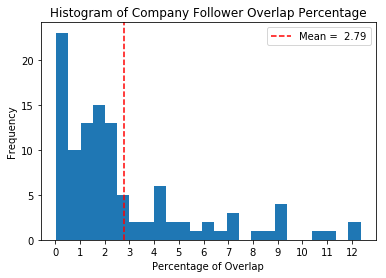

In [134]:
#Histogram of Overlap Percentage
hist_correlation = []
for i in correlation_matrix:
    for j in i:
        if j!=100:
            hist_correlation.append(j)

fig = plt.figure()
plt.hist(hist_correlation, bins=25)
plt.xticks(np.arange(0,13,1))
plt.axvline(x=np.mean(hist_correlation), color='red', linestyle='--', label='Mean =  %0.2f' % np.mean(hist_correlation))
plt.xlabel('Percentage of Overlap')
plt.legend(loc="upper right")
plt.ylabel('Frequency')
plt.title('Histogram of Company Follower Overlap Percentage')
plt.show()
fig.savefig('Overlap_histogram.svg')

In [128]:
#Histogram of Number of Companies followed by Users
all_users = []
for i in df_list:
    for j in i['id_user']:
        all_users.append(j)
        
#Get unique users
unique_users = set(all_users)

#Get occurence of user in each user database
occurence = []
for ind, i in enumerate(unique_users):
    print(ind,"/",len(unique_users), "Completed.")
    count = 0
    for j in df_list:
        if i in j['id_user'].values:
            count += 1
    occurence.append(count)

0 / 524944 Completed.
1 / 524944 Completed.
2 / 524944 Completed.
3 / 524944 Completed.
4 / 524944 Completed.
5 / 524944 Completed.
6 / 524944 Completed.
7 / 524944 Completed.
8 / 524944 Completed.
9 / 524944 Completed.
10 / 524944 Completed.
11 / 524944 Completed.
12 / 524944 Completed.
13 / 524944 Completed.
14 / 524944 Completed.
15 / 524944 Completed.
16 / 524944 Completed.
17 / 524944 Completed.
18 / 524944 Completed.
19 / 524944 Completed.
20 / 524944 Completed.
21 / 524944 Completed.
22 / 524944 Completed.
23 / 524944 Completed.
24 / 524944 Completed.
25 / 524944 Completed.
26 / 524944 Completed.
27 / 524944 Completed.
28 / 524944 Completed.
29 / 524944 Completed.
30 / 524944 Completed.
31 / 524944 Completed.
32 / 524944 Completed.
33 / 524944 Completed.
34 / 524944 Completed.
35 / 524944 Completed.
36 / 524944 Completed.
37 / 524944 Completed.
38 / 524944 Completed.
39 / 524944 Completed.
40 / 524944 Completed.
41 / 524944 Completed.
42 / 524944 Completed.
43 / 524944 Completed

368 / 524944 Completed.
369 / 524944 Completed.
370 / 524944 Completed.
371 / 524944 Completed.
372 / 524944 Completed.
373 / 524944 Completed.
374 / 524944 Completed.
375 / 524944 Completed.
376 / 524944 Completed.
377 / 524944 Completed.
378 / 524944 Completed.
379 / 524944 Completed.
380 / 524944 Completed.
381 / 524944 Completed.
382 / 524944 Completed.
383 / 524944 Completed.
384 / 524944 Completed.
385 / 524944 Completed.
386 / 524944 Completed.
387 / 524944 Completed.
388 / 524944 Completed.
389 / 524944 Completed.
390 / 524944 Completed.
391 / 524944 Completed.
392 / 524944 Completed.
393 / 524944 Completed.
394 / 524944 Completed.
395 / 524944 Completed.
396 / 524944 Completed.
397 / 524944 Completed.
398 / 524944 Completed.
399 / 524944 Completed.
400 / 524944 Completed.
401 / 524944 Completed.
402 / 524944 Completed.
403 / 524944 Completed.
404 / 524944 Completed.
405 / 524944 Completed.
406 / 524944 Completed.
407 / 524944 Completed.
408 / 524944 Completed.
409 / 524944 Com

723 / 524944 Completed.
724 / 524944 Completed.
725 / 524944 Completed.
726 / 524944 Completed.
727 / 524944 Completed.
728 / 524944 Completed.
729 / 524944 Completed.
730 / 524944 Completed.
731 / 524944 Completed.
732 / 524944 Completed.
733 / 524944 Completed.
734 / 524944 Completed.
735 / 524944 Completed.
736 / 524944 Completed.
737 / 524944 Completed.
738 / 524944 Completed.
739 / 524944 Completed.
740 / 524944 Completed.
741 / 524944 Completed.
742 / 524944 Completed.
743 / 524944 Completed.
744 / 524944 Completed.
745 / 524944 Completed.
746 / 524944 Completed.
747 / 524944 Completed.
748 / 524944 Completed.
749 / 524944 Completed.
750 / 524944 Completed.
751 / 524944 Completed.
752 / 524944 Completed.
753 / 524944 Completed.
754 / 524944 Completed.
755 / 524944 Completed.
756 / 524944 Completed.
757 / 524944 Completed.
758 / 524944 Completed.
759 / 524944 Completed.
760 / 524944 Completed.
761 / 524944 Completed.
762 / 524944 Completed.
763 / 524944 Completed.
764 / 524944 Com

1153 / 524944 Completed.
1154 / 524944 Completed.
1155 / 524944 Completed.
1156 / 524944 Completed.
1157 / 524944 Completed.
1158 / 524944 Completed.
1159 / 524944 Completed.
1160 / 524944 Completed.
1161 / 524944 Completed.
1162 / 524944 Completed.
1163 / 524944 Completed.
1164 / 524944 Completed.
1165 / 524944 Completed.
1166 / 524944 Completed.
1167 / 524944 Completed.
1168 / 524944 Completed.
1169 / 524944 Completed.
1170 / 524944 Completed.
1171 / 524944 Completed.
1172 / 524944 Completed.
1173 / 524944 Completed.
1174 / 524944 Completed.
1175 / 524944 Completed.
1176 / 524944 Completed.
1177 / 524944 Completed.
1178 / 524944 Completed.
1179 / 524944 Completed.
1180 / 524944 Completed.
1181 / 524944 Completed.
1182 / 524944 Completed.
1183 / 524944 Completed.
1184 / 524944 Completed.
1185 / 524944 Completed.
1186 / 524944 Completed.
1187 / 524944 Completed.
1188 / 524944 Completed.
1189 / 524944 Completed.
1190 / 524944 Completed.
1191 / 524944 Completed.
1192 / 524944 Completed.


1540 / 524944 Completed.
1541 / 524944 Completed.
1542 / 524944 Completed.
1543 / 524944 Completed.
1544 / 524944 Completed.
1545 / 524944 Completed.
1546 / 524944 Completed.
1547 / 524944 Completed.
1548 / 524944 Completed.
1549 / 524944 Completed.
1550 / 524944 Completed.
1551 / 524944 Completed.
1552 / 524944 Completed.
1553 / 524944 Completed.
1554 / 524944 Completed.
1555 / 524944 Completed.
1556 / 524944 Completed.
1557 / 524944 Completed.
1558 / 524944 Completed.
1559 / 524944 Completed.
1560 / 524944 Completed.
1561 / 524944 Completed.
1562 / 524944 Completed.
1563 / 524944 Completed.
1564 / 524944 Completed.
1565 / 524944 Completed.
1566 / 524944 Completed.
1567 / 524944 Completed.
1568 / 524944 Completed.
1569 / 524944 Completed.
1570 / 524944 Completed.
1571 / 524944 Completed.
1572 / 524944 Completed.
1573 / 524944 Completed.
1574 / 524944 Completed.
1575 / 524944 Completed.
1576 / 524944 Completed.
1577 / 524944 Completed.
1578 / 524944 Completed.
1579 / 524944 Completed.


1941 / 524944 Completed.
1942 / 524944 Completed.
1943 / 524944 Completed.
1944 / 524944 Completed.
1945 / 524944 Completed.
1946 / 524944 Completed.
1947 / 524944 Completed.
1948 / 524944 Completed.
1949 / 524944 Completed.
1950 / 524944 Completed.
1951 / 524944 Completed.
1952 / 524944 Completed.
1953 / 524944 Completed.
1954 / 524944 Completed.
1955 / 524944 Completed.
1956 / 524944 Completed.
1957 / 524944 Completed.
1958 / 524944 Completed.
1959 / 524944 Completed.
1960 / 524944 Completed.
1961 / 524944 Completed.
1962 / 524944 Completed.
1963 / 524944 Completed.
1964 / 524944 Completed.
1965 / 524944 Completed.
1966 / 524944 Completed.
1967 / 524944 Completed.
1968 / 524944 Completed.
1969 / 524944 Completed.
1970 / 524944 Completed.
1971 / 524944 Completed.
1972 / 524944 Completed.
1973 / 524944 Completed.
1974 / 524944 Completed.
1975 / 524944 Completed.
1976 / 524944 Completed.
1977 / 524944 Completed.
1978 / 524944 Completed.
1979 / 524944 Completed.
1980 / 524944 Completed.


2325 / 524944 Completed.
2326 / 524944 Completed.
2327 / 524944 Completed.
2328 / 524944 Completed.
2329 / 524944 Completed.
2330 / 524944 Completed.
2331 / 524944 Completed.
2332 / 524944 Completed.
2333 / 524944 Completed.
2334 / 524944 Completed.
2335 / 524944 Completed.
2336 / 524944 Completed.
2337 / 524944 Completed.
2338 / 524944 Completed.
2339 / 524944 Completed.
2340 / 524944 Completed.
2341 / 524944 Completed.
2342 / 524944 Completed.
2343 / 524944 Completed.
2344 / 524944 Completed.
2345 / 524944 Completed.
2346 / 524944 Completed.
2347 / 524944 Completed.
2348 / 524944 Completed.
2349 / 524944 Completed.
2350 / 524944 Completed.
2351 / 524944 Completed.
2352 / 524944 Completed.
2353 / 524944 Completed.
2354 / 524944 Completed.
2355 / 524944 Completed.
2356 / 524944 Completed.
2357 / 524944 Completed.
2358 / 524944 Completed.
2359 / 524944 Completed.
2360 / 524944 Completed.
2361 / 524944 Completed.
2362 / 524944 Completed.
2363 / 524944 Completed.
2364 / 524944 Completed.


2681 / 524944 Completed.
2682 / 524944 Completed.
2683 / 524944 Completed.
2684 / 524944 Completed.
2685 / 524944 Completed.
2686 / 524944 Completed.
2687 / 524944 Completed.
2688 / 524944 Completed.
2689 / 524944 Completed.
2690 / 524944 Completed.
2691 / 524944 Completed.
2692 / 524944 Completed.
2693 / 524944 Completed.
2694 / 524944 Completed.
2695 / 524944 Completed.
2696 / 524944 Completed.
2697 / 524944 Completed.
2698 / 524944 Completed.
2699 / 524944 Completed.
2700 / 524944 Completed.
2701 / 524944 Completed.
2702 / 524944 Completed.
2703 / 524944 Completed.
2704 / 524944 Completed.
2705 / 524944 Completed.
2706 / 524944 Completed.
2707 / 524944 Completed.
2708 / 524944 Completed.
2709 / 524944 Completed.
2710 / 524944 Completed.
2711 / 524944 Completed.
2712 / 524944 Completed.
2713 / 524944 Completed.
2714 / 524944 Completed.
2715 / 524944 Completed.
2716 / 524944 Completed.
2717 / 524944 Completed.
2718 / 524944 Completed.
2719 / 524944 Completed.
2720 / 524944 Completed.


3010 / 524944 Completed.
3011 / 524944 Completed.
3012 / 524944 Completed.
3013 / 524944 Completed.
3014 / 524944 Completed.
3015 / 524944 Completed.
3016 / 524944 Completed.
3017 / 524944 Completed.
3018 / 524944 Completed.
3019 / 524944 Completed.
3020 / 524944 Completed.
3021 / 524944 Completed.
3022 / 524944 Completed.
3023 / 524944 Completed.
3024 / 524944 Completed.
3025 / 524944 Completed.
3026 / 524944 Completed.
3027 / 524944 Completed.
3028 / 524944 Completed.
3029 / 524944 Completed.
3030 / 524944 Completed.
3031 / 524944 Completed.
3032 / 524944 Completed.
3033 / 524944 Completed.
3034 / 524944 Completed.
3035 / 524944 Completed.
3036 / 524944 Completed.
3037 / 524944 Completed.
3038 / 524944 Completed.
3039 / 524944 Completed.
3040 / 524944 Completed.
3041 / 524944 Completed.
3042 / 524944 Completed.
3043 / 524944 Completed.
3044 / 524944 Completed.
3045 / 524944 Completed.
3046 / 524944 Completed.
3047 / 524944 Completed.
3048 / 524944 Completed.
3049 / 524944 Completed.


3380 / 524944 Completed.
3381 / 524944 Completed.
3382 / 524944 Completed.
3383 / 524944 Completed.
3384 / 524944 Completed.
3385 / 524944 Completed.
3386 / 524944 Completed.
3387 / 524944 Completed.
3388 / 524944 Completed.
3389 / 524944 Completed.
3390 / 524944 Completed.
3391 / 524944 Completed.
3392 / 524944 Completed.
3393 / 524944 Completed.
3394 / 524944 Completed.
3395 / 524944 Completed.
3396 / 524944 Completed.
3397 / 524944 Completed.
3398 / 524944 Completed.
3399 / 524944 Completed.
3400 / 524944 Completed.
3401 / 524944 Completed.
3402 / 524944 Completed.
3403 / 524944 Completed.
3404 / 524944 Completed.
3405 / 524944 Completed.
3406 / 524944 Completed.
3407 / 524944 Completed.
3408 / 524944 Completed.
3409 / 524944 Completed.
3410 / 524944 Completed.
3411 / 524944 Completed.
3412 / 524944 Completed.
3413 / 524944 Completed.
3414 / 524944 Completed.
3415 / 524944 Completed.
3416 / 524944 Completed.
3417 / 524944 Completed.
3418 / 524944 Completed.
3419 / 524944 Completed.


3749 / 524944 Completed.
3750 / 524944 Completed.
3751 / 524944 Completed.
3752 / 524944 Completed.
3753 / 524944 Completed.
3754 / 524944 Completed.
3755 / 524944 Completed.
3756 / 524944 Completed.
3757 / 524944 Completed.
3758 / 524944 Completed.
3759 / 524944 Completed.
3760 / 524944 Completed.
3761 / 524944 Completed.
3762 / 524944 Completed.
3763 / 524944 Completed.
3764 / 524944 Completed.
3765 / 524944 Completed.
3766 / 524944 Completed.
3767 / 524944 Completed.
3768 / 524944 Completed.
3769 / 524944 Completed.
3770 / 524944 Completed.
3771 / 524944 Completed.
3772 / 524944 Completed.
3773 / 524944 Completed.
3774 / 524944 Completed.
3775 / 524944 Completed.
3776 / 524944 Completed.
3777 / 524944 Completed.
3778 / 524944 Completed.
3779 / 524944 Completed.
3780 / 524944 Completed.
3781 / 524944 Completed.
3782 / 524944 Completed.
3783 / 524944 Completed.
3784 / 524944 Completed.
3785 / 524944 Completed.
3786 / 524944 Completed.
3787 / 524944 Completed.
3788 / 524944 Completed.


4087 / 524944 Completed.
4088 / 524944 Completed.
4089 / 524944 Completed.
4090 / 524944 Completed.
4091 / 524944 Completed.
4092 / 524944 Completed.
4093 / 524944 Completed.
4094 / 524944 Completed.
4095 / 524944 Completed.
4096 / 524944 Completed.
4097 / 524944 Completed.
4098 / 524944 Completed.
4099 / 524944 Completed.
4100 / 524944 Completed.
4101 / 524944 Completed.
4102 / 524944 Completed.
4103 / 524944 Completed.
4104 / 524944 Completed.
4105 / 524944 Completed.
4106 / 524944 Completed.
4107 / 524944 Completed.
4108 / 524944 Completed.
4109 / 524944 Completed.
4110 / 524944 Completed.
4111 / 524944 Completed.
4112 / 524944 Completed.
4113 / 524944 Completed.
4114 / 524944 Completed.
4115 / 524944 Completed.
4116 / 524944 Completed.
4117 / 524944 Completed.
4118 / 524944 Completed.
4119 / 524944 Completed.
4120 / 524944 Completed.
4121 / 524944 Completed.
4122 / 524944 Completed.
4123 / 524944 Completed.
4124 / 524944 Completed.
4125 / 524944 Completed.
4126 / 524944 Completed.


4450 / 524944 Completed.
4451 / 524944 Completed.
4452 / 524944 Completed.
4453 / 524944 Completed.
4454 / 524944 Completed.
4455 / 524944 Completed.
4456 / 524944 Completed.
4457 / 524944 Completed.
4458 / 524944 Completed.
4459 / 524944 Completed.
4460 / 524944 Completed.
4461 / 524944 Completed.
4462 / 524944 Completed.
4463 / 524944 Completed.
4464 / 524944 Completed.
4465 / 524944 Completed.
4466 / 524944 Completed.
4467 / 524944 Completed.
4468 / 524944 Completed.
4469 / 524944 Completed.
4470 / 524944 Completed.
4471 / 524944 Completed.
4472 / 524944 Completed.
4473 / 524944 Completed.
4474 / 524944 Completed.
4475 / 524944 Completed.
4476 / 524944 Completed.
4477 / 524944 Completed.
4478 / 524944 Completed.
4479 / 524944 Completed.
4480 / 524944 Completed.
4481 / 524944 Completed.
4482 / 524944 Completed.
4483 / 524944 Completed.
4484 / 524944 Completed.
4485 / 524944 Completed.
4486 / 524944 Completed.
4487 / 524944 Completed.
4488 / 524944 Completed.
4489 / 524944 Completed.


4818 / 524944 Completed.
4819 / 524944 Completed.
4820 / 524944 Completed.
4821 / 524944 Completed.
4822 / 524944 Completed.
4823 / 524944 Completed.
4824 / 524944 Completed.
4825 / 524944 Completed.
4826 / 524944 Completed.
4827 / 524944 Completed.
4828 / 524944 Completed.
4829 / 524944 Completed.
4830 / 524944 Completed.
4831 / 524944 Completed.
4832 / 524944 Completed.
4833 / 524944 Completed.
4834 / 524944 Completed.
4835 / 524944 Completed.
4836 / 524944 Completed.
4837 / 524944 Completed.
4838 / 524944 Completed.
4839 / 524944 Completed.
4840 / 524944 Completed.
4841 / 524944 Completed.
4842 / 524944 Completed.
4843 / 524944 Completed.
4844 / 524944 Completed.
4845 / 524944 Completed.
4846 / 524944 Completed.
4847 / 524944 Completed.
4848 / 524944 Completed.
4849 / 524944 Completed.
4850 / 524944 Completed.
4851 / 524944 Completed.
4852 / 524944 Completed.
4853 / 524944 Completed.
4854 / 524944 Completed.
4855 / 524944 Completed.
4856 / 524944 Completed.
4857 / 524944 Completed.


5185 / 524944 Completed.
5186 / 524944 Completed.
5187 / 524944 Completed.
5188 / 524944 Completed.
5189 / 524944 Completed.
5190 / 524944 Completed.
5191 / 524944 Completed.
5192 / 524944 Completed.
5193 / 524944 Completed.
5194 / 524944 Completed.
5195 / 524944 Completed.
5196 / 524944 Completed.
5197 / 524944 Completed.
5198 / 524944 Completed.
5199 / 524944 Completed.
5200 / 524944 Completed.
5201 / 524944 Completed.
5202 / 524944 Completed.
5203 / 524944 Completed.
5204 / 524944 Completed.
5205 / 524944 Completed.
5206 / 524944 Completed.
5207 / 524944 Completed.
5208 / 524944 Completed.
5209 / 524944 Completed.
5210 / 524944 Completed.
5211 / 524944 Completed.
5212 / 524944 Completed.
5213 / 524944 Completed.
5214 / 524944 Completed.
5215 / 524944 Completed.
5216 / 524944 Completed.
5217 / 524944 Completed.
5218 / 524944 Completed.
5219 / 524944 Completed.
5220 / 524944 Completed.
5221 / 524944 Completed.
5222 / 524944 Completed.
5223 / 524944 Completed.
5224 / 524944 Completed.


5558 / 524944 Completed.
5559 / 524944 Completed.
5560 / 524944 Completed.
5561 / 524944 Completed.
5562 / 524944 Completed.
5563 / 524944 Completed.
5564 / 524944 Completed.
5565 / 524944 Completed.
5566 / 524944 Completed.
5567 / 524944 Completed.
5568 / 524944 Completed.
5569 / 524944 Completed.
5570 / 524944 Completed.
5571 / 524944 Completed.
5572 / 524944 Completed.
5573 / 524944 Completed.
5574 / 524944 Completed.
5575 / 524944 Completed.
5576 / 524944 Completed.
5577 / 524944 Completed.
5578 / 524944 Completed.
5579 / 524944 Completed.
5580 / 524944 Completed.
5581 / 524944 Completed.
5582 / 524944 Completed.
5583 / 524944 Completed.
5584 / 524944 Completed.
5585 / 524944 Completed.
5586 / 524944 Completed.
5587 / 524944 Completed.
5588 / 524944 Completed.
5589 / 524944 Completed.
5590 / 524944 Completed.
5591 / 524944 Completed.
5592 / 524944 Completed.
5593 / 524944 Completed.
5594 / 524944 Completed.
5595 / 524944 Completed.
5596 / 524944 Completed.
5597 / 524944 Completed.


5976 / 524944 Completed.
5977 / 524944 Completed.
5978 / 524944 Completed.
5979 / 524944 Completed.
5980 / 524944 Completed.
5981 / 524944 Completed.
5982 / 524944 Completed.
5983 / 524944 Completed.
5984 / 524944 Completed.
5985 / 524944 Completed.
5986 / 524944 Completed.
5987 / 524944 Completed.
5988 / 524944 Completed.
5989 / 524944 Completed.
5990 / 524944 Completed.
5991 / 524944 Completed.
5992 / 524944 Completed.
5993 / 524944 Completed.
5994 / 524944 Completed.
5995 / 524944 Completed.
5996 / 524944 Completed.
5997 / 524944 Completed.
5998 / 524944 Completed.
5999 / 524944 Completed.
6000 / 524944 Completed.
6001 / 524944 Completed.
6002 / 524944 Completed.
6003 / 524944 Completed.
6004 / 524944 Completed.
6005 / 524944 Completed.
6006 / 524944 Completed.
6007 / 524944 Completed.
6008 / 524944 Completed.
6009 / 524944 Completed.
6010 / 524944 Completed.
6011 / 524944 Completed.
6012 / 524944 Completed.
6013 / 524944 Completed.
6014 / 524944 Completed.
6015 / 524944 Completed.


6397 / 524944 Completed.
6398 / 524944 Completed.
6399 / 524944 Completed.
6400 / 524944 Completed.
6401 / 524944 Completed.
6402 / 524944 Completed.
6403 / 524944 Completed.
6404 / 524944 Completed.
6405 / 524944 Completed.
6406 / 524944 Completed.
6407 / 524944 Completed.
6408 / 524944 Completed.
6409 / 524944 Completed.
6410 / 524944 Completed.
6411 / 524944 Completed.
6412 / 524944 Completed.
6413 / 524944 Completed.
6414 / 524944 Completed.
6415 / 524944 Completed.
6416 / 524944 Completed.
6417 / 524944 Completed.
6418 / 524944 Completed.
6419 / 524944 Completed.
6420 / 524944 Completed.
6421 / 524944 Completed.
6422 / 524944 Completed.
6423 / 524944 Completed.
6424 / 524944 Completed.
6425 / 524944 Completed.
6426 / 524944 Completed.
6427 / 524944 Completed.
6428 / 524944 Completed.
6429 / 524944 Completed.
6430 / 524944 Completed.
6431 / 524944 Completed.
6432 / 524944 Completed.
6433 / 524944 Completed.
6434 / 524944 Completed.
6435 / 524944 Completed.
6436 / 524944 Completed.


6798 / 524944 Completed.
6799 / 524944 Completed.
6800 / 524944 Completed.
6801 / 524944 Completed.
6802 / 524944 Completed.
6803 / 524944 Completed.
6804 / 524944 Completed.
6805 / 524944 Completed.
6806 / 524944 Completed.
6807 / 524944 Completed.
6808 / 524944 Completed.
6809 / 524944 Completed.
6810 / 524944 Completed.
6811 / 524944 Completed.
6812 / 524944 Completed.
6813 / 524944 Completed.
6814 / 524944 Completed.
6815 / 524944 Completed.
6816 / 524944 Completed.
6817 / 524944 Completed.
6818 / 524944 Completed.
6819 / 524944 Completed.
6820 / 524944 Completed.
6821 / 524944 Completed.
6822 / 524944 Completed.
6823 / 524944 Completed.
6824 / 524944 Completed.
6825 / 524944 Completed.
6826 / 524944 Completed.
6827 / 524944 Completed.
6828 / 524944 Completed.
6829 / 524944 Completed.
6830 / 524944 Completed.
6831 / 524944 Completed.
6832 / 524944 Completed.
6833 / 524944 Completed.
6834 / 524944 Completed.
6835 / 524944 Completed.
6836 / 524944 Completed.
6837 / 524944 Completed.


7208 / 524944 Completed.
7209 / 524944 Completed.
7210 / 524944 Completed.
7211 / 524944 Completed.
7212 / 524944 Completed.
7213 / 524944 Completed.
7214 / 524944 Completed.
7215 / 524944 Completed.
7216 / 524944 Completed.
7217 / 524944 Completed.
7218 / 524944 Completed.
7219 / 524944 Completed.
7220 / 524944 Completed.
7221 / 524944 Completed.
7222 / 524944 Completed.
7223 / 524944 Completed.
7224 / 524944 Completed.
7225 / 524944 Completed.
7226 / 524944 Completed.
7227 / 524944 Completed.
7228 / 524944 Completed.
7229 / 524944 Completed.
7230 / 524944 Completed.
7231 / 524944 Completed.
7232 / 524944 Completed.
7233 / 524944 Completed.
7234 / 524944 Completed.
7235 / 524944 Completed.
7236 / 524944 Completed.
7237 / 524944 Completed.
7238 / 524944 Completed.
7239 / 524944 Completed.
7240 / 524944 Completed.
7241 / 524944 Completed.
7242 / 524944 Completed.
7243 / 524944 Completed.
7244 / 524944 Completed.
7245 / 524944 Completed.
7246 / 524944 Completed.
7247 / 524944 Completed.


7629 / 524944 Completed.
7630 / 524944 Completed.
7631 / 524944 Completed.
7632 / 524944 Completed.
7633 / 524944 Completed.
7634 / 524944 Completed.
7635 / 524944 Completed.
7636 / 524944 Completed.
7637 / 524944 Completed.
7638 / 524944 Completed.
7639 / 524944 Completed.
7640 / 524944 Completed.
7641 / 524944 Completed.
7642 / 524944 Completed.
7643 / 524944 Completed.
7644 / 524944 Completed.
7645 / 524944 Completed.
7646 / 524944 Completed.
7647 / 524944 Completed.
7648 / 524944 Completed.
7649 / 524944 Completed.
7650 / 524944 Completed.
7651 / 524944 Completed.
7652 / 524944 Completed.
7653 / 524944 Completed.
7654 / 524944 Completed.
7655 / 524944 Completed.
7656 / 524944 Completed.
7657 / 524944 Completed.
7658 / 524944 Completed.
7659 / 524944 Completed.
7660 / 524944 Completed.
7661 / 524944 Completed.
7662 / 524944 Completed.
7663 / 524944 Completed.
7664 / 524944 Completed.
7665 / 524944 Completed.
7666 / 524944 Completed.
7667 / 524944 Completed.
7668 / 524944 Completed.


8049 / 524944 Completed.
8050 / 524944 Completed.
8051 / 524944 Completed.
8052 / 524944 Completed.
8053 / 524944 Completed.
8054 / 524944 Completed.
8055 / 524944 Completed.
8056 / 524944 Completed.
8057 / 524944 Completed.
8058 / 524944 Completed.
8059 / 524944 Completed.
8060 / 524944 Completed.
8061 / 524944 Completed.
8062 / 524944 Completed.
8063 / 524944 Completed.
8064 / 524944 Completed.
8065 / 524944 Completed.
8066 / 524944 Completed.
8067 / 524944 Completed.
8068 / 524944 Completed.
8069 / 524944 Completed.
8070 / 524944 Completed.
8071 / 524944 Completed.
8072 / 524944 Completed.
8073 / 524944 Completed.
8074 / 524944 Completed.
8075 / 524944 Completed.
8076 / 524944 Completed.
8077 / 524944 Completed.
8078 / 524944 Completed.
8079 / 524944 Completed.
8080 / 524944 Completed.
8081 / 524944 Completed.
8082 / 524944 Completed.
8083 / 524944 Completed.
8084 / 524944 Completed.
8085 / 524944 Completed.
8086 / 524944 Completed.
8087 / 524944 Completed.
8088 / 524944 Completed.


8469 / 524944 Completed.
8470 / 524944 Completed.
8471 / 524944 Completed.
8472 / 524944 Completed.
8473 / 524944 Completed.
8474 / 524944 Completed.
8475 / 524944 Completed.
8476 / 524944 Completed.
8477 / 524944 Completed.
8478 / 524944 Completed.
8479 / 524944 Completed.
8480 / 524944 Completed.
8481 / 524944 Completed.
8482 / 524944 Completed.
8483 / 524944 Completed.
8484 / 524944 Completed.
8485 / 524944 Completed.
8486 / 524944 Completed.
8487 / 524944 Completed.
8488 / 524944 Completed.
8489 / 524944 Completed.
8490 / 524944 Completed.
8491 / 524944 Completed.
8492 / 524944 Completed.
8493 / 524944 Completed.
8494 / 524944 Completed.
8495 / 524944 Completed.
8496 / 524944 Completed.
8497 / 524944 Completed.
8498 / 524944 Completed.
8499 / 524944 Completed.
8500 / 524944 Completed.
8501 / 524944 Completed.
8502 / 524944 Completed.
8503 / 524944 Completed.
8504 / 524944 Completed.
8505 / 524944 Completed.
8506 / 524944 Completed.
8507 / 524944 Completed.
8508 / 524944 Completed.


8838 / 524944 Completed.
8839 / 524944 Completed.
8840 / 524944 Completed.
8841 / 524944 Completed.
8842 / 524944 Completed.
8843 / 524944 Completed.
8844 / 524944 Completed.
8845 / 524944 Completed.
8846 / 524944 Completed.
8847 / 524944 Completed.
8848 / 524944 Completed.
8849 / 524944 Completed.
8850 / 524944 Completed.
8851 / 524944 Completed.
8852 / 524944 Completed.
8853 / 524944 Completed.
8854 / 524944 Completed.
8855 / 524944 Completed.
8856 / 524944 Completed.
8857 / 524944 Completed.
8858 / 524944 Completed.
8859 / 524944 Completed.
8860 / 524944 Completed.
8861 / 524944 Completed.
8862 / 524944 Completed.
8863 / 524944 Completed.
8864 / 524944 Completed.
8865 / 524944 Completed.
8866 / 524944 Completed.
8867 / 524944 Completed.
8868 / 524944 Completed.
8869 / 524944 Completed.
8870 / 524944 Completed.
8871 / 524944 Completed.
8872 / 524944 Completed.
8873 / 524944 Completed.
8874 / 524944 Completed.
8875 / 524944 Completed.
8876 / 524944 Completed.
8877 / 524944 Completed.


9223 / 524944 Completed.
9224 / 524944 Completed.
9225 / 524944 Completed.
9226 / 524944 Completed.
9227 / 524944 Completed.
9228 / 524944 Completed.
9229 / 524944 Completed.
9230 / 524944 Completed.
9231 / 524944 Completed.
9232 / 524944 Completed.
9233 / 524944 Completed.
9234 / 524944 Completed.
9235 / 524944 Completed.
9236 / 524944 Completed.
9237 / 524944 Completed.
9238 / 524944 Completed.
9239 / 524944 Completed.
9240 / 524944 Completed.
9241 / 524944 Completed.
9242 / 524944 Completed.
9243 / 524944 Completed.
9244 / 524944 Completed.
9245 / 524944 Completed.
9246 / 524944 Completed.
9247 / 524944 Completed.
9248 / 524944 Completed.
9249 / 524944 Completed.
9250 / 524944 Completed.
9251 / 524944 Completed.
9252 / 524944 Completed.
9253 / 524944 Completed.
9254 / 524944 Completed.
9255 / 524944 Completed.
9256 / 524944 Completed.
9257 / 524944 Completed.
9258 / 524944 Completed.
9259 / 524944 Completed.
9260 / 524944 Completed.
9261 / 524944 Completed.
9262 / 524944 Completed.


9557 / 524944 Completed.
9558 / 524944 Completed.
9559 / 524944 Completed.
9560 / 524944 Completed.
9561 / 524944 Completed.
9562 / 524944 Completed.
9563 / 524944 Completed.
9564 / 524944 Completed.
9565 / 524944 Completed.
9566 / 524944 Completed.
9567 / 524944 Completed.
9568 / 524944 Completed.
9569 / 524944 Completed.
9570 / 524944 Completed.
9571 / 524944 Completed.
9572 / 524944 Completed.
9573 / 524944 Completed.
9574 / 524944 Completed.
9575 / 524944 Completed.
9576 / 524944 Completed.
9577 / 524944 Completed.
9578 / 524944 Completed.
9579 / 524944 Completed.
9580 / 524944 Completed.
9581 / 524944 Completed.
9582 / 524944 Completed.
9583 / 524944 Completed.
9584 / 524944 Completed.
9585 / 524944 Completed.
9586 / 524944 Completed.
9587 / 524944 Completed.
9588 / 524944 Completed.
9589 / 524944 Completed.
9590 / 524944 Completed.
9591 / 524944 Completed.
9592 / 524944 Completed.
9593 / 524944 Completed.
9594 / 524944 Completed.
9595 / 524944 Completed.
9596 / 524944 Completed.


9887 / 524944 Completed.
9888 / 524944 Completed.
9889 / 524944 Completed.
9890 / 524944 Completed.
9891 / 524944 Completed.
9892 / 524944 Completed.
9893 / 524944 Completed.
9894 / 524944 Completed.
9895 / 524944 Completed.
9896 / 524944 Completed.
9897 / 524944 Completed.
9898 / 524944 Completed.
9899 / 524944 Completed.
9900 / 524944 Completed.
9901 / 524944 Completed.
9902 / 524944 Completed.
9903 / 524944 Completed.
9904 / 524944 Completed.
9905 / 524944 Completed.
9906 / 524944 Completed.
9907 / 524944 Completed.
9908 / 524944 Completed.
9909 / 524944 Completed.
9910 / 524944 Completed.
9911 / 524944 Completed.
9912 / 524944 Completed.
9913 / 524944 Completed.
9914 / 524944 Completed.
9915 / 524944 Completed.
9916 / 524944 Completed.
9917 / 524944 Completed.
9918 / 524944 Completed.
9919 / 524944 Completed.
9920 / 524944 Completed.
9921 / 524944 Completed.
9922 / 524944 Completed.
9923 / 524944 Completed.
9924 / 524944 Completed.
9925 / 524944 Completed.
9926 / 524944 Completed.


10281 / 524944 Completed.
10282 / 524944 Completed.
10283 / 524944 Completed.
10284 / 524944 Completed.
10285 / 524944 Completed.
10286 / 524944 Completed.
10287 / 524944 Completed.
10288 / 524944 Completed.
10289 / 524944 Completed.
10290 / 524944 Completed.
10291 / 524944 Completed.
10292 / 524944 Completed.
10293 / 524944 Completed.
10294 / 524944 Completed.
10295 / 524944 Completed.
10296 / 524944 Completed.
10297 / 524944 Completed.
10298 / 524944 Completed.
10299 / 524944 Completed.
10300 / 524944 Completed.
10301 / 524944 Completed.
10302 / 524944 Completed.
10303 / 524944 Completed.
10304 / 524944 Completed.
10305 / 524944 Completed.
10306 / 524944 Completed.
10307 / 524944 Completed.
10308 / 524944 Completed.
10309 / 524944 Completed.
10310 / 524944 Completed.
10311 / 524944 Completed.
10312 / 524944 Completed.
10313 / 524944 Completed.
10314 / 524944 Completed.
10315 / 524944 Completed.
10316 / 524944 Completed.
10317 / 524944 Completed.
10318 / 524944 Completed.
10319 / 5249

10671 / 524944 Completed.
10672 / 524944 Completed.
10673 / 524944 Completed.
10674 / 524944 Completed.
10675 / 524944 Completed.
10676 / 524944 Completed.
10677 / 524944 Completed.
10678 / 524944 Completed.
10679 / 524944 Completed.
10680 / 524944 Completed.
10681 / 524944 Completed.
10682 / 524944 Completed.
10683 / 524944 Completed.
10684 / 524944 Completed.
10685 / 524944 Completed.
10686 / 524944 Completed.
10687 / 524944 Completed.
10688 / 524944 Completed.
10689 / 524944 Completed.
10690 / 524944 Completed.
10691 / 524944 Completed.
10692 / 524944 Completed.
10693 / 524944 Completed.
10694 / 524944 Completed.
10695 / 524944 Completed.
10696 / 524944 Completed.
10697 / 524944 Completed.
10698 / 524944 Completed.
10699 / 524944 Completed.
10700 / 524944 Completed.
10701 / 524944 Completed.
10702 / 524944 Completed.
10703 / 524944 Completed.
10704 / 524944 Completed.
10705 / 524944 Completed.
10706 / 524944 Completed.
10707 / 524944 Completed.
10708 / 524944 Completed.
10709 / 5249

11053 / 524944 Completed.
11054 / 524944 Completed.
11055 / 524944 Completed.
11056 / 524944 Completed.
11057 / 524944 Completed.
11058 / 524944 Completed.
11059 / 524944 Completed.
11060 / 524944 Completed.
11061 / 524944 Completed.
11062 / 524944 Completed.
11063 / 524944 Completed.
11064 / 524944 Completed.
11065 / 524944 Completed.
11066 / 524944 Completed.
11067 / 524944 Completed.
11068 / 524944 Completed.
11069 / 524944 Completed.
11070 / 524944 Completed.
11071 / 524944 Completed.
11072 / 524944 Completed.
11073 / 524944 Completed.
11074 / 524944 Completed.
11075 / 524944 Completed.
11076 / 524944 Completed.
11077 / 524944 Completed.
11078 / 524944 Completed.
11079 / 524944 Completed.
11080 / 524944 Completed.
11081 / 524944 Completed.
11082 / 524944 Completed.
11083 / 524944 Completed.
11084 / 524944 Completed.
11085 / 524944 Completed.
11086 / 524944 Completed.
11087 / 524944 Completed.
11088 / 524944 Completed.
11089 / 524944 Completed.
11090 / 524944 Completed.
11091 / 5249

11451 / 524944 Completed.
11452 / 524944 Completed.
11453 / 524944 Completed.
11454 / 524944 Completed.
11455 / 524944 Completed.
11456 / 524944 Completed.
11457 / 524944 Completed.
11458 / 524944 Completed.
11459 / 524944 Completed.
11460 / 524944 Completed.
11461 / 524944 Completed.
11462 / 524944 Completed.
11463 / 524944 Completed.
11464 / 524944 Completed.
11465 / 524944 Completed.
11466 / 524944 Completed.
11467 / 524944 Completed.
11468 / 524944 Completed.
11469 / 524944 Completed.
11470 / 524944 Completed.
11471 / 524944 Completed.
11472 / 524944 Completed.
11473 / 524944 Completed.
11474 / 524944 Completed.
11475 / 524944 Completed.
11476 / 524944 Completed.
11477 / 524944 Completed.
11478 / 524944 Completed.
11479 / 524944 Completed.
11480 / 524944 Completed.
11481 / 524944 Completed.
11482 / 524944 Completed.
11483 / 524944 Completed.
11484 / 524944 Completed.
11485 / 524944 Completed.
11486 / 524944 Completed.
11487 / 524944 Completed.
11488 / 524944 Completed.
11489 / 5249

11870 / 524944 Completed.
11871 / 524944 Completed.
11872 / 524944 Completed.
11873 / 524944 Completed.
11874 / 524944 Completed.
11875 / 524944 Completed.
11876 / 524944 Completed.
11877 / 524944 Completed.
11878 / 524944 Completed.
11879 / 524944 Completed.
11880 / 524944 Completed.
11881 / 524944 Completed.
11882 / 524944 Completed.
11883 / 524944 Completed.
11884 / 524944 Completed.
11885 / 524944 Completed.
11886 / 524944 Completed.
11887 / 524944 Completed.
11888 / 524944 Completed.
11889 / 524944 Completed.
11890 / 524944 Completed.
11891 / 524944 Completed.
11892 / 524944 Completed.
11893 / 524944 Completed.
11894 / 524944 Completed.
11895 / 524944 Completed.
11896 / 524944 Completed.
11897 / 524944 Completed.
11898 / 524944 Completed.
11899 / 524944 Completed.
11900 / 524944 Completed.
11901 / 524944 Completed.
11902 / 524944 Completed.
11903 / 524944 Completed.
11904 / 524944 Completed.
11905 / 524944 Completed.
11906 / 524944 Completed.
11907 / 524944 Completed.
11908 / 5249

12269 / 524944 Completed.
12270 / 524944 Completed.
12271 / 524944 Completed.
12272 / 524944 Completed.
12273 / 524944 Completed.
12274 / 524944 Completed.
12275 / 524944 Completed.
12276 / 524944 Completed.
12277 / 524944 Completed.
12278 / 524944 Completed.
12279 / 524944 Completed.
12280 / 524944 Completed.
12281 / 524944 Completed.
12282 / 524944 Completed.
12283 / 524944 Completed.
12284 / 524944 Completed.
12285 / 524944 Completed.
12286 / 524944 Completed.
12287 / 524944 Completed.
12288 / 524944 Completed.
12289 / 524944 Completed.
12290 / 524944 Completed.
12291 / 524944 Completed.
12292 / 524944 Completed.
12293 / 524944 Completed.
12294 / 524944 Completed.
12295 / 524944 Completed.
12296 / 524944 Completed.
12297 / 524944 Completed.
12298 / 524944 Completed.
12299 / 524944 Completed.
12300 / 524944 Completed.
12301 / 524944 Completed.
12302 / 524944 Completed.
12303 / 524944 Completed.
12304 / 524944 Completed.
12305 / 524944 Completed.
12306 / 524944 Completed.
12307 / 5249

12602 / 524944 Completed.
12603 / 524944 Completed.
12604 / 524944 Completed.
12605 / 524944 Completed.
12606 / 524944 Completed.
12607 / 524944 Completed.
12608 / 524944 Completed.
12609 / 524944 Completed.
12610 / 524944 Completed.
12611 / 524944 Completed.
12612 / 524944 Completed.
12613 / 524944 Completed.
12614 / 524944 Completed.
12615 / 524944 Completed.
12616 / 524944 Completed.
12617 / 524944 Completed.
12618 / 524944 Completed.
12619 / 524944 Completed.
12620 / 524944 Completed.
12621 / 524944 Completed.
12622 / 524944 Completed.
12623 / 524944 Completed.
12624 / 524944 Completed.
12625 / 524944 Completed.
12626 / 524944 Completed.
12627 / 524944 Completed.
12628 / 524944 Completed.
12629 / 524944 Completed.
12630 / 524944 Completed.
12631 / 524944 Completed.
12632 / 524944 Completed.
12633 / 524944 Completed.
12634 / 524944 Completed.
12635 / 524944 Completed.
12636 / 524944 Completed.
12637 / 524944 Completed.
12638 / 524944 Completed.
12639 / 524944 Completed.
12640 / 5249

12967 / 524944 Completed.
12968 / 524944 Completed.
12969 / 524944 Completed.
12970 / 524944 Completed.
12971 / 524944 Completed.
12972 / 524944 Completed.
12973 / 524944 Completed.
12974 / 524944 Completed.
12975 / 524944 Completed.
12976 / 524944 Completed.
12977 / 524944 Completed.
12978 / 524944 Completed.
12979 / 524944 Completed.
12980 / 524944 Completed.
12981 / 524944 Completed.
12982 / 524944 Completed.
12983 / 524944 Completed.
12984 / 524944 Completed.
12985 / 524944 Completed.
12986 / 524944 Completed.
12987 / 524944 Completed.
12988 / 524944 Completed.
12989 / 524944 Completed.
12990 / 524944 Completed.
12991 / 524944 Completed.
12992 / 524944 Completed.
12993 / 524944 Completed.
12994 / 524944 Completed.
12995 / 524944 Completed.
12996 / 524944 Completed.
12997 / 524944 Completed.
12998 / 524944 Completed.
12999 / 524944 Completed.
13000 / 524944 Completed.
13001 / 524944 Completed.
13002 / 524944 Completed.
13003 / 524944 Completed.
13004 / 524944 Completed.
13005 / 5249

13352 / 524944 Completed.
13353 / 524944 Completed.
13354 / 524944 Completed.
13355 / 524944 Completed.
13356 / 524944 Completed.
13357 / 524944 Completed.
13358 / 524944 Completed.
13359 / 524944 Completed.
13360 / 524944 Completed.
13361 / 524944 Completed.
13362 / 524944 Completed.
13363 / 524944 Completed.
13364 / 524944 Completed.
13365 / 524944 Completed.
13366 / 524944 Completed.
13367 / 524944 Completed.
13368 / 524944 Completed.
13369 / 524944 Completed.
13370 / 524944 Completed.
13371 / 524944 Completed.
13372 / 524944 Completed.
13373 / 524944 Completed.
13374 / 524944 Completed.
13375 / 524944 Completed.
13376 / 524944 Completed.
13377 / 524944 Completed.
13378 / 524944 Completed.
13379 / 524944 Completed.
13380 / 524944 Completed.
13381 / 524944 Completed.
13382 / 524944 Completed.
13383 / 524944 Completed.
13384 / 524944 Completed.
13385 / 524944 Completed.
13386 / 524944 Completed.
13387 / 524944 Completed.
13388 / 524944 Completed.
13389 / 524944 Completed.
13390 / 5249

13722 / 524944 Completed.
13723 / 524944 Completed.
13724 / 524944 Completed.
13725 / 524944 Completed.
13726 / 524944 Completed.
13727 / 524944 Completed.
13728 / 524944 Completed.
13729 / 524944 Completed.
13730 / 524944 Completed.
13731 / 524944 Completed.
13732 / 524944 Completed.
13733 / 524944 Completed.
13734 / 524944 Completed.
13735 / 524944 Completed.
13736 / 524944 Completed.
13737 / 524944 Completed.
13738 / 524944 Completed.
13739 / 524944 Completed.
13740 / 524944 Completed.
13741 / 524944 Completed.
13742 / 524944 Completed.
13743 / 524944 Completed.
13744 / 524944 Completed.
13745 / 524944 Completed.
13746 / 524944 Completed.
13747 / 524944 Completed.
13748 / 524944 Completed.
13749 / 524944 Completed.
13750 / 524944 Completed.
13751 / 524944 Completed.
13752 / 524944 Completed.
13753 / 524944 Completed.
13754 / 524944 Completed.
13755 / 524944 Completed.
13756 / 524944 Completed.
13757 / 524944 Completed.
13758 / 524944 Completed.
13759 / 524944 Completed.
13760 / 5249

14119 / 524944 Completed.
14120 / 524944 Completed.
14121 / 524944 Completed.
14122 / 524944 Completed.
14123 / 524944 Completed.
14124 / 524944 Completed.
14125 / 524944 Completed.
14126 / 524944 Completed.
14127 / 524944 Completed.
14128 / 524944 Completed.
14129 / 524944 Completed.
14130 / 524944 Completed.
14131 / 524944 Completed.
14132 / 524944 Completed.
14133 / 524944 Completed.
14134 / 524944 Completed.
14135 / 524944 Completed.
14136 / 524944 Completed.
14137 / 524944 Completed.
14138 / 524944 Completed.
14139 / 524944 Completed.
14140 / 524944 Completed.
14141 / 524944 Completed.
14142 / 524944 Completed.
14143 / 524944 Completed.
14144 / 524944 Completed.
14145 / 524944 Completed.
14146 / 524944 Completed.
14147 / 524944 Completed.
14148 / 524944 Completed.
14149 / 524944 Completed.
14150 / 524944 Completed.
14151 / 524944 Completed.
14152 / 524944 Completed.
14153 / 524944 Completed.
14154 / 524944 Completed.
14155 / 524944 Completed.
14156 / 524944 Completed.
14157 / 5249

14526 / 524944 Completed.
14527 / 524944 Completed.
14528 / 524944 Completed.
14529 / 524944 Completed.
14530 / 524944 Completed.
14531 / 524944 Completed.
14532 / 524944 Completed.
14533 / 524944 Completed.
14534 / 524944 Completed.
14535 / 524944 Completed.
14536 / 524944 Completed.
14537 / 524944 Completed.
14538 / 524944 Completed.
14539 / 524944 Completed.
14540 / 524944 Completed.
14541 / 524944 Completed.
14542 / 524944 Completed.
14543 / 524944 Completed.
14544 / 524944 Completed.
14545 / 524944 Completed.
14546 / 524944 Completed.
14547 / 524944 Completed.
14548 / 524944 Completed.
14549 / 524944 Completed.
14550 / 524944 Completed.
14551 / 524944 Completed.
14552 / 524944 Completed.
14553 / 524944 Completed.
14554 / 524944 Completed.
14555 / 524944 Completed.
14556 / 524944 Completed.
14557 / 524944 Completed.
14558 / 524944 Completed.
14559 / 524944 Completed.
14560 / 524944 Completed.
14561 / 524944 Completed.
14562 / 524944 Completed.
14563 / 524944 Completed.
14564 / 5249

14939 / 524944 Completed.
14940 / 524944 Completed.
14941 / 524944 Completed.
14942 / 524944 Completed.
14943 / 524944 Completed.
14944 / 524944 Completed.
14945 / 524944 Completed.
14946 / 524944 Completed.
14947 / 524944 Completed.
14948 / 524944 Completed.
14949 / 524944 Completed.
14950 / 524944 Completed.
14951 / 524944 Completed.
14952 / 524944 Completed.
14953 / 524944 Completed.
14954 / 524944 Completed.
14955 / 524944 Completed.
14956 / 524944 Completed.
14957 / 524944 Completed.
14958 / 524944 Completed.
14959 / 524944 Completed.
14960 / 524944 Completed.
14961 / 524944 Completed.
14962 / 524944 Completed.
14963 / 524944 Completed.
14964 / 524944 Completed.
14965 / 524944 Completed.
14966 / 524944 Completed.
14967 / 524944 Completed.
14968 / 524944 Completed.
14969 / 524944 Completed.
14970 / 524944 Completed.
14971 / 524944 Completed.
14972 / 524944 Completed.
14973 / 524944 Completed.
14974 / 524944 Completed.
14975 / 524944 Completed.
14976 / 524944 Completed.
14977 / 5249

15351 / 524944 Completed.
15352 / 524944 Completed.
15353 / 524944 Completed.
15354 / 524944 Completed.
15355 / 524944 Completed.
15356 / 524944 Completed.
15357 / 524944 Completed.
15358 / 524944 Completed.
15359 / 524944 Completed.
15360 / 524944 Completed.
15361 / 524944 Completed.
15362 / 524944 Completed.
15363 / 524944 Completed.
15364 / 524944 Completed.
15365 / 524944 Completed.
15366 / 524944 Completed.
15367 / 524944 Completed.
15368 / 524944 Completed.
15369 / 524944 Completed.
15370 / 524944 Completed.
15371 / 524944 Completed.
15372 / 524944 Completed.
15373 / 524944 Completed.
15374 / 524944 Completed.
15375 / 524944 Completed.
15376 / 524944 Completed.
15377 / 524944 Completed.
15378 / 524944 Completed.
15379 / 524944 Completed.
15380 / 524944 Completed.
15381 / 524944 Completed.
15382 / 524944 Completed.
15383 / 524944 Completed.
15384 / 524944 Completed.
15385 / 524944 Completed.
15386 / 524944 Completed.
15387 / 524944 Completed.
15388 / 524944 Completed.
15389 / 5249

15755 / 524944 Completed.
15756 / 524944 Completed.
15757 / 524944 Completed.
15758 / 524944 Completed.
15759 / 524944 Completed.
15760 / 524944 Completed.
15761 / 524944 Completed.
15762 / 524944 Completed.
15763 / 524944 Completed.
15764 / 524944 Completed.
15765 / 524944 Completed.
15766 / 524944 Completed.
15767 / 524944 Completed.
15768 / 524944 Completed.
15769 / 524944 Completed.
15770 / 524944 Completed.
15771 / 524944 Completed.
15772 / 524944 Completed.
15773 / 524944 Completed.
15774 / 524944 Completed.
15775 / 524944 Completed.
15776 / 524944 Completed.
15777 / 524944 Completed.
15778 / 524944 Completed.
15779 / 524944 Completed.
15780 / 524944 Completed.
15781 / 524944 Completed.
15782 / 524944 Completed.
15783 / 524944 Completed.
15784 / 524944 Completed.
15785 / 524944 Completed.
15786 / 524944 Completed.
15787 / 524944 Completed.
15788 / 524944 Completed.
15789 / 524944 Completed.
15790 / 524944 Completed.
15791 / 524944 Completed.
15792 / 524944 Completed.
15793 / 5249

16138 / 524944 Completed.
16139 / 524944 Completed.
16140 / 524944 Completed.
16141 / 524944 Completed.
16142 / 524944 Completed.
16143 / 524944 Completed.
16144 / 524944 Completed.
16145 / 524944 Completed.
16146 / 524944 Completed.
16147 / 524944 Completed.
16148 / 524944 Completed.
16149 / 524944 Completed.
16150 / 524944 Completed.
16151 / 524944 Completed.
16152 / 524944 Completed.
16153 / 524944 Completed.
16154 / 524944 Completed.
16155 / 524944 Completed.
16156 / 524944 Completed.
16157 / 524944 Completed.
16158 / 524944 Completed.
16159 / 524944 Completed.
16160 / 524944 Completed.
16161 / 524944 Completed.
16162 / 524944 Completed.
16163 / 524944 Completed.
16164 / 524944 Completed.
16165 / 524944 Completed.
16166 / 524944 Completed.
16167 / 524944 Completed.
16168 / 524944 Completed.
16169 / 524944 Completed.
16170 / 524944 Completed.
16171 / 524944 Completed.
16172 / 524944 Completed.
16173 / 524944 Completed.
16174 / 524944 Completed.
16175 / 524944 Completed.
16176 / 5249

16492 / 524944 Completed.
16493 / 524944 Completed.
16494 / 524944 Completed.
16495 / 524944 Completed.
16496 / 524944 Completed.
16497 / 524944 Completed.
16498 / 524944 Completed.
16499 / 524944 Completed.
16500 / 524944 Completed.
16501 / 524944 Completed.
16502 / 524944 Completed.
16503 / 524944 Completed.
16504 / 524944 Completed.
16505 / 524944 Completed.
16506 / 524944 Completed.
16507 / 524944 Completed.
16508 / 524944 Completed.
16509 / 524944 Completed.
16510 / 524944 Completed.
16511 / 524944 Completed.
16512 / 524944 Completed.
16513 / 524944 Completed.
16514 / 524944 Completed.
16515 / 524944 Completed.
16516 / 524944 Completed.
16517 / 524944 Completed.
16518 / 524944 Completed.
16519 / 524944 Completed.
16520 / 524944 Completed.
16521 / 524944 Completed.
16522 / 524944 Completed.
16523 / 524944 Completed.
16524 / 524944 Completed.
16525 / 524944 Completed.
16526 / 524944 Completed.
16527 / 524944 Completed.
16528 / 524944 Completed.
16529 / 524944 Completed.
16530 / 5249

17220 / 524944 Completed.
17221 / 524944 Completed.
17222 / 524944 Completed.
17223 / 524944 Completed.
17224 / 524944 Completed.
17225 / 524944 Completed.
17226 / 524944 Completed.
17227 / 524944 Completed.
17228 / 524944 Completed.
17229 / 524944 Completed.
17230 / 524944 Completed.
17231 / 524944 Completed.
17232 / 524944 Completed.
17233 / 524944 Completed.
17234 / 524944 Completed.
17235 / 524944 Completed.
17236 / 524944 Completed.
17237 / 524944 Completed.
17238 / 524944 Completed.
17239 / 524944 Completed.
17240 / 524944 Completed.
17241 / 524944 Completed.
17242 / 524944 Completed.
17243 / 524944 Completed.
17244 / 524944 Completed.
17245 / 524944 Completed.
17246 / 524944 Completed.
17247 / 524944 Completed.
17248 / 524944 Completed.
17249 / 524944 Completed.
17250 / 524944 Completed.
17251 / 524944 Completed.
17252 / 524944 Completed.
17253 / 524944 Completed.
17254 / 524944 Completed.
17255 / 524944 Completed.
17256 / 524944 Completed.
17257 / 524944 Completed.
17258 / 5249

17540 / 524944 Completed.
17541 / 524944 Completed.
17542 / 524944 Completed.
17543 / 524944 Completed.
17544 / 524944 Completed.
17545 / 524944 Completed.
17546 / 524944 Completed.
17547 / 524944 Completed.
17548 / 524944 Completed.
17549 / 524944 Completed.
17550 / 524944 Completed.
17551 / 524944 Completed.
17552 / 524944 Completed.
17553 / 524944 Completed.
17554 / 524944 Completed.
17555 / 524944 Completed.
17556 / 524944 Completed.
17557 / 524944 Completed.
17558 / 524944 Completed.
17559 / 524944 Completed.
17560 / 524944 Completed.
17561 / 524944 Completed.
17562 / 524944 Completed.
17563 / 524944 Completed.
17564 / 524944 Completed.
17565 / 524944 Completed.
17566 / 524944 Completed.
17567 / 524944 Completed.
17568 / 524944 Completed.
17569 / 524944 Completed.
17570 / 524944 Completed.
17571 / 524944 Completed.
17572 / 524944 Completed.
17573 / 524944 Completed.
17574 / 524944 Completed.
17575 / 524944 Completed.
17576 / 524944 Completed.
17577 / 524944 Completed.
17578 / 5249

17957 / 524944 Completed.
17958 / 524944 Completed.
17959 / 524944 Completed.
17960 / 524944 Completed.
17961 / 524944 Completed.
17962 / 524944 Completed.
17963 / 524944 Completed.
17964 / 524944 Completed.
17965 / 524944 Completed.
17966 / 524944 Completed.
17967 / 524944 Completed.
17968 / 524944 Completed.
17969 / 524944 Completed.
17970 / 524944 Completed.
17971 / 524944 Completed.
17972 / 524944 Completed.
17973 / 524944 Completed.
17974 / 524944 Completed.
17975 / 524944 Completed.
17976 / 524944 Completed.
17977 / 524944 Completed.
17978 / 524944 Completed.
17979 / 524944 Completed.
17980 / 524944 Completed.
17981 / 524944 Completed.
17982 / 524944 Completed.
17983 / 524944 Completed.
17984 / 524944 Completed.
17985 / 524944 Completed.
17986 / 524944 Completed.
17987 / 524944 Completed.
17988 / 524944 Completed.
17989 / 524944 Completed.
17990 / 524944 Completed.
17991 / 524944 Completed.
17992 / 524944 Completed.
17993 / 524944 Completed.
17994 / 524944 Completed.
17995 / 5249

18374 / 524944 Completed.
18375 / 524944 Completed.
18376 / 524944 Completed.
18377 / 524944 Completed.
18378 / 524944 Completed.
18379 / 524944 Completed.
18380 / 524944 Completed.
18381 / 524944 Completed.
18382 / 524944 Completed.
18383 / 524944 Completed.
18384 / 524944 Completed.
18385 / 524944 Completed.
18386 / 524944 Completed.
18387 / 524944 Completed.
18388 / 524944 Completed.
18389 / 524944 Completed.
18390 / 524944 Completed.
18391 / 524944 Completed.
18392 / 524944 Completed.
18393 / 524944 Completed.
18394 / 524944 Completed.
18395 / 524944 Completed.
18396 / 524944 Completed.
18397 / 524944 Completed.
18398 / 524944 Completed.
18399 / 524944 Completed.
18400 / 524944 Completed.
18401 / 524944 Completed.
18402 / 524944 Completed.
18403 / 524944 Completed.
18404 / 524944 Completed.
18405 / 524944 Completed.
18406 / 524944 Completed.
18407 / 524944 Completed.
18408 / 524944 Completed.
18409 / 524944 Completed.
18410 / 524944 Completed.
18411 / 524944 Completed.
18412 / 5249

18760 / 524944 Completed.
18761 / 524944 Completed.
18762 / 524944 Completed.
18763 / 524944 Completed.
18764 / 524944 Completed.
18765 / 524944 Completed.
18766 / 524944 Completed.
18767 / 524944 Completed.
18768 / 524944 Completed.
18769 / 524944 Completed.
18770 / 524944 Completed.
18771 / 524944 Completed.
18772 / 524944 Completed.
18773 / 524944 Completed.
18774 / 524944 Completed.
18775 / 524944 Completed.
18776 / 524944 Completed.
18777 / 524944 Completed.
18778 / 524944 Completed.
18779 / 524944 Completed.
18780 / 524944 Completed.
18781 / 524944 Completed.
18782 / 524944 Completed.
18783 / 524944 Completed.
18784 / 524944 Completed.
18785 / 524944 Completed.
18786 / 524944 Completed.
18787 / 524944 Completed.
18788 / 524944 Completed.
18789 / 524944 Completed.
18790 / 524944 Completed.
18791 / 524944 Completed.
18792 / 524944 Completed.
18793 / 524944 Completed.
18794 / 524944 Completed.
18795 / 524944 Completed.
18796 / 524944 Completed.
18797 / 524944 Completed.
18798 / 5249

19175 / 524944 Completed.
19176 / 524944 Completed.
19177 / 524944 Completed.
19178 / 524944 Completed.
19179 / 524944 Completed.
19180 / 524944 Completed.
19181 / 524944 Completed.
19182 / 524944 Completed.
19183 / 524944 Completed.
19184 / 524944 Completed.
19185 / 524944 Completed.
19186 / 524944 Completed.
19187 / 524944 Completed.
19188 / 524944 Completed.
19189 / 524944 Completed.
19190 / 524944 Completed.
19191 / 524944 Completed.
19192 / 524944 Completed.
19193 / 524944 Completed.
19194 / 524944 Completed.
19195 / 524944 Completed.
19196 / 524944 Completed.
19197 / 524944 Completed.
19198 / 524944 Completed.
19199 / 524944 Completed.
19200 / 524944 Completed.
19201 / 524944 Completed.
19202 / 524944 Completed.
19203 / 524944 Completed.
19204 / 524944 Completed.
19205 / 524944 Completed.
19206 / 524944 Completed.
19207 / 524944 Completed.
19208 / 524944 Completed.
19209 / 524944 Completed.
19210 / 524944 Completed.
19211 / 524944 Completed.
19212 / 524944 Completed.
19213 / 5249

19570 / 524944 Completed.
19571 / 524944 Completed.
19572 / 524944 Completed.
19573 / 524944 Completed.
19574 / 524944 Completed.
19575 / 524944 Completed.
19576 / 524944 Completed.
19577 / 524944 Completed.
19578 / 524944 Completed.
19579 / 524944 Completed.
19580 / 524944 Completed.
19581 / 524944 Completed.
19582 / 524944 Completed.
19583 / 524944 Completed.
19584 / 524944 Completed.
19585 / 524944 Completed.
19586 / 524944 Completed.
19587 / 524944 Completed.
19588 / 524944 Completed.
19589 / 524944 Completed.
19590 / 524944 Completed.
19591 / 524944 Completed.
19592 / 524944 Completed.
19593 / 524944 Completed.
19594 / 524944 Completed.
19595 / 524944 Completed.
19596 / 524944 Completed.
19597 / 524944 Completed.
19598 / 524944 Completed.
19599 / 524944 Completed.
19600 / 524944 Completed.
19601 / 524944 Completed.
19602 / 524944 Completed.
19603 / 524944 Completed.
19604 / 524944 Completed.
19605 / 524944 Completed.
19606 / 524944 Completed.
19607 / 524944 Completed.
19608 / 5249

19987 / 524944 Completed.
19988 / 524944 Completed.
19989 / 524944 Completed.
19990 / 524944 Completed.
19991 / 524944 Completed.
19992 / 524944 Completed.
19993 / 524944 Completed.
19994 / 524944 Completed.
19995 / 524944 Completed.
19996 / 524944 Completed.
19997 / 524944 Completed.
19998 / 524944 Completed.
19999 / 524944 Completed.
20000 / 524944 Completed.
20001 / 524944 Completed.
20002 / 524944 Completed.
20003 / 524944 Completed.
20004 / 524944 Completed.
20005 / 524944 Completed.
20006 / 524944 Completed.
20007 / 524944 Completed.
20008 / 524944 Completed.
20009 / 524944 Completed.
20010 / 524944 Completed.
20011 / 524944 Completed.
20012 / 524944 Completed.
20013 / 524944 Completed.
20014 / 524944 Completed.
20015 / 524944 Completed.
20016 / 524944 Completed.
20017 / 524944 Completed.
20018 / 524944 Completed.
20019 / 524944 Completed.
20020 / 524944 Completed.
20021 / 524944 Completed.
20022 / 524944 Completed.
20023 / 524944 Completed.
20024 / 524944 Completed.
20025 / 5249

20307 / 524944 Completed.
20308 / 524944 Completed.
20309 / 524944 Completed.
20310 / 524944 Completed.
20311 / 524944 Completed.
20312 / 524944 Completed.
20313 / 524944 Completed.
20314 / 524944 Completed.
20315 / 524944 Completed.
20316 / 524944 Completed.
20317 / 524944 Completed.
20318 / 524944 Completed.
20319 / 524944 Completed.
20320 / 524944 Completed.
20321 / 524944 Completed.
20322 / 524944 Completed.
20323 / 524944 Completed.
20324 / 524944 Completed.
20325 / 524944 Completed.
20326 / 524944 Completed.
20327 / 524944 Completed.
20328 / 524944 Completed.
20329 / 524944 Completed.
20330 / 524944 Completed.
20331 / 524944 Completed.
20332 / 524944 Completed.
20333 / 524944 Completed.
20334 / 524944 Completed.
20335 / 524944 Completed.
20336 / 524944 Completed.
20337 / 524944 Completed.
20338 / 524944 Completed.
20339 / 524944 Completed.
20340 / 524944 Completed.
20341 / 524944 Completed.
20342 / 524944 Completed.
20343 / 524944 Completed.
20344 / 524944 Completed.
20345 / 5249

21026 / 524944 Completed.
21027 / 524944 Completed.
21028 / 524944 Completed.
21029 / 524944 Completed.
21030 / 524944 Completed.
21031 / 524944 Completed.
21032 / 524944 Completed.
21033 / 524944 Completed.
21034 / 524944 Completed.
21035 / 524944 Completed.
21036 / 524944 Completed.
21037 / 524944 Completed.
21038 / 524944 Completed.
21039 / 524944 Completed.
21040 / 524944 Completed.
21041 / 524944 Completed.
21042 / 524944 Completed.
21043 / 524944 Completed.
21044 / 524944 Completed.
21045 / 524944 Completed.
21046 / 524944 Completed.
21047 / 524944 Completed.
21048 / 524944 Completed.
21049 / 524944 Completed.
21050 / 524944 Completed.
21051 / 524944 Completed.
21052 / 524944 Completed.
21053 / 524944 Completed.
21054 / 524944 Completed.
21055 / 524944 Completed.
21056 / 524944 Completed.
21057 / 524944 Completed.
21058 / 524944 Completed.
21059 / 524944 Completed.
21060 / 524944 Completed.
21061 / 524944 Completed.
21062 / 524944 Completed.
21063 / 524944 Completed.
21064 / 5249

21352 / 524944 Completed.
21353 / 524944 Completed.
21354 / 524944 Completed.
21355 / 524944 Completed.
21356 / 524944 Completed.
21357 / 524944 Completed.
21358 / 524944 Completed.
21359 / 524944 Completed.
21360 / 524944 Completed.
21361 / 524944 Completed.
21362 / 524944 Completed.
21363 / 524944 Completed.
21364 / 524944 Completed.
21365 / 524944 Completed.
21366 / 524944 Completed.
21367 / 524944 Completed.
21368 / 524944 Completed.
21369 / 524944 Completed.
21370 / 524944 Completed.
21371 / 524944 Completed.
21372 / 524944 Completed.
21373 / 524944 Completed.
21374 / 524944 Completed.
21375 / 524944 Completed.
21376 / 524944 Completed.
21377 / 524944 Completed.
21378 / 524944 Completed.
21379 / 524944 Completed.
21380 / 524944 Completed.
21381 / 524944 Completed.
21382 / 524944 Completed.
21383 / 524944 Completed.
21384 / 524944 Completed.
21385 / 524944 Completed.
21386 / 524944 Completed.
21387 / 524944 Completed.
21388 / 524944 Completed.
21389 / 524944 Completed.
21390 / 5249

21694 / 524944 Completed.
21695 / 524944 Completed.
21696 / 524944 Completed.
21697 / 524944 Completed.
21698 / 524944 Completed.
21699 / 524944 Completed.
21700 / 524944 Completed.
21701 / 524944 Completed.
21702 / 524944 Completed.
21703 / 524944 Completed.
21704 / 524944 Completed.
21705 / 524944 Completed.
21706 / 524944 Completed.
21707 / 524944 Completed.
21708 / 524944 Completed.
21709 / 524944 Completed.
21710 / 524944 Completed.
21711 / 524944 Completed.
21712 / 524944 Completed.
21713 / 524944 Completed.
21714 / 524944 Completed.
21715 / 524944 Completed.
21716 / 524944 Completed.
21717 / 524944 Completed.
21718 / 524944 Completed.
21719 / 524944 Completed.
21720 / 524944 Completed.
21721 / 524944 Completed.
21722 / 524944 Completed.
21723 / 524944 Completed.
21724 / 524944 Completed.
21725 / 524944 Completed.
21726 / 524944 Completed.
21727 / 524944 Completed.
21728 / 524944 Completed.
21729 / 524944 Completed.
21730 / 524944 Completed.
21731 / 524944 Completed.
21732 / 5249

22075 / 524944 Completed.
22076 / 524944 Completed.
22077 / 524944 Completed.
22078 / 524944 Completed.
22079 / 524944 Completed.
22080 / 524944 Completed.
22081 / 524944 Completed.
22082 / 524944 Completed.
22083 / 524944 Completed.
22084 / 524944 Completed.
22085 / 524944 Completed.
22086 / 524944 Completed.
22087 / 524944 Completed.
22088 / 524944 Completed.
22089 / 524944 Completed.
22090 / 524944 Completed.
22091 / 524944 Completed.
22092 / 524944 Completed.
22093 / 524944 Completed.
22094 / 524944 Completed.
22095 / 524944 Completed.
22096 / 524944 Completed.
22097 / 524944 Completed.
22098 / 524944 Completed.
22099 / 524944 Completed.
22100 / 524944 Completed.
22101 / 524944 Completed.
22102 / 524944 Completed.
22103 / 524944 Completed.
22104 / 524944 Completed.
22105 / 524944 Completed.
22106 / 524944 Completed.
22107 / 524944 Completed.
22108 / 524944 Completed.
22109 / 524944 Completed.
22110 / 524944 Completed.
22111 / 524944 Completed.
22112 / 524944 Completed.
22113 / 5249

22460 / 524944 Completed.
22461 / 524944 Completed.
22462 / 524944 Completed.
22463 / 524944 Completed.
22464 / 524944 Completed.
22465 / 524944 Completed.
22466 / 524944 Completed.
22467 / 524944 Completed.
22468 / 524944 Completed.
22469 / 524944 Completed.
22470 / 524944 Completed.
22471 / 524944 Completed.
22472 / 524944 Completed.
22473 / 524944 Completed.
22474 / 524944 Completed.
22475 / 524944 Completed.
22476 / 524944 Completed.
22477 / 524944 Completed.
22478 / 524944 Completed.
22479 / 524944 Completed.
22480 / 524944 Completed.
22481 / 524944 Completed.
22482 / 524944 Completed.
22483 / 524944 Completed.
22484 / 524944 Completed.
22485 / 524944 Completed.
22486 / 524944 Completed.
22487 / 524944 Completed.
22488 / 524944 Completed.
22489 / 524944 Completed.
22490 / 524944 Completed.
22491 / 524944 Completed.
22492 / 524944 Completed.
22493 / 524944 Completed.
22494 / 524944 Completed.
22495 / 524944 Completed.
22496 / 524944 Completed.
22497 / 524944 Completed.
22498 / 5249

22841 / 524944 Completed.
22842 / 524944 Completed.
22843 / 524944 Completed.
22844 / 524944 Completed.
22845 / 524944 Completed.
22846 / 524944 Completed.
22847 / 524944 Completed.
22848 / 524944 Completed.
22849 / 524944 Completed.
22850 / 524944 Completed.
22851 / 524944 Completed.
22852 / 524944 Completed.
22853 / 524944 Completed.
22854 / 524944 Completed.
22855 / 524944 Completed.
22856 / 524944 Completed.
22857 / 524944 Completed.
22858 / 524944 Completed.
22859 / 524944 Completed.
22860 / 524944 Completed.
22861 / 524944 Completed.
22862 / 524944 Completed.
22863 / 524944 Completed.
22864 / 524944 Completed.
22865 / 524944 Completed.
22866 / 524944 Completed.
22867 / 524944 Completed.
22868 / 524944 Completed.
22869 / 524944 Completed.
22870 / 524944 Completed.
22871 / 524944 Completed.
22872 / 524944 Completed.
22873 / 524944 Completed.
22874 / 524944 Completed.
22875 / 524944 Completed.
22876 / 524944 Completed.
22877 / 524944 Completed.
22878 / 524944 Completed.
22879 / 5249

23222 / 524944 Completed.
23223 / 524944 Completed.
23224 / 524944 Completed.
23225 / 524944 Completed.
23226 / 524944 Completed.
23227 / 524944 Completed.
23228 / 524944 Completed.
23229 / 524944 Completed.
23230 / 524944 Completed.
23231 / 524944 Completed.
23232 / 524944 Completed.
23233 / 524944 Completed.
23234 / 524944 Completed.
23235 / 524944 Completed.
23236 / 524944 Completed.
23237 / 524944 Completed.
23238 / 524944 Completed.
23239 / 524944 Completed.
23240 / 524944 Completed.
23241 / 524944 Completed.
23242 / 524944 Completed.
23243 / 524944 Completed.
23244 / 524944 Completed.
23245 / 524944 Completed.
23246 / 524944 Completed.
23247 / 524944 Completed.
23248 / 524944 Completed.
23249 / 524944 Completed.
23250 / 524944 Completed.
23251 / 524944 Completed.
23252 / 524944 Completed.
23253 / 524944 Completed.
23254 / 524944 Completed.
23255 / 524944 Completed.
23256 / 524944 Completed.
23257 / 524944 Completed.
23258 / 524944 Completed.
23259 / 524944 Completed.
23260 / 5249

23627 / 524944 Completed.
23628 / 524944 Completed.
23629 / 524944 Completed.
23630 / 524944 Completed.
23631 / 524944 Completed.
23632 / 524944 Completed.
23633 / 524944 Completed.
23634 / 524944 Completed.
23635 / 524944 Completed.
23636 / 524944 Completed.
23637 / 524944 Completed.
23638 / 524944 Completed.
23639 / 524944 Completed.
23640 / 524944 Completed.
23641 / 524944 Completed.
23642 / 524944 Completed.
23643 / 524944 Completed.
23644 / 524944 Completed.
23645 / 524944 Completed.
23646 / 524944 Completed.
23647 / 524944 Completed.
23648 / 524944 Completed.
23649 / 524944 Completed.
23650 / 524944 Completed.
23651 / 524944 Completed.
23652 / 524944 Completed.
23653 / 524944 Completed.
23654 / 524944 Completed.
23655 / 524944 Completed.
23656 / 524944 Completed.
23657 / 524944 Completed.
23658 / 524944 Completed.
23659 / 524944 Completed.
23660 / 524944 Completed.
23661 / 524944 Completed.
23662 / 524944 Completed.
23663 / 524944 Completed.
23664 / 524944 Completed.
23665 / 5249

23997 / 524944 Completed.
23998 / 524944 Completed.
23999 / 524944 Completed.
24000 / 524944 Completed.
24001 / 524944 Completed.
24002 / 524944 Completed.
24003 / 524944 Completed.
24004 / 524944 Completed.
24005 / 524944 Completed.
24006 / 524944 Completed.
24007 / 524944 Completed.
24008 / 524944 Completed.
24009 / 524944 Completed.
24010 / 524944 Completed.
24011 / 524944 Completed.
24012 / 524944 Completed.
24013 / 524944 Completed.
24014 / 524944 Completed.
24015 / 524944 Completed.
24016 / 524944 Completed.
24017 / 524944 Completed.
24018 / 524944 Completed.
24019 / 524944 Completed.
24020 / 524944 Completed.
24021 / 524944 Completed.
24022 / 524944 Completed.
24023 / 524944 Completed.
24024 / 524944 Completed.
24025 / 524944 Completed.
24026 / 524944 Completed.
24027 / 524944 Completed.
24028 / 524944 Completed.
24029 / 524944 Completed.
24030 / 524944 Completed.
24031 / 524944 Completed.
24032 / 524944 Completed.
24033 / 524944 Completed.
24034 / 524944 Completed.
24035 / 5249

24325 / 524944 Completed.
24326 / 524944 Completed.
24327 / 524944 Completed.
24328 / 524944 Completed.
24329 / 524944 Completed.
24330 / 524944 Completed.
24331 / 524944 Completed.
24332 / 524944 Completed.
24333 / 524944 Completed.
24334 / 524944 Completed.
24335 / 524944 Completed.
24336 / 524944 Completed.
24337 / 524944 Completed.
24338 / 524944 Completed.
24339 / 524944 Completed.
24340 / 524944 Completed.
24341 / 524944 Completed.
24342 / 524944 Completed.
24343 / 524944 Completed.
24344 / 524944 Completed.
24345 / 524944 Completed.
24346 / 524944 Completed.
24347 / 524944 Completed.
24348 / 524944 Completed.
24349 / 524944 Completed.
24350 / 524944 Completed.
24351 / 524944 Completed.
24352 / 524944 Completed.
24353 / 524944 Completed.
24354 / 524944 Completed.
24355 / 524944 Completed.
24356 / 524944 Completed.
24357 / 524944 Completed.
24358 / 524944 Completed.
24359 / 524944 Completed.
24360 / 524944 Completed.
24361 / 524944 Completed.
24362 / 524944 Completed.
24363 / 5249

24739 / 524944 Completed.
24740 / 524944 Completed.
24741 / 524944 Completed.
24742 / 524944 Completed.
24743 / 524944 Completed.
24744 / 524944 Completed.
24745 / 524944 Completed.
24746 / 524944 Completed.
24747 / 524944 Completed.
24748 / 524944 Completed.
24749 / 524944 Completed.
24750 / 524944 Completed.
24751 / 524944 Completed.
24752 / 524944 Completed.
24753 / 524944 Completed.
24754 / 524944 Completed.
24755 / 524944 Completed.
24756 / 524944 Completed.
24757 / 524944 Completed.
24758 / 524944 Completed.
24759 / 524944 Completed.
24760 / 524944 Completed.
24761 / 524944 Completed.
24762 / 524944 Completed.
24763 / 524944 Completed.
24764 / 524944 Completed.
24765 / 524944 Completed.
24766 / 524944 Completed.
24767 / 524944 Completed.
24768 / 524944 Completed.
24769 / 524944 Completed.
24770 / 524944 Completed.
24771 / 524944 Completed.
24772 / 524944 Completed.
24773 / 524944 Completed.
24774 / 524944 Completed.
24775 / 524944 Completed.
24776 / 524944 Completed.
24777 / 5249

25162 / 524944 Completed.
25163 / 524944 Completed.
25164 / 524944 Completed.
25165 / 524944 Completed.
25166 / 524944 Completed.
25167 / 524944 Completed.
25168 / 524944 Completed.
25169 / 524944 Completed.
25170 / 524944 Completed.
25171 / 524944 Completed.
25172 / 524944 Completed.
25173 / 524944 Completed.
25174 / 524944 Completed.
25175 / 524944 Completed.
25176 / 524944 Completed.
25177 / 524944 Completed.
25178 / 524944 Completed.
25179 / 524944 Completed.
25180 / 524944 Completed.
25181 / 524944 Completed.
25182 / 524944 Completed.
25183 / 524944 Completed.
25184 / 524944 Completed.
25185 / 524944 Completed.
25186 / 524944 Completed.
25187 / 524944 Completed.
25188 / 524944 Completed.
25189 / 524944 Completed.
25190 / 524944 Completed.
25191 / 524944 Completed.
25192 / 524944 Completed.
25193 / 524944 Completed.
25194 / 524944 Completed.
25195 / 524944 Completed.
25196 / 524944 Completed.
25197 / 524944 Completed.
25198 / 524944 Completed.
25199 / 524944 Completed.
25200 / 5249

25567 / 524944 Completed.
25568 / 524944 Completed.
25569 / 524944 Completed.
25570 / 524944 Completed.
25571 / 524944 Completed.
25572 / 524944 Completed.
25573 / 524944 Completed.
25574 / 524944 Completed.
25575 / 524944 Completed.
25576 / 524944 Completed.
25577 / 524944 Completed.
25578 / 524944 Completed.
25579 / 524944 Completed.
25580 / 524944 Completed.
25581 / 524944 Completed.
25582 / 524944 Completed.
25583 / 524944 Completed.
25584 / 524944 Completed.
25585 / 524944 Completed.
25586 / 524944 Completed.
25587 / 524944 Completed.
25588 / 524944 Completed.
25589 / 524944 Completed.
25590 / 524944 Completed.
25591 / 524944 Completed.
25592 / 524944 Completed.
25593 / 524944 Completed.
25594 / 524944 Completed.
25595 / 524944 Completed.
25596 / 524944 Completed.
25597 / 524944 Completed.
25598 / 524944 Completed.
25599 / 524944 Completed.
25600 / 524944 Completed.
25601 / 524944 Completed.
25602 / 524944 Completed.
25603 / 524944 Completed.
25604 / 524944 Completed.
25605 / 5249

25986 / 524944 Completed.
25987 / 524944 Completed.
25988 / 524944 Completed.
25989 / 524944 Completed.
25990 / 524944 Completed.
25991 / 524944 Completed.
25992 / 524944 Completed.
25993 / 524944 Completed.
25994 / 524944 Completed.
25995 / 524944 Completed.
25996 / 524944 Completed.
25997 / 524944 Completed.
25998 / 524944 Completed.
25999 / 524944 Completed.
26000 / 524944 Completed.
26001 / 524944 Completed.
26002 / 524944 Completed.
26003 / 524944 Completed.
26004 / 524944 Completed.
26005 / 524944 Completed.
26006 / 524944 Completed.
26007 / 524944 Completed.
26008 / 524944 Completed.
26009 / 524944 Completed.
26010 / 524944 Completed.
26011 / 524944 Completed.
26012 / 524944 Completed.
26013 / 524944 Completed.
26014 / 524944 Completed.
26015 / 524944 Completed.
26016 / 524944 Completed.
26017 / 524944 Completed.
26018 / 524944 Completed.
26019 / 524944 Completed.
26020 / 524944 Completed.
26021 / 524944 Completed.
26022 / 524944 Completed.
26023 / 524944 Completed.
26024 / 5249

26719 / 524944 Completed.
26720 / 524944 Completed.
26721 / 524944 Completed.
26722 / 524944 Completed.
26723 / 524944 Completed.
26724 / 524944 Completed.
26725 / 524944 Completed.
26726 / 524944 Completed.
26727 / 524944 Completed.
26728 / 524944 Completed.
26729 / 524944 Completed.
26730 / 524944 Completed.
26731 / 524944 Completed.
26732 / 524944 Completed.
26733 / 524944 Completed.
26734 / 524944 Completed.
26735 / 524944 Completed.
26736 / 524944 Completed.
26737 / 524944 Completed.
26738 / 524944 Completed.
26739 / 524944 Completed.
26740 / 524944 Completed.
26741 / 524944 Completed.
26742 / 524944 Completed.
26743 / 524944 Completed.
26744 / 524944 Completed.
26745 / 524944 Completed.
26746 / 524944 Completed.
26747 / 524944 Completed.
26748 / 524944 Completed.
26749 / 524944 Completed.
26750 / 524944 Completed.
26751 / 524944 Completed.
26752 / 524944 Completed.
26753 / 524944 Completed.
26754 / 524944 Completed.
26755 / 524944 Completed.
26756 / 524944 Completed.
26757 / 5249

27135 / 524944 Completed.
27136 / 524944 Completed.
27137 / 524944 Completed.
27138 / 524944 Completed.
27139 / 524944 Completed.
27140 / 524944 Completed.
27141 / 524944 Completed.
27142 / 524944 Completed.
27143 / 524944 Completed.
27144 / 524944 Completed.
27145 / 524944 Completed.
27146 / 524944 Completed.
27147 / 524944 Completed.
27148 / 524944 Completed.
27149 / 524944 Completed.
27150 / 524944 Completed.
27151 / 524944 Completed.
27152 / 524944 Completed.
27153 / 524944 Completed.
27154 / 524944 Completed.
27155 / 524944 Completed.
27156 / 524944 Completed.
27157 / 524944 Completed.
27158 / 524944 Completed.
27159 / 524944 Completed.
27160 / 524944 Completed.
27161 / 524944 Completed.
27162 / 524944 Completed.
27163 / 524944 Completed.
27164 / 524944 Completed.
27165 / 524944 Completed.
27166 / 524944 Completed.
27167 / 524944 Completed.
27168 / 524944 Completed.
27169 / 524944 Completed.
27170 / 524944 Completed.
27171 / 524944 Completed.
27172 / 524944 Completed.
27173 / 5249

27457 / 524944 Completed.
27458 / 524944 Completed.
27459 / 524944 Completed.
27460 / 524944 Completed.
27461 / 524944 Completed.
27462 / 524944 Completed.
27463 / 524944 Completed.
27464 / 524944 Completed.
27465 / 524944 Completed.
27466 / 524944 Completed.
27467 / 524944 Completed.
27468 / 524944 Completed.
27469 / 524944 Completed.
27470 / 524944 Completed.
27471 / 524944 Completed.
27472 / 524944 Completed.
27473 / 524944 Completed.
27474 / 524944 Completed.
27475 / 524944 Completed.
27476 / 524944 Completed.
27477 / 524944 Completed.
27478 / 524944 Completed.
27479 / 524944 Completed.
27480 / 524944 Completed.
27481 / 524944 Completed.
27482 / 524944 Completed.
27483 / 524944 Completed.
27484 / 524944 Completed.
27485 / 524944 Completed.
27486 / 524944 Completed.
27487 / 524944 Completed.
27488 / 524944 Completed.
27489 / 524944 Completed.
27490 / 524944 Completed.
27491 / 524944 Completed.
27492 / 524944 Completed.
27493 / 524944 Completed.
27494 / 524944 Completed.
27495 / 5249

27773 / 524944 Completed.
27774 / 524944 Completed.
27775 / 524944 Completed.
27776 / 524944 Completed.
27777 / 524944 Completed.
27778 / 524944 Completed.
27779 / 524944 Completed.
27780 / 524944 Completed.
27781 / 524944 Completed.
27782 / 524944 Completed.
27783 / 524944 Completed.
27784 / 524944 Completed.
27785 / 524944 Completed.
27786 / 524944 Completed.
27787 / 524944 Completed.
27788 / 524944 Completed.
27789 / 524944 Completed.
27790 / 524944 Completed.
27791 / 524944 Completed.
27792 / 524944 Completed.
27793 / 524944 Completed.
27794 / 524944 Completed.
27795 / 524944 Completed.
27796 / 524944 Completed.
27797 / 524944 Completed.
27798 / 524944 Completed.
27799 / 524944 Completed.
27800 / 524944 Completed.
27801 / 524944 Completed.
27802 / 524944 Completed.
27803 / 524944 Completed.
27804 / 524944 Completed.
27805 / 524944 Completed.
27806 / 524944 Completed.
27807 / 524944 Completed.
27808 / 524944 Completed.
27809 / 524944 Completed.
27810 / 524944 Completed.
27811 / 5249

28189 / 524944 Completed.
28190 / 524944 Completed.
28191 / 524944 Completed.
28192 / 524944 Completed.
28193 / 524944 Completed.
28194 / 524944 Completed.
28195 / 524944 Completed.
28196 / 524944 Completed.
28197 / 524944 Completed.
28198 / 524944 Completed.
28199 / 524944 Completed.
28200 / 524944 Completed.
28201 / 524944 Completed.
28202 / 524944 Completed.
28203 / 524944 Completed.
28204 / 524944 Completed.
28205 / 524944 Completed.
28206 / 524944 Completed.
28207 / 524944 Completed.
28208 / 524944 Completed.
28209 / 524944 Completed.
28210 / 524944 Completed.
28211 / 524944 Completed.
28212 / 524944 Completed.
28213 / 524944 Completed.
28214 / 524944 Completed.
28215 / 524944 Completed.
28216 / 524944 Completed.
28217 / 524944 Completed.
28218 / 524944 Completed.
28219 / 524944 Completed.
28220 / 524944 Completed.
28221 / 524944 Completed.
28222 / 524944 Completed.
28223 / 524944 Completed.
28224 / 524944 Completed.
28225 / 524944 Completed.
28226 / 524944 Completed.
28227 / 5249

28507 / 524944 Completed.
28508 / 524944 Completed.
28509 / 524944 Completed.
28510 / 524944 Completed.
28511 / 524944 Completed.
28512 / 524944 Completed.
28513 / 524944 Completed.
28514 / 524944 Completed.
28515 / 524944 Completed.
28516 / 524944 Completed.
28517 / 524944 Completed.
28518 / 524944 Completed.
28519 / 524944 Completed.
28520 / 524944 Completed.
28521 / 524944 Completed.
28522 / 524944 Completed.
28523 / 524944 Completed.
28524 / 524944 Completed.
28525 / 524944 Completed.
28526 / 524944 Completed.
28527 / 524944 Completed.
28528 / 524944 Completed.
28529 / 524944 Completed.
28530 / 524944 Completed.
28531 / 524944 Completed.
28532 / 524944 Completed.
28533 / 524944 Completed.
28534 / 524944 Completed.
28535 / 524944 Completed.
28536 / 524944 Completed.
28537 / 524944 Completed.
28538 / 524944 Completed.
28539 / 524944 Completed.
28540 / 524944 Completed.
28541 / 524944 Completed.
28542 / 524944 Completed.
28543 / 524944 Completed.
28544 / 524944 Completed.
28545 / 5249

28885 / 524944 Completed.
28886 / 524944 Completed.
28887 / 524944 Completed.
28888 / 524944 Completed.
28889 / 524944 Completed.
28890 / 524944 Completed.
28891 / 524944 Completed.
28892 / 524944 Completed.
28893 / 524944 Completed.
28894 / 524944 Completed.
28895 / 524944 Completed.
28896 / 524944 Completed.
28897 / 524944 Completed.
28898 / 524944 Completed.
28899 / 524944 Completed.
28900 / 524944 Completed.
28901 / 524944 Completed.
28902 / 524944 Completed.
28903 / 524944 Completed.
28904 / 524944 Completed.
28905 / 524944 Completed.
28906 / 524944 Completed.
28907 / 524944 Completed.
28908 / 524944 Completed.
28909 / 524944 Completed.
28910 / 524944 Completed.
28911 / 524944 Completed.
28912 / 524944 Completed.
28913 / 524944 Completed.
28914 / 524944 Completed.
28915 / 524944 Completed.
28916 / 524944 Completed.
28917 / 524944 Completed.
28918 / 524944 Completed.
28919 / 524944 Completed.
28920 / 524944 Completed.
28921 / 524944 Completed.
28922 / 524944 Completed.
28923 / 5249

29247 / 524944 Completed.
29248 / 524944 Completed.
29249 / 524944 Completed.
29250 / 524944 Completed.
29251 / 524944 Completed.
29252 / 524944 Completed.
29253 / 524944 Completed.
29254 / 524944 Completed.
29255 / 524944 Completed.
29256 / 524944 Completed.
29257 / 524944 Completed.
29258 / 524944 Completed.
29259 / 524944 Completed.
29260 / 524944 Completed.
29261 / 524944 Completed.
29262 / 524944 Completed.
29263 / 524944 Completed.
29264 / 524944 Completed.
29265 / 524944 Completed.
29266 / 524944 Completed.
29267 / 524944 Completed.
29268 / 524944 Completed.
29269 / 524944 Completed.
29270 / 524944 Completed.
29271 / 524944 Completed.
29272 / 524944 Completed.
29273 / 524944 Completed.
29274 / 524944 Completed.
29275 / 524944 Completed.
29276 / 524944 Completed.
29277 / 524944 Completed.
29278 / 524944 Completed.
29279 / 524944 Completed.
29280 / 524944 Completed.
29281 / 524944 Completed.
29282 / 524944 Completed.
29283 / 524944 Completed.
29284 / 524944 Completed.
29285 / 5249

29582 / 524944 Completed.
29583 / 524944 Completed.
29584 / 524944 Completed.
29585 / 524944 Completed.
29586 / 524944 Completed.
29587 / 524944 Completed.
29588 / 524944 Completed.
29589 / 524944 Completed.
29590 / 524944 Completed.
29591 / 524944 Completed.
29592 / 524944 Completed.
29593 / 524944 Completed.
29594 / 524944 Completed.
29595 / 524944 Completed.
29596 / 524944 Completed.
29597 / 524944 Completed.
29598 / 524944 Completed.
29599 / 524944 Completed.
29600 / 524944 Completed.
29601 / 524944 Completed.
29602 / 524944 Completed.
29603 / 524944 Completed.
29604 / 524944 Completed.
29605 / 524944 Completed.
29606 / 524944 Completed.
29607 / 524944 Completed.
29608 / 524944 Completed.
29609 / 524944 Completed.
29610 / 524944 Completed.
29611 / 524944 Completed.
29612 / 524944 Completed.
29613 / 524944 Completed.
29614 / 524944 Completed.
29615 / 524944 Completed.
29616 / 524944 Completed.
29617 / 524944 Completed.
29618 / 524944 Completed.
29619 / 524944 Completed.
29620 / 5249

29941 / 524944 Completed.
29942 / 524944 Completed.
29943 / 524944 Completed.
29944 / 524944 Completed.
29945 / 524944 Completed.
29946 / 524944 Completed.
29947 / 524944 Completed.
29948 / 524944 Completed.
29949 / 524944 Completed.
29950 / 524944 Completed.
29951 / 524944 Completed.
29952 / 524944 Completed.
29953 / 524944 Completed.
29954 / 524944 Completed.
29955 / 524944 Completed.
29956 / 524944 Completed.
29957 / 524944 Completed.
29958 / 524944 Completed.
29959 / 524944 Completed.
29960 / 524944 Completed.
29961 / 524944 Completed.
29962 / 524944 Completed.
29963 / 524944 Completed.
29964 / 524944 Completed.
29965 / 524944 Completed.
29966 / 524944 Completed.
29967 / 524944 Completed.
29968 / 524944 Completed.
29969 / 524944 Completed.
29970 / 524944 Completed.
29971 / 524944 Completed.
29972 / 524944 Completed.
29973 / 524944 Completed.
29974 / 524944 Completed.
29975 / 524944 Completed.
29976 / 524944 Completed.
29977 / 524944 Completed.
29978 / 524944 Completed.
29979 / 5249

30307 / 524944 Completed.
30308 / 524944 Completed.
30309 / 524944 Completed.
30310 / 524944 Completed.
30311 / 524944 Completed.
30312 / 524944 Completed.
30313 / 524944 Completed.
30314 / 524944 Completed.
30315 / 524944 Completed.
30316 / 524944 Completed.
30317 / 524944 Completed.
30318 / 524944 Completed.
30319 / 524944 Completed.
30320 / 524944 Completed.
30321 / 524944 Completed.
30322 / 524944 Completed.
30323 / 524944 Completed.
30324 / 524944 Completed.
30325 / 524944 Completed.
30326 / 524944 Completed.
30327 / 524944 Completed.
30328 / 524944 Completed.
30329 / 524944 Completed.
30330 / 524944 Completed.
30331 / 524944 Completed.
30332 / 524944 Completed.
30333 / 524944 Completed.
30334 / 524944 Completed.
30335 / 524944 Completed.
30336 / 524944 Completed.
30337 / 524944 Completed.
30338 / 524944 Completed.
30339 / 524944 Completed.
30340 / 524944 Completed.
30341 / 524944 Completed.
30342 / 524944 Completed.
30343 / 524944 Completed.
30344 / 524944 Completed.
30345 / 5249

30672 / 524944 Completed.
30673 / 524944 Completed.
30674 / 524944 Completed.
30675 / 524944 Completed.
30676 / 524944 Completed.
30677 / 524944 Completed.
30678 / 524944 Completed.
30679 / 524944 Completed.
30680 / 524944 Completed.
30681 / 524944 Completed.
30682 / 524944 Completed.
30683 / 524944 Completed.
30684 / 524944 Completed.
30685 / 524944 Completed.
30686 / 524944 Completed.
30687 / 524944 Completed.
30688 / 524944 Completed.
30689 / 524944 Completed.
30690 / 524944 Completed.
30691 / 524944 Completed.
30692 / 524944 Completed.
30693 / 524944 Completed.
30694 / 524944 Completed.
30695 / 524944 Completed.
30696 / 524944 Completed.
30697 / 524944 Completed.
30698 / 524944 Completed.
30699 / 524944 Completed.
30700 / 524944 Completed.
30701 / 524944 Completed.
30702 / 524944 Completed.
30703 / 524944 Completed.
30704 / 524944 Completed.
30705 / 524944 Completed.
30706 / 524944 Completed.
30707 / 524944 Completed.
30708 / 524944 Completed.
30709 / 524944 Completed.
30710 / 5249

31028 / 524944 Completed.
31029 / 524944 Completed.
31030 / 524944 Completed.
31031 / 524944 Completed.
31032 / 524944 Completed.
31033 / 524944 Completed.
31034 / 524944 Completed.
31035 / 524944 Completed.
31036 / 524944 Completed.
31037 / 524944 Completed.
31038 / 524944 Completed.
31039 / 524944 Completed.
31040 / 524944 Completed.
31041 / 524944 Completed.
31042 / 524944 Completed.
31043 / 524944 Completed.
31044 / 524944 Completed.
31045 / 524944 Completed.
31046 / 524944 Completed.
31047 / 524944 Completed.
31048 / 524944 Completed.
31049 / 524944 Completed.
31050 / 524944 Completed.
31051 / 524944 Completed.
31052 / 524944 Completed.
31053 / 524944 Completed.
31054 / 524944 Completed.
31055 / 524944 Completed.
31056 / 524944 Completed.
31057 / 524944 Completed.
31058 / 524944 Completed.
31059 / 524944 Completed.
31060 / 524944 Completed.
31061 / 524944 Completed.
31062 / 524944 Completed.
31063 / 524944 Completed.
31064 / 524944 Completed.
31065 / 524944 Completed.
31066 / 5249

31412 / 524944 Completed.
31413 / 524944 Completed.
31414 / 524944 Completed.
31415 / 524944 Completed.
31416 / 524944 Completed.
31417 / 524944 Completed.
31418 / 524944 Completed.
31419 / 524944 Completed.
31420 / 524944 Completed.
31421 / 524944 Completed.
31422 / 524944 Completed.
31423 / 524944 Completed.
31424 / 524944 Completed.
31425 / 524944 Completed.
31426 / 524944 Completed.
31427 / 524944 Completed.
31428 / 524944 Completed.
31429 / 524944 Completed.
31430 / 524944 Completed.
31431 / 524944 Completed.
31432 / 524944 Completed.
31433 / 524944 Completed.
31434 / 524944 Completed.
31435 / 524944 Completed.
31436 / 524944 Completed.
31437 / 524944 Completed.
31438 / 524944 Completed.
31439 / 524944 Completed.
31440 / 524944 Completed.
31441 / 524944 Completed.
31442 / 524944 Completed.
31443 / 524944 Completed.
31444 / 524944 Completed.
31445 / 524944 Completed.
31446 / 524944 Completed.
31447 / 524944 Completed.
31448 / 524944 Completed.
31449 / 524944 Completed.
31450 / 5249

31778 / 524944 Completed.
31779 / 524944 Completed.
31780 / 524944 Completed.
31781 / 524944 Completed.
31782 / 524944 Completed.
31783 / 524944 Completed.
31784 / 524944 Completed.
31785 / 524944 Completed.
31786 / 524944 Completed.
31787 / 524944 Completed.
31788 / 524944 Completed.
31789 / 524944 Completed.
31790 / 524944 Completed.
31791 / 524944 Completed.
31792 / 524944 Completed.
31793 / 524944 Completed.
31794 / 524944 Completed.
31795 / 524944 Completed.
31796 / 524944 Completed.
31797 / 524944 Completed.
31798 / 524944 Completed.
31799 / 524944 Completed.
31800 / 524944 Completed.
31801 / 524944 Completed.
31802 / 524944 Completed.
31803 / 524944 Completed.
31804 / 524944 Completed.
31805 / 524944 Completed.
31806 / 524944 Completed.
31807 / 524944 Completed.
31808 / 524944 Completed.
31809 / 524944 Completed.
31810 / 524944 Completed.
31811 / 524944 Completed.
31812 / 524944 Completed.
31813 / 524944 Completed.
31814 / 524944 Completed.
31815 / 524944 Completed.
31816 / 5249

32155 / 524944 Completed.
32156 / 524944 Completed.
32157 / 524944 Completed.
32158 / 524944 Completed.
32159 / 524944 Completed.
32160 / 524944 Completed.
32161 / 524944 Completed.
32162 / 524944 Completed.
32163 / 524944 Completed.
32164 / 524944 Completed.
32165 / 524944 Completed.
32166 / 524944 Completed.
32167 / 524944 Completed.
32168 / 524944 Completed.
32169 / 524944 Completed.
32170 / 524944 Completed.
32171 / 524944 Completed.
32172 / 524944 Completed.
32173 / 524944 Completed.
32174 / 524944 Completed.
32175 / 524944 Completed.
32176 / 524944 Completed.
32177 / 524944 Completed.
32178 / 524944 Completed.
32179 / 524944 Completed.
32180 / 524944 Completed.
32181 / 524944 Completed.
32182 / 524944 Completed.
32183 / 524944 Completed.
32184 / 524944 Completed.
32185 / 524944 Completed.
32186 / 524944 Completed.
32187 / 524944 Completed.
32188 / 524944 Completed.
32189 / 524944 Completed.
32190 / 524944 Completed.
32191 / 524944 Completed.
32192 / 524944 Completed.
32193 / 5249

32479 / 524944 Completed.
32480 / 524944 Completed.
32481 / 524944 Completed.
32482 / 524944 Completed.
32483 / 524944 Completed.
32484 / 524944 Completed.
32485 / 524944 Completed.
32486 / 524944 Completed.
32487 / 524944 Completed.
32488 / 524944 Completed.
32489 / 524944 Completed.
32490 / 524944 Completed.
32491 / 524944 Completed.
32492 / 524944 Completed.
32493 / 524944 Completed.
32494 / 524944 Completed.
32495 / 524944 Completed.
32496 / 524944 Completed.
32497 / 524944 Completed.
32498 / 524944 Completed.
32499 / 524944 Completed.
32500 / 524944 Completed.
32501 / 524944 Completed.
32502 / 524944 Completed.
32503 / 524944 Completed.
32504 / 524944 Completed.
32505 / 524944 Completed.
32506 / 524944 Completed.
32507 / 524944 Completed.
32508 / 524944 Completed.
32509 / 524944 Completed.
32510 / 524944 Completed.
32511 / 524944 Completed.
32512 / 524944 Completed.
32513 / 524944 Completed.
32514 / 524944 Completed.
32515 / 524944 Completed.
32516 / 524944 Completed.
32517 / 5249

32856 / 524944 Completed.
32857 / 524944 Completed.
32858 / 524944 Completed.
32859 / 524944 Completed.
32860 / 524944 Completed.
32861 / 524944 Completed.
32862 / 524944 Completed.
32863 / 524944 Completed.
32864 / 524944 Completed.
32865 / 524944 Completed.
32866 / 524944 Completed.
32867 / 524944 Completed.
32868 / 524944 Completed.
32869 / 524944 Completed.
32870 / 524944 Completed.
32871 / 524944 Completed.
32872 / 524944 Completed.
32873 / 524944 Completed.
32874 / 524944 Completed.
32875 / 524944 Completed.
32876 / 524944 Completed.
32877 / 524944 Completed.
32878 / 524944 Completed.
32879 / 524944 Completed.
32880 / 524944 Completed.
32881 / 524944 Completed.
32882 / 524944 Completed.
32883 / 524944 Completed.
32884 / 524944 Completed.
32885 / 524944 Completed.
32886 / 524944 Completed.
32887 / 524944 Completed.
32888 / 524944 Completed.
32889 / 524944 Completed.
32890 / 524944 Completed.
32891 / 524944 Completed.
32892 / 524944 Completed.
32893 / 524944 Completed.
32894 / 5249

33175 / 524944 Completed.
33176 / 524944 Completed.
33177 / 524944 Completed.
33178 / 524944 Completed.
33179 / 524944 Completed.
33180 / 524944 Completed.
33181 / 524944 Completed.
33182 / 524944 Completed.
33183 / 524944 Completed.
33184 / 524944 Completed.
33185 / 524944 Completed.
33186 / 524944 Completed.
33187 / 524944 Completed.
33188 / 524944 Completed.
33189 / 524944 Completed.
33190 / 524944 Completed.
33191 / 524944 Completed.
33192 / 524944 Completed.
33193 / 524944 Completed.
33194 / 524944 Completed.
33195 / 524944 Completed.
33196 / 524944 Completed.
33197 / 524944 Completed.
33198 / 524944 Completed.
33199 / 524944 Completed.
33200 / 524944 Completed.
33201 / 524944 Completed.
33202 / 524944 Completed.
33203 / 524944 Completed.
33204 / 524944 Completed.
33205 / 524944 Completed.
33206 / 524944 Completed.
33207 / 524944 Completed.
33208 / 524944 Completed.
33209 / 524944 Completed.
33210 / 524944 Completed.
33211 / 524944 Completed.
33212 / 524944 Completed.
33213 / 5249

33504 / 524944 Completed.
33505 / 524944 Completed.
33506 / 524944 Completed.
33507 / 524944 Completed.
33508 / 524944 Completed.
33509 / 524944 Completed.
33510 / 524944 Completed.
33511 / 524944 Completed.
33512 / 524944 Completed.
33513 / 524944 Completed.
33514 / 524944 Completed.
33515 / 524944 Completed.
33516 / 524944 Completed.
33517 / 524944 Completed.
33518 / 524944 Completed.
33519 / 524944 Completed.
33520 / 524944 Completed.
33521 / 524944 Completed.
33522 / 524944 Completed.
33523 / 524944 Completed.
33524 / 524944 Completed.
33525 / 524944 Completed.
33526 / 524944 Completed.
33527 / 524944 Completed.
33528 / 524944 Completed.
33529 / 524944 Completed.
33530 / 524944 Completed.
33531 / 524944 Completed.
33532 / 524944 Completed.
33533 / 524944 Completed.
33534 / 524944 Completed.
33535 / 524944 Completed.
33536 / 524944 Completed.
33537 / 524944 Completed.
33538 / 524944 Completed.
33539 / 524944 Completed.
33540 / 524944 Completed.
33541 / 524944 Completed.
33542 / 5249

33824 / 524944 Completed.
33825 / 524944 Completed.
33826 / 524944 Completed.
33827 / 524944 Completed.
33828 / 524944 Completed.
33829 / 524944 Completed.
33830 / 524944 Completed.
33831 / 524944 Completed.
33832 / 524944 Completed.
33833 / 524944 Completed.
33834 / 524944 Completed.
33835 / 524944 Completed.
33836 / 524944 Completed.
33837 / 524944 Completed.
33838 / 524944 Completed.
33839 / 524944 Completed.
33840 / 524944 Completed.
33841 / 524944 Completed.
33842 / 524944 Completed.
33843 / 524944 Completed.
33844 / 524944 Completed.
33845 / 524944 Completed.
33846 / 524944 Completed.
33847 / 524944 Completed.
33848 / 524944 Completed.
33849 / 524944 Completed.
33850 / 524944 Completed.
33851 / 524944 Completed.
33852 / 524944 Completed.
33853 / 524944 Completed.
33854 / 524944 Completed.
33855 / 524944 Completed.
33856 / 524944 Completed.
33857 / 524944 Completed.
33858 / 524944 Completed.
33859 / 524944 Completed.
33860 / 524944 Completed.
33861 / 524944 Completed.
33862 / 5249

34143 / 524944 Completed.
34144 / 524944 Completed.
34145 / 524944 Completed.
34146 / 524944 Completed.
34147 / 524944 Completed.
34148 / 524944 Completed.
34149 / 524944 Completed.
34150 / 524944 Completed.
34151 / 524944 Completed.
34152 / 524944 Completed.
34153 / 524944 Completed.
34154 / 524944 Completed.
34155 / 524944 Completed.
34156 / 524944 Completed.
34157 / 524944 Completed.
34158 / 524944 Completed.
34159 / 524944 Completed.
34160 / 524944 Completed.
34161 / 524944 Completed.
34162 / 524944 Completed.
34163 / 524944 Completed.
34164 / 524944 Completed.
34165 / 524944 Completed.
34166 / 524944 Completed.
34167 / 524944 Completed.
34168 / 524944 Completed.
34169 / 524944 Completed.
34170 / 524944 Completed.
34171 / 524944 Completed.
34172 / 524944 Completed.
34173 / 524944 Completed.
34174 / 524944 Completed.
34175 / 524944 Completed.
34176 / 524944 Completed.
34177 / 524944 Completed.
34178 / 524944 Completed.
34179 / 524944 Completed.
34180 / 524944 Completed.
34181 / 5249

34459 / 524944 Completed.
34460 / 524944 Completed.
34461 / 524944 Completed.
34462 / 524944 Completed.
34463 / 524944 Completed.
34464 / 524944 Completed.
34465 / 524944 Completed.
34466 / 524944 Completed.
34467 / 524944 Completed.
34468 / 524944 Completed.
34469 / 524944 Completed.
34470 / 524944 Completed.
34471 / 524944 Completed.
34472 / 524944 Completed.
34473 / 524944 Completed.
34474 / 524944 Completed.
34475 / 524944 Completed.
34476 / 524944 Completed.
34477 / 524944 Completed.
34478 / 524944 Completed.
34479 / 524944 Completed.
34480 / 524944 Completed.
34481 / 524944 Completed.
34482 / 524944 Completed.
34483 / 524944 Completed.
34484 / 524944 Completed.
34485 / 524944 Completed.
34486 / 524944 Completed.
34487 / 524944 Completed.
34488 / 524944 Completed.
34489 / 524944 Completed.
34490 / 524944 Completed.
34491 / 524944 Completed.
34492 / 524944 Completed.
34493 / 524944 Completed.
34494 / 524944 Completed.
34495 / 524944 Completed.
34496 / 524944 Completed.
34497 / 5249

34867 / 524944 Completed.
34868 / 524944 Completed.
34869 / 524944 Completed.
34870 / 524944 Completed.
34871 / 524944 Completed.
34872 / 524944 Completed.
34873 / 524944 Completed.
34874 / 524944 Completed.
34875 / 524944 Completed.
34876 / 524944 Completed.
34877 / 524944 Completed.
34878 / 524944 Completed.
34879 / 524944 Completed.
34880 / 524944 Completed.
34881 / 524944 Completed.
34882 / 524944 Completed.
34883 / 524944 Completed.
34884 / 524944 Completed.
34885 / 524944 Completed.
34886 / 524944 Completed.
34887 / 524944 Completed.
34888 / 524944 Completed.
34889 / 524944 Completed.
34890 / 524944 Completed.
34891 / 524944 Completed.
34892 / 524944 Completed.
34893 / 524944 Completed.
34894 / 524944 Completed.
34895 / 524944 Completed.
34896 / 524944 Completed.
34897 / 524944 Completed.
34898 / 524944 Completed.
34899 / 524944 Completed.
34900 / 524944 Completed.
34901 / 524944 Completed.
34902 / 524944 Completed.
34903 / 524944 Completed.
34904 / 524944 Completed.
34905 / 5249

35278 / 524944 Completed.
35279 / 524944 Completed.
35280 / 524944 Completed.
35281 / 524944 Completed.
35282 / 524944 Completed.
35283 / 524944 Completed.
35284 / 524944 Completed.
35285 / 524944 Completed.
35286 / 524944 Completed.
35287 / 524944 Completed.
35288 / 524944 Completed.
35289 / 524944 Completed.
35290 / 524944 Completed.
35291 / 524944 Completed.
35292 / 524944 Completed.
35293 / 524944 Completed.
35294 / 524944 Completed.
35295 / 524944 Completed.
35296 / 524944 Completed.
35297 / 524944 Completed.
35298 / 524944 Completed.
35299 / 524944 Completed.
35300 / 524944 Completed.
35301 / 524944 Completed.
35302 / 524944 Completed.
35303 / 524944 Completed.
35304 / 524944 Completed.
35305 / 524944 Completed.
35306 / 524944 Completed.
35307 / 524944 Completed.
35308 / 524944 Completed.
35309 / 524944 Completed.
35310 / 524944 Completed.
35311 / 524944 Completed.
35312 / 524944 Completed.
35313 / 524944 Completed.
35314 / 524944 Completed.
35315 / 524944 Completed.
35316 / 5249

35700 / 524944 Completed.
35701 / 524944 Completed.
35702 / 524944 Completed.
35703 / 524944 Completed.
35704 / 524944 Completed.
35705 / 524944 Completed.
35706 / 524944 Completed.
35707 / 524944 Completed.
35708 / 524944 Completed.
35709 / 524944 Completed.
35710 / 524944 Completed.
35711 / 524944 Completed.
35712 / 524944 Completed.
35713 / 524944 Completed.
35714 / 524944 Completed.
35715 / 524944 Completed.
35716 / 524944 Completed.
35717 / 524944 Completed.
35718 / 524944 Completed.
35719 / 524944 Completed.
35720 / 524944 Completed.
35721 / 524944 Completed.
35722 / 524944 Completed.
35723 / 524944 Completed.
35724 / 524944 Completed.
35725 / 524944 Completed.
35726 / 524944 Completed.
35727 / 524944 Completed.
35728 / 524944 Completed.
35729 / 524944 Completed.
35730 / 524944 Completed.
35731 / 524944 Completed.
35732 / 524944 Completed.
35733 / 524944 Completed.
35734 / 524944 Completed.
35735 / 524944 Completed.
35736 / 524944 Completed.
35737 / 524944 Completed.
35738 / 5249

36024 / 524944 Completed.
36025 / 524944 Completed.
36026 / 524944 Completed.
36027 / 524944 Completed.
36028 / 524944 Completed.
36029 / 524944 Completed.
36030 / 524944 Completed.
36031 / 524944 Completed.
36032 / 524944 Completed.
36033 / 524944 Completed.
36034 / 524944 Completed.
36035 / 524944 Completed.
36036 / 524944 Completed.
36037 / 524944 Completed.
36038 / 524944 Completed.
36039 / 524944 Completed.
36040 / 524944 Completed.
36041 / 524944 Completed.
36042 / 524944 Completed.
36043 / 524944 Completed.
36044 / 524944 Completed.
36045 / 524944 Completed.
36046 / 524944 Completed.
36047 / 524944 Completed.
36048 / 524944 Completed.
36049 / 524944 Completed.
36050 / 524944 Completed.
36051 / 524944 Completed.
36052 / 524944 Completed.
36053 / 524944 Completed.
36054 / 524944 Completed.
36055 / 524944 Completed.
36056 / 524944 Completed.
36057 / 524944 Completed.
36058 / 524944 Completed.
36059 / 524944 Completed.
36060 / 524944 Completed.
36061 / 524944 Completed.
36062 / 5249

36439 / 524944 Completed.
36440 / 524944 Completed.
36441 / 524944 Completed.
36442 / 524944 Completed.
36443 / 524944 Completed.
36444 / 524944 Completed.
36445 / 524944 Completed.
36446 / 524944 Completed.
36447 / 524944 Completed.
36448 / 524944 Completed.
36449 / 524944 Completed.
36450 / 524944 Completed.
36451 / 524944 Completed.
36452 / 524944 Completed.
36453 / 524944 Completed.
36454 / 524944 Completed.
36455 / 524944 Completed.
36456 / 524944 Completed.
36457 / 524944 Completed.
36458 / 524944 Completed.
36459 / 524944 Completed.
36460 / 524944 Completed.
36461 / 524944 Completed.
36462 / 524944 Completed.
36463 / 524944 Completed.
36464 / 524944 Completed.
36465 / 524944 Completed.
36466 / 524944 Completed.
36467 / 524944 Completed.
36468 / 524944 Completed.
36469 / 524944 Completed.
36470 / 524944 Completed.
36471 / 524944 Completed.
36472 / 524944 Completed.
36473 / 524944 Completed.
36474 / 524944 Completed.
36475 / 524944 Completed.
36476 / 524944 Completed.
36477 / 5249

36758 / 524944 Completed.
36759 / 524944 Completed.
36760 / 524944 Completed.
36761 / 524944 Completed.
36762 / 524944 Completed.
36763 / 524944 Completed.
36764 / 524944 Completed.
36765 / 524944 Completed.
36766 / 524944 Completed.
36767 / 524944 Completed.
36768 / 524944 Completed.
36769 / 524944 Completed.
36770 / 524944 Completed.
36771 / 524944 Completed.
36772 / 524944 Completed.
36773 / 524944 Completed.
36774 / 524944 Completed.
36775 / 524944 Completed.
36776 / 524944 Completed.
36777 / 524944 Completed.
36778 / 524944 Completed.
36779 / 524944 Completed.
36780 / 524944 Completed.
36781 / 524944 Completed.
36782 / 524944 Completed.
36783 / 524944 Completed.
36784 / 524944 Completed.
36785 / 524944 Completed.
36786 / 524944 Completed.
36787 / 524944 Completed.
36788 / 524944 Completed.
36789 / 524944 Completed.
36790 / 524944 Completed.
36791 / 524944 Completed.
36792 / 524944 Completed.
36793 / 524944 Completed.
36794 / 524944 Completed.
36795 / 524944 Completed.
36796 / 5249

37175 / 524944 Completed.
37176 / 524944 Completed.
37177 / 524944 Completed.
37178 / 524944 Completed.
37179 / 524944 Completed.
37180 / 524944 Completed.
37181 / 524944 Completed.
37182 / 524944 Completed.
37183 / 524944 Completed.
37184 / 524944 Completed.
37185 / 524944 Completed.
37186 / 524944 Completed.
37187 / 524944 Completed.
37188 / 524944 Completed.
37189 / 524944 Completed.
37190 / 524944 Completed.
37191 / 524944 Completed.
37192 / 524944 Completed.
37193 / 524944 Completed.
37194 / 524944 Completed.
37195 / 524944 Completed.
37196 / 524944 Completed.
37197 / 524944 Completed.
37198 / 524944 Completed.
37199 / 524944 Completed.
37200 / 524944 Completed.
37201 / 524944 Completed.
37202 / 524944 Completed.
37203 / 524944 Completed.
37204 / 524944 Completed.
37205 / 524944 Completed.
37206 / 524944 Completed.
37207 / 524944 Completed.
37208 / 524944 Completed.
37209 / 524944 Completed.
37210 / 524944 Completed.
37211 / 524944 Completed.
37212 / 524944 Completed.
37213 / 5249

37593 / 524944 Completed.
37594 / 524944 Completed.
37595 / 524944 Completed.
37596 / 524944 Completed.
37597 / 524944 Completed.
37598 / 524944 Completed.
37599 / 524944 Completed.
37600 / 524944 Completed.
37601 / 524944 Completed.
37602 / 524944 Completed.
37603 / 524944 Completed.
37604 / 524944 Completed.
37605 / 524944 Completed.
37606 / 524944 Completed.
37607 / 524944 Completed.
37608 / 524944 Completed.
37609 / 524944 Completed.
37610 / 524944 Completed.
37611 / 524944 Completed.
37612 / 524944 Completed.
37613 / 524944 Completed.
37614 / 524944 Completed.
37615 / 524944 Completed.
37616 / 524944 Completed.
37617 / 524944 Completed.
37618 / 524944 Completed.
37619 / 524944 Completed.
37620 / 524944 Completed.
37621 / 524944 Completed.
37622 / 524944 Completed.
37623 / 524944 Completed.
37624 / 524944 Completed.
37625 / 524944 Completed.
37626 / 524944 Completed.
37627 / 524944 Completed.
37628 / 524944 Completed.
37629 / 524944 Completed.
37630 / 524944 Completed.
37631 / 5249

37916 / 524944 Completed.
37917 / 524944 Completed.
37918 / 524944 Completed.
37919 / 524944 Completed.
37920 / 524944 Completed.
37921 / 524944 Completed.
37922 / 524944 Completed.
37923 / 524944 Completed.
37924 / 524944 Completed.
37925 / 524944 Completed.
37926 / 524944 Completed.
37927 / 524944 Completed.
37928 / 524944 Completed.
37929 / 524944 Completed.
37930 / 524944 Completed.
37931 / 524944 Completed.
37932 / 524944 Completed.
37933 / 524944 Completed.
37934 / 524944 Completed.
37935 / 524944 Completed.
37936 / 524944 Completed.
37937 / 524944 Completed.
37938 / 524944 Completed.
37939 / 524944 Completed.
37940 / 524944 Completed.
37941 / 524944 Completed.
37942 / 524944 Completed.
37943 / 524944 Completed.
37944 / 524944 Completed.
37945 / 524944 Completed.
37946 / 524944 Completed.
37947 / 524944 Completed.
37948 / 524944 Completed.
37949 / 524944 Completed.
37950 / 524944 Completed.
37951 / 524944 Completed.
37952 / 524944 Completed.
37953 / 524944 Completed.
37954 / 5249

38335 / 524944 Completed.
38336 / 524944 Completed.
38337 / 524944 Completed.
38338 / 524944 Completed.
38339 / 524944 Completed.
38340 / 524944 Completed.
38341 / 524944 Completed.
38342 / 524944 Completed.
38343 / 524944 Completed.
38344 / 524944 Completed.
38345 / 524944 Completed.
38346 / 524944 Completed.
38347 / 524944 Completed.
38348 / 524944 Completed.
38349 / 524944 Completed.
38350 / 524944 Completed.
38351 / 524944 Completed.
38352 / 524944 Completed.
38353 / 524944 Completed.
38354 / 524944 Completed.
38355 / 524944 Completed.
38356 / 524944 Completed.
38357 / 524944 Completed.
38358 / 524944 Completed.
38359 / 524944 Completed.
38360 / 524944 Completed.
38361 / 524944 Completed.
38362 / 524944 Completed.
38363 / 524944 Completed.
38364 / 524944 Completed.
38365 / 524944 Completed.
38366 / 524944 Completed.
38367 / 524944 Completed.
38368 / 524944 Completed.
38369 / 524944 Completed.
38370 / 524944 Completed.
38371 / 524944 Completed.
38372 / 524944 Completed.
38373 / 5249

38751 / 524944 Completed.
38752 / 524944 Completed.
38753 / 524944 Completed.
38754 / 524944 Completed.
38755 / 524944 Completed.
38756 / 524944 Completed.
38757 / 524944 Completed.
38758 / 524944 Completed.
38759 / 524944 Completed.
38760 / 524944 Completed.
38761 / 524944 Completed.
38762 / 524944 Completed.
38763 / 524944 Completed.
38764 / 524944 Completed.
38765 / 524944 Completed.
38766 / 524944 Completed.
38767 / 524944 Completed.
38768 / 524944 Completed.
38769 / 524944 Completed.
38770 / 524944 Completed.
38771 / 524944 Completed.
38772 / 524944 Completed.
38773 / 524944 Completed.
38774 / 524944 Completed.
38775 / 524944 Completed.
38776 / 524944 Completed.
38777 / 524944 Completed.
38778 / 524944 Completed.
38779 / 524944 Completed.
38780 / 524944 Completed.
38781 / 524944 Completed.
38782 / 524944 Completed.
38783 / 524944 Completed.
38784 / 524944 Completed.
38785 / 524944 Completed.
38786 / 524944 Completed.
38787 / 524944 Completed.
38788 / 524944 Completed.
38789 / 5249

39172 / 524944 Completed.
39173 / 524944 Completed.
39174 / 524944 Completed.
39175 / 524944 Completed.
39176 / 524944 Completed.
39177 / 524944 Completed.
39178 / 524944 Completed.
39179 / 524944 Completed.
39180 / 524944 Completed.
39181 / 524944 Completed.
39182 / 524944 Completed.
39183 / 524944 Completed.
39184 / 524944 Completed.
39185 / 524944 Completed.
39186 / 524944 Completed.
39187 / 524944 Completed.
39188 / 524944 Completed.
39189 / 524944 Completed.
39190 / 524944 Completed.
39191 / 524944 Completed.
39192 / 524944 Completed.
39193 / 524944 Completed.
39194 / 524944 Completed.
39195 / 524944 Completed.
39196 / 524944 Completed.
39197 / 524944 Completed.
39198 / 524944 Completed.
39199 / 524944 Completed.
39200 / 524944 Completed.
39201 / 524944 Completed.
39202 / 524944 Completed.
39203 / 524944 Completed.
39204 / 524944 Completed.
39205 / 524944 Completed.
39206 / 524944 Completed.
39207 / 524944 Completed.
39208 / 524944 Completed.
39209 / 524944 Completed.
39210 / 5249

39587 / 524944 Completed.
39588 / 524944 Completed.
39589 / 524944 Completed.
39590 / 524944 Completed.
39591 / 524944 Completed.
39592 / 524944 Completed.
39593 / 524944 Completed.
39594 / 524944 Completed.
39595 / 524944 Completed.
39596 / 524944 Completed.
39597 / 524944 Completed.
39598 / 524944 Completed.
39599 / 524944 Completed.
39600 / 524944 Completed.
39601 / 524944 Completed.
39602 / 524944 Completed.
39603 / 524944 Completed.
39604 / 524944 Completed.
39605 / 524944 Completed.
39606 / 524944 Completed.
39607 / 524944 Completed.
39608 / 524944 Completed.
39609 / 524944 Completed.
39610 / 524944 Completed.
39611 / 524944 Completed.
39612 / 524944 Completed.
39613 / 524944 Completed.
39614 / 524944 Completed.
39615 / 524944 Completed.
39616 / 524944 Completed.
39617 / 524944 Completed.
39618 / 524944 Completed.
39619 / 524944 Completed.
39620 / 524944 Completed.
39621 / 524944 Completed.
39622 / 524944 Completed.
39623 / 524944 Completed.
39624 / 524944 Completed.
39625 / 5249

39991 / 524944 Completed.
39992 / 524944 Completed.
39993 / 524944 Completed.
39994 / 524944 Completed.
39995 / 524944 Completed.
39996 / 524944 Completed.
39997 / 524944 Completed.
39998 / 524944 Completed.
39999 / 524944 Completed.
40000 / 524944 Completed.
40001 / 524944 Completed.
40002 / 524944 Completed.
40003 / 524944 Completed.
40004 / 524944 Completed.
40005 / 524944 Completed.
40006 / 524944 Completed.
40007 / 524944 Completed.
40008 / 524944 Completed.
40009 / 524944 Completed.
40010 / 524944 Completed.
40011 / 524944 Completed.
40012 / 524944 Completed.
40013 / 524944 Completed.
40014 / 524944 Completed.
40015 / 524944 Completed.
40016 / 524944 Completed.
40017 / 524944 Completed.
40018 / 524944 Completed.
40019 / 524944 Completed.
40020 / 524944 Completed.
40021 / 524944 Completed.
40022 / 524944 Completed.
40023 / 524944 Completed.
40024 / 524944 Completed.
40025 / 524944 Completed.
40026 / 524944 Completed.
40027 / 524944 Completed.
40028 / 524944 Completed.
40029 / 5249

40307 / 524944 Completed.
40308 / 524944 Completed.
40309 / 524944 Completed.
40310 / 524944 Completed.
40311 / 524944 Completed.
40312 / 524944 Completed.
40313 / 524944 Completed.
40314 / 524944 Completed.
40315 / 524944 Completed.
40316 / 524944 Completed.
40317 / 524944 Completed.
40318 / 524944 Completed.
40319 / 524944 Completed.
40320 / 524944 Completed.
40321 / 524944 Completed.
40322 / 524944 Completed.
40323 / 524944 Completed.
40324 / 524944 Completed.
40325 / 524944 Completed.
40326 / 524944 Completed.
40327 / 524944 Completed.
40328 / 524944 Completed.
40329 / 524944 Completed.
40330 / 524944 Completed.
40331 / 524944 Completed.
40332 / 524944 Completed.
40333 / 524944 Completed.
40334 / 524944 Completed.
40335 / 524944 Completed.
40336 / 524944 Completed.
40337 / 524944 Completed.
40338 / 524944 Completed.
40339 / 524944 Completed.
40340 / 524944 Completed.
40341 / 524944 Completed.
40342 / 524944 Completed.
40343 / 524944 Completed.
40344 / 524944 Completed.
40345 / 5249

40624 / 524944 Completed.
40625 / 524944 Completed.
40626 / 524944 Completed.
40627 / 524944 Completed.
40628 / 524944 Completed.
40629 / 524944 Completed.
40630 / 524944 Completed.
40631 / 524944 Completed.
40632 / 524944 Completed.
40633 / 524944 Completed.
40634 / 524944 Completed.
40635 / 524944 Completed.
40636 / 524944 Completed.
40637 / 524944 Completed.
40638 / 524944 Completed.
40639 / 524944 Completed.
40640 / 524944 Completed.
40641 / 524944 Completed.
40642 / 524944 Completed.
40643 / 524944 Completed.
40644 / 524944 Completed.
40645 / 524944 Completed.
40646 / 524944 Completed.
40647 / 524944 Completed.
40648 / 524944 Completed.
40649 / 524944 Completed.
40650 / 524944 Completed.
40651 / 524944 Completed.
40652 / 524944 Completed.
40653 / 524944 Completed.
40654 / 524944 Completed.
40655 / 524944 Completed.
40656 / 524944 Completed.
40657 / 524944 Completed.
40658 / 524944 Completed.
40659 / 524944 Completed.
40660 / 524944 Completed.
40661 / 524944 Completed.
40662 / 5249

41038 / 524944 Completed.
41039 / 524944 Completed.
41040 / 524944 Completed.
41041 / 524944 Completed.
41042 / 524944 Completed.
41043 / 524944 Completed.
41044 / 524944 Completed.
41045 / 524944 Completed.
41046 / 524944 Completed.
41047 / 524944 Completed.
41048 / 524944 Completed.
41049 / 524944 Completed.
41050 / 524944 Completed.
41051 / 524944 Completed.
41052 / 524944 Completed.
41053 / 524944 Completed.
41054 / 524944 Completed.
41055 / 524944 Completed.
41056 / 524944 Completed.
41057 / 524944 Completed.
41058 / 524944 Completed.
41059 / 524944 Completed.
41060 / 524944 Completed.
41061 / 524944 Completed.
41062 / 524944 Completed.
41063 / 524944 Completed.
41064 / 524944 Completed.
41065 / 524944 Completed.
41066 / 524944 Completed.
41067 / 524944 Completed.
41068 / 524944 Completed.
41069 / 524944 Completed.
41070 / 524944 Completed.
41071 / 524944 Completed.
41072 / 524944 Completed.
41073 / 524944 Completed.
41074 / 524944 Completed.
41075 / 524944 Completed.
41076 / 5249

41453 / 524944 Completed.
41454 / 524944 Completed.
41455 / 524944 Completed.
41456 / 524944 Completed.
41457 / 524944 Completed.
41458 / 524944 Completed.
41459 / 524944 Completed.
41460 / 524944 Completed.
41461 / 524944 Completed.
41462 / 524944 Completed.
41463 / 524944 Completed.
41464 / 524944 Completed.
41465 / 524944 Completed.
41466 / 524944 Completed.
41467 / 524944 Completed.
41468 / 524944 Completed.
41469 / 524944 Completed.
41470 / 524944 Completed.
41471 / 524944 Completed.
41472 / 524944 Completed.
41473 / 524944 Completed.
41474 / 524944 Completed.
41475 / 524944 Completed.
41476 / 524944 Completed.
41477 / 524944 Completed.
41478 / 524944 Completed.
41479 / 524944 Completed.
41480 / 524944 Completed.
41481 / 524944 Completed.
41482 / 524944 Completed.
41483 / 524944 Completed.
41484 / 524944 Completed.
41485 / 524944 Completed.
41486 / 524944 Completed.
41487 / 524944 Completed.
41488 / 524944 Completed.
41489 / 524944 Completed.
41490 / 524944 Completed.
41491 / 5249

41785 / 524944 Completed.
41786 / 524944 Completed.
41787 / 524944 Completed.
41788 / 524944 Completed.
41789 / 524944 Completed.
41790 / 524944 Completed.
41791 / 524944 Completed.
41792 / 524944 Completed.
41793 / 524944 Completed.
41794 / 524944 Completed.
41795 / 524944 Completed.
41796 / 524944 Completed.
41797 / 524944 Completed.
41798 / 524944 Completed.
41799 / 524944 Completed.
41800 / 524944 Completed.
41801 / 524944 Completed.
41802 / 524944 Completed.
41803 / 524944 Completed.
41804 / 524944 Completed.
41805 / 524944 Completed.
41806 / 524944 Completed.
41807 / 524944 Completed.
41808 / 524944 Completed.
41809 / 524944 Completed.
41810 / 524944 Completed.
41811 / 524944 Completed.
41812 / 524944 Completed.
41813 / 524944 Completed.
41814 / 524944 Completed.
41815 / 524944 Completed.
41816 / 524944 Completed.
41817 / 524944 Completed.
41818 / 524944 Completed.
41819 / 524944 Completed.
41820 / 524944 Completed.
41821 / 524944 Completed.
41822 / 524944 Completed.
41823 / 5249

42106 / 524944 Completed.
42107 / 524944 Completed.
42108 / 524944 Completed.
42109 / 524944 Completed.
42110 / 524944 Completed.
42111 / 524944 Completed.
42112 / 524944 Completed.
42113 / 524944 Completed.
42114 / 524944 Completed.
42115 / 524944 Completed.
42116 / 524944 Completed.
42117 / 524944 Completed.
42118 / 524944 Completed.
42119 / 524944 Completed.
42120 / 524944 Completed.
42121 / 524944 Completed.
42122 / 524944 Completed.
42123 / 524944 Completed.
42124 / 524944 Completed.
42125 / 524944 Completed.
42126 / 524944 Completed.
42127 / 524944 Completed.
42128 / 524944 Completed.
42129 / 524944 Completed.
42130 / 524944 Completed.
42131 / 524944 Completed.
42132 / 524944 Completed.
42133 / 524944 Completed.
42134 / 524944 Completed.
42135 / 524944 Completed.
42136 / 524944 Completed.
42137 / 524944 Completed.
42138 / 524944 Completed.
42139 / 524944 Completed.
42140 / 524944 Completed.
42141 / 524944 Completed.
42142 / 524944 Completed.
42143 / 524944 Completed.
42144 / 5249

42524 / 524944 Completed.
42525 / 524944 Completed.
42526 / 524944 Completed.
42527 / 524944 Completed.
42528 / 524944 Completed.
42529 / 524944 Completed.
42530 / 524944 Completed.
42531 / 524944 Completed.
42532 / 524944 Completed.
42533 / 524944 Completed.
42534 / 524944 Completed.
42535 / 524944 Completed.
42536 / 524944 Completed.
42537 / 524944 Completed.
42538 / 524944 Completed.
42539 / 524944 Completed.
42540 / 524944 Completed.
42541 / 524944 Completed.
42542 / 524944 Completed.
42543 / 524944 Completed.
42544 / 524944 Completed.
42545 / 524944 Completed.
42546 / 524944 Completed.
42547 / 524944 Completed.
42548 / 524944 Completed.
42549 / 524944 Completed.
42550 / 524944 Completed.
42551 / 524944 Completed.
42552 / 524944 Completed.
42553 / 524944 Completed.
42554 / 524944 Completed.
42555 / 524944 Completed.
42556 / 524944 Completed.
42557 / 524944 Completed.
42558 / 524944 Completed.
42559 / 524944 Completed.
42560 / 524944 Completed.
42561 / 524944 Completed.
42562 / 5249

42844 / 524944 Completed.
42845 / 524944 Completed.
42846 / 524944 Completed.
42847 / 524944 Completed.
42848 / 524944 Completed.
42849 / 524944 Completed.
42850 / 524944 Completed.
42851 / 524944 Completed.
42852 / 524944 Completed.
42853 / 524944 Completed.
42854 / 524944 Completed.
42855 / 524944 Completed.
42856 / 524944 Completed.
42857 / 524944 Completed.
42858 / 524944 Completed.
42859 / 524944 Completed.
42860 / 524944 Completed.
42861 / 524944 Completed.
42862 / 524944 Completed.
42863 / 524944 Completed.
42864 / 524944 Completed.
42865 / 524944 Completed.
42866 / 524944 Completed.
42867 / 524944 Completed.
42868 / 524944 Completed.
42869 / 524944 Completed.
42870 / 524944 Completed.
42871 / 524944 Completed.
42872 / 524944 Completed.
42873 / 524944 Completed.
42874 / 524944 Completed.
42875 / 524944 Completed.
42876 / 524944 Completed.
42877 / 524944 Completed.
42878 / 524944 Completed.
42879 / 524944 Completed.
42880 / 524944 Completed.
42881 / 524944 Completed.
42882 / 5249

43160 / 524944 Completed.
43161 / 524944 Completed.
43162 / 524944 Completed.
43163 / 524944 Completed.
43164 / 524944 Completed.
43165 / 524944 Completed.
43166 / 524944 Completed.
43167 / 524944 Completed.
43168 / 524944 Completed.
43169 / 524944 Completed.
43170 / 524944 Completed.
43171 / 524944 Completed.
43172 / 524944 Completed.
43173 / 524944 Completed.
43174 / 524944 Completed.
43175 / 524944 Completed.
43176 / 524944 Completed.
43177 / 524944 Completed.
43178 / 524944 Completed.
43179 / 524944 Completed.
43180 / 524944 Completed.
43181 / 524944 Completed.
43182 / 524944 Completed.
43183 / 524944 Completed.
43184 / 524944 Completed.
43185 / 524944 Completed.
43186 / 524944 Completed.
43187 / 524944 Completed.
43188 / 524944 Completed.
43189 / 524944 Completed.
43190 / 524944 Completed.
43191 / 524944 Completed.
43192 / 524944 Completed.
43193 / 524944 Completed.
43194 / 524944 Completed.
43195 / 524944 Completed.
43196 / 524944 Completed.
43197 / 524944 Completed.
43198 / 5249

43479 / 524944 Completed.
43480 / 524944 Completed.
43481 / 524944 Completed.
43482 / 524944 Completed.
43483 / 524944 Completed.
43484 / 524944 Completed.
43485 / 524944 Completed.
43486 / 524944 Completed.
43487 / 524944 Completed.
43488 / 524944 Completed.
43489 / 524944 Completed.
43490 / 524944 Completed.
43491 / 524944 Completed.
43492 / 524944 Completed.
43493 / 524944 Completed.
43494 / 524944 Completed.
43495 / 524944 Completed.
43496 / 524944 Completed.
43497 / 524944 Completed.
43498 / 524944 Completed.
43499 / 524944 Completed.
43500 / 524944 Completed.
43501 / 524944 Completed.
43502 / 524944 Completed.
43503 / 524944 Completed.
43504 / 524944 Completed.
43505 / 524944 Completed.
43506 / 524944 Completed.
43507 / 524944 Completed.
43508 / 524944 Completed.
43509 / 524944 Completed.
43510 / 524944 Completed.
43511 / 524944 Completed.
43512 / 524944 Completed.
43513 / 524944 Completed.
43514 / 524944 Completed.
43515 / 524944 Completed.
43516 / 524944 Completed.
43517 / 5249

43801 / 524944 Completed.
43802 / 524944 Completed.
43803 / 524944 Completed.
43804 / 524944 Completed.
43805 / 524944 Completed.
43806 / 524944 Completed.
43807 / 524944 Completed.
43808 / 524944 Completed.
43809 / 524944 Completed.
43810 / 524944 Completed.
43811 / 524944 Completed.
43812 / 524944 Completed.
43813 / 524944 Completed.
43814 / 524944 Completed.
43815 / 524944 Completed.
43816 / 524944 Completed.
43817 / 524944 Completed.
43818 / 524944 Completed.
43819 / 524944 Completed.
43820 / 524944 Completed.
43821 / 524944 Completed.
43822 / 524944 Completed.
43823 / 524944 Completed.
43824 / 524944 Completed.
43825 / 524944 Completed.
43826 / 524944 Completed.
43827 / 524944 Completed.
43828 / 524944 Completed.
43829 / 524944 Completed.
43830 / 524944 Completed.
43831 / 524944 Completed.
43832 / 524944 Completed.
43833 / 524944 Completed.
43834 / 524944 Completed.
43835 / 524944 Completed.
43836 / 524944 Completed.
43837 / 524944 Completed.
43838 / 524944 Completed.
43839 / 5249

44127 / 524944 Completed.
44128 / 524944 Completed.
44129 / 524944 Completed.
44130 / 524944 Completed.
44131 / 524944 Completed.
44132 / 524944 Completed.
44133 / 524944 Completed.
44134 / 524944 Completed.
44135 / 524944 Completed.
44136 / 524944 Completed.
44137 / 524944 Completed.
44138 / 524944 Completed.
44139 / 524944 Completed.
44140 / 524944 Completed.
44141 / 524944 Completed.
44142 / 524944 Completed.
44143 / 524944 Completed.
44144 / 524944 Completed.
44145 / 524944 Completed.
44146 / 524944 Completed.
44147 / 524944 Completed.
44148 / 524944 Completed.
44149 / 524944 Completed.
44150 / 524944 Completed.
44151 / 524944 Completed.
44152 / 524944 Completed.
44153 / 524944 Completed.
44154 / 524944 Completed.
44155 / 524944 Completed.
44156 / 524944 Completed.
44157 / 524944 Completed.
44158 / 524944 Completed.
44159 / 524944 Completed.
44160 / 524944 Completed.
44161 / 524944 Completed.
44162 / 524944 Completed.
44163 / 524944 Completed.
44164 / 524944 Completed.
44165 / 5249

44448 / 524944 Completed.
44449 / 524944 Completed.
44450 / 524944 Completed.
44451 / 524944 Completed.
44452 / 524944 Completed.
44453 / 524944 Completed.
44454 / 524944 Completed.
44455 / 524944 Completed.
44456 / 524944 Completed.
44457 / 524944 Completed.
44458 / 524944 Completed.
44459 / 524944 Completed.
44460 / 524944 Completed.
44461 / 524944 Completed.
44462 / 524944 Completed.
44463 / 524944 Completed.
44464 / 524944 Completed.
44465 / 524944 Completed.
44466 / 524944 Completed.
44467 / 524944 Completed.
44468 / 524944 Completed.
44469 / 524944 Completed.
44470 / 524944 Completed.
44471 / 524944 Completed.
44472 / 524944 Completed.
44473 / 524944 Completed.
44474 / 524944 Completed.
44475 / 524944 Completed.
44476 / 524944 Completed.
44477 / 524944 Completed.
44478 / 524944 Completed.
44479 / 524944 Completed.
44480 / 524944 Completed.
44481 / 524944 Completed.
44482 / 524944 Completed.
44483 / 524944 Completed.
44484 / 524944 Completed.
44485 / 524944 Completed.
44486 / 5249

44780 / 524944 Completed.
44781 / 524944 Completed.
44782 / 524944 Completed.
44783 / 524944 Completed.
44784 / 524944 Completed.
44785 / 524944 Completed.
44786 / 524944 Completed.
44787 / 524944 Completed.
44788 / 524944 Completed.
44789 / 524944 Completed.
44790 / 524944 Completed.
44791 / 524944 Completed.
44792 / 524944 Completed.
44793 / 524944 Completed.
44794 / 524944 Completed.
44795 / 524944 Completed.
44796 / 524944 Completed.
44797 / 524944 Completed.
44798 / 524944 Completed.
44799 / 524944 Completed.
44800 / 524944 Completed.
44801 / 524944 Completed.
44802 / 524944 Completed.
44803 / 524944 Completed.
44804 / 524944 Completed.
44805 / 524944 Completed.
44806 / 524944 Completed.
44807 / 524944 Completed.
44808 / 524944 Completed.
44809 / 524944 Completed.
44810 / 524944 Completed.
44811 / 524944 Completed.
44812 / 524944 Completed.
44813 / 524944 Completed.
44814 / 524944 Completed.
44815 / 524944 Completed.
44816 / 524944 Completed.
44817 / 524944 Completed.
44818 / 5249

45198 / 524944 Completed.
45199 / 524944 Completed.
45200 / 524944 Completed.
45201 / 524944 Completed.
45202 / 524944 Completed.
45203 / 524944 Completed.
45204 / 524944 Completed.
45205 / 524944 Completed.
45206 / 524944 Completed.
45207 / 524944 Completed.
45208 / 524944 Completed.
45209 / 524944 Completed.
45210 / 524944 Completed.
45211 / 524944 Completed.
45212 / 524944 Completed.
45213 / 524944 Completed.
45214 / 524944 Completed.
45215 / 524944 Completed.
45216 / 524944 Completed.
45217 / 524944 Completed.
45218 / 524944 Completed.
45219 / 524944 Completed.
45220 / 524944 Completed.
45221 / 524944 Completed.
45222 / 524944 Completed.
45223 / 524944 Completed.
45224 / 524944 Completed.
45225 / 524944 Completed.
45226 / 524944 Completed.
45227 / 524944 Completed.
45228 / 524944 Completed.
45229 / 524944 Completed.
45230 / 524944 Completed.
45231 / 524944 Completed.
45232 / 524944 Completed.
45233 / 524944 Completed.
45234 / 524944 Completed.
45235 / 524944 Completed.
45236 / 5249

45515 / 524944 Completed.
45516 / 524944 Completed.
45517 / 524944 Completed.
45518 / 524944 Completed.
45519 / 524944 Completed.
45520 / 524944 Completed.
45521 / 524944 Completed.
45522 / 524944 Completed.
45523 / 524944 Completed.
45524 / 524944 Completed.
45525 / 524944 Completed.
45526 / 524944 Completed.
45527 / 524944 Completed.
45528 / 524944 Completed.
45529 / 524944 Completed.
45530 / 524944 Completed.
45531 / 524944 Completed.
45532 / 524944 Completed.
45533 / 524944 Completed.
45534 / 524944 Completed.
45535 / 524944 Completed.
45536 / 524944 Completed.
45537 / 524944 Completed.
45538 / 524944 Completed.
45539 / 524944 Completed.
45540 / 524944 Completed.
45541 / 524944 Completed.
45542 / 524944 Completed.
45543 / 524944 Completed.
45544 / 524944 Completed.
45545 / 524944 Completed.
45546 / 524944 Completed.
45547 / 524944 Completed.
45548 / 524944 Completed.
45549 / 524944 Completed.
45550 / 524944 Completed.
45551 / 524944 Completed.
45552 / 524944 Completed.
45553 / 5249

45931 / 524944 Completed.
45932 / 524944 Completed.
45933 / 524944 Completed.
45934 / 524944 Completed.
45935 / 524944 Completed.
45936 / 524944 Completed.
45937 / 524944 Completed.
45938 / 524944 Completed.
45939 / 524944 Completed.
45940 / 524944 Completed.
45941 / 524944 Completed.
45942 / 524944 Completed.
45943 / 524944 Completed.
45944 / 524944 Completed.
45945 / 524944 Completed.
45946 / 524944 Completed.
45947 / 524944 Completed.
45948 / 524944 Completed.
45949 / 524944 Completed.
45950 / 524944 Completed.
45951 / 524944 Completed.
45952 / 524944 Completed.
45953 / 524944 Completed.
45954 / 524944 Completed.
45955 / 524944 Completed.
45956 / 524944 Completed.
45957 / 524944 Completed.
45958 / 524944 Completed.
45959 / 524944 Completed.
45960 / 524944 Completed.
45961 / 524944 Completed.
45962 / 524944 Completed.
45963 / 524944 Completed.
45964 / 524944 Completed.
45965 / 524944 Completed.
45966 / 524944 Completed.
45967 / 524944 Completed.
45968 / 524944 Completed.
45969 / 5249

46344 / 524944 Completed.
46345 / 524944 Completed.
46346 / 524944 Completed.
46347 / 524944 Completed.
46348 / 524944 Completed.
46349 / 524944 Completed.
46350 / 524944 Completed.
46351 / 524944 Completed.
46352 / 524944 Completed.
46353 / 524944 Completed.
46354 / 524944 Completed.
46355 / 524944 Completed.
46356 / 524944 Completed.
46357 / 524944 Completed.
46358 / 524944 Completed.
46359 / 524944 Completed.
46360 / 524944 Completed.
46361 / 524944 Completed.
46362 / 524944 Completed.
46363 / 524944 Completed.
46364 / 524944 Completed.
46365 / 524944 Completed.
46366 / 524944 Completed.
46367 / 524944 Completed.
46368 / 524944 Completed.
46369 / 524944 Completed.
46370 / 524944 Completed.
46371 / 524944 Completed.
46372 / 524944 Completed.
46373 / 524944 Completed.
46374 / 524944 Completed.
46375 / 524944 Completed.
46376 / 524944 Completed.
46377 / 524944 Completed.
46378 / 524944 Completed.
46379 / 524944 Completed.
46380 / 524944 Completed.
46381 / 524944 Completed.
46382 / 5249

46668 / 524944 Completed.
46669 / 524944 Completed.
46670 / 524944 Completed.
46671 / 524944 Completed.
46672 / 524944 Completed.
46673 / 524944 Completed.
46674 / 524944 Completed.
46675 / 524944 Completed.
46676 / 524944 Completed.
46677 / 524944 Completed.
46678 / 524944 Completed.
46679 / 524944 Completed.
46680 / 524944 Completed.
46681 / 524944 Completed.
46682 / 524944 Completed.
46683 / 524944 Completed.
46684 / 524944 Completed.
46685 / 524944 Completed.
46686 / 524944 Completed.
46687 / 524944 Completed.
46688 / 524944 Completed.
46689 / 524944 Completed.
46690 / 524944 Completed.
46691 / 524944 Completed.
46692 / 524944 Completed.
46693 / 524944 Completed.
46694 / 524944 Completed.
46695 / 524944 Completed.
46696 / 524944 Completed.
46697 / 524944 Completed.
46698 / 524944 Completed.
46699 / 524944 Completed.
46700 / 524944 Completed.
46701 / 524944 Completed.
46702 / 524944 Completed.
46703 / 524944 Completed.
46704 / 524944 Completed.
46705 / 524944 Completed.
46706 / 5249

46984 / 524944 Completed.
46985 / 524944 Completed.
46986 / 524944 Completed.
46987 / 524944 Completed.
46988 / 524944 Completed.
46989 / 524944 Completed.
46990 / 524944 Completed.
46991 / 524944 Completed.
46992 / 524944 Completed.
46993 / 524944 Completed.
46994 / 524944 Completed.
46995 / 524944 Completed.
46996 / 524944 Completed.
46997 / 524944 Completed.
46998 / 524944 Completed.
46999 / 524944 Completed.
47000 / 524944 Completed.
47001 / 524944 Completed.
47002 / 524944 Completed.
47003 / 524944 Completed.
47004 / 524944 Completed.
47005 / 524944 Completed.
47006 / 524944 Completed.
47007 / 524944 Completed.
47008 / 524944 Completed.
47009 / 524944 Completed.
47010 / 524944 Completed.
47011 / 524944 Completed.
47012 / 524944 Completed.
47013 / 524944 Completed.
47014 / 524944 Completed.
47015 / 524944 Completed.
47016 / 524944 Completed.
47017 / 524944 Completed.
47018 / 524944 Completed.
47019 / 524944 Completed.
47020 / 524944 Completed.
47021 / 524944 Completed.
47022 / 5249

47301 / 524944 Completed.
47302 / 524944 Completed.
47303 / 524944 Completed.
47304 / 524944 Completed.
47305 / 524944 Completed.
47306 / 524944 Completed.
47307 / 524944 Completed.
47308 / 524944 Completed.
47309 / 524944 Completed.
47310 / 524944 Completed.
47311 / 524944 Completed.
47312 / 524944 Completed.
47313 / 524944 Completed.
47314 / 524944 Completed.
47315 / 524944 Completed.
47316 / 524944 Completed.
47317 / 524944 Completed.
47318 / 524944 Completed.
47319 / 524944 Completed.
47320 / 524944 Completed.
47321 / 524944 Completed.
47322 / 524944 Completed.
47323 / 524944 Completed.
47324 / 524944 Completed.
47325 / 524944 Completed.
47326 / 524944 Completed.
47327 / 524944 Completed.
47328 / 524944 Completed.
47329 / 524944 Completed.
47330 / 524944 Completed.
47331 / 524944 Completed.
47332 / 524944 Completed.
47333 / 524944 Completed.
47334 / 524944 Completed.
47335 / 524944 Completed.
47336 / 524944 Completed.
47337 / 524944 Completed.
47338 / 524944 Completed.
47339 / 5249

47692 / 524944 Completed.
47693 / 524944 Completed.
47694 / 524944 Completed.
47695 / 524944 Completed.
47696 / 524944 Completed.
47697 / 524944 Completed.
47698 / 524944 Completed.
47699 / 524944 Completed.
47700 / 524944 Completed.
47701 / 524944 Completed.
47702 / 524944 Completed.
47703 / 524944 Completed.
47704 / 524944 Completed.
47705 / 524944 Completed.
47706 / 524944 Completed.
47707 / 524944 Completed.
47708 / 524944 Completed.
47709 / 524944 Completed.
47710 / 524944 Completed.
47711 / 524944 Completed.
47712 / 524944 Completed.
47713 / 524944 Completed.
47714 / 524944 Completed.
47715 / 524944 Completed.
47716 / 524944 Completed.
47717 / 524944 Completed.
47718 / 524944 Completed.
47719 / 524944 Completed.
47720 / 524944 Completed.
47721 / 524944 Completed.
47722 / 524944 Completed.
47723 / 524944 Completed.
47724 / 524944 Completed.
47725 / 524944 Completed.
47726 / 524944 Completed.
47727 / 524944 Completed.
47728 / 524944 Completed.
47729 / 524944 Completed.
47730 / 5249

48112 / 524944 Completed.
48113 / 524944 Completed.
48114 / 524944 Completed.
48115 / 524944 Completed.
48116 / 524944 Completed.
48117 / 524944 Completed.
48118 / 524944 Completed.
48119 / 524944 Completed.
48120 / 524944 Completed.
48121 / 524944 Completed.
48122 / 524944 Completed.
48123 / 524944 Completed.
48124 / 524944 Completed.
48125 / 524944 Completed.
48126 / 524944 Completed.
48127 / 524944 Completed.
48128 / 524944 Completed.
48129 / 524944 Completed.
48130 / 524944 Completed.
48131 / 524944 Completed.
48132 / 524944 Completed.
48133 / 524944 Completed.
48134 / 524944 Completed.
48135 / 524944 Completed.
48136 / 524944 Completed.
48137 / 524944 Completed.
48138 / 524944 Completed.
48139 / 524944 Completed.
48140 / 524944 Completed.
48141 / 524944 Completed.
48142 / 524944 Completed.
48143 / 524944 Completed.
48144 / 524944 Completed.
48145 / 524944 Completed.
48146 / 524944 Completed.
48147 / 524944 Completed.
48148 / 524944 Completed.
48149 / 524944 Completed.
48150 / 5249

48529 / 524944 Completed.
48530 / 524944 Completed.
48531 / 524944 Completed.
48532 / 524944 Completed.
48533 / 524944 Completed.
48534 / 524944 Completed.
48535 / 524944 Completed.
48536 / 524944 Completed.
48537 / 524944 Completed.
48538 / 524944 Completed.
48539 / 524944 Completed.
48540 / 524944 Completed.
48541 / 524944 Completed.
48542 / 524944 Completed.
48543 / 524944 Completed.
48544 / 524944 Completed.
48545 / 524944 Completed.
48546 / 524944 Completed.
48547 / 524944 Completed.
48548 / 524944 Completed.
48549 / 524944 Completed.
48550 / 524944 Completed.
48551 / 524944 Completed.
48552 / 524944 Completed.
48553 / 524944 Completed.
48554 / 524944 Completed.
48555 / 524944 Completed.
48556 / 524944 Completed.
48557 / 524944 Completed.
48558 / 524944 Completed.
48559 / 524944 Completed.
48560 / 524944 Completed.
48561 / 524944 Completed.
48562 / 524944 Completed.
48563 / 524944 Completed.
48564 / 524944 Completed.
48565 / 524944 Completed.
48566 / 524944 Completed.
48567 / 5249

48846 / 524944 Completed.
48847 / 524944 Completed.
48848 / 524944 Completed.
48849 / 524944 Completed.
48850 / 524944 Completed.
48851 / 524944 Completed.
48852 / 524944 Completed.
48853 / 524944 Completed.
48854 / 524944 Completed.
48855 / 524944 Completed.
48856 / 524944 Completed.
48857 / 524944 Completed.
48858 / 524944 Completed.
48859 / 524944 Completed.
48860 / 524944 Completed.
48861 / 524944 Completed.
48862 / 524944 Completed.
48863 / 524944 Completed.
48864 / 524944 Completed.
48865 / 524944 Completed.
48866 / 524944 Completed.
48867 / 524944 Completed.
48868 / 524944 Completed.
48869 / 524944 Completed.
48870 / 524944 Completed.
48871 / 524944 Completed.
48872 / 524944 Completed.
48873 / 524944 Completed.
48874 / 524944 Completed.
48875 / 524944 Completed.
48876 / 524944 Completed.
48877 / 524944 Completed.
48878 / 524944 Completed.
48879 / 524944 Completed.
48880 / 524944 Completed.
48881 / 524944 Completed.
48882 / 524944 Completed.
48883 / 524944 Completed.
48884 / 5249

49168 / 524944 Completed.
49169 / 524944 Completed.
49170 / 524944 Completed.
49171 / 524944 Completed.
49172 / 524944 Completed.
49173 / 524944 Completed.
49174 / 524944 Completed.
49175 / 524944 Completed.
49176 / 524944 Completed.
49177 / 524944 Completed.
49178 / 524944 Completed.
49179 / 524944 Completed.
49180 / 524944 Completed.
49181 / 524944 Completed.
49182 / 524944 Completed.
49183 / 524944 Completed.
49184 / 524944 Completed.
49185 / 524944 Completed.
49186 / 524944 Completed.
49187 / 524944 Completed.
49188 / 524944 Completed.
49189 / 524944 Completed.
49190 / 524944 Completed.
49191 / 524944 Completed.
49192 / 524944 Completed.
49193 / 524944 Completed.
49194 / 524944 Completed.
49195 / 524944 Completed.
49196 / 524944 Completed.
49197 / 524944 Completed.
49198 / 524944 Completed.
49199 / 524944 Completed.
49200 / 524944 Completed.
49201 / 524944 Completed.
49202 / 524944 Completed.
49203 / 524944 Completed.
49204 / 524944 Completed.
49205 / 524944 Completed.
49206 / 5249

49491 / 524944 Completed.
49492 / 524944 Completed.
49493 / 524944 Completed.
49494 / 524944 Completed.
49495 / 524944 Completed.
49496 / 524944 Completed.
49497 / 524944 Completed.
49498 / 524944 Completed.
49499 / 524944 Completed.
49500 / 524944 Completed.
49501 / 524944 Completed.
49502 / 524944 Completed.
49503 / 524944 Completed.
49504 / 524944 Completed.
49505 / 524944 Completed.
49506 / 524944 Completed.
49507 / 524944 Completed.
49508 / 524944 Completed.
49509 / 524944 Completed.
49510 / 524944 Completed.
49511 / 524944 Completed.
49512 / 524944 Completed.
49513 / 524944 Completed.
49514 / 524944 Completed.
49515 / 524944 Completed.
49516 / 524944 Completed.
49517 / 524944 Completed.
49518 / 524944 Completed.
49519 / 524944 Completed.
49520 / 524944 Completed.
49521 / 524944 Completed.
49522 / 524944 Completed.
49523 / 524944 Completed.
49524 / 524944 Completed.
49525 / 524944 Completed.
49526 / 524944 Completed.
49527 / 524944 Completed.
49528 / 524944 Completed.
49529 / 5249

50207 / 524944 Completed.
50208 / 524944 Completed.
50209 / 524944 Completed.
50210 / 524944 Completed.
50211 / 524944 Completed.
50212 / 524944 Completed.
50213 / 524944 Completed.
50214 / 524944 Completed.
50215 / 524944 Completed.
50216 / 524944 Completed.
50217 / 524944 Completed.
50218 / 524944 Completed.
50219 / 524944 Completed.
50220 / 524944 Completed.
50221 / 524944 Completed.
50222 / 524944 Completed.
50223 / 524944 Completed.
50224 / 524944 Completed.
50225 / 524944 Completed.
50226 / 524944 Completed.
50227 / 524944 Completed.
50228 / 524944 Completed.
50229 / 524944 Completed.
50230 / 524944 Completed.
50231 / 524944 Completed.
50232 / 524944 Completed.
50233 / 524944 Completed.
50234 / 524944 Completed.
50235 / 524944 Completed.
50236 / 524944 Completed.
50237 / 524944 Completed.
50238 / 524944 Completed.
50239 / 524944 Completed.
50240 / 524944 Completed.
50241 / 524944 Completed.
50242 / 524944 Completed.
50243 / 524944 Completed.
50244 / 524944 Completed.
50245 / 5249

50614 / 524944 Completed.
50615 / 524944 Completed.
50616 / 524944 Completed.
50617 / 524944 Completed.
50618 / 524944 Completed.
50619 / 524944 Completed.
50620 / 524944 Completed.
50621 / 524944 Completed.
50622 / 524944 Completed.
50623 / 524944 Completed.
50624 / 524944 Completed.
50625 / 524944 Completed.
50626 / 524944 Completed.
50627 / 524944 Completed.
50628 / 524944 Completed.
50629 / 524944 Completed.
50630 / 524944 Completed.
50631 / 524944 Completed.
50632 / 524944 Completed.
50633 / 524944 Completed.
50634 / 524944 Completed.
50635 / 524944 Completed.
50636 / 524944 Completed.
50637 / 524944 Completed.
50638 / 524944 Completed.
50639 / 524944 Completed.
50640 / 524944 Completed.
50641 / 524944 Completed.
50642 / 524944 Completed.
50643 / 524944 Completed.
50644 / 524944 Completed.
50645 / 524944 Completed.
50646 / 524944 Completed.
50647 / 524944 Completed.
50648 / 524944 Completed.
50649 / 524944 Completed.
50650 / 524944 Completed.
50651 / 524944 Completed.
50652 / 5249

50935 / 524944 Completed.
50936 / 524944 Completed.
50937 / 524944 Completed.
50938 / 524944 Completed.
50939 / 524944 Completed.
50940 / 524944 Completed.
50941 / 524944 Completed.
50942 / 524944 Completed.
50943 / 524944 Completed.
50944 / 524944 Completed.
50945 / 524944 Completed.
50946 / 524944 Completed.
50947 / 524944 Completed.
50948 / 524944 Completed.
50949 / 524944 Completed.
50950 / 524944 Completed.
50951 / 524944 Completed.
50952 / 524944 Completed.
50953 / 524944 Completed.
50954 / 524944 Completed.
50955 / 524944 Completed.
50956 / 524944 Completed.
50957 / 524944 Completed.
50958 / 524944 Completed.
50959 / 524944 Completed.
50960 / 524944 Completed.
50961 / 524944 Completed.
50962 / 524944 Completed.
50963 / 524944 Completed.
50964 / 524944 Completed.
50965 / 524944 Completed.
50966 / 524944 Completed.
50967 / 524944 Completed.
50968 / 524944 Completed.
50969 / 524944 Completed.
50970 / 524944 Completed.
50971 / 524944 Completed.
50972 / 524944 Completed.
50973 / 5249

51350 / 524944 Completed.
51351 / 524944 Completed.
51352 / 524944 Completed.
51353 / 524944 Completed.
51354 / 524944 Completed.
51355 / 524944 Completed.
51356 / 524944 Completed.
51357 / 524944 Completed.
51358 / 524944 Completed.
51359 / 524944 Completed.
51360 / 524944 Completed.
51361 / 524944 Completed.
51362 / 524944 Completed.
51363 / 524944 Completed.
51364 / 524944 Completed.
51365 / 524944 Completed.
51366 / 524944 Completed.
51367 / 524944 Completed.
51368 / 524944 Completed.
51369 / 524944 Completed.
51370 / 524944 Completed.
51371 / 524944 Completed.
51372 / 524944 Completed.
51373 / 524944 Completed.
51374 / 524944 Completed.
51375 / 524944 Completed.
51376 / 524944 Completed.
51377 / 524944 Completed.
51378 / 524944 Completed.
51379 / 524944 Completed.
51380 / 524944 Completed.
51381 / 524944 Completed.
51382 / 524944 Completed.
51383 / 524944 Completed.
51384 / 524944 Completed.
51385 / 524944 Completed.
51386 / 524944 Completed.
51387 / 524944 Completed.
51388 / 5249

51666 / 524944 Completed.
51667 / 524944 Completed.
51668 / 524944 Completed.
51669 / 524944 Completed.
51670 / 524944 Completed.
51671 / 524944 Completed.
51672 / 524944 Completed.
51673 / 524944 Completed.
51674 / 524944 Completed.
51675 / 524944 Completed.
51676 / 524944 Completed.
51677 / 524944 Completed.
51678 / 524944 Completed.
51679 / 524944 Completed.
51680 / 524944 Completed.
51681 / 524944 Completed.
51682 / 524944 Completed.
51683 / 524944 Completed.
51684 / 524944 Completed.
51685 / 524944 Completed.
51686 / 524944 Completed.
51687 / 524944 Completed.
51688 / 524944 Completed.
51689 / 524944 Completed.
51690 / 524944 Completed.
51691 / 524944 Completed.
51692 / 524944 Completed.
51693 / 524944 Completed.
51694 / 524944 Completed.
51695 / 524944 Completed.
51696 / 524944 Completed.
51697 / 524944 Completed.
51698 / 524944 Completed.
51699 / 524944 Completed.
51700 / 524944 Completed.
51701 / 524944 Completed.
51702 / 524944 Completed.
51703 / 524944 Completed.
51704 / 5249

51983 / 524944 Completed.
51984 / 524944 Completed.
51985 / 524944 Completed.
51986 / 524944 Completed.
51987 / 524944 Completed.
51988 / 524944 Completed.
51989 / 524944 Completed.
51990 / 524944 Completed.
51991 / 524944 Completed.
51992 / 524944 Completed.
51993 / 524944 Completed.
51994 / 524944 Completed.
51995 / 524944 Completed.
51996 / 524944 Completed.
51997 / 524944 Completed.
51998 / 524944 Completed.
51999 / 524944 Completed.
52000 / 524944 Completed.
52001 / 524944 Completed.
52002 / 524944 Completed.
52003 / 524944 Completed.
52004 / 524944 Completed.
52005 / 524944 Completed.
52006 / 524944 Completed.
52007 / 524944 Completed.
52008 / 524944 Completed.
52009 / 524944 Completed.
52010 / 524944 Completed.
52011 / 524944 Completed.
52012 / 524944 Completed.
52013 / 524944 Completed.
52014 / 524944 Completed.
52015 / 524944 Completed.
52016 / 524944 Completed.
52017 / 524944 Completed.
52018 / 524944 Completed.
52019 / 524944 Completed.
52020 / 524944 Completed.
52021 / 5249

52309 / 524944 Completed.
52310 / 524944 Completed.
52311 / 524944 Completed.
52312 / 524944 Completed.
52313 / 524944 Completed.
52314 / 524944 Completed.
52315 / 524944 Completed.
52316 / 524944 Completed.
52317 / 524944 Completed.
52318 / 524944 Completed.
52319 / 524944 Completed.
52320 / 524944 Completed.
52321 / 524944 Completed.
52322 / 524944 Completed.
52323 / 524944 Completed.
52324 / 524944 Completed.
52325 / 524944 Completed.
52326 / 524944 Completed.
52327 / 524944 Completed.
52328 / 524944 Completed.
52329 / 524944 Completed.
52330 / 524944 Completed.
52331 / 524944 Completed.
52332 / 524944 Completed.
52333 / 524944 Completed.
52334 / 524944 Completed.
52335 / 524944 Completed.
52336 / 524944 Completed.
52337 / 524944 Completed.
52338 / 524944 Completed.
52339 / 524944 Completed.
52340 / 524944 Completed.
52341 / 524944 Completed.
52342 / 524944 Completed.
52343 / 524944 Completed.
52344 / 524944 Completed.
52345 / 524944 Completed.
52346 / 524944 Completed.
52347 / 5249

52731 / 524944 Completed.
52732 / 524944 Completed.
52733 / 524944 Completed.
52734 / 524944 Completed.
52735 / 524944 Completed.
52736 / 524944 Completed.
52737 / 524944 Completed.
52738 / 524944 Completed.
52739 / 524944 Completed.
52740 / 524944 Completed.
52741 / 524944 Completed.
52742 / 524944 Completed.
52743 / 524944 Completed.
52744 / 524944 Completed.
52745 / 524944 Completed.
52746 / 524944 Completed.
52747 / 524944 Completed.
52748 / 524944 Completed.
52749 / 524944 Completed.
52750 / 524944 Completed.
52751 / 524944 Completed.
52752 / 524944 Completed.
52753 / 524944 Completed.
52754 / 524944 Completed.
52755 / 524944 Completed.
52756 / 524944 Completed.
52757 / 524944 Completed.
52758 / 524944 Completed.
52759 / 524944 Completed.
52760 / 524944 Completed.
52761 / 524944 Completed.
52762 / 524944 Completed.
52763 / 524944 Completed.
52764 / 524944 Completed.
52765 / 524944 Completed.
52766 / 524944 Completed.
52767 / 524944 Completed.
52768 / 524944 Completed.
52769 / 5249

53049 / 524944 Completed.
53050 / 524944 Completed.
53051 / 524944 Completed.
53052 / 524944 Completed.
53053 / 524944 Completed.
53054 / 524944 Completed.
53055 / 524944 Completed.
53056 / 524944 Completed.
53057 / 524944 Completed.
53058 / 524944 Completed.
53059 / 524944 Completed.
53060 / 524944 Completed.
53061 / 524944 Completed.
53062 / 524944 Completed.
53063 / 524944 Completed.
53064 / 524944 Completed.
53065 / 524944 Completed.
53066 / 524944 Completed.
53067 / 524944 Completed.
53068 / 524944 Completed.
53069 / 524944 Completed.
53070 / 524944 Completed.
53071 / 524944 Completed.
53072 / 524944 Completed.
53073 / 524944 Completed.
53074 / 524944 Completed.
53075 / 524944 Completed.
53076 / 524944 Completed.
53077 / 524944 Completed.
53078 / 524944 Completed.
53079 / 524944 Completed.
53080 / 524944 Completed.
53081 / 524944 Completed.
53082 / 524944 Completed.
53083 / 524944 Completed.
53084 / 524944 Completed.
53085 / 524944 Completed.
53086 / 524944 Completed.
53087 / 5249

53467 / 524944 Completed.
53468 / 524944 Completed.
53469 / 524944 Completed.
53470 / 524944 Completed.
53471 / 524944 Completed.
53472 / 524944 Completed.
53473 / 524944 Completed.
53474 / 524944 Completed.
53475 / 524944 Completed.
53476 / 524944 Completed.
53477 / 524944 Completed.
53478 / 524944 Completed.
53479 / 524944 Completed.
53480 / 524944 Completed.
53481 / 524944 Completed.
53482 / 524944 Completed.
53483 / 524944 Completed.
53484 / 524944 Completed.
53485 / 524944 Completed.
53486 / 524944 Completed.
53487 / 524944 Completed.
53488 / 524944 Completed.
53489 / 524944 Completed.
53490 / 524944 Completed.
53491 / 524944 Completed.
53492 / 524944 Completed.
53493 / 524944 Completed.
53494 / 524944 Completed.
53495 / 524944 Completed.
53496 / 524944 Completed.
53497 / 524944 Completed.
53498 / 524944 Completed.
53499 / 524944 Completed.
53500 / 524944 Completed.
53501 / 524944 Completed.
53502 / 524944 Completed.
53503 / 524944 Completed.
53504 / 524944 Completed.
53505 / 5249

53881 / 524944 Completed.
53882 / 524944 Completed.
53883 / 524944 Completed.
53884 / 524944 Completed.
53885 / 524944 Completed.
53886 / 524944 Completed.
53887 / 524944 Completed.
53888 / 524944 Completed.
53889 / 524944 Completed.
53890 / 524944 Completed.
53891 / 524944 Completed.
53892 / 524944 Completed.
53893 / 524944 Completed.
53894 / 524944 Completed.
53895 / 524944 Completed.
53896 / 524944 Completed.
53897 / 524944 Completed.
53898 / 524944 Completed.
53899 / 524944 Completed.
53900 / 524944 Completed.
53901 / 524944 Completed.
53902 / 524944 Completed.
53903 / 524944 Completed.
53904 / 524944 Completed.
53905 / 524944 Completed.
53906 / 524944 Completed.
53907 / 524944 Completed.
53908 / 524944 Completed.
53909 / 524944 Completed.
53910 / 524944 Completed.
53911 / 524944 Completed.
53912 / 524944 Completed.
53913 / 524944 Completed.
53914 / 524944 Completed.
53915 / 524944 Completed.
53916 / 524944 Completed.
53917 / 524944 Completed.
53918 / 524944 Completed.
53919 / 5249

54302 / 524944 Completed.
54303 / 524944 Completed.
54304 / 524944 Completed.
54305 / 524944 Completed.
54306 / 524944 Completed.
54307 / 524944 Completed.
54308 / 524944 Completed.
54309 / 524944 Completed.
54310 / 524944 Completed.
54311 / 524944 Completed.
54312 / 524944 Completed.
54313 / 524944 Completed.
54314 / 524944 Completed.
54315 / 524944 Completed.
54316 / 524944 Completed.
54317 / 524944 Completed.
54318 / 524944 Completed.
54319 / 524944 Completed.
54320 / 524944 Completed.
54321 / 524944 Completed.
54322 / 524944 Completed.
54323 / 524944 Completed.
54324 / 524944 Completed.
54325 / 524944 Completed.
54326 / 524944 Completed.
54327 / 524944 Completed.
54328 / 524944 Completed.
54329 / 524944 Completed.
54330 / 524944 Completed.
54331 / 524944 Completed.
54332 / 524944 Completed.
54333 / 524944 Completed.
54334 / 524944 Completed.
54335 / 524944 Completed.
54336 / 524944 Completed.
54337 / 524944 Completed.
54338 / 524944 Completed.
54339 / 524944 Completed.
54340 / 5249

54716 / 524944 Completed.
54717 / 524944 Completed.
54718 / 524944 Completed.
54719 / 524944 Completed.
54720 / 524944 Completed.
54721 / 524944 Completed.
54722 / 524944 Completed.
54723 / 524944 Completed.
54724 / 524944 Completed.
54725 / 524944 Completed.
54726 / 524944 Completed.
54727 / 524944 Completed.
54728 / 524944 Completed.
54729 / 524944 Completed.
54730 / 524944 Completed.
54731 / 524944 Completed.
54732 / 524944 Completed.
54733 / 524944 Completed.
54734 / 524944 Completed.
54735 / 524944 Completed.
54736 / 524944 Completed.
54737 / 524944 Completed.
54738 / 524944 Completed.
54739 / 524944 Completed.
54740 / 524944 Completed.
54741 / 524944 Completed.
54742 / 524944 Completed.
54743 / 524944 Completed.
54744 / 524944 Completed.
54745 / 524944 Completed.
54746 / 524944 Completed.
54747 / 524944 Completed.
54748 / 524944 Completed.
54749 / 524944 Completed.
54750 / 524944 Completed.
54751 / 524944 Completed.
54752 / 524944 Completed.
54753 / 524944 Completed.
54754 / 5249

55126 / 524944 Completed.
55127 / 524944 Completed.
55128 / 524944 Completed.
55129 / 524944 Completed.
55130 / 524944 Completed.
55131 / 524944 Completed.
55132 / 524944 Completed.
55133 / 524944 Completed.
55134 / 524944 Completed.
55135 / 524944 Completed.
55136 / 524944 Completed.
55137 / 524944 Completed.
55138 / 524944 Completed.
55139 / 524944 Completed.
55140 / 524944 Completed.
55141 / 524944 Completed.
55142 / 524944 Completed.
55143 / 524944 Completed.
55144 / 524944 Completed.
55145 / 524944 Completed.
55146 / 524944 Completed.
55147 / 524944 Completed.
55148 / 524944 Completed.
55149 / 524944 Completed.
55150 / 524944 Completed.
55151 / 524944 Completed.
55152 / 524944 Completed.
55153 / 524944 Completed.
55154 / 524944 Completed.
55155 / 524944 Completed.
55156 / 524944 Completed.
55157 / 524944 Completed.
55158 / 524944 Completed.
55159 / 524944 Completed.
55160 / 524944 Completed.
55161 / 524944 Completed.
55162 / 524944 Completed.
55163 / 524944 Completed.
55164 / 5249

55541 / 524944 Completed.
55542 / 524944 Completed.
55543 / 524944 Completed.
55544 / 524944 Completed.
55545 / 524944 Completed.
55546 / 524944 Completed.
55547 / 524944 Completed.
55548 / 524944 Completed.
55549 / 524944 Completed.
55550 / 524944 Completed.
55551 / 524944 Completed.
55552 / 524944 Completed.
55553 / 524944 Completed.
55554 / 524944 Completed.
55555 / 524944 Completed.
55556 / 524944 Completed.
55557 / 524944 Completed.
55558 / 524944 Completed.
55559 / 524944 Completed.
55560 / 524944 Completed.
55561 / 524944 Completed.
55562 / 524944 Completed.
55563 / 524944 Completed.
55564 / 524944 Completed.
55565 / 524944 Completed.
55566 / 524944 Completed.
55567 / 524944 Completed.
55568 / 524944 Completed.
55569 / 524944 Completed.
55570 / 524944 Completed.
55571 / 524944 Completed.
55572 / 524944 Completed.
55573 / 524944 Completed.
55574 / 524944 Completed.
55575 / 524944 Completed.
55576 / 524944 Completed.
55577 / 524944 Completed.
55578 / 524944 Completed.
55579 / 5249

55958 / 524944 Completed.
55959 / 524944 Completed.
55960 / 524944 Completed.
55961 / 524944 Completed.
55962 / 524944 Completed.
55963 / 524944 Completed.
55964 / 524944 Completed.
55965 / 524944 Completed.
55966 / 524944 Completed.
55967 / 524944 Completed.
55968 / 524944 Completed.
55969 / 524944 Completed.
55970 / 524944 Completed.
55971 / 524944 Completed.
55972 / 524944 Completed.
55973 / 524944 Completed.
55974 / 524944 Completed.
55975 / 524944 Completed.
55976 / 524944 Completed.
55977 / 524944 Completed.
55978 / 524944 Completed.
55979 / 524944 Completed.
55980 / 524944 Completed.
55981 / 524944 Completed.
55982 / 524944 Completed.
55983 / 524944 Completed.
55984 / 524944 Completed.
55985 / 524944 Completed.
55986 / 524944 Completed.
55987 / 524944 Completed.
55988 / 524944 Completed.
55989 / 524944 Completed.
55990 / 524944 Completed.
55991 / 524944 Completed.
55992 / 524944 Completed.
55993 / 524944 Completed.
55994 / 524944 Completed.
55995 / 524944 Completed.
55996 / 5249

56375 / 524944 Completed.
56376 / 524944 Completed.
56377 / 524944 Completed.
56378 / 524944 Completed.
56379 / 524944 Completed.
56380 / 524944 Completed.
56381 / 524944 Completed.
56382 / 524944 Completed.
56383 / 524944 Completed.
56384 / 524944 Completed.
56385 / 524944 Completed.
56386 / 524944 Completed.
56387 / 524944 Completed.
56388 / 524944 Completed.
56389 / 524944 Completed.
56390 / 524944 Completed.
56391 / 524944 Completed.
56392 / 524944 Completed.
56393 / 524944 Completed.
56394 / 524944 Completed.
56395 / 524944 Completed.
56396 / 524944 Completed.
56397 / 524944 Completed.
56398 / 524944 Completed.
56399 / 524944 Completed.
56400 / 524944 Completed.
56401 / 524944 Completed.
56402 / 524944 Completed.
56403 / 524944 Completed.
56404 / 524944 Completed.
56405 / 524944 Completed.
56406 / 524944 Completed.
56407 / 524944 Completed.
56408 / 524944 Completed.
56409 / 524944 Completed.
56410 / 524944 Completed.
56411 / 524944 Completed.
56412 / 524944 Completed.
56413 / 5249

56691 / 524944 Completed.
56692 / 524944 Completed.
56693 / 524944 Completed.
56694 / 524944 Completed.
56695 / 524944 Completed.
56696 / 524944 Completed.
56697 / 524944 Completed.
56698 / 524944 Completed.
56699 / 524944 Completed.
56700 / 524944 Completed.
56701 / 524944 Completed.
56702 / 524944 Completed.
56703 / 524944 Completed.
56704 / 524944 Completed.
56705 / 524944 Completed.
56706 / 524944 Completed.
56707 / 524944 Completed.
56708 / 524944 Completed.
56709 / 524944 Completed.
56710 / 524944 Completed.
56711 / 524944 Completed.
56712 / 524944 Completed.
56713 / 524944 Completed.
56714 / 524944 Completed.
56715 / 524944 Completed.
56716 / 524944 Completed.
56717 / 524944 Completed.
56718 / 524944 Completed.
56719 / 524944 Completed.
56720 / 524944 Completed.
56721 / 524944 Completed.
56722 / 524944 Completed.
56723 / 524944 Completed.
56724 / 524944 Completed.
56725 / 524944 Completed.
56726 / 524944 Completed.
56727 / 524944 Completed.
56728 / 524944 Completed.
56729 / 5249

57012 / 524944 Completed.
57013 / 524944 Completed.
57014 / 524944 Completed.
57015 / 524944 Completed.
57016 / 524944 Completed.
57017 / 524944 Completed.
57018 / 524944 Completed.
57019 / 524944 Completed.
57020 / 524944 Completed.
57021 / 524944 Completed.
57022 / 524944 Completed.
57023 / 524944 Completed.
57024 / 524944 Completed.
57025 / 524944 Completed.
57026 / 524944 Completed.
57027 / 524944 Completed.
57028 / 524944 Completed.
57029 / 524944 Completed.
57030 / 524944 Completed.
57031 / 524944 Completed.
57032 / 524944 Completed.
57033 / 524944 Completed.
57034 / 524944 Completed.
57035 / 524944 Completed.
57036 / 524944 Completed.
57037 / 524944 Completed.
57038 / 524944 Completed.
57039 / 524944 Completed.
57040 / 524944 Completed.
57041 / 524944 Completed.
57042 / 524944 Completed.
57043 / 524944 Completed.
57044 / 524944 Completed.
57045 / 524944 Completed.
57046 / 524944 Completed.
57047 / 524944 Completed.
57048 / 524944 Completed.
57049 / 524944 Completed.
57050 / 5249

57334 / 524944 Completed.
57335 / 524944 Completed.
57336 / 524944 Completed.
57337 / 524944 Completed.
57338 / 524944 Completed.
57339 / 524944 Completed.
57340 / 524944 Completed.
57341 / 524944 Completed.
57342 / 524944 Completed.
57343 / 524944 Completed.
57344 / 524944 Completed.
57345 / 524944 Completed.
57346 / 524944 Completed.
57347 / 524944 Completed.
57348 / 524944 Completed.
57349 / 524944 Completed.
57350 / 524944 Completed.
57351 / 524944 Completed.
57352 / 524944 Completed.
57353 / 524944 Completed.
57354 / 524944 Completed.
57355 / 524944 Completed.
57356 / 524944 Completed.
57357 / 524944 Completed.
57358 / 524944 Completed.
57359 / 524944 Completed.
57360 / 524944 Completed.
57361 / 524944 Completed.
57362 / 524944 Completed.
57363 / 524944 Completed.
57364 / 524944 Completed.
57365 / 524944 Completed.
57366 / 524944 Completed.
57367 / 524944 Completed.
57368 / 524944 Completed.
57369 / 524944 Completed.
57370 / 524944 Completed.
57371 / 524944 Completed.
57372 / 5249

57653 / 524944 Completed.
57654 / 524944 Completed.
57655 / 524944 Completed.
57656 / 524944 Completed.
57657 / 524944 Completed.
57658 / 524944 Completed.
57659 / 524944 Completed.
57660 / 524944 Completed.
57661 / 524944 Completed.
57662 / 524944 Completed.
57663 / 524944 Completed.
57664 / 524944 Completed.
57665 / 524944 Completed.
57666 / 524944 Completed.
57667 / 524944 Completed.
57668 / 524944 Completed.
57669 / 524944 Completed.
57670 / 524944 Completed.
57671 / 524944 Completed.
57672 / 524944 Completed.
57673 / 524944 Completed.
57674 / 524944 Completed.
57675 / 524944 Completed.
57676 / 524944 Completed.
57677 / 524944 Completed.
57678 / 524944 Completed.
57679 / 524944 Completed.
57680 / 524944 Completed.
57681 / 524944 Completed.
57682 / 524944 Completed.
57683 / 524944 Completed.
57684 / 524944 Completed.
57685 / 524944 Completed.
57686 / 524944 Completed.
57687 / 524944 Completed.
57688 / 524944 Completed.
57689 / 524944 Completed.
57690 / 524944 Completed.
57691 / 5249

57981 / 524944 Completed.
57982 / 524944 Completed.
57983 / 524944 Completed.
57984 / 524944 Completed.
57985 / 524944 Completed.
57986 / 524944 Completed.
57987 / 524944 Completed.
57988 / 524944 Completed.
57989 / 524944 Completed.
57990 / 524944 Completed.
57991 / 524944 Completed.
57992 / 524944 Completed.
57993 / 524944 Completed.
57994 / 524944 Completed.
57995 / 524944 Completed.
57996 / 524944 Completed.
57997 / 524944 Completed.
57998 / 524944 Completed.
57999 / 524944 Completed.
58000 / 524944 Completed.
58001 / 524944 Completed.
58002 / 524944 Completed.
58003 / 524944 Completed.
58004 / 524944 Completed.
58005 / 524944 Completed.
58006 / 524944 Completed.
58007 / 524944 Completed.
58008 / 524944 Completed.
58009 / 524944 Completed.
58010 / 524944 Completed.
58011 / 524944 Completed.
58012 / 524944 Completed.
58013 / 524944 Completed.
58014 / 524944 Completed.
58015 / 524944 Completed.
58016 / 524944 Completed.
58017 / 524944 Completed.
58018 / 524944 Completed.
58019 / 5249

58302 / 524944 Completed.
58303 / 524944 Completed.
58304 / 524944 Completed.
58305 / 524944 Completed.
58306 / 524944 Completed.
58307 / 524944 Completed.
58308 / 524944 Completed.
58309 / 524944 Completed.
58310 / 524944 Completed.
58311 / 524944 Completed.
58312 / 524944 Completed.
58313 / 524944 Completed.
58314 / 524944 Completed.
58315 / 524944 Completed.
58316 / 524944 Completed.
58317 / 524944 Completed.
58318 / 524944 Completed.
58319 / 524944 Completed.
58320 / 524944 Completed.
58321 / 524944 Completed.
58322 / 524944 Completed.
58323 / 524944 Completed.
58324 / 524944 Completed.
58325 / 524944 Completed.
58326 / 524944 Completed.
58327 / 524944 Completed.
58328 / 524944 Completed.
58329 / 524944 Completed.
58330 / 524944 Completed.
58331 / 524944 Completed.
58332 / 524944 Completed.
58333 / 524944 Completed.
58334 / 524944 Completed.
58335 / 524944 Completed.
58336 / 524944 Completed.
58337 / 524944 Completed.
58338 / 524944 Completed.
58339 / 524944 Completed.
58340 / 5249

58631 / 524944 Completed.
58632 / 524944 Completed.
58633 / 524944 Completed.
58634 / 524944 Completed.
58635 / 524944 Completed.
58636 / 524944 Completed.
58637 / 524944 Completed.
58638 / 524944 Completed.
58639 / 524944 Completed.
58640 / 524944 Completed.
58641 / 524944 Completed.
58642 / 524944 Completed.
58643 / 524944 Completed.
58644 / 524944 Completed.
58645 / 524944 Completed.
58646 / 524944 Completed.
58647 / 524944 Completed.
58648 / 524944 Completed.
58649 / 524944 Completed.
58650 / 524944 Completed.
58651 / 524944 Completed.
58652 / 524944 Completed.
58653 / 524944 Completed.
58654 / 524944 Completed.
58655 / 524944 Completed.
58656 / 524944 Completed.
58657 / 524944 Completed.
58658 / 524944 Completed.
58659 / 524944 Completed.
58660 / 524944 Completed.
58661 / 524944 Completed.
58662 / 524944 Completed.
58663 / 524944 Completed.
58664 / 524944 Completed.
58665 / 524944 Completed.
58666 / 524944 Completed.
58667 / 524944 Completed.
58668 / 524944 Completed.
58669 / 5249

59024 / 524944 Completed.
59025 / 524944 Completed.
59026 / 524944 Completed.
59027 / 524944 Completed.
59028 / 524944 Completed.
59029 / 524944 Completed.
59030 / 524944 Completed.
59031 / 524944 Completed.
59032 / 524944 Completed.
59033 / 524944 Completed.
59034 / 524944 Completed.
59035 / 524944 Completed.
59036 / 524944 Completed.
59037 / 524944 Completed.
59038 / 524944 Completed.
59039 / 524944 Completed.
59040 / 524944 Completed.
59041 / 524944 Completed.
59042 / 524944 Completed.
59043 / 524944 Completed.
59044 / 524944 Completed.
59045 / 524944 Completed.
59046 / 524944 Completed.
59047 / 524944 Completed.
59048 / 524944 Completed.
59049 / 524944 Completed.
59050 / 524944 Completed.
59051 / 524944 Completed.
59052 / 524944 Completed.
59053 / 524944 Completed.
59054 / 524944 Completed.
59055 / 524944 Completed.
59056 / 524944 Completed.
59057 / 524944 Completed.
59058 / 524944 Completed.
59059 / 524944 Completed.
59060 / 524944 Completed.
59061 / 524944 Completed.
59062 / 5249

59419 / 524944 Completed.
59420 / 524944 Completed.
59421 / 524944 Completed.
59422 / 524944 Completed.
59423 / 524944 Completed.
59424 / 524944 Completed.
59425 / 524944 Completed.
59426 / 524944 Completed.
59427 / 524944 Completed.
59428 / 524944 Completed.
59429 / 524944 Completed.
59430 / 524944 Completed.
59431 / 524944 Completed.
59432 / 524944 Completed.
59433 / 524944 Completed.
59434 / 524944 Completed.
59435 / 524944 Completed.
59436 / 524944 Completed.
59437 / 524944 Completed.
59438 / 524944 Completed.
59439 / 524944 Completed.
59440 / 524944 Completed.
59441 / 524944 Completed.
59442 / 524944 Completed.
59443 / 524944 Completed.
59444 / 524944 Completed.
59445 / 524944 Completed.
59446 / 524944 Completed.
59447 / 524944 Completed.
59448 / 524944 Completed.
59449 / 524944 Completed.
59450 / 524944 Completed.
59451 / 524944 Completed.
59452 / 524944 Completed.
59453 / 524944 Completed.
59454 / 524944 Completed.
59455 / 524944 Completed.
59456 / 524944 Completed.
59457 / 5249

59800 / 524944 Completed.
59801 / 524944 Completed.
59802 / 524944 Completed.
59803 / 524944 Completed.
59804 / 524944 Completed.
59805 / 524944 Completed.
59806 / 524944 Completed.
59807 / 524944 Completed.
59808 / 524944 Completed.
59809 / 524944 Completed.
59810 / 524944 Completed.
59811 / 524944 Completed.
59812 / 524944 Completed.
59813 / 524944 Completed.
59814 / 524944 Completed.
59815 / 524944 Completed.
59816 / 524944 Completed.
59817 / 524944 Completed.
59818 / 524944 Completed.
59819 / 524944 Completed.
59820 / 524944 Completed.
59821 / 524944 Completed.
59822 / 524944 Completed.
59823 / 524944 Completed.
59824 / 524944 Completed.
59825 / 524944 Completed.
59826 / 524944 Completed.
59827 / 524944 Completed.
59828 / 524944 Completed.
59829 / 524944 Completed.
59830 / 524944 Completed.
59831 / 524944 Completed.
59832 / 524944 Completed.
59833 / 524944 Completed.
59834 / 524944 Completed.
59835 / 524944 Completed.
59836 / 524944 Completed.
59837 / 524944 Completed.
59838 / 5249

60150 / 524944 Completed.
60151 / 524944 Completed.
60152 / 524944 Completed.
60153 / 524944 Completed.
60154 / 524944 Completed.
60155 / 524944 Completed.
60156 / 524944 Completed.
60157 / 524944 Completed.
60158 / 524944 Completed.
60159 / 524944 Completed.
60160 / 524944 Completed.
60161 / 524944 Completed.
60162 / 524944 Completed.
60163 / 524944 Completed.
60164 / 524944 Completed.
60165 / 524944 Completed.
60166 / 524944 Completed.
60167 / 524944 Completed.
60168 / 524944 Completed.
60169 / 524944 Completed.
60170 / 524944 Completed.
60171 / 524944 Completed.
60172 / 524944 Completed.
60173 / 524944 Completed.
60174 / 524944 Completed.
60175 / 524944 Completed.
60176 / 524944 Completed.
60177 / 524944 Completed.
60178 / 524944 Completed.
60179 / 524944 Completed.
60180 / 524944 Completed.
60181 / 524944 Completed.
60182 / 524944 Completed.
60183 / 524944 Completed.
60184 / 524944 Completed.
60185 / 524944 Completed.
60186 / 524944 Completed.
60187 / 524944 Completed.
60188 / 5249

60556 / 524944 Completed.
60557 / 524944 Completed.
60558 / 524944 Completed.
60559 / 524944 Completed.
60560 / 524944 Completed.
60561 / 524944 Completed.
60562 / 524944 Completed.
60563 / 524944 Completed.
60564 / 524944 Completed.
60565 / 524944 Completed.
60566 / 524944 Completed.
60567 / 524944 Completed.
60568 / 524944 Completed.
60569 / 524944 Completed.
60570 / 524944 Completed.
60571 / 524944 Completed.
60572 / 524944 Completed.
60573 / 524944 Completed.
60574 / 524944 Completed.
60575 / 524944 Completed.
60576 / 524944 Completed.
60577 / 524944 Completed.
60578 / 524944 Completed.
60579 / 524944 Completed.
60580 / 524944 Completed.
60581 / 524944 Completed.
60582 / 524944 Completed.
60583 / 524944 Completed.
60584 / 524944 Completed.
60585 / 524944 Completed.
60586 / 524944 Completed.
60587 / 524944 Completed.
60588 / 524944 Completed.
60589 / 524944 Completed.
60590 / 524944 Completed.
60591 / 524944 Completed.
60592 / 524944 Completed.
60593 / 524944 Completed.
60594 / 5249

60976 / 524944 Completed.
60977 / 524944 Completed.
60978 / 524944 Completed.
60979 / 524944 Completed.
60980 / 524944 Completed.
60981 / 524944 Completed.
60982 / 524944 Completed.
60983 / 524944 Completed.
60984 / 524944 Completed.
60985 / 524944 Completed.
60986 / 524944 Completed.
60987 / 524944 Completed.
60988 / 524944 Completed.
60989 / 524944 Completed.
60990 / 524944 Completed.
60991 / 524944 Completed.
60992 / 524944 Completed.
60993 / 524944 Completed.
60994 / 524944 Completed.
60995 / 524944 Completed.
60996 / 524944 Completed.
60997 / 524944 Completed.
60998 / 524944 Completed.
60999 / 524944 Completed.
61000 / 524944 Completed.
61001 / 524944 Completed.
61002 / 524944 Completed.
61003 / 524944 Completed.
61004 / 524944 Completed.
61005 / 524944 Completed.
61006 / 524944 Completed.
61007 / 524944 Completed.
61008 / 524944 Completed.
61009 / 524944 Completed.
61010 / 524944 Completed.
61011 / 524944 Completed.
61012 / 524944 Completed.
61013 / 524944 Completed.
61014 / 5249

61701 / 524944 Completed.
61702 / 524944 Completed.
61703 / 524944 Completed.
61704 / 524944 Completed.
61705 / 524944 Completed.
61706 / 524944 Completed.
61707 / 524944 Completed.
61708 / 524944 Completed.
61709 / 524944 Completed.
61710 / 524944 Completed.
61711 / 524944 Completed.
61712 / 524944 Completed.
61713 / 524944 Completed.
61714 / 524944 Completed.
61715 / 524944 Completed.
61716 / 524944 Completed.
61717 / 524944 Completed.
61718 / 524944 Completed.
61719 / 524944 Completed.
61720 / 524944 Completed.
61721 / 524944 Completed.
61722 / 524944 Completed.
61723 / 524944 Completed.
61724 / 524944 Completed.
61725 / 524944 Completed.
61726 / 524944 Completed.
61727 / 524944 Completed.
61728 / 524944 Completed.
61729 / 524944 Completed.
61730 / 524944 Completed.
61731 / 524944 Completed.
61732 / 524944 Completed.
61733 / 524944 Completed.
61734 / 524944 Completed.
61735 / 524944 Completed.
61736 / 524944 Completed.
61737 / 524944 Completed.
61738 / 524944 Completed.
61739 / 5249

62113 / 524944 Completed.
62114 / 524944 Completed.
62115 / 524944 Completed.
62116 / 524944 Completed.
62117 / 524944 Completed.
62118 / 524944 Completed.
62119 / 524944 Completed.
62120 / 524944 Completed.
62121 / 524944 Completed.
62122 / 524944 Completed.
62123 / 524944 Completed.
62124 / 524944 Completed.
62125 / 524944 Completed.
62126 / 524944 Completed.
62127 / 524944 Completed.
62128 / 524944 Completed.
62129 / 524944 Completed.
62130 / 524944 Completed.
62131 / 524944 Completed.
62132 / 524944 Completed.
62133 / 524944 Completed.
62134 / 524944 Completed.
62135 / 524944 Completed.
62136 / 524944 Completed.
62137 / 524944 Completed.
62138 / 524944 Completed.
62139 / 524944 Completed.
62140 / 524944 Completed.
62141 / 524944 Completed.
62142 / 524944 Completed.
62143 / 524944 Completed.
62144 / 524944 Completed.
62145 / 524944 Completed.
62146 / 524944 Completed.
62147 / 524944 Completed.
62148 / 524944 Completed.
62149 / 524944 Completed.
62150 / 524944 Completed.
62151 / 5249

62502 / 524944 Completed.
62503 / 524944 Completed.
62504 / 524944 Completed.
62505 / 524944 Completed.
62506 / 524944 Completed.
62507 / 524944 Completed.
62508 / 524944 Completed.
62509 / 524944 Completed.
62510 / 524944 Completed.
62511 / 524944 Completed.
62512 / 524944 Completed.
62513 / 524944 Completed.
62514 / 524944 Completed.
62515 / 524944 Completed.
62516 / 524944 Completed.
62517 / 524944 Completed.
62518 / 524944 Completed.
62519 / 524944 Completed.
62520 / 524944 Completed.
62521 / 524944 Completed.
62522 / 524944 Completed.
62523 / 524944 Completed.
62524 / 524944 Completed.
62525 / 524944 Completed.
62526 / 524944 Completed.
62527 / 524944 Completed.
62528 / 524944 Completed.
62529 / 524944 Completed.
62530 / 524944 Completed.
62531 / 524944 Completed.
62532 / 524944 Completed.
62533 / 524944 Completed.
62534 / 524944 Completed.
62535 / 524944 Completed.
62536 / 524944 Completed.
62537 / 524944 Completed.
62538 / 524944 Completed.
62539 / 524944 Completed.
62540 / 5249

62913 / 524944 Completed.
62914 / 524944 Completed.
62915 / 524944 Completed.
62916 / 524944 Completed.
62917 / 524944 Completed.
62918 / 524944 Completed.
62919 / 524944 Completed.
62920 / 524944 Completed.
62921 / 524944 Completed.
62922 / 524944 Completed.
62923 / 524944 Completed.
62924 / 524944 Completed.
62925 / 524944 Completed.
62926 / 524944 Completed.
62927 / 524944 Completed.
62928 / 524944 Completed.
62929 / 524944 Completed.
62930 / 524944 Completed.
62931 / 524944 Completed.
62932 / 524944 Completed.
62933 / 524944 Completed.
62934 / 524944 Completed.
62935 / 524944 Completed.
62936 / 524944 Completed.
62937 / 524944 Completed.
62938 / 524944 Completed.
62939 / 524944 Completed.
62940 / 524944 Completed.
62941 / 524944 Completed.
62942 / 524944 Completed.
62943 / 524944 Completed.
62944 / 524944 Completed.
62945 / 524944 Completed.
62946 / 524944 Completed.
62947 / 524944 Completed.
62948 / 524944 Completed.
62949 / 524944 Completed.
62950 / 524944 Completed.
62951 / 5249

63326 / 524944 Completed.
63327 / 524944 Completed.
63328 / 524944 Completed.
63329 / 524944 Completed.
63330 / 524944 Completed.
63331 / 524944 Completed.
63332 / 524944 Completed.
63333 / 524944 Completed.
63334 / 524944 Completed.
63335 / 524944 Completed.
63336 / 524944 Completed.
63337 / 524944 Completed.
63338 / 524944 Completed.
63339 / 524944 Completed.
63340 / 524944 Completed.
63341 / 524944 Completed.
63342 / 524944 Completed.
63343 / 524944 Completed.
63344 / 524944 Completed.
63345 / 524944 Completed.
63346 / 524944 Completed.
63347 / 524944 Completed.
63348 / 524944 Completed.
63349 / 524944 Completed.
63350 / 524944 Completed.
63351 / 524944 Completed.
63352 / 524944 Completed.
63353 / 524944 Completed.
63354 / 524944 Completed.
63355 / 524944 Completed.
63356 / 524944 Completed.
63357 / 524944 Completed.
63358 / 524944 Completed.
63359 / 524944 Completed.
63360 / 524944 Completed.
63361 / 524944 Completed.
63362 / 524944 Completed.
63363 / 524944 Completed.
63364 / 5249

63734 / 524944 Completed.
63735 / 524944 Completed.
63736 / 524944 Completed.
63737 / 524944 Completed.
63738 / 524944 Completed.
63739 / 524944 Completed.
63740 / 524944 Completed.
63741 / 524944 Completed.
63742 / 524944 Completed.
63743 / 524944 Completed.
63744 / 524944 Completed.
63745 / 524944 Completed.
63746 / 524944 Completed.
63747 / 524944 Completed.
63748 / 524944 Completed.
63749 / 524944 Completed.
63750 / 524944 Completed.
63751 / 524944 Completed.
63752 / 524944 Completed.
63753 / 524944 Completed.
63754 / 524944 Completed.
63755 / 524944 Completed.
63756 / 524944 Completed.
63757 / 524944 Completed.
63758 / 524944 Completed.
63759 / 524944 Completed.
63760 / 524944 Completed.
63761 / 524944 Completed.
63762 / 524944 Completed.
63763 / 524944 Completed.
63764 / 524944 Completed.
63765 / 524944 Completed.
63766 / 524944 Completed.
63767 / 524944 Completed.
63768 / 524944 Completed.
63769 / 524944 Completed.
63770 / 524944 Completed.
63771 / 524944 Completed.
63772 / 5249

64132 / 524944 Completed.
64133 / 524944 Completed.
64134 / 524944 Completed.
64135 / 524944 Completed.
64136 / 524944 Completed.
64137 / 524944 Completed.
64138 / 524944 Completed.
64139 / 524944 Completed.
64140 / 524944 Completed.
64141 / 524944 Completed.
64142 / 524944 Completed.
64143 / 524944 Completed.
64144 / 524944 Completed.
64145 / 524944 Completed.
64146 / 524944 Completed.
64147 / 524944 Completed.
64148 / 524944 Completed.
64149 / 524944 Completed.
64150 / 524944 Completed.
64151 / 524944 Completed.
64152 / 524944 Completed.
64153 / 524944 Completed.
64154 / 524944 Completed.
64155 / 524944 Completed.
64156 / 524944 Completed.
64157 / 524944 Completed.
64158 / 524944 Completed.
64159 / 524944 Completed.
64160 / 524944 Completed.
64161 / 524944 Completed.
64162 / 524944 Completed.
64163 / 524944 Completed.
64164 / 524944 Completed.
64165 / 524944 Completed.
64166 / 524944 Completed.
64167 / 524944 Completed.
64168 / 524944 Completed.
64169 / 524944 Completed.
64170 / 5249

64536 / 524944 Completed.
64537 / 524944 Completed.
64538 / 524944 Completed.
64539 / 524944 Completed.
64540 / 524944 Completed.
64541 / 524944 Completed.
64542 / 524944 Completed.
64543 / 524944 Completed.
64544 / 524944 Completed.
64545 / 524944 Completed.
64546 / 524944 Completed.
64547 / 524944 Completed.
64548 / 524944 Completed.
64549 / 524944 Completed.
64550 / 524944 Completed.
64551 / 524944 Completed.
64552 / 524944 Completed.
64553 / 524944 Completed.
64554 / 524944 Completed.
64555 / 524944 Completed.
64556 / 524944 Completed.
64557 / 524944 Completed.
64558 / 524944 Completed.
64559 / 524944 Completed.
64560 / 524944 Completed.
64561 / 524944 Completed.
64562 / 524944 Completed.
64563 / 524944 Completed.
64564 / 524944 Completed.
64565 / 524944 Completed.
64566 / 524944 Completed.
64567 / 524944 Completed.
64568 / 524944 Completed.
64569 / 524944 Completed.
64570 / 524944 Completed.
64571 / 524944 Completed.
64572 / 524944 Completed.
64573 / 524944 Completed.
64574 / 5249

64853 / 524944 Completed.
64854 / 524944 Completed.
64855 / 524944 Completed.
64856 / 524944 Completed.
64857 / 524944 Completed.
64858 / 524944 Completed.
64859 / 524944 Completed.
64860 / 524944 Completed.
64861 / 524944 Completed.
64862 / 524944 Completed.
64863 / 524944 Completed.
64864 / 524944 Completed.
64865 / 524944 Completed.
64866 / 524944 Completed.
64867 / 524944 Completed.
64868 / 524944 Completed.
64869 / 524944 Completed.
64870 / 524944 Completed.
64871 / 524944 Completed.
64872 / 524944 Completed.
64873 / 524944 Completed.
64874 / 524944 Completed.
64875 / 524944 Completed.
64876 / 524944 Completed.
64877 / 524944 Completed.
64878 / 524944 Completed.
64879 / 524944 Completed.
64880 / 524944 Completed.
64881 / 524944 Completed.
64882 / 524944 Completed.
64883 / 524944 Completed.
64884 / 524944 Completed.
64885 / 524944 Completed.
64886 / 524944 Completed.
64887 / 524944 Completed.
64888 / 524944 Completed.
64889 / 524944 Completed.
64890 / 524944 Completed.
64891 / 5249

65257 / 524944 Completed.
65258 / 524944 Completed.
65259 / 524944 Completed.
65260 / 524944 Completed.
65261 / 524944 Completed.
65262 / 524944 Completed.
65263 / 524944 Completed.
65264 / 524944 Completed.
65265 / 524944 Completed.
65266 / 524944 Completed.
65267 / 524944 Completed.
65268 / 524944 Completed.
65269 / 524944 Completed.
65270 / 524944 Completed.
65271 / 524944 Completed.
65272 / 524944 Completed.
65273 / 524944 Completed.
65274 / 524944 Completed.
65275 / 524944 Completed.
65276 / 524944 Completed.
65277 / 524944 Completed.
65278 / 524944 Completed.
65279 / 524944 Completed.
65280 / 524944 Completed.
65281 / 524944 Completed.
65282 / 524944 Completed.
65283 / 524944 Completed.
65284 / 524944 Completed.
65285 / 524944 Completed.
65286 / 524944 Completed.
65287 / 524944 Completed.
65288 / 524944 Completed.
65289 / 524944 Completed.
65290 / 524944 Completed.
65291 / 524944 Completed.
65292 / 524944 Completed.
65293 / 524944 Completed.
65294 / 524944 Completed.
65295 / 5249

65660 / 524944 Completed.
65661 / 524944 Completed.
65662 / 524944 Completed.
65663 / 524944 Completed.
65664 / 524944 Completed.
65665 / 524944 Completed.
65666 / 524944 Completed.
65667 / 524944 Completed.
65668 / 524944 Completed.
65669 / 524944 Completed.
65670 / 524944 Completed.
65671 / 524944 Completed.
65672 / 524944 Completed.
65673 / 524944 Completed.
65674 / 524944 Completed.
65675 / 524944 Completed.
65676 / 524944 Completed.
65677 / 524944 Completed.
65678 / 524944 Completed.
65679 / 524944 Completed.
65680 / 524944 Completed.
65681 / 524944 Completed.
65682 / 524944 Completed.
65683 / 524944 Completed.
65684 / 524944 Completed.
65685 / 524944 Completed.
65686 / 524944 Completed.
65687 / 524944 Completed.
65688 / 524944 Completed.
65689 / 524944 Completed.
65690 / 524944 Completed.
65691 / 524944 Completed.
65692 / 524944 Completed.
65693 / 524944 Completed.
65694 / 524944 Completed.
65695 / 524944 Completed.
65696 / 524944 Completed.
65697 / 524944 Completed.
65698 / 5249

65978 / 524944 Completed.
65979 / 524944 Completed.
65980 / 524944 Completed.
65981 / 524944 Completed.
65982 / 524944 Completed.
65983 / 524944 Completed.
65984 / 524944 Completed.
65985 / 524944 Completed.
65986 / 524944 Completed.
65987 / 524944 Completed.
65988 / 524944 Completed.
65989 / 524944 Completed.
65990 / 524944 Completed.
65991 / 524944 Completed.
65992 / 524944 Completed.
65993 / 524944 Completed.
65994 / 524944 Completed.
65995 / 524944 Completed.
65996 / 524944 Completed.
65997 / 524944 Completed.
65998 / 524944 Completed.
65999 / 524944 Completed.
66000 / 524944 Completed.
66001 / 524944 Completed.
66002 / 524944 Completed.
66003 / 524944 Completed.
66004 / 524944 Completed.
66005 / 524944 Completed.
66006 / 524944 Completed.
66007 / 524944 Completed.
66008 / 524944 Completed.
66009 / 524944 Completed.
66010 / 524944 Completed.
66011 / 524944 Completed.
66012 / 524944 Completed.
66013 / 524944 Completed.
66014 / 524944 Completed.
66015 / 524944 Completed.
66016 / 5249

66395 / 524944 Completed.
66396 / 524944 Completed.
66397 / 524944 Completed.
66398 / 524944 Completed.
66399 / 524944 Completed.
66400 / 524944 Completed.
66401 / 524944 Completed.
66402 / 524944 Completed.
66403 / 524944 Completed.
66404 / 524944 Completed.
66405 / 524944 Completed.
66406 / 524944 Completed.
66407 / 524944 Completed.
66408 / 524944 Completed.
66409 / 524944 Completed.
66410 / 524944 Completed.
66411 / 524944 Completed.
66412 / 524944 Completed.
66413 / 524944 Completed.
66414 / 524944 Completed.
66415 / 524944 Completed.
66416 / 524944 Completed.
66417 / 524944 Completed.
66418 / 524944 Completed.
66419 / 524944 Completed.
66420 / 524944 Completed.
66421 / 524944 Completed.
66422 / 524944 Completed.
66423 / 524944 Completed.
66424 / 524944 Completed.
66425 / 524944 Completed.
66426 / 524944 Completed.
66427 / 524944 Completed.
66428 / 524944 Completed.
66429 / 524944 Completed.
66430 / 524944 Completed.
66431 / 524944 Completed.
66432 / 524944 Completed.
66433 / 5249

66713 / 524944 Completed.
66714 / 524944 Completed.
66715 / 524944 Completed.
66716 / 524944 Completed.
66717 / 524944 Completed.
66718 / 524944 Completed.
66719 / 524944 Completed.
66720 / 524944 Completed.
66721 / 524944 Completed.
66722 / 524944 Completed.
66723 / 524944 Completed.
66724 / 524944 Completed.
66725 / 524944 Completed.
66726 / 524944 Completed.
66727 / 524944 Completed.
66728 / 524944 Completed.
66729 / 524944 Completed.
66730 / 524944 Completed.
66731 / 524944 Completed.
66732 / 524944 Completed.
66733 / 524944 Completed.
66734 / 524944 Completed.
66735 / 524944 Completed.
66736 / 524944 Completed.
66737 / 524944 Completed.
66738 / 524944 Completed.
66739 / 524944 Completed.
66740 / 524944 Completed.
66741 / 524944 Completed.
66742 / 524944 Completed.
66743 / 524944 Completed.
66744 / 524944 Completed.
66745 / 524944 Completed.
66746 / 524944 Completed.
66747 / 524944 Completed.
66748 / 524944 Completed.
66749 / 524944 Completed.
66750 / 524944 Completed.
66751 / 5249

67031 / 524944 Completed.
67032 / 524944 Completed.
67033 / 524944 Completed.
67034 / 524944 Completed.
67035 / 524944 Completed.
67036 / 524944 Completed.
67037 / 524944 Completed.
67038 / 524944 Completed.
67039 / 524944 Completed.
67040 / 524944 Completed.
67041 / 524944 Completed.
67042 / 524944 Completed.
67043 / 524944 Completed.
67044 / 524944 Completed.
67045 / 524944 Completed.
67046 / 524944 Completed.
67047 / 524944 Completed.
67048 / 524944 Completed.
67049 / 524944 Completed.
67050 / 524944 Completed.
67051 / 524944 Completed.
67052 / 524944 Completed.
67053 / 524944 Completed.
67054 / 524944 Completed.
67055 / 524944 Completed.
67056 / 524944 Completed.
67057 / 524944 Completed.
67058 / 524944 Completed.
67059 / 524944 Completed.
67060 / 524944 Completed.
67061 / 524944 Completed.
67062 / 524944 Completed.
67063 / 524944 Completed.
67064 / 524944 Completed.
67065 / 524944 Completed.
67066 / 524944 Completed.
67067 / 524944 Completed.
67068 / 524944 Completed.
67069 / 5249

67437 / 524944 Completed.
67438 / 524944 Completed.
67439 / 524944 Completed.
67440 / 524944 Completed.
67441 / 524944 Completed.
67442 / 524944 Completed.
67443 / 524944 Completed.
67444 / 524944 Completed.
67445 / 524944 Completed.
67446 / 524944 Completed.
67447 / 524944 Completed.
67448 / 524944 Completed.
67449 / 524944 Completed.
67450 / 524944 Completed.
67451 / 524944 Completed.
67452 / 524944 Completed.
67453 / 524944 Completed.
67454 / 524944 Completed.
67455 / 524944 Completed.
67456 / 524944 Completed.
67457 / 524944 Completed.
67458 / 524944 Completed.
67459 / 524944 Completed.
67460 / 524944 Completed.
67461 / 524944 Completed.
67462 / 524944 Completed.
67463 / 524944 Completed.
67464 / 524944 Completed.
67465 / 524944 Completed.
67466 / 524944 Completed.
67467 / 524944 Completed.
67468 / 524944 Completed.
67469 / 524944 Completed.
67470 / 524944 Completed.
67471 / 524944 Completed.
67472 / 524944 Completed.
67473 / 524944 Completed.
67474 / 524944 Completed.
67475 / 5249

67756 / 524944 Completed.
67757 / 524944 Completed.
67758 / 524944 Completed.
67759 / 524944 Completed.
67760 / 524944 Completed.
67761 / 524944 Completed.
67762 / 524944 Completed.
67763 / 524944 Completed.
67764 / 524944 Completed.
67765 / 524944 Completed.
67766 / 524944 Completed.
67767 / 524944 Completed.
67768 / 524944 Completed.
67769 / 524944 Completed.
67770 / 524944 Completed.
67771 / 524944 Completed.
67772 / 524944 Completed.
67773 / 524944 Completed.
67774 / 524944 Completed.
67775 / 524944 Completed.
67776 / 524944 Completed.
67777 / 524944 Completed.
67778 / 524944 Completed.
67779 / 524944 Completed.
67780 / 524944 Completed.
67781 / 524944 Completed.
67782 / 524944 Completed.
67783 / 524944 Completed.
67784 / 524944 Completed.
67785 / 524944 Completed.
67786 / 524944 Completed.
67787 / 524944 Completed.
67788 / 524944 Completed.
67789 / 524944 Completed.
67790 / 524944 Completed.
67791 / 524944 Completed.
67792 / 524944 Completed.
67793 / 524944 Completed.
67794 / 5249

68084 / 524944 Completed.
68085 / 524944 Completed.
68086 / 524944 Completed.
68087 / 524944 Completed.
68088 / 524944 Completed.
68089 / 524944 Completed.
68090 / 524944 Completed.
68091 / 524944 Completed.
68092 / 524944 Completed.
68093 / 524944 Completed.
68094 / 524944 Completed.
68095 / 524944 Completed.
68096 / 524944 Completed.
68097 / 524944 Completed.
68098 / 524944 Completed.
68099 / 524944 Completed.
68100 / 524944 Completed.
68101 / 524944 Completed.
68102 / 524944 Completed.
68103 / 524944 Completed.
68104 / 524944 Completed.
68105 / 524944 Completed.
68106 / 524944 Completed.
68107 / 524944 Completed.
68108 / 524944 Completed.
68109 / 524944 Completed.
68110 / 524944 Completed.
68111 / 524944 Completed.
68112 / 524944 Completed.
68113 / 524944 Completed.
68114 / 524944 Completed.
68115 / 524944 Completed.
68116 / 524944 Completed.
68117 / 524944 Completed.
68118 / 524944 Completed.
68119 / 524944 Completed.
68120 / 524944 Completed.
68121 / 524944 Completed.
68122 / 5249

68487 / 524944 Completed.
68488 / 524944 Completed.
68489 / 524944 Completed.
68490 / 524944 Completed.
68491 / 524944 Completed.
68492 / 524944 Completed.
68493 / 524944 Completed.
68494 / 524944 Completed.
68495 / 524944 Completed.
68496 / 524944 Completed.
68497 / 524944 Completed.
68498 / 524944 Completed.
68499 / 524944 Completed.
68500 / 524944 Completed.
68501 / 524944 Completed.
68502 / 524944 Completed.
68503 / 524944 Completed.
68504 / 524944 Completed.
68505 / 524944 Completed.
68506 / 524944 Completed.
68507 / 524944 Completed.
68508 / 524944 Completed.
68509 / 524944 Completed.
68510 / 524944 Completed.
68511 / 524944 Completed.
68512 / 524944 Completed.
68513 / 524944 Completed.
68514 / 524944 Completed.
68515 / 524944 Completed.
68516 / 524944 Completed.
68517 / 524944 Completed.
68518 / 524944 Completed.
68519 / 524944 Completed.
68520 / 524944 Completed.
68521 / 524944 Completed.
68522 / 524944 Completed.
68523 / 524944 Completed.
68524 / 524944 Completed.
68525 / 5249

68905 / 524944 Completed.
68906 / 524944 Completed.
68907 / 524944 Completed.
68908 / 524944 Completed.
68909 / 524944 Completed.
68910 / 524944 Completed.
68911 / 524944 Completed.
68912 / 524944 Completed.
68913 / 524944 Completed.
68914 / 524944 Completed.
68915 / 524944 Completed.
68916 / 524944 Completed.
68917 / 524944 Completed.
68918 / 524944 Completed.
68919 / 524944 Completed.
68920 / 524944 Completed.
68921 / 524944 Completed.
68922 / 524944 Completed.
68923 / 524944 Completed.
68924 / 524944 Completed.
68925 / 524944 Completed.
68926 / 524944 Completed.
68927 / 524944 Completed.
68928 / 524944 Completed.
68929 / 524944 Completed.
68930 / 524944 Completed.
68931 / 524944 Completed.
68932 / 524944 Completed.
68933 / 524944 Completed.
68934 / 524944 Completed.
68935 / 524944 Completed.
68936 / 524944 Completed.
68937 / 524944 Completed.
68938 / 524944 Completed.
68939 / 524944 Completed.
68940 / 524944 Completed.
68941 / 524944 Completed.
68942 / 524944 Completed.
68943 / 5249

69224 / 524944 Completed.
69225 / 524944 Completed.
69226 / 524944 Completed.
69227 / 524944 Completed.
69228 / 524944 Completed.
69229 / 524944 Completed.
69230 / 524944 Completed.
69231 / 524944 Completed.
69232 / 524944 Completed.
69233 / 524944 Completed.
69234 / 524944 Completed.
69235 / 524944 Completed.
69236 / 524944 Completed.
69237 / 524944 Completed.
69238 / 524944 Completed.
69239 / 524944 Completed.
69240 / 524944 Completed.
69241 / 524944 Completed.
69242 / 524944 Completed.
69243 / 524944 Completed.
69244 / 524944 Completed.
69245 / 524944 Completed.
69246 / 524944 Completed.
69247 / 524944 Completed.
69248 / 524944 Completed.
69249 / 524944 Completed.
69250 / 524944 Completed.
69251 / 524944 Completed.
69252 / 524944 Completed.
69253 / 524944 Completed.
69254 / 524944 Completed.
69255 / 524944 Completed.
69256 / 524944 Completed.
69257 / 524944 Completed.
69258 / 524944 Completed.
69259 / 524944 Completed.
69260 / 524944 Completed.
69261 / 524944 Completed.
69262 / 5249

69646 / 524944 Completed.
69647 / 524944 Completed.
69648 / 524944 Completed.
69649 / 524944 Completed.
69650 / 524944 Completed.
69651 / 524944 Completed.
69652 / 524944 Completed.
69653 / 524944 Completed.
69654 / 524944 Completed.
69655 / 524944 Completed.
69656 / 524944 Completed.
69657 / 524944 Completed.
69658 / 524944 Completed.
69659 / 524944 Completed.
69660 / 524944 Completed.
69661 / 524944 Completed.
69662 / 524944 Completed.
69663 / 524944 Completed.
69664 / 524944 Completed.
69665 / 524944 Completed.
69666 / 524944 Completed.
69667 / 524944 Completed.
69668 / 524944 Completed.
69669 / 524944 Completed.
69670 / 524944 Completed.
69671 / 524944 Completed.
69672 / 524944 Completed.
69673 / 524944 Completed.
69674 / 524944 Completed.
69675 / 524944 Completed.
69676 / 524944 Completed.
69677 / 524944 Completed.
69678 / 524944 Completed.
69679 / 524944 Completed.
69680 / 524944 Completed.
69681 / 524944 Completed.
69682 / 524944 Completed.
69683 / 524944 Completed.
69684 / 5249

70053 / 524944 Completed.
70054 / 524944 Completed.
70055 / 524944 Completed.
70056 / 524944 Completed.
70057 / 524944 Completed.
70058 / 524944 Completed.
70059 / 524944 Completed.
70060 / 524944 Completed.
70061 / 524944 Completed.
70062 / 524944 Completed.
70063 / 524944 Completed.
70064 / 524944 Completed.
70065 / 524944 Completed.
70066 / 524944 Completed.
70067 / 524944 Completed.
70068 / 524944 Completed.
70069 / 524944 Completed.
70070 / 524944 Completed.
70071 / 524944 Completed.
70072 / 524944 Completed.
70073 / 524944 Completed.
70074 / 524944 Completed.
70075 / 524944 Completed.
70076 / 524944 Completed.
70077 / 524944 Completed.
70078 / 524944 Completed.
70079 / 524944 Completed.
70080 / 524944 Completed.
70081 / 524944 Completed.
70082 / 524944 Completed.
70083 / 524944 Completed.
70084 / 524944 Completed.
70085 / 524944 Completed.
70086 / 524944 Completed.
70087 / 524944 Completed.
70088 / 524944 Completed.
70089 / 524944 Completed.
70090 / 524944 Completed.
70091 / 5249

70476 / 524944 Completed.
70477 / 524944 Completed.
70478 / 524944 Completed.
70479 / 524944 Completed.
70480 / 524944 Completed.
70481 / 524944 Completed.
70482 / 524944 Completed.
70483 / 524944 Completed.
70484 / 524944 Completed.
70485 / 524944 Completed.
70486 / 524944 Completed.
70487 / 524944 Completed.
70488 / 524944 Completed.
70489 / 524944 Completed.
70490 / 524944 Completed.
70491 / 524944 Completed.
70492 / 524944 Completed.
70493 / 524944 Completed.
70494 / 524944 Completed.
70495 / 524944 Completed.
70496 / 524944 Completed.
70497 / 524944 Completed.
70498 / 524944 Completed.
70499 / 524944 Completed.
70500 / 524944 Completed.
70501 / 524944 Completed.
70502 / 524944 Completed.
70503 / 524944 Completed.
70504 / 524944 Completed.
70505 / 524944 Completed.
70506 / 524944 Completed.
70507 / 524944 Completed.
70508 / 524944 Completed.
70509 / 524944 Completed.
70510 / 524944 Completed.
70511 / 524944 Completed.
70512 / 524944 Completed.
70513 / 524944 Completed.
70514 / 5249

70803 / 524944 Completed.
70804 / 524944 Completed.
70805 / 524944 Completed.
70806 / 524944 Completed.
70807 / 524944 Completed.
70808 / 524944 Completed.
70809 / 524944 Completed.
70810 / 524944 Completed.
70811 / 524944 Completed.
70812 / 524944 Completed.
70813 / 524944 Completed.
70814 / 524944 Completed.
70815 / 524944 Completed.
70816 / 524944 Completed.
70817 / 524944 Completed.
70818 / 524944 Completed.
70819 / 524944 Completed.
70820 / 524944 Completed.
70821 / 524944 Completed.
70822 / 524944 Completed.
70823 / 524944 Completed.
70824 / 524944 Completed.
70825 / 524944 Completed.
70826 / 524944 Completed.
70827 / 524944 Completed.
70828 / 524944 Completed.
70829 / 524944 Completed.
70830 / 524944 Completed.
70831 / 524944 Completed.
70832 / 524944 Completed.
70833 / 524944 Completed.
70834 / 524944 Completed.
70835 / 524944 Completed.
70836 / 524944 Completed.
70837 / 524944 Completed.
70838 / 524944 Completed.
70839 / 524944 Completed.
70840 / 524944 Completed.
70841 / 5249

71121 / 524944 Completed.
71122 / 524944 Completed.
71123 / 524944 Completed.
71124 / 524944 Completed.
71125 / 524944 Completed.
71126 / 524944 Completed.
71127 / 524944 Completed.
71128 / 524944 Completed.
71129 / 524944 Completed.
71130 / 524944 Completed.
71131 / 524944 Completed.
71132 / 524944 Completed.
71133 / 524944 Completed.
71134 / 524944 Completed.
71135 / 524944 Completed.
71136 / 524944 Completed.
71137 / 524944 Completed.
71138 / 524944 Completed.
71139 / 524944 Completed.
71140 / 524944 Completed.
71141 / 524944 Completed.
71142 / 524944 Completed.
71143 / 524944 Completed.
71144 / 524944 Completed.
71145 / 524944 Completed.
71146 / 524944 Completed.
71147 / 524944 Completed.
71148 / 524944 Completed.
71149 / 524944 Completed.
71150 / 524944 Completed.
71151 / 524944 Completed.
71152 / 524944 Completed.
71153 / 524944 Completed.
71154 / 524944 Completed.
71155 / 524944 Completed.
71156 / 524944 Completed.
71157 / 524944 Completed.
71158 / 524944 Completed.
71159 / 5249

71447 / 524944 Completed.
71448 / 524944 Completed.
71449 / 524944 Completed.
71450 / 524944 Completed.
71451 / 524944 Completed.
71452 / 524944 Completed.
71453 / 524944 Completed.
71454 / 524944 Completed.
71455 / 524944 Completed.
71456 / 524944 Completed.
71457 / 524944 Completed.
71458 / 524944 Completed.
71459 / 524944 Completed.
71460 / 524944 Completed.
71461 / 524944 Completed.
71462 / 524944 Completed.
71463 / 524944 Completed.
71464 / 524944 Completed.
71465 / 524944 Completed.
71466 / 524944 Completed.
71467 / 524944 Completed.
71468 / 524944 Completed.
71469 / 524944 Completed.
71470 / 524944 Completed.
71471 / 524944 Completed.
71472 / 524944 Completed.
71473 / 524944 Completed.
71474 / 524944 Completed.
71475 / 524944 Completed.
71476 / 524944 Completed.
71477 / 524944 Completed.
71478 / 524944 Completed.
71479 / 524944 Completed.
71480 / 524944 Completed.
71481 / 524944 Completed.
71482 / 524944 Completed.
71483 / 524944 Completed.
71484 / 524944 Completed.
71485 / 5249

71802 / 524944 Completed.
71803 / 524944 Completed.
71804 / 524944 Completed.
71805 / 524944 Completed.
71806 / 524944 Completed.
71807 / 524944 Completed.
71808 / 524944 Completed.
71809 / 524944 Completed.
71810 / 524944 Completed.
71811 / 524944 Completed.
71812 / 524944 Completed.
71813 / 524944 Completed.
71814 / 524944 Completed.
71815 / 524944 Completed.
71816 / 524944 Completed.
71817 / 524944 Completed.
71818 / 524944 Completed.
71819 / 524944 Completed.
71820 / 524944 Completed.
71821 / 524944 Completed.
71822 / 524944 Completed.
71823 / 524944 Completed.
71824 / 524944 Completed.
71825 / 524944 Completed.
71826 / 524944 Completed.
71827 / 524944 Completed.
71828 / 524944 Completed.
71829 / 524944 Completed.
71830 / 524944 Completed.
71831 / 524944 Completed.
71832 / 524944 Completed.
71833 / 524944 Completed.
71834 / 524944 Completed.
71835 / 524944 Completed.
71836 / 524944 Completed.
71837 / 524944 Completed.
71838 / 524944 Completed.
71839 / 524944 Completed.
71840 / 5249

72215 / 524944 Completed.
72216 / 524944 Completed.
72217 / 524944 Completed.
72218 / 524944 Completed.
72219 / 524944 Completed.
72220 / 524944 Completed.
72221 / 524944 Completed.
72222 / 524944 Completed.
72223 / 524944 Completed.
72224 / 524944 Completed.
72225 / 524944 Completed.
72226 / 524944 Completed.
72227 / 524944 Completed.
72228 / 524944 Completed.
72229 / 524944 Completed.
72230 / 524944 Completed.
72231 / 524944 Completed.
72232 / 524944 Completed.
72233 / 524944 Completed.
72234 / 524944 Completed.
72235 / 524944 Completed.
72236 / 524944 Completed.
72237 / 524944 Completed.
72238 / 524944 Completed.
72239 / 524944 Completed.
72240 / 524944 Completed.
72241 / 524944 Completed.
72242 / 524944 Completed.
72243 / 524944 Completed.
72244 / 524944 Completed.
72245 / 524944 Completed.
72246 / 524944 Completed.
72247 / 524944 Completed.
72248 / 524944 Completed.
72249 / 524944 Completed.
72250 / 524944 Completed.
72251 / 524944 Completed.
72252 / 524944 Completed.
72253 / 5249

72548 / 524944 Completed.
72549 / 524944 Completed.
72550 / 524944 Completed.
72551 / 524944 Completed.
72552 / 524944 Completed.
72553 / 524944 Completed.
72554 / 524944 Completed.
72555 / 524944 Completed.
72556 / 524944 Completed.
72557 / 524944 Completed.
72558 / 524944 Completed.
72559 / 524944 Completed.
72560 / 524944 Completed.
72561 / 524944 Completed.
72562 / 524944 Completed.
72563 / 524944 Completed.
72564 / 524944 Completed.
72565 / 524944 Completed.
72566 / 524944 Completed.
72567 / 524944 Completed.
72568 / 524944 Completed.
72569 / 524944 Completed.
72570 / 524944 Completed.
72571 / 524944 Completed.
72572 / 524944 Completed.
72573 / 524944 Completed.
72574 / 524944 Completed.
72575 / 524944 Completed.
72576 / 524944 Completed.
72577 / 524944 Completed.
72578 / 524944 Completed.
72579 / 524944 Completed.
72580 / 524944 Completed.
72581 / 524944 Completed.
72582 / 524944 Completed.
72583 / 524944 Completed.
72584 / 524944 Completed.
72585 / 524944 Completed.
72586 / 5249

72868 / 524944 Completed.
72869 / 524944 Completed.
72870 / 524944 Completed.
72871 / 524944 Completed.
72872 / 524944 Completed.
72873 / 524944 Completed.
72874 / 524944 Completed.
72875 / 524944 Completed.
72876 / 524944 Completed.
72877 / 524944 Completed.
72878 / 524944 Completed.
72879 / 524944 Completed.
72880 / 524944 Completed.
72881 / 524944 Completed.
72882 / 524944 Completed.
72883 / 524944 Completed.
72884 / 524944 Completed.
72885 / 524944 Completed.
72886 / 524944 Completed.
72887 / 524944 Completed.
72888 / 524944 Completed.
72889 / 524944 Completed.
72890 / 524944 Completed.
72891 / 524944 Completed.
72892 / 524944 Completed.
72893 / 524944 Completed.
72894 / 524944 Completed.
72895 / 524944 Completed.
72896 / 524944 Completed.
72897 / 524944 Completed.
72898 / 524944 Completed.
72899 / 524944 Completed.
72900 / 524944 Completed.
72901 / 524944 Completed.
72902 / 524944 Completed.
72903 / 524944 Completed.
72904 / 524944 Completed.
72905 / 524944 Completed.
72906 / 5249

73207 / 524944 Completed.
73208 / 524944 Completed.
73209 / 524944 Completed.
73210 / 524944 Completed.
73211 / 524944 Completed.
73212 / 524944 Completed.
73213 / 524944 Completed.
73214 / 524944 Completed.
73215 / 524944 Completed.
73216 / 524944 Completed.
73217 / 524944 Completed.
73218 / 524944 Completed.
73219 / 524944 Completed.
73220 / 524944 Completed.
73221 / 524944 Completed.
73222 / 524944 Completed.
73223 / 524944 Completed.
73224 / 524944 Completed.
73225 / 524944 Completed.
73226 / 524944 Completed.
73227 / 524944 Completed.
73228 / 524944 Completed.
73229 / 524944 Completed.
73230 / 524944 Completed.
73231 / 524944 Completed.
73232 / 524944 Completed.
73233 / 524944 Completed.
73234 / 524944 Completed.
73235 / 524944 Completed.
73236 / 524944 Completed.
73237 / 524944 Completed.
73238 / 524944 Completed.
73239 / 524944 Completed.
73240 / 524944 Completed.
73241 / 524944 Completed.
73242 / 524944 Completed.
73243 / 524944 Completed.
73244 / 524944 Completed.
73245 / 5249

73571 / 524944 Completed.
73572 / 524944 Completed.
73573 / 524944 Completed.
73574 / 524944 Completed.
73575 / 524944 Completed.
73576 / 524944 Completed.
73577 / 524944 Completed.
73578 / 524944 Completed.
73579 / 524944 Completed.
73580 / 524944 Completed.
73581 / 524944 Completed.
73582 / 524944 Completed.
73583 / 524944 Completed.
73584 / 524944 Completed.
73585 / 524944 Completed.
73586 / 524944 Completed.
73587 / 524944 Completed.
73588 / 524944 Completed.
73589 / 524944 Completed.
73590 / 524944 Completed.
73591 / 524944 Completed.
73592 / 524944 Completed.
73593 / 524944 Completed.
73594 / 524944 Completed.
73595 / 524944 Completed.
73596 / 524944 Completed.
73597 / 524944 Completed.
73598 / 524944 Completed.
73599 / 524944 Completed.
73600 / 524944 Completed.
73601 / 524944 Completed.
73602 / 524944 Completed.
73603 / 524944 Completed.
73604 / 524944 Completed.
73605 / 524944 Completed.
73606 / 524944 Completed.
73607 / 524944 Completed.
73608 / 524944 Completed.
73609 / 5249

73987 / 524944 Completed.
73988 / 524944 Completed.
73989 / 524944 Completed.
73990 / 524944 Completed.
73991 / 524944 Completed.
73992 / 524944 Completed.
73993 / 524944 Completed.
73994 / 524944 Completed.
73995 / 524944 Completed.
73996 / 524944 Completed.
73997 / 524944 Completed.
73998 / 524944 Completed.
73999 / 524944 Completed.
74000 / 524944 Completed.
74001 / 524944 Completed.
74002 / 524944 Completed.
74003 / 524944 Completed.
74004 / 524944 Completed.
74005 / 524944 Completed.
74006 / 524944 Completed.
74007 / 524944 Completed.
74008 / 524944 Completed.
74009 / 524944 Completed.
74010 / 524944 Completed.
74011 / 524944 Completed.
74012 / 524944 Completed.
74013 / 524944 Completed.
74014 / 524944 Completed.
74015 / 524944 Completed.
74016 / 524944 Completed.
74017 / 524944 Completed.
74018 / 524944 Completed.
74019 / 524944 Completed.
74020 / 524944 Completed.
74021 / 524944 Completed.
74022 / 524944 Completed.
74023 / 524944 Completed.
74024 / 524944 Completed.
74025 / 5249

74358 / 524944 Completed.
74359 / 524944 Completed.
74360 / 524944 Completed.
74361 / 524944 Completed.
74362 / 524944 Completed.
74363 / 524944 Completed.
74364 / 524944 Completed.
74365 / 524944 Completed.
74366 / 524944 Completed.
74367 / 524944 Completed.
74368 / 524944 Completed.
74369 / 524944 Completed.
74370 / 524944 Completed.
74371 / 524944 Completed.
74372 / 524944 Completed.
74373 / 524944 Completed.
74374 / 524944 Completed.
74375 / 524944 Completed.
74376 / 524944 Completed.
74377 / 524944 Completed.
74378 / 524944 Completed.
74379 / 524944 Completed.
74380 / 524944 Completed.
74381 / 524944 Completed.
74382 / 524944 Completed.
74383 / 524944 Completed.
74384 / 524944 Completed.
74385 / 524944 Completed.
74386 / 524944 Completed.
74387 / 524944 Completed.
74388 / 524944 Completed.
74389 / 524944 Completed.
74390 / 524944 Completed.
74391 / 524944 Completed.
74392 / 524944 Completed.
74393 / 524944 Completed.
74394 / 524944 Completed.
74395 / 524944 Completed.
74396 / 5249

74705 / 524944 Completed.
74706 / 524944 Completed.
74707 / 524944 Completed.
74708 / 524944 Completed.
74709 / 524944 Completed.
74710 / 524944 Completed.
74711 / 524944 Completed.
74712 / 524944 Completed.
74713 / 524944 Completed.
74714 / 524944 Completed.
74715 / 524944 Completed.
74716 / 524944 Completed.
74717 / 524944 Completed.
74718 / 524944 Completed.
74719 / 524944 Completed.
74720 / 524944 Completed.
74721 / 524944 Completed.
74722 / 524944 Completed.
74723 / 524944 Completed.
74724 / 524944 Completed.
74725 / 524944 Completed.
74726 / 524944 Completed.
74727 / 524944 Completed.
74728 / 524944 Completed.
74729 / 524944 Completed.
74730 / 524944 Completed.
74731 / 524944 Completed.
74732 / 524944 Completed.
74733 / 524944 Completed.
74734 / 524944 Completed.
74735 / 524944 Completed.
74736 / 524944 Completed.
74737 / 524944 Completed.
74738 / 524944 Completed.
74739 / 524944 Completed.
74740 / 524944 Completed.
74741 / 524944 Completed.
74742 / 524944 Completed.
74743 / 5249

75100 / 524944 Completed.
75101 / 524944 Completed.
75102 / 524944 Completed.
75103 / 524944 Completed.
75104 / 524944 Completed.
75105 / 524944 Completed.
75106 / 524944 Completed.
75107 / 524944 Completed.
75108 / 524944 Completed.
75109 / 524944 Completed.
75110 / 524944 Completed.
75111 / 524944 Completed.
75112 / 524944 Completed.
75113 / 524944 Completed.
75114 / 524944 Completed.
75115 / 524944 Completed.
75116 / 524944 Completed.
75117 / 524944 Completed.
75118 / 524944 Completed.
75119 / 524944 Completed.
75120 / 524944 Completed.
75121 / 524944 Completed.
75122 / 524944 Completed.
75123 / 524944 Completed.
75124 / 524944 Completed.
75125 / 524944 Completed.
75126 / 524944 Completed.
75127 / 524944 Completed.
75128 / 524944 Completed.
75129 / 524944 Completed.
75130 / 524944 Completed.
75131 / 524944 Completed.
75132 / 524944 Completed.
75133 / 524944 Completed.
75134 / 524944 Completed.
75135 / 524944 Completed.
75136 / 524944 Completed.
75137 / 524944 Completed.
75138 / 5249

75520 / 524944 Completed.
75521 / 524944 Completed.
75522 / 524944 Completed.
75523 / 524944 Completed.
75524 / 524944 Completed.
75525 / 524944 Completed.
75526 / 524944 Completed.
75527 / 524944 Completed.
75528 / 524944 Completed.
75529 / 524944 Completed.
75530 / 524944 Completed.
75531 / 524944 Completed.
75532 / 524944 Completed.
75533 / 524944 Completed.
75534 / 524944 Completed.
75535 / 524944 Completed.
75536 / 524944 Completed.
75537 / 524944 Completed.
75538 / 524944 Completed.
75539 / 524944 Completed.
75540 / 524944 Completed.
75541 / 524944 Completed.
75542 / 524944 Completed.
75543 / 524944 Completed.
75544 / 524944 Completed.
75545 / 524944 Completed.
75546 / 524944 Completed.
75547 / 524944 Completed.
75548 / 524944 Completed.
75549 / 524944 Completed.
75550 / 524944 Completed.
75551 / 524944 Completed.
75552 / 524944 Completed.
75553 / 524944 Completed.
75554 / 524944 Completed.
75555 / 524944 Completed.
75556 / 524944 Completed.
75557 / 524944 Completed.
75558 / 5249

75838 / 524944 Completed.
75839 / 524944 Completed.
75840 / 524944 Completed.
75841 / 524944 Completed.
75842 / 524944 Completed.
75843 / 524944 Completed.
75844 / 524944 Completed.
75845 / 524944 Completed.
75846 / 524944 Completed.
75847 / 524944 Completed.
75848 / 524944 Completed.
75849 / 524944 Completed.
75850 / 524944 Completed.
75851 / 524944 Completed.
75852 / 524944 Completed.
75853 / 524944 Completed.
75854 / 524944 Completed.
75855 / 524944 Completed.
75856 / 524944 Completed.
75857 / 524944 Completed.
75858 / 524944 Completed.
75859 / 524944 Completed.
75860 / 524944 Completed.
75861 / 524944 Completed.
75862 / 524944 Completed.
75863 / 524944 Completed.
75864 / 524944 Completed.
75865 / 524944 Completed.
75866 / 524944 Completed.
75867 / 524944 Completed.
75868 / 524944 Completed.
75869 / 524944 Completed.
75870 / 524944 Completed.
75871 / 524944 Completed.
75872 / 524944 Completed.
75873 / 524944 Completed.
75874 / 524944 Completed.
75875 / 524944 Completed.
75876 / 5249

76257 / 524944 Completed.
76258 / 524944 Completed.
76259 / 524944 Completed.
76260 / 524944 Completed.
76261 / 524944 Completed.
76262 / 524944 Completed.
76263 / 524944 Completed.
76264 / 524944 Completed.
76265 / 524944 Completed.
76266 / 524944 Completed.
76267 / 524944 Completed.
76268 / 524944 Completed.
76269 / 524944 Completed.
76270 / 524944 Completed.
76271 / 524944 Completed.
76272 / 524944 Completed.
76273 / 524944 Completed.
76274 / 524944 Completed.
76275 / 524944 Completed.
76276 / 524944 Completed.
76277 / 524944 Completed.
76278 / 524944 Completed.
76279 / 524944 Completed.
76280 / 524944 Completed.
76281 / 524944 Completed.
76282 / 524944 Completed.
76283 / 524944 Completed.
76284 / 524944 Completed.
76285 / 524944 Completed.
76286 / 524944 Completed.
76287 / 524944 Completed.
76288 / 524944 Completed.
76289 / 524944 Completed.
76290 / 524944 Completed.
76291 / 524944 Completed.
76292 / 524944 Completed.
76293 / 524944 Completed.
76294 / 524944 Completed.
76295 / 5249

76575 / 524944 Completed.
76576 / 524944 Completed.
76577 / 524944 Completed.
76578 / 524944 Completed.
76579 / 524944 Completed.
76580 / 524944 Completed.
76581 / 524944 Completed.
76582 / 524944 Completed.
76583 / 524944 Completed.
76584 / 524944 Completed.
76585 / 524944 Completed.
76586 / 524944 Completed.
76587 / 524944 Completed.
76588 / 524944 Completed.
76589 / 524944 Completed.
76590 / 524944 Completed.
76591 / 524944 Completed.
76592 / 524944 Completed.
76593 / 524944 Completed.
76594 / 524944 Completed.
76595 / 524944 Completed.
76596 / 524944 Completed.
76597 / 524944 Completed.
76598 / 524944 Completed.
76599 / 524944 Completed.
76600 / 524944 Completed.
76601 / 524944 Completed.
76602 / 524944 Completed.
76603 / 524944 Completed.
76604 / 524944 Completed.
76605 / 524944 Completed.
76606 / 524944 Completed.
76607 / 524944 Completed.
76608 / 524944 Completed.
76609 / 524944 Completed.
76610 / 524944 Completed.
76611 / 524944 Completed.
76612 / 524944 Completed.
76613 / 5249

76892 / 524944 Completed.
76893 / 524944 Completed.
76894 / 524944 Completed.
76895 / 524944 Completed.
76896 / 524944 Completed.
76897 / 524944 Completed.
76898 / 524944 Completed.
76899 / 524944 Completed.
76900 / 524944 Completed.
76901 / 524944 Completed.
76902 / 524944 Completed.
76903 / 524944 Completed.
76904 / 524944 Completed.
76905 / 524944 Completed.
76906 / 524944 Completed.
76907 / 524944 Completed.
76908 / 524944 Completed.
76909 / 524944 Completed.
76910 / 524944 Completed.
76911 / 524944 Completed.
76912 / 524944 Completed.
76913 / 524944 Completed.
76914 / 524944 Completed.
76915 / 524944 Completed.
76916 / 524944 Completed.
76917 / 524944 Completed.
76918 / 524944 Completed.
76919 / 524944 Completed.
76920 / 524944 Completed.
76921 / 524944 Completed.
76922 / 524944 Completed.
76923 / 524944 Completed.
76924 / 524944 Completed.
76925 / 524944 Completed.
76926 / 524944 Completed.
76927 / 524944 Completed.
76928 / 524944 Completed.
76929 / 524944 Completed.
76930 / 5249

77306 / 524944 Completed.
77307 / 524944 Completed.
77308 / 524944 Completed.
77309 / 524944 Completed.
77310 / 524944 Completed.
77311 / 524944 Completed.
77312 / 524944 Completed.
77313 / 524944 Completed.
77314 / 524944 Completed.
77315 / 524944 Completed.
77316 / 524944 Completed.
77317 / 524944 Completed.
77318 / 524944 Completed.
77319 / 524944 Completed.
77320 / 524944 Completed.
77321 / 524944 Completed.
77322 / 524944 Completed.
77323 / 524944 Completed.
77324 / 524944 Completed.
77325 / 524944 Completed.
77326 / 524944 Completed.
77327 / 524944 Completed.
77328 / 524944 Completed.
77329 / 524944 Completed.
77330 / 524944 Completed.
77331 / 524944 Completed.
77332 / 524944 Completed.
77333 / 524944 Completed.
77334 / 524944 Completed.
77335 / 524944 Completed.
77336 / 524944 Completed.
77337 / 524944 Completed.
77338 / 524944 Completed.
77339 / 524944 Completed.
77340 / 524944 Completed.
77341 / 524944 Completed.
77342 / 524944 Completed.
77343 / 524944 Completed.
77344 / 5249

77625 / 524944 Completed.
77626 / 524944 Completed.
77627 / 524944 Completed.
77628 / 524944 Completed.
77629 / 524944 Completed.
77630 / 524944 Completed.
77631 / 524944 Completed.
77632 / 524944 Completed.
77633 / 524944 Completed.
77634 / 524944 Completed.
77635 / 524944 Completed.
77636 / 524944 Completed.
77637 / 524944 Completed.
77638 / 524944 Completed.
77639 / 524944 Completed.
77640 / 524944 Completed.
77641 / 524944 Completed.
77642 / 524944 Completed.
77643 / 524944 Completed.
77644 / 524944 Completed.
77645 / 524944 Completed.
77646 / 524944 Completed.
77647 / 524944 Completed.
77648 / 524944 Completed.
77649 / 524944 Completed.
77650 / 524944 Completed.
77651 / 524944 Completed.
77652 / 524944 Completed.
77653 / 524944 Completed.
77654 / 524944 Completed.
77655 / 524944 Completed.
77656 / 524944 Completed.
77657 / 524944 Completed.
77658 / 524944 Completed.
77659 / 524944 Completed.
77660 / 524944 Completed.
77661 / 524944 Completed.
77662 / 524944 Completed.
77663 / 5249

78047 / 524944 Completed.
78048 / 524944 Completed.
78049 / 524944 Completed.
78050 / 524944 Completed.
78051 / 524944 Completed.
78052 / 524944 Completed.
78053 / 524944 Completed.
78054 / 524944 Completed.
78055 / 524944 Completed.
78056 / 524944 Completed.
78057 / 524944 Completed.
78058 / 524944 Completed.
78059 / 524944 Completed.
78060 / 524944 Completed.
78061 / 524944 Completed.
78062 / 524944 Completed.
78063 / 524944 Completed.
78064 / 524944 Completed.
78065 / 524944 Completed.
78066 / 524944 Completed.
78067 / 524944 Completed.
78068 / 524944 Completed.
78069 / 524944 Completed.
78070 / 524944 Completed.
78071 / 524944 Completed.
78072 / 524944 Completed.
78073 / 524944 Completed.
78074 / 524944 Completed.
78075 / 524944 Completed.
78076 / 524944 Completed.
78077 / 524944 Completed.
78078 / 524944 Completed.
78079 / 524944 Completed.
78080 / 524944 Completed.
78081 / 524944 Completed.
78082 / 524944 Completed.
78083 / 524944 Completed.
78084 / 524944 Completed.
78085 / 5249

78370 / 524944 Completed.
78371 / 524944 Completed.
78372 / 524944 Completed.
78373 / 524944 Completed.
78374 / 524944 Completed.
78375 / 524944 Completed.
78376 / 524944 Completed.
78377 / 524944 Completed.
78378 / 524944 Completed.
78379 / 524944 Completed.
78380 / 524944 Completed.
78381 / 524944 Completed.
78382 / 524944 Completed.
78383 / 524944 Completed.
78384 / 524944 Completed.
78385 / 524944 Completed.
78386 / 524944 Completed.
78387 / 524944 Completed.
78388 / 524944 Completed.
78389 / 524944 Completed.
78390 / 524944 Completed.
78391 / 524944 Completed.
78392 / 524944 Completed.
78393 / 524944 Completed.
78394 / 524944 Completed.
78395 / 524944 Completed.
78396 / 524944 Completed.
78397 / 524944 Completed.
78398 / 524944 Completed.
78399 / 524944 Completed.
78400 / 524944 Completed.
78401 / 524944 Completed.
78402 / 524944 Completed.
78403 / 524944 Completed.
78404 / 524944 Completed.
78405 / 524944 Completed.
78406 / 524944 Completed.
78407 / 524944 Completed.
78408 / 5249

78789 / 524944 Completed.
78790 / 524944 Completed.
78791 / 524944 Completed.
78792 / 524944 Completed.
78793 / 524944 Completed.
78794 / 524944 Completed.
78795 / 524944 Completed.
78796 / 524944 Completed.
78797 / 524944 Completed.
78798 / 524944 Completed.
78799 / 524944 Completed.
78800 / 524944 Completed.
78801 / 524944 Completed.
78802 / 524944 Completed.
78803 / 524944 Completed.
78804 / 524944 Completed.
78805 / 524944 Completed.
78806 / 524944 Completed.
78807 / 524944 Completed.
78808 / 524944 Completed.
78809 / 524944 Completed.
78810 / 524944 Completed.
78811 / 524944 Completed.
78812 / 524944 Completed.
78813 / 524944 Completed.
78814 / 524944 Completed.
78815 / 524944 Completed.
78816 / 524944 Completed.
78817 / 524944 Completed.
78818 / 524944 Completed.
78819 / 524944 Completed.
78820 / 524944 Completed.
78821 / 524944 Completed.
78822 / 524944 Completed.
78823 / 524944 Completed.
78824 / 524944 Completed.
78825 / 524944 Completed.
78826 / 524944 Completed.
78827 / 5249

79207 / 524944 Completed.
79208 / 524944 Completed.
79209 / 524944 Completed.
79210 / 524944 Completed.
79211 / 524944 Completed.
79212 / 524944 Completed.
79213 / 524944 Completed.
79214 / 524944 Completed.
79215 / 524944 Completed.
79216 / 524944 Completed.
79217 / 524944 Completed.
79218 / 524944 Completed.
79219 / 524944 Completed.
79220 / 524944 Completed.
79221 / 524944 Completed.
79222 / 524944 Completed.
79223 / 524944 Completed.
79224 / 524944 Completed.
79225 / 524944 Completed.
79226 / 524944 Completed.
79227 / 524944 Completed.
79228 / 524944 Completed.
79229 / 524944 Completed.
79230 / 524944 Completed.
79231 / 524944 Completed.
79232 / 524944 Completed.
79233 / 524944 Completed.
79234 / 524944 Completed.
79235 / 524944 Completed.
79236 / 524944 Completed.
79237 / 524944 Completed.
79238 / 524944 Completed.
79239 / 524944 Completed.
79240 / 524944 Completed.
79241 / 524944 Completed.
79242 / 524944 Completed.
79243 / 524944 Completed.
79244 / 524944 Completed.
79245 / 5249

79609 / 524944 Completed.
79610 / 524944 Completed.
79611 / 524944 Completed.
79612 / 524944 Completed.
79613 / 524944 Completed.
79614 / 524944 Completed.
79615 / 524944 Completed.
79616 / 524944 Completed.
79617 / 524944 Completed.
79618 / 524944 Completed.
79619 / 524944 Completed.
79620 / 524944 Completed.
79621 / 524944 Completed.
79622 / 524944 Completed.
79623 / 524944 Completed.
79624 / 524944 Completed.
79625 / 524944 Completed.
79626 / 524944 Completed.
79627 / 524944 Completed.
79628 / 524944 Completed.
79629 / 524944 Completed.
79630 / 524944 Completed.
79631 / 524944 Completed.
79632 / 524944 Completed.
79633 / 524944 Completed.
79634 / 524944 Completed.
79635 / 524944 Completed.
79636 / 524944 Completed.
79637 / 524944 Completed.
79638 / 524944 Completed.
79639 / 524944 Completed.
79640 / 524944 Completed.
79641 / 524944 Completed.
79642 / 524944 Completed.
79643 / 524944 Completed.
79644 / 524944 Completed.
79645 / 524944 Completed.
79646 / 524944 Completed.
79647 / 5249

79937 / 524944 Completed.
79938 / 524944 Completed.
79939 / 524944 Completed.
79940 / 524944 Completed.
79941 / 524944 Completed.
79942 / 524944 Completed.
79943 / 524944 Completed.
79944 / 524944 Completed.
79945 / 524944 Completed.
79946 / 524944 Completed.
79947 / 524944 Completed.
79948 / 524944 Completed.
79949 / 524944 Completed.
79950 / 524944 Completed.
79951 / 524944 Completed.
79952 / 524944 Completed.
79953 / 524944 Completed.
79954 / 524944 Completed.
79955 / 524944 Completed.
79956 / 524944 Completed.
79957 / 524944 Completed.
79958 / 524944 Completed.
79959 / 524944 Completed.
79960 / 524944 Completed.
79961 / 524944 Completed.
79962 / 524944 Completed.
79963 / 524944 Completed.
79964 / 524944 Completed.
79965 / 524944 Completed.
79966 / 524944 Completed.
79967 / 524944 Completed.
79968 / 524944 Completed.
79969 / 524944 Completed.
79970 / 524944 Completed.
79971 / 524944 Completed.
79972 / 524944 Completed.
79973 / 524944 Completed.
79974 / 524944 Completed.
79975 / 5249

80262 / 524944 Completed.
80263 / 524944 Completed.
80264 / 524944 Completed.
80265 / 524944 Completed.
80266 / 524944 Completed.
80267 / 524944 Completed.
80268 / 524944 Completed.
80269 / 524944 Completed.
80270 / 524944 Completed.
80271 / 524944 Completed.
80272 / 524944 Completed.
80273 / 524944 Completed.
80274 / 524944 Completed.
80275 / 524944 Completed.
80276 / 524944 Completed.
80277 / 524944 Completed.
80278 / 524944 Completed.
80279 / 524944 Completed.
80280 / 524944 Completed.
80281 / 524944 Completed.
80282 / 524944 Completed.
80283 / 524944 Completed.
80284 / 524944 Completed.
80285 / 524944 Completed.
80286 / 524944 Completed.
80287 / 524944 Completed.
80288 / 524944 Completed.
80289 / 524944 Completed.
80290 / 524944 Completed.
80291 / 524944 Completed.
80292 / 524944 Completed.
80293 / 524944 Completed.
80294 / 524944 Completed.
80295 / 524944 Completed.
80296 / 524944 Completed.
80297 / 524944 Completed.
80298 / 524944 Completed.
80299 / 524944 Completed.
80300 / 5249

80578 / 524944 Completed.
80579 / 524944 Completed.
80580 / 524944 Completed.
80581 / 524944 Completed.
80582 / 524944 Completed.
80583 / 524944 Completed.
80584 / 524944 Completed.
80585 / 524944 Completed.
80586 / 524944 Completed.
80587 / 524944 Completed.
80588 / 524944 Completed.
80589 / 524944 Completed.
80590 / 524944 Completed.
80591 / 524944 Completed.
80592 / 524944 Completed.
80593 / 524944 Completed.
80594 / 524944 Completed.
80595 / 524944 Completed.
80596 / 524944 Completed.
80597 / 524944 Completed.
80598 / 524944 Completed.
80599 / 524944 Completed.
80600 / 524944 Completed.
80601 / 524944 Completed.
80602 / 524944 Completed.
80603 / 524944 Completed.
80604 / 524944 Completed.
80605 / 524944 Completed.
80606 / 524944 Completed.
80607 / 524944 Completed.
80608 / 524944 Completed.
80609 / 524944 Completed.
80610 / 524944 Completed.
80611 / 524944 Completed.
80612 / 524944 Completed.
80613 / 524944 Completed.
80614 / 524944 Completed.
80615 / 524944 Completed.
80616 / 5249

80987 / 524944 Completed.
80988 / 524944 Completed.
80989 / 524944 Completed.
80990 / 524944 Completed.
80991 / 524944 Completed.
80992 / 524944 Completed.
80993 / 524944 Completed.
80994 / 524944 Completed.
80995 / 524944 Completed.
80996 / 524944 Completed.
80997 / 524944 Completed.
80998 / 524944 Completed.
80999 / 524944 Completed.
81000 / 524944 Completed.
81001 / 524944 Completed.
81002 / 524944 Completed.
81003 / 524944 Completed.
81004 / 524944 Completed.
81005 / 524944 Completed.
81006 / 524944 Completed.
81007 / 524944 Completed.
81008 / 524944 Completed.
81009 / 524944 Completed.
81010 / 524944 Completed.
81011 / 524944 Completed.
81012 / 524944 Completed.
81013 / 524944 Completed.
81014 / 524944 Completed.
81015 / 524944 Completed.
81016 / 524944 Completed.
81017 / 524944 Completed.
81018 / 524944 Completed.
81019 / 524944 Completed.
81020 / 524944 Completed.
81021 / 524944 Completed.
81022 / 524944 Completed.
81023 / 524944 Completed.
81024 / 524944 Completed.
81025 / 5249

81309 / 524944 Completed.
81310 / 524944 Completed.
81311 / 524944 Completed.
81312 / 524944 Completed.
81313 / 524944 Completed.
81314 / 524944 Completed.
81315 / 524944 Completed.
81316 / 524944 Completed.
81317 / 524944 Completed.
81318 / 524944 Completed.
81319 / 524944 Completed.
81320 / 524944 Completed.
81321 / 524944 Completed.
81322 / 524944 Completed.
81323 / 524944 Completed.
81324 / 524944 Completed.
81325 / 524944 Completed.
81326 / 524944 Completed.
81327 / 524944 Completed.
81328 / 524944 Completed.
81329 / 524944 Completed.
81330 / 524944 Completed.
81331 / 524944 Completed.
81332 / 524944 Completed.
81333 / 524944 Completed.
81334 / 524944 Completed.
81335 / 524944 Completed.
81336 / 524944 Completed.
81337 / 524944 Completed.
81338 / 524944 Completed.
81339 / 524944 Completed.
81340 / 524944 Completed.
81341 / 524944 Completed.
81342 / 524944 Completed.
81343 / 524944 Completed.
81344 / 524944 Completed.
81345 / 524944 Completed.
81346 / 524944 Completed.
81347 / 5249

81713 / 524944 Completed.
81714 / 524944 Completed.
81715 / 524944 Completed.
81716 / 524944 Completed.
81717 / 524944 Completed.
81718 / 524944 Completed.
81719 / 524944 Completed.
81720 / 524944 Completed.
81721 / 524944 Completed.
81722 / 524944 Completed.
81723 / 524944 Completed.
81724 / 524944 Completed.
81725 / 524944 Completed.
81726 / 524944 Completed.
81727 / 524944 Completed.
81728 / 524944 Completed.
81729 / 524944 Completed.
81730 / 524944 Completed.
81731 / 524944 Completed.
81732 / 524944 Completed.
81733 / 524944 Completed.
81734 / 524944 Completed.
81735 / 524944 Completed.
81736 / 524944 Completed.
81737 / 524944 Completed.
81738 / 524944 Completed.
81739 / 524944 Completed.
81740 / 524944 Completed.
81741 / 524944 Completed.
81742 / 524944 Completed.
81743 / 524944 Completed.
81744 / 524944 Completed.
81745 / 524944 Completed.
81746 / 524944 Completed.
81747 / 524944 Completed.
81748 / 524944 Completed.
81749 / 524944 Completed.
81750 / 524944 Completed.
81751 / 5249

82118 / 524944 Completed.
82119 / 524944 Completed.
82120 / 524944 Completed.
82121 / 524944 Completed.
82122 / 524944 Completed.
82123 / 524944 Completed.
82124 / 524944 Completed.
82125 / 524944 Completed.
82126 / 524944 Completed.
82127 / 524944 Completed.
82128 / 524944 Completed.
82129 / 524944 Completed.
82130 / 524944 Completed.
82131 / 524944 Completed.
82132 / 524944 Completed.
82133 / 524944 Completed.
82134 / 524944 Completed.
82135 / 524944 Completed.
82136 / 524944 Completed.
82137 / 524944 Completed.
82138 / 524944 Completed.
82139 / 524944 Completed.
82140 / 524944 Completed.
82141 / 524944 Completed.
82142 / 524944 Completed.
82143 / 524944 Completed.
82144 / 524944 Completed.
82145 / 524944 Completed.
82146 / 524944 Completed.
82147 / 524944 Completed.
82148 / 524944 Completed.
82149 / 524944 Completed.
82150 / 524944 Completed.
82151 / 524944 Completed.
82152 / 524944 Completed.
82153 / 524944 Completed.
82154 / 524944 Completed.
82155 / 524944 Completed.
82156 / 5249

82534 / 524944 Completed.
82535 / 524944 Completed.
82536 / 524944 Completed.
82537 / 524944 Completed.
82538 / 524944 Completed.
82539 / 524944 Completed.
82540 / 524944 Completed.
82541 / 524944 Completed.
82542 / 524944 Completed.
82543 / 524944 Completed.
82544 / 524944 Completed.
82545 / 524944 Completed.
82546 / 524944 Completed.
82547 / 524944 Completed.
82548 / 524944 Completed.
82549 / 524944 Completed.
82550 / 524944 Completed.
82551 / 524944 Completed.
82552 / 524944 Completed.
82553 / 524944 Completed.
82554 / 524944 Completed.
82555 / 524944 Completed.
82556 / 524944 Completed.
82557 / 524944 Completed.
82558 / 524944 Completed.
82559 / 524944 Completed.
82560 / 524944 Completed.
82561 / 524944 Completed.
82562 / 524944 Completed.
82563 / 524944 Completed.
82564 / 524944 Completed.
82565 / 524944 Completed.
82566 / 524944 Completed.
82567 / 524944 Completed.
82568 / 524944 Completed.
82569 / 524944 Completed.
82570 / 524944 Completed.
82571 / 524944 Completed.
82572 / 5249

83170 / 524944 Completed.
83171 / 524944 Completed.
83172 / 524944 Completed.
83173 / 524944 Completed.
83174 / 524944 Completed.
83175 / 524944 Completed.
83176 / 524944 Completed.
83177 / 524944 Completed.
83178 / 524944 Completed.
83179 / 524944 Completed.
83180 / 524944 Completed.
83181 / 524944 Completed.
83182 / 524944 Completed.
83183 / 524944 Completed.
83184 / 524944 Completed.
83185 / 524944 Completed.
83186 / 524944 Completed.
83187 / 524944 Completed.
83188 / 524944 Completed.
83189 / 524944 Completed.
83190 / 524944 Completed.
83191 / 524944 Completed.
83192 / 524944 Completed.
83193 / 524944 Completed.
83194 / 524944 Completed.
83195 / 524944 Completed.
83196 / 524944 Completed.
83197 / 524944 Completed.
83198 / 524944 Completed.
83199 / 524944 Completed.
83200 / 524944 Completed.
83201 / 524944 Completed.
83202 / 524944 Completed.
83203 / 524944 Completed.
83204 / 524944 Completed.
83205 / 524944 Completed.
83206 / 524944 Completed.
83207 / 524944 Completed.
83208 / 5249

83586 / 524944 Completed.
83587 / 524944 Completed.
83588 / 524944 Completed.
83589 / 524944 Completed.
83590 / 524944 Completed.
83591 / 524944 Completed.
83592 / 524944 Completed.
83593 / 524944 Completed.
83594 / 524944 Completed.
83595 / 524944 Completed.
83596 / 524944 Completed.
83597 / 524944 Completed.
83598 / 524944 Completed.
83599 / 524944 Completed.
83600 / 524944 Completed.
83601 / 524944 Completed.
83602 / 524944 Completed.
83603 / 524944 Completed.
83604 / 524944 Completed.
83605 / 524944 Completed.
83606 / 524944 Completed.
83607 / 524944 Completed.
83608 / 524944 Completed.
83609 / 524944 Completed.
83610 / 524944 Completed.
83611 / 524944 Completed.
83612 / 524944 Completed.
83613 / 524944 Completed.
83614 / 524944 Completed.
83615 / 524944 Completed.
83616 / 524944 Completed.
83617 / 524944 Completed.
83618 / 524944 Completed.
83619 / 524944 Completed.
83620 / 524944 Completed.
83621 / 524944 Completed.
83622 / 524944 Completed.
83623 / 524944 Completed.
83624 / 5249

84003 / 524944 Completed.
84004 / 524944 Completed.
84005 / 524944 Completed.
84006 / 524944 Completed.
84007 / 524944 Completed.
84008 / 524944 Completed.
84009 / 524944 Completed.
84010 / 524944 Completed.
84011 / 524944 Completed.
84012 / 524944 Completed.
84013 / 524944 Completed.
84014 / 524944 Completed.
84015 / 524944 Completed.
84016 / 524944 Completed.
84017 / 524944 Completed.
84018 / 524944 Completed.
84019 / 524944 Completed.
84020 / 524944 Completed.
84021 / 524944 Completed.
84022 / 524944 Completed.
84023 / 524944 Completed.
84024 / 524944 Completed.
84025 / 524944 Completed.
84026 / 524944 Completed.
84027 / 524944 Completed.
84028 / 524944 Completed.
84029 / 524944 Completed.
84030 / 524944 Completed.
84031 / 524944 Completed.
84032 / 524944 Completed.
84033 / 524944 Completed.
84034 / 524944 Completed.
84035 / 524944 Completed.
84036 / 524944 Completed.
84037 / 524944 Completed.
84038 / 524944 Completed.
84039 / 524944 Completed.
84040 / 524944 Completed.
84041 / 5249

84322 / 524944 Completed.
84323 / 524944 Completed.
84324 / 524944 Completed.
84325 / 524944 Completed.
84326 / 524944 Completed.
84327 / 524944 Completed.
84328 / 524944 Completed.
84329 / 524944 Completed.
84330 / 524944 Completed.
84331 / 524944 Completed.
84332 / 524944 Completed.
84333 / 524944 Completed.
84334 / 524944 Completed.
84335 / 524944 Completed.
84336 / 524944 Completed.
84337 / 524944 Completed.
84338 / 524944 Completed.
84339 / 524944 Completed.
84340 / 524944 Completed.
84341 / 524944 Completed.
84342 / 524944 Completed.
84343 / 524944 Completed.
84344 / 524944 Completed.
84345 / 524944 Completed.
84346 / 524944 Completed.
84347 / 524944 Completed.
84348 / 524944 Completed.
84349 / 524944 Completed.
84350 / 524944 Completed.
84351 / 524944 Completed.
84352 / 524944 Completed.
84353 / 524944 Completed.
84354 / 524944 Completed.
84355 / 524944 Completed.
84356 / 524944 Completed.
84357 / 524944 Completed.
84358 / 524944 Completed.
84359 / 524944 Completed.
84360 / 5249

84732 / 524944 Completed.
84733 / 524944 Completed.
84734 / 524944 Completed.
84735 / 524944 Completed.
84736 / 524944 Completed.
84737 / 524944 Completed.
84738 / 524944 Completed.
84739 / 524944 Completed.
84740 / 524944 Completed.
84741 / 524944 Completed.
84742 / 524944 Completed.
84743 / 524944 Completed.
84744 / 524944 Completed.
84745 / 524944 Completed.
84746 / 524944 Completed.
84747 / 524944 Completed.
84748 / 524944 Completed.
84749 / 524944 Completed.
84750 / 524944 Completed.
84751 / 524944 Completed.
84752 / 524944 Completed.
84753 / 524944 Completed.
84754 / 524944 Completed.
84755 / 524944 Completed.
84756 / 524944 Completed.
84757 / 524944 Completed.
84758 / 524944 Completed.
84759 / 524944 Completed.
84760 / 524944 Completed.
84761 / 524944 Completed.
84762 / 524944 Completed.
84763 / 524944 Completed.
84764 / 524944 Completed.
84765 / 524944 Completed.
84766 / 524944 Completed.
84767 / 524944 Completed.
84768 / 524944 Completed.
84769 / 524944 Completed.
84770 / 5249

85054 / 524944 Completed.
85055 / 524944 Completed.
85056 / 524944 Completed.
85057 / 524944 Completed.
85058 / 524944 Completed.
85059 / 524944 Completed.
85060 / 524944 Completed.
85061 / 524944 Completed.
85062 / 524944 Completed.
85063 / 524944 Completed.
85064 / 524944 Completed.
85065 / 524944 Completed.
85066 / 524944 Completed.
85067 / 524944 Completed.
85068 / 524944 Completed.
85069 / 524944 Completed.
85070 / 524944 Completed.
85071 / 524944 Completed.
85072 / 524944 Completed.
85073 / 524944 Completed.
85074 / 524944 Completed.
85075 / 524944 Completed.
85076 / 524944 Completed.
85077 / 524944 Completed.
85078 / 524944 Completed.
85079 / 524944 Completed.
85080 / 524944 Completed.
85081 / 524944 Completed.
85082 / 524944 Completed.
85083 / 524944 Completed.
85084 / 524944 Completed.
85085 / 524944 Completed.
85086 / 524944 Completed.
85087 / 524944 Completed.
85088 / 524944 Completed.
85089 / 524944 Completed.
85090 / 524944 Completed.
85091 / 524944 Completed.
85092 / 5249

85470 / 524944 Completed.
85471 / 524944 Completed.
85472 / 524944 Completed.
85473 / 524944 Completed.
85474 / 524944 Completed.
85475 / 524944 Completed.
85476 / 524944 Completed.
85477 / 524944 Completed.
85478 / 524944 Completed.
85479 / 524944 Completed.
85480 / 524944 Completed.
85481 / 524944 Completed.
85482 / 524944 Completed.
85483 / 524944 Completed.
85484 / 524944 Completed.
85485 / 524944 Completed.
85486 / 524944 Completed.
85487 / 524944 Completed.
85488 / 524944 Completed.
85489 / 524944 Completed.
85490 / 524944 Completed.
85491 / 524944 Completed.
85492 / 524944 Completed.
85493 / 524944 Completed.
85494 / 524944 Completed.
85495 / 524944 Completed.
85496 / 524944 Completed.
85497 / 524944 Completed.
85498 / 524944 Completed.
85499 / 524944 Completed.
85500 / 524944 Completed.
85501 / 524944 Completed.
85502 / 524944 Completed.
85503 / 524944 Completed.
85504 / 524944 Completed.
85505 / 524944 Completed.
85506 / 524944 Completed.
85507 / 524944 Completed.
85508 / 5249

85884 / 524944 Completed.
85885 / 524944 Completed.
85886 / 524944 Completed.
85887 / 524944 Completed.
85888 / 524944 Completed.
85889 / 524944 Completed.
85890 / 524944 Completed.
85891 / 524944 Completed.
85892 / 524944 Completed.
85893 / 524944 Completed.
85894 / 524944 Completed.
85895 / 524944 Completed.
85896 / 524944 Completed.
85897 / 524944 Completed.
85898 / 524944 Completed.
85899 / 524944 Completed.
85900 / 524944 Completed.
85901 / 524944 Completed.
85902 / 524944 Completed.
85903 / 524944 Completed.
85904 / 524944 Completed.
85905 / 524944 Completed.
85906 / 524944 Completed.
85907 / 524944 Completed.
85908 / 524944 Completed.
85909 / 524944 Completed.
85910 / 524944 Completed.
85911 / 524944 Completed.
85912 / 524944 Completed.
85913 / 524944 Completed.
85914 / 524944 Completed.
85915 / 524944 Completed.
85916 / 524944 Completed.
85917 / 524944 Completed.
85918 / 524944 Completed.
85919 / 524944 Completed.
85920 / 524944 Completed.
85921 / 524944 Completed.
85922 / 5249

86305 / 524944 Completed.
86306 / 524944 Completed.
86307 / 524944 Completed.
86308 / 524944 Completed.
86309 / 524944 Completed.
86310 / 524944 Completed.
86311 / 524944 Completed.
86312 / 524944 Completed.
86313 / 524944 Completed.
86314 / 524944 Completed.
86315 / 524944 Completed.
86316 / 524944 Completed.
86317 / 524944 Completed.
86318 / 524944 Completed.
86319 / 524944 Completed.
86320 / 524944 Completed.
86321 / 524944 Completed.
86322 / 524944 Completed.
86323 / 524944 Completed.
86324 / 524944 Completed.
86325 / 524944 Completed.
86326 / 524944 Completed.
86327 / 524944 Completed.
86328 / 524944 Completed.
86329 / 524944 Completed.
86330 / 524944 Completed.
86331 / 524944 Completed.
86332 / 524944 Completed.
86333 / 524944 Completed.
86334 / 524944 Completed.
86335 / 524944 Completed.
86336 / 524944 Completed.
86337 / 524944 Completed.
86338 / 524944 Completed.
86339 / 524944 Completed.
86340 / 524944 Completed.
86341 / 524944 Completed.
86342 / 524944 Completed.
86343 / 5249

86631 / 524944 Completed.
86632 / 524944 Completed.
86633 / 524944 Completed.
86634 / 524944 Completed.
86635 / 524944 Completed.
86636 / 524944 Completed.
86637 / 524944 Completed.
86638 / 524944 Completed.
86639 / 524944 Completed.
86640 / 524944 Completed.
86641 / 524944 Completed.
86642 / 524944 Completed.
86643 / 524944 Completed.
86644 / 524944 Completed.
86645 / 524944 Completed.
86646 / 524944 Completed.
86647 / 524944 Completed.
86648 / 524944 Completed.
86649 / 524944 Completed.
86650 / 524944 Completed.
86651 / 524944 Completed.
86652 / 524944 Completed.
86653 / 524944 Completed.
86654 / 524944 Completed.
86655 / 524944 Completed.
86656 / 524944 Completed.
86657 / 524944 Completed.
86658 / 524944 Completed.
86659 / 524944 Completed.
86660 / 524944 Completed.
86661 / 524944 Completed.
86662 / 524944 Completed.
86663 / 524944 Completed.
86664 / 524944 Completed.
86665 / 524944 Completed.
86666 / 524944 Completed.
86667 / 524944 Completed.
86668 / 524944 Completed.
86669 / 5249

87362 / 524944 Completed.
87363 / 524944 Completed.
87364 / 524944 Completed.
87365 / 524944 Completed.
87366 / 524944 Completed.
87367 / 524944 Completed.
87368 / 524944 Completed.
87369 / 524944 Completed.
87370 / 524944 Completed.
87371 / 524944 Completed.
87372 / 524944 Completed.
87373 / 524944 Completed.
87374 / 524944 Completed.
87375 / 524944 Completed.
87376 / 524944 Completed.
87377 / 524944 Completed.
87378 / 524944 Completed.
87379 / 524944 Completed.
87380 / 524944 Completed.
87381 / 524944 Completed.
87382 / 524944 Completed.
87383 / 524944 Completed.
87384 / 524944 Completed.
87385 / 524944 Completed.
87386 / 524944 Completed.
87387 / 524944 Completed.
87388 / 524944 Completed.
87389 / 524944 Completed.
87390 / 524944 Completed.
87391 / 524944 Completed.
87392 / 524944 Completed.
87393 / 524944 Completed.
87394 / 524944 Completed.
87395 / 524944 Completed.
87396 / 524944 Completed.
87397 / 524944 Completed.
87398 / 524944 Completed.
87399 / 524944 Completed.
87400 / 5249

87685 / 524944 Completed.
87686 / 524944 Completed.
87687 / 524944 Completed.
87688 / 524944 Completed.
87689 / 524944 Completed.
87690 / 524944 Completed.
87691 / 524944 Completed.
87692 / 524944 Completed.
87693 / 524944 Completed.
87694 / 524944 Completed.
87695 / 524944 Completed.
87696 / 524944 Completed.
87697 / 524944 Completed.
87698 / 524944 Completed.
87699 / 524944 Completed.
87700 / 524944 Completed.
87701 / 524944 Completed.
87702 / 524944 Completed.
87703 / 524944 Completed.
87704 / 524944 Completed.
87705 / 524944 Completed.
87706 / 524944 Completed.
87707 / 524944 Completed.
87708 / 524944 Completed.
87709 / 524944 Completed.
87710 / 524944 Completed.
87711 / 524944 Completed.
87712 / 524944 Completed.
87713 / 524944 Completed.
87714 / 524944 Completed.
87715 / 524944 Completed.
87716 / 524944 Completed.
87717 / 524944 Completed.
87718 / 524944 Completed.
87719 / 524944 Completed.
87720 / 524944 Completed.
87721 / 524944 Completed.
87722 / 524944 Completed.
87723 / 5249

88107 / 524944 Completed.
88108 / 524944 Completed.
88109 / 524944 Completed.
88110 / 524944 Completed.
88111 / 524944 Completed.
88112 / 524944 Completed.
88113 / 524944 Completed.
88114 / 524944 Completed.
88115 / 524944 Completed.
88116 / 524944 Completed.
88117 / 524944 Completed.
88118 / 524944 Completed.
88119 / 524944 Completed.
88120 / 524944 Completed.
88121 / 524944 Completed.
88122 / 524944 Completed.
88123 / 524944 Completed.
88124 / 524944 Completed.
88125 / 524944 Completed.
88126 / 524944 Completed.
88127 / 524944 Completed.
88128 / 524944 Completed.
88129 / 524944 Completed.
88130 / 524944 Completed.
88131 / 524944 Completed.
88132 / 524944 Completed.
88133 / 524944 Completed.
88134 / 524944 Completed.
88135 / 524944 Completed.
88136 / 524944 Completed.
88137 / 524944 Completed.
88138 / 524944 Completed.
88139 / 524944 Completed.
88140 / 524944 Completed.
88141 / 524944 Completed.
88142 / 524944 Completed.
88143 / 524944 Completed.
88144 / 524944 Completed.
88145 / 5249

88529 / 524944 Completed.
88530 / 524944 Completed.
88531 / 524944 Completed.
88532 / 524944 Completed.
88533 / 524944 Completed.
88534 / 524944 Completed.
88535 / 524944 Completed.
88536 / 524944 Completed.
88537 / 524944 Completed.
88538 / 524944 Completed.
88539 / 524944 Completed.
88540 / 524944 Completed.
88541 / 524944 Completed.
88542 / 524944 Completed.
88543 / 524944 Completed.
88544 / 524944 Completed.
88545 / 524944 Completed.
88546 / 524944 Completed.
88547 / 524944 Completed.
88548 / 524944 Completed.
88549 / 524944 Completed.
88550 / 524944 Completed.
88551 / 524944 Completed.
88552 / 524944 Completed.
88553 / 524944 Completed.
88554 / 524944 Completed.
88555 / 524944 Completed.
88556 / 524944 Completed.
88557 / 524944 Completed.
88558 / 524944 Completed.
88559 / 524944 Completed.
88560 / 524944 Completed.
88561 / 524944 Completed.
88562 / 524944 Completed.
88563 / 524944 Completed.
88564 / 524944 Completed.
88565 / 524944 Completed.
88566 / 524944 Completed.
88567 / 5249

88860 / 524944 Completed.
88861 / 524944 Completed.
88862 / 524944 Completed.
88863 / 524944 Completed.
88864 / 524944 Completed.
88865 / 524944 Completed.
88866 / 524944 Completed.
88867 / 524944 Completed.
88868 / 524944 Completed.
88869 / 524944 Completed.
88870 / 524944 Completed.
88871 / 524944 Completed.
88872 / 524944 Completed.
88873 / 524944 Completed.
88874 / 524944 Completed.
88875 / 524944 Completed.
88876 / 524944 Completed.
88877 / 524944 Completed.
88878 / 524944 Completed.
88879 / 524944 Completed.
88880 / 524944 Completed.
88881 / 524944 Completed.
88882 / 524944 Completed.
88883 / 524944 Completed.
88884 / 524944 Completed.
88885 / 524944 Completed.
88886 / 524944 Completed.
88887 / 524944 Completed.
88888 / 524944 Completed.
88889 / 524944 Completed.
88890 / 524944 Completed.
88891 / 524944 Completed.
88892 / 524944 Completed.
88893 / 524944 Completed.
88894 / 524944 Completed.
88895 / 524944 Completed.
88896 / 524944 Completed.
88897 / 524944 Completed.
88898 / 5249

89276 / 524944 Completed.
89277 / 524944 Completed.
89278 / 524944 Completed.
89279 / 524944 Completed.
89280 / 524944 Completed.
89281 / 524944 Completed.
89282 / 524944 Completed.
89283 / 524944 Completed.
89284 / 524944 Completed.
89285 / 524944 Completed.
89286 / 524944 Completed.
89287 / 524944 Completed.
89288 / 524944 Completed.
89289 / 524944 Completed.
89290 / 524944 Completed.
89291 / 524944 Completed.
89292 / 524944 Completed.
89293 / 524944 Completed.
89294 / 524944 Completed.
89295 / 524944 Completed.
89296 / 524944 Completed.
89297 / 524944 Completed.
89298 / 524944 Completed.
89299 / 524944 Completed.
89300 / 524944 Completed.
89301 / 524944 Completed.
89302 / 524944 Completed.
89303 / 524944 Completed.
89304 / 524944 Completed.
89305 / 524944 Completed.
89306 / 524944 Completed.
89307 / 524944 Completed.
89308 / 524944 Completed.
89309 / 524944 Completed.
89310 / 524944 Completed.
89311 / 524944 Completed.
89312 / 524944 Completed.
89313 / 524944 Completed.
89314 / 5249

89680 / 524944 Completed.
89681 / 524944 Completed.
89682 / 524944 Completed.
89683 / 524944 Completed.
89684 / 524944 Completed.
89685 / 524944 Completed.
89686 / 524944 Completed.
89687 / 524944 Completed.
89688 / 524944 Completed.
89689 / 524944 Completed.
89690 / 524944 Completed.
89691 / 524944 Completed.
89692 / 524944 Completed.
89693 / 524944 Completed.
89694 / 524944 Completed.
89695 / 524944 Completed.
89696 / 524944 Completed.
89697 / 524944 Completed.
89698 / 524944 Completed.
89699 / 524944 Completed.
89700 / 524944 Completed.
89701 / 524944 Completed.
89702 / 524944 Completed.
89703 / 524944 Completed.
89704 / 524944 Completed.
89705 / 524944 Completed.
89706 / 524944 Completed.
89707 / 524944 Completed.
89708 / 524944 Completed.
89709 / 524944 Completed.
89710 / 524944 Completed.
89711 / 524944 Completed.
89712 / 524944 Completed.
89713 / 524944 Completed.
89714 / 524944 Completed.
89715 / 524944 Completed.
89716 / 524944 Completed.
89717 / 524944 Completed.
89718 / 5249

90001 / 524944 Completed.
90002 / 524944 Completed.
90003 / 524944 Completed.
90004 / 524944 Completed.
90005 / 524944 Completed.
90006 / 524944 Completed.
90007 / 524944 Completed.
90008 / 524944 Completed.
90009 / 524944 Completed.
90010 / 524944 Completed.
90011 / 524944 Completed.
90012 / 524944 Completed.
90013 / 524944 Completed.
90014 / 524944 Completed.
90015 / 524944 Completed.
90016 / 524944 Completed.
90017 / 524944 Completed.
90018 / 524944 Completed.
90019 / 524944 Completed.
90020 / 524944 Completed.
90021 / 524944 Completed.
90022 / 524944 Completed.
90023 / 524944 Completed.
90024 / 524944 Completed.
90025 / 524944 Completed.
90026 / 524944 Completed.
90027 / 524944 Completed.
90028 / 524944 Completed.
90029 / 524944 Completed.
90030 / 524944 Completed.
90031 / 524944 Completed.
90032 / 524944 Completed.
90033 / 524944 Completed.
90034 / 524944 Completed.
90035 / 524944 Completed.
90036 / 524944 Completed.
90037 / 524944 Completed.
90038 / 524944 Completed.
90039 / 5249

90414 / 524944 Completed.
90415 / 524944 Completed.
90416 / 524944 Completed.
90417 / 524944 Completed.
90418 / 524944 Completed.
90419 / 524944 Completed.
90420 / 524944 Completed.
90421 / 524944 Completed.
90422 / 524944 Completed.
90423 / 524944 Completed.
90424 / 524944 Completed.
90425 / 524944 Completed.
90426 / 524944 Completed.
90427 / 524944 Completed.
90428 / 524944 Completed.
90429 / 524944 Completed.
90430 / 524944 Completed.
90431 / 524944 Completed.
90432 / 524944 Completed.
90433 / 524944 Completed.
90434 / 524944 Completed.
90435 / 524944 Completed.
90436 / 524944 Completed.
90437 / 524944 Completed.
90438 / 524944 Completed.
90439 / 524944 Completed.
90440 / 524944 Completed.
90441 / 524944 Completed.
90442 / 524944 Completed.
90443 / 524944 Completed.
90444 / 524944 Completed.
90445 / 524944 Completed.
90446 / 524944 Completed.
90447 / 524944 Completed.
90448 / 524944 Completed.
90449 / 524944 Completed.
90450 / 524944 Completed.
90451 / 524944 Completed.
90452 / 5249

90732 / 524944 Completed.
90733 / 524944 Completed.
90734 / 524944 Completed.
90735 / 524944 Completed.
90736 / 524944 Completed.
90737 / 524944 Completed.
90738 / 524944 Completed.
90739 / 524944 Completed.
90740 / 524944 Completed.
90741 / 524944 Completed.
90742 / 524944 Completed.
90743 / 524944 Completed.
90744 / 524944 Completed.
90745 / 524944 Completed.
90746 / 524944 Completed.
90747 / 524944 Completed.
90748 / 524944 Completed.
90749 / 524944 Completed.
90750 / 524944 Completed.
90751 / 524944 Completed.
90752 / 524944 Completed.
90753 / 524944 Completed.
90754 / 524944 Completed.
90755 / 524944 Completed.
90756 / 524944 Completed.
90757 / 524944 Completed.
90758 / 524944 Completed.
90759 / 524944 Completed.
90760 / 524944 Completed.
90761 / 524944 Completed.
90762 / 524944 Completed.
90763 / 524944 Completed.
90764 / 524944 Completed.
90765 / 524944 Completed.
90766 / 524944 Completed.
90767 / 524944 Completed.
90768 / 524944 Completed.
90769 / 524944 Completed.
90770 / 5249

91155 / 524944 Completed.
91156 / 524944 Completed.
91157 / 524944 Completed.
91158 / 524944 Completed.
91159 / 524944 Completed.
91160 / 524944 Completed.
91161 / 524944 Completed.
91162 / 524944 Completed.
91163 / 524944 Completed.
91164 / 524944 Completed.
91165 / 524944 Completed.
91166 / 524944 Completed.
91167 / 524944 Completed.
91168 / 524944 Completed.
91169 / 524944 Completed.
91170 / 524944 Completed.
91171 / 524944 Completed.
91172 / 524944 Completed.
91173 / 524944 Completed.
91174 / 524944 Completed.
91175 / 524944 Completed.
91176 / 524944 Completed.
91177 / 524944 Completed.
91178 / 524944 Completed.
91179 / 524944 Completed.
91180 / 524944 Completed.
91181 / 524944 Completed.
91182 / 524944 Completed.
91183 / 524944 Completed.
91184 / 524944 Completed.
91185 / 524944 Completed.
91186 / 524944 Completed.
91187 / 524944 Completed.
91188 / 524944 Completed.
91189 / 524944 Completed.
91190 / 524944 Completed.
91191 / 524944 Completed.
91192 / 524944 Completed.
91193 / 5249

91480 / 524944 Completed.
91481 / 524944 Completed.
91482 / 524944 Completed.
91483 / 524944 Completed.
91484 / 524944 Completed.
91485 / 524944 Completed.
91486 / 524944 Completed.
91487 / 524944 Completed.
91488 / 524944 Completed.
91489 / 524944 Completed.
91490 / 524944 Completed.
91491 / 524944 Completed.
91492 / 524944 Completed.
91493 / 524944 Completed.
91494 / 524944 Completed.
91495 / 524944 Completed.
91496 / 524944 Completed.
91497 / 524944 Completed.
91498 / 524944 Completed.
91499 / 524944 Completed.
91500 / 524944 Completed.
91501 / 524944 Completed.
91502 / 524944 Completed.
91503 / 524944 Completed.
91504 / 524944 Completed.
91505 / 524944 Completed.
91506 / 524944 Completed.
91507 / 524944 Completed.
91508 / 524944 Completed.
91509 / 524944 Completed.
91510 / 524944 Completed.
91511 / 524944 Completed.
91512 / 524944 Completed.
91513 / 524944 Completed.
91514 / 524944 Completed.
91515 / 524944 Completed.
91516 / 524944 Completed.
91517 / 524944 Completed.
91518 / 5249

91892 / 524944 Completed.
91893 / 524944 Completed.
91894 / 524944 Completed.
91895 / 524944 Completed.
91896 / 524944 Completed.
91897 / 524944 Completed.
91898 / 524944 Completed.
91899 / 524944 Completed.
91900 / 524944 Completed.
91901 / 524944 Completed.
91902 / 524944 Completed.
91903 / 524944 Completed.
91904 / 524944 Completed.
91905 / 524944 Completed.
91906 / 524944 Completed.
91907 / 524944 Completed.
91908 / 524944 Completed.
91909 / 524944 Completed.
91910 / 524944 Completed.
91911 / 524944 Completed.
91912 / 524944 Completed.
91913 / 524944 Completed.
91914 / 524944 Completed.
91915 / 524944 Completed.
91916 / 524944 Completed.
91917 / 524944 Completed.
91918 / 524944 Completed.
91919 / 524944 Completed.
91920 / 524944 Completed.
91921 / 524944 Completed.
91922 / 524944 Completed.
91923 / 524944 Completed.
91924 / 524944 Completed.
91925 / 524944 Completed.
91926 / 524944 Completed.
91927 / 524944 Completed.
91928 / 524944 Completed.
91929 / 524944 Completed.
91930 / 5249

92305 / 524944 Completed.
92306 / 524944 Completed.
92307 / 524944 Completed.
92308 / 524944 Completed.
92309 / 524944 Completed.
92310 / 524944 Completed.
92311 / 524944 Completed.
92312 / 524944 Completed.
92313 / 524944 Completed.
92314 / 524944 Completed.
92315 / 524944 Completed.
92316 / 524944 Completed.
92317 / 524944 Completed.
92318 / 524944 Completed.
92319 / 524944 Completed.
92320 / 524944 Completed.
92321 / 524944 Completed.
92322 / 524944 Completed.
92323 / 524944 Completed.
92324 / 524944 Completed.
92325 / 524944 Completed.
92326 / 524944 Completed.
92327 / 524944 Completed.
92328 / 524944 Completed.
92329 / 524944 Completed.
92330 / 524944 Completed.
92331 / 524944 Completed.
92332 / 524944 Completed.
92333 / 524944 Completed.
92334 / 524944 Completed.
92335 / 524944 Completed.
92336 / 524944 Completed.
92337 / 524944 Completed.
92338 / 524944 Completed.
92339 / 524944 Completed.
92340 / 524944 Completed.
92341 / 524944 Completed.
92342 / 524944 Completed.
92343 / 5249

92727 / 524944 Completed.
92728 / 524944 Completed.
92729 / 524944 Completed.
92730 / 524944 Completed.
92731 / 524944 Completed.
92732 / 524944 Completed.
92733 / 524944 Completed.
92734 / 524944 Completed.
92735 / 524944 Completed.
92736 / 524944 Completed.
92737 / 524944 Completed.
92738 / 524944 Completed.
92739 / 524944 Completed.
92740 / 524944 Completed.
92741 / 524944 Completed.
92742 / 524944 Completed.
92743 / 524944 Completed.
92744 / 524944 Completed.
92745 / 524944 Completed.
92746 / 524944 Completed.
92747 / 524944 Completed.
92748 / 524944 Completed.
92749 / 524944 Completed.
92750 / 524944 Completed.
92751 / 524944 Completed.
92752 / 524944 Completed.
92753 / 524944 Completed.
92754 / 524944 Completed.
92755 / 524944 Completed.
92756 / 524944 Completed.
92757 / 524944 Completed.
92758 / 524944 Completed.
92759 / 524944 Completed.
92760 / 524944 Completed.
92761 / 524944 Completed.
92762 / 524944 Completed.
92763 / 524944 Completed.
92764 / 524944 Completed.
92765 / 5249

93149 / 524944 Completed.
93150 / 524944 Completed.
93151 / 524944 Completed.
93152 / 524944 Completed.
93153 / 524944 Completed.
93154 / 524944 Completed.
93155 / 524944 Completed.
93156 / 524944 Completed.
93157 / 524944 Completed.
93158 / 524944 Completed.
93159 / 524944 Completed.
93160 / 524944 Completed.
93161 / 524944 Completed.
93162 / 524944 Completed.
93163 / 524944 Completed.
93164 / 524944 Completed.
93165 / 524944 Completed.
93166 / 524944 Completed.
93167 / 524944 Completed.
93168 / 524944 Completed.
93169 / 524944 Completed.
93170 / 524944 Completed.
93171 / 524944 Completed.
93172 / 524944 Completed.
93173 / 524944 Completed.
93174 / 524944 Completed.
93175 / 524944 Completed.
93176 / 524944 Completed.
93177 / 524944 Completed.
93178 / 524944 Completed.
93179 / 524944 Completed.
93180 / 524944 Completed.
93181 / 524944 Completed.
93182 / 524944 Completed.
93183 / 524944 Completed.
93184 / 524944 Completed.
93185 / 524944 Completed.
93186 / 524944 Completed.
93187 / 5249

93864 / 524944 Completed.
93865 / 524944 Completed.
93866 / 524944 Completed.
93867 / 524944 Completed.
93868 / 524944 Completed.
93869 / 524944 Completed.
93870 / 524944 Completed.
93871 / 524944 Completed.
93872 / 524944 Completed.
93873 / 524944 Completed.
93874 / 524944 Completed.
93875 / 524944 Completed.
93876 / 524944 Completed.
93877 / 524944 Completed.
93878 / 524944 Completed.
93879 / 524944 Completed.
93880 / 524944 Completed.
93881 / 524944 Completed.
93882 / 524944 Completed.
93883 / 524944 Completed.
93884 / 524944 Completed.
93885 / 524944 Completed.
93886 / 524944 Completed.
93887 / 524944 Completed.
93888 / 524944 Completed.
93889 / 524944 Completed.
93890 / 524944 Completed.
93891 / 524944 Completed.
93892 / 524944 Completed.
93893 / 524944 Completed.
93894 / 524944 Completed.
93895 / 524944 Completed.
93896 / 524944 Completed.
93897 / 524944 Completed.
93898 / 524944 Completed.
93899 / 524944 Completed.
93900 / 524944 Completed.
93901 / 524944 Completed.
93902 / 5249

94205 / 524944 Completed.
94206 / 524944 Completed.
94207 / 524944 Completed.
94208 / 524944 Completed.
94209 / 524944 Completed.
94210 / 524944 Completed.
94211 / 524944 Completed.
94212 / 524944 Completed.
94213 / 524944 Completed.
94214 / 524944 Completed.
94215 / 524944 Completed.
94216 / 524944 Completed.
94217 / 524944 Completed.
94218 / 524944 Completed.
94219 / 524944 Completed.
94220 / 524944 Completed.
94221 / 524944 Completed.
94222 / 524944 Completed.
94223 / 524944 Completed.
94224 / 524944 Completed.
94225 / 524944 Completed.
94226 / 524944 Completed.
94227 / 524944 Completed.
94228 / 524944 Completed.
94229 / 524944 Completed.
94230 / 524944 Completed.
94231 / 524944 Completed.
94232 / 524944 Completed.
94233 / 524944 Completed.
94234 / 524944 Completed.
94235 / 524944 Completed.
94236 / 524944 Completed.
94237 / 524944 Completed.
94238 / 524944 Completed.
94239 / 524944 Completed.
94240 / 524944 Completed.
94241 / 524944 Completed.
94242 / 524944 Completed.
94243 / 5249

94574 / 524944 Completed.
94575 / 524944 Completed.
94576 / 524944 Completed.
94577 / 524944 Completed.
94578 / 524944 Completed.
94579 / 524944 Completed.
94580 / 524944 Completed.
94581 / 524944 Completed.
94582 / 524944 Completed.
94583 / 524944 Completed.
94584 / 524944 Completed.
94585 / 524944 Completed.
94586 / 524944 Completed.
94587 / 524944 Completed.
94588 / 524944 Completed.
94589 / 524944 Completed.
94590 / 524944 Completed.
94591 / 524944 Completed.
94592 / 524944 Completed.
94593 / 524944 Completed.
94594 / 524944 Completed.
94595 / 524944 Completed.
94596 / 524944 Completed.
94597 / 524944 Completed.
94598 / 524944 Completed.
94599 / 524944 Completed.
94600 / 524944 Completed.
94601 / 524944 Completed.
94602 / 524944 Completed.
94603 / 524944 Completed.
94604 / 524944 Completed.
94605 / 524944 Completed.
94606 / 524944 Completed.
94607 / 524944 Completed.
94608 / 524944 Completed.
94609 / 524944 Completed.
94610 / 524944 Completed.
94611 / 524944 Completed.
94612 / 5249

94927 / 524944 Completed.
94928 / 524944 Completed.
94929 / 524944 Completed.
94930 / 524944 Completed.
94931 / 524944 Completed.
94932 / 524944 Completed.
94933 / 524944 Completed.
94934 / 524944 Completed.
94935 / 524944 Completed.
94936 / 524944 Completed.
94937 / 524944 Completed.
94938 / 524944 Completed.
94939 / 524944 Completed.
94940 / 524944 Completed.
94941 / 524944 Completed.
94942 / 524944 Completed.
94943 / 524944 Completed.
94944 / 524944 Completed.
94945 / 524944 Completed.
94946 / 524944 Completed.
94947 / 524944 Completed.
94948 / 524944 Completed.
94949 / 524944 Completed.
94950 / 524944 Completed.
94951 / 524944 Completed.
94952 / 524944 Completed.
94953 / 524944 Completed.
94954 / 524944 Completed.
94955 / 524944 Completed.
94956 / 524944 Completed.
94957 / 524944 Completed.
94958 / 524944 Completed.
94959 / 524944 Completed.
94960 / 524944 Completed.
94961 / 524944 Completed.
94962 / 524944 Completed.
94963 / 524944 Completed.
94964 / 524944 Completed.
94965 / 5249

95320 / 524944 Completed.
95321 / 524944 Completed.
95322 / 524944 Completed.
95323 / 524944 Completed.
95324 / 524944 Completed.
95325 / 524944 Completed.
95326 / 524944 Completed.
95327 / 524944 Completed.
95328 / 524944 Completed.
95329 / 524944 Completed.
95330 / 524944 Completed.
95331 / 524944 Completed.
95332 / 524944 Completed.
95333 / 524944 Completed.
95334 / 524944 Completed.
95335 / 524944 Completed.
95336 / 524944 Completed.
95337 / 524944 Completed.
95338 / 524944 Completed.
95339 / 524944 Completed.
95340 / 524944 Completed.
95341 / 524944 Completed.
95342 / 524944 Completed.
95343 / 524944 Completed.
95344 / 524944 Completed.
95345 / 524944 Completed.
95346 / 524944 Completed.
95347 / 524944 Completed.
95348 / 524944 Completed.
95349 / 524944 Completed.
95350 / 524944 Completed.
95351 / 524944 Completed.
95352 / 524944 Completed.
95353 / 524944 Completed.
95354 / 524944 Completed.
95355 / 524944 Completed.
95356 / 524944 Completed.
95357 / 524944 Completed.
95358 / 5249

95736 / 524944 Completed.
95737 / 524944 Completed.
95738 / 524944 Completed.
95739 / 524944 Completed.
95740 / 524944 Completed.
95741 / 524944 Completed.
95742 / 524944 Completed.
95743 / 524944 Completed.
95744 / 524944 Completed.
95745 / 524944 Completed.
95746 / 524944 Completed.
95747 / 524944 Completed.
95748 / 524944 Completed.
95749 / 524944 Completed.
95750 / 524944 Completed.
95751 / 524944 Completed.
95752 / 524944 Completed.
95753 / 524944 Completed.
95754 / 524944 Completed.
95755 / 524944 Completed.
95756 / 524944 Completed.
95757 / 524944 Completed.
95758 / 524944 Completed.
95759 / 524944 Completed.
95760 / 524944 Completed.
95761 / 524944 Completed.
95762 / 524944 Completed.
95763 / 524944 Completed.
95764 / 524944 Completed.
95765 / 524944 Completed.
95766 / 524944 Completed.
95767 / 524944 Completed.
95768 / 524944 Completed.
95769 / 524944 Completed.
95770 / 524944 Completed.
95771 / 524944 Completed.
95772 / 524944 Completed.
95773 / 524944 Completed.
95774 / 5249

96117 / 524944 Completed.
96118 / 524944 Completed.
96119 / 524944 Completed.
96120 / 524944 Completed.
96121 / 524944 Completed.
96122 / 524944 Completed.
96123 / 524944 Completed.
96124 / 524944 Completed.
96125 / 524944 Completed.
96126 / 524944 Completed.
96127 / 524944 Completed.
96128 / 524944 Completed.
96129 / 524944 Completed.
96130 / 524944 Completed.
96131 / 524944 Completed.
96132 / 524944 Completed.
96133 / 524944 Completed.
96134 / 524944 Completed.
96135 / 524944 Completed.
96136 / 524944 Completed.
96137 / 524944 Completed.
96138 / 524944 Completed.
96139 / 524944 Completed.
96140 / 524944 Completed.
96141 / 524944 Completed.
96142 / 524944 Completed.
96143 / 524944 Completed.
96144 / 524944 Completed.
96145 / 524944 Completed.
96146 / 524944 Completed.
96147 / 524944 Completed.
96148 / 524944 Completed.
96149 / 524944 Completed.
96150 / 524944 Completed.
96151 / 524944 Completed.
96152 / 524944 Completed.
96153 / 524944 Completed.
96154 / 524944 Completed.
96155 / 5249

96492 / 524944 Completed.
96493 / 524944 Completed.
96494 / 524944 Completed.
96495 / 524944 Completed.
96496 / 524944 Completed.
96497 / 524944 Completed.
96498 / 524944 Completed.
96499 / 524944 Completed.
96500 / 524944 Completed.
96501 / 524944 Completed.
96502 / 524944 Completed.
96503 / 524944 Completed.
96504 / 524944 Completed.
96505 / 524944 Completed.
96506 / 524944 Completed.
96507 / 524944 Completed.
96508 / 524944 Completed.
96509 / 524944 Completed.
96510 / 524944 Completed.
96511 / 524944 Completed.
96512 / 524944 Completed.
96513 / 524944 Completed.
96514 / 524944 Completed.
96515 / 524944 Completed.
96516 / 524944 Completed.
96517 / 524944 Completed.
96518 / 524944 Completed.
96519 / 524944 Completed.
96520 / 524944 Completed.
96521 / 524944 Completed.
96522 / 524944 Completed.
96523 / 524944 Completed.
96524 / 524944 Completed.
96525 / 524944 Completed.
96526 / 524944 Completed.
96527 / 524944 Completed.
96528 / 524944 Completed.
96529 / 524944 Completed.
96530 / 5249

96824 / 524944 Completed.
96825 / 524944 Completed.
96826 / 524944 Completed.
96827 / 524944 Completed.
96828 / 524944 Completed.
96829 / 524944 Completed.
96830 / 524944 Completed.
96831 / 524944 Completed.
96832 / 524944 Completed.
96833 / 524944 Completed.
96834 / 524944 Completed.
96835 / 524944 Completed.
96836 / 524944 Completed.
96837 / 524944 Completed.
96838 / 524944 Completed.
96839 / 524944 Completed.
96840 / 524944 Completed.
96841 / 524944 Completed.
96842 / 524944 Completed.
96843 / 524944 Completed.
96844 / 524944 Completed.
96845 / 524944 Completed.
96846 / 524944 Completed.
96847 / 524944 Completed.
96848 / 524944 Completed.
96849 / 524944 Completed.
96850 / 524944 Completed.
96851 / 524944 Completed.
96852 / 524944 Completed.
96853 / 524944 Completed.
96854 / 524944 Completed.
96855 / 524944 Completed.
96856 / 524944 Completed.
96857 / 524944 Completed.
96858 / 524944 Completed.
96859 / 524944 Completed.
96860 / 524944 Completed.
96861 / 524944 Completed.
96862 / 5249

97186 / 524944 Completed.
97187 / 524944 Completed.
97188 / 524944 Completed.
97189 / 524944 Completed.
97190 / 524944 Completed.
97191 / 524944 Completed.
97192 / 524944 Completed.
97193 / 524944 Completed.
97194 / 524944 Completed.
97195 / 524944 Completed.
97196 / 524944 Completed.
97197 / 524944 Completed.
97198 / 524944 Completed.
97199 / 524944 Completed.
97200 / 524944 Completed.
97201 / 524944 Completed.
97202 / 524944 Completed.
97203 / 524944 Completed.
97204 / 524944 Completed.
97205 / 524944 Completed.
97206 / 524944 Completed.
97207 / 524944 Completed.
97208 / 524944 Completed.
97209 / 524944 Completed.
97210 / 524944 Completed.
97211 / 524944 Completed.
97212 / 524944 Completed.
97213 / 524944 Completed.
97214 / 524944 Completed.
97215 / 524944 Completed.
97216 / 524944 Completed.
97217 / 524944 Completed.
97218 / 524944 Completed.
97219 / 524944 Completed.
97220 / 524944 Completed.
97221 / 524944 Completed.
97222 / 524944 Completed.
97223 / 524944 Completed.
97224 / 5249

97550 / 524944 Completed.
97551 / 524944 Completed.
97552 / 524944 Completed.
97553 / 524944 Completed.
97554 / 524944 Completed.
97555 / 524944 Completed.
97556 / 524944 Completed.
97557 / 524944 Completed.
97558 / 524944 Completed.
97559 / 524944 Completed.
97560 / 524944 Completed.
97561 / 524944 Completed.
97562 / 524944 Completed.
97563 / 524944 Completed.
97564 / 524944 Completed.
97565 / 524944 Completed.
97566 / 524944 Completed.
97567 / 524944 Completed.
97568 / 524944 Completed.
97569 / 524944 Completed.
97570 / 524944 Completed.
97571 / 524944 Completed.
97572 / 524944 Completed.
97573 / 524944 Completed.
97574 / 524944 Completed.
97575 / 524944 Completed.
97576 / 524944 Completed.
97577 / 524944 Completed.
97578 / 524944 Completed.
97579 / 524944 Completed.
97580 / 524944 Completed.
97581 / 524944 Completed.
97582 / 524944 Completed.
97583 / 524944 Completed.
97584 / 524944 Completed.
97585 / 524944 Completed.
97586 / 524944 Completed.
97587 / 524944 Completed.
97588 / 5249

97915 / 524944 Completed.
97916 / 524944 Completed.
97917 / 524944 Completed.
97918 / 524944 Completed.
97919 / 524944 Completed.
97920 / 524944 Completed.
97921 / 524944 Completed.
97922 / 524944 Completed.
97923 / 524944 Completed.
97924 / 524944 Completed.
97925 / 524944 Completed.
97926 / 524944 Completed.
97927 / 524944 Completed.
97928 / 524944 Completed.
97929 / 524944 Completed.
97930 / 524944 Completed.
97931 / 524944 Completed.
97932 / 524944 Completed.
97933 / 524944 Completed.
97934 / 524944 Completed.
97935 / 524944 Completed.
97936 / 524944 Completed.
97937 / 524944 Completed.
97938 / 524944 Completed.
97939 / 524944 Completed.
97940 / 524944 Completed.
97941 / 524944 Completed.
97942 / 524944 Completed.
97943 / 524944 Completed.
97944 / 524944 Completed.
97945 / 524944 Completed.
97946 / 524944 Completed.
97947 / 524944 Completed.
97948 / 524944 Completed.
97949 / 524944 Completed.
97950 / 524944 Completed.
97951 / 524944 Completed.
97952 / 524944 Completed.
97953 / 5249

98300 / 524944 Completed.
98301 / 524944 Completed.
98302 / 524944 Completed.
98303 / 524944 Completed.
98304 / 524944 Completed.
98305 / 524944 Completed.
98306 / 524944 Completed.
98307 / 524944 Completed.
98308 / 524944 Completed.
98309 / 524944 Completed.
98310 / 524944 Completed.
98311 / 524944 Completed.
98312 / 524944 Completed.
98313 / 524944 Completed.
98314 / 524944 Completed.
98315 / 524944 Completed.
98316 / 524944 Completed.
98317 / 524944 Completed.
98318 / 524944 Completed.
98319 / 524944 Completed.
98320 / 524944 Completed.
98321 / 524944 Completed.
98322 / 524944 Completed.
98323 / 524944 Completed.
98324 / 524944 Completed.
98325 / 524944 Completed.
98326 / 524944 Completed.
98327 / 524944 Completed.
98328 / 524944 Completed.
98329 / 524944 Completed.
98330 / 524944 Completed.
98331 / 524944 Completed.
98332 / 524944 Completed.
98333 / 524944 Completed.
98334 / 524944 Completed.
98335 / 524944 Completed.
98336 / 524944 Completed.
98337 / 524944 Completed.
98338 / 5249

98680 / 524944 Completed.
98681 / 524944 Completed.
98682 / 524944 Completed.
98683 / 524944 Completed.
98684 / 524944 Completed.
98685 / 524944 Completed.
98686 / 524944 Completed.
98687 / 524944 Completed.
98688 / 524944 Completed.
98689 / 524944 Completed.
98690 / 524944 Completed.
98691 / 524944 Completed.
98692 / 524944 Completed.
98693 / 524944 Completed.
98694 / 524944 Completed.
98695 / 524944 Completed.
98696 / 524944 Completed.
98697 / 524944 Completed.
98698 / 524944 Completed.
98699 / 524944 Completed.
98700 / 524944 Completed.
98701 / 524944 Completed.
98702 / 524944 Completed.
98703 / 524944 Completed.
98704 / 524944 Completed.
98705 / 524944 Completed.
98706 / 524944 Completed.
98707 / 524944 Completed.
98708 / 524944 Completed.
98709 / 524944 Completed.
98710 / 524944 Completed.
98711 / 524944 Completed.
98712 / 524944 Completed.
98713 / 524944 Completed.
98714 / 524944 Completed.
98715 / 524944 Completed.
98716 / 524944 Completed.
98717 / 524944 Completed.
98718 / 5249

99061 / 524944 Completed.
99062 / 524944 Completed.
99063 / 524944 Completed.
99064 / 524944 Completed.
99065 / 524944 Completed.
99066 / 524944 Completed.
99067 / 524944 Completed.
99068 / 524944 Completed.
99069 / 524944 Completed.
99070 / 524944 Completed.
99071 / 524944 Completed.
99072 / 524944 Completed.
99073 / 524944 Completed.
99074 / 524944 Completed.
99075 / 524944 Completed.
99076 / 524944 Completed.
99077 / 524944 Completed.
99078 / 524944 Completed.
99079 / 524944 Completed.
99080 / 524944 Completed.
99081 / 524944 Completed.
99082 / 524944 Completed.
99083 / 524944 Completed.
99084 / 524944 Completed.
99085 / 524944 Completed.
99086 / 524944 Completed.
99087 / 524944 Completed.
99088 / 524944 Completed.
99089 / 524944 Completed.
99090 / 524944 Completed.
99091 / 524944 Completed.
99092 / 524944 Completed.
99093 / 524944 Completed.
99094 / 524944 Completed.
99095 / 524944 Completed.
99096 / 524944 Completed.
99097 / 524944 Completed.
99098 / 524944 Completed.
99099 / 5249

99448 / 524944 Completed.
99449 / 524944 Completed.
99450 / 524944 Completed.
99451 / 524944 Completed.
99452 / 524944 Completed.
99453 / 524944 Completed.
99454 / 524944 Completed.
99455 / 524944 Completed.
99456 / 524944 Completed.
99457 / 524944 Completed.
99458 / 524944 Completed.
99459 / 524944 Completed.
99460 / 524944 Completed.
99461 / 524944 Completed.
99462 / 524944 Completed.
99463 / 524944 Completed.
99464 / 524944 Completed.
99465 / 524944 Completed.
99466 / 524944 Completed.
99467 / 524944 Completed.
99468 / 524944 Completed.
99469 / 524944 Completed.
99470 / 524944 Completed.
99471 / 524944 Completed.
99472 / 524944 Completed.
99473 / 524944 Completed.
99474 / 524944 Completed.
99475 / 524944 Completed.
99476 / 524944 Completed.
99477 / 524944 Completed.
99478 / 524944 Completed.
99479 / 524944 Completed.
99480 / 524944 Completed.
99481 / 524944 Completed.
99482 / 524944 Completed.
99483 / 524944 Completed.
99484 / 524944 Completed.
99485 / 524944 Completed.
99486 / 5249

99826 / 524944 Completed.
99827 / 524944 Completed.
99828 / 524944 Completed.
99829 / 524944 Completed.
99830 / 524944 Completed.
99831 / 524944 Completed.
99832 / 524944 Completed.
99833 / 524944 Completed.
99834 / 524944 Completed.
99835 / 524944 Completed.
99836 / 524944 Completed.
99837 / 524944 Completed.
99838 / 524944 Completed.
99839 / 524944 Completed.
99840 / 524944 Completed.
99841 / 524944 Completed.
99842 / 524944 Completed.
99843 / 524944 Completed.
99844 / 524944 Completed.
99845 / 524944 Completed.
99846 / 524944 Completed.
99847 / 524944 Completed.
99848 / 524944 Completed.
99849 / 524944 Completed.
99850 / 524944 Completed.
99851 / 524944 Completed.
99852 / 524944 Completed.
99853 / 524944 Completed.
99854 / 524944 Completed.
99855 / 524944 Completed.
99856 / 524944 Completed.
99857 / 524944 Completed.
99858 / 524944 Completed.
99859 / 524944 Completed.
99860 / 524944 Completed.
99861 / 524944 Completed.
99862 / 524944 Completed.
99863 / 524944 Completed.
99864 / 5249

100207 / 524944 Completed.
100208 / 524944 Completed.
100209 / 524944 Completed.
100210 / 524944 Completed.
100211 / 524944 Completed.
100212 / 524944 Completed.
100213 / 524944 Completed.
100214 / 524944 Completed.
100215 / 524944 Completed.
100216 / 524944 Completed.
100217 / 524944 Completed.
100218 / 524944 Completed.
100219 / 524944 Completed.
100220 / 524944 Completed.
100221 / 524944 Completed.
100222 / 524944 Completed.
100223 / 524944 Completed.
100224 / 524944 Completed.
100225 / 524944 Completed.
100226 / 524944 Completed.
100227 / 524944 Completed.
100228 / 524944 Completed.
100229 / 524944 Completed.
100230 / 524944 Completed.
100231 / 524944 Completed.
100232 / 524944 Completed.
100233 / 524944 Completed.
100234 / 524944 Completed.
100235 / 524944 Completed.
100236 / 524944 Completed.
100237 / 524944 Completed.
100238 / 524944 Completed.
100239 / 524944 Completed.
100240 / 524944 Completed.
100241 / 524944 Completed.
100242 / 524944 Completed.
100243 / 524944 Completed.
1

100600 / 524944 Completed.
100601 / 524944 Completed.
100602 / 524944 Completed.
100603 / 524944 Completed.
100604 / 524944 Completed.
100605 / 524944 Completed.
100606 / 524944 Completed.
100607 / 524944 Completed.
100608 / 524944 Completed.
100609 / 524944 Completed.
100610 / 524944 Completed.
100611 / 524944 Completed.
100612 / 524944 Completed.
100613 / 524944 Completed.
100614 / 524944 Completed.
100615 / 524944 Completed.
100616 / 524944 Completed.
100617 / 524944 Completed.
100618 / 524944 Completed.
100619 / 524944 Completed.
100620 / 524944 Completed.
100621 / 524944 Completed.
100622 / 524944 Completed.
100623 / 524944 Completed.
100624 / 524944 Completed.
100625 / 524944 Completed.
100626 / 524944 Completed.
100627 / 524944 Completed.
100628 / 524944 Completed.
100629 / 524944 Completed.
100630 / 524944 Completed.
100631 / 524944 Completed.
100632 / 524944 Completed.
100633 / 524944 Completed.
100634 / 524944 Completed.
100635 / 524944 Completed.
100636 / 524944 Completed.
1

101002 / 524944 Completed.
101003 / 524944 Completed.
101004 / 524944 Completed.
101005 / 524944 Completed.
101006 / 524944 Completed.
101007 / 524944 Completed.
101008 / 524944 Completed.
101009 / 524944 Completed.
101010 / 524944 Completed.
101011 / 524944 Completed.
101012 / 524944 Completed.
101013 / 524944 Completed.
101014 / 524944 Completed.
101015 / 524944 Completed.
101016 / 524944 Completed.
101017 / 524944 Completed.
101018 / 524944 Completed.
101019 / 524944 Completed.
101020 / 524944 Completed.
101021 / 524944 Completed.
101022 / 524944 Completed.
101023 / 524944 Completed.
101024 / 524944 Completed.
101025 / 524944 Completed.
101026 / 524944 Completed.
101027 / 524944 Completed.
101028 / 524944 Completed.
101029 / 524944 Completed.
101030 / 524944 Completed.
101031 / 524944 Completed.
101032 / 524944 Completed.
101033 / 524944 Completed.
101034 / 524944 Completed.
101035 / 524944 Completed.
101036 / 524944 Completed.
101037 / 524944 Completed.
101038 / 524944 Completed.
1

101308 / 524944 Completed.
101309 / 524944 Completed.
101310 / 524944 Completed.
101311 / 524944 Completed.
101312 / 524944 Completed.
101313 / 524944 Completed.
101314 / 524944 Completed.
101315 / 524944 Completed.
101316 / 524944 Completed.
101317 / 524944 Completed.
101318 / 524944 Completed.
101319 / 524944 Completed.
101320 / 524944 Completed.
101321 / 524944 Completed.
101322 / 524944 Completed.
101323 / 524944 Completed.
101324 / 524944 Completed.
101325 / 524944 Completed.
101326 / 524944 Completed.
101327 / 524944 Completed.
101328 / 524944 Completed.
101329 / 524944 Completed.
101330 / 524944 Completed.
101331 / 524944 Completed.
101332 / 524944 Completed.
101333 / 524944 Completed.
101334 / 524944 Completed.
101335 / 524944 Completed.
101336 / 524944 Completed.
101337 / 524944 Completed.
101338 / 524944 Completed.
101339 / 524944 Completed.
101340 / 524944 Completed.
101341 / 524944 Completed.
101342 / 524944 Completed.
101343 / 524944 Completed.
101344 / 524944 Completed.
1

101616 / 524944 Completed.
101617 / 524944 Completed.
101618 / 524944 Completed.
101619 / 524944 Completed.
101620 / 524944 Completed.
101621 / 524944 Completed.
101622 / 524944 Completed.
101623 / 524944 Completed.
101624 / 524944 Completed.
101625 / 524944 Completed.
101626 / 524944 Completed.
101627 / 524944 Completed.
101628 / 524944 Completed.
101629 / 524944 Completed.
101630 / 524944 Completed.
101631 / 524944 Completed.
101632 / 524944 Completed.
101633 / 524944 Completed.
101634 / 524944 Completed.
101635 / 524944 Completed.
101636 / 524944 Completed.
101637 / 524944 Completed.
101638 / 524944 Completed.
101639 / 524944 Completed.
101640 / 524944 Completed.
101641 / 524944 Completed.
101642 / 524944 Completed.
101643 / 524944 Completed.
101644 / 524944 Completed.
101645 / 524944 Completed.
101646 / 524944 Completed.
101647 / 524944 Completed.
101648 / 524944 Completed.
101649 / 524944 Completed.
101650 / 524944 Completed.
101651 / 524944 Completed.
101652 / 524944 Completed.
1

101925 / 524944 Completed.
101926 / 524944 Completed.
101927 / 524944 Completed.
101928 / 524944 Completed.
101929 / 524944 Completed.
101930 / 524944 Completed.
101931 / 524944 Completed.
101932 / 524944 Completed.
101933 / 524944 Completed.
101934 / 524944 Completed.
101935 / 524944 Completed.
101936 / 524944 Completed.
101937 / 524944 Completed.
101938 / 524944 Completed.
101939 / 524944 Completed.
101940 / 524944 Completed.
101941 / 524944 Completed.
101942 / 524944 Completed.
101943 / 524944 Completed.
101944 / 524944 Completed.
101945 / 524944 Completed.
101946 / 524944 Completed.
101947 / 524944 Completed.
101948 / 524944 Completed.
101949 / 524944 Completed.
101950 / 524944 Completed.
101951 / 524944 Completed.
101952 / 524944 Completed.
101953 / 524944 Completed.
101954 / 524944 Completed.
101955 / 524944 Completed.
101956 / 524944 Completed.
101957 / 524944 Completed.
101958 / 524944 Completed.
101959 / 524944 Completed.
101960 / 524944 Completed.
101961 / 524944 Completed.
1

102237 / 524944 Completed.
102238 / 524944 Completed.
102239 / 524944 Completed.
102240 / 524944 Completed.
102241 / 524944 Completed.
102242 / 524944 Completed.
102243 / 524944 Completed.
102244 / 524944 Completed.
102245 / 524944 Completed.
102246 / 524944 Completed.
102247 / 524944 Completed.
102248 / 524944 Completed.
102249 / 524944 Completed.
102250 / 524944 Completed.
102251 / 524944 Completed.
102252 / 524944 Completed.
102253 / 524944 Completed.
102254 / 524944 Completed.
102255 / 524944 Completed.
102256 / 524944 Completed.
102257 / 524944 Completed.
102258 / 524944 Completed.
102259 / 524944 Completed.
102260 / 524944 Completed.
102261 / 524944 Completed.
102262 / 524944 Completed.
102263 / 524944 Completed.
102264 / 524944 Completed.
102265 / 524944 Completed.
102266 / 524944 Completed.
102267 / 524944 Completed.
102268 / 524944 Completed.
102269 / 524944 Completed.
102270 / 524944 Completed.
102271 / 524944 Completed.
102272 / 524944 Completed.
102273 / 524944 Completed.
1

102559 / 524944 Completed.
102560 / 524944 Completed.
102561 / 524944 Completed.
102562 / 524944 Completed.
102563 / 524944 Completed.
102564 / 524944 Completed.
102565 / 524944 Completed.
102566 / 524944 Completed.
102567 / 524944 Completed.
102568 / 524944 Completed.
102569 / 524944 Completed.
102570 / 524944 Completed.
102571 / 524944 Completed.
102572 / 524944 Completed.
102573 / 524944 Completed.
102574 / 524944 Completed.
102575 / 524944 Completed.
102576 / 524944 Completed.
102577 / 524944 Completed.
102578 / 524944 Completed.
102579 / 524944 Completed.
102580 / 524944 Completed.
102581 / 524944 Completed.
102582 / 524944 Completed.
102583 / 524944 Completed.
102584 / 524944 Completed.
102585 / 524944 Completed.
102586 / 524944 Completed.
102587 / 524944 Completed.
102588 / 524944 Completed.
102589 / 524944 Completed.
102590 / 524944 Completed.
102591 / 524944 Completed.
102592 / 524944 Completed.
102593 / 524944 Completed.
102594 / 524944 Completed.
102595 / 524944 Completed.
1

102878 / 524944 Completed.
102879 / 524944 Completed.
102880 / 524944 Completed.
102881 / 524944 Completed.
102882 / 524944 Completed.
102883 / 524944 Completed.
102884 / 524944 Completed.
102885 / 524944 Completed.
102886 / 524944 Completed.
102887 / 524944 Completed.
102888 / 524944 Completed.
102889 / 524944 Completed.
102890 / 524944 Completed.
102891 / 524944 Completed.
102892 / 524944 Completed.
102893 / 524944 Completed.
102894 / 524944 Completed.
102895 / 524944 Completed.
102896 / 524944 Completed.
102897 / 524944 Completed.
102898 / 524944 Completed.
102899 / 524944 Completed.
102900 / 524944 Completed.
102901 / 524944 Completed.
102902 / 524944 Completed.
102903 / 524944 Completed.
102904 / 524944 Completed.
102905 / 524944 Completed.
102906 / 524944 Completed.
102907 / 524944 Completed.
102908 / 524944 Completed.
102909 / 524944 Completed.
102910 / 524944 Completed.
102911 / 524944 Completed.
102912 / 524944 Completed.
102913 / 524944 Completed.
102914 / 524944 Completed.
1

103197 / 524944 Completed.
103198 / 524944 Completed.
103199 / 524944 Completed.
103200 / 524944 Completed.
103201 / 524944 Completed.
103202 / 524944 Completed.
103203 / 524944 Completed.
103204 / 524944 Completed.
103205 / 524944 Completed.
103206 / 524944 Completed.
103207 / 524944 Completed.
103208 / 524944 Completed.
103209 / 524944 Completed.
103210 / 524944 Completed.
103211 / 524944 Completed.
103212 / 524944 Completed.
103213 / 524944 Completed.
103214 / 524944 Completed.
103215 / 524944 Completed.
103216 / 524944 Completed.
103217 / 524944 Completed.
103218 / 524944 Completed.
103219 / 524944 Completed.
103220 / 524944 Completed.
103221 / 524944 Completed.
103222 / 524944 Completed.
103223 / 524944 Completed.
103224 / 524944 Completed.
103225 / 524944 Completed.
103226 / 524944 Completed.
103227 / 524944 Completed.
103228 / 524944 Completed.
103229 / 524944 Completed.
103230 / 524944 Completed.
103231 / 524944 Completed.
103232 / 524944 Completed.
103233 / 524944 Completed.
1

103506 / 524944 Completed.
103507 / 524944 Completed.
103508 / 524944 Completed.
103509 / 524944 Completed.
103510 / 524944 Completed.
103511 / 524944 Completed.
103512 / 524944 Completed.
103513 / 524944 Completed.
103514 / 524944 Completed.
103515 / 524944 Completed.
103516 / 524944 Completed.
103517 / 524944 Completed.
103518 / 524944 Completed.
103519 / 524944 Completed.
103520 / 524944 Completed.
103521 / 524944 Completed.
103522 / 524944 Completed.
103523 / 524944 Completed.
103524 / 524944 Completed.
103525 / 524944 Completed.
103526 / 524944 Completed.
103527 / 524944 Completed.
103528 / 524944 Completed.
103529 / 524944 Completed.
103530 / 524944 Completed.
103531 / 524944 Completed.
103532 / 524944 Completed.
103533 / 524944 Completed.
103534 / 524944 Completed.
103535 / 524944 Completed.
103536 / 524944 Completed.
103537 / 524944 Completed.
103538 / 524944 Completed.
103539 / 524944 Completed.
103540 / 524944 Completed.
103541 / 524944 Completed.
103542 / 524944 Completed.
1

103828 / 524944 Completed.
103829 / 524944 Completed.
103830 / 524944 Completed.
103831 / 524944 Completed.
103832 / 524944 Completed.
103833 / 524944 Completed.
103834 / 524944 Completed.
103835 / 524944 Completed.
103836 / 524944 Completed.
103837 / 524944 Completed.
103838 / 524944 Completed.
103839 / 524944 Completed.
103840 / 524944 Completed.
103841 / 524944 Completed.
103842 / 524944 Completed.
103843 / 524944 Completed.
103844 / 524944 Completed.
103845 / 524944 Completed.
103846 / 524944 Completed.
103847 / 524944 Completed.
103848 / 524944 Completed.
103849 / 524944 Completed.
103850 / 524944 Completed.
103851 / 524944 Completed.
103852 / 524944 Completed.
103853 / 524944 Completed.
103854 / 524944 Completed.
103855 / 524944 Completed.
103856 / 524944 Completed.
103857 / 524944 Completed.
103858 / 524944 Completed.
103859 / 524944 Completed.
103860 / 524944 Completed.
103861 / 524944 Completed.
103862 / 524944 Completed.
103863 / 524944 Completed.
103864 / 524944 Completed.
1

104145 / 524944 Completed.
104146 / 524944 Completed.
104147 / 524944 Completed.
104148 / 524944 Completed.
104149 / 524944 Completed.
104150 / 524944 Completed.
104151 / 524944 Completed.
104152 / 524944 Completed.
104153 / 524944 Completed.
104154 / 524944 Completed.
104155 / 524944 Completed.
104156 / 524944 Completed.
104157 / 524944 Completed.
104158 / 524944 Completed.
104159 / 524944 Completed.
104160 / 524944 Completed.
104161 / 524944 Completed.
104162 / 524944 Completed.
104163 / 524944 Completed.
104164 / 524944 Completed.
104165 / 524944 Completed.
104166 / 524944 Completed.
104167 / 524944 Completed.
104168 / 524944 Completed.
104169 / 524944 Completed.
104170 / 524944 Completed.
104171 / 524944 Completed.
104172 / 524944 Completed.
104173 / 524944 Completed.
104174 / 524944 Completed.
104175 / 524944 Completed.
104176 / 524944 Completed.
104177 / 524944 Completed.
104178 / 524944 Completed.
104179 / 524944 Completed.
104180 / 524944 Completed.
104181 / 524944 Completed.
1

104450 / 524944 Completed.
104451 / 524944 Completed.
104452 / 524944 Completed.
104453 / 524944 Completed.
104454 / 524944 Completed.
104455 / 524944 Completed.
104456 / 524944 Completed.
104457 / 524944 Completed.
104458 / 524944 Completed.
104459 / 524944 Completed.
104460 / 524944 Completed.
104461 / 524944 Completed.
104462 / 524944 Completed.
104463 / 524944 Completed.
104464 / 524944 Completed.
104465 / 524944 Completed.
104466 / 524944 Completed.
104467 / 524944 Completed.
104468 / 524944 Completed.
104469 / 524944 Completed.
104470 / 524944 Completed.
104471 / 524944 Completed.
104472 / 524944 Completed.
104473 / 524944 Completed.
104474 / 524944 Completed.
104475 / 524944 Completed.
104476 / 524944 Completed.
104477 / 524944 Completed.
104478 / 524944 Completed.
104479 / 524944 Completed.
104480 / 524944 Completed.
104481 / 524944 Completed.
104482 / 524944 Completed.
104483 / 524944 Completed.
104484 / 524944 Completed.
104485 / 524944 Completed.
104486 / 524944 Completed.
1

104759 / 524944 Completed.
104760 / 524944 Completed.
104761 / 524944 Completed.
104762 / 524944 Completed.
104763 / 524944 Completed.
104764 / 524944 Completed.
104765 / 524944 Completed.
104766 / 524944 Completed.
104767 / 524944 Completed.
104768 / 524944 Completed.
104769 / 524944 Completed.
104770 / 524944 Completed.
104771 / 524944 Completed.
104772 / 524944 Completed.
104773 / 524944 Completed.
104774 / 524944 Completed.
104775 / 524944 Completed.
104776 / 524944 Completed.
104777 / 524944 Completed.
104778 / 524944 Completed.
104779 / 524944 Completed.
104780 / 524944 Completed.
104781 / 524944 Completed.
104782 / 524944 Completed.
104783 / 524944 Completed.
104784 / 524944 Completed.
104785 / 524944 Completed.
104786 / 524944 Completed.
104787 / 524944 Completed.
104788 / 524944 Completed.
104789 / 524944 Completed.
104790 / 524944 Completed.
104791 / 524944 Completed.
104792 / 524944 Completed.
104793 / 524944 Completed.
104794 / 524944 Completed.
104795 / 524944 Completed.
1

105129 / 524944 Completed.
105130 / 524944 Completed.
105131 / 524944 Completed.
105132 / 524944 Completed.
105133 / 524944 Completed.
105134 / 524944 Completed.
105135 / 524944 Completed.
105136 / 524944 Completed.
105137 / 524944 Completed.
105138 / 524944 Completed.
105139 / 524944 Completed.
105140 / 524944 Completed.
105141 / 524944 Completed.
105142 / 524944 Completed.
105143 / 524944 Completed.
105144 / 524944 Completed.
105145 / 524944 Completed.
105146 / 524944 Completed.
105147 / 524944 Completed.
105148 / 524944 Completed.
105149 / 524944 Completed.
105150 / 524944 Completed.
105151 / 524944 Completed.
105152 / 524944 Completed.
105153 / 524944 Completed.
105154 / 524944 Completed.
105155 / 524944 Completed.
105156 / 524944 Completed.
105157 / 524944 Completed.
105158 / 524944 Completed.
105159 / 524944 Completed.
105160 / 524944 Completed.
105161 / 524944 Completed.
105162 / 524944 Completed.
105163 / 524944 Completed.
105164 / 524944 Completed.
105165 / 524944 Completed.
1

105434 / 524944 Completed.
105435 / 524944 Completed.
105436 / 524944 Completed.
105437 / 524944 Completed.
105438 / 524944 Completed.
105439 / 524944 Completed.
105440 / 524944 Completed.
105441 / 524944 Completed.
105442 / 524944 Completed.
105443 / 524944 Completed.
105444 / 524944 Completed.
105445 / 524944 Completed.
105446 / 524944 Completed.
105447 / 524944 Completed.
105448 / 524944 Completed.
105449 / 524944 Completed.
105450 / 524944 Completed.
105451 / 524944 Completed.
105452 / 524944 Completed.
105453 / 524944 Completed.
105454 / 524944 Completed.
105455 / 524944 Completed.
105456 / 524944 Completed.
105457 / 524944 Completed.
105458 / 524944 Completed.
105459 / 524944 Completed.
105460 / 524944 Completed.
105461 / 524944 Completed.
105462 / 524944 Completed.
105463 / 524944 Completed.
105464 / 524944 Completed.
105465 / 524944 Completed.
105466 / 524944 Completed.
105467 / 524944 Completed.
105468 / 524944 Completed.
105469 / 524944 Completed.
105470 / 524944 Completed.
1

105815 / 524944 Completed.
105816 / 524944 Completed.
105817 / 524944 Completed.
105818 / 524944 Completed.
105819 / 524944 Completed.
105820 / 524944 Completed.
105821 / 524944 Completed.
105822 / 524944 Completed.
105823 / 524944 Completed.
105824 / 524944 Completed.
105825 / 524944 Completed.
105826 / 524944 Completed.
105827 / 524944 Completed.
105828 / 524944 Completed.
105829 / 524944 Completed.
105830 / 524944 Completed.
105831 / 524944 Completed.
105832 / 524944 Completed.
105833 / 524944 Completed.
105834 / 524944 Completed.
105835 / 524944 Completed.
105836 / 524944 Completed.
105837 / 524944 Completed.
105838 / 524944 Completed.
105839 / 524944 Completed.
105840 / 524944 Completed.
105841 / 524944 Completed.
105842 / 524944 Completed.
105843 / 524944 Completed.
105844 / 524944 Completed.
105845 / 524944 Completed.
105846 / 524944 Completed.
105847 / 524944 Completed.
105848 / 524944 Completed.
105849 / 524944 Completed.
105850 / 524944 Completed.
105851 / 524944 Completed.
1

106178 / 524944 Completed.
106179 / 524944 Completed.
106180 / 524944 Completed.
106181 / 524944 Completed.
106182 / 524944 Completed.
106183 / 524944 Completed.
106184 / 524944 Completed.
106185 / 524944 Completed.
106186 / 524944 Completed.
106187 / 524944 Completed.
106188 / 524944 Completed.
106189 / 524944 Completed.
106190 / 524944 Completed.
106191 / 524944 Completed.
106192 / 524944 Completed.
106193 / 524944 Completed.
106194 / 524944 Completed.
106195 / 524944 Completed.
106196 / 524944 Completed.
106197 / 524944 Completed.
106198 / 524944 Completed.
106199 / 524944 Completed.
106200 / 524944 Completed.
106201 / 524944 Completed.
106202 / 524944 Completed.
106203 / 524944 Completed.
106204 / 524944 Completed.
106205 / 524944 Completed.
106206 / 524944 Completed.
106207 / 524944 Completed.
106208 / 524944 Completed.
106209 / 524944 Completed.
106210 / 524944 Completed.
106211 / 524944 Completed.
106212 / 524944 Completed.
106213 / 524944 Completed.
106214 / 524944 Completed.
1

106484 / 524944 Completed.
106485 / 524944 Completed.
106486 / 524944 Completed.
106487 / 524944 Completed.
106488 / 524944 Completed.
106489 / 524944 Completed.
106490 / 524944 Completed.
106491 / 524944 Completed.
106492 / 524944 Completed.
106493 / 524944 Completed.
106494 / 524944 Completed.
106495 / 524944 Completed.
106496 / 524944 Completed.
106497 / 524944 Completed.
106498 / 524944 Completed.
106499 / 524944 Completed.
106500 / 524944 Completed.
106501 / 524944 Completed.
106502 / 524944 Completed.
106503 / 524944 Completed.
106504 / 524944 Completed.
106505 / 524944 Completed.
106506 / 524944 Completed.
106507 / 524944 Completed.
106508 / 524944 Completed.
106509 / 524944 Completed.
106510 / 524944 Completed.
106511 / 524944 Completed.
106512 / 524944 Completed.
106513 / 524944 Completed.
106514 / 524944 Completed.
106515 / 524944 Completed.
106516 / 524944 Completed.
106517 / 524944 Completed.
106518 / 524944 Completed.
106519 / 524944 Completed.
106520 / 524944 Completed.
1

106790 / 524944 Completed.
106791 / 524944 Completed.
106792 / 524944 Completed.
106793 / 524944 Completed.
106794 / 524944 Completed.
106795 / 524944 Completed.
106796 / 524944 Completed.
106797 / 524944 Completed.
106798 / 524944 Completed.
106799 / 524944 Completed.
106800 / 524944 Completed.
106801 / 524944 Completed.
106802 / 524944 Completed.
106803 / 524944 Completed.
106804 / 524944 Completed.
106805 / 524944 Completed.
106806 / 524944 Completed.
106807 / 524944 Completed.
106808 / 524944 Completed.
106809 / 524944 Completed.
106810 / 524944 Completed.
106811 / 524944 Completed.
106812 / 524944 Completed.
106813 / 524944 Completed.
106814 / 524944 Completed.
106815 / 524944 Completed.
106816 / 524944 Completed.
106817 / 524944 Completed.
106818 / 524944 Completed.
106819 / 524944 Completed.
106820 / 524944 Completed.
106821 / 524944 Completed.
106822 / 524944 Completed.
106823 / 524944 Completed.
106824 / 524944 Completed.
106825 / 524944 Completed.
106826 / 524944 Completed.
1

107109 / 524944 Completed.
107110 / 524944 Completed.
107111 / 524944 Completed.
107112 / 524944 Completed.
107113 / 524944 Completed.
107114 / 524944 Completed.
107115 / 524944 Completed.
107116 / 524944 Completed.
107117 / 524944 Completed.
107118 / 524944 Completed.
107119 / 524944 Completed.
107120 / 524944 Completed.
107121 / 524944 Completed.
107122 / 524944 Completed.
107123 / 524944 Completed.
107124 / 524944 Completed.
107125 / 524944 Completed.
107126 / 524944 Completed.
107127 / 524944 Completed.
107128 / 524944 Completed.
107129 / 524944 Completed.
107130 / 524944 Completed.
107131 / 524944 Completed.
107132 / 524944 Completed.
107133 / 524944 Completed.
107134 / 524944 Completed.
107135 / 524944 Completed.
107136 / 524944 Completed.
107137 / 524944 Completed.
107138 / 524944 Completed.
107139 / 524944 Completed.
107140 / 524944 Completed.
107141 / 524944 Completed.
107142 / 524944 Completed.
107143 / 524944 Completed.
107144 / 524944 Completed.
107145 / 524944 Completed.
1

107424 / 524944 Completed.
107425 / 524944 Completed.
107426 / 524944 Completed.
107427 / 524944 Completed.
107428 / 524944 Completed.
107429 / 524944 Completed.
107430 / 524944 Completed.
107431 / 524944 Completed.
107432 / 524944 Completed.
107433 / 524944 Completed.
107434 / 524944 Completed.
107435 / 524944 Completed.
107436 / 524944 Completed.
107437 / 524944 Completed.
107438 / 524944 Completed.
107439 / 524944 Completed.
107440 / 524944 Completed.
107441 / 524944 Completed.
107442 / 524944 Completed.
107443 / 524944 Completed.
107444 / 524944 Completed.
107445 / 524944 Completed.
107446 / 524944 Completed.
107447 / 524944 Completed.
107448 / 524944 Completed.
107449 / 524944 Completed.
107450 / 524944 Completed.
107451 / 524944 Completed.
107452 / 524944 Completed.
107453 / 524944 Completed.
107454 / 524944 Completed.
107455 / 524944 Completed.
107456 / 524944 Completed.
107457 / 524944 Completed.
107458 / 524944 Completed.
107459 / 524944 Completed.
107460 / 524944 Completed.
1

107750 / 524944 Completed.
107751 / 524944 Completed.
107752 / 524944 Completed.
107753 / 524944 Completed.
107754 / 524944 Completed.
107755 / 524944 Completed.
107756 / 524944 Completed.
107757 / 524944 Completed.
107758 / 524944 Completed.
107759 / 524944 Completed.
107760 / 524944 Completed.
107761 / 524944 Completed.
107762 / 524944 Completed.
107763 / 524944 Completed.
107764 / 524944 Completed.
107765 / 524944 Completed.
107766 / 524944 Completed.
107767 / 524944 Completed.
107768 / 524944 Completed.
107769 / 524944 Completed.
107770 / 524944 Completed.
107771 / 524944 Completed.
107772 / 524944 Completed.
107773 / 524944 Completed.
107774 / 524944 Completed.
107775 / 524944 Completed.
107776 / 524944 Completed.
107777 / 524944 Completed.
107778 / 524944 Completed.
107779 / 524944 Completed.
107780 / 524944 Completed.
107781 / 524944 Completed.
107782 / 524944 Completed.
107783 / 524944 Completed.
107784 / 524944 Completed.
107785 / 524944 Completed.
107786 / 524944 Completed.
1

108065 / 524944 Completed.
108066 / 524944 Completed.
108067 / 524944 Completed.
108068 / 524944 Completed.
108069 / 524944 Completed.
108070 / 524944 Completed.
108071 / 524944 Completed.
108072 / 524944 Completed.
108073 / 524944 Completed.
108074 / 524944 Completed.
108075 / 524944 Completed.
108076 / 524944 Completed.
108077 / 524944 Completed.
108078 / 524944 Completed.
108079 / 524944 Completed.
108080 / 524944 Completed.
108081 / 524944 Completed.
108082 / 524944 Completed.
108083 / 524944 Completed.
108084 / 524944 Completed.
108085 / 524944 Completed.
108086 / 524944 Completed.
108087 / 524944 Completed.
108088 / 524944 Completed.
108089 / 524944 Completed.
108090 / 524944 Completed.
108091 / 524944 Completed.
108092 / 524944 Completed.
108093 / 524944 Completed.
108094 / 524944 Completed.
108095 / 524944 Completed.
108096 / 524944 Completed.
108097 / 524944 Completed.
108098 / 524944 Completed.
108099 / 524944 Completed.
108100 / 524944 Completed.
108101 / 524944 Completed.
1

108382 / 524944 Completed.
108383 / 524944 Completed.
108384 / 524944 Completed.
108385 / 524944 Completed.
108386 / 524944 Completed.
108387 / 524944 Completed.
108388 / 524944 Completed.
108389 / 524944 Completed.
108390 / 524944 Completed.
108391 / 524944 Completed.
108392 / 524944 Completed.
108393 / 524944 Completed.
108394 / 524944 Completed.
108395 / 524944 Completed.
108396 / 524944 Completed.
108397 / 524944 Completed.
108398 / 524944 Completed.
108399 / 524944 Completed.
108400 / 524944 Completed.
108401 / 524944 Completed.
108402 / 524944 Completed.
108403 / 524944 Completed.
108404 / 524944 Completed.
108405 / 524944 Completed.
108406 / 524944 Completed.
108407 / 524944 Completed.
108408 / 524944 Completed.
108409 / 524944 Completed.
108410 / 524944 Completed.
108411 / 524944 Completed.
108412 / 524944 Completed.
108413 / 524944 Completed.
108414 / 524944 Completed.
108415 / 524944 Completed.
108416 / 524944 Completed.
108417 / 524944 Completed.
108418 / 524944 Completed.
1

108700 / 524944 Completed.
108701 / 524944 Completed.
108702 / 524944 Completed.
108703 / 524944 Completed.
108704 / 524944 Completed.
108705 / 524944 Completed.
108706 / 524944 Completed.
108707 / 524944 Completed.
108708 / 524944 Completed.
108709 / 524944 Completed.
108710 / 524944 Completed.
108711 / 524944 Completed.
108712 / 524944 Completed.
108713 / 524944 Completed.
108714 / 524944 Completed.
108715 / 524944 Completed.
108716 / 524944 Completed.
108717 / 524944 Completed.
108718 / 524944 Completed.
108719 / 524944 Completed.
108720 / 524944 Completed.
108721 / 524944 Completed.
108722 / 524944 Completed.
108723 / 524944 Completed.
108724 / 524944 Completed.
108725 / 524944 Completed.
108726 / 524944 Completed.
108727 / 524944 Completed.
108728 / 524944 Completed.
108729 / 524944 Completed.
108730 / 524944 Completed.
108731 / 524944 Completed.
108732 / 524944 Completed.
108733 / 524944 Completed.
108734 / 524944 Completed.
108735 / 524944 Completed.
108736 / 524944 Completed.
1

109013 / 524944 Completed.
109014 / 524944 Completed.
109015 / 524944 Completed.
109016 / 524944 Completed.
109017 / 524944 Completed.
109018 / 524944 Completed.
109019 / 524944 Completed.
109020 / 524944 Completed.
109021 / 524944 Completed.
109022 / 524944 Completed.
109023 / 524944 Completed.
109024 / 524944 Completed.
109025 / 524944 Completed.
109026 / 524944 Completed.
109027 / 524944 Completed.
109028 / 524944 Completed.
109029 / 524944 Completed.
109030 / 524944 Completed.
109031 / 524944 Completed.
109032 / 524944 Completed.
109033 / 524944 Completed.
109034 / 524944 Completed.
109035 / 524944 Completed.
109036 / 524944 Completed.
109037 / 524944 Completed.
109038 / 524944 Completed.
109039 / 524944 Completed.
109040 / 524944 Completed.
109041 / 524944 Completed.
109042 / 524944 Completed.
109043 / 524944 Completed.
109044 / 524944 Completed.
109045 / 524944 Completed.
109046 / 524944 Completed.
109047 / 524944 Completed.
109048 / 524944 Completed.
109049 / 524944 Completed.
1

109330 / 524944 Completed.
109331 / 524944 Completed.
109332 / 524944 Completed.
109333 / 524944 Completed.
109334 / 524944 Completed.
109335 / 524944 Completed.
109336 / 524944 Completed.
109337 / 524944 Completed.
109338 / 524944 Completed.
109339 / 524944 Completed.
109340 / 524944 Completed.
109341 / 524944 Completed.
109342 / 524944 Completed.
109343 / 524944 Completed.
109344 / 524944 Completed.
109345 / 524944 Completed.
109346 / 524944 Completed.
109347 / 524944 Completed.
109348 / 524944 Completed.
109349 / 524944 Completed.
109350 / 524944 Completed.
109351 / 524944 Completed.
109352 / 524944 Completed.
109353 / 524944 Completed.
109354 / 524944 Completed.
109355 / 524944 Completed.
109356 / 524944 Completed.
109357 / 524944 Completed.
109358 / 524944 Completed.
109359 / 524944 Completed.
109360 / 524944 Completed.
109361 / 524944 Completed.
109362 / 524944 Completed.
109363 / 524944 Completed.
109364 / 524944 Completed.
109365 / 524944 Completed.
109366 / 524944 Completed.
1

109647 / 524944 Completed.
109648 / 524944 Completed.
109649 / 524944 Completed.
109650 / 524944 Completed.
109651 / 524944 Completed.
109652 / 524944 Completed.
109653 / 524944 Completed.
109654 / 524944 Completed.
109655 / 524944 Completed.
109656 / 524944 Completed.
109657 / 524944 Completed.
109658 / 524944 Completed.
109659 / 524944 Completed.
109660 / 524944 Completed.
109661 / 524944 Completed.
109662 / 524944 Completed.
109663 / 524944 Completed.
109664 / 524944 Completed.
109665 / 524944 Completed.
109666 / 524944 Completed.
109667 / 524944 Completed.
109668 / 524944 Completed.
109669 / 524944 Completed.
109670 / 524944 Completed.
109671 / 524944 Completed.
109672 / 524944 Completed.
109673 / 524944 Completed.
109674 / 524944 Completed.
109675 / 524944 Completed.
109676 / 524944 Completed.
109677 / 524944 Completed.
109678 / 524944 Completed.
109679 / 524944 Completed.
109680 / 524944 Completed.
109681 / 524944 Completed.
109682 / 524944 Completed.
109683 / 524944 Completed.
1

109960 / 524944 Completed.
109961 / 524944 Completed.
109962 / 524944 Completed.
109963 / 524944 Completed.
109964 / 524944 Completed.
109965 / 524944 Completed.
109966 / 524944 Completed.
109967 / 524944 Completed.
109968 / 524944 Completed.
109969 / 524944 Completed.
109970 / 524944 Completed.
109971 / 524944 Completed.
109972 / 524944 Completed.
109973 / 524944 Completed.
109974 / 524944 Completed.
109975 / 524944 Completed.
109976 / 524944 Completed.
109977 / 524944 Completed.
109978 / 524944 Completed.
109979 / 524944 Completed.
109980 / 524944 Completed.
109981 / 524944 Completed.
109982 / 524944 Completed.
109983 / 524944 Completed.
109984 / 524944 Completed.
109985 / 524944 Completed.
109986 / 524944 Completed.
109987 / 524944 Completed.
109988 / 524944 Completed.
109989 / 524944 Completed.
109990 / 524944 Completed.
109991 / 524944 Completed.
109992 / 524944 Completed.
109993 / 524944 Completed.
109994 / 524944 Completed.
109995 / 524944 Completed.
109996 / 524944 Completed.
1

110277 / 524944 Completed.
110278 / 524944 Completed.
110279 / 524944 Completed.
110280 / 524944 Completed.
110281 / 524944 Completed.
110282 / 524944 Completed.
110283 / 524944 Completed.
110284 / 524944 Completed.
110285 / 524944 Completed.
110286 / 524944 Completed.
110287 / 524944 Completed.
110288 / 524944 Completed.
110289 / 524944 Completed.
110290 / 524944 Completed.
110291 / 524944 Completed.
110292 / 524944 Completed.
110293 / 524944 Completed.
110294 / 524944 Completed.
110295 / 524944 Completed.
110296 / 524944 Completed.
110297 / 524944 Completed.
110298 / 524944 Completed.
110299 / 524944 Completed.
110300 / 524944 Completed.
110301 / 524944 Completed.
110302 / 524944 Completed.
110303 / 524944 Completed.
110304 / 524944 Completed.
110305 / 524944 Completed.
110306 / 524944 Completed.
110307 / 524944 Completed.
110308 / 524944 Completed.
110309 / 524944 Completed.
110310 / 524944 Completed.
110311 / 524944 Completed.
110312 / 524944 Completed.
110313 / 524944 Completed.
1

110586 / 524944 Completed.
110587 / 524944 Completed.
110588 / 524944 Completed.
110589 / 524944 Completed.
110590 / 524944 Completed.
110591 / 524944 Completed.
110592 / 524944 Completed.
110593 / 524944 Completed.
110594 / 524944 Completed.
110595 / 524944 Completed.
110596 / 524944 Completed.
110597 / 524944 Completed.
110598 / 524944 Completed.
110599 / 524944 Completed.
110600 / 524944 Completed.
110601 / 524944 Completed.
110602 / 524944 Completed.
110603 / 524944 Completed.
110604 / 524944 Completed.
110605 / 524944 Completed.
110606 / 524944 Completed.
110607 / 524944 Completed.
110608 / 524944 Completed.
110609 / 524944 Completed.
110610 / 524944 Completed.
110611 / 524944 Completed.
110612 / 524944 Completed.
110613 / 524944 Completed.
110614 / 524944 Completed.
110615 / 524944 Completed.
110616 / 524944 Completed.
110617 / 524944 Completed.
110618 / 524944 Completed.
110619 / 524944 Completed.
110620 / 524944 Completed.
110621 / 524944 Completed.
110622 / 524944 Completed.
1

110900 / 524944 Completed.
110901 / 524944 Completed.
110902 / 524944 Completed.
110903 / 524944 Completed.
110904 / 524944 Completed.
110905 / 524944 Completed.
110906 / 524944 Completed.
110907 / 524944 Completed.
110908 / 524944 Completed.
110909 / 524944 Completed.
110910 / 524944 Completed.
110911 / 524944 Completed.
110912 / 524944 Completed.
110913 / 524944 Completed.
110914 / 524944 Completed.
110915 / 524944 Completed.
110916 / 524944 Completed.
110917 / 524944 Completed.
110918 / 524944 Completed.
110919 / 524944 Completed.
110920 / 524944 Completed.
110921 / 524944 Completed.
110922 / 524944 Completed.
110923 / 524944 Completed.
110924 / 524944 Completed.
110925 / 524944 Completed.
110926 / 524944 Completed.
110927 / 524944 Completed.
110928 / 524944 Completed.
110929 / 524944 Completed.
110930 / 524944 Completed.
110931 / 524944 Completed.
110932 / 524944 Completed.
110933 / 524944 Completed.
110934 / 524944 Completed.
110935 / 524944 Completed.
110936 / 524944 Completed.
1

111215 / 524944 Completed.
111216 / 524944 Completed.
111217 / 524944 Completed.
111218 / 524944 Completed.
111219 / 524944 Completed.
111220 / 524944 Completed.
111221 / 524944 Completed.
111222 / 524944 Completed.
111223 / 524944 Completed.
111224 / 524944 Completed.
111225 / 524944 Completed.
111226 / 524944 Completed.
111227 / 524944 Completed.
111228 / 524944 Completed.
111229 / 524944 Completed.
111230 / 524944 Completed.
111231 / 524944 Completed.
111232 / 524944 Completed.
111233 / 524944 Completed.
111234 / 524944 Completed.
111235 / 524944 Completed.
111236 / 524944 Completed.
111237 / 524944 Completed.
111238 / 524944 Completed.
111239 / 524944 Completed.
111240 / 524944 Completed.
111241 / 524944 Completed.
111242 / 524944 Completed.
111243 / 524944 Completed.
111244 / 524944 Completed.
111245 / 524944 Completed.
111246 / 524944 Completed.
111247 / 524944 Completed.
111248 / 524944 Completed.
111249 / 524944 Completed.
111250 / 524944 Completed.
111251 / 524944 Completed.
1

111545 / 524944 Completed.
111546 / 524944 Completed.
111547 / 524944 Completed.
111548 / 524944 Completed.
111549 / 524944 Completed.
111550 / 524944 Completed.
111551 / 524944 Completed.
111552 / 524944 Completed.
111553 / 524944 Completed.
111554 / 524944 Completed.
111555 / 524944 Completed.
111556 / 524944 Completed.
111557 / 524944 Completed.
111558 / 524944 Completed.
111559 / 524944 Completed.
111560 / 524944 Completed.
111561 / 524944 Completed.
111562 / 524944 Completed.
111563 / 524944 Completed.
111564 / 524944 Completed.
111565 / 524944 Completed.
111566 / 524944 Completed.
111567 / 524944 Completed.
111568 / 524944 Completed.
111569 / 524944 Completed.
111570 / 524944 Completed.
111571 / 524944 Completed.
111572 / 524944 Completed.
111573 / 524944 Completed.
111574 / 524944 Completed.
111575 / 524944 Completed.
111576 / 524944 Completed.
111577 / 524944 Completed.
111578 / 524944 Completed.
111579 / 524944 Completed.
111580 / 524944 Completed.
111581 / 524944 Completed.
1

111864 / 524944 Completed.
111865 / 524944 Completed.
111866 / 524944 Completed.
111867 / 524944 Completed.
111868 / 524944 Completed.
111869 / 524944 Completed.
111870 / 524944 Completed.
111871 / 524944 Completed.
111872 / 524944 Completed.
111873 / 524944 Completed.
111874 / 524944 Completed.
111875 / 524944 Completed.
111876 / 524944 Completed.
111877 / 524944 Completed.
111878 / 524944 Completed.
111879 / 524944 Completed.
111880 / 524944 Completed.
111881 / 524944 Completed.
111882 / 524944 Completed.
111883 / 524944 Completed.
111884 / 524944 Completed.
111885 / 524944 Completed.
111886 / 524944 Completed.
111887 / 524944 Completed.
111888 / 524944 Completed.
111889 / 524944 Completed.
111890 / 524944 Completed.
111891 / 524944 Completed.
111892 / 524944 Completed.
111893 / 524944 Completed.
111894 / 524944 Completed.
111895 / 524944 Completed.
111896 / 524944 Completed.
111897 / 524944 Completed.
111898 / 524944 Completed.
111899 / 524944 Completed.
111900 / 524944 Completed.
1

112182 / 524944 Completed.
112183 / 524944 Completed.
112184 / 524944 Completed.
112185 / 524944 Completed.
112186 / 524944 Completed.
112187 / 524944 Completed.
112188 / 524944 Completed.
112189 / 524944 Completed.
112190 / 524944 Completed.
112191 / 524944 Completed.
112192 / 524944 Completed.
112193 / 524944 Completed.
112194 / 524944 Completed.
112195 / 524944 Completed.
112196 / 524944 Completed.
112197 / 524944 Completed.
112198 / 524944 Completed.
112199 / 524944 Completed.
112200 / 524944 Completed.
112201 / 524944 Completed.
112202 / 524944 Completed.
112203 / 524944 Completed.
112204 / 524944 Completed.
112205 / 524944 Completed.
112206 / 524944 Completed.
112207 / 524944 Completed.
112208 / 524944 Completed.
112209 / 524944 Completed.
112210 / 524944 Completed.
112211 / 524944 Completed.
112212 / 524944 Completed.
112213 / 524944 Completed.
112214 / 524944 Completed.
112215 / 524944 Completed.
112216 / 524944 Completed.
112217 / 524944 Completed.
112218 / 524944 Completed.
1

112496 / 524944 Completed.
112497 / 524944 Completed.
112498 / 524944 Completed.
112499 / 524944 Completed.
112500 / 524944 Completed.
112501 / 524944 Completed.
112502 / 524944 Completed.
112503 / 524944 Completed.
112504 / 524944 Completed.
112505 / 524944 Completed.
112506 / 524944 Completed.
112507 / 524944 Completed.
112508 / 524944 Completed.
112509 / 524944 Completed.
112510 / 524944 Completed.
112511 / 524944 Completed.
112512 / 524944 Completed.
112513 / 524944 Completed.
112514 / 524944 Completed.
112515 / 524944 Completed.
112516 / 524944 Completed.
112517 / 524944 Completed.
112518 / 524944 Completed.
112519 / 524944 Completed.
112520 / 524944 Completed.
112521 / 524944 Completed.
112522 / 524944 Completed.
112523 / 524944 Completed.
112524 / 524944 Completed.
112525 / 524944 Completed.
112526 / 524944 Completed.
112527 / 524944 Completed.
112528 / 524944 Completed.
112529 / 524944 Completed.
112530 / 524944 Completed.
112531 / 524944 Completed.
112532 / 524944 Completed.
1

112817 / 524944 Completed.
112818 / 524944 Completed.
112819 / 524944 Completed.
112820 / 524944 Completed.
112821 / 524944 Completed.
112822 / 524944 Completed.
112823 / 524944 Completed.
112824 / 524944 Completed.
112825 / 524944 Completed.
112826 / 524944 Completed.
112827 / 524944 Completed.
112828 / 524944 Completed.
112829 / 524944 Completed.
112830 / 524944 Completed.
112831 / 524944 Completed.
112832 / 524944 Completed.
112833 / 524944 Completed.
112834 / 524944 Completed.
112835 / 524944 Completed.
112836 / 524944 Completed.
112837 / 524944 Completed.
112838 / 524944 Completed.
112839 / 524944 Completed.
112840 / 524944 Completed.
112841 / 524944 Completed.
112842 / 524944 Completed.
112843 / 524944 Completed.
112844 / 524944 Completed.
112845 / 524944 Completed.
112846 / 524944 Completed.
112847 / 524944 Completed.
112848 / 524944 Completed.
112849 / 524944 Completed.
112850 / 524944 Completed.
112851 / 524944 Completed.
112852 / 524944 Completed.
112853 / 524944 Completed.
1

113129 / 524944 Completed.
113130 / 524944 Completed.
113131 / 524944 Completed.
113132 / 524944 Completed.
113133 / 524944 Completed.
113134 / 524944 Completed.
113135 / 524944 Completed.
113136 / 524944 Completed.
113137 / 524944 Completed.
113138 / 524944 Completed.
113139 / 524944 Completed.
113140 / 524944 Completed.
113141 / 524944 Completed.
113142 / 524944 Completed.
113143 / 524944 Completed.
113144 / 524944 Completed.
113145 / 524944 Completed.
113146 / 524944 Completed.
113147 / 524944 Completed.
113148 / 524944 Completed.
113149 / 524944 Completed.
113150 / 524944 Completed.
113151 / 524944 Completed.
113152 / 524944 Completed.
113153 / 524944 Completed.
113154 / 524944 Completed.
113155 / 524944 Completed.
113156 / 524944 Completed.
113157 / 524944 Completed.
113158 / 524944 Completed.
113159 / 524944 Completed.
113160 / 524944 Completed.
113161 / 524944 Completed.
113162 / 524944 Completed.
113163 / 524944 Completed.
113164 / 524944 Completed.
113165 / 524944 Completed.
1

113434 / 524944 Completed.
113435 / 524944 Completed.
113436 / 524944 Completed.
113437 / 524944 Completed.
113438 / 524944 Completed.
113439 / 524944 Completed.
113440 / 524944 Completed.
113441 / 524944 Completed.
113442 / 524944 Completed.
113443 / 524944 Completed.
113444 / 524944 Completed.
113445 / 524944 Completed.
113446 / 524944 Completed.
113447 / 524944 Completed.
113448 / 524944 Completed.
113449 / 524944 Completed.
113450 / 524944 Completed.
113451 / 524944 Completed.
113452 / 524944 Completed.
113453 / 524944 Completed.
113454 / 524944 Completed.
113455 / 524944 Completed.
113456 / 524944 Completed.
113457 / 524944 Completed.
113458 / 524944 Completed.
113459 / 524944 Completed.
113460 / 524944 Completed.
113461 / 524944 Completed.
113462 / 524944 Completed.
113463 / 524944 Completed.
113464 / 524944 Completed.
113465 / 524944 Completed.
113466 / 524944 Completed.
113467 / 524944 Completed.
113468 / 524944 Completed.
113469 / 524944 Completed.
113470 / 524944 Completed.
1

113740 / 524944 Completed.
113741 / 524944 Completed.
113742 / 524944 Completed.
113743 / 524944 Completed.
113744 / 524944 Completed.
113745 / 524944 Completed.
113746 / 524944 Completed.
113747 / 524944 Completed.
113748 / 524944 Completed.
113749 / 524944 Completed.
113750 / 524944 Completed.
113751 / 524944 Completed.
113752 / 524944 Completed.
113753 / 524944 Completed.
113754 / 524944 Completed.
113755 / 524944 Completed.
113756 / 524944 Completed.
113757 / 524944 Completed.
113758 / 524944 Completed.
113759 / 524944 Completed.
113760 / 524944 Completed.
113761 / 524944 Completed.
113762 / 524944 Completed.
113763 / 524944 Completed.
113764 / 524944 Completed.
113765 / 524944 Completed.
113766 / 524944 Completed.
113767 / 524944 Completed.
113768 / 524944 Completed.
113769 / 524944 Completed.
113770 / 524944 Completed.
113771 / 524944 Completed.
113772 / 524944 Completed.
113773 / 524944 Completed.
113774 / 524944 Completed.
113775 / 524944 Completed.
113776 / 524944 Completed.
1

114059 / 524944 Completed.
114060 / 524944 Completed.
114061 / 524944 Completed.
114062 / 524944 Completed.
114063 / 524944 Completed.
114064 / 524944 Completed.
114065 / 524944 Completed.
114066 / 524944 Completed.
114067 / 524944 Completed.
114068 / 524944 Completed.
114069 / 524944 Completed.
114070 / 524944 Completed.
114071 / 524944 Completed.
114072 / 524944 Completed.
114073 / 524944 Completed.
114074 / 524944 Completed.
114075 / 524944 Completed.
114076 / 524944 Completed.
114077 / 524944 Completed.
114078 / 524944 Completed.
114079 / 524944 Completed.
114080 / 524944 Completed.
114081 / 524944 Completed.
114082 / 524944 Completed.
114083 / 524944 Completed.
114084 / 524944 Completed.
114085 / 524944 Completed.
114086 / 524944 Completed.
114087 / 524944 Completed.
114088 / 524944 Completed.
114089 / 524944 Completed.
114090 / 524944 Completed.
114091 / 524944 Completed.
114092 / 524944 Completed.
114093 / 524944 Completed.
114094 / 524944 Completed.
114095 / 524944 Completed.
1

114382 / 524944 Completed.
114383 / 524944 Completed.
114384 / 524944 Completed.
114385 / 524944 Completed.
114386 / 524944 Completed.
114387 / 524944 Completed.
114388 / 524944 Completed.
114389 / 524944 Completed.
114390 / 524944 Completed.
114391 / 524944 Completed.
114392 / 524944 Completed.
114393 / 524944 Completed.
114394 / 524944 Completed.
114395 / 524944 Completed.
114396 / 524944 Completed.
114397 / 524944 Completed.
114398 / 524944 Completed.
114399 / 524944 Completed.
114400 / 524944 Completed.
114401 / 524944 Completed.
114402 / 524944 Completed.
114403 / 524944 Completed.
114404 / 524944 Completed.
114405 / 524944 Completed.
114406 / 524944 Completed.
114407 / 524944 Completed.
114408 / 524944 Completed.
114409 / 524944 Completed.
114410 / 524944 Completed.
114411 / 524944 Completed.
114412 / 524944 Completed.
114413 / 524944 Completed.
114414 / 524944 Completed.
114415 / 524944 Completed.
114416 / 524944 Completed.
114417 / 524944 Completed.
114418 / 524944 Completed.
1

114710 / 524944 Completed.
114711 / 524944 Completed.
114712 / 524944 Completed.
114713 / 524944 Completed.
114714 / 524944 Completed.
114715 / 524944 Completed.
114716 / 524944 Completed.
114717 / 524944 Completed.
114718 / 524944 Completed.
114719 / 524944 Completed.
114720 / 524944 Completed.
114721 / 524944 Completed.
114722 / 524944 Completed.
114723 / 524944 Completed.
114724 / 524944 Completed.
114725 / 524944 Completed.
114726 / 524944 Completed.
114727 / 524944 Completed.
114728 / 524944 Completed.
114729 / 524944 Completed.
114730 / 524944 Completed.
114731 / 524944 Completed.
114732 / 524944 Completed.
114733 / 524944 Completed.
114734 / 524944 Completed.
114735 / 524944 Completed.
114736 / 524944 Completed.
114737 / 524944 Completed.
114738 / 524944 Completed.
114739 / 524944 Completed.
114740 / 524944 Completed.
114741 / 524944 Completed.
114742 / 524944 Completed.
114743 / 524944 Completed.
114744 / 524944 Completed.
114745 / 524944 Completed.
114746 / 524944 Completed.
1

115038 / 524944 Completed.
115039 / 524944 Completed.
115040 / 524944 Completed.
115041 / 524944 Completed.
115042 / 524944 Completed.
115043 / 524944 Completed.
115044 / 524944 Completed.
115045 / 524944 Completed.
115046 / 524944 Completed.
115047 / 524944 Completed.
115048 / 524944 Completed.
115049 / 524944 Completed.
115050 / 524944 Completed.
115051 / 524944 Completed.
115052 / 524944 Completed.
115053 / 524944 Completed.
115054 / 524944 Completed.
115055 / 524944 Completed.
115056 / 524944 Completed.
115057 / 524944 Completed.
115058 / 524944 Completed.
115059 / 524944 Completed.
115060 / 524944 Completed.
115061 / 524944 Completed.
115062 / 524944 Completed.
115063 / 524944 Completed.
115064 / 524944 Completed.
115065 / 524944 Completed.
115066 / 524944 Completed.
115067 / 524944 Completed.
115068 / 524944 Completed.
115069 / 524944 Completed.
115070 / 524944 Completed.
115071 / 524944 Completed.
115072 / 524944 Completed.
115073 / 524944 Completed.
115074 / 524944 Completed.
1

115355 / 524944 Completed.
115356 / 524944 Completed.
115357 / 524944 Completed.
115358 / 524944 Completed.
115359 / 524944 Completed.
115360 / 524944 Completed.
115361 / 524944 Completed.
115362 / 524944 Completed.
115363 / 524944 Completed.
115364 / 524944 Completed.
115365 / 524944 Completed.
115366 / 524944 Completed.
115367 / 524944 Completed.
115368 / 524944 Completed.
115369 / 524944 Completed.
115370 / 524944 Completed.
115371 / 524944 Completed.
115372 / 524944 Completed.
115373 / 524944 Completed.
115374 / 524944 Completed.
115375 / 524944 Completed.
115376 / 524944 Completed.
115377 / 524944 Completed.
115378 / 524944 Completed.
115379 / 524944 Completed.
115380 / 524944 Completed.
115381 / 524944 Completed.
115382 / 524944 Completed.
115383 / 524944 Completed.
115384 / 524944 Completed.
115385 / 524944 Completed.
115386 / 524944 Completed.
115387 / 524944 Completed.
115388 / 524944 Completed.
115389 / 524944 Completed.
115390 / 524944 Completed.
115391 / 524944 Completed.
1

115687 / 524944 Completed.
115688 / 524944 Completed.
115689 / 524944 Completed.
115690 / 524944 Completed.
115691 / 524944 Completed.
115692 / 524944 Completed.
115693 / 524944 Completed.
115694 / 524944 Completed.
115695 / 524944 Completed.
115696 / 524944 Completed.
115697 / 524944 Completed.
115698 / 524944 Completed.
115699 / 524944 Completed.
115700 / 524944 Completed.
115701 / 524944 Completed.
115702 / 524944 Completed.
115703 / 524944 Completed.
115704 / 524944 Completed.
115705 / 524944 Completed.
115706 / 524944 Completed.
115707 / 524944 Completed.
115708 / 524944 Completed.
115709 / 524944 Completed.
115710 / 524944 Completed.
115711 / 524944 Completed.
115712 / 524944 Completed.
115713 / 524944 Completed.
115714 / 524944 Completed.
115715 / 524944 Completed.
115716 / 524944 Completed.
115717 / 524944 Completed.
115718 / 524944 Completed.
115719 / 524944 Completed.
115720 / 524944 Completed.
115721 / 524944 Completed.
115722 / 524944 Completed.
115723 / 524944 Completed.
1

115998 / 524944 Completed.
115999 / 524944 Completed.
116000 / 524944 Completed.
116001 / 524944 Completed.
116002 / 524944 Completed.
116003 / 524944 Completed.
116004 / 524944 Completed.
116005 / 524944 Completed.
116006 / 524944 Completed.
116007 / 524944 Completed.
116008 / 524944 Completed.
116009 / 524944 Completed.
116010 / 524944 Completed.
116011 / 524944 Completed.
116012 / 524944 Completed.
116013 / 524944 Completed.
116014 / 524944 Completed.
116015 / 524944 Completed.
116016 / 524944 Completed.
116017 / 524944 Completed.
116018 / 524944 Completed.
116019 / 524944 Completed.
116020 / 524944 Completed.
116021 / 524944 Completed.
116022 / 524944 Completed.
116023 / 524944 Completed.
116024 / 524944 Completed.
116025 / 524944 Completed.
116026 / 524944 Completed.
116027 / 524944 Completed.
116028 / 524944 Completed.
116029 / 524944 Completed.
116030 / 524944 Completed.
116031 / 524944 Completed.
116032 / 524944 Completed.
116033 / 524944 Completed.
116034 / 524944 Completed.
1

116311 / 524944 Completed.
116312 / 524944 Completed.
116313 / 524944 Completed.
116314 / 524944 Completed.
116315 / 524944 Completed.
116316 / 524944 Completed.
116317 / 524944 Completed.
116318 / 524944 Completed.
116319 / 524944 Completed.
116320 / 524944 Completed.
116321 / 524944 Completed.
116322 / 524944 Completed.
116323 / 524944 Completed.
116324 / 524944 Completed.
116325 / 524944 Completed.
116326 / 524944 Completed.
116327 / 524944 Completed.
116328 / 524944 Completed.
116329 / 524944 Completed.
116330 / 524944 Completed.
116331 / 524944 Completed.
116332 / 524944 Completed.
116333 / 524944 Completed.
116334 / 524944 Completed.
116335 / 524944 Completed.
116336 / 524944 Completed.
116337 / 524944 Completed.
116338 / 524944 Completed.
116339 / 524944 Completed.
116340 / 524944 Completed.
116341 / 524944 Completed.
116342 / 524944 Completed.
116343 / 524944 Completed.
116344 / 524944 Completed.
116345 / 524944 Completed.
116346 / 524944 Completed.
116347 / 524944 Completed.
1

116634 / 524944 Completed.
116635 / 524944 Completed.
116636 / 524944 Completed.
116637 / 524944 Completed.
116638 / 524944 Completed.
116639 / 524944 Completed.
116640 / 524944 Completed.
116641 / 524944 Completed.
116642 / 524944 Completed.
116643 / 524944 Completed.
116644 / 524944 Completed.
116645 / 524944 Completed.
116646 / 524944 Completed.
116647 / 524944 Completed.
116648 / 524944 Completed.
116649 / 524944 Completed.
116650 / 524944 Completed.
116651 / 524944 Completed.
116652 / 524944 Completed.
116653 / 524944 Completed.
116654 / 524944 Completed.
116655 / 524944 Completed.
116656 / 524944 Completed.
116657 / 524944 Completed.
116658 / 524944 Completed.
116659 / 524944 Completed.
116660 / 524944 Completed.
116661 / 524944 Completed.
116662 / 524944 Completed.
116663 / 524944 Completed.
116664 / 524944 Completed.
116665 / 524944 Completed.
116666 / 524944 Completed.
116667 / 524944 Completed.
116668 / 524944 Completed.
116669 / 524944 Completed.
116670 / 524944 Completed.
1

116955 / 524944 Completed.
116956 / 524944 Completed.
116957 / 524944 Completed.
116958 / 524944 Completed.
116959 / 524944 Completed.
116960 / 524944 Completed.
116961 / 524944 Completed.
116962 / 524944 Completed.
116963 / 524944 Completed.
116964 / 524944 Completed.
116965 / 524944 Completed.
116966 / 524944 Completed.
116967 / 524944 Completed.
116968 / 524944 Completed.
116969 / 524944 Completed.
116970 / 524944 Completed.
116971 / 524944 Completed.
116972 / 524944 Completed.
116973 / 524944 Completed.
116974 / 524944 Completed.
116975 / 524944 Completed.
116976 / 524944 Completed.
116977 / 524944 Completed.
116978 / 524944 Completed.
116979 / 524944 Completed.
116980 / 524944 Completed.
116981 / 524944 Completed.
116982 / 524944 Completed.
116983 / 524944 Completed.
116984 / 524944 Completed.
116985 / 524944 Completed.
116986 / 524944 Completed.
116987 / 524944 Completed.
116988 / 524944 Completed.
116989 / 524944 Completed.
116990 / 524944 Completed.
116991 / 524944 Completed.
1

117266 / 524944 Completed.
117267 / 524944 Completed.
117268 / 524944 Completed.
117269 / 524944 Completed.
117270 / 524944 Completed.
117271 / 524944 Completed.
117272 / 524944 Completed.
117273 / 524944 Completed.
117274 / 524944 Completed.
117275 / 524944 Completed.
117276 / 524944 Completed.
117277 / 524944 Completed.
117278 / 524944 Completed.
117279 / 524944 Completed.
117280 / 524944 Completed.
117281 / 524944 Completed.
117282 / 524944 Completed.
117283 / 524944 Completed.
117284 / 524944 Completed.
117285 / 524944 Completed.
117286 / 524944 Completed.
117287 / 524944 Completed.
117288 / 524944 Completed.
117289 / 524944 Completed.
117290 / 524944 Completed.
117291 / 524944 Completed.
117292 / 524944 Completed.
117293 / 524944 Completed.
117294 / 524944 Completed.
117295 / 524944 Completed.
117296 / 524944 Completed.
117297 / 524944 Completed.
117298 / 524944 Completed.
117299 / 524944 Completed.
117300 / 524944 Completed.
117301 / 524944 Completed.
117302 / 524944 Completed.
1

117583 / 524944 Completed.
117584 / 524944 Completed.
117585 / 524944 Completed.
117586 / 524944 Completed.
117587 / 524944 Completed.
117588 / 524944 Completed.
117589 / 524944 Completed.
117590 / 524944 Completed.
117591 / 524944 Completed.
117592 / 524944 Completed.
117593 / 524944 Completed.
117594 / 524944 Completed.
117595 / 524944 Completed.
117596 / 524944 Completed.
117597 / 524944 Completed.
117598 / 524944 Completed.
117599 / 524944 Completed.
117600 / 524944 Completed.
117601 / 524944 Completed.
117602 / 524944 Completed.
117603 / 524944 Completed.
117604 / 524944 Completed.
117605 / 524944 Completed.
117606 / 524944 Completed.
117607 / 524944 Completed.
117608 / 524944 Completed.
117609 / 524944 Completed.
117610 / 524944 Completed.
117611 / 524944 Completed.
117612 / 524944 Completed.
117613 / 524944 Completed.
117614 / 524944 Completed.
117615 / 524944 Completed.
117616 / 524944 Completed.
117617 / 524944 Completed.
117618 / 524944 Completed.
117619 / 524944 Completed.
1

117900 / 524944 Completed.
117901 / 524944 Completed.
117902 / 524944 Completed.
117903 / 524944 Completed.
117904 / 524944 Completed.
117905 / 524944 Completed.
117906 / 524944 Completed.
117907 / 524944 Completed.
117908 / 524944 Completed.
117909 / 524944 Completed.
117910 / 524944 Completed.
117911 / 524944 Completed.
117912 / 524944 Completed.
117913 / 524944 Completed.
117914 / 524944 Completed.
117915 / 524944 Completed.
117916 / 524944 Completed.
117917 / 524944 Completed.
117918 / 524944 Completed.
117919 / 524944 Completed.
117920 / 524944 Completed.
117921 / 524944 Completed.
117922 / 524944 Completed.
117923 / 524944 Completed.
117924 / 524944 Completed.
117925 / 524944 Completed.
117926 / 524944 Completed.
117927 / 524944 Completed.
117928 / 524944 Completed.
117929 / 524944 Completed.
117930 / 524944 Completed.
117931 / 524944 Completed.
117932 / 524944 Completed.
117933 / 524944 Completed.
117934 / 524944 Completed.
117935 / 524944 Completed.
117936 / 524944 Completed.
1

118211 / 524944 Completed.
118212 / 524944 Completed.
118213 / 524944 Completed.
118214 / 524944 Completed.
118215 / 524944 Completed.
118216 / 524944 Completed.
118217 / 524944 Completed.
118218 / 524944 Completed.
118219 / 524944 Completed.
118220 / 524944 Completed.
118221 / 524944 Completed.
118222 / 524944 Completed.
118223 / 524944 Completed.
118224 / 524944 Completed.
118225 / 524944 Completed.
118226 / 524944 Completed.
118227 / 524944 Completed.
118228 / 524944 Completed.
118229 / 524944 Completed.
118230 / 524944 Completed.
118231 / 524944 Completed.
118232 / 524944 Completed.
118233 / 524944 Completed.
118234 / 524944 Completed.
118235 / 524944 Completed.
118236 / 524944 Completed.
118237 / 524944 Completed.
118238 / 524944 Completed.
118239 / 524944 Completed.
118240 / 524944 Completed.
118241 / 524944 Completed.
118242 / 524944 Completed.
118243 / 524944 Completed.
118244 / 524944 Completed.
118245 / 524944 Completed.
118246 / 524944 Completed.
118247 / 524944 Completed.
1

118525 / 524944 Completed.
118526 / 524944 Completed.
118527 / 524944 Completed.
118528 / 524944 Completed.
118529 / 524944 Completed.
118530 / 524944 Completed.
118531 / 524944 Completed.
118532 / 524944 Completed.
118533 / 524944 Completed.
118534 / 524944 Completed.
118535 / 524944 Completed.
118536 / 524944 Completed.
118537 / 524944 Completed.
118538 / 524944 Completed.
118539 / 524944 Completed.
118540 / 524944 Completed.
118541 / 524944 Completed.
118542 / 524944 Completed.
118543 / 524944 Completed.
118544 / 524944 Completed.
118545 / 524944 Completed.
118546 / 524944 Completed.
118547 / 524944 Completed.
118548 / 524944 Completed.
118549 / 524944 Completed.
118550 / 524944 Completed.
118551 / 524944 Completed.
118552 / 524944 Completed.
118553 / 524944 Completed.
118554 / 524944 Completed.
118555 / 524944 Completed.
118556 / 524944 Completed.
118557 / 524944 Completed.
118558 / 524944 Completed.
118559 / 524944 Completed.
118560 / 524944 Completed.
118561 / 524944 Completed.
1

118832 / 524944 Completed.
118833 / 524944 Completed.
118834 / 524944 Completed.
118835 / 524944 Completed.
118836 / 524944 Completed.
118837 / 524944 Completed.
118838 / 524944 Completed.
118839 / 524944 Completed.
118840 / 524944 Completed.
118841 / 524944 Completed.
118842 / 524944 Completed.
118843 / 524944 Completed.
118844 / 524944 Completed.
118845 / 524944 Completed.
118846 / 524944 Completed.
118847 / 524944 Completed.
118848 / 524944 Completed.
118849 / 524944 Completed.
118850 / 524944 Completed.
118851 / 524944 Completed.
118852 / 524944 Completed.
118853 / 524944 Completed.
118854 / 524944 Completed.
118855 / 524944 Completed.
118856 / 524944 Completed.
118857 / 524944 Completed.
118858 / 524944 Completed.
118859 / 524944 Completed.
118860 / 524944 Completed.
118861 / 524944 Completed.
118862 / 524944 Completed.
118863 / 524944 Completed.
118864 / 524944 Completed.
118865 / 524944 Completed.
118866 / 524944 Completed.
118867 / 524944 Completed.
118868 / 524944 Completed.
1

119151 / 524944 Completed.
119152 / 524944 Completed.
119153 / 524944 Completed.
119154 / 524944 Completed.
119155 / 524944 Completed.
119156 / 524944 Completed.
119157 / 524944 Completed.
119158 / 524944 Completed.
119159 / 524944 Completed.
119160 / 524944 Completed.
119161 / 524944 Completed.
119162 / 524944 Completed.
119163 / 524944 Completed.
119164 / 524944 Completed.
119165 / 524944 Completed.
119166 / 524944 Completed.
119167 / 524944 Completed.
119168 / 524944 Completed.
119169 / 524944 Completed.
119170 / 524944 Completed.
119171 / 524944 Completed.
119172 / 524944 Completed.
119173 / 524944 Completed.
119174 / 524944 Completed.
119175 / 524944 Completed.
119176 / 524944 Completed.
119177 / 524944 Completed.
119178 / 524944 Completed.
119179 / 524944 Completed.
119180 / 524944 Completed.
119181 / 524944 Completed.
119182 / 524944 Completed.
119183 / 524944 Completed.
119184 / 524944 Completed.
119185 / 524944 Completed.
119186 / 524944 Completed.
119187 / 524944 Completed.
1

119472 / 524944 Completed.
119473 / 524944 Completed.
119474 / 524944 Completed.
119475 / 524944 Completed.
119476 / 524944 Completed.
119477 / 524944 Completed.
119478 / 524944 Completed.
119479 / 524944 Completed.
119480 / 524944 Completed.
119481 / 524944 Completed.
119482 / 524944 Completed.
119483 / 524944 Completed.
119484 / 524944 Completed.
119485 / 524944 Completed.
119486 / 524944 Completed.
119487 / 524944 Completed.
119488 / 524944 Completed.
119489 / 524944 Completed.
119490 / 524944 Completed.
119491 / 524944 Completed.
119492 / 524944 Completed.
119493 / 524944 Completed.
119494 / 524944 Completed.
119495 / 524944 Completed.
119496 / 524944 Completed.
119497 / 524944 Completed.
119498 / 524944 Completed.
119499 / 524944 Completed.
119500 / 524944 Completed.
119501 / 524944 Completed.
119502 / 524944 Completed.
119503 / 524944 Completed.
119504 / 524944 Completed.
119505 / 524944 Completed.
119506 / 524944 Completed.
119507 / 524944 Completed.
119508 / 524944 Completed.
1

119783 / 524944 Completed.
119784 / 524944 Completed.
119785 / 524944 Completed.
119786 / 524944 Completed.
119787 / 524944 Completed.
119788 / 524944 Completed.
119789 / 524944 Completed.
119790 / 524944 Completed.
119791 / 524944 Completed.
119792 / 524944 Completed.
119793 / 524944 Completed.
119794 / 524944 Completed.
119795 / 524944 Completed.
119796 / 524944 Completed.
119797 / 524944 Completed.
119798 / 524944 Completed.
119799 / 524944 Completed.
119800 / 524944 Completed.
119801 / 524944 Completed.
119802 / 524944 Completed.
119803 / 524944 Completed.
119804 / 524944 Completed.
119805 / 524944 Completed.
119806 / 524944 Completed.
119807 / 524944 Completed.
119808 / 524944 Completed.
119809 / 524944 Completed.
119810 / 524944 Completed.
119811 / 524944 Completed.
119812 / 524944 Completed.
119813 / 524944 Completed.
119814 / 524944 Completed.
119815 / 524944 Completed.
119816 / 524944 Completed.
119817 / 524944 Completed.
119818 / 524944 Completed.
119819 / 524944 Completed.
1

120098 / 524944 Completed.
120099 / 524944 Completed.
120100 / 524944 Completed.
120101 / 524944 Completed.
120102 / 524944 Completed.
120103 / 524944 Completed.
120104 / 524944 Completed.
120105 / 524944 Completed.
120106 / 524944 Completed.
120107 / 524944 Completed.
120108 / 524944 Completed.
120109 / 524944 Completed.
120110 / 524944 Completed.
120111 / 524944 Completed.
120112 / 524944 Completed.
120113 / 524944 Completed.
120114 / 524944 Completed.
120115 / 524944 Completed.
120116 / 524944 Completed.
120117 / 524944 Completed.
120118 / 524944 Completed.
120119 / 524944 Completed.
120120 / 524944 Completed.
120121 / 524944 Completed.
120122 / 524944 Completed.
120123 / 524944 Completed.
120124 / 524944 Completed.
120125 / 524944 Completed.
120126 / 524944 Completed.
120127 / 524944 Completed.
120128 / 524944 Completed.
120129 / 524944 Completed.
120130 / 524944 Completed.
120131 / 524944 Completed.
120132 / 524944 Completed.
120133 / 524944 Completed.
120134 / 524944 Completed.
1

120411 / 524944 Completed.
120412 / 524944 Completed.
120413 / 524944 Completed.
120414 / 524944 Completed.
120415 / 524944 Completed.
120416 / 524944 Completed.
120417 / 524944 Completed.
120418 / 524944 Completed.
120419 / 524944 Completed.
120420 / 524944 Completed.
120421 / 524944 Completed.
120422 / 524944 Completed.
120423 / 524944 Completed.
120424 / 524944 Completed.
120425 / 524944 Completed.
120426 / 524944 Completed.
120427 / 524944 Completed.
120428 / 524944 Completed.
120429 / 524944 Completed.
120430 / 524944 Completed.
120431 / 524944 Completed.
120432 / 524944 Completed.
120433 / 524944 Completed.
120434 / 524944 Completed.
120435 / 524944 Completed.
120436 / 524944 Completed.
120437 / 524944 Completed.
120438 / 524944 Completed.
120439 / 524944 Completed.
120440 / 524944 Completed.
120441 / 524944 Completed.
120442 / 524944 Completed.
120443 / 524944 Completed.
120444 / 524944 Completed.
120445 / 524944 Completed.
120446 / 524944 Completed.
120447 / 524944 Completed.
1

120724 / 524944 Completed.
120725 / 524944 Completed.
120726 / 524944 Completed.
120727 / 524944 Completed.
120728 / 524944 Completed.
120729 / 524944 Completed.
120730 / 524944 Completed.
120731 / 524944 Completed.
120732 / 524944 Completed.
120733 / 524944 Completed.
120734 / 524944 Completed.
120735 / 524944 Completed.
120736 / 524944 Completed.
120737 / 524944 Completed.
120738 / 524944 Completed.
120739 / 524944 Completed.
120740 / 524944 Completed.
120741 / 524944 Completed.
120742 / 524944 Completed.
120743 / 524944 Completed.
120744 / 524944 Completed.
120745 / 524944 Completed.
120746 / 524944 Completed.
120747 / 524944 Completed.
120748 / 524944 Completed.
120749 / 524944 Completed.
120750 / 524944 Completed.
120751 / 524944 Completed.
120752 / 524944 Completed.
120753 / 524944 Completed.
120754 / 524944 Completed.
120755 / 524944 Completed.
120756 / 524944 Completed.
120757 / 524944 Completed.
120758 / 524944 Completed.
120759 / 524944 Completed.
120760 / 524944 Completed.
1

121039 / 524944 Completed.
121040 / 524944 Completed.
121041 / 524944 Completed.
121042 / 524944 Completed.
121043 / 524944 Completed.
121044 / 524944 Completed.
121045 / 524944 Completed.
121046 / 524944 Completed.
121047 / 524944 Completed.
121048 / 524944 Completed.
121049 / 524944 Completed.
121050 / 524944 Completed.
121051 / 524944 Completed.
121052 / 524944 Completed.
121053 / 524944 Completed.
121054 / 524944 Completed.
121055 / 524944 Completed.
121056 / 524944 Completed.
121057 / 524944 Completed.
121058 / 524944 Completed.
121059 / 524944 Completed.
121060 / 524944 Completed.
121061 / 524944 Completed.
121062 / 524944 Completed.
121063 / 524944 Completed.
121064 / 524944 Completed.
121065 / 524944 Completed.
121066 / 524944 Completed.
121067 / 524944 Completed.
121068 / 524944 Completed.
121069 / 524944 Completed.
121070 / 524944 Completed.
121071 / 524944 Completed.
121072 / 524944 Completed.
121073 / 524944 Completed.
121074 / 524944 Completed.
121075 / 524944 Completed.
1

121350 / 524944 Completed.
121351 / 524944 Completed.
121352 / 524944 Completed.
121353 / 524944 Completed.
121354 / 524944 Completed.
121355 / 524944 Completed.
121356 / 524944 Completed.
121357 / 524944 Completed.
121358 / 524944 Completed.
121359 / 524944 Completed.
121360 / 524944 Completed.
121361 / 524944 Completed.
121362 / 524944 Completed.
121363 / 524944 Completed.
121364 / 524944 Completed.
121365 / 524944 Completed.
121366 / 524944 Completed.
121367 / 524944 Completed.
121368 / 524944 Completed.
121369 / 524944 Completed.
121370 / 524944 Completed.
121371 / 524944 Completed.
121372 / 524944 Completed.
121373 / 524944 Completed.
121374 / 524944 Completed.
121375 / 524944 Completed.
121376 / 524944 Completed.
121377 / 524944 Completed.
121378 / 524944 Completed.
121379 / 524944 Completed.
121380 / 524944 Completed.
121381 / 524944 Completed.
121382 / 524944 Completed.
121383 / 524944 Completed.
121384 / 524944 Completed.
121385 / 524944 Completed.
121386 / 524944 Completed.
1

121666 / 524944 Completed.
121667 / 524944 Completed.
121668 / 524944 Completed.
121669 / 524944 Completed.
121670 / 524944 Completed.
121671 / 524944 Completed.
121672 / 524944 Completed.
121673 / 524944 Completed.
121674 / 524944 Completed.
121675 / 524944 Completed.
121676 / 524944 Completed.
121677 / 524944 Completed.
121678 / 524944 Completed.
121679 / 524944 Completed.
121680 / 524944 Completed.
121681 / 524944 Completed.
121682 / 524944 Completed.
121683 / 524944 Completed.
121684 / 524944 Completed.
121685 / 524944 Completed.
121686 / 524944 Completed.
121687 / 524944 Completed.
121688 / 524944 Completed.
121689 / 524944 Completed.
121690 / 524944 Completed.
121691 / 524944 Completed.
121692 / 524944 Completed.
121693 / 524944 Completed.
121694 / 524944 Completed.
121695 / 524944 Completed.
121696 / 524944 Completed.
121697 / 524944 Completed.
121698 / 524944 Completed.
121699 / 524944 Completed.
121700 / 524944 Completed.
121701 / 524944 Completed.
121702 / 524944 Completed.
1

121988 / 524944 Completed.
121989 / 524944 Completed.
121990 / 524944 Completed.
121991 / 524944 Completed.
121992 / 524944 Completed.
121993 / 524944 Completed.
121994 / 524944 Completed.
121995 / 524944 Completed.
121996 / 524944 Completed.
121997 / 524944 Completed.
121998 / 524944 Completed.
121999 / 524944 Completed.
122000 / 524944 Completed.
122001 / 524944 Completed.
122002 / 524944 Completed.
122003 / 524944 Completed.
122004 / 524944 Completed.
122005 / 524944 Completed.
122006 / 524944 Completed.
122007 / 524944 Completed.
122008 / 524944 Completed.
122009 / 524944 Completed.
122010 / 524944 Completed.
122011 / 524944 Completed.
122012 / 524944 Completed.
122013 / 524944 Completed.
122014 / 524944 Completed.
122015 / 524944 Completed.
122016 / 524944 Completed.
122017 / 524944 Completed.
122018 / 524944 Completed.
122019 / 524944 Completed.
122020 / 524944 Completed.
122021 / 524944 Completed.
122022 / 524944 Completed.
122023 / 524944 Completed.
122024 / 524944 Completed.
1

122306 / 524944 Completed.
122307 / 524944 Completed.
122308 / 524944 Completed.
122309 / 524944 Completed.
122310 / 524944 Completed.
122311 / 524944 Completed.
122312 / 524944 Completed.
122313 / 524944 Completed.
122314 / 524944 Completed.
122315 / 524944 Completed.
122316 / 524944 Completed.
122317 / 524944 Completed.
122318 / 524944 Completed.
122319 / 524944 Completed.
122320 / 524944 Completed.
122321 / 524944 Completed.
122322 / 524944 Completed.
122323 / 524944 Completed.
122324 / 524944 Completed.
122325 / 524944 Completed.
122326 / 524944 Completed.
122327 / 524944 Completed.
122328 / 524944 Completed.
122329 / 524944 Completed.
122330 / 524944 Completed.
122331 / 524944 Completed.
122332 / 524944 Completed.
122333 / 524944 Completed.
122334 / 524944 Completed.
122335 / 524944 Completed.
122336 / 524944 Completed.
122337 / 524944 Completed.
122338 / 524944 Completed.
122339 / 524944 Completed.
122340 / 524944 Completed.
122341 / 524944 Completed.
122342 / 524944 Completed.
1

122619 / 524944 Completed.
122620 / 524944 Completed.
122621 / 524944 Completed.
122622 / 524944 Completed.
122623 / 524944 Completed.
122624 / 524944 Completed.
122625 / 524944 Completed.
122626 / 524944 Completed.
122627 / 524944 Completed.
122628 / 524944 Completed.
122629 / 524944 Completed.
122630 / 524944 Completed.
122631 / 524944 Completed.
122632 / 524944 Completed.
122633 / 524944 Completed.
122634 / 524944 Completed.
122635 / 524944 Completed.
122636 / 524944 Completed.
122637 / 524944 Completed.
122638 / 524944 Completed.
122639 / 524944 Completed.
122640 / 524944 Completed.
122641 / 524944 Completed.
122642 / 524944 Completed.
122643 / 524944 Completed.
122644 / 524944 Completed.
122645 / 524944 Completed.
122646 / 524944 Completed.
122647 / 524944 Completed.
122648 / 524944 Completed.
122649 / 524944 Completed.
122650 / 524944 Completed.
122651 / 524944 Completed.
122652 / 524944 Completed.
122653 / 524944 Completed.
122654 / 524944 Completed.
122655 / 524944 Completed.
1

122934 / 524944 Completed.
122935 / 524944 Completed.
122936 / 524944 Completed.
122937 / 524944 Completed.
122938 / 524944 Completed.
122939 / 524944 Completed.
122940 / 524944 Completed.
122941 / 524944 Completed.
122942 / 524944 Completed.
122943 / 524944 Completed.
122944 / 524944 Completed.
122945 / 524944 Completed.
122946 / 524944 Completed.
122947 / 524944 Completed.
122948 / 524944 Completed.
122949 / 524944 Completed.
122950 / 524944 Completed.
122951 / 524944 Completed.
122952 / 524944 Completed.
122953 / 524944 Completed.
122954 / 524944 Completed.
122955 / 524944 Completed.
122956 / 524944 Completed.
122957 / 524944 Completed.
122958 / 524944 Completed.
122959 / 524944 Completed.
122960 / 524944 Completed.
122961 / 524944 Completed.
122962 / 524944 Completed.
122963 / 524944 Completed.
122964 / 524944 Completed.
122965 / 524944 Completed.
122966 / 524944 Completed.
122967 / 524944 Completed.
122968 / 524944 Completed.
122969 / 524944 Completed.
122970 / 524944 Completed.
1

123340 / 524944 Completed.
123341 / 524944 Completed.
123342 / 524944 Completed.
123343 / 524944 Completed.
123344 / 524944 Completed.
123345 / 524944 Completed.
123346 / 524944 Completed.
123347 / 524944 Completed.
123348 / 524944 Completed.
123349 / 524944 Completed.
123350 / 524944 Completed.
123351 / 524944 Completed.
123352 / 524944 Completed.
123353 / 524944 Completed.
123354 / 524944 Completed.
123355 / 524944 Completed.
123356 / 524944 Completed.
123357 / 524944 Completed.
123358 / 524944 Completed.
123359 / 524944 Completed.
123360 / 524944 Completed.
123361 / 524944 Completed.
123362 / 524944 Completed.
123363 / 524944 Completed.
123364 / 524944 Completed.
123365 / 524944 Completed.
123366 / 524944 Completed.
123367 / 524944 Completed.
123368 / 524944 Completed.
123369 / 524944 Completed.
123370 / 524944 Completed.
123371 / 524944 Completed.
123372 / 524944 Completed.
123373 / 524944 Completed.
123374 / 524944 Completed.
123375 / 524944 Completed.
123376 / 524944 Completed.
1

123647 / 524944 Completed.
123648 / 524944 Completed.
123649 / 524944 Completed.
123650 / 524944 Completed.
123651 / 524944 Completed.
123652 / 524944 Completed.
123653 / 524944 Completed.
123654 / 524944 Completed.
123655 / 524944 Completed.
123656 / 524944 Completed.
123657 / 524944 Completed.
123658 / 524944 Completed.
123659 / 524944 Completed.
123660 / 524944 Completed.
123661 / 524944 Completed.
123662 / 524944 Completed.
123663 / 524944 Completed.
123664 / 524944 Completed.
123665 / 524944 Completed.
123666 / 524944 Completed.
123667 / 524944 Completed.
123668 / 524944 Completed.
123669 / 524944 Completed.
123670 / 524944 Completed.
123671 / 524944 Completed.
123672 / 524944 Completed.
123673 / 524944 Completed.
123674 / 524944 Completed.
123675 / 524944 Completed.
123676 / 524944 Completed.
123677 / 524944 Completed.
123678 / 524944 Completed.
123679 / 524944 Completed.
123680 / 524944 Completed.
123681 / 524944 Completed.
123682 / 524944 Completed.
123683 / 524944 Completed.
1

123953 / 524944 Completed.
123954 / 524944 Completed.
123955 / 524944 Completed.
123956 / 524944 Completed.
123957 / 524944 Completed.
123958 / 524944 Completed.
123959 / 524944 Completed.
123960 / 524944 Completed.
123961 / 524944 Completed.
123962 / 524944 Completed.
123963 / 524944 Completed.
123964 / 524944 Completed.
123965 / 524944 Completed.
123966 / 524944 Completed.
123967 / 524944 Completed.
123968 / 524944 Completed.
123969 / 524944 Completed.
123970 / 524944 Completed.
123971 / 524944 Completed.
123972 / 524944 Completed.
123973 / 524944 Completed.
123974 / 524944 Completed.
123975 / 524944 Completed.
123976 / 524944 Completed.
123977 / 524944 Completed.
123978 / 524944 Completed.
123979 / 524944 Completed.
123980 / 524944 Completed.
123981 / 524944 Completed.
123982 / 524944 Completed.
123983 / 524944 Completed.
123984 / 524944 Completed.
123985 / 524944 Completed.
123986 / 524944 Completed.
123987 / 524944 Completed.
123988 / 524944 Completed.
123989 / 524944 Completed.
1

124311 / 524944 Completed.
124312 / 524944 Completed.
124313 / 524944 Completed.
124314 / 524944 Completed.
124315 / 524944 Completed.
124316 / 524944 Completed.
124317 / 524944 Completed.
124318 / 524944 Completed.
124319 / 524944 Completed.
124320 / 524944 Completed.
124321 / 524944 Completed.
124322 / 524944 Completed.
124323 / 524944 Completed.
124324 / 524944 Completed.
124325 / 524944 Completed.
124326 / 524944 Completed.
124327 / 524944 Completed.
124328 / 524944 Completed.
124329 / 524944 Completed.
124330 / 524944 Completed.
124331 / 524944 Completed.
124332 / 524944 Completed.
124333 / 524944 Completed.
124334 / 524944 Completed.
124335 / 524944 Completed.
124336 / 524944 Completed.
124337 / 524944 Completed.
124338 / 524944 Completed.
124339 / 524944 Completed.
124340 / 524944 Completed.
124341 / 524944 Completed.
124342 / 524944 Completed.
124343 / 524944 Completed.
124344 / 524944 Completed.
124345 / 524944 Completed.
124346 / 524944 Completed.
124347 / 524944 Completed.
1

124692 / 524944 Completed.
124693 / 524944 Completed.
124694 / 524944 Completed.
124695 / 524944 Completed.
124696 / 524944 Completed.
124697 / 524944 Completed.
124698 / 524944 Completed.
124699 / 524944 Completed.
124700 / 524944 Completed.
124701 / 524944 Completed.
124702 / 524944 Completed.
124703 / 524944 Completed.
124704 / 524944 Completed.
124705 / 524944 Completed.
124706 / 524944 Completed.
124707 / 524944 Completed.
124708 / 524944 Completed.
124709 / 524944 Completed.
124710 / 524944 Completed.
124711 / 524944 Completed.
124712 / 524944 Completed.
124713 / 524944 Completed.
124714 / 524944 Completed.
124715 / 524944 Completed.
124716 / 524944 Completed.
124717 / 524944 Completed.
124718 / 524944 Completed.
124719 / 524944 Completed.
124720 / 524944 Completed.
124721 / 524944 Completed.
124722 / 524944 Completed.
124723 / 524944 Completed.
124724 / 524944 Completed.
124725 / 524944 Completed.
124726 / 524944 Completed.
124727 / 524944 Completed.
124728 / 524944 Completed.
1

125009 / 524944 Completed.
125010 / 524944 Completed.
125011 / 524944 Completed.
125012 / 524944 Completed.
125013 / 524944 Completed.
125014 / 524944 Completed.
125015 / 524944 Completed.
125016 / 524944 Completed.
125017 / 524944 Completed.
125018 / 524944 Completed.
125019 / 524944 Completed.
125020 / 524944 Completed.
125021 / 524944 Completed.
125022 / 524944 Completed.
125023 / 524944 Completed.
125024 / 524944 Completed.
125025 / 524944 Completed.
125026 / 524944 Completed.
125027 / 524944 Completed.
125028 / 524944 Completed.
125029 / 524944 Completed.
125030 / 524944 Completed.
125031 / 524944 Completed.
125032 / 524944 Completed.
125033 / 524944 Completed.
125034 / 524944 Completed.
125035 / 524944 Completed.
125036 / 524944 Completed.
125037 / 524944 Completed.
125038 / 524944 Completed.
125039 / 524944 Completed.
125040 / 524944 Completed.
125041 / 524944 Completed.
125042 / 524944 Completed.
125043 / 524944 Completed.
125044 / 524944 Completed.
125045 / 524944 Completed.
1

125320 / 524944 Completed.
125321 / 524944 Completed.
125322 / 524944 Completed.
125323 / 524944 Completed.
125324 / 524944 Completed.
125325 / 524944 Completed.
125326 / 524944 Completed.
125327 / 524944 Completed.
125328 / 524944 Completed.
125329 / 524944 Completed.
125330 / 524944 Completed.
125331 / 524944 Completed.
125332 / 524944 Completed.
125333 / 524944 Completed.
125334 / 524944 Completed.
125335 / 524944 Completed.
125336 / 524944 Completed.
125337 / 524944 Completed.
125338 / 524944 Completed.
125339 / 524944 Completed.
125340 / 524944 Completed.
125341 / 524944 Completed.
125342 / 524944 Completed.
125343 / 524944 Completed.
125344 / 524944 Completed.
125345 / 524944 Completed.
125346 / 524944 Completed.
125347 / 524944 Completed.
125348 / 524944 Completed.
125349 / 524944 Completed.
125350 / 524944 Completed.
125351 / 524944 Completed.
125352 / 524944 Completed.
125353 / 524944 Completed.
125354 / 524944 Completed.
125355 / 524944 Completed.
125356 / 524944 Completed.
1

125634 / 524944 Completed.
125635 / 524944 Completed.
125636 / 524944 Completed.
125637 / 524944 Completed.
125638 / 524944 Completed.
125639 / 524944 Completed.
125640 / 524944 Completed.
125641 / 524944 Completed.
125642 / 524944 Completed.
125643 / 524944 Completed.
125644 / 524944 Completed.
125645 / 524944 Completed.
125646 / 524944 Completed.
125647 / 524944 Completed.
125648 / 524944 Completed.
125649 / 524944 Completed.
125650 / 524944 Completed.
125651 / 524944 Completed.
125652 / 524944 Completed.
125653 / 524944 Completed.
125654 / 524944 Completed.
125655 / 524944 Completed.
125656 / 524944 Completed.
125657 / 524944 Completed.
125658 / 524944 Completed.
125659 / 524944 Completed.
125660 / 524944 Completed.
125661 / 524944 Completed.
125662 / 524944 Completed.
125663 / 524944 Completed.
125664 / 524944 Completed.
125665 / 524944 Completed.
125666 / 524944 Completed.
125667 / 524944 Completed.
125668 / 524944 Completed.
125669 / 524944 Completed.
125670 / 524944 Completed.
1

125942 / 524944 Completed.
125943 / 524944 Completed.
125944 / 524944 Completed.
125945 / 524944 Completed.
125946 / 524944 Completed.
125947 / 524944 Completed.
125948 / 524944 Completed.
125949 / 524944 Completed.
125950 / 524944 Completed.
125951 / 524944 Completed.
125952 / 524944 Completed.
125953 / 524944 Completed.
125954 / 524944 Completed.
125955 / 524944 Completed.
125956 / 524944 Completed.
125957 / 524944 Completed.
125958 / 524944 Completed.
125959 / 524944 Completed.
125960 / 524944 Completed.
125961 / 524944 Completed.
125962 / 524944 Completed.
125963 / 524944 Completed.
125964 / 524944 Completed.
125965 / 524944 Completed.
125966 / 524944 Completed.
125967 / 524944 Completed.
125968 / 524944 Completed.
125969 / 524944 Completed.
125970 / 524944 Completed.
125971 / 524944 Completed.
125972 / 524944 Completed.
125973 / 524944 Completed.
125974 / 524944 Completed.
125975 / 524944 Completed.
125976 / 524944 Completed.
125977 / 524944 Completed.
125978 / 524944 Completed.
1

126322 / 524944 Completed.
126323 / 524944 Completed.
126324 / 524944 Completed.
126325 / 524944 Completed.
126326 / 524944 Completed.
126327 / 524944 Completed.
126328 / 524944 Completed.
126329 / 524944 Completed.
126330 / 524944 Completed.
126331 / 524944 Completed.
126332 / 524944 Completed.
126333 / 524944 Completed.
126334 / 524944 Completed.
126335 / 524944 Completed.
126336 / 524944 Completed.
126337 / 524944 Completed.
126338 / 524944 Completed.
126339 / 524944 Completed.
126340 / 524944 Completed.
126341 / 524944 Completed.
126342 / 524944 Completed.
126343 / 524944 Completed.
126344 / 524944 Completed.
126345 / 524944 Completed.
126346 / 524944 Completed.
126347 / 524944 Completed.
126348 / 524944 Completed.
126349 / 524944 Completed.
126350 / 524944 Completed.
126351 / 524944 Completed.
126352 / 524944 Completed.
126353 / 524944 Completed.
126354 / 524944 Completed.
126355 / 524944 Completed.
126356 / 524944 Completed.
126357 / 524944 Completed.
126358 / 524944 Completed.
1

126719 / 524944 Completed.
126720 / 524944 Completed.
126721 / 524944 Completed.
126722 / 524944 Completed.
126723 / 524944 Completed.
126724 / 524944 Completed.
126725 / 524944 Completed.
126726 / 524944 Completed.
126727 / 524944 Completed.
126728 / 524944 Completed.
126729 / 524944 Completed.
126730 / 524944 Completed.
126731 / 524944 Completed.
126732 / 524944 Completed.
126733 / 524944 Completed.
126734 / 524944 Completed.
126735 / 524944 Completed.
126736 / 524944 Completed.
126737 / 524944 Completed.
126738 / 524944 Completed.
126739 / 524944 Completed.
126740 / 524944 Completed.
126741 / 524944 Completed.
126742 / 524944 Completed.
126743 / 524944 Completed.
126744 / 524944 Completed.
126745 / 524944 Completed.
126746 / 524944 Completed.
126747 / 524944 Completed.
126748 / 524944 Completed.
126749 / 524944 Completed.
126750 / 524944 Completed.
126751 / 524944 Completed.
126752 / 524944 Completed.
126753 / 524944 Completed.
126754 / 524944 Completed.
126755 / 524944 Completed.
1

127023 / 524944 Completed.
127024 / 524944 Completed.
127025 / 524944 Completed.
127026 / 524944 Completed.
127027 / 524944 Completed.
127028 / 524944 Completed.
127029 / 524944 Completed.
127030 / 524944 Completed.
127031 / 524944 Completed.
127032 / 524944 Completed.
127033 / 524944 Completed.
127034 / 524944 Completed.
127035 / 524944 Completed.
127036 / 524944 Completed.
127037 / 524944 Completed.
127038 / 524944 Completed.
127039 / 524944 Completed.
127040 / 524944 Completed.
127041 / 524944 Completed.
127042 / 524944 Completed.
127043 / 524944 Completed.
127044 / 524944 Completed.
127045 / 524944 Completed.
127046 / 524944 Completed.
127047 / 524944 Completed.
127048 / 524944 Completed.
127049 / 524944 Completed.
127050 / 524944 Completed.
127051 / 524944 Completed.
127052 / 524944 Completed.
127053 / 524944 Completed.
127054 / 524944 Completed.
127055 / 524944 Completed.
127056 / 524944 Completed.
127057 / 524944 Completed.
127058 / 524944 Completed.
127059 / 524944 Completed.
1

127330 / 524944 Completed.
127331 / 524944 Completed.
127332 / 524944 Completed.
127333 / 524944 Completed.
127334 / 524944 Completed.
127335 / 524944 Completed.
127336 / 524944 Completed.
127337 / 524944 Completed.
127338 / 524944 Completed.
127339 / 524944 Completed.
127340 / 524944 Completed.
127341 / 524944 Completed.
127342 / 524944 Completed.
127343 / 524944 Completed.
127344 / 524944 Completed.
127345 / 524944 Completed.
127346 / 524944 Completed.
127347 / 524944 Completed.
127348 / 524944 Completed.
127349 / 524944 Completed.
127350 / 524944 Completed.
127351 / 524944 Completed.
127352 / 524944 Completed.
127353 / 524944 Completed.
127354 / 524944 Completed.
127355 / 524944 Completed.
127356 / 524944 Completed.
127357 / 524944 Completed.
127358 / 524944 Completed.
127359 / 524944 Completed.
127360 / 524944 Completed.
127361 / 524944 Completed.
127362 / 524944 Completed.
127363 / 524944 Completed.
127364 / 524944 Completed.
127365 / 524944 Completed.
127366 / 524944 Completed.
1

127731 / 524944 Completed.
127732 / 524944 Completed.
127733 / 524944 Completed.
127734 / 524944 Completed.
127735 / 524944 Completed.
127736 / 524944 Completed.
127737 / 524944 Completed.
127738 / 524944 Completed.
127739 / 524944 Completed.
127740 / 524944 Completed.
127741 / 524944 Completed.
127742 / 524944 Completed.
127743 / 524944 Completed.
127744 / 524944 Completed.
127745 / 524944 Completed.
127746 / 524944 Completed.
127747 / 524944 Completed.
127748 / 524944 Completed.
127749 / 524944 Completed.
127750 / 524944 Completed.
127751 / 524944 Completed.
127752 / 524944 Completed.
127753 / 524944 Completed.
127754 / 524944 Completed.
127755 / 524944 Completed.
127756 / 524944 Completed.
127757 / 524944 Completed.
127758 / 524944 Completed.
127759 / 524944 Completed.
127760 / 524944 Completed.
127761 / 524944 Completed.
127762 / 524944 Completed.
127763 / 524944 Completed.
127764 / 524944 Completed.
127765 / 524944 Completed.
127766 / 524944 Completed.
127767 / 524944 Completed.
1

128113 / 524944 Completed.
128114 / 524944 Completed.
128115 / 524944 Completed.
128116 / 524944 Completed.
128117 / 524944 Completed.
128118 / 524944 Completed.
128119 / 524944 Completed.
128120 / 524944 Completed.
128121 / 524944 Completed.
128122 / 524944 Completed.
128123 / 524944 Completed.
128124 / 524944 Completed.
128125 / 524944 Completed.
128126 / 524944 Completed.
128127 / 524944 Completed.
128128 / 524944 Completed.
128129 / 524944 Completed.
128130 / 524944 Completed.
128131 / 524944 Completed.
128132 / 524944 Completed.
128133 / 524944 Completed.
128134 / 524944 Completed.
128135 / 524944 Completed.
128136 / 524944 Completed.
128137 / 524944 Completed.
128138 / 524944 Completed.
128139 / 524944 Completed.
128140 / 524944 Completed.
128141 / 524944 Completed.
128142 / 524944 Completed.
128143 / 524944 Completed.
128144 / 524944 Completed.
128145 / 524944 Completed.
128146 / 524944 Completed.
128147 / 524944 Completed.
128148 / 524944 Completed.
128149 / 524944 Completed.
1

128507 / 524944 Completed.
128508 / 524944 Completed.
128509 / 524944 Completed.
128510 / 524944 Completed.
128511 / 524944 Completed.
128512 / 524944 Completed.
128513 / 524944 Completed.
128514 / 524944 Completed.
128515 / 524944 Completed.
128516 / 524944 Completed.
128517 / 524944 Completed.
128518 / 524944 Completed.
128519 / 524944 Completed.
128520 / 524944 Completed.
128521 / 524944 Completed.
128522 / 524944 Completed.
128523 / 524944 Completed.
128524 / 524944 Completed.
128525 / 524944 Completed.
128526 / 524944 Completed.
128527 / 524944 Completed.
128528 / 524944 Completed.
128529 / 524944 Completed.
128530 / 524944 Completed.
128531 / 524944 Completed.
128532 / 524944 Completed.
128533 / 524944 Completed.
128534 / 524944 Completed.
128535 / 524944 Completed.
128536 / 524944 Completed.
128537 / 524944 Completed.
128538 / 524944 Completed.
128539 / 524944 Completed.
128540 / 524944 Completed.
128541 / 524944 Completed.
128542 / 524944 Completed.
128543 / 524944 Completed.
1

128811 / 524944 Completed.
128812 / 524944 Completed.
128813 / 524944 Completed.
128814 / 524944 Completed.
128815 / 524944 Completed.
128816 / 524944 Completed.
128817 / 524944 Completed.
128818 / 524944 Completed.
128819 / 524944 Completed.
128820 / 524944 Completed.
128821 / 524944 Completed.
128822 / 524944 Completed.
128823 / 524944 Completed.
128824 / 524944 Completed.
128825 / 524944 Completed.
128826 / 524944 Completed.
128827 / 524944 Completed.
128828 / 524944 Completed.
128829 / 524944 Completed.
128830 / 524944 Completed.
128831 / 524944 Completed.
128832 / 524944 Completed.
128833 / 524944 Completed.
128834 / 524944 Completed.
128835 / 524944 Completed.
128836 / 524944 Completed.
128837 / 524944 Completed.
128838 / 524944 Completed.
128839 / 524944 Completed.
128840 / 524944 Completed.
128841 / 524944 Completed.
128842 / 524944 Completed.
128843 / 524944 Completed.
128844 / 524944 Completed.
128845 / 524944 Completed.
128846 / 524944 Completed.
128847 / 524944 Completed.
1

129218 / 524944 Completed.
129219 / 524944 Completed.
129220 / 524944 Completed.
129221 / 524944 Completed.
129222 / 524944 Completed.
129223 / 524944 Completed.
129224 / 524944 Completed.
129225 / 524944 Completed.
129226 / 524944 Completed.
129227 / 524944 Completed.
129228 / 524944 Completed.
129229 / 524944 Completed.
129230 / 524944 Completed.
129231 / 524944 Completed.
129232 / 524944 Completed.
129233 / 524944 Completed.
129234 / 524944 Completed.
129235 / 524944 Completed.
129236 / 524944 Completed.
129237 / 524944 Completed.
129238 / 524944 Completed.
129239 / 524944 Completed.
129240 / 524944 Completed.
129241 / 524944 Completed.
129242 / 524944 Completed.
129243 / 524944 Completed.
129244 / 524944 Completed.
129245 / 524944 Completed.
129246 / 524944 Completed.
129247 / 524944 Completed.
129248 / 524944 Completed.
129249 / 524944 Completed.
129250 / 524944 Completed.
129251 / 524944 Completed.
129252 / 524944 Completed.
129253 / 524944 Completed.
129254 / 524944 Completed.
1

129612 / 524944 Completed.
129613 / 524944 Completed.
129614 / 524944 Completed.
129615 / 524944 Completed.
129616 / 524944 Completed.
129617 / 524944 Completed.
129618 / 524944 Completed.
129619 / 524944 Completed.
129620 / 524944 Completed.
129621 / 524944 Completed.
129622 / 524944 Completed.
129623 / 524944 Completed.
129624 / 524944 Completed.
129625 / 524944 Completed.
129626 / 524944 Completed.
129627 / 524944 Completed.
129628 / 524944 Completed.
129629 / 524944 Completed.
129630 / 524944 Completed.
129631 / 524944 Completed.
129632 / 524944 Completed.
129633 / 524944 Completed.
129634 / 524944 Completed.
129635 / 524944 Completed.
129636 / 524944 Completed.
129637 / 524944 Completed.
129638 / 524944 Completed.
129639 / 524944 Completed.
129640 / 524944 Completed.
129641 / 524944 Completed.
129642 / 524944 Completed.
129643 / 524944 Completed.
129644 / 524944 Completed.
129645 / 524944 Completed.
129646 / 524944 Completed.
129647 / 524944 Completed.
129648 / 524944 Completed.
1

130006 / 524944 Completed.
130007 / 524944 Completed.
130008 / 524944 Completed.
130009 / 524944 Completed.
130010 / 524944 Completed.
130011 / 524944 Completed.
130012 / 524944 Completed.
130013 / 524944 Completed.
130014 / 524944 Completed.
130015 / 524944 Completed.
130016 / 524944 Completed.
130017 / 524944 Completed.
130018 / 524944 Completed.
130019 / 524944 Completed.
130020 / 524944 Completed.
130021 / 524944 Completed.
130022 / 524944 Completed.
130023 / 524944 Completed.
130024 / 524944 Completed.
130025 / 524944 Completed.
130026 / 524944 Completed.
130027 / 524944 Completed.
130028 / 524944 Completed.
130029 / 524944 Completed.
130030 / 524944 Completed.
130031 / 524944 Completed.
130032 / 524944 Completed.
130033 / 524944 Completed.
130034 / 524944 Completed.
130035 / 524944 Completed.
130036 / 524944 Completed.
130037 / 524944 Completed.
130038 / 524944 Completed.
130039 / 524944 Completed.
130040 / 524944 Completed.
130041 / 524944 Completed.
130042 / 524944 Completed.
1

130401 / 524944 Completed.
130402 / 524944 Completed.
130403 / 524944 Completed.
130404 / 524944 Completed.
130405 / 524944 Completed.
130406 / 524944 Completed.
130407 / 524944 Completed.
130408 / 524944 Completed.
130409 / 524944 Completed.
130410 / 524944 Completed.
130411 / 524944 Completed.
130412 / 524944 Completed.
130413 / 524944 Completed.
130414 / 524944 Completed.
130415 / 524944 Completed.
130416 / 524944 Completed.
130417 / 524944 Completed.
130418 / 524944 Completed.
130419 / 524944 Completed.
130420 / 524944 Completed.
130421 / 524944 Completed.
130422 / 524944 Completed.
130423 / 524944 Completed.
130424 / 524944 Completed.
130425 / 524944 Completed.
130426 / 524944 Completed.
130427 / 524944 Completed.
130428 / 524944 Completed.
130429 / 524944 Completed.
130430 / 524944 Completed.
130431 / 524944 Completed.
130432 / 524944 Completed.
130433 / 524944 Completed.
130434 / 524944 Completed.
130435 / 524944 Completed.
130436 / 524944 Completed.
130437 / 524944 Completed.
1

130705 / 524944 Completed.
130706 / 524944 Completed.
130707 / 524944 Completed.
130708 / 524944 Completed.
130709 / 524944 Completed.
130710 / 524944 Completed.
130711 / 524944 Completed.
130712 / 524944 Completed.
130713 / 524944 Completed.
130714 / 524944 Completed.
130715 / 524944 Completed.
130716 / 524944 Completed.
130717 / 524944 Completed.
130718 / 524944 Completed.
130719 / 524944 Completed.
130720 / 524944 Completed.
130721 / 524944 Completed.
130722 / 524944 Completed.
130723 / 524944 Completed.
130724 / 524944 Completed.
130725 / 524944 Completed.
130726 / 524944 Completed.
130727 / 524944 Completed.
130728 / 524944 Completed.
130729 / 524944 Completed.
130730 / 524944 Completed.
130731 / 524944 Completed.
130732 / 524944 Completed.
130733 / 524944 Completed.
130734 / 524944 Completed.
130735 / 524944 Completed.
130736 / 524944 Completed.
130737 / 524944 Completed.
130738 / 524944 Completed.
130739 / 524944 Completed.
130740 / 524944 Completed.
130741 / 524944 Completed.
1

131072 / 524944 Completed.
131073 / 524944 Completed.
131074 / 524944 Completed.
131075 / 524944 Completed.
131076 / 524944 Completed.
131077 / 524944 Completed.
131078 / 524944 Completed.
131079 / 524944 Completed.
131080 / 524944 Completed.
131081 / 524944 Completed.
131082 / 524944 Completed.
131083 / 524944 Completed.
131084 / 524944 Completed.
131085 / 524944 Completed.
131086 / 524944 Completed.
131087 / 524944 Completed.
131088 / 524944 Completed.
131089 / 524944 Completed.
131090 / 524944 Completed.
131091 / 524944 Completed.
131092 / 524944 Completed.
131093 / 524944 Completed.
131094 / 524944 Completed.
131095 / 524944 Completed.
131096 / 524944 Completed.
131097 / 524944 Completed.
131098 / 524944 Completed.
131099 / 524944 Completed.
131100 / 524944 Completed.
131101 / 524944 Completed.
131102 / 524944 Completed.
131103 / 524944 Completed.
131104 / 524944 Completed.
131105 / 524944 Completed.
131106 / 524944 Completed.
131107 / 524944 Completed.
131108 / 524944 Completed.
1

131381 / 524944 Completed.
131382 / 524944 Completed.
131383 / 524944 Completed.
131384 / 524944 Completed.
131385 / 524944 Completed.
131386 / 524944 Completed.
131387 / 524944 Completed.
131388 / 524944 Completed.
131389 / 524944 Completed.
131390 / 524944 Completed.
131391 / 524944 Completed.
131392 / 524944 Completed.
131393 / 524944 Completed.
131394 / 524944 Completed.
131395 / 524944 Completed.
131396 / 524944 Completed.
131397 / 524944 Completed.
131398 / 524944 Completed.
131399 / 524944 Completed.
131400 / 524944 Completed.
131401 / 524944 Completed.
131402 / 524944 Completed.
131403 / 524944 Completed.
131404 / 524944 Completed.
131405 / 524944 Completed.
131406 / 524944 Completed.
131407 / 524944 Completed.
131408 / 524944 Completed.
131409 / 524944 Completed.
131410 / 524944 Completed.
131411 / 524944 Completed.
131412 / 524944 Completed.
131413 / 524944 Completed.
131414 / 524944 Completed.
131415 / 524944 Completed.
131416 / 524944 Completed.
131417 / 524944 Completed.
1

131769 / 524944 Completed.
131770 / 524944 Completed.
131771 / 524944 Completed.
131772 / 524944 Completed.
131773 / 524944 Completed.
131774 / 524944 Completed.
131775 / 524944 Completed.
131776 / 524944 Completed.
131777 / 524944 Completed.
131778 / 524944 Completed.
131779 / 524944 Completed.
131780 / 524944 Completed.
131781 / 524944 Completed.
131782 / 524944 Completed.
131783 / 524944 Completed.
131784 / 524944 Completed.
131785 / 524944 Completed.
131786 / 524944 Completed.
131787 / 524944 Completed.
131788 / 524944 Completed.
131789 / 524944 Completed.
131790 / 524944 Completed.
131791 / 524944 Completed.
131792 / 524944 Completed.
131793 / 524944 Completed.
131794 / 524944 Completed.
131795 / 524944 Completed.
131796 / 524944 Completed.
131797 / 524944 Completed.
131798 / 524944 Completed.
131799 / 524944 Completed.
131800 / 524944 Completed.
131801 / 524944 Completed.
131802 / 524944 Completed.
131803 / 524944 Completed.
131804 / 524944 Completed.
131805 / 524944 Completed.
1

132150 / 524944 Completed.
132151 / 524944 Completed.
132152 / 524944 Completed.
132153 / 524944 Completed.
132154 / 524944 Completed.
132155 / 524944 Completed.
132156 / 524944 Completed.
132157 / 524944 Completed.
132158 / 524944 Completed.
132159 / 524944 Completed.
132160 / 524944 Completed.
132161 / 524944 Completed.
132162 / 524944 Completed.
132163 / 524944 Completed.
132164 / 524944 Completed.
132165 / 524944 Completed.
132166 / 524944 Completed.
132167 / 524944 Completed.
132168 / 524944 Completed.
132169 / 524944 Completed.
132170 / 524944 Completed.
132171 / 524944 Completed.
132172 / 524944 Completed.
132173 / 524944 Completed.
132174 / 524944 Completed.
132175 / 524944 Completed.
132176 / 524944 Completed.
132177 / 524944 Completed.
132178 / 524944 Completed.
132179 / 524944 Completed.
132180 / 524944 Completed.
132181 / 524944 Completed.
132182 / 524944 Completed.
132183 / 524944 Completed.
132184 / 524944 Completed.
132185 / 524944 Completed.
132186 / 524944 Completed.
1

132467 / 524944 Completed.
132468 / 524944 Completed.
132469 / 524944 Completed.
132470 / 524944 Completed.
132471 / 524944 Completed.
132472 / 524944 Completed.
132473 / 524944 Completed.
132474 / 524944 Completed.
132475 / 524944 Completed.
132476 / 524944 Completed.
132477 / 524944 Completed.
132478 / 524944 Completed.
132479 / 524944 Completed.
132480 / 524944 Completed.
132481 / 524944 Completed.
132482 / 524944 Completed.
132483 / 524944 Completed.
132484 / 524944 Completed.
132485 / 524944 Completed.
132486 / 524944 Completed.
132487 / 524944 Completed.
132488 / 524944 Completed.
132489 / 524944 Completed.
132490 / 524944 Completed.
132491 / 524944 Completed.
132492 / 524944 Completed.
132493 / 524944 Completed.
132494 / 524944 Completed.
132495 / 524944 Completed.
132496 / 524944 Completed.
132497 / 524944 Completed.
132498 / 524944 Completed.
132499 / 524944 Completed.
132500 / 524944 Completed.
132501 / 524944 Completed.
132502 / 524944 Completed.
132503 / 524944 Completed.
1

132781 / 524944 Completed.
132782 / 524944 Completed.
132783 / 524944 Completed.
132784 / 524944 Completed.
132785 / 524944 Completed.
132786 / 524944 Completed.
132787 / 524944 Completed.
132788 / 524944 Completed.
132789 / 524944 Completed.
132790 / 524944 Completed.
132791 / 524944 Completed.
132792 / 524944 Completed.
132793 / 524944 Completed.
132794 / 524944 Completed.
132795 / 524944 Completed.
132796 / 524944 Completed.
132797 / 524944 Completed.
132798 / 524944 Completed.
132799 / 524944 Completed.
132800 / 524944 Completed.
132801 / 524944 Completed.
132802 / 524944 Completed.
132803 / 524944 Completed.
132804 / 524944 Completed.
132805 / 524944 Completed.
132806 / 524944 Completed.
132807 / 524944 Completed.
132808 / 524944 Completed.
132809 / 524944 Completed.
132810 / 524944 Completed.
132811 / 524944 Completed.
132812 / 524944 Completed.
132813 / 524944 Completed.
132814 / 524944 Completed.
132815 / 524944 Completed.
132816 / 524944 Completed.
132817 / 524944 Completed.
1

133086 / 524944 Completed.
133087 / 524944 Completed.
133088 / 524944 Completed.
133089 / 524944 Completed.
133090 / 524944 Completed.
133091 / 524944 Completed.
133092 / 524944 Completed.
133093 / 524944 Completed.
133094 / 524944 Completed.
133095 / 524944 Completed.
133096 / 524944 Completed.
133097 / 524944 Completed.
133098 / 524944 Completed.
133099 / 524944 Completed.
133100 / 524944 Completed.
133101 / 524944 Completed.
133102 / 524944 Completed.
133103 / 524944 Completed.
133104 / 524944 Completed.
133105 / 524944 Completed.
133106 / 524944 Completed.
133107 / 524944 Completed.
133108 / 524944 Completed.
133109 / 524944 Completed.
133110 / 524944 Completed.
133111 / 524944 Completed.
133112 / 524944 Completed.
133113 / 524944 Completed.
133114 / 524944 Completed.
133115 / 524944 Completed.
133116 / 524944 Completed.
133117 / 524944 Completed.
133118 / 524944 Completed.
133119 / 524944 Completed.
133120 / 524944 Completed.
133121 / 524944 Completed.
133122 / 524944 Completed.
1

133396 / 524944 Completed.
133397 / 524944 Completed.
133398 / 524944 Completed.
133399 / 524944 Completed.
133400 / 524944 Completed.
133401 / 524944 Completed.
133402 / 524944 Completed.
133403 / 524944 Completed.
133404 / 524944 Completed.
133405 / 524944 Completed.
133406 / 524944 Completed.
133407 / 524944 Completed.
133408 / 524944 Completed.
133409 / 524944 Completed.
133410 / 524944 Completed.
133411 / 524944 Completed.
133412 / 524944 Completed.
133413 / 524944 Completed.
133414 / 524944 Completed.
133415 / 524944 Completed.
133416 / 524944 Completed.
133417 / 524944 Completed.
133418 / 524944 Completed.
133419 / 524944 Completed.
133420 / 524944 Completed.
133421 / 524944 Completed.
133422 / 524944 Completed.
133423 / 524944 Completed.
133424 / 524944 Completed.
133425 / 524944 Completed.
133426 / 524944 Completed.
133427 / 524944 Completed.
133428 / 524944 Completed.
133429 / 524944 Completed.
133430 / 524944 Completed.
133431 / 524944 Completed.
133432 / 524944 Completed.
1

133710 / 524944 Completed.
133711 / 524944 Completed.
133712 / 524944 Completed.
133713 / 524944 Completed.
133714 / 524944 Completed.
133715 / 524944 Completed.
133716 / 524944 Completed.
133717 / 524944 Completed.
133718 / 524944 Completed.
133719 / 524944 Completed.
133720 / 524944 Completed.
133721 / 524944 Completed.
133722 / 524944 Completed.
133723 / 524944 Completed.
133724 / 524944 Completed.
133725 / 524944 Completed.
133726 / 524944 Completed.
133727 / 524944 Completed.
133728 / 524944 Completed.
133729 / 524944 Completed.
133730 / 524944 Completed.
133731 / 524944 Completed.
133732 / 524944 Completed.
133733 / 524944 Completed.
133734 / 524944 Completed.
133735 / 524944 Completed.
133736 / 524944 Completed.
133737 / 524944 Completed.
133738 / 524944 Completed.
133739 / 524944 Completed.
133740 / 524944 Completed.
133741 / 524944 Completed.
133742 / 524944 Completed.
133743 / 524944 Completed.
133744 / 524944 Completed.
133745 / 524944 Completed.
133746 / 524944 Completed.
1

134022 / 524944 Completed.
134023 / 524944 Completed.
134024 / 524944 Completed.
134025 / 524944 Completed.
134026 / 524944 Completed.
134027 / 524944 Completed.
134028 / 524944 Completed.
134029 / 524944 Completed.
134030 / 524944 Completed.
134031 / 524944 Completed.
134032 / 524944 Completed.
134033 / 524944 Completed.
134034 / 524944 Completed.
134035 / 524944 Completed.
134036 / 524944 Completed.
134037 / 524944 Completed.
134038 / 524944 Completed.
134039 / 524944 Completed.
134040 / 524944 Completed.
134041 / 524944 Completed.
134042 / 524944 Completed.
134043 / 524944 Completed.
134044 / 524944 Completed.
134045 / 524944 Completed.
134046 / 524944 Completed.
134047 / 524944 Completed.
134048 / 524944 Completed.
134049 / 524944 Completed.
134050 / 524944 Completed.
134051 / 524944 Completed.
134052 / 524944 Completed.
134053 / 524944 Completed.
134054 / 524944 Completed.
134055 / 524944 Completed.
134056 / 524944 Completed.
134057 / 524944 Completed.
134058 / 524944 Completed.
1

134336 / 524944 Completed.
134337 / 524944 Completed.
134338 / 524944 Completed.
134339 / 524944 Completed.
134340 / 524944 Completed.
134341 / 524944 Completed.
134342 / 524944 Completed.
134343 / 524944 Completed.
134344 / 524944 Completed.
134345 / 524944 Completed.
134346 / 524944 Completed.
134347 / 524944 Completed.
134348 / 524944 Completed.
134349 / 524944 Completed.
134350 / 524944 Completed.
134351 / 524944 Completed.
134352 / 524944 Completed.
134353 / 524944 Completed.
134354 / 524944 Completed.
134355 / 524944 Completed.
134356 / 524944 Completed.
134357 / 524944 Completed.
134358 / 524944 Completed.
134359 / 524944 Completed.
134360 / 524944 Completed.
134361 / 524944 Completed.
134362 / 524944 Completed.
134363 / 524944 Completed.
134364 / 524944 Completed.
134365 / 524944 Completed.
134366 / 524944 Completed.
134367 / 524944 Completed.
134368 / 524944 Completed.
134369 / 524944 Completed.
134370 / 524944 Completed.
134371 / 524944 Completed.
134372 / 524944 Completed.
1

134651 / 524944 Completed.
134652 / 524944 Completed.
134653 / 524944 Completed.
134654 / 524944 Completed.
134655 / 524944 Completed.
134656 / 524944 Completed.
134657 / 524944 Completed.
134658 / 524944 Completed.
134659 / 524944 Completed.
134660 / 524944 Completed.
134661 / 524944 Completed.
134662 / 524944 Completed.
134663 / 524944 Completed.
134664 / 524944 Completed.
134665 / 524944 Completed.
134666 / 524944 Completed.
134667 / 524944 Completed.
134668 / 524944 Completed.
134669 / 524944 Completed.
134670 / 524944 Completed.
134671 / 524944 Completed.
134672 / 524944 Completed.
134673 / 524944 Completed.
134674 / 524944 Completed.
134675 / 524944 Completed.
134676 / 524944 Completed.
134677 / 524944 Completed.
134678 / 524944 Completed.
134679 / 524944 Completed.
134680 / 524944 Completed.
134681 / 524944 Completed.
134682 / 524944 Completed.
134683 / 524944 Completed.
134684 / 524944 Completed.
134685 / 524944 Completed.
134686 / 524944 Completed.
134687 / 524944 Completed.
1

134963 / 524944 Completed.
134964 / 524944 Completed.
134965 / 524944 Completed.
134966 / 524944 Completed.
134967 / 524944 Completed.
134968 / 524944 Completed.
134969 / 524944 Completed.
134970 / 524944 Completed.
134971 / 524944 Completed.
134972 / 524944 Completed.
134973 / 524944 Completed.
134974 / 524944 Completed.
134975 / 524944 Completed.
134976 / 524944 Completed.
134977 / 524944 Completed.
134978 / 524944 Completed.
134979 / 524944 Completed.
134980 / 524944 Completed.
134981 / 524944 Completed.
134982 / 524944 Completed.
134983 / 524944 Completed.
134984 / 524944 Completed.
134985 / 524944 Completed.
134986 / 524944 Completed.
134987 / 524944 Completed.
134988 / 524944 Completed.
134989 / 524944 Completed.
134990 / 524944 Completed.
134991 / 524944 Completed.
134992 / 524944 Completed.
134993 / 524944 Completed.
134994 / 524944 Completed.
134995 / 524944 Completed.
134996 / 524944 Completed.
134997 / 524944 Completed.
134998 / 524944 Completed.
134999 / 524944 Completed.
1

135288 / 524944 Completed.
135289 / 524944 Completed.
135290 / 524944 Completed.
135291 / 524944 Completed.
135292 / 524944 Completed.
135293 / 524944 Completed.
135294 / 524944 Completed.
135295 / 524944 Completed.
135296 / 524944 Completed.
135297 / 524944 Completed.
135298 / 524944 Completed.
135299 / 524944 Completed.
135300 / 524944 Completed.
135301 / 524944 Completed.
135302 / 524944 Completed.
135303 / 524944 Completed.
135304 / 524944 Completed.
135305 / 524944 Completed.
135306 / 524944 Completed.
135307 / 524944 Completed.
135308 / 524944 Completed.
135309 / 524944 Completed.
135310 / 524944 Completed.
135311 / 524944 Completed.
135312 / 524944 Completed.
135313 / 524944 Completed.
135314 / 524944 Completed.
135315 / 524944 Completed.
135316 / 524944 Completed.
135317 / 524944 Completed.
135318 / 524944 Completed.
135319 / 524944 Completed.
135320 / 524944 Completed.
135321 / 524944 Completed.
135322 / 524944 Completed.
135323 / 524944 Completed.
135324 / 524944 Completed.
1

135607 / 524944 Completed.
135608 / 524944 Completed.
135609 / 524944 Completed.
135610 / 524944 Completed.
135611 / 524944 Completed.
135612 / 524944 Completed.
135613 / 524944 Completed.
135614 / 524944 Completed.
135615 / 524944 Completed.
135616 / 524944 Completed.
135617 / 524944 Completed.
135618 / 524944 Completed.
135619 / 524944 Completed.
135620 / 524944 Completed.
135621 / 524944 Completed.
135622 / 524944 Completed.
135623 / 524944 Completed.
135624 / 524944 Completed.
135625 / 524944 Completed.
135626 / 524944 Completed.
135627 / 524944 Completed.
135628 / 524944 Completed.
135629 / 524944 Completed.
135630 / 524944 Completed.
135631 / 524944 Completed.
135632 / 524944 Completed.
135633 / 524944 Completed.
135634 / 524944 Completed.
135635 / 524944 Completed.
135636 / 524944 Completed.
135637 / 524944 Completed.
135638 / 524944 Completed.
135639 / 524944 Completed.
135640 / 524944 Completed.
135641 / 524944 Completed.
135642 / 524944 Completed.
135643 / 524944 Completed.
1

136013 / 524944 Completed.
136014 / 524944 Completed.
136015 / 524944 Completed.
136016 / 524944 Completed.
136017 / 524944 Completed.
136018 / 524944 Completed.
136019 / 524944 Completed.
136020 / 524944 Completed.
136021 / 524944 Completed.
136022 / 524944 Completed.
136023 / 524944 Completed.
136024 / 524944 Completed.
136025 / 524944 Completed.
136026 / 524944 Completed.
136027 / 524944 Completed.
136028 / 524944 Completed.
136029 / 524944 Completed.
136030 / 524944 Completed.
136031 / 524944 Completed.
136032 / 524944 Completed.
136033 / 524944 Completed.
136034 / 524944 Completed.
136035 / 524944 Completed.
136036 / 524944 Completed.
136037 / 524944 Completed.
136038 / 524944 Completed.
136039 / 524944 Completed.
136040 / 524944 Completed.
136041 / 524944 Completed.
136042 / 524944 Completed.
136043 / 524944 Completed.
136044 / 524944 Completed.
136045 / 524944 Completed.
136046 / 524944 Completed.
136047 / 524944 Completed.
136048 / 524944 Completed.
136049 / 524944 Completed.
1

136335 / 524944 Completed.
136336 / 524944 Completed.
136337 / 524944 Completed.
136338 / 524944 Completed.
136339 / 524944 Completed.
136340 / 524944 Completed.
136341 / 524944 Completed.
136342 / 524944 Completed.
136343 / 524944 Completed.
136344 / 524944 Completed.
136345 / 524944 Completed.
136346 / 524944 Completed.
136347 / 524944 Completed.
136348 / 524944 Completed.
136349 / 524944 Completed.
136350 / 524944 Completed.
136351 / 524944 Completed.
136352 / 524944 Completed.
136353 / 524944 Completed.
136354 / 524944 Completed.
136355 / 524944 Completed.
136356 / 524944 Completed.
136357 / 524944 Completed.
136358 / 524944 Completed.
136359 / 524944 Completed.
136360 / 524944 Completed.
136361 / 524944 Completed.
136362 / 524944 Completed.
136363 / 524944 Completed.
136364 / 524944 Completed.
136365 / 524944 Completed.
136366 / 524944 Completed.
136367 / 524944 Completed.
136368 / 524944 Completed.
136369 / 524944 Completed.
136370 / 524944 Completed.
136371 / 524944 Completed.
1

136650 / 524944 Completed.
136651 / 524944 Completed.
136652 / 524944 Completed.
136653 / 524944 Completed.
136654 / 524944 Completed.
136655 / 524944 Completed.
136656 / 524944 Completed.
136657 / 524944 Completed.
136658 / 524944 Completed.
136659 / 524944 Completed.
136660 / 524944 Completed.
136661 / 524944 Completed.
136662 / 524944 Completed.
136663 / 524944 Completed.
136664 / 524944 Completed.
136665 / 524944 Completed.
136666 / 524944 Completed.
136667 / 524944 Completed.
136668 / 524944 Completed.
136669 / 524944 Completed.
136670 / 524944 Completed.
136671 / 524944 Completed.
136672 / 524944 Completed.
136673 / 524944 Completed.
136674 / 524944 Completed.
136675 / 524944 Completed.
136676 / 524944 Completed.
136677 / 524944 Completed.
136678 / 524944 Completed.
136679 / 524944 Completed.
136680 / 524944 Completed.
136681 / 524944 Completed.
136682 / 524944 Completed.
136683 / 524944 Completed.
136684 / 524944 Completed.
136685 / 524944 Completed.
136686 / 524944 Completed.
1

136978 / 524944 Completed.
136979 / 524944 Completed.
136980 / 524944 Completed.
136981 / 524944 Completed.
136982 / 524944 Completed.
136983 / 524944 Completed.
136984 / 524944 Completed.
136985 / 524944 Completed.
136986 / 524944 Completed.
136987 / 524944 Completed.
136988 / 524944 Completed.
136989 / 524944 Completed.
136990 / 524944 Completed.
136991 / 524944 Completed.
136992 / 524944 Completed.
136993 / 524944 Completed.
136994 / 524944 Completed.
136995 / 524944 Completed.
136996 / 524944 Completed.
136997 / 524944 Completed.
136998 / 524944 Completed.
136999 / 524944 Completed.
137000 / 524944 Completed.
137001 / 524944 Completed.
137002 / 524944 Completed.
137003 / 524944 Completed.
137004 / 524944 Completed.
137005 / 524944 Completed.
137006 / 524944 Completed.
137007 / 524944 Completed.
137008 / 524944 Completed.
137009 / 524944 Completed.
137010 / 524944 Completed.
137011 / 524944 Completed.
137012 / 524944 Completed.
137013 / 524944 Completed.
137014 / 524944 Completed.
1

137297 / 524944 Completed.
137298 / 524944 Completed.
137299 / 524944 Completed.
137300 / 524944 Completed.
137301 / 524944 Completed.
137302 / 524944 Completed.
137303 / 524944 Completed.
137304 / 524944 Completed.
137305 / 524944 Completed.
137306 / 524944 Completed.
137307 / 524944 Completed.
137308 / 524944 Completed.
137309 / 524944 Completed.
137310 / 524944 Completed.
137311 / 524944 Completed.
137312 / 524944 Completed.
137313 / 524944 Completed.
137314 / 524944 Completed.
137315 / 524944 Completed.
137316 / 524944 Completed.
137317 / 524944 Completed.
137318 / 524944 Completed.
137319 / 524944 Completed.
137320 / 524944 Completed.
137321 / 524944 Completed.
137322 / 524944 Completed.
137323 / 524944 Completed.
137324 / 524944 Completed.
137325 / 524944 Completed.
137326 / 524944 Completed.
137327 / 524944 Completed.
137328 / 524944 Completed.
137329 / 524944 Completed.
137330 / 524944 Completed.
137331 / 524944 Completed.
137332 / 524944 Completed.
137333 / 524944 Completed.
1

137613 / 524944 Completed.
137614 / 524944 Completed.
137615 / 524944 Completed.
137616 / 524944 Completed.
137617 / 524944 Completed.
137618 / 524944 Completed.
137619 / 524944 Completed.
137620 / 524944 Completed.
137621 / 524944 Completed.
137622 / 524944 Completed.
137623 / 524944 Completed.
137624 / 524944 Completed.
137625 / 524944 Completed.
137626 / 524944 Completed.
137627 / 524944 Completed.
137628 / 524944 Completed.
137629 / 524944 Completed.
137630 / 524944 Completed.
137631 / 524944 Completed.
137632 / 524944 Completed.
137633 / 524944 Completed.
137634 / 524944 Completed.
137635 / 524944 Completed.
137636 / 524944 Completed.
137637 / 524944 Completed.
137638 / 524944 Completed.
137639 / 524944 Completed.
137640 / 524944 Completed.
137641 / 524944 Completed.
137642 / 524944 Completed.
137643 / 524944 Completed.
137644 / 524944 Completed.
137645 / 524944 Completed.
137646 / 524944 Completed.
137647 / 524944 Completed.
137648 / 524944 Completed.
137649 / 524944 Completed.
1

137932 / 524944 Completed.
137933 / 524944 Completed.
137934 / 524944 Completed.
137935 / 524944 Completed.
137936 / 524944 Completed.
137937 / 524944 Completed.
137938 / 524944 Completed.
137939 / 524944 Completed.
137940 / 524944 Completed.
137941 / 524944 Completed.
137942 / 524944 Completed.
137943 / 524944 Completed.
137944 / 524944 Completed.
137945 / 524944 Completed.
137946 / 524944 Completed.
137947 / 524944 Completed.
137948 / 524944 Completed.
137949 / 524944 Completed.
137950 / 524944 Completed.
137951 / 524944 Completed.
137952 / 524944 Completed.
137953 / 524944 Completed.
137954 / 524944 Completed.
137955 / 524944 Completed.
137956 / 524944 Completed.
137957 / 524944 Completed.
137958 / 524944 Completed.
137959 / 524944 Completed.
137960 / 524944 Completed.
137961 / 524944 Completed.
137962 / 524944 Completed.
137963 / 524944 Completed.
137964 / 524944 Completed.
137965 / 524944 Completed.
137966 / 524944 Completed.
137967 / 524944 Completed.
137968 / 524944 Completed.
1

138257 / 524944 Completed.
138258 / 524944 Completed.
138259 / 524944 Completed.
138260 / 524944 Completed.
138261 / 524944 Completed.
138262 / 524944 Completed.
138263 / 524944 Completed.
138264 / 524944 Completed.
138265 / 524944 Completed.
138266 / 524944 Completed.
138267 / 524944 Completed.
138268 / 524944 Completed.
138269 / 524944 Completed.
138270 / 524944 Completed.
138271 / 524944 Completed.
138272 / 524944 Completed.
138273 / 524944 Completed.
138274 / 524944 Completed.
138275 / 524944 Completed.
138276 / 524944 Completed.
138277 / 524944 Completed.
138278 / 524944 Completed.
138279 / 524944 Completed.
138280 / 524944 Completed.
138281 / 524944 Completed.
138282 / 524944 Completed.
138283 / 524944 Completed.
138284 / 524944 Completed.
138285 / 524944 Completed.
138286 / 524944 Completed.
138287 / 524944 Completed.
138288 / 524944 Completed.
138289 / 524944 Completed.
138290 / 524944 Completed.
138291 / 524944 Completed.
138292 / 524944 Completed.
138293 / 524944 Completed.
1

138573 / 524944 Completed.
138574 / 524944 Completed.
138575 / 524944 Completed.
138576 / 524944 Completed.
138577 / 524944 Completed.
138578 / 524944 Completed.
138579 / 524944 Completed.
138580 / 524944 Completed.
138581 / 524944 Completed.
138582 / 524944 Completed.
138583 / 524944 Completed.
138584 / 524944 Completed.
138585 / 524944 Completed.
138586 / 524944 Completed.
138587 / 524944 Completed.
138588 / 524944 Completed.
138589 / 524944 Completed.
138590 / 524944 Completed.
138591 / 524944 Completed.
138592 / 524944 Completed.
138593 / 524944 Completed.
138594 / 524944 Completed.
138595 / 524944 Completed.
138596 / 524944 Completed.
138597 / 524944 Completed.
138598 / 524944 Completed.
138599 / 524944 Completed.
138600 / 524944 Completed.
138601 / 524944 Completed.
138602 / 524944 Completed.
138603 / 524944 Completed.
138604 / 524944 Completed.
138605 / 524944 Completed.
138606 / 524944 Completed.
138607 / 524944 Completed.
138608 / 524944 Completed.
138609 / 524944 Completed.
1

138891 / 524944 Completed.
138892 / 524944 Completed.
138893 / 524944 Completed.
138894 / 524944 Completed.
138895 / 524944 Completed.
138896 / 524944 Completed.
138897 / 524944 Completed.
138898 / 524944 Completed.
138899 / 524944 Completed.
138900 / 524944 Completed.
138901 / 524944 Completed.
138902 / 524944 Completed.
138903 / 524944 Completed.
138904 / 524944 Completed.
138905 / 524944 Completed.
138906 / 524944 Completed.
138907 / 524944 Completed.
138908 / 524944 Completed.
138909 / 524944 Completed.
138910 / 524944 Completed.
138911 / 524944 Completed.
138912 / 524944 Completed.
138913 / 524944 Completed.
138914 / 524944 Completed.
138915 / 524944 Completed.
138916 / 524944 Completed.
138917 / 524944 Completed.
138918 / 524944 Completed.
138919 / 524944 Completed.
138920 / 524944 Completed.
138921 / 524944 Completed.
138922 / 524944 Completed.
138923 / 524944 Completed.
138924 / 524944 Completed.
138925 / 524944 Completed.
138926 / 524944 Completed.
138927 / 524944 Completed.
1

139202 / 524944 Completed.
139203 / 524944 Completed.
139204 / 524944 Completed.
139205 / 524944 Completed.
139206 / 524944 Completed.
139207 / 524944 Completed.
139208 / 524944 Completed.
139209 / 524944 Completed.
139210 / 524944 Completed.
139211 / 524944 Completed.
139212 / 524944 Completed.
139213 / 524944 Completed.
139214 / 524944 Completed.
139215 / 524944 Completed.
139216 / 524944 Completed.
139217 / 524944 Completed.
139218 / 524944 Completed.
139219 / 524944 Completed.
139220 / 524944 Completed.
139221 / 524944 Completed.
139222 / 524944 Completed.
139223 / 524944 Completed.
139224 / 524944 Completed.
139225 / 524944 Completed.
139226 / 524944 Completed.
139227 / 524944 Completed.
139228 / 524944 Completed.
139229 / 524944 Completed.
139230 / 524944 Completed.
139231 / 524944 Completed.
139232 / 524944 Completed.
139233 / 524944 Completed.
139234 / 524944 Completed.
139235 / 524944 Completed.
139236 / 524944 Completed.
139237 / 524944 Completed.
139238 / 524944 Completed.
1

139511 / 524944 Completed.
139512 / 524944 Completed.
139513 / 524944 Completed.
139514 / 524944 Completed.
139515 / 524944 Completed.
139516 / 524944 Completed.
139517 / 524944 Completed.
139518 / 524944 Completed.
139519 / 524944 Completed.
139520 / 524944 Completed.
139521 / 524944 Completed.
139522 / 524944 Completed.
139523 / 524944 Completed.
139524 / 524944 Completed.
139525 / 524944 Completed.
139526 / 524944 Completed.
139527 / 524944 Completed.
139528 / 524944 Completed.
139529 / 524944 Completed.
139530 / 524944 Completed.
139531 / 524944 Completed.
139532 / 524944 Completed.
139533 / 524944 Completed.
139534 / 524944 Completed.
139535 / 524944 Completed.
139536 / 524944 Completed.
139537 / 524944 Completed.
139538 / 524944 Completed.
139539 / 524944 Completed.
139540 / 524944 Completed.
139541 / 524944 Completed.
139542 / 524944 Completed.
139543 / 524944 Completed.
139544 / 524944 Completed.
139545 / 524944 Completed.
139546 / 524944 Completed.
139547 / 524944 Completed.
1

139824 / 524944 Completed.
139825 / 524944 Completed.
139826 / 524944 Completed.
139827 / 524944 Completed.
139828 / 524944 Completed.
139829 / 524944 Completed.
139830 / 524944 Completed.
139831 / 524944 Completed.
139832 / 524944 Completed.
139833 / 524944 Completed.
139834 / 524944 Completed.
139835 / 524944 Completed.
139836 / 524944 Completed.
139837 / 524944 Completed.
139838 / 524944 Completed.
139839 / 524944 Completed.
139840 / 524944 Completed.
139841 / 524944 Completed.
139842 / 524944 Completed.
139843 / 524944 Completed.
139844 / 524944 Completed.
139845 / 524944 Completed.
139846 / 524944 Completed.
139847 / 524944 Completed.
139848 / 524944 Completed.
139849 / 524944 Completed.
139850 / 524944 Completed.
139851 / 524944 Completed.
139852 / 524944 Completed.
139853 / 524944 Completed.
139854 / 524944 Completed.
139855 / 524944 Completed.
139856 / 524944 Completed.
139857 / 524944 Completed.
139858 / 524944 Completed.
139859 / 524944 Completed.
139860 / 524944 Completed.
1

140143 / 524944 Completed.
140144 / 524944 Completed.
140145 / 524944 Completed.
140146 / 524944 Completed.
140147 / 524944 Completed.
140148 / 524944 Completed.
140149 / 524944 Completed.
140150 / 524944 Completed.
140151 / 524944 Completed.
140152 / 524944 Completed.
140153 / 524944 Completed.
140154 / 524944 Completed.
140155 / 524944 Completed.
140156 / 524944 Completed.
140157 / 524944 Completed.
140158 / 524944 Completed.
140159 / 524944 Completed.
140160 / 524944 Completed.
140161 / 524944 Completed.
140162 / 524944 Completed.
140163 / 524944 Completed.
140164 / 524944 Completed.
140165 / 524944 Completed.
140166 / 524944 Completed.
140167 / 524944 Completed.
140168 / 524944 Completed.
140169 / 524944 Completed.
140170 / 524944 Completed.
140171 / 524944 Completed.
140172 / 524944 Completed.
140173 / 524944 Completed.
140174 / 524944 Completed.
140175 / 524944 Completed.
140176 / 524944 Completed.
140177 / 524944 Completed.
140178 / 524944 Completed.
140179 / 524944 Completed.
1

140452 / 524944 Completed.
140453 / 524944 Completed.
140454 / 524944 Completed.
140455 / 524944 Completed.
140456 / 524944 Completed.
140457 / 524944 Completed.
140458 / 524944 Completed.
140459 / 524944 Completed.
140460 / 524944 Completed.
140461 / 524944 Completed.
140462 / 524944 Completed.
140463 / 524944 Completed.
140464 / 524944 Completed.
140465 / 524944 Completed.
140466 / 524944 Completed.
140467 / 524944 Completed.
140468 / 524944 Completed.
140469 / 524944 Completed.
140470 / 524944 Completed.
140471 / 524944 Completed.
140472 / 524944 Completed.
140473 / 524944 Completed.
140474 / 524944 Completed.
140475 / 524944 Completed.
140476 / 524944 Completed.
140477 / 524944 Completed.
140478 / 524944 Completed.
140479 / 524944 Completed.
140480 / 524944 Completed.
140481 / 524944 Completed.
140482 / 524944 Completed.
140483 / 524944 Completed.
140484 / 524944 Completed.
140485 / 524944 Completed.
140486 / 524944 Completed.
140487 / 524944 Completed.
140488 / 524944 Completed.
1

140764 / 524944 Completed.
140765 / 524944 Completed.
140766 / 524944 Completed.
140767 / 524944 Completed.
140768 / 524944 Completed.
140769 / 524944 Completed.
140770 / 524944 Completed.
140771 / 524944 Completed.
140772 / 524944 Completed.
140773 / 524944 Completed.
140774 / 524944 Completed.
140775 / 524944 Completed.
140776 / 524944 Completed.
140777 / 524944 Completed.
140778 / 524944 Completed.
140779 / 524944 Completed.
140780 / 524944 Completed.
140781 / 524944 Completed.
140782 / 524944 Completed.
140783 / 524944 Completed.
140784 / 524944 Completed.
140785 / 524944 Completed.
140786 / 524944 Completed.
140787 / 524944 Completed.
140788 / 524944 Completed.
140789 / 524944 Completed.
140790 / 524944 Completed.
140791 / 524944 Completed.
140792 / 524944 Completed.
140793 / 524944 Completed.
140794 / 524944 Completed.
140795 / 524944 Completed.
140796 / 524944 Completed.
140797 / 524944 Completed.
140798 / 524944 Completed.
140799 / 524944 Completed.
140800 / 524944 Completed.
1

141072 / 524944 Completed.
141073 / 524944 Completed.
141074 / 524944 Completed.
141075 / 524944 Completed.
141076 / 524944 Completed.
141077 / 524944 Completed.
141078 / 524944 Completed.
141079 / 524944 Completed.
141080 / 524944 Completed.
141081 / 524944 Completed.
141082 / 524944 Completed.
141083 / 524944 Completed.
141084 / 524944 Completed.
141085 / 524944 Completed.
141086 / 524944 Completed.
141087 / 524944 Completed.
141088 / 524944 Completed.
141089 / 524944 Completed.
141090 / 524944 Completed.
141091 / 524944 Completed.
141092 / 524944 Completed.
141093 / 524944 Completed.
141094 / 524944 Completed.
141095 / 524944 Completed.
141096 / 524944 Completed.
141097 / 524944 Completed.
141098 / 524944 Completed.
141099 / 524944 Completed.
141100 / 524944 Completed.
141101 / 524944 Completed.
141102 / 524944 Completed.
141103 / 524944 Completed.
141104 / 524944 Completed.
141105 / 524944 Completed.
141106 / 524944 Completed.
141107 / 524944 Completed.
141108 / 524944 Completed.
1

141386 / 524944 Completed.
141387 / 524944 Completed.
141388 / 524944 Completed.
141389 / 524944 Completed.
141390 / 524944 Completed.
141391 / 524944 Completed.
141392 / 524944 Completed.
141393 / 524944 Completed.
141394 / 524944 Completed.
141395 / 524944 Completed.
141396 / 524944 Completed.
141397 / 524944 Completed.
141398 / 524944 Completed.
141399 / 524944 Completed.
141400 / 524944 Completed.
141401 / 524944 Completed.
141402 / 524944 Completed.
141403 / 524944 Completed.
141404 / 524944 Completed.
141405 / 524944 Completed.
141406 / 524944 Completed.
141407 / 524944 Completed.
141408 / 524944 Completed.
141409 / 524944 Completed.
141410 / 524944 Completed.
141411 / 524944 Completed.
141412 / 524944 Completed.
141413 / 524944 Completed.
141414 / 524944 Completed.
141415 / 524944 Completed.
141416 / 524944 Completed.
141417 / 524944 Completed.
141418 / 524944 Completed.
141419 / 524944 Completed.
141420 / 524944 Completed.
141421 / 524944 Completed.
141422 / 524944 Completed.
1

141704 / 524944 Completed.
141705 / 524944 Completed.
141706 / 524944 Completed.
141707 / 524944 Completed.
141708 / 524944 Completed.
141709 / 524944 Completed.
141710 / 524944 Completed.
141711 / 524944 Completed.
141712 / 524944 Completed.
141713 / 524944 Completed.
141714 / 524944 Completed.
141715 / 524944 Completed.
141716 / 524944 Completed.
141717 / 524944 Completed.
141718 / 524944 Completed.
141719 / 524944 Completed.
141720 / 524944 Completed.
141721 / 524944 Completed.
141722 / 524944 Completed.
141723 / 524944 Completed.
141724 / 524944 Completed.
141725 / 524944 Completed.
141726 / 524944 Completed.
141727 / 524944 Completed.
141728 / 524944 Completed.
141729 / 524944 Completed.
141730 / 524944 Completed.
141731 / 524944 Completed.
141732 / 524944 Completed.
141733 / 524944 Completed.
141734 / 524944 Completed.
141735 / 524944 Completed.
141736 / 524944 Completed.
141737 / 524944 Completed.
141738 / 524944 Completed.
141739 / 524944 Completed.
141740 / 524944 Completed.
1

142013 / 524944 Completed.
142014 / 524944 Completed.
142015 / 524944 Completed.
142016 / 524944 Completed.
142017 / 524944 Completed.
142018 / 524944 Completed.
142019 / 524944 Completed.
142020 / 524944 Completed.
142021 / 524944 Completed.
142022 / 524944 Completed.
142023 / 524944 Completed.
142024 / 524944 Completed.
142025 / 524944 Completed.
142026 / 524944 Completed.
142027 / 524944 Completed.
142028 / 524944 Completed.
142029 / 524944 Completed.
142030 / 524944 Completed.
142031 / 524944 Completed.
142032 / 524944 Completed.
142033 / 524944 Completed.
142034 / 524944 Completed.
142035 / 524944 Completed.
142036 / 524944 Completed.
142037 / 524944 Completed.
142038 / 524944 Completed.
142039 / 524944 Completed.
142040 / 524944 Completed.
142041 / 524944 Completed.
142042 / 524944 Completed.
142043 / 524944 Completed.
142044 / 524944 Completed.
142045 / 524944 Completed.
142046 / 524944 Completed.
142047 / 524944 Completed.
142048 / 524944 Completed.
142049 / 524944 Completed.
1

142322 / 524944 Completed.
142323 / 524944 Completed.
142324 / 524944 Completed.
142325 / 524944 Completed.
142326 / 524944 Completed.
142327 / 524944 Completed.
142328 / 524944 Completed.
142329 / 524944 Completed.
142330 / 524944 Completed.
142331 / 524944 Completed.
142332 / 524944 Completed.
142333 / 524944 Completed.
142334 / 524944 Completed.
142335 / 524944 Completed.
142336 / 524944 Completed.
142337 / 524944 Completed.
142338 / 524944 Completed.
142339 / 524944 Completed.
142340 / 524944 Completed.
142341 / 524944 Completed.
142342 / 524944 Completed.
142343 / 524944 Completed.
142344 / 524944 Completed.
142345 / 524944 Completed.
142346 / 524944 Completed.
142347 / 524944 Completed.
142348 / 524944 Completed.
142349 / 524944 Completed.
142350 / 524944 Completed.
142351 / 524944 Completed.
142352 / 524944 Completed.
142353 / 524944 Completed.
142354 / 524944 Completed.
142355 / 524944 Completed.
142356 / 524944 Completed.
142357 / 524944 Completed.
142358 / 524944 Completed.
1

142636 / 524944 Completed.
142637 / 524944 Completed.
142638 / 524944 Completed.
142639 / 524944 Completed.
142640 / 524944 Completed.
142641 / 524944 Completed.
142642 / 524944 Completed.
142643 / 524944 Completed.
142644 / 524944 Completed.
142645 / 524944 Completed.
142646 / 524944 Completed.
142647 / 524944 Completed.
142648 / 524944 Completed.
142649 / 524944 Completed.
142650 / 524944 Completed.
142651 / 524944 Completed.
142652 / 524944 Completed.
142653 / 524944 Completed.
142654 / 524944 Completed.
142655 / 524944 Completed.
142656 / 524944 Completed.
142657 / 524944 Completed.
142658 / 524944 Completed.
142659 / 524944 Completed.
142660 / 524944 Completed.
142661 / 524944 Completed.
142662 / 524944 Completed.
142663 / 524944 Completed.
142664 / 524944 Completed.
142665 / 524944 Completed.
142666 / 524944 Completed.
142667 / 524944 Completed.
142668 / 524944 Completed.
142669 / 524944 Completed.
142670 / 524944 Completed.
142671 / 524944 Completed.
142672 / 524944 Completed.
1

142953 / 524944 Completed.
142954 / 524944 Completed.
142955 / 524944 Completed.
142956 / 524944 Completed.
142957 / 524944 Completed.
142958 / 524944 Completed.
142959 / 524944 Completed.
142960 / 524944 Completed.
142961 / 524944 Completed.
142962 / 524944 Completed.
142963 / 524944 Completed.
142964 / 524944 Completed.
142965 / 524944 Completed.
142966 / 524944 Completed.
142967 / 524944 Completed.
142968 / 524944 Completed.
142969 / 524944 Completed.
142970 / 524944 Completed.
142971 / 524944 Completed.
142972 / 524944 Completed.
142973 / 524944 Completed.
142974 / 524944 Completed.
142975 / 524944 Completed.
142976 / 524944 Completed.
142977 / 524944 Completed.
142978 / 524944 Completed.
142979 / 524944 Completed.
142980 / 524944 Completed.
142981 / 524944 Completed.
142982 / 524944 Completed.
142983 / 524944 Completed.
142984 / 524944 Completed.
142985 / 524944 Completed.
142986 / 524944 Completed.
142987 / 524944 Completed.
142988 / 524944 Completed.
142989 / 524944 Completed.
1

143263 / 524944 Completed.
143264 / 524944 Completed.
143265 / 524944 Completed.
143266 / 524944 Completed.
143267 / 524944 Completed.
143268 / 524944 Completed.
143269 / 524944 Completed.
143270 / 524944 Completed.
143271 / 524944 Completed.
143272 / 524944 Completed.
143273 / 524944 Completed.
143274 / 524944 Completed.
143275 / 524944 Completed.
143276 / 524944 Completed.
143277 / 524944 Completed.
143278 / 524944 Completed.
143279 / 524944 Completed.
143280 / 524944 Completed.
143281 / 524944 Completed.
143282 / 524944 Completed.
143283 / 524944 Completed.
143284 / 524944 Completed.
143285 / 524944 Completed.
143286 / 524944 Completed.
143287 / 524944 Completed.
143288 / 524944 Completed.
143289 / 524944 Completed.
143290 / 524944 Completed.
143291 / 524944 Completed.
143292 / 524944 Completed.
143293 / 524944 Completed.
143294 / 524944 Completed.
143295 / 524944 Completed.
143296 / 524944 Completed.
143297 / 524944 Completed.
143298 / 524944 Completed.
143299 / 524944 Completed.
1

143575 / 524944 Completed.
143576 / 524944 Completed.
143577 / 524944 Completed.
143578 / 524944 Completed.
143579 / 524944 Completed.
143580 / 524944 Completed.
143581 / 524944 Completed.
143582 / 524944 Completed.
143583 / 524944 Completed.
143584 / 524944 Completed.
143585 / 524944 Completed.
143586 / 524944 Completed.
143587 / 524944 Completed.
143588 / 524944 Completed.
143589 / 524944 Completed.
143590 / 524944 Completed.
143591 / 524944 Completed.
143592 / 524944 Completed.
143593 / 524944 Completed.
143594 / 524944 Completed.
143595 / 524944 Completed.
143596 / 524944 Completed.
143597 / 524944 Completed.
143598 / 524944 Completed.
143599 / 524944 Completed.
143600 / 524944 Completed.
143601 / 524944 Completed.
143602 / 524944 Completed.
143603 / 524944 Completed.
143604 / 524944 Completed.
143605 / 524944 Completed.
143606 / 524944 Completed.
143607 / 524944 Completed.
143608 / 524944 Completed.
143609 / 524944 Completed.
143610 / 524944 Completed.
143611 / 524944 Completed.
1

143887 / 524944 Completed.
143888 / 524944 Completed.
143889 / 524944 Completed.
143890 / 524944 Completed.
143891 / 524944 Completed.
143892 / 524944 Completed.
143893 / 524944 Completed.
143894 / 524944 Completed.
143895 / 524944 Completed.
143896 / 524944 Completed.
143897 / 524944 Completed.
143898 / 524944 Completed.
143899 / 524944 Completed.
143900 / 524944 Completed.
143901 / 524944 Completed.
143902 / 524944 Completed.
143903 / 524944 Completed.
143904 / 524944 Completed.
143905 / 524944 Completed.
143906 / 524944 Completed.
143907 / 524944 Completed.
143908 / 524944 Completed.
143909 / 524944 Completed.
143910 / 524944 Completed.
143911 / 524944 Completed.
143912 / 524944 Completed.
143913 / 524944 Completed.
143914 / 524944 Completed.
143915 / 524944 Completed.
143916 / 524944 Completed.
143917 / 524944 Completed.
143918 / 524944 Completed.
143919 / 524944 Completed.
143920 / 524944 Completed.
143921 / 524944 Completed.
143922 / 524944 Completed.
143923 / 524944 Completed.
1

144200 / 524944 Completed.
144201 / 524944 Completed.
144202 / 524944 Completed.
144203 / 524944 Completed.
144204 / 524944 Completed.
144205 / 524944 Completed.
144206 / 524944 Completed.
144207 / 524944 Completed.
144208 / 524944 Completed.
144209 / 524944 Completed.
144210 / 524944 Completed.
144211 / 524944 Completed.
144212 / 524944 Completed.
144213 / 524944 Completed.
144214 / 524944 Completed.
144215 / 524944 Completed.
144216 / 524944 Completed.
144217 / 524944 Completed.
144218 / 524944 Completed.
144219 / 524944 Completed.
144220 / 524944 Completed.
144221 / 524944 Completed.
144222 / 524944 Completed.
144223 / 524944 Completed.
144224 / 524944 Completed.
144225 / 524944 Completed.
144226 / 524944 Completed.
144227 / 524944 Completed.
144228 / 524944 Completed.
144229 / 524944 Completed.
144230 / 524944 Completed.
144231 / 524944 Completed.
144232 / 524944 Completed.
144233 / 524944 Completed.
144234 / 524944 Completed.
144235 / 524944 Completed.
144236 / 524944 Completed.
1

144520 / 524944 Completed.
144521 / 524944 Completed.
144522 / 524944 Completed.
144523 / 524944 Completed.
144524 / 524944 Completed.
144525 / 524944 Completed.
144526 / 524944 Completed.
144527 / 524944 Completed.
144528 / 524944 Completed.
144529 / 524944 Completed.
144530 / 524944 Completed.
144531 / 524944 Completed.
144532 / 524944 Completed.
144533 / 524944 Completed.
144534 / 524944 Completed.
144535 / 524944 Completed.
144536 / 524944 Completed.
144537 / 524944 Completed.
144538 / 524944 Completed.
144539 / 524944 Completed.
144540 / 524944 Completed.
144541 / 524944 Completed.
144542 / 524944 Completed.
144543 / 524944 Completed.
144544 / 524944 Completed.
144545 / 524944 Completed.
144546 / 524944 Completed.
144547 / 524944 Completed.
144548 / 524944 Completed.
144549 / 524944 Completed.
144550 / 524944 Completed.
144551 / 524944 Completed.
144552 / 524944 Completed.
144553 / 524944 Completed.
144554 / 524944 Completed.
144555 / 524944 Completed.
144556 / 524944 Completed.
1

144838 / 524944 Completed.
144839 / 524944 Completed.
144840 / 524944 Completed.
144841 / 524944 Completed.
144842 / 524944 Completed.
144843 / 524944 Completed.
144844 / 524944 Completed.
144845 / 524944 Completed.
144846 / 524944 Completed.
144847 / 524944 Completed.
144848 / 524944 Completed.
144849 / 524944 Completed.
144850 / 524944 Completed.
144851 / 524944 Completed.
144852 / 524944 Completed.
144853 / 524944 Completed.
144854 / 524944 Completed.
144855 / 524944 Completed.
144856 / 524944 Completed.
144857 / 524944 Completed.
144858 / 524944 Completed.
144859 / 524944 Completed.
144860 / 524944 Completed.
144861 / 524944 Completed.
144862 / 524944 Completed.
144863 / 524944 Completed.
144864 / 524944 Completed.
144865 / 524944 Completed.
144866 / 524944 Completed.
144867 / 524944 Completed.
144868 / 524944 Completed.
144869 / 524944 Completed.
144870 / 524944 Completed.
144871 / 524944 Completed.
144872 / 524944 Completed.
144873 / 524944 Completed.
144874 / 524944 Completed.
1

145161 / 524944 Completed.
145162 / 524944 Completed.
145163 / 524944 Completed.
145164 / 524944 Completed.
145165 / 524944 Completed.
145166 / 524944 Completed.
145167 / 524944 Completed.
145168 / 524944 Completed.
145169 / 524944 Completed.
145170 / 524944 Completed.
145171 / 524944 Completed.
145172 / 524944 Completed.
145173 / 524944 Completed.
145174 / 524944 Completed.
145175 / 524944 Completed.
145176 / 524944 Completed.
145177 / 524944 Completed.
145178 / 524944 Completed.
145179 / 524944 Completed.
145180 / 524944 Completed.
145181 / 524944 Completed.
145182 / 524944 Completed.
145183 / 524944 Completed.
145184 / 524944 Completed.
145185 / 524944 Completed.
145186 / 524944 Completed.
145187 / 524944 Completed.
145188 / 524944 Completed.
145189 / 524944 Completed.
145190 / 524944 Completed.
145191 / 524944 Completed.
145192 / 524944 Completed.
145193 / 524944 Completed.
145194 / 524944 Completed.
145195 / 524944 Completed.
145196 / 524944 Completed.
145197 / 524944 Completed.
1

145477 / 524944 Completed.
145478 / 524944 Completed.
145479 / 524944 Completed.
145480 / 524944 Completed.
145481 / 524944 Completed.
145482 / 524944 Completed.
145483 / 524944 Completed.
145484 / 524944 Completed.
145485 / 524944 Completed.
145486 / 524944 Completed.
145487 / 524944 Completed.
145488 / 524944 Completed.
145489 / 524944 Completed.
145490 / 524944 Completed.
145491 / 524944 Completed.
145492 / 524944 Completed.
145493 / 524944 Completed.
145494 / 524944 Completed.
145495 / 524944 Completed.
145496 / 524944 Completed.
145497 / 524944 Completed.
145498 / 524944 Completed.
145499 / 524944 Completed.
145500 / 524944 Completed.
145501 / 524944 Completed.
145502 / 524944 Completed.
145503 / 524944 Completed.
145504 / 524944 Completed.
145505 / 524944 Completed.
145506 / 524944 Completed.
145507 / 524944 Completed.
145508 / 524944 Completed.
145509 / 524944 Completed.
145510 / 524944 Completed.
145511 / 524944 Completed.
145512 / 524944 Completed.
145513 / 524944 Completed.
1

145783 / 524944 Completed.
145784 / 524944 Completed.
145785 / 524944 Completed.
145786 / 524944 Completed.
145787 / 524944 Completed.
145788 / 524944 Completed.
145789 / 524944 Completed.
145790 / 524944 Completed.
145791 / 524944 Completed.
145792 / 524944 Completed.
145793 / 524944 Completed.
145794 / 524944 Completed.
145795 / 524944 Completed.
145796 / 524944 Completed.
145797 / 524944 Completed.
145798 / 524944 Completed.
145799 / 524944 Completed.
145800 / 524944 Completed.
145801 / 524944 Completed.
145802 / 524944 Completed.
145803 / 524944 Completed.
145804 / 524944 Completed.
145805 / 524944 Completed.
145806 / 524944 Completed.
145807 / 524944 Completed.
145808 / 524944 Completed.
145809 / 524944 Completed.
145810 / 524944 Completed.
145811 / 524944 Completed.
145812 / 524944 Completed.
145813 / 524944 Completed.
145814 / 524944 Completed.
145815 / 524944 Completed.
145816 / 524944 Completed.
145817 / 524944 Completed.
145818 / 524944 Completed.
145819 / 524944 Completed.
1

146100 / 524944 Completed.
146101 / 524944 Completed.
146102 / 524944 Completed.
146103 / 524944 Completed.
146104 / 524944 Completed.
146105 / 524944 Completed.
146106 / 524944 Completed.
146107 / 524944 Completed.
146108 / 524944 Completed.
146109 / 524944 Completed.
146110 / 524944 Completed.
146111 / 524944 Completed.
146112 / 524944 Completed.
146113 / 524944 Completed.
146114 / 524944 Completed.
146115 / 524944 Completed.
146116 / 524944 Completed.
146117 / 524944 Completed.
146118 / 524944 Completed.
146119 / 524944 Completed.
146120 / 524944 Completed.
146121 / 524944 Completed.
146122 / 524944 Completed.
146123 / 524944 Completed.
146124 / 524944 Completed.
146125 / 524944 Completed.
146126 / 524944 Completed.
146127 / 524944 Completed.
146128 / 524944 Completed.
146129 / 524944 Completed.
146130 / 524944 Completed.
146131 / 524944 Completed.
146132 / 524944 Completed.
146133 / 524944 Completed.
146134 / 524944 Completed.
146135 / 524944 Completed.
146136 / 524944 Completed.
1

146414 / 524944 Completed.
146415 / 524944 Completed.
146416 / 524944 Completed.
146417 / 524944 Completed.
146418 / 524944 Completed.
146419 / 524944 Completed.
146420 / 524944 Completed.
146421 / 524944 Completed.
146422 / 524944 Completed.
146423 / 524944 Completed.
146424 / 524944 Completed.
146425 / 524944 Completed.
146426 / 524944 Completed.
146427 / 524944 Completed.
146428 / 524944 Completed.
146429 / 524944 Completed.
146430 / 524944 Completed.
146431 / 524944 Completed.
146432 / 524944 Completed.
146433 / 524944 Completed.
146434 / 524944 Completed.
146435 / 524944 Completed.
146436 / 524944 Completed.
146437 / 524944 Completed.
146438 / 524944 Completed.
146439 / 524944 Completed.
146440 / 524944 Completed.
146441 / 524944 Completed.
146442 / 524944 Completed.
146443 / 524944 Completed.
146444 / 524944 Completed.
146445 / 524944 Completed.
146446 / 524944 Completed.
146447 / 524944 Completed.
146448 / 524944 Completed.
146449 / 524944 Completed.
146450 / 524944 Completed.
1

146733 / 524944 Completed.
146734 / 524944 Completed.
146735 / 524944 Completed.
146736 / 524944 Completed.
146737 / 524944 Completed.
146738 / 524944 Completed.
146739 / 524944 Completed.
146740 / 524944 Completed.
146741 / 524944 Completed.
146742 / 524944 Completed.
146743 / 524944 Completed.
146744 / 524944 Completed.
146745 / 524944 Completed.
146746 / 524944 Completed.
146747 / 524944 Completed.
146748 / 524944 Completed.
146749 / 524944 Completed.
146750 / 524944 Completed.
146751 / 524944 Completed.
146752 / 524944 Completed.
146753 / 524944 Completed.
146754 / 524944 Completed.
146755 / 524944 Completed.
146756 / 524944 Completed.
146757 / 524944 Completed.
146758 / 524944 Completed.
146759 / 524944 Completed.
146760 / 524944 Completed.
146761 / 524944 Completed.
146762 / 524944 Completed.
146763 / 524944 Completed.
146764 / 524944 Completed.
146765 / 524944 Completed.
146766 / 524944 Completed.
146767 / 524944 Completed.
146768 / 524944 Completed.
146769 / 524944 Completed.
1

147045 / 524944 Completed.
147046 / 524944 Completed.
147047 / 524944 Completed.
147048 / 524944 Completed.
147049 / 524944 Completed.
147050 / 524944 Completed.
147051 / 524944 Completed.
147052 / 524944 Completed.
147053 / 524944 Completed.
147054 / 524944 Completed.
147055 / 524944 Completed.
147056 / 524944 Completed.
147057 / 524944 Completed.
147058 / 524944 Completed.
147059 / 524944 Completed.
147060 / 524944 Completed.
147061 / 524944 Completed.
147062 / 524944 Completed.
147063 / 524944 Completed.
147064 / 524944 Completed.
147065 / 524944 Completed.
147066 / 524944 Completed.
147067 / 524944 Completed.
147068 / 524944 Completed.
147069 / 524944 Completed.
147070 / 524944 Completed.
147071 / 524944 Completed.
147072 / 524944 Completed.
147073 / 524944 Completed.
147074 / 524944 Completed.
147075 / 524944 Completed.
147076 / 524944 Completed.
147077 / 524944 Completed.
147078 / 524944 Completed.
147079 / 524944 Completed.
147080 / 524944 Completed.
147081 / 524944 Completed.
1

147367 / 524944 Completed.
147368 / 524944 Completed.
147369 / 524944 Completed.
147370 / 524944 Completed.
147371 / 524944 Completed.
147372 / 524944 Completed.
147373 / 524944 Completed.
147374 / 524944 Completed.
147375 / 524944 Completed.
147376 / 524944 Completed.
147377 / 524944 Completed.
147378 / 524944 Completed.
147379 / 524944 Completed.
147380 / 524944 Completed.
147381 / 524944 Completed.
147382 / 524944 Completed.
147383 / 524944 Completed.
147384 / 524944 Completed.
147385 / 524944 Completed.
147386 / 524944 Completed.
147387 / 524944 Completed.
147388 / 524944 Completed.
147389 / 524944 Completed.
147390 / 524944 Completed.
147391 / 524944 Completed.
147392 / 524944 Completed.
147393 / 524944 Completed.
147394 / 524944 Completed.
147395 / 524944 Completed.
147396 / 524944 Completed.
147397 / 524944 Completed.
147398 / 524944 Completed.
147399 / 524944 Completed.
147400 / 524944 Completed.
147401 / 524944 Completed.
147402 / 524944 Completed.
147403 / 524944 Completed.
1

147680 / 524944 Completed.
147681 / 524944 Completed.
147682 / 524944 Completed.
147683 / 524944 Completed.
147684 / 524944 Completed.
147685 / 524944 Completed.
147686 / 524944 Completed.
147687 / 524944 Completed.
147688 / 524944 Completed.
147689 / 524944 Completed.
147690 / 524944 Completed.
147691 / 524944 Completed.
147692 / 524944 Completed.
147693 / 524944 Completed.
147694 / 524944 Completed.
147695 / 524944 Completed.
147696 / 524944 Completed.
147697 / 524944 Completed.
147698 / 524944 Completed.
147699 / 524944 Completed.
147700 / 524944 Completed.
147701 / 524944 Completed.
147702 / 524944 Completed.
147703 / 524944 Completed.
147704 / 524944 Completed.
147705 / 524944 Completed.
147706 / 524944 Completed.
147707 / 524944 Completed.
147708 / 524944 Completed.
147709 / 524944 Completed.
147710 / 524944 Completed.
147711 / 524944 Completed.
147712 / 524944 Completed.
147713 / 524944 Completed.
147714 / 524944 Completed.
147715 / 524944 Completed.
147716 / 524944 Completed.
1

147988 / 524944 Completed.
147989 / 524944 Completed.
147990 / 524944 Completed.
147991 / 524944 Completed.
147992 / 524944 Completed.
147993 / 524944 Completed.
147994 / 524944 Completed.
147995 / 524944 Completed.
147996 / 524944 Completed.
147997 / 524944 Completed.
147998 / 524944 Completed.
147999 / 524944 Completed.
148000 / 524944 Completed.
148001 / 524944 Completed.
148002 / 524944 Completed.
148003 / 524944 Completed.
148004 / 524944 Completed.
148005 / 524944 Completed.
148006 / 524944 Completed.
148007 / 524944 Completed.
148008 / 524944 Completed.
148009 / 524944 Completed.
148010 / 524944 Completed.
148011 / 524944 Completed.
148012 / 524944 Completed.
148013 / 524944 Completed.
148014 / 524944 Completed.
148015 / 524944 Completed.
148016 / 524944 Completed.
148017 / 524944 Completed.
148018 / 524944 Completed.
148019 / 524944 Completed.
148020 / 524944 Completed.
148021 / 524944 Completed.
148022 / 524944 Completed.
148023 / 524944 Completed.
148024 / 524944 Completed.
1

148300 / 524944 Completed.
148301 / 524944 Completed.
148302 / 524944 Completed.
148303 / 524944 Completed.
148304 / 524944 Completed.
148305 / 524944 Completed.
148306 / 524944 Completed.
148307 / 524944 Completed.
148308 / 524944 Completed.
148309 / 524944 Completed.
148310 / 524944 Completed.
148311 / 524944 Completed.
148312 / 524944 Completed.
148313 / 524944 Completed.
148314 / 524944 Completed.
148315 / 524944 Completed.
148316 / 524944 Completed.
148317 / 524944 Completed.
148318 / 524944 Completed.
148319 / 524944 Completed.
148320 / 524944 Completed.
148321 / 524944 Completed.
148322 / 524944 Completed.
148323 / 524944 Completed.
148324 / 524944 Completed.
148325 / 524944 Completed.
148326 / 524944 Completed.
148327 / 524944 Completed.
148328 / 524944 Completed.
148329 / 524944 Completed.
148330 / 524944 Completed.
148331 / 524944 Completed.
148332 / 524944 Completed.
148333 / 524944 Completed.
148334 / 524944 Completed.
148335 / 524944 Completed.
148336 / 524944 Completed.
1

148704 / 524944 Completed.
148705 / 524944 Completed.
148706 / 524944 Completed.
148707 / 524944 Completed.
148708 / 524944 Completed.
148709 / 524944 Completed.
148710 / 524944 Completed.
148711 / 524944 Completed.
148712 / 524944 Completed.
148713 / 524944 Completed.
148714 / 524944 Completed.
148715 / 524944 Completed.
148716 / 524944 Completed.
148717 / 524944 Completed.
148718 / 524944 Completed.
148719 / 524944 Completed.
148720 / 524944 Completed.
148721 / 524944 Completed.
148722 / 524944 Completed.
148723 / 524944 Completed.
148724 / 524944 Completed.
148725 / 524944 Completed.
148726 / 524944 Completed.
148727 / 524944 Completed.
148728 / 524944 Completed.
148729 / 524944 Completed.
148730 / 524944 Completed.
148731 / 524944 Completed.
148732 / 524944 Completed.
148733 / 524944 Completed.
148734 / 524944 Completed.
148735 / 524944 Completed.
148736 / 524944 Completed.
148737 / 524944 Completed.
148738 / 524944 Completed.
148739 / 524944 Completed.
148740 / 524944 Completed.
1

149017 / 524944 Completed.
149018 / 524944 Completed.
149019 / 524944 Completed.
149020 / 524944 Completed.
149021 / 524944 Completed.
149022 / 524944 Completed.
149023 / 524944 Completed.
149024 / 524944 Completed.
149025 / 524944 Completed.
149026 / 524944 Completed.
149027 / 524944 Completed.
149028 / 524944 Completed.
149029 / 524944 Completed.
149030 / 524944 Completed.
149031 / 524944 Completed.
149032 / 524944 Completed.
149033 / 524944 Completed.
149034 / 524944 Completed.
149035 / 524944 Completed.
149036 / 524944 Completed.
149037 / 524944 Completed.
149038 / 524944 Completed.
149039 / 524944 Completed.
149040 / 524944 Completed.
149041 / 524944 Completed.
149042 / 524944 Completed.
149043 / 524944 Completed.
149044 / 524944 Completed.
149045 / 524944 Completed.
149046 / 524944 Completed.
149047 / 524944 Completed.
149048 / 524944 Completed.
149049 / 524944 Completed.
149050 / 524944 Completed.
149051 / 524944 Completed.
149052 / 524944 Completed.
149053 / 524944 Completed.
1

149331 / 524944 Completed.
149332 / 524944 Completed.
149333 / 524944 Completed.
149334 / 524944 Completed.
149335 / 524944 Completed.
149336 / 524944 Completed.
149337 / 524944 Completed.
149338 / 524944 Completed.
149339 / 524944 Completed.
149340 / 524944 Completed.
149341 / 524944 Completed.
149342 / 524944 Completed.
149343 / 524944 Completed.
149344 / 524944 Completed.
149345 / 524944 Completed.
149346 / 524944 Completed.
149347 / 524944 Completed.
149348 / 524944 Completed.
149349 / 524944 Completed.
149350 / 524944 Completed.
149351 / 524944 Completed.
149352 / 524944 Completed.
149353 / 524944 Completed.
149354 / 524944 Completed.
149355 / 524944 Completed.
149356 / 524944 Completed.
149357 / 524944 Completed.
149358 / 524944 Completed.
149359 / 524944 Completed.
149360 / 524944 Completed.
149361 / 524944 Completed.
149362 / 524944 Completed.
149363 / 524944 Completed.
149364 / 524944 Completed.
149365 / 524944 Completed.
149366 / 524944 Completed.
149367 / 524944 Completed.
1

149646 / 524944 Completed.
149647 / 524944 Completed.
149648 / 524944 Completed.
149649 / 524944 Completed.
149650 / 524944 Completed.
149651 / 524944 Completed.
149652 / 524944 Completed.
149653 / 524944 Completed.
149654 / 524944 Completed.
149655 / 524944 Completed.
149656 / 524944 Completed.
149657 / 524944 Completed.
149658 / 524944 Completed.
149659 / 524944 Completed.
149660 / 524944 Completed.
149661 / 524944 Completed.
149662 / 524944 Completed.
149663 / 524944 Completed.
149664 / 524944 Completed.
149665 / 524944 Completed.
149666 / 524944 Completed.
149667 / 524944 Completed.
149668 / 524944 Completed.
149669 / 524944 Completed.
149670 / 524944 Completed.
149671 / 524944 Completed.
149672 / 524944 Completed.
149673 / 524944 Completed.
149674 / 524944 Completed.
149675 / 524944 Completed.
149676 / 524944 Completed.
149677 / 524944 Completed.
149678 / 524944 Completed.
149679 / 524944 Completed.
149680 / 524944 Completed.
149681 / 524944 Completed.
149682 / 524944 Completed.
1

149967 / 524944 Completed.
149968 / 524944 Completed.
149969 / 524944 Completed.
149970 / 524944 Completed.
149971 / 524944 Completed.
149972 / 524944 Completed.
149973 / 524944 Completed.
149974 / 524944 Completed.
149975 / 524944 Completed.
149976 / 524944 Completed.
149977 / 524944 Completed.
149978 / 524944 Completed.
149979 / 524944 Completed.
149980 / 524944 Completed.
149981 / 524944 Completed.
149982 / 524944 Completed.
149983 / 524944 Completed.
149984 / 524944 Completed.
149985 / 524944 Completed.
149986 / 524944 Completed.
149987 / 524944 Completed.
149988 / 524944 Completed.
149989 / 524944 Completed.
149990 / 524944 Completed.
149991 / 524944 Completed.
149992 / 524944 Completed.
149993 / 524944 Completed.
149994 / 524944 Completed.
149995 / 524944 Completed.
149996 / 524944 Completed.
149997 / 524944 Completed.
149998 / 524944 Completed.
149999 / 524944 Completed.
150000 / 524944 Completed.
150001 / 524944 Completed.
150002 / 524944 Completed.
150003 / 524944 Completed.
1

150281 / 524944 Completed.
150282 / 524944 Completed.
150283 / 524944 Completed.
150284 / 524944 Completed.
150285 / 524944 Completed.
150286 / 524944 Completed.
150287 / 524944 Completed.
150288 / 524944 Completed.
150289 / 524944 Completed.
150290 / 524944 Completed.
150291 / 524944 Completed.
150292 / 524944 Completed.
150293 / 524944 Completed.
150294 / 524944 Completed.
150295 / 524944 Completed.
150296 / 524944 Completed.
150297 / 524944 Completed.
150298 / 524944 Completed.
150299 / 524944 Completed.
150300 / 524944 Completed.
150301 / 524944 Completed.
150302 / 524944 Completed.
150303 / 524944 Completed.
150304 / 524944 Completed.
150305 / 524944 Completed.
150306 / 524944 Completed.
150307 / 524944 Completed.
150308 / 524944 Completed.
150309 / 524944 Completed.
150310 / 524944 Completed.
150311 / 524944 Completed.
150312 / 524944 Completed.
150313 / 524944 Completed.
150314 / 524944 Completed.
150315 / 524944 Completed.
150316 / 524944 Completed.
150317 / 524944 Completed.
1

150680 / 524944 Completed.
150681 / 524944 Completed.
150682 / 524944 Completed.
150683 / 524944 Completed.
150684 / 524944 Completed.
150685 / 524944 Completed.
150686 / 524944 Completed.
150687 / 524944 Completed.
150688 / 524944 Completed.
150689 / 524944 Completed.
150690 / 524944 Completed.
150691 / 524944 Completed.
150692 / 524944 Completed.
150693 / 524944 Completed.
150694 / 524944 Completed.
150695 / 524944 Completed.
150696 / 524944 Completed.
150697 / 524944 Completed.
150698 / 524944 Completed.
150699 / 524944 Completed.
150700 / 524944 Completed.
150701 / 524944 Completed.
150702 / 524944 Completed.
150703 / 524944 Completed.
150704 / 524944 Completed.
150705 / 524944 Completed.
150706 / 524944 Completed.
150707 / 524944 Completed.
150708 / 524944 Completed.
150709 / 524944 Completed.
150710 / 524944 Completed.
150711 / 524944 Completed.
150712 / 524944 Completed.
150713 / 524944 Completed.
150714 / 524944 Completed.
150715 / 524944 Completed.
150716 / 524944 Completed.
1

151083 / 524944 Completed.
151084 / 524944 Completed.
151085 / 524944 Completed.
151086 / 524944 Completed.
151087 / 524944 Completed.
151088 / 524944 Completed.
151089 / 524944 Completed.
151090 / 524944 Completed.
151091 / 524944 Completed.
151092 / 524944 Completed.
151093 / 524944 Completed.
151094 / 524944 Completed.
151095 / 524944 Completed.
151096 / 524944 Completed.
151097 / 524944 Completed.
151098 / 524944 Completed.
151099 / 524944 Completed.
151100 / 524944 Completed.
151101 / 524944 Completed.
151102 / 524944 Completed.
151103 / 524944 Completed.
151104 / 524944 Completed.
151105 / 524944 Completed.
151106 / 524944 Completed.
151107 / 524944 Completed.
151108 / 524944 Completed.
151109 / 524944 Completed.
151110 / 524944 Completed.
151111 / 524944 Completed.
151112 / 524944 Completed.
151113 / 524944 Completed.
151114 / 524944 Completed.
151115 / 524944 Completed.
151116 / 524944 Completed.
151117 / 524944 Completed.
151118 / 524944 Completed.
151119 / 524944 Completed.
1

151398 / 524944 Completed.
151399 / 524944 Completed.
151400 / 524944 Completed.
151401 / 524944 Completed.
151402 / 524944 Completed.
151403 / 524944 Completed.
151404 / 524944 Completed.
151405 / 524944 Completed.
151406 / 524944 Completed.
151407 / 524944 Completed.
151408 / 524944 Completed.
151409 / 524944 Completed.
151410 / 524944 Completed.
151411 / 524944 Completed.
151412 / 524944 Completed.
151413 / 524944 Completed.
151414 / 524944 Completed.
151415 / 524944 Completed.
151416 / 524944 Completed.
151417 / 524944 Completed.
151418 / 524944 Completed.
151419 / 524944 Completed.
151420 / 524944 Completed.
151421 / 524944 Completed.
151422 / 524944 Completed.
151423 / 524944 Completed.
151424 / 524944 Completed.
151425 / 524944 Completed.
151426 / 524944 Completed.
151427 / 524944 Completed.
151428 / 524944 Completed.
151429 / 524944 Completed.
151430 / 524944 Completed.
151431 / 524944 Completed.
151432 / 524944 Completed.
151433 / 524944 Completed.
151434 / 524944 Completed.
1

151718 / 524944 Completed.
151719 / 524944 Completed.
151720 / 524944 Completed.
151721 / 524944 Completed.
151722 / 524944 Completed.
151723 / 524944 Completed.
151724 / 524944 Completed.
151725 / 524944 Completed.
151726 / 524944 Completed.
151727 / 524944 Completed.
151728 / 524944 Completed.
151729 / 524944 Completed.
151730 / 524944 Completed.
151731 / 524944 Completed.
151732 / 524944 Completed.
151733 / 524944 Completed.
151734 / 524944 Completed.
151735 / 524944 Completed.
151736 / 524944 Completed.
151737 / 524944 Completed.
151738 / 524944 Completed.
151739 / 524944 Completed.
151740 / 524944 Completed.
151741 / 524944 Completed.
151742 / 524944 Completed.
151743 / 524944 Completed.
151744 / 524944 Completed.
151745 / 524944 Completed.
151746 / 524944 Completed.
151747 / 524944 Completed.
151748 / 524944 Completed.
151749 / 524944 Completed.
151750 / 524944 Completed.
151751 / 524944 Completed.
151752 / 524944 Completed.
151753 / 524944 Completed.
151754 / 524944 Completed.
1

152031 / 524944 Completed.
152032 / 524944 Completed.
152033 / 524944 Completed.
152034 / 524944 Completed.
152035 / 524944 Completed.
152036 / 524944 Completed.
152037 / 524944 Completed.
152038 / 524944 Completed.
152039 / 524944 Completed.
152040 / 524944 Completed.
152041 / 524944 Completed.
152042 / 524944 Completed.
152043 / 524944 Completed.
152044 / 524944 Completed.
152045 / 524944 Completed.
152046 / 524944 Completed.
152047 / 524944 Completed.
152048 / 524944 Completed.
152049 / 524944 Completed.
152050 / 524944 Completed.
152051 / 524944 Completed.
152052 / 524944 Completed.
152053 / 524944 Completed.
152054 / 524944 Completed.
152055 / 524944 Completed.
152056 / 524944 Completed.
152057 / 524944 Completed.
152058 / 524944 Completed.
152059 / 524944 Completed.
152060 / 524944 Completed.
152061 / 524944 Completed.
152062 / 524944 Completed.
152063 / 524944 Completed.
152064 / 524944 Completed.
152065 / 524944 Completed.
152066 / 524944 Completed.
152067 / 524944 Completed.
1

152345 / 524944 Completed.
152346 / 524944 Completed.
152347 / 524944 Completed.
152348 / 524944 Completed.
152349 / 524944 Completed.
152350 / 524944 Completed.
152351 / 524944 Completed.
152352 / 524944 Completed.
152353 / 524944 Completed.
152354 / 524944 Completed.
152355 / 524944 Completed.
152356 / 524944 Completed.
152357 / 524944 Completed.
152358 / 524944 Completed.
152359 / 524944 Completed.
152360 / 524944 Completed.
152361 / 524944 Completed.
152362 / 524944 Completed.
152363 / 524944 Completed.
152364 / 524944 Completed.
152365 / 524944 Completed.
152366 / 524944 Completed.
152367 / 524944 Completed.
152368 / 524944 Completed.
152369 / 524944 Completed.
152370 / 524944 Completed.
152371 / 524944 Completed.
152372 / 524944 Completed.
152373 / 524944 Completed.
152374 / 524944 Completed.
152375 / 524944 Completed.
152376 / 524944 Completed.
152377 / 524944 Completed.
152378 / 524944 Completed.
152379 / 524944 Completed.
152380 / 524944 Completed.
152381 / 524944 Completed.
1

152662 / 524944 Completed.
152663 / 524944 Completed.
152664 / 524944 Completed.
152665 / 524944 Completed.
152666 / 524944 Completed.
152667 / 524944 Completed.
152668 / 524944 Completed.
152669 / 524944 Completed.
152670 / 524944 Completed.
152671 / 524944 Completed.
152672 / 524944 Completed.
152673 / 524944 Completed.
152674 / 524944 Completed.
152675 / 524944 Completed.
152676 / 524944 Completed.
152677 / 524944 Completed.
152678 / 524944 Completed.
152679 / 524944 Completed.
152680 / 524944 Completed.
152681 / 524944 Completed.
152682 / 524944 Completed.
152683 / 524944 Completed.
152684 / 524944 Completed.
152685 / 524944 Completed.
152686 / 524944 Completed.
152687 / 524944 Completed.
152688 / 524944 Completed.
152689 / 524944 Completed.
152690 / 524944 Completed.
152691 / 524944 Completed.
152692 / 524944 Completed.
152693 / 524944 Completed.
152694 / 524944 Completed.
152695 / 524944 Completed.
152696 / 524944 Completed.
152697 / 524944 Completed.
152698 / 524944 Completed.
1

152981 / 524944 Completed.
152982 / 524944 Completed.
152983 / 524944 Completed.
152984 / 524944 Completed.
152985 / 524944 Completed.
152986 / 524944 Completed.
152987 / 524944 Completed.
152988 / 524944 Completed.
152989 / 524944 Completed.
152990 / 524944 Completed.
152991 / 524944 Completed.
152992 / 524944 Completed.
152993 / 524944 Completed.
152994 / 524944 Completed.
152995 / 524944 Completed.
152996 / 524944 Completed.
152997 / 524944 Completed.
152998 / 524944 Completed.
152999 / 524944 Completed.
153000 / 524944 Completed.
153001 / 524944 Completed.
153002 / 524944 Completed.
153003 / 524944 Completed.
153004 / 524944 Completed.
153005 / 524944 Completed.
153006 / 524944 Completed.
153007 / 524944 Completed.
153008 / 524944 Completed.
153009 / 524944 Completed.
153010 / 524944 Completed.
153011 / 524944 Completed.
153012 / 524944 Completed.
153013 / 524944 Completed.
153014 / 524944 Completed.
153015 / 524944 Completed.
153016 / 524944 Completed.
153017 / 524944 Completed.
1

153292 / 524944 Completed.
153293 / 524944 Completed.
153294 / 524944 Completed.
153295 / 524944 Completed.
153296 / 524944 Completed.
153297 / 524944 Completed.
153298 / 524944 Completed.
153299 / 524944 Completed.
153300 / 524944 Completed.
153301 / 524944 Completed.
153302 / 524944 Completed.
153303 / 524944 Completed.
153304 / 524944 Completed.
153305 / 524944 Completed.
153306 / 524944 Completed.
153307 / 524944 Completed.
153308 / 524944 Completed.
153309 / 524944 Completed.
153310 / 524944 Completed.
153311 / 524944 Completed.
153312 / 524944 Completed.
153313 / 524944 Completed.
153314 / 524944 Completed.
153315 / 524944 Completed.
153316 / 524944 Completed.
153317 / 524944 Completed.
153318 / 524944 Completed.
153319 / 524944 Completed.
153320 / 524944 Completed.
153321 / 524944 Completed.
153322 / 524944 Completed.
153323 / 524944 Completed.
153324 / 524944 Completed.
153325 / 524944 Completed.
153326 / 524944 Completed.
153327 / 524944 Completed.
153328 / 524944 Completed.
1

153597 / 524944 Completed.
153598 / 524944 Completed.
153599 / 524944 Completed.
153600 / 524944 Completed.
153601 / 524944 Completed.
153602 / 524944 Completed.
153603 / 524944 Completed.
153604 / 524944 Completed.
153605 / 524944 Completed.
153606 / 524944 Completed.
153607 / 524944 Completed.
153608 / 524944 Completed.
153609 / 524944 Completed.
153610 / 524944 Completed.
153611 / 524944 Completed.
153612 / 524944 Completed.
153613 / 524944 Completed.
153614 / 524944 Completed.
153615 / 524944 Completed.
153616 / 524944 Completed.
153617 / 524944 Completed.
153618 / 524944 Completed.
153619 / 524944 Completed.
153620 / 524944 Completed.
153621 / 524944 Completed.
153622 / 524944 Completed.
153623 / 524944 Completed.
153624 / 524944 Completed.
153625 / 524944 Completed.
153626 / 524944 Completed.
153627 / 524944 Completed.
153628 / 524944 Completed.
153629 / 524944 Completed.
153630 / 524944 Completed.
153631 / 524944 Completed.
153632 / 524944 Completed.
153633 / 524944 Completed.
1

153924 / 524944 Completed.
153925 / 524944 Completed.
153926 / 524944 Completed.
153927 / 524944 Completed.
153928 / 524944 Completed.
153929 / 524944 Completed.
153930 / 524944 Completed.
153931 / 524944 Completed.
153932 / 524944 Completed.
153933 / 524944 Completed.
153934 / 524944 Completed.
153935 / 524944 Completed.
153936 / 524944 Completed.
153937 / 524944 Completed.
153938 / 524944 Completed.
153939 / 524944 Completed.
153940 / 524944 Completed.
153941 / 524944 Completed.
153942 / 524944 Completed.
153943 / 524944 Completed.
153944 / 524944 Completed.
153945 / 524944 Completed.
153946 / 524944 Completed.
153947 / 524944 Completed.
153948 / 524944 Completed.
153949 / 524944 Completed.
153950 / 524944 Completed.
153951 / 524944 Completed.
153952 / 524944 Completed.
153953 / 524944 Completed.
153954 / 524944 Completed.
153955 / 524944 Completed.
153956 / 524944 Completed.
153957 / 524944 Completed.
153958 / 524944 Completed.
153959 / 524944 Completed.
153960 / 524944 Completed.
1

154234 / 524944 Completed.
154235 / 524944 Completed.
154236 / 524944 Completed.
154237 / 524944 Completed.
154238 / 524944 Completed.
154239 / 524944 Completed.
154240 / 524944 Completed.
154241 / 524944 Completed.
154242 / 524944 Completed.
154243 / 524944 Completed.
154244 / 524944 Completed.
154245 / 524944 Completed.
154246 / 524944 Completed.
154247 / 524944 Completed.
154248 / 524944 Completed.
154249 / 524944 Completed.
154250 / 524944 Completed.
154251 / 524944 Completed.
154252 / 524944 Completed.
154253 / 524944 Completed.
154254 / 524944 Completed.
154255 / 524944 Completed.
154256 / 524944 Completed.
154257 / 524944 Completed.
154258 / 524944 Completed.
154259 / 524944 Completed.
154260 / 524944 Completed.
154261 / 524944 Completed.
154262 / 524944 Completed.
154263 / 524944 Completed.
154264 / 524944 Completed.
154265 / 524944 Completed.
154266 / 524944 Completed.
154267 / 524944 Completed.
154268 / 524944 Completed.
154269 / 524944 Completed.
154270 / 524944 Completed.
1

154548 / 524944 Completed.
154549 / 524944 Completed.
154550 / 524944 Completed.
154551 / 524944 Completed.
154552 / 524944 Completed.
154553 / 524944 Completed.
154554 / 524944 Completed.
154555 / 524944 Completed.
154556 / 524944 Completed.
154557 / 524944 Completed.
154558 / 524944 Completed.
154559 / 524944 Completed.
154560 / 524944 Completed.
154561 / 524944 Completed.
154562 / 524944 Completed.
154563 / 524944 Completed.
154564 / 524944 Completed.
154565 / 524944 Completed.
154566 / 524944 Completed.
154567 / 524944 Completed.
154568 / 524944 Completed.
154569 / 524944 Completed.
154570 / 524944 Completed.
154571 / 524944 Completed.
154572 / 524944 Completed.
154573 / 524944 Completed.
154574 / 524944 Completed.
154575 / 524944 Completed.
154576 / 524944 Completed.
154577 / 524944 Completed.
154578 / 524944 Completed.
154579 / 524944 Completed.
154580 / 524944 Completed.
154581 / 524944 Completed.
154582 / 524944 Completed.
154583 / 524944 Completed.
154584 / 524944 Completed.
1

154865 / 524944 Completed.
154866 / 524944 Completed.
154867 / 524944 Completed.
154868 / 524944 Completed.
154869 / 524944 Completed.
154870 / 524944 Completed.
154871 / 524944 Completed.
154872 / 524944 Completed.
154873 / 524944 Completed.
154874 / 524944 Completed.
154875 / 524944 Completed.
154876 / 524944 Completed.
154877 / 524944 Completed.
154878 / 524944 Completed.
154879 / 524944 Completed.
154880 / 524944 Completed.
154881 / 524944 Completed.
154882 / 524944 Completed.
154883 / 524944 Completed.
154884 / 524944 Completed.
154885 / 524944 Completed.
154886 / 524944 Completed.
154887 / 524944 Completed.
154888 / 524944 Completed.
154889 / 524944 Completed.
154890 / 524944 Completed.
154891 / 524944 Completed.
154892 / 524944 Completed.
154893 / 524944 Completed.
154894 / 524944 Completed.
154895 / 524944 Completed.
154896 / 524944 Completed.
154897 / 524944 Completed.
154898 / 524944 Completed.
154899 / 524944 Completed.
154900 / 524944 Completed.
154901 / 524944 Completed.
1

155179 / 524944 Completed.
155180 / 524944 Completed.
155181 / 524944 Completed.
155182 / 524944 Completed.
155183 / 524944 Completed.
155184 / 524944 Completed.
155185 / 524944 Completed.
155186 / 524944 Completed.
155187 / 524944 Completed.
155188 / 524944 Completed.
155189 / 524944 Completed.
155190 / 524944 Completed.
155191 / 524944 Completed.
155192 / 524944 Completed.
155193 / 524944 Completed.
155194 / 524944 Completed.
155195 / 524944 Completed.
155196 / 524944 Completed.
155197 / 524944 Completed.
155198 / 524944 Completed.
155199 / 524944 Completed.
155200 / 524944 Completed.
155201 / 524944 Completed.
155202 / 524944 Completed.
155203 / 524944 Completed.
155204 / 524944 Completed.
155205 / 524944 Completed.
155206 / 524944 Completed.
155207 / 524944 Completed.
155208 / 524944 Completed.
155209 / 524944 Completed.
155210 / 524944 Completed.
155211 / 524944 Completed.
155212 / 524944 Completed.
155213 / 524944 Completed.
155214 / 524944 Completed.
155215 / 524944 Completed.
1

155493 / 524944 Completed.
155494 / 524944 Completed.
155495 / 524944 Completed.
155496 / 524944 Completed.
155497 / 524944 Completed.
155498 / 524944 Completed.
155499 / 524944 Completed.
155500 / 524944 Completed.
155501 / 524944 Completed.
155502 / 524944 Completed.
155503 / 524944 Completed.
155504 / 524944 Completed.
155505 / 524944 Completed.
155506 / 524944 Completed.
155507 / 524944 Completed.
155508 / 524944 Completed.
155509 / 524944 Completed.
155510 / 524944 Completed.
155511 / 524944 Completed.
155512 / 524944 Completed.
155513 / 524944 Completed.
155514 / 524944 Completed.
155515 / 524944 Completed.
155516 / 524944 Completed.
155517 / 524944 Completed.
155518 / 524944 Completed.
155519 / 524944 Completed.
155520 / 524944 Completed.
155521 / 524944 Completed.
155522 / 524944 Completed.
155523 / 524944 Completed.
155524 / 524944 Completed.
155525 / 524944 Completed.
155526 / 524944 Completed.
155527 / 524944 Completed.
155528 / 524944 Completed.
155529 / 524944 Completed.
1

155812 / 524944 Completed.
155813 / 524944 Completed.
155814 / 524944 Completed.
155815 / 524944 Completed.
155816 / 524944 Completed.
155817 / 524944 Completed.
155818 / 524944 Completed.
155819 / 524944 Completed.
155820 / 524944 Completed.
155821 / 524944 Completed.
155822 / 524944 Completed.
155823 / 524944 Completed.
155824 / 524944 Completed.
155825 / 524944 Completed.
155826 / 524944 Completed.
155827 / 524944 Completed.
155828 / 524944 Completed.
155829 / 524944 Completed.
155830 / 524944 Completed.
155831 / 524944 Completed.
155832 / 524944 Completed.
155833 / 524944 Completed.
155834 / 524944 Completed.
155835 / 524944 Completed.
155836 / 524944 Completed.
155837 / 524944 Completed.
155838 / 524944 Completed.
155839 / 524944 Completed.
155840 / 524944 Completed.
155841 / 524944 Completed.
155842 / 524944 Completed.
155843 / 524944 Completed.
155844 / 524944 Completed.
155845 / 524944 Completed.
155846 / 524944 Completed.
155847 / 524944 Completed.
155848 / 524944 Completed.
1

156210 / 524944 Completed.
156211 / 524944 Completed.
156212 / 524944 Completed.
156213 / 524944 Completed.
156214 / 524944 Completed.
156215 / 524944 Completed.
156216 / 524944 Completed.
156217 / 524944 Completed.
156218 / 524944 Completed.
156219 / 524944 Completed.
156220 / 524944 Completed.
156221 / 524944 Completed.
156222 / 524944 Completed.
156223 / 524944 Completed.
156224 / 524944 Completed.
156225 / 524944 Completed.
156226 / 524944 Completed.
156227 / 524944 Completed.
156228 / 524944 Completed.
156229 / 524944 Completed.
156230 / 524944 Completed.
156231 / 524944 Completed.
156232 / 524944 Completed.
156233 / 524944 Completed.
156234 / 524944 Completed.
156235 / 524944 Completed.
156236 / 524944 Completed.
156237 / 524944 Completed.
156238 / 524944 Completed.
156239 / 524944 Completed.
156240 / 524944 Completed.
156241 / 524944 Completed.
156242 / 524944 Completed.
156243 / 524944 Completed.
156244 / 524944 Completed.
156245 / 524944 Completed.
156246 / 524944 Completed.
1

156532 / 524944 Completed.
156533 / 524944 Completed.
156534 / 524944 Completed.
156535 / 524944 Completed.
156536 / 524944 Completed.
156537 / 524944 Completed.
156538 / 524944 Completed.
156539 / 524944 Completed.
156540 / 524944 Completed.
156541 / 524944 Completed.
156542 / 524944 Completed.
156543 / 524944 Completed.
156544 / 524944 Completed.
156545 / 524944 Completed.
156546 / 524944 Completed.
156547 / 524944 Completed.
156548 / 524944 Completed.
156549 / 524944 Completed.
156550 / 524944 Completed.
156551 / 524944 Completed.
156552 / 524944 Completed.
156553 / 524944 Completed.
156554 / 524944 Completed.
156555 / 524944 Completed.
156556 / 524944 Completed.
156557 / 524944 Completed.
156558 / 524944 Completed.
156559 / 524944 Completed.
156560 / 524944 Completed.
156561 / 524944 Completed.
156562 / 524944 Completed.
156563 / 524944 Completed.
156564 / 524944 Completed.
156565 / 524944 Completed.
156566 / 524944 Completed.
156567 / 524944 Completed.
156568 / 524944 Completed.
1

156853 / 524944 Completed.
156854 / 524944 Completed.
156855 / 524944 Completed.
156856 / 524944 Completed.
156857 / 524944 Completed.
156858 / 524944 Completed.
156859 / 524944 Completed.
156860 / 524944 Completed.
156861 / 524944 Completed.
156862 / 524944 Completed.
156863 / 524944 Completed.
156864 / 524944 Completed.
156865 / 524944 Completed.
156866 / 524944 Completed.
156867 / 524944 Completed.
156868 / 524944 Completed.
156869 / 524944 Completed.
156870 / 524944 Completed.
156871 / 524944 Completed.
156872 / 524944 Completed.
156873 / 524944 Completed.
156874 / 524944 Completed.
156875 / 524944 Completed.
156876 / 524944 Completed.
156877 / 524944 Completed.
156878 / 524944 Completed.
156879 / 524944 Completed.
156880 / 524944 Completed.
156881 / 524944 Completed.
156882 / 524944 Completed.
156883 / 524944 Completed.
156884 / 524944 Completed.
156885 / 524944 Completed.
156886 / 524944 Completed.
156887 / 524944 Completed.
156888 / 524944 Completed.
156889 / 524944 Completed.
1

157169 / 524944 Completed.
157170 / 524944 Completed.
157171 / 524944 Completed.
157172 / 524944 Completed.
157173 / 524944 Completed.
157174 / 524944 Completed.
157175 / 524944 Completed.
157176 / 524944 Completed.
157177 / 524944 Completed.
157178 / 524944 Completed.
157179 / 524944 Completed.
157180 / 524944 Completed.
157181 / 524944 Completed.
157182 / 524944 Completed.
157183 / 524944 Completed.
157184 / 524944 Completed.
157185 / 524944 Completed.
157186 / 524944 Completed.
157187 / 524944 Completed.
157188 / 524944 Completed.
157189 / 524944 Completed.
157190 / 524944 Completed.
157191 / 524944 Completed.
157192 / 524944 Completed.
157193 / 524944 Completed.
157194 / 524944 Completed.
157195 / 524944 Completed.
157196 / 524944 Completed.
157197 / 524944 Completed.
157198 / 524944 Completed.
157199 / 524944 Completed.
157200 / 524944 Completed.
157201 / 524944 Completed.
157202 / 524944 Completed.
157203 / 524944 Completed.
157204 / 524944 Completed.
157205 / 524944 Completed.
1

157480 / 524944 Completed.
157481 / 524944 Completed.
157482 / 524944 Completed.
157483 / 524944 Completed.
157484 / 524944 Completed.
157485 / 524944 Completed.
157486 / 524944 Completed.
157487 / 524944 Completed.
157488 / 524944 Completed.
157489 / 524944 Completed.
157490 / 524944 Completed.
157491 / 524944 Completed.
157492 / 524944 Completed.
157493 / 524944 Completed.
157494 / 524944 Completed.
157495 / 524944 Completed.
157496 / 524944 Completed.
157497 / 524944 Completed.
157498 / 524944 Completed.
157499 / 524944 Completed.
157500 / 524944 Completed.
157501 / 524944 Completed.
157502 / 524944 Completed.
157503 / 524944 Completed.
157504 / 524944 Completed.
157505 / 524944 Completed.
157506 / 524944 Completed.
157507 / 524944 Completed.
157508 / 524944 Completed.
157509 / 524944 Completed.
157510 / 524944 Completed.
157511 / 524944 Completed.
157512 / 524944 Completed.
157513 / 524944 Completed.
157514 / 524944 Completed.
157515 / 524944 Completed.
157516 / 524944 Completed.
1

157796 / 524944 Completed.
157797 / 524944 Completed.
157798 / 524944 Completed.
157799 / 524944 Completed.
157800 / 524944 Completed.
157801 / 524944 Completed.
157802 / 524944 Completed.
157803 / 524944 Completed.
157804 / 524944 Completed.
157805 / 524944 Completed.
157806 / 524944 Completed.
157807 / 524944 Completed.
157808 / 524944 Completed.
157809 / 524944 Completed.
157810 / 524944 Completed.
157811 / 524944 Completed.
157812 / 524944 Completed.
157813 / 524944 Completed.
157814 / 524944 Completed.
157815 / 524944 Completed.
157816 / 524944 Completed.
157817 / 524944 Completed.
157818 / 524944 Completed.
157819 / 524944 Completed.
157820 / 524944 Completed.
157821 / 524944 Completed.
157822 / 524944 Completed.
157823 / 524944 Completed.
157824 / 524944 Completed.
157825 / 524944 Completed.
157826 / 524944 Completed.
157827 / 524944 Completed.
157828 / 524944 Completed.
157829 / 524944 Completed.
157830 / 524944 Completed.
157831 / 524944 Completed.
157832 / 524944 Completed.
1

158103 / 524944 Completed.
158104 / 524944 Completed.
158105 / 524944 Completed.
158106 / 524944 Completed.
158107 / 524944 Completed.
158108 / 524944 Completed.
158109 / 524944 Completed.
158110 / 524944 Completed.
158111 / 524944 Completed.
158112 / 524944 Completed.
158113 / 524944 Completed.
158114 / 524944 Completed.
158115 / 524944 Completed.
158116 / 524944 Completed.
158117 / 524944 Completed.
158118 / 524944 Completed.
158119 / 524944 Completed.
158120 / 524944 Completed.
158121 / 524944 Completed.
158122 / 524944 Completed.
158123 / 524944 Completed.
158124 / 524944 Completed.
158125 / 524944 Completed.
158126 / 524944 Completed.
158127 / 524944 Completed.
158128 / 524944 Completed.
158129 / 524944 Completed.
158130 / 524944 Completed.
158131 / 524944 Completed.
158132 / 524944 Completed.
158133 / 524944 Completed.
158134 / 524944 Completed.
158135 / 524944 Completed.
158136 / 524944 Completed.
158137 / 524944 Completed.
158138 / 524944 Completed.
158139 / 524944 Completed.
1

158415 / 524944 Completed.
158416 / 524944 Completed.
158417 / 524944 Completed.
158418 / 524944 Completed.
158419 / 524944 Completed.
158420 / 524944 Completed.
158421 / 524944 Completed.
158422 / 524944 Completed.
158423 / 524944 Completed.
158424 / 524944 Completed.
158425 / 524944 Completed.
158426 / 524944 Completed.
158427 / 524944 Completed.
158428 / 524944 Completed.
158429 / 524944 Completed.
158430 / 524944 Completed.
158431 / 524944 Completed.
158432 / 524944 Completed.
158433 / 524944 Completed.
158434 / 524944 Completed.
158435 / 524944 Completed.
158436 / 524944 Completed.
158437 / 524944 Completed.
158438 / 524944 Completed.
158439 / 524944 Completed.
158440 / 524944 Completed.
158441 / 524944 Completed.
158442 / 524944 Completed.
158443 / 524944 Completed.
158444 / 524944 Completed.
158445 / 524944 Completed.
158446 / 524944 Completed.
158447 / 524944 Completed.
158448 / 524944 Completed.
158449 / 524944 Completed.
158450 / 524944 Completed.
158451 / 524944 Completed.
1

158721 / 524944 Completed.
158722 / 524944 Completed.
158723 / 524944 Completed.
158724 / 524944 Completed.
158725 / 524944 Completed.
158726 / 524944 Completed.
158727 / 524944 Completed.
158728 / 524944 Completed.
158729 / 524944 Completed.
158730 / 524944 Completed.
158731 / 524944 Completed.
158732 / 524944 Completed.
158733 / 524944 Completed.
158734 / 524944 Completed.
158735 / 524944 Completed.
158736 / 524944 Completed.
158737 / 524944 Completed.
158738 / 524944 Completed.
158739 / 524944 Completed.
158740 / 524944 Completed.
158741 / 524944 Completed.
158742 / 524944 Completed.
158743 / 524944 Completed.
158744 / 524944 Completed.
158745 / 524944 Completed.
158746 / 524944 Completed.
158747 / 524944 Completed.
158748 / 524944 Completed.
158749 / 524944 Completed.
158750 / 524944 Completed.
158751 / 524944 Completed.
158752 / 524944 Completed.
158753 / 524944 Completed.
158754 / 524944 Completed.
158755 / 524944 Completed.
158756 / 524944 Completed.
158757 / 524944 Completed.
1

159121 / 524944 Completed.
159122 / 524944 Completed.
159123 / 524944 Completed.
159124 / 524944 Completed.
159125 / 524944 Completed.
159126 / 524944 Completed.
159127 / 524944 Completed.
159128 / 524944 Completed.
159129 / 524944 Completed.
159130 / 524944 Completed.
159131 / 524944 Completed.
159132 / 524944 Completed.
159133 / 524944 Completed.
159134 / 524944 Completed.
159135 / 524944 Completed.
159136 / 524944 Completed.
159137 / 524944 Completed.
159138 / 524944 Completed.
159139 / 524944 Completed.
159140 / 524944 Completed.
159141 / 524944 Completed.
159142 / 524944 Completed.
159143 / 524944 Completed.
159144 / 524944 Completed.
159145 / 524944 Completed.
159146 / 524944 Completed.
159147 / 524944 Completed.
159148 / 524944 Completed.
159149 / 524944 Completed.
159150 / 524944 Completed.
159151 / 524944 Completed.
159152 / 524944 Completed.
159153 / 524944 Completed.
159154 / 524944 Completed.
159155 / 524944 Completed.
159156 / 524944 Completed.
159157 / 524944 Completed.
1

159519 / 524944 Completed.
159520 / 524944 Completed.
159521 / 524944 Completed.
159522 / 524944 Completed.
159523 / 524944 Completed.
159524 / 524944 Completed.
159525 / 524944 Completed.
159526 / 524944 Completed.
159527 / 524944 Completed.
159528 / 524944 Completed.
159529 / 524944 Completed.
159530 / 524944 Completed.
159531 / 524944 Completed.
159532 / 524944 Completed.
159533 / 524944 Completed.
159534 / 524944 Completed.
159535 / 524944 Completed.
159536 / 524944 Completed.
159537 / 524944 Completed.
159538 / 524944 Completed.
159539 / 524944 Completed.
159540 / 524944 Completed.
159541 / 524944 Completed.
159542 / 524944 Completed.
159543 / 524944 Completed.
159544 / 524944 Completed.
159545 / 524944 Completed.
159546 / 524944 Completed.
159547 / 524944 Completed.
159548 / 524944 Completed.
159549 / 524944 Completed.
159550 / 524944 Completed.
159551 / 524944 Completed.
159552 / 524944 Completed.
159553 / 524944 Completed.
159554 / 524944 Completed.
159555 / 524944 Completed.
1

159920 / 524944 Completed.
159921 / 524944 Completed.
159922 / 524944 Completed.
159923 / 524944 Completed.
159924 / 524944 Completed.
159925 / 524944 Completed.
159926 / 524944 Completed.
159927 / 524944 Completed.
159928 / 524944 Completed.
159929 / 524944 Completed.
159930 / 524944 Completed.
159931 / 524944 Completed.
159932 / 524944 Completed.
159933 / 524944 Completed.
159934 / 524944 Completed.
159935 / 524944 Completed.
159936 / 524944 Completed.
159937 / 524944 Completed.
159938 / 524944 Completed.
159939 / 524944 Completed.
159940 / 524944 Completed.
159941 / 524944 Completed.
159942 / 524944 Completed.
159943 / 524944 Completed.
159944 / 524944 Completed.
159945 / 524944 Completed.
159946 / 524944 Completed.
159947 / 524944 Completed.
159948 / 524944 Completed.
159949 / 524944 Completed.
159950 / 524944 Completed.
159951 / 524944 Completed.
159952 / 524944 Completed.
159953 / 524944 Completed.
159954 / 524944 Completed.
159955 / 524944 Completed.
159956 / 524944 Completed.
1

160231 / 524944 Completed.
160232 / 524944 Completed.
160233 / 524944 Completed.
160234 / 524944 Completed.
160235 / 524944 Completed.
160236 / 524944 Completed.
160237 / 524944 Completed.
160238 / 524944 Completed.
160239 / 524944 Completed.
160240 / 524944 Completed.
160241 / 524944 Completed.
160242 / 524944 Completed.
160243 / 524944 Completed.
160244 / 524944 Completed.
160245 / 524944 Completed.
160246 / 524944 Completed.
160247 / 524944 Completed.
160248 / 524944 Completed.
160249 / 524944 Completed.
160250 / 524944 Completed.
160251 / 524944 Completed.
160252 / 524944 Completed.
160253 / 524944 Completed.
160254 / 524944 Completed.
160255 / 524944 Completed.
160256 / 524944 Completed.
160257 / 524944 Completed.
160258 / 524944 Completed.
160259 / 524944 Completed.
160260 / 524944 Completed.
160261 / 524944 Completed.
160262 / 524944 Completed.
160263 / 524944 Completed.
160264 / 524944 Completed.
160265 / 524944 Completed.
160266 / 524944 Completed.
160267 / 524944 Completed.
1

160635 / 524944 Completed.
160636 / 524944 Completed.
160637 / 524944 Completed.
160638 / 524944 Completed.
160639 / 524944 Completed.
160640 / 524944 Completed.
160641 / 524944 Completed.
160642 / 524944 Completed.
160643 / 524944 Completed.
160644 / 524944 Completed.
160645 / 524944 Completed.
160646 / 524944 Completed.
160647 / 524944 Completed.
160648 / 524944 Completed.
160649 / 524944 Completed.
160650 / 524944 Completed.
160651 / 524944 Completed.
160652 / 524944 Completed.
160653 / 524944 Completed.
160654 / 524944 Completed.
160655 / 524944 Completed.
160656 / 524944 Completed.
160657 / 524944 Completed.
160658 / 524944 Completed.
160659 / 524944 Completed.
160660 / 524944 Completed.
160661 / 524944 Completed.
160662 / 524944 Completed.
160663 / 524944 Completed.
160664 / 524944 Completed.
160665 / 524944 Completed.
160666 / 524944 Completed.
160667 / 524944 Completed.
160668 / 524944 Completed.
160669 / 524944 Completed.
160670 / 524944 Completed.
160671 / 524944 Completed.
1

161017 / 524944 Completed.
161018 / 524944 Completed.
161019 / 524944 Completed.
161020 / 524944 Completed.
161021 / 524944 Completed.
161022 / 524944 Completed.
161023 / 524944 Completed.
161024 / 524944 Completed.
161025 / 524944 Completed.
161026 / 524944 Completed.
161027 / 524944 Completed.
161028 / 524944 Completed.
161029 / 524944 Completed.
161030 / 524944 Completed.
161031 / 524944 Completed.
161032 / 524944 Completed.
161033 / 524944 Completed.
161034 / 524944 Completed.
161035 / 524944 Completed.
161036 / 524944 Completed.
161037 / 524944 Completed.
161038 / 524944 Completed.
161039 / 524944 Completed.
161040 / 524944 Completed.
161041 / 524944 Completed.
161042 / 524944 Completed.
161043 / 524944 Completed.
161044 / 524944 Completed.
161045 / 524944 Completed.
161046 / 524944 Completed.
161047 / 524944 Completed.
161048 / 524944 Completed.
161049 / 524944 Completed.
161050 / 524944 Completed.
161051 / 524944 Completed.
161052 / 524944 Completed.
161053 / 524944 Completed.
1

161407 / 524944 Completed.
161408 / 524944 Completed.
161409 / 524944 Completed.
161410 / 524944 Completed.
161411 / 524944 Completed.
161412 / 524944 Completed.
161413 / 524944 Completed.
161414 / 524944 Completed.
161415 / 524944 Completed.
161416 / 524944 Completed.
161417 / 524944 Completed.
161418 / 524944 Completed.
161419 / 524944 Completed.
161420 / 524944 Completed.
161421 / 524944 Completed.
161422 / 524944 Completed.
161423 / 524944 Completed.
161424 / 524944 Completed.
161425 / 524944 Completed.
161426 / 524944 Completed.
161427 / 524944 Completed.
161428 / 524944 Completed.
161429 / 524944 Completed.
161430 / 524944 Completed.
161431 / 524944 Completed.
161432 / 524944 Completed.
161433 / 524944 Completed.
161434 / 524944 Completed.
161435 / 524944 Completed.
161436 / 524944 Completed.
161437 / 524944 Completed.
161438 / 524944 Completed.
161439 / 524944 Completed.
161440 / 524944 Completed.
161441 / 524944 Completed.
161442 / 524944 Completed.
161443 / 524944 Completed.
1

161811 / 524944 Completed.
161812 / 524944 Completed.
161813 / 524944 Completed.
161814 / 524944 Completed.
161815 / 524944 Completed.
161816 / 524944 Completed.
161817 / 524944 Completed.
161818 / 524944 Completed.
161819 / 524944 Completed.
161820 / 524944 Completed.
161821 / 524944 Completed.
161822 / 524944 Completed.
161823 / 524944 Completed.
161824 / 524944 Completed.
161825 / 524944 Completed.
161826 / 524944 Completed.
161827 / 524944 Completed.
161828 / 524944 Completed.
161829 / 524944 Completed.
161830 / 524944 Completed.
161831 / 524944 Completed.
161832 / 524944 Completed.
161833 / 524944 Completed.
161834 / 524944 Completed.
161835 / 524944 Completed.
161836 / 524944 Completed.
161837 / 524944 Completed.
161838 / 524944 Completed.
161839 / 524944 Completed.
161840 / 524944 Completed.
161841 / 524944 Completed.
161842 / 524944 Completed.
161843 / 524944 Completed.
161844 / 524944 Completed.
161845 / 524944 Completed.
161846 / 524944 Completed.
161847 / 524944 Completed.
1

162119 / 524944 Completed.
162120 / 524944 Completed.
162121 / 524944 Completed.
162122 / 524944 Completed.
162123 / 524944 Completed.
162124 / 524944 Completed.
162125 / 524944 Completed.
162126 / 524944 Completed.
162127 / 524944 Completed.
162128 / 524944 Completed.
162129 / 524944 Completed.
162130 / 524944 Completed.
162131 / 524944 Completed.
162132 / 524944 Completed.
162133 / 524944 Completed.
162134 / 524944 Completed.
162135 / 524944 Completed.
162136 / 524944 Completed.
162137 / 524944 Completed.
162138 / 524944 Completed.
162139 / 524944 Completed.
162140 / 524944 Completed.
162141 / 524944 Completed.
162142 / 524944 Completed.
162143 / 524944 Completed.
162144 / 524944 Completed.
162145 / 524944 Completed.
162146 / 524944 Completed.
162147 / 524944 Completed.
162148 / 524944 Completed.
162149 / 524944 Completed.
162150 / 524944 Completed.
162151 / 524944 Completed.
162152 / 524944 Completed.
162153 / 524944 Completed.
162154 / 524944 Completed.
162155 / 524944 Completed.
1

162440 / 524944 Completed.
162441 / 524944 Completed.
162442 / 524944 Completed.
162443 / 524944 Completed.
162444 / 524944 Completed.
162445 / 524944 Completed.
162446 / 524944 Completed.
162447 / 524944 Completed.
162448 / 524944 Completed.
162449 / 524944 Completed.
162450 / 524944 Completed.
162451 / 524944 Completed.
162452 / 524944 Completed.
162453 / 524944 Completed.
162454 / 524944 Completed.
162455 / 524944 Completed.
162456 / 524944 Completed.
162457 / 524944 Completed.
162458 / 524944 Completed.
162459 / 524944 Completed.
162460 / 524944 Completed.
162461 / 524944 Completed.
162462 / 524944 Completed.
162463 / 524944 Completed.
162464 / 524944 Completed.
162465 / 524944 Completed.
162466 / 524944 Completed.
162467 / 524944 Completed.
162468 / 524944 Completed.
162469 / 524944 Completed.
162470 / 524944 Completed.
162471 / 524944 Completed.
162472 / 524944 Completed.
162473 / 524944 Completed.
162474 / 524944 Completed.
162475 / 524944 Completed.
162476 / 524944 Completed.
1

162846 / 524944 Completed.
162847 / 524944 Completed.
162848 / 524944 Completed.
162849 / 524944 Completed.
162850 / 524944 Completed.
162851 / 524944 Completed.
162852 / 524944 Completed.
162853 / 524944 Completed.
162854 / 524944 Completed.
162855 / 524944 Completed.
162856 / 524944 Completed.
162857 / 524944 Completed.
162858 / 524944 Completed.
162859 / 524944 Completed.
162860 / 524944 Completed.
162861 / 524944 Completed.
162862 / 524944 Completed.
162863 / 524944 Completed.
162864 / 524944 Completed.
162865 / 524944 Completed.
162866 / 524944 Completed.
162867 / 524944 Completed.
162868 / 524944 Completed.
162869 / 524944 Completed.
162870 / 524944 Completed.
162871 / 524944 Completed.
162872 / 524944 Completed.
162873 / 524944 Completed.
162874 / 524944 Completed.
162875 / 524944 Completed.
162876 / 524944 Completed.
162877 / 524944 Completed.
162878 / 524944 Completed.
162879 / 524944 Completed.
162880 / 524944 Completed.
162881 / 524944 Completed.
162882 / 524944 Completed.
1

163251 / 524944 Completed.
163252 / 524944 Completed.
163253 / 524944 Completed.
163254 / 524944 Completed.
163255 / 524944 Completed.
163256 / 524944 Completed.
163257 / 524944 Completed.
163258 / 524944 Completed.
163259 / 524944 Completed.
163260 / 524944 Completed.
163261 / 524944 Completed.
163262 / 524944 Completed.
163263 / 524944 Completed.
163264 / 524944 Completed.
163265 / 524944 Completed.
163266 / 524944 Completed.
163267 / 524944 Completed.
163268 / 524944 Completed.
163269 / 524944 Completed.
163270 / 524944 Completed.
163271 / 524944 Completed.
163272 / 524944 Completed.
163273 / 524944 Completed.
163274 / 524944 Completed.
163275 / 524944 Completed.
163276 / 524944 Completed.
163277 / 524944 Completed.
163278 / 524944 Completed.
163279 / 524944 Completed.
163280 / 524944 Completed.
163281 / 524944 Completed.
163282 / 524944 Completed.
163283 / 524944 Completed.
163284 / 524944 Completed.
163285 / 524944 Completed.
163286 / 524944 Completed.
163287 / 524944 Completed.
1

163558 / 524944 Completed.
163559 / 524944 Completed.
163560 / 524944 Completed.
163561 / 524944 Completed.
163562 / 524944 Completed.
163563 / 524944 Completed.
163564 / 524944 Completed.
163565 / 524944 Completed.
163566 / 524944 Completed.
163567 / 524944 Completed.
163568 / 524944 Completed.
163569 / 524944 Completed.
163570 / 524944 Completed.
163571 / 524944 Completed.
163572 / 524944 Completed.
163573 / 524944 Completed.
163574 / 524944 Completed.
163575 / 524944 Completed.
163576 / 524944 Completed.
163577 / 524944 Completed.
163578 / 524944 Completed.
163579 / 524944 Completed.
163580 / 524944 Completed.
163581 / 524944 Completed.
163582 / 524944 Completed.
163583 / 524944 Completed.
163584 / 524944 Completed.
163585 / 524944 Completed.
163586 / 524944 Completed.
163587 / 524944 Completed.
163588 / 524944 Completed.
163589 / 524944 Completed.
163590 / 524944 Completed.
163591 / 524944 Completed.
163592 / 524944 Completed.
163593 / 524944 Completed.
163594 / 524944 Completed.
1

163870 / 524944 Completed.
163871 / 524944 Completed.
163872 / 524944 Completed.
163873 / 524944 Completed.
163874 / 524944 Completed.
163875 / 524944 Completed.
163876 / 524944 Completed.
163877 / 524944 Completed.
163878 / 524944 Completed.
163879 / 524944 Completed.
163880 / 524944 Completed.
163881 / 524944 Completed.
163882 / 524944 Completed.
163883 / 524944 Completed.
163884 / 524944 Completed.
163885 / 524944 Completed.
163886 / 524944 Completed.
163887 / 524944 Completed.
163888 / 524944 Completed.
163889 / 524944 Completed.
163890 / 524944 Completed.
163891 / 524944 Completed.
163892 / 524944 Completed.
163893 / 524944 Completed.
163894 / 524944 Completed.
163895 / 524944 Completed.
163896 / 524944 Completed.
163897 / 524944 Completed.
163898 / 524944 Completed.
163899 / 524944 Completed.
163900 / 524944 Completed.
163901 / 524944 Completed.
163902 / 524944 Completed.
163903 / 524944 Completed.
163904 / 524944 Completed.
163905 / 524944 Completed.
163906 / 524944 Completed.
1

164182 / 524944 Completed.
164183 / 524944 Completed.
164184 / 524944 Completed.
164185 / 524944 Completed.
164186 / 524944 Completed.
164187 / 524944 Completed.
164188 / 524944 Completed.
164189 / 524944 Completed.
164190 / 524944 Completed.
164191 / 524944 Completed.
164192 / 524944 Completed.
164193 / 524944 Completed.
164194 / 524944 Completed.
164195 / 524944 Completed.
164196 / 524944 Completed.
164197 / 524944 Completed.
164198 / 524944 Completed.
164199 / 524944 Completed.
164200 / 524944 Completed.
164201 / 524944 Completed.
164202 / 524944 Completed.
164203 / 524944 Completed.
164204 / 524944 Completed.
164205 / 524944 Completed.
164206 / 524944 Completed.
164207 / 524944 Completed.
164208 / 524944 Completed.
164209 / 524944 Completed.
164210 / 524944 Completed.
164211 / 524944 Completed.
164212 / 524944 Completed.
164213 / 524944 Completed.
164214 / 524944 Completed.
164215 / 524944 Completed.
164216 / 524944 Completed.
164217 / 524944 Completed.
164218 / 524944 Completed.
1

164497 / 524944 Completed.
164498 / 524944 Completed.
164499 / 524944 Completed.
164500 / 524944 Completed.
164501 / 524944 Completed.
164502 / 524944 Completed.
164503 / 524944 Completed.
164504 / 524944 Completed.
164505 / 524944 Completed.
164506 / 524944 Completed.
164507 / 524944 Completed.
164508 / 524944 Completed.
164509 / 524944 Completed.
164510 / 524944 Completed.
164511 / 524944 Completed.
164512 / 524944 Completed.
164513 / 524944 Completed.
164514 / 524944 Completed.
164515 / 524944 Completed.
164516 / 524944 Completed.
164517 / 524944 Completed.
164518 / 524944 Completed.
164519 / 524944 Completed.
164520 / 524944 Completed.
164521 / 524944 Completed.
164522 / 524944 Completed.
164523 / 524944 Completed.
164524 / 524944 Completed.
164525 / 524944 Completed.
164526 / 524944 Completed.
164527 / 524944 Completed.
164528 / 524944 Completed.
164529 / 524944 Completed.
164530 / 524944 Completed.
164531 / 524944 Completed.
164532 / 524944 Completed.
164533 / 524944 Completed.
1

164811 / 524944 Completed.
164812 / 524944 Completed.
164813 / 524944 Completed.
164814 / 524944 Completed.
164815 / 524944 Completed.
164816 / 524944 Completed.
164817 / 524944 Completed.
164818 / 524944 Completed.
164819 / 524944 Completed.
164820 / 524944 Completed.
164821 / 524944 Completed.
164822 / 524944 Completed.
164823 / 524944 Completed.
164824 / 524944 Completed.
164825 / 524944 Completed.
164826 / 524944 Completed.
164827 / 524944 Completed.
164828 / 524944 Completed.
164829 / 524944 Completed.
164830 / 524944 Completed.
164831 / 524944 Completed.
164832 / 524944 Completed.
164833 / 524944 Completed.
164834 / 524944 Completed.
164835 / 524944 Completed.
164836 / 524944 Completed.
164837 / 524944 Completed.
164838 / 524944 Completed.
164839 / 524944 Completed.
164840 / 524944 Completed.
164841 / 524944 Completed.
164842 / 524944 Completed.
164843 / 524944 Completed.
164844 / 524944 Completed.
164845 / 524944 Completed.
164846 / 524944 Completed.
164847 / 524944 Completed.
1

165124 / 524944 Completed.
165125 / 524944 Completed.
165126 / 524944 Completed.
165127 / 524944 Completed.
165128 / 524944 Completed.
165129 / 524944 Completed.
165130 / 524944 Completed.
165131 / 524944 Completed.
165132 / 524944 Completed.
165133 / 524944 Completed.
165134 / 524944 Completed.
165135 / 524944 Completed.
165136 / 524944 Completed.
165137 / 524944 Completed.
165138 / 524944 Completed.
165139 / 524944 Completed.
165140 / 524944 Completed.
165141 / 524944 Completed.
165142 / 524944 Completed.
165143 / 524944 Completed.
165144 / 524944 Completed.
165145 / 524944 Completed.
165146 / 524944 Completed.
165147 / 524944 Completed.
165148 / 524944 Completed.
165149 / 524944 Completed.
165150 / 524944 Completed.
165151 / 524944 Completed.
165152 / 524944 Completed.
165153 / 524944 Completed.
165154 / 524944 Completed.
165155 / 524944 Completed.
165156 / 524944 Completed.
165157 / 524944 Completed.
165158 / 524944 Completed.
165159 / 524944 Completed.
165160 / 524944 Completed.
1

165441 / 524944 Completed.
165442 / 524944 Completed.
165443 / 524944 Completed.
165444 / 524944 Completed.
165445 / 524944 Completed.
165446 / 524944 Completed.
165447 / 524944 Completed.
165448 / 524944 Completed.
165449 / 524944 Completed.
165450 / 524944 Completed.
165451 / 524944 Completed.
165452 / 524944 Completed.
165453 / 524944 Completed.
165454 / 524944 Completed.
165455 / 524944 Completed.
165456 / 524944 Completed.
165457 / 524944 Completed.
165458 / 524944 Completed.
165459 / 524944 Completed.
165460 / 524944 Completed.
165461 / 524944 Completed.
165462 / 524944 Completed.
165463 / 524944 Completed.
165464 / 524944 Completed.
165465 / 524944 Completed.
165466 / 524944 Completed.
165467 / 524944 Completed.
165468 / 524944 Completed.
165469 / 524944 Completed.
165470 / 524944 Completed.
165471 / 524944 Completed.
165472 / 524944 Completed.
165473 / 524944 Completed.
165474 / 524944 Completed.
165475 / 524944 Completed.
165476 / 524944 Completed.
165477 / 524944 Completed.
1

165758 / 524944 Completed.
165759 / 524944 Completed.
165760 / 524944 Completed.
165761 / 524944 Completed.
165762 / 524944 Completed.
165763 / 524944 Completed.
165764 / 524944 Completed.
165765 / 524944 Completed.
165766 / 524944 Completed.
165767 / 524944 Completed.
165768 / 524944 Completed.
165769 / 524944 Completed.
165770 / 524944 Completed.
165771 / 524944 Completed.
165772 / 524944 Completed.
165773 / 524944 Completed.
165774 / 524944 Completed.
165775 / 524944 Completed.
165776 / 524944 Completed.
165777 / 524944 Completed.
165778 / 524944 Completed.
165779 / 524944 Completed.
165780 / 524944 Completed.
165781 / 524944 Completed.
165782 / 524944 Completed.
165783 / 524944 Completed.
165784 / 524944 Completed.
165785 / 524944 Completed.
165786 / 524944 Completed.
165787 / 524944 Completed.
165788 / 524944 Completed.
165789 / 524944 Completed.
165790 / 524944 Completed.
165791 / 524944 Completed.
165792 / 524944 Completed.
165793 / 524944 Completed.
165794 / 524944 Completed.
1

166160 / 524944 Completed.
166161 / 524944 Completed.
166162 / 524944 Completed.
166163 / 524944 Completed.
166164 / 524944 Completed.
166165 / 524944 Completed.
166166 / 524944 Completed.
166167 / 524944 Completed.
166168 / 524944 Completed.
166169 / 524944 Completed.
166170 / 524944 Completed.
166171 / 524944 Completed.
166172 / 524944 Completed.
166173 / 524944 Completed.
166174 / 524944 Completed.
166175 / 524944 Completed.
166176 / 524944 Completed.
166177 / 524944 Completed.
166178 / 524944 Completed.
166179 / 524944 Completed.
166180 / 524944 Completed.
166181 / 524944 Completed.
166182 / 524944 Completed.
166183 / 524944 Completed.
166184 / 524944 Completed.
166185 / 524944 Completed.
166186 / 524944 Completed.
166187 / 524944 Completed.
166188 / 524944 Completed.
166189 / 524944 Completed.
166190 / 524944 Completed.
166191 / 524944 Completed.
166192 / 524944 Completed.
166193 / 524944 Completed.
166194 / 524944 Completed.
166195 / 524944 Completed.
166196 / 524944 Completed.
1

166476 / 524944 Completed.
166477 / 524944 Completed.
166478 / 524944 Completed.
166479 / 524944 Completed.
166480 / 524944 Completed.
166481 / 524944 Completed.
166482 / 524944 Completed.
166483 / 524944 Completed.
166484 / 524944 Completed.
166485 / 524944 Completed.
166486 / 524944 Completed.
166487 / 524944 Completed.
166488 / 524944 Completed.
166489 / 524944 Completed.
166490 / 524944 Completed.
166491 / 524944 Completed.
166492 / 524944 Completed.
166493 / 524944 Completed.
166494 / 524944 Completed.
166495 / 524944 Completed.
166496 / 524944 Completed.
166497 / 524944 Completed.
166498 / 524944 Completed.
166499 / 524944 Completed.
166500 / 524944 Completed.
166501 / 524944 Completed.
166502 / 524944 Completed.
166503 / 524944 Completed.
166504 / 524944 Completed.
166505 / 524944 Completed.
166506 / 524944 Completed.
166507 / 524944 Completed.
166508 / 524944 Completed.
166509 / 524944 Completed.
166510 / 524944 Completed.
166511 / 524944 Completed.
166512 / 524944 Completed.
1

166789 / 524944 Completed.
166790 / 524944 Completed.
166791 / 524944 Completed.
166792 / 524944 Completed.
166793 / 524944 Completed.
166794 / 524944 Completed.
166795 / 524944 Completed.
166796 / 524944 Completed.
166797 / 524944 Completed.
166798 / 524944 Completed.
166799 / 524944 Completed.
166800 / 524944 Completed.
166801 / 524944 Completed.
166802 / 524944 Completed.
166803 / 524944 Completed.
166804 / 524944 Completed.
166805 / 524944 Completed.
166806 / 524944 Completed.
166807 / 524944 Completed.
166808 / 524944 Completed.
166809 / 524944 Completed.
166810 / 524944 Completed.
166811 / 524944 Completed.
166812 / 524944 Completed.
166813 / 524944 Completed.
166814 / 524944 Completed.
166815 / 524944 Completed.
166816 / 524944 Completed.
166817 / 524944 Completed.
166818 / 524944 Completed.
166819 / 524944 Completed.
166820 / 524944 Completed.
166821 / 524944 Completed.
166822 / 524944 Completed.
166823 / 524944 Completed.
166824 / 524944 Completed.
166825 / 524944 Completed.
1

167104 / 524944 Completed.
167105 / 524944 Completed.
167106 / 524944 Completed.
167107 / 524944 Completed.
167108 / 524944 Completed.
167109 / 524944 Completed.
167110 / 524944 Completed.
167111 / 524944 Completed.
167112 / 524944 Completed.
167113 / 524944 Completed.
167114 / 524944 Completed.
167115 / 524944 Completed.
167116 / 524944 Completed.
167117 / 524944 Completed.
167118 / 524944 Completed.
167119 / 524944 Completed.
167120 / 524944 Completed.
167121 / 524944 Completed.
167122 / 524944 Completed.
167123 / 524944 Completed.
167124 / 524944 Completed.
167125 / 524944 Completed.
167126 / 524944 Completed.
167127 / 524944 Completed.
167128 / 524944 Completed.
167129 / 524944 Completed.
167130 / 524944 Completed.
167131 / 524944 Completed.
167132 / 524944 Completed.
167133 / 524944 Completed.
167134 / 524944 Completed.
167135 / 524944 Completed.
167136 / 524944 Completed.
167137 / 524944 Completed.
167138 / 524944 Completed.
167139 / 524944 Completed.
167140 / 524944 Completed.
1

167416 / 524944 Completed.
167417 / 524944 Completed.
167418 / 524944 Completed.
167419 / 524944 Completed.
167420 / 524944 Completed.
167421 / 524944 Completed.
167422 / 524944 Completed.
167423 / 524944 Completed.
167424 / 524944 Completed.
167425 / 524944 Completed.
167426 / 524944 Completed.
167427 / 524944 Completed.
167428 / 524944 Completed.
167429 / 524944 Completed.
167430 / 524944 Completed.
167431 / 524944 Completed.
167432 / 524944 Completed.
167433 / 524944 Completed.
167434 / 524944 Completed.
167435 / 524944 Completed.
167436 / 524944 Completed.
167437 / 524944 Completed.
167438 / 524944 Completed.
167439 / 524944 Completed.
167440 / 524944 Completed.
167441 / 524944 Completed.
167442 / 524944 Completed.
167443 / 524944 Completed.
167444 / 524944 Completed.
167445 / 524944 Completed.
167446 / 524944 Completed.
167447 / 524944 Completed.
167448 / 524944 Completed.
167449 / 524944 Completed.
167450 / 524944 Completed.
167451 / 524944 Completed.
167452 / 524944 Completed.
1

167735 / 524944 Completed.
167736 / 524944 Completed.
167737 / 524944 Completed.
167738 / 524944 Completed.
167739 / 524944 Completed.
167740 / 524944 Completed.
167741 / 524944 Completed.
167742 / 524944 Completed.
167743 / 524944 Completed.
167744 / 524944 Completed.
167745 / 524944 Completed.
167746 / 524944 Completed.
167747 / 524944 Completed.
167748 / 524944 Completed.
167749 / 524944 Completed.
167750 / 524944 Completed.
167751 / 524944 Completed.
167752 / 524944 Completed.
167753 / 524944 Completed.
167754 / 524944 Completed.
167755 / 524944 Completed.
167756 / 524944 Completed.
167757 / 524944 Completed.
167758 / 524944 Completed.
167759 / 524944 Completed.
167760 / 524944 Completed.
167761 / 524944 Completed.
167762 / 524944 Completed.
167763 / 524944 Completed.
167764 / 524944 Completed.
167765 / 524944 Completed.
167766 / 524944 Completed.
167767 / 524944 Completed.
167768 / 524944 Completed.
167769 / 524944 Completed.
167770 / 524944 Completed.
167771 / 524944 Completed.
1

168057 / 524944 Completed.
168058 / 524944 Completed.
168059 / 524944 Completed.
168060 / 524944 Completed.
168061 / 524944 Completed.
168062 / 524944 Completed.
168063 / 524944 Completed.
168064 / 524944 Completed.
168065 / 524944 Completed.
168066 / 524944 Completed.
168067 / 524944 Completed.
168068 / 524944 Completed.
168069 / 524944 Completed.
168070 / 524944 Completed.
168071 / 524944 Completed.
168072 / 524944 Completed.
168073 / 524944 Completed.
168074 / 524944 Completed.
168075 / 524944 Completed.
168076 / 524944 Completed.
168077 / 524944 Completed.
168078 / 524944 Completed.
168079 / 524944 Completed.
168080 / 524944 Completed.
168081 / 524944 Completed.
168082 / 524944 Completed.
168083 / 524944 Completed.
168084 / 524944 Completed.
168085 / 524944 Completed.
168086 / 524944 Completed.
168087 / 524944 Completed.
168088 / 524944 Completed.
168089 / 524944 Completed.
168090 / 524944 Completed.
168091 / 524944 Completed.
168092 / 524944 Completed.
168093 / 524944 Completed.
1

168370 / 524944 Completed.
168371 / 524944 Completed.
168372 / 524944 Completed.
168373 / 524944 Completed.
168374 / 524944 Completed.
168375 / 524944 Completed.
168376 / 524944 Completed.
168377 / 524944 Completed.
168378 / 524944 Completed.
168379 / 524944 Completed.
168380 / 524944 Completed.
168381 / 524944 Completed.
168382 / 524944 Completed.
168383 / 524944 Completed.
168384 / 524944 Completed.
168385 / 524944 Completed.
168386 / 524944 Completed.
168387 / 524944 Completed.
168388 / 524944 Completed.
168389 / 524944 Completed.
168390 / 524944 Completed.
168391 / 524944 Completed.
168392 / 524944 Completed.
168393 / 524944 Completed.
168394 / 524944 Completed.
168395 / 524944 Completed.
168396 / 524944 Completed.
168397 / 524944 Completed.
168398 / 524944 Completed.
168399 / 524944 Completed.
168400 / 524944 Completed.
168401 / 524944 Completed.
168402 / 524944 Completed.
168403 / 524944 Completed.
168404 / 524944 Completed.
168405 / 524944 Completed.
168406 / 524944 Completed.
1

168677 / 524944 Completed.
168678 / 524944 Completed.
168679 / 524944 Completed.
168680 / 524944 Completed.
168681 / 524944 Completed.
168682 / 524944 Completed.
168683 / 524944 Completed.
168684 / 524944 Completed.
168685 / 524944 Completed.
168686 / 524944 Completed.
168687 / 524944 Completed.
168688 / 524944 Completed.
168689 / 524944 Completed.
168690 / 524944 Completed.
168691 / 524944 Completed.
168692 / 524944 Completed.
168693 / 524944 Completed.
168694 / 524944 Completed.
168695 / 524944 Completed.
168696 / 524944 Completed.
168697 / 524944 Completed.
168698 / 524944 Completed.
168699 / 524944 Completed.
168700 / 524944 Completed.
168701 / 524944 Completed.
168702 / 524944 Completed.
168703 / 524944 Completed.
168704 / 524944 Completed.
168705 / 524944 Completed.
168706 / 524944 Completed.
168707 / 524944 Completed.
168708 / 524944 Completed.
168709 / 524944 Completed.
168710 / 524944 Completed.
168711 / 524944 Completed.
168712 / 524944 Completed.
168713 / 524944 Completed.
1

169002 / 524944 Completed.
169003 / 524944 Completed.
169004 / 524944 Completed.
169005 / 524944 Completed.
169006 / 524944 Completed.
169007 / 524944 Completed.
169008 / 524944 Completed.
169009 / 524944 Completed.
169010 / 524944 Completed.
169011 / 524944 Completed.
169012 / 524944 Completed.
169013 / 524944 Completed.
169014 / 524944 Completed.
169015 / 524944 Completed.
169016 / 524944 Completed.
169017 / 524944 Completed.
169018 / 524944 Completed.
169019 / 524944 Completed.
169020 / 524944 Completed.
169021 / 524944 Completed.
169022 / 524944 Completed.
169023 / 524944 Completed.
169024 / 524944 Completed.
169025 / 524944 Completed.
169026 / 524944 Completed.
169027 / 524944 Completed.
169028 / 524944 Completed.
169029 / 524944 Completed.
169030 / 524944 Completed.
169031 / 524944 Completed.
169032 / 524944 Completed.
169033 / 524944 Completed.
169034 / 524944 Completed.
169035 / 524944 Completed.
169036 / 524944 Completed.
169037 / 524944 Completed.
169038 / 524944 Completed.
1

169320 / 524944 Completed.
169321 / 524944 Completed.
169322 / 524944 Completed.
169323 / 524944 Completed.
169324 / 524944 Completed.
169325 / 524944 Completed.
169326 / 524944 Completed.
169327 / 524944 Completed.
169328 / 524944 Completed.
169329 / 524944 Completed.
169330 / 524944 Completed.
169331 / 524944 Completed.
169332 / 524944 Completed.
169333 / 524944 Completed.
169334 / 524944 Completed.
169335 / 524944 Completed.
169336 / 524944 Completed.
169337 / 524944 Completed.
169338 / 524944 Completed.
169339 / 524944 Completed.
169340 / 524944 Completed.
169341 / 524944 Completed.
169342 / 524944 Completed.
169343 / 524944 Completed.
169344 / 524944 Completed.
169345 / 524944 Completed.
169346 / 524944 Completed.
169347 / 524944 Completed.
169348 / 524944 Completed.
169349 / 524944 Completed.
169350 / 524944 Completed.
169351 / 524944 Completed.
169352 / 524944 Completed.
169353 / 524944 Completed.
169354 / 524944 Completed.
169355 / 524944 Completed.
169356 / 524944 Completed.
1

169631 / 524944 Completed.
169632 / 524944 Completed.
169633 / 524944 Completed.
169634 / 524944 Completed.
169635 / 524944 Completed.
169636 / 524944 Completed.
169637 / 524944 Completed.
169638 / 524944 Completed.
169639 / 524944 Completed.
169640 / 524944 Completed.
169641 / 524944 Completed.
169642 / 524944 Completed.
169643 / 524944 Completed.
169644 / 524944 Completed.
169645 / 524944 Completed.
169646 / 524944 Completed.
169647 / 524944 Completed.
169648 / 524944 Completed.
169649 / 524944 Completed.
169650 / 524944 Completed.
169651 / 524944 Completed.
169652 / 524944 Completed.
169653 / 524944 Completed.
169654 / 524944 Completed.
169655 / 524944 Completed.
169656 / 524944 Completed.
169657 / 524944 Completed.
169658 / 524944 Completed.
169659 / 524944 Completed.
169660 / 524944 Completed.
169661 / 524944 Completed.
169662 / 524944 Completed.
169663 / 524944 Completed.
169664 / 524944 Completed.
169665 / 524944 Completed.
169666 / 524944 Completed.
169667 / 524944 Completed.
1

169956 / 524944 Completed.
169957 / 524944 Completed.
169958 / 524944 Completed.
169959 / 524944 Completed.
169960 / 524944 Completed.
169961 / 524944 Completed.
169962 / 524944 Completed.
169963 / 524944 Completed.
169964 / 524944 Completed.
169965 / 524944 Completed.
169966 / 524944 Completed.
169967 / 524944 Completed.
169968 / 524944 Completed.
169969 / 524944 Completed.
169970 / 524944 Completed.
169971 / 524944 Completed.
169972 / 524944 Completed.
169973 / 524944 Completed.
169974 / 524944 Completed.
169975 / 524944 Completed.
169976 / 524944 Completed.
169977 / 524944 Completed.
169978 / 524944 Completed.
169979 / 524944 Completed.
169980 / 524944 Completed.
169981 / 524944 Completed.
169982 / 524944 Completed.
169983 / 524944 Completed.
169984 / 524944 Completed.
169985 / 524944 Completed.
169986 / 524944 Completed.
169987 / 524944 Completed.
169988 / 524944 Completed.
169989 / 524944 Completed.
169990 / 524944 Completed.
169991 / 524944 Completed.
169992 / 524944 Completed.
1

170269 / 524944 Completed.
170270 / 524944 Completed.
170271 / 524944 Completed.
170272 / 524944 Completed.
170273 / 524944 Completed.
170274 / 524944 Completed.
170275 / 524944 Completed.
170276 / 524944 Completed.
170277 / 524944 Completed.
170278 / 524944 Completed.
170279 / 524944 Completed.
170280 / 524944 Completed.
170281 / 524944 Completed.
170282 / 524944 Completed.
170283 / 524944 Completed.
170284 / 524944 Completed.
170285 / 524944 Completed.
170286 / 524944 Completed.
170287 / 524944 Completed.
170288 / 524944 Completed.
170289 / 524944 Completed.
170290 / 524944 Completed.
170291 / 524944 Completed.
170292 / 524944 Completed.
170293 / 524944 Completed.
170294 / 524944 Completed.
170295 / 524944 Completed.
170296 / 524944 Completed.
170297 / 524944 Completed.
170298 / 524944 Completed.
170299 / 524944 Completed.
170300 / 524944 Completed.
170301 / 524944 Completed.
170302 / 524944 Completed.
170303 / 524944 Completed.
170304 / 524944 Completed.
170305 / 524944 Completed.
1

170580 / 524944 Completed.
170581 / 524944 Completed.
170582 / 524944 Completed.
170583 / 524944 Completed.
170584 / 524944 Completed.
170585 / 524944 Completed.
170586 / 524944 Completed.
170587 / 524944 Completed.
170588 / 524944 Completed.
170589 / 524944 Completed.
170590 / 524944 Completed.
170591 / 524944 Completed.
170592 / 524944 Completed.
170593 / 524944 Completed.
170594 / 524944 Completed.
170595 / 524944 Completed.
170596 / 524944 Completed.
170597 / 524944 Completed.
170598 / 524944 Completed.
170599 / 524944 Completed.
170600 / 524944 Completed.
170601 / 524944 Completed.
170602 / 524944 Completed.
170603 / 524944 Completed.
170604 / 524944 Completed.
170605 / 524944 Completed.
170606 / 524944 Completed.
170607 / 524944 Completed.
170608 / 524944 Completed.
170609 / 524944 Completed.
170610 / 524944 Completed.
170611 / 524944 Completed.
170612 / 524944 Completed.
170613 / 524944 Completed.
170614 / 524944 Completed.
170615 / 524944 Completed.
170616 / 524944 Completed.
1

170893 / 524944 Completed.
170894 / 524944 Completed.
170895 / 524944 Completed.
170896 / 524944 Completed.
170897 / 524944 Completed.
170898 / 524944 Completed.
170899 / 524944 Completed.
170900 / 524944 Completed.
170901 / 524944 Completed.
170902 / 524944 Completed.
170903 / 524944 Completed.
170904 / 524944 Completed.
170905 / 524944 Completed.
170906 / 524944 Completed.
170907 / 524944 Completed.
170908 / 524944 Completed.
170909 / 524944 Completed.
170910 / 524944 Completed.
170911 / 524944 Completed.
170912 / 524944 Completed.
170913 / 524944 Completed.
170914 / 524944 Completed.
170915 / 524944 Completed.
170916 / 524944 Completed.
170917 / 524944 Completed.
170918 / 524944 Completed.
170919 / 524944 Completed.
170920 / 524944 Completed.
170921 / 524944 Completed.
170922 / 524944 Completed.
170923 / 524944 Completed.
170924 / 524944 Completed.
170925 / 524944 Completed.
170926 / 524944 Completed.
170927 / 524944 Completed.
170928 / 524944 Completed.
170929 / 524944 Completed.
1

171199 / 524944 Completed.
171200 / 524944 Completed.
171201 / 524944 Completed.
171202 / 524944 Completed.
171203 / 524944 Completed.
171204 / 524944 Completed.
171205 / 524944 Completed.
171206 / 524944 Completed.
171207 / 524944 Completed.
171208 / 524944 Completed.
171209 / 524944 Completed.
171210 / 524944 Completed.
171211 / 524944 Completed.
171212 / 524944 Completed.
171213 / 524944 Completed.
171214 / 524944 Completed.
171215 / 524944 Completed.
171216 / 524944 Completed.
171217 / 524944 Completed.
171218 / 524944 Completed.
171219 / 524944 Completed.
171220 / 524944 Completed.
171221 / 524944 Completed.
171222 / 524944 Completed.
171223 / 524944 Completed.
171224 / 524944 Completed.
171225 / 524944 Completed.
171226 / 524944 Completed.
171227 / 524944 Completed.
171228 / 524944 Completed.
171229 / 524944 Completed.
171230 / 524944 Completed.
171231 / 524944 Completed.
171232 / 524944 Completed.
171233 / 524944 Completed.
171234 / 524944 Completed.
171235 / 524944 Completed.
1

171514 / 524944 Completed.
171515 / 524944 Completed.
171516 / 524944 Completed.
171517 / 524944 Completed.
171518 / 524944 Completed.
171519 / 524944 Completed.
171520 / 524944 Completed.
171521 / 524944 Completed.
171522 / 524944 Completed.
171523 / 524944 Completed.
171524 / 524944 Completed.
171525 / 524944 Completed.
171526 / 524944 Completed.
171527 / 524944 Completed.
171528 / 524944 Completed.
171529 / 524944 Completed.
171530 / 524944 Completed.
171531 / 524944 Completed.
171532 / 524944 Completed.
171533 / 524944 Completed.
171534 / 524944 Completed.
171535 / 524944 Completed.
171536 / 524944 Completed.
171537 / 524944 Completed.
171538 / 524944 Completed.
171539 / 524944 Completed.
171540 / 524944 Completed.
171541 / 524944 Completed.
171542 / 524944 Completed.
171543 / 524944 Completed.
171544 / 524944 Completed.
171545 / 524944 Completed.
171546 / 524944 Completed.
171547 / 524944 Completed.
171548 / 524944 Completed.
171549 / 524944 Completed.
171550 / 524944 Completed.
1

171827 / 524944 Completed.
171828 / 524944 Completed.
171829 / 524944 Completed.
171830 / 524944 Completed.
171831 / 524944 Completed.
171832 / 524944 Completed.
171833 / 524944 Completed.
171834 / 524944 Completed.
171835 / 524944 Completed.
171836 / 524944 Completed.
171837 / 524944 Completed.
171838 / 524944 Completed.
171839 / 524944 Completed.
171840 / 524944 Completed.
171841 / 524944 Completed.
171842 / 524944 Completed.
171843 / 524944 Completed.
171844 / 524944 Completed.
171845 / 524944 Completed.
171846 / 524944 Completed.
171847 / 524944 Completed.
171848 / 524944 Completed.
171849 / 524944 Completed.
171850 / 524944 Completed.
171851 / 524944 Completed.
171852 / 524944 Completed.
171853 / 524944 Completed.
171854 / 524944 Completed.
171855 / 524944 Completed.
171856 / 524944 Completed.
171857 / 524944 Completed.
171858 / 524944 Completed.
171859 / 524944 Completed.
171860 / 524944 Completed.
171861 / 524944 Completed.
171862 / 524944 Completed.
171863 / 524944 Completed.
1

172151 / 524944 Completed.
172152 / 524944 Completed.
172153 / 524944 Completed.
172154 / 524944 Completed.
172155 / 524944 Completed.
172156 / 524944 Completed.
172157 / 524944 Completed.
172158 / 524944 Completed.
172159 / 524944 Completed.
172160 / 524944 Completed.
172161 / 524944 Completed.
172162 / 524944 Completed.
172163 / 524944 Completed.
172164 / 524944 Completed.
172165 / 524944 Completed.
172166 / 524944 Completed.
172167 / 524944 Completed.
172168 / 524944 Completed.
172169 / 524944 Completed.
172170 / 524944 Completed.
172171 / 524944 Completed.
172172 / 524944 Completed.
172173 / 524944 Completed.
172174 / 524944 Completed.
172175 / 524944 Completed.
172176 / 524944 Completed.
172177 / 524944 Completed.
172178 / 524944 Completed.
172179 / 524944 Completed.
172180 / 524944 Completed.
172181 / 524944 Completed.
172182 / 524944 Completed.
172183 / 524944 Completed.
172184 / 524944 Completed.
172185 / 524944 Completed.
172186 / 524944 Completed.
172187 / 524944 Completed.
1

172472 / 524944 Completed.
172473 / 524944 Completed.
172474 / 524944 Completed.
172475 / 524944 Completed.
172476 / 524944 Completed.
172477 / 524944 Completed.
172478 / 524944 Completed.
172479 / 524944 Completed.
172480 / 524944 Completed.
172481 / 524944 Completed.
172482 / 524944 Completed.
172483 / 524944 Completed.
172484 / 524944 Completed.
172485 / 524944 Completed.
172486 / 524944 Completed.
172487 / 524944 Completed.
172488 / 524944 Completed.
172489 / 524944 Completed.
172490 / 524944 Completed.
172491 / 524944 Completed.
172492 / 524944 Completed.
172493 / 524944 Completed.
172494 / 524944 Completed.
172495 / 524944 Completed.
172496 / 524944 Completed.
172497 / 524944 Completed.
172498 / 524944 Completed.
172499 / 524944 Completed.
172500 / 524944 Completed.
172501 / 524944 Completed.
172502 / 524944 Completed.
172503 / 524944 Completed.
172504 / 524944 Completed.
172505 / 524944 Completed.
172506 / 524944 Completed.
172507 / 524944 Completed.
172508 / 524944 Completed.
1

172792 / 524944 Completed.
172793 / 524944 Completed.
172794 / 524944 Completed.
172795 / 524944 Completed.
172796 / 524944 Completed.
172797 / 524944 Completed.
172798 / 524944 Completed.
172799 / 524944 Completed.
172800 / 524944 Completed.
172801 / 524944 Completed.
172802 / 524944 Completed.
172803 / 524944 Completed.
172804 / 524944 Completed.
172805 / 524944 Completed.
172806 / 524944 Completed.
172807 / 524944 Completed.
172808 / 524944 Completed.
172809 / 524944 Completed.
172810 / 524944 Completed.
172811 / 524944 Completed.
172812 / 524944 Completed.
172813 / 524944 Completed.
172814 / 524944 Completed.
172815 / 524944 Completed.
172816 / 524944 Completed.
172817 / 524944 Completed.
172818 / 524944 Completed.
172819 / 524944 Completed.
172820 / 524944 Completed.
172821 / 524944 Completed.
172822 / 524944 Completed.
172823 / 524944 Completed.
172824 / 524944 Completed.
172825 / 524944 Completed.
172826 / 524944 Completed.
172827 / 524944 Completed.
172828 / 524944 Completed.
1

173106 / 524944 Completed.
173107 / 524944 Completed.
173108 / 524944 Completed.
173109 / 524944 Completed.
173110 / 524944 Completed.
173111 / 524944 Completed.
173112 / 524944 Completed.
173113 / 524944 Completed.
173114 / 524944 Completed.
173115 / 524944 Completed.
173116 / 524944 Completed.
173117 / 524944 Completed.
173118 / 524944 Completed.
173119 / 524944 Completed.
173120 / 524944 Completed.
173121 / 524944 Completed.
173122 / 524944 Completed.
173123 / 524944 Completed.
173124 / 524944 Completed.
173125 / 524944 Completed.
173126 / 524944 Completed.
173127 / 524944 Completed.
173128 / 524944 Completed.
173129 / 524944 Completed.
173130 / 524944 Completed.
173131 / 524944 Completed.
173132 / 524944 Completed.
173133 / 524944 Completed.
173134 / 524944 Completed.
173135 / 524944 Completed.
173136 / 524944 Completed.
173137 / 524944 Completed.
173138 / 524944 Completed.
173139 / 524944 Completed.
173140 / 524944 Completed.
173141 / 524944 Completed.
173142 / 524944 Completed.
1

173416 / 524944 Completed.
173417 / 524944 Completed.
173418 / 524944 Completed.
173419 / 524944 Completed.
173420 / 524944 Completed.
173421 / 524944 Completed.
173422 / 524944 Completed.
173423 / 524944 Completed.
173424 / 524944 Completed.
173425 / 524944 Completed.
173426 / 524944 Completed.
173427 / 524944 Completed.
173428 / 524944 Completed.
173429 / 524944 Completed.
173430 / 524944 Completed.
173431 / 524944 Completed.
173432 / 524944 Completed.
173433 / 524944 Completed.
173434 / 524944 Completed.
173435 / 524944 Completed.
173436 / 524944 Completed.
173437 / 524944 Completed.
173438 / 524944 Completed.
173439 / 524944 Completed.
173440 / 524944 Completed.
173441 / 524944 Completed.
173442 / 524944 Completed.
173443 / 524944 Completed.
173444 / 524944 Completed.
173445 / 524944 Completed.
173446 / 524944 Completed.
173447 / 524944 Completed.
173448 / 524944 Completed.
173449 / 524944 Completed.
173450 / 524944 Completed.
173451 / 524944 Completed.
173452 / 524944 Completed.
1

173788 / 524944 Completed.
173789 / 524944 Completed.
173790 / 524944 Completed.
173791 / 524944 Completed.
173792 / 524944 Completed.
173793 / 524944 Completed.
173794 / 524944 Completed.
173795 / 524944 Completed.
173796 / 524944 Completed.
173797 / 524944 Completed.
173798 / 524944 Completed.
173799 / 524944 Completed.
173800 / 524944 Completed.
173801 / 524944 Completed.
173802 / 524944 Completed.
173803 / 524944 Completed.
173804 / 524944 Completed.
173805 / 524944 Completed.
173806 / 524944 Completed.
173807 / 524944 Completed.
173808 / 524944 Completed.
173809 / 524944 Completed.
173810 / 524944 Completed.
173811 / 524944 Completed.
173812 / 524944 Completed.
173813 / 524944 Completed.
173814 / 524944 Completed.
173815 / 524944 Completed.
173816 / 524944 Completed.
173817 / 524944 Completed.
173818 / 524944 Completed.
173819 / 524944 Completed.
173820 / 524944 Completed.
173821 / 524944 Completed.
173822 / 524944 Completed.
173823 / 524944 Completed.
173824 / 524944 Completed.
1

174104 / 524944 Completed.
174105 / 524944 Completed.
174106 / 524944 Completed.
174107 / 524944 Completed.
174108 / 524944 Completed.
174109 / 524944 Completed.
174110 / 524944 Completed.
174111 / 524944 Completed.
174112 / 524944 Completed.
174113 / 524944 Completed.
174114 / 524944 Completed.
174115 / 524944 Completed.
174116 / 524944 Completed.
174117 / 524944 Completed.
174118 / 524944 Completed.
174119 / 524944 Completed.
174120 / 524944 Completed.
174121 / 524944 Completed.
174122 / 524944 Completed.
174123 / 524944 Completed.
174124 / 524944 Completed.
174125 / 524944 Completed.
174126 / 524944 Completed.
174127 / 524944 Completed.
174128 / 524944 Completed.
174129 / 524944 Completed.
174130 / 524944 Completed.
174131 / 524944 Completed.
174132 / 524944 Completed.
174133 / 524944 Completed.
174134 / 524944 Completed.
174135 / 524944 Completed.
174136 / 524944 Completed.
174137 / 524944 Completed.
174138 / 524944 Completed.
174139 / 524944 Completed.
174140 / 524944 Completed.
1

174423 / 524944 Completed.
174424 / 524944 Completed.
174425 / 524944 Completed.
174426 / 524944 Completed.
174427 / 524944 Completed.
174428 / 524944 Completed.
174429 / 524944 Completed.
174430 / 524944 Completed.
174431 / 524944 Completed.
174432 / 524944 Completed.
174433 / 524944 Completed.
174434 / 524944 Completed.
174435 / 524944 Completed.
174436 / 524944 Completed.
174437 / 524944 Completed.
174438 / 524944 Completed.
174439 / 524944 Completed.
174440 / 524944 Completed.
174441 / 524944 Completed.
174442 / 524944 Completed.
174443 / 524944 Completed.
174444 / 524944 Completed.
174445 / 524944 Completed.
174446 / 524944 Completed.
174447 / 524944 Completed.
174448 / 524944 Completed.
174449 / 524944 Completed.
174450 / 524944 Completed.
174451 / 524944 Completed.
174452 / 524944 Completed.
174453 / 524944 Completed.
174454 / 524944 Completed.
174455 / 524944 Completed.
174456 / 524944 Completed.
174457 / 524944 Completed.
174458 / 524944 Completed.
174459 / 524944 Completed.
1

174745 / 524944 Completed.
174746 / 524944 Completed.
174747 / 524944 Completed.
174748 / 524944 Completed.
174749 / 524944 Completed.
174750 / 524944 Completed.
174751 / 524944 Completed.
174752 / 524944 Completed.
174753 / 524944 Completed.
174754 / 524944 Completed.
174755 / 524944 Completed.
174756 / 524944 Completed.
174757 / 524944 Completed.
174758 / 524944 Completed.
174759 / 524944 Completed.
174760 / 524944 Completed.
174761 / 524944 Completed.
174762 / 524944 Completed.
174763 / 524944 Completed.
174764 / 524944 Completed.
174765 / 524944 Completed.
174766 / 524944 Completed.
174767 / 524944 Completed.
174768 / 524944 Completed.
174769 / 524944 Completed.
174770 / 524944 Completed.
174771 / 524944 Completed.
174772 / 524944 Completed.
174773 / 524944 Completed.
174774 / 524944 Completed.
174775 / 524944 Completed.
174776 / 524944 Completed.
174777 / 524944 Completed.
174778 / 524944 Completed.
174779 / 524944 Completed.
174780 / 524944 Completed.
174781 / 524944 Completed.
1

175067 / 524944 Completed.
175068 / 524944 Completed.
175069 / 524944 Completed.
175070 / 524944 Completed.
175071 / 524944 Completed.
175072 / 524944 Completed.
175073 / 524944 Completed.
175074 / 524944 Completed.
175075 / 524944 Completed.
175076 / 524944 Completed.
175077 / 524944 Completed.
175078 / 524944 Completed.
175079 / 524944 Completed.
175080 / 524944 Completed.
175081 / 524944 Completed.
175082 / 524944 Completed.
175083 / 524944 Completed.
175084 / 524944 Completed.
175085 / 524944 Completed.
175086 / 524944 Completed.
175087 / 524944 Completed.
175088 / 524944 Completed.
175089 / 524944 Completed.
175090 / 524944 Completed.
175091 / 524944 Completed.
175092 / 524944 Completed.
175093 / 524944 Completed.
175094 / 524944 Completed.
175095 / 524944 Completed.
175096 / 524944 Completed.
175097 / 524944 Completed.
175098 / 524944 Completed.
175099 / 524944 Completed.
175100 / 524944 Completed.
175101 / 524944 Completed.
175102 / 524944 Completed.
175103 / 524944 Completed.
1

175384 / 524944 Completed.
175385 / 524944 Completed.
175386 / 524944 Completed.
175387 / 524944 Completed.
175388 / 524944 Completed.
175389 / 524944 Completed.
175390 / 524944 Completed.
175391 / 524944 Completed.
175392 / 524944 Completed.
175393 / 524944 Completed.
175394 / 524944 Completed.
175395 / 524944 Completed.
175396 / 524944 Completed.
175397 / 524944 Completed.
175398 / 524944 Completed.
175399 / 524944 Completed.
175400 / 524944 Completed.
175401 / 524944 Completed.
175402 / 524944 Completed.
175403 / 524944 Completed.
175404 / 524944 Completed.
175405 / 524944 Completed.
175406 / 524944 Completed.
175407 / 524944 Completed.
175408 / 524944 Completed.
175409 / 524944 Completed.
175410 / 524944 Completed.
175411 / 524944 Completed.
175412 / 524944 Completed.
175413 / 524944 Completed.
175414 / 524944 Completed.
175415 / 524944 Completed.
175416 / 524944 Completed.
175417 / 524944 Completed.
175418 / 524944 Completed.
175419 / 524944 Completed.
175420 / 524944 Completed.
1

175704 / 524944 Completed.
175705 / 524944 Completed.
175706 / 524944 Completed.
175707 / 524944 Completed.
175708 / 524944 Completed.
175709 / 524944 Completed.
175710 / 524944 Completed.
175711 / 524944 Completed.
175712 / 524944 Completed.
175713 / 524944 Completed.
175714 / 524944 Completed.
175715 / 524944 Completed.
175716 / 524944 Completed.
175717 / 524944 Completed.
175718 / 524944 Completed.
175719 / 524944 Completed.
175720 / 524944 Completed.
175721 / 524944 Completed.
175722 / 524944 Completed.
175723 / 524944 Completed.
175724 / 524944 Completed.
175725 / 524944 Completed.
175726 / 524944 Completed.
175727 / 524944 Completed.
175728 / 524944 Completed.
175729 / 524944 Completed.
175730 / 524944 Completed.
175731 / 524944 Completed.
175732 / 524944 Completed.
175733 / 524944 Completed.
175734 / 524944 Completed.
175735 / 524944 Completed.
175736 / 524944 Completed.
175737 / 524944 Completed.
175738 / 524944 Completed.
175739 / 524944 Completed.
175740 / 524944 Completed.
1

176024 / 524944 Completed.
176025 / 524944 Completed.
176026 / 524944 Completed.
176027 / 524944 Completed.
176028 / 524944 Completed.
176029 / 524944 Completed.
176030 / 524944 Completed.
176031 / 524944 Completed.
176032 / 524944 Completed.
176033 / 524944 Completed.
176034 / 524944 Completed.
176035 / 524944 Completed.
176036 / 524944 Completed.
176037 / 524944 Completed.
176038 / 524944 Completed.
176039 / 524944 Completed.
176040 / 524944 Completed.
176041 / 524944 Completed.
176042 / 524944 Completed.
176043 / 524944 Completed.
176044 / 524944 Completed.
176045 / 524944 Completed.
176046 / 524944 Completed.
176047 / 524944 Completed.
176048 / 524944 Completed.
176049 / 524944 Completed.
176050 / 524944 Completed.
176051 / 524944 Completed.
176052 / 524944 Completed.
176053 / 524944 Completed.
176054 / 524944 Completed.
176055 / 524944 Completed.
176056 / 524944 Completed.
176057 / 524944 Completed.
176058 / 524944 Completed.
176059 / 524944 Completed.
176060 / 524944 Completed.
1

176341 / 524944 Completed.
176342 / 524944 Completed.
176343 / 524944 Completed.
176344 / 524944 Completed.
176345 / 524944 Completed.
176346 / 524944 Completed.
176347 / 524944 Completed.
176348 / 524944 Completed.
176349 / 524944 Completed.
176350 / 524944 Completed.
176351 / 524944 Completed.
176352 / 524944 Completed.
176353 / 524944 Completed.
176354 / 524944 Completed.
176355 / 524944 Completed.
176356 / 524944 Completed.
176357 / 524944 Completed.
176358 / 524944 Completed.
176359 / 524944 Completed.
176360 / 524944 Completed.
176361 / 524944 Completed.
176362 / 524944 Completed.
176363 / 524944 Completed.
176364 / 524944 Completed.
176365 / 524944 Completed.
176366 / 524944 Completed.
176367 / 524944 Completed.
176368 / 524944 Completed.
176369 / 524944 Completed.
176370 / 524944 Completed.
176371 / 524944 Completed.
176372 / 524944 Completed.
176373 / 524944 Completed.
176374 / 524944 Completed.
176375 / 524944 Completed.
176376 / 524944 Completed.
176377 / 524944 Completed.
1

176651 / 524944 Completed.
176652 / 524944 Completed.
176653 / 524944 Completed.
176654 / 524944 Completed.
176655 / 524944 Completed.
176656 / 524944 Completed.
176657 / 524944 Completed.
176658 / 524944 Completed.
176659 / 524944 Completed.
176660 / 524944 Completed.
176661 / 524944 Completed.
176662 / 524944 Completed.
176663 / 524944 Completed.
176664 / 524944 Completed.
176665 / 524944 Completed.
176666 / 524944 Completed.
176667 / 524944 Completed.
176668 / 524944 Completed.
176669 / 524944 Completed.
176670 / 524944 Completed.
176671 / 524944 Completed.
176672 / 524944 Completed.
176673 / 524944 Completed.
176674 / 524944 Completed.
176675 / 524944 Completed.
176676 / 524944 Completed.
176677 / 524944 Completed.
176678 / 524944 Completed.
176679 / 524944 Completed.
176680 / 524944 Completed.
176681 / 524944 Completed.
176682 / 524944 Completed.
176683 / 524944 Completed.
176684 / 524944 Completed.
176685 / 524944 Completed.
176686 / 524944 Completed.
176687 / 524944 Completed.
1

176967 / 524944 Completed.
176968 / 524944 Completed.
176969 / 524944 Completed.
176970 / 524944 Completed.
176971 / 524944 Completed.
176972 / 524944 Completed.
176973 / 524944 Completed.
176974 / 524944 Completed.
176975 / 524944 Completed.
176976 / 524944 Completed.
176977 / 524944 Completed.
176978 / 524944 Completed.
176979 / 524944 Completed.
176980 / 524944 Completed.
176981 / 524944 Completed.
176982 / 524944 Completed.
176983 / 524944 Completed.
176984 / 524944 Completed.
176985 / 524944 Completed.
176986 / 524944 Completed.
176987 / 524944 Completed.
176988 / 524944 Completed.
176989 / 524944 Completed.
176990 / 524944 Completed.
176991 / 524944 Completed.
176992 / 524944 Completed.
176993 / 524944 Completed.
176994 / 524944 Completed.
176995 / 524944 Completed.
176996 / 524944 Completed.
176997 / 524944 Completed.
176998 / 524944 Completed.
176999 / 524944 Completed.
177000 / 524944 Completed.
177001 / 524944 Completed.
177002 / 524944 Completed.
177003 / 524944 Completed.
1

177286 / 524944 Completed.
177287 / 524944 Completed.
177288 / 524944 Completed.
177289 / 524944 Completed.
177290 / 524944 Completed.
177291 / 524944 Completed.
177292 / 524944 Completed.
177293 / 524944 Completed.
177294 / 524944 Completed.
177295 / 524944 Completed.
177296 / 524944 Completed.
177297 / 524944 Completed.
177298 / 524944 Completed.
177299 / 524944 Completed.
177300 / 524944 Completed.
177301 / 524944 Completed.
177302 / 524944 Completed.
177303 / 524944 Completed.
177304 / 524944 Completed.
177305 / 524944 Completed.
177306 / 524944 Completed.
177307 / 524944 Completed.
177308 / 524944 Completed.
177309 / 524944 Completed.
177310 / 524944 Completed.
177311 / 524944 Completed.
177312 / 524944 Completed.
177313 / 524944 Completed.
177314 / 524944 Completed.
177315 / 524944 Completed.
177316 / 524944 Completed.
177317 / 524944 Completed.
177318 / 524944 Completed.
177319 / 524944 Completed.
177320 / 524944 Completed.
177321 / 524944 Completed.
177322 / 524944 Completed.
1

177698 / 524944 Completed.
177699 / 524944 Completed.
177700 / 524944 Completed.
177701 / 524944 Completed.
177702 / 524944 Completed.
177703 / 524944 Completed.
177704 / 524944 Completed.
177705 / 524944 Completed.
177706 / 524944 Completed.
177707 / 524944 Completed.
177708 / 524944 Completed.
177709 / 524944 Completed.
177710 / 524944 Completed.
177711 / 524944 Completed.
177712 / 524944 Completed.
177713 / 524944 Completed.
177714 / 524944 Completed.
177715 / 524944 Completed.
177716 / 524944 Completed.
177717 / 524944 Completed.
177718 / 524944 Completed.
177719 / 524944 Completed.
177720 / 524944 Completed.
177721 / 524944 Completed.
177722 / 524944 Completed.
177723 / 524944 Completed.
177724 / 524944 Completed.
177725 / 524944 Completed.
177726 / 524944 Completed.
177727 / 524944 Completed.
177728 / 524944 Completed.
177729 / 524944 Completed.
177730 / 524944 Completed.
177731 / 524944 Completed.
177732 / 524944 Completed.
177733 / 524944 Completed.
177734 / 524944 Completed.
1

178006 / 524944 Completed.
178007 / 524944 Completed.
178008 / 524944 Completed.
178009 / 524944 Completed.
178010 / 524944 Completed.
178011 / 524944 Completed.
178012 / 524944 Completed.
178013 / 524944 Completed.
178014 / 524944 Completed.
178015 / 524944 Completed.
178016 / 524944 Completed.
178017 / 524944 Completed.
178018 / 524944 Completed.
178019 / 524944 Completed.
178020 / 524944 Completed.
178021 / 524944 Completed.
178022 / 524944 Completed.
178023 / 524944 Completed.
178024 / 524944 Completed.
178025 / 524944 Completed.
178026 / 524944 Completed.
178027 / 524944 Completed.
178028 / 524944 Completed.
178029 / 524944 Completed.
178030 / 524944 Completed.
178031 / 524944 Completed.
178032 / 524944 Completed.
178033 / 524944 Completed.
178034 / 524944 Completed.
178035 / 524944 Completed.
178036 / 524944 Completed.
178037 / 524944 Completed.
178038 / 524944 Completed.
178039 / 524944 Completed.
178040 / 524944 Completed.
178041 / 524944 Completed.
178042 / 524944 Completed.
1

178329 / 524944 Completed.
178330 / 524944 Completed.
178331 / 524944 Completed.
178332 / 524944 Completed.
178333 / 524944 Completed.
178334 / 524944 Completed.
178335 / 524944 Completed.
178336 / 524944 Completed.
178337 / 524944 Completed.
178338 / 524944 Completed.
178339 / 524944 Completed.
178340 / 524944 Completed.
178341 / 524944 Completed.
178342 / 524944 Completed.
178343 / 524944 Completed.
178344 / 524944 Completed.
178345 / 524944 Completed.
178346 / 524944 Completed.
178347 / 524944 Completed.
178348 / 524944 Completed.
178349 / 524944 Completed.
178350 / 524944 Completed.
178351 / 524944 Completed.
178352 / 524944 Completed.
178353 / 524944 Completed.
178354 / 524944 Completed.
178355 / 524944 Completed.
178356 / 524944 Completed.
178357 / 524944 Completed.
178358 / 524944 Completed.
178359 / 524944 Completed.
178360 / 524944 Completed.
178361 / 524944 Completed.
178362 / 524944 Completed.
178363 / 524944 Completed.
178364 / 524944 Completed.
178365 / 524944 Completed.
1

178733 / 524944 Completed.
178734 / 524944 Completed.
178735 / 524944 Completed.
178736 / 524944 Completed.
178737 / 524944 Completed.
178738 / 524944 Completed.
178739 / 524944 Completed.
178740 / 524944 Completed.
178741 / 524944 Completed.
178742 / 524944 Completed.
178743 / 524944 Completed.
178744 / 524944 Completed.
178745 / 524944 Completed.
178746 / 524944 Completed.
178747 / 524944 Completed.
178748 / 524944 Completed.
178749 / 524944 Completed.
178750 / 524944 Completed.
178751 / 524944 Completed.
178752 / 524944 Completed.
178753 / 524944 Completed.
178754 / 524944 Completed.
178755 / 524944 Completed.
178756 / 524944 Completed.
178757 / 524944 Completed.
178758 / 524944 Completed.
178759 / 524944 Completed.
178760 / 524944 Completed.
178761 / 524944 Completed.
178762 / 524944 Completed.
178763 / 524944 Completed.
178764 / 524944 Completed.
178765 / 524944 Completed.
178766 / 524944 Completed.
178767 / 524944 Completed.
178768 / 524944 Completed.
178769 / 524944 Completed.
1

179051 / 524944 Completed.
179052 / 524944 Completed.
179053 / 524944 Completed.
179054 / 524944 Completed.
179055 / 524944 Completed.
179056 / 524944 Completed.
179057 / 524944 Completed.
179058 / 524944 Completed.
179059 / 524944 Completed.
179060 / 524944 Completed.
179061 / 524944 Completed.
179062 / 524944 Completed.
179063 / 524944 Completed.
179064 / 524944 Completed.
179065 / 524944 Completed.
179066 / 524944 Completed.
179067 / 524944 Completed.
179068 / 524944 Completed.
179069 / 524944 Completed.
179070 / 524944 Completed.
179071 / 524944 Completed.
179072 / 524944 Completed.
179073 / 524944 Completed.
179074 / 524944 Completed.
179075 / 524944 Completed.
179076 / 524944 Completed.
179077 / 524944 Completed.
179078 / 524944 Completed.
179079 / 524944 Completed.
179080 / 524944 Completed.
179081 / 524944 Completed.
179082 / 524944 Completed.
179083 / 524944 Completed.
179084 / 524944 Completed.
179085 / 524944 Completed.
179086 / 524944 Completed.
179087 / 524944 Completed.
1

179371 / 524944 Completed.
179372 / 524944 Completed.
179373 / 524944 Completed.
179374 / 524944 Completed.
179375 / 524944 Completed.
179376 / 524944 Completed.
179377 / 524944 Completed.
179378 / 524944 Completed.
179379 / 524944 Completed.
179380 / 524944 Completed.
179381 / 524944 Completed.
179382 / 524944 Completed.
179383 / 524944 Completed.
179384 / 524944 Completed.
179385 / 524944 Completed.
179386 / 524944 Completed.
179387 / 524944 Completed.
179388 / 524944 Completed.
179389 / 524944 Completed.
179390 / 524944 Completed.
179391 / 524944 Completed.
179392 / 524944 Completed.
179393 / 524944 Completed.
179394 / 524944 Completed.
179395 / 524944 Completed.
179396 / 524944 Completed.
179397 / 524944 Completed.
179398 / 524944 Completed.
179399 / 524944 Completed.
179400 / 524944 Completed.
179401 / 524944 Completed.
179402 / 524944 Completed.
179403 / 524944 Completed.
179404 / 524944 Completed.
179405 / 524944 Completed.
179406 / 524944 Completed.
179407 / 524944 Completed.
1

179687 / 524944 Completed.
179688 / 524944 Completed.
179689 / 524944 Completed.
179690 / 524944 Completed.
179691 / 524944 Completed.
179692 / 524944 Completed.
179693 / 524944 Completed.
179694 / 524944 Completed.
179695 / 524944 Completed.
179696 / 524944 Completed.
179697 / 524944 Completed.
179698 / 524944 Completed.
179699 / 524944 Completed.
179700 / 524944 Completed.
179701 / 524944 Completed.
179702 / 524944 Completed.
179703 / 524944 Completed.
179704 / 524944 Completed.
179705 / 524944 Completed.
179706 / 524944 Completed.
179707 / 524944 Completed.
179708 / 524944 Completed.
179709 / 524944 Completed.
179710 / 524944 Completed.
179711 / 524944 Completed.
179712 / 524944 Completed.
179713 / 524944 Completed.
179714 / 524944 Completed.
179715 / 524944 Completed.
179716 / 524944 Completed.
179717 / 524944 Completed.
179718 / 524944 Completed.
179719 / 524944 Completed.
179720 / 524944 Completed.
179721 / 524944 Completed.
179722 / 524944 Completed.
179723 / 524944 Completed.
1

180007 / 524944 Completed.
180008 / 524944 Completed.
180009 / 524944 Completed.
180010 / 524944 Completed.
180011 / 524944 Completed.
180012 / 524944 Completed.
180013 / 524944 Completed.
180014 / 524944 Completed.
180015 / 524944 Completed.
180016 / 524944 Completed.
180017 / 524944 Completed.
180018 / 524944 Completed.
180019 / 524944 Completed.
180020 / 524944 Completed.
180021 / 524944 Completed.
180022 / 524944 Completed.
180023 / 524944 Completed.
180024 / 524944 Completed.
180025 / 524944 Completed.
180026 / 524944 Completed.
180027 / 524944 Completed.
180028 / 524944 Completed.
180029 / 524944 Completed.
180030 / 524944 Completed.
180031 / 524944 Completed.
180032 / 524944 Completed.
180033 / 524944 Completed.
180034 / 524944 Completed.
180035 / 524944 Completed.
180036 / 524944 Completed.
180037 / 524944 Completed.
180038 / 524944 Completed.
180039 / 524944 Completed.
180040 / 524944 Completed.
180041 / 524944 Completed.
180042 / 524944 Completed.
180043 / 524944 Completed.
1

180328 / 524944 Completed.
180329 / 524944 Completed.
180330 / 524944 Completed.
180331 / 524944 Completed.
180332 / 524944 Completed.
180333 / 524944 Completed.
180334 / 524944 Completed.
180335 / 524944 Completed.
180336 / 524944 Completed.
180337 / 524944 Completed.
180338 / 524944 Completed.
180339 / 524944 Completed.
180340 / 524944 Completed.
180341 / 524944 Completed.
180342 / 524944 Completed.
180343 / 524944 Completed.
180344 / 524944 Completed.
180345 / 524944 Completed.
180346 / 524944 Completed.
180347 / 524944 Completed.
180348 / 524944 Completed.
180349 / 524944 Completed.
180350 / 524944 Completed.
180351 / 524944 Completed.
180352 / 524944 Completed.
180353 / 524944 Completed.
180354 / 524944 Completed.
180355 / 524944 Completed.
180356 / 524944 Completed.
180357 / 524944 Completed.
180358 / 524944 Completed.
180359 / 524944 Completed.
180360 / 524944 Completed.
180361 / 524944 Completed.
180362 / 524944 Completed.
180363 / 524944 Completed.
180364 / 524944 Completed.
1

180726 / 524944 Completed.
180727 / 524944 Completed.
180728 / 524944 Completed.
180729 / 524944 Completed.
180730 / 524944 Completed.
180731 / 524944 Completed.
180732 / 524944 Completed.
180733 / 524944 Completed.
180734 / 524944 Completed.
180735 / 524944 Completed.
180736 / 524944 Completed.
180737 / 524944 Completed.
180738 / 524944 Completed.
180739 / 524944 Completed.
180740 / 524944 Completed.
180741 / 524944 Completed.
180742 / 524944 Completed.
180743 / 524944 Completed.
180744 / 524944 Completed.
180745 / 524944 Completed.
180746 / 524944 Completed.
180747 / 524944 Completed.
180748 / 524944 Completed.
180749 / 524944 Completed.
180750 / 524944 Completed.
180751 / 524944 Completed.
180752 / 524944 Completed.
180753 / 524944 Completed.
180754 / 524944 Completed.
180755 / 524944 Completed.
180756 / 524944 Completed.
180757 / 524944 Completed.
180758 / 524944 Completed.
180759 / 524944 Completed.
180760 / 524944 Completed.
180761 / 524944 Completed.
180762 / 524944 Completed.
1

181043 / 524944 Completed.
181044 / 524944 Completed.
181045 / 524944 Completed.
181046 / 524944 Completed.
181047 / 524944 Completed.
181048 / 524944 Completed.
181049 / 524944 Completed.
181050 / 524944 Completed.
181051 / 524944 Completed.
181052 / 524944 Completed.
181053 / 524944 Completed.
181054 / 524944 Completed.
181055 / 524944 Completed.
181056 / 524944 Completed.
181057 / 524944 Completed.
181058 / 524944 Completed.
181059 / 524944 Completed.
181060 / 524944 Completed.
181061 / 524944 Completed.
181062 / 524944 Completed.
181063 / 524944 Completed.
181064 / 524944 Completed.
181065 / 524944 Completed.
181066 / 524944 Completed.
181067 / 524944 Completed.
181068 / 524944 Completed.
181069 / 524944 Completed.
181070 / 524944 Completed.
181071 / 524944 Completed.
181072 / 524944 Completed.
181073 / 524944 Completed.
181074 / 524944 Completed.
181075 / 524944 Completed.
181076 / 524944 Completed.
181077 / 524944 Completed.
181078 / 524944 Completed.
181079 / 524944 Completed.
1

181353 / 524944 Completed.
181354 / 524944 Completed.
181355 / 524944 Completed.
181356 / 524944 Completed.
181357 / 524944 Completed.
181358 / 524944 Completed.
181359 / 524944 Completed.
181360 / 524944 Completed.
181361 / 524944 Completed.
181362 / 524944 Completed.
181363 / 524944 Completed.
181364 / 524944 Completed.
181365 / 524944 Completed.
181366 / 524944 Completed.
181367 / 524944 Completed.
181368 / 524944 Completed.
181369 / 524944 Completed.
181370 / 524944 Completed.
181371 / 524944 Completed.
181372 / 524944 Completed.
181373 / 524944 Completed.
181374 / 524944 Completed.
181375 / 524944 Completed.
181376 / 524944 Completed.
181377 / 524944 Completed.
181378 / 524944 Completed.
181379 / 524944 Completed.
181380 / 524944 Completed.
181381 / 524944 Completed.
181382 / 524944 Completed.
181383 / 524944 Completed.
181384 / 524944 Completed.
181385 / 524944 Completed.
181386 / 524944 Completed.
181387 / 524944 Completed.
181388 / 524944 Completed.
181389 / 524944 Completed.
1

181669 / 524944 Completed.
181670 / 524944 Completed.
181671 / 524944 Completed.
181672 / 524944 Completed.
181673 / 524944 Completed.
181674 / 524944 Completed.
181675 / 524944 Completed.
181676 / 524944 Completed.
181677 / 524944 Completed.
181678 / 524944 Completed.
181679 / 524944 Completed.
181680 / 524944 Completed.
181681 / 524944 Completed.
181682 / 524944 Completed.
181683 / 524944 Completed.
181684 / 524944 Completed.
181685 / 524944 Completed.
181686 / 524944 Completed.
181687 / 524944 Completed.
181688 / 524944 Completed.
181689 / 524944 Completed.
181690 / 524944 Completed.
181691 / 524944 Completed.
181692 / 524944 Completed.
181693 / 524944 Completed.
181694 / 524944 Completed.
181695 / 524944 Completed.
181696 / 524944 Completed.
181697 / 524944 Completed.
181698 / 524944 Completed.
181699 / 524944 Completed.
181700 / 524944 Completed.
181701 / 524944 Completed.
181702 / 524944 Completed.
181703 / 524944 Completed.
181704 / 524944 Completed.
181705 / 524944 Completed.
1

181981 / 524944 Completed.
181982 / 524944 Completed.
181983 / 524944 Completed.
181984 / 524944 Completed.
181985 / 524944 Completed.
181986 / 524944 Completed.
181987 / 524944 Completed.
181988 / 524944 Completed.
181989 / 524944 Completed.
181990 / 524944 Completed.
181991 / 524944 Completed.
181992 / 524944 Completed.
181993 / 524944 Completed.
181994 / 524944 Completed.
181995 / 524944 Completed.
181996 / 524944 Completed.
181997 / 524944 Completed.
181998 / 524944 Completed.
181999 / 524944 Completed.
182000 / 524944 Completed.
182001 / 524944 Completed.
182002 / 524944 Completed.
182003 / 524944 Completed.
182004 / 524944 Completed.
182005 / 524944 Completed.
182006 / 524944 Completed.
182007 / 524944 Completed.
182008 / 524944 Completed.
182009 / 524944 Completed.
182010 / 524944 Completed.
182011 / 524944 Completed.
182012 / 524944 Completed.
182013 / 524944 Completed.
182014 / 524944 Completed.
182015 / 524944 Completed.
182016 / 524944 Completed.
182017 / 524944 Completed.
1

182309 / 524944 Completed.
182310 / 524944 Completed.
182311 / 524944 Completed.
182312 / 524944 Completed.
182313 / 524944 Completed.
182314 / 524944 Completed.
182315 / 524944 Completed.
182316 / 524944 Completed.
182317 / 524944 Completed.
182318 / 524944 Completed.
182319 / 524944 Completed.
182320 / 524944 Completed.
182321 / 524944 Completed.
182322 / 524944 Completed.
182323 / 524944 Completed.
182324 / 524944 Completed.
182325 / 524944 Completed.
182326 / 524944 Completed.
182327 / 524944 Completed.
182328 / 524944 Completed.
182329 / 524944 Completed.
182330 / 524944 Completed.
182331 / 524944 Completed.
182332 / 524944 Completed.
182333 / 524944 Completed.
182334 / 524944 Completed.
182335 / 524944 Completed.
182336 / 524944 Completed.
182337 / 524944 Completed.
182338 / 524944 Completed.
182339 / 524944 Completed.
182340 / 524944 Completed.
182341 / 524944 Completed.
182342 / 524944 Completed.
182343 / 524944 Completed.
182344 / 524944 Completed.
182345 / 524944 Completed.
1

182630 / 524944 Completed.
182631 / 524944 Completed.
182632 / 524944 Completed.
182633 / 524944 Completed.
182634 / 524944 Completed.
182635 / 524944 Completed.
182636 / 524944 Completed.
182637 / 524944 Completed.
182638 / 524944 Completed.
182639 / 524944 Completed.
182640 / 524944 Completed.
182641 / 524944 Completed.
182642 / 524944 Completed.
182643 / 524944 Completed.
182644 / 524944 Completed.
182645 / 524944 Completed.
182646 / 524944 Completed.
182647 / 524944 Completed.
182648 / 524944 Completed.
182649 / 524944 Completed.
182650 / 524944 Completed.
182651 / 524944 Completed.
182652 / 524944 Completed.
182653 / 524944 Completed.
182654 / 524944 Completed.
182655 / 524944 Completed.
182656 / 524944 Completed.
182657 / 524944 Completed.
182658 / 524944 Completed.
182659 / 524944 Completed.
182660 / 524944 Completed.
182661 / 524944 Completed.
182662 / 524944 Completed.
182663 / 524944 Completed.
182664 / 524944 Completed.
182665 / 524944 Completed.
182666 / 524944 Completed.
1

182954 / 524944 Completed.
182955 / 524944 Completed.
182956 / 524944 Completed.
182957 / 524944 Completed.
182958 / 524944 Completed.
182959 / 524944 Completed.
182960 / 524944 Completed.
182961 / 524944 Completed.
182962 / 524944 Completed.
182963 / 524944 Completed.
182964 / 524944 Completed.
182965 / 524944 Completed.
182966 / 524944 Completed.
182967 / 524944 Completed.
182968 / 524944 Completed.
182969 / 524944 Completed.
182970 / 524944 Completed.
182971 / 524944 Completed.
182972 / 524944 Completed.
182973 / 524944 Completed.
182974 / 524944 Completed.
182975 / 524944 Completed.
182976 / 524944 Completed.
182977 / 524944 Completed.
182978 / 524944 Completed.
182979 / 524944 Completed.
182980 / 524944 Completed.
182981 / 524944 Completed.
182982 / 524944 Completed.
182983 / 524944 Completed.
182984 / 524944 Completed.
182985 / 524944 Completed.
182986 / 524944 Completed.
182987 / 524944 Completed.
182988 / 524944 Completed.
182989 / 524944 Completed.
182990 / 524944 Completed.
1

183277 / 524944 Completed.
183278 / 524944 Completed.
183279 / 524944 Completed.
183280 / 524944 Completed.
183281 / 524944 Completed.
183282 / 524944 Completed.
183283 / 524944 Completed.
183284 / 524944 Completed.
183285 / 524944 Completed.
183286 / 524944 Completed.
183287 / 524944 Completed.
183288 / 524944 Completed.
183289 / 524944 Completed.
183290 / 524944 Completed.
183291 / 524944 Completed.
183292 / 524944 Completed.
183293 / 524944 Completed.
183294 / 524944 Completed.
183295 / 524944 Completed.
183296 / 524944 Completed.
183297 / 524944 Completed.
183298 / 524944 Completed.
183299 / 524944 Completed.
183300 / 524944 Completed.
183301 / 524944 Completed.
183302 / 524944 Completed.
183303 / 524944 Completed.
183304 / 524944 Completed.
183305 / 524944 Completed.
183306 / 524944 Completed.
183307 / 524944 Completed.
183308 / 524944 Completed.
183309 / 524944 Completed.
183310 / 524944 Completed.
183311 / 524944 Completed.
183312 / 524944 Completed.
183313 / 524944 Completed.
1

183590 / 524944 Completed.
183591 / 524944 Completed.
183592 / 524944 Completed.
183593 / 524944 Completed.
183594 / 524944 Completed.
183595 / 524944 Completed.
183596 / 524944 Completed.
183597 / 524944 Completed.
183598 / 524944 Completed.
183599 / 524944 Completed.
183600 / 524944 Completed.
183601 / 524944 Completed.
183602 / 524944 Completed.
183603 / 524944 Completed.
183604 / 524944 Completed.
183605 / 524944 Completed.
183606 / 524944 Completed.
183607 / 524944 Completed.
183608 / 524944 Completed.
183609 / 524944 Completed.
183610 / 524944 Completed.
183611 / 524944 Completed.
183612 / 524944 Completed.
183613 / 524944 Completed.
183614 / 524944 Completed.
183615 / 524944 Completed.
183616 / 524944 Completed.
183617 / 524944 Completed.
183618 / 524944 Completed.
183619 / 524944 Completed.
183620 / 524944 Completed.
183621 / 524944 Completed.
183622 / 524944 Completed.
183623 / 524944 Completed.
183624 / 524944 Completed.
183625 / 524944 Completed.
183626 / 524944 Completed.
1

183897 / 524944 Completed.
183898 / 524944 Completed.
183899 / 524944 Completed.
183900 / 524944 Completed.
183901 / 524944 Completed.
183902 / 524944 Completed.
183903 / 524944 Completed.
183904 / 524944 Completed.
183905 / 524944 Completed.
183906 / 524944 Completed.
183907 / 524944 Completed.
183908 / 524944 Completed.
183909 / 524944 Completed.
183910 / 524944 Completed.
183911 / 524944 Completed.
183912 / 524944 Completed.
183913 / 524944 Completed.
183914 / 524944 Completed.
183915 / 524944 Completed.
183916 / 524944 Completed.
183917 / 524944 Completed.
183918 / 524944 Completed.
183919 / 524944 Completed.
183920 / 524944 Completed.
183921 / 524944 Completed.
183922 / 524944 Completed.
183923 / 524944 Completed.
183924 / 524944 Completed.
183925 / 524944 Completed.
183926 / 524944 Completed.
183927 / 524944 Completed.
183928 / 524944 Completed.
183929 / 524944 Completed.
183930 / 524944 Completed.
183931 / 524944 Completed.
183932 / 524944 Completed.
183933 / 524944 Completed.
1

184216 / 524944 Completed.
184217 / 524944 Completed.
184218 / 524944 Completed.
184219 / 524944 Completed.
184220 / 524944 Completed.
184221 / 524944 Completed.
184222 / 524944 Completed.
184223 / 524944 Completed.
184224 / 524944 Completed.
184225 / 524944 Completed.
184226 / 524944 Completed.
184227 / 524944 Completed.
184228 / 524944 Completed.
184229 / 524944 Completed.
184230 / 524944 Completed.
184231 / 524944 Completed.
184232 / 524944 Completed.
184233 / 524944 Completed.
184234 / 524944 Completed.
184235 / 524944 Completed.
184236 / 524944 Completed.
184237 / 524944 Completed.
184238 / 524944 Completed.
184239 / 524944 Completed.
184240 / 524944 Completed.
184241 / 524944 Completed.
184242 / 524944 Completed.
184243 / 524944 Completed.
184244 / 524944 Completed.
184245 / 524944 Completed.
184246 / 524944 Completed.
184247 / 524944 Completed.
184248 / 524944 Completed.
184249 / 524944 Completed.
184250 / 524944 Completed.
184251 / 524944 Completed.
184252 / 524944 Completed.
1

184546 / 524944 Completed.
184547 / 524944 Completed.
184548 / 524944 Completed.
184549 / 524944 Completed.
184550 / 524944 Completed.
184551 / 524944 Completed.
184552 / 524944 Completed.
184553 / 524944 Completed.
184554 / 524944 Completed.
184555 / 524944 Completed.
184556 / 524944 Completed.
184557 / 524944 Completed.
184558 / 524944 Completed.
184559 / 524944 Completed.
184560 / 524944 Completed.
184561 / 524944 Completed.
184562 / 524944 Completed.
184563 / 524944 Completed.
184564 / 524944 Completed.
184565 / 524944 Completed.
184566 / 524944 Completed.
184567 / 524944 Completed.
184568 / 524944 Completed.
184569 / 524944 Completed.
184570 / 524944 Completed.
184571 / 524944 Completed.
184572 / 524944 Completed.
184573 / 524944 Completed.
184574 / 524944 Completed.
184575 / 524944 Completed.
184576 / 524944 Completed.
184577 / 524944 Completed.
184578 / 524944 Completed.
184579 / 524944 Completed.
184580 / 524944 Completed.
184581 / 524944 Completed.
184582 / 524944 Completed.
1

184876 / 524944 Completed.
184877 / 524944 Completed.
184878 / 524944 Completed.
184879 / 524944 Completed.
184880 / 524944 Completed.
184881 / 524944 Completed.
184882 / 524944 Completed.
184883 / 524944 Completed.
184884 / 524944 Completed.
184885 / 524944 Completed.
184886 / 524944 Completed.
184887 / 524944 Completed.
184888 / 524944 Completed.
184889 / 524944 Completed.
184890 / 524944 Completed.
184891 / 524944 Completed.
184892 / 524944 Completed.
184893 / 524944 Completed.
184894 / 524944 Completed.
184895 / 524944 Completed.
184896 / 524944 Completed.
184897 / 524944 Completed.
184898 / 524944 Completed.
184899 / 524944 Completed.
184900 / 524944 Completed.
184901 / 524944 Completed.
184902 / 524944 Completed.
184903 / 524944 Completed.
184904 / 524944 Completed.
184905 / 524944 Completed.
184906 / 524944 Completed.
184907 / 524944 Completed.
184908 / 524944 Completed.
184909 / 524944 Completed.
184910 / 524944 Completed.
184911 / 524944 Completed.
184912 / 524944 Completed.
1

185201 / 524944 Completed.
185202 / 524944 Completed.
185203 / 524944 Completed.
185204 / 524944 Completed.
185205 / 524944 Completed.
185206 / 524944 Completed.
185207 / 524944 Completed.
185208 / 524944 Completed.
185209 / 524944 Completed.
185210 / 524944 Completed.
185211 / 524944 Completed.
185212 / 524944 Completed.
185213 / 524944 Completed.
185214 / 524944 Completed.
185215 / 524944 Completed.
185216 / 524944 Completed.
185217 / 524944 Completed.
185218 / 524944 Completed.
185219 / 524944 Completed.
185220 / 524944 Completed.
185221 / 524944 Completed.
185222 / 524944 Completed.
185223 / 524944 Completed.
185224 / 524944 Completed.
185225 / 524944 Completed.
185226 / 524944 Completed.
185227 / 524944 Completed.
185228 / 524944 Completed.
185229 / 524944 Completed.
185230 / 524944 Completed.
185231 / 524944 Completed.
185232 / 524944 Completed.
185233 / 524944 Completed.
185234 / 524944 Completed.
185235 / 524944 Completed.
185236 / 524944 Completed.
185237 / 524944 Completed.
1

185516 / 524944 Completed.
185517 / 524944 Completed.
185518 / 524944 Completed.
185519 / 524944 Completed.
185520 / 524944 Completed.
185521 / 524944 Completed.
185522 / 524944 Completed.
185523 / 524944 Completed.
185524 / 524944 Completed.
185525 / 524944 Completed.
185526 / 524944 Completed.
185527 / 524944 Completed.
185528 / 524944 Completed.
185529 / 524944 Completed.
185530 / 524944 Completed.
185531 / 524944 Completed.
185532 / 524944 Completed.
185533 / 524944 Completed.
185534 / 524944 Completed.
185535 / 524944 Completed.
185536 / 524944 Completed.
185537 / 524944 Completed.
185538 / 524944 Completed.
185539 / 524944 Completed.
185540 / 524944 Completed.
185541 / 524944 Completed.
185542 / 524944 Completed.
185543 / 524944 Completed.
185544 / 524944 Completed.
185545 / 524944 Completed.
185546 / 524944 Completed.
185547 / 524944 Completed.
185548 / 524944 Completed.
185549 / 524944 Completed.
185550 / 524944 Completed.
185551 / 524944 Completed.
185552 / 524944 Completed.
1

185830 / 524944 Completed.
185831 / 524944 Completed.
185832 / 524944 Completed.
185833 / 524944 Completed.
185834 / 524944 Completed.
185835 / 524944 Completed.
185836 / 524944 Completed.
185837 / 524944 Completed.
185838 / 524944 Completed.
185839 / 524944 Completed.
185840 / 524944 Completed.
185841 / 524944 Completed.
185842 / 524944 Completed.
185843 / 524944 Completed.
185844 / 524944 Completed.
185845 / 524944 Completed.
185846 / 524944 Completed.
185847 / 524944 Completed.
185848 / 524944 Completed.
185849 / 524944 Completed.
185850 / 524944 Completed.
185851 / 524944 Completed.
185852 / 524944 Completed.
185853 / 524944 Completed.
185854 / 524944 Completed.
185855 / 524944 Completed.
185856 / 524944 Completed.
185857 / 524944 Completed.
185858 / 524944 Completed.
185859 / 524944 Completed.
185860 / 524944 Completed.
185861 / 524944 Completed.
185862 / 524944 Completed.
185863 / 524944 Completed.
185864 / 524944 Completed.
185865 / 524944 Completed.
185866 / 524944 Completed.
1

186139 / 524944 Completed.
186140 / 524944 Completed.
186141 / 524944 Completed.
186142 / 524944 Completed.
186143 / 524944 Completed.
186144 / 524944 Completed.
186145 / 524944 Completed.
186146 / 524944 Completed.
186147 / 524944 Completed.
186148 / 524944 Completed.
186149 / 524944 Completed.
186150 / 524944 Completed.
186151 / 524944 Completed.
186152 / 524944 Completed.
186153 / 524944 Completed.
186154 / 524944 Completed.
186155 / 524944 Completed.
186156 / 524944 Completed.
186157 / 524944 Completed.
186158 / 524944 Completed.
186159 / 524944 Completed.
186160 / 524944 Completed.
186161 / 524944 Completed.
186162 / 524944 Completed.
186163 / 524944 Completed.
186164 / 524944 Completed.
186165 / 524944 Completed.
186166 / 524944 Completed.
186167 / 524944 Completed.
186168 / 524944 Completed.
186169 / 524944 Completed.
186170 / 524944 Completed.
186171 / 524944 Completed.
186172 / 524944 Completed.
186173 / 524944 Completed.
186174 / 524944 Completed.
186175 / 524944 Completed.
1

186454 / 524944 Completed.
186455 / 524944 Completed.
186456 / 524944 Completed.
186457 / 524944 Completed.
186458 / 524944 Completed.
186459 / 524944 Completed.
186460 / 524944 Completed.
186461 / 524944 Completed.
186462 / 524944 Completed.
186463 / 524944 Completed.
186464 / 524944 Completed.
186465 / 524944 Completed.
186466 / 524944 Completed.
186467 / 524944 Completed.
186468 / 524944 Completed.
186469 / 524944 Completed.
186470 / 524944 Completed.
186471 / 524944 Completed.
186472 / 524944 Completed.
186473 / 524944 Completed.
186474 / 524944 Completed.
186475 / 524944 Completed.
186476 / 524944 Completed.
186477 / 524944 Completed.
186478 / 524944 Completed.
186479 / 524944 Completed.
186480 / 524944 Completed.
186481 / 524944 Completed.
186482 / 524944 Completed.
186483 / 524944 Completed.
186484 / 524944 Completed.
186485 / 524944 Completed.
186486 / 524944 Completed.
186487 / 524944 Completed.
186488 / 524944 Completed.
186489 / 524944 Completed.
186490 / 524944 Completed.
1

186775 / 524944 Completed.
186776 / 524944 Completed.
186777 / 524944 Completed.
186778 / 524944 Completed.
186779 / 524944 Completed.
186780 / 524944 Completed.
186781 / 524944 Completed.
186782 / 524944 Completed.
186783 / 524944 Completed.
186784 / 524944 Completed.
186785 / 524944 Completed.
186786 / 524944 Completed.
186787 / 524944 Completed.
186788 / 524944 Completed.
186789 / 524944 Completed.
186790 / 524944 Completed.
186791 / 524944 Completed.
186792 / 524944 Completed.
186793 / 524944 Completed.
186794 / 524944 Completed.
186795 / 524944 Completed.
186796 / 524944 Completed.
186797 / 524944 Completed.
186798 / 524944 Completed.
186799 / 524944 Completed.
186800 / 524944 Completed.
186801 / 524944 Completed.
186802 / 524944 Completed.
186803 / 524944 Completed.
186804 / 524944 Completed.
186805 / 524944 Completed.
186806 / 524944 Completed.
186807 / 524944 Completed.
186808 / 524944 Completed.
186809 / 524944 Completed.
186810 / 524944 Completed.
186811 / 524944 Completed.
1

187095 / 524944 Completed.
187096 / 524944 Completed.
187097 / 524944 Completed.
187098 / 524944 Completed.
187099 / 524944 Completed.
187100 / 524944 Completed.
187101 / 524944 Completed.
187102 / 524944 Completed.
187103 / 524944 Completed.
187104 / 524944 Completed.
187105 / 524944 Completed.
187106 / 524944 Completed.
187107 / 524944 Completed.
187108 / 524944 Completed.
187109 / 524944 Completed.
187110 / 524944 Completed.
187111 / 524944 Completed.
187112 / 524944 Completed.
187113 / 524944 Completed.
187114 / 524944 Completed.
187115 / 524944 Completed.
187116 / 524944 Completed.
187117 / 524944 Completed.
187118 / 524944 Completed.
187119 / 524944 Completed.
187120 / 524944 Completed.
187121 / 524944 Completed.
187122 / 524944 Completed.
187123 / 524944 Completed.
187124 / 524944 Completed.
187125 / 524944 Completed.
187126 / 524944 Completed.
187127 / 524944 Completed.
187128 / 524944 Completed.
187129 / 524944 Completed.
187130 / 524944 Completed.
187131 / 524944 Completed.
1

187409 / 524944 Completed.
187410 / 524944 Completed.
187411 / 524944 Completed.
187412 / 524944 Completed.
187413 / 524944 Completed.
187414 / 524944 Completed.
187415 / 524944 Completed.
187416 / 524944 Completed.
187417 / 524944 Completed.
187418 / 524944 Completed.
187419 / 524944 Completed.
187420 / 524944 Completed.
187421 / 524944 Completed.
187422 / 524944 Completed.
187423 / 524944 Completed.
187424 / 524944 Completed.
187425 / 524944 Completed.
187426 / 524944 Completed.
187427 / 524944 Completed.
187428 / 524944 Completed.
187429 / 524944 Completed.
187430 / 524944 Completed.
187431 / 524944 Completed.
187432 / 524944 Completed.
187433 / 524944 Completed.
187434 / 524944 Completed.
187435 / 524944 Completed.
187436 / 524944 Completed.
187437 / 524944 Completed.
187438 / 524944 Completed.
187439 / 524944 Completed.
187440 / 524944 Completed.
187441 / 524944 Completed.
187442 / 524944 Completed.
187443 / 524944 Completed.
187444 / 524944 Completed.
187445 / 524944 Completed.
1

187719 / 524944 Completed.
187720 / 524944 Completed.
187721 / 524944 Completed.
187722 / 524944 Completed.
187723 / 524944 Completed.
187724 / 524944 Completed.
187725 / 524944 Completed.
187726 / 524944 Completed.
187727 / 524944 Completed.
187728 / 524944 Completed.
187729 / 524944 Completed.
187730 / 524944 Completed.
187731 / 524944 Completed.
187732 / 524944 Completed.
187733 / 524944 Completed.
187734 / 524944 Completed.
187735 / 524944 Completed.
187736 / 524944 Completed.
187737 / 524944 Completed.
187738 / 524944 Completed.
187739 / 524944 Completed.
187740 / 524944 Completed.
187741 / 524944 Completed.
187742 / 524944 Completed.
187743 / 524944 Completed.
187744 / 524944 Completed.
187745 / 524944 Completed.
187746 / 524944 Completed.
187747 / 524944 Completed.
187748 / 524944 Completed.
187749 / 524944 Completed.
187750 / 524944 Completed.
187751 / 524944 Completed.
187752 / 524944 Completed.
187753 / 524944 Completed.
187754 / 524944 Completed.
187755 / 524944 Completed.
1

188042 / 524944 Completed.
188043 / 524944 Completed.
188044 / 524944 Completed.
188045 / 524944 Completed.
188046 / 524944 Completed.
188047 / 524944 Completed.
188048 / 524944 Completed.
188049 / 524944 Completed.
188050 / 524944 Completed.
188051 / 524944 Completed.
188052 / 524944 Completed.
188053 / 524944 Completed.
188054 / 524944 Completed.
188055 / 524944 Completed.
188056 / 524944 Completed.
188057 / 524944 Completed.
188058 / 524944 Completed.
188059 / 524944 Completed.
188060 / 524944 Completed.
188061 / 524944 Completed.
188062 / 524944 Completed.
188063 / 524944 Completed.
188064 / 524944 Completed.
188065 / 524944 Completed.
188066 / 524944 Completed.
188067 / 524944 Completed.
188068 / 524944 Completed.
188069 / 524944 Completed.
188070 / 524944 Completed.
188071 / 524944 Completed.
188072 / 524944 Completed.
188073 / 524944 Completed.
188074 / 524944 Completed.
188075 / 524944 Completed.
188076 / 524944 Completed.
188077 / 524944 Completed.
188078 / 524944 Completed.
1

188356 / 524944 Completed.
188357 / 524944 Completed.
188358 / 524944 Completed.
188359 / 524944 Completed.
188360 / 524944 Completed.
188361 / 524944 Completed.
188362 / 524944 Completed.
188363 / 524944 Completed.
188364 / 524944 Completed.
188365 / 524944 Completed.
188366 / 524944 Completed.
188367 / 524944 Completed.
188368 / 524944 Completed.
188369 / 524944 Completed.
188370 / 524944 Completed.
188371 / 524944 Completed.
188372 / 524944 Completed.
188373 / 524944 Completed.
188374 / 524944 Completed.
188375 / 524944 Completed.
188376 / 524944 Completed.
188377 / 524944 Completed.
188378 / 524944 Completed.
188379 / 524944 Completed.
188380 / 524944 Completed.
188381 / 524944 Completed.
188382 / 524944 Completed.
188383 / 524944 Completed.
188384 / 524944 Completed.
188385 / 524944 Completed.
188386 / 524944 Completed.
188387 / 524944 Completed.
188388 / 524944 Completed.
188389 / 524944 Completed.
188390 / 524944 Completed.
188391 / 524944 Completed.
188392 / 524944 Completed.
1

188664 / 524944 Completed.
188665 / 524944 Completed.
188666 / 524944 Completed.
188667 / 524944 Completed.
188668 / 524944 Completed.
188669 / 524944 Completed.
188670 / 524944 Completed.
188671 / 524944 Completed.
188672 / 524944 Completed.
188673 / 524944 Completed.
188674 / 524944 Completed.
188675 / 524944 Completed.
188676 / 524944 Completed.
188677 / 524944 Completed.
188678 / 524944 Completed.
188679 / 524944 Completed.
188680 / 524944 Completed.
188681 / 524944 Completed.
188682 / 524944 Completed.
188683 / 524944 Completed.
188684 / 524944 Completed.
188685 / 524944 Completed.
188686 / 524944 Completed.
188687 / 524944 Completed.
188688 / 524944 Completed.
188689 / 524944 Completed.
188690 / 524944 Completed.
188691 / 524944 Completed.
188692 / 524944 Completed.
188693 / 524944 Completed.
188694 / 524944 Completed.
188695 / 524944 Completed.
188696 / 524944 Completed.
188697 / 524944 Completed.
188698 / 524944 Completed.
188699 / 524944 Completed.
188700 / 524944 Completed.
1

188968 / 524944 Completed.
188969 / 524944 Completed.
188970 / 524944 Completed.
188971 / 524944 Completed.
188972 / 524944 Completed.
188973 / 524944 Completed.
188974 / 524944 Completed.
188975 / 524944 Completed.
188976 / 524944 Completed.
188977 / 524944 Completed.
188978 / 524944 Completed.
188979 / 524944 Completed.
188980 / 524944 Completed.
188981 / 524944 Completed.
188982 / 524944 Completed.
188983 / 524944 Completed.
188984 / 524944 Completed.
188985 / 524944 Completed.
188986 / 524944 Completed.
188987 / 524944 Completed.
188988 / 524944 Completed.
188989 / 524944 Completed.
188990 / 524944 Completed.
188991 / 524944 Completed.
188992 / 524944 Completed.
188993 / 524944 Completed.
188994 / 524944 Completed.
188995 / 524944 Completed.
188996 / 524944 Completed.
188997 / 524944 Completed.
188998 / 524944 Completed.
188999 / 524944 Completed.
189000 / 524944 Completed.
189001 / 524944 Completed.
189002 / 524944 Completed.
189003 / 524944 Completed.
189004 / 524944 Completed.
1

189289 / 524944 Completed.
189290 / 524944 Completed.
189291 / 524944 Completed.
189292 / 524944 Completed.
189293 / 524944 Completed.
189294 / 524944 Completed.
189295 / 524944 Completed.
189296 / 524944 Completed.
189297 / 524944 Completed.
189298 / 524944 Completed.
189299 / 524944 Completed.
189300 / 524944 Completed.
189301 / 524944 Completed.
189302 / 524944 Completed.
189303 / 524944 Completed.
189304 / 524944 Completed.
189305 / 524944 Completed.
189306 / 524944 Completed.
189307 / 524944 Completed.
189308 / 524944 Completed.
189309 / 524944 Completed.
189310 / 524944 Completed.
189311 / 524944 Completed.
189312 / 524944 Completed.
189313 / 524944 Completed.
189314 / 524944 Completed.
189315 / 524944 Completed.
189316 / 524944 Completed.
189317 / 524944 Completed.
189318 / 524944 Completed.
189319 / 524944 Completed.
189320 / 524944 Completed.
189321 / 524944 Completed.
189322 / 524944 Completed.
189323 / 524944 Completed.
189324 / 524944 Completed.
189325 / 524944 Completed.
1

189605 / 524944 Completed.
189606 / 524944 Completed.
189607 / 524944 Completed.
189608 / 524944 Completed.
189609 / 524944 Completed.
189610 / 524944 Completed.
189611 / 524944 Completed.
189612 / 524944 Completed.
189613 / 524944 Completed.
189614 / 524944 Completed.
189615 / 524944 Completed.
189616 / 524944 Completed.
189617 / 524944 Completed.
189618 / 524944 Completed.
189619 / 524944 Completed.
189620 / 524944 Completed.
189621 / 524944 Completed.
189622 / 524944 Completed.
189623 / 524944 Completed.
189624 / 524944 Completed.
189625 / 524944 Completed.
189626 / 524944 Completed.
189627 / 524944 Completed.
189628 / 524944 Completed.
189629 / 524944 Completed.
189630 / 524944 Completed.
189631 / 524944 Completed.
189632 / 524944 Completed.
189633 / 524944 Completed.
189634 / 524944 Completed.
189635 / 524944 Completed.
189636 / 524944 Completed.
189637 / 524944 Completed.
189638 / 524944 Completed.
189639 / 524944 Completed.
189640 / 524944 Completed.
189641 / 524944 Completed.
1

189912 / 524944 Completed.
189913 / 524944 Completed.
189914 / 524944 Completed.
189915 / 524944 Completed.
189916 / 524944 Completed.
189917 / 524944 Completed.
189918 / 524944 Completed.
189919 / 524944 Completed.
189920 / 524944 Completed.
189921 / 524944 Completed.
189922 / 524944 Completed.
189923 / 524944 Completed.
189924 / 524944 Completed.
189925 / 524944 Completed.
189926 / 524944 Completed.
189927 / 524944 Completed.
189928 / 524944 Completed.
189929 / 524944 Completed.
189930 / 524944 Completed.
189931 / 524944 Completed.
189932 / 524944 Completed.
189933 / 524944 Completed.
189934 / 524944 Completed.
189935 / 524944 Completed.
189936 / 524944 Completed.
189937 / 524944 Completed.
189938 / 524944 Completed.
189939 / 524944 Completed.
189940 / 524944 Completed.
189941 / 524944 Completed.
189942 / 524944 Completed.
189943 / 524944 Completed.
189944 / 524944 Completed.
189945 / 524944 Completed.
189946 / 524944 Completed.
189947 / 524944 Completed.
189948 / 524944 Completed.
1

190242 / 524944 Completed.
190243 / 524944 Completed.
190244 / 524944 Completed.
190245 / 524944 Completed.
190246 / 524944 Completed.
190247 / 524944 Completed.
190248 / 524944 Completed.
190249 / 524944 Completed.
190250 / 524944 Completed.
190251 / 524944 Completed.
190252 / 524944 Completed.
190253 / 524944 Completed.
190254 / 524944 Completed.
190255 / 524944 Completed.
190256 / 524944 Completed.
190257 / 524944 Completed.
190258 / 524944 Completed.
190259 / 524944 Completed.
190260 / 524944 Completed.
190261 / 524944 Completed.
190262 / 524944 Completed.
190263 / 524944 Completed.
190264 / 524944 Completed.
190265 / 524944 Completed.
190266 / 524944 Completed.
190267 / 524944 Completed.
190268 / 524944 Completed.
190269 / 524944 Completed.
190270 / 524944 Completed.
190271 / 524944 Completed.
190272 / 524944 Completed.
190273 / 524944 Completed.
190274 / 524944 Completed.
190275 / 524944 Completed.
190276 / 524944 Completed.
190277 / 524944 Completed.
190278 / 524944 Completed.
1

190600 / 524944 Completed.
190601 / 524944 Completed.
190602 / 524944 Completed.
190603 / 524944 Completed.
190604 / 524944 Completed.
190605 / 524944 Completed.
190606 / 524944 Completed.
190607 / 524944 Completed.
190608 / 524944 Completed.
190609 / 524944 Completed.
190610 / 524944 Completed.
190611 / 524944 Completed.
190612 / 524944 Completed.
190613 / 524944 Completed.
190614 / 524944 Completed.
190615 / 524944 Completed.
190616 / 524944 Completed.
190617 / 524944 Completed.
190618 / 524944 Completed.
190619 / 524944 Completed.
190620 / 524944 Completed.
190621 / 524944 Completed.
190622 / 524944 Completed.
190623 / 524944 Completed.
190624 / 524944 Completed.
190625 / 524944 Completed.
190626 / 524944 Completed.
190627 / 524944 Completed.
190628 / 524944 Completed.
190629 / 524944 Completed.
190630 / 524944 Completed.
190631 / 524944 Completed.
190632 / 524944 Completed.
190633 / 524944 Completed.
190634 / 524944 Completed.
190635 / 524944 Completed.
190636 / 524944 Completed.
1

190988 / 524944 Completed.
190989 / 524944 Completed.
190990 / 524944 Completed.
190991 / 524944 Completed.
190992 / 524944 Completed.
190993 / 524944 Completed.
190994 / 524944 Completed.
190995 / 524944 Completed.
190996 / 524944 Completed.
190997 / 524944 Completed.
190998 / 524944 Completed.
190999 / 524944 Completed.
191000 / 524944 Completed.
191001 / 524944 Completed.
191002 / 524944 Completed.
191003 / 524944 Completed.
191004 / 524944 Completed.
191005 / 524944 Completed.
191006 / 524944 Completed.
191007 / 524944 Completed.
191008 / 524944 Completed.
191009 / 524944 Completed.
191010 / 524944 Completed.
191011 / 524944 Completed.
191012 / 524944 Completed.
191013 / 524944 Completed.
191014 / 524944 Completed.
191015 / 524944 Completed.
191016 / 524944 Completed.
191017 / 524944 Completed.
191018 / 524944 Completed.
191019 / 524944 Completed.
191020 / 524944 Completed.
191021 / 524944 Completed.
191022 / 524944 Completed.
191023 / 524944 Completed.
191024 / 524944 Completed.
1

191374 / 524944 Completed.
191375 / 524944 Completed.
191376 / 524944 Completed.
191377 / 524944 Completed.
191378 / 524944 Completed.
191379 / 524944 Completed.
191380 / 524944 Completed.
191381 / 524944 Completed.
191382 / 524944 Completed.
191383 / 524944 Completed.
191384 / 524944 Completed.
191385 / 524944 Completed.
191386 / 524944 Completed.
191387 / 524944 Completed.
191388 / 524944 Completed.
191389 / 524944 Completed.
191390 / 524944 Completed.
191391 / 524944 Completed.
191392 / 524944 Completed.
191393 / 524944 Completed.
191394 / 524944 Completed.
191395 / 524944 Completed.
191396 / 524944 Completed.
191397 / 524944 Completed.
191398 / 524944 Completed.
191399 / 524944 Completed.
191400 / 524944 Completed.
191401 / 524944 Completed.
191402 / 524944 Completed.
191403 / 524944 Completed.
191404 / 524944 Completed.
191405 / 524944 Completed.
191406 / 524944 Completed.
191407 / 524944 Completed.
191408 / 524944 Completed.
191409 / 524944 Completed.
191410 / 524944 Completed.
1

191700 / 524944 Completed.
191701 / 524944 Completed.
191702 / 524944 Completed.
191703 / 524944 Completed.
191704 / 524944 Completed.
191705 / 524944 Completed.
191706 / 524944 Completed.
191707 / 524944 Completed.
191708 / 524944 Completed.
191709 / 524944 Completed.
191710 / 524944 Completed.
191711 / 524944 Completed.
191712 / 524944 Completed.
191713 / 524944 Completed.
191714 / 524944 Completed.
191715 / 524944 Completed.
191716 / 524944 Completed.
191717 / 524944 Completed.
191718 / 524944 Completed.
191719 / 524944 Completed.
191720 / 524944 Completed.
191721 / 524944 Completed.
191722 / 524944 Completed.
191723 / 524944 Completed.
191724 / 524944 Completed.
191725 / 524944 Completed.
191726 / 524944 Completed.
191727 / 524944 Completed.
191728 / 524944 Completed.
191729 / 524944 Completed.
191730 / 524944 Completed.
191731 / 524944 Completed.
191732 / 524944 Completed.
191733 / 524944 Completed.
191734 / 524944 Completed.
191735 / 524944 Completed.
191736 / 524944 Completed.
1

192004 / 524944 Completed.
192005 / 524944 Completed.
192006 / 524944 Completed.
192007 / 524944 Completed.
192008 / 524944 Completed.
192009 / 524944 Completed.
192010 / 524944 Completed.
192011 / 524944 Completed.
192012 / 524944 Completed.
192013 / 524944 Completed.
192014 / 524944 Completed.
192015 / 524944 Completed.
192016 / 524944 Completed.
192017 / 524944 Completed.
192018 / 524944 Completed.
192019 / 524944 Completed.
192020 / 524944 Completed.
192021 / 524944 Completed.
192022 / 524944 Completed.
192023 / 524944 Completed.
192024 / 524944 Completed.
192025 / 524944 Completed.
192026 / 524944 Completed.
192027 / 524944 Completed.
192028 / 524944 Completed.
192029 / 524944 Completed.
192030 / 524944 Completed.
192031 / 524944 Completed.
192032 / 524944 Completed.
192033 / 524944 Completed.
192034 / 524944 Completed.
192035 / 524944 Completed.
192036 / 524944 Completed.
192037 / 524944 Completed.
192038 / 524944 Completed.
192039 / 524944 Completed.
192040 / 524944 Completed.
1

192407 / 524944 Completed.
192408 / 524944 Completed.
192409 / 524944 Completed.
192410 / 524944 Completed.
192411 / 524944 Completed.
192412 / 524944 Completed.
192413 / 524944 Completed.
192414 / 524944 Completed.
192415 / 524944 Completed.
192416 / 524944 Completed.
192417 / 524944 Completed.
192418 / 524944 Completed.
192419 / 524944 Completed.
192420 / 524944 Completed.
192421 / 524944 Completed.
192422 / 524944 Completed.
192423 / 524944 Completed.
192424 / 524944 Completed.
192425 / 524944 Completed.
192426 / 524944 Completed.
192427 / 524944 Completed.
192428 / 524944 Completed.
192429 / 524944 Completed.
192430 / 524944 Completed.
192431 / 524944 Completed.
192432 / 524944 Completed.
192433 / 524944 Completed.
192434 / 524944 Completed.
192435 / 524944 Completed.
192436 / 524944 Completed.
192437 / 524944 Completed.
192438 / 524944 Completed.
192439 / 524944 Completed.
192440 / 524944 Completed.
192441 / 524944 Completed.
192442 / 524944 Completed.
192443 / 524944 Completed.
1

192711 / 524944 Completed.
192712 / 524944 Completed.
192713 / 524944 Completed.
192714 / 524944 Completed.
192715 / 524944 Completed.
192716 / 524944 Completed.
192717 / 524944 Completed.
192718 / 524944 Completed.
192719 / 524944 Completed.
192720 / 524944 Completed.
192721 / 524944 Completed.
192722 / 524944 Completed.
192723 / 524944 Completed.
192724 / 524944 Completed.
192725 / 524944 Completed.
192726 / 524944 Completed.
192727 / 524944 Completed.
192728 / 524944 Completed.
192729 / 524944 Completed.
192730 / 524944 Completed.
192731 / 524944 Completed.
192732 / 524944 Completed.
192733 / 524944 Completed.
192734 / 524944 Completed.
192735 / 524944 Completed.
192736 / 524944 Completed.
192737 / 524944 Completed.
192738 / 524944 Completed.
192739 / 524944 Completed.
192740 / 524944 Completed.
192741 / 524944 Completed.
192742 / 524944 Completed.
192743 / 524944 Completed.
192744 / 524944 Completed.
192745 / 524944 Completed.
192746 / 524944 Completed.
192747 / 524944 Completed.
1

193339 / 524944 Completed.
193340 / 524944 Completed.
193341 / 524944 Completed.
193342 / 524944 Completed.
193343 / 524944 Completed.
193344 / 524944 Completed.
193345 / 524944 Completed.
193346 / 524944 Completed.
193347 / 524944 Completed.
193348 / 524944 Completed.
193349 / 524944 Completed.
193350 / 524944 Completed.
193351 / 524944 Completed.
193352 / 524944 Completed.
193353 / 524944 Completed.
193354 / 524944 Completed.
193355 / 524944 Completed.
193356 / 524944 Completed.
193357 / 524944 Completed.
193358 / 524944 Completed.
193359 / 524944 Completed.
193360 / 524944 Completed.
193361 / 524944 Completed.
193362 / 524944 Completed.
193363 / 524944 Completed.
193364 / 524944 Completed.
193365 / 524944 Completed.
193366 / 524944 Completed.
193367 / 524944 Completed.
193368 / 524944 Completed.
193369 / 524944 Completed.
193370 / 524944 Completed.
193371 / 524944 Completed.
193372 / 524944 Completed.
193373 / 524944 Completed.
193374 / 524944 Completed.
193375 / 524944 Completed.
1

193728 / 524944 Completed.
193729 / 524944 Completed.
193730 / 524944 Completed.
193731 / 524944 Completed.
193732 / 524944 Completed.
193733 / 524944 Completed.
193734 / 524944 Completed.
193735 / 524944 Completed.
193736 / 524944 Completed.
193737 / 524944 Completed.
193738 / 524944 Completed.
193739 / 524944 Completed.
193740 / 524944 Completed.
193741 / 524944 Completed.
193742 / 524944 Completed.
193743 / 524944 Completed.
193744 / 524944 Completed.
193745 / 524944 Completed.
193746 / 524944 Completed.
193747 / 524944 Completed.
193748 / 524944 Completed.
193749 / 524944 Completed.
193750 / 524944 Completed.
193751 / 524944 Completed.
193752 / 524944 Completed.
193753 / 524944 Completed.
193754 / 524944 Completed.
193755 / 524944 Completed.
193756 / 524944 Completed.
193757 / 524944 Completed.
193758 / 524944 Completed.
193759 / 524944 Completed.
193760 / 524944 Completed.
193761 / 524944 Completed.
193762 / 524944 Completed.
193763 / 524944 Completed.
193764 / 524944 Completed.
1

194037 / 524944 Completed.
194038 / 524944 Completed.
194039 / 524944 Completed.
194040 / 524944 Completed.
194041 / 524944 Completed.
194042 / 524944 Completed.
194043 / 524944 Completed.
194044 / 524944 Completed.
194045 / 524944 Completed.
194046 / 524944 Completed.
194047 / 524944 Completed.
194048 / 524944 Completed.
194049 / 524944 Completed.
194050 / 524944 Completed.
194051 / 524944 Completed.
194052 / 524944 Completed.
194053 / 524944 Completed.
194054 / 524944 Completed.
194055 / 524944 Completed.
194056 / 524944 Completed.
194057 / 524944 Completed.
194058 / 524944 Completed.
194059 / 524944 Completed.
194060 / 524944 Completed.
194061 / 524944 Completed.
194062 / 524944 Completed.
194063 / 524944 Completed.
194064 / 524944 Completed.
194065 / 524944 Completed.
194066 / 524944 Completed.
194067 / 524944 Completed.
194068 / 524944 Completed.
194069 / 524944 Completed.
194070 / 524944 Completed.
194071 / 524944 Completed.
194072 / 524944 Completed.
194073 / 524944 Completed.
1

194425 / 524944 Completed.
194426 / 524944 Completed.
194427 / 524944 Completed.
194428 / 524944 Completed.
194429 / 524944 Completed.
194430 / 524944 Completed.
194431 / 524944 Completed.
194432 / 524944 Completed.
194433 / 524944 Completed.
194434 / 524944 Completed.
194435 / 524944 Completed.
194436 / 524944 Completed.
194437 / 524944 Completed.
194438 / 524944 Completed.
194439 / 524944 Completed.
194440 / 524944 Completed.
194441 / 524944 Completed.
194442 / 524944 Completed.
194443 / 524944 Completed.
194444 / 524944 Completed.
194445 / 524944 Completed.
194446 / 524944 Completed.
194447 / 524944 Completed.
194448 / 524944 Completed.
194449 / 524944 Completed.
194450 / 524944 Completed.
194451 / 524944 Completed.
194452 / 524944 Completed.
194453 / 524944 Completed.
194454 / 524944 Completed.
194455 / 524944 Completed.
194456 / 524944 Completed.
194457 / 524944 Completed.
194458 / 524944 Completed.
194459 / 524944 Completed.
194460 / 524944 Completed.
194461 / 524944 Completed.
1

194832 / 524944 Completed.
194833 / 524944 Completed.
194834 / 524944 Completed.
194835 / 524944 Completed.
194836 / 524944 Completed.
194837 / 524944 Completed.
194838 / 524944 Completed.
194839 / 524944 Completed.
194840 / 524944 Completed.
194841 / 524944 Completed.
194842 / 524944 Completed.
194843 / 524944 Completed.
194844 / 524944 Completed.
194845 / 524944 Completed.
194846 / 524944 Completed.
194847 / 524944 Completed.
194848 / 524944 Completed.
194849 / 524944 Completed.
194850 / 524944 Completed.
194851 / 524944 Completed.
194852 / 524944 Completed.
194853 / 524944 Completed.
194854 / 524944 Completed.
194855 / 524944 Completed.
194856 / 524944 Completed.
194857 / 524944 Completed.
194858 / 524944 Completed.
194859 / 524944 Completed.
194860 / 524944 Completed.
194861 / 524944 Completed.
194862 / 524944 Completed.
194863 / 524944 Completed.
194864 / 524944 Completed.
194865 / 524944 Completed.
194866 / 524944 Completed.
194867 / 524944 Completed.
194868 / 524944 Completed.
1

195143 / 524944 Completed.
195144 / 524944 Completed.
195145 / 524944 Completed.
195146 / 524944 Completed.
195147 / 524944 Completed.
195148 / 524944 Completed.
195149 / 524944 Completed.
195150 / 524944 Completed.
195151 / 524944 Completed.
195152 / 524944 Completed.
195153 / 524944 Completed.
195154 / 524944 Completed.
195155 / 524944 Completed.
195156 / 524944 Completed.
195157 / 524944 Completed.
195158 / 524944 Completed.
195159 / 524944 Completed.
195160 / 524944 Completed.
195161 / 524944 Completed.
195162 / 524944 Completed.
195163 / 524944 Completed.
195164 / 524944 Completed.
195165 / 524944 Completed.
195166 / 524944 Completed.
195167 / 524944 Completed.
195168 / 524944 Completed.
195169 / 524944 Completed.
195170 / 524944 Completed.
195171 / 524944 Completed.
195172 / 524944 Completed.
195173 / 524944 Completed.
195174 / 524944 Completed.
195175 / 524944 Completed.
195176 / 524944 Completed.
195177 / 524944 Completed.
195178 / 524944 Completed.
195179 / 524944 Completed.
1

195457 / 524944 Completed.
195458 / 524944 Completed.
195459 / 524944 Completed.
195460 / 524944 Completed.
195461 / 524944 Completed.
195462 / 524944 Completed.
195463 / 524944 Completed.
195464 / 524944 Completed.
195465 / 524944 Completed.
195466 / 524944 Completed.
195467 / 524944 Completed.
195468 / 524944 Completed.
195469 / 524944 Completed.
195470 / 524944 Completed.
195471 / 524944 Completed.
195472 / 524944 Completed.
195473 / 524944 Completed.
195474 / 524944 Completed.
195475 / 524944 Completed.
195476 / 524944 Completed.
195477 / 524944 Completed.
195478 / 524944 Completed.
195479 / 524944 Completed.
195480 / 524944 Completed.
195481 / 524944 Completed.
195482 / 524944 Completed.
195483 / 524944 Completed.
195484 / 524944 Completed.
195485 / 524944 Completed.
195486 / 524944 Completed.
195487 / 524944 Completed.
195488 / 524944 Completed.
195489 / 524944 Completed.
195490 / 524944 Completed.
195491 / 524944 Completed.
195492 / 524944 Completed.
195493 / 524944 Completed.
1

195771 / 524944 Completed.
195772 / 524944 Completed.
195773 / 524944 Completed.
195774 / 524944 Completed.
195775 / 524944 Completed.
195776 / 524944 Completed.
195777 / 524944 Completed.
195778 / 524944 Completed.
195779 / 524944 Completed.
195780 / 524944 Completed.
195781 / 524944 Completed.
195782 / 524944 Completed.
195783 / 524944 Completed.
195784 / 524944 Completed.
195785 / 524944 Completed.
195786 / 524944 Completed.
195787 / 524944 Completed.
195788 / 524944 Completed.
195789 / 524944 Completed.
195790 / 524944 Completed.
195791 / 524944 Completed.
195792 / 524944 Completed.
195793 / 524944 Completed.
195794 / 524944 Completed.
195795 / 524944 Completed.
195796 / 524944 Completed.
195797 / 524944 Completed.
195798 / 524944 Completed.
195799 / 524944 Completed.
195800 / 524944 Completed.
195801 / 524944 Completed.
195802 / 524944 Completed.
195803 / 524944 Completed.
195804 / 524944 Completed.
195805 / 524944 Completed.
195806 / 524944 Completed.
195807 / 524944 Completed.
1

196167 / 524944 Completed.
196168 / 524944 Completed.
196169 / 524944 Completed.
196170 / 524944 Completed.
196171 / 524944 Completed.
196172 / 524944 Completed.
196173 / 524944 Completed.
196174 / 524944 Completed.
196175 / 524944 Completed.
196176 / 524944 Completed.
196177 / 524944 Completed.
196178 / 524944 Completed.
196179 / 524944 Completed.
196180 / 524944 Completed.
196181 / 524944 Completed.
196182 / 524944 Completed.
196183 / 524944 Completed.
196184 / 524944 Completed.
196185 / 524944 Completed.
196186 / 524944 Completed.
196187 / 524944 Completed.
196188 / 524944 Completed.
196189 / 524944 Completed.
196190 / 524944 Completed.
196191 / 524944 Completed.
196192 / 524944 Completed.
196193 / 524944 Completed.
196194 / 524944 Completed.
196195 / 524944 Completed.
196196 / 524944 Completed.
196197 / 524944 Completed.
196198 / 524944 Completed.
196199 / 524944 Completed.
196200 / 524944 Completed.
196201 / 524944 Completed.
196202 / 524944 Completed.
196203 / 524944 Completed.
1

196573 / 524944 Completed.
196574 / 524944 Completed.
196575 / 524944 Completed.
196576 / 524944 Completed.
196577 / 524944 Completed.
196578 / 524944 Completed.
196579 / 524944 Completed.
196580 / 524944 Completed.
196581 / 524944 Completed.
196582 / 524944 Completed.
196583 / 524944 Completed.
196584 / 524944 Completed.
196585 / 524944 Completed.
196586 / 524944 Completed.
196587 / 524944 Completed.
196588 / 524944 Completed.
196589 / 524944 Completed.
196590 / 524944 Completed.
196591 / 524944 Completed.
196592 / 524944 Completed.
196593 / 524944 Completed.
196594 / 524944 Completed.
196595 / 524944 Completed.
196596 / 524944 Completed.
196597 / 524944 Completed.
196598 / 524944 Completed.
196599 / 524944 Completed.
196600 / 524944 Completed.
196601 / 524944 Completed.
196602 / 524944 Completed.
196603 / 524944 Completed.
196604 / 524944 Completed.
196605 / 524944 Completed.
196606 / 524944 Completed.
196607 / 524944 Completed.
196608 / 524944 Completed.
196609 / 524944 Completed.
1

196890 / 524944 Completed.
196891 / 524944 Completed.
196892 / 524944 Completed.
196893 / 524944 Completed.
196894 / 524944 Completed.
196895 / 524944 Completed.
196896 / 524944 Completed.
196897 / 524944 Completed.
196898 / 524944 Completed.
196899 / 524944 Completed.
196900 / 524944 Completed.
196901 / 524944 Completed.
196902 / 524944 Completed.
196903 / 524944 Completed.
196904 / 524944 Completed.
196905 / 524944 Completed.
196906 / 524944 Completed.
196907 / 524944 Completed.
196908 / 524944 Completed.
196909 / 524944 Completed.
196910 / 524944 Completed.
196911 / 524944 Completed.
196912 / 524944 Completed.
196913 / 524944 Completed.
196914 / 524944 Completed.
196915 / 524944 Completed.
196916 / 524944 Completed.
196917 / 524944 Completed.
196918 / 524944 Completed.
196919 / 524944 Completed.
196920 / 524944 Completed.
196921 / 524944 Completed.
196922 / 524944 Completed.
196923 / 524944 Completed.
196924 / 524944 Completed.
196925 / 524944 Completed.
196926 / 524944 Completed.
1

197194 / 524944 Completed.
197195 / 524944 Completed.
197196 / 524944 Completed.
197197 / 524944 Completed.
197198 / 524944 Completed.
197199 / 524944 Completed.
197200 / 524944 Completed.
197201 / 524944 Completed.
197202 / 524944 Completed.
197203 / 524944 Completed.
197204 / 524944 Completed.
197205 / 524944 Completed.
197206 / 524944 Completed.
197207 / 524944 Completed.
197208 / 524944 Completed.
197209 / 524944 Completed.
197210 / 524944 Completed.
197211 / 524944 Completed.
197212 / 524944 Completed.
197213 / 524944 Completed.
197214 / 524944 Completed.
197215 / 524944 Completed.
197216 / 524944 Completed.
197217 / 524944 Completed.
197218 / 524944 Completed.
197219 / 524944 Completed.
197220 / 524944 Completed.
197221 / 524944 Completed.
197222 / 524944 Completed.
197223 / 524944 Completed.
197224 / 524944 Completed.
197225 / 524944 Completed.
197226 / 524944 Completed.
197227 / 524944 Completed.
197228 / 524944 Completed.
197229 / 524944 Completed.
197230 / 524944 Completed.
1

197511 / 524944 Completed.
197512 / 524944 Completed.
197513 / 524944 Completed.
197514 / 524944 Completed.
197515 / 524944 Completed.
197516 / 524944 Completed.
197517 / 524944 Completed.
197518 / 524944 Completed.
197519 / 524944 Completed.
197520 / 524944 Completed.
197521 / 524944 Completed.
197522 / 524944 Completed.
197523 / 524944 Completed.
197524 / 524944 Completed.
197525 / 524944 Completed.
197526 / 524944 Completed.
197527 / 524944 Completed.
197528 / 524944 Completed.
197529 / 524944 Completed.
197530 / 524944 Completed.
197531 / 524944 Completed.
197532 / 524944 Completed.
197533 / 524944 Completed.
197534 / 524944 Completed.
197535 / 524944 Completed.
197536 / 524944 Completed.
197537 / 524944 Completed.
197538 / 524944 Completed.
197539 / 524944 Completed.
197540 / 524944 Completed.
197541 / 524944 Completed.
197542 / 524944 Completed.
197543 / 524944 Completed.
197544 / 524944 Completed.
197545 / 524944 Completed.
197546 / 524944 Completed.
197547 / 524944 Completed.
1

197831 / 524944 Completed.
197832 / 524944 Completed.
197833 / 524944 Completed.
197834 / 524944 Completed.
197835 / 524944 Completed.
197836 / 524944 Completed.
197837 / 524944 Completed.
197838 / 524944 Completed.
197839 / 524944 Completed.
197840 / 524944 Completed.
197841 / 524944 Completed.
197842 / 524944 Completed.
197843 / 524944 Completed.
197844 / 524944 Completed.
197845 / 524944 Completed.
197846 / 524944 Completed.
197847 / 524944 Completed.
197848 / 524944 Completed.
197849 / 524944 Completed.
197850 / 524944 Completed.
197851 / 524944 Completed.
197852 / 524944 Completed.
197853 / 524944 Completed.
197854 / 524944 Completed.
197855 / 524944 Completed.
197856 / 524944 Completed.
197857 / 524944 Completed.
197858 / 524944 Completed.
197859 / 524944 Completed.
197860 / 524944 Completed.
197861 / 524944 Completed.
197862 / 524944 Completed.
197863 / 524944 Completed.
197864 / 524944 Completed.
197865 / 524944 Completed.
197866 / 524944 Completed.
197867 / 524944 Completed.
1

198153 / 524944 Completed.
198154 / 524944 Completed.
198155 / 524944 Completed.
198156 / 524944 Completed.
198157 / 524944 Completed.
198158 / 524944 Completed.
198159 / 524944 Completed.
198160 / 524944 Completed.
198161 / 524944 Completed.
198162 / 524944 Completed.
198163 / 524944 Completed.
198164 / 524944 Completed.
198165 / 524944 Completed.
198166 / 524944 Completed.
198167 / 524944 Completed.
198168 / 524944 Completed.
198169 / 524944 Completed.
198170 / 524944 Completed.
198171 / 524944 Completed.
198172 / 524944 Completed.
198173 / 524944 Completed.
198174 / 524944 Completed.
198175 / 524944 Completed.
198176 / 524944 Completed.
198177 / 524944 Completed.
198178 / 524944 Completed.
198179 / 524944 Completed.
198180 / 524944 Completed.
198181 / 524944 Completed.
198182 / 524944 Completed.
198183 / 524944 Completed.
198184 / 524944 Completed.
198185 / 524944 Completed.
198186 / 524944 Completed.
198187 / 524944 Completed.
198188 / 524944 Completed.
198189 / 524944 Completed.
1

198458 / 524944 Completed.
198459 / 524944 Completed.
198460 / 524944 Completed.
198461 / 524944 Completed.
198462 / 524944 Completed.
198463 / 524944 Completed.
198464 / 524944 Completed.
198465 / 524944 Completed.
198466 / 524944 Completed.
198467 / 524944 Completed.
198468 / 524944 Completed.
198469 / 524944 Completed.
198470 / 524944 Completed.
198471 / 524944 Completed.
198472 / 524944 Completed.
198473 / 524944 Completed.
198474 / 524944 Completed.
198475 / 524944 Completed.
198476 / 524944 Completed.
198477 / 524944 Completed.
198478 / 524944 Completed.
198479 / 524944 Completed.
198480 / 524944 Completed.
198481 / 524944 Completed.
198482 / 524944 Completed.
198483 / 524944 Completed.
198484 / 524944 Completed.
198485 / 524944 Completed.
198486 / 524944 Completed.
198487 / 524944 Completed.
198488 / 524944 Completed.
198489 / 524944 Completed.
198490 / 524944 Completed.
198491 / 524944 Completed.
198492 / 524944 Completed.
198493 / 524944 Completed.
198494 / 524944 Completed.
1

198765 / 524944 Completed.
198766 / 524944 Completed.
198767 / 524944 Completed.
198768 / 524944 Completed.
198769 / 524944 Completed.
198770 / 524944 Completed.
198771 / 524944 Completed.
198772 / 524944 Completed.
198773 / 524944 Completed.
198774 / 524944 Completed.
198775 / 524944 Completed.
198776 / 524944 Completed.
198777 / 524944 Completed.
198778 / 524944 Completed.
198779 / 524944 Completed.
198780 / 524944 Completed.
198781 / 524944 Completed.
198782 / 524944 Completed.
198783 / 524944 Completed.
198784 / 524944 Completed.
198785 / 524944 Completed.
198786 / 524944 Completed.
198787 / 524944 Completed.
198788 / 524944 Completed.
198789 / 524944 Completed.
198790 / 524944 Completed.
198791 / 524944 Completed.
198792 / 524944 Completed.
198793 / 524944 Completed.
198794 / 524944 Completed.
198795 / 524944 Completed.
198796 / 524944 Completed.
198797 / 524944 Completed.
198798 / 524944 Completed.
198799 / 524944 Completed.
198800 / 524944 Completed.
198801 / 524944 Completed.
1

199087 / 524944 Completed.
199088 / 524944 Completed.
199089 / 524944 Completed.
199090 / 524944 Completed.
199091 / 524944 Completed.
199092 / 524944 Completed.
199093 / 524944 Completed.
199094 / 524944 Completed.
199095 / 524944 Completed.
199096 / 524944 Completed.
199097 / 524944 Completed.
199098 / 524944 Completed.
199099 / 524944 Completed.
199100 / 524944 Completed.
199101 / 524944 Completed.
199102 / 524944 Completed.
199103 / 524944 Completed.
199104 / 524944 Completed.
199105 / 524944 Completed.
199106 / 524944 Completed.
199107 / 524944 Completed.
199108 / 524944 Completed.
199109 / 524944 Completed.
199110 / 524944 Completed.
199111 / 524944 Completed.
199112 / 524944 Completed.
199113 / 524944 Completed.
199114 / 524944 Completed.
199115 / 524944 Completed.
199116 / 524944 Completed.
199117 / 524944 Completed.
199118 / 524944 Completed.
199119 / 524944 Completed.
199120 / 524944 Completed.
199121 / 524944 Completed.
199122 / 524944 Completed.
199123 / 524944 Completed.
1

199409 / 524944 Completed.
199410 / 524944 Completed.
199411 / 524944 Completed.
199412 / 524944 Completed.
199413 / 524944 Completed.
199414 / 524944 Completed.
199415 / 524944 Completed.
199416 / 524944 Completed.
199417 / 524944 Completed.
199418 / 524944 Completed.
199419 / 524944 Completed.
199420 / 524944 Completed.
199421 / 524944 Completed.
199422 / 524944 Completed.
199423 / 524944 Completed.
199424 / 524944 Completed.
199425 / 524944 Completed.
199426 / 524944 Completed.
199427 / 524944 Completed.
199428 / 524944 Completed.
199429 / 524944 Completed.
199430 / 524944 Completed.
199431 / 524944 Completed.
199432 / 524944 Completed.
199433 / 524944 Completed.
199434 / 524944 Completed.
199435 / 524944 Completed.
199436 / 524944 Completed.
199437 / 524944 Completed.
199438 / 524944 Completed.
199439 / 524944 Completed.
199440 / 524944 Completed.
199441 / 524944 Completed.
199442 / 524944 Completed.
199443 / 524944 Completed.
199444 / 524944 Completed.
199445 / 524944 Completed.
1

199821 / 524944 Completed.
199822 / 524944 Completed.
199823 / 524944 Completed.
199824 / 524944 Completed.
199825 / 524944 Completed.
199826 / 524944 Completed.
199827 / 524944 Completed.
199828 / 524944 Completed.
199829 / 524944 Completed.
199830 / 524944 Completed.
199831 / 524944 Completed.
199832 / 524944 Completed.
199833 / 524944 Completed.
199834 / 524944 Completed.
199835 / 524944 Completed.
199836 / 524944 Completed.
199837 / 524944 Completed.
199838 / 524944 Completed.
199839 / 524944 Completed.
199840 / 524944 Completed.
199841 / 524944 Completed.
199842 / 524944 Completed.
199843 / 524944 Completed.
199844 / 524944 Completed.
199845 / 524944 Completed.
199846 / 524944 Completed.
199847 / 524944 Completed.
199848 / 524944 Completed.
199849 / 524944 Completed.
199850 / 524944 Completed.
199851 / 524944 Completed.
199852 / 524944 Completed.
199853 / 524944 Completed.
199854 / 524944 Completed.
199855 / 524944 Completed.
199856 / 524944 Completed.
199857 / 524944 Completed.
1

200135 / 524944 Completed.
200136 / 524944 Completed.
200137 / 524944 Completed.
200138 / 524944 Completed.
200139 / 524944 Completed.
200140 / 524944 Completed.
200141 / 524944 Completed.
200142 / 524944 Completed.
200143 / 524944 Completed.
200144 / 524944 Completed.
200145 / 524944 Completed.
200146 / 524944 Completed.
200147 / 524944 Completed.
200148 / 524944 Completed.
200149 / 524944 Completed.
200150 / 524944 Completed.
200151 / 524944 Completed.
200152 / 524944 Completed.
200153 / 524944 Completed.
200154 / 524944 Completed.
200155 / 524944 Completed.
200156 / 524944 Completed.
200157 / 524944 Completed.
200158 / 524944 Completed.
200159 / 524944 Completed.
200160 / 524944 Completed.
200161 / 524944 Completed.
200162 / 524944 Completed.
200163 / 524944 Completed.
200164 / 524944 Completed.
200165 / 524944 Completed.
200166 / 524944 Completed.
200167 / 524944 Completed.
200168 / 524944 Completed.
200169 / 524944 Completed.
200170 / 524944 Completed.
200171 / 524944 Completed.
2

200452 / 524944 Completed.
200453 / 524944 Completed.
200454 / 524944 Completed.
200455 / 524944 Completed.
200456 / 524944 Completed.
200457 / 524944 Completed.
200458 / 524944 Completed.
200459 / 524944 Completed.
200460 / 524944 Completed.
200461 / 524944 Completed.
200462 / 524944 Completed.
200463 / 524944 Completed.
200464 / 524944 Completed.
200465 / 524944 Completed.
200466 / 524944 Completed.
200467 / 524944 Completed.
200468 / 524944 Completed.
200469 / 524944 Completed.
200470 / 524944 Completed.
200471 / 524944 Completed.
200472 / 524944 Completed.
200473 / 524944 Completed.
200474 / 524944 Completed.
200475 / 524944 Completed.
200476 / 524944 Completed.
200477 / 524944 Completed.
200478 / 524944 Completed.
200479 / 524944 Completed.
200480 / 524944 Completed.
200481 / 524944 Completed.
200482 / 524944 Completed.
200483 / 524944 Completed.
200484 / 524944 Completed.
200485 / 524944 Completed.
200486 / 524944 Completed.
200487 / 524944 Completed.
200488 / 524944 Completed.
2

200762 / 524944 Completed.
200763 / 524944 Completed.
200764 / 524944 Completed.
200765 / 524944 Completed.
200766 / 524944 Completed.
200767 / 524944 Completed.
200768 / 524944 Completed.
200769 / 524944 Completed.
200770 / 524944 Completed.
200771 / 524944 Completed.
200772 / 524944 Completed.
200773 / 524944 Completed.
200774 / 524944 Completed.
200775 / 524944 Completed.
200776 / 524944 Completed.
200777 / 524944 Completed.
200778 / 524944 Completed.
200779 / 524944 Completed.
200780 / 524944 Completed.
200781 / 524944 Completed.
200782 / 524944 Completed.
200783 / 524944 Completed.
200784 / 524944 Completed.
200785 / 524944 Completed.
200786 / 524944 Completed.
200787 / 524944 Completed.
200788 / 524944 Completed.
200789 / 524944 Completed.
200790 / 524944 Completed.
200791 / 524944 Completed.
200792 / 524944 Completed.
200793 / 524944 Completed.
200794 / 524944 Completed.
200795 / 524944 Completed.
200796 / 524944 Completed.
200797 / 524944 Completed.
200798 / 524944 Completed.
2

201069 / 524944 Completed.
201070 / 524944 Completed.
201071 / 524944 Completed.
201072 / 524944 Completed.
201073 / 524944 Completed.
201074 / 524944 Completed.
201075 / 524944 Completed.
201076 / 524944 Completed.
201077 / 524944 Completed.
201078 / 524944 Completed.
201079 / 524944 Completed.
201080 / 524944 Completed.
201081 / 524944 Completed.
201082 / 524944 Completed.
201083 / 524944 Completed.
201084 / 524944 Completed.
201085 / 524944 Completed.
201086 / 524944 Completed.
201087 / 524944 Completed.
201088 / 524944 Completed.
201089 / 524944 Completed.
201090 / 524944 Completed.
201091 / 524944 Completed.
201092 / 524944 Completed.
201093 / 524944 Completed.
201094 / 524944 Completed.
201095 / 524944 Completed.
201096 / 524944 Completed.
201097 / 524944 Completed.
201098 / 524944 Completed.
201099 / 524944 Completed.
201100 / 524944 Completed.
201101 / 524944 Completed.
201102 / 524944 Completed.
201103 / 524944 Completed.
201104 / 524944 Completed.
201105 / 524944 Completed.
2

201393 / 524944 Completed.
201394 / 524944 Completed.
201395 / 524944 Completed.
201396 / 524944 Completed.
201397 / 524944 Completed.
201398 / 524944 Completed.
201399 / 524944 Completed.
201400 / 524944 Completed.
201401 / 524944 Completed.
201402 / 524944 Completed.
201403 / 524944 Completed.
201404 / 524944 Completed.
201405 / 524944 Completed.
201406 / 524944 Completed.
201407 / 524944 Completed.
201408 / 524944 Completed.
201409 / 524944 Completed.
201410 / 524944 Completed.
201411 / 524944 Completed.
201412 / 524944 Completed.
201413 / 524944 Completed.
201414 / 524944 Completed.
201415 / 524944 Completed.
201416 / 524944 Completed.
201417 / 524944 Completed.
201418 / 524944 Completed.
201419 / 524944 Completed.
201420 / 524944 Completed.
201421 / 524944 Completed.
201422 / 524944 Completed.
201423 / 524944 Completed.
201424 / 524944 Completed.
201425 / 524944 Completed.
201426 / 524944 Completed.
201427 / 524944 Completed.
201428 / 524944 Completed.
201429 / 524944 Completed.
2

201716 / 524944 Completed.
201717 / 524944 Completed.
201718 / 524944 Completed.
201719 / 524944 Completed.
201720 / 524944 Completed.
201721 / 524944 Completed.
201722 / 524944 Completed.
201723 / 524944 Completed.
201724 / 524944 Completed.
201725 / 524944 Completed.
201726 / 524944 Completed.
201727 / 524944 Completed.
201728 / 524944 Completed.
201729 / 524944 Completed.
201730 / 524944 Completed.
201731 / 524944 Completed.
201732 / 524944 Completed.
201733 / 524944 Completed.
201734 / 524944 Completed.
201735 / 524944 Completed.
201736 / 524944 Completed.
201737 / 524944 Completed.
201738 / 524944 Completed.
201739 / 524944 Completed.
201740 / 524944 Completed.
201741 / 524944 Completed.
201742 / 524944 Completed.
201743 / 524944 Completed.
201744 / 524944 Completed.
201745 / 524944 Completed.
201746 / 524944 Completed.
201747 / 524944 Completed.
201748 / 524944 Completed.
201749 / 524944 Completed.
201750 / 524944 Completed.
201751 / 524944 Completed.
201752 / 524944 Completed.
2

202034 / 524944 Completed.
202035 / 524944 Completed.
202036 / 524944 Completed.
202037 / 524944 Completed.
202038 / 524944 Completed.
202039 / 524944 Completed.
202040 / 524944 Completed.
202041 / 524944 Completed.
202042 / 524944 Completed.
202043 / 524944 Completed.
202044 / 524944 Completed.
202045 / 524944 Completed.
202046 / 524944 Completed.
202047 / 524944 Completed.
202048 / 524944 Completed.
202049 / 524944 Completed.
202050 / 524944 Completed.
202051 / 524944 Completed.
202052 / 524944 Completed.
202053 / 524944 Completed.
202054 / 524944 Completed.
202055 / 524944 Completed.
202056 / 524944 Completed.
202057 / 524944 Completed.
202058 / 524944 Completed.
202059 / 524944 Completed.
202060 / 524944 Completed.
202061 / 524944 Completed.
202062 / 524944 Completed.
202063 / 524944 Completed.
202064 / 524944 Completed.
202065 / 524944 Completed.
202066 / 524944 Completed.
202067 / 524944 Completed.
202068 / 524944 Completed.
202069 / 524944 Completed.
202070 / 524944 Completed.
2

202353 / 524944 Completed.
202354 / 524944 Completed.
202355 / 524944 Completed.
202356 / 524944 Completed.
202357 / 524944 Completed.
202358 / 524944 Completed.
202359 / 524944 Completed.
202360 / 524944 Completed.
202361 / 524944 Completed.
202362 / 524944 Completed.
202363 / 524944 Completed.
202364 / 524944 Completed.
202365 / 524944 Completed.
202366 / 524944 Completed.
202367 / 524944 Completed.
202368 / 524944 Completed.
202369 / 524944 Completed.
202370 / 524944 Completed.
202371 / 524944 Completed.
202372 / 524944 Completed.
202373 / 524944 Completed.
202374 / 524944 Completed.
202375 / 524944 Completed.
202376 / 524944 Completed.
202377 / 524944 Completed.
202378 / 524944 Completed.
202379 / 524944 Completed.
202380 / 524944 Completed.
202381 / 524944 Completed.
202382 / 524944 Completed.
202383 / 524944 Completed.
202384 / 524944 Completed.
202385 / 524944 Completed.
202386 / 524944 Completed.
202387 / 524944 Completed.
202388 / 524944 Completed.
202389 / 524944 Completed.
2

202670 / 524944 Completed.
202671 / 524944 Completed.
202672 / 524944 Completed.
202673 / 524944 Completed.
202674 / 524944 Completed.
202675 / 524944 Completed.
202676 / 524944 Completed.
202677 / 524944 Completed.
202678 / 524944 Completed.
202679 / 524944 Completed.
202680 / 524944 Completed.
202681 / 524944 Completed.
202682 / 524944 Completed.
202683 / 524944 Completed.
202684 / 524944 Completed.
202685 / 524944 Completed.
202686 / 524944 Completed.
202687 / 524944 Completed.
202688 / 524944 Completed.
202689 / 524944 Completed.
202690 / 524944 Completed.
202691 / 524944 Completed.
202692 / 524944 Completed.
202693 / 524944 Completed.
202694 / 524944 Completed.
202695 / 524944 Completed.
202696 / 524944 Completed.
202697 / 524944 Completed.
202698 / 524944 Completed.
202699 / 524944 Completed.
202700 / 524944 Completed.
202701 / 524944 Completed.
202702 / 524944 Completed.
202703 / 524944 Completed.
202704 / 524944 Completed.
202705 / 524944 Completed.
202706 / 524944 Completed.
2

202993 / 524944 Completed.
202994 / 524944 Completed.
202995 / 524944 Completed.
202996 / 524944 Completed.
202997 / 524944 Completed.
202998 / 524944 Completed.
202999 / 524944 Completed.
203000 / 524944 Completed.
203001 / 524944 Completed.
203002 / 524944 Completed.
203003 / 524944 Completed.
203004 / 524944 Completed.
203005 / 524944 Completed.
203006 / 524944 Completed.
203007 / 524944 Completed.
203008 / 524944 Completed.
203009 / 524944 Completed.
203010 / 524944 Completed.
203011 / 524944 Completed.
203012 / 524944 Completed.
203013 / 524944 Completed.
203014 / 524944 Completed.
203015 / 524944 Completed.
203016 / 524944 Completed.
203017 / 524944 Completed.
203018 / 524944 Completed.
203019 / 524944 Completed.
203020 / 524944 Completed.
203021 / 524944 Completed.
203022 / 524944 Completed.
203023 / 524944 Completed.
203024 / 524944 Completed.
203025 / 524944 Completed.
203026 / 524944 Completed.
203027 / 524944 Completed.
203028 / 524944 Completed.
203029 / 524944 Completed.
2

203308 / 524944 Completed.
203309 / 524944 Completed.
203310 / 524944 Completed.
203311 / 524944 Completed.
203312 / 524944 Completed.
203313 / 524944 Completed.
203314 / 524944 Completed.
203315 / 524944 Completed.
203316 / 524944 Completed.
203317 / 524944 Completed.
203318 / 524944 Completed.
203319 / 524944 Completed.
203320 / 524944 Completed.
203321 / 524944 Completed.
203322 / 524944 Completed.
203323 / 524944 Completed.
203324 / 524944 Completed.
203325 / 524944 Completed.
203326 / 524944 Completed.
203327 / 524944 Completed.
203328 / 524944 Completed.
203329 / 524944 Completed.
203330 / 524944 Completed.
203331 / 524944 Completed.
203332 / 524944 Completed.
203333 / 524944 Completed.
203334 / 524944 Completed.
203335 / 524944 Completed.
203336 / 524944 Completed.
203337 / 524944 Completed.
203338 / 524944 Completed.
203339 / 524944 Completed.
203340 / 524944 Completed.
203341 / 524944 Completed.
203342 / 524944 Completed.
203343 / 524944 Completed.
203344 / 524944 Completed.
2

203619 / 524944 Completed.
203620 / 524944 Completed.
203621 / 524944 Completed.
203622 / 524944 Completed.
203623 / 524944 Completed.
203624 / 524944 Completed.
203625 / 524944 Completed.
203626 / 524944 Completed.
203627 / 524944 Completed.
203628 / 524944 Completed.
203629 / 524944 Completed.
203630 / 524944 Completed.
203631 / 524944 Completed.
203632 / 524944 Completed.
203633 / 524944 Completed.
203634 / 524944 Completed.
203635 / 524944 Completed.
203636 / 524944 Completed.
203637 / 524944 Completed.
203638 / 524944 Completed.
203639 / 524944 Completed.
203640 / 524944 Completed.
203641 / 524944 Completed.
203642 / 524944 Completed.
203643 / 524944 Completed.
203644 / 524944 Completed.
203645 / 524944 Completed.
203646 / 524944 Completed.
203647 / 524944 Completed.
203648 / 524944 Completed.
203649 / 524944 Completed.
203650 / 524944 Completed.
203651 / 524944 Completed.
203652 / 524944 Completed.
203653 / 524944 Completed.
203654 / 524944 Completed.
203655 / 524944 Completed.
2

203934 / 524944 Completed.
203935 / 524944 Completed.
203936 / 524944 Completed.
203937 / 524944 Completed.
203938 / 524944 Completed.
203939 / 524944 Completed.
203940 / 524944 Completed.
203941 / 524944 Completed.
203942 / 524944 Completed.
203943 / 524944 Completed.
203944 / 524944 Completed.
203945 / 524944 Completed.
203946 / 524944 Completed.
203947 / 524944 Completed.
203948 / 524944 Completed.
203949 / 524944 Completed.
203950 / 524944 Completed.
203951 / 524944 Completed.
203952 / 524944 Completed.
203953 / 524944 Completed.
203954 / 524944 Completed.
203955 / 524944 Completed.
203956 / 524944 Completed.
203957 / 524944 Completed.
203958 / 524944 Completed.
203959 / 524944 Completed.
203960 / 524944 Completed.
203961 / 524944 Completed.
203962 / 524944 Completed.
203963 / 524944 Completed.
203964 / 524944 Completed.
203965 / 524944 Completed.
203966 / 524944 Completed.
203967 / 524944 Completed.
203968 / 524944 Completed.
203969 / 524944 Completed.
203970 / 524944 Completed.
2

204258 / 524944 Completed.
204259 / 524944 Completed.
204260 / 524944 Completed.
204261 / 524944 Completed.
204262 / 524944 Completed.
204263 / 524944 Completed.
204264 / 524944 Completed.
204265 / 524944 Completed.
204266 / 524944 Completed.
204267 / 524944 Completed.
204268 / 524944 Completed.
204269 / 524944 Completed.
204270 / 524944 Completed.
204271 / 524944 Completed.
204272 / 524944 Completed.
204273 / 524944 Completed.
204274 / 524944 Completed.
204275 / 524944 Completed.
204276 / 524944 Completed.
204277 / 524944 Completed.
204278 / 524944 Completed.
204279 / 524944 Completed.
204280 / 524944 Completed.
204281 / 524944 Completed.
204282 / 524944 Completed.
204283 / 524944 Completed.
204284 / 524944 Completed.
204285 / 524944 Completed.
204286 / 524944 Completed.
204287 / 524944 Completed.
204288 / 524944 Completed.
204289 / 524944 Completed.
204290 / 524944 Completed.
204291 / 524944 Completed.
204292 / 524944 Completed.
204293 / 524944 Completed.
204294 / 524944 Completed.
2

204579 / 524944 Completed.
204580 / 524944 Completed.
204581 / 524944 Completed.
204582 / 524944 Completed.
204583 / 524944 Completed.
204584 / 524944 Completed.
204585 / 524944 Completed.
204586 / 524944 Completed.
204587 / 524944 Completed.
204588 / 524944 Completed.
204589 / 524944 Completed.
204590 / 524944 Completed.
204591 / 524944 Completed.
204592 / 524944 Completed.
204593 / 524944 Completed.
204594 / 524944 Completed.
204595 / 524944 Completed.
204596 / 524944 Completed.
204597 / 524944 Completed.
204598 / 524944 Completed.
204599 / 524944 Completed.
204600 / 524944 Completed.
204601 / 524944 Completed.
204602 / 524944 Completed.
204603 / 524944 Completed.
204604 / 524944 Completed.
204605 / 524944 Completed.
204606 / 524944 Completed.
204607 / 524944 Completed.
204608 / 524944 Completed.
204609 / 524944 Completed.
204610 / 524944 Completed.
204611 / 524944 Completed.
204612 / 524944 Completed.
204613 / 524944 Completed.
204614 / 524944 Completed.
204615 / 524944 Completed.
2

204895 / 524944 Completed.
204896 / 524944 Completed.
204897 / 524944 Completed.
204898 / 524944 Completed.
204899 / 524944 Completed.
204900 / 524944 Completed.
204901 / 524944 Completed.
204902 / 524944 Completed.
204903 / 524944 Completed.
204904 / 524944 Completed.
204905 / 524944 Completed.
204906 / 524944 Completed.
204907 / 524944 Completed.
204908 / 524944 Completed.
204909 / 524944 Completed.
204910 / 524944 Completed.
204911 / 524944 Completed.
204912 / 524944 Completed.
204913 / 524944 Completed.
204914 / 524944 Completed.
204915 / 524944 Completed.
204916 / 524944 Completed.
204917 / 524944 Completed.
204918 / 524944 Completed.
204919 / 524944 Completed.
204920 / 524944 Completed.
204921 / 524944 Completed.
204922 / 524944 Completed.
204923 / 524944 Completed.
204924 / 524944 Completed.
204925 / 524944 Completed.
204926 / 524944 Completed.
204927 / 524944 Completed.
204928 / 524944 Completed.
204929 / 524944 Completed.
204930 / 524944 Completed.
204931 / 524944 Completed.
2

205204 / 524944 Completed.
205205 / 524944 Completed.
205206 / 524944 Completed.
205207 / 524944 Completed.
205208 / 524944 Completed.
205209 / 524944 Completed.
205210 / 524944 Completed.
205211 / 524944 Completed.
205212 / 524944 Completed.
205213 / 524944 Completed.
205214 / 524944 Completed.
205215 / 524944 Completed.
205216 / 524944 Completed.
205217 / 524944 Completed.
205218 / 524944 Completed.
205219 / 524944 Completed.
205220 / 524944 Completed.
205221 / 524944 Completed.
205222 / 524944 Completed.
205223 / 524944 Completed.
205224 / 524944 Completed.
205225 / 524944 Completed.
205226 / 524944 Completed.
205227 / 524944 Completed.
205228 / 524944 Completed.
205229 / 524944 Completed.
205230 / 524944 Completed.
205231 / 524944 Completed.
205232 / 524944 Completed.
205233 / 524944 Completed.
205234 / 524944 Completed.
205235 / 524944 Completed.
205236 / 524944 Completed.
205237 / 524944 Completed.
205238 / 524944 Completed.
205239 / 524944 Completed.
205240 / 524944 Completed.
2

205524 / 524944 Completed.
205525 / 524944 Completed.
205526 / 524944 Completed.
205527 / 524944 Completed.
205528 / 524944 Completed.
205529 / 524944 Completed.
205530 / 524944 Completed.
205531 / 524944 Completed.
205532 / 524944 Completed.
205533 / 524944 Completed.
205534 / 524944 Completed.
205535 / 524944 Completed.
205536 / 524944 Completed.
205537 / 524944 Completed.
205538 / 524944 Completed.
205539 / 524944 Completed.
205540 / 524944 Completed.
205541 / 524944 Completed.
205542 / 524944 Completed.
205543 / 524944 Completed.
205544 / 524944 Completed.
205545 / 524944 Completed.
205546 / 524944 Completed.
205547 / 524944 Completed.
205548 / 524944 Completed.
205549 / 524944 Completed.
205550 / 524944 Completed.
205551 / 524944 Completed.
205552 / 524944 Completed.
205553 / 524944 Completed.
205554 / 524944 Completed.
205555 / 524944 Completed.
205556 / 524944 Completed.
205557 / 524944 Completed.
205558 / 524944 Completed.
205559 / 524944 Completed.
205560 / 524944 Completed.
2

205844 / 524944 Completed.
205845 / 524944 Completed.
205846 / 524944 Completed.
205847 / 524944 Completed.
205848 / 524944 Completed.
205849 / 524944 Completed.
205850 / 524944 Completed.
205851 / 524944 Completed.
205852 / 524944 Completed.
205853 / 524944 Completed.
205854 / 524944 Completed.
205855 / 524944 Completed.
205856 / 524944 Completed.
205857 / 524944 Completed.
205858 / 524944 Completed.
205859 / 524944 Completed.
205860 / 524944 Completed.
205861 / 524944 Completed.
205862 / 524944 Completed.
205863 / 524944 Completed.
205864 / 524944 Completed.
205865 / 524944 Completed.
205866 / 524944 Completed.
205867 / 524944 Completed.
205868 / 524944 Completed.
205869 / 524944 Completed.
205870 / 524944 Completed.
205871 / 524944 Completed.
205872 / 524944 Completed.
205873 / 524944 Completed.
205874 / 524944 Completed.
205875 / 524944 Completed.
205876 / 524944 Completed.
205877 / 524944 Completed.
205878 / 524944 Completed.
205879 / 524944 Completed.
205880 / 524944 Completed.
2

206156 / 524944 Completed.
206157 / 524944 Completed.
206158 / 524944 Completed.
206159 / 524944 Completed.
206160 / 524944 Completed.
206161 / 524944 Completed.
206162 / 524944 Completed.
206163 / 524944 Completed.
206164 / 524944 Completed.
206165 / 524944 Completed.
206166 / 524944 Completed.
206167 / 524944 Completed.
206168 / 524944 Completed.
206169 / 524944 Completed.
206170 / 524944 Completed.
206171 / 524944 Completed.
206172 / 524944 Completed.
206173 / 524944 Completed.
206174 / 524944 Completed.
206175 / 524944 Completed.
206176 / 524944 Completed.
206177 / 524944 Completed.
206178 / 524944 Completed.
206179 / 524944 Completed.
206180 / 524944 Completed.
206181 / 524944 Completed.
206182 / 524944 Completed.
206183 / 524944 Completed.
206184 / 524944 Completed.
206185 / 524944 Completed.
206186 / 524944 Completed.
206187 / 524944 Completed.
206188 / 524944 Completed.
206189 / 524944 Completed.
206190 / 524944 Completed.
206191 / 524944 Completed.
206192 / 524944 Completed.
2

206468 / 524944 Completed.
206469 / 524944 Completed.
206470 / 524944 Completed.
206471 / 524944 Completed.
206472 / 524944 Completed.
206473 / 524944 Completed.
206474 / 524944 Completed.
206475 / 524944 Completed.
206476 / 524944 Completed.
206477 / 524944 Completed.
206478 / 524944 Completed.
206479 / 524944 Completed.
206480 / 524944 Completed.
206481 / 524944 Completed.
206482 / 524944 Completed.
206483 / 524944 Completed.
206484 / 524944 Completed.
206485 / 524944 Completed.
206486 / 524944 Completed.
206487 / 524944 Completed.
206488 / 524944 Completed.
206489 / 524944 Completed.
206490 / 524944 Completed.
206491 / 524944 Completed.
206492 / 524944 Completed.
206493 / 524944 Completed.
206494 / 524944 Completed.
206495 / 524944 Completed.
206496 / 524944 Completed.
206497 / 524944 Completed.
206498 / 524944 Completed.
206499 / 524944 Completed.
206500 / 524944 Completed.
206501 / 524944 Completed.
206502 / 524944 Completed.
206503 / 524944 Completed.
206504 / 524944 Completed.
2

206781 / 524944 Completed.
206782 / 524944 Completed.
206783 / 524944 Completed.
206784 / 524944 Completed.
206785 / 524944 Completed.
206786 / 524944 Completed.
206787 / 524944 Completed.
206788 / 524944 Completed.
206789 / 524944 Completed.
206790 / 524944 Completed.
206791 / 524944 Completed.
206792 / 524944 Completed.
206793 / 524944 Completed.
206794 / 524944 Completed.
206795 / 524944 Completed.
206796 / 524944 Completed.
206797 / 524944 Completed.
206798 / 524944 Completed.
206799 / 524944 Completed.
206800 / 524944 Completed.
206801 / 524944 Completed.
206802 / 524944 Completed.
206803 / 524944 Completed.
206804 / 524944 Completed.
206805 / 524944 Completed.
206806 / 524944 Completed.
206807 / 524944 Completed.
206808 / 524944 Completed.
206809 / 524944 Completed.
206810 / 524944 Completed.
206811 / 524944 Completed.
206812 / 524944 Completed.
206813 / 524944 Completed.
206814 / 524944 Completed.
206815 / 524944 Completed.
206816 / 524944 Completed.
206817 / 524944 Completed.
2

207092 / 524944 Completed.
207093 / 524944 Completed.
207094 / 524944 Completed.
207095 / 524944 Completed.
207096 / 524944 Completed.
207097 / 524944 Completed.
207098 / 524944 Completed.
207099 / 524944 Completed.
207100 / 524944 Completed.
207101 / 524944 Completed.
207102 / 524944 Completed.
207103 / 524944 Completed.
207104 / 524944 Completed.
207105 / 524944 Completed.
207106 / 524944 Completed.
207107 / 524944 Completed.
207108 / 524944 Completed.
207109 / 524944 Completed.
207110 / 524944 Completed.
207111 / 524944 Completed.
207112 / 524944 Completed.
207113 / 524944 Completed.
207114 / 524944 Completed.
207115 / 524944 Completed.
207116 / 524944 Completed.
207117 / 524944 Completed.
207118 / 524944 Completed.
207119 / 524944 Completed.
207120 / 524944 Completed.
207121 / 524944 Completed.
207122 / 524944 Completed.
207123 / 524944 Completed.
207124 / 524944 Completed.
207125 / 524944 Completed.
207126 / 524944 Completed.
207127 / 524944 Completed.
207128 / 524944 Completed.
2

207407 / 524944 Completed.
207408 / 524944 Completed.
207409 / 524944 Completed.
207410 / 524944 Completed.
207411 / 524944 Completed.
207412 / 524944 Completed.
207413 / 524944 Completed.
207414 / 524944 Completed.
207415 / 524944 Completed.
207416 / 524944 Completed.
207417 / 524944 Completed.
207418 / 524944 Completed.
207419 / 524944 Completed.
207420 / 524944 Completed.
207421 / 524944 Completed.
207422 / 524944 Completed.
207423 / 524944 Completed.
207424 / 524944 Completed.
207425 / 524944 Completed.
207426 / 524944 Completed.
207427 / 524944 Completed.
207428 / 524944 Completed.
207429 / 524944 Completed.
207430 / 524944 Completed.
207431 / 524944 Completed.
207432 / 524944 Completed.
207433 / 524944 Completed.
207434 / 524944 Completed.
207435 / 524944 Completed.
207436 / 524944 Completed.
207437 / 524944 Completed.
207438 / 524944 Completed.
207439 / 524944 Completed.
207440 / 524944 Completed.
207441 / 524944 Completed.
207442 / 524944 Completed.
207443 / 524944 Completed.
2

207720 / 524944 Completed.
207721 / 524944 Completed.
207722 / 524944 Completed.
207723 / 524944 Completed.
207724 / 524944 Completed.
207725 / 524944 Completed.
207726 / 524944 Completed.
207727 / 524944 Completed.
207728 / 524944 Completed.
207729 / 524944 Completed.
207730 / 524944 Completed.
207731 / 524944 Completed.
207732 / 524944 Completed.
207733 / 524944 Completed.
207734 / 524944 Completed.
207735 / 524944 Completed.
207736 / 524944 Completed.
207737 / 524944 Completed.
207738 / 524944 Completed.
207739 / 524944 Completed.
207740 / 524944 Completed.
207741 / 524944 Completed.
207742 / 524944 Completed.
207743 / 524944 Completed.
207744 / 524944 Completed.
207745 / 524944 Completed.
207746 / 524944 Completed.
207747 / 524944 Completed.
207748 / 524944 Completed.
207749 / 524944 Completed.
207750 / 524944 Completed.
207751 / 524944 Completed.
207752 / 524944 Completed.
207753 / 524944 Completed.
207754 / 524944 Completed.
207755 / 524944 Completed.
207756 / 524944 Completed.
2

208042 / 524944 Completed.
208043 / 524944 Completed.
208044 / 524944 Completed.
208045 / 524944 Completed.
208046 / 524944 Completed.
208047 / 524944 Completed.
208048 / 524944 Completed.
208049 / 524944 Completed.
208050 / 524944 Completed.
208051 / 524944 Completed.
208052 / 524944 Completed.
208053 / 524944 Completed.
208054 / 524944 Completed.
208055 / 524944 Completed.
208056 / 524944 Completed.
208057 / 524944 Completed.
208058 / 524944 Completed.
208059 / 524944 Completed.
208060 / 524944 Completed.
208061 / 524944 Completed.
208062 / 524944 Completed.
208063 / 524944 Completed.
208064 / 524944 Completed.
208065 / 524944 Completed.
208066 / 524944 Completed.
208067 / 524944 Completed.
208068 / 524944 Completed.
208069 / 524944 Completed.
208070 / 524944 Completed.
208071 / 524944 Completed.
208072 / 524944 Completed.
208073 / 524944 Completed.
208074 / 524944 Completed.
208075 / 524944 Completed.
208076 / 524944 Completed.
208077 / 524944 Completed.
208078 / 524944 Completed.
2

208357 / 524944 Completed.
208358 / 524944 Completed.
208359 / 524944 Completed.
208360 / 524944 Completed.
208361 / 524944 Completed.
208362 / 524944 Completed.
208363 / 524944 Completed.
208364 / 524944 Completed.
208365 / 524944 Completed.
208366 / 524944 Completed.
208367 / 524944 Completed.
208368 / 524944 Completed.
208369 / 524944 Completed.
208370 / 524944 Completed.
208371 / 524944 Completed.
208372 / 524944 Completed.
208373 / 524944 Completed.
208374 / 524944 Completed.
208375 / 524944 Completed.
208376 / 524944 Completed.
208377 / 524944 Completed.
208378 / 524944 Completed.
208379 / 524944 Completed.
208380 / 524944 Completed.
208381 / 524944 Completed.
208382 / 524944 Completed.
208383 / 524944 Completed.
208384 / 524944 Completed.
208385 / 524944 Completed.
208386 / 524944 Completed.
208387 / 524944 Completed.
208388 / 524944 Completed.
208389 / 524944 Completed.
208390 / 524944 Completed.
208391 / 524944 Completed.
208392 / 524944 Completed.
208393 / 524944 Completed.
2

208668 / 524944 Completed.
208669 / 524944 Completed.
208670 / 524944 Completed.
208671 / 524944 Completed.
208672 / 524944 Completed.
208673 / 524944 Completed.
208674 / 524944 Completed.
208675 / 524944 Completed.
208676 / 524944 Completed.
208677 / 524944 Completed.
208678 / 524944 Completed.
208679 / 524944 Completed.
208680 / 524944 Completed.
208681 / 524944 Completed.
208682 / 524944 Completed.
208683 / 524944 Completed.
208684 / 524944 Completed.
208685 / 524944 Completed.
208686 / 524944 Completed.
208687 / 524944 Completed.
208688 / 524944 Completed.
208689 / 524944 Completed.
208690 / 524944 Completed.
208691 / 524944 Completed.
208692 / 524944 Completed.
208693 / 524944 Completed.
208694 / 524944 Completed.
208695 / 524944 Completed.
208696 / 524944 Completed.
208697 / 524944 Completed.
208698 / 524944 Completed.
208699 / 524944 Completed.
208700 / 524944 Completed.
208701 / 524944 Completed.
208702 / 524944 Completed.
208703 / 524944 Completed.
208704 / 524944 Completed.
2

209076 / 524944 Completed.
209077 / 524944 Completed.
209078 / 524944 Completed.
209079 / 524944 Completed.
209080 / 524944 Completed.
209081 / 524944 Completed.
209082 / 524944 Completed.
209083 / 524944 Completed.
209084 / 524944 Completed.
209085 / 524944 Completed.
209086 / 524944 Completed.
209087 / 524944 Completed.
209088 / 524944 Completed.
209089 / 524944 Completed.
209090 / 524944 Completed.
209091 / 524944 Completed.
209092 / 524944 Completed.
209093 / 524944 Completed.
209094 / 524944 Completed.
209095 / 524944 Completed.
209096 / 524944 Completed.
209097 / 524944 Completed.
209098 / 524944 Completed.
209099 / 524944 Completed.
209100 / 524944 Completed.
209101 / 524944 Completed.
209102 / 524944 Completed.
209103 / 524944 Completed.
209104 / 524944 Completed.
209105 / 524944 Completed.
209106 / 524944 Completed.
209107 / 524944 Completed.
209108 / 524944 Completed.
209109 / 524944 Completed.
209110 / 524944 Completed.
209111 / 524944 Completed.
209112 / 524944 Completed.
2

209392 / 524944 Completed.
209393 / 524944 Completed.
209394 / 524944 Completed.
209395 / 524944 Completed.
209396 / 524944 Completed.
209397 / 524944 Completed.
209398 / 524944 Completed.
209399 / 524944 Completed.
209400 / 524944 Completed.
209401 / 524944 Completed.
209402 / 524944 Completed.
209403 / 524944 Completed.
209404 / 524944 Completed.
209405 / 524944 Completed.
209406 / 524944 Completed.
209407 / 524944 Completed.
209408 / 524944 Completed.
209409 / 524944 Completed.
209410 / 524944 Completed.
209411 / 524944 Completed.
209412 / 524944 Completed.
209413 / 524944 Completed.
209414 / 524944 Completed.
209415 / 524944 Completed.
209416 / 524944 Completed.
209417 / 524944 Completed.
209418 / 524944 Completed.
209419 / 524944 Completed.
209420 / 524944 Completed.
209421 / 524944 Completed.
209422 / 524944 Completed.
209423 / 524944 Completed.
209424 / 524944 Completed.
209425 / 524944 Completed.
209426 / 524944 Completed.
209427 / 524944 Completed.
209428 / 524944 Completed.
2

209704 / 524944 Completed.
209705 / 524944 Completed.
209706 / 524944 Completed.
209707 / 524944 Completed.
209708 / 524944 Completed.
209709 / 524944 Completed.
209710 / 524944 Completed.
209711 / 524944 Completed.
209712 / 524944 Completed.
209713 / 524944 Completed.
209714 / 524944 Completed.
209715 / 524944 Completed.
209716 / 524944 Completed.
209717 / 524944 Completed.
209718 / 524944 Completed.
209719 / 524944 Completed.
209720 / 524944 Completed.
209721 / 524944 Completed.
209722 / 524944 Completed.
209723 / 524944 Completed.
209724 / 524944 Completed.
209725 / 524944 Completed.
209726 / 524944 Completed.
209727 / 524944 Completed.
209728 / 524944 Completed.
209729 / 524944 Completed.
209730 / 524944 Completed.
209731 / 524944 Completed.
209732 / 524944 Completed.
209733 / 524944 Completed.
209734 / 524944 Completed.
209735 / 524944 Completed.
209736 / 524944 Completed.
209737 / 524944 Completed.
209738 / 524944 Completed.
209739 / 524944 Completed.
209740 / 524944 Completed.
2

210021 / 524944 Completed.
210022 / 524944 Completed.
210023 / 524944 Completed.
210024 / 524944 Completed.
210025 / 524944 Completed.
210026 / 524944 Completed.
210027 / 524944 Completed.
210028 / 524944 Completed.
210029 / 524944 Completed.
210030 / 524944 Completed.
210031 / 524944 Completed.
210032 / 524944 Completed.
210033 / 524944 Completed.
210034 / 524944 Completed.
210035 / 524944 Completed.
210036 / 524944 Completed.
210037 / 524944 Completed.
210038 / 524944 Completed.
210039 / 524944 Completed.
210040 / 524944 Completed.
210041 / 524944 Completed.
210042 / 524944 Completed.
210043 / 524944 Completed.
210044 / 524944 Completed.
210045 / 524944 Completed.
210046 / 524944 Completed.
210047 / 524944 Completed.
210048 / 524944 Completed.
210049 / 524944 Completed.
210050 / 524944 Completed.
210051 / 524944 Completed.
210052 / 524944 Completed.
210053 / 524944 Completed.
210054 / 524944 Completed.
210055 / 524944 Completed.
210056 / 524944 Completed.
210057 / 524944 Completed.
2

210341 / 524944 Completed.
210342 / 524944 Completed.
210343 / 524944 Completed.
210344 / 524944 Completed.
210345 / 524944 Completed.
210346 / 524944 Completed.
210347 / 524944 Completed.
210348 / 524944 Completed.
210349 / 524944 Completed.
210350 / 524944 Completed.
210351 / 524944 Completed.
210352 / 524944 Completed.
210353 / 524944 Completed.
210354 / 524944 Completed.
210355 / 524944 Completed.
210356 / 524944 Completed.
210357 / 524944 Completed.
210358 / 524944 Completed.
210359 / 524944 Completed.
210360 / 524944 Completed.
210361 / 524944 Completed.
210362 / 524944 Completed.
210363 / 524944 Completed.
210364 / 524944 Completed.
210365 / 524944 Completed.
210366 / 524944 Completed.
210367 / 524944 Completed.
210368 / 524944 Completed.
210369 / 524944 Completed.
210370 / 524944 Completed.
210371 / 524944 Completed.
210372 / 524944 Completed.
210373 / 524944 Completed.
210374 / 524944 Completed.
210375 / 524944 Completed.
210376 / 524944 Completed.
210377 / 524944 Completed.
2

210652 / 524944 Completed.
210653 / 524944 Completed.
210654 / 524944 Completed.
210655 / 524944 Completed.
210656 / 524944 Completed.
210657 / 524944 Completed.
210658 / 524944 Completed.
210659 / 524944 Completed.
210660 / 524944 Completed.
210661 / 524944 Completed.
210662 / 524944 Completed.
210663 / 524944 Completed.
210664 / 524944 Completed.
210665 / 524944 Completed.
210666 / 524944 Completed.
210667 / 524944 Completed.
210668 / 524944 Completed.
210669 / 524944 Completed.
210670 / 524944 Completed.
210671 / 524944 Completed.
210672 / 524944 Completed.
210673 / 524944 Completed.
210674 / 524944 Completed.
210675 / 524944 Completed.
210676 / 524944 Completed.
210677 / 524944 Completed.
210678 / 524944 Completed.
210679 / 524944 Completed.
210680 / 524944 Completed.
210681 / 524944 Completed.
210682 / 524944 Completed.
210683 / 524944 Completed.
210684 / 524944 Completed.
210685 / 524944 Completed.
210686 / 524944 Completed.
210687 / 524944 Completed.
210688 / 524944 Completed.
2

210975 / 524944 Completed.
210976 / 524944 Completed.
210977 / 524944 Completed.
210978 / 524944 Completed.
210979 / 524944 Completed.
210980 / 524944 Completed.
210981 / 524944 Completed.
210982 / 524944 Completed.
210983 / 524944 Completed.
210984 / 524944 Completed.
210985 / 524944 Completed.
210986 / 524944 Completed.
210987 / 524944 Completed.
210988 / 524944 Completed.
210989 / 524944 Completed.
210990 / 524944 Completed.
210991 / 524944 Completed.
210992 / 524944 Completed.
210993 / 524944 Completed.
210994 / 524944 Completed.
210995 / 524944 Completed.
210996 / 524944 Completed.
210997 / 524944 Completed.
210998 / 524944 Completed.
210999 / 524944 Completed.
211000 / 524944 Completed.
211001 / 524944 Completed.
211002 / 524944 Completed.
211003 / 524944 Completed.
211004 / 524944 Completed.
211005 / 524944 Completed.
211006 / 524944 Completed.
211007 / 524944 Completed.
211008 / 524944 Completed.
211009 / 524944 Completed.
211010 / 524944 Completed.
211011 / 524944 Completed.
2

211375 / 524944 Completed.
211376 / 524944 Completed.
211377 / 524944 Completed.
211378 / 524944 Completed.
211379 / 524944 Completed.
211380 / 524944 Completed.
211381 / 524944 Completed.
211382 / 524944 Completed.
211383 / 524944 Completed.
211384 / 524944 Completed.
211385 / 524944 Completed.
211386 / 524944 Completed.
211387 / 524944 Completed.
211388 / 524944 Completed.
211389 / 524944 Completed.
211390 / 524944 Completed.
211391 / 524944 Completed.
211392 / 524944 Completed.
211393 / 524944 Completed.
211394 / 524944 Completed.
211395 / 524944 Completed.
211396 / 524944 Completed.
211397 / 524944 Completed.
211398 / 524944 Completed.
211399 / 524944 Completed.
211400 / 524944 Completed.
211401 / 524944 Completed.
211402 / 524944 Completed.
211403 / 524944 Completed.
211404 / 524944 Completed.
211405 / 524944 Completed.
211406 / 524944 Completed.
211407 / 524944 Completed.
211408 / 524944 Completed.
211409 / 524944 Completed.
211410 / 524944 Completed.
211411 / 524944 Completed.
2

211691 / 524944 Completed.
211692 / 524944 Completed.
211693 / 524944 Completed.
211694 / 524944 Completed.
211695 / 524944 Completed.
211696 / 524944 Completed.
211697 / 524944 Completed.
211698 / 524944 Completed.
211699 / 524944 Completed.
211700 / 524944 Completed.
211701 / 524944 Completed.
211702 / 524944 Completed.
211703 / 524944 Completed.
211704 / 524944 Completed.
211705 / 524944 Completed.
211706 / 524944 Completed.
211707 / 524944 Completed.
211708 / 524944 Completed.
211709 / 524944 Completed.
211710 / 524944 Completed.
211711 / 524944 Completed.
211712 / 524944 Completed.
211713 / 524944 Completed.
211714 / 524944 Completed.
211715 / 524944 Completed.
211716 / 524944 Completed.
211717 / 524944 Completed.
211718 / 524944 Completed.
211719 / 524944 Completed.
211720 / 524944 Completed.
211721 / 524944 Completed.
211722 / 524944 Completed.
211723 / 524944 Completed.
211724 / 524944 Completed.
211725 / 524944 Completed.
211726 / 524944 Completed.
211727 / 524944 Completed.
2

212002 / 524944 Completed.
212003 / 524944 Completed.
212004 / 524944 Completed.
212005 / 524944 Completed.
212006 / 524944 Completed.
212007 / 524944 Completed.
212008 / 524944 Completed.
212009 / 524944 Completed.
212010 / 524944 Completed.
212011 / 524944 Completed.
212012 / 524944 Completed.
212013 / 524944 Completed.
212014 / 524944 Completed.
212015 / 524944 Completed.
212016 / 524944 Completed.
212017 / 524944 Completed.
212018 / 524944 Completed.
212019 / 524944 Completed.
212020 / 524944 Completed.
212021 / 524944 Completed.
212022 / 524944 Completed.
212023 / 524944 Completed.
212024 / 524944 Completed.
212025 / 524944 Completed.
212026 / 524944 Completed.
212027 / 524944 Completed.
212028 / 524944 Completed.
212029 / 524944 Completed.
212030 / 524944 Completed.
212031 / 524944 Completed.
212032 / 524944 Completed.
212033 / 524944 Completed.
212034 / 524944 Completed.
212035 / 524944 Completed.
212036 / 524944 Completed.
212037 / 524944 Completed.
212038 / 524944 Completed.
2

212317 / 524944 Completed.
212318 / 524944 Completed.
212319 / 524944 Completed.
212320 / 524944 Completed.
212321 / 524944 Completed.
212322 / 524944 Completed.
212323 / 524944 Completed.
212324 / 524944 Completed.
212325 / 524944 Completed.
212326 / 524944 Completed.
212327 / 524944 Completed.
212328 / 524944 Completed.
212329 / 524944 Completed.
212330 / 524944 Completed.
212331 / 524944 Completed.
212332 / 524944 Completed.
212333 / 524944 Completed.
212334 / 524944 Completed.
212335 / 524944 Completed.
212336 / 524944 Completed.
212337 / 524944 Completed.
212338 / 524944 Completed.
212339 / 524944 Completed.
212340 / 524944 Completed.
212341 / 524944 Completed.
212342 / 524944 Completed.
212343 / 524944 Completed.
212344 / 524944 Completed.
212345 / 524944 Completed.
212346 / 524944 Completed.
212347 / 524944 Completed.
212348 / 524944 Completed.
212349 / 524944 Completed.
212350 / 524944 Completed.
212351 / 524944 Completed.
212352 / 524944 Completed.
212353 / 524944 Completed.
2

212635 / 524944 Completed.
212636 / 524944 Completed.
212637 / 524944 Completed.
212638 / 524944 Completed.
212639 / 524944 Completed.
212640 / 524944 Completed.
212641 / 524944 Completed.
212642 / 524944 Completed.
212643 / 524944 Completed.
212644 / 524944 Completed.
212645 / 524944 Completed.
212646 / 524944 Completed.
212647 / 524944 Completed.
212648 / 524944 Completed.
212649 / 524944 Completed.
212650 / 524944 Completed.
212651 / 524944 Completed.
212652 / 524944 Completed.
212653 / 524944 Completed.
212654 / 524944 Completed.
212655 / 524944 Completed.
212656 / 524944 Completed.
212657 / 524944 Completed.
212658 / 524944 Completed.
212659 / 524944 Completed.
212660 / 524944 Completed.
212661 / 524944 Completed.
212662 / 524944 Completed.
212663 / 524944 Completed.
212664 / 524944 Completed.
212665 / 524944 Completed.
212666 / 524944 Completed.
212667 / 524944 Completed.
212668 / 524944 Completed.
212669 / 524944 Completed.
212670 / 524944 Completed.
212671 / 524944 Completed.
2

212956 / 524944 Completed.
212957 / 524944 Completed.
212958 / 524944 Completed.
212959 / 524944 Completed.
212960 / 524944 Completed.
212961 / 524944 Completed.
212962 / 524944 Completed.
212963 / 524944 Completed.
212964 / 524944 Completed.
212965 / 524944 Completed.
212966 / 524944 Completed.
212967 / 524944 Completed.
212968 / 524944 Completed.
212969 / 524944 Completed.
212970 / 524944 Completed.
212971 / 524944 Completed.
212972 / 524944 Completed.
212973 / 524944 Completed.
212974 / 524944 Completed.
212975 / 524944 Completed.
212976 / 524944 Completed.
212977 / 524944 Completed.
212978 / 524944 Completed.
212979 / 524944 Completed.
212980 / 524944 Completed.
212981 / 524944 Completed.
212982 / 524944 Completed.
212983 / 524944 Completed.
212984 / 524944 Completed.
212985 / 524944 Completed.
212986 / 524944 Completed.
212987 / 524944 Completed.
212988 / 524944 Completed.
212989 / 524944 Completed.
212990 / 524944 Completed.
212991 / 524944 Completed.
212992 / 524944 Completed.
2

213272 / 524944 Completed.
213273 / 524944 Completed.
213274 / 524944 Completed.
213275 / 524944 Completed.
213276 / 524944 Completed.
213277 / 524944 Completed.
213278 / 524944 Completed.
213279 / 524944 Completed.
213280 / 524944 Completed.
213281 / 524944 Completed.
213282 / 524944 Completed.
213283 / 524944 Completed.
213284 / 524944 Completed.
213285 / 524944 Completed.
213286 / 524944 Completed.
213287 / 524944 Completed.
213288 / 524944 Completed.
213289 / 524944 Completed.
213290 / 524944 Completed.
213291 / 524944 Completed.
213292 / 524944 Completed.
213293 / 524944 Completed.
213294 / 524944 Completed.
213295 / 524944 Completed.
213296 / 524944 Completed.
213297 / 524944 Completed.
213298 / 524944 Completed.
213299 / 524944 Completed.
213300 / 524944 Completed.
213301 / 524944 Completed.
213302 / 524944 Completed.
213303 / 524944 Completed.
213304 / 524944 Completed.
213305 / 524944 Completed.
213306 / 524944 Completed.
213307 / 524944 Completed.
213308 / 524944 Completed.
2

213581 / 524944 Completed.
213582 / 524944 Completed.
213583 / 524944 Completed.
213584 / 524944 Completed.
213585 / 524944 Completed.
213586 / 524944 Completed.
213587 / 524944 Completed.
213588 / 524944 Completed.
213589 / 524944 Completed.
213590 / 524944 Completed.
213591 / 524944 Completed.
213592 / 524944 Completed.
213593 / 524944 Completed.
213594 / 524944 Completed.
213595 / 524944 Completed.
213596 / 524944 Completed.
213597 / 524944 Completed.
213598 / 524944 Completed.
213599 / 524944 Completed.
213600 / 524944 Completed.
213601 / 524944 Completed.
213602 / 524944 Completed.
213603 / 524944 Completed.
213604 / 524944 Completed.
213605 / 524944 Completed.
213606 / 524944 Completed.
213607 / 524944 Completed.
213608 / 524944 Completed.
213609 / 524944 Completed.
213610 / 524944 Completed.
213611 / 524944 Completed.
213612 / 524944 Completed.
213613 / 524944 Completed.
213614 / 524944 Completed.
213615 / 524944 Completed.
213616 / 524944 Completed.
213617 / 524944 Completed.
2

213888 / 524944 Completed.
213889 / 524944 Completed.
213890 / 524944 Completed.
213891 / 524944 Completed.
213892 / 524944 Completed.
213893 / 524944 Completed.
213894 / 524944 Completed.
213895 / 524944 Completed.
213896 / 524944 Completed.
213897 / 524944 Completed.
213898 / 524944 Completed.
213899 / 524944 Completed.
213900 / 524944 Completed.
213901 / 524944 Completed.
213902 / 524944 Completed.
213903 / 524944 Completed.
213904 / 524944 Completed.
213905 / 524944 Completed.
213906 / 524944 Completed.
213907 / 524944 Completed.
213908 / 524944 Completed.
213909 / 524944 Completed.
213910 / 524944 Completed.
213911 / 524944 Completed.
213912 / 524944 Completed.
213913 / 524944 Completed.
213914 / 524944 Completed.
213915 / 524944 Completed.
213916 / 524944 Completed.
213917 / 524944 Completed.
213918 / 524944 Completed.
213919 / 524944 Completed.
213920 / 524944 Completed.
213921 / 524944 Completed.
213922 / 524944 Completed.
213923 / 524944 Completed.
213924 / 524944 Completed.
2

214198 / 524944 Completed.
214199 / 524944 Completed.
214200 / 524944 Completed.
214201 / 524944 Completed.
214202 / 524944 Completed.
214203 / 524944 Completed.
214204 / 524944 Completed.
214205 / 524944 Completed.
214206 / 524944 Completed.
214207 / 524944 Completed.
214208 / 524944 Completed.
214209 / 524944 Completed.
214210 / 524944 Completed.
214211 / 524944 Completed.
214212 / 524944 Completed.
214213 / 524944 Completed.
214214 / 524944 Completed.
214215 / 524944 Completed.
214216 / 524944 Completed.
214217 / 524944 Completed.
214218 / 524944 Completed.
214219 / 524944 Completed.
214220 / 524944 Completed.
214221 / 524944 Completed.
214222 / 524944 Completed.
214223 / 524944 Completed.
214224 / 524944 Completed.
214225 / 524944 Completed.
214226 / 524944 Completed.
214227 / 524944 Completed.
214228 / 524944 Completed.
214229 / 524944 Completed.
214230 / 524944 Completed.
214231 / 524944 Completed.
214232 / 524944 Completed.
214233 / 524944 Completed.
214234 / 524944 Completed.
2

214512 / 524944 Completed.
214513 / 524944 Completed.
214514 / 524944 Completed.
214515 / 524944 Completed.
214516 / 524944 Completed.
214517 / 524944 Completed.
214518 / 524944 Completed.
214519 / 524944 Completed.
214520 / 524944 Completed.
214521 / 524944 Completed.
214522 / 524944 Completed.
214523 / 524944 Completed.
214524 / 524944 Completed.
214525 / 524944 Completed.
214526 / 524944 Completed.
214527 / 524944 Completed.
214528 / 524944 Completed.
214529 / 524944 Completed.
214530 / 524944 Completed.
214531 / 524944 Completed.
214532 / 524944 Completed.
214533 / 524944 Completed.
214534 / 524944 Completed.
214535 / 524944 Completed.
214536 / 524944 Completed.
214537 / 524944 Completed.
214538 / 524944 Completed.
214539 / 524944 Completed.
214540 / 524944 Completed.
214541 / 524944 Completed.
214542 / 524944 Completed.
214543 / 524944 Completed.
214544 / 524944 Completed.
214545 / 524944 Completed.
214546 / 524944 Completed.
214547 / 524944 Completed.
214548 / 524944 Completed.
2

214833 / 524944 Completed.
214834 / 524944 Completed.
214835 / 524944 Completed.
214836 / 524944 Completed.
214837 / 524944 Completed.
214838 / 524944 Completed.
214839 / 524944 Completed.
214840 / 524944 Completed.
214841 / 524944 Completed.
214842 / 524944 Completed.
214843 / 524944 Completed.
214844 / 524944 Completed.
214845 / 524944 Completed.
214846 / 524944 Completed.
214847 / 524944 Completed.
214848 / 524944 Completed.
214849 / 524944 Completed.
214850 / 524944 Completed.
214851 / 524944 Completed.
214852 / 524944 Completed.
214853 / 524944 Completed.
214854 / 524944 Completed.
214855 / 524944 Completed.
214856 / 524944 Completed.
214857 / 524944 Completed.
214858 / 524944 Completed.
214859 / 524944 Completed.
214860 / 524944 Completed.
214861 / 524944 Completed.
214862 / 524944 Completed.
214863 / 524944 Completed.
214864 / 524944 Completed.
214865 / 524944 Completed.
214866 / 524944 Completed.
214867 / 524944 Completed.
214868 / 524944 Completed.
214869 / 524944 Completed.
2

215143 / 524944 Completed.
215144 / 524944 Completed.
215145 / 524944 Completed.
215146 / 524944 Completed.
215147 / 524944 Completed.
215148 / 524944 Completed.
215149 / 524944 Completed.
215150 / 524944 Completed.
215151 / 524944 Completed.
215152 / 524944 Completed.
215153 / 524944 Completed.
215154 / 524944 Completed.
215155 / 524944 Completed.
215156 / 524944 Completed.
215157 / 524944 Completed.
215158 / 524944 Completed.
215159 / 524944 Completed.
215160 / 524944 Completed.
215161 / 524944 Completed.
215162 / 524944 Completed.
215163 / 524944 Completed.
215164 / 524944 Completed.
215165 / 524944 Completed.
215166 / 524944 Completed.
215167 / 524944 Completed.
215168 / 524944 Completed.
215169 / 524944 Completed.
215170 / 524944 Completed.
215171 / 524944 Completed.
215172 / 524944 Completed.
215173 / 524944 Completed.
215174 / 524944 Completed.
215175 / 524944 Completed.
215176 / 524944 Completed.
215177 / 524944 Completed.
215178 / 524944 Completed.
215179 / 524944 Completed.
2

215473 / 524944 Completed.
215474 / 524944 Completed.
215475 / 524944 Completed.
215476 / 524944 Completed.
215477 / 524944 Completed.
215478 / 524944 Completed.
215479 / 524944 Completed.
215480 / 524944 Completed.
215481 / 524944 Completed.
215482 / 524944 Completed.
215483 / 524944 Completed.
215484 / 524944 Completed.
215485 / 524944 Completed.
215486 / 524944 Completed.
215487 / 524944 Completed.
215488 / 524944 Completed.
215489 / 524944 Completed.
215490 / 524944 Completed.
215491 / 524944 Completed.
215492 / 524944 Completed.
215493 / 524944 Completed.
215494 / 524944 Completed.
215495 / 524944 Completed.
215496 / 524944 Completed.
215497 / 524944 Completed.
215498 / 524944 Completed.
215499 / 524944 Completed.
215500 / 524944 Completed.
215501 / 524944 Completed.
215502 / 524944 Completed.
215503 / 524944 Completed.
215504 / 524944 Completed.
215505 / 524944 Completed.
215506 / 524944 Completed.
215507 / 524944 Completed.
215508 / 524944 Completed.
215509 / 524944 Completed.
2

215783 / 524944 Completed.
215784 / 524944 Completed.
215785 / 524944 Completed.
215786 / 524944 Completed.
215787 / 524944 Completed.
215788 / 524944 Completed.
215789 / 524944 Completed.
215790 / 524944 Completed.
215791 / 524944 Completed.
215792 / 524944 Completed.
215793 / 524944 Completed.
215794 / 524944 Completed.
215795 / 524944 Completed.
215796 / 524944 Completed.
215797 / 524944 Completed.
215798 / 524944 Completed.
215799 / 524944 Completed.
215800 / 524944 Completed.
215801 / 524944 Completed.
215802 / 524944 Completed.
215803 / 524944 Completed.
215804 / 524944 Completed.
215805 / 524944 Completed.
215806 / 524944 Completed.
215807 / 524944 Completed.
215808 / 524944 Completed.
215809 / 524944 Completed.
215810 / 524944 Completed.
215811 / 524944 Completed.
215812 / 524944 Completed.
215813 / 524944 Completed.
215814 / 524944 Completed.
215815 / 524944 Completed.
215816 / 524944 Completed.
215817 / 524944 Completed.
215818 / 524944 Completed.
215819 / 524944 Completed.
2

216100 / 524944 Completed.
216101 / 524944 Completed.
216102 / 524944 Completed.
216103 / 524944 Completed.
216104 / 524944 Completed.
216105 / 524944 Completed.
216106 / 524944 Completed.
216107 / 524944 Completed.
216108 / 524944 Completed.
216109 / 524944 Completed.
216110 / 524944 Completed.
216111 / 524944 Completed.
216112 / 524944 Completed.
216113 / 524944 Completed.
216114 / 524944 Completed.
216115 / 524944 Completed.
216116 / 524944 Completed.
216117 / 524944 Completed.
216118 / 524944 Completed.
216119 / 524944 Completed.
216120 / 524944 Completed.
216121 / 524944 Completed.
216122 / 524944 Completed.
216123 / 524944 Completed.
216124 / 524944 Completed.
216125 / 524944 Completed.
216126 / 524944 Completed.
216127 / 524944 Completed.
216128 / 524944 Completed.
216129 / 524944 Completed.
216130 / 524944 Completed.
216131 / 524944 Completed.
216132 / 524944 Completed.
216133 / 524944 Completed.
216134 / 524944 Completed.
216135 / 524944 Completed.
216136 / 524944 Completed.
2

216409 / 524944 Completed.
216410 / 524944 Completed.
216411 / 524944 Completed.
216412 / 524944 Completed.
216413 / 524944 Completed.
216414 / 524944 Completed.
216415 / 524944 Completed.
216416 / 524944 Completed.
216417 / 524944 Completed.
216418 / 524944 Completed.
216419 / 524944 Completed.
216420 / 524944 Completed.
216421 / 524944 Completed.
216422 / 524944 Completed.
216423 / 524944 Completed.
216424 / 524944 Completed.
216425 / 524944 Completed.
216426 / 524944 Completed.
216427 / 524944 Completed.
216428 / 524944 Completed.
216429 / 524944 Completed.
216430 / 524944 Completed.
216431 / 524944 Completed.
216432 / 524944 Completed.
216433 / 524944 Completed.
216434 / 524944 Completed.
216435 / 524944 Completed.
216436 / 524944 Completed.
216437 / 524944 Completed.
216438 / 524944 Completed.
216439 / 524944 Completed.
216440 / 524944 Completed.
216441 / 524944 Completed.
216442 / 524944 Completed.
216443 / 524944 Completed.
216444 / 524944 Completed.
216445 / 524944 Completed.
2

216729 / 524944 Completed.
216730 / 524944 Completed.
216731 / 524944 Completed.
216732 / 524944 Completed.
216733 / 524944 Completed.
216734 / 524944 Completed.
216735 / 524944 Completed.
216736 / 524944 Completed.
216737 / 524944 Completed.
216738 / 524944 Completed.
216739 / 524944 Completed.
216740 / 524944 Completed.
216741 / 524944 Completed.
216742 / 524944 Completed.
216743 / 524944 Completed.
216744 / 524944 Completed.
216745 / 524944 Completed.
216746 / 524944 Completed.
216747 / 524944 Completed.
216748 / 524944 Completed.
216749 / 524944 Completed.
216750 / 524944 Completed.
216751 / 524944 Completed.
216752 / 524944 Completed.
216753 / 524944 Completed.
216754 / 524944 Completed.
216755 / 524944 Completed.
216756 / 524944 Completed.
216757 / 524944 Completed.
216758 / 524944 Completed.
216759 / 524944 Completed.
216760 / 524944 Completed.
216761 / 524944 Completed.
216762 / 524944 Completed.
216763 / 524944 Completed.
216764 / 524944 Completed.
216765 / 524944 Completed.
2

217132 / 524944 Completed.
217133 / 524944 Completed.
217134 / 524944 Completed.
217135 / 524944 Completed.
217136 / 524944 Completed.
217137 / 524944 Completed.
217138 / 524944 Completed.
217139 / 524944 Completed.
217140 / 524944 Completed.
217141 / 524944 Completed.
217142 / 524944 Completed.
217143 / 524944 Completed.
217144 / 524944 Completed.
217145 / 524944 Completed.
217146 / 524944 Completed.
217147 / 524944 Completed.
217148 / 524944 Completed.
217149 / 524944 Completed.
217150 / 524944 Completed.
217151 / 524944 Completed.
217152 / 524944 Completed.
217153 / 524944 Completed.
217154 / 524944 Completed.
217155 / 524944 Completed.
217156 / 524944 Completed.
217157 / 524944 Completed.
217158 / 524944 Completed.
217159 / 524944 Completed.
217160 / 524944 Completed.
217161 / 524944 Completed.
217162 / 524944 Completed.
217163 / 524944 Completed.
217164 / 524944 Completed.
217165 / 524944 Completed.
217166 / 524944 Completed.
217167 / 524944 Completed.
217168 / 524944 Completed.
2

217465 / 524944 Completed.
217466 / 524944 Completed.
217467 / 524944 Completed.
217468 / 524944 Completed.
217469 / 524944 Completed.
217470 / 524944 Completed.
217471 / 524944 Completed.
217472 / 524944 Completed.
217473 / 524944 Completed.
217474 / 524944 Completed.
217475 / 524944 Completed.
217476 / 524944 Completed.
217477 / 524944 Completed.
217478 / 524944 Completed.
217479 / 524944 Completed.
217480 / 524944 Completed.
217481 / 524944 Completed.
217482 / 524944 Completed.
217483 / 524944 Completed.
217484 / 524944 Completed.
217485 / 524944 Completed.
217486 / 524944 Completed.
217487 / 524944 Completed.
217488 / 524944 Completed.
217489 / 524944 Completed.
217490 / 524944 Completed.
217491 / 524944 Completed.
217492 / 524944 Completed.
217493 / 524944 Completed.
217494 / 524944 Completed.
217495 / 524944 Completed.
217496 / 524944 Completed.
217497 / 524944 Completed.
217498 / 524944 Completed.
217499 / 524944 Completed.
217500 / 524944 Completed.
217501 / 524944 Completed.
2

217789 / 524944 Completed.
217790 / 524944 Completed.
217791 / 524944 Completed.
217792 / 524944 Completed.
217793 / 524944 Completed.
217794 / 524944 Completed.
217795 / 524944 Completed.
217796 / 524944 Completed.
217797 / 524944 Completed.
217798 / 524944 Completed.
217799 / 524944 Completed.
217800 / 524944 Completed.
217801 / 524944 Completed.
217802 / 524944 Completed.
217803 / 524944 Completed.
217804 / 524944 Completed.
217805 / 524944 Completed.
217806 / 524944 Completed.
217807 / 524944 Completed.
217808 / 524944 Completed.
217809 / 524944 Completed.
217810 / 524944 Completed.
217811 / 524944 Completed.
217812 / 524944 Completed.
217813 / 524944 Completed.
217814 / 524944 Completed.
217815 / 524944 Completed.
217816 / 524944 Completed.
217817 / 524944 Completed.
217818 / 524944 Completed.
217819 / 524944 Completed.
217820 / 524944 Completed.
217821 / 524944 Completed.
217822 / 524944 Completed.
217823 / 524944 Completed.
217824 / 524944 Completed.
217825 / 524944 Completed.
2

218106 / 524944 Completed.
218107 / 524944 Completed.
218108 / 524944 Completed.
218109 / 524944 Completed.
218110 / 524944 Completed.
218111 / 524944 Completed.
218112 / 524944 Completed.
218113 / 524944 Completed.
218114 / 524944 Completed.
218115 / 524944 Completed.
218116 / 524944 Completed.
218117 / 524944 Completed.
218118 / 524944 Completed.
218119 / 524944 Completed.
218120 / 524944 Completed.
218121 / 524944 Completed.
218122 / 524944 Completed.
218123 / 524944 Completed.
218124 / 524944 Completed.
218125 / 524944 Completed.
218126 / 524944 Completed.
218127 / 524944 Completed.
218128 / 524944 Completed.
218129 / 524944 Completed.
218130 / 524944 Completed.
218131 / 524944 Completed.
218132 / 524944 Completed.
218133 / 524944 Completed.
218134 / 524944 Completed.
218135 / 524944 Completed.
218136 / 524944 Completed.
218137 / 524944 Completed.
218138 / 524944 Completed.
218139 / 524944 Completed.
218140 / 524944 Completed.
218141 / 524944 Completed.
218142 / 524944 Completed.
2

218421 / 524944 Completed.
218422 / 524944 Completed.
218423 / 524944 Completed.
218424 / 524944 Completed.
218425 / 524944 Completed.
218426 / 524944 Completed.
218427 / 524944 Completed.
218428 / 524944 Completed.
218429 / 524944 Completed.
218430 / 524944 Completed.
218431 / 524944 Completed.
218432 / 524944 Completed.
218433 / 524944 Completed.
218434 / 524944 Completed.
218435 / 524944 Completed.
218436 / 524944 Completed.
218437 / 524944 Completed.
218438 / 524944 Completed.
218439 / 524944 Completed.
218440 / 524944 Completed.
218441 / 524944 Completed.
218442 / 524944 Completed.
218443 / 524944 Completed.
218444 / 524944 Completed.
218445 / 524944 Completed.
218446 / 524944 Completed.
218447 / 524944 Completed.
218448 / 524944 Completed.
218449 / 524944 Completed.
218450 / 524944 Completed.
218451 / 524944 Completed.
218452 / 524944 Completed.
218453 / 524944 Completed.
218454 / 524944 Completed.
218455 / 524944 Completed.
218456 / 524944 Completed.
218457 / 524944 Completed.
2

219041 / 524944 Completed.
219042 / 524944 Completed.
219043 / 524944 Completed.
219044 / 524944 Completed.
219045 / 524944 Completed.
219046 / 524944 Completed.
219047 / 524944 Completed.
219048 / 524944 Completed.
219049 / 524944 Completed.
219050 / 524944 Completed.
219051 / 524944 Completed.
219052 / 524944 Completed.
219053 / 524944 Completed.
219054 / 524944 Completed.
219055 / 524944 Completed.
219056 / 524944 Completed.
219057 / 524944 Completed.
219058 / 524944 Completed.
219059 / 524944 Completed.
219060 / 524944 Completed.
219061 / 524944 Completed.
219062 / 524944 Completed.
219063 / 524944 Completed.
219064 / 524944 Completed.
219065 / 524944 Completed.
219066 / 524944 Completed.
219067 / 524944 Completed.
219068 / 524944 Completed.
219069 / 524944 Completed.
219070 / 524944 Completed.
219071 / 524944 Completed.
219072 / 524944 Completed.
219073 / 524944 Completed.
219074 / 524944 Completed.
219075 / 524944 Completed.
219076 / 524944 Completed.
219077 / 524944 Completed.
2

219353 / 524944 Completed.
219354 / 524944 Completed.
219355 / 524944 Completed.
219356 / 524944 Completed.
219357 / 524944 Completed.
219358 / 524944 Completed.
219359 / 524944 Completed.
219360 / 524944 Completed.
219361 / 524944 Completed.
219362 / 524944 Completed.
219363 / 524944 Completed.
219364 / 524944 Completed.
219365 / 524944 Completed.
219366 / 524944 Completed.
219367 / 524944 Completed.
219368 / 524944 Completed.
219369 / 524944 Completed.
219370 / 524944 Completed.
219371 / 524944 Completed.
219372 / 524944 Completed.
219373 / 524944 Completed.
219374 / 524944 Completed.
219375 / 524944 Completed.
219376 / 524944 Completed.
219377 / 524944 Completed.
219378 / 524944 Completed.
219379 / 524944 Completed.
219380 / 524944 Completed.
219381 / 524944 Completed.
219382 / 524944 Completed.
219383 / 524944 Completed.
219384 / 524944 Completed.
219385 / 524944 Completed.
219386 / 524944 Completed.
219387 / 524944 Completed.
219388 / 524944 Completed.
219389 / 524944 Completed.
2

219662 / 524944 Completed.
219663 / 524944 Completed.
219664 / 524944 Completed.
219665 / 524944 Completed.
219666 / 524944 Completed.
219667 / 524944 Completed.
219668 / 524944 Completed.
219669 / 524944 Completed.
219670 / 524944 Completed.
219671 / 524944 Completed.
219672 / 524944 Completed.
219673 / 524944 Completed.
219674 / 524944 Completed.
219675 / 524944 Completed.
219676 / 524944 Completed.
219677 / 524944 Completed.
219678 / 524944 Completed.
219679 / 524944 Completed.
219680 / 524944 Completed.
219681 / 524944 Completed.
219682 / 524944 Completed.
219683 / 524944 Completed.
219684 / 524944 Completed.
219685 / 524944 Completed.
219686 / 524944 Completed.
219687 / 524944 Completed.
219688 / 524944 Completed.
219689 / 524944 Completed.
219690 / 524944 Completed.
219691 / 524944 Completed.
219692 / 524944 Completed.
219693 / 524944 Completed.
219694 / 524944 Completed.
219695 / 524944 Completed.
219696 / 524944 Completed.
219697 / 524944 Completed.
219698 / 524944 Completed.
2

219975 / 524944 Completed.
219976 / 524944 Completed.
219977 / 524944 Completed.
219978 / 524944 Completed.
219979 / 524944 Completed.
219980 / 524944 Completed.
219981 / 524944 Completed.
219982 / 524944 Completed.
219983 / 524944 Completed.
219984 / 524944 Completed.
219985 / 524944 Completed.
219986 / 524944 Completed.
219987 / 524944 Completed.
219988 / 524944 Completed.
219989 / 524944 Completed.
219990 / 524944 Completed.
219991 / 524944 Completed.
219992 / 524944 Completed.
219993 / 524944 Completed.
219994 / 524944 Completed.
219995 / 524944 Completed.
219996 / 524944 Completed.
219997 / 524944 Completed.
219998 / 524944 Completed.
219999 / 524944 Completed.
220000 / 524944 Completed.
220001 / 524944 Completed.
220002 / 524944 Completed.
220003 / 524944 Completed.
220004 / 524944 Completed.
220005 / 524944 Completed.
220006 / 524944 Completed.
220007 / 524944 Completed.
220008 / 524944 Completed.
220009 / 524944 Completed.
220010 / 524944 Completed.
220011 / 524944 Completed.
2

220296 / 524944 Completed.
220297 / 524944 Completed.
220298 / 524944 Completed.
220299 / 524944 Completed.
220300 / 524944 Completed.
220301 / 524944 Completed.
220302 / 524944 Completed.
220303 / 524944 Completed.
220304 / 524944 Completed.
220305 / 524944 Completed.
220306 / 524944 Completed.
220307 / 524944 Completed.
220308 / 524944 Completed.
220309 / 524944 Completed.
220310 / 524944 Completed.
220311 / 524944 Completed.
220312 / 524944 Completed.
220313 / 524944 Completed.
220314 / 524944 Completed.
220315 / 524944 Completed.
220316 / 524944 Completed.
220317 / 524944 Completed.
220318 / 524944 Completed.
220319 / 524944 Completed.
220320 / 524944 Completed.
220321 / 524944 Completed.
220322 / 524944 Completed.
220323 / 524944 Completed.
220324 / 524944 Completed.
220325 / 524944 Completed.
220326 / 524944 Completed.
220327 / 524944 Completed.
220328 / 524944 Completed.
220329 / 524944 Completed.
220330 / 524944 Completed.
220331 / 524944 Completed.
220332 / 524944 Completed.
2

220608 / 524944 Completed.
220609 / 524944 Completed.
220610 / 524944 Completed.
220611 / 524944 Completed.
220612 / 524944 Completed.
220613 / 524944 Completed.
220614 / 524944 Completed.
220615 / 524944 Completed.
220616 / 524944 Completed.
220617 / 524944 Completed.
220618 / 524944 Completed.
220619 / 524944 Completed.
220620 / 524944 Completed.
220621 / 524944 Completed.
220622 / 524944 Completed.
220623 / 524944 Completed.
220624 / 524944 Completed.
220625 / 524944 Completed.
220626 / 524944 Completed.
220627 / 524944 Completed.
220628 / 524944 Completed.
220629 / 524944 Completed.
220630 / 524944 Completed.
220631 / 524944 Completed.
220632 / 524944 Completed.
220633 / 524944 Completed.
220634 / 524944 Completed.
220635 / 524944 Completed.
220636 / 524944 Completed.
220637 / 524944 Completed.
220638 / 524944 Completed.
220639 / 524944 Completed.
220640 / 524944 Completed.
220641 / 524944 Completed.
220642 / 524944 Completed.
220643 / 524944 Completed.
220644 / 524944 Completed.
2

220929 / 524944 Completed.
220930 / 524944 Completed.
220931 / 524944 Completed.
220932 / 524944 Completed.
220933 / 524944 Completed.
220934 / 524944 Completed.
220935 / 524944 Completed.
220936 / 524944 Completed.
220937 / 524944 Completed.
220938 / 524944 Completed.
220939 / 524944 Completed.
220940 / 524944 Completed.
220941 / 524944 Completed.
220942 / 524944 Completed.
220943 / 524944 Completed.
220944 / 524944 Completed.
220945 / 524944 Completed.
220946 / 524944 Completed.
220947 / 524944 Completed.
220948 / 524944 Completed.
220949 / 524944 Completed.
220950 / 524944 Completed.
220951 / 524944 Completed.
220952 / 524944 Completed.
220953 / 524944 Completed.
220954 / 524944 Completed.
220955 / 524944 Completed.
220956 / 524944 Completed.
220957 / 524944 Completed.
220958 / 524944 Completed.
220959 / 524944 Completed.
220960 / 524944 Completed.
220961 / 524944 Completed.
220962 / 524944 Completed.
220963 / 524944 Completed.
220964 / 524944 Completed.
220965 / 524944 Completed.
2

221336 / 524944 Completed.
221337 / 524944 Completed.
221338 / 524944 Completed.
221339 / 524944 Completed.
221340 / 524944 Completed.
221341 / 524944 Completed.
221342 / 524944 Completed.
221343 / 524944 Completed.
221344 / 524944 Completed.
221345 / 524944 Completed.
221346 / 524944 Completed.
221347 / 524944 Completed.
221348 / 524944 Completed.
221349 / 524944 Completed.
221350 / 524944 Completed.
221351 / 524944 Completed.
221352 / 524944 Completed.
221353 / 524944 Completed.
221354 / 524944 Completed.
221355 / 524944 Completed.
221356 / 524944 Completed.
221357 / 524944 Completed.
221358 / 524944 Completed.
221359 / 524944 Completed.
221360 / 524944 Completed.
221361 / 524944 Completed.
221362 / 524944 Completed.
221363 / 524944 Completed.
221364 / 524944 Completed.
221365 / 524944 Completed.
221366 / 524944 Completed.
221367 / 524944 Completed.
221368 / 524944 Completed.
221369 / 524944 Completed.
221370 / 524944 Completed.
221371 / 524944 Completed.
221372 / 524944 Completed.
2

221655 / 524944 Completed.
221656 / 524944 Completed.
221657 / 524944 Completed.
221658 / 524944 Completed.
221659 / 524944 Completed.
221660 / 524944 Completed.
221661 / 524944 Completed.
221662 / 524944 Completed.
221663 / 524944 Completed.
221664 / 524944 Completed.
221665 / 524944 Completed.
221666 / 524944 Completed.
221667 / 524944 Completed.
221668 / 524944 Completed.
221669 / 524944 Completed.
221670 / 524944 Completed.
221671 / 524944 Completed.
221672 / 524944 Completed.
221673 / 524944 Completed.
221674 / 524944 Completed.
221675 / 524944 Completed.
221676 / 524944 Completed.
221677 / 524944 Completed.
221678 / 524944 Completed.
221679 / 524944 Completed.
221680 / 524944 Completed.
221681 / 524944 Completed.
221682 / 524944 Completed.
221683 / 524944 Completed.
221684 / 524944 Completed.
221685 / 524944 Completed.
221686 / 524944 Completed.
221687 / 524944 Completed.
221688 / 524944 Completed.
221689 / 524944 Completed.
221690 / 524944 Completed.
221691 / 524944 Completed.
2

221967 / 524944 Completed.
221968 / 524944 Completed.
221969 / 524944 Completed.
221970 / 524944 Completed.
221971 / 524944 Completed.
221972 / 524944 Completed.
221973 / 524944 Completed.
221974 / 524944 Completed.
221975 / 524944 Completed.
221976 / 524944 Completed.
221977 / 524944 Completed.
221978 / 524944 Completed.
221979 / 524944 Completed.
221980 / 524944 Completed.
221981 / 524944 Completed.
221982 / 524944 Completed.
221983 / 524944 Completed.
221984 / 524944 Completed.
221985 / 524944 Completed.
221986 / 524944 Completed.
221987 / 524944 Completed.
221988 / 524944 Completed.
221989 / 524944 Completed.
221990 / 524944 Completed.
221991 / 524944 Completed.
221992 / 524944 Completed.
221993 / 524944 Completed.
221994 / 524944 Completed.
221995 / 524944 Completed.
221996 / 524944 Completed.
221997 / 524944 Completed.
221998 / 524944 Completed.
221999 / 524944 Completed.
222000 / 524944 Completed.
222001 / 524944 Completed.
222002 / 524944 Completed.
222003 / 524944 Completed.
2

222288 / 524944 Completed.
222289 / 524944 Completed.
222290 / 524944 Completed.
222291 / 524944 Completed.
222292 / 524944 Completed.
222293 / 524944 Completed.
222294 / 524944 Completed.
222295 / 524944 Completed.
222296 / 524944 Completed.
222297 / 524944 Completed.
222298 / 524944 Completed.
222299 / 524944 Completed.
222300 / 524944 Completed.
222301 / 524944 Completed.
222302 / 524944 Completed.
222303 / 524944 Completed.
222304 / 524944 Completed.
222305 / 524944 Completed.
222306 / 524944 Completed.
222307 / 524944 Completed.
222308 / 524944 Completed.
222309 / 524944 Completed.
222310 / 524944 Completed.
222311 / 524944 Completed.
222312 / 524944 Completed.
222313 / 524944 Completed.
222314 / 524944 Completed.
222315 / 524944 Completed.
222316 / 524944 Completed.
222317 / 524944 Completed.
222318 / 524944 Completed.
222319 / 524944 Completed.
222320 / 524944 Completed.
222321 / 524944 Completed.
222322 / 524944 Completed.
222323 / 524944 Completed.
222324 / 524944 Completed.
2

222601 / 524944 Completed.
222602 / 524944 Completed.
222603 / 524944 Completed.
222604 / 524944 Completed.
222605 / 524944 Completed.
222606 / 524944 Completed.
222607 / 524944 Completed.
222608 / 524944 Completed.
222609 / 524944 Completed.
222610 / 524944 Completed.
222611 / 524944 Completed.
222612 / 524944 Completed.
222613 / 524944 Completed.
222614 / 524944 Completed.
222615 / 524944 Completed.
222616 / 524944 Completed.
222617 / 524944 Completed.
222618 / 524944 Completed.
222619 / 524944 Completed.
222620 / 524944 Completed.
222621 / 524944 Completed.
222622 / 524944 Completed.
222623 / 524944 Completed.
222624 / 524944 Completed.
222625 / 524944 Completed.
222626 / 524944 Completed.
222627 / 524944 Completed.
222628 / 524944 Completed.
222629 / 524944 Completed.
222630 / 524944 Completed.
222631 / 524944 Completed.
222632 / 524944 Completed.
222633 / 524944 Completed.
222634 / 524944 Completed.
222635 / 524944 Completed.
222636 / 524944 Completed.
222637 / 524944 Completed.
2

222914 / 524944 Completed.
222915 / 524944 Completed.
222916 / 524944 Completed.
222917 / 524944 Completed.
222918 / 524944 Completed.
222919 / 524944 Completed.
222920 / 524944 Completed.
222921 / 524944 Completed.
222922 / 524944 Completed.
222923 / 524944 Completed.
222924 / 524944 Completed.
222925 / 524944 Completed.
222926 / 524944 Completed.
222927 / 524944 Completed.
222928 / 524944 Completed.
222929 / 524944 Completed.
222930 / 524944 Completed.
222931 / 524944 Completed.
222932 / 524944 Completed.
222933 / 524944 Completed.
222934 / 524944 Completed.
222935 / 524944 Completed.
222936 / 524944 Completed.
222937 / 524944 Completed.
222938 / 524944 Completed.
222939 / 524944 Completed.
222940 / 524944 Completed.
222941 / 524944 Completed.
222942 / 524944 Completed.
222943 / 524944 Completed.
222944 / 524944 Completed.
222945 / 524944 Completed.
222946 / 524944 Completed.
222947 / 524944 Completed.
222948 / 524944 Completed.
222949 / 524944 Completed.
222950 / 524944 Completed.
2

223235 / 524944 Completed.
223236 / 524944 Completed.
223237 / 524944 Completed.
223238 / 524944 Completed.
223239 / 524944 Completed.
223240 / 524944 Completed.
223241 / 524944 Completed.
223242 / 524944 Completed.
223243 / 524944 Completed.
223244 / 524944 Completed.
223245 / 524944 Completed.
223246 / 524944 Completed.
223247 / 524944 Completed.
223248 / 524944 Completed.
223249 / 524944 Completed.
223250 / 524944 Completed.
223251 / 524944 Completed.
223252 / 524944 Completed.
223253 / 524944 Completed.
223254 / 524944 Completed.
223255 / 524944 Completed.
223256 / 524944 Completed.
223257 / 524944 Completed.
223258 / 524944 Completed.
223259 / 524944 Completed.
223260 / 524944 Completed.
223261 / 524944 Completed.
223262 / 524944 Completed.
223263 / 524944 Completed.
223264 / 524944 Completed.
223265 / 524944 Completed.
223266 / 524944 Completed.
223267 / 524944 Completed.
223268 / 524944 Completed.
223269 / 524944 Completed.
223270 / 524944 Completed.
223271 / 524944 Completed.
2

223551 / 524944 Completed.
223552 / 524944 Completed.
223553 / 524944 Completed.
223554 / 524944 Completed.
223555 / 524944 Completed.
223556 / 524944 Completed.
223557 / 524944 Completed.
223558 / 524944 Completed.
223559 / 524944 Completed.
223560 / 524944 Completed.
223561 / 524944 Completed.
223562 / 524944 Completed.
223563 / 524944 Completed.
223564 / 524944 Completed.
223565 / 524944 Completed.
223566 / 524944 Completed.
223567 / 524944 Completed.
223568 / 524944 Completed.
223569 / 524944 Completed.
223570 / 524944 Completed.
223571 / 524944 Completed.
223572 / 524944 Completed.
223573 / 524944 Completed.
223574 / 524944 Completed.
223575 / 524944 Completed.
223576 / 524944 Completed.
223577 / 524944 Completed.
223578 / 524944 Completed.
223579 / 524944 Completed.
223580 / 524944 Completed.
223581 / 524944 Completed.
223582 / 524944 Completed.
223583 / 524944 Completed.
223584 / 524944 Completed.
223585 / 524944 Completed.
223586 / 524944 Completed.
223587 / 524944 Completed.
2

223855 / 524944 Completed.
223856 / 524944 Completed.
223857 / 524944 Completed.
223858 / 524944 Completed.
223859 / 524944 Completed.
223860 / 524944 Completed.
223861 / 524944 Completed.
223862 / 524944 Completed.
223863 / 524944 Completed.
223864 / 524944 Completed.
223865 / 524944 Completed.
223866 / 524944 Completed.
223867 / 524944 Completed.
223868 / 524944 Completed.
223869 / 524944 Completed.
223870 / 524944 Completed.
223871 / 524944 Completed.
223872 / 524944 Completed.
223873 / 524944 Completed.
223874 / 524944 Completed.
223875 / 524944 Completed.
223876 / 524944 Completed.
223877 / 524944 Completed.
223878 / 524944 Completed.
223879 / 524944 Completed.
223880 / 524944 Completed.
223881 / 524944 Completed.
223882 / 524944 Completed.
223883 / 524944 Completed.
223884 / 524944 Completed.
223885 / 524944 Completed.
223886 / 524944 Completed.
223887 / 524944 Completed.
223888 / 524944 Completed.
223889 / 524944 Completed.
223890 / 524944 Completed.
223891 / 524944 Completed.
2

224168 / 524944 Completed.
224169 / 524944 Completed.
224170 / 524944 Completed.
224171 / 524944 Completed.
224172 / 524944 Completed.
224173 / 524944 Completed.
224174 / 524944 Completed.
224175 / 524944 Completed.
224176 / 524944 Completed.
224177 / 524944 Completed.
224178 / 524944 Completed.
224179 / 524944 Completed.
224180 / 524944 Completed.
224181 / 524944 Completed.
224182 / 524944 Completed.
224183 / 524944 Completed.
224184 / 524944 Completed.
224185 / 524944 Completed.
224186 / 524944 Completed.
224187 / 524944 Completed.
224188 / 524944 Completed.
224189 / 524944 Completed.
224190 / 524944 Completed.
224191 / 524944 Completed.
224192 / 524944 Completed.
224193 / 524944 Completed.
224194 / 524944 Completed.
224195 / 524944 Completed.
224196 / 524944 Completed.
224197 / 524944 Completed.
224198 / 524944 Completed.
224199 / 524944 Completed.
224200 / 524944 Completed.
224201 / 524944 Completed.
224202 / 524944 Completed.
224203 / 524944 Completed.
224204 / 524944 Completed.
2

224486 / 524944 Completed.
224487 / 524944 Completed.
224488 / 524944 Completed.
224489 / 524944 Completed.
224490 / 524944 Completed.
224491 / 524944 Completed.
224492 / 524944 Completed.
224493 / 524944 Completed.
224494 / 524944 Completed.
224495 / 524944 Completed.
224496 / 524944 Completed.
224497 / 524944 Completed.
224498 / 524944 Completed.
224499 / 524944 Completed.
224500 / 524944 Completed.
224501 / 524944 Completed.
224502 / 524944 Completed.
224503 / 524944 Completed.
224504 / 524944 Completed.
224505 / 524944 Completed.
224506 / 524944 Completed.
224507 / 524944 Completed.
224508 / 524944 Completed.
224509 / 524944 Completed.
224510 / 524944 Completed.
224511 / 524944 Completed.
224512 / 524944 Completed.
224513 / 524944 Completed.
224514 / 524944 Completed.
224515 / 524944 Completed.
224516 / 524944 Completed.
224517 / 524944 Completed.
224518 / 524944 Completed.
224519 / 524944 Completed.
224520 / 524944 Completed.
224521 / 524944 Completed.
224522 / 524944 Completed.
2

224799 / 524944 Completed.
224800 / 524944 Completed.
224801 / 524944 Completed.
224802 / 524944 Completed.
224803 / 524944 Completed.
224804 / 524944 Completed.
224805 / 524944 Completed.
224806 / 524944 Completed.
224807 / 524944 Completed.
224808 / 524944 Completed.
224809 / 524944 Completed.
224810 / 524944 Completed.
224811 / 524944 Completed.
224812 / 524944 Completed.
224813 / 524944 Completed.
224814 / 524944 Completed.
224815 / 524944 Completed.
224816 / 524944 Completed.
224817 / 524944 Completed.
224818 / 524944 Completed.
224819 / 524944 Completed.
224820 / 524944 Completed.
224821 / 524944 Completed.
224822 / 524944 Completed.
224823 / 524944 Completed.
224824 / 524944 Completed.
224825 / 524944 Completed.
224826 / 524944 Completed.
224827 / 524944 Completed.
224828 / 524944 Completed.
224829 / 524944 Completed.
224830 / 524944 Completed.
224831 / 524944 Completed.
224832 / 524944 Completed.
224833 / 524944 Completed.
224834 / 524944 Completed.
224835 / 524944 Completed.
2

225195 / 524944 Completed.
225196 / 524944 Completed.
225197 / 524944 Completed.
225198 / 524944 Completed.
225199 / 524944 Completed.
225200 / 524944 Completed.
225201 / 524944 Completed.
225202 / 524944 Completed.
225203 / 524944 Completed.
225204 / 524944 Completed.
225205 / 524944 Completed.
225206 / 524944 Completed.
225207 / 524944 Completed.
225208 / 524944 Completed.
225209 / 524944 Completed.
225210 / 524944 Completed.
225211 / 524944 Completed.
225212 / 524944 Completed.
225213 / 524944 Completed.
225214 / 524944 Completed.
225215 / 524944 Completed.
225216 / 524944 Completed.
225217 / 524944 Completed.
225218 / 524944 Completed.
225219 / 524944 Completed.
225220 / 524944 Completed.
225221 / 524944 Completed.
225222 / 524944 Completed.
225223 / 524944 Completed.
225224 / 524944 Completed.
225225 / 524944 Completed.
225226 / 524944 Completed.
225227 / 524944 Completed.
225228 / 524944 Completed.
225229 / 524944 Completed.
225230 / 524944 Completed.
225231 / 524944 Completed.
2

225594 / 524944 Completed.
225595 / 524944 Completed.
225596 / 524944 Completed.
225597 / 524944 Completed.
225598 / 524944 Completed.
225599 / 524944 Completed.
225600 / 524944 Completed.
225601 / 524944 Completed.
225602 / 524944 Completed.
225603 / 524944 Completed.
225604 / 524944 Completed.
225605 / 524944 Completed.
225606 / 524944 Completed.
225607 / 524944 Completed.
225608 / 524944 Completed.
225609 / 524944 Completed.
225610 / 524944 Completed.
225611 / 524944 Completed.
225612 / 524944 Completed.
225613 / 524944 Completed.
225614 / 524944 Completed.
225615 / 524944 Completed.
225616 / 524944 Completed.
225617 / 524944 Completed.
225618 / 524944 Completed.
225619 / 524944 Completed.
225620 / 524944 Completed.
225621 / 524944 Completed.
225622 / 524944 Completed.
225623 / 524944 Completed.
225624 / 524944 Completed.
225625 / 524944 Completed.
225626 / 524944 Completed.
225627 / 524944 Completed.
225628 / 524944 Completed.
225629 / 524944 Completed.
225630 / 524944 Completed.
2

226004 / 524944 Completed.
226005 / 524944 Completed.
226006 / 524944 Completed.
226007 / 524944 Completed.
226008 / 524944 Completed.
226009 / 524944 Completed.
226010 / 524944 Completed.
226011 / 524944 Completed.
226012 / 524944 Completed.
226013 / 524944 Completed.
226014 / 524944 Completed.
226015 / 524944 Completed.
226016 / 524944 Completed.
226017 / 524944 Completed.
226018 / 524944 Completed.
226019 / 524944 Completed.
226020 / 524944 Completed.
226021 / 524944 Completed.
226022 / 524944 Completed.
226023 / 524944 Completed.
226024 / 524944 Completed.
226025 / 524944 Completed.
226026 / 524944 Completed.
226027 / 524944 Completed.
226028 / 524944 Completed.
226029 / 524944 Completed.
226030 / 524944 Completed.
226031 / 524944 Completed.
226032 / 524944 Completed.
226033 / 524944 Completed.
226034 / 524944 Completed.
226035 / 524944 Completed.
226036 / 524944 Completed.
226037 / 524944 Completed.
226038 / 524944 Completed.
226039 / 524944 Completed.
226040 / 524944 Completed.
2

226405 / 524944 Completed.
226406 / 524944 Completed.
226407 / 524944 Completed.
226408 / 524944 Completed.
226409 / 524944 Completed.
226410 / 524944 Completed.
226411 / 524944 Completed.
226412 / 524944 Completed.
226413 / 524944 Completed.
226414 / 524944 Completed.
226415 / 524944 Completed.
226416 / 524944 Completed.
226417 / 524944 Completed.
226418 / 524944 Completed.
226419 / 524944 Completed.
226420 / 524944 Completed.
226421 / 524944 Completed.
226422 / 524944 Completed.
226423 / 524944 Completed.
226424 / 524944 Completed.
226425 / 524944 Completed.
226426 / 524944 Completed.
226427 / 524944 Completed.
226428 / 524944 Completed.
226429 / 524944 Completed.
226430 / 524944 Completed.
226431 / 524944 Completed.
226432 / 524944 Completed.
226433 / 524944 Completed.
226434 / 524944 Completed.
226435 / 524944 Completed.
226436 / 524944 Completed.
226437 / 524944 Completed.
226438 / 524944 Completed.
226439 / 524944 Completed.
226440 / 524944 Completed.
226441 / 524944 Completed.
2

226807 / 524944 Completed.
226808 / 524944 Completed.
226809 / 524944 Completed.
226810 / 524944 Completed.
226811 / 524944 Completed.
226812 / 524944 Completed.
226813 / 524944 Completed.
226814 / 524944 Completed.
226815 / 524944 Completed.
226816 / 524944 Completed.
226817 / 524944 Completed.
226818 / 524944 Completed.
226819 / 524944 Completed.
226820 / 524944 Completed.
226821 / 524944 Completed.
226822 / 524944 Completed.
226823 / 524944 Completed.
226824 / 524944 Completed.
226825 / 524944 Completed.
226826 / 524944 Completed.
226827 / 524944 Completed.
226828 / 524944 Completed.
226829 / 524944 Completed.
226830 / 524944 Completed.
226831 / 524944 Completed.
226832 / 524944 Completed.
226833 / 524944 Completed.
226834 / 524944 Completed.
226835 / 524944 Completed.
226836 / 524944 Completed.
226837 / 524944 Completed.
226838 / 524944 Completed.
226839 / 524944 Completed.
226840 / 524944 Completed.
226841 / 524944 Completed.
226842 / 524944 Completed.
226843 / 524944 Completed.
2

227193 / 524944 Completed.
227194 / 524944 Completed.
227195 / 524944 Completed.
227196 / 524944 Completed.
227197 / 524944 Completed.
227198 / 524944 Completed.
227199 / 524944 Completed.
227200 / 524944 Completed.
227201 / 524944 Completed.
227202 / 524944 Completed.
227203 / 524944 Completed.
227204 / 524944 Completed.
227205 / 524944 Completed.
227206 / 524944 Completed.
227207 / 524944 Completed.
227208 / 524944 Completed.
227209 / 524944 Completed.
227210 / 524944 Completed.
227211 / 524944 Completed.
227212 / 524944 Completed.
227213 / 524944 Completed.
227214 / 524944 Completed.
227215 / 524944 Completed.
227216 / 524944 Completed.
227217 / 524944 Completed.
227218 / 524944 Completed.
227219 / 524944 Completed.
227220 / 524944 Completed.
227221 / 524944 Completed.
227222 / 524944 Completed.
227223 / 524944 Completed.
227224 / 524944 Completed.
227225 / 524944 Completed.
227226 / 524944 Completed.
227227 / 524944 Completed.
227228 / 524944 Completed.
227229 / 524944 Completed.
2

227508 / 524944 Completed.
227509 / 524944 Completed.
227510 / 524944 Completed.
227511 / 524944 Completed.
227512 / 524944 Completed.
227513 / 524944 Completed.
227514 / 524944 Completed.
227515 / 524944 Completed.
227516 / 524944 Completed.
227517 / 524944 Completed.
227518 / 524944 Completed.
227519 / 524944 Completed.
227520 / 524944 Completed.
227521 / 524944 Completed.
227522 / 524944 Completed.
227523 / 524944 Completed.
227524 / 524944 Completed.
227525 / 524944 Completed.
227526 / 524944 Completed.
227527 / 524944 Completed.
227528 / 524944 Completed.
227529 / 524944 Completed.
227530 / 524944 Completed.
227531 / 524944 Completed.
227532 / 524944 Completed.
227533 / 524944 Completed.
227534 / 524944 Completed.
227535 / 524944 Completed.
227536 / 524944 Completed.
227537 / 524944 Completed.
227538 / 524944 Completed.
227539 / 524944 Completed.
227540 / 524944 Completed.
227541 / 524944 Completed.
227542 / 524944 Completed.
227543 / 524944 Completed.
227544 / 524944 Completed.
2

227831 / 524944 Completed.
227832 / 524944 Completed.
227833 / 524944 Completed.
227834 / 524944 Completed.
227835 / 524944 Completed.
227836 / 524944 Completed.
227837 / 524944 Completed.
227838 / 524944 Completed.
227839 / 524944 Completed.
227840 / 524944 Completed.
227841 / 524944 Completed.
227842 / 524944 Completed.
227843 / 524944 Completed.
227844 / 524944 Completed.
227845 / 524944 Completed.
227846 / 524944 Completed.
227847 / 524944 Completed.
227848 / 524944 Completed.
227849 / 524944 Completed.
227850 / 524944 Completed.
227851 / 524944 Completed.
227852 / 524944 Completed.
227853 / 524944 Completed.
227854 / 524944 Completed.
227855 / 524944 Completed.
227856 / 524944 Completed.
227857 / 524944 Completed.
227858 / 524944 Completed.
227859 / 524944 Completed.
227860 / 524944 Completed.
227861 / 524944 Completed.
227862 / 524944 Completed.
227863 / 524944 Completed.
227864 / 524944 Completed.
227865 / 524944 Completed.
227866 / 524944 Completed.
227867 / 524944 Completed.
2

228173 / 524944 Completed.
228174 / 524944 Completed.
228175 / 524944 Completed.
228176 / 524944 Completed.
228177 / 524944 Completed.
228178 / 524944 Completed.
228179 / 524944 Completed.
228180 / 524944 Completed.
228181 / 524944 Completed.
228182 / 524944 Completed.
228183 / 524944 Completed.
228184 / 524944 Completed.
228185 / 524944 Completed.
228186 / 524944 Completed.
228187 / 524944 Completed.
228188 / 524944 Completed.
228189 / 524944 Completed.
228190 / 524944 Completed.
228191 / 524944 Completed.
228192 / 524944 Completed.
228193 / 524944 Completed.
228194 / 524944 Completed.
228195 / 524944 Completed.
228196 / 524944 Completed.
228197 / 524944 Completed.
228198 / 524944 Completed.
228199 / 524944 Completed.
228200 / 524944 Completed.
228201 / 524944 Completed.
228202 / 524944 Completed.
228203 / 524944 Completed.
228204 / 524944 Completed.
228205 / 524944 Completed.
228206 / 524944 Completed.
228207 / 524944 Completed.
228208 / 524944 Completed.
228209 / 524944 Completed.
2

228489 / 524944 Completed.
228490 / 524944 Completed.
228491 / 524944 Completed.
228492 / 524944 Completed.
228493 / 524944 Completed.
228494 / 524944 Completed.
228495 / 524944 Completed.
228496 / 524944 Completed.
228497 / 524944 Completed.
228498 / 524944 Completed.
228499 / 524944 Completed.
228500 / 524944 Completed.
228501 / 524944 Completed.
228502 / 524944 Completed.
228503 / 524944 Completed.
228504 / 524944 Completed.
228505 / 524944 Completed.
228506 / 524944 Completed.
228507 / 524944 Completed.
228508 / 524944 Completed.
228509 / 524944 Completed.
228510 / 524944 Completed.
228511 / 524944 Completed.
228512 / 524944 Completed.
228513 / 524944 Completed.
228514 / 524944 Completed.
228515 / 524944 Completed.
228516 / 524944 Completed.
228517 / 524944 Completed.
228518 / 524944 Completed.
228519 / 524944 Completed.
228520 / 524944 Completed.
228521 / 524944 Completed.
228522 / 524944 Completed.
228523 / 524944 Completed.
228524 / 524944 Completed.
228525 / 524944 Completed.
2

228812 / 524944 Completed.
228813 / 524944 Completed.
228814 / 524944 Completed.
228815 / 524944 Completed.
228816 / 524944 Completed.
228817 / 524944 Completed.
228818 / 524944 Completed.
228819 / 524944 Completed.
228820 / 524944 Completed.
228821 / 524944 Completed.
228822 / 524944 Completed.
228823 / 524944 Completed.
228824 / 524944 Completed.
228825 / 524944 Completed.
228826 / 524944 Completed.
228827 / 524944 Completed.
228828 / 524944 Completed.
228829 / 524944 Completed.
228830 / 524944 Completed.
228831 / 524944 Completed.
228832 / 524944 Completed.
228833 / 524944 Completed.
228834 / 524944 Completed.
228835 / 524944 Completed.
228836 / 524944 Completed.
228837 / 524944 Completed.
228838 / 524944 Completed.
228839 / 524944 Completed.
228840 / 524944 Completed.
228841 / 524944 Completed.
228842 / 524944 Completed.
228843 / 524944 Completed.
228844 / 524944 Completed.
228845 / 524944 Completed.
228846 / 524944 Completed.
228847 / 524944 Completed.
228848 / 524944 Completed.
2

229168 / 524944 Completed.
229169 / 524944 Completed.
229170 / 524944 Completed.
229171 / 524944 Completed.
229172 / 524944 Completed.
229173 / 524944 Completed.
229174 / 524944 Completed.
229175 / 524944 Completed.
229176 / 524944 Completed.
229177 / 524944 Completed.
229178 / 524944 Completed.
229179 / 524944 Completed.
229180 / 524944 Completed.
229181 / 524944 Completed.
229182 / 524944 Completed.
229183 / 524944 Completed.
229184 / 524944 Completed.
229185 / 524944 Completed.
229186 / 524944 Completed.
229187 / 524944 Completed.
229188 / 524944 Completed.
229189 / 524944 Completed.
229190 / 524944 Completed.
229191 / 524944 Completed.
229192 / 524944 Completed.
229193 / 524944 Completed.
229194 / 524944 Completed.
229195 / 524944 Completed.
229196 / 524944 Completed.
229197 / 524944 Completed.
229198 / 524944 Completed.
229199 / 524944 Completed.
229200 / 524944 Completed.
229201 / 524944 Completed.
229202 / 524944 Completed.
229203 / 524944 Completed.
229204 / 524944 Completed.
2

229478 / 524944 Completed.
229479 / 524944 Completed.
229480 / 524944 Completed.
229481 / 524944 Completed.
229482 / 524944 Completed.
229483 / 524944 Completed.
229484 / 524944 Completed.
229485 / 524944 Completed.
229486 / 524944 Completed.
229487 / 524944 Completed.
229488 / 524944 Completed.
229489 / 524944 Completed.
229490 / 524944 Completed.
229491 / 524944 Completed.
229492 / 524944 Completed.
229493 / 524944 Completed.
229494 / 524944 Completed.
229495 / 524944 Completed.
229496 / 524944 Completed.
229497 / 524944 Completed.
229498 / 524944 Completed.
229499 / 524944 Completed.
229500 / 524944 Completed.
229501 / 524944 Completed.
229502 / 524944 Completed.
229503 / 524944 Completed.
229504 / 524944 Completed.
229505 / 524944 Completed.
229506 / 524944 Completed.
229507 / 524944 Completed.
229508 / 524944 Completed.
229509 / 524944 Completed.
229510 / 524944 Completed.
229511 / 524944 Completed.
229512 / 524944 Completed.
229513 / 524944 Completed.
229514 / 524944 Completed.
2

229807 / 524944 Completed.
229808 / 524944 Completed.
229809 / 524944 Completed.
229810 / 524944 Completed.
229811 / 524944 Completed.
229812 / 524944 Completed.
229813 / 524944 Completed.
229814 / 524944 Completed.
229815 / 524944 Completed.
229816 / 524944 Completed.
229817 / 524944 Completed.
229818 / 524944 Completed.
229819 / 524944 Completed.
229820 / 524944 Completed.
229821 / 524944 Completed.
229822 / 524944 Completed.
229823 / 524944 Completed.
229824 / 524944 Completed.
229825 / 524944 Completed.
229826 / 524944 Completed.
229827 / 524944 Completed.
229828 / 524944 Completed.
229829 / 524944 Completed.
229830 / 524944 Completed.
229831 / 524944 Completed.
229832 / 524944 Completed.
229833 / 524944 Completed.
229834 / 524944 Completed.
229835 / 524944 Completed.
229836 / 524944 Completed.
229837 / 524944 Completed.
229838 / 524944 Completed.
229839 / 524944 Completed.
229840 / 524944 Completed.
229841 / 524944 Completed.
229842 / 524944 Completed.
229843 / 524944 Completed.
2

230126 / 524944 Completed.
230127 / 524944 Completed.
230128 / 524944 Completed.
230129 / 524944 Completed.
230130 / 524944 Completed.
230131 / 524944 Completed.
230132 / 524944 Completed.
230133 / 524944 Completed.
230134 / 524944 Completed.
230135 / 524944 Completed.
230136 / 524944 Completed.
230137 / 524944 Completed.
230138 / 524944 Completed.
230139 / 524944 Completed.
230140 / 524944 Completed.
230141 / 524944 Completed.
230142 / 524944 Completed.
230143 / 524944 Completed.
230144 / 524944 Completed.
230145 / 524944 Completed.
230146 / 524944 Completed.
230147 / 524944 Completed.
230148 / 524944 Completed.
230149 / 524944 Completed.
230150 / 524944 Completed.
230151 / 524944 Completed.
230152 / 524944 Completed.
230153 / 524944 Completed.
230154 / 524944 Completed.
230155 / 524944 Completed.
230156 / 524944 Completed.
230157 / 524944 Completed.
230158 / 524944 Completed.
230159 / 524944 Completed.
230160 / 524944 Completed.
230161 / 524944 Completed.
230162 / 524944 Completed.
2

230503 / 524944 Completed.
230504 / 524944 Completed.
230505 / 524944 Completed.
230506 / 524944 Completed.
230507 / 524944 Completed.
230508 / 524944 Completed.
230509 / 524944 Completed.
230510 / 524944 Completed.
230511 / 524944 Completed.
230512 / 524944 Completed.
230513 / 524944 Completed.
230514 / 524944 Completed.
230515 / 524944 Completed.
230516 / 524944 Completed.
230517 / 524944 Completed.
230518 / 524944 Completed.
230519 / 524944 Completed.
230520 / 524944 Completed.
230521 / 524944 Completed.
230522 / 524944 Completed.
230523 / 524944 Completed.
230524 / 524944 Completed.
230525 / 524944 Completed.
230526 / 524944 Completed.
230527 / 524944 Completed.
230528 / 524944 Completed.
230529 / 524944 Completed.
230530 / 524944 Completed.
230531 / 524944 Completed.
230532 / 524944 Completed.
230533 / 524944 Completed.
230534 / 524944 Completed.
230535 / 524944 Completed.
230536 / 524944 Completed.
230537 / 524944 Completed.
230538 / 524944 Completed.
230539 / 524944 Completed.
2

230872 / 524944 Completed.
230873 / 524944 Completed.
230874 / 524944 Completed.
230875 / 524944 Completed.
230876 / 524944 Completed.
230877 / 524944 Completed.
230878 / 524944 Completed.
230879 / 524944 Completed.
230880 / 524944 Completed.
230881 / 524944 Completed.
230882 / 524944 Completed.
230883 / 524944 Completed.
230884 / 524944 Completed.
230885 / 524944 Completed.
230886 / 524944 Completed.
230887 / 524944 Completed.
230888 / 524944 Completed.
230889 / 524944 Completed.
230890 / 524944 Completed.
230891 / 524944 Completed.
230892 / 524944 Completed.
230893 / 524944 Completed.
230894 / 524944 Completed.
230895 / 524944 Completed.
230896 / 524944 Completed.
230897 / 524944 Completed.
230898 / 524944 Completed.
230899 / 524944 Completed.
230900 / 524944 Completed.
230901 / 524944 Completed.
230902 / 524944 Completed.
230903 / 524944 Completed.
230904 / 524944 Completed.
230905 / 524944 Completed.
230906 / 524944 Completed.
230907 / 524944 Completed.
230908 / 524944 Completed.
2

231239 / 524944 Completed.
231240 / 524944 Completed.
231241 / 524944 Completed.
231242 / 524944 Completed.
231243 / 524944 Completed.
231244 / 524944 Completed.
231245 / 524944 Completed.
231246 / 524944 Completed.
231247 / 524944 Completed.
231248 / 524944 Completed.
231249 / 524944 Completed.
231250 / 524944 Completed.
231251 / 524944 Completed.
231252 / 524944 Completed.
231253 / 524944 Completed.
231254 / 524944 Completed.
231255 / 524944 Completed.
231256 / 524944 Completed.
231257 / 524944 Completed.
231258 / 524944 Completed.
231259 / 524944 Completed.
231260 / 524944 Completed.
231261 / 524944 Completed.
231262 / 524944 Completed.
231263 / 524944 Completed.
231264 / 524944 Completed.
231265 / 524944 Completed.
231266 / 524944 Completed.
231267 / 524944 Completed.
231268 / 524944 Completed.
231269 / 524944 Completed.
231270 / 524944 Completed.
231271 / 524944 Completed.
231272 / 524944 Completed.
231273 / 524944 Completed.
231274 / 524944 Completed.
231275 / 524944 Completed.
2

231609 / 524944 Completed.
231610 / 524944 Completed.
231611 / 524944 Completed.
231612 / 524944 Completed.
231613 / 524944 Completed.
231614 / 524944 Completed.
231615 / 524944 Completed.
231616 / 524944 Completed.
231617 / 524944 Completed.
231618 / 524944 Completed.
231619 / 524944 Completed.
231620 / 524944 Completed.
231621 / 524944 Completed.
231622 / 524944 Completed.
231623 / 524944 Completed.
231624 / 524944 Completed.
231625 / 524944 Completed.
231626 / 524944 Completed.
231627 / 524944 Completed.
231628 / 524944 Completed.
231629 / 524944 Completed.
231630 / 524944 Completed.
231631 / 524944 Completed.
231632 / 524944 Completed.
231633 / 524944 Completed.
231634 / 524944 Completed.
231635 / 524944 Completed.
231636 / 524944 Completed.
231637 / 524944 Completed.
231638 / 524944 Completed.
231639 / 524944 Completed.
231640 / 524944 Completed.
231641 / 524944 Completed.
231642 / 524944 Completed.
231643 / 524944 Completed.
231644 / 524944 Completed.
231645 / 524944 Completed.
2

231945 / 524944 Completed.
231946 / 524944 Completed.
231947 / 524944 Completed.
231948 / 524944 Completed.
231949 / 524944 Completed.
231950 / 524944 Completed.
231951 / 524944 Completed.
231952 / 524944 Completed.
231953 / 524944 Completed.
231954 / 524944 Completed.
231955 / 524944 Completed.
231956 / 524944 Completed.
231957 / 524944 Completed.
231958 / 524944 Completed.
231959 / 524944 Completed.
231960 / 524944 Completed.
231961 / 524944 Completed.
231962 / 524944 Completed.
231963 / 524944 Completed.
231964 / 524944 Completed.
231965 / 524944 Completed.
231966 / 524944 Completed.
231967 / 524944 Completed.
231968 / 524944 Completed.
231969 / 524944 Completed.
231970 / 524944 Completed.
231971 / 524944 Completed.
231972 / 524944 Completed.
231973 / 524944 Completed.
231974 / 524944 Completed.
231975 / 524944 Completed.
231976 / 524944 Completed.
231977 / 524944 Completed.
231978 / 524944 Completed.
231979 / 524944 Completed.
231980 / 524944 Completed.
231981 / 524944 Completed.
2

232304 / 524944 Completed.
232305 / 524944 Completed.
232306 / 524944 Completed.
232307 / 524944 Completed.
232308 / 524944 Completed.
232309 / 524944 Completed.
232310 / 524944 Completed.
232311 / 524944 Completed.
232312 / 524944 Completed.
232313 / 524944 Completed.
232314 / 524944 Completed.
232315 / 524944 Completed.
232316 / 524944 Completed.
232317 / 524944 Completed.
232318 / 524944 Completed.
232319 / 524944 Completed.
232320 / 524944 Completed.
232321 / 524944 Completed.
232322 / 524944 Completed.
232323 / 524944 Completed.
232324 / 524944 Completed.
232325 / 524944 Completed.
232326 / 524944 Completed.
232327 / 524944 Completed.
232328 / 524944 Completed.
232329 / 524944 Completed.
232330 / 524944 Completed.
232331 / 524944 Completed.
232332 / 524944 Completed.
232333 / 524944 Completed.
232334 / 524944 Completed.
232335 / 524944 Completed.
232336 / 524944 Completed.
232337 / 524944 Completed.
232338 / 524944 Completed.
232339 / 524944 Completed.
232340 / 524944 Completed.
2

232650 / 524944 Completed.
232651 / 524944 Completed.
232652 / 524944 Completed.
232653 / 524944 Completed.
232654 / 524944 Completed.
232655 / 524944 Completed.
232656 / 524944 Completed.
232657 / 524944 Completed.
232658 / 524944 Completed.
232659 / 524944 Completed.
232660 / 524944 Completed.
232661 / 524944 Completed.
232662 / 524944 Completed.
232663 / 524944 Completed.
232664 / 524944 Completed.
232665 / 524944 Completed.
232666 / 524944 Completed.
232667 / 524944 Completed.
232668 / 524944 Completed.
232669 / 524944 Completed.
232670 / 524944 Completed.
232671 / 524944 Completed.
232672 / 524944 Completed.
232673 / 524944 Completed.
232674 / 524944 Completed.
232675 / 524944 Completed.
232676 / 524944 Completed.
232677 / 524944 Completed.
232678 / 524944 Completed.
232679 / 524944 Completed.
232680 / 524944 Completed.
232681 / 524944 Completed.
232682 / 524944 Completed.
232683 / 524944 Completed.
232684 / 524944 Completed.
232685 / 524944 Completed.
232686 / 524944 Completed.
2

232957 / 524944 Completed.
232958 / 524944 Completed.
232959 / 524944 Completed.
232960 / 524944 Completed.
232961 / 524944 Completed.
232962 / 524944 Completed.
232963 / 524944 Completed.
232964 / 524944 Completed.
232965 / 524944 Completed.
232966 / 524944 Completed.
232967 / 524944 Completed.
232968 / 524944 Completed.
232969 / 524944 Completed.
232970 / 524944 Completed.
232971 / 524944 Completed.
232972 / 524944 Completed.
232973 / 524944 Completed.
232974 / 524944 Completed.
232975 / 524944 Completed.
232976 / 524944 Completed.
232977 / 524944 Completed.
232978 / 524944 Completed.
232979 / 524944 Completed.
232980 / 524944 Completed.
232981 / 524944 Completed.
232982 / 524944 Completed.
232983 / 524944 Completed.
232984 / 524944 Completed.
232985 / 524944 Completed.
232986 / 524944 Completed.
232987 / 524944 Completed.
232988 / 524944 Completed.
232989 / 524944 Completed.
232990 / 524944 Completed.
232991 / 524944 Completed.
232992 / 524944 Completed.
232993 / 524944 Completed.
2

233300 / 524944 Completed.
233301 / 524944 Completed.
233302 / 524944 Completed.
233303 / 524944 Completed.
233304 / 524944 Completed.
233305 / 524944 Completed.
233306 / 524944 Completed.
233307 / 524944 Completed.
233308 / 524944 Completed.
233309 / 524944 Completed.
233310 / 524944 Completed.
233311 / 524944 Completed.
233312 / 524944 Completed.
233313 / 524944 Completed.
233314 / 524944 Completed.
233315 / 524944 Completed.
233316 / 524944 Completed.
233317 / 524944 Completed.
233318 / 524944 Completed.
233319 / 524944 Completed.
233320 / 524944 Completed.
233321 / 524944 Completed.
233322 / 524944 Completed.
233323 / 524944 Completed.
233324 / 524944 Completed.
233325 / 524944 Completed.
233326 / 524944 Completed.
233327 / 524944 Completed.
233328 / 524944 Completed.
233329 / 524944 Completed.
233330 / 524944 Completed.
233331 / 524944 Completed.
233332 / 524944 Completed.
233333 / 524944 Completed.
233334 / 524944 Completed.
233335 / 524944 Completed.
233336 / 524944 Completed.
2

233632 / 524944 Completed.
233633 / 524944 Completed.
233634 / 524944 Completed.
233635 / 524944 Completed.
233636 / 524944 Completed.
233637 / 524944 Completed.
233638 / 524944 Completed.
233639 / 524944 Completed.
233640 / 524944 Completed.
233641 / 524944 Completed.
233642 / 524944 Completed.
233643 / 524944 Completed.
233644 / 524944 Completed.
233645 / 524944 Completed.
233646 / 524944 Completed.
233647 / 524944 Completed.
233648 / 524944 Completed.
233649 / 524944 Completed.
233650 / 524944 Completed.
233651 / 524944 Completed.
233652 / 524944 Completed.
233653 / 524944 Completed.
233654 / 524944 Completed.
233655 / 524944 Completed.
233656 / 524944 Completed.
233657 / 524944 Completed.
233658 / 524944 Completed.
233659 / 524944 Completed.
233660 / 524944 Completed.
233661 / 524944 Completed.
233662 / 524944 Completed.
233663 / 524944 Completed.
233664 / 524944 Completed.
233665 / 524944 Completed.
233666 / 524944 Completed.
233667 / 524944 Completed.
233668 / 524944 Completed.
2

233962 / 524944 Completed.
233963 / 524944 Completed.
233964 / 524944 Completed.
233965 / 524944 Completed.
233966 / 524944 Completed.
233967 / 524944 Completed.
233968 / 524944 Completed.
233969 / 524944 Completed.
233970 / 524944 Completed.
233971 / 524944 Completed.
233972 / 524944 Completed.
233973 / 524944 Completed.
233974 / 524944 Completed.
233975 / 524944 Completed.
233976 / 524944 Completed.
233977 / 524944 Completed.
233978 / 524944 Completed.
233979 / 524944 Completed.
233980 / 524944 Completed.
233981 / 524944 Completed.
233982 / 524944 Completed.
233983 / 524944 Completed.
233984 / 524944 Completed.
233985 / 524944 Completed.
233986 / 524944 Completed.
233987 / 524944 Completed.
233988 / 524944 Completed.
233989 / 524944 Completed.
233990 / 524944 Completed.
233991 / 524944 Completed.
233992 / 524944 Completed.
233993 / 524944 Completed.
233994 / 524944 Completed.
233995 / 524944 Completed.
233996 / 524944 Completed.
233997 / 524944 Completed.
233998 / 524944 Completed.
2

234300 / 524944 Completed.
234301 / 524944 Completed.
234302 / 524944 Completed.
234303 / 524944 Completed.
234304 / 524944 Completed.
234305 / 524944 Completed.
234306 / 524944 Completed.
234307 / 524944 Completed.
234308 / 524944 Completed.
234309 / 524944 Completed.
234310 / 524944 Completed.
234311 / 524944 Completed.
234312 / 524944 Completed.
234313 / 524944 Completed.
234314 / 524944 Completed.
234315 / 524944 Completed.
234316 / 524944 Completed.
234317 / 524944 Completed.
234318 / 524944 Completed.
234319 / 524944 Completed.
234320 / 524944 Completed.
234321 / 524944 Completed.
234322 / 524944 Completed.
234323 / 524944 Completed.
234324 / 524944 Completed.
234325 / 524944 Completed.
234326 / 524944 Completed.
234327 / 524944 Completed.
234328 / 524944 Completed.
234329 / 524944 Completed.
234330 / 524944 Completed.
234331 / 524944 Completed.
234332 / 524944 Completed.
234333 / 524944 Completed.
234334 / 524944 Completed.
234335 / 524944 Completed.
234336 / 524944 Completed.
2

234606 / 524944 Completed.
234607 / 524944 Completed.
234608 / 524944 Completed.
234609 / 524944 Completed.
234610 / 524944 Completed.
234611 / 524944 Completed.
234612 / 524944 Completed.
234613 / 524944 Completed.
234614 / 524944 Completed.
234615 / 524944 Completed.
234616 / 524944 Completed.
234617 / 524944 Completed.
234618 / 524944 Completed.
234619 / 524944 Completed.
234620 / 524944 Completed.
234621 / 524944 Completed.
234622 / 524944 Completed.
234623 / 524944 Completed.
234624 / 524944 Completed.
234625 / 524944 Completed.
234626 / 524944 Completed.
234627 / 524944 Completed.
234628 / 524944 Completed.
234629 / 524944 Completed.
234630 / 524944 Completed.
234631 / 524944 Completed.
234632 / 524944 Completed.
234633 / 524944 Completed.
234634 / 524944 Completed.
234635 / 524944 Completed.
234636 / 524944 Completed.
234637 / 524944 Completed.
234638 / 524944 Completed.
234639 / 524944 Completed.
234640 / 524944 Completed.
234641 / 524944 Completed.
234642 / 524944 Completed.
2

234957 / 524944 Completed.
234958 / 524944 Completed.
234959 / 524944 Completed.
234960 / 524944 Completed.
234961 / 524944 Completed.
234962 / 524944 Completed.
234963 / 524944 Completed.
234964 / 524944 Completed.
234965 / 524944 Completed.
234966 / 524944 Completed.
234967 / 524944 Completed.
234968 / 524944 Completed.
234969 / 524944 Completed.
234970 / 524944 Completed.
234971 / 524944 Completed.
234972 / 524944 Completed.
234973 / 524944 Completed.
234974 / 524944 Completed.
234975 / 524944 Completed.
234976 / 524944 Completed.
234977 / 524944 Completed.
234978 / 524944 Completed.
234979 / 524944 Completed.
234980 / 524944 Completed.
234981 / 524944 Completed.
234982 / 524944 Completed.
234983 / 524944 Completed.
234984 / 524944 Completed.
234985 / 524944 Completed.
234986 / 524944 Completed.
234987 / 524944 Completed.
234988 / 524944 Completed.
234989 / 524944 Completed.
234990 / 524944 Completed.
234991 / 524944 Completed.
234992 / 524944 Completed.
234993 / 524944 Completed.
2

235284 / 524944 Completed.
235285 / 524944 Completed.
235286 / 524944 Completed.
235287 / 524944 Completed.
235288 / 524944 Completed.
235289 / 524944 Completed.
235290 / 524944 Completed.
235291 / 524944 Completed.
235292 / 524944 Completed.
235293 / 524944 Completed.
235294 / 524944 Completed.
235295 / 524944 Completed.
235296 / 524944 Completed.
235297 / 524944 Completed.
235298 / 524944 Completed.
235299 / 524944 Completed.
235300 / 524944 Completed.
235301 / 524944 Completed.
235302 / 524944 Completed.
235303 / 524944 Completed.
235304 / 524944 Completed.
235305 / 524944 Completed.
235306 / 524944 Completed.
235307 / 524944 Completed.
235308 / 524944 Completed.
235309 / 524944 Completed.
235310 / 524944 Completed.
235311 / 524944 Completed.
235312 / 524944 Completed.
235313 / 524944 Completed.
235314 / 524944 Completed.
235315 / 524944 Completed.
235316 / 524944 Completed.
235317 / 524944 Completed.
235318 / 524944 Completed.
235319 / 524944 Completed.
235320 / 524944 Completed.
2

235638 / 524944 Completed.
235639 / 524944 Completed.
235640 / 524944 Completed.
235641 / 524944 Completed.
235642 / 524944 Completed.
235643 / 524944 Completed.
235644 / 524944 Completed.
235645 / 524944 Completed.
235646 / 524944 Completed.
235647 / 524944 Completed.
235648 / 524944 Completed.
235649 / 524944 Completed.
235650 / 524944 Completed.
235651 / 524944 Completed.
235652 / 524944 Completed.
235653 / 524944 Completed.
235654 / 524944 Completed.
235655 / 524944 Completed.
235656 / 524944 Completed.
235657 / 524944 Completed.
235658 / 524944 Completed.
235659 / 524944 Completed.
235660 / 524944 Completed.
235661 / 524944 Completed.
235662 / 524944 Completed.
235663 / 524944 Completed.
235664 / 524944 Completed.
235665 / 524944 Completed.
235666 / 524944 Completed.
235667 / 524944 Completed.
235668 / 524944 Completed.
235669 / 524944 Completed.
235670 / 524944 Completed.
235671 / 524944 Completed.
235672 / 524944 Completed.
235673 / 524944 Completed.
235674 / 524944 Completed.
2

236009 / 524944 Completed.
236010 / 524944 Completed.
236011 / 524944 Completed.
236012 / 524944 Completed.
236013 / 524944 Completed.
236014 / 524944 Completed.
236015 / 524944 Completed.
236016 / 524944 Completed.
236017 / 524944 Completed.
236018 / 524944 Completed.
236019 / 524944 Completed.
236020 / 524944 Completed.
236021 / 524944 Completed.
236022 / 524944 Completed.
236023 / 524944 Completed.
236024 / 524944 Completed.
236025 / 524944 Completed.
236026 / 524944 Completed.
236027 / 524944 Completed.
236028 / 524944 Completed.
236029 / 524944 Completed.
236030 / 524944 Completed.
236031 / 524944 Completed.
236032 / 524944 Completed.
236033 / 524944 Completed.
236034 / 524944 Completed.
236035 / 524944 Completed.
236036 / 524944 Completed.
236037 / 524944 Completed.
236038 / 524944 Completed.
236039 / 524944 Completed.
236040 / 524944 Completed.
236041 / 524944 Completed.
236042 / 524944 Completed.
236043 / 524944 Completed.
236044 / 524944 Completed.
236045 / 524944 Completed.
2

236320 / 524944 Completed.
236321 / 524944 Completed.
236322 / 524944 Completed.
236323 / 524944 Completed.
236324 / 524944 Completed.
236325 / 524944 Completed.
236326 / 524944 Completed.
236327 / 524944 Completed.
236328 / 524944 Completed.
236329 / 524944 Completed.
236330 / 524944 Completed.
236331 / 524944 Completed.
236332 / 524944 Completed.
236333 / 524944 Completed.
236334 / 524944 Completed.
236335 / 524944 Completed.
236336 / 524944 Completed.
236337 / 524944 Completed.
236338 / 524944 Completed.
236339 / 524944 Completed.
236340 / 524944 Completed.
236341 / 524944 Completed.
236342 / 524944 Completed.
236343 / 524944 Completed.
236344 / 524944 Completed.
236345 / 524944 Completed.
236346 / 524944 Completed.
236347 / 524944 Completed.
236348 / 524944 Completed.
236349 / 524944 Completed.
236350 / 524944 Completed.
236351 / 524944 Completed.
236352 / 524944 Completed.
236353 / 524944 Completed.
236354 / 524944 Completed.
236355 / 524944 Completed.
236356 / 524944 Completed.
2

236635 / 524944 Completed.
236636 / 524944 Completed.
236637 / 524944 Completed.
236638 / 524944 Completed.
236639 / 524944 Completed.
236640 / 524944 Completed.
236641 / 524944 Completed.
236642 / 524944 Completed.
236643 / 524944 Completed.
236644 / 524944 Completed.
236645 / 524944 Completed.
236646 / 524944 Completed.
236647 / 524944 Completed.
236648 / 524944 Completed.
236649 / 524944 Completed.
236650 / 524944 Completed.
236651 / 524944 Completed.
236652 / 524944 Completed.
236653 / 524944 Completed.
236654 / 524944 Completed.
236655 / 524944 Completed.
236656 / 524944 Completed.
236657 / 524944 Completed.
236658 / 524944 Completed.
236659 / 524944 Completed.
236660 / 524944 Completed.
236661 / 524944 Completed.
236662 / 524944 Completed.
236663 / 524944 Completed.
236664 / 524944 Completed.
236665 / 524944 Completed.
236666 / 524944 Completed.
236667 / 524944 Completed.
236668 / 524944 Completed.
236669 / 524944 Completed.
236670 / 524944 Completed.
236671 / 524944 Completed.
2

237041 / 524944 Completed.
237042 / 524944 Completed.
237043 / 524944 Completed.
237044 / 524944 Completed.
237045 / 524944 Completed.
237046 / 524944 Completed.
237047 / 524944 Completed.
237048 / 524944 Completed.
237049 / 524944 Completed.
237050 / 524944 Completed.
237051 / 524944 Completed.
237052 / 524944 Completed.
237053 / 524944 Completed.
237054 / 524944 Completed.
237055 / 524944 Completed.
237056 / 524944 Completed.
237057 / 524944 Completed.
237058 / 524944 Completed.
237059 / 524944 Completed.
237060 / 524944 Completed.
237061 / 524944 Completed.
237062 / 524944 Completed.
237063 / 524944 Completed.
237064 / 524944 Completed.
237065 / 524944 Completed.
237066 / 524944 Completed.
237067 / 524944 Completed.
237068 / 524944 Completed.
237069 / 524944 Completed.
237070 / 524944 Completed.
237071 / 524944 Completed.
237072 / 524944 Completed.
237073 / 524944 Completed.
237074 / 524944 Completed.
237075 / 524944 Completed.
237076 / 524944 Completed.
237077 / 524944 Completed.
2

237352 / 524944 Completed.
237353 / 524944 Completed.
237354 / 524944 Completed.
237355 / 524944 Completed.
237356 / 524944 Completed.
237357 / 524944 Completed.
237358 / 524944 Completed.
237359 / 524944 Completed.
237360 / 524944 Completed.
237361 / 524944 Completed.
237362 / 524944 Completed.
237363 / 524944 Completed.
237364 / 524944 Completed.
237365 / 524944 Completed.
237366 / 524944 Completed.
237367 / 524944 Completed.
237368 / 524944 Completed.
237369 / 524944 Completed.
237370 / 524944 Completed.
237371 / 524944 Completed.
237372 / 524944 Completed.
237373 / 524944 Completed.
237374 / 524944 Completed.
237375 / 524944 Completed.
237376 / 524944 Completed.
237377 / 524944 Completed.
237378 / 524944 Completed.
237379 / 524944 Completed.
237380 / 524944 Completed.
237381 / 524944 Completed.
237382 / 524944 Completed.
237383 / 524944 Completed.
237384 / 524944 Completed.
237385 / 524944 Completed.
237386 / 524944 Completed.
237387 / 524944 Completed.
237388 / 524944 Completed.
2

237662 / 524944 Completed.
237663 / 524944 Completed.
237664 / 524944 Completed.
237665 / 524944 Completed.
237666 / 524944 Completed.
237667 / 524944 Completed.
237668 / 524944 Completed.
237669 / 524944 Completed.
237670 / 524944 Completed.
237671 / 524944 Completed.
237672 / 524944 Completed.
237673 / 524944 Completed.
237674 / 524944 Completed.
237675 / 524944 Completed.
237676 / 524944 Completed.
237677 / 524944 Completed.
237678 / 524944 Completed.
237679 / 524944 Completed.
237680 / 524944 Completed.
237681 / 524944 Completed.
237682 / 524944 Completed.
237683 / 524944 Completed.
237684 / 524944 Completed.
237685 / 524944 Completed.
237686 / 524944 Completed.
237687 / 524944 Completed.
237688 / 524944 Completed.
237689 / 524944 Completed.
237690 / 524944 Completed.
237691 / 524944 Completed.
237692 / 524944 Completed.
237693 / 524944 Completed.
237694 / 524944 Completed.
237695 / 524944 Completed.
237696 / 524944 Completed.
237697 / 524944 Completed.
237698 / 524944 Completed.
2

237978 / 524944 Completed.
237979 / 524944 Completed.
237980 / 524944 Completed.
237981 / 524944 Completed.
237982 / 524944 Completed.
237983 / 524944 Completed.
237984 / 524944 Completed.
237985 / 524944 Completed.
237986 / 524944 Completed.
237987 / 524944 Completed.
237988 / 524944 Completed.
237989 / 524944 Completed.
237990 / 524944 Completed.
237991 / 524944 Completed.
237992 / 524944 Completed.
237993 / 524944 Completed.
237994 / 524944 Completed.
237995 / 524944 Completed.
237996 / 524944 Completed.
237997 / 524944 Completed.
237998 / 524944 Completed.
237999 / 524944 Completed.
238000 / 524944 Completed.
238001 / 524944 Completed.
238002 / 524944 Completed.
238003 / 524944 Completed.
238004 / 524944 Completed.
238005 / 524944 Completed.
238006 / 524944 Completed.
238007 / 524944 Completed.
238008 / 524944 Completed.
238009 / 524944 Completed.
238010 / 524944 Completed.
238011 / 524944 Completed.
238012 / 524944 Completed.
238013 / 524944 Completed.
238014 / 524944 Completed.
2

238293 / 524944 Completed.
238294 / 524944 Completed.
238295 / 524944 Completed.
238296 / 524944 Completed.
238297 / 524944 Completed.
238298 / 524944 Completed.
238299 / 524944 Completed.
238300 / 524944 Completed.
238301 / 524944 Completed.
238302 / 524944 Completed.
238303 / 524944 Completed.
238304 / 524944 Completed.
238305 / 524944 Completed.
238306 / 524944 Completed.
238307 / 524944 Completed.
238308 / 524944 Completed.
238309 / 524944 Completed.
238310 / 524944 Completed.
238311 / 524944 Completed.
238312 / 524944 Completed.
238313 / 524944 Completed.
238314 / 524944 Completed.
238315 / 524944 Completed.
238316 / 524944 Completed.
238317 / 524944 Completed.
238318 / 524944 Completed.
238319 / 524944 Completed.
238320 / 524944 Completed.
238321 / 524944 Completed.
238322 / 524944 Completed.
238323 / 524944 Completed.
238324 / 524944 Completed.
238325 / 524944 Completed.
238326 / 524944 Completed.
238327 / 524944 Completed.
238328 / 524944 Completed.
238329 / 524944 Completed.
2

238612 / 524944 Completed.
238613 / 524944 Completed.
238614 / 524944 Completed.
238615 / 524944 Completed.
238616 / 524944 Completed.
238617 / 524944 Completed.
238618 / 524944 Completed.
238619 / 524944 Completed.
238620 / 524944 Completed.
238621 / 524944 Completed.
238622 / 524944 Completed.
238623 / 524944 Completed.
238624 / 524944 Completed.
238625 / 524944 Completed.
238626 / 524944 Completed.
238627 / 524944 Completed.
238628 / 524944 Completed.
238629 / 524944 Completed.
238630 / 524944 Completed.
238631 / 524944 Completed.
238632 / 524944 Completed.
238633 / 524944 Completed.
238634 / 524944 Completed.
238635 / 524944 Completed.
238636 / 524944 Completed.
238637 / 524944 Completed.
238638 / 524944 Completed.
238639 / 524944 Completed.
238640 / 524944 Completed.
238641 / 524944 Completed.
238642 / 524944 Completed.
238643 / 524944 Completed.
238644 / 524944 Completed.
238645 / 524944 Completed.
238646 / 524944 Completed.
238647 / 524944 Completed.
238648 / 524944 Completed.
2

238937 / 524944 Completed.
238938 / 524944 Completed.
238939 / 524944 Completed.
238940 / 524944 Completed.
238941 / 524944 Completed.
238942 / 524944 Completed.
238943 / 524944 Completed.
238944 / 524944 Completed.
238945 / 524944 Completed.
238946 / 524944 Completed.
238947 / 524944 Completed.
238948 / 524944 Completed.
238949 / 524944 Completed.
238950 / 524944 Completed.
238951 / 524944 Completed.
238952 / 524944 Completed.
238953 / 524944 Completed.
238954 / 524944 Completed.
238955 / 524944 Completed.
238956 / 524944 Completed.
238957 / 524944 Completed.
238958 / 524944 Completed.
238959 / 524944 Completed.
238960 / 524944 Completed.
238961 / 524944 Completed.
238962 / 524944 Completed.
238963 / 524944 Completed.
238964 / 524944 Completed.
238965 / 524944 Completed.
238966 / 524944 Completed.
238967 / 524944 Completed.
238968 / 524944 Completed.
238969 / 524944 Completed.
238970 / 524944 Completed.
238971 / 524944 Completed.
238972 / 524944 Completed.
238973 / 524944 Completed.
2

239249 / 524944 Completed.
239250 / 524944 Completed.
239251 / 524944 Completed.
239252 / 524944 Completed.
239253 / 524944 Completed.
239254 / 524944 Completed.
239255 / 524944 Completed.
239256 / 524944 Completed.
239257 / 524944 Completed.
239258 / 524944 Completed.
239259 / 524944 Completed.
239260 / 524944 Completed.
239261 / 524944 Completed.
239262 / 524944 Completed.
239263 / 524944 Completed.
239264 / 524944 Completed.
239265 / 524944 Completed.
239266 / 524944 Completed.
239267 / 524944 Completed.
239268 / 524944 Completed.
239269 / 524944 Completed.
239270 / 524944 Completed.
239271 / 524944 Completed.
239272 / 524944 Completed.
239273 / 524944 Completed.
239274 / 524944 Completed.
239275 / 524944 Completed.
239276 / 524944 Completed.
239277 / 524944 Completed.
239278 / 524944 Completed.
239279 / 524944 Completed.
239280 / 524944 Completed.
239281 / 524944 Completed.
239282 / 524944 Completed.
239283 / 524944 Completed.
239284 / 524944 Completed.
239285 / 524944 Completed.
2

239570 / 524944 Completed.
239571 / 524944 Completed.
239572 / 524944 Completed.
239573 / 524944 Completed.
239574 / 524944 Completed.
239575 / 524944 Completed.
239576 / 524944 Completed.
239577 / 524944 Completed.
239578 / 524944 Completed.
239579 / 524944 Completed.
239580 / 524944 Completed.
239581 / 524944 Completed.
239582 / 524944 Completed.
239583 / 524944 Completed.
239584 / 524944 Completed.
239585 / 524944 Completed.
239586 / 524944 Completed.
239587 / 524944 Completed.
239588 / 524944 Completed.
239589 / 524944 Completed.
239590 / 524944 Completed.
239591 / 524944 Completed.
239592 / 524944 Completed.
239593 / 524944 Completed.
239594 / 524944 Completed.
239595 / 524944 Completed.
239596 / 524944 Completed.
239597 / 524944 Completed.
239598 / 524944 Completed.
239599 / 524944 Completed.
239600 / 524944 Completed.
239601 / 524944 Completed.
239602 / 524944 Completed.
239603 / 524944 Completed.
239604 / 524944 Completed.
239605 / 524944 Completed.
239606 / 524944 Completed.
2

239887 / 524944 Completed.
239888 / 524944 Completed.
239889 / 524944 Completed.
239890 / 524944 Completed.
239891 / 524944 Completed.
239892 / 524944 Completed.
239893 / 524944 Completed.
239894 / 524944 Completed.
239895 / 524944 Completed.
239896 / 524944 Completed.
239897 / 524944 Completed.
239898 / 524944 Completed.
239899 / 524944 Completed.
239900 / 524944 Completed.
239901 / 524944 Completed.
239902 / 524944 Completed.
239903 / 524944 Completed.
239904 / 524944 Completed.
239905 / 524944 Completed.
239906 / 524944 Completed.
239907 / 524944 Completed.
239908 / 524944 Completed.
239909 / 524944 Completed.
239910 / 524944 Completed.
239911 / 524944 Completed.
239912 / 524944 Completed.
239913 / 524944 Completed.
239914 / 524944 Completed.
239915 / 524944 Completed.
239916 / 524944 Completed.
239917 / 524944 Completed.
239918 / 524944 Completed.
239919 / 524944 Completed.
239920 / 524944 Completed.
239921 / 524944 Completed.
239922 / 524944 Completed.
239923 / 524944 Completed.
2

240202 / 524944 Completed.
240203 / 524944 Completed.
240204 / 524944 Completed.
240205 / 524944 Completed.
240206 / 524944 Completed.
240207 / 524944 Completed.
240208 / 524944 Completed.
240209 / 524944 Completed.
240210 / 524944 Completed.
240211 / 524944 Completed.
240212 / 524944 Completed.
240213 / 524944 Completed.
240214 / 524944 Completed.
240215 / 524944 Completed.
240216 / 524944 Completed.
240217 / 524944 Completed.
240218 / 524944 Completed.
240219 / 524944 Completed.
240220 / 524944 Completed.
240221 / 524944 Completed.
240222 / 524944 Completed.
240223 / 524944 Completed.
240224 / 524944 Completed.
240225 / 524944 Completed.
240226 / 524944 Completed.
240227 / 524944 Completed.
240228 / 524944 Completed.
240229 / 524944 Completed.
240230 / 524944 Completed.
240231 / 524944 Completed.
240232 / 524944 Completed.
240233 / 524944 Completed.
240234 / 524944 Completed.
240235 / 524944 Completed.
240236 / 524944 Completed.
240237 / 524944 Completed.
240238 / 524944 Completed.
2

240517 / 524944 Completed.
240518 / 524944 Completed.
240519 / 524944 Completed.
240520 / 524944 Completed.
240521 / 524944 Completed.
240522 / 524944 Completed.
240523 / 524944 Completed.
240524 / 524944 Completed.
240525 / 524944 Completed.
240526 / 524944 Completed.
240527 / 524944 Completed.
240528 / 524944 Completed.
240529 / 524944 Completed.
240530 / 524944 Completed.
240531 / 524944 Completed.
240532 / 524944 Completed.
240533 / 524944 Completed.
240534 / 524944 Completed.
240535 / 524944 Completed.
240536 / 524944 Completed.
240537 / 524944 Completed.
240538 / 524944 Completed.
240539 / 524944 Completed.
240540 / 524944 Completed.
240541 / 524944 Completed.
240542 / 524944 Completed.
240543 / 524944 Completed.
240544 / 524944 Completed.
240545 / 524944 Completed.
240546 / 524944 Completed.
240547 / 524944 Completed.
240548 / 524944 Completed.
240549 / 524944 Completed.
240550 / 524944 Completed.
240551 / 524944 Completed.
240552 / 524944 Completed.
240553 / 524944 Completed.
2

240837 / 524944 Completed.
240838 / 524944 Completed.
240839 / 524944 Completed.
240840 / 524944 Completed.
240841 / 524944 Completed.
240842 / 524944 Completed.
240843 / 524944 Completed.
240844 / 524944 Completed.
240845 / 524944 Completed.
240846 / 524944 Completed.
240847 / 524944 Completed.
240848 / 524944 Completed.
240849 / 524944 Completed.
240850 / 524944 Completed.
240851 / 524944 Completed.
240852 / 524944 Completed.
240853 / 524944 Completed.
240854 / 524944 Completed.
240855 / 524944 Completed.
240856 / 524944 Completed.
240857 / 524944 Completed.
240858 / 524944 Completed.
240859 / 524944 Completed.
240860 / 524944 Completed.
240861 / 524944 Completed.
240862 / 524944 Completed.
240863 / 524944 Completed.
240864 / 524944 Completed.
240865 / 524944 Completed.
240866 / 524944 Completed.
240867 / 524944 Completed.
240868 / 524944 Completed.
240869 / 524944 Completed.
240870 / 524944 Completed.
240871 / 524944 Completed.
240872 / 524944 Completed.
240873 / 524944 Completed.
2

241150 / 524944 Completed.
241151 / 524944 Completed.
241152 / 524944 Completed.
241153 / 524944 Completed.
241154 / 524944 Completed.
241155 / 524944 Completed.
241156 / 524944 Completed.
241157 / 524944 Completed.
241158 / 524944 Completed.
241159 / 524944 Completed.
241160 / 524944 Completed.
241161 / 524944 Completed.
241162 / 524944 Completed.
241163 / 524944 Completed.
241164 / 524944 Completed.
241165 / 524944 Completed.
241166 / 524944 Completed.
241167 / 524944 Completed.
241168 / 524944 Completed.
241169 / 524944 Completed.
241170 / 524944 Completed.
241171 / 524944 Completed.
241172 / 524944 Completed.
241173 / 524944 Completed.
241174 / 524944 Completed.
241175 / 524944 Completed.
241176 / 524944 Completed.
241177 / 524944 Completed.
241178 / 524944 Completed.
241179 / 524944 Completed.
241180 / 524944 Completed.
241181 / 524944 Completed.
241182 / 524944 Completed.
241183 / 524944 Completed.
241184 / 524944 Completed.
241185 / 524944 Completed.
241186 / 524944 Completed.
2

241466 / 524944 Completed.
241467 / 524944 Completed.
241468 / 524944 Completed.
241469 / 524944 Completed.
241470 / 524944 Completed.
241471 / 524944 Completed.
241472 / 524944 Completed.
241473 / 524944 Completed.
241474 / 524944 Completed.
241475 / 524944 Completed.
241476 / 524944 Completed.
241477 / 524944 Completed.
241478 / 524944 Completed.
241479 / 524944 Completed.
241480 / 524944 Completed.
241481 / 524944 Completed.
241482 / 524944 Completed.
241483 / 524944 Completed.
241484 / 524944 Completed.
241485 / 524944 Completed.
241486 / 524944 Completed.
241487 / 524944 Completed.
241488 / 524944 Completed.
241489 / 524944 Completed.
241490 / 524944 Completed.
241491 / 524944 Completed.
241492 / 524944 Completed.
241493 / 524944 Completed.
241494 / 524944 Completed.
241495 / 524944 Completed.
241496 / 524944 Completed.
241497 / 524944 Completed.
241498 / 524944 Completed.
241499 / 524944 Completed.
241500 / 524944 Completed.
241501 / 524944 Completed.
241502 / 524944 Completed.
2

241780 / 524944 Completed.
241781 / 524944 Completed.
241782 / 524944 Completed.
241783 / 524944 Completed.
241784 / 524944 Completed.
241785 / 524944 Completed.
241786 / 524944 Completed.
241787 / 524944 Completed.
241788 / 524944 Completed.
241789 / 524944 Completed.
241790 / 524944 Completed.
241791 / 524944 Completed.
241792 / 524944 Completed.
241793 / 524944 Completed.
241794 / 524944 Completed.
241795 / 524944 Completed.
241796 / 524944 Completed.
241797 / 524944 Completed.
241798 / 524944 Completed.
241799 / 524944 Completed.
241800 / 524944 Completed.
241801 / 524944 Completed.
241802 / 524944 Completed.
241803 / 524944 Completed.
241804 / 524944 Completed.
241805 / 524944 Completed.
241806 / 524944 Completed.
241807 / 524944 Completed.
241808 / 524944 Completed.
241809 / 524944 Completed.
241810 / 524944 Completed.
241811 / 524944 Completed.
241812 / 524944 Completed.
241813 / 524944 Completed.
241814 / 524944 Completed.
241815 / 524944 Completed.
241816 / 524944 Completed.
2

242109 / 524944 Completed.
242110 / 524944 Completed.
242111 / 524944 Completed.
242112 / 524944 Completed.
242113 / 524944 Completed.
242114 / 524944 Completed.
242115 / 524944 Completed.
242116 / 524944 Completed.
242117 / 524944 Completed.
242118 / 524944 Completed.
242119 / 524944 Completed.
242120 / 524944 Completed.
242121 / 524944 Completed.
242122 / 524944 Completed.
242123 / 524944 Completed.
242124 / 524944 Completed.
242125 / 524944 Completed.
242126 / 524944 Completed.
242127 / 524944 Completed.
242128 / 524944 Completed.
242129 / 524944 Completed.
242130 / 524944 Completed.
242131 / 524944 Completed.
242132 / 524944 Completed.
242133 / 524944 Completed.
242134 / 524944 Completed.
242135 / 524944 Completed.
242136 / 524944 Completed.
242137 / 524944 Completed.
242138 / 524944 Completed.
242139 / 524944 Completed.
242140 / 524944 Completed.
242141 / 524944 Completed.
242142 / 524944 Completed.
242143 / 524944 Completed.
242144 / 524944 Completed.
242145 / 524944 Completed.
2

242427 / 524944 Completed.
242428 / 524944 Completed.
242429 / 524944 Completed.
242430 / 524944 Completed.
242431 / 524944 Completed.
242432 / 524944 Completed.
242433 / 524944 Completed.
242434 / 524944 Completed.
242435 / 524944 Completed.
242436 / 524944 Completed.
242437 / 524944 Completed.
242438 / 524944 Completed.
242439 / 524944 Completed.
242440 / 524944 Completed.
242441 / 524944 Completed.
242442 / 524944 Completed.
242443 / 524944 Completed.
242444 / 524944 Completed.
242445 / 524944 Completed.
242446 / 524944 Completed.
242447 / 524944 Completed.
242448 / 524944 Completed.
242449 / 524944 Completed.
242450 / 524944 Completed.
242451 / 524944 Completed.
242452 / 524944 Completed.
242453 / 524944 Completed.
242454 / 524944 Completed.
242455 / 524944 Completed.
242456 / 524944 Completed.
242457 / 524944 Completed.
242458 / 524944 Completed.
242459 / 524944 Completed.
242460 / 524944 Completed.
242461 / 524944 Completed.
242462 / 524944 Completed.
242463 / 524944 Completed.
2

242740 / 524944 Completed.
242741 / 524944 Completed.
242742 / 524944 Completed.
242743 / 524944 Completed.
242744 / 524944 Completed.
242745 / 524944 Completed.
242746 / 524944 Completed.
242747 / 524944 Completed.
242748 / 524944 Completed.
242749 / 524944 Completed.
242750 / 524944 Completed.
242751 / 524944 Completed.
242752 / 524944 Completed.
242753 / 524944 Completed.
242754 / 524944 Completed.
242755 / 524944 Completed.
242756 / 524944 Completed.
242757 / 524944 Completed.
242758 / 524944 Completed.
242759 / 524944 Completed.
242760 / 524944 Completed.
242761 / 524944 Completed.
242762 / 524944 Completed.
242763 / 524944 Completed.
242764 / 524944 Completed.
242765 / 524944 Completed.
242766 / 524944 Completed.
242767 / 524944 Completed.
242768 / 524944 Completed.
242769 / 524944 Completed.
242770 / 524944 Completed.
242771 / 524944 Completed.
242772 / 524944 Completed.
242773 / 524944 Completed.
242774 / 524944 Completed.
242775 / 524944 Completed.
242776 / 524944 Completed.
2

243056 / 524944 Completed.
243057 / 524944 Completed.
243058 / 524944 Completed.
243059 / 524944 Completed.
243060 / 524944 Completed.
243061 / 524944 Completed.
243062 / 524944 Completed.
243063 / 524944 Completed.
243064 / 524944 Completed.
243065 / 524944 Completed.
243066 / 524944 Completed.
243067 / 524944 Completed.
243068 / 524944 Completed.
243069 / 524944 Completed.
243070 / 524944 Completed.
243071 / 524944 Completed.
243072 / 524944 Completed.
243073 / 524944 Completed.
243074 / 524944 Completed.
243075 / 524944 Completed.
243076 / 524944 Completed.
243077 / 524944 Completed.
243078 / 524944 Completed.
243079 / 524944 Completed.
243080 / 524944 Completed.
243081 / 524944 Completed.
243082 / 524944 Completed.
243083 / 524944 Completed.
243084 / 524944 Completed.
243085 / 524944 Completed.
243086 / 524944 Completed.
243087 / 524944 Completed.
243088 / 524944 Completed.
243089 / 524944 Completed.
243090 / 524944 Completed.
243091 / 524944 Completed.
243092 / 524944 Completed.
2

243366 / 524944 Completed.
243367 / 524944 Completed.
243368 / 524944 Completed.
243369 / 524944 Completed.
243370 / 524944 Completed.
243371 / 524944 Completed.
243372 / 524944 Completed.
243373 / 524944 Completed.
243374 / 524944 Completed.
243375 / 524944 Completed.
243376 / 524944 Completed.
243377 / 524944 Completed.
243378 / 524944 Completed.
243379 / 524944 Completed.
243380 / 524944 Completed.
243381 / 524944 Completed.
243382 / 524944 Completed.
243383 / 524944 Completed.
243384 / 524944 Completed.
243385 / 524944 Completed.
243386 / 524944 Completed.
243387 / 524944 Completed.
243388 / 524944 Completed.
243389 / 524944 Completed.
243390 / 524944 Completed.
243391 / 524944 Completed.
243392 / 524944 Completed.
243393 / 524944 Completed.
243394 / 524944 Completed.
243395 / 524944 Completed.
243396 / 524944 Completed.
243397 / 524944 Completed.
243398 / 524944 Completed.
243399 / 524944 Completed.
243400 / 524944 Completed.
243401 / 524944 Completed.
243402 / 524944 Completed.
2

243751 / 524944 Completed.
243752 / 524944 Completed.
243753 / 524944 Completed.
243754 / 524944 Completed.
243755 / 524944 Completed.
243756 / 524944 Completed.
243757 / 524944 Completed.
243758 / 524944 Completed.
243759 / 524944 Completed.
243760 / 524944 Completed.
243761 / 524944 Completed.
243762 / 524944 Completed.
243763 / 524944 Completed.
243764 / 524944 Completed.
243765 / 524944 Completed.
243766 / 524944 Completed.
243767 / 524944 Completed.
243768 / 524944 Completed.
243769 / 524944 Completed.
243770 / 524944 Completed.
243771 / 524944 Completed.
243772 / 524944 Completed.
243773 / 524944 Completed.
243774 / 524944 Completed.
243775 / 524944 Completed.
243776 / 524944 Completed.
243777 / 524944 Completed.
243778 / 524944 Completed.
243779 / 524944 Completed.
243780 / 524944 Completed.
243781 / 524944 Completed.
243782 / 524944 Completed.
243783 / 524944 Completed.
243784 / 524944 Completed.
243785 / 524944 Completed.
243786 / 524944 Completed.
243787 / 524944 Completed.
2

244078 / 524944 Completed.
244079 / 524944 Completed.
244080 / 524944 Completed.
244081 / 524944 Completed.
244082 / 524944 Completed.
244083 / 524944 Completed.
244084 / 524944 Completed.
244085 / 524944 Completed.
244086 / 524944 Completed.
244087 / 524944 Completed.
244088 / 524944 Completed.
244089 / 524944 Completed.
244090 / 524944 Completed.
244091 / 524944 Completed.
244092 / 524944 Completed.
244093 / 524944 Completed.
244094 / 524944 Completed.
244095 / 524944 Completed.
244096 / 524944 Completed.
244097 / 524944 Completed.
244098 / 524944 Completed.
244099 / 524944 Completed.
244100 / 524944 Completed.
244101 / 524944 Completed.
244102 / 524944 Completed.
244103 / 524944 Completed.
244104 / 524944 Completed.
244105 / 524944 Completed.
244106 / 524944 Completed.
244107 / 524944 Completed.
244108 / 524944 Completed.
244109 / 524944 Completed.
244110 / 524944 Completed.
244111 / 524944 Completed.
244112 / 524944 Completed.
244113 / 524944 Completed.
244114 / 524944 Completed.
2

244447 / 524944 Completed.
244448 / 524944 Completed.
244449 / 524944 Completed.
244450 / 524944 Completed.
244451 / 524944 Completed.
244452 / 524944 Completed.
244453 / 524944 Completed.
244454 / 524944 Completed.
244455 / 524944 Completed.
244456 / 524944 Completed.
244457 / 524944 Completed.
244458 / 524944 Completed.
244459 / 524944 Completed.
244460 / 524944 Completed.
244461 / 524944 Completed.
244462 / 524944 Completed.
244463 / 524944 Completed.
244464 / 524944 Completed.
244465 / 524944 Completed.
244466 / 524944 Completed.
244467 / 524944 Completed.
244468 / 524944 Completed.
244469 / 524944 Completed.
244470 / 524944 Completed.
244471 / 524944 Completed.
244472 / 524944 Completed.
244473 / 524944 Completed.
244474 / 524944 Completed.
244475 / 524944 Completed.
244476 / 524944 Completed.
244477 / 524944 Completed.
244478 / 524944 Completed.
244479 / 524944 Completed.
244480 / 524944 Completed.
244481 / 524944 Completed.
244482 / 524944 Completed.
244483 / 524944 Completed.
2

244842 / 524944 Completed.
244843 / 524944 Completed.
244844 / 524944 Completed.
244845 / 524944 Completed.
244846 / 524944 Completed.
244847 / 524944 Completed.
244848 / 524944 Completed.
244849 / 524944 Completed.
244850 / 524944 Completed.
244851 / 524944 Completed.
244852 / 524944 Completed.
244853 / 524944 Completed.
244854 / 524944 Completed.
244855 / 524944 Completed.
244856 / 524944 Completed.
244857 / 524944 Completed.
244858 / 524944 Completed.
244859 / 524944 Completed.
244860 / 524944 Completed.
244861 / 524944 Completed.
244862 / 524944 Completed.
244863 / 524944 Completed.
244864 / 524944 Completed.
244865 / 524944 Completed.
244866 / 524944 Completed.
244867 / 524944 Completed.
244868 / 524944 Completed.
244869 / 524944 Completed.
244870 / 524944 Completed.
244871 / 524944 Completed.
244872 / 524944 Completed.
244873 / 524944 Completed.
244874 / 524944 Completed.
244875 / 524944 Completed.
244876 / 524944 Completed.
244877 / 524944 Completed.
244878 / 524944 Completed.
2

245231 / 524944 Completed.
245232 / 524944 Completed.
245233 / 524944 Completed.
245234 / 524944 Completed.
245235 / 524944 Completed.
245236 / 524944 Completed.
245237 / 524944 Completed.
245238 / 524944 Completed.
245239 / 524944 Completed.
245240 / 524944 Completed.
245241 / 524944 Completed.
245242 / 524944 Completed.
245243 / 524944 Completed.
245244 / 524944 Completed.
245245 / 524944 Completed.
245246 / 524944 Completed.
245247 / 524944 Completed.
245248 / 524944 Completed.
245249 / 524944 Completed.
245250 / 524944 Completed.
245251 / 524944 Completed.
245252 / 524944 Completed.
245253 / 524944 Completed.
245254 / 524944 Completed.
245255 / 524944 Completed.
245256 / 524944 Completed.
245257 / 524944 Completed.
245258 / 524944 Completed.
245259 / 524944 Completed.
245260 / 524944 Completed.
245261 / 524944 Completed.
245262 / 524944 Completed.
245263 / 524944 Completed.
245264 / 524944 Completed.
245265 / 524944 Completed.
245266 / 524944 Completed.
245267 / 524944 Completed.
2

245637 / 524944 Completed.
245638 / 524944 Completed.
245639 / 524944 Completed.
245640 / 524944 Completed.
245641 / 524944 Completed.
245642 / 524944 Completed.
245643 / 524944 Completed.
245644 / 524944 Completed.
245645 / 524944 Completed.
245646 / 524944 Completed.
245647 / 524944 Completed.
245648 / 524944 Completed.
245649 / 524944 Completed.
245650 / 524944 Completed.
245651 / 524944 Completed.
245652 / 524944 Completed.
245653 / 524944 Completed.
245654 / 524944 Completed.
245655 / 524944 Completed.
245656 / 524944 Completed.
245657 / 524944 Completed.
245658 / 524944 Completed.
245659 / 524944 Completed.
245660 / 524944 Completed.
245661 / 524944 Completed.
245662 / 524944 Completed.
245663 / 524944 Completed.
245664 / 524944 Completed.
245665 / 524944 Completed.
245666 / 524944 Completed.
245667 / 524944 Completed.
245668 / 524944 Completed.
245669 / 524944 Completed.
245670 / 524944 Completed.
245671 / 524944 Completed.
245672 / 524944 Completed.
245673 / 524944 Completed.
2

245944 / 524944 Completed.
245945 / 524944 Completed.
245946 / 524944 Completed.
245947 / 524944 Completed.
245948 / 524944 Completed.
245949 / 524944 Completed.
245950 / 524944 Completed.
245951 / 524944 Completed.
245952 / 524944 Completed.
245953 / 524944 Completed.
245954 / 524944 Completed.
245955 / 524944 Completed.
245956 / 524944 Completed.
245957 / 524944 Completed.
245958 / 524944 Completed.
245959 / 524944 Completed.
245960 / 524944 Completed.
245961 / 524944 Completed.
245962 / 524944 Completed.
245963 / 524944 Completed.
245964 / 524944 Completed.
245965 / 524944 Completed.
245966 / 524944 Completed.
245967 / 524944 Completed.
245968 / 524944 Completed.
245969 / 524944 Completed.
245970 / 524944 Completed.
245971 / 524944 Completed.
245972 / 524944 Completed.
245973 / 524944 Completed.
245974 / 524944 Completed.
245975 / 524944 Completed.
245976 / 524944 Completed.
245977 / 524944 Completed.
245978 / 524944 Completed.
245979 / 524944 Completed.
245980 / 524944 Completed.
2

246251 / 524944 Completed.
246252 / 524944 Completed.
246253 / 524944 Completed.
246254 / 524944 Completed.
246255 / 524944 Completed.
246256 / 524944 Completed.
246257 / 524944 Completed.
246258 / 524944 Completed.
246259 / 524944 Completed.
246260 / 524944 Completed.
246261 / 524944 Completed.
246262 / 524944 Completed.
246263 / 524944 Completed.
246264 / 524944 Completed.
246265 / 524944 Completed.
246266 / 524944 Completed.
246267 / 524944 Completed.
246268 / 524944 Completed.
246269 / 524944 Completed.
246270 / 524944 Completed.
246271 / 524944 Completed.
246272 / 524944 Completed.
246273 / 524944 Completed.
246274 / 524944 Completed.
246275 / 524944 Completed.
246276 / 524944 Completed.
246277 / 524944 Completed.
246278 / 524944 Completed.
246279 / 524944 Completed.
246280 / 524944 Completed.
246281 / 524944 Completed.
246282 / 524944 Completed.
246283 / 524944 Completed.
246284 / 524944 Completed.
246285 / 524944 Completed.
246286 / 524944 Completed.
246287 / 524944 Completed.
2

246571 / 524944 Completed.
246572 / 524944 Completed.
246573 / 524944 Completed.
246574 / 524944 Completed.
246575 / 524944 Completed.
246576 / 524944 Completed.
246577 / 524944 Completed.
246578 / 524944 Completed.
246579 / 524944 Completed.
246580 / 524944 Completed.
246581 / 524944 Completed.
246582 / 524944 Completed.
246583 / 524944 Completed.
246584 / 524944 Completed.
246585 / 524944 Completed.
246586 / 524944 Completed.
246587 / 524944 Completed.
246588 / 524944 Completed.
246589 / 524944 Completed.
246590 / 524944 Completed.
246591 / 524944 Completed.
246592 / 524944 Completed.
246593 / 524944 Completed.
246594 / 524944 Completed.
246595 / 524944 Completed.
246596 / 524944 Completed.
246597 / 524944 Completed.
246598 / 524944 Completed.
246599 / 524944 Completed.
246600 / 524944 Completed.
246601 / 524944 Completed.
246602 / 524944 Completed.
246603 / 524944 Completed.
246604 / 524944 Completed.
246605 / 524944 Completed.
246606 / 524944 Completed.
246607 / 524944 Completed.
2

246889 / 524944 Completed.
246890 / 524944 Completed.
246891 / 524944 Completed.
246892 / 524944 Completed.
246893 / 524944 Completed.
246894 / 524944 Completed.
246895 / 524944 Completed.
246896 / 524944 Completed.
246897 / 524944 Completed.
246898 / 524944 Completed.
246899 / 524944 Completed.
246900 / 524944 Completed.
246901 / 524944 Completed.
246902 / 524944 Completed.
246903 / 524944 Completed.
246904 / 524944 Completed.
246905 / 524944 Completed.
246906 / 524944 Completed.
246907 / 524944 Completed.
246908 / 524944 Completed.
246909 / 524944 Completed.
246910 / 524944 Completed.
246911 / 524944 Completed.
246912 / 524944 Completed.
246913 / 524944 Completed.
246914 / 524944 Completed.
246915 / 524944 Completed.
246916 / 524944 Completed.
246917 / 524944 Completed.
246918 / 524944 Completed.
246919 / 524944 Completed.
246920 / 524944 Completed.
246921 / 524944 Completed.
246922 / 524944 Completed.
246923 / 524944 Completed.
246924 / 524944 Completed.
246925 / 524944 Completed.
2

247199 / 524944 Completed.
247200 / 524944 Completed.
247201 / 524944 Completed.
247202 / 524944 Completed.
247203 / 524944 Completed.
247204 / 524944 Completed.
247205 / 524944 Completed.
247206 / 524944 Completed.
247207 / 524944 Completed.
247208 / 524944 Completed.
247209 / 524944 Completed.
247210 / 524944 Completed.
247211 / 524944 Completed.
247212 / 524944 Completed.
247213 / 524944 Completed.
247214 / 524944 Completed.
247215 / 524944 Completed.
247216 / 524944 Completed.
247217 / 524944 Completed.
247218 / 524944 Completed.
247219 / 524944 Completed.
247220 / 524944 Completed.
247221 / 524944 Completed.
247222 / 524944 Completed.
247223 / 524944 Completed.
247224 / 524944 Completed.
247225 / 524944 Completed.
247226 / 524944 Completed.
247227 / 524944 Completed.
247228 / 524944 Completed.
247229 / 524944 Completed.
247230 / 524944 Completed.
247231 / 524944 Completed.
247232 / 524944 Completed.
247233 / 524944 Completed.
247234 / 524944 Completed.
247235 / 524944 Completed.
2

247514 / 524944 Completed.
247515 / 524944 Completed.
247516 / 524944 Completed.
247517 / 524944 Completed.
247518 / 524944 Completed.
247519 / 524944 Completed.
247520 / 524944 Completed.
247521 / 524944 Completed.
247522 / 524944 Completed.
247523 / 524944 Completed.
247524 / 524944 Completed.
247525 / 524944 Completed.
247526 / 524944 Completed.
247527 / 524944 Completed.
247528 / 524944 Completed.
247529 / 524944 Completed.
247530 / 524944 Completed.
247531 / 524944 Completed.
247532 / 524944 Completed.
247533 / 524944 Completed.
247534 / 524944 Completed.
247535 / 524944 Completed.
247536 / 524944 Completed.
247537 / 524944 Completed.
247538 / 524944 Completed.
247539 / 524944 Completed.
247540 / 524944 Completed.
247541 / 524944 Completed.
247542 / 524944 Completed.
247543 / 524944 Completed.
247544 / 524944 Completed.
247545 / 524944 Completed.
247546 / 524944 Completed.
247547 / 524944 Completed.
247548 / 524944 Completed.
247549 / 524944 Completed.
247550 / 524944 Completed.
2

247830 / 524944 Completed.
247831 / 524944 Completed.
247832 / 524944 Completed.
247833 / 524944 Completed.
247834 / 524944 Completed.
247835 / 524944 Completed.
247836 / 524944 Completed.
247837 / 524944 Completed.
247838 / 524944 Completed.
247839 / 524944 Completed.
247840 / 524944 Completed.
247841 / 524944 Completed.
247842 / 524944 Completed.
247843 / 524944 Completed.
247844 / 524944 Completed.
247845 / 524944 Completed.
247846 / 524944 Completed.
247847 / 524944 Completed.
247848 / 524944 Completed.
247849 / 524944 Completed.
247850 / 524944 Completed.
247851 / 524944 Completed.
247852 / 524944 Completed.
247853 / 524944 Completed.
247854 / 524944 Completed.
247855 / 524944 Completed.
247856 / 524944 Completed.
247857 / 524944 Completed.
247858 / 524944 Completed.
247859 / 524944 Completed.
247860 / 524944 Completed.
247861 / 524944 Completed.
247862 / 524944 Completed.
247863 / 524944 Completed.
247864 / 524944 Completed.
247865 / 524944 Completed.
247866 / 524944 Completed.
2

248143 / 524944 Completed.
248144 / 524944 Completed.
248145 / 524944 Completed.
248146 / 524944 Completed.
248147 / 524944 Completed.
248148 / 524944 Completed.
248149 / 524944 Completed.
248150 / 524944 Completed.
248151 / 524944 Completed.
248152 / 524944 Completed.
248153 / 524944 Completed.
248154 / 524944 Completed.
248155 / 524944 Completed.
248156 / 524944 Completed.
248157 / 524944 Completed.
248158 / 524944 Completed.
248159 / 524944 Completed.
248160 / 524944 Completed.
248161 / 524944 Completed.
248162 / 524944 Completed.
248163 / 524944 Completed.
248164 / 524944 Completed.
248165 / 524944 Completed.
248166 / 524944 Completed.
248167 / 524944 Completed.
248168 / 524944 Completed.
248169 / 524944 Completed.
248170 / 524944 Completed.
248171 / 524944 Completed.
248172 / 524944 Completed.
248173 / 524944 Completed.
248174 / 524944 Completed.
248175 / 524944 Completed.
248176 / 524944 Completed.
248177 / 524944 Completed.
248178 / 524944 Completed.
248179 / 524944 Completed.
2

248462 / 524944 Completed.
248463 / 524944 Completed.
248464 / 524944 Completed.
248465 / 524944 Completed.
248466 / 524944 Completed.
248467 / 524944 Completed.
248468 / 524944 Completed.
248469 / 524944 Completed.
248470 / 524944 Completed.
248471 / 524944 Completed.
248472 / 524944 Completed.
248473 / 524944 Completed.
248474 / 524944 Completed.
248475 / 524944 Completed.
248476 / 524944 Completed.
248477 / 524944 Completed.
248478 / 524944 Completed.
248479 / 524944 Completed.
248480 / 524944 Completed.
248481 / 524944 Completed.
248482 / 524944 Completed.
248483 / 524944 Completed.
248484 / 524944 Completed.
248485 / 524944 Completed.
248486 / 524944 Completed.
248487 / 524944 Completed.
248488 / 524944 Completed.
248489 / 524944 Completed.
248490 / 524944 Completed.
248491 / 524944 Completed.
248492 / 524944 Completed.
248493 / 524944 Completed.
248494 / 524944 Completed.
248495 / 524944 Completed.
248496 / 524944 Completed.
248497 / 524944 Completed.
248498 / 524944 Completed.
2

248776 / 524944 Completed.
248777 / 524944 Completed.
248778 / 524944 Completed.
248779 / 524944 Completed.
248780 / 524944 Completed.
248781 / 524944 Completed.
248782 / 524944 Completed.
248783 / 524944 Completed.
248784 / 524944 Completed.
248785 / 524944 Completed.
248786 / 524944 Completed.
248787 / 524944 Completed.
248788 / 524944 Completed.
248789 / 524944 Completed.
248790 / 524944 Completed.
248791 / 524944 Completed.
248792 / 524944 Completed.
248793 / 524944 Completed.
248794 / 524944 Completed.
248795 / 524944 Completed.
248796 / 524944 Completed.
248797 / 524944 Completed.
248798 / 524944 Completed.
248799 / 524944 Completed.
248800 / 524944 Completed.
248801 / 524944 Completed.
248802 / 524944 Completed.
248803 / 524944 Completed.
248804 / 524944 Completed.
248805 / 524944 Completed.
248806 / 524944 Completed.
248807 / 524944 Completed.
248808 / 524944 Completed.
248809 / 524944 Completed.
248810 / 524944 Completed.
248811 / 524944 Completed.
248812 / 524944 Completed.
2

249094 / 524944 Completed.
249095 / 524944 Completed.
249096 / 524944 Completed.
249097 / 524944 Completed.
249098 / 524944 Completed.
249099 / 524944 Completed.
249100 / 524944 Completed.
249101 / 524944 Completed.
249102 / 524944 Completed.
249103 / 524944 Completed.
249104 / 524944 Completed.
249105 / 524944 Completed.
249106 / 524944 Completed.
249107 / 524944 Completed.
249108 / 524944 Completed.
249109 / 524944 Completed.
249110 / 524944 Completed.
249111 / 524944 Completed.
249112 / 524944 Completed.
249113 / 524944 Completed.
249114 / 524944 Completed.
249115 / 524944 Completed.
249116 / 524944 Completed.
249117 / 524944 Completed.
249118 / 524944 Completed.
249119 / 524944 Completed.
249120 / 524944 Completed.
249121 / 524944 Completed.
249122 / 524944 Completed.
249123 / 524944 Completed.
249124 / 524944 Completed.
249125 / 524944 Completed.
249126 / 524944 Completed.
249127 / 524944 Completed.
249128 / 524944 Completed.
249129 / 524944 Completed.
249130 / 524944 Completed.
2

249402 / 524944 Completed.
249403 / 524944 Completed.
249404 / 524944 Completed.
249405 / 524944 Completed.
249406 / 524944 Completed.
249407 / 524944 Completed.
249408 / 524944 Completed.
249409 / 524944 Completed.
249410 / 524944 Completed.
249411 / 524944 Completed.
249412 / 524944 Completed.
249413 / 524944 Completed.
249414 / 524944 Completed.
249415 / 524944 Completed.
249416 / 524944 Completed.
249417 / 524944 Completed.
249418 / 524944 Completed.
249419 / 524944 Completed.
249420 / 524944 Completed.
249421 / 524944 Completed.
249422 / 524944 Completed.
249423 / 524944 Completed.
249424 / 524944 Completed.
249425 / 524944 Completed.
249426 / 524944 Completed.
249427 / 524944 Completed.
249428 / 524944 Completed.
249429 / 524944 Completed.
249430 / 524944 Completed.
249431 / 524944 Completed.
249432 / 524944 Completed.
249433 / 524944 Completed.
249434 / 524944 Completed.
249435 / 524944 Completed.
249436 / 524944 Completed.
249437 / 524944 Completed.
249438 / 524944 Completed.
2

249718 / 524944 Completed.
249719 / 524944 Completed.
249720 / 524944 Completed.
249721 / 524944 Completed.
249722 / 524944 Completed.
249723 / 524944 Completed.
249724 / 524944 Completed.
249725 / 524944 Completed.
249726 / 524944 Completed.
249727 / 524944 Completed.
249728 / 524944 Completed.
249729 / 524944 Completed.
249730 / 524944 Completed.
249731 / 524944 Completed.
249732 / 524944 Completed.
249733 / 524944 Completed.
249734 / 524944 Completed.
249735 / 524944 Completed.
249736 / 524944 Completed.
249737 / 524944 Completed.
249738 / 524944 Completed.
249739 / 524944 Completed.
249740 / 524944 Completed.
249741 / 524944 Completed.
249742 / 524944 Completed.
249743 / 524944 Completed.
249744 / 524944 Completed.
249745 / 524944 Completed.
249746 / 524944 Completed.
249747 / 524944 Completed.
249748 / 524944 Completed.
249749 / 524944 Completed.
249750 / 524944 Completed.
249751 / 524944 Completed.
249752 / 524944 Completed.
249753 / 524944 Completed.
249754 / 524944 Completed.
2

250026 / 524944 Completed.
250027 / 524944 Completed.
250028 / 524944 Completed.
250029 / 524944 Completed.
250030 / 524944 Completed.
250031 / 524944 Completed.
250032 / 524944 Completed.
250033 / 524944 Completed.
250034 / 524944 Completed.
250035 / 524944 Completed.
250036 / 524944 Completed.
250037 / 524944 Completed.
250038 / 524944 Completed.
250039 / 524944 Completed.
250040 / 524944 Completed.
250041 / 524944 Completed.
250042 / 524944 Completed.
250043 / 524944 Completed.
250044 / 524944 Completed.
250045 / 524944 Completed.
250046 / 524944 Completed.
250047 / 524944 Completed.
250048 / 524944 Completed.
250049 / 524944 Completed.
250050 / 524944 Completed.
250051 / 524944 Completed.
250052 / 524944 Completed.
250053 / 524944 Completed.
250054 / 524944 Completed.
250055 / 524944 Completed.
250056 / 524944 Completed.
250057 / 524944 Completed.
250058 / 524944 Completed.
250059 / 524944 Completed.
250060 / 524944 Completed.
250061 / 524944 Completed.
250062 / 524944 Completed.
2

250345 / 524944 Completed.
250346 / 524944 Completed.
250347 / 524944 Completed.
250348 / 524944 Completed.
250349 / 524944 Completed.
250350 / 524944 Completed.
250351 / 524944 Completed.
250352 / 524944 Completed.
250353 / 524944 Completed.
250354 / 524944 Completed.
250355 / 524944 Completed.
250356 / 524944 Completed.
250357 / 524944 Completed.
250358 / 524944 Completed.
250359 / 524944 Completed.
250360 / 524944 Completed.
250361 / 524944 Completed.
250362 / 524944 Completed.
250363 / 524944 Completed.
250364 / 524944 Completed.
250365 / 524944 Completed.
250366 / 524944 Completed.
250367 / 524944 Completed.
250368 / 524944 Completed.
250369 / 524944 Completed.
250370 / 524944 Completed.
250371 / 524944 Completed.
250372 / 524944 Completed.
250373 / 524944 Completed.
250374 / 524944 Completed.
250375 / 524944 Completed.
250376 / 524944 Completed.
250377 / 524944 Completed.
250378 / 524944 Completed.
250379 / 524944 Completed.
250380 / 524944 Completed.
250381 / 524944 Completed.
2

250657 / 524944 Completed.
250658 / 524944 Completed.
250659 / 524944 Completed.
250660 / 524944 Completed.
250661 / 524944 Completed.
250662 / 524944 Completed.
250663 / 524944 Completed.
250664 / 524944 Completed.
250665 / 524944 Completed.
250666 / 524944 Completed.
250667 / 524944 Completed.
250668 / 524944 Completed.
250669 / 524944 Completed.
250670 / 524944 Completed.
250671 / 524944 Completed.
250672 / 524944 Completed.
250673 / 524944 Completed.
250674 / 524944 Completed.
250675 / 524944 Completed.
250676 / 524944 Completed.
250677 / 524944 Completed.
250678 / 524944 Completed.
250679 / 524944 Completed.
250680 / 524944 Completed.
250681 / 524944 Completed.
250682 / 524944 Completed.
250683 / 524944 Completed.
250684 / 524944 Completed.
250685 / 524944 Completed.
250686 / 524944 Completed.
250687 / 524944 Completed.
250688 / 524944 Completed.
250689 / 524944 Completed.
250690 / 524944 Completed.
250691 / 524944 Completed.
250692 / 524944 Completed.
250693 / 524944 Completed.
2

250974 / 524944 Completed.
250975 / 524944 Completed.
250976 / 524944 Completed.
250977 / 524944 Completed.
250978 / 524944 Completed.
250979 / 524944 Completed.
250980 / 524944 Completed.
250981 / 524944 Completed.
250982 / 524944 Completed.
250983 / 524944 Completed.
250984 / 524944 Completed.
250985 / 524944 Completed.
250986 / 524944 Completed.
250987 / 524944 Completed.
250988 / 524944 Completed.
250989 / 524944 Completed.
250990 / 524944 Completed.
250991 / 524944 Completed.
250992 / 524944 Completed.
250993 / 524944 Completed.
250994 / 524944 Completed.
250995 / 524944 Completed.
250996 / 524944 Completed.
250997 / 524944 Completed.
250998 / 524944 Completed.
250999 / 524944 Completed.
251000 / 524944 Completed.
251001 / 524944 Completed.
251002 / 524944 Completed.
251003 / 524944 Completed.
251004 / 524944 Completed.
251005 / 524944 Completed.
251006 / 524944 Completed.
251007 / 524944 Completed.
251008 / 524944 Completed.
251009 / 524944 Completed.
251010 / 524944 Completed.
2

251292 / 524944 Completed.
251293 / 524944 Completed.
251294 / 524944 Completed.
251295 / 524944 Completed.
251296 / 524944 Completed.
251297 / 524944 Completed.
251298 / 524944 Completed.
251299 / 524944 Completed.
251300 / 524944 Completed.
251301 / 524944 Completed.
251302 / 524944 Completed.
251303 / 524944 Completed.
251304 / 524944 Completed.
251305 / 524944 Completed.
251306 / 524944 Completed.
251307 / 524944 Completed.
251308 / 524944 Completed.
251309 / 524944 Completed.
251310 / 524944 Completed.
251311 / 524944 Completed.
251312 / 524944 Completed.
251313 / 524944 Completed.
251314 / 524944 Completed.
251315 / 524944 Completed.
251316 / 524944 Completed.
251317 / 524944 Completed.
251318 / 524944 Completed.
251319 / 524944 Completed.
251320 / 524944 Completed.
251321 / 524944 Completed.
251322 / 524944 Completed.
251323 / 524944 Completed.
251324 / 524944 Completed.
251325 / 524944 Completed.
251326 / 524944 Completed.
251327 / 524944 Completed.
251328 / 524944 Completed.
2

251683 / 524944 Completed.
251684 / 524944 Completed.
251685 / 524944 Completed.
251686 / 524944 Completed.
251687 / 524944 Completed.
251688 / 524944 Completed.
251689 / 524944 Completed.
251690 / 524944 Completed.
251691 / 524944 Completed.
251692 / 524944 Completed.
251693 / 524944 Completed.
251694 / 524944 Completed.
251695 / 524944 Completed.
251696 / 524944 Completed.
251697 / 524944 Completed.
251698 / 524944 Completed.
251699 / 524944 Completed.
251700 / 524944 Completed.
251701 / 524944 Completed.
251702 / 524944 Completed.
251703 / 524944 Completed.
251704 / 524944 Completed.
251705 / 524944 Completed.
251706 / 524944 Completed.
251707 / 524944 Completed.
251708 / 524944 Completed.
251709 / 524944 Completed.
251710 / 524944 Completed.
251711 / 524944 Completed.
251712 / 524944 Completed.
251713 / 524944 Completed.
251714 / 524944 Completed.
251715 / 524944 Completed.
251716 / 524944 Completed.
251717 / 524944 Completed.
251718 / 524944 Completed.
251719 / 524944 Completed.
2

252087 / 524944 Completed.
252088 / 524944 Completed.
252089 / 524944 Completed.
252090 / 524944 Completed.
252091 / 524944 Completed.
252092 / 524944 Completed.
252093 / 524944 Completed.
252094 / 524944 Completed.
252095 / 524944 Completed.
252096 / 524944 Completed.
252097 / 524944 Completed.
252098 / 524944 Completed.
252099 / 524944 Completed.
252100 / 524944 Completed.
252101 / 524944 Completed.
252102 / 524944 Completed.
252103 / 524944 Completed.
252104 / 524944 Completed.
252105 / 524944 Completed.
252106 / 524944 Completed.
252107 / 524944 Completed.
252108 / 524944 Completed.
252109 / 524944 Completed.
252110 / 524944 Completed.
252111 / 524944 Completed.
252112 / 524944 Completed.
252113 / 524944 Completed.
252114 / 524944 Completed.
252115 / 524944 Completed.
252116 / 524944 Completed.
252117 / 524944 Completed.
252118 / 524944 Completed.
252119 / 524944 Completed.
252120 / 524944 Completed.
252121 / 524944 Completed.
252122 / 524944 Completed.
252123 / 524944 Completed.
2

252477 / 524944 Completed.
252478 / 524944 Completed.
252479 / 524944 Completed.
252480 / 524944 Completed.
252481 / 524944 Completed.
252482 / 524944 Completed.
252483 / 524944 Completed.
252484 / 524944 Completed.
252485 / 524944 Completed.
252486 / 524944 Completed.
252487 / 524944 Completed.
252488 / 524944 Completed.
252489 / 524944 Completed.
252490 / 524944 Completed.
252491 / 524944 Completed.
252492 / 524944 Completed.
252493 / 524944 Completed.
252494 / 524944 Completed.
252495 / 524944 Completed.
252496 / 524944 Completed.
252497 / 524944 Completed.
252498 / 524944 Completed.
252499 / 524944 Completed.
252500 / 524944 Completed.
252501 / 524944 Completed.
252502 / 524944 Completed.
252503 / 524944 Completed.
252504 / 524944 Completed.
252505 / 524944 Completed.
252506 / 524944 Completed.
252507 / 524944 Completed.
252508 / 524944 Completed.
252509 / 524944 Completed.
252510 / 524944 Completed.
252511 / 524944 Completed.
252512 / 524944 Completed.
252513 / 524944 Completed.
2

252882 / 524944 Completed.
252883 / 524944 Completed.
252884 / 524944 Completed.
252885 / 524944 Completed.
252886 / 524944 Completed.
252887 / 524944 Completed.
252888 / 524944 Completed.
252889 / 524944 Completed.
252890 / 524944 Completed.
252891 / 524944 Completed.
252892 / 524944 Completed.
252893 / 524944 Completed.
252894 / 524944 Completed.
252895 / 524944 Completed.
252896 / 524944 Completed.
252897 / 524944 Completed.
252898 / 524944 Completed.
252899 / 524944 Completed.
252900 / 524944 Completed.
252901 / 524944 Completed.
252902 / 524944 Completed.
252903 / 524944 Completed.
252904 / 524944 Completed.
252905 / 524944 Completed.
252906 / 524944 Completed.
252907 / 524944 Completed.
252908 / 524944 Completed.
252909 / 524944 Completed.
252910 / 524944 Completed.
252911 / 524944 Completed.
252912 / 524944 Completed.
252913 / 524944 Completed.
252914 / 524944 Completed.
252915 / 524944 Completed.
252916 / 524944 Completed.
252917 / 524944 Completed.
252918 / 524944 Completed.
2

253281 / 524944 Completed.
253282 / 524944 Completed.
253283 / 524944 Completed.
253284 / 524944 Completed.
253285 / 524944 Completed.
253286 / 524944 Completed.
253287 / 524944 Completed.
253288 / 524944 Completed.
253289 / 524944 Completed.
253290 / 524944 Completed.
253291 / 524944 Completed.
253292 / 524944 Completed.
253293 / 524944 Completed.
253294 / 524944 Completed.
253295 / 524944 Completed.
253296 / 524944 Completed.
253297 / 524944 Completed.
253298 / 524944 Completed.
253299 / 524944 Completed.
253300 / 524944 Completed.
253301 / 524944 Completed.
253302 / 524944 Completed.
253303 / 524944 Completed.
253304 / 524944 Completed.
253305 / 524944 Completed.
253306 / 524944 Completed.
253307 / 524944 Completed.
253308 / 524944 Completed.
253309 / 524944 Completed.
253310 / 524944 Completed.
253311 / 524944 Completed.
253312 / 524944 Completed.
253313 / 524944 Completed.
253314 / 524944 Completed.
253315 / 524944 Completed.
253316 / 524944 Completed.
253317 / 524944 Completed.
2

253592 / 524944 Completed.
253593 / 524944 Completed.
253594 / 524944 Completed.
253595 / 524944 Completed.
253596 / 524944 Completed.
253597 / 524944 Completed.
253598 / 524944 Completed.
253599 / 524944 Completed.
253600 / 524944 Completed.
253601 / 524944 Completed.
253602 / 524944 Completed.
253603 / 524944 Completed.
253604 / 524944 Completed.
253605 / 524944 Completed.
253606 / 524944 Completed.
253607 / 524944 Completed.
253608 / 524944 Completed.
253609 / 524944 Completed.
253610 / 524944 Completed.
253611 / 524944 Completed.
253612 / 524944 Completed.
253613 / 524944 Completed.
253614 / 524944 Completed.
253615 / 524944 Completed.
253616 / 524944 Completed.
253617 / 524944 Completed.
253618 / 524944 Completed.
253619 / 524944 Completed.
253620 / 524944 Completed.
253621 / 524944 Completed.
253622 / 524944 Completed.
253623 / 524944 Completed.
253624 / 524944 Completed.
253625 / 524944 Completed.
253626 / 524944 Completed.
253627 / 524944 Completed.
253628 / 524944 Completed.
2

253992 / 524944 Completed.
253993 / 524944 Completed.
253994 / 524944 Completed.
253995 / 524944 Completed.
253996 / 524944 Completed.
253997 / 524944 Completed.
253998 / 524944 Completed.
253999 / 524944 Completed.
254000 / 524944 Completed.
254001 / 524944 Completed.
254002 / 524944 Completed.
254003 / 524944 Completed.
254004 / 524944 Completed.
254005 / 524944 Completed.
254006 / 524944 Completed.
254007 / 524944 Completed.
254008 / 524944 Completed.
254009 / 524944 Completed.
254010 / 524944 Completed.
254011 / 524944 Completed.
254012 / 524944 Completed.
254013 / 524944 Completed.
254014 / 524944 Completed.
254015 / 524944 Completed.
254016 / 524944 Completed.
254017 / 524944 Completed.
254018 / 524944 Completed.
254019 / 524944 Completed.
254020 / 524944 Completed.
254021 / 524944 Completed.
254022 / 524944 Completed.
254023 / 524944 Completed.
254024 / 524944 Completed.
254025 / 524944 Completed.
254026 / 524944 Completed.
254027 / 524944 Completed.
254028 / 524944 Completed.
2

254371 / 524944 Completed.
254372 / 524944 Completed.
254373 / 524944 Completed.
254374 / 524944 Completed.
254375 / 524944 Completed.
254376 / 524944 Completed.
254377 / 524944 Completed.
254378 / 524944 Completed.
254379 / 524944 Completed.
254380 / 524944 Completed.
254381 / 524944 Completed.
254382 / 524944 Completed.
254383 / 524944 Completed.
254384 / 524944 Completed.
254385 / 524944 Completed.
254386 / 524944 Completed.
254387 / 524944 Completed.
254388 / 524944 Completed.
254389 / 524944 Completed.
254390 / 524944 Completed.
254391 / 524944 Completed.
254392 / 524944 Completed.
254393 / 524944 Completed.
254394 / 524944 Completed.
254395 / 524944 Completed.
254396 / 524944 Completed.
254397 / 524944 Completed.
254398 / 524944 Completed.
254399 / 524944 Completed.
254400 / 524944 Completed.
254401 / 524944 Completed.
254402 / 524944 Completed.
254403 / 524944 Completed.
254404 / 524944 Completed.
254405 / 524944 Completed.
254406 / 524944 Completed.
254407 / 524944 Completed.
2

254676 / 524944 Completed.
254677 / 524944 Completed.
254678 / 524944 Completed.
254679 / 524944 Completed.
254680 / 524944 Completed.
254681 / 524944 Completed.
254682 / 524944 Completed.
254683 / 524944 Completed.
254684 / 524944 Completed.
254685 / 524944 Completed.
254686 / 524944 Completed.
254687 / 524944 Completed.
254688 / 524944 Completed.
254689 / 524944 Completed.
254690 / 524944 Completed.
254691 / 524944 Completed.
254692 / 524944 Completed.
254693 / 524944 Completed.
254694 / 524944 Completed.
254695 / 524944 Completed.
254696 / 524944 Completed.
254697 / 524944 Completed.
254698 / 524944 Completed.
254699 / 524944 Completed.
254700 / 524944 Completed.
254701 / 524944 Completed.
254702 / 524944 Completed.
254703 / 524944 Completed.
254704 / 524944 Completed.
254705 / 524944 Completed.
254706 / 524944 Completed.
254707 / 524944 Completed.
254708 / 524944 Completed.
254709 / 524944 Completed.
254710 / 524944 Completed.
254711 / 524944 Completed.
254712 / 524944 Completed.
2

255379 / 524944 Completed.
255380 / 524944 Completed.
255381 / 524944 Completed.
255382 / 524944 Completed.
255383 / 524944 Completed.
255384 / 524944 Completed.
255385 / 524944 Completed.
255386 / 524944 Completed.
255387 / 524944 Completed.
255388 / 524944 Completed.
255389 / 524944 Completed.
255390 / 524944 Completed.
255391 / 524944 Completed.
255392 / 524944 Completed.
255393 / 524944 Completed.
255394 / 524944 Completed.
255395 / 524944 Completed.
255396 / 524944 Completed.
255397 / 524944 Completed.
255398 / 524944 Completed.
255399 / 524944 Completed.
255400 / 524944 Completed.
255401 / 524944 Completed.
255402 / 524944 Completed.
255403 / 524944 Completed.
255404 / 524944 Completed.
255405 / 524944 Completed.
255406 / 524944 Completed.
255407 / 524944 Completed.
255408 / 524944 Completed.
255409 / 524944 Completed.
255410 / 524944 Completed.
255411 / 524944 Completed.
255412 / 524944 Completed.
255413 / 524944 Completed.
255414 / 524944 Completed.
255415 / 524944 Completed.
2

255780 / 524944 Completed.
255781 / 524944 Completed.
255782 / 524944 Completed.
255783 / 524944 Completed.
255784 / 524944 Completed.
255785 / 524944 Completed.
255786 / 524944 Completed.
255787 / 524944 Completed.
255788 / 524944 Completed.
255789 / 524944 Completed.
255790 / 524944 Completed.
255791 / 524944 Completed.
255792 / 524944 Completed.
255793 / 524944 Completed.
255794 / 524944 Completed.
255795 / 524944 Completed.
255796 / 524944 Completed.
255797 / 524944 Completed.
255798 / 524944 Completed.
255799 / 524944 Completed.
255800 / 524944 Completed.
255801 / 524944 Completed.
255802 / 524944 Completed.
255803 / 524944 Completed.
255804 / 524944 Completed.
255805 / 524944 Completed.
255806 / 524944 Completed.
255807 / 524944 Completed.
255808 / 524944 Completed.
255809 / 524944 Completed.
255810 / 524944 Completed.
255811 / 524944 Completed.
255812 / 524944 Completed.
255813 / 524944 Completed.
255814 / 524944 Completed.
255815 / 524944 Completed.
255816 / 524944 Completed.
2

256102 / 524944 Completed.
256103 / 524944 Completed.
256104 / 524944 Completed.
256105 / 524944 Completed.
256106 / 524944 Completed.
256107 / 524944 Completed.
256108 / 524944 Completed.
256109 / 524944 Completed.
256110 / 524944 Completed.
256111 / 524944 Completed.
256112 / 524944 Completed.
256113 / 524944 Completed.
256114 / 524944 Completed.
256115 / 524944 Completed.
256116 / 524944 Completed.
256117 / 524944 Completed.
256118 / 524944 Completed.
256119 / 524944 Completed.
256120 / 524944 Completed.
256121 / 524944 Completed.
256122 / 524944 Completed.
256123 / 524944 Completed.
256124 / 524944 Completed.
256125 / 524944 Completed.
256126 / 524944 Completed.
256127 / 524944 Completed.
256128 / 524944 Completed.
256129 / 524944 Completed.
256130 / 524944 Completed.
256131 / 524944 Completed.
256132 / 524944 Completed.
256133 / 524944 Completed.
256134 / 524944 Completed.
256135 / 524944 Completed.
256136 / 524944 Completed.
256137 / 524944 Completed.
256138 / 524944 Completed.
2

256508 / 524944 Completed.
256509 / 524944 Completed.
256510 / 524944 Completed.
256511 / 524944 Completed.
256512 / 524944 Completed.
256513 / 524944 Completed.
256514 / 524944 Completed.
256515 / 524944 Completed.
256516 / 524944 Completed.
256517 / 524944 Completed.
256518 / 524944 Completed.
256519 / 524944 Completed.
256520 / 524944 Completed.
256521 / 524944 Completed.
256522 / 524944 Completed.
256523 / 524944 Completed.
256524 / 524944 Completed.
256525 / 524944 Completed.
256526 / 524944 Completed.
256527 / 524944 Completed.
256528 / 524944 Completed.
256529 / 524944 Completed.
256530 / 524944 Completed.
256531 / 524944 Completed.
256532 / 524944 Completed.
256533 / 524944 Completed.
256534 / 524944 Completed.
256535 / 524944 Completed.
256536 / 524944 Completed.
256537 / 524944 Completed.
256538 / 524944 Completed.
256539 / 524944 Completed.
256540 / 524944 Completed.
256541 / 524944 Completed.
256542 / 524944 Completed.
256543 / 524944 Completed.
256544 / 524944 Completed.
2

256831 / 524944 Completed.
256832 / 524944 Completed.
256833 / 524944 Completed.
256834 / 524944 Completed.
256835 / 524944 Completed.
256836 / 524944 Completed.
256837 / 524944 Completed.
256838 / 524944 Completed.
256839 / 524944 Completed.
256840 / 524944 Completed.
256841 / 524944 Completed.
256842 / 524944 Completed.
256843 / 524944 Completed.
256844 / 524944 Completed.
256845 / 524944 Completed.
256846 / 524944 Completed.
256847 / 524944 Completed.
256848 / 524944 Completed.
256849 / 524944 Completed.
256850 / 524944 Completed.
256851 / 524944 Completed.
256852 / 524944 Completed.
256853 / 524944 Completed.
256854 / 524944 Completed.
256855 / 524944 Completed.
256856 / 524944 Completed.
256857 / 524944 Completed.
256858 / 524944 Completed.
256859 / 524944 Completed.
256860 / 524944 Completed.
256861 / 524944 Completed.
256862 / 524944 Completed.
256863 / 524944 Completed.
256864 / 524944 Completed.
256865 / 524944 Completed.
256866 / 524944 Completed.
256867 / 524944 Completed.
2

257136 / 524944 Completed.
257137 / 524944 Completed.
257138 / 524944 Completed.
257139 / 524944 Completed.
257140 / 524944 Completed.
257141 / 524944 Completed.
257142 / 524944 Completed.
257143 / 524944 Completed.
257144 / 524944 Completed.
257145 / 524944 Completed.
257146 / 524944 Completed.
257147 / 524944 Completed.
257148 / 524944 Completed.
257149 / 524944 Completed.
257150 / 524944 Completed.
257151 / 524944 Completed.
257152 / 524944 Completed.
257153 / 524944 Completed.
257154 / 524944 Completed.
257155 / 524944 Completed.
257156 / 524944 Completed.
257157 / 524944 Completed.
257158 / 524944 Completed.
257159 / 524944 Completed.
257160 / 524944 Completed.
257161 / 524944 Completed.
257162 / 524944 Completed.
257163 / 524944 Completed.
257164 / 524944 Completed.
257165 / 524944 Completed.
257166 / 524944 Completed.
257167 / 524944 Completed.
257168 / 524944 Completed.
257169 / 524944 Completed.
257170 / 524944 Completed.
257171 / 524944 Completed.
257172 / 524944 Completed.
2

257457 / 524944 Completed.
257458 / 524944 Completed.
257459 / 524944 Completed.
257460 / 524944 Completed.
257461 / 524944 Completed.
257462 / 524944 Completed.
257463 / 524944 Completed.
257464 / 524944 Completed.
257465 / 524944 Completed.
257466 / 524944 Completed.
257467 / 524944 Completed.
257468 / 524944 Completed.
257469 / 524944 Completed.
257470 / 524944 Completed.
257471 / 524944 Completed.
257472 / 524944 Completed.
257473 / 524944 Completed.
257474 / 524944 Completed.
257475 / 524944 Completed.
257476 / 524944 Completed.
257477 / 524944 Completed.
257478 / 524944 Completed.
257479 / 524944 Completed.
257480 / 524944 Completed.
257481 / 524944 Completed.
257482 / 524944 Completed.
257483 / 524944 Completed.
257484 / 524944 Completed.
257485 / 524944 Completed.
257486 / 524944 Completed.
257487 / 524944 Completed.
257488 / 524944 Completed.
257489 / 524944 Completed.
257490 / 524944 Completed.
257491 / 524944 Completed.
257492 / 524944 Completed.
257493 / 524944 Completed.
2

257770 / 524944 Completed.
257771 / 524944 Completed.
257772 / 524944 Completed.
257773 / 524944 Completed.
257774 / 524944 Completed.
257775 / 524944 Completed.
257776 / 524944 Completed.
257777 / 524944 Completed.
257778 / 524944 Completed.
257779 / 524944 Completed.
257780 / 524944 Completed.
257781 / 524944 Completed.
257782 / 524944 Completed.
257783 / 524944 Completed.
257784 / 524944 Completed.
257785 / 524944 Completed.
257786 / 524944 Completed.
257787 / 524944 Completed.
257788 / 524944 Completed.
257789 / 524944 Completed.
257790 / 524944 Completed.
257791 / 524944 Completed.
257792 / 524944 Completed.
257793 / 524944 Completed.
257794 / 524944 Completed.
257795 / 524944 Completed.
257796 / 524944 Completed.
257797 / 524944 Completed.
257798 / 524944 Completed.
257799 / 524944 Completed.
257800 / 524944 Completed.
257801 / 524944 Completed.
257802 / 524944 Completed.
257803 / 524944 Completed.
257804 / 524944 Completed.
257805 / 524944 Completed.
257806 / 524944 Completed.
2

258091 / 524944 Completed.
258092 / 524944 Completed.
258093 / 524944 Completed.
258094 / 524944 Completed.
258095 / 524944 Completed.
258096 / 524944 Completed.
258097 / 524944 Completed.
258098 / 524944 Completed.
258099 / 524944 Completed.
258100 / 524944 Completed.
258101 / 524944 Completed.
258102 / 524944 Completed.
258103 / 524944 Completed.
258104 / 524944 Completed.
258105 / 524944 Completed.
258106 / 524944 Completed.
258107 / 524944 Completed.
258108 / 524944 Completed.
258109 / 524944 Completed.
258110 / 524944 Completed.
258111 / 524944 Completed.
258112 / 524944 Completed.
258113 / 524944 Completed.
258114 / 524944 Completed.
258115 / 524944 Completed.
258116 / 524944 Completed.
258117 / 524944 Completed.
258118 / 524944 Completed.
258119 / 524944 Completed.
258120 / 524944 Completed.
258121 / 524944 Completed.
258122 / 524944 Completed.
258123 / 524944 Completed.
258124 / 524944 Completed.
258125 / 524944 Completed.
258126 / 524944 Completed.
258127 / 524944 Completed.
2

258405 / 524944 Completed.
258406 / 524944 Completed.
258407 / 524944 Completed.
258408 / 524944 Completed.
258409 / 524944 Completed.
258410 / 524944 Completed.
258411 / 524944 Completed.
258412 / 524944 Completed.
258413 / 524944 Completed.
258414 / 524944 Completed.
258415 / 524944 Completed.
258416 / 524944 Completed.
258417 / 524944 Completed.
258418 / 524944 Completed.
258419 / 524944 Completed.
258420 / 524944 Completed.
258421 / 524944 Completed.
258422 / 524944 Completed.
258423 / 524944 Completed.
258424 / 524944 Completed.
258425 / 524944 Completed.
258426 / 524944 Completed.
258427 / 524944 Completed.
258428 / 524944 Completed.
258429 / 524944 Completed.
258430 / 524944 Completed.
258431 / 524944 Completed.
258432 / 524944 Completed.
258433 / 524944 Completed.
258434 / 524944 Completed.
258435 / 524944 Completed.
258436 / 524944 Completed.
258437 / 524944 Completed.
258438 / 524944 Completed.
258439 / 524944 Completed.
258440 / 524944 Completed.
258441 / 524944 Completed.
2

258722 / 524944 Completed.
258723 / 524944 Completed.
258724 / 524944 Completed.
258725 / 524944 Completed.
258726 / 524944 Completed.
258727 / 524944 Completed.
258728 / 524944 Completed.
258729 / 524944 Completed.
258730 / 524944 Completed.
258731 / 524944 Completed.
258732 / 524944 Completed.
258733 / 524944 Completed.
258734 / 524944 Completed.
258735 / 524944 Completed.
258736 / 524944 Completed.
258737 / 524944 Completed.
258738 / 524944 Completed.
258739 / 524944 Completed.
258740 / 524944 Completed.
258741 / 524944 Completed.
258742 / 524944 Completed.
258743 / 524944 Completed.
258744 / 524944 Completed.
258745 / 524944 Completed.
258746 / 524944 Completed.
258747 / 524944 Completed.
258748 / 524944 Completed.
258749 / 524944 Completed.
258750 / 524944 Completed.
258751 / 524944 Completed.
258752 / 524944 Completed.
258753 / 524944 Completed.
258754 / 524944 Completed.
258755 / 524944 Completed.
258756 / 524944 Completed.
258757 / 524944 Completed.
258758 / 524944 Completed.
2

259034 / 524944 Completed.
259035 / 524944 Completed.
259036 / 524944 Completed.
259037 / 524944 Completed.
259038 / 524944 Completed.
259039 / 524944 Completed.
259040 / 524944 Completed.
259041 / 524944 Completed.
259042 / 524944 Completed.
259043 / 524944 Completed.
259044 / 524944 Completed.
259045 / 524944 Completed.
259046 / 524944 Completed.
259047 / 524944 Completed.
259048 / 524944 Completed.
259049 / 524944 Completed.
259050 / 524944 Completed.
259051 / 524944 Completed.
259052 / 524944 Completed.
259053 / 524944 Completed.
259054 / 524944 Completed.
259055 / 524944 Completed.
259056 / 524944 Completed.
259057 / 524944 Completed.
259058 / 524944 Completed.
259059 / 524944 Completed.
259060 / 524944 Completed.
259061 / 524944 Completed.
259062 / 524944 Completed.
259063 / 524944 Completed.
259064 / 524944 Completed.
259065 / 524944 Completed.
259066 / 524944 Completed.
259067 / 524944 Completed.
259068 / 524944 Completed.
259069 / 524944 Completed.
259070 / 524944 Completed.
2

259347 / 524944 Completed.
259348 / 524944 Completed.
259349 / 524944 Completed.
259350 / 524944 Completed.
259351 / 524944 Completed.
259352 / 524944 Completed.
259353 / 524944 Completed.
259354 / 524944 Completed.
259355 / 524944 Completed.
259356 / 524944 Completed.
259357 / 524944 Completed.
259358 / 524944 Completed.
259359 / 524944 Completed.
259360 / 524944 Completed.
259361 / 524944 Completed.
259362 / 524944 Completed.
259363 / 524944 Completed.
259364 / 524944 Completed.
259365 / 524944 Completed.
259366 / 524944 Completed.
259367 / 524944 Completed.
259368 / 524944 Completed.
259369 / 524944 Completed.
259370 / 524944 Completed.
259371 / 524944 Completed.
259372 / 524944 Completed.
259373 / 524944 Completed.
259374 / 524944 Completed.
259375 / 524944 Completed.
259376 / 524944 Completed.
259377 / 524944 Completed.
259378 / 524944 Completed.
259379 / 524944 Completed.
259380 / 524944 Completed.
259381 / 524944 Completed.
259382 / 524944 Completed.
259383 / 524944 Completed.
2

259654 / 524944 Completed.
259655 / 524944 Completed.
259656 / 524944 Completed.
259657 / 524944 Completed.
259658 / 524944 Completed.
259659 / 524944 Completed.
259660 / 524944 Completed.
259661 / 524944 Completed.
259662 / 524944 Completed.
259663 / 524944 Completed.
259664 / 524944 Completed.
259665 / 524944 Completed.
259666 / 524944 Completed.
259667 / 524944 Completed.
259668 / 524944 Completed.
259669 / 524944 Completed.
259670 / 524944 Completed.
259671 / 524944 Completed.
259672 / 524944 Completed.
259673 / 524944 Completed.
259674 / 524944 Completed.
259675 / 524944 Completed.
259676 / 524944 Completed.
259677 / 524944 Completed.
259678 / 524944 Completed.
259679 / 524944 Completed.
259680 / 524944 Completed.
259681 / 524944 Completed.
259682 / 524944 Completed.
259683 / 524944 Completed.
259684 / 524944 Completed.
259685 / 524944 Completed.
259686 / 524944 Completed.
259687 / 524944 Completed.
259688 / 524944 Completed.
259689 / 524944 Completed.
259690 / 524944 Completed.
2

259964 / 524944 Completed.
259965 / 524944 Completed.
259966 / 524944 Completed.
259967 / 524944 Completed.
259968 / 524944 Completed.
259969 / 524944 Completed.
259970 / 524944 Completed.
259971 / 524944 Completed.
259972 / 524944 Completed.
259973 / 524944 Completed.
259974 / 524944 Completed.
259975 / 524944 Completed.
259976 / 524944 Completed.
259977 / 524944 Completed.
259978 / 524944 Completed.
259979 / 524944 Completed.
259980 / 524944 Completed.
259981 / 524944 Completed.
259982 / 524944 Completed.
259983 / 524944 Completed.
259984 / 524944 Completed.
259985 / 524944 Completed.
259986 / 524944 Completed.
259987 / 524944 Completed.
259988 / 524944 Completed.
259989 / 524944 Completed.
259990 / 524944 Completed.
259991 / 524944 Completed.
259992 / 524944 Completed.
259993 / 524944 Completed.
259994 / 524944 Completed.
259995 / 524944 Completed.
259996 / 524944 Completed.
259997 / 524944 Completed.
259998 / 524944 Completed.
259999 / 524944 Completed.
260000 / 524944 Completed.
2

260277 / 524944 Completed.
260278 / 524944 Completed.
260279 / 524944 Completed.
260280 / 524944 Completed.
260281 / 524944 Completed.
260282 / 524944 Completed.
260283 / 524944 Completed.
260284 / 524944 Completed.
260285 / 524944 Completed.
260286 / 524944 Completed.
260287 / 524944 Completed.
260288 / 524944 Completed.
260289 / 524944 Completed.
260290 / 524944 Completed.
260291 / 524944 Completed.
260292 / 524944 Completed.
260293 / 524944 Completed.
260294 / 524944 Completed.
260295 / 524944 Completed.
260296 / 524944 Completed.
260297 / 524944 Completed.
260298 / 524944 Completed.
260299 / 524944 Completed.
260300 / 524944 Completed.
260301 / 524944 Completed.
260302 / 524944 Completed.
260303 / 524944 Completed.
260304 / 524944 Completed.
260305 / 524944 Completed.
260306 / 524944 Completed.
260307 / 524944 Completed.
260308 / 524944 Completed.
260309 / 524944 Completed.
260310 / 524944 Completed.
260311 / 524944 Completed.
260312 / 524944 Completed.
260313 / 524944 Completed.
2

260590 / 524944 Completed.
260591 / 524944 Completed.
260592 / 524944 Completed.
260593 / 524944 Completed.
260594 / 524944 Completed.
260595 / 524944 Completed.
260596 / 524944 Completed.
260597 / 524944 Completed.
260598 / 524944 Completed.
260599 / 524944 Completed.
260600 / 524944 Completed.
260601 / 524944 Completed.
260602 / 524944 Completed.
260603 / 524944 Completed.
260604 / 524944 Completed.
260605 / 524944 Completed.
260606 / 524944 Completed.
260607 / 524944 Completed.
260608 / 524944 Completed.
260609 / 524944 Completed.
260610 / 524944 Completed.
260611 / 524944 Completed.
260612 / 524944 Completed.
260613 / 524944 Completed.
260614 / 524944 Completed.
260615 / 524944 Completed.
260616 / 524944 Completed.
260617 / 524944 Completed.
260618 / 524944 Completed.
260619 / 524944 Completed.
260620 / 524944 Completed.
260621 / 524944 Completed.
260622 / 524944 Completed.
260623 / 524944 Completed.
260624 / 524944 Completed.
260625 / 524944 Completed.
260626 / 524944 Completed.
2

260912 / 524944 Completed.
260913 / 524944 Completed.
260914 / 524944 Completed.
260915 / 524944 Completed.
260916 / 524944 Completed.
260917 / 524944 Completed.
260918 / 524944 Completed.
260919 / 524944 Completed.
260920 / 524944 Completed.
260921 / 524944 Completed.
260922 / 524944 Completed.
260923 / 524944 Completed.
260924 / 524944 Completed.
260925 / 524944 Completed.
260926 / 524944 Completed.
260927 / 524944 Completed.
260928 / 524944 Completed.
260929 / 524944 Completed.
260930 / 524944 Completed.
260931 / 524944 Completed.
260932 / 524944 Completed.
260933 / 524944 Completed.
260934 / 524944 Completed.
260935 / 524944 Completed.
260936 / 524944 Completed.
260937 / 524944 Completed.
260938 / 524944 Completed.
260939 / 524944 Completed.
260940 / 524944 Completed.
260941 / 524944 Completed.
260942 / 524944 Completed.
260943 / 524944 Completed.
260944 / 524944 Completed.
260945 / 524944 Completed.
260946 / 524944 Completed.
260947 / 524944 Completed.
260948 / 524944 Completed.
2

261219 / 524944 Completed.
261220 / 524944 Completed.
261221 / 524944 Completed.
261222 / 524944 Completed.
261223 / 524944 Completed.
261224 / 524944 Completed.
261225 / 524944 Completed.
261226 / 524944 Completed.
261227 / 524944 Completed.
261228 / 524944 Completed.
261229 / 524944 Completed.
261230 / 524944 Completed.
261231 / 524944 Completed.
261232 / 524944 Completed.
261233 / 524944 Completed.
261234 / 524944 Completed.
261235 / 524944 Completed.
261236 / 524944 Completed.
261237 / 524944 Completed.
261238 / 524944 Completed.
261239 / 524944 Completed.
261240 / 524944 Completed.
261241 / 524944 Completed.
261242 / 524944 Completed.
261243 / 524944 Completed.
261244 / 524944 Completed.
261245 / 524944 Completed.
261246 / 524944 Completed.
261247 / 524944 Completed.
261248 / 524944 Completed.
261249 / 524944 Completed.
261250 / 524944 Completed.
261251 / 524944 Completed.
261252 / 524944 Completed.
261253 / 524944 Completed.
261254 / 524944 Completed.
261255 / 524944 Completed.
2

261540 / 524944 Completed.
261541 / 524944 Completed.
261542 / 524944 Completed.
261543 / 524944 Completed.
261544 / 524944 Completed.
261545 / 524944 Completed.
261546 / 524944 Completed.
261547 / 524944 Completed.
261548 / 524944 Completed.
261549 / 524944 Completed.
261550 / 524944 Completed.
261551 / 524944 Completed.
261552 / 524944 Completed.
261553 / 524944 Completed.
261554 / 524944 Completed.
261555 / 524944 Completed.
261556 / 524944 Completed.
261557 / 524944 Completed.
261558 / 524944 Completed.
261559 / 524944 Completed.
261560 / 524944 Completed.
261561 / 524944 Completed.
261562 / 524944 Completed.
261563 / 524944 Completed.
261564 / 524944 Completed.
261565 / 524944 Completed.
261566 / 524944 Completed.
261567 / 524944 Completed.
261568 / 524944 Completed.
261569 / 524944 Completed.
261570 / 524944 Completed.
261571 / 524944 Completed.
261572 / 524944 Completed.
261573 / 524944 Completed.
261574 / 524944 Completed.
261575 / 524944 Completed.
261576 / 524944 Completed.
2

261848 / 524944 Completed.
261849 / 524944 Completed.
261850 / 524944 Completed.
261851 / 524944 Completed.
261852 / 524944 Completed.
261853 / 524944 Completed.
261854 / 524944 Completed.
261855 / 524944 Completed.
261856 / 524944 Completed.
261857 / 524944 Completed.
261858 / 524944 Completed.
261859 / 524944 Completed.
261860 / 524944 Completed.
261861 / 524944 Completed.
261862 / 524944 Completed.
261863 / 524944 Completed.
261864 / 524944 Completed.
261865 / 524944 Completed.
261866 / 524944 Completed.
261867 / 524944 Completed.
261868 / 524944 Completed.
261869 / 524944 Completed.
261870 / 524944 Completed.
261871 / 524944 Completed.
261872 / 524944 Completed.
261873 / 524944 Completed.
261874 / 524944 Completed.
261875 / 524944 Completed.
261876 / 524944 Completed.
261877 / 524944 Completed.
261878 / 524944 Completed.
261879 / 524944 Completed.
261880 / 524944 Completed.
261881 / 524944 Completed.
261882 / 524944 Completed.
261883 / 524944 Completed.
261884 / 524944 Completed.
2

262160 / 524944 Completed.
262161 / 524944 Completed.
262162 / 524944 Completed.
262163 / 524944 Completed.
262164 / 524944 Completed.
262165 / 524944 Completed.
262166 / 524944 Completed.
262167 / 524944 Completed.
262168 / 524944 Completed.
262169 / 524944 Completed.
262170 / 524944 Completed.
262171 / 524944 Completed.
262172 / 524944 Completed.
262173 / 524944 Completed.
262174 / 524944 Completed.
262175 / 524944 Completed.
262176 / 524944 Completed.
262177 / 524944 Completed.
262178 / 524944 Completed.
262179 / 524944 Completed.
262180 / 524944 Completed.
262181 / 524944 Completed.
262182 / 524944 Completed.
262183 / 524944 Completed.
262184 / 524944 Completed.
262185 / 524944 Completed.
262186 / 524944 Completed.
262187 / 524944 Completed.
262188 / 524944 Completed.
262189 / 524944 Completed.
262190 / 524944 Completed.
262191 / 524944 Completed.
262192 / 524944 Completed.
262193 / 524944 Completed.
262194 / 524944 Completed.
262195 / 524944 Completed.
262196 / 524944 Completed.
2

262473 / 524944 Completed.
262474 / 524944 Completed.
262475 / 524944 Completed.
262476 / 524944 Completed.
262477 / 524944 Completed.
262478 / 524944 Completed.
262479 / 524944 Completed.
262480 / 524944 Completed.
262481 / 524944 Completed.
262482 / 524944 Completed.
262483 / 524944 Completed.
262484 / 524944 Completed.
262485 / 524944 Completed.
262486 / 524944 Completed.
262487 / 524944 Completed.
262488 / 524944 Completed.
262489 / 524944 Completed.
262490 / 524944 Completed.
262491 / 524944 Completed.
262492 / 524944 Completed.
262493 / 524944 Completed.
262494 / 524944 Completed.
262495 / 524944 Completed.
262496 / 524944 Completed.
262497 / 524944 Completed.
262498 / 524944 Completed.
262499 / 524944 Completed.
262500 / 524944 Completed.
262501 / 524944 Completed.
262502 / 524944 Completed.
262503 / 524944 Completed.
262504 / 524944 Completed.
262505 / 524944 Completed.
262506 / 524944 Completed.
262507 / 524944 Completed.
262508 / 524944 Completed.
262509 / 524944 Completed.
2

262791 / 524944 Completed.
262792 / 524944 Completed.
262793 / 524944 Completed.
262794 / 524944 Completed.
262795 / 524944 Completed.
262796 / 524944 Completed.
262797 / 524944 Completed.
262798 / 524944 Completed.
262799 / 524944 Completed.
262800 / 524944 Completed.
262801 / 524944 Completed.
262802 / 524944 Completed.
262803 / 524944 Completed.
262804 / 524944 Completed.
262805 / 524944 Completed.
262806 / 524944 Completed.
262807 / 524944 Completed.
262808 / 524944 Completed.
262809 / 524944 Completed.
262810 / 524944 Completed.
262811 / 524944 Completed.
262812 / 524944 Completed.
262813 / 524944 Completed.
262814 / 524944 Completed.
262815 / 524944 Completed.
262816 / 524944 Completed.
262817 / 524944 Completed.
262818 / 524944 Completed.
262819 / 524944 Completed.
262820 / 524944 Completed.
262821 / 524944 Completed.
262822 / 524944 Completed.
262823 / 524944 Completed.
262824 / 524944 Completed.
262825 / 524944 Completed.
262826 / 524944 Completed.
262827 / 524944 Completed.
2

263112 / 524944 Completed.
263113 / 524944 Completed.
263114 / 524944 Completed.
263115 / 524944 Completed.
263116 / 524944 Completed.
263117 / 524944 Completed.
263118 / 524944 Completed.
263119 / 524944 Completed.
263120 / 524944 Completed.
263121 / 524944 Completed.
263122 / 524944 Completed.
263123 / 524944 Completed.
263124 / 524944 Completed.
263125 / 524944 Completed.
263126 / 524944 Completed.
263127 / 524944 Completed.
263128 / 524944 Completed.
263129 / 524944 Completed.
263130 / 524944 Completed.
263131 / 524944 Completed.
263132 / 524944 Completed.
263133 / 524944 Completed.
263134 / 524944 Completed.
263135 / 524944 Completed.
263136 / 524944 Completed.
263137 / 524944 Completed.
263138 / 524944 Completed.
263139 / 524944 Completed.
263140 / 524944 Completed.
263141 / 524944 Completed.
263142 / 524944 Completed.
263143 / 524944 Completed.
263144 / 524944 Completed.
263145 / 524944 Completed.
263146 / 524944 Completed.
263147 / 524944 Completed.
263148 / 524944 Completed.
2

263431 / 524944 Completed.
263432 / 524944 Completed.
263433 / 524944 Completed.
263434 / 524944 Completed.
263435 / 524944 Completed.
263436 / 524944 Completed.
263437 / 524944 Completed.
263438 / 524944 Completed.
263439 / 524944 Completed.
263440 / 524944 Completed.
263441 / 524944 Completed.
263442 / 524944 Completed.
263443 / 524944 Completed.
263444 / 524944 Completed.
263445 / 524944 Completed.
263446 / 524944 Completed.
263447 / 524944 Completed.
263448 / 524944 Completed.
263449 / 524944 Completed.
263450 / 524944 Completed.
263451 / 524944 Completed.
263452 / 524944 Completed.
263453 / 524944 Completed.
263454 / 524944 Completed.
263455 / 524944 Completed.
263456 / 524944 Completed.
263457 / 524944 Completed.
263458 / 524944 Completed.
263459 / 524944 Completed.
263460 / 524944 Completed.
263461 / 524944 Completed.
263462 / 524944 Completed.
263463 / 524944 Completed.
263464 / 524944 Completed.
263465 / 524944 Completed.
263466 / 524944 Completed.
263467 / 524944 Completed.
2

263749 / 524944 Completed.
263750 / 524944 Completed.
263751 / 524944 Completed.
263752 / 524944 Completed.
263753 / 524944 Completed.
263754 / 524944 Completed.
263755 / 524944 Completed.
263756 / 524944 Completed.
263757 / 524944 Completed.
263758 / 524944 Completed.
263759 / 524944 Completed.
263760 / 524944 Completed.
263761 / 524944 Completed.
263762 / 524944 Completed.
263763 / 524944 Completed.
263764 / 524944 Completed.
263765 / 524944 Completed.
263766 / 524944 Completed.
263767 / 524944 Completed.
263768 / 524944 Completed.
263769 / 524944 Completed.
263770 / 524944 Completed.
263771 / 524944 Completed.
263772 / 524944 Completed.
263773 / 524944 Completed.
263774 / 524944 Completed.
263775 / 524944 Completed.
263776 / 524944 Completed.
263777 / 524944 Completed.
263778 / 524944 Completed.
263779 / 524944 Completed.
263780 / 524944 Completed.
263781 / 524944 Completed.
263782 / 524944 Completed.
263783 / 524944 Completed.
263784 / 524944 Completed.
263785 / 524944 Completed.
2

264062 / 524944 Completed.
264063 / 524944 Completed.
264064 / 524944 Completed.
264065 / 524944 Completed.
264066 / 524944 Completed.
264067 / 524944 Completed.
264068 / 524944 Completed.
264069 / 524944 Completed.
264070 / 524944 Completed.
264071 / 524944 Completed.
264072 / 524944 Completed.
264073 / 524944 Completed.
264074 / 524944 Completed.
264075 / 524944 Completed.
264076 / 524944 Completed.
264077 / 524944 Completed.
264078 / 524944 Completed.
264079 / 524944 Completed.
264080 / 524944 Completed.
264081 / 524944 Completed.
264082 / 524944 Completed.
264083 / 524944 Completed.
264084 / 524944 Completed.
264085 / 524944 Completed.
264086 / 524944 Completed.
264087 / 524944 Completed.
264088 / 524944 Completed.
264089 / 524944 Completed.
264090 / 524944 Completed.
264091 / 524944 Completed.
264092 / 524944 Completed.
264093 / 524944 Completed.
264094 / 524944 Completed.
264095 / 524944 Completed.
264096 / 524944 Completed.
264097 / 524944 Completed.
264098 / 524944 Completed.
2

264374 / 524944 Completed.
264375 / 524944 Completed.
264376 / 524944 Completed.
264377 / 524944 Completed.
264378 / 524944 Completed.
264379 / 524944 Completed.
264380 / 524944 Completed.
264381 / 524944 Completed.
264382 / 524944 Completed.
264383 / 524944 Completed.
264384 / 524944 Completed.
264385 / 524944 Completed.
264386 / 524944 Completed.
264387 / 524944 Completed.
264388 / 524944 Completed.
264389 / 524944 Completed.
264390 / 524944 Completed.
264391 / 524944 Completed.
264392 / 524944 Completed.
264393 / 524944 Completed.
264394 / 524944 Completed.
264395 / 524944 Completed.
264396 / 524944 Completed.
264397 / 524944 Completed.
264398 / 524944 Completed.
264399 / 524944 Completed.
264400 / 524944 Completed.
264401 / 524944 Completed.
264402 / 524944 Completed.
264403 / 524944 Completed.
264404 / 524944 Completed.
264405 / 524944 Completed.
264406 / 524944 Completed.
264407 / 524944 Completed.
264408 / 524944 Completed.
264409 / 524944 Completed.
264410 / 524944 Completed.
2

264772 / 524944 Completed.
264773 / 524944 Completed.
264774 / 524944 Completed.
264775 / 524944 Completed.
264776 / 524944 Completed.
264777 / 524944 Completed.
264778 / 524944 Completed.
264779 / 524944 Completed.
264780 / 524944 Completed.
264781 / 524944 Completed.
264782 / 524944 Completed.
264783 / 524944 Completed.
264784 / 524944 Completed.
264785 / 524944 Completed.
264786 / 524944 Completed.
264787 / 524944 Completed.
264788 / 524944 Completed.
264789 / 524944 Completed.
264790 / 524944 Completed.
264791 / 524944 Completed.
264792 / 524944 Completed.
264793 / 524944 Completed.
264794 / 524944 Completed.
264795 / 524944 Completed.
264796 / 524944 Completed.
264797 / 524944 Completed.
264798 / 524944 Completed.
264799 / 524944 Completed.
264800 / 524944 Completed.
264801 / 524944 Completed.
264802 / 524944 Completed.
264803 / 524944 Completed.
264804 / 524944 Completed.
264805 / 524944 Completed.
264806 / 524944 Completed.
264807 / 524944 Completed.
264808 / 524944 Completed.
2

265083 / 524944 Completed.
265084 / 524944 Completed.
265085 / 524944 Completed.
265086 / 524944 Completed.
265087 / 524944 Completed.
265088 / 524944 Completed.
265089 / 524944 Completed.
265090 / 524944 Completed.
265091 / 524944 Completed.
265092 / 524944 Completed.
265093 / 524944 Completed.
265094 / 524944 Completed.
265095 / 524944 Completed.
265096 / 524944 Completed.
265097 / 524944 Completed.
265098 / 524944 Completed.
265099 / 524944 Completed.
265100 / 524944 Completed.
265101 / 524944 Completed.
265102 / 524944 Completed.
265103 / 524944 Completed.
265104 / 524944 Completed.
265105 / 524944 Completed.
265106 / 524944 Completed.
265107 / 524944 Completed.
265108 / 524944 Completed.
265109 / 524944 Completed.
265110 / 524944 Completed.
265111 / 524944 Completed.
265112 / 524944 Completed.
265113 / 524944 Completed.
265114 / 524944 Completed.
265115 / 524944 Completed.
265116 / 524944 Completed.
265117 / 524944 Completed.
265118 / 524944 Completed.
265119 / 524944 Completed.
2

265398 / 524944 Completed.
265399 / 524944 Completed.
265400 / 524944 Completed.
265401 / 524944 Completed.
265402 / 524944 Completed.
265403 / 524944 Completed.
265404 / 524944 Completed.
265405 / 524944 Completed.
265406 / 524944 Completed.
265407 / 524944 Completed.
265408 / 524944 Completed.
265409 / 524944 Completed.
265410 / 524944 Completed.
265411 / 524944 Completed.
265412 / 524944 Completed.
265413 / 524944 Completed.
265414 / 524944 Completed.
265415 / 524944 Completed.
265416 / 524944 Completed.
265417 / 524944 Completed.
265418 / 524944 Completed.
265419 / 524944 Completed.
265420 / 524944 Completed.
265421 / 524944 Completed.
265422 / 524944 Completed.
265423 / 524944 Completed.
265424 / 524944 Completed.
265425 / 524944 Completed.
265426 / 524944 Completed.
265427 / 524944 Completed.
265428 / 524944 Completed.
265429 / 524944 Completed.
265430 / 524944 Completed.
265431 / 524944 Completed.
265432 / 524944 Completed.
265433 / 524944 Completed.
265434 / 524944 Completed.
2

265715 / 524944 Completed.
265716 / 524944 Completed.
265717 / 524944 Completed.
265718 / 524944 Completed.
265719 / 524944 Completed.
265720 / 524944 Completed.
265721 / 524944 Completed.
265722 / 524944 Completed.
265723 / 524944 Completed.
265724 / 524944 Completed.
265725 / 524944 Completed.
265726 / 524944 Completed.
265727 / 524944 Completed.
265728 / 524944 Completed.
265729 / 524944 Completed.
265730 / 524944 Completed.
265731 / 524944 Completed.
265732 / 524944 Completed.
265733 / 524944 Completed.
265734 / 524944 Completed.
265735 / 524944 Completed.
265736 / 524944 Completed.
265737 / 524944 Completed.
265738 / 524944 Completed.
265739 / 524944 Completed.
265740 / 524944 Completed.
265741 / 524944 Completed.
265742 / 524944 Completed.
265743 / 524944 Completed.
265744 / 524944 Completed.
265745 / 524944 Completed.
265746 / 524944 Completed.
265747 / 524944 Completed.
265748 / 524944 Completed.
265749 / 524944 Completed.
265750 / 524944 Completed.
265751 / 524944 Completed.
2

266033 / 524944 Completed.
266034 / 524944 Completed.
266035 / 524944 Completed.
266036 / 524944 Completed.
266037 / 524944 Completed.
266038 / 524944 Completed.
266039 / 524944 Completed.
266040 / 524944 Completed.
266041 / 524944 Completed.
266042 / 524944 Completed.
266043 / 524944 Completed.
266044 / 524944 Completed.
266045 / 524944 Completed.
266046 / 524944 Completed.
266047 / 524944 Completed.
266048 / 524944 Completed.
266049 / 524944 Completed.
266050 / 524944 Completed.
266051 / 524944 Completed.
266052 / 524944 Completed.
266053 / 524944 Completed.
266054 / 524944 Completed.
266055 / 524944 Completed.
266056 / 524944 Completed.
266057 / 524944 Completed.
266058 / 524944 Completed.
266059 / 524944 Completed.
266060 / 524944 Completed.
266061 / 524944 Completed.
266062 / 524944 Completed.
266063 / 524944 Completed.
266064 / 524944 Completed.
266065 / 524944 Completed.
266066 / 524944 Completed.
266067 / 524944 Completed.
266068 / 524944 Completed.
266069 / 524944 Completed.
2

266345 / 524944 Completed.
266346 / 524944 Completed.
266347 / 524944 Completed.
266348 / 524944 Completed.
266349 / 524944 Completed.
266350 / 524944 Completed.
266351 / 524944 Completed.
266352 / 524944 Completed.
266353 / 524944 Completed.
266354 / 524944 Completed.
266355 / 524944 Completed.
266356 / 524944 Completed.
266357 / 524944 Completed.
266358 / 524944 Completed.
266359 / 524944 Completed.
266360 / 524944 Completed.
266361 / 524944 Completed.
266362 / 524944 Completed.
266363 / 524944 Completed.
266364 / 524944 Completed.
266365 / 524944 Completed.
266366 / 524944 Completed.
266367 / 524944 Completed.
266368 / 524944 Completed.
266369 / 524944 Completed.
266370 / 524944 Completed.
266371 / 524944 Completed.
266372 / 524944 Completed.
266373 / 524944 Completed.
266374 / 524944 Completed.
266375 / 524944 Completed.
266376 / 524944 Completed.
266377 / 524944 Completed.
266378 / 524944 Completed.
266379 / 524944 Completed.
266380 / 524944 Completed.
266381 / 524944 Completed.
2

266650 / 524944 Completed.
266651 / 524944 Completed.
266652 / 524944 Completed.
266653 / 524944 Completed.
266654 / 524944 Completed.
266655 / 524944 Completed.
266656 / 524944 Completed.
266657 / 524944 Completed.
266658 / 524944 Completed.
266659 / 524944 Completed.
266660 / 524944 Completed.
266661 / 524944 Completed.
266662 / 524944 Completed.
266663 / 524944 Completed.
266664 / 524944 Completed.
266665 / 524944 Completed.
266666 / 524944 Completed.
266667 / 524944 Completed.
266668 / 524944 Completed.
266669 / 524944 Completed.
266670 / 524944 Completed.
266671 / 524944 Completed.
266672 / 524944 Completed.
266673 / 524944 Completed.
266674 / 524944 Completed.
266675 / 524944 Completed.
266676 / 524944 Completed.
266677 / 524944 Completed.
266678 / 524944 Completed.
266679 / 524944 Completed.
266680 / 524944 Completed.
266681 / 524944 Completed.
266682 / 524944 Completed.
266683 / 524944 Completed.
266684 / 524944 Completed.
266685 / 524944 Completed.
266686 / 524944 Completed.
2

266962 / 524944 Completed.
266963 / 524944 Completed.
266964 / 524944 Completed.
266965 / 524944 Completed.
266966 / 524944 Completed.
266967 / 524944 Completed.
266968 / 524944 Completed.
266969 / 524944 Completed.
266970 / 524944 Completed.
266971 / 524944 Completed.
266972 / 524944 Completed.
266973 / 524944 Completed.
266974 / 524944 Completed.
266975 / 524944 Completed.
266976 / 524944 Completed.
266977 / 524944 Completed.
266978 / 524944 Completed.
266979 / 524944 Completed.
266980 / 524944 Completed.
266981 / 524944 Completed.
266982 / 524944 Completed.
266983 / 524944 Completed.
266984 / 524944 Completed.
266985 / 524944 Completed.
266986 / 524944 Completed.
266987 / 524944 Completed.
266988 / 524944 Completed.
266989 / 524944 Completed.
266990 / 524944 Completed.
266991 / 524944 Completed.
266992 / 524944 Completed.
266993 / 524944 Completed.
266994 / 524944 Completed.
266995 / 524944 Completed.
266996 / 524944 Completed.
266997 / 524944 Completed.
266998 / 524944 Completed.
2

267363 / 524944 Completed.
267364 / 524944 Completed.
267365 / 524944 Completed.
267366 / 524944 Completed.
267367 / 524944 Completed.
267368 / 524944 Completed.
267369 / 524944 Completed.
267370 / 524944 Completed.
267371 / 524944 Completed.
267372 / 524944 Completed.
267373 / 524944 Completed.
267374 / 524944 Completed.
267375 / 524944 Completed.
267376 / 524944 Completed.
267377 / 524944 Completed.
267378 / 524944 Completed.
267379 / 524944 Completed.
267380 / 524944 Completed.
267381 / 524944 Completed.
267382 / 524944 Completed.
267383 / 524944 Completed.
267384 / 524944 Completed.
267385 / 524944 Completed.
267386 / 524944 Completed.
267387 / 524944 Completed.
267388 / 524944 Completed.
267389 / 524944 Completed.
267390 / 524944 Completed.
267391 / 524944 Completed.
267392 / 524944 Completed.
267393 / 524944 Completed.
267394 / 524944 Completed.
267395 / 524944 Completed.
267396 / 524944 Completed.
267397 / 524944 Completed.
267398 / 524944 Completed.
267399 / 524944 Completed.
2

267680 / 524944 Completed.
267681 / 524944 Completed.
267682 / 524944 Completed.
267683 / 524944 Completed.
267684 / 524944 Completed.
267685 / 524944 Completed.
267686 / 524944 Completed.
267687 / 524944 Completed.
267688 / 524944 Completed.
267689 / 524944 Completed.
267690 / 524944 Completed.
267691 / 524944 Completed.
267692 / 524944 Completed.
267693 / 524944 Completed.
267694 / 524944 Completed.
267695 / 524944 Completed.
267696 / 524944 Completed.
267697 / 524944 Completed.
267698 / 524944 Completed.
267699 / 524944 Completed.
267700 / 524944 Completed.
267701 / 524944 Completed.
267702 / 524944 Completed.
267703 / 524944 Completed.
267704 / 524944 Completed.
267705 / 524944 Completed.
267706 / 524944 Completed.
267707 / 524944 Completed.
267708 / 524944 Completed.
267709 / 524944 Completed.
267710 / 524944 Completed.
267711 / 524944 Completed.
267712 / 524944 Completed.
267713 / 524944 Completed.
267714 / 524944 Completed.
267715 / 524944 Completed.
267716 / 524944 Completed.
2

267998 / 524944 Completed.
267999 / 524944 Completed.
268000 / 524944 Completed.
268001 / 524944 Completed.
268002 / 524944 Completed.
268003 / 524944 Completed.
268004 / 524944 Completed.
268005 / 524944 Completed.
268006 / 524944 Completed.
268007 / 524944 Completed.
268008 / 524944 Completed.
268009 / 524944 Completed.
268010 / 524944 Completed.
268011 / 524944 Completed.
268012 / 524944 Completed.
268013 / 524944 Completed.
268014 / 524944 Completed.
268015 / 524944 Completed.
268016 / 524944 Completed.
268017 / 524944 Completed.
268018 / 524944 Completed.
268019 / 524944 Completed.
268020 / 524944 Completed.
268021 / 524944 Completed.
268022 / 524944 Completed.
268023 / 524944 Completed.
268024 / 524944 Completed.
268025 / 524944 Completed.
268026 / 524944 Completed.
268027 / 524944 Completed.
268028 / 524944 Completed.
268029 / 524944 Completed.
268030 / 524944 Completed.
268031 / 524944 Completed.
268032 / 524944 Completed.
268033 / 524944 Completed.
268034 / 524944 Completed.
2

268325 / 524944 Completed.
268326 / 524944 Completed.
268327 / 524944 Completed.
268328 / 524944 Completed.
268329 / 524944 Completed.
268330 / 524944 Completed.
268331 / 524944 Completed.
268332 / 524944 Completed.
268333 / 524944 Completed.
268334 / 524944 Completed.
268335 / 524944 Completed.
268336 / 524944 Completed.
268337 / 524944 Completed.
268338 / 524944 Completed.
268339 / 524944 Completed.
268340 / 524944 Completed.
268341 / 524944 Completed.
268342 / 524944 Completed.
268343 / 524944 Completed.
268344 / 524944 Completed.
268345 / 524944 Completed.
268346 / 524944 Completed.
268347 / 524944 Completed.
268348 / 524944 Completed.
268349 / 524944 Completed.
268350 / 524944 Completed.
268351 / 524944 Completed.
268352 / 524944 Completed.
268353 / 524944 Completed.
268354 / 524944 Completed.
268355 / 524944 Completed.
268356 / 524944 Completed.
268357 / 524944 Completed.
268358 / 524944 Completed.
268359 / 524944 Completed.
268360 / 524944 Completed.
268361 / 524944 Completed.
2

268648 / 524944 Completed.
268649 / 524944 Completed.
268650 / 524944 Completed.
268651 / 524944 Completed.
268652 / 524944 Completed.
268653 / 524944 Completed.
268654 / 524944 Completed.
268655 / 524944 Completed.
268656 / 524944 Completed.
268657 / 524944 Completed.
268658 / 524944 Completed.
268659 / 524944 Completed.
268660 / 524944 Completed.
268661 / 524944 Completed.
268662 / 524944 Completed.
268663 / 524944 Completed.
268664 / 524944 Completed.
268665 / 524944 Completed.
268666 / 524944 Completed.
268667 / 524944 Completed.
268668 / 524944 Completed.
268669 / 524944 Completed.
268670 / 524944 Completed.
268671 / 524944 Completed.
268672 / 524944 Completed.
268673 / 524944 Completed.
268674 / 524944 Completed.
268675 / 524944 Completed.
268676 / 524944 Completed.
268677 / 524944 Completed.
268678 / 524944 Completed.
268679 / 524944 Completed.
268680 / 524944 Completed.
268681 / 524944 Completed.
268682 / 524944 Completed.
268683 / 524944 Completed.
268684 / 524944 Completed.
2

268962 / 524944 Completed.
268963 / 524944 Completed.
268964 / 524944 Completed.
268965 / 524944 Completed.
268966 / 524944 Completed.
268967 / 524944 Completed.
268968 / 524944 Completed.
268969 / 524944 Completed.
268970 / 524944 Completed.
268971 / 524944 Completed.
268972 / 524944 Completed.
268973 / 524944 Completed.
268974 / 524944 Completed.
268975 / 524944 Completed.
268976 / 524944 Completed.
268977 / 524944 Completed.
268978 / 524944 Completed.
268979 / 524944 Completed.
268980 / 524944 Completed.
268981 / 524944 Completed.
268982 / 524944 Completed.
268983 / 524944 Completed.
268984 / 524944 Completed.
268985 / 524944 Completed.
268986 / 524944 Completed.
268987 / 524944 Completed.
268988 / 524944 Completed.
268989 / 524944 Completed.
268990 / 524944 Completed.
268991 / 524944 Completed.
268992 / 524944 Completed.
268993 / 524944 Completed.
268994 / 524944 Completed.
268995 / 524944 Completed.
268996 / 524944 Completed.
268997 / 524944 Completed.
268998 / 524944 Completed.
2

269273 / 524944 Completed.
269274 / 524944 Completed.
269275 / 524944 Completed.
269276 / 524944 Completed.
269277 / 524944 Completed.
269278 / 524944 Completed.
269279 / 524944 Completed.
269280 / 524944 Completed.
269281 / 524944 Completed.
269282 / 524944 Completed.
269283 / 524944 Completed.
269284 / 524944 Completed.
269285 / 524944 Completed.
269286 / 524944 Completed.
269287 / 524944 Completed.
269288 / 524944 Completed.
269289 / 524944 Completed.
269290 / 524944 Completed.
269291 / 524944 Completed.
269292 / 524944 Completed.
269293 / 524944 Completed.
269294 / 524944 Completed.
269295 / 524944 Completed.
269296 / 524944 Completed.
269297 / 524944 Completed.
269298 / 524944 Completed.
269299 / 524944 Completed.
269300 / 524944 Completed.
269301 / 524944 Completed.
269302 / 524944 Completed.
269303 / 524944 Completed.
269304 / 524944 Completed.
269305 / 524944 Completed.
269306 / 524944 Completed.
269307 / 524944 Completed.
269308 / 524944 Completed.
269309 / 524944 Completed.
2

269596 / 524944 Completed.
269597 / 524944 Completed.
269598 / 524944 Completed.
269599 / 524944 Completed.
269600 / 524944 Completed.
269601 / 524944 Completed.
269602 / 524944 Completed.
269603 / 524944 Completed.
269604 / 524944 Completed.
269605 / 524944 Completed.
269606 / 524944 Completed.
269607 / 524944 Completed.
269608 / 524944 Completed.
269609 / 524944 Completed.
269610 / 524944 Completed.
269611 / 524944 Completed.
269612 / 524944 Completed.
269613 / 524944 Completed.
269614 / 524944 Completed.
269615 / 524944 Completed.
269616 / 524944 Completed.
269617 / 524944 Completed.
269618 / 524944 Completed.
269619 / 524944 Completed.
269620 / 524944 Completed.
269621 / 524944 Completed.
269622 / 524944 Completed.
269623 / 524944 Completed.
269624 / 524944 Completed.
269625 / 524944 Completed.
269626 / 524944 Completed.
269627 / 524944 Completed.
269628 / 524944 Completed.
269629 / 524944 Completed.
269630 / 524944 Completed.
269631 / 524944 Completed.
269632 / 524944 Completed.
2

270006 / 524944 Completed.
270007 / 524944 Completed.
270008 / 524944 Completed.
270009 / 524944 Completed.
270010 / 524944 Completed.
270011 / 524944 Completed.
270012 / 524944 Completed.
270013 / 524944 Completed.
270014 / 524944 Completed.
270015 / 524944 Completed.
270016 / 524944 Completed.
270017 / 524944 Completed.
270018 / 524944 Completed.
270019 / 524944 Completed.
270020 / 524944 Completed.
270021 / 524944 Completed.
270022 / 524944 Completed.
270023 / 524944 Completed.
270024 / 524944 Completed.
270025 / 524944 Completed.
270026 / 524944 Completed.
270027 / 524944 Completed.
270028 / 524944 Completed.
270029 / 524944 Completed.
270030 / 524944 Completed.
270031 / 524944 Completed.
270032 / 524944 Completed.
270033 / 524944 Completed.
270034 / 524944 Completed.
270035 / 524944 Completed.
270036 / 524944 Completed.
270037 / 524944 Completed.
270038 / 524944 Completed.
270039 / 524944 Completed.
270040 / 524944 Completed.
270041 / 524944 Completed.
270042 / 524944 Completed.
2

270323 / 524944 Completed.
270324 / 524944 Completed.
270325 / 524944 Completed.
270326 / 524944 Completed.
270327 / 524944 Completed.
270328 / 524944 Completed.
270329 / 524944 Completed.
270330 / 524944 Completed.
270331 / 524944 Completed.
270332 / 524944 Completed.
270333 / 524944 Completed.
270334 / 524944 Completed.
270335 / 524944 Completed.
270336 / 524944 Completed.
270337 / 524944 Completed.
270338 / 524944 Completed.
270339 / 524944 Completed.
270340 / 524944 Completed.
270341 / 524944 Completed.
270342 / 524944 Completed.
270343 / 524944 Completed.
270344 / 524944 Completed.
270345 / 524944 Completed.
270346 / 524944 Completed.
270347 / 524944 Completed.
270348 / 524944 Completed.
270349 / 524944 Completed.
270350 / 524944 Completed.
270351 / 524944 Completed.
270352 / 524944 Completed.
270353 / 524944 Completed.
270354 / 524944 Completed.
270355 / 524944 Completed.
270356 / 524944 Completed.
270357 / 524944 Completed.
270358 / 524944 Completed.
270359 / 524944 Completed.
2

270646 / 524944 Completed.
270647 / 524944 Completed.
270648 / 524944 Completed.
270649 / 524944 Completed.
270650 / 524944 Completed.
270651 / 524944 Completed.
270652 / 524944 Completed.
270653 / 524944 Completed.
270654 / 524944 Completed.
270655 / 524944 Completed.
270656 / 524944 Completed.
270657 / 524944 Completed.
270658 / 524944 Completed.
270659 / 524944 Completed.
270660 / 524944 Completed.
270661 / 524944 Completed.
270662 / 524944 Completed.
270663 / 524944 Completed.
270664 / 524944 Completed.
270665 / 524944 Completed.
270666 / 524944 Completed.
270667 / 524944 Completed.
270668 / 524944 Completed.
270669 / 524944 Completed.
270670 / 524944 Completed.
270671 / 524944 Completed.
270672 / 524944 Completed.
270673 / 524944 Completed.
270674 / 524944 Completed.
270675 / 524944 Completed.
270676 / 524944 Completed.
270677 / 524944 Completed.
270678 / 524944 Completed.
270679 / 524944 Completed.
270680 / 524944 Completed.
270681 / 524944 Completed.
270682 / 524944 Completed.
2

270971 / 524944 Completed.
270972 / 524944 Completed.
270973 / 524944 Completed.
270974 / 524944 Completed.
270975 / 524944 Completed.
270976 / 524944 Completed.
270977 / 524944 Completed.
270978 / 524944 Completed.
270979 / 524944 Completed.
270980 / 524944 Completed.
270981 / 524944 Completed.
270982 / 524944 Completed.
270983 / 524944 Completed.
270984 / 524944 Completed.
270985 / 524944 Completed.
270986 / 524944 Completed.
270987 / 524944 Completed.
270988 / 524944 Completed.
270989 / 524944 Completed.
270990 / 524944 Completed.
270991 / 524944 Completed.
270992 / 524944 Completed.
270993 / 524944 Completed.
270994 / 524944 Completed.
270995 / 524944 Completed.
270996 / 524944 Completed.
270997 / 524944 Completed.
270998 / 524944 Completed.
270999 / 524944 Completed.
271000 / 524944 Completed.
271001 / 524944 Completed.
271002 / 524944 Completed.
271003 / 524944 Completed.
271004 / 524944 Completed.
271005 / 524944 Completed.
271006 / 524944 Completed.
271007 / 524944 Completed.
2

271287 / 524944 Completed.
271288 / 524944 Completed.
271289 / 524944 Completed.
271290 / 524944 Completed.
271291 / 524944 Completed.
271292 / 524944 Completed.
271293 / 524944 Completed.
271294 / 524944 Completed.
271295 / 524944 Completed.
271296 / 524944 Completed.
271297 / 524944 Completed.
271298 / 524944 Completed.
271299 / 524944 Completed.
271300 / 524944 Completed.
271301 / 524944 Completed.
271302 / 524944 Completed.
271303 / 524944 Completed.
271304 / 524944 Completed.
271305 / 524944 Completed.
271306 / 524944 Completed.
271307 / 524944 Completed.
271308 / 524944 Completed.
271309 / 524944 Completed.
271310 / 524944 Completed.
271311 / 524944 Completed.
271312 / 524944 Completed.
271313 / 524944 Completed.
271314 / 524944 Completed.
271315 / 524944 Completed.
271316 / 524944 Completed.
271317 / 524944 Completed.
271318 / 524944 Completed.
271319 / 524944 Completed.
271320 / 524944 Completed.
271321 / 524944 Completed.
271322 / 524944 Completed.
271323 / 524944 Completed.
2

271605 / 524944 Completed.
271606 / 524944 Completed.
271607 / 524944 Completed.
271608 / 524944 Completed.
271609 / 524944 Completed.
271610 / 524944 Completed.
271611 / 524944 Completed.
271612 / 524944 Completed.
271613 / 524944 Completed.
271614 / 524944 Completed.
271615 / 524944 Completed.
271616 / 524944 Completed.
271617 / 524944 Completed.
271618 / 524944 Completed.
271619 / 524944 Completed.
271620 / 524944 Completed.
271621 / 524944 Completed.
271622 / 524944 Completed.
271623 / 524944 Completed.
271624 / 524944 Completed.
271625 / 524944 Completed.
271626 / 524944 Completed.
271627 / 524944 Completed.
271628 / 524944 Completed.
271629 / 524944 Completed.
271630 / 524944 Completed.
271631 / 524944 Completed.
271632 / 524944 Completed.
271633 / 524944 Completed.
271634 / 524944 Completed.
271635 / 524944 Completed.
271636 / 524944 Completed.
271637 / 524944 Completed.
271638 / 524944 Completed.
271639 / 524944 Completed.
271640 / 524944 Completed.
271641 / 524944 Completed.
2

271917 / 524944 Completed.
271918 / 524944 Completed.
271919 / 524944 Completed.
271920 / 524944 Completed.
271921 / 524944 Completed.
271922 / 524944 Completed.
271923 / 524944 Completed.
271924 / 524944 Completed.
271925 / 524944 Completed.
271926 / 524944 Completed.
271927 / 524944 Completed.
271928 / 524944 Completed.
271929 / 524944 Completed.
271930 / 524944 Completed.
271931 / 524944 Completed.
271932 / 524944 Completed.
271933 / 524944 Completed.
271934 / 524944 Completed.
271935 / 524944 Completed.
271936 / 524944 Completed.
271937 / 524944 Completed.
271938 / 524944 Completed.
271939 / 524944 Completed.
271940 / 524944 Completed.
271941 / 524944 Completed.
271942 / 524944 Completed.
271943 / 524944 Completed.
271944 / 524944 Completed.
271945 / 524944 Completed.
271946 / 524944 Completed.
271947 / 524944 Completed.
271948 / 524944 Completed.
271949 / 524944 Completed.
271950 / 524944 Completed.
271951 / 524944 Completed.
271952 / 524944 Completed.
271953 / 524944 Completed.
2

272229 / 524944 Completed.
272230 / 524944 Completed.
272231 / 524944 Completed.
272232 / 524944 Completed.
272233 / 524944 Completed.
272234 / 524944 Completed.
272235 / 524944 Completed.
272236 / 524944 Completed.
272237 / 524944 Completed.
272238 / 524944 Completed.
272239 / 524944 Completed.
272240 / 524944 Completed.
272241 / 524944 Completed.
272242 / 524944 Completed.
272243 / 524944 Completed.
272244 / 524944 Completed.
272245 / 524944 Completed.
272246 / 524944 Completed.
272247 / 524944 Completed.
272248 / 524944 Completed.
272249 / 524944 Completed.
272250 / 524944 Completed.
272251 / 524944 Completed.
272252 / 524944 Completed.
272253 / 524944 Completed.
272254 / 524944 Completed.
272255 / 524944 Completed.
272256 / 524944 Completed.
272257 / 524944 Completed.
272258 / 524944 Completed.
272259 / 524944 Completed.
272260 / 524944 Completed.
272261 / 524944 Completed.
272262 / 524944 Completed.
272263 / 524944 Completed.
272264 / 524944 Completed.
272265 / 524944 Completed.
2

272635 / 524944 Completed.
272636 / 524944 Completed.
272637 / 524944 Completed.
272638 / 524944 Completed.
272639 / 524944 Completed.
272640 / 524944 Completed.
272641 / 524944 Completed.
272642 / 524944 Completed.
272643 / 524944 Completed.
272644 / 524944 Completed.
272645 / 524944 Completed.
272646 / 524944 Completed.
272647 / 524944 Completed.
272648 / 524944 Completed.
272649 / 524944 Completed.
272650 / 524944 Completed.
272651 / 524944 Completed.
272652 / 524944 Completed.
272653 / 524944 Completed.
272654 / 524944 Completed.
272655 / 524944 Completed.
272656 / 524944 Completed.
272657 / 524944 Completed.
272658 / 524944 Completed.
272659 / 524944 Completed.
272660 / 524944 Completed.
272661 / 524944 Completed.
272662 / 524944 Completed.
272663 / 524944 Completed.
272664 / 524944 Completed.
272665 / 524944 Completed.
272666 / 524944 Completed.
272667 / 524944 Completed.
272668 / 524944 Completed.
272669 / 524944 Completed.
272670 / 524944 Completed.
272671 / 524944 Completed.
2

272965 / 524944 Completed.
272966 / 524944 Completed.
272967 / 524944 Completed.
272968 / 524944 Completed.
272969 / 524944 Completed.
272970 / 524944 Completed.
272971 / 524944 Completed.
272972 / 524944 Completed.
272973 / 524944 Completed.
272974 / 524944 Completed.
272975 / 524944 Completed.
272976 / 524944 Completed.
272977 / 524944 Completed.
272978 / 524944 Completed.
272979 / 524944 Completed.
272980 / 524944 Completed.
272981 / 524944 Completed.
272982 / 524944 Completed.
272983 / 524944 Completed.
272984 / 524944 Completed.
272985 / 524944 Completed.
272986 / 524944 Completed.
272987 / 524944 Completed.
272988 / 524944 Completed.
272989 / 524944 Completed.
272990 / 524944 Completed.
272991 / 524944 Completed.
272992 / 524944 Completed.
272993 / 524944 Completed.
272994 / 524944 Completed.
272995 / 524944 Completed.
272996 / 524944 Completed.
272997 / 524944 Completed.
272998 / 524944 Completed.
272999 / 524944 Completed.
273000 / 524944 Completed.
273001 / 524944 Completed.
2

273281 / 524944 Completed.
273282 / 524944 Completed.
273283 / 524944 Completed.
273284 / 524944 Completed.
273285 / 524944 Completed.
273286 / 524944 Completed.
273287 / 524944 Completed.
273288 / 524944 Completed.
273289 / 524944 Completed.
273290 / 524944 Completed.
273291 / 524944 Completed.
273292 / 524944 Completed.
273293 / 524944 Completed.
273294 / 524944 Completed.
273295 / 524944 Completed.
273296 / 524944 Completed.
273297 / 524944 Completed.
273298 / 524944 Completed.
273299 / 524944 Completed.
273300 / 524944 Completed.
273301 / 524944 Completed.
273302 / 524944 Completed.
273303 / 524944 Completed.
273304 / 524944 Completed.
273305 / 524944 Completed.
273306 / 524944 Completed.
273307 / 524944 Completed.
273308 / 524944 Completed.
273309 / 524944 Completed.
273310 / 524944 Completed.
273311 / 524944 Completed.
273312 / 524944 Completed.
273313 / 524944 Completed.
273314 / 524944 Completed.
273315 / 524944 Completed.
273316 / 524944 Completed.
273317 / 524944 Completed.
2

273601 / 524944 Completed.
273602 / 524944 Completed.
273603 / 524944 Completed.
273604 / 524944 Completed.
273605 / 524944 Completed.
273606 / 524944 Completed.
273607 / 524944 Completed.
273608 / 524944 Completed.
273609 / 524944 Completed.
273610 / 524944 Completed.
273611 / 524944 Completed.
273612 / 524944 Completed.
273613 / 524944 Completed.
273614 / 524944 Completed.
273615 / 524944 Completed.
273616 / 524944 Completed.
273617 / 524944 Completed.
273618 / 524944 Completed.
273619 / 524944 Completed.
273620 / 524944 Completed.
273621 / 524944 Completed.
273622 / 524944 Completed.
273623 / 524944 Completed.
273624 / 524944 Completed.
273625 / 524944 Completed.
273626 / 524944 Completed.
273627 / 524944 Completed.
273628 / 524944 Completed.
273629 / 524944 Completed.
273630 / 524944 Completed.
273631 / 524944 Completed.
273632 / 524944 Completed.
273633 / 524944 Completed.
273634 / 524944 Completed.
273635 / 524944 Completed.
273636 / 524944 Completed.
273637 / 524944 Completed.
2

273919 / 524944 Completed.
273920 / 524944 Completed.
273921 / 524944 Completed.
273922 / 524944 Completed.
273923 / 524944 Completed.
273924 / 524944 Completed.
273925 / 524944 Completed.
273926 / 524944 Completed.
273927 / 524944 Completed.
273928 / 524944 Completed.
273929 / 524944 Completed.
273930 / 524944 Completed.
273931 / 524944 Completed.
273932 / 524944 Completed.
273933 / 524944 Completed.
273934 / 524944 Completed.
273935 / 524944 Completed.
273936 / 524944 Completed.
273937 / 524944 Completed.
273938 / 524944 Completed.
273939 / 524944 Completed.
273940 / 524944 Completed.
273941 / 524944 Completed.
273942 / 524944 Completed.
273943 / 524944 Completed.
273944 / 524944 Completed.
273945 / 524944 Completed.
273946 / 524944 Completed.
273947 / 524944 Completed.
273948 / 524944 Completed.
273949 / 524944 Completed.
273950 / 524944 Completed.
273951 / 524944 Completed.
273952 / 524944 Completed.
273953 / 524944 Completed.
273954 / 524944 Completed.
273955 / 524944 Completed.
2

274229 / 524944 Completed.
274230 / 524944 Completed.
274231 / 524944 Completed.
274232 / 524944 Completed.
274233 / 524944 Completed.
274234 / 524944 Completed.
274235 / 524944 Completed.
274236 / 524944 Completed.
274237 / 524944 Completed.
274238 / 524944 Completed.
274239 / 524944 Completed.
274240 / 524944 Completed.
274241 / 524944 Completed.
274242 / 524944 Completed.
274243 / 524944 Completed.
274244 / 524944 Completed.
274245 / 524944 Completed.
274246 / 524944 Completed.
274247 / 524944 Completed.
274248 / 524944 Completed.
274249 / 524944 Completed.
274250 / 524944 Completed.
274251 / 524944 Completed.
274252 / 524944 Completed.
274253 / 524944 Completed.
274254 / 524944 Completed.
274255 / 524944 Completed.
274256 / 524944 Completed.
274257 / 524944 Completed.
274258 / 524944 Completed.
274259 / 524944 Completed.
274260 / 524944 Completed.
274261 / 524944 Completed.
274262 / 524944 Completed.
274263 / 524944 Completed.
274264 / 524944 Completed.
274265 / 524944 Completed.
2

274547 / 524944 Completed.
274548 / 524944 Completed.
274549 / 524944 Completed.
274550 / 524944 Completed.
274551 / 524944 Completed.
274552 / 524944 Completed.
274553 / 524944 Completed.
274554 / 524944 Completed.
274555 / 524944 Completed.
274556 / 524944 Completed.
274557 / 524944 Completed.
274558 / 524944 Completed.
274559 / 524944 Completed.
274560 / 524944 Completed.
274561 / 524944 Completed.
274562 / 524944 Completed.
274563 / 524944 Completed.
274564 / 524944 Completed.
274565 / 524944 Completed.
274566 / 524944 Completed.
274567 / 524944 Completed.
274568 / 524944 Completed.
274569 / 524944 Completed.
274570 / 524944 Completed.
274571 / 524944 Completed.
274572 / 524944 Completed.
274573 / 524944 Completed.
274574 / 524944 Completed.
274575 / 524944 Completed.
274576 / 524944 Completed.
274577 / 524944 Completed.
274578 / 524944 Completed.
274579 / 524944 Completed.
274580 / 524944 Completed.
274581 / 524944 Completed.
274582 / 524944 Completed.
274583 / 524944 Completed.
2

274948 / 524944 Completed.
274949 / 524944 Completed.
274950 / 524944 Completed.
274951 / 524944 Completed.
274952 / 524944 Completed.
274953 / 524944 Completed.
274954 / 524944 Completed.
274955 / 524944 Completed.
274956 / 524944 Completed.
274957 / 524944 Completed.
274958 / 524944 Completed.
274959 / 524944 Completed.
274960 / 524944 Completed.
274961 / 524944 Completed.
274962 / 524944 Completed.
274963 / 524944 Completed.
274964 / 524944 Completed.
274965 / 524944 Completed.
274966 / 524944 Completed.
274967 / 524944 Completed.
274968 / 524944 Completed.
274969 / 524944 Completed.
274970 / 524944 Completed.
274971 / 524944 Completed.
274972 / 524944 Completed.
274973 / 524944 Completed.
274974 / 524944 Completed.
274975 / 524944 Completed.
274976 / 524944 Completed.
274977 / 524944 Completed.
274978 / 524944 Completed.
274979 / 524944 Completed.
274980 / 524944 Completed.
274981 / 524944 Completed.
274982 / 524944 Completed.
274983 / 524944 Completed.
274984 / 524944 Completed.
2

275266 / 524944 Completed.
275267 / 524944 Completed.
275268 / 524944 Completed.
275269 / 524944 Completed.
275270 / 524944 Completed.
275271 / 524944 Completed.
275272 / 524944 Completed.
275273 / 524944 Completed.
275274 / 524944 Completed.
275275 / 524944 Completed.
275276 / 524944 Completed.
275277 / 524944 Completed.
275278 / 524944 Completed.
275279 / 524944 Completed.
275280 / 524944 Completed.
275281 / 524944 Completed.
275282 / 524944 Completed.
275283 / 524944 Completed.
275284 / 524944 Completed.
275285 / 524944 Completed.
275286 / 524944 Completed.
275287 / 524944 Completed.
275288 / 524944 Completed.
275289 / 524944 Completed.
275290 / 524944 Completed.
275291 / 524944 Completed.
275292 / 524944 Completed.
275293 / 524944 Completed.
275294 / 524944 Completed.
275295 / 524944 Completed.
275296 / 524944 Completed.
275297 / 524944 Completed.
275298 / 524944 Completed.
275299 / 524944 Completed.
275300 / 524944 Completed.
275301 / 524944 Completed.
275302 / 524944 Completed.
2

275584 / 524944 Completed.
275585 / 524944 Completed.
275586 / 524944 Completed.
275587 / 524944 Completed.
275588 / 524944 Completed.
275589 / 524944 Completed.
275590 / 524944 Completed.
275591 / 524944 Completed.
275592 / 524944 Completed.
275593 / 524944 Completed.
275594 / 524944 Completed.
275595 / 524944 Completed.
275596 / 524944 Completed.
275597 / 524944 Completed.
275598 / 524944 Completed.
275599 / 524944 Completed.
275600 / 524944 Completed.
275601 / 524944 Completed.
275602 / 524944 Completed.
275603 / 524944 Completed.
275604 / 524944 Completed.
275605 / 524944 Completed.
275606 / 524944 Completed.
275607 / 524944 Completed.
275608 / 524944 Completed.
275609 / 524944 Completed.
275610 / 524944 Completed.
275611 / 524944 Completed.
275612 / 524944 Completed.
275613 / 524944 Completed.
275614 / 524944 Completed.
275615 / 524944 Completed.
275616 / 524944 Completed.
275617 / 524944 Completed.
275618 / 524944 Completed.
275619 / 524944 Completed.
275620 / 524944 Completed.
2

275892 / 524944 Completed.
275893 / 524944 Completed.
275894 / 524944 Completed.
275895 / 524944 Completed.
275896 / 524944 Completed.
275897 / 524944 Completed.
275898 / 524944 Completed.
275899 / 524944 Completed.
275900 / 524944 Completed.
275901 / 524944 Completed.
275902 / 524944 Completed.
275903 / 524944 Completed.
275904 / 524944 Completed.
275905 / 524944 Completed.
275906 / 524944 Completed.
275907 / 524944 Completed.
275908 / 524944 Completed.
275909 / 524944 Completed.
275910 / 524944 Completed.
275911 / 524944 Completed.
275912 / 524944 Completed.
275913 / 524944 Completed.
275914 / 524944 Completed.
275915 / 524944 Completed.
275916 / 524944 Completed.
275917 / 524944 Completed.
275918 / 524944 Completed.
275919 / 524944 Completed.
275920 / 524944 Completed.
275921 / 524944 Completed.
275922 / 524944 Completed.
275923 / 524944 Completed.
275924 / 524944 Completed.
275925 / 524944 Completed.
275926 / 524944 Completed.
275927 / 524944 Completed.
275928 / 524944 Completed.
2

276211 / 524944 Completed.
276212 / 524944 Completed.
276213 / 524944 Completed.
276214 / 524944 Completed.
276215 / 524944 Completed.
276216 / 524944 Completed.
276217 / 524944 Completed.
276218 / 524944 Completed.
276219 / 524944 Completed.
276220 / 524944 Completed.
276221 / 524944 Completed.
276222 / 524944 Completed.
276223 / 524944 Completed.
276224 / 524944 Completed.
276225 / 524944 Completed.
276226 / 524944 Completed.
276227 / 524944 Completed.
276228 / 524944 Completed.
276229 / 524944 Completed.
276230 / 524944 Completed.
276231 / 524944 Completed.
276232 / 524944 Completed.
276233 / 524944 Completed.
276234 / 524944 Completed.
276235 / 524944 Completed.
276236 / 524944 Completed.
276237 / 524944 Completed.
276238 / 524944 Completed.
276239 / 524944 Completed.
276240 / 524944 Completed.
276241 / 524944 Completed.
276242 / 524944 Completed.
276243 / 524944 Completed.
276244 / 524944 Completed.
276245 / 524944 Completed.
276246 / 524944 Completed.
276247 / 524944 Completed.
2

276533 / 524944 Completed.
276534 / 524944 Completed.
276535 / 524944 Completed.
276536 / 524944 Completed.
276537 / 524944 Completed.
276538 / 524944 Completed.
276539 / 524944 Completed.
276540 / 524944 Completed.
276541 / 524944 Completed.
276542 / 524944 Completed.
276543 / 524944 Completed.
276544 / 524944 Completed.
276545 / 524944 Completed.
276546 / 524944 Completed.
276547 / 524944 Completed.
276548 / 524944 Completed.
276549 / 524944 Completed.
276550 / 524944 Completed.
276551 / 524944 Completed.
276552 / 524944 Completed.
276553 / 524944 Completed.
276554 / 524944 Completed.
276555 / 524944 Completed.
276556 / 524944 Completed.
276557 / 524944 Completed.
276558 / 524944 Completed.
276559 / 524944 Completed.
276560 / 524944 Completed.
276561 / 524944 Completed.
276562 / 524944 Completed.
276563 / 524944 Completed.
276564 / 524944 Completed.
276565 / 524944 Completed.
276566 / 524944 Completed.
276567 / 524944 Completed.
276568 / 524944 Completed.
276569 / 524944 Completed.
2

276850 / 524944 Completed.
276851 / 524944 Completed.
276852 / 524944 Completed.
276853 / 524944 Completed.
276854 / 524944 Completed.
276855 / 524944 Completed.
276856 / 524944 Completed.
276857 / 524944 Completed.
276858 / 524944 Completed.
276859 / 524944 Completed.
276860 / 524944 Completed.
276861 / 524944 Completed.
276862 / 524944 Completed.
276863 / 524944 Completed.
276864 / 524944 Completed.
276865 / 524944 Completed.
276866 / 524944 Completed.
276867 / 524944 Completed.
276868 / 524944 Completed.
276869 / 524944 Completed.
276870 / 524944 Completed.
276871 / 524944 Completed.
276872 / 524944 Completed.
276873 / 524944 Completed.
276874 / 524944 Completed.
276875 / 524944 Completed.
276876 / 524944 Completed.
276877 / 524944 Completed.
276878 / 524944 Completed.
276879 / 524944 Completed.
276880 / 524944 Completed.
276881 / 524944 Completed.
276882 / 524944 Completed.
276883 / 524944 Completed.
276884 / 524944 Completed.
276885 / 524944 Completed.
276886 / 524944 Completed.
2

277166 / 524944 Completed.
277167 / 524944 Completed.
277168 / 524944 Completed.
277169 / 524944 Completed.
277170 / 524944 Completed.
277171 / 524944 Completed.
277172 / 524944 Completed.
277173 / 524944 Completed.
277174 / 524944 Completed.
277175 / 524944 Completed.
277176 / 524944 Completed.
277177 / 524944 Completed.
277178 / 524944 Completed.
277179 / 524944 Completed.
277180 / 524944 Completed.
277181 / 524944 Completed.
277182 / 524944 Completed.
277183 / 524944 Completed.
277184 / 524944 Completed.
277185 / 524944 Completed.
277186 / 524944 Completed.
277187 / 524944 Completed.
277188 / 524944 Completed.
277189 / 524944 Completed.
277190 / 524944 Completed.
277191 / 524944 Completed.
277192 / 524944 Completed.
277193 / 524944 Completed.
277194 / 524944 Completed.
277195 / 524944 Completed.
277196 / 524944 Completed.
277197 / 524944 Completed.
277198 / 524944 Completed.
277199 / 524944 Completed.
277200 / 524944 Completed.
277201 / 524944 Completed.
277202 / 524944 Completed.
2

277571 / 524944 Completed.
277572 / 524944 Completed.
277573 / 524944 Completed.
277574 / 524944 Completed.
277575 / 524944 Completed.
277576 / 524944 Completed.
277577 / 524944 Completed.
277578 / 524944 Completed.
277579 / 524944 Completed.
277580 / 524944 Completed.
277581 / 524944 Completed.
277582 / 524944 Completed.
277583 / 524944 Completed.
277584 / 524944 Completed.
277585 / 524944 Completed.
277586 / 524944 Completed.
277587 / 524944 Completed.
277588 / 524944 Completed.
277589 / 524944 Completed.
277590 / 524944 Completed.
277591 / 524944 Completed.
277592 / 524944 Completed.
277593 / 524944 Completed.
277594 / 524944 Completed.
277595 / 524944 Completed.
277596 / 524944 Completed.
277597 / 524944 Completed.
277598 / 524944 Completed.
277599 / 524944 Completed.
277600 / 524944 Completed.
277601 / 524944 Completed.
277602 / 524944 Completed.
277603 / 524944 Completed.
277604 / 524944 Completed.
277605 / 524944 Completed.
277606 / 524944 Completed.
277607 / 524944 Completed.
2

277881 / 524944 Completed.
277882 / 524944 Completed.
277883 / 524944 Completed.
277884 / 524944 Completed.
277885 / 524944 Completed.
277886 / 524944 Completed.
277887 / 524944 Completed.
277888 / 524944 Completed.
277889 / 524944 Completed.
277890 / 524944 Completed.
277891 / 524944 Completed.
277892 / 524944 Completed.
277893 / 524944 Completed.
277894 / 524944 Completed.
277895 / 524944 Completed.
277896 / 524944 Completed.
277897 / 524944 Completed.
277898 / 524944 Completed.
277899 / 524944 Completed.
277900 / 524944 Completed.
277901 / 524944 Completed.
277902 / 524944 Completed.
277903 / 524944 Completed.
277904 / 524944 Completed.
277905 / 524944 Completed.
277906 / 524944 Completed.
277907 / 524944 Completed.
277908 / 524944 Completed.
277909 / 524944 Completed.
277910 / 524944 Completed.
277911 / 524944 Completed.
277912 / 524944 Completed.
277913 / 524944 Completed.
277914 / 524944 Completed.
277915 / 524944 Completed.
277916 / 524944 Completed.
277917 / 524944 Completed.
2

278199 / 524944 Completed.
278200 / 524944 Completed.
278201 / 524944 Completed.
278202 / 524944 Completed.
278203 / 524944 Completed.
278204 / 524944 Completed.
278205 / 524944 Completed.
278206 / 524944 Completed.
278207 / 524944 Completed.
278208 / 524944 Completed.
278209 / 524944 Completed.
278210 / 524944 Completed.
278211 / 524944 Completed.
278212 / 524944 Completed.
278213 / 524944 Completed.
278214 / 524944 Completed.
278215 / 524944 Completed.
278216 / 524944 Completed.
278217 / 524944 Completed.
278218 / 524944 Completed.
278219 / 524944 Completed.
278220 / 524944 Completed.
278221 / 524944 Completed.
278222 / 524944 Completed.
278223 / 524944 Completed.
278224 / 524944 Completed.
278225 / 524944 Completed.
278226 / 524944 Completed.
278227 / 524944 Completed.
278228 / 524944 Completed.
278229 / 524944 Completed.
278230 / 524944 Completed.
278231 / 524944 Completed.
278232 / 524944 Completed.
278233 / 524944 Completed.
278234 / 524944 Completed.
278235 / 524944 Completed.
2

278521 / 524944 Completed.
278522 / 524944 Completed.
278523 / 524944 Completed.
278524 / 524944 Completed.
278525 / 524944 Completed.
278526 / 524944 Completed.
278527 / 524944 Completed.
278528 / 524944 Completed.
278529 / 524944 Completed.
278530 / 524944 Completed.
278531 / 524944 Completed.
278532 / 524944 Completed.
278533 / 524944 Completed.
278534 / 524944 Completed.
278535 / 524944 Completed.
278536 / 524944 Completed.
278537 / 524944 Completed.
278538 / 524944 Completed.
278539 / 524944 Completed.
278540 / 524944 Completed.
278541 / 524944 Completed.
278542 / 524944 Completed.
278543 / 524944 Completed.
278544 / 524944 Completed.
278545 / 524944 Completed.
278546 / 524944 Completed.
278547 / 524944 Completed.
278548 / 524944 Completed.
278549 / 524944 Completed.
278550 / 524944 Completed.
278551 / 524944 Completed.
278552 / 524944 Completed.
278553 / 524944 Completed.
278554 / 524944 Completed.
278555 / 524944 Completed.
278556 / 524944 Completed.
278557 / 524944 Completed.
2

278834 / 524944 Completed.
278835 / 524944 Completed.
278836 / 524944 Completed.
278837 / 524944 Completed.
278838 / 524944 Completed.
278839 / 524944 Completed.
278840 / 524944 Completed.
278841 / 524944 Completed.
278842 / 524944 Completed.
278843 / 524944 Completed.
278844 / 524944 Completed.
278845 / 524944 Completed.
278846 / 524944 Completed.
278847 / 524944 Completed.
278848 / 524944 Completed.
278849 / 524944 Completed.
278850 / 524944 Completed.
278851 / 524944 Completed.
278852 / 524944 Completed.
278853 / 524944 Completed.
278854 / 524944 Completed.
278855 / 524944 Completed.
278856 / 524944 Completed.
278857 / 524944 Completed.
278858 / 524944 Completed.
278859 / 524944 Completed.
278860 / 524944 Completed.
278861 / 524944 Completed.
278862 / 524944 Completed.
278863 / 524944 Completed.
278864 / 524944 Completed.
278865 / 524944 Completed.
278866 / 524944 Completed.
278867 / 524944 Completed.
278868 / 524944 Completed.
278869 / 524944 Completed.
278870 / 524944 Completed.
2

279151 / 524944 Completed.
279152 / 524944 Completed.
279153 / 524944 Completed.
279154 / 524944 Completed.
279155 / 524944 Completed.
279156 / 524944 Completed.
279157 / 524944 Completed.
279158 / 524944 Completed.
279159 / 524944 Completed.
279160 / 524944 Completed.
279161 / 524944 Completed.
279162 / 524944 Completed.
279163 / 524944 Completed.
279164 / 524944 Completed.
279165 / 524944 Completed.
279166 / 524944 Completed.
279167 / 524944 Completed.
279168 / 524944 Completed.
279169 / 524944 Completed.
279170 / 524944 Completed.
279171 / 524944 Completed.
279172 / 524944 Completed.
279173 / 524944 Completed.
279174 / 524944 Completed.
279175 / 524944 Completed.
279176 / 524944 Completed.
279177 / 524944 Completed.
279178 / 524944 Completed.
279179 / 524944 Completed.
279180 / 524944 Completed.
279181 / 524944 Completed.
279182 / 524944 Completed.
279183 / 524944 Completed.
279184 / 524944 Completed.
279185 / 524944 Completed.
279186 / 524944 Completed.
279187 / 524944 Completed.
2

279460 / 524944 Completed.
279461 / 524944 Completed.
279462 / 524944 Completed.
279463 / 524944 Completed.
279464 / 524944 Completed.
279465 / 524944 Completed.
279466 / 524944 Completed.
279467 / 524944 Completed.
279468 / 524944 Completed.
279469 / 524944 Completed.
279470 / 524944 Completed.
279471 / 524944 Completed.
279472 / 524944 Completed.
279473 / 524944 Completed.
279474 / 524944 Completed.
279475 / 524944 Completed.
279476 / 524944 Completed.
279477 / 524944 Completed.
279478 / 524944 Completed.
279479 / 524944 Completed.
279480 / 524944 Completed.
279481 / 524944 Completed.
279482 / 524944 Completed.
279483 / 524944 Completed.
279484 / 524944 Completed.
279485 / 524944 Completed.
279486 / 524944 Completed.
279487 / 524944 Completed.
279488 / 524944 Completed.
279489 / 524944 Completed.
279490 / 524944 Completed.
279491 / 524944 Completed.
279492 / 524944 Completed.
279493 / 524944 Completed.
279494 / 524944 Completed.
279495 / 524944 Completed.
279496 / 524944 Completed.
2

279781 / 524944 Completed.
279782 / 524944 Completed.
279783 / 524944 Completed.
279784 / 524944 Completed.
279785 / 524944 Completed.
279786 / 524944 Completed.
279787 / 524944 Completed.
279788 / 524944 Completed.
279789 / 524944 Completed.
279790 / 524944 Completed.
279791 / 524944 Completed.
279792 / 524944 Completed.
279793 / 524944 Completed.
279794 / 524944 Completed.
279795 / 524944 Completed.
279796 / 524944 Completed.
279797 / 524944 Completed.
279798 / 524944 Completed.
279799 / 524944 Completed.
279800 / 524944 Completed.
279801 / 524944 Completed.
279802 / 524944 Completed.
279803 / 524944 Completed.
279804 / 524944 Completed.
279805 / 524944 Completed.
279806 / 524944 Completed.
279807 / 524944 Completed.
279808 / 524944 Completed.
279809 / 524944 Completed.
279810 / 524944 Completed.
279811 / 524944 Completed.
279812 / 524944 Completed.
279813 / 524944 Completed.
279814 / 524944 Completed.
279815 / 524944 Completed.
279816 / 524944 Completed.
279817 / 524944 Completed.
2

280187 / 524944 Completed.
280188 / 524944 Completed.
280189 / 524944 Completed.
280190 / 524944 Completed.
280191 / 524944 Completed.
280192 / 524944 Completed.
280193 / 524944 Completed.
280194 / 524944 Completed.
280195 / 524944 Completed.
280196 / 524944 Completed.
280197 / 524944 Completed.
280198 / 524944 Completed.
280199 / 524944 Completed.
280200 / 524944 Completed.
280201 / 524944 Completed.
280202 / 524944 Completed.
280203 / 524944 Completed.
280204 / 524944 Completed.
280205 / 524944 Completed.
280206 / 524944 Completed.
280207 / 524944 Completed.
280208 / 524944 Completed.
280209 / 524944 Completed.
280210 / 524944 Completed.
280211 / 524944 Completed.
280212 / 524944 Completed.
280213 / 524944 Completed.
280214 / 524944 Completed.
280215 / 524944 Completed.
280216 / 524944 Completed.
280217 / 524944 Completed.
280218 / 524944 Completed.
280219 / 524944 Completed.
280220 / 524944 Completed.
280221 / 524944 Completed.
280222 / 524944 Completed.
280223 / 524944 Completed.
2

280502 / 524944 Completed.
280503 / 524944 Completed.
280504 / 524944 Completed.
280505 / 524944 Completed.
280506 / 524944 Completed.
280507 / 524944 Completed.
280508 / 524944 Completed.
280509 / 524944 Completed.
280510 / 524944 Completed.
280511 / 524944 Completed.
280512 / 524944 Completed.
280513 / 524944 Completed.
280514 / 524944 Completed.
280515 / 524944 Completed.
280516 / 524944 Completed.
280517 / 524944 Completed.
280518 / 524944 Completed.
280519 / 524944 Completed.
280520 / 524944 Completed.
280521 / 524944 Completed.
280522 / 524944 Completed.
280523 / 524944 Completed.
280524 / 524944 Completed.
280525 / 524944 Completed.
280526 / 524944 Completed.
280527 / 524944 Completed.
280528 / 524944 Completed.
280529 / 524944 Completed.
280530 / 524944 Completed.
280531 / 524944 Completed.
280532 / 524944 Completed.
280533 / 524944 Completed.
280534 / 524944 Completed.
280535 / 524944 Completed.
280536 / 524944 Completed.
280537 / 524944 Completed.
280538 / 524944 Completed.
2

280816 / 524944 Completed.
280817 / 524944 Completed.
280818 / 524944 Completed.
280819 / 524944 Completed.
280820 / 524944 Completed.
280821 / 524944 Completed.
280822 / 524944 Completed.
280823 / 524944 Completed.
280824 / 524944 Completed.
280825 / 524944 Completed.
280826 / 524944 Completed.
280827 / 524944 Completed.
280828 / 524944 Completed.
280829 / 524944 Completed.
280830 / 524944 Completed.
280831 / 524944 Completed.
280832 / 524944 Completed.
280833 / 524944 Completed.
280834 / 524944 Completed.
280835 / 524944 Completed.
280836 / 524944 Completed.
280837 / 524944 Completed.
280838 / 524944 Completed.
280839 / 524944 Completed.
280840 / 524944 Completed.
280841 / 524944 Completed.
280842 / 524944 Completed.
280843 / 524944 Completed.
280844 / 524944 Completed.
280845 / 524944 Completed.
280846 / 524944 Completed.
280847 / 524944 Completed.
280848 / 524944 Completed.
280849 / 524944 Completed.
280850 / 524944 Completed.
280851 / 524944 Completed.
280852 / 524944 Completed.
2

281131 / 524944 Completed.
281132 / 524944 Completed.
281133 / 524944 Completed.
281134 / 524944 Completed.
281135 / 524944 Completed.
281136 / 524944 Completed.
281137 / 524944 Completed.
281138 / 524944 Completed.
281139 / 524944 Completed.
281140 / 524944 Completed.
281141 / 524944 Completed.
281142 / 524944 Completed.
281143 / 524944 Completed.
281144 / 524944 Completed.
281145 / 524944 Completed.
281146 / 524944 Completed.
281147 / 524944 Completed.
281148 / 524944 Completed.
281149 / 524944 Completed.
281150 / 524944 Completed.
281151 / 524944 Completed.
281152 / 524944 Completed.
281153 / 524944 Completed.
281154 / 524944 Completed.
281155 / 524944 Completed.
281156 / 524944 Completed.
281157 / 524944 Completed.
281158 / 524944 Completed.
281159 / 524944 Completed.
281160 / 524944 Completed.
281161 / 524944 Completed.
281162 / 524944 Completed.
281163 / 524944 Completed.
281164 / 524944 Completed.
281165 / 524944 Completed.
281166 / 524944 Completed.
281167 / 524944 Completed.
2

281455 / 524944 Completed.
281456 / 524944 Completed.
281457 / 524944 Completed.
281458 / 524944 Completed.
281459 / 524944 Completed.
281460 / 524944 Completed.
281461 / 524944 Completed.
281462 / 524944 Completed.
281463 / 524944 Completed.
281464 / 524944 Completed.
281465 / 524944 Completed.
281466 / 524944 Completed.
281467 / 524944 Completed.
281468 / 524944 Completed.
281469 / 524944 Completed.
281470 / 524944 Completed.
281471 / 524944 Completed.
281472 / 524944 Completed.
281473 / 524944 Completed.
281474 / 524944 Completed.
281475 / 524944 Completed.
281476 / 524944 Completed.
281477 / 524944 Completed.
281478 / 524944 Completed.
281479 / 524944 Completed.
281480 / 524944 Completed.
281481 / 524944 Completed.
281482 / 524944 Completed.
281483 / 524944 Completed.
281484 / 524944 Completed.
281485 / 524944 Completed.
281486 / 524944 Completed.
281487 / 524944 Completed.
281488 / 524944 Completed.
281489 / 524944 Completed.
281490 / 524944 Completed.
281491 / 524944 Completed.
2

281807 / 524944 Completed.
281808 / 524944 Completed.
281809 / 524944 Completed.
281810 / 524944 Completed.
281811 / 524944 Completed.
281812 / 524944 Completed.
281813 / 524944 Completed.
281814 / 524944 Completed.
281815 / 524944 Completed.
281816 / 524944 Completed.
281817 / 524944 Completed.
281818 / 524944 Completed.
281819 / 524944 Completed.
281820 / 524944 Completed.
281821 / 524944 Completed.
281822 / 524944 Completed.
281823 / 524944 Completed.
281824 / 524944 Completed.
281825 / 524944 Completed.
281826 / 524944 Completed.
281827 / 524944 Completed.
281828 / 524944 Completed.
281829 / 524944 Completed.
281830 / 524944 Completed.
281831 / 524944 Completed.
281832 / 524944 Completed.
281833 / 524944 Completed.
281834 / 524944 Completed.
281835 / 524944 Completed.
281836 / 524944 Completed.
281837 / 524944 Completed.
281838 / 524944 Completed.
281839 / 524944 Completed.
281840 / 524944 Completed.
281841 / 524944 Completed.
281842 / 524944 Completed.
281843 / 524944 Completed.
2

282172 / 524944 Completed.
282173 / 524944 Completed.
282174 / 524944 Completed.
282175 / 524944 Completed.
282176 / 524944 Completed.
282177 / 524944 Completed.
282178 / 524944 Completed.
282179 / 524944 Completed.
282180 / 524944 Completed.
282181 / 524944 Completed.
282182 / 524944 Completed.
282183 / 524944 Completed.
282184 / 524944 Completed.
282185 / 524944 Completed.
282186 / 524944 Completed.
282187 / 524944 Completed.
282188 / 524944 Completed.
282189 / 524944 Completed.
282190 / 524944 Completed.
282191 / 524944 Completed.
282192 / 524944 Completed.
282193 / 524944 Completed.
282194 / 524944 Completed.
282195 / 524944 Completed.
282196 / 524944 Completed.
282197 / 524944 Completed.
282198 / 524944 Completed.
282199 / 524944 Completed.
282200 / 524944 Completed.
282201 / 524944 Completed.
282202 / 524944 Completed.
282203 / 524944 Completed.
282204 / 524944 Completed.
282205 / 524944 Completed.
282206 / 524944 Completed.
282207 / 524944 Completed.
282208 / 524944 Completed.
2

282543 / 524944 Completed.
282544 / 524944 Completed.
282545 / 524944 Completed.
282546 / 524944 Completed.
282547 / 524944 Completed.
282548 / 524944 Completed.
282549 / 524944 Completed.
282550 / 524944 Completed.
282551 / 524944 Completed.
282552 / 524944 Completed.
282553 / 524944 Completed.
282554 / 524944 Completed.
282555 / 524944 Completed.
282556 / 524944 Completed.
282557 / 524944 Completed.
282558 / 524944 Completed.
282559 / 524944 Completed.
282560 / 524944 Completed.
282561 / 524944 Completed.
282562 / 524944 Completed.
282563 / 524944 Completed.
282564 / 524944 Completed.
282565 / 524944 Completed.
282566 / 524944 Completed.
282567 / 524944 Completed.
282568 / 524944 Completed.
282569 / 524944 Completed.
282570 / 524944 Completed.
282571 / 524944 Completed.
282572 / 524944 Completed.
282573 / 524944 Completed.
282574 / 524944 Completed.
282575 / 524944 Completed.
282576 / 524944 Completed.
282577 / 524944 Completed.
282578 / 524944 Completed.
282579 / 524944 Completed.
2

282874 / 524944 Completed.
282875 / 524944 Completed.
282876 / 524944 Completed.
282877 / 524944 Completed.
282878 / 524944 Completed.
282879 / 524944 Completed.
282880 / 524944 Completed.
282881 / 524944 Completed.
282882 / 524944 Completed.
282883 / 524944 Completed.
282884 / 524944 Completed.
282885 / 524944 Completed.
282886 / 524944 Completed.
282887 / 524944 Completed.
282888 / 524944 Completed.
282889 / 524944 Completed.
282890 / 524944 Completed.
282891 / 524944 Completed.
282892 / 524944 Completed.
282893 / 524944 Completed.
282894 / 524944 Completed.
282895 / 524944 Completed.
282896 / 524944 Completed.
282897 / 524944 Completed.
282898 / 524944 Completed.
282899 / 524944 Completed.
282900 / 524944 Completed.
282901 / 524944 Completed.
282902 / 524944 Completed.
282903 / 524944 Completed.
282904 / 524944 Completed.
282905 / 524944 Completed.
282906 / 524944 Completed.
282907 / 524944 Completed.
282908 / 524944 Completed.
282909 / 524944 Completed.
282910 / 524944 Completed.
2

283275 / 524944 Completed.
283276 / 524944 Completed.
283277 / 524944 Completed.
283278 / 524944 Completed.
283279 / 524944 Completed.
283280 / 524944 Completed.
283281 / 524944 Completed.
283282 / 524944 Completed.
283283 / 524944 Completed.
283284 / 524944 Completed.
283285 / 524944 Completed.
283286 / 524944 Completed.
283287 / 524944 Completed.
283288 / 524944 Completed.
283289 / 524944 Completed.
283290 / 524944 Completed.
283291 / 524944 Completed.
283292 / 524944 Completed.
283293 / 524944 Completed.
283294 / 524944 Completed.
283295 / 524944 Completed.
283296 / 524944 Completed.
283297 / 524944 Completed.
283298 / 524944 Completed.
283299 / 524944 Completed.
283300 / 524944 Completed.
283301 / 524944 Completed.
283302 / 524944 Completed.
283303 / 524944 Completed.
283304 / 524944 Completed.
283305 / 524944 Completed.
283306 / 524944 Completed.
283307 / 524944 Completed.
283308 / 524944 Completed.
283309 / 524944 Completed.
283310 / 524944 Completed.
283311 / 524944 Completed.
2

283598 / 524944 Completed.
283599 / 524944 Completed.
283600 / 524944 Completed.
283601 / 524944 Completed.
283602 / 524944 Completed.
283603 / 524944 Completed.
283604 / 524944 Completed.
283605 / 524944 Completed.
283606 / 524944 Completed.
283607 / 524944 Completed.
283608 / 524944 Completed.
283609 / 524944 Completed.
283610 / 524944 Completed.
283611 / 524944 Completed.
283612 / 524944 Completed.
283613 / 524944 Completed.
283614 / 524944 Completed.
283615 / 524944 Completed.
283616 / 524944 Completed.
283617 / 524944 Completed.
283618 / 524944 Completed.
283619 / 524944 Completed.
283620 / 524944 Completed.
283621 / 524944 Completed.
283622 / 524944 Completed.
283623 / 524944 Completed.
283624 / 524944 Completed.
283625 / 524944 Completed.
283626 / 524944 Completed.
283627 / 524944 Completed.
283628 / 524944 Completed.
283629 / 524944 Completed.
283630 / 524944 Completed.
283631 / 524944 Completed.
283632 / 524944 Completed.
283633 / 524944 Completed.
283634 / 524944 Completed.
2

283918 / 524944 Completed.
283919 / 524944 Completed.
283920 / 524944 Completed.
283921 / 524944 Completed.
283922 / 524944 Completed.
283923 / 524944 Completed.
283924 / 524944 Completed.
283925 / 524944 Completed.
283926 / 524944 Completed.
283927 / 524944 Completed.
283928 / 524944 Completed.
283929 / 524944 Completed.
283930 / 524944 Completed.
283931 / 524944 Completed.
283932 / 524944 Completed.
283933 / 524944 Completed.
283934 / 524944 Completed.
283935 / 524944 Completed.
283936 / 524944 Completed.
283937 / 524944 Completed.
283938 / 524944 Completed.
283939 / 524944 Completed.
283940 / 524944 Completed.
283941 / 524944 Completed.
283942 / 524944 Completed.
283943 / 524944 Completed.
283944 / 524944 Completed.
283945 / 524944 Completed.
283946 / 524944 Completed.
283947 / 524944 Completed.
283948 / 524944 Completed.
283949 / 524944 Completed.
283950 / 524944 Completed.
283951 / 524944 Completed.
283952 / 524944 Completed.
283953 / 524944 Completed.
283954 / 524944 Completed.
2

284237 / 524944 Completed.
284238 / 524944 Completed.
284239 / 524944 Completed.
284240 / 524944 Completed.
284241 / 524944 Completed.
284242 / 524944 Completed.
284243 / 524944 Completed.
284244 / 524944 Completed.
284245 / 524944 Completed.
284246 / 524944 Completed.
284247 / 524944 Completed.
284248 / 524944 Completed.
284249 / 524944 Completed.
284250 / 524944 Completed.
284251 / 524944 Completed.
284252 / 524944 Completed.
284253 / 524944 Completed.
284254 / 524944 Completed.
284255 / 524944 Completed.
284256 / 524944 Completed.
284257 / 524944 Completed.
284258 / 524944 Completed.
284259 / 524944 Completed.
284260 / 524944 Completed.
284261 / 524944 Completed.
284262 / 524944 Completed.
284263 / 524944 Completed.
284264 / 524944 Completed.
284265 / 524944 Completed.
284266 / 524944 Completed.
284267 / 524944 Completed.
284268 / 524944 Completed.
284269 / 524944 Completed.
284270 / 524944 Completed.
284271 / 524944 Completed.
284272 / 524944 Completed.
284273 / 524944 Completed.
2

284541 / 524944 Completed.
284542 / 524944 Completed.
284543 / 524944 Completed.
284544 / 524944 Completed.
284545 / 524944 Completed.
284546 / 524944 Completed.
284547 / 524944 Completed.
284548 / 524944 Completed.
284549 / 524944 Completed.
284550 / 524944 Completed.
284551 / 524944 Completed.
284552 / 524944 Completed.
284553 / 524944 Completed.
284554 / 524944 Completed.
284555 / 524944 Completed.
284556 / 524944 Completed.
284557 / 524944 Completed.
284558 / 524944 Completed.
284559 / 524944 Completed.
284560 / 524944 Completed.
284561 / 524944 Completed.
284562 / 524944 Completed.
284563 / 524944 Completed.
284564 / 524944 Completed.
284565 / 524944 Completed.
284566 / 524944 Completed.
284567 / 524944 Completed.
284568 / 524944 Completed.
284569 / 524944 Completed.
284570 / 524944 Completed.
284571 / 524944 Completed.
284572 / 524944 Completed.
284573 / 524944 Completed.
284574 / 524944 Completed.
284575 / 524944 Completed.
284576 / 524944 Completed.
284577 / 524944 Completed.
2

284914 / 524944 Completed.
284915 / 524944 Completed.
284916 / 524944 Completed.
284917 / 524944 Completed.
284918 / 524944 Completed.
284919 / 524944 Completed.
284920 / 524944 Completed.
284921 / 524944 Completed.
284922 / 524944 Completed.
284923 / 524944 Completed.
284924 / 524944 Completed.
284925 / 524944 Completed.
284926 / 524944 Completed.
284927 / 524944 Completed.
284928 / 524944 Completed.
284929 / 524944 Completed.
284930 / 524944 Completed.
284931 / 524944 Completed.
284932 / 524944 Completed.
284933 / 524944 Completed.
284934 / 524944 Completed.
284935 / 524944 Completed.
284936 / 524944 Completed.
284937 / 524944 Completed.
284938 / 524944 Completed.
284939 / 524944 Completed.
284940 / 524944 Completed.
284941 / 524944 Completed.
284942 / 524944 Completed.
284943 / 524944 Completed.
284944 / 524944 Completed.
284945 / 524944 Completed.
284946 / 524944 Completed.
284947 / 524944 Completed.
284948 / 524944 Completed.
284949 / 524944 Completed.
284950 / 524944 Completed.
2

285322 / 524944 Completed.
285323 / 524944 Completed.
285324 / 524944 Completed.
285325 / 524944 Completed.
285326 / 524944 Completed.
285327 / 524944 Completed.
285328 / 524944 Completed.
285329 / 524944 Completed.
285330 / 524944 Completed.
285331 / 524944 Completed.
285332 / 524944 Completed.
285333 / 524944 Completed.
285334 / 524944 Completed.
285335 / 524944 Completed.
285336 / 524944 Completed.
285337 / 524944 Completed.
285338 / 524944 Completed.
285339 / 524944 Completed.
285340 / 524944 Completed.
285341 / 524944 Completed.
285342 / 524944 Completed.
285343 / 524944 Completed.
285344 / 524944 Completed.
285345 / 524944 Completed.
285346 / 524944 Completed.
285347 / 524944 Completed.
285348 / 524944 Completed.
285349 / 524944 Completed.
285350 / 524944 Completed.
285351 / 524944 Completed.
285352 / 524944 Completed.
285353 / 524944 Completed.
285354 / 524944 Completed.
285355 / 524944 Completed.
285356 / 524944 Completed.
285357 / 524944 Completed.
285358 / 524944 Completed.
2

285722 / 524944 Completed.
285723 / 524944 Completed.
285724 / 524944 Completed.
285725 / 524944 Completed.
285726 / 524944 Completed.
285727 / 524944 Completed.
285728 / 524944 Completed.
285729 / 524944 Completed.
285730 / 524944 Completed.
285731 / 524944 Completed.
285732 / 524944 Completed.
285733 / 524944 Completed.
285734 / 524944 Completed.
285735 / 524944 Completed.
285736 / 524944 Completed.
285737 / 524944 Completed.
285738 / 524944 Completed.
285739 / 524944 Completed.
285740 / 524944 Completed.
285741 / 524944 Completed.
285742 / 524944 Completed.
285743 / 524944 Completed.
285744 / 524944 Completed.
285745 / 524944 Completed.
285746 / 524944 Completed.
285747 / 524944 Completed.
285748 / 524944 Completed.
285749 / 524944 Completed.
285750 / 524944 Completed.
285751 / 524944 Completed.
285752 / 524944 Completed.
285753 / 524944 Completed.
285754 / 524944 Completed.
285755 / 524944 Completed.
285756 / 524944 Completed.
285757 / 524944 Completed.
285758 / 524944 Completed.
2

286121 / 524944 Completed.
286122 / 524944 Completed.
286123 / 524944 Completed.
286124 / 524944 Completed.
286125 / 524944 Completed.
286126 / 524944 Completed.
286127 / 524944 Completed.
286128 / 524944 Completed.
286129 / 524944 Completed.
286130 / 524944 Completed.
286131 / 524944 Completed.
286132 / 524944 Completed.
286133 / 524944 Completed.
286134 / 524944 Completed.
286135 / 524944 Completed.
286136 / 524944 Completed.
286137 / 524944 Completed.
286138 / 524944 Completed.
286139 / 524944 Completed.
286140 / 524944 Completed.
286141 / 524944 Completed.
286142 / 524944 Completed.
286143 / 524944 Completed.
286144 / 524944 Completed.
286145 / 524944 Completed.
286146 / 524944 Completed.
286147 / 524944 Completed.
286148 / 524944 Completed.
286149 / 524944 Completed.
286150 / 524944 Completed.
286151 / 524944 Completed.
286152 / 524944 Completed.
286153 / 524944 Completed.
286154 / 524944 Completed.
286155 / 524944 Completed.
286156 / 524944 Completed.
286157 / 524944 Completed.
2

286506 / 524944 Completed.
286507 / 524944 Completed.
286508 / 524944 Completed.
286509 / 524944 Completed.
286510 / 524944 Completed.
286511 / 524944 Completed.
286512 / 524944 Completed.
286513 / 524944 Completed.
286514 / 524944 Completed.
286515 / 524944 Completed.
286516 / 524944 Completed.
286517 / 524944 Completed.
286518 / 524944 Completed.
286519 / 524944 Completed.
286520 / 524944 Completed.
286521 / 524944 Completed.
286522 / 524944 Completed.
286523 / 524944 Completed.
286524 / 524944 Completed.
286525 / 524944 Completed.
286526 / 524944 Completed.
286527 / 524944 Completed.
286528 / 524944 Completed.
286529 / 524944 Completed.
286530 / 524944 Completed.
286531 / 524944 Completed.
286532 / 524944 Completed.
286533 / 524944 Completed.
286534 / 524944 Completed.
286535 / 524944 Completed.
286536 / 524944 Completed.
286537 / 524944 Completed.
286538 / 524944 Completed.
286539 / 524944 Completed.
286540 / 524944 Completed.
286541 / 524944 Completed.
286542 / 524944 Completed.
2

286889 / 524944 Completed.
286890 / 524944 Completed.
286891 / 524944 Completed.
286892 / 524944 Completed.
286893 / 524944 Completed.
286894 / 524944 Completed.
286895 / 524944 Completed.
286896 / 524944 Completed.
286897 / 524944 Completed.
286898 / 524944 Completed.
286899 / 524944 Completed.
286900 / 524944 Completed.
286901 / 524944 Completed.
286902 / 524944 Completed.
286903 / 524944 Completed.
286904 / 524944 Completed.
286905 / 524944 Completed.
286906 / 524944 Completed.
286907 / 524944 Completed.
286908 / 524944 Completed.
286909 / 524944 Completed.
286910 / 524944 Completed.
286911 / 524944 Completed.
286912 / 524944 Completed.
286913 / 524944 Completed.
286914 / 524944 Completed.
286915 / 524944 Completed.
286916 / 524944 Completed.
286917 / 524944 Completed.
286918 / 524944 Completed.
286919 / 524944 Completed.
286920 / 524944 Completed.
286921 / 524944 Completed.
286922 / 524944 Completed.
286923 / 524944 Completed.
286924 / 524944 Completed.
286925 / 524944 Completed.
2

287267 / 524944 Completed.
287268 / 524944 Completed.
287269 / 524944 Completed.
287270 / 524944 Completed.
287271 / 524944 Completed.
287272 / 524944 Completed.
287273 / 524944 Completed.
287274 / 524944 Completed.
287275 / 524944 Completed.
287276 / 524944 Completed.
287277 / 524944 Completed.
287278 / 524944 Completed.
287279 / 524944 Completed.
287280 / 524944 Completed.
287281 / 524944 Completed.
287282 / 524944 Completed.
287283 / 524944 Completed.
287284 / 524944 Completed.
287285 / 524944 Completed.
287286 / 524944 Completed.
287287 / 524944 Completed.
287288 / 524944 Completed.
287289 / 524944 Completed.
287290 / 524944 Completed.
287291 / 524944 Completed.
287292 / 524944 Completed.
287293 / 524944 Completed.
287294 / 524944 Completed.
287295 / 524944 Completed.
287296 / 524944 Completed.
287297 / 524944 Completed.
287298 / 524944 Completed.
287299 / 524944 Completed.
287300 / 524944 Completed.
287301 / 524944 Completed.
287302 / 524944 Completed.
287303 / 524944 Completed.
2

287591 / 524944 Completed.
287592 / 524944 Completed.
287593 / 524944 Completed.
287594 / 524944 Completed.
287595 / 524944 Completed.
287596 / 524944 Completed.
287597 / 524944 Completed.
287598 / 524944 Completed.
287599 / 524944 Completed.
287600 / 524944 Completed.
287601 / 524944 Completed.
287602 / 524944 Completed.
287603 / 524944 Completed.
287604 / 524944 Completed.
287605 / 524944 Completed.
287606 / 524944 Completed.
287607 / 524944 Completed.
287608 / 524944 Completed.
287609 / 524944 Completed.
287610 / 524944 Completed.
287611 / 524944 Completed.
287612 / 524944 Completed.
287613 / 524944 Completed.
287614 / 524944 Completed.
287615 / 524944 Completed.
287616 / 524944 Completed.
287617 / 524944 Completed.
287618 / 524944 Completed.
287619 / 524944 Completed.
287620 / 524944 Completed.
287621 / 524944 Completed.
287622 / 524944 Completed.
287623 / 524944 Completed.
287624 / 524944 Completed.
287625 / 524944 Completed.
287626 / 524944 Completed.
287627 / 524944 Completed.
2

287978 / 524944 Completed.
287979 / 524944 Completed.
287980 / 524944 Completed.
287981 / 524944 Completed.
287982 / 524944 Completed.
287983 / 524944 Completed.
287984 / 524944 Completed.
287985 / 524944 Completed.
287986 / 524944 Completed.
287987 / 524944 Completed.
287988 / 524944 Completed.
287989 / 524944 Completed.
287990 / 524944 Completed.
287991 / 524944 Completed.
287992 / 524944 Completed.
287993 / 524944 Completed.
287994 / 524944 Completed.
287995 / 524944 Completed.
287996 / 524944 Completed.
287997 / 524944 Completed.
287998 / 524944 Completed.
287999 / 524944 Completed.
288000 / 524944 Completed.
288001 / 524944 Completed.
288002 / 524944 Completed.
288003 / 524944 Completed.
288004 / 524944 Completed.
288005 / 524944 Completed.
288006 / 524944 Completed.
288007 / 524944 Completed.
288008 / 524944 Completed.
288009 / 524944 Completed.
288010 / 524944 Completed.
288011 / 524944 Completed.
288012 / 524944 Completed.
288013 / 524944 Completed.
288014 / 524944 Completed.
2

288382 / 524944 Completed.
288383 / 524944 Completed.
288384 / 524944 Completed.
288385 / 524944 Completed.
288386 / 524944 Completed.
288387 / 524944 Completed.
288388 / 524944 Completed.
288389 / 524944 Completed.
288390 / 524944 Completed.
288391 / 524944 Completed.
288392 / 524944 Completed.
288393 / 524944 Completed.
288394 / 524944 Completed.
288395 / 524944 Completed.
288396 / 524944 Completed.
288397 / 524944 Completed.
288398 / 524944 Completed.
288399 / 524944 Completed.
288400 / 524944 Completed.
288401 / 524944 Completed.
288402 / 524944 Completed.
288403 / 524944 Completed.
288404 / 524944 Completed.
288405 / 524944 Completed.
288406 / 524944 Completed.
288407 / 524944 Completed.
288408 / 524944 Completed.
288409 / 524944 Completed.
288410 / 524944 Completed.
288411 / 524944 Completed.
288412 / 524944 Completed.
288413 / 524944 Completed.
288414 / 524944 Completed.
288415 / 524944 Completed.
288416 / 524944 Completed.
288417 / 524944 Completed.
288418 / 524944 Completed.
2

288691 / 524944 Completed.
288692 / 524944 Completed.
288693 / 524944 Completed.
288694 / 524944 Completed.
288695 / 524944 Completed.
288696 / 524944 Completed.
288697 / 524944 Completed.
288698 / 524944 Completed.
288699 / 524944 Completed.
288700 / 524944 Completed.
288701 / 524944 Completed.
288702 / 524944 Completed.
288703 / 524944 Completed.
288704 / 524944 Completed.
288705 / 524944 Completed.
288706 / 524944 Completed.
288707 / 524944 Completed.
288708 / 524944 Completed.
288709 / 524944 Completed.
288710 / 524944 Completed.
288711 / 524944 Completed.
288712 / 524944 Completed.
288713 / 524944 Completed.
288714 / 524944 Completed.
288715 / 524944 Completed.
288716 / 524944 Completed.
288717 / 524944 Completed.
288718 / 524944 Completed.
288719 / 524944 Completed.
288720 / 524944 Completed.
288721 / 524944 Completed.
288722 / 524944 Completed.
288723 / 524944 Completed.
288724 / 524944 Completed.
288725 / 524944 Completed.
288726 / 524944 Completed.
288727 / 524944 Completed.
2

288995 / 524944 Completed.
288996 / 524944 Completed.
288997 / 524944 Completed.
288998 / 524944 Completed.
288999 / 524944 Completed.
289000 / 524944 Completed.
289001 / 524944 Completed.
289002 / 524944 Completed.
289003 / 524944 Completed.
289004 / 524944 Completed.
289005 / 524944 Completed.
289006 / 524944 Completed.
289007 / 524944 Completed.
289008 / 524944 Completed.
289009 / 524944 Completed.
289010 / 524944 Completed.
289011 / 524944 Completed.
289012 / 524944 Completed.
289013 / 524944 Completed.
289014 / 524944 Completed.
289015 / 524944 Completed.
289016 / 524944 Completed.
289017 / 524944 Completed.
289018 / 524944 Completed.
289019 / 524944 Completed.
289020 / 524944 Completed.
289021 / 524944 Completed.
289022 / 524944 Completed.
289023 / 524944 Completed.
289024 / 524944 Completed.
289025 / 524944 Completed.
289026 / 524944 Completed.
289027 / 524944 Completed.
289028 / 524944 Completed.
289029 / 524944 Completed.
289030 / 524944 Completed.
289031 / 524944 Completed.
2

289308 / 524944 Completed.
289309 / 524944 Completed.
289310 / 524944 Completed.
289311 / 524944 Completed.
289312 / 524944 Completed.
289313 / 524944 Completed.
289314 / 524944 Completed.
289315 / 524944 Completed.
289316 / 524944 Completed.
289317 / 524944 Completed.
289318 / 524944 Completed.
289319 / 524944 Completed.
289320 / 524944 Completed.
289321 / 524944 Completed.
289322 / 524944 Completed.
289323 / 524944 Completed.
289324 / 524944 Completed.
289325 / 524944 Completed.
289326 / 524944 Completed.
289327 / 524944 Completed.
289328 / 524944 Completed.
289329 / 524944 Completed.
289330 / 524944 Completed.
289331 / 524944 Completed.
289332 / 524944 Completed.
289333 / 524944 Completed.
289334 / 524944 Completed.
289335 / 524944 Completed.
289336 / 524944 Completed.
289337 / 524944 Completed.
289338 / 524944 Completed.
289339 / 524944 Completed.
289340 / 524944 Completed.
289341 / 524944 Completed.
289342 / 524944 Completed.
289343 / 524944 Completed.
289344 / 524944 Completed.
2

289615 / 524944 Completed.
289616 / 524944 Completed.
289617 / 524944 Completed.
289618 / 524944 Completed.
289619 / 524944 Completed.
289620 / 524944 Completed.
289621 / 524944 Completed.
289622 / 524944 Completed.
289623 / 524944 Completed.
289624 / 524944 Completed.
289625 / 524944 Completed.
289626 / 524944 Completed.
289627 / 524944 Completed.
289628 / 524944 Completed.
289629 / 524944 Completed.
289630 / 524944 Completed.
289631 / 524944 Completed.
289632 / 524944 Completed.
289633 / 524944 Completed.
289634 / 524944 Completed.
289635 / 524944 Completed.
289636 / 524944 Completed.
289637 / 524944 Completed.
289638 / 524944 Completed.
289639 / 524944 Completed.
289640 / 524944 Completed.
289641 / 524944 Completed.
289642 / 524944 Completed.
289643 / 524944 Completed.
289644 / 524944 Completed.
289645 / 524944 Completed.
289646 / 524944 Completed.
289647 / 524944 Completed.
289648 / 524944 Completed.
289649 / 524944 Completed.
289650 / 524944 Completed.
289651 / 524944 Completed.
2

289931 / 524944 Completed.
289932 / 524944 Completed.
289933 / 524944 Completed.
289934 / 524944 Completed.
289935 / 524944 Completed.
289936 / 524944 Completed.
289937 / 524944 Completed.
289938 / 524944 Completed.
289939 / 524944 Completed.
289940 / 524944 Completed.
289941 / 524944 Completed.
289942 / 524944 Completed.
289943 / 524944 Completed.
289944 / 524944 Completed.
289945 / 524944 Completed.
289946 / 524944 Completed.
289947 / 524944 Completed.
289948 / 524944 Completed.
289949 / 524944 Completed.
289950 / 524944 Completed.
289951 / 524944 Completed.
289952 / 524944 Completed.
289953 / 524944 Completed.
289954 / 524944 Completed.
289955 / 524944 Completed.
289956 / 524944 Completed.
289957 / 524944 Completed.
289958 / 524944 Completed.
289959 / 524944 Completed.
289960 / 524944 Completed.
289961 / 524944 Completed.
289962 / 524944 Completed.
289963 / 524944 Completed.
289964 / 524944 Completed.
289965 / 524944 Completed.
289966 / 524944 Completed.
289967 / 524944 Completed.
2

290243 / 524944 Completed.
290244 / 524944 Completed.
290245 / 524944 Completed.
290246 / 524944 Completed.
290247 / 524944 Completed.
290248 / 524944 Completed.
290249 / 524944 Completed.
290250 / 524944 Completed.
290251 / 524944 Completed.
290252 / 524944 Completed.
290253 / 524944 Completed.
290254 / 524944 Completed.
290255 / 524944 Completed.
290256 / 524944 Completed.
290257 / 524944 Completed.
290258 / 524944 Completed.
290259 / 524944 Completed.
290260 / 524944 Completed.
290261 / 524944 Completed.
290262 / 524944 Completed.
290263 / 524944 Completed.
290264 / 524944 Completed.
290265 / 524944 Completed.
290266 / 524944 Completed.
290267 / 524944 Completed.
290268 / 524944 Completed.
290269 / 524944 Completed.
290270 / 524944 Completed.
290271 / 524944 Completed.
290272 / 524944 Completed.
290273 / 524944 Completed.
290274 / 524944 Completed.
290275 / 524944 Completed.
290276 / 524944 Completed.
290277 / 524944 Completed.
290278 / 524944 Completed.
290279 / 524944 Completed.
2

290558 / 524944 Completed.
290559 / 524944 Completed.
290560 / 524944 Completed.
290561 / 524944 Completed.
290562 / 524944 Completed.
290563 / 524944 Completed.
290564 / 524944 Completed.
290565 / 524944 Completed.
290566 / 524944 Completed.
290567 / 524944 Completed.
290568 / 524944 Completed.
290569 / 524944 Completed.
290570 / 524944 Completed.
290571 / 524944 Completed.
290572 / 524944 Completed.
290573 / 524944 Completed.
290574 / 524944 Completed.
290575 / 524944 Completed.
290576 / 524944 Completed.
290577 / 524944 Completed.
290578 / 524944 Completed.
290579 / 524944 Completed.
290580 / 524944 Completed.
290581 / 524944 Completed.
290582 / 524944 Completed.
290583 / 524944 Completed.
290584 / 524944 Completed.
290585 / 524944 Completed.
290586 / 524944 Completed.
290587 / 524944 Completed.
290588 / 524944 Completed.
290589 / 524944 Completed.
290590 / 524944 Completed.
290591 / 524944 Completed.
290592 / 524944 Completed.
290593 / 524944 Completed.
290594 / 524944 Completed.
2

290874 / 524944 Completed.
290875 / 524944 Completed.
290876 / 524944 Completed.
290877 / 524944 Completed.
290878 / 524944 Completed.
290879 / 524944 Completed.
290880 / 524944 Completed.
290881 / 524944 Completed.
290882 / 524944 Completed.
290883 / 524944 Completed.
290884 / 524944 Completed.
290885 / 524944 Completed.
290886 / 524944 Completed.
290887 / 524944 Completed.
290888 / 524944 Completed.
290889 / 524944 Completed.
290890 / 524944 Completed.
290891 / 524944 Completed.
290892 / 524944 Completed.
290893 / 524944 Completed.
290894 / 524944 Completed.
290895 / 524944 Completed.
290896 / 524944 Completed.
290897 / 524944 Completed.
290898 / 524944 Completed.
290899 / 524944 Completed.
290900 / 524944 Completed.
290901 / 524944 Completed.
290902 / 524944 Completed.
290903 / 524944 Completed.
290904 / 524944 Completed.
290905 / 524944 Completed.
290906 / 524944 Completed.
290907 / 524944 Completed.
290908 / 524944 Completed.
290909 / 524944 Completed.
290910 / 524944 Completed.
2

291189 / 524944 Completed.
291190 / 524944 Completed.
291191 / 524944 Completed.
291192 / 524944 Completed.
291193 / 524944 Completed.
291194 / 524944 Completed.
291195 / 524944 Completed.
291196 / 524944 Completed.
291197 / 524944 Completed.
291198 / 524944 Completed.
291199 / 524944 Completed.
291200 / 524944 Completed.
291201 / 524944 Completed.
291202 / 524944 Completed.
291203 / 524944 Completed.
291204 / 524944 Completed.
291205 / 524944 Completed.
291206 / 524944 Completed.
291207 / 524944 Completed.
291208 / 524944 Completed.
291209 / 524944 Completed.
291210 / 524944 Completed.
291211 / 524944 Completed.
291212 / 524944 Completed.
291213 / 524944 Completed.
291214 / 524944 Completed.
291215 / 524944 Completed.
291216 / 524944 Completed.
291217 / 524944 Completed.
291218 / 524944 Completed.
291219 / 524944 Completed.
291220 / 524944 Completed.
291221 / 524944 Completed.
291222 / 524944 Completed.
291223 / 524944 Completed.
291224 / 524944 Completed.
291225 / 524944 Completed.
2

291504 / 524944 Completed.
291505 / 524944 Completed.
291506 / 524944 Completed.
291507 / 524944 Completed.
291508 / 524944 Completed.
291509 / 524944 Completed.
291510 / 524944 Completed.
291511 / 524944 Completed.
291512 / 524944 Completed.
291513 / 524944 Completed.
291514 / 524944 Completed.
291515 / 524944 Completed.
291516 / 524944 Completed.
291517 / 524944 Completed.
291518 / 524944 Completed.
291519 / 524944 Completed.
291520 / 524944 Completed.
291521 / 524944 Completed.
291522 / 524944 Completed.
291523 / 524944 Completed.
291524 / 524944 Completed.
291525 / 524944 Completed.
291526 / 524944 Completed.
291527 / 524944 Completed.
291528 / 524944 Completed.
291529 / 524944 Completed.
291530 / 524944 Completed.
291531 / 524944 Completed.
291532 / 524944 Completed.
291533 / 524944 Completed.
291534 / 524944 Completed.
291535 / 524944 Completed.
291536 / 524944 Completed.
291537 / 524944 Completed.
291538 / 524944 Completed.
291539 / 524944 Completed.
291540 / 524944 Completed.
2

291822 / 524944 Completed.
291823 / 524944 Completed.
291824 / 524944 Completed.
291825 / 524944 Completed.
291826 / 524944 Completed.
291827 / 524944 Completed.
291828 / 524944 Completed.
291829 / 524944 Completed.
291830 / 524944 Completed.
291831 / 524944 Completed.
291832 / 524944 Completed.
291833 / 524944 Completed.
291834 / 524944 Completed.
291835 / 524944 Completed.
291836 / 524944 Completed.
291837 / 524944 Completed.
291838 / 524944 Completed.
291839 / 524944 Completed.
291840 / 524944 Completed.
291841 / 524944 Completed.
291842 / 524944 Completed.
291843 / 524944 Completed.
291844 / 524944 Completed.
291845 / 524944 Completed.
291846 / 524944 Completed.
291847 / 524944 Completed.
291848 / 524944 Completed.
291849 / 524944 Completed.
291850 / 524944 Completed.
291851 / 524944 Completed.
291852 / 524944 Completed.
291853 / 524944 Completed.
291854 / 524944 Completed.
291855 / 524944 Completed.
291856 / 524944 Completed.
291857 / 524944 Completed.
291858 / 524944 Completed.
2

292128 / 524944 Completed.
292129 / 524944 Completed.
292130 / 524944 Completed.
292131 / 524944 Completed.
292132 / 524944 Completed.
292133 / 524944 Completed.
292134 / 524944 Completed.
292135 / 524944 Completed.
292136 / 524944 Completed.
292137 / 524944 Completed.
292138 / 524944 Completed.
292139 / 524944 Completed.
292140 / 524944 Completed.
292141 / 524944 Completed.
292142 / 524944 Completed.
292143 / 524944 Completed.
292144 / 524944 Completed.
292145 / 524944 Completed.
292146 / 524944 Completed.
292147 / 524944 Completed.
292148 / 524944 Completed.
292149 / 524944 Completed.
292150 / 524944 Completed.
292151 / 524944 Completed.
292152 / 524944 Completed.
292153 / 524944 Completed.
292154 / 524944 Completed.
292155 / 524944 Completed.
292156 / 524944 Completed.
292157 / 524944 Completed.
292158 / 524944 Completed.
292159 / 524944 Completed.
292160 / 524944 Completed.
292161 / 524944 Completed.
292162 / 524944 Completed.
292163 / 524944 Completed.
292164 / 524944 Completed.
2

292530 / 524944 Completed.
292531 / 524944 Completed.
292532 / 524944 Completed.
292533 / 524944 Completed.
292534 / 524944 Completed.
292535 / 524944 Completed.
292536 / 524944 Completed.
292537 / 524944 Completed.
292538 / 524944 Completed.
292539 / 524944 Completed.
292540 / 524944 Completed.
292541 / 524944 Completed.
292542 / 524944 Completed.
292543 / 524944 Completed.
292544 / 524944 Completed.
292545 / 524944 Completed.
292546 / 524944 Completed.
292547 / 524944 Completed.
292548 / 524944 Completed.
292549 / 524944 Completed.
292550 / 524944 Completed.
292551 / 524944 Completed.
292552 / 524944 Completed.
292553 / 524944 Completed.
292554 / 524944 Completed.
292555 / 524944 Completed.
292556 / 524944 Completed.
292557 / 524944 Completed.
292558 / 524944 Completed.
292559 / 524944 Completed.
292560 / 524944 Completed.
292561 / 524944 Completed.
292562 / 524944 Completed.
292563 / 524944 Completed.
292564 / 524944 Completed.
292565 / 524944 Completed.
292566 / 524944 Completed.
2

292846 / 524944 Completed.
292847 / 524944 Completed.
292848 / 524944 Completed.
292849 / 524944 Completed.
292850 / 524944 Completed.
292851 / 524944 Completed.
292852 / 524944 Completed.
292853 / 524944 Completed.
292854 / 524944 Completed.
292855 / 524944 Completed.
292856 / 524944 Completed.
292857 / 524944 Completed.
292858 / 524944 Completed.
292859 / 524944 Completed.
292860 / 524944 Completed.
292861 / 524944 Completed.
292862 / 524944 Completed.
292863 / 524944 Completed.
292864 / 524944 Completed.
292865 / 524944 Completed.
292866 / 524944 Completed.
292867 / 524944 Completed.
292868 / 524944 Completed.
292869 / 524944 Completed.
292870 / 524944 Completed.
292871 / 524944 Completed.
292872 / 524944 Completed.
292873 / 524944 Completed.
292874 / 524944 Completed.
292875 / 524944 Completed.
292876 / 524944 Completed.
292877 / 524944 Completed.
292878 / 524944 Completed.
292879 / 524944 Completed.
292880 / 524944 Completed.
292881 / 524944 Completed.
292882 / 524944 Completed.
2

293160 / 524944 Completed.
293161 / 524944 Completed.
293162 / 524944 Completed.
293163 / 524944 Completed.
293164 / 524944 Completed.
293165 / 524944 Completed.
293166 / 524944 Completed.
293167 / 524944 Completed.
293168 / 524944 Completed.
293169 / 524944 Completed.
293170 / 524944 Completed.
293171 / 524944 Completed.
293172 / 524944 Completed.
293173 / 524944 Completed.
293174 / 524944 Completed.
293175 / 524944 Completed.
293176 / 524944 Completed.
293177 / 524944 Completed.
293178 / 524944 Completed.
293179 / 524944 Completed.
293180 / 524944 Completed.
293181 / 524944 Completed.
293182 / 524944 Completed.
293183 / 524944 Completed.
293184 / 524944 Completed.
293185 / 524944 Completed.
293186 / 524944 Completed.
293187 / 524944 Completed.
293188 / 524944 Completed.
293189 / 524944 Completed.
293190 / 524944 Completed.
293191 / 524944 Completed.
293192 / 524944 Completed.
293193 / 524944 Completed.
293194 / 524944 Completed.
293195 / 524944 Completed.
293196 / 524944 Completed.
2

293480 / 524944 Completed.
293481 / 524944 Completed.
293482 / 524944 Completed.
293483 / 524944 Completed.
293484 / 524944 Completed.
293485 / 524944 Completed.
293486 / 524944 Completed.
293487 / 524944 Completed.
293488 / 524944 Completed.
293489 / 524944 Completed.
293490 / 524944 Completed.
293491 / 524944 Completed.
293492 / 524944 Completed.
293493 / 524944 Completed.
293494 / 524944 Completed.
293495 / 524944 Completed.
293496 / 524944 Completed.
293497 / 524944 Completed.
293498 / 524944 Completed.
293499 / 524944 Completed.
293500 / 524944 Completed.
293501 / 524944 Completed.
293502 / 524944 Completed.
293503 / 524944 Completed.
293504 / 524944 Completed.
293505 / 524944 Completed.
293506 / 524944 Completed.
293507 / 524944 Completed.
293508 / 524944 Completed.
293509 / 524944 Completed.
293510 / 524944 Completed.
293511 / 524944 Completed.
293512 / 524944 Completed.
293513 / 524944 Completed.
293514 / 524944 Completed.
293515 / 524944 Completed.
293516 / 524944 Completed.
2

293791 / 524944 Completed.
293792 / 524944 Completed.
293793 / 524944 Completed.
293794 / 524944 Completed.
293795 / 524944 Completed.
293796 / 524944 Completed.
293797 / 524944 Completed.
293798 / 524944 Completed.
293799 / 524944 Completed.
293800 / 524944 Completed.
293801 / 524944 Completed.
293802 / 524944 Completed.
293803 / 524944 Completed.
293804 / 524944 Completed.
293805 / 524944 Completed.
293806 / 524944 Completed.
293807 / 524944 Completed.
293808 / 524944 Completed.
293809 / 524944 Completed.
293810 / 524944 Completed.
293811 / 524944 Completed.
293812 / 524944 Completed.
293813 / 524944 Completed.
293814 / 524944 Completed.
293815 / 524944 Completed.
293816 / 524944 Completed.
293817 / 524944 Completed.
293818 / 524944 Completed.
293819 / 524944 Completed.
293820 / 524944 Completed.
293821 / 524944 Completed.
293822 / 524944 Completed.
293823 / 524944 Completed.
293824 / 524944 Completed.
293825 / 524944 Completed.
293826 / 524944 Completed.
293827 / 524944 Completed.
2

294107 / 524944 Completed.
294108 / 524944 Completed.
294109 / 524944 Completed.
294110 / 524944 Completed.
294111 / 524944 Completed.
294112 / 524944 Completed.
294113 / 524944 Completed.
294114 / 524944 Completed.
294115 / 524944 Completed.
294116 / 524944 Completed.
294117 / 524944 Completed.
294118 / 524944 Completed.
294119 / 524944 Completed.
294120 / 524944 Completed.
294121 / 524944 Completed.
294122 / 524944 Completed.
294123 / 524944 Completed.
294124 / 524944 Completed.
294125 / 524944 Completed.
294126 / 524944 Completed.
294127 / 524944 Completed.
294128 / 524944 Completed.
294129 / 524944 Completed.
294130 / 524944 Completed.
294131 / 524944 Completed.
294132 / 524944 Completed.
294133 / 524944 Completed.
294134 / 524944 Completed.
294135 / 524944 Completed.
294136 / 524944 Completed.
294137 / 524944 Completed.
294138 / 524944 Completed.
294139 / 524944 Completed.
294140 / 524944 Completed.
294141 / 524944 Completed.
294142 / 524944 Completed.
294143 / 524944 Completed.
2

294423 / 524944 Completed.
294424 / 524944 Completed.
294425 / 524944 Completed.
294426 / 524944 Completed.
294427 / 524944 Completed.
294428 / 524944 Completed.
294429 / 524944 Completed.
294430 / 524944 Completed.
294431 / 524944 Completed.
294432 / 524944 Completed.
294433 / 524944 Completed.
294434 / 524944 Completed.
294435 / 524944 Completed.
294436 / 524944 Completed.
294437 / 524944 Completed.
294438 / 524944 Completed.
294439 / 524944 Completed.
294440 / 524944 Completed.
294441 / 524944 Completed.
294442 / 524944 Completed.
294443 / 524944 Completed.
294444 / 524944 Completed.
294445 / 524944 Completed.
294446 / 524944 Completed.
294447 / 524944 Completed.
294448 / 524944 Completed.
294449 / 524944 Completed.
294450 / 524944 Completed.
294451 / 524944 Completed.
294452 / 524944 Completed.
294453 / 524944 Completed.
294454 / 524944 Completed.
294455 / 524944 Completed.
294456 / 524944 Completed.
294457 / 524944 Completed.
294458 / 524944 Completed.
294459 / 524944 Completed.
2

294837 / 524944 Completed.
294838 / 524944 Completed.
294839 / 524944 Completed.
294840 / 524944 Completed.
294841 / 524944 Completed.
294842 / 524944 Completed.
294843 / 524944 Completed.
294844 / 524944 Completed.
294845 / 524944 Completed.
294846 / 524944 Completed.
294847 / 524944 Completed.
294848 / 524944 Completed.
294849 / 524944 Completed.
294850 / 524944 Completed.
294851 / 524944 Completed.
294852 / 524944 Completed.
294853 / 524944 Completed.
294854 / 524944 Completed.
294855 / 524944 Completed.
294856 / 524944 Completed.
294857 / 524944 Completed.
294858 / 524944 Completed.
294859 / 524944 Completed.
294860 / 524944 Completed.
294861 / 524944 Completed.
294862 / 524944 Completed.
294863 / 524944 Completed.
294864 / 524944 Completed.
294865 / 524944 Completed.
294866 / 524944 Completed.
294867 / 524944 Completed.
294868 / 524944 Completed.
294869 / 524944 Completed.
294870 / 524944 Completed.
294871 / 524944 Completed.
294872 / 524944 Completed.
294873 / 524944 Completed.
2

295148 / 524944 Completed.
295149 / 524944 Completed.
295150 / 524944 Completed.
295151 / 524944 Completed.
295152 / 524944 Completed.
295153 / 524944 Completed.
295154 / 524944 Completed.
295155 / 524944 Completed.
295156 / 524944 Completed.
295157 / 524944 Completed.
295158 / 524944 Completed.
295159 / 524944 Completed.
295160 / 524944 Completed.
295161 / 524944 Completed.
295162 / 524944 Completed.
295163 / 524944 Completed.
295164 / 524944 Completed.
295165 / 524944 Completed.
295166 / 524944 Completed.
295167 / 524944 Completed.
295168 / 524944 Completed.
295169 / 524944 Completed.
295170 / 524944 Completed.
295171 / 524944 Completed.
295172 / 524944 Completed.
295173 / 524944 Completed.
295174 / 524944 Completed.
295175 / 524944 Completed.
295176 / 524944 Completed.
295177 / 524944 Completed.
295178 / 524944 Completed.
295179 / 524944 Completed.
295180 / 524944 Completed.
295181 / 524944 Completed.
295182 / 524944 Completed.
295183 / 524944 Completed.
295184 / 524944 Completed.
2

295462 / 524944 Completed.
295463 / 524944 Completed.
295464 / 524944 Completed.
295465 / 524944 Completed.
295466 / 524944 Completed.
295467 / 524944 Completed.
295468 / 524944 Completed.
295469 / 524944 Completed.
295470 / 524944 Completed.
295471 / 524944 Completed.
295472 / 524944 Completed.
295473 / 524944 Completed.
295474 / 524944 Completed.
295475 / 524944 Completed.
295476 / 524944 Completed.
295477 / 524944 Completed.
295478 / 524944 Completed.
295479 / 524944 Completed.
295480 / 524944 Completed.
295481 / 524944 Completed.
295482 / 524944 Completed.
295483 / 524944 Completed.
295484 / 524944 Completed.
295485 / 524944 Completed.
295486 / 524944 Completed.
295487 / 524944 Completed.
295488 / 524944 Completed.
295489 / 524944 Completed.
295490 / 524944 Completed.
295491 / 524944 Completed.
295492 / 524944 Completed.
295493 / 524944 Completed.
295494 / 524944 Completed.
295495 / 524944 Completed.
295496 / 524944 Completed.
295497 / 524944 Completed.
295498 / 524944 Completed.
2

295781 / 524944 Completed.
295782 / 524944 Completed.
295783 / 524944 Completed.
295784 / 524944 Completed.
295785 / 524944 Completed.
295786 / 524944 Completed.
295787 / 524944 Completed.
295788 / 524944 Completed.
295789 / 524944 Completed.
295790 / 524944 Completed.
295791 / 524944 Completed.
295792 / 524944 Completed.
295793 / 524944 Completed.
295794 / 524944 Completed.
295795 / 524944 Completed.
295796 / 524944 Completed.
295797 / 524944 Completed.
295798 / 524944 Completed.
295799 / 524944 Completed.
295800 / 524944 Completed.
295801 / 524944 Completed.
295802 / 524944 Completed.
295803 / 524944 Completed.
295804 / 524944 Completed.
295805 / 524944 Completed.
295806 / 524944 Completed.
295807 / 524944 Completed.
295808 / 524944 Completed.
295809 / 524944 Completed.
295810 / 524944 Completed.
295811 / 524944 Completed.
295812 / 524944 Completed.
295813 / 524944 Completed.
295814 / 524944 Completed.
295815 / 524944 Completed.
295816 / 524944 Completed.
295817 / 524944 Completed.
2

296095 / 524944 Completed.
296096 / 524944 Completed.
296097 / 524944 Completed.
296098 / 524944 Completed.
296099 / 524944 Completed.
296100 / 524944 Completed.
296101 / 524944 Completed.
296102 / 524944 Completed.
296103 / 524944 Completed.
296104 / 524944 Completed.
296105 / 524944 Completed.
296106 / 524944 Completed.
296107 / 524944 Completed.
296108 / 524944 Completed.
296109 / 524944 Completed.
296110 / 524944 Completed.
296111 / 524944 Completed.
296112 / 524944 Completed.
296113 / 524944 Completed.
296114 / 524944 Completed.
296115 / 524944 Completed.
296116 / 524944 Completed.
296117 / 524944 Completed.
296118 / 524944 Completed.
296119 / 524944 Completed.
296120 / 524944 Completed.
296121 / 524944 Completed.
296122 / 524944 Completed.
296123 / 524944 Completed.
296124 / 524944 Completed.
296125 / 524944 Completed.
296126 / 524944 Completed.
296127 / 524944 Completed.
296128 / 524944 Completed.
296129 / 524944 Completed.
296130 / 524944 Completed.
296131 / 524944 Completed.
2

296416 / 524944 Completed.
296417 / 524944 Completed.
296418 / 524944 Completed.
296419 / 524944 Completed.
296420 / 524944 Completed.
296421 / 524944 Completed.
296422 / 524944 Completed.
296423 / 524944 Completed.
296424 / 524944 Completed.
296425 / 524944 Completed.
296426 / 524944 Completed.
296427 / 524944 Completed.
296428 / 524944 Completed.
296429 / 524944 Completed.
296430 / 524944 Completed.
296431 / 524944 Completed.
296432 / 524944 Completed.
296433 / 524944 Completed.
296434 / 524944 Completed.
296435 / 524944 Completed.
296436 / 524944 Completed.
296437 / 524944 Completed.
296438 / 524944 Completed.
296439 / 524944 Completed.
296440 / 524944 Completed.
296441 / 524944 Completed.
296442 / 524944 Completed.
296443 / 524944 Completed.
296444 / 524944 Completed.
296445 / 524944 Completed.
296446 / 524944 Completed.
296447 / 524944 Completed.
296448 / 524944 Completed.
296449 / 524944 Completed.
296450 / 524944 Completed.
296451 / 524944 Completed.
296452 / 524944 Completed.
2

296736 / 524944 Completed.
296737 / 524944 Completed.
296738 / 524944 Completed.
296739 / 524944 Completed.
296740 / 524944 Completed.
296741 / 524944 Completed.
296742 / 524944 Completed.
296743 / 524944 Completed.
296744 / 524944 Completed.
296745 / 524944 Completed.
296746 / 524944 Completed.
296747 / 524944 Completed.
296748 / 524944 Completed.
296749 / 524944 Completed.
296750 / 524944 Completed.
296751 / 524944 Completed.
296752 / 524944 Completed.
296753 / 524944 Completed.
296754 / 524944 Completed.
296755 / 524944 Completed.
296756 / 524944 Completed.
296757 / 524944 Completed.
296758 / 524944 Completed.
296759 / 524944 Completed.
296760 / 524944 Completed.
296761 / 524944 Completed.
296762 / 524944 Completed.
296763 / 524944 Completed.
296764 / 524944 Completed.
296765 / 524944 Completed.
296766 / 524944 Completed.
296767 / 524944 Completed.
296768 / 524944 Completed.
296769 / 524944 Completed.
296770 / 524944 Completed.
296771 / 524944 Completed.
296772 / 524944 Completed.
2

297055 / 524944 Completed.
297056 / 524944 Completed.
297057 / 524944 Completed.
297058 / 524944 Completed.
297059 / 524944 Completed.
297060 / 524944 Completed.
297061 / 524944 Completed.
297062 / 524944 Completed.
297063 / 524944 Completed.
297064 / 524944 Completed.
297065 / 524944 Completed.
297066 / 524944 Completed.
297067 / 524944 Completed.
297068 / 524944 Completed.
297069 / 524944 Completed.
297070 / 524944 Completed.
297071 / 524944 Completed.
297072 / 524944 Completed.
297073 / 524944 Completed.
297074 / 524944 Completed.
297075 / 524944 Completed.
297076 / 524944 Completed.
297077 / 524944 Completed.
297078 / 524944 Completed.
297079 / 524944 Completed.
297080 / 524944 Completed.
297081 / 524944 Completed.
297082 / 524944 Completed.
297083 / 524944 Completed.
297084 / 524944 Completed.
297085 / 524944 Completed.
297086 / 524944 Completed.
297087 / 524944 Completed.
297088 / 524944 Completed.
297089 / 524944 Completed.
297090 / 524944 Completed.
297091 / 524944 Completed.
2

297361 / 524944 Completed.
297362 / 524944 Completed.
297363 / 524944 Completed.
297364 / 524944 Completed.
297365 / 524944 Completed.
297366 / 524944 Completed.
297367 / 524944 Completed.
297368 / 524944 Completed.
297369 / 524944 Completed.
297370 / 524944 Completed.
297371 / 524944 Completed.
297372 / 524944 Completed.
297373 / 524944 Completed.
297374 / 524944 Completed.
297375 / 524944 Completed.
297376 / 524944 Completed.
297377 / 524944 Completed.
297378 / 524944 Completed.
297379 / 524944 Completed.
297380 / 524944 Completed.
297381 / 524944 Completed.
297382 / 524944 Completed.
297383 / 524944 Completed.
297384 / 524944 Completed.
297385 / 524944 Completed.
297386 / 524944 Completed.
297387 / 524944 Completed.
297388 / 524944 Completed.
297389 / 524944 Completed.
297390 / 524944 Completed.
297391 / 524944 Completed.
297392 / 524944 Completed.
297393 / 524944 Completed.
297394 / 524944 Completed.
297395 / 524944 Completed.
297396 / 524944 Completed.
297397 / 524944 Completed.
2

297682 / 524944 Completed.
297683 / 524944 Completed.
297684 / 524944 Completed.
297685 / 524944 Completed.
297686 / 524944 Completed.
297687 / 524944 Completed.
297688 / 524944 Completed.
297689 / 524944 Completed.
297690 / 524944 Completed.
297691 / 524944 Completed.
297692 / 524944 Completed.
297693 / 524944 Completed.
297694 / 524944 Completed.
297695 / 524944 Completed.
297696 / 524944 Completed.
297697 / 524944 Completed.
297698 / 524944 Completed.
297699 / 524944 Completed.
297700 / 524944 Completed.
297701 / 524944 Completed.
297702 / 524944 Completed.
297703 / 524944 Completed.
297704 / 524944 Completed.
297705 / 524944 Completed.
297706 / 524944 Completed.
297707 / 524944 Completed.
297708 / 524944 Completed.
297709 / 524944 Completed.
297710 / 524944 Completed.
297711 / 524944 Completed.
297712 / 524944 Completed.
297713 / 524944 Completed.
297714 / 524944 Completed.
297715 / 524944 Completed.
297716 / 524944 Completed.
297717 / 524944 Completed.
297718 / 524944 Completed.
2

297994 / 524944 Completed.
297995 / 524944 Completed.
297996 / 524944 Completed.
297997 / 524944 Completed.
297998 / 524944 Completed.
297999 / 524944 Completed.
298000 / 524944 Completed.
298001 / 524944 Completed.
298002 / 524944 Completed.
298003 / 524944 Completed.
298004 / 524944 Completed.
298005 / 524944 Completed.
298006 / 524944 Completed.
298007 / 524944 Completed.
298008 / 524944 Completed.
298009 / 524944 Completed.
298010 / 524944 Completed.
298011 / 524944 Completed.
298012 / 524944 Completed.
298013 / 524944 Completed.
298014 / 524944 Completed.
298015 / 524944 Completed.
298016 / 524944 Completed.
298017 / 524944 Completed.
298018 / 524944 Completed.
298019 / 524944 Completed.
298020 / 524944 Completed.
298021 / 524944 Completed.
298022 / 524944 Completed.
298023 / 524944 Completed.
298024 / 524944 Completed.
298025 / 524944 Completed.
298026 / 524944 Completed.
298027 / 524944 Completed.
298028 / 524944 Completed.
298029 / 524944 Completed.
298030 / 524944 Completed.
2

298313 / 524944 Completed.
298314 / 524944 Completed.
298315 / 524944 Completed.
298316 / 524944 Completed.
298317 / 524944 Completed.
298318 / 524944 Completed.
298319 / 524944 Completed.
298320 / 524944 Completed.
298321 / 524944 Completed.
298322 / 524944 Completed.
298323 / 524944 Completed.
298324 / 524944 Completed.
298325 / 524944 Completed.
298326 / 524944 Completed.
298327 / 524944 Completed.
298328 / 524944 Completed.
298329 / 524944 Completed.
298330 / 524944 Completed.
298331 / 524944 Completed.
298332 / 524944 Completed.
298333 / 524944 Completed.
298334 / 524944 Completed.
298335 / 524944 Completed.
298336 / 524944 Completed.
298337 / 524944 Completed.
298338 / 524944 Completed.
298339 / 524944 Completed.
298340 / 524944 Completed.
298341 / 524944 Completed.
298342 / 524944 Completed.
298343 / 524944 Completed.
298344 / 524944 Completed.
298345 / 524944 Completed.
298346 / 524944 Completed.
298347 / 524944 Completed.
298348 / 524944 Completed.
298349 / 524944 Completed.
2

298685 / 524944 Completed.
298686 / 524944 Completed.
298687 / 524944 Completed.
298688 / 524944 Completed.
298689 / 524944 Completed.
298690 / 524944 Completed.
298691 / 524944 Completed.
298692 / 524944 Completed.
298693 / 524944 Completed.
298694 / 524944 Completed.
298695 / 524944 Completed.
298696 / 524944 Completed.
298697 / 524944 Completed.
298698 / 524944 Completed.
298699 / 524944 Completed.
298700 / 524944 Completed.
298701 / 524944 Completed.
298702 / 524944 Completed.
298703 / 524944 Completed.
298704 / 524944 Completed.
298705 / 524944 Completed.
298706 / 524944 Completed.
298707 / 524944 Completed.
298708 / 524944 Completed.
298709 / 524944 Completed.
298710 / 524944 Completed.
298711 / 524944 Completed.
298712 / 524944 Completed.
298713 / 524944 Completed.
298714 / 524944 Completed.
298715 / 524944 Completed.
298716 / 524944 Completed.
298717 / 524944 Completed.
298718 / 524944 Completed.
298719 / 524944 Completed.
298720 / 524944 Completed.
298721 / 524944 Completed.
2

299094 / 524944 Completed.
299095 / 524944 Completed.
299096 / 524944 Completed.
299097 / 524944 Completed.
299098 / 524944 Completed.
299099 / 524944 Completed.
299100 / 524944 Completed.
299101 / 524944 Completed.
299102 / 524944 Completed.
299103 / 524944 Completed.
299104 / 524944 Completed.
299105 / 524944 Completed.
299106 / 524944 Completed.
299107 / 524944 Completed.
299108 / 524944 Completed.
299109 / 524944 Completed.
299110 / 524944 Completed.
299111 / 524944 Completed.
299112 / 524944 Completed.
299113 / 524944 Completed.
299114 / 524944 Completed.
299115 / 524944 Completed.
299116 / 524944 Completed.
299117 / 524944 Completed.
299118 / 524944 Completed.
299119 / 524944 Completed.
299120 / 524944 Completed.
299121 / 524944 Completed.
299122 / 524944 Completed.
299123 / 524944 Completed.
299124 / 524944 Completed.
299125 / 524944 Completed.
299126 / 524944 Completed.
299127 / 524944 Completed.
299128 / 524944 Completed.
299129 / 524944 Completed.
299130 / 524944 Completed.
2

299408 / 524944 Completed.
299409 / 524944 Completed.
299410 / 524944 Completed.
299411 / 524944 Completed.
299412 / 524944 Completed.
299413 / 524944 Completed.
299414 / 524944 Completed.
299415 / 524944 Completed.
299416 / 524944 Completed.
299417 / 524944 Completed.
299418 / 524944 Completed.
299419 / 524944 Completed.
299420 / 524944 Completed.
299421 / 524944 Completed.
299422 / 524944 Completed.
299423 / 524944 Completed.
299424 / 524944 Completed.
299425 / 524944 Completed.
299426 / 524944 Completed.
299427 / 524944 Completed.
299428 / 524944 Completed.
299429 / 524944 Completed.
299430 / 524944 Completed.
299431 / 524944 Completed.
299432 / 524944 Completed.
299433 / 524944 Completed.
299434 / 524944 Completed.
299435 / 524944 Completed.
299436 / 524944 Completed.
299437 / 524944 Completed.
299438 / 524944 Completed.
299439 / 524944 Completed.
299440 / 524944 Completed.
299441 / 524944 Completed.
299442 / 524944 Completed.
299443 / 524944 Completed.
299444 / 524944 Completed.
2

299715 / 524944 Completed.
299716 / 524944 Completed.
299717 / 524944 Completed.
299718 / 524944 Completed.
299719 / 524944 Completed.
299720 / 524944 Completed.
299721 / 524944 Completed.
299722 / 524944 Completed.
299723 / 524944 Completed.
299724 / 524944 Completed.
299725 / 524944 Completed.
299726 / 524944 Completed.
299727 / 524944 Completed.
299728 / 524944 Completed.
299729 / 524944 Completed.
299730 / 524944 Completed.
299731 / 524944 Completed.
299732 / 524944 Completed.
299733 / 524944 Completed.
299734 / 524944 Completed.
299735 / 524944 Completed.
299736 / 524944 Completed.
299737 / 524944 Completed.
299738 / 524944 Completed.
299739 / 524944 Completed.
299740 / 524944 Completed.
299741 / 524944 Completed.
299742 / 524944 Completed.
299743 / 524944 Completed.
299744 / 524944 Completed.
299745 / 524944 Completed.
299746 / 524944 Completed.
299747 / 524944 Completed.
299748 / 524944 Completed.
299749 / 524944 Completed.
299750 / 524944 Completed.
299751 / 524944 Completed.
2

300037 / 524944 Completed.
300038 / 524944 Completed.
300039 / 524944 Completed.
300040 / 524944 Completed.
300041 / 524944 Completed.
300042 / 524944 Completed.
300043 / 524944 Completed.
300044 / 524944 Completed.
300045 / 524944 Completed.
300046 / 524944 Completed.
300047 / 524944 Completed.
300048 / 524944 Completed.
300049 / 524944 Completed.
300050 / 524944 Completed.
300051 / 524944 Completed.
300052 / 524944 Completed.
300053 / 524944 Completed.
300054 / 524944 Completed.
300055 / 524944 Completed.
300056 / 524944 Completed.
300057 / 524944 Completed.
300058 / 524944 Completed.
300059 / 524944 Completed.
300060 / 524944 Completed.
300061 / 524944 Completed.
300062 / 524944 Completed.
300063 / 524944 Completed.
300064 / 524944 Completed.
300065 / 524944 Completed.
300066 / 524944 Completed.
300067 / 524944 Completed.
300068 / 524944 Completed.
300069 / 524944 Completed.
300070 / 524944 Completed.
300071 / 524944 Completed.
300072 / 524944 Completed.
300073 / 524944 Completed.
3

300347 / 524944 Completed.
300348 / 524944 Completed.
300349 / 524944 Completed.
300350 / 524944 Completed.
300351 / 524944 Completed.
300352 / 524944 Completed.
300353 / 524944 Completed.
300354 / 524944 Completed.
300355 / 524944 Completed.
300356 / 524944 Completed.
300357 / 524944 Completed.
300358 / 524944 Completed.
300359 / 524944 Completed.
300360 / 524944 Completed.
300361 / 524944 Completed.
300362 / 524944 Completed.
300363 / 524944 Completed.
300364 / 524944 Completed.
300365 / 524944 Completed.
300366 / 524944 Completed.
300367 / 524944 Completed.
300368 / 524944 Completed.
300369 / 524944 Completed.
300370 / 524944 Completed.
300371 / 524944 Completed.
300372 / 524944 Completed.
300373 / 524944 Completed.
300374 / 524944 Completed.
300375 / 524944 Completed.
300376 / 524944 Completed.
300377 / 524944 Completed.
300378 / 524944 Completed.
300379 / 524944 Completed.
300380 / 524944 Completed.
300381 / 524944 Completed.
300382 / 524944 Completed.
300383 / 524944 Completed.
3

300665 / 524944 Completed.
300666 / 524944 Completed.
300667 / 524944 Completed.
300668 / 524944 Completed.
300669 / 524944 Completed.
300670 / 524944 Completed.
300671 / 524944 Completed.
300672 / 524944 Completed.
300673 / 524944 Completed.
300674 / 524944 Completed.
300675 / 524944 Completed.
300676 / 524944 Completed.
300677 / 524944 Completed.
300678 / 524944 Completed.
300679 / 524944 Completed.
300680 / 524944 Completed.
300681 / 524944 Completed.
300682 / 524944 Completed.
300683 / 524944 Completed.
300684 / 524944 Completed.
300685 / 524944 Completed.
300686 / 524944 Completed.
300687 / 524944 Completed.
300688 / 524944 Completed.
300689 / 524944 Completed.
300690 / 524944 Completed.
300691 / 524944 Completed.
300692 / 524944 Completed.
300693 / 524944 Completed.
300694 / 524944 Completed.
300695 / 524944 Completed.
300696 / 524944 Completed.
300697 / 524944 Completed.
300698 / 524944 Completed.
300699 / 524944 Completed.
300700 / 524944 Completed.
300701 / 524944 Completed.
3

300981 / 524944 Completed.
300982 / 524944 Completed.
300983 / 524944 Completed.
300984 / 524944 Completed.
300985 / 524944 Completed.
300986 / 524944 Completed.
300987 / 524944 Completed.
300988 / 524944 Completed.
300989 / 524944 Completed.
300990 / 524944 Completed.
300991 / 524944 Completed.
300992 / 524944 Completed.
300993 / 524944 Completed.
300994 / 524944 Completed.
300995 / 524944 Completed.
300996 / 524944 Completed.
300997 / 524944 Completed.
300998 / 524944 Completed.
300999 / 524944 Completed.
301000 / 524944 Completed.
301001 / 524944 Completed.
301002 / 524944 Completed.
301003 / 524944 Completed.
301004 / 524944 Completed.
301005 / 524944 Completed.
301006 / 524944 Completed.
301007 / 524944 Completed.
301008 / 524944 Completed.
301009 / 524944 Completed.
301010 / 524944 Completed.
301011 / 524944 Completed.
301012 / 524944 Completed.
301013 / 524944 Completed.
301014 / 524944 Completed.
301015 / 524944 Completed.
301016 / 524944 Completed.
301017 / 524944 Completed.
3

301291 / 524944 Completed.
301292 / 524944 Completed.
301293 / 524944 Completed.
301294 / 524944 Completed.
301295 / 524944 Completed.
301296 / 524944 Completed.
301297 / 524944 Completed.
301298 / 524944 Completed.
301299 / 524944 Completed.
301300 / 524944 Completed.
301301 / 524944 Completed.
301302 / 524944 Completed.
301303 / 524944 Completed.
301304 / 524944 Completed.
301305 / 524944 Completed.
301306 / 524944 Completed.
301307 / 524944 Completed.
301308 / 524944 Completed.
301309 / 524944 Completed.
301310 / 524944 Completed.
301311 / 524944 Completed.
301312 / 524944 Completed.
301313 / 524944 Completed.
301314 / 524944 Completed.
301315 / 524944 Completed.
301316 / 524944 Completed.
301317 / 524944 Completed.
301318 / 524944 Completed.
301319 / 524944 Completed.
301320 / 524944 Completed.
301321 / 524944 Completed.
301322 / 524944 Completed.
301323 / 524944 Completed.
301324 / 524944 Completed.
301325 / 524944 Completed.
301326 / 524944 Completed.
301327 / 524944 Completed.
3

301612 / 524944 Completed.
301613 / 524944 Completed.
301614 / 524944 Completed.
301615 / 524944 Completed.
301616 / 524944 Completed.
301617 / 524944 Completed.
301618 / 524944 Completed.
301619 / 524944 Completed.
301620 / 524944 Completed.
301621 / 524944 Completed.
301622 / 524944 Completed.
301623 / 524944 Completed.
301624 / 524944 Completed.
301625 / 524944 Completed.
301626 / 524944 Completed.
301627 / 524944 Completed.
301628 / 524944 Completed.
301629 / 524944 Completed.
301630 / 524944 Completed.
301631 / 524944 Completed.
301632 / 524944 Completed.
301633 / 524944 Completed.
301634 / 524944 Completed.
301635 / 524944 Completed.
301636 / 524944 Completed.
301637 / 524944 Completed.
301638 / 524944 Completed.
301639 / 524944 Completed.
301640 / 524944 Completed.
301641 / 524944 Completed.
301642 / 524944 Completed.
301643 / 524944 Completed.
301644 / 524944 Completed.
301645 / 524944 Completed.
301646 / 524944 Completed.
301647 / 524944 Completed.
301648 / 524944 Completed.
3

301927 / 524944 Completed.
301928 / 524944 Completed.
301929 / 524944 Completed.
301930 / 524944 Completed.
301931 / 524944 Completed.
301932 / 524944 Completed.
301933 / 524944 Completed.
301934 / 524944 Completed.
301935 / 524944 Completed.
301936 / 524944 Completed.
301937 / 524944 Completed.
301938 / 524944 Completed.
301939 / 524944 Completed.
301940 / 524944 Completed.
301941 / 524944 Completed.
301942 / 524944 Completed.
301943 / 524944 Completed.
301944 / 524944 Completed.
301945 / 524944 Completed.
301946 / 524944 Completed.
301947 / 524944 Completed.
301948 / 524944 Completed.
301949 / 524944 Completed.
301950 / 524944 Completed.
301951 / 524944 Completed.
301952 / 524944 Completed.
301953 / 524944 Completed.
301954 / 524944 Completed.
301955 / 524944 Completed.
301956 / 524944 Completed.
301957 / 524944 Completed.
301958 / 524944 Completed.
301959 / 524944 Completed.
301960 / 524944 Completed.
301961 / 524944 Completed.
301962 / 524944 Completed.
301963 / 524944 Completed.
3

302236 / 524944 Completed.
302237 / 524944 Completed.
302238 / 524944 Completed.
302239 / 524944 Completed.
302240 / 524944 Completed.
302241 / 524944 Completed.
302242 / 524944 Completed.
302243 / 524944 Completed.
302244 / 524944 Completed.
302245 / 524944 Completed.
302246 / 524944 Completed.
302247 / 524944 Completed.
302248 / 524944 Completed.
302249 / 524944 Completed.
302250 / 524944 Completed.
302251 / 524944 Completed.
302252 / 524944 Completed.
302253 / 524944 Completed.
302254 / 524944 Completed.
302255 / 524944 Completed.
302256 / 524944 Completed.
302257 / 524944 Completed.
302258 / 524944 Completed.
302259 / 524944 Completed.
302260 / 524944 Completed.
302261 / 524944 Completed.
302262 / 524944 Completed.
302263 / 524944 Completed.
302264 / 524944 Completed.
302265 / 524944 Completed.
302266 / 524944 Completed.
302267 / 524944 Completed.
302268 / 524944 Completed.
302269 / 524944 Completed.
302270 / 524944 Completed.
302271 / 524944 Completed.
302272 / 524944 Completed.
3

302548 / 524944 Completed.
302549 / 524944 Completed.
302550 / 524944 Completed.
302551 / 524944 Completed.
302552 / 524944 Completed.
302553 / 524944 Completed.
302554 / 524944 Completed.
302555 / 524944 Completed.
302556 / 524944 Completed.
302557 / 524944 Completed.
302558 / 524944 Completed.
302559 / 524944 Completed.
302560 / 524944 Completed.
302561 / 524944 Completed.
302562 / 524944 Completed.
302563 / 524944 Completed.
302564 / 524944 Completed.
302565 / 524944 Completed.
302566 / 524944 Completed.
302567 / 524944 Completed.
302568 / 524944 Completed.
302569 / 524944 Completed.
302570 / 524944 Completed.
302571 / 524944 Completed.
302572 / 524944 Completed.
302573 / 524944 Completed.
302574 / 524944 Completed.
302575 / 524944 Completed.
302576 / 524944 Completed.
302577 / 524944 Completed.
302578 / 524944 Completed.
302579 / 524944 Completed.
302580 / 524944 Completed.
302581 / 524944 Completed.
302582 / 524944 Completed.
302583 / 524944 Completed.
302584 / 524944 Completed.
3

302862 / 524944 Completed.
302863 / 524944 Completed.
302864 / 524944 Completed.
302865 / 524944 Completed.
302866 / 524944 Completed.
302867 / 524944 Completed.
302868 / 524944 Completed.
302869 / 524944 Completed.
302870 / 524944 Completed.
302871 / 524944 Completed.
302872 / 524944 Completed.
302873 / 524944 Completed.
302874 / 524944 Completed.
302875 / 524944 Completed.
302876 / 524944 Completed.
302877 / 524944 Completed.
302878 / 524944 Completed.
302879 / 524944 Completed.
302880 / 524944 Completed.
302881 / 524944 Completed.
302882 / 524944 Completed.
302883 / 524944 Completed.
302884 / 524944 Completed.
302885 / 524944 Completed.
302886 / 524944 Completed.
302887 / 524944 Completed.
302888 / 524944 Completed.
302889 / 524944 Completed.
302890 / 524944 Completed.
302891 / 524944 Completed.
302892 / 524944 Completed.
302893 / 524944 Completed.
302894 / 524944 Completed.
302895 / 524944 Completed.
302896 / 524944 Completed.
302897 / 524944 Completed.
302898 / 524944 Completed.
3

303173 / 524944 Completed.
303174 / 524944 Completed.
303175 / 524944 Completed.
303176 / 524944 Completed.
303177 / 524944 Completed.
303178 / 524944 Completed.
303179 / 524944 Completed.
303180 / 524944 Completed.
303181 / 524944 Completed.
303182 / 524944 Completed.
303183 / 524944 Completed.
303184 / 524944 Completed.
303185 / 524944 Completed.
303186 / 524944 Completed.
303187 / 524944 Completed.
303188 / 524944 Completed.
303189 / 524944 Completed.
303190 / 524944 Completed.
303191 / 524944 Completed.
303192 / 524944 Completed.
303193 / 524944 Completed.
303194 / 524944 Completed.
303195 / 524944 Completed.
303196 / 524944 Completed.
303197 / 524944 Completed.
303198 / 524944 Completed.
303199 / 524944 Completed.
303200 / 524944 Completed.
303201 / 524944 Completed.
303202 / 524944 Completed.
303203 / 524944 Completed.
303204 / 524944 Completed.
303205 / 524944 Completed.
303206 / 524944 Completed.
303207 / 524944 Completed.
303208 / 524944 Completed.
303209 / 524944 Completed.
3

303528 / 524944 Completed.
303529 / 524944 Completed.
303530 / 524944 Completed.
303531 / 524944 Completed.
303532 / 524944 Completed.
303533 / 524944 Completed.
303534 / 524944 Completed.
303535 / 524944 Completed.
303536 / 524944 Completed.
303537 / 524944 Completed.
303538 / 524944 Completed.
303539 / 524944 Completed.
303540 / 524944 Completed.
303541 / 524944 Completed.
303542 / 524944 Completed.
303543 / 524944 Completed.
303544 / 524944 Completed.
303545 / 524944 Completed.
303546 / 524944 Completed.
303547 / 524944 Completed.
303548 / 524944 Completed.
303549 / 524944 Completed.
303550 / 524944 Completed.
303551 / 524944 Completed.
303552 / 524944 Completed.
303553 / 524944 Completed.
303554 / 524944 Completed.
303555 / 524944 Completed.
303556 / 524944 Completed.
303557 / 524944 Completed.
303558 / 524944 Completed.
303559 / 524944 Completed.
303560 / 524944 Completed.
303561 / 524944 Completed.
303562 / 524944 Completed.
303563 / 524944 Completed.
303564 / 524944 Completed.
3

303843 / 524944 Completed.
303844 / 524944 Completed.
303845 / 524944 Completed.
303846 / 524944 Completed.
303847 / 524944 Completed.
303848 / 524944 Completed.
303849 / 524944 Completed.
303850 / 524944 Completed.
303851 / 524944 Completed.
303852 / 524944 Completed.
303853 / 524944 Completed.
303854 / 524944 Completed.
303855 / 524944 Completed.
303856 / 524944 Completed.
303857 / 524944 Completed.
303858 / 524944 Completed.
303859 / 524944 Completed.
303860 / 524944 Completed.
303861 / 524944 Completed.
303862 / 524944 Completed.
303863 / 524944 Completed.
303864 / 524944 Completed.
303865 / 524944 Completed.
303866 / 524944 Completed.
303867 / 524944 Completed.
303868 / 524944 Completed.
303869 / 524944 Completed.
303870 / 524944 Completed.
303871 / 524944 Completed.
303872 / 524944 Completed.
303873 / 524944 Completed.
303874 / 524944 Completed.
303875 / 524944 Completed.
303876 / 524944 Completed.
303877 / 524944 Completed.
303878 / 524944 Completed.
303879 / 524944 Completed.
3

304241 / 524944 Completed.
304242 / 524944 Completed.
304243 / 524944 Completed.
304244 / 524944 Completed.
304245 / 524944 Completed.
304246 / 524944 Completed.
304247 / 524944 Completed.
304248 / 524944 Completed.
304249 / 524944 Completed.
304250 / 524944 Completed.
304251 / 524944 Completed.
304252 / 524944 Completed.
304253 / 524944 Completed.
304254 / 524944 Completed.
304255 / 524944 Completed.
304256 / 524944 Completed.
304257 / 524944 Completed.
304258 / 524944 Completed.
304259 / 524944 Completed.
304260 / 524944 Completed.
304261 / 524944 Completed.
304262 / 524944 Completed.
304263 / 524944 Completed.
304264 / 524944 Completed.
304265 / 524944 Completed.
304266 / 524944 Completed.
304267 / 524944 Completed.
304268 / 524944 Completed.
304269 / 524944 Completed.
304270 / 524944 Completed.
304271 / 524944 Completed.
304272 / 524944 Completed.
304273 / 524944 Completed.
304274 / 524944 Completed.
304275 / 524944 Completed.
304276 / 524944 Completed.
304277 / 524944 Completed.
3

304632 / 524944 Completed.
304633 / 524944 Completed.
304634 / 524944 Completed.
304635 / 524944 Completed.
304636 / 524944 Completed.
304637 / 524944 Completed.
304638 / 524944 Completed.
304639 / 524944 Completed.
304640 / 524944 Completed.
304641 / 524944 Completed.
304642 / 524944 Completed.
304643 / 524944 Completed.
304644 / 524944 Completed.
304645 / 524944 Completed.
304646 / 524944 Completed.
304647 / 524944 Completed.
304648 / 524944 Completed.
304649 / 524944 Completed.
304650 / 524944 Completed.
304651 / 524944 Completed.
304652 / 524944 Completed.
304653 / 524944 Completed.
304654 / 524944 Completed.
304655 / 524944 Completed.
304656 / 524944 Completed.
304657 / 524944 Completed.
304658 / 524944 Completed.
304659 / 524944 Completed.
304660 / 524944 Completed.
304661 / 524944 Completed.
304662 / 524944 Completed.
304663 / 524944 Completed.
304664 / 524944 Completed.
304665 / 524944 Completed.
304666 / 524944 Completed.
304667 / 524944 Completed.
304668 / 524944 Completed.
3

305012 / 524944 Completed.
305013 / 524944 Completed.
305014 / 524944 Completed.
305015 / 524944 Completed.
305016 / 524944 Completed.
305017 / 524944 Completed.
305018 / 524944 Completed.
305019 / 524944 Completed.
305020 / 524944 Completed.
305021 / 524944 Completed.
305022 / 524944 Completed.
305023 / 524944 Completed.
305024 / 524944 Completed.
305025 / 524944 Completed.
305026 / 524944 Completed.
305027 / 524944 Completed.
305028 / 524944 Completed.
305029 / 524944 Completed.
305030 / 524944 Completed.
305031 / 524944 Completed.
305032 / 524944 Completed.
305033 / 524944 Completed.
305034 / 524944 Completed.
305035 / 524944 Completed.
305036 / 524944 Completed.
305037 / 524944 Completed.
305038 / 524944 Completed.
305039 / 524944 Completed.
305040 / 524944 Completed.
305041 / 524944 Completed.
305042 / 524944 Completed.
305043 / 524944 Completed.
305044 / 524944 Completed.
305045 / 524944 Completed.
305046 / 524944 Completed.
305047 / 524944 Completed.
305048 / 524944 Completed.
3

305318 / 524944 Completed.
305319 / 524944 Completed.
305320 / 524944 Completed.
305321 / 524944 Completed.
305322 / 524944 Completed.
305323 / 524944 Completed.
305324 / 524944 Completed.
305325 / 524944 Completed.
305326 / 524944 Completed.
305327 / 524944 Completed.
305328 / 524944 Completed.
305329 / 524944 Completed.
305330 / 524944 Completed.
305331 / 524944 Completed.
305332 / 524944 Completed.
305333 / 524944 Completed.
305334 / 524944 Completed.
305335 / 524944 Completed.
305336 / 524944 Completed.
305337 / 524944 Completed.
305338 / 524944 Completed.
305339 / 524944 Completed.
305340 / 524944 Completed.
305341 / 524944 Completed.
305342 / 524944 Completed.
305343 / 524944 Completed.
305344 / 524944 Completed.
305345 / 524944 Completed.
305346 / 524944 Completed.
305347 / 524944 Completed.
305348 / 524944 Completed.
305349 / 524944 Completed.
305350 / 524944 Completed.
305351 / 524944 Completed.
305352 / 524944 Completed.
305353 / 524944 Completed.
305354 / 524944 Completed.
3

305642 / 524944 Completed.
305643 / 524944 Completed.
305644 / 524944 Completed.
305645 / 524944 Completed.
305646 / 524944 Completed.
305647 / 524944 Completed.
305648 / 524944 Completed.
305649 / 524944 Completed.
305650 / 524944 Completed.
305651 / 524944 Completed.
305652 / 524944 Completed.
305653 / 524944 Completed.
305654 / 524944 Completed.
305655 / 524944 Completed.
305656 / 524944 Completed.
305657 / 524944 Completed.
305658 / 524944 Completed.
305659 / 524944 Completed.
305660 / 524944 Completed.
305661 / 524944 Completed.
305662 / 524944 Completed.
305663 / 524944 Completed.
305664 / 524944 Completed.
305665 / 524944 Completed.
305666 / 524944 Completed.
305667 / 524944 Completed.
305668 / 524944 Completed.
305669 / 524944 Completed.
305670 / 524944 Completed.
305671 / 524944 Completed.
305672 / 524944 Completed.
305673 / 524944 Completed.
305674 / 524944 Completed.
305675 / 524944 Completed.
305676 / 524944 Completed.
305677 / 524944 Completed.
305678 / 524944 Completed.
3

305957 / 524944 Completed.
305958 / 524944 Completed.
305959 / 524944 Completed.
305960 / 524944 Completed.
305961 / 524944 Completed.
305962 / 524944 Completed.
305963 / 524944 Completed.
305964 / 524944 Completed.
305965 / 524944 Completed.
305966 / 524944 Completed.
305967 / 524944 Completed.
305968 / 524944 Completed.
305969 / 524944 Completed.
305970 / 524944 Completed.
305971 / 524944 Completed.
305972 / 524944 Completed.
305973 / 524944 Completed.
305974 / 524944 Completed.
305975 / 524944 Completed.
305976 / 524944 Completed.
305977 / 524944 Completed.
305978 / 524944 Completed.
305979 / 524944 Completed.
305980 / 524944 Completed.
305981 / 524944 Completed.
305982 / 524944 Completed.
305983 / 524944 Completed.
305984 / 524944 Completed.
305985 / 524944 Completed.
305986 / 524944 Completed.
305987 / 524944 Completed.
305988 / 524944 Completed.
305989 / 524944 Completed.
305990 / 524944 Completed.
305991 / 524944 Completed.
305992 / 524944 Completed.
305993 / 524944 Completed.
3

306277 / 524944 Completed.
306278 / 524944 Completed.
306279 / 524944 Completed.
306280 / 524944 Completed.
306281 / 524944 Completed.
306282 / 524944 Completed.
306283 / 524944 Completed.
306284 / 524944 Completed.
306285 / 524944 Completed.
306286 / 524944 Completed.
306287 / 524944 Completed.
306288 / 524944 Completed.
306289 / 524944 Completed.
306290 / 524944 Completed.
306291 / 524944 Completed.
306292 / 524944 Completed.
306293 / 524944 Completed.
306294 / 524944 Completed.
306295 / 524944 Completed.
306296 / 524944 Completed.
306297 / 524944 Completed.
306298 / 524944 Completed.
306299 / 524944 Completed.
306300 / 524944 Completed.
306301 / 524944 Completed.
306302 / 524944 Completed.
306303 / 524944 Completed.
306304 / 524944 Completed.
306305 / 524944 Completed.
306306 / 524944 Completed.
306307 / 524944 Completed.
306308 / 524944 Completed.
306309 / 524944 Completed.
306310 / 524944 Completed.
306311 / 524944 Completed.
306312 / 524944 Completed.
306313 / 524944 Completed.
3

306602 / 524944 Completed.
306603 / 524944 Completed.
306604 / 524944 Completed.
306605 / 524944 Completed.
306606 / 524944 Completed.
306607 / 524944 Completed.
306608 / 524944 Completed.
306609 / 524944 Completed.
306610 / 524944 Completed.
306611 / 524944 Completed.
306612 / 524944 Completed.
306613 / 524944 Completed.
306614 / 524944 Completed.
306615 / 524944 Completed.
306616 / 524944 Completed.
306617 / 524944 Completed.
306618 / 524944 Completed.
306619 / 524944 Completed.
306620 / 524944 Completed.
306621 / 524944 Completed.
306622 / 524944 Completed.
306623 / 524944 Completed.
306624 / 524944 Completed.
306625 / 524944 Completed.
306626 / 524944 Completed.
306627 / 524944 Completed.
306628 / 524944 Completed.
306629 / 524944 Completed.
306630 / 524944 Completed.
306631 / 524944 Completed.
306632 / 524944 Completed.
306633 / 524944 Completed.
306634 / 524944 Completed.
306635 / 524944 Completed.
306636 / 524944 Completed.
306637 / 524944 Completed.
306638 / 524944 Completed.
3

306918 / 524944 Completed.
306919 / 524944 Completed.
306920 / 524944 Completed.
306921 / 524944 Completed.
306922 / 524944 Completed.
306923 / 524944 Completed.
306924 / 524944 Completed.
306925 / 524944 Completed.
306926 / 524944 Completed.
306927 / 524944 Completed.
306928 / 524944 Completed.
306929 / 524944 Completed.
306930 / 524944 Completed.
306931 / 524944 Completed.
306932 / 524944 Completed.
306933 / 524944 Completed.
306934 / 524944 Completed.
306935 / 524944 Completed.
306936 / 524944 Completed.
306937 / 524944 Completed.
306938 / 524944 Completed.
306939 / 524944 Completed.
306940 / 524944 Completed.
306941 / 524944 Completed.
306942 / 524944 Completed.
306943 / 524944 Completed.
306944 / 524944 Completed.
306945 / 524944 Completed.
306946 / 524944 Completed.
306947 / 524944 Completed.
306948 / 524944 Completed.
306949 / 524944 Completed.
306950 / 524944 Completed.
306951 / 524944 Completed.
306952 / 524944 Completed.
306953 / 524944 Completed.
306954 / 524944 Completed.
3

307317 / 524944 Completed.
307318 / 524944 Completed.
307319 / 524944 Completed.
307320 / 524944 Completed.
307321 / 524944 Completed.
307322 / 524944 Completed.
307323 / 524944 Completed.
307324 / 524944 Completed.
307325 / 524944 Completed.
307326 / 524944 Completed.
307327 / 524944 Completed.
307328 / 524944 Completed.
307329 / 524944 Completed.
307330 / 524944 Completed.
307331 / 524944 Completed.
307332 / 524944 Completed.
307333 / 524944 Completed.
307334 / 524944 Completed.
307335 / 524944 Completed.
307336 / 524944 Completed.
307337 / 524944 Completed.
307338 / 524944 Completed.
307339 / 524944 Completed.
307340 / 524944 Completed.
307341 / 524944 Completed.
307342 / 524944 Completed.
307343 / 524944 Completed.
307344 / 524944 Completed.
307345 / 524944 Completed.
307346 / 524944 Completed.
307347 / 524944 Completed.
307348 / 524944 Completed.
307349 / 524944 Completed.
307350 / 524944 Completed.
307351 / 524944 Completed.
307352 / 524944 Completed.
307353 / 524944 Completed.
3

307635 / 524944 Completed.
307636 / 524944 Completed.
307637 / 524944 Completed.
307638 / 524944 Completed.
307639 / 524944 Completed.
307640 / 524944 Completed.
307641 / 524944 Completed.
307642 / 524944 Completed.
307643 / 524944 Completed.
307644 / 524944 Completed.
307645 / 524944 Completed.
307646 / 524944 Completed.
307647 / 524944 Completed.
307648 / 524944 Completed.
307649 / 524944 Completed.
307650 / 524944 Completed.
307651 / 524944 Completed.
307652 / 524944 Completed.
307653 / 524944 Completed.
307654 / 524944 Completed.
307655 / 524944 Completed.
307656 / 524944 Completed.
307657 / 524944 Completed.
307658 / 524944 Completed.
307659 / 524944 Completed.
307660 / 524944 Completed.
307661 / 524944 Completed.
307662 / 524944 Completed.
307663 / 524944 Completed.
307664 / 524944 Completed.
307665 / 524944 Completed.
307666 / 524944 Completed.
307667 / 524944 Completed.
307668 / 524944 Completed.
307669 / 524944 Completed.
307670 / 524944 Completed.
307671 / 524944 Completed.
3

307944 / 524944 Completed.
307945 / 524944 Completed.
307946 / 524944 Completed.
307947 / 524944 Completed.
307948 / 524944 Completed.
307949 / 524944 Completed.
307950 / 524944 Completed.
307951 / 524944 Completed.
307952 / 524944 Completed.
307953 / 524944 Completed.
307954 / 524944 Completed.
307955 / 524944 Completed.
307956 / 524944 Completed.
307957 / 524944 Completed.
307958 / 524944 Completed.
307959 / 524944 Completed.
307960 / 524944 Completed.
307961 / 524944 Completed.
307962 / 524944 Completed.
307963 / 524944 Completed.
307964 / 524944 Completed.
307965 / 524944 Completed.
307966 / 524944 Completed.
307967 / 524944 Completed.
307968 / 524944 Completed.
307969 / 524944 Completed.
307970 / 524944 Completed.
307971 / 524944 Completed.
307972 / 524944 Completed.
307973 / 524944 Completed.
307974 / 524944 Completed.
307975 / 524944 Completed.
307976 / 524944 Completed.
307977 / 524944 Completed.
307978 / 524944 Completed.
307979 / 524944 Completed.
307980 / 524944 Completed.
3

308255 / 524944 Completed.
308256 / 524944 Completed.
308257 / 524944 Completed.
308258 / 524944 Completed.
308259 / 524944 Completed.
308260 / 524944 Completed.
308261 / 524944 Completed.
308262 / 524944 Completed.
308263 / 524944 Completed.
308264 / 524944 Completed.
308265 / 524944 Completed.
308266 / 524944 Completed.
308267 / 524944 Completed.
308268 / 524944 Completed.
308269 / 524944 Completed.
308270 / 524944 Completed.
308271 / 524944 Completed.
308272 / 524944 Completed.
308273 / 524944 Completed.
308274 / 524944 Completed.
308275 / 524944 Completed.
308276 / 524944 Completed.
308277 / 524944 Completed.
308278 / 524944 Completed.
308279 / 524944 Completed.
308280 / 524944 Completed.
308281 / 524944 Completed.
308282 / 524944 Completed.
308283 / 524944 Completed.
308284 / 524944 Completed.
308285 / 524944 Completed.
308286 / 524944 Completed.
308287 / 524944 Completed.
308288 / 524944 Completed.
308289 / 524944 Completed.
308290 / 524944 Completed.
308291 / 524944 Completed.
3

308567 / 524944 Completed.
308568 / 524944 Completed.
308569 / 524944 Completed.
308570 / 524944 Completed.
308571 / 524944 Completed.
308572 / 524944 Completed.
308573 / 524944 Completed.
308574 / 524944 Completed.
308575 / 524944 Completed.
308576 / 524944 Completed.
308577 / 524944 Completed.
308578 / 524944 Completed.
308579 / 524944 Completed.
308580 / 524944 Completed.
308581 / 524944 Completed.
308582 / 524944 Completed.
308583 / 524944 Completed.
308584 / 524944 Completed.
308585 / 524944 Completed.
308586 / 524944 Completed.
308587 / 524944 Completed.
308588 / 524944 Completed.
308589 / 524944 Completed.
308590 / 524944 Completed.
308591 / 524944 Completed.
308592 / 524944 Completed.
308593 / 524944 Completed.
308594 / 524944 Completed.
308595 / 524944 Completed.
308596 / 524944 Completed.
308597 / 524944 Completed.
308598 / 524944 Completed.
308599 / 524944 Completed.
308600 / 524944 Completed.
308601 / 524944 Completed.
308602 / 524944 Completed.
308603 / 524944 Completed.
3

308883 / 524944 Completed.
308884 / 524944 Completed.
308885 / 524944 Completed.
308886 / 524944 Completed.
308887 / 524944 Completed.
308888 / 524944 Completed.
308889 / 524944 Completed.
308890 / 524944 Completed.
308891 / 524944 Completed.
308892 / 524944 Completed.
308893 / 524944 Completed.
308894 / 524944 Completed.
308895 / 524944 Completed.
308896 / 524944 Completed.
308897 / 524944 Completed.
308898 / 524944 Completed.
308899 / 524944 Completed.
308900 / 524944 Completed.
308901 / 524944 Completed.
308902 / 524944 Completed.
308903 / 524944 Completed.
308904 / 524944 Completed.
308905 / 524944 Completed.
308906 / 524944 Completed.
308907 / 524944 Completed.
308908 / 524944 Completed.
308909 / 524944 Completed.
308910 / 524944 Completed.
308911 / 524944 Completed.
308912 / 524944 Completed.
308913 / 524944 Completed.
308914 / 524944 Completed.
308915 / 524944 Completed.
308916 / 524944 Completed.
308917 / 524944 Completed.
308918 / 524944 Completed.
308919 / 524944 Completed.
3

309203 / 524944 Completed.
309204 / 524944 Completed.
309205 / 524944 Completed.
309206 / 524944 Completed.
309207 / 524944 Completed.
309208 / 524944 Completed.
309209 / 524944 Completed.
309210 / 524944 Completed.
309211 / 524944 Completed.
309212 / 524944 Completed.
309213 / 524944 Completed.
309214 / 524944 Completed.
309215 / 524944 Completed.
309216 / 524944 Completed.
309217 / 524944 Completed.
309218 / 524944 Completed.
309219 / 524944 Completed.
309220 / 524944 Completed.
309221 / 524944 Completed.
309222 / 524944 Completed.
309223 / 524944 Completed.
309224 / 524944 Completed.
309225 / 524944 Completed.
309226 / 524944 Completed.
309227 / 524944 Completed.
309228 / 524944 Completed.
309229 / 524944 Completed.
309230 / 524944 Completed.
309231 / 524944 Completed.
309232 / 524944 Completed.
309233 / 524944 Completed.
309234 / 524944 Completed.
309235 / 524944 Completed.
309236 / 524944 Completed.
309237 / 524944 Completed.
309238 / 524944 Completed.
309239 / 524944 Completed.
3

309603 / 524944 Completed.
309604 / 524944 Completed.
309605 / 524944 Completed.
309606 / 524944 Completed.
309607 / 524944 Completed.
309608 / 524944 Completed.
309609 / 524944 Completed.
309610 / 524944 Completed.
309611 / 524944 Completed.
309612 / 524944 Completed.
309613 / 524944 Completed.
309614 / 524944 Completed.
309615 / 524944 Completed.
309616 / 524944 Completed.
309617 / 524944 Completed.
309618 / 524944 Completed.
309619 / 524944 Completed.
309620 / 524944 Completed.
309621 / 524944 Completed.
309622 / 524944 Completed.
309623 / 524944 Completed.
309624 / 524944 Completed.
309625 / 524944 Completed.
309626 / 524944 Completed.
309627 / 524944 Completed.
309628 / 524944 Completed.
309629 / 524944 Completed.
309630 / 524944 Completed.
309631 / 524944 Completed.
309632 / 524944 Completed.
309633 / 524944 Completed.
309634 / 524944 Completed.
309635 / 524944 Completed.
309636 / 524944 Completed.
309637 / 524944 Completed.
309638 / 524944 Completed.
309639 / 524944 Completed.
3

309921 / 524944 Completed.
309922 / 524944 Completed.
309923 / 524944 Completed.
309924 / 524944 Completed.
309925 / 524944 Completed.
309926 / 524944 Completed.
309927 / 524944 Completed.
309928 / 524944 Completed.
309929 / 524944 Completed.
309930 / 524944 Completed.
309931 / 524944 Completed.
309932 / 524944 Completed.
309933 / 524944 Completed.
309934 / 524944 Completed.
309935 / 524944 Completed.
309936 / 524944 Completed.
309937 / 524944 Completed.
309938 / 524944 Completed.
309939 / 524944 Completed.
309940 / 524944 Completed.
309941 / 524944 Completed.
309942 / 524944 Completed.
309943 / 524944 Completed.
309944 / 524944 Completed.
309945 / 524944 Completed.
309946 / 524944 Completed.
309947 / 524944 Completed.
309948 / 524944 Completed.
309949 / 524944 Completed.
309950 / 524944 Completed.
309951 / 524944 Completed.
309952 / 524944 Completed.
309953 / 524944 Completed.
309954 / 524944 Completed.
309955 / 524944 Completed.
309956 / 524944 Completed.
309957 / 524944 Completed.
3

310237 / 524944 Completed.
310238 / 524944 Completed.
310239 / 524944 Completed.
310240 / 524944 Completed.
310241 / 524944 Completed.
310242 / 524944 Completed.
310243 / 524944 Completed.
310244 / 524944 Completed.
310245 / 524944 Completed.
310246 / 524944 Completed.
310247 / 524944 Completed.
310248 / 524944 Completed.
310249 / 524944 Completed.
310250 / 524944 Completed.
310251 / 524944 Completed.
310252 / 524944 Completed.
310253 / 524944 Completed.
310254 / 524944 Completed.
310255 / 524944 Completed.
310256 / 524944 Completed.
310257 / 524944 Completed.
310258 / 524944 Completed.
310259 / 524944 Completed.
310260 / 524944 Completed.
310261 / 524944 Completed.
310262 / 524944 Completed.
310263 / 524944 Completed.
310264 / 524944 Completed.
310265 / 524944 Completed.
310266 / 524944 Completed.
310267 / 524944 Completed.
310268 / 524944 Completed.
310269 / 524944 Completed.
310270 / 524944 Completed.
310271 / 524944 Completed.
310272 / 524944 Completed.
310273 / 524944 Completed.
3

310558 / 524944 Completed.
310559 / 524944 Completed.
310560 / 524944 Completed.
310561 / 524944 Completed.
310562 / 524944 Completed.
310563 / 524944 Completed.
310564 / 524944 Completed.
310565 / 524944 Completed.
310566 / 524944 Completed.
310567 / 524944 Completed.
310568 / 524944 Completed.
310569 / 524944 Completed.
310570 / 524944 Completed.
310571 / 524944 Completed.
310572 / 524944 Completed.
310573 / 524944 Completed.
310574 / 524944 Completed.
310575 / 524944 Completed.
310576 / 524944 Completed.
310577 / 524944 Completed.
310578 / 524944 Completed.
310579 / 524944 Completed.
310580 / 524944 Completed.
310581 / 524944 Completed.
310582 / 524944 Completed.
310583 / 524944 Completed.
310584 / 524944 Completed.
310585 / 524944 Completed.
310586 / 524944 Completed.
310587 / 524944 Completed.
310588 / 524944 Completed.
310589 / 524944 Completed.
310590 / 524944 Completed.
310591 / 524944 Completed.
310592 / 524944 Completed.
310593 / 524944 Completed.
310594 / 524944 Completed.
3

310868 / 524944 Completed.
310869 / 524944 Completed.
310870 / 524944 Completed.
310871 / 524944 Completed.
310872 / 524944 Completed.
310873 / 524944 Completed.
310874 / 524944 Completed.
310875 / 524944 Completed.
310876 / 524944 Completed.
310877 / 524944 Completed.
310878 / 524944 Completed.
310879 / 524944 Completed.
310880 / 524944 Completed.
310881 / 524944 Completed.
310882 / 524944 Completed.
310883 / 524944 Completed.
310884 / 524944 Completed.
310885 / 524944 Completed.
310886 / 524944 Completed.
310887 / 524944 Completed.
310888 / 524944 Completed.
310889 / 524944 Completed.
310890 / 524944 Completed.
310891 / 524944 Completed.
310892 / 524944 Completed.
310893 / 524944 Completed.
310894 / 524944 Completed.
310895 / 524944 Completed.
310896 / 524944 Completed.
310897 / 524944 Completed.
310898 / 524944 Completed.
310899 / 524944 Completed.
310900 / 524944 Completed.
310901 / 524944 Completed.
310902 / 524944 Completed.
310903 / 524944 Completed.
310904 / 524944 Completed.
3

311177 / 524944 Completed.
311178 / 524944 Completed.
311179 / 524944 Completed.
311180 / 524944 Completed.
311181 / 524944 Completed.
311182 / 524944 Completed.
311183 / 524944 Completed.
311184 / 524944 Completed.
311185 / 524944 Completed.
311186 / 524944 Completed.
311187 / 524944 Completed.
311188 / 524944 Completed.
311189 / 524944 Completed.
311190 / 524944 Completed.
311191 / 524944 Completed.
311192 / 524944 Completed.
311193 / 524944 Completed.
311194 / 524944 Completed.
311195 / 524944 Completed.
311196 / 524944 Completed.
311197 / 524944 Completed.
311198 / 524944 Completed.
311199 / 524944 Completed.
311200 / 524944 Completed.
311201 / 524944 Completed.
311202 / 524944 Completed.
311203 / 524944 Completed.
311204 / 524944 Completed.
311205 / 524944 Completed.
311206 / 524944 Completed.
311207 / 524944 Completed.
311208 / 524944 Completed.
311209 / 524944 Completed.
311210 / 524944 Completed.
311211 / 524944 Completed.
311212 / 524944 Completed.
311213 / 524944 Completed.
3

311492 / 524944 Completed.
311493 / 524944 Completed.
311494 / 524944 Completed.
311495 / 524944 Completed.
311496 / 524944 Completed.
311497 / 524944 Completed.
311498 / 524944 Completed.
311499 / 524944 Completed.
311500 / 524944 Completed.
311501 / 524944 Completed.
311502 / 524944 Completed.
311503 / 524944 Completed.
311504 / 524944 Completed.
311505 / 524944 Completed.
311506 / 524944 Completed.
311507 / 524944 Completed.
311508 / 524944 Completed.
311509 / 524944 Completed.
311510 / 524944 Completed.
311511 / 524944 Completed.
311512 / 524944 Completed.
311513 / 524944 Completed.
311514 / 524944 Completed.
311515 / 524944 Completed.
311516 / 524944 Completed.
311517 / 524944 Completed.
311518 / 524944 Completed.
311519 / 524944 Completed.
311520 / 524944 Completed.
311521 / 524944 Completed.
311522 / 524944 Completed.
311523 / 524944 Completed.
311524 / 524944 Completed.
311525 / 524944 Completed.
311526 / 524944 Completed.
311527 / 524944 Completed.
311528 / 524944 Completed.
3

311807 / 524944 Completed.
311808 / 524944 Completed.
311809 / 524944 Completed.
311810 / 524944 Completed.
311811 / 524944 Completed.
311812 / 524944 Completed.
311813 / 524944 Completed.
311814 / 524944 Completed.
311815 / 524944 Completed.
311816 / 524944 Completed.
311817 / 524944 Completed.
311818 / 524944 Completed.
311819 / 524944 Completed.
311820 / 524944 Completed.
311821 / 524944 Completed.
311822 / 524944 Completed.
311823 / 524944 Completed.
311824 / 524944 Completed.
311825 / 524944 Completed.
311826 / 524944 Completed.
311827 / 524944 Completed.
311828 / 524944 Completed.
311829 / 524944 Completed.
311830 / 524944 Completed.
311831 / 524944 Completed.
311832 / 524944 Completed.
311833 / 524944 Completed.
311834 / 524944 Completed.
311835 / 524944 Completed.
311836 / 524944 Completed.
311837 / 524944 Completed.
311838 / 524944 Completed.
311839 / 524944 Completed.
311840 / 524944 Completed.
311841 / 524944 Completed.
311842 / 524944 Completed.
311843 / 524944 Completed.
3

312115 / 524944 Completed.
312116 / 524944 Completed.
312117 / 524944 Completed.
312118 / 524944 Completed.
312119 / 524944 Completed.
312120 / 524944 Completed.
312121 / 524944 Completed.
312122 / 524944 Completed.
312123 / 524944 Completed.
312124 / 524944 Completed.
312125 / 524944 Completed.
312126 / 524944 Completed.
312127 / 524944 Completed.
312128 / 524944 Completed.
312129 / 524944 Completed.
312130 / 524944 Completed.
312131 / 524944 Completed.
312132 / 524944 Completed.
312133 / 524944 Completed.
312134 / 524944 Completed.
312135 / 524944 Completed.
312136 / 524944 Completed.
312137 / 524944 Completed.
312138 / 524944 Completed.
312139 / 524944 Completed.
312140 / 524944 Completed.
312141 / 524944 Completed.
312142 / 524944 Completed.
312143 / 524944 Completed.
312144 / 524944 Completed.
312145 / 524944 Completed.
312146 / 524944 Completed.
312147 / 524944 Completed.
312148 / 524944 Completed.
312149 / 524944 Completed.
312150 / 524944 Completed.
312151 / 524944 Completed.
3

312426 / 524944 Completed.
312427 / 524944 Completed.
312428 / 524944 Completed.
312429 / 524944 Completed.
312430 / 524944 Completed.
312431 / 524944 Completed.
312432 / 524944 Completed.
312433 / 524944 Completed.
312434 / 524944 Completed.
312435 / 524944 Completed.
312436 / 524944 Completed.
312437 / 524944 Completed.
312438 / 524944 Completed.
312439 / 524944 Completed.
312440 / 524944 Completed.
312441 / 524944 Completed.
312442 / 524944 Completed.
312443 / 524944 Completed.
312444 / 524944 Completed.
312445 / 524944 Completed.
312446 / 524944 Completed.
312447 / 524944 Completed.
312448 / 524944 Completed.
312449 / 524944 Completed.
312450 / 524944 Completed.
312451 / 524944 Completed.
312452 / 524944 Completed.
312453 / 524944 Completed.
312454 / 524944 Completed.
312455 / 524944 Completed.
312456 / 524944 Completed.
312457 / 524944 Completed.
312458 / 524944 Completed.
312459 / 524944 Completed.
312460 / 524944 Completed.
312461 / 524944 Completed.
312462 / 524944 Completed.
3

312738 / 524944 Completed.
312739 / 524944 Completed.
312740 / 524944 Completed.
312741 / 524944 Completed.
312742 / 524944 Completed.
312743 / 524944 Completed.
312744 / 524944 Completed.
312745 / 524944 Completed.
312746 / 524944 Completed.
312747 / 524944 Completed.
312748 / 524944 Completed.
312749 / 524944 Completed.
312750 / 524944 Completed.
312751 / 524944 Completed.
312752 / 524944 Completed.
312753 / 524944 Completed.
312754 / 524944 Completed.
312755 / 524944 Completed.
312756 / 524944 Completed.
312757 / 524944 Completed.
312758 / 524944 Completed.
312759 / 524944 Completed.
312760 / 524944 Completed.
312761 / 524944 Completed.
312762 / 524944 Completed.
312763 / 524944 Completed.
312764 / 524944 Completed.
312765 / 524944 Completed.
312766 / 524944 Completed.
312767 / 524944 Completed.
312768 / 524944 Completed.
312769 / 524944 Completed.
312770 / 524944 Completed.
312771 / 524944 Completed.
312772 / 524944 Completed.
312773 / 524944 Completed.
312774 / 524944 Completed.
3

313050 / 524944 Completed.
313051 / 524944 Completed.
313052 / 524944 Completed.
313053 / 524944 Completed.
313054 / 524944 Completed.
313055 / 524944 Completed.
313056 / 524944 Completed.
313057 / 524944 Completed.
313058 / 524944 Completed.
313059 / 524944 Completed.
313060 / 524944 Completed.
313061 / 524944 Completed.
313062 / 524944 Completed.
313063 / 524944 Completed.
313064 / 524944 Completed.
313065 / 524944 Completed.
313066 / 524944 Completed.
313067 / 524944 Completed.
313068 / 524944 Completed.
313069 / 524944 Completed.
313070 / 524944 Completed.
313071 / 524944 Completed.
313072 / 524944 Completed.
313073 / 524944 Completed.
313074 / 524944 Completed.
313075 / 524944 Completed.
313076 / 524944 Completed.
313077 / 524944 Completed.
313078 / 524944 Completed.
313079 / 524944 Completed.
313080 / 524944 Completed.
313081 / 524944 Completed.
313082 / 524944 Completed.
313083 / 524944 Completed.
313084 / 524944 Completed.
313085 / 524944 Completed.
313086 / 524944 Completed.
3

313360 / 524944 Completed.
313361 / 524944 Completed.
313362 / 524944 Completed.
313363 / 524944 Completed.
313364 / 524944 Completed.
313365 / 524944 Completed.
313366 / 524944 Completed.
313367 / 524944 Completed.
313368 / 524944 Completed.
313369 / 524944 Completed.
313370 / 524944 Completed.
313371 / 524944 Completed.
313372 / 524944 Completed.
313373 / 524944 Completed.
313374 / 524944 Completed.
313375 / 524944 Completed.
313376 / 524944 Completed.
313377 / 524944 Completed.
313378 / 524944 Completed.
313379 / 524944 Completed.
313380 / 524944 Completed.
313381 / 524944 Completed.
313382 / 524944 Completed.
313383 / 524944 Completed.
313384 / 524944 Completed.
313385 / 524944 Completed.
313386 / 524944 Completed.
313387 / 524944 Completed.
313388 / 524944 Completed.
313389 / 524944 Completed.
313390 / 524944 Completed.
313391 / 524944 Completed.
313392 / 524944 Completed.
313393 / 524944 Completed.
313394 / 524944 Completed.
313395 / 524944 Completed.
313396 / 524944 Completed.
3

313674 / 524944 Completed.
313675 / 524944 Completed.
313676 / 524944 Completed.
313677 / 524944 Completed.
313678 / 524944 Completed.
313679 / 524944 Completed.
313680 / 524944 Completed.
313681 / 524944 Completed.
313682 / 524944 Completed.
313683 / 524944 Completed.
313684 / 524944 Completed.
313685 / 524944 Completed.
313686 / 524944 Completed.
313687 / 524944 Completed.
313688 / 524944 Completed.
313689 / 524944 Completed.
313690 / 524944 Completed.
313691 / 524944 Completed.
313692 / 524944 Completed.
313693 / 524944 Completed.
313694 / 524944 Completed.
313695 / 524944 Completed.
313696 / 524944 Completed.
313697 / 524944 Completed.
313698 / 524944 Completed.
313699 / 524944 Completed.
313700 / 524944 Completed.
313701 / 524944 Completed.
313702 / 524944 Completed.
313703 / 524944 Completed.
313704 / 524944 Completed.
313705 / 524944 Completed.
313706 / 524944 Completed.
313707 / 524944 Completed.
313708 / 524944 Completed.
313709 / 524944 Completed.
313710 / 524944 Completed.
3

313981 / 524944 Completed.
313982 / 524944 Completed.
313983 / 524944 Completed.
313984 / 524944 Completed.
313985 / 524944 Completed.
313986 / 524944 Completed.
313987 / 524944 Completed.
313988 / 524944 Completed.
313989 / 524944 Completed.
313990 / 524944 Completed.
313991 / 524944 Completed.
313992 / 524944 Completed.
313993 / 524944 Completed.
313994 / 524944 Completed.
313995 / 524944 Completed.
313996 / 524944 Completed.
313997 / 524944 Completed.
313998 / 524944 Completed.
313999 / 524944 Completed.
314000 / 524944 Completed.
314001 / 524944 Completed.
314002 / 524944 Completed.
314003 / 524944 Completed.
314004 / 524944 Completed.
314005 / 524944 Completed.
314006 / 524944 Completed.
314007 / 524944 Completed.
314008 / 524944 Completed.
314009 / 524944 Completed.
314010 / 524944 Completed.
314011 / 524944 Completed.
314012 / 524944 Completed.
314013 / 524944 Completed.
314014 / 524944 Completed.
314015 / 524944 Completed.
314016 / 524944 Completed.
314017 / 524944 Completed.
3

314296 / 524944 Completed.
314297 / 524944 Completed.
314298 / 524944 Completed.
314299 / 524944 Completed.
314300 / 524944 Completed.
314301 / 524944 Completed.
314302 / 524944 Completed.
314303 / 524944 Completed.
314304 / 524944 Completed.
314305 / 524944 Completed.
314306 / 524944 Completed.
314307 / 524944 Completed.
314308 / 524944 Completed.
314309 / 524944 Completed.
314310 / 524944 Completed.
314311 / 524944 Completed.
314312 / 524944 Completed.
314313 / 524944 Completed.
314314 / 524944 Completed.
314315 / 524944 Completed.
314316 / 524944 Completed.
314317 / 524944 Completed.
314318 / 524944 Completed.
314319 / 524944 Completed.
314320 / 524944 Completed.
314321 / 524944 Completed.
314322 / 524944 Completed.
314323 / 524944 Completed.
314324 / 524944 Completed.
314325 / 524944 Completed.
314326 / 524944 Completed.
314327 / 524944 Completed.
314328 / 524944 Completed.
314329 / 524944 Completed.
314330 / 524944 Completed.
314331 / 524944 Completed.
314332 / 524944 Completed.
3

314603 / 524944 Completed.
314604 / 524944 Completed.
314605 / 524944 Completed.
314606 / 524944 Completed.
314607 / 524944 Completed.
314608 / 524944 Completed.
314609 / 524944 Completed.
314610 / 524944 Completed.
314611 / 524944 Completed.
314612 / 524944 Completed.
314613 / 524944 Completed.
314614 / 524944 Completed.
314615 / 524944 Completed.
314616 / 524944 Completed.
314617 / 524944 Completed.
314618 / 524944 Completed.
314619 / 524944 Completed.
314620 / 524944 Completed.
314621 / 524944 Completed.
314622 / 524944 Completed.
314623 / 524944 Completed.
314624 / 524944 Completed.
314625 / 524944 Completed.
314626 / 524944 Completed.
314627 / 524944 Completed.
314628 / 524944 Completed.
314629 / 524944 Completed.
314630 / 524944 Completed.
314631 / 524944 Completed.
314632 / 524944 Completed.
314633 / 524944 Completed.
314634 / 524944 Completed.
314635 / 524944 Completed.
314636 / 524944 Completed.
314637 / 524944 Completed.
314638 / 524944 Completed.
314639 / 524944 Completed.
3

314909 / 524944 Completed.
314910 / 524944 Completed.
314911 / 524944 Completed.
314912 / 524944 Completed.
314913 / 524944 Completed.
314914 / 524944 Completed.
314915 / 524944 Completed.
314916 / 524944 Completed.
314917 / 524944 Completed.
314918 / 524944 Completed.
314919 / 524944 Completed.
314920 / 524944 Completed.
314921 / 524944 Completed.
314922 / 524944 Completed.
314923 / 524944 Completed.
314924 / 524944 Completed.
314925 / 524944 Completed.
314926 / 524944 Completed.
314927 / 524944 Completed.
314928 / 524944 Completed.
314929 / 524944 Completed.
314930 / 524944 Completed.
314931 / 524944 Completed.
314932 / 524944 Completed.
314933 / 524944 Completed.
314934 / 524944 Completed.
314935 / 524944 Completed.
314936 / 524944 Completed.
314937 / 524944 Completed.
314938 / 524944 Completed.
314939 / 524944 Completed.
314940 / 524944 Completed.
314941 / 524944 Completed.
314942 / 524944 Completed.
314943 / 524944 Completed.
314944 / 524944 Completed.
314945 / 524944 Completed.
3

315227 / 524944 Completed.
315228 / 524944 Completed.
315229 / 524944 Completed.
315230 / 524944 Completed.
315231 / 524944 Completed.
315232 / 524944 Completed.
315233 / 524944 Completed.
315234 / 524944 Completed.
315235 / 524944 Completed.
315236 / 524944 Completed.
315237 / 524944 Completed.
315238 / 524944 Completed.
315239 / 524944 Completed.
315240 / 524944 Completed.
315241 / 524944 Completed.
315242 / 524944 Completed.
315243 / 524944 Completed.
315244 / 524944 Completed.
315245 / 524944 Completed.
315246 / 524944 Completed.
315247 / 524944 Completed.
315248 / 524944 Completed.
315249 / 524944 Completed.
315250 / 524944 Completed.
315251 / 524944 Completed.
315252 / 524944 Completed.
315253 / 524944 Completed.
315254 / 524944 Completed.
315255 / 524944 Completed.
315256 / 524944 Completed.
315257 / 524944 Completed.
315258 / 524944 Completed.
315259 / 524944 Completed.
315260 / 524944 Completed.
315261 / 524944 Completed.
315262 / 524944 Completed.
315263 / 524944 Completed.
3

315542 / 524944 Completed.
315543 / 524944 Completed.
315544 / 524944 Completed.
315545 / 524944 Completed.
315546 / 524944 Completed.
315547 / 524944 Completed.
315548 / 524944 Completed.
315549 / 524944 Completed.
315550 / 524944 Completed.
315551 / 524944 Completed.
315552 / 524944 Completed.
315553 / 524944 Completed.
315554 / 524944 Completed.
315555 / 524944 Completed.
315556 / 524944 Completed.
315557 / 524944 Completed.
315558 / 524944 Completed.
315559 / 524944 Completed.
315560 / 524944 Completed.
315561 / 524944 Completed.
315562 / 524944 Completed.
315563 / 524944 Completed.
315564 / 524944 Completed.
315565 / 524944 Completed.
315566 / 524944 Completed.
315567 / 524944 Completed.
315568 / 524944 Completed.
315569 / 524944 Completed.
315570 / 524944 Completed.
315571 / 524944 Completed.
315572 / 524944 Completed.
315573 / 524944 Completed.
315574 / 524944 Completed.
315575 / 524944 Completed.
315576 / 524944 Completed.
315577 / 524944 Completed.
315578 / 524944 Completed.
3

315855 / 524944 Completed.
315856 / 524944 Completed.
315857 / 524944 Completed.
315858 / 524944 Completed.
315859 / 524944 Completed.
315860 / 524944 Completed.
315861 / 524944 Completed.
315862 / 524944 Completed.
315863 / 524944 Completed.
315864 / 524944 Completed.
315865 / 524944 Completed.
315866 / 524944 Completed.
315867 / 524944 Completed.
315868 / 524944 Completed.
315869 / 524944 Completed.
315870 / 524944 Completed.
315871 / 524944 Completed.
315872 / 524944 Completed.
315873 / 524944 Completed.
315874 / 524944 Completed.
315875 / 524944 Completed.
315876 / 524944 Completed.
315877 / 524944 Completed.
315878 / 524944 Completed.
315879 / 524944 Completed.
315880 / 524944 Completed.
315881 / 524944 Completed.
315882 / 524944 Completed.
315883 / 524944 Completed.
315884 / 524944 Completed.
315885 / 524944 Completed.
315886 / 524944 Completed.
315887 / 524944 Completed.
315888 / 524944 Completed.
315889 / 524944 Completed.
315890 / 524944 Completed.
315891 / 524944 Completed.
3

316164 / 524944 Completed.
316165 / 524944 Completed.
316166 / 524944 Completed.
316167 / 524944 Completed.
316168 / 524944 Completed.
316169 / 524944 Completed.
316170 / 524944 Completed.
316171 / 524944 Completed.
316172 / 524944 Completed.
316173 / 524944 Completed.
316174 / 524944 Completed.
316175 / 524944 Completed.
316176 / 524944 Completed.
316177 / 524944 Completed.
316178 / 524944 Completed.
316179 / 524944 Completed.
316180 / 524944 Completed.
316181 / 524944 Completed.
316182 / 524944 Completed.
316183 / 524944 Completed.
316184 / 524944 Completed.
316185 / 524944 Completed.
316186 / 524944 Completed.
316187 / 524944 Completed.
316188 / 524944 Completed.
316189 / 524944 Completed.
316190 / 524944 Completed.
316191 / 524944 Completed.
316192 / 524944 Completed.
316193 / 524944 Completed.
316194 / 524944 Completed.
316195 / 524944 Completed.
316196 / 524944 Completed.
316197 / 524944 Completed.
316198 / 524944 Completed.
316199 / 524944 Completed.
316200 / 524944 Completed.
3

316477 / 524944 Completed.
316478 / 524944 Completed.
316479 / 524944 Completed.
316480 / 524944 Completed.
316481 / 524944 Completed.
316482 / 524944 Completed.
316483 / 524944 Completed.
316484 / 524944 Completed.
316485 / 524944 Completed.
316486 / 524944 Completed.
316487 / 524944 Completed.
316488 / 524944 Completed.
316489 / 524944 Completed.
316490 / 524944 Completed.
316491 / 524944 Completed.
316492 / 524944 Completed.
316493 / 524944 Completed.
316494 / 524944 Completed.
316495 / 524944 Completed.
316496 / 524944 Completed.
316497 / 524944 Completed.
316498 / 524944 Completed.
316499 / 524944 Completed.
316500 / 524944 Completed.
316501 / 524944 Completed.
316502 / 524944 Completed.
316503 / 524944 Completed.
316504 / 524944 Completed.
316505 / 524944 Completed.
316506 / 524944 Completed.
316507 / 524944 Completed.
316508 / 524944 Completed.
316509 / 524944 Completed.
316510 / 524944 Completed.
316511 / 524944 Completed.
316512 / 524944 Completed.
316513 / 524944 Completed.
3

316792 / 524944 Completed.
316793 / 524944 Completed.
316794 / 524944 Completed.
316795 / 524944 Completed.
316796 / 524944 Completed.
316797 / 524944 Completed.
316798 / 524944 Completed.
316799 / 524944 Completed.
316800 / 524944 Completed.
316801 / 524944 Completed.
316802 / 524944 Completed.
316803 / 524944 Completed.
316804 / 524944 Completed.
316805 / 524944 Completed.
316806 / 524944 Completed.
316807 / 524944 Completed.
316808 / 524944 Completed.
316809 / 524944 Completed.
316810 / 524944 Completed.
316811 / 524944 Completed.
316812 / 524944 Completed.
316813 / 524944 Completed.
316814 / 524944 Completed.
316815 / 524944 Completed.
316816 / 524944 Completed.
316817 / 524944 Completed.
316818 / 524944 Completed.
316819 / 524944 Completed.
316820 / 524944 Completed.
316821 / 524944 Completed.
316822 / 524944 Completed.
316823 / 524944 Completed.
316824 / 524944 Completed.
316825 / 524944 Completed.
316826 / 524944 Completed.
316827 / 524944 Completed.
316828 / 524944 Completed.
3

317186 / 524944 Completed.
317187 / 524944 Completed.
317188 / 524944 Completed.
317189 / 524944 Completed.
317190 / 524944 Completed.
317191 / 524944 Completed.
317192 / 524944 Completed.
317193 / 524944 Completed.
317194 / 524944 Completed.
317195 / 524944 Completed.
317196 / 524944 Completed.
317197 / 524944 Completed.
317198 / 524944 Completed.
317199 / 524944 Completed.
317200 / 524944 Completed.
317201 / 524944 Completed.
317202 / 524944 Completed.
317203 / 524944 Completed.
317204 / 524944 Completed.
317205 / 524944 Completed.
317206 / 524944 Completed.
317207 / 524944 Completed.
317208 / 524944 Completed.
317209 / 524944 Completed.
317210 / 524944 Completed.
317211 / 524944 Completed.
317212 / 524944 Completed.
317213 / 524944 Completed.
317214 / 524944 Completed.
317215 / 524944 Completed.
317216 / 524944 Completed.
317217 / 524944 Completed.
317218 / 524944 Completed.
317219 / 524944 Completed.
317220 / 524944 Completed.
317221 / 524944 Completed.
317222 / 524944 Completed.
3

317583 / 524944 Completed.
317584 / 524944 Completed.
317585 / 524944 Completed.
317586 / 524944 Completed.
317587 / 524944 Completed.
317588 / 524944 Completed.
317589 / 524944 Completed.
317590 / 524944 Completed.
317591 / 524944 Completed.
317592 / 524944 Completed.
317593 / 524944 Completed.
317594 / 524944 Completed.
317595 / 524944 Completed.
317596 / 524944 Completed.
317597 / 524944 Completed.
317598 / 524944 Completed.
317599 / 524944 Completed.
317600 / 524944 Completed.
317601 / 524944 Completed.
317602 / 524944 Completed.
317603 / 524944 Completed.
317604 / 524944 Completed.
317605 / 524944 Completed.
317606 / 524944 Completed.
317607 / 524944 Completed.
317608 / 524944 Completed.
317609 / 524944 Completed.
317610 / 524944 Completed.
317611 / 524944 Completed.
317612 / 524944 Completed.
317613 / 524944 Completed.
317614 / 524944 Completed.
317615 / 524944 Completed.
317616 / 524944 Completed.
317617 / 524944 Completed.
317618 / 524944 Completed.
317619 / 524944 Completed.
3

317980 / 524944 Completed.
317981 / 524944 Completed.
317982 / 524944 Completed.
317983 / 524944 Completed.
317984 / 524944 Completed.
317985 / 524944 Completed.
317986 / 524944 Completed.
317987 / 524944 Completed.
317988 / 524944 Completed.
317989 / 524944 Completed.
317990 / 524944 Completed.
317991 / 524944 Completed.
317992 / 524944 Completed.
317993 / 524944 Completed.
317994 / 524944 Completed.
317995 / 524944 Completed.
317996 / 524944 Completed.
317997 / 524944 Completed.
317998 / 524944 Completed.
317999 / 524944 Completed.
318000 / 524944 Completed.
318001 / 524944 Completed.
318002 / 524944 Completed.
318003 / 524944 Completed.
318004 / 524944 Completed.
318005 / 524944 Completed.
318006 / 524944 Completed.
318007 / 524944 Completed.
318008 / 524944 Completed.
318009 / 524944 Completed.
318010 / 524944 Completed.
318011 / 524944 Completed.
318012 / 524944 Completed.
318013 / 524944 Completed.
318014 / 524944 Completed.
318015 / 524944 Completed.
318016 / 524944 Completed.
3

318386 / 524944 Completed.
318387 / 524944 Completed.
318388 / 524944 Completed.
318389 / 524944 Completed.
318390 / 524944 Completed.
318391 / 524944 Completed.
318392 / 524944 Completed.
318393 / 524944 Completed.
318394 / 524944 Completed.
318395 / 524944 Completed.
318396 / 524944 Completed.
318397 / 524944 Completed.
318398 / 524944 Completed.
318399 / 524944 Completed.
318400 / 524944 Completed.
318401 / 524944 Completed.
318402 / 524944 Completed.
318403 / 524944 Completed.
318404 / 524944 Completed.
318405 / 524944 Completed.
318406 / 524944 Completed.
318407 / 524944 Completed.
318408 / 524944 Completed.
318409 / 524944 Completed.
318410 / 524944 Completed.
318411 / 524944 Completed.
318412 / 524944 Completed.
318413 / 524944 Completed.
318414 / 524944 Completed.
318415 / 524944 Completed.
318416 / 524944 Completed.
318417 / 524944 Completed.
318418 / 524944 Completed.
318419 / 524944 Completed.
318420 / 524944 Completed.
318421 / 524944 Completed.
318422 / 524944 Completed.
3

318693 / 524944 Completed.
318694 / 524944 Completed.
318695 / 524944 Completed.
318696 / 524944 Completed.
318697 / 524944 Completed.
318698 / 524944 Completed.
318699 / 524944 Completed.
318700 / 524944 Completed.
318701 / 524944 Completed.
318702 / 524944 Completed.
318703 / 524944 Completed.
318704 / 524944 Completed.
318705 / 524944 Completed.
318706 / 524944 Completed.
318707 / 524944 Completed.
318708 / 524944 Completed.
318709 / 524944 Completed.
318710 / 524944 Completed.
318711 / 524944 Completed.
318712 / 524944 Completed.
318713 / 524944 Completed.
318714 / 524944 Completed.
318715 / 524944 Completed.
318716 / 524944 Completed.
318717 / 524944 Completed.
318718 / 524944 Completed.
318719 / 524944 Completed.
318720 / 524944 Completed.
318721 / 524944 Completed.
318722 / 524944 Completed.
318723 / 524944 Completed.
318724 / 524944 Completed.
318725 / 524944 Completed.
318726 / 524944 Completed.
318727 / 524944 Completed.
318728 / 524944 Completed.
318729 / 524944 Completed.
3

319009 / 524944 Completed.
319010 / 524944 Completed.
319011 / 524944 Completed.
319012 / 524944 Completed.
319013 / 524944 Completed.
319014 / 524944 Completed.
319015 / 524944 Completed.
319016 / 524944 Completed.
319017 / 524944 Completed.
319018 / 524944 Completed.
319019 / 524944 Completed.
319020 / 524944 Completed.
319021 / 524944 Completed.
319022 / 524944 Completed.
319023 / 524944 Completed.
319024 / 524944 Completed.
319025 / 524944 Completed.
319026 / 524944 Completed.
319027 / 524944 Completed.
319028 / 524944 Completed.
319029 / 524944 Completed.
319030 / 524944 Completed.
319031 / 524944 Completed.
319032 / 524944 Completed.
319033 / 524944 Completed.
319034 / 524944 Completed.
319035 / 524944 Completed.
319036 / 524944 Completed.
319037 / 524944 Completed.
319038 / 524944 Completed.
319039 / 524944 Completed.
319040 / 524944 Completed.
319041 / 524944 Completed.
319042 / 524944 Completed.
319043 / 524944 Completed.
319044 / 524944 Completed.
319045 / 524944 Completed.
3

319318 / 524944 Completed.
319319 / 524944 Completed.
319320 / 524944 Completed.
319321 / 524944 Completed.
319322 / 524944 Completed.
319323 / 524944 Completed.
319324 / 524944 Completed.
319325 / 524944 Completed.
319326 / 524944 Completed.
319327 / 524944 Completed.
319328 / 524944 Completed.
319329 / 524944 Completed.
319330 / 524944 Completed.
319331 / 524944 Completed.
319332 / 524944 Completed.
319333 / 524944 Completed.
319334 / 524944 Completed.
319335 / 524944 Completed.
319336 / 524944 Completed.
319337 / 524944 Completed.
319338 / 524944 Completed.
319339 / 524944 Completed.
319340 / 524944 Completed.
319341 / 524944 Completed.
319342 / 524944 Completed.
319343 / 524944 Completed.
319344 / 524944 Completed.
319345 / 524944 Completed.
319346 / 524944 Completed.
319347 / 524944 Completed.
319348 / 524944 Completed.
319349 / 524944 Completed.
319350 / 524944 Completed.
319351 / 524944 Completed.
319352 / 524944 Completed.
319353 / 524944 Completed.
319354 / 524944 Completed.
3

319685 / 524944 Completed.
319686 / 524944 Completed.
319687 / 524944 Completed.
319688 / 524944 Completed.
319689 / 524944 Completed.
319690 / 524944 Completed.
319691 / 524944 Completed.
319692 / 524944 Completed.
319693 / 524944 Completed.
319694 / 524944 Completed.
319695 / 524944 Completed.
319696 / 524944 Completed.
319697 / 524944 Completed.
319698 / 524944 Completed.
319699 / 524944 Completed.
319700 / 524944 Completed.
319701 / 524944 Completed.
319702 / 524944 Completed.
319703 / 524944 Completed.
319704 / 524944 Completed.
319705 / 524944 Completed.
319706 / 524944 Completed.
319707 / 524944 Completed.
319708 / 524944 Completed.
319709 / 524944 Completed.
319710 / 524944 Completed.
319711 / 524944 Completed.
319712 / 524944 Completed.
319713 / 524944 Completed.
319714 / 524944 Completed.
319715 / 524944 Completed.
319716 / 524944 Completed.
319717 / 524944 Completed.
319718 / 524944 Completed.
319719 / 524944 Completed.
319720 / 524944 Completed.
319721 / 524944 Completed.
3

319989 / 524944 Completed.
319990 / 524944 Completed.
319991 / 524944 Completed.
319992 / 524944 Completed.
319993 / 524944 Completed.
319994 / 524944 Completed.
319995 / 524944 Completed.
319996 / 524944 Completed.
319997 / 524944 Completed.
319998 / 524944 Completed.
319999 / 524944 Completed.
320000 / 524944 Completed.
320001 / 524944 Completed.
320002 / 524944 Completed.
320003 / 524944 Completed.
320004 / 524944 Completed.
320005 / 524944 Completed.
320006 / 524944 Completed.
320007 / 524944 Completed.
320008 / 524944 Completed.
320009 / 524944 Completed.
320010 / 524944 Completed.
320011 / 524944 Completed.
320012 / 524944 Completed.
320013 / 524944 Completed.
320014 / 524944 Completed.
320015 / 524944 Completed.
320016 / 524944 Completed.
320017 / 524944 Completed.
320018 / 524944 Completed.
320019 / 524944 Completed.
320020 / 524944 Completed.
320021 / 524944 Completed.
320022 / 524944 Completed.
320023 / 524944 Completed.
320024 / 524944 Completed.
320025 / 524944 Completed.
3

320387 / 524944 Completed.
320388 / 524944 Completed.
320389 / 524944 Completed.
320390 / 524944 Completed.
320391 / 524944 Completed.
320392 / 524944 Completed.
320393 / 524944 Completed.
320394 / 524944 Completed.
320395 / 524944 Completed.
320396 / 524944 Completed.
320397 / 524944 Completed.
320398 / 524944 Completed.
320399 / 524944 Completed.
320400 / 524944 Completed.
320401 / 524944 Completed.
320402 / 524944 Completed.
320403 / 524944 Completed.
320404 / 524944 Completed.
320405 / 524944 Completed.
320406 / 524944 Completed.
320407 / 524944 Completed.
320408 / 524944 Completed.
320409 / 524944 Completed.
320410 / 524944 Completed.
320411 / 524944 Completed.
320412 / 524944 Completed.
320413 / 524944 Completed.
320414 / 524944 Completed.
320415 / 524944 Completed.
320416 / 524944 Completed.
320417 / 524944 Completed.
320418 / 524944 Completed.
320419 / 524944 Completed.
320420 / 524944 Completed.
320421 / 524944 Completed.
320422 / 524944 Completed.
320423 / 524944 Completed.
3

320796 / 524944 Completed.
320797 / 524944 Completed.
320798 / 524944 Completed.
320799 / 524944 Completed.
320800 / 524944 Completed.
320801 / 524944 Completed.
320802 / 524944 Completed.
320803 / 524944 Completed.
320804 / 524944 Completed.
320805 / 524944 Completed.
320806 / 524944 Completed.
320807 / 524944 Completed.
320808 / 524944 Completed.
320809 / 524944 Completed.
320810 / 524944 Completed.
320811 / 524944 Completed.
320812 / 524944 Completed.
320813 / 524944 Completed.
320814 / 524944 Completed.
320815 / 524944 Completed.
320816 / 524944 Completed.
320817 / 524944 Completed.
320818 / 524944 Completed.
320819 / 524944 Completed.
320820 / 524944 Completed.
320821 / 524944 Completed.
320822 / 524944 Completed.
320823 / 524944 Completed.
320824 / 524944 Completed.
320825 / 524944 Completed.
320826 / 524944 Completed.
320827 / 524944 Completed.
320828 / 524944 Completed.
320829 / 524944 Completed.
320830 / 524944 Completed.
320831 / 524944 Completed.
320832 / 524944 Completed.
3

321106 / 524944 Completed.
321107 / 524944 Completed.
321108 / 524944 Completed.
321109 / 524944 Completed.
321110 / 524944 Completed.
321111 / 524944 Completed.
321112 / 524944 Completed.
321113 / 524944 Completed.
321114 / 524944 Completed.
321115 / 524944 Completed.
321116 / 524944 Completed.
321117 / 524944 Completed.
321118 / 524944 Completed.
321119 / 524944 Completed.
321120 / 524944 Completed.
321121 / 524944 Completed.
321122 / 524944 Completed.
321123 / 524944 Completed.
321124 / 524944 Completed.
321125 / 524944 Completed.
321126 / 524944 Completed.
321127 / 524944 Completed.
321128 / 524944 Completed.
321129 / 524944 Completed.
321130 / 524944 Completed.
321131 / 524944 Completed.
321132 / 524944 Completed.
321133 / 524944 Completed.
321134 / 524944 Completed.
321135 / 524944 Completed.
321136 / 524944 Completed.
321137 / 524944 Completed.
321138 / 524944 Completed.
321139 / 524944 Completed.
321140 / 524944 Completed.
321141 / 524944 Completed.
321142 / 524944 Completed.
3

321511 / 524944 Completed.
321512 / 524944 Completed.
321513 / 524944 Completed.
321514 / 524944 Completed.
321515 / 524944 Completed.
321516 / 524944 Completed.
321517 / 524944 Completed.
321518 / 524944 Completed.
321519 / 524944 Completed.
321520 / 524944 Completed.
321521 / 524944 Completed.
321522 / 524944 Completed.
321523 / 524944 Completed.
321524 / 524944 Completed.
321525 / 524944 Completed.
321526 / 524944 Completed.
321527 / 524944 Completed.
321528 / 524944 Completed.
321529 / 524944 Completed.
321530 / 524944 Completed.
321531 / 524944 Completed.
321532 / 524944 Completed.
321533 / 524944 Completed.
321534 / 524944 Completed.
321535 / 524944 Completed.
321536 / 524944 Completed.
321537 / 524944 Completed.
321538 / 524944 Completed.
321539 / 524944 Completed.
321540 / 524944 Completed.
321541 / 524944 Completed.
321542 / 524944 Completed.
321543 / 524944 Completed.
321544 / 524944 Completed.
321545 / 524944 Completed.
321546 / 524944 Completed.
321547 / 524944 Completed.
3

321819 / 524944 Completed.
321820 / 524944 Completed.
321821 / 524944 Completed.
321822 / 524944 Completed.
321823 / 524944 Completed.
321824 / 524944 Completed.
321825 / 524944 Completed.
321826 / 524944 Completed.
321827 / 524944 Completed.
321828 / 524944 Completed.
321829 / 524944 Completed.
321830 / 524944 Completed.
321831 / 524944 Completed.
321832 / 524944 Completed.
321833 / 524944 Completed.
321834 / 524944 Completed.
321835 / 524944 Completed.
321836 / 524944 Completed.
321837 / 524944 Completed.
321838 / 524944 Completed.
321839 / 524944 Completed.
321840 / 524944 Completed.
321841 / 524944 Completed.
321842 / 524944 Completed.
321843 / 524944 Completed.
321844 / 524944 Completed.
321845 / 524944 Completed.
321846 / 524944 Completed.
321847 / 524944 Completed.
321848 / 524944 Completed.
321849 / 524944 Completed.
321850 / 524944 Completed.
321851 / 524944 Completed.
321852 / 524944 Completed.
321853 / 524944 Completed.
321854 / 524944 Completed.
321855 / 524944 Completed.
3

322128 / 524944 Completed.
322129 / 524944 Completed.
322130 / 524944 Completed.
322131 / 524944 Completed.
322132 / 524944 Completed.
322133 / 524944 Completed.
322134 / 524944 Completed.
322135 / 524944 Completed.
322136 / 524944 Completed.
322137 / 524944 Completed.
322138 / 524944 Completed.
322139 / 524944 Completed.
322140 / 524944 Completed.
322141 / 524944 Completed.
322142 / 524944 Completed.
322143 / 524944 Completed.
322144 / 524944 Completed.
322145 / 524944 Completed.
322146 / 524944 Completed.
322147 / 524944 Completed.
322148 / 524944 Completed.
322149 / 524944 Completed.
322150 / 524944 Completed.
322151 / 524944 Completed.
322152 / 524944 Completed.
322153 / 524944 Completed.
322154 / 524944 Completed.
322155 / 524944 Completed.
322156 / 524944 Completed.
322157 / 524944 Completed.
322158 / 524944 Completed.
322159 / 524944 Completed.
322160 / 524944 Completed.
322161 / 524944 Completed.
322162 / 524944 Completed.
322163 / 524944 Completed.
322164 / 524944 Completed.
3

322441 / 524944 Completed.
322442 / 524944 Completed.
322443 / 524944 Completed.
322444 / 524944 Completed.
322445 / 524944 Completed.
322446 / 524944 Completed.
322447 / 524944 Completed.
322448 / 524944 Completed.
322449 / 524944 Completed.
322450 / 524944 Completed.
322451 / 524944 Completed.
322452 / 524944 Completed.
322453 / 524944 Completed.
322454 / 524944 Completed.
322455 / 524944 Completed.
322456 / 524944 Completed.
322457 / 524944 Completed.
322458 / 524944 Completed.
322459 / 524944 Completed.
322460 / 524944 Completed.
322461 / 524944 Completed.
322462 / 524944 Completed.
322463 / 524944 Completed.
322464 / 524944 Completed.
322465 / 524944 Completed.
322466 / 524944 Completed.
322467 / 524944 Completed.
322468 / 524944 Completed.
322469 / 524944 Completed.
322470 / 524944 Completed.
322471 / 524944 Completed.
322472 / 524944 Completed.
322473 / 524944 Completed.
322474 / 524944 Completed.
322475 / 524944 Completed.
322476 / 524944 Completed.
322477 / 524944 Completed.
3

322758 / 524944 Completed.
322759 / 524944 Completed.
322760 / 524944 Completed.
322761 / 524944 Completed.
322762 / 524944 Completed.
322763 / 524944 Completed.
322764 / 524944 Completed.
322765 / 524944 Completed.
322766 / 524944 Completed.
322767 / 524944 Completed.
322768 / 524944 Completed.
322769 / 524944 Completed.
322770 / 524944 Completed.
322771 / 524944 Completed.
322772 / 524944 Completed.
322773 / 524944 Completed.
322774 / 524944 Completed.
322775 / 524944 Completed.
322776 / 524944 Completed.
322777 / 524944 Completed.
322778 / 524944 Completed.
322779 / 524944 Completed.
322780 / 524944 Completed.
322781 / 524944 Completed.
322782 / 524944 Completed.
322783 / 524944 Completed.
322784 / 524944 Completed.
322785 / 524944 Completed.
322786 / 524944 Completed.
322787 / 524944 Completed.
322788 / 524944 Completed.
322789 / 524944 Completed.
322790 / 524944 Completed.
322791 / 524944 Completed.
322792 / 524944 Completed.
322793 / 524944 Completed.
322794 / 524944 Completed.
3

323079 / 524944 Completed.
323080 / 524944 Completed.
323081 / 524944 Completed.
323082 / 524944 Completed.
323083 / 524944 Completed.
323084 / 524944 Completed.
323085 / 524944 Completed.
323086 / 524944 Completed.
323087 / 524944 Completed.
323088 / 524944 Completed.
323089 / 524944 Completed.
323090 / 524944 Completed.
323091 / 524944 Completed.
323092 / 524944 Completed.
323093 / 524944 Completed.
323094 / 524944 Completed.
323095 / 524944 Completed.
323096 / 524944 Completed.
323097 / 524944 Completed.
323098 / 524944 Completed.
323099 / 524944 Completed.
323100 / 524944 Completed.
323101 / 524944 Completed.
323102 / 524944 Completed.
323103 / 524944 Completed.
323104 / 524944 Completed.
323105 / 524944 Completed.
323106 / 524944 Completed.
323107 / 524944 Completed.
323108 / 524944 Completed.
323109 / 524944 Completed.
323110 / 524944 Completed.
323111 / 524944 Completed.
323112 / 524944 Completed.
323113 / 524944 Completed.
323114 / 524944 Completed.
323115 / 524944 Completed.
3

323388 / 524944 Completed.
323389 / 524944 Completed.
323390 / 524944 Completed.
323391 / 524944 Completed.
323392 / 524944 Completed.
323393 / 524944 Completed.
323394 / 524944 Completed.
323395 / 524944 Completed.
323396 / 524944 Completed.
323397 / 524944 Completed.
323398 / 524944 Completed.
323399 / 524944 Completed.
323400 / 524944 Completed.
323401 / 524944 Completed.
323402 / 524944 Completed.
323403 / 524944 Completed.
323404 / 524944 Completed.
323405 / 524944 Completed.
323406 / 524944 Completed.
323407 / 524944 Completed.
323408 / 524944 Completed.
323409 / 524944 Completed.
323410 / 524944 Completed.
323411 / 524944 Completed.
323412 / 524944 Completed.
323413 / 524944 Completed.
323414 / 524944 Completed.
323415 / 524944 Completed.
323416 / 524944 Completed.
323417 / 524944 Completed.
323418 / 524944 Completed.
323419 / 524944 Completed.
323420 / 524944 Completed.
323421 / 524944 Completed.
323422 / 524944 Completed.
323423 / 524944 Completed.
323424 / 524944 Completed.
3

323699 / 524944 Completed.
323700 / 524944 Completed.
323701 / 524944 Completed.
323702 / 524944 Completed.
323703 / 524944 Completed.
323704 / 524944 Completed.
323705 / 524944 Completed.
323706 / 524944 Completed.
323707 / 524944 Completed.
323708 / 524944 Completed.
323709 / 524944 Completed.
323710 / 524944 Completed.
323711 / 524944 Completed.
323712 / 524944 Completed.
323713 / 524944 Completed.
323714 / 524944 Completed.
323715 / 524944 Completed.
323716 / 524944 Completed.
323717 / 524944 Completed.
323718 / 524944 Completed.
323719 / 524944 Completed.
323720 / 524944 Completed.
323721 / 524944 Completed.
323722 / 524944 Completed.
323723 / 524944 Completed.
323724 / 524944 Completed.
323725 / 524944 Completed.
323726 / 524944 Completed.
323727 / 524944 Completed.
323728 / 524944 Completed.
323729 / 524944 Completed.
323730 / 524944 Completed.
323731 / 524944 Completed.
323732 / 524944 Completed.
323733 / 524944 Completed.
323734 / 524944 Completed.
323735 / 524944 Completed.
3

324090 / 524944 Completed.
324091 / 524944 Completed.
324092 / 524944 Completed.
324093 / 524944 Completed.
324094 / 524944 Completed.
324095 / 524944 Completed.
324096 / 524944 Completed.
324097 / 524944 Completed.
324098 / 524944 Completed.
324099 / 524944 Completed.
324100 / 524944 Completed.
324101 / 524944 Completed.
324102 / 524944 Completed.
324103 / 524944 Completed.
324104 / 524944 Completed.
324105 / 524944 Completed.
324106 / 524944 Completed.
324107 / 524944 Completed.
324108 / 524944 Completed.
324109 / 524944 Completed.
324110 / 524944 Completed.
324111 / 524944 Completed.
324112 / 524944 Completed.
324113 / 524944 Completed.
324114 / 524944 Completed.
324115 / 524944 Completed.
324116 / 524944 Completed.
324117 / 524944 Completed.
324118 / 524944 Completed.
324119 / 524944 Completed.
324120 / 524944 Completed.
324121 / 524944 Completed.
324122 / 524944 Completed.
324123 / 524944 Completed.
324124 / 524944 Completed.
324125 / 524944 Completed.
324126 / 524944 Completed.
3

324489 / 524944 Completed.
324490 / 524944 Completed.
324491 / 524944 Completed.
324492 / 524944 Completed.
324493 / 524944 Completed.
324494 / 524944 Completed.
324495 / 524944 Completed.
324496 / 524944 Completed.
324497 / 524944 Completed.
324498 / 524944 Completed.
324499 / 524944 Completed.
324500 / 524944 Completed.
324501 / 524944 Completed.
324502 / 524944 Completed.
324503 / 524944 Completed.
324504 / 524944 Completed.
324505 / 524944 Completed.
324506 / 524944 Completed.
324507 / 524944 Completed.
324508 / 524944 Completed.
324509 / 524944 Completed.
324510 / 524944 Completed.
324511 / 524944 Completed.
324512 / 524944 Completed.
324513 / 524944 Completed.
324514 / 524944 Completed.
324515 / 524944 Completed.
324516 / 524944 Completed.
324517 / 524944 Completed.
324518 / 524944 Completed.
324519 / 524944 Completed.
324520 / 524944 Completed.
324521 / 524944 Completed.
324522 / 524944 Completed.
324523 / 524944 Completed.
324524 / 524944 Completed.
324525 / 524944 Completed.
3

324794 / 524944 Completed.
324795 / 524944 Completed.
324796 / 524944 Completed.
324797 / 524944 Completed.
324798 / 524944 Completed.
324799 / 524944 Completed.
324800 / 524944 Completed.
324801 / 524944 Completed.
324802 / 524944 Completed.
324803 / 524944 Completed.
324804 / 524944 Completed.
324805 / 524944 Completed.
324806 / 524944 Completed.
324807 / 524944 Completed.
324808 / 524944 Completed.
324809 / 524944 Completed.
324810 / 524944 Completed.
324811 / 524944 Completed.
324812 / 524944 Completed.
324813 / 524944 Completed.
324814 / 524944 Completed.
324815 / 524944 Completed.
324816 / 524944 Completed.
324817 / 524944 Completed.
324818 / 524944 Completed.
324819 / 524944 Completed.
324820 / 524944 Completed.
324821 / 524944 Completed.
324822 / 524944 Completed.
324823 / 524944 Completed.
324824 / 524944 Completed.
324825 / 524944 Completed.
324826 / 524944 Completed.
324827 / 524944 Completed.
324828 / 524944 Completed.
324829 / 524944 Completed.
324830 / 524944 Completed.
3

325116 / 524944 Completed.
325117 / 524944 Completed.
325118 / 524944 Completed.
325119 / 524944 Completed.
325120 / 524944 Completed.
325121 / 524944 Completed.
325122 / 524944 Completed.
325123 / 524944 Completed.
325124 / 524944 Completed.
325125 / 524944 Completed.
325126 / 524944 Completed.
325127 / 524944 Completed.
325128 / 524944 Completed.
325129 / 524944 Completed.
325130 / 524944 Completed.
325131 / 524944 Completed.
325132 / 524944 Completed.
325133 / 524944 Completed.
325134 / 524944 Completed.
325135 / 524944 Completed.
325136 / 524944 Completed.
325137 / 524944 Completed.
325138 / 524944 Completed.
325139 / 524944 Completed.
325140 / 524944 Completed.
325141 / 524944 Completed.
325142 / 524944 Completed.
325143 / 524944 Completed.
325144 / 524944 Completed.
325145 / 524944 Completed.
325146 / 524944 Completed.
325147 / 524944 Completed.
325148 / 524944 Completed.
325149 / 524944 Completed.
325150 / 524944 Completed.
325151 / 524944 Completed.
325152 / 524944 Completed.
3

325436 / 524944 Completed.
325437 / 524944 Completed.
325438 / 524944 Completed.
325439 / 524944 Completed.
325440 / 524944 Completed.
325441 / 524944 Completed.
325442 / 524944 Completed.
325443 / 524944 Completed.
325444 / 524944 Completed.
325445 / 524944 Completed.
325446 / 524944 Completed.
325447 / 524944 Completed.
325448 / 524944 Completed.
325449 / 524944 Completed.
325450 / 524944 Completed.
325451 / 524944 Completed.
325452 / 524944 Completed.
325453 / 524944 Completed.
325454 / 524944 Completed.
325455 / 524944 Completed.
325456 / 524944 Completed.
325457 / 524944 Completed.
325458 / 524944 Completed.
325459 / 524944 Completed.
325460 / 524944 Completed.
325461 / 524944 Completed.
325462 / 524944 Completed.
325463 / 524944 Completed.
325464 / 524944 Completed.
325465 / 524944 Completed.
325466 / 524944 Completed.
325467 / 524944 Completed.
325468 / 524944 Completed.
325469 / 524944 Completed.
325470 / 524944 Completed.
325471 / 524944 Completed.
325472 / 524944 Completed.
3

325752 / 524944 Completed.
325753 / 524944 Completed.
325754 / 524944 Completed.
325755 / 524944 Completed.
325756 / 524944 Completed.
325757 / 524944 Completed.
325758 / 524944 Completed.
325759 / 524944 Completed.
325760 / 524944 Completed.
325761 / 524944 Completed.
325762 / 524944 Completed.
325763 / 524944 Completed.
325764 / 524944 Completed.
325765 / 524944 Completed.
325766 / 524944 Completed.
325767 / 524944 Completed.
325768 / 524944 Completed.
325769 / 524944 Completed.
325770 / 524944 Completed.
325771 / 524944 Completed.
325772 / 524944 Completed.
325773 / 524944 Completed.
325774 / 524944 Completed.
325775 / 524944 Completed.
325776 / 524944 Completed.
325777 / 524944 Completed.
325778 / 524944 Completed.
325779 / 524944 Completed.
325780 / 524944 Completed.
325781 / 524944 Completed.
325782 / 524944 Completed.
325783 / 524944 Completed.
325784 / 524944 Completed.
325785 / 524944 Completed.
325786 / 524944 Completed.
325787 / 524944 Completed.
325788 / 524944 Completed.
3

326071 / 524944 Completed.
326072 / 524944 Completed.
326073 / 524944 Completed.
326074 / 524944 Completed.
326075 / 524944 Completed.
326076 / 524944 Completed.
326077 / 524944 Completed.
326078 / 524944 Completed.
326079 / 524944 Completed.
326080 / 524944 Completed.
326081 / 524944 Completed.
326082 / 524944 Completed.
326083 / 524944 Completed.
326084 / 524944 Completed.
326085 / 524944 Completed.
326086 / 524944 Completed.
326087 / 524944 Completed.
326088 / 524944 Completed.
326089 / 524944 Completed.
326090 / 524944 Completed.
326091 / 524944 Completed.
326092 / 524944 Completed.
326093 / 524944 Completed.
326094 / 524944 Completed.
326095 / 524944 Completed.
326096 / 524944 Completed.
326097 / 524944 Completed.
326098 / 524944 Completed.
326099 / 524944 Completed.
326100 / 524944 Completed.
326101 / 524944 Completed.
326102 / 524944 Completed.
326103 / 524944 Completed.
326104 / 524944 Completed.
326105 / 524944 Completed.
326106 / 524944 Completed.
326107 / 524944 Completed.
3

326394 / 524944 Completed.
326395 / 524944 Completed.
326396 / 524944 Completed.
326397 / 524944 Completed.
326398 / 524944 Completed.
326399 / 524944 Completed.
326400 / 524944 Completed.
326401 / 524944 Completed.
326402 / 524944 Completed.
326403 / 524944 Completed.
326404 / 524944 Completed.
326405 / 524944 Completed.
326406 / 524944 Completed.
326407 / 524944 Completed.
326408 / 524944 Completed.
326409 / 524944 Completed.
326410 / 524944 Completed.
326411 / 524944 Completed.
326412 / 524944 Completed.
326413 / 524944 Completed.
326414 / 524944 Completed.
326415 / 524944 Completed.
326416 / 524944 Completed.
326417 / 524944 Completed.
326418 / 524944 Completed.
326419 / 524944 Completed.
326420 / 524944 Completed.
326421 / 524944 Completed.
326422 / 524944 Completed.
326423 / 524944 Completed.
326424 / 524944 Completed.
326425 / 524944 Completed.
326426 / 524944 Completed.
326427 / 524944 Completed.
326428 / 524944 Completed.
326429 / 524944 Completed.
326430 / 524944 Completed.
3

326713 / 524944 Completed.
326714 / 524944 Completed.
326715 / 524944 Completed.
326716 / 524944 Completed.
326717 / 524944 Completed.
326718 / 524944 Completed.
326719 / 524944 Completed.
326720 / 524944 Completed.
326721 / 524944 Completed.
326722 / 524944 Completed.
326723 / 524944 Completed.
326724 / 524944 Completed.
326725 / 524944 Completed.
326726 / 524944 Completed.
326727 / 524944 Completed.
326728 / 524944 Completed.
326729 / 524944 Completed.
326730 / 524944 Completed.
326731 / 524944 Completed.
326732 / 524944 Completed.
326733 / 524944 Completed.
326734 / 524944 Completed.
326735 / 524944 Completed.
326736 / 524944 Completed.
326737 / 524944 Completed.
326738 / 524944 Completed.
326739 / 524944 Completed.
326740 / 524944 Completed.
326741 / 524944 Completed.
326742 / 524944 Completed.
326743 / 524944 Completed.
326744 / 524944 Completed.
326745 / 524944 Completed.
326746 / 524944 Completed.
326747 / 524944 Completed.
326748 / 524944 Completed.
326749 / 524944 Completed.
3

327020 / 524944 Completed.
327021 / 524944 Completed.
327022 / 524944 Completed.
327023 / 524944 Completed.
327024 / 524944 Completed.
327025 / 524944 Completed.
327026 / 524944 Completed.
327027 / 524944 Completed.
327028 / 524944 Completed.
327029 / 524944 Completed.
327030 / 524944 Completed.
327031 / 524944 Completed.
327032 / 524944 Completed.
327033 / 524944 Completed.
327034 / 524944 Completed.
327035 / 524944 Completed.
327036 / 524944 Completed.
327037 / 524944 Completed.
327038 / 524944 Completed.
327039 / 524944 Completed.
327040 / 524944 Completed.
327041 / 524944 Completed.
327042 / 524944 Completed.
327043 / 524944 Completed.
327044 / 524944 Completed.
327045 / 524944 Completed.
327046 / 524944 Completed.
327047 / 524944 Completed.
327048 / 524944 Completed.
327049 / 524944 Completed.
327050 / 524944 Completed.
327051 / 524944 Completed.
327052 / 524944 Completed.
327053 / 524944 Completed.
327054 / 524944 Completed.
327055 / 524944 Completed.
327056 / 524944 Completed.
3

327343 / 524944 Completed.
327344 / 524944 Completed.
327345 / 524944 Completed.
327346 / 524944 Completed.
327347 / 524944 Completed.
327348 / 524944 Completed.
327349 / 524944 Completed.
327350 / 524944 Completed.
327351 / 524944 Completed.
327352 / 524944 Completed.
327353 / 524944 Completed.
327354 / 524944 Completed.
327355 / 524944 Completed.
327356 / 524944 Completed.
327357 / 524944 Completed.
327358 / 524944 Completed.
327359 / 524944 Completed.
327360 / 524944 Completed.
327361 / 524944 Completed.
327362 / 524944 Completed.
327363 / 524944 Completed.
327364 / 524944 Completed.
327365 / 524944 Completed.
327366 / 524944 Completed.
327367 / 524944 Completed.
327368 / 524944 Completed.
327369 / 524944 Completed.
327370 / 524944 Completed.
327371 / 524944 Completed.
327372 / 524944 Completed.
327373 / 524944 Completed.
327374 / 524944 Completed.
327375 / 524944 Completed.
327376 / 524944 Completed.
327377 / 524944 Completed.
327378 / 524944 Completed.
327379 / 524944 Completed.
3

327657 / 524944 Completed.
327658 / 524944 Completed.
327659 / 524944 Completed.
327660 / 524944 Completed.
327661 / 524944 Completed.
327662 / 524944 Completed.
327663 / 524944 Completed.
327664 / 524944 Completed.
327665 / 524944 Completed.
327666 / 524944 Completed.
327667 / 524944 Completed.
327668 / 524944 Completed.
327669 / 524944 Completed.
327670 / 524944 Completed.
327671 / 524944 Completed.
327672 / 524944 Completed.
327673 / 524944 Completed.
327674 / 524944 Completed.
327675 / 524944 Completed.
327676 / 524944 Completed.
327677 / 524944 Completed.
327678 / 524944 Completed.
327679 / 524944 Completed.
327680 / 524944 Completed.
327681 / 524944 Completed.
327682 / 524944 Completed.
327683 / 524944 Completed.
327684 / 524944 Completed.
327685 / 524944 Completed.
327686 / 524944 Completed.
327687 / 524944 Completed.
327688 / 524944 Completed.
327689 / 524944 Completed.
327690 / 524944 Completed.
327691 / 524944 Completed.
327692 / 524944 Completed.
327693 / 524944 Completed.
3

328070 / 524944 Completed.
328071 / 524944 Completed.
328072 / 524944 Completed.
328073 / 524944 Completed.
328074 / 524944 Completed.
328075 / 524944 Completed.
328076 / 524944 Completed.
328077 / 524944 Completed.
328078 / 524944 Completed.
328079 / 524944 Completed.
328080 / 524944 Completed.
328081 / 524944 Completed.
328082 / 524944 Completed.
328083 / 524944 Completed.
328084 / 524944 Completed.
328085 / 524944 Completed.
328086 / 524944 Completed.
328087 / 524944 Completed.
328088 / 524944 Completed.
328089 / 524944 Completed.
328090 / 524944 Completed.
328091 / 524944 Completed.
328092 / 524944 Completed.
328093 / 524944 Completed.
328094 / 524944 Completed.
328095 / 524944 Completed.
328096 / 524944 Completed.
328097 / 524944 Completed.
328098 / 524944 Completed.
328099 / 524944 Completed.
328100 / 524944 Completed.
328101 / 524944 Completed.
328102 / 524944 Completed.
328103 / 524944 Completed.
328104 / 524944 Completed.
328105 / 524944 Completed.
328106 / 524944 Completed.
3

328383 / 524944 Completed.
328384 / 524944 Completed.
328385 / 524944 Completed.
328386 / 524944 Completed.
328387 / 524944 Completed.
328388 / 524944 Completed.
328389 / 524944 Completed.
328390 / 524944 Completed.
328391 / 524944 Completed.
328392 / 524944 Completed.
328393 / 524944 Completed.
328394 / 524944 Completed.
328395 / 524944 Completed.
328396 / 524944 Completed.
328397 / 524944 Completed.
328398 / 524944 Completed.
328399 / 524944 Completed.
328400 / 524944 Completed.
328401 / 524944 Completed.
328402 / 524944 Completed.
328403 / 524944 Completed.
328404 / 524944 Completed.
328405 / 524944 Completed.
328406 / 524944 Completed.
328407 / 524944 Completed.
328408 / 524944 Completed.
328409 / 524944 Completed.
328410 / 524944 Completed.
328411 / 524944 Completed.
328412 / 524944 Completed.
328413 / 524944 Completed.
328414 / 524944 Completed.
328415 / 524944 Completed.
328416 / 524944 Completed.
328417 / 524944 Completed.
328418 / 524944 Completed.
328419 / 524944 Completed.
3

328698 / 524944 Completed.
328699 / 524944 Completed.
328700 / 524944 Completed.
328701 / 524944 Completed.
328702 / 524944 Completed.
328703 / 524944 Completed.
328704 / 524944 Completed.
328705 / 524944 Completed.
328706 / 524944 Completed.
328707 / 524944 Completed.
328708 / 524944 Completed.
328709 / 524944 Completed.
328710 / 524944 Completed.
328711 / 524944 Completed.
328712 / 524944 Completed.
328713 / 524944 Completed.
328714 / 524944 Completed.
328715 / 524944 Completed.
328716 / 524944 Completed.
328717 / 524944 Completed.
328718 / 524944 Completed.
328719 / 524944 Completed.
328720 / 524944 Completed.
328721 / 524944 Completed.
328722 / 524944 Completed.
328723 / 524944 Completed.
328724 / 524944 Completed.
328725 / 524944 Completed.
328726 / 524944 Completed.
328727 / 524944 Completed.
328728 / 524944 Completed.
328729 / 524944 Completed.
328730 / 524944 Completed.
328731 / 524944 Completed.
328732 / 524944 Completed.
328733 / 524944 Completed.
328734 / 524944 Completed.
3

329023 / 524944 Completed.
329024 / 524944 Completed.
329025 / 524944 Completed.
329026 / 524944 Completed.
329027 / 524944 Completed.
329028 / 524944 Completed.
329029 / 524944 Completed.
329030 / 524944 Completed.
329031 / 524944 Completed.
329032 / 524944 Completed.
329033 / 524944 Completed.
329034 / 524944 Completed.
329035 / 524944 Completed.
329036 / 524944 Completed.
329037 / 524944 Completed.
329038 / 524944 Completed.
329039 / 524944 Completed.
329040 / 524944 Completed.
329041 / 524944 Completed.
329042 / 524944 Completed.
329043 / 524944 Completed.
329044 / 524944 Completed.
329045 / 524944 Completed.
329046 / 524944 Completed.
329047 / 524944 Completed.
329048 / 524944 Completed.
329049 / 524944 Completed.
329050 / 524944 Completed.
329051 / 524944 Completed.
329052 / 524944 Completed.
329053 / 524944 Completed.
329054 / 524944 Completed.
329055 / 524944 Completed.
329056 / 524944 Completed.
329057 / 524944 Completed.
329058 / 524944 Completed.
329059 / 524944 Completed.
3

329328 / 524944 Completed.
329329 / 524944 Completed.
329330 / 524944 Completed.
329331 / 524944 Completed.
329332 / 524944 Completed.
329333 / 524944 Completed.
329334 / 524944 Completed.
329335 / 524944 Completed.
329336 / 524944 Completed.
329337 / 524944 Completed.
329338 / 524944 Completed.
329339 / 524944 Completed.
329340 / 524944 Completed.
329341 / 524944 Completed.
329342 / 524944 Completed.
329343 / 524944 Completed.
329344 / 524944 Completed.
329345 / 524944 Completed.
329346 / 524944 Completed.
329347 / 524944 Completed.
329348 / 524944 Completed.
329349 / 524944 Completed.
329350 / 524944 Completed.
329351 / 524944 Completed.
329352 / 524944 Completed.
329353 / 524944 Completed.
329354 / 524944 Completed.
329355 / 524944 Completed.
329356 / 524944 Completed.
329357 / 524944 Completed.
329358 / 524944 Completed.
329359 / 524944 Completed.
329360 / 524944 Completed.
329361 / 524944 Completed.
329362 / 524944 Completed.
329363 / 524944 Completed.
329364 / 524944 Completed.
3

329633 / 524944 Completed.
329634 / 524944 Completed.
329635 / 524944 Completed.
329636 / 524944 Completed.
329637 / 524944 Completed.
329638 / 524944 Completed.
329639 / 524944 Completed.
329640 / 524944 Completed.
329641 / 524944 Completed.
329642 / 524944 Completed.
329643 / 524944 Completed.
329644 / 524944 Completed.
329645 / 524944 Completed.
329646 / 524944 Completed.
329647 / 524944 Completed.
329648 / 524944 Completed.
329649 / 524944 Completed.
329650 / 524944 Completed.
329651 / 524944 Completed.
329652 / 524944 Completed.
329653 / 524944 Completed.
329654 / 524944 Completed.
329655 / 524944 Completed.
329656 / 524944 Completed.
329657 / 524944 Completed.
329658 / 524944 Completed.
329659 / 524944 Completed.
329660 / 524944 Completed.
329661 / 524944 Completed.
329662 / 524944 Completed.
329663 / 524944 Completed.
329664 / 524944 Completed.
329665 / 524944 Completed.
329666 / 524944 Completed.
329667 / 524944 Completed.
329668 / 524944 Completed.
329669 / 524944 Completed.
3

329937 / 524944 Completed.
329938 / 524944 Completed.
329939 / 524944 Completed.
329940 / 524944 Completed.
329941 / 524944 Completed.
329942 / 524944 Completed.
329943 / 524944 Completed.
329944 / 524944 Completed.
329945 / 524944 Completed.
329946 / 524944 Completed.
329947 / 524944 Completed.
329948 / 524944 Completed.
329949 / 524944 Completed.
329950 / 524944 Completed.
329951 / 524944 Completed.
329952 / 524944 Completed.
329953 / 524944 Completed.
329954 / 524944 Completed.
329955 / 524944 Completed.
329956 / 524944 Completed.
329957 / 524944 Completed.
329958 / 524944 Completed.
329959 / 524944 Completed.
329960 / 524944 Completed.
329961 / 524944 Completed.
329962 / 524944 Completed.
329963 / 524944 Completed.
329964 / 524944 Completed.
329965 / 524944 Completed.
329966 / 524944 Completed.
329967 / 524944 Completed.
329968 / 524944 Completed.
329969 / 524944 Completed.
329970 / 524944 Completed.
329971 / 524944 Completed.
329972 / 524944 Completed.
329973 / 524944 Completed.
3

330257 / 524944 Completed.
330258 / 524944 Completed.
330259 / 524944 Completed.
330260 / 524944 Completed.
330261 / 524944 Completed.
330262 / 524944 Completed.
330263 / 524944 Completed.
330264 / 524944 Completed.
330265 / 524944 Completed.
330266 / 524944 Completed.
330267 / 524944 Completed.
330268 / 524944 Completed.
330269 / 524944 Completed.
330270 / 524944 Completed.
330271 / 524944 Completed.
330272 / 524944 Completed.
330273 / 524944 Completed.
330274 / 524944 Completed.
330275 / 524944 Completed.
330276 / 524944 Completed.
330277 / 524944 Completed.
330278 / 524944 Completed.
330279 / 524944 Completed.
330280 / 524944 Completed.
330281 / 524944 Completed.
330282 / 524944 Completed.
330283 / 524944 Completed.
330284 / 524944 Completed.
330285 / 524944 Completed.
330286 / 524944 Completed.
330287 / 524944 Completed.
330288 / 524944 Completed.
330289 / 524944 Completed.
330290 / 524944 Completed.
330291 / 524944 Completed.
330292 / 524944 Completed.
330293 / 524944 Completed.
3

330578 / 524944 Completed.
330579 / 524944 Completed.
330580 / 524944 Completed.
330581 / 524944 Completed.
330582 / 524944 Completed.
330583 / 524944 Completed.
330584 / 524944 Completed.
330585 / 524944 Completed.
330586 / 524944 Completed.
330587 / 524944 Completed.
330588 / 524944 Completed.
330589 / 524944 Completed.
330590 / 524944 Completed.
330591 / 524944 Completed.
330592 / 524944 Completed.
330593 / 524944 Completed.
330594 / 524944 Completed.
330595 / 524944 Completed.
330596 / 524944 Completed.
330597 / 524944 Completed.
330598 / 524944 Completed.
330599 / 524944 Completed.
330600 / 524944 Completed.
330601 / 524944 Completed.
330602 / 524944 Completed.
330603 / 524944 Completed.
330604 / 524944 Completed.
330605 / 524944 Completed.
330606 / 524944 Completed.
330607 / 524944 Completed.
330608 / 524944 Completed.
330609 / 524944 Completed.
330610 / 524944 Completed.
330611 / 524944 Completed.
330612 / 524944 Completed.
330613 / 524944 Completed.
330614 / 524944 Completed.
3

330892 / 524944 Completed.
330893 / 524944 Completed.
330894 / 524944 Completed.
330895 / 524944 Completed.
330896 / 524944 Completed.
330897 / 524944 Completed.
330898 / 524944 Completed.
330899 / 524944 Completed.
330900 / 524944 Completed.
330901 / 524944 Completed.
330902 / 524944 Completed.
330903 / 524944 Completed.
330904 / 524944 Completed.
330905 / 524944 Completed.
330906 / 524944 Completed.
330907 / 524944 Completed.
330908 / 524944 Completed.
330909 / 524944 Completed.
330910 / 524944 Completed.
330911 / 524944 Completed.
330912 / 524944 Completed.
330913 / 524944 Completed.
330914 / 524944 Completed.
330915 / 524944 Completed.
330916 / 524944 Completed.
330917 / 524944 Completed.
330918 / 524944 Completed.
330919 / 524944 Completed.
330920 / 524944 Completed.
330921 / 524944 Completed.
330922 / 524944 Completed.
330923 / 524944 Completed.
330924 / 524944 Completed.
330925 / 524944 Completed.
330926 / 524944 Completed.
330927 / 524944 Completed.
330928 / 524944 Completed.
3

331209 / 524944 Completed.
331210 / 524944 Completed.
331211 / 524944 Completed.
331212 / 524944 Completed.
331213 / 524944 Completed.
331214 / 524944 Completed.
331215 / 524944 Completed.
331216 / 524944 Completed.
331217 / 524944 Completed.
331218 / 524944 Completed.
331219 / 524944 Completed.
331220 / 524944 Completed.
331221 / 524944 Completed.
331222 / 524944 Completed.
331223 / 524944 Completed.
331224 / 524944 Completed.
331225 / 524944 Completed.
331226 / 524944 Completed.
331227 / 524944 Completed.
331228 / 524944 Completed.
331229 / 524944 Completed.
331230 / 524944 Completed.
331231 / 524944 Completed.
331232 / 524944 Completed.
331233 / 524944 Completed.
331234 / 524944 Completed.
331235 / 524944 Completed.
331236 / 524944 Completed.
331237 / 524944 Completed.
331238 / 524944 Completed.
331239 / 524944 Completed.
331240 / 524944 Completed.
331241 / 524944 Completed.
331242 / 524944 Completed.
331243 / 524944 Completed.
331244 / 524944 Completed.
331245 / 524944 Completed.
3

331528 / 524944 Completed.
331529 / 524944 Completed.
331530 / 524944 Completed.
331531 / 524944 Completed.
331532 / 524944 Completed.
331533 / 524944 Completed.
331534 / 524944 Completed.
331535 / 524944 Completed.
331536 / 524944 Completed.
331537 / 524944 Completed.
331538 / 524944 Completed.
331539 / 524944 Completed.
331540 / 524944 Completed.
331541 / 524944 Completed.
331542 / 524944 Completed.
331543 / 524944 Completed.
331544 / 524944 Completed.
331545 / 524944 Completed.
331546 / 524944 Completed.
331547 / 524944 Completed.
331548 / 524944 Completed.
331549 / 524944 Completed.
331550 / 524944 Completed.
331551 / 524944 Completed.
331552 / 524944 Completed.
331553 / 524944 Completed.
331554 / 524944 Completed.
331555 / 524944 Completed.
331556 / 524944 Completed.
331557 / 524944 Completed.
331558 / 524944 Completed.
331559 / 524944 Completed.
331560 / 524944 Completed.
331561 / 524944 Completed.
331562 / 524944 Completed.
331563 / 524944 Completed.
331564 / 524944 Completed.
3

331842 / 524944 Completed.
331843 / 524944 Completed.
331844 / 524944 Completed.
331845 / 524944 Completed.
331846 / 524944 Completed.
331847 / 524944 Completed.
331848 / 524944 Completed.
331849 / 524944 Completed.
331850 / 524944 Completed.
331851 / 524944 Completed.
331852 / 524944 Completed.
331853 / 524944 Completed.
331854 / 524944 Completed.
331855 / 524944 Completed.
331856 / 524944 Completed.
331857 / 524944 Completed.
331858 / 524944 Completed.
331859 / 524944 Completed.
331860 / 524944 Completed.
331861 / 524944 Completed.
331862 / 524944 Completed.
331863 / 524944 Completed.
331864 / 524944 Completed.
331865 / 524944 Completed.
331866 / 524944 Completed.
331867 / 524944 Completed.
331868 / 524944 Completed.
331869 / 524944 Completed.
331870 / 524944 Completed.
331871 / 524944 Completed.
331872 / 524944 Completed.
331873 / 524944 Completed.
331874 / 524944 Completed.
331875 / 524944 Completed.
331876 / 524944 Completed.
331877 / 524944 Completed.
331878 / 524944 Completed.
3

332149 / 524944 Completed.
332150 / 524944 Completed.
332151 / 524944 Completed.
332152 / 524944 Completed.
332153 / 524944 Completed.
332154 / 524944 Completed.
332155 / 524944 Completed.
332156 / 524944 Completed.
332157 / 524944 Completed.
332158 / 524944 Completed.
332159 / 524944 Completed.
332160 / 524944 Completed.
332161 / 524944 Completed.
332162 / 524944 Completed.
332163 / 524944 Completed.
332164 / 524944 Completed.
332165 / 524944 Completed.
332166 / 524944 Completed.
332167 / 524944 Completed.
332168 / 524944 Completed.
332169 / 524944 Completed.
332170 / 524944 Completed.
332171 / 524944 Completed.
332172 / 524944 Completed.
332173 / 524944 Completed.
332174 / 524944 Completed.
332175 / 524944 Completed.
332176 / 524944 Completed.
332177 / 524944 Completed.
332178 / 524944 Completed.
332179 / 524944 Completed.
332180 / 524944 Completed.
332181 / 524944 Completed.
332182 / 524944 Completed.
332183 / 524944 Completed.
332184 / 524944 Completed.
332185 / 524944 Completed.
3

332464 / 524944 Completed.
332465 / 524944 Completed.
332466 / 524944 Completed.
332467 / 524944 Completed.
332468 / 524944 Completed.
332469 / 524944 Completed.
332470 / 524944 Completed.
332471 / 524944 Completed.
332472 / 524944 Completed.
332473 / 524944 Completed.
332474 / 524944 Completed.
332475 / 524944 Completed.
332476 / 524944 Completed.
332477 / 524944 Completed.
332478 / 524944 Completed.
332479 / 524944 Completed.
332480 / 524944 Completed.
332481 / 524944 Completed.
332482 / 524944 Completed.
332483 / 524944 Completed.
332484 / 524944 Completed.
332485 / 524944 Completed.
332486 / 524944 Completed.
332487 / 524944 Completed.
332488 / 524944 Completed.
332489 / 524944 Completed.
332490 / 524944 Completed.
332491 / 524944 Completed.
332492 / 524944 Completed.
332493 / 524944 Completed.
332494 / 524944 Completed.
332495 / 524944 Completed.
332496 / 524944 Completed.
332497 / 524944 Completed.
332498 / 524944 Completed.
332499 / 524944 Completed.
332500 / 524944 Completed.
3

332781 / 524944 Completed.
332782 / 524944 Completed.
332783 / 524944 Completed.
332784 / 524944 Completed.
332785 / 524944 Completed.
332786 / 524944 Completed.
332787 / 524944 Completed.
332788 / 524944 Completed.
332789 / 524944 Completed.
332790 / 524944 Completed.
332791 / 524944 Completed.
332792 / 524944 Completed.
332793 / 524944 Completed.
332794 / 524944 Completed.
332795 / 524944 Completed.
332796 / 524944 Completed.
332797 / 524944 Completed.
332798 / 524944 Completed.
332799 / 524944 Completed.
332800 / 524944 Completed.
332801 / 524944 Completed.
332802 / 524944 Completed.
332803 / 524944 Completed.
332804 / 524944 Completed.
332805 / 524944 Completed.
332806 / 524944 Completed.
332807 / 524944 Completed.
332808 / 524944 Completed.
332809 / 524944 Completed.
332810 / 524944 Completed.
332811 / 524944 Completed.
332812 / 524944 Completed.
332813 / 524944 Completed.
332814 / 524944 Completed.
332815 / 524944 Completed.
332816 / 524944 Completed.
332817 / 524944 Completed.
3

333098 / 524944 Completed.
333099 / 524944 Completed.
333100 / 524944 Completed.
333101 / 524944 Completed.
333102 / 524944 Completed.
333103 / 524944 Completed.
333104 / 524944 Completed.
333105 / 524944 Completed.
333106 / 524944 Completed.
333107 / 524944 Completed.
333108 / 524944 Completed.
333109 / 524944 Completed.
333110 / 524944 Completed.
333111 / 524944 Completed.
333112 / 524944 Completed.
333113 / 524944 Completed.
333114 / 524944 Completed.
333115 / 524944 Completed.
333116 / 524944 Completed.
333117 / 524944 Completed.
333118 / 524944 Completed.
333119 / 524944 Completed.
333120 / 524944 Completed.
333121 / 524944 Completed.
333122 / 524944 Completed.
333123 / 524944 Completed.
333124 / 524944 Completed.
333125 / 524944 Completed.
333126 / 524944 Completed.
333127 / 524944 Completed.
333128 / 524944 Completed.
333129 / 524944 Completed.
333130 / 524944 Completed.
333131 / 524944 Completed.
333132 / 524944 Completed.
333133 / 524944 Completed.
333134 / 524944 Completed.
3

333412 / 524944 Completed.
333413 / 524944 Completed.
333414 / 524944 Completed.
333415 / 524944 Completed.
333416 / 524944 Completed.
333417 / 524944 Completed.
333418 / 524944 Completed.
333419 / 524944 Completed.
333420 / 524944 Completed.
333421 / 524944 Completed.
333422 / 524944 Completed.
333423 / 524944 Completed.
333424 / 524944 Completed.
333425 / 524944 Completed.
333426 / 524944 Completed.
333427 / 524944 Completed.
333428 / 524944 Completed.
333429 / 524944 Completed.
333430 / 524944 Completed.
333431 / 524944 Completed.
333432 / 524944 Completed.
333433 / 524944 Completed.
333434 / 524944 Completed.
333435 / 524944 Completed.
333436 / 524944 Completed.
333437 / 524944 Completed.
333438 / 524944 Completed.
333439 / 524944 Completed.
333440 / 524944 Completed.
333441 / 524944 Completed.
333442 / 524944 Completed.
333443 / 524944 Completed.
333444 / 524944 Completed.
333445 / 524944 Completed.
333446 / 524944 Completed.
333447 / 524944 Completed.
333448 / 524944 Completed.
3

333730 / 524944 Completed.
333731 / 524944 Completed.
333732 / 524944 Completed.
333733 / 524944 Completed.
333734 / 524944 Completed.
333735 / 524944 Completed.
333736 / 524944 Completed.
333737 / 524944 Completed.
333738 / 524944 Completed.
333739 / 524944 Completed.
333740 / 524944 Completed.
333741 / 524944 Completed.
333742 / 524944 Completed.
333743 / 524944 Completed.
333744 / 524944 Completed.
333745 / 524944 Completed.
333746 / 524944 Completed.
333747 / 524944 Completed.
333748 / 524944 Completed.
333749 / 524944 Completed.
333750 / 524944 Completed.
333751 / 524944 Completed.
333752 / 524944 Completed.
333753 / 524944 Completed.
333754 / 524944 Completed.
333755 / 524944 Completed.
333756 / 524944 Completed.
333757 / 524944 Completed.
333758 / 524944 Completed.
333759 / 524944 Completed.
333760 / 524944 Completed.
333761 / 524944 Completed.
333762 / 524944 Completed.
333763 / 524944 Completed.
333764 / 524944 Completed.
333765 / 524944 Completed.
333766 / 524944 Completed.
3

334134 / 524944 Completed.
334135 / 524944 Completed.
334136 / 524944 Completed.
334137 / 524944 Completed.
334138 / 524944 Completed.
334139 / 524944 Completed.
334140 / 524944 Completed.
334141 / 524944 Completed.
334142 / 524944 Completed.
334143 / 524944 Completed.
334144 / 524944 Completed.
334145 / 524944 Completed.
334146 / 524944 Completed.
334147 / 524944 Completed.
334148 / 524944 Completed.
334149 / 524944 Completed.
334150 / 524944 Completed.
334151 / 524944 Completed.
334152 / 524944 Completed.
334153 / 524944 Completed.
334154 / 524944 Completed.
334155 / 524944 Completed.
334156 / 524944 Completed.
334157 / 524944 Completed.
334158 / 524944 Completed.
334159 / 524944 Completed.
334160 / 524944 Completed.
334161 / 524944 Completed.
334162 / 524944 Completed.
334163 / 524944 Completed.
334164 / 524944 Completed.
334165 / 524944 Completed.
334166 / 524944 Completed.
334167 / 524944 Completed.
334168 / 524944 Completed.
334169 / 524944 Completed.
334170 / 524944 Completed.
3

334445 / 524944 Completed.
334446 / 524944 Completed.
334447 / 524944 Completed.
334448 / 524944 Completed.
334449 / 524944 Completed.
334450 / 524944 Completed.
334451 / 524944 Completed.
334452 / 524944 Completed.
334453 / 524944 Completed.
334454 / 524944 Completed.
334455 / 524944 Completed.
334456 / 524944 Completed.
334457 / 524944 Completed.
334458 / 524944 Completed.
334459 / 524944 Completed.
334460 / 524944 Completed.
334461 / 524944 Completed.
334462 / 524944 Completed.
334463 / 524944 Completed.
334464 / 524944 Completed.
334465 / 524944 Completed.
334466 / 524944 Completed.
334467 / 524944 Completed.
334468 / 524944 Completed.
334469 / 524944 Completed.
334470 / 524944 Completed.
334471 / 524944 Completed.
334472 / 524944 Completed.
334473 / 524944 Completed.
334474 / 524944 Completed.
334475 / 524944 Completed.
334476 / 524944 Completed.
334477 / 524944 Completed.
334478 / 524944 Completed.
334479 / 524944 Completed.
334480 / 524944 Completed.
334481 / 524944 Completed.
3

334753 / 524944 Completed.
334754 / 524944 Completed.
334755 / 524944 Completed.
334756 / 524944 Completed.
334757 / 524944 Completed.
334758 / 524944 Completed.
334759 / 524944 Completed.
334760 / 524944 Completed.
334761 / 524944 Completed.
334762 / 524944 Completed.
334763 / 524944 Completed.
334764 / 524944 Completed.
334765 / 524944 Completed.
334766 / 524944 Completed.
334767 / 524944 Completed.
334768 / 524944 Completed.
334769 / 524944 Completed.
334770 / 524944 Completed.
334771 / 524944 Completed.
334772 / 524944 Completed.
334773 / 524944 Completed.
334774 / 524944 Completed.
334775 / 524944 Completed.
334776 / 524944 Completed.
334777 / 524944 Completed.
334778 / 524944 Completed.
334779 / 524944 Completed.
334780 / 524944 Completed.
334781 / 524944 Completed.
334782 / 524944 Completed.
334783 / 524944 Completed.
334784 / 524944 Completed.
334785 / 524944 Completed.
334786 / 524944 Completed.
334787 / 524944 Completed.
334788 / 524944 Completed.
334789 / 524944 Completed.
3

335073 / 524944 Completed.
335074 / 524944 Completed.
335075 / 524944 Completed.
335076 / 524944 Completed.
335077 / 524944 Completed.
335078 / 524944 Completed.
335079 / 524944 Completed.
335080 / 524944 Completed.
335081 / 524944 Completed.
335082 / 524944 Completed.
335083 / 524944 Completed.
335084 / 524944 Completed.
335085 / 524944 Completed.
335086 / 524944 Completed.
335087 / 524944 Completed.
335088 / 524944 Completed.
335089 / 524944 Completed.
335090 / 524944 Completed.
335091 / 524944 Completed.
335092 / 524944 Completed.
335093 / 524944 Completed.
335094 / 524944 Completed.
335095 / 524944 Completed.
335096 / 524944 Completed.
335097 / 524944 Completed.
335098 / 524944 Completed.
335099 / 524944 Completed.
335100 / 524944 Completed.
335101 / 524944 Completed.
335102 / 524944 Completed.
335103 / 524944 Completed.
335104 / 524944 Completed.
335105 / 524944 Completed.
335106 / 524944 Completed.
335107 / 524944 Completed.
335108 / 524944 Completed.
335109 / 524944 Completed.
3

335383 / 524944 Completed.
335384 / 524944 Completed.
335385 / 524944 Completed.
335386 / 524944 Completed.
335387 / 524944 Completed.
335388 / 524944 Completed.
335389 / 524944 Completed.
335390 / 524944 Completed.
335391 / 524944 Completed.
335392 / 524944 Completed.
335393 / 524944 Completed.
335394 / 524944 Completed.
335395 / 524944 Completed.
335396 / 524944 Completed.
335397 / 524944 Completed.
335398 / 524944 Completed.
335399 / 524944 Completed.
335400 / 524944 Completed.
335401 / 524944 Completed.
335402 / 524944 Completed.
335403 / 524944 Completed.
335404 / 524944 Completed.
335405 / 524944 Completed.
335406 / 524944 Completed.
335407 / 524944 Completed.
335408 / 524944 Completed.
335409 / 524944 Completed.
335410 / 524944 Completed.
335411 / 524944 Completed.
335412 / 524944 Completed.
335413 / 524944 Completed.
335414 / 524944 Completed.
335415 / 524944 Completed.
335416 / 524944 Completed.
335417 / 524944 Completed.
335418 / 524944 Completed.
335419 / 524944 Completed.
3

335699 / 524944 Completed.
335700 / 524944 Completed.
335701 / 524944 Completed.
335702 / 524944 Completed.
335703 / 524944 Completed.
335704 / 524944 Completed.
335705 / 524944 Completed.
335706 / 524944 Completed.
335707 / 524944 Completed.
335708 / 524944 Completed.
335709 / 524944 Completed.
335710 / 524944 Completed.
335711 / 524944 Completed.
335712 / 524944 Completed.
335713 / 524944 Completed.
335714 / 524944 Completed.
335715 / 524944 Completed.
335716 / 524944 Completed.
335717 / 524944 Completed.
335718 / 524944 Completed.
335719 / 524944 Completed.
335720 / 524944 Completed.
335721 / 524944 Completed.
335722 / 524944 Completed.
335723 / 524944 Completed.
335724 / 524944 Completed.
335725 / 524944 Completed.
335726 / 524944 Completed.
335727 / 524944 Completed.
335728 / 524944 Completed.
335729 / 524944 Completed.
335730 / 524944 Completed.
335731 / 524944 Completed.
335732 / 524944 Completed.
335733 / 524944 Completed.
335734 / 524944 Completed.
335735 / 524944 Completed.
3

336013 / 524944 Completed.
336014 / 524944 Completed.
336015 / 524944 Completed.
336016 / 524944 Completed.
336017 / 524944 Completed.
336018 / 524944 Completed.
336019 / 524944 Completed.
336020 / 524944 Completed.
336021 / 524944 Completed.
336022 / 524944 Completed.
336023 / 524944 Completed.
336024 / 524944 Completed.
336025 / 524944 Completed.
336026 / 524944 Completed.
336027 / 524944 Completed.
336028 / 524944 Completed.
336029 / 524944 Completed.
336030 / 524944 Completed.
336031 / 524944 Completed.
336032 / 524944 Completed.
336033 / 524944 Completed.
336034 / 524944 Completed.
336035 / 524944 Completed.
336036 / 524944 Completed.
336037 / 524944 Completed.
336038 / 524944 Completed.
336039 / 524944 Completed.
336040 / 524944 Completed.
336041 / 524944 Completed.
336042 / 524944 Completed.
336043 / 524944 Completed.
336044 / 524944 Completed.
336045 / 524944 Completed.
336046 / 524944 Completed.
336047 / 524944 Completed.
336048 / 524944 Completed.
336049 / 524944 Completed.
3

336330 / 524944 Completed.
336331 / 524944 Completed.
336332 / 524944 Completed.
336333 / 524944 Completed.
336334 / 524944 Completed.
336335 / 524944 Completed.
336336 / 524944 Completed.
336337 / 524944 Completed.
336338 / 524944 Completed.
336339 / 524944 Completed.
336340 / 524944 Completed.
336341 / 524944 Completed.
336342 / 524944 Completed.
336343 / 524944 Completed.
336344 / 524944 Completed.
336345 / 524944 Completed.
336346 / 524944 Completed.
336347 / 524944 Completed.
336348 / 524944 Completed.
336349 / 524944 Completed.
336350 / 524944 Completed.
336351 / 524944 Completed.
336352 / 524944 Completed.
336353 / 524944 Completed.
336354 / 524944 Completed.
336355 / 524944 Completed.
336356 / 524944 Completed.
336357 / 524944 Completed.
336358 / 524944 Completed.
336359 / 524944 Completed.
336360 / 524944 Completed.
336361 / 524944 Completed.
336362 / 524944 Completed.
336363 / 524944 Completed.
336364 / 524944 Completed.
336365 / 524944 Completed.
336366 / 524944 Completed.
3

336644 / 524944 Completed.
336645 / 524944 Completed.
336646 / 524944 Completed.
336647 / 524944 Completed.
336648 / 524944 Completed.
336649 / 524944 Completed.
336650 / 524944 Completed.
336651 / 524944 Completed.
336652 / 524944 Completed.
336653 / 524944 Completed.
336654 / 524944 Completed.
336655 / 524944 Completed.
336656 / 524944 Completed.
336657 / 524944 Completed.
336658 / 524944 Completed.
336659 / 524944 Completed.
336660 / 524944 Completed.
336661 / 524944 Completed.
336662 / 524944 Completed.
336663 / 524944 Completed.
336664 / 524944 Completed.
336665 / 524944 Completed.
336666 / 524944 Completed.
336667 / 524944 Completed.
336668 / 524944 Completed.
336669 / 524944 Completed.
336670 / 524944 Completed.
336671 / 524944 Completed.
336672 / 524944 Completed.
336673 / 524944 Completed.
336674 / 524944 Completed.
336675 / 524944 Completed.
336676 / 524944 Completed.
336677 / 524944 Completed.
336678 / 524944 Completed.
336679 / 524944 Completed.
336680 / 524944 Completed.
3

336954 / 524944 Completed.
336955 / 524944 Completed.
336956 / 524944 Completed.
336957 / 524944 Completed.
336958 / 524944 Completed.
336959 / 524944 Completed.
336960 / 524944 Completed.
336961 / 524944 Completed.
336962 / 524944 Completed.
336963 / 524944 Completed.
336964 / 524944 Completed.
336965 / 524944 Completed.
336966 / 524944 Completed.
336967 / 524944 Completed.
336968 / 524944 Completed.
336969 / 524944 Completed.
336970 / 524944 Completed.
336971 / 524944 Completed.
336972 / 524944 Completed.
336973 / 524944 Completed.
336974 / 524944 Completed.
336975 / 524944 Completed.
336976 / 524944 Completed.
336977 / 524944 Completed.
336978 / 524944 Completed.
336979 / 524944 Completed.
336980 / 524944 Completed.
336981 / 524944 Completed.
336982 / 524944 Completed.
336983 / 524944 Completed.
336984 / 524944 Completed.
336985 / 524944 Completed.
336986 / 524944 Completed.
336987 / 524944 Completed.
336988 / 524944 Completed.
336989 / 524944 Completed.
336990 / 524944 Completed.
3

337258 / 524944 Completed.
337259 / 524944 Completed.
337260 / 524944 Completed.
337261 / 524944 Completed.
337262 / 524944 Completed.
337263 / 524944 Completed.
337264 / 524944 Completed.
337265 / 524944 Completed.
337266 / 524944 Completed.
337267 / 524944 Completed.
337268 / 524944 Completed.
337269 / 524944 Completed.
337270 / 524944 Completed.
337271 / 524944 Completed.
337272 / 524944 Completed.
337273 / 524944 Completed.
337274 / 524944 Completed.
337275 / 524944 Completed.
337276 / 524944 Completed.
337277 / 524944 Completed.
337278 / 524944 Completed.
337279 / 524944 Completed.
337280 / 524944 Completed.
337281 / 524944 Completed.
337282 / 524944 Completed.
337283 / 524944 Completed.
337284 / 524944 Completed.
337285 / 524944 Completed.
337286 / 524944 Completed.
337287 / 524944 Completed.
337288 / 524944 Completed.
337289 / 524944 Completed.
337290 / 524944 Completed.
337291 / 524944 Completed.
337292 / 524944 Completed.
337293 / 524944 Completed.
337294 / 524944 Completed.
3

337574 / 524944 Completed.
337575 / 524944 Completed.
337576 / 524944 Completed.
337577 / 524944 Completed.
337578 / 524944 Completed.
337579 / 524944 Completed.
337580 / 524944 Completed.
337581 / 524944 Completed.
337582 / 524944 Completed.
337583 / 524944 Completed.
337584 / 524944 Completed.
337585 / 524944 Completed.
337586 / 524944 Completed.
337587 / 524944 Completed.
337588 / 524944 Completed.
337589 / 524944 Completed.
337590 / 524944 Completed.
337591 / 524944 Completed.
337592 / 524944 Completed.
337593 / 524944 Completed.
337594 / 524944 Completed.
337595 / 524944 Completed.
337596 / 524944 Completed.
337597 / 524944 Completed.
337598 / 524944 Completed.
337599 / 524944 Completed.
337600 / 524944 Completed.
337601 / 524944 Completed.
337602 / 524944 Completed.
337603 / 524944 Completed.
337604 / 524944 Completed.
337605 / 524944 Completed.
337606 / 524944 Completed.
337607 / 524944 Completed.
337608 / 524944 Completed.
337609 / 524944 Completed.
337610 / 524944 Completed.
3

337891 / 524944 Completed.
337892 / 524944 Completed.
337893 / 524944 Completed.
337894 / 524944 Completed.
337895 / 524944 Completed.
337896 / 524944 Completed.
337897 / 524944 Completed.
337898 / 524944 Completed.
337899 / 524944 Completed.
337900 / 524944 Completed.
337901 / 524944 Completed.
337902 / 524944 Completed.
337903 / 524944 Completed.
337904 / 524944 Completed.
337905 / 524944 Completed.
337906 / 524944 Completed.
337907 / 524944 Completed.
337908 / 524944 Completed.
337909 / 524944 Completed.
337910 / 524944 Completed.
337911 / 524944 Completed.
337912 / 524944 Completed.
337913 / 524944 Completed.
337914 / 524944 Completed.
337915 / 524944 Completed.
337916 / 524944 Completed.
337917 / 524944 Completed.
337918 / 524944 Completed.
337919 / 524944 Completed.
337920 / 524944 Completed.
337921 / 524944 Completed.
337922 / 524944 Completed.
337923 / 524944 Completed.
337924 / 524944 Completed.
337925 / 524944 Completed.
337926 / 524944 Completed.
337927 / 524944 Completed.
3

338214 / 524944 Completed.
338215 / 524944 Completed.
338216 / 524944 Completed.
338217 / 524944 Completed.
338218 / 524944 Completed.
338219 / 524944 Completed.
338220 / 524944 Completed.
338221 / 524944 Completed.
338222 / 524944 Completed.
338223 / 524944 Completed.
338224 / 524944 Completed.
338225 / 524944 Completed.
338226 / 524944 Completed.
338227 / 524944 Completed.
338228 / 524944 Completed.
338229 / 524944 Completed.
338230 / 524944 Completed.
338231 / 524944 Completed.
338232 / 524944 Completed.
338233 / 524944 Completed.
338234 / 524944 Completed.
338235 / 524944 Completed.
338236 / 524944 Completed.
338237 / 524944 Completed.
338238 / 524944 Completed.
338239 / 524944 Completed.
338240 / 524944 Completed.
338241 / 524944 Completed.
338242 / 524944 Completed.
338243 / 524944 Completed.
338244 / 524944 Completed.
338245 / 524944 Completed.
338246 / 524944 Completed.
338247 / 524944 Completed.
338248 / 524944 Completed.
338249 / 524944 Completed.
338250 / 524944 Completed.
3

338528 / 524944 Completed.
338529 / 524944 Completed.
338530 / 524944 Completed.
338531 / 524944 Completed.
338532 / 524944 Completed.
338533 / 524944 Completed.
338534 / 524944 Completed.
338535 / 524944 Completed.
338536 / 524944 Completed.
338537 / 524944 Completed.
338538 / 524944 Completed.
338539 / 524944 Completed.
338540 / 524944 Completed.
338541 / 524944 Completed.
338542 / 524944 Completed.
338543 / 524944 Completed.
338544 / 524944 Completed.
338545 / 524944 Completed.
338546 / 524944 Completed.
338547 / 524944 Completed.
338548 / 524944 Completed.
338549 / 524944 Completed.
338550 / 524944 Completed.
338551 / 524944 Completed.
338552 / 524944 Completed.
338553 / 524944 Completed.
338554 / 524944 Completed.
338555 / 524944 Completed.
338556 / 524944 Completed.
338557 / 524944 Completed.
338558 / 524944 Completed.
338559 / 524944 Completed.
338560 / 524944 Completed.
338561 / 524944 Completed.
338562 / 524944 Completed.
338563 / 524944 Completed.
338564 / 524944 Completed.
3

338845 / 524944 Completed.
338846 / 524944 Completed.
338847 / 524944 Completed.
338848 / 524944 Completed.
338849 / 524944 Completed.
338850 / 524944 Completed.
338851 / 524944 Completed.
338852 / 524944 Completed.
338853 / 524944 Completed.
338854 / 524944 Completed.
338855 / 524944 Completed.
338856 / 524944 Completed.
338857 / 524944 Completed.
338858 / 524944 Completed.
338859 / 524944 Completed.
338860 / 524944 Completed.
338861 / 524944 Completed.
338862 / 524944 Completed.
338863 / 524944 Completed.
338864 / 524944 Completed.
338865 / 524944 Completed.
338866 / 524944 Completed.
338867 / 524944 Completed.
338868 / 524944 Completed.
338869 / 524944 Completed.
338870 / 524944 Completed.
338871 / 524944 Completed.
338872 / 524944 Completed.
338873 / 524944 Completed.
338874 / 524944 Completed.
338875 / 524944 Completed.
338876 / 524944 Completed.
338877 / 524944 Completed.
338878 / 524944 Completed.
338879 / 524944 Completed.
338880 / 524944 Completed.
338881 / 524944 Completed.
3

339161 / 524944 Completed.
339162 / 524944 Completed.
339163 / 524944 Completed.
339164 / 524944 Completed.
339165 / 524944 Completed.
339166 / 524944 Completed.
339167 / 524944 Completed.
339168 / 524944 Completed.
339169 / 524944 Completed.
339170 / 524944 Completed.
339171 / 524944 Completed.
339172 / 524944 Completed.
339173 / 524944 Completed.
339174 / 524944 Completed.
339175 / 524944 Completed.
339176 / 524944 Completed.
339177 / 524944 Completed.
339178 / 524944 Completed.
339179 / 524944 Completed.
339180 / 524944 Completed.
339181 / 524944 Completed.
339182 / 524944 Completed.
339183 / 524944 Completed.
339184 / 524944 Completed.
339185 / 524944 Completed.
339186 / 524944 Completed.
339187 / 524944 Completed.
339188 / 524944 Completed.
339189 / 524944 Completed.
339190 / 524944 Completed.
339191 / 524944 Completed.
339192 / 524944 Completed.
339193 / 524944 Completed.
339194 / 524944 Completed.
339195 / 524944 Completed.
339196 / 524944 Completed.
339197 / 524944 Completed.
3

339481 / 524944 Completed.
339482 / 524944 Completed.
339483 / 524944 Completed.
339484 / 524944 Completed.
339485 / 524944 Completed.
339486 / 524944 Completed.
339487 / 524944 Completed.
339488 / 524944 Completed.
339489 / 524944 Completed.
339490 / 524944 Completed.
339491 / 524944 Completed.
339492 / 524944 Completed.
339493 / 524944 Completed.
339494 / 524944 Completed.
339495 / 524944 Completed.
339496 / 524944 Completed.
339497 / 524944 Completed.
339498 / 524944 Completed.
339499 / 524944 Completed.
339500 / 524944 Completed.
339501 / 524944 Completed.
339502 / 524944 Completed.
339503 / 524944 Completed.
339504 / 524944 Completed.
339505 / 524944 Completed.
339506 / 524944 Completed.
339507 / 524944 Completed.
339508 / 524944 Completed.
339509 / 524944 Completed.
339510 / 524944 Completed.
339511 / 524944 Completed.
339512 / 524944 Completed.
339513 / 524944 Completed.
339514 / 524944 Completed.
339515 / 524944 Completed.
339516 / 524944 Completed.
339517 / 524944 Completed.
3

339884 / 524944 Completed.
339885 / 524944 Completed.
339886 / 524944 Completed.
339887 / 524944 Completed.
339888 / 524944 Completed.
339889 / 524944 Completed.
339890 / 524944 Completed.
339891 / 524944 Completed.
339892 / 524944 Completed.
339893 / 524944 Completed.
339894 / 524944 Completed.
339895 / 524944 Completed.
339896 / 524944 Completed.
339897 / 524944 Completed.
339898 / 524944 Completed.
339899 / 524944 Completed.
339900 / 524944 Completed.
339901 / 524944 Completed.
339902 / 524944 Completed.
339903 / 524944 Completed.
339904 / 524944 Completed.
339905 / 524944 Completed.
339906 / 524944 Completed.
339907 / 524944 Completed.
339908 / 524944 Completed.
339909 / 524944 Completed.
339910 / 524944 Completed.
339911 / 524944 Completed.
339912 / 524944 Completed.
339913 / 524944 Completed.
339914 / 524944 Completed.
339915 / 524944 Completed.
339916 / 524944 Completed.
339917 / 524944 Completed.
339918 / 524944 Completed.
339919 / 524944 Completed.
339920 / 524944 Completed.
3

340189 / 524944 Completed.
340190 / 524944 Completed.
340191 / 524944 Completed.
340192 / 524944 Completed.
340193 / 524944 Completed.
340194 / 524944 Completed.
340195 / 524944 Completed.
340196 / 524944 Completed.
340197 / 524944 Completed.
340198 / 524944 Completed.
340199 / 524944 Completed.
340200 / 524944 Completed.
340201 / 524944 Completed.
340202 / 524944 Completed.
340203 / 524944 Completed.
340204 / 524944 Completed.
340205 / 524944 Completed.
340206 / 524944 Completed.
340207 / 524944 Completed.
340208 / 524944 Completed.
340209 / 524944 Completed.
340210 / 524944 Completed.
340211 / 524944 Completed.
340212 / 524944 Completed.
340213 / 524944 Completed.
340214 / 524944 Completed.
340215 / 524944 Completed.
340216 / 524944 Completed.
340217 / 524944 Completed.
340218 / 524944 Completed.
340219 / 524944 Completed.
340220 / 524944 Completed.
340221 / 524944 Completed.
340222 / 524944 Completed.
340223 / 524944 Completed.
340224 / 524944 Completed.
340225 / 524944 Completed.
3

340510 / 524944 Completed.
340511 / 524944 Completed.
340512 / 524944 Completed.
340513 / 524944 Completed.
340514 / 524944 Completed.
340515 / 524944 Completed.
340516 / 524944 Completed.
340517 / 524944 Completed.
340518 / 524944 Completed.
340519 / 524944 Completed.
340520 / 524944 Completed.
340521 / 524944 Completed.
340522 / 524944 Completed.
340523 / 524944 Completed.
340524 / 524944 Completed.
340525 / 524944 Completed.
340526 / 524944 Completed.
340527 / 524944 Completed.
340528 / 524944 Completed.
340529 / 524944 Completed.
340530 / 524944 Completed.
340531 / 524944 Completed.
340532 / 524944 Completed.
340533 / 524944 Completed.
340534 / 524944 Completed.
340535 / 524944 Completed.
340536 / 524944 Completed.
340537 / 524944 Completed.
340538 / 524944 Completed.
340539 / 524944 Completed.
340540 / 524944 Completed.
340541 / 524944 Completed.
340542 / 524944 Completed.
340543 / 524944 Completed.
340544 / 524944 Completed.
340545 / 524944 Completed.
340546 / 524944 Completed.
3

340824 / 524944 Completed.
340825 / 524944 Completed.
340826 / 524944 Completed.
340827 / 524944 Completed.
340828 / 524944 Completed.
340829 / 524944 Completed.
340830 / 524944 Completed.
340831 / 524944 Completed.
340832 / 524944 Completed.
340833 / 524944 Completed.
340834 / 524944 Completed.
340835 / 524944 Completed.
340836 / 524944 Completed.
340837 / 524944 Completed.
340838 / 524944 Completed.
340839 / 524944 Completed.
340840 / 524944 Completed.
340841 / 524944 Completed.
340842 / 524944 Completed.
340843 / 524944 Completed.
340844 / 524944 Completed.
340845 / 524944 Completed.
340846 / 524944 Completed.
340847 / 524944 Completed.
340848 / 524944 Completed.
340849 / 524944 Completed.
340850 / 524944 Completed.
340851 / 524944 Completed.
340852 / 524944 Completed.
340853 / 524944 Completed.
340854 / 524944 Completed.
340855 / 524944 Completed.
340856 / 524944 Completed.
340857 / 524944 Completed.
340858 / 524944 Completed.
340859 / 524944 Completed.
340860 / 524944 Completed.
3

341140 / 524944 Completed.
341141 / 524944 Completed.
341142 / 524944 Completed.
341143 / 524944 Completed.
341144 / 524944 Completed.
341145 / 524944 Completed.
341146 / 524944 Completed.
341147 / 524944 Completed.
341148 / 524944 Completed.
341149 / 524944 Completed.
341150 / 524944 Completed.
341151 / 524944 Completed.
341152 / 524944 Completed.
341153 / 524944 Completed.
341154 / 524944 Completed.
341155 / 524944 Completed.
341156 / 524944 Completed.
341157 / 524944 Completed.
341158 / 524944 Completed.
341159 / 524944 Completed.
341160 / 524944 Completed.
341161 / 524944 Completed.
341162 / 524944 Completed.
341163 / 524944 Completed.
341164 / 524944 Completed.
341165 / 524944 Completed.
341166 / 524944 Completed.
341167 / 524944 Completed.
341168 / 524944 Completed.
341169 / 524944 Completed.
341170 / 524944 Completed.
341171 / 524944 Completed.
341172 / 524944 Completed.
341173 / 524944 Completed.
341174 / 524944 Completed.
341175 / 524944 Completed.
341176 / 524944 Completed.
3

341463 / 524944 Completed.
341464 / 524944 Completed.
341465 / 524944 Completed.
341466 / 524944 Completed.
341467 / 524944 Completed.
341468 / 524944 Completed.
341469 / 524944 Completed.
341470 / 524944 Completed.
341471 / 524944 Completed.
341472 / 524944 Completed.
341473 / 524944 Completed.
341474 / 524944 Completed.
341475 / 524944 Completed.
341476 / 524944 Completed.
341477 / 524944 Completed.
341478 / 524944 Completed.
341479 / 524944 Completed.
341480 / 524944 Completed.
341481 / 524944 Completed.
341482 / 524944 Completed.
341483 / 524944 Completed.
341484 / 524944 Completed.
341485 / 524944 Completed.
341486 / 524944 Completed.
341487 / 524944 Completed.
341488 / 524944 Completed.
341489 / 524944 Completed.
341490 / 524944 Completed.
341491 / 524944 Completed.
341492 / 524944 Completed.
341493 / 524944 Completed.
341494 / 524944 Completed.
341495 / 524944 Completed.
341496 / 524944 Completed.
341497 / 524944 Completed.
341498 / 524944 Completed.
341499 / 524944 Completed.
3

341776 / 524944 Completed.
341777 / 524944 Completed.
341778 / 524944 Completed.
341779 / 524944 Completed.
341780 / 524944 Completed.
341781 / 524944 Completed.
341782 / 524944 Completed.
341783 / 524944 Completed.
341784 / 524944 Completed.
341785 / 524944 Completed.
341786 / 524944 Completed.
341787 / 524944 Completed.
341788 / 524944 Completed.
341789 / 524944 Completed.
341790 / 524944 Completed.
341791 / 524944 Completed.
341792 / 524944 Completed.
341793 / 524944 Completed.
341794 / 524944 Completed.
341795 / 524944 Completed.
341796 / 524944 Completed.
341797 / 524944 Completed.
341798 / 524944 Completed.
341799 / 524944 Completed.
341800 / 524944 Completed.
341801 / 524944 Completed.
341802 / 524944 Completed.
341803 / 524944 Completed.
341804 / 524944 Completed.
341805 / 524944 Completed.
341806 / 524944 Completed.
341807 / 524944 Completed.
341808 / 524944 Completed.
341809 / 524944 Completed.
341810 / 524944 Completed.
341811 / 524944 Completed.
341812 / 524944 Completed.
3

342186 / 524944 Completed.
342187 / 524944 Completed.
342188 / 524944 Completed.
342189 / 524944 Completed.
342190 / 524944 Completed.
342191 / 524944 Completed.
342192 / 524944 Completed.
342193 / 524944 Completed.
342194 / 524944 Completed.
342195 / 524944 Completed.
342196 / 524944 Completed.
342197 / 524944 Completed.
342198 / 524944 Completed.
342199 / 524944 Completed.
342200 / 524944 Completed.
342201 / 524944 Completed.
342202 / 524944 Completed.
342203 / 524944 Completed.
342204 / 524944 Completed.
342205 / 524944 Completed.
342206 / 524944 Completed.
342207 / 524944 Completed.
342208 / 524944 Completed.
342209 / 524944 Completed.
342210 / 524944 Completed.
342211 / 524944 Completed.
342212 / 524944 Completed.
342213 / 524944 Completed.
342214 / 524944 Completed.
342215 / 524944 Completed.
342216 / 524944 Completed.
342217 / 524944 Completed.
342218 / 524944 Completed.
342219 / 524944 Completed.
342220 / 524944 Completed.
342221 / 524944 Completed.
342222 / 524944 Completed.
3

342500 / 524944 Completed.
342501 / 524944 Completed.
342502 / 524944 Completed.
342503 / 524944 Completed.
342504 / 524944 Completed.
342505 / 524944 Completed.
342506 / 524944 Completed.
342507 / 524944 Completed.
342508 / 524944 Completed.
342509 / 524944 Completed.
342510 / 524944 Completed.
342511 / 524944 Completed.
342512 / 524944 Completed.
342513 / 524944 Completed.
342514 / 524944 Completed.
342515 / 524944 Completed.
342516 / 524944 Completed.
342517 / 524944 Completed.
342518 / 524944 Completed.
342519 / 524944 Completed.
342520 / 524944 Completed.
342521 / 524944 Completed.
342522 / 524944 Completed.
342523 / 524944 Completed.
342524 / 524944 Completed.
342525 / 524944 Completed.
342526 / 524944 Completed.
342527 / 524944 Completed.
342528 / 524944 Completed.
342529 / 524944 Completed.
342530 / 524944 Completed.
342531 / 524944 Completed.
342532 / 524944 Completed.
342533 / 524944 Completed.
342534 / 524944 Completed.
342535 / 524944 Completed.
342536 / 524944 Completed.
3

342820 / 524944 Completed.
342821 / 524944 Completed.
342822 / 524944 Completed.
342823 / 524944 Completed.
342824 / 524944 Completed.
342825 / 524944 Completed.
342826 / 524944 Completed.
342827 / 524944 Completed.
342828 / 524944 Completed.
342829 / 524944 Completed.
342830 / 524944 Completed.
342831 / 524944 Completed.
342832 / 524944 Completed.
342833 / 524944 Completed.
342834 / 524944 Completed.
342835 / 524944 Completed.
342836 / 524944 Completed.
342837 / 524944 Completed.
342838 / 524944 Completed.
342839 / 524944 Completed.
342840 / 524944 Completed.
342841 / 524944 Completed.
342842 / 524944 Completed.
342843 / 524944 Completed.
342844 / 524944 Completed.
342845 / 524944 Completed.
342846 / 524944 Completed.
342847 / 524944 Completed.
342848 / 524944 Completed.
342849 / 524944 Completed.
342850 / 524944 Completed.
342851 / 524944 Completed.
342852 / 524944 Completed.
342853 / 524944 Completed.
342854 / 524944 Completed.
342855 / 524944 Completed.
342856 / 524944 Completed.
3

343232 / 524944 Completed.
343233 / 524944 Completed.
343234 / 524944 Completed.
343235 / 524944 Completed.
343236 / 524944 Completed.
343237 / 524944 Completed.
343238 / 524944 Completed.
343239 / 524944 Completed.
343240 / 524944 Completed.
343241 / 524944 Completed.
343242 / 524944 Completed.
343243 / 524944 Completed.
343244 / 524944 Completed.
343245 / 524944 Completed.
343246 / 524944 Completed.
343247 / 524944 Completed.
343248 / 524944 Completed.
343249 / 524944 Completed.
343250 / 524944 Completed.
343251 / 524944 Completed.
343252 / 524944 Completed.
343253 / 524944 Completed.
343254 / 524944 Completed.
343255 / 524944 Completed.
343256 / 524944 Completed.
343257 / 524944 Completed.
343258 / 524944 Completed.
343259 / 524944 Completed.
343260 / 524944 Completed.
343261 / 524944 Completed.
343262 / 524944 Completed.
343263 / 524944 Completed.
343264 / 524944 Completed.
343265 / 524944 Completed.
343266 / 524944 Completed.
343267 / 524944 Completed.
343268 / 524944 Completed.
3

343545 / 524944 Completed.
343546 / 524944 Completed.
343547 / 524944 Completed.
343548 / 524944 Completed.
343549 / 524944 Completed.
343550 / 524944 Completed.
343551 / 524944 Completed.
343552 / 524944 Completed.
343553 / 524944 Completed.
343554 / 524944 Completed.
343555 / 524944 Completed.
343556 / 524944 Completed.
343557 / 524944 Completed.
343558 / 524944 Completed.
343559 / 524944 Completed.
343560 / 524944 Completed.
343561 / 524944 Completed.
343562 / 524944 Completed.
343563 / 524944 Completed.
343564 / 524944 Completed.
343565 / 524944 Completed.
343566 / 524944 Completed.
343567 / 524944 Completed.
343568 / 524944 Completed.
343569 / 524944 Completed.
343570 / 524944 Completed.
343571 / 524944 Completed.
343572 / 524944 Completed.
343573 / 524944 Completed.
343574 / 524944 Completed.
343575 / 524944 Completed.
343576 / 524944 Completed.
343577 / 524944 Completed.
343578 / 524944 Completed.
343579 / 524944 Completed.
343580 / 524944 Completed.
343581 / 524944 Completed.
3

343862 / 524944 Completed.
343863 / 524944 Completed.
343864 / 524944 Completed.
343865 / 524944 Completed.
343866 / 524944 Completed.
343867 / 524944 Completed.
343868 / 524944 Completed.
343869 / 524944 Completed.
343870 / 524944 Completed.
343871 / 524944 Completed.
343872 / 524944 Completed.
343873 / 524944 Completed.
343874 / 524944 Completed.
343875 / 524944 Completed.
343876 / 524944 Completed.
343877 / 524944 Completed.
343878 / 524944 Completed.
343879 / 524944 Completed.
343880 / 524944 Completed.
343881 / 524944 Completed.
343882 / 524944 Completed.
343883 / 524944 Completed.
343884 / 524944 Completed.
343885 / 524944 Completed.
343886 / 524944 Completed.
343887 / 524944 Completed.
343888 / 524944 Completed.
343889 / 524944 Completed.
343890 / 524944 Completed.
343891 / 524944 Completed.
343892 / 524944 Completed.
343893 / 524944 Completed.
343894 / 524944 Completed.
343895 / 524944 Completed.
343896 / 524944 Completed.
343897 / 524944 Completed.
343898 / 524944 Completed.
3

344273 / 524944 Completed.
344274 / 524944 Completed.
344275 / 524944 Completed.
344276 / 524944 Completed.
344277 / 524944 Completed.
344278 / 524944 Completed.
344279 / 524944 Completed.
344280 / 524944 Completed.
344281 / 524944 Completed.
344282 / 524944 Completed.
344283 / 524944 Completed.
344284 / 524944 Completed.
344285 / 524944 Completed.
344286 / 524944 Completed.
344287 / 524944 Completed.
344288 / 524944 Completed.
344289 / 524944 Completed.
344290 / 524944 Completed.
344291 / 524944 Completed.
344292 / 524944 Completed.
344293 / 524944 Completed.
344294 / 524944 Completed.
344295 / 524944 Completed.
344296 / 524944 Completed.
344297 / 524944 Completed.
344298 / 524944 Completed.
344299 / 524944 Completed.
344300 / 524944 Completed.
344301 / 524944 Completed.
344302 / 524944 Completed.
344303 / 524944 Completed.
344304 / 524944 Completed.
344305 / 524944 Completed.
344306 / 524944 Completed.
344307 / 524944 Completed.
344308 / 524944 Completed.
344309 / 524944 Completed.
3

344674 / 524944 Completed.
344675 / 524944 Completed.
344676 / 524944 Completed.
344677 / 524944 Completed.
344678 / 524944 Completed.
344679 / 524944 Completed.
344680 / 524944 Completed.
344681 / 524944 Completed.
344682 / 524944 Completed.
344683 / 524944 Completed.
344684 / 524944 Completed.
344685 / 524944 Completed.
344686 / 524944 Completed.
344687 / 524944 Completed.
344688 / 524944 Completed.
344689 / 524944 Completed.
344690 / 524944 Completed.
344691 / 524944 Completed.
344692 / 524944 Completed.
344693 / 524944 Completed.
344694 / 524944 Completed.
344695 / 524944 Completed.
344696 / 524944 Completed.
344697 / 524944 Completed.
344698 / 524944 Completed.
344699 / 524944 Completed.
344700 / 524944 Completed.
344701 / 524944 Completed.
344702 / 524944 Completed.
344703 / 524944 Completed.
344704 / 524944 Completed.
344705 / 524944 Completed.
344706 / 524944 Completed.
344707 / 524944 Completed.
344708 / 524944 Completed.
344709 / 524944 Completed.
344710 / 524944 Completed.
3

345082 / 524944 Completed.
345083 / 524944 Completed.
345084 / 524944 Completed.
345085 / 524944 Completed.
345086 / 524944 Completed.
345087 / 524944 Completed.
345088 / 524944 Completed.
345089 / 524944 Completed.
345090 / 524944 Completed.
345091 / 524944 Completed.
345092 / 524944 Completed.
345093 / 524944 Completed.
345094 / 524944 Completed.
345095 / 524944 Completed.
345096 / 524944 Completed.
345097 / 524944 Completed.
345098 / 524944 Completed.
345099 / 524944 Completed.
345100 / 524944 Completed.
345101 / 524944 Completed.
345102 / 524944 Completed.
345103 / 524944 Completed.
345104 / 524944 Completed.
345105 / 524944 Completed.
345106 / 524944 Completed.
345107 / 524944 Completed.
345108 / 524944 Completed.
345109 / 524944 Completed.
345110 / 524944 Completed.
345111 / 524944 Completed.
345112 / 524944 Completed.
345113 / 524944 Completed.
345114 / 524944 Completed.
345115 / 524944 Completed.
345116 / 524944 Completed.
345117 / 524944 Completed.
345118 / 524944 Completed.
3

345405 / 524944 Completed.
345406 / 524944 Completed.
345407 / 524944 Completed.
345408 / 524944 Completed.
345409 / 524944 Completed.
345410 / 524944 Completed.
345411 / 524944 Completed.
345412 / 524944 Completed.
345413 / 524944 Completed.
345414 / 524944 Completed.
345415 / 524944 Completed.
345416 / 524944 Completed.
345417 / 524944 Completed.
345418 / 524944 Completed.
345419 / 524944 Completed.
345420 / 524944 Completed.
345421 / 524944 Completed.
345422 / 524944 Completed.
345423 / 524944 Completed.
345424 / 524944 Completed.
345425 / 524944 Completed.
345426 / 524944 Completed.
345427 / 524944 Completed.
345428 / 524944 Completed.
345429 / 524944 Completed.
345430 / 524944 Completed.
345431 / 524944 Completed.
345432 / 524944 Completed.
345433 / 524944 Completed.
345434 / 524944 Completed.
345435 / 524944 Completed.
345436 / 524944 Completed.
345437 / 524944 Completed.
345438 / 524944 Completed.
345439 / 524944 Completed.
345440 / 524944 Completed.
345441 / 524944 Completed.
3

345720 / 524944 Completed.
345721 / 524944 Completed.
345722 / 524944 Completed.
345723 / 524944 Completed.
345724 / 524944 Completed.
345725 / 524944 Completed.
345726 / 524944 Completed.
345727 / 524944 Completed.
345728 / 524944 Completed.
345729 / 524944 Completed.
345730 / 524944 Completed.
345731 / 524944 Completed.
345732 / 524944 Completed.
345733 / 524944 Completed.
345734 / 524944 Completed.
345735 / 524944 Completed.
345736 / 524944 Completed.
345737 / 524944 Completed.
345738 / 524944 Completed.
345739 / 524944 Completed.
345740 / 524944 Completed.
345741 / 524944 Completed.
345742 / 524944 Completed.
345743 / 524944 Completed.
345744 / 524944 Completed.
345745 / 524944 Completed.
345746 / 524944 Completed.
345747 / 524944 Completed.
345748 / 524944 Completed.
345749 / 524944 Completed.
345750 / 524944 Completed.
345751 / 524944 Completed.
345752 / 524944 Completed.
345753 / 524944 Completed.
345754 / 524944 Completed.
345755 / 524944 Completed.
345756 / 524944 Completed.
3

346031 / 524944 Completed.
346032 / 524944 Completed.
346033 / 524944 Completed.
346034 / 524944 Completed.
346035 / 524944 Completed.
346036 / 524944 Completed.
346037 / 524944 Completed.
346038 / 524944 Completed.
346039 / 524944 Completed.
346040 / 524944 Completed.
346041 / 524944 Completed.
346042 / 524944 Completed.
346043 / 524944 Completed.
346044 / 524944 Completed.
346045 / 524944 Completed.
346046 / 524944 Completed.
346047 / 524944 Completed.
346048 / 524944 Completed.
346049 / 524944 Completed.
346050 / 524944 Completed.
346051 / 524944 Completed.
346052 / 524944 Completed.
346053 / 524944 Completed.
346054 / 524944 Completed.
346055 / 524944 Completed.
346056 / 524944 Completed.
346057 / 524944 Completed.
346058 / 524944 Completed.
346059 / 524944 Completed.
346060 / 524944 Completed.
346061 / 524944 Completed.
346062 / 524944 Completed.
346063 / 524944 Completed.
346064 / 524944 Completed.
346065 / 524944 Completed.
346066 / 524944 Completed.
346067 / 524944 Completed.
3

346349 / 524944 Completed.
346350 / 524944 Completed.
346351 / 524944 Completed.
346352 / 524944 Completed.
346353 / 524944 Completed.
346354 / 524944 Completed.
346355 / 524944 Completed.
346356 / 524944 Completed.
346357 / 524944 Completed.
346358 / 524944 Completed.
346359 / 524944 Completed.
346360 / 524944 Completed.
346361 / 524944 Completed.
346362 / 524944 Completed.
346363 / 524944 Completed.
346364 / 524944 Completed.
346365 / 524944 Completed.
346366 / 524944 Completed.
346367 / 524944 Completed.
346368 / 524944 Completed.
346369 / 524944 Completed.
346370 / 524944 Completed.
346371 / 524944 Completed.
346372 / 524944 Completed.
346373 / 524944 Completed.
346374 / 524944 Completed.
346375 / 524944 Completed.
346376 / 524944 Completed.
346377 / 524944 Completed.
346378 / 524944 Completed.
346379 / 524944 Completed.
346380 / 524944 Completed.
346381 / 524944 Completed.
346382 / 524944 Completed.
346383 / 524944 Completed.
346384 / 524944 Completed.
346385 / 524944 Completed.
3

346663 / 524944 Completed.
346664 / 524944 Completed.
346665 / 524944 Completed.
346666 / 524944 Completed.
346667 / 524944 Completed.
346668 / 524944 Completed.
346669 / 524944 Completed.
346670 / 524944 Completed.
346671 / 524944 Completed.
346672 / 524944 Completed.
346673 / 524944 Completed.
346674 / 524944 Completed.
346675 / 524944 Completed.
346676 / 524944 Completed.
346677 / 524944 Completed.
346678 / 524944 Completed.
346679 / 524944 Completed.
346680 / 524944 Completed.
346681 / 524944 Completed.
346682 / 524944 Completed.
346683 / 524944 Completed.
346684 / 524944 Completed.
346685 / 524944 Completed.
346686 / 524944 Completed.
346687 / 524944 Completed.
346688 / 524944 Completed.
346689 / 524944 Completed.
346690 / 524944 Completed.
346691 / 524944 Completed.
346692 / 524944 Completed.
346693 / 524944 Completed.
346694 / 524944 Completed.
346695 / 524944 Completed.
346696 / 524944 Completed.
346697 / 524944 Completed.
346698 / 524944 Completed.
346699 / 524944 Completed.
3

346984 / 524944 Completed.
346985 / 524944 Completed.
346986 / 524944 Completed.
346987 / 524944 Completed.
346988 / 524944 Completed.
346989 / 524944 Completed.
346990 / 524944 Completed.
346991 / 524944 Completed.
346992 / 524944 Completed.
346993 / 524944 Completed.
346994 / 524944 Completed.
346995 / 524944 Completed.
346996 / 524944 Completed.
346997 / 524944 Completed.
346998 / 524944 Completed.
346999 / 524944 Completed.
347000 / 524944 Completed.
347001 / 524944 Completed.
347002 / 524944 Completed.
347003 / 524944 Completed.
347004 / 524944 Completed.
347005 / 524944 Completed.
347006 / 524944 Completed.
347007 / 524944 Completed.
347008 / 524944 Completed.
347009 / 524944 Completed.
347010 / 524944 Completed.
347011 / 524944 Completed.
347012 / 524944 Completed.
347013 / 524944 Completed.
347014 / 524944 Completed.
347015 / 524944 Completed.
347016 / 524944 Completed.
347017 / 524944 Completed.
347018 / 524944 Completed.
347019 / 524944 Completed.
347020 / 524944 Completed.
3

347288 / 524944 Completed.
347289 / 524944 Completed.
347290 / 524944 Completed.
347291 / 524944 Completed.
347292 / 524944 Completed.
347293 / 524944 Completed.
347294 / 524944 Completed.
347295 / 524944 Completed.
347296 / 524944 Completed.
347297 / 524944 Completed.
347298 / 524944 Completed.
347299 / 524944 Completed.
347300 / 524944 Completed.
347301 / 524944 Completed.
347302 / 524944 Completed.
347303 / 524944 Completed.
347304 / 524944 Completed.
347305 / 524944 Completed.
347306 / 524944 Completed.
347307 / 524944 Completed.
347308 / 524944 Completed.
347309 / 524944 Completed.
347310 / 524944 Completed.
347311 / 524944 Completed.
347312 / 524944 Completed.
347313 / 524944 Completed.
347314 / 524944 Completed.
347315 / 524944 Completed.
347316 / 524944 Completed.
347317 / 524944 Completed.
347318 / 524944 Completed.
347319 / 524944 Completed.
347320 / 524944 Completed.
347321 / 524944 Completed.
347322 / 524944 Completed.
347323 / 524944 Completed.
347324 / 524944 Completed.
3

347599 / 524944 Completed.
347600 / 524944 Completed.
347601 / 524944 Completed.
347602 / 524944 Completed.
347603 / 524944 Completed.
347604 / 524944 Completed.
347605 / 524944 Completed.
347606 / 524944 Completed.
347607 / 524944 Completed.
347608 / 524944 Completed.
347609 / 524944 Completed.
347610 / 524944 Completed.
347611 / 524944 Completed.
347612 / 524944 Completed.
347613 / 524944 Completed.
347614 / 524944 Completed.
347615 / 524944 Completed.
347616 / 524944 Completed.
347617 / 524944 Completed.
347618 / 524944 Completed.
347619 / 524944 Completed.
347620 / 524944 Completed.
347621 / 524944 Completed.
347622 / 524944 Completed.
347623 / 524944 Completed.
347624 / 524944 Completed.
347625 / 524944 Completed.
347626 / 524944 Completed.
347627 / 524944 Completed.
347628 / 524944 Completed.
347629 / 524944 Completed.
347630 / 524944 Completed.
347631 / 524944 Completed.
347632 / 524944 Completed.
347633 / 524944 Completed.
347634 / 524944 Completed.
347635 / 524944 Completed.
3

347918 / 524944 Completed.
347919 / 524944 Completed.
347920 / 524944 Completed.
347921 / 524944 Completed.
347922 / 524944 Completed.
347923 / 524944 Completed.
347924 / 524944 Completed.
347925 / 524944 Completed.
347926 / 524944 Completed.
347927 / 524944 Completed.
347928 / 524944 Completed.
347929 / 524944 Completed.
347930 / 524944 Completed.
347931 / 524944 Completed.
347932 / 524944 Completed.
347933 / 524944 Completed.
347934 / 524944 Completed.
347935 / 524944 Completed.
347936 / 524944 Completed.
347937 / 524944 Completed.
347938 / 524944 Completed.
347939 / 524944 Completed.
347940 / 524944 Completed.
347941 / 524944 Completed.
347942 / 524944 Completed.
347943 / 524944 Completed.
347944 / 524944 Completed.
347945 / 524944 Completed.
347946 / 524944 Completed.
347947 / 524944 Completed.
347948 / 524944 Completed.
347949 / 524944 Completed.
347950 / 524944 Completed.
347951 / 524944 Completed.
347952 / 524944 Completed.
347953 / 524944 Completed.
347954 / 524944 Completed.
3

348241 / 524944 Completed.
348242 / 524944 Completed.
348243 / 524944 Completed.
348244 / 524944 Completed.
348245 / 524944 Completed.
348246 / 524944 Completed.
348247 / 524944 Completed.
348248 / 524944 Completed.
348249 / 524944 Completed.
348250 / 524944 Completed.
348251 / 524944 Completed.
348252 / 524944 Completed.
348253 / 524944 Completed.
348254 / 524944 Completed.
348255 / 524944 Completed.
348256 / 524944 Completed.
348257 / 524944 Completed.
348258 / 524944 Completed.
348259 / 524944 Completed.
348260 / 524944 Completed.
348261 / 524944 Completed.
348262 / 524944 Completed.
348263 / 524944 Completed.
348264 / 524944 Completed.
348265 / 524944 Completed.
348266 / 524944 Completed.
348267 / 524944 Completed.
348268 / 524944 Completed.
348269 / 524944 Completed.
348270 / 524944 Completed.
348271 / 524944 Completed.
348272 / 524944 Completed.
348273 / 524944 Completed.
348274 / 524944 Completed.
348275 / 524944 Completed.
348276 / 524944 Completed.
348277 / 524944 Completed.
3

348560 / 524944 Completed.
348561 / 524944 Completed.
348562 / 524944 Completed.
348563 / 524944 Completed.
348564 / 524944 Completed.
348565 / 524944 Completed.
348566 / 524944 Completed.
348567 / 524944 Completed.
348568 / 524944 Completed.
348569 / 524944 Completed.
348570 / 524944 Completed.
348571 / 524944 Completed.
348572 / 524944 Completed.
348573 / 524944 Completed.
348574 / 524944 Completed.
348575 / 524944 Completed.
348576 / 524944 Completed.
348577 / 524944 Completed.
348578 / 524944 Completed.
348579 / 524944 Completed.
348580 / 524944 Completed.
348581 / 524944 Completed.
348582 / 524944 Completed.
348583 / 524944 Completed.
348584 / 524944 Completed.
348585 / 524944 Completed.
348586 / 524944 Completed.
348587 / 524944 Completed.
348588 / 524944 Completed.
348589 / 524944 Completed.
348590 / 524944 Completed.
348591 / 524944 Completed.
348592 / 524944 Completed.
348593 / 524944 Completed.
348594 / 524944 Completed.
348595 / 524944 Completed.
348596 / 524944 Completed.
3

348877 / 524944 Completed.
348878 / 524944 Completed.
348879 / 524944 Completed.
348880 / 524944 Completed.
348881 / 524944 Completed.
348882 / 524944 Completed.
348883 / 524944 Completed.
348884 / 524944 Completed.
348885 / 524944 Completed.
348886 / 524944 Completed.
348887 / 524944 Completed.
348888 / 524944 Completed.
348889 / 524944 Completed.
348890 / 524944 Completed.
348891 / 524944 Completed.
348892 / 524944 Completed.
348893 / 524944 Completed.
348894 / 524944 Completed.
348895 / 524944 Completed.
348896 / 524944 Completed.
348897 / 524944 Completed.
348898 / 524944 Completed.
348899 / 524944 Completed.
348900 / 524944 Completed.
348901 / 524944 Completed.
348902 / 524944 Completed.
348903 / 524944 Completed.
348904 / 524944 Completed.
348905 / 524944 Completed.
348906 / 524944 Completed.
348907 / 524944 Completed.
348908 / 524944 Completed.
348909 / 524944 Completed.
348910 / 524944 Completed.
348911 / 524944 Completed.
348912 / 524944 Completed.
348913 / 524944 Completed.
3

349188 / 524944 Completed.
349189 / 524944 Completed.
349190 / 524944 Completed.
349191 / 524944 Completed.
349192 / 524944 Completed.
349193 / 524944 Completed.
349194 / 524944 Completed.
349195 / 524944 Completed.
349196 / 524944 Completed.
349197 / 524944 Completed.
349198 / 524944 Completed.
349199 / 524944 Completed.
349200 / 524944 Completed.
349201 / 524944 Completed.
349202 / 524944 Completed.
349203 / 524944 Completed.
349204 / 524944 Completed.
349205 / 524944 Completed.
349206 / 524944 Completed.
349207 / 524944 Completed.
349208 / 524944 Completed.
349209 / 524944 Completed.
349210 / 524944 Completed.
349211 / 524944 Completed.
349212 / 524944 Completed.
349213 / 524944 Completed.
349214 / 524944 Completed.
349215 / 524944 Completed.
349216 / 524944 Completed.
349217 / 524944 Completed.
349218 / 524944 Completed.
349219 / 524944 Completed.
349220 / 524944 Completed.
349221 / 524944 Completed.
349222 / 524944 Completed.
349223 / 524944 Completed.
349224 / 524944 Completed.
3

349508 / 524944 Completed.
349509 / 524944 Completed.
349510 / 524944 Completed.
349511 / 524944 Completed.
349512 / 524944 Completed.
349513 / 524944 Completed.
349514 / 524944 Completed.
349515 / 524944 Completed.
349516 / 524944 Completed.
349517 / 524944 Completed.
349518 / 524944 Completed.
349519 / 524944 Completed.
349520 / 524944 Completed.
349521 / 524944 Completed.
349522 / 524944 Completed.
349523 / 524944 Completed.
349524 / 524944 Completed.
349525 / 524944 Completed.
349526 / 524944 Completed.
349527 / 524944 Completed.
349528 / 524944 Completed.
349529 / 524944 Completed.
349530 / 524944 Completed.
349531 / 524944 Completed.
349532 / 524944 Completed.
349533 / 524944 Completed.
349534 / 524944 Completed.
349535 / 524944 Completed.
349536 / 524944 Completed.
349537 / 524944 Completed.
349538 / 524944 Completed.
349539 / 524944 Completed.
349540 / 524944 Completed.
349541 / 524944 Completed.
349542 / 524944 Completed.
349543 / 524944 Completed.
349544 / 524944 Completed.
3

349818 / 524944 Completed.
349819 / 524944 Completed.
349820 / 524944 Completed.
349821 / 524944 Completed.
349822 / 524944 Completed.
349823 / 524944 Completed.
349824 / 524944 Completed.
349825 / 524944 Completed.
349826 / 524944 Completed.
349827 / 524944 Completed.
349828 / 524944 Completed.
349829 / 524944 Completed.
349830 / 524944 Completed.
349831 / 524944 Completed.
349832 / 524944 Completed.
349833 / 524944 Completed.
349834 / 524944 Completed.
349835 / 524944 Completed.
349836 / 524944 Completed.
349837 / 524944 Completed.
349838 / 524944 Completed.
349839 / 524944 Completed.
349840 / 524944 Completed.
349841 / 524944 Completed.
349842 / 524944 Completed.
349843 / 524944 Completed.
349844 / 524944 Completed.
349845 / 524944 Completed.
349846 / 524944 Completed.
349847 / 524944 Completed.
349848 / 524944 Completed.
349849 / 524944 Completed.
349850 / 524944 Completed.
349851 / 524944 Completed.
349852 / 524944 Completed.
349853 / 524944 Completed.
349854 / 524944 Completed.
3

350123 / 524944 Completed.
350124 / 524944 Completed.
350125 / 524944 Completed.
350126 / 524944 Completed.
350127 / 524944 Completed.
350128 / 524944 Completed.
350129 / 524944 Completed.
350130 / 524944 Completed.
350131 / 524944 Completed.
350132 / 524944 Completed.
350133 / 524944 Completed.
350134 / 524944 Completed.
350135 / 524944 Completed.
350136 / 524944 Completed.
350137 / 524944 Completed.
350138 / 524944 Completed.
350139 / 524944 Completed.
350140 / 524944 Completed.
350141 / 524944 Completed.
350142 / 524944 Completed.
350143 / 524944 Completed.
350144 / 524944 Completed.
350145 / 524944 Completed.
350146 / 524944 Completed.
350147 / 524944 Completed.
350148 / 524944 Completed.
350149 / 524944 Completed.
350150 / 524944 Completed.
350151 / 524944 Completed.
350152 / 524944 Completed.
350153 / 524944 Completed.
350154 / 524944 Completed.
350155 / 524944 Completed.
350156 / 524944 Completed.
350157 / 524944 Completed.
350158 / 524944 Completed.
350159 / 524944 Completed.
3

350506 / 524944 Completed.
350507 / 524944 Completed.
350508 / 524944 Completed.
350509 / 524944 Completed.
350510 / 524944 Completed.
350511 / 524944 Completed.
350512 / 524944 Completed.
350513 / 524944 Completed.
350514 / 524944 Completed.
350515 / 524944 Completed.
350516 / 524944 Completed.
350517 / 524944 Completed.
350518 / 524944 Completed.
350519 / 524944 Completed.
350520 / 524944 Completed.
350521 / 524944 Completed.
350522 / 524944 Completed.
350523 / 524944 Completed.
350524 / 524944 Completed.
350525 / 524944 Completed.
350526 / 524944 Completed.
350527 / 524944 Completed.
350528 / 524944 Completed.
350529 / 524944 Completed.
350530 / 524944 Completed.
350531 / 524944 Completed.
350532 / 524944 Completed.
350533 / 524944 Completed.
350534 / 524944 Completed.
350535 / 524944 Completed.
350536 / 524944 Completed.
350537 / 524944 Completed.
350538 / 524944 Completed.
350539 / 524944 Completed.
350540 / 524944 Completed.
350541 / 524944 Completed.
350542 / 524944 Completed.
3

350880 / 524944 Completed.
350881 / 524944 Completed.
350882 / 524944 Completed.
350883 / 524944 Completed.
350884 / 524944 Completed.
350885 / 524944 Completed.
350886 / 524944 Completed.
350887 / 524944 Completed.
350888 / 524944 Completed.
350889 / 524944 Completed.
350890 / 524944 Completed.
350891 / 524944 Completed.
350892 / 524944 Completed.
350893 / 524944 Completed.
350894 / 524944 Completed.
350895 / 524944 Completed.
350896 / 524944 Completed.
350897 / 524944 Completed.
350898 / 524944 Completed.
350899 / 524944 Completed.
350900 / 524944 Completed.
350901 / 524944 Completed.
350902 / 524944 Completed.
350903 / 524944 Completed.
350904 / 524944 Completed.
350905 / 524944 Completed.
350906 / 524944 Completed.
350907 / 524944 Completed.
350908 / 524944 Completed.
350909 / 524944 Completed.
350910 / 524944 Completed.
350911 / 524944 Completed.
350912 / 524944 Completed.
350913 / 524944 Completed.
350914 / 524944 Completed.
350915 / 524944 Completed.
350916 / 524944 Completed.
3

351228 / 524944 Completed.
351229 / 524944 Completed.
351230 / 524944 Completed.
351231 / 524944 Completed.
351232 / 524944 Completed.
351233 / 524944 Completed.
351234 / 524944 Completed.
351235 / 524944 Completed.
351236 / 524944 Completed.
351237 / 524944 Completed.
351238 / 524944 Completed.
351239 / 524944 Completed.
351240 / 524944 Completed.
351241 / 524944 Completed.
351242 / 524944 Completed.
351243 / 524944 Completed.
351244 / 524944 Completed.
351245 / 524944 Completed.
351246 / 524944 Completed.
351247 / 524944 Completed.
351248 / 524944 Completed.
351249 / 524944 Completed.
351250 / 524944 Completed.
351251 / 524944 Completed.
351252 / 524944 Completed.
351253 / 524944 Completed.
351254 / 524944 Completed.
351255 / 524944 Completed.
351256 / 524944 Completed.
351257 / 524944 Completed.
351258 / 524944 Completed.
351259 / 524944 Completed.
351260 / 524944 Completed.
351261 / 524944 Completed.
351262 / 524944 Completed.
351263 / 524944 Completed.
351264 / 524944 Completed.
3

351614 / 524944 Completed.
351615 / 524944 Completed.
351616 / 524944 Completed.
351617 / 524944 Completed.
351618 / 524944 Completed.
351619 / 524944 Completed.
351620 / 524944 Completed.
351621 / 524944 Completed.
351622 / 524944 Completed.
351623 / 524944 Completed.
351624 / 524944 Completed.
351625 / 524944 Completed.
351626 / 524944 Completed.
351627 / 524944 Completed.
351628 / 524944 Completed.
351629 / 524944 Completed.
351630 / 524944 Completed.
351631 / 524944 Completed.
351632 / 524944 Completed.
351633 / 524944 Completed.
351634 / 524944 Completed.
351635 / 524944 Completed.
351636 / 524944 Completed.
351637 / 524944 Completed.
351638 / 524944 Completed.
351639 / 524944 Completed.
351640 / 524944 Completed.
351641 / 524944 Completed.
351642 / 524944 Completed.
351643 / 524944 Completed.
351644 / 524944 Completed.
351645 / 524944 Completed.
351646 / 524944 Completed.
351647 / 524944 Completed.
351648 / 524944 Completed.
351649 / 524944 Completed.
351650 / 524944 Completed.
3

352014 / 524944 Completed.
352015 / 524944 Completed.
352016 / 524944 Completed.
352017 / 524944 Completed.
352018 / 524944 Completed.
352019 / 524944 Completed.
352020 / 524944 Completed.
352021 / 524944 Completed.
352022 / 524944 Completed.
352023 / 524944 Completed.
352024 / 524944 Completed.
352025 / 524944 Completed.
352026 / 524944 Completed.
352027 / 524944 Completed.
352028 / 524944 Completed.
352029 / 524944 Completed.
352030 / 524944 Completed.
352031 / 524944 Completed.
352032 / 524944 Completed.
352033 / 524944 Completed.
352034 / 524944 Completed.
352035 / 524944 Completed.
352036 / 524944 Completed.
352037 / 524944 Completed.
352038 / 524944 Completed.
352039 / 524944 Completed.
352040 / 524944 Completed.
352041 / 524944 Completed.
352042 / 524944 Completed.
352043 / 524944 Completed.
352044 / 524944 Completed.
352045 / 524944 Completed.
352046 / 524944 Completed.
352047 / 524944 Completed.
352048 / 524944 Completed.
352049 / 524944 Completed.
352050 / 524944 Completed.
3

352333 / 524944 Completed.
352334 / 524944 Completed.
352335 / 524944 Completed.
352336 / 524944 Completed.
352337 / 524944 Completed.
352338 / 524944 Completed.
352339 / 524944 Completed.
352340 / 524944 Completed.
352341 / 524944 Completed.
352342 / 524944 Completed.
352343 / 524944 Completed.
352344 / 524944 Completed.
352345 / 524944 Completed.
352346 / 524944 Completed.
352347 / 524944 Completed.
352348 / 524944 Completed.
352349 / 524944 Completed.
352350 / 524944 Completed.
352351 / 524944 Completed.
352352 / 524944 Completed.
352353 / 524944 Completed.
352354 / 524944 Completed.
352355 / 524944 Completed.
352356 / 524944 Completed.
352357 / 524944 Completed.
352358 / 524944 Completed.
352359 / 524944 Completed.
352360 / 524944 Completed.
352361 / 524944 Completed.
352362 / 524944 Completed.
352363 / 524944 Completed.
352364 / 524944 Completed.
352365 / 524944 Completed.
352366 / 524944 Completed.
352367 / 524944 Completed.
352368 / 524944 Completed.
352369 / 524944 Completed.
3

352639 / 524944 Completed.
352640 / 524944 Completed.
352641 / 524944 Completed.
352642 / 524944 Completed.
352643 / 524944 Completed.
352644 / 524944 Completed.
352645 / 524944 Completed.
352646 / 524944 Completed.
352647 / 524944 Completed.
352648 / 524944 Completed.
352649 / 524944 Completed.
352650 / 524944 Completed.
352651 / 524944 Completed.
352652 / 524944 Completed.
352653 / 524944 Completed.
352654 / 524944 Completed.
352655 / 524944 Completed.
352656 / 524944 Completed.
352657 / 524944 Completed.
352658 / 524944 Completed.
352659 / 524944 Completed.
352660 / 524944 Completed.
352661 / 524944 Completed.
352662 / 524944 Completed.
352663 / 524944 Completed.
352664 / 524944 Completed.
352665 / 524944 Completed.
352666 / 524944 Completed.
352667 / 524944 Completed.
352668 / 524944 Completed.
352669 / 524944 Completed.
352670 / 524944 Completed.
352671 / 524944 Completed.
352672 / 524944 Completed.
352673 / 524944 Completed.
352674 / 524944 Completed.
352675 / 524944 Completed.
3

353031 / 524944 Completed.
353032 / 524944 Completed.
353033 / 524944 Completed.
353034 / 524944 Completed.
353035 / 524944 Completed.
353036 / 524944 Completed.
353037 / 524944 Completed.
353038 / 524944 Completed.
353039 / 524944 Completed.
353040 / 524944 Completed.
353041 / 524944 Completed.
353042 / 524944 Completed.
353043 / 524944 Completed.
353044 / 524944 Completed.
353045 / 524944 Completed.
353046 / 524944 Completed.
353047 / 524944 Completed.
353048 / 524944 Completed.
353049 / 524944 Completed.
353050 / 524944 Completed.
353051 / 524944 Completed.
353052 / 524944 Completed.
353053 / 524944 Completed.
353054 / 524944 Completed.
353055 / 524944 Completed.
353056 / 524944 Completed.
353057 / 524944 Completed.
353058 / 524944 Completed.
353059 / 524944 Completed.
353060 / 524944 Completed.
353061 / 524944 Completed.
353062 / 524944 Completed.
353063 / 524944 Completed.
353064 / 524944 Completed.
353065 / 524944 Completed.
353066 / 524944 Completed.
353067 / 524944 Completed.
3

353367 / 524944 Completed.
353368 / 524944 Completed.
353369 / 524944 Completed.
353370 / 524944 Completed.
353371 / 524944 Completed.
353372 / 524944 Completed.
353373 / 524944 Completed.
353374 / 524944 Completed.
353375 / 524944 Completed.
353376 / 524944 Completed.
353377 / 524944 Completed.
353378 / 524944 Completed.
353379 / 524944 Completed.
353380 / 524944 Completed.
353381 / 524944 Completed.
353382 / 524944 Completed.
353383 / 524944 Completed.
353384 / 524944 Completed.
353385 / 524944 Completed.
353386 / 524944 Completed.
353387 / 524944 Completed.
353388 / 524944 Completed.
353389 / 524944 Completed.
353390 / 524944 Completed.
353391 / 524944 Completed.
353392 / 524944 Completed.
353393 / 524944 Completed.
353394 / 524944 Completed.
353395 / 524944 Completed.
353396 / 524944 Completed.
353397 / 524944 Completed.
353398 / 524944 Completed.
353399 / 524944 Completed.
353400 / 524944 Completed.
353401 / 524944 Completed.
353402 / 524944 Completed.
353403 / 524944 Completed.
3

353729 / 524944 Completed.
353730 / 524944 Completed.
353731 / 524944 Completed.
353732 / 524944 Completed.
353733 / 524944 Completed.
353734 / 524944 Completed.
353735 / 524944 Completed.
353736 / 524944 Completed.
353737 / 524944 Completed.
353738 / 524944 Completed.
353739 / 524944 Completed.
353740 / 524944 Completed.
353741 / 524944 Completed.
353742 / 524944 Completed.
353743 / 524944 Completed.
353744 / 524944 Completed.
353745 / 524944 Completed.
353746 / 524944 Completed.
353747 / 524944 Completed.
353748 / 524944 Completed.
353749 / 524944 Completed.
353750 / 524944 Completed.
353751 / 524944 Completed.
353752 / 524944 Completed.
353753 / 524944 Completed.
353754 / 524944 Completed.
353755 / 524944 Completed.
353756 / 524944 Completed.
353757 / 524944 Completed.
353758 / 524944 Completed.
353759 / 524944 Completed.
353760 / 524944 Completed.
353761 / 524944 Completed.
353762 / 524944 Completed.
353763 / 524944 Completed.
353764 / 524944 Completed.
353765 / 524944 Completed.
3

354101 / 524944 Completed.
354102 / 524944 Completed.
354103 / 524944 Completed.
354104 / 524944 Completed.
354105 / 524944 Completed.
354106 / 524944 Completed.
354107 / 524944 Completed.
354108 / 524944 Completed.
354109 / 524944 Completed.
354110 / 524944 Completed.
354111 / 524944 Completed.
354112 / 524944 Completed.
354113 / 524944 Completed.
354114 / 524944 Completed.
354115 / 524944 Completed.
354116 / 524944 Completed.
354117 / 524944 Completed.
354118 / 524944 Completed.
354119 / 524944 Completed.
354120 / 524944 Completed.
354121 / 524944 Completed.
354122 / 524944 Completed.
354123 / 524944 Completed.
354124 / 524944 Completed.
354125 / 524944 Completed.
354126 / 524944 Completed.
354127 / 524944 Completed.
354128 / 524944 Completed.
354129 / 524944 Completed.
354130 / 524944 Completed.
354131 / 524944 Completed.
354132 / 524944 Completed.
354133 / 524944 Completed.
354134 / 524944 Completed.
354135 / 524944 Completed.
354136 / 524944 Completed.
354137 / 524944 Completed.
3

354449 / 524944 Completed.
354450 / 524944 Completed.
354451 / 524944 Completed.
354452 / 524944 Completed.
354453 / 524944 Completed.
354454 / 524944 Completed.
354455 / 524944 Completed.
354456 / 524944 Completed.
354457 / 524944 Completed.
354458 / 524944 Completed.
354459 / 524944 Completed.
354460 / 524944 Completed.
354461 / 524944 Completed.
354462 / 524944 Completed.
354463 / 524944 Completed.
354464 / 524944 Completed.
354465 / 524944 Completed.
354466 / 524944 Completed.
354467 / 524944 Completed.
354468 / 524944 Completed.
354469 / 524944 Completed.
354470 / 524944 Completed.
354471 / 524944 Completed.
354472 / 524944 Completed.
354473 / 524944 Completed.
354474 / 524944 Completed.
354475 / 524944 Completed.
354476 / 524944 Completed.
354477 / 524944 Completed.
354478 / 524944 Completed.
354479 / 524944 Completed.
354480 / 524944 Completed.
354481 / 524944 Completed.
354482 / 524944 Completed.
354483 / 524944 Completed.
354484 / 524944 Completed.
354485 / 524944 Completed.
3

354789 / 524944 Completed.
354790 / 524944 Completed.
354791 / 524944 Completed.
354792 / 524944 Completed.
354793 / 524944 Completed.
354794 / 524944 Completed.
354795 / 524944 Completed.
354796 / 524944 Completed.
354797 / 524944 Completed.
354798 / 524944 Completed.
354799 / 524944 Completed.
354800 / 524944 Completed.
354801 / 524944 Completed.
354802 / 524944 Completed.
354803 / 524944 Completed.
354804 / 524944 Completed.
354805 / 524944 Completed.
354806 / 524944 Completed.
354807 / 524944 Completed.
354808 / 524944 Completed.
354809 / 524944 Completed.
354810 / 524944 Completed.
354811 / 524944 Completed.
354812 / 524944 Completed.
354813 / 524944 Completed.
354814 / 524944 Completed.
354815 / 524944 Completed.
354816 / 524944 Completed.
354817 / 524944 Completed.
354818 / 524944 Completed.
354819 / 524944 Completed.
354820 / 524944 Completed.
354821 / 524944 Completed.
354822 / 524944 Completed.
354823 / 524944 Completed.
354824 / 524944 Completed.
354825 / 524944 Completed.
3

355100 / 524944 Completed.
355101 / 524944 Completed.
355102 / 524944 Completed.
355103 / 524944 Completed.
355104 / 524944 Completed.
355105 / 524944 Completed.
355106 / 524944 Completed.
355107 / 524944 Completed.
355108 / 524944 Completed.
355109 / 524944 Completed.
355110 / 524944 Completed.
355111 / 524944 Completed.
355112 / 524944 Completed.
355113 / 524944 Completed.
355114 / 524944 Completed.
355115 / 524944 Completed.
355116 / 524944 Completed.
355117 / 524944 Completed.
355118 / 524944 Completed.
355119 / 524944 Completed.
355120 / 524944 Completed.
355121 / 524944 Completed.
355122 / 524944 Completed.
355123 / 524944 Completed.
355124 / 524944 Completed.
355125 / 524944 Completed.
355126 / 524944 Completed.
355127 / 524944 Completed.
355128 / 524944 Completed.
355129 / 524944 Completed.
355130 / 524944 Completed.
355131 / 524944 Completed.
355132 / 524944 Completed.
355133 / 524944 Completed.
355134 / 524944 Completed.
355135 / 524944 Completed.
355136 / 524944 Completed.
3

355416 / 524944 Completed.
355417 / 524944 Completed.
355418 / 524944 Completed.
355419 / 524944 Completed.
355420 / 524944 Completed.
355421 / 524944 Completed.
355422 / 524944 Completed.
355423 / 524944 Completed.
355424 / 524944 Completed.
355425 / 524944 Completed.
355426 / 524944 Completed.
355427 / 524944 Completed.
355428 / 524944 Completed.
355429 / 524944 Completed.
355430 / 524944 Completed.
355431 / 524944 Completed.
355432 / 524944 Completed.
355433 / 524944 Completed.
355434 / 524944 Completed.
355435 / 524944 Completed.
355436 / 524944 Completed.
355437 / 524944 Completed.
355438 / 524944 Completed.
355439 / 524944 Completed.
355440 / 524944 Completed.
355441 / 524944 Completed.
355442 / 524944 Completed.
355443 / 524944 Completed.
355444 / 524944 Completed.
355445 / 524944 Completed.
355446 / 524944 Completed.
355447 / 524944 Completed.
355448 / 524944 Completed.
355449 / 524944 Completed.
355450 / 524944 Completed.
355451 / 524944 Completed.
355452 / 524944 Completed.
3

355720 / 524944 Completed.
355721 / 524944 Completed.
355722 / 524944 Completed.
355723 / 524944 Completed.
355724 / 524944 Completed.
355725 / 524944 Completed.
355726 / 524944 Completed.
355727 / 524944 Completed.
355728 / 524944 Completed.
355729 / 524944 Completed.
355730 / 524944 Completed.
355731 / 524944 Completed.
355732 / 524944 Completed.
355733 / 524944 Completed.
355734 / 524944 Completed.
355735 / 524944 Completed.
355736 / 524944 Completed.
355737 / 524944 Completed.
355738 / 524944 Completed.
355739 / 524944 Completed.
355740 / 524944 Completed.
355741 / 524944 Completed.
355742 / 524944 Completed.
355743 / 524944 Completed.
355744 / 524944 Completed.
355745 / 524944 Completed.
355746 / 524944 Completed.
355747 / 524944 Completed.
355748 / 524944 Completed.
355749 / 524944 Completed.
355750 / 524944 Completed.
355751 / 524944 Completed.
355752 / 524944 Completed.
355753 / 524944 Completed.
355754 / 524944 Completed.
355755 / 524944 Completed.
355756 / 524944 Completed.
3

356034 / 524944 Completed.
356035 / 524944 Completed.
356036 / 524944 Completed.
356037 / 524944 Completed.
356038 / 524944 Completed.
356039 / 524944 Completed.
356040 / 524944 Completed.
356041 / 524944 Completed.
356042 / 524944 Completed.
356043 / 524944 Completed.
356044 / 524944 Completed.
356045 / 524944 Completed.
356046 / 524944 Completed.
356047 / 524944 Completed.
356048 / 524944 Completed.
356049 / 524944 Completed.
356050 / 524944 Completed.
356051 / 524944 Completed.
356052 / 524944 Completed.
356053 / 524944 Completed.
356054 / 524944 Completed.
356055 / 524944 Completed.
356056 / 524944 Completed.
356057 / 524944 Completed.
356058 / 524944 Completed.
356059 / 524944 Completed.
356060 / 524944 Completed.
356061 / 524944 Completed.
356062 / 524944 Completed.
356063 / 524944 Completed.
356064 / 524944 Completed.
356065 / 524944 Completed.
356066 / 524944 Completed.
356067 / 524944 Completed.
356068 / 524944 Completed.
356069 / 524944 Completed.
356070 / 524944 Completed.
3

356346 / 524944 Completed.
356347 / 524944 Completed.
356348 / 524944 Completed.
356349 / 524944 Completed.
356350 / 524944 Completed.
356351 / 524944 Completed.
356352 / 524944 Completed.
356353 / 524944 Completed.
356354 / 524944 Completed.
356355 / 524944 Completed.
356356 / 524944 Completed.
356357 / 524944 Completed.
356358 / 524944 Completed.
356359 / 524944 Completed.
356360 / 524944 Completed.
356361 / 524944 Completed.
356362 / 524944 Completed.
356363 / 524944 Completed.
356364 / 524944 Completed.
356365 / 524944 Completed.
356366 / 524944 Completed.
356367 / 524944 Completed.
356368 / 524944 Completed.
356369 / 524944 Completed.
356370 / 524944 Completed.
356371 / 524944 Completed.
356372 / 524944 Completed.
356373 / 524944 Completed.
356374 / 524944 Completed.
356375 / 524944 Completed.
356376 / 524944 Completed.
356377 / 524944 Completed.
356378 / 524944 Completed.
356379 / 524944 Completed.
356380 / 524944 Completed.
356381 / 524944 Completed.
356382 / 524944 Completed.
3

356755 / 524944 Completed.
356756 / 524944 Completed.
356757 / 524944 Completed.
356758 / 524944 Completed.
356759 / 524944 Completed.
356760 / 524944 Completed.
356761 / 524944 Completed.
356762 / 524944 Completed.
356763 / 524944 Completed.
356764 / 524944 Completed.
356765 / 524944 Completed.
356766 / 524944 Completed.
356767 / 524944 Completed.
356768 / 524944 Completed.
356769 / 524944 Completed.
356770 / 524944 Completed.
356771 / 524944 Completed.
356772 / 524944 Completed.
356773 / 524944 Completed.
356774 / 524944 Completed.
356775 / 524944 Completed.
356776 / 524944 Completed.
356777 / 524944 Completed.
356778 / 524944 Completed.
356779 / 524944 Completed.
356780 / 524944 Completed.
356781 / 524944 Completed.
356782 / 524944 Completed.
356783 / 524944 Completed.
356784 / 524944 Completed.
356785 / 524944 Completed.
356786 / 524944 Completed.
356787 / 524944 Completed.
356788 / 524944 Completed.
356789 / 524944 Completed.
356790 / 524944 Completed.
356791 / 524944 Completed.
3

357065 / 524944 Completed.
357066 / 524944 Completed.
357067 / 524944 Completed.
357068 / 524944 Completed.
357069 / 524944 Completed.
357070 / 524944 Completed.
357071 / 524944 Completed.
357072 / 524944 Completed.
357073 / 524944 Completed.
357074 / 524944 Completed.
357075 / 524944 Completed.
357076 / 524944 Completed.
357077 / 524944 Completed.
357078 / 524944 Completed.
357079 / 524944 Completed.
357080 / 524944 Completed.
357081 / 524944 Completed.
357082 / 524944 Completed.
357083 / 524944 Completed.
357084 / 524944 Completed.
357085 / 524944 Completed.
357086 / 524944 Completed.
357087 / 524944 Completed.
357088 / 524944 Completed.
357089 / 524944 Completed.
357090 / 524944 Completed.
357091 / 524944 Completed.
357092 / 524944 Completed.
357093 / 524944 Completed.
357094 / 524944 Completed.
357095 / 524944 Completed.
357096 / 524944 Completed.
357097 / 524944 Completed.
357098 / 524944 Completed.
357099 / 524944 Completed.
357100 / 524944 Completed.
357101 / 524944 Completed.
3

357392 / 524944 Completed.
357393 / 524944 Completed.
357394 / 524944 Completed.
357395 / 524944 Completed.
357396 / 524944 Completed.
357397 / 524944 Completed.
357398 / 524944 Completed.
357399 / 524944 Completed.
357400 / 524944 Completed.
357401 / 524944 Completed.
357402 / 524944 Completed.
357403 / 524944 Completed.
357404 / 524944 Completed.
357405 / 524944 Completed.
357406 / 524944 Completed.
357407 / 524944 Completed.
357408 / 524944 Completed.
357409 / 524944 Completed.
357410 / 524944 Completed.
357411 / 524944 Completed.
357412 / 524944 Completed.
357413 / 524944 Completed.
357414 / 524944 Completed.
357415 / 524944 Completed.
357416 / 524944 Completed.
357417 / 524944 Completed.
357418 / 524944 Completed.
357419 / 524944 Completed.
357420 / 524944 Completed.
357421 / 524944 Completed.
357422 / 524944 Completed.
357423 / 524944 Completed.
357424 / 524944 Completed.
357425 / 524944 Completed.
357426 / 524944 Completed.
357427 / 524944 Completed.
357428 / 524944 Completed.
3

357706 / 524944 Completed.
357707 / 524944 Completed.
357708 / 524944 Completed.
357709 / 524944 Completed.
357710 / 524944 Completed.
357711 / 524944 Completed.
357712 / 524944 Completed.
357713 / 524944 Completed.
357714 / 524944 Completed.
357715 / 524944 Completed.
357716 / 524944 Completed.
357717 / 524944 Completed.
357718 / 524944 Completed.
357719 / 524944 Completed.
357720 / 524944 Completed.
357721 / 524944 Completed.
357722 / 524944 Completed.
357723 / 524944 Completed.
357724 / 524944 Completed.
357725 / 524944 Completed.
357726 / 524944 Completed.
357727 / 524944 Completed.
357728 / 524944 Completed.
357729 / 524944 Completed.
357730 / 524944 Completed.
357731 / 524944 Completed.
357732 / 524944 Completed.
357733 / 524944 Completed.
357734 / 524944 Completed.
357735 / 524944 Completed.
357736 / 524944 Completed.
357737 / 524944 Completed.
357738 / 524944 Completed.
357739 / 524944 Completed.
357740 / 524944 Completed.
357741 / 524944 Completed.
357742 / 524944 Completed.
3

358016 / 524944 Completed.
358017 / 524944 Completed.
358018 / 524944 Completed.
358019 / 524944 Completed.
358020 / 524944 Completed.
358021 / 524944 Completed.
358022 / 524944 Completed.
358023 / 524944 Completed.
358024 / 524944 Completed.
358025 / 524944 Completed.
358026 / 524944 Completed.
358027 / 524944 Completed.
358028 / 524944 Completed.
358029 / 524944 Completed.
358030 / 524944 Completed.
358031 / 524944 Completed.
358032 / 524944 Completed.
358033 / 524944 Completed.
358034 / 524944 Completed.
358035 / 524944 Completed.
358036 / 524944 Completed.
358037 / 524944 Completed.
358038 / 524944 Completed.
358039 / 524944 Completed.
358040 / 524944 Completed.
358041 / 524944 Completed.
358042 / 524944 Completed.
358043 / 524944 Completed.
358044 / 524944 Completed.
358045 / 524944 Completed.
358046 / 524944 Completed.
358047 / 524944 Completed.
358048 / 524944 Completed.
358049 / 524944 Completed.
358050 / 524944 Completed.
358051 / 524944 Completed.
358052 / 524944 Completed.
3

358334 / 524944 Completed.
358335 / 524944 Completed.
358336 / 524944 Completed.
358337 / 524944 Completed.
358338 / 524944 Completed.
358339 / 524944 Completed.
358340 / 524944 Completed.
358341 / 524944 Completed.
358342 / 524944 Completed.
358343 / 524944 Completed.
358344 / 524944 Completed.
358345 / 524944 Completed.
358346 / 524944 Completed.
358347 / 524944 Completed.
358348 / 524944 Completed.
358349 / 524944 Completed.
358350 / 524944 Completed.
358351 / 524944 Completed.
358352 / 524944 Completed.
358353 / 524944 Completed.
358354 / 524944 Completed.
358355 / 524944 Completed.
358356 / 524944 Completed.
358357 / 524944 Completed.
358358 / 524944 Completed.
358359 / 524944 Completed.
358360 / 524944 Completed.
358361 / 524944 Completed.
358362 / 524944 Completed.
358363 / 524944 Completed.
358364 / 524944 Completed.
358365 / 524944 Completed.
358366 / 524944 Completed.
358367 / 524944 Completed.
358368 / 524944 Completed.
358369 / 524944 Completed.
358370 / 524944 Completed.
3

358649 / 524944 Completed.
358650 / 524944 Completed.
358651 / 524944 Completed.
358652 / 524944 Completed.
358653 / 524944 Completed.
358654 / 524944 Completed.
358655 / 524944 Completed.
358656 / 524944 Completed.
358657 / 524944 Completed.
358658 / 524944 Completed.
358659 / 524944 Completed.
358660 / 524944 Completed.
358661 / 524944 Completed.
358662 / 524944 Completed.
358663 / 524944 Completed.
358664 / 524944 Completed.
358665 / 524944 Completed.
358666 / 524944 Completed.
358667 / 524944 Completed.
358668 / 524944 Completed.
358669 / 524944 Completed.
358670 / 524944 Completed.
358671 / 524944 Completed.
358672 / 524944 Completed.
358673 / 524944 Completed.
358674 / 524944 Completed.
358675 / 524944 Completed.
358676 / 524944 Completed.
358677 / 524944 Completed.
358678 / 524944 Completed.
358679 / 524944 Completed.
358680 / 524944 Completed.
358681 / 524944 Completed.
358682 / 524944 Completed.
358683 / 524944 Completed.
358684 / 524944 Completed.
358685 / 524944 Completed.
3

358970 / 524944 Completed.
358971 / 524944 Completed.
358972 / 524944 Completed.
358973 / 524944 Completed.
358974 / 524944 Completed.
358975 / 524944 Completed.
358976 / 524944 Completed.
358977 / 524944 Completed.
358978 / 524944 Completed.
358979 / 524944 Completed.
358980 / 524944 Completed.
358981 / 524944 Completed.
358982 / 524944 Completed.
358983 / 524944 Completed.
358984 / 524944 Completed.
358985 / 524944 Completed.
358986 / 524944 Completed.
358987 / 524944 Completed.
358988 / 524944 Completed.
358989 / 524944 Completed.
358990 / 524944 Completed.
358991 / 524944 Completed.
358992 / 524944 Completed.
358993 / 524944 Completed.
358994 / 524944 Completed.
358995 / 524944 Completed.
358996 / 524944 Completed.
358997 / 524944 Completed.
358998 / 524944 Completed.
358999 / 524944 Completed.
359000 / 524944 Completed.
359001 / 524944 Completed.
359002 / 524944 Completed.
359003 / 524944 Completed.
359004 / 524944 Completed.
359005 / 524944 Completed.
359006 / 524944 Completed.
3

359275 / 524944 Completed.
359276 / 524944 Completed.
359277 / 524944 Completed.
359278 / 524944 Completed.
359279 / 524944 Completed.
359280 / 524944 Completed.
359281 / 524944 Completed.
359282 / 524944 Completed.
359283 / 524944 Completed.
359284 / 524944 Completed.
359285 / 524944 Completed.
359286 / 524944 Completed.
359287 / 524944 Completed.
359288 / 524944 Completed.
359289 / 524944 Completed.
359290 / 524944 Completed.
359291 / 524944 Completed.
359292 / 524944 Completed.
359293 / 524944 Completed.
359294 / 524944 Completed.
359295 / 524944 Completed.
359296 / 524944 Completed.
359297 / 524944 Completed.
359298 / 524944 Completed.
359299 / 524944 Completed.
359300 / 524944 Completed.
359301 / 524944 Completed.
359302 / 524944 Completed.
359303 / 524944 Completed.
359304 / 524944 Completed.
359305 / 524944 Completed.
359306 / 524944 Completed.
359307 / 524944 Completed.
359308 / 524944 Completed.
359309 / 524944 Completed.
359310 / 524944 Completed.
359311 / 524944 Completed.
3

359590 / 524944 Completed.
359591 / 524944 Completed.
359592 / 524944 Completed.
359593 / 524944 Completed.
359594 / 524944 Completed.
359595 / 524944 Completed.
359596 / 524944 Completed.
359597 / 524944 Completed.
359598 / 524944 Completed.
359599 / 524944 Completed.
359600 / 524944 Completed.
359601 / 524944 Completed.
359602 / 524944 Completed.
359603 / 524944 Completed.
359604 / 524944 Completed.
359605 / 524944 Completed.
359606 / 524944 Completed.
359607 / 524944 Completed.
359608 / 524944 Completed.
359609 / 524944 Completed.
359610 / 524944 Completed.
359611 / 524944 Completed.
359612 / 524944 Completed.
359613 / 524944 Completed.
359614 / 524944 Completed.
359615 / 524944 Completed.
359616 / 524944 Completed.
359617 / 524944 Completed.
359618 / 524944 Completed.
359619 / 524944 Completed.
359620 / 524944 Completed.
359621 / 524944 Completed.
359622 / 524944 Completed.
359623 / 524944 Completed.
359624 / 524944 Completed.
359625 / 524944 Completed.
359626 / 524944 Completed.
3

359973 / 524944 Completed.
359974 / 524944 Completed.
359975 / 524944 Completed.
359976 / 524944 Completed.
359977 / 524944 Completed.
359978 / 524944 Completed.
359979 / 524944 Completed.
359980 / 524944 Completed.
359981 / 524944 Completed.
359982 / 524944 Completed.
359983 / 524944 Completed.
359984 / 524944 Completed.
359985 / 524944 Completed.
359986 / 524944 Completed.
359987 / 524944 Completed.
359988 / 524944 Completed.
359989 / 524944 Completed.
359990 / 524944 Completed.
359991 / 524944 Completed.
359992 / 524944 Completed.
359993 / 524944 Completed.
359994 / 524944 Completed.
359995 / 524944 Completed.
359996 / 524944 Completed.
359997 / 524944 Completed.
359998 / 524944 Completed.
359999 / 524944 Completed.
360000 / 524944 Completed.
360001 / 524944 Completed.
360002 / 524944 Completed.
360003 / 524944 Completed.
360004 / 524944 Completed.
360005 / 524944 Completed.
360006 / 524944 Completed.
360007 / 524944 Completed.
360008 / 524944 Completed.
360009 / 524944 Completed.
3

360286 / 524944 Completed.
360287 / 524944 Completed.
360288 / 524944 Completed.
360289 / 524944 Completed.
360290 / 524944 Completed.
360291 / 524944 Completed.
360292 / 524944 Completed.
360293 / 524944 Completed.
360294 / 524944 Completed.
360295 / 524944 Completed.
360296 / 524944 Completed.
360297 / 524944 Completed.
360298 / 524944 Completed.
360299 / 524944 Completed.
360300 / 524944 Completed.
360301 / 524944 Completed.
360302 / 524944 Completed.
360303 / 524944 Completed.
360304 / 524944 Completed.
360305 / 524944 Completed.
360306 / 524944 Completed.
360307 / 524944 Completed.
360308 / 524944 Completed.
360309 / 524944 Completed.
360310 / 524944 Completed.
360311 / 524944 Completed.
360312 / 524944 Completed.
360313 / 524944 Completed.
360314 / 524944 Completed.
360315 / 524944 Completed.
360316 / 524944 Completed.
360317 / 524944 Completed.
360318 / 524944 Completed.
360319 / 524944 Completed.
360320 / 524944 Completed.
360321 / 524944 Completed.
360322 / 524944 Completed.
3

360608 / 524944 Completed.
360609 / 524944 Completed.
360610 / 524944 Completed.
360611 / 524944 Completed.
360612 / 524944 Completed.
360613 / 524944 Completed.
360614 / 524944 Completed.
360615 / 524944 Completed.
360616 / 524944 Completed.
360617 / 524944 Completed.
360618 / 524944 Completed.
360619 / 524944 Completed.
360620 / 524944 Completed.
360621 / 524944 Completed.
360622 / 524944 Completed.
360623 / 524944 Completed.
360624 / 524944 Completed.
360625 / 524944 Completed.
360626 / 524944 Completed.
360627 / 524944 Completed.
360628 / 524944 Completed.
360629 / 524944 Completed.
360630 / 524944 Completed.
360631 / 524944 Completed.
360632 / 524944 Completed.
360633 / 524944 Completed.
360634 / 524944 Completed.
360635 / 524944 Completed.
360636 / 524944 Completed.
360637 / 524944 Completed.
360638 / 524944 Completed.
360639 / 524944 Completed.
360640 / 524944 Completed.
360641 / 524944 Completed.
360642 / 524944 Completed.
360643 / 524944 Completed.
360644 / 524944 Completed.
3

360922 / 524944 Completed.
360923 / 524944 Completed.
360924 / 524944 Completed.
360925 / 524944 Completed.
360926 / 524944 Completed.
360927 / 524944 Completed.
360928 / 524944 Completed.
360929 / 524944 Completed.
360930 / 524944 Completed.
360931 / 524944 Completed.
360932 / 524944 Completed.
360933 / 524944 Completed.
360934 / 524944 Completed.
360935 / 524944 Completed.
360936 / 524944 Completed.
360937 / 524944 Completed.
360938 / 524944 Completed.
360939 / 524944 Completed.
360940 / 524944 Completed.
360941 / 524944 Completed.
360942 / 524944 Completed.
360943 / 524944 Completed.
360944 / 524944 Completed.
360945 / 524944 Completed.
360946 / 524944 Completed.
360947 / 524944 Completed.
360948 / 524944 Completed.
360949 / 524944 Completed.
360950 / 524944 Completed.
360951 / 524944 Completed.
360952 / 524944 Completed.
360953 / 524944 Completed.
360954 / 524944 Completed.
360955 / 524944 Completed.
360956 / 524944 Completed.
360957 / 524944 Completed.
360958 / 524944 Completed.
3

361240 / 524944 Completed.
361241 / 524944 Completed.
361242 / 524944 Completed.
361243 / 524944 Completed.
361244 / 524944 Completed.
361245 / 524944 Completed.
361246 / 524944 Completed.
361247 / 524944 Completed.
361248 / 524944 Completed.
361249 / 524944 Completed.
361250 / 524944 Completed.
361251 / 524944 Completed.
361252 / 524944 Completed.
361253 / 524944 Completed.
361254 / 524944 Completed.
361255 / 524944 Completed.
361256 / 524944 Completed.
361257 / 524944 Completed.
361258 / 524944 Completed.
361259 / 524944 Completed.
361260 / 524944 Completed.
361261 / 524944 Completed.
361262 / 524944 Completed.
361263 / 524944 Completed.
361264 / 524944 Completed.
361265 / 524944 Completed.
361266 / 524944 Completed.
361267 / 524944 Completed.
361268 / 524944 Completed.
361269 / 524944 Completed.
361270 / 524944 Completed.
361271 / 524944 Completed.
361272 / 524944 Completed.
361273 / 524944 Completed.
361274 / 524944 Completed.
361275 / 524944 Completed.
361276 / 524944 Completed.
3

361551 / 524944 Completed.
361552 / 524944 Completed.
361553 / 524944 Completed.
361554 / 524944 Completed.
361555 / 524944 Completed.
361556 / 524944 Completed.
361557 / 524944 Completed.
361558 / 524944 Completed.
361559 / 524944 Completed.
361560 / 524944 Completed.
361561 / 524944 Completed.
361562 / 524944 Completed.
361563 / 524944 Completed.
361564 / 524944 Completed.
361565 / 524944 Completed.
361566 / 524944 Completed.
361567 / 524944 Completed.
361568 / 524944 Completed.
361569 / 524944 Completed.
361570 / 524944 Completed.
361571 / 524944 Completed.
361572 / 524944 Completed.
361573 / 524944 Completed.
361574 / 524944 Completed.
361575 / 524944 Completed.
361576 / 524944 Completed.
361577 / 524944 Completed.
361578 / 524944 Completed.
361579 / 524944 Completed.
361580 / 524944 Completed.
361581 / 524944 Completed.
361582 / 524944 Completed.
361583 / 524944 Completed.
361584 / 524944 Completed.
361585 / 524944 Completed.
361586 / 524944 Completed.
361587 / 524944 Completed.
3

361856 / 524944 Completed.
361857 / 524944 Completed.
361858 / 524944 Completed.
361859 / 524944 Completed.
361860 / 524944 Completed.
361861 / 524944 Completed.
361862 / 524944 Completed.
361863 / 524944 Completed.
361864 / 524944 Completed.
361865 / 524944 Completed.
361866 / 524944 Completed.
361867 / 524944 Completed.
361868 / 524944 Completed.
361869 / 524944 Completed.
361870 / 524944 Completed.
361871 / 524944 Completed.
361872 / 524944 Completed.
361873 / 524944 Completed.
361874 / 524944 Completed.
361875 / 524944 Completed.
361876 / 524944 Completed.
361877 / 524944 Completed.
361878 / 524944 Completed.
361879 / 524944 Completed.
361880 / 524944 Completed.
361881 / 524944 Completed.
361882 / 524944 Completed.
361883 / 524944 Completed.
361884 / 524944 Completed.
361885 / 524944 Completed.
361886 / 524944 Completed.
361887 / 524944 Completed.
361888 / 524944 Completed.
361889 / 524944 Completed.
361890 / 524944 Completed.
361891 / 524944 Completed.
361892 / 524944 Completed.
3

362169 / 524944 Completed.
362170 / 524944 Completed.
362171 / 524944 Completed.
362172 / 524944 Completed.
362173 / 524944 Completed.
362174 / 524944 Completed.
362175 / 524944 Completed.
362176 / 524944 Completed.
362177 / 524944 Completed.
362178 / 524944 Completed.
362179 / 524944 Completed.
362180 / 524944 Completed.
362181 / 524944 Completed.
362182 / 524944 Completed.
362183 / 524944 Completed.
362184 / 524944 Completed.
362185 / 524944 Completed.
362186 / 524944 Completed.
362187 / 524944 Completed.
362188 / 524944 Completed.
362189 / 524944 Completed.
362190 / 524944 Completed.
362191 / 524944 Completed.
362192 / 524944 Completed.
362193 / 524944 Completed.
362194 / 524944 Completed.
362195 / 524944 Completed.
362196 / 524944 Completed.
362197 / 524944 Completed.
362198 / 524944 Completed.
362199 / 524944 Completed.
362200 / 524944 Completed.
362201 / 524944 Completed.
362202 / 524944 Completed.
362203 / 524944 Completed.
362204 / 524944 Completed.
362205 / 524944 Completed.
3

362483 / 524944 Completed.
362484 / 524944 Completed.
362485 / 524944 Completed.
362486 / 524944 Completed.
362487 / 524944 Completed.
362488 / 524944 Completed.
362489 / 524944 Completed.
362490 / 524944 Completed.
362491 / 524944 Completed.
362492 / 524944 Completed.
362493 / 524944 Completed.
362494 / 524944 Completed.
362495 / 524944 Completed.
362496 / 524944 Completed.
362497 / 524944 Completed.
362498 / 524944 Completed.
362499 / 524944 Completed.
362500 / 524944 Completed.
362501 / 524944 Completed.
362502 / 524944 Completed.
362503 / 524944 Completed.
362504 / 524944 Completed.
362505 / 524944 Completed.
362506 / 524944 Completed.
362507 / 524944 Completed.
362508 / 524944 Completed.
362509 / 524944 Completed.
362510 / 524944 Completed.
362511 / 524944 Completed.
362512 / 524944 Completed.
362513 / 524944 Completed.
362514 / 524944 Completed.
362515 / 524944 Completed.
362516 / 524944 Completed.
362517 / 524944 Completed.
362518 / 524944 Completed.
362519 / 524944 Completed.
3

362869 / 524944 Completed.
362870 / 524944 Completed.
362871 / 524944 Completed.
362872 / 524944 Completed.
362873 / 524944 Completed.
362874 / 524944 Completed.
362875 / 524944 Completed.
362876 / 524944 Completed.
362877 / 524944 Completed.
362878 / 524944 Completed.
362879 / 524944 Completed.
362880 / 524944 Completed.
362881 / 524944 Completed.
362882 / 524944 Completed.
362883 / 524944 Completed.
362884 / 524944 Completed.
362885 / 524944 Completed.
362886 / 524944 Completed.
362887 / 524944 Completed.
362888 / 524944 Completed.
362889 / 524944 Completed.
362890 / 524944 Completed.
362891 / 524944 Completed.
362892 / 524944 Completed.
362893 / 524944 Completed.
362894 / 524944 Completed.
362895 / 524944 Completed.
362896 / 524944 Completed.
362897 / 524944 Completed.
362898 / 524944 Completed.
362899 / 524944 Completed.
362900 / 524944 Completed.
362901 / 524944 Completed.
362902 / 524944 Completed.
362903 / 524944 Completed.
362904 / 524944 Completed.
362905 / 524944 Completed.
3

363234 / 524944 Completed.
363235 / 524944 Completed.
363236 / 524944 Completed.
363237 / 524944 Completed.
363238 / 524944 Completed.
363239 / 524944 Completed.
363240 / 524944 Completed.
363241 / 524944 Completed.
363242 / 524944 Completed.
363243 / 524944 Completed.
363244 / 524944 Completed.
363245 / 524944 Completed.
363246 / 524944 Completed.
363247 / 524944 Completed.
363248 / 524944 Completed.
363249 / 524944 Completed.
363250 / 524944 Completed.
363251 / 524944 Completed.
363252 / 524944 Completed.
363253 / 524944 Completed.
363254 / 524944 Completed.
363255 / 524944 Completed.
363256 / 524944 Completed.
363257 / 524944 Completed.
363258 / 524944 Completed.
363259 / 524944 Completed.
363260 / 524944 Completed.
363261 / 524944 Completed.
363262 / 524944 Completed.
363263 / 524944 Completed.
363264 / 524944 Completed.
363265 / 524944 Completed.
363266 / 524944 Completed.
363267 / 524944 Completed.
363268 / 524944 Completed.
363269 / 524944 Completed.
363270 / 524944 Completed.
3

363622 / 524944 Completed.
363623 / 524944 Completed.
363624 / 524944 Completed.
363625 / 524944 Completed.
363626 / 524944 Completed.
363627 / 524944 Completed.
363628 / 524944 Completed.
363629 / 524944 Completed.
363630 / 524944 Completed.
363631 / 524944 Completed.
363632 / 524944 Completed.
363633 / 524944 Completed.
363634 / 524944 Completed.
363635 / 524944 Completed.
363636 / 524944 Completed.
363637 / 524944 Completed.
363638 / 524944 Completed.
363639 / 524944 Completed.
363640 / 524944 Completed.
363641 / 524944 Completed.
363642 / 524944 Completed.
363643 / 524944 Completed.
363644 / 524944 Completed.
363645 / 524944 Completed.
363646 / 524944 Completed.
363647 / 524944 Completed.
363648 / 524944 Completed.
363649 / 524944 Completed.
363650 / 524944 Completed.
363651 / 524944 Completed.
363652 / 524944 Completed.
363653 / 524944 Completed.
363654 / 524944 Completed.
363655 / 524944 Completed.
363656 / 524944 Completed.
363657 / 524944 Completed.
363658 / 524944 Completed.
3

363995 / 524944 Completed.
363996 / 524944 Completed.
363997 / 524944 Completed.
363998 / 524944 Completed.
363999 / 524944 Completed.
364000 / 524944 Completed.
364001 / 524944 Completed.
364002 / 524944 Completed.
364003 / 524944 Completed.
364004 / 524944 Completed.
364005 / 524944 Completed.
364006 / 524944 Completed.
364007 / 524944 Completed.
364008 / 524944 Completed.
364009 / 524944 Completed.
364010 / 524944 Completed.
364011 / 524944 Completed.
364012 / 524944 Completed.
364013 / 524944 Completed.
364014 / 524944 Completed.
364015 / 524944 Completed.
364016 / 524944 Completed.
364017 / 524944 Completed.
364018 / 524944 Completed.
364019 / 524944 Completed.
364020 / 524944 Completed.
364021 / 524944 Completed.
364022 / 524944 Completed.
364023 / 524944 Completed.
364024 / 524944 Completed.
364025 / 524944 Completed.
364026 / 524944 Completed.
364027 / 524944 Completed.
364028 / 524944 Completed.
364029 / 524944 Completed.
364030 / 524944 Completed.
364031 / 524944 Completed.
3

364358 / 524944 Completed.
364359 / 524944 Completed.
364360 / 524944 Completed.
364361 / 524944 Completed.
364362 / 524944 Completed.
364363 / 524944 Completed.
364364 / 524944 Completed.
364365 / 524944 Completed.
364366 / 524944 Completed.
364367 / 524944 Completed.
364368 / 524944 Completed.
364369 / 524944 Completed.
364370 / 524944 Completed.
364371 / 524944 Completed.
364372 / 524944 Completed.
364373 / 524944 Completed.
364374 / 524944 Completed.
364375 / 524944 Completed.
364376 / 524944 Completed.
364377 / 524944 Completed.
364378 / 524944 Completed.
364379 / 524944 Completed.
364380 / 524944 Completed.
364381 / 524944 Completed.
364382 / 524944 Completed.
364383 / 524944 Completed.
364384 / 524944 Completed.
364385 / 524944 Completed.
364386 / 524944 Completed.
364387 / 524944 Completed.
364388 / 524944 Completed.
364389 / 524944 Completed.
364390 / 524944 Completed.
364391 / 524944 Completed.
364392 / 524944 Completed.
364393 / 524944 Completed.
364394 / 524944 Completed.
3

364672 / 524944 Completed.
364673 / 524944 Completed.
364674 / 524944 Completed.
364675 / 524944 Completed.
364676 / 524944 Completed.
364677 / 524944 Completed.
364678 / 524944 Completed.
364679 / 524944 Completed.
364680 / 524944 Completed.
364681 / 524944 Completed.
364682 / 524944 Completed.
364683 / 524944 Completed.
364684 / 524944 Completed.
364685 / 524944 Completed.
364686 / 524944 Completed.
364687 / 524944 Completed.
364688 / 524944 Completed.
364689 / 524944 Completed.
364690 / 524944 Completed.
364691 / 524944 Completed.
364692 / 524944 Completed.
364693 / 524944 Completed.
364694 / 524944 Completed.
364695 / 524944 Completed.
364696 / 524944 Completed.
364697 / 524944 Completed.
364698 / 524944 Completed.
364699 / 524944 Completed.
364700 / 524944 Completed.
364701 / 524944 Completed.
364702 / 524944 Completed.
364703 / 524944 Completed.
364704 / 524944 Completed.
364705 / 524944 Completed.
364706 / 524944 Completed.
364707 / 524944 Completed.
364708 / 524944 Completed.
3

364986 / 524944 Completed.
364987 / 524944 Completed.
364988 / 524944 Completed.
364989 / 524944 Completed.
364990 / 524944 Completed.
364991 / 524944 Completed.
364992 / 524944 Completed.
364993 / 524944 Completed.
364994 / 524944 Completed.
364995 / 524944 Completed.
364996 / 524944 Completed.
364997 / 524944 Completed.
364998 / 524944 Completed.
364999 / 524944 Completed.
365000 / 524944 Completed.
365001 / 524944 Completed.
365002 / 524944 Completed.
365003 / 524944 Completed.
365004 / 524944 Completed.
365005 / 524944 Completed.
365006 / 524944 Completed.
365007 / 524944 Completed.
365008 / 524944 Completed.
365009 / 524944 Completed.
365010 / 524944 Completed.
365011 / 524944 Completed.
365012 / 524944 Completed.
365013 / 524944 Completed.
365014 / 524944 Completed.
365015 / 524944 Completed.
365016 / 524944 Completed.
365017 / 524944 Completed.
365018 / 524944 Completed.
365019 / 524944 Completed.
365020 / 524944 Completed.
365021 / 524944 Completed.
365022 / 524944 Completed.
3

365303 / 524944 Completed.
365304 / 524944 Completed.
365305 / 524944 Completed.
365306 / 524944 Completed.
365307 / 524944 Completed.
365308 / 524944 Completed.
365309 / 524944 Completed.
365310 / 524944 Completed.
365311 / 524944 Completed.
365312 / 524944 Completed.
365313 / 524944 Completed.
365314 / 524944 Completed.
365315 / 524944 Completed.
365316 / 524944 Completed.
365317 / 524944 Completed.
365318 / 524944 Completed.
365319 / 524944 Completed.
365320 / 524944 Completed.
365321 / 524944 Completed.
365322 / 524944 Completed.
365323 / 524944 Completed.
365324 / 524944 Completed.
365325 / 524944 Completed.
365326 / 524944 Completed.
365327 / 524944 Completed.
365328 / 524944 Completed.
365329 / 524944 Completed.
365330 / 524944 Completed.
365331 / 524944 Completed.
365332 / 524944 Completed.
365333 / 524944 Completed.
365334 / 524944 Completed.
365335 / 524944 Completed.
365336 / 524944 Completed.
365337 / 524944 Completed.
365338 / 524944 Completed.
365339 / 524944 Completed.
3

365619 / 524944 Completed.
365620 / 524944 Completed.
365621 / 524944 Completed.
365622 / 524944 Completed.
365623 / 524944 Completed.
365624 / 524944 Completed.
365625 / 524944 Completed.
365626 / 524944 Completed.
365627 / 524944 Completed.
365628 / 524944 Completed.
365629 / 524944 Completed.
365630 / 524944 Completed.
365631 / 524944 Completed.
365632 / 524944 Completed.
365633 / 524944 Completed.
365634 / 524944 Completed.
365635 / 524944 Completed.
365636 / 524944 Completed.
365637 / 524944 Completed.
365638 / 524944 Completed.
365639 / 524944 Completed.
365640 / 524944 Completed.
365641 / 524944 Completed.
365642 / 524944 Completed.
365643 / 524944 Completed.
365644 / 524944 Completed.
365645 / 524944 Completed.
365646 / 524944 Completed.
365647 / 524944 Completed.
365648 / 524944 Completed.
365649 / 524944 Completed.
365650 / 524944 Completed.
365651 / 524944 Completed.
365652 / 524944 Completed.
365653 / 524944 Completed.
365654 / 524944 Completed.
365655 / 524944 Completed.
3

365939 / 524944 Completed.
365940 / 524944 Completed.
365941 / 524944 Completed.
365942 / 524944 Completed.
365943 / 524944 Completed.
365944 / 524944 Completed.
365945 / 524944 Completed.
365946 / 524944 Completed.
365947 / 524944 Completed.
365948 / 524944 Completed.
365949 / 524944 Completed.
365950 / 524944 Completed.
365951 / 524944 Completed.
365952 / 524944 Completed.
365953 / 524944 Completed.
365954 / 524944 Completed.
365955 / 524944 Completed.
365956 / 524944 Completed.
365957 / 524944 Completed.
365958 / 524944 Completed.
365959 / 524944 Completed.
365960 / 524944 Completed.
365961 / 524944 Completed.
365962 / 524944 Completed.
365963 / 524944 Completed.
365964 / 524944 Completed.
365965 / 524944 Completed.
365966 / 524944 Completed.
365967 / 524944 Completed.
365968 / 524944 Completed.
365969 / 524944 Completed.
365970 / 524944 Completed.
365971 / 524944 Completed.
365972 / 524944 Completed.
365973 / 524944 Completed.
365974 / 524944 Completed.
365975 / 524944 Completed.
3

366253 / 524944 Completed.
366254 / 524944 Completed.
366255 / 524944 Completed.
366256 / 524944 Completed.
366257 / 524944 Completed.
366258 / 524944 Completed.
366259 / 524944 Completed.
366260 / 524944 Completed.
366261 / 524944 Completed.
366262 / 524944 Completed.
366263 / 524944 Completed.
366264 / 524944 Completed.
366265 / 524944 Completed.
366266 / 524944 Completed.
366267 / 524944 Completed.
366268 / 524944 Completed.
366269 / 524944 Completed.
366270 / 524944 Completed.
366271 / 524944 Completed.
366272 / 524944 Completed.
366273 / 524944 Completed.
366274 / 524944 Completed.
366275 / 524944 Completed.
366276 / 524944 Completed.
366277 / 524944 Completed.
366278 / 524944 Completed.
366279 / 524944 Completed.
366280 / 524944 Completed.
366281 / 524944 Completed.
366282 / 524944 Completed.
366283 / 524944 Completed.
366284 / 524944 Completed.
366285 / 524944 Completed.
366286 / 524944 Completed.
366287 / 524944 Completed.
366288 / 524944 Completed.
366289 / 524944 Completed.
3

366643 / 524944 Completed.
366644 / 524944 Completed.
366645 / 524944 Completed.
366646 / 524944 Completed.
366647 / 524944 Completed.
366648 / 524944 Completed.
366649 / 524944 Completed.
366650 / 524944 Completed.
366651 / 524944 Completed.
366652 / 524944 Completed.
366653 / 524944 Completed.
366654 / 524944 Completed.
366655 / 524944 Completed.
366656 / 524944 Completed.
366657 / 524944 Completed.
366658 / 524944 Completed.
366659 / 524944 Completed.
366660 / 524944 Completed.
366661 / 524944 Completed.
366662 / 524944 Completed.
366663 / 524944 Completed.
366664 / 524944 Completed.
366665 / 524944 Completed.
366666 / 524944 Completed.
366667 / 524944 Completed.
366668 / 524944 Completed.
366669 / 524944 Completed.
366670 / 524944 Completed.
366671 / 524944 Completed.
366672 / 524944 Completed.
366673 / 524944 Completed.
366674 / 524944 Completed.
366675 / 524944 Completed.
366676 / 524944 Completed.
366677 / 524944 Completed.
366678 / 524944 Completed.
366679 / 524944 Completed.
3

366948 / 524944 Completed.
366949 / 524944 Completed.
366950 / 524944 Completed.
366951 / 524944 Completed.
366952 / 524944 Completed.
366953 / 524944 Completed.
366954 / 524944 Completed.
366955 / 524944 Completed.
366956 / 524944 Completed.
366957 / 524944 Completed.
366958 / 524944 Completed.
366959 / 524944 Completed.
366960 / 524944 Completed.
366961 / 524944 Completed.
366962 / 524944 Completed.
366963 / 524944 Completed.
366964 / 524944 Completed.
366965 / 524944 Completed.
366966 / 524944 Completed.
366967 / 524944 Completed.
366968 / 524944 Completed.
366969 / 524944 Completed.
366970 / 524944 Completed.
366971 / 524944 Completed.
366972 / 524944 Completed.
366973 / 524944 Completed.
366974 / 524944 Completed.
366975 / 524944 Completed.
366976 / 524944 Completed.
366977 / 524944 Completed.
366978 / 524944 Completed.
366979 / 524944 Completed.
366980 / 524944 Completed.
366981 / 524944 Completed.
366982 / 524944 Completed.
366983 / 524944 Completed.
366984 / 524944 Completed.
3

367264 / 524944 Completed.
367265 / 524944 Completed.
367266 / 524944 Completed.
367267 / 524944 Completed.
367268 / 524944 Completed.
367269 / 524944 Completed.
367270 / 524944 Completed.
367271 / 524944 Completed.
367272 / 524944 Completed.
367273 / 524944 Completed.
367274 / 524944 Completed.
367275 / 524944 Completed.
367276 / 524944 Completed.
367277 / 524944 Completed.
367278 / 524944 Completed.
367279 / 524944 Completed.
367280 / 524944 Completed.
367281 / 524944 Completed.
367282 / 524944 Completed.
367283 / 524944 Completed.
367284 / 524944 Completed.
367285 / 524944 Completed.
367286 / 524944 Completed.
367287 / 524944 Completed.
367288 / 524944 Completed.
367289 / 524944 Completed.
367290 / 524944 Completed.
367291 / 524944 Completed.
367292 / 524944 Completed.
367293 / 524944 Completed.
367294 / 524944 Completed.
367295 / 524944 Completed.
367296 / 524944 Completed.
367297 / 524944 Completed.
367298 / 524944 Completed.
367299 / 524944 Completed.
367300 / 524944 Completed.
3

367583 / 524944 Completed.
367584 / 524944 Completed.
367585 / 524944 Completed.
367586 / 524944 Completed.
367587 / 524944 Completed.
367588 / 524944 Completed.
367589 / 524944 Completed.
367590 / 524944 Completed.
367591 / 524944 Completed.
367592 / 524944 Completed.
367593 / 524944 Completed.
367594 / 524944 Completed.
367595 / 524944 Completed.
367596 / 524944 Completed.
367597 / 524944 Completed.
367598 / 524944 Completed.
367599 / 524944 Completed.
367600 / 524944 Completed.
367601 / 524944 Completed.
367602 / 524944 Completed.
367603 / 524944 Completed.
367604 / 524944 Completed.
367605 / 524944 Completed.
367606 / 524944 Completed.
367607 / 524944 Completed.
367608 / 524944 Completed.
367609 / 524944 Completed.
367610 / 524944 Completed.
367611 / 524944 Completed.
367612 / 524944 Completed.
367613 / 524944 Completed.
367614 / 524944 Completed.
367615 / 524944 Completed.
367616 / 524944 Completed.
367617 / 524944 Completed.
367618 / 524944 Completed.
367619 / 524944 Completed.
3

367898 / 524944 Completed.
367899 / 524944 Completed.
367900 / 524944 Completed.
367901 / 524944 Completed.
367902 / 524944 Completed.
367903 / 524944 Completed.
367904 / 524944 Completed.
367905 / 524944 Completed.
367906 / 524944 Completed.
367907 / 524944 Completed.
367908 / 524944 Completed.
367909 / 524944 Completed.
367910 / 524944 Completed.
367911 / 524944 Completed.
367912 / 524944 Completed.
367913 / 524944 Completed.
367914 / 524944 Completed.
367915 / 524944 Completed.
367916 / 524944 Completed.
367917 / 524944 Completed.
367918 / 524944 Completed.
367919 / 524944 Completed.
367920 / 524944 Completed.
367921 / 524944 Completed.
367922 / 524944 Completed.
367923 / 524944 Completed.
367924 / 524944 Completed.
367925 / 524944 Completed.
367926 / 524944 Completed.
367927 / 524944 Completed.
367928 / 524944 Completed.
367929 / 524944 Completed.
367930 / 524944 Completed.
367931 / 524944 Completed.
367932 / 524944 Completed.
367933 / 524944 Completed.
367934 / 524944 Completed.
3

368221 / 524944 Completed.
368222 / 524944 Completed.
368223 / 524944 Completed.
368224 / 524944 Completed.
368225 / 524944 Completed.
368226 / 524944 Completed.
368227 / 524944 Completed.
368228 / 524944 Completed.
368229 / 524944 Completed.
368230 / 524944 Completed.
368231 / 524944 Completed.
368232 / 524944 Completed.
368233 / 524944 Completed.
368234 / 524944 Completed.
368235 / 524944 Completed.
368236 / 524944 Completed.
368237 / 524944 Completed.
368238 / 524944 Completed.
368239 / 524944 Completed.
368240 / 524944 Completed.
368241 / 524944 Completed.
368242 / 524944 Completed.
368243 / 524944 Completed.
368244 / 524944 Completed.
368245 / 524944 Completed.
368246 / 524944 Completed.
368247 / 524944 Completed.
368248 / 524944 Completed.
368249 / 524944 Completed.
368250 / 524944 Completed.
368251 / 524944 Completed.
368252 / 524944 Completed.
368253 / 524944 Completed.
368254 / 524944 Completed.
368255 / 524944 Completed.
368256 / 524944 Completed.
368257 / 524944 Completed.
3

368533 / 524944 Completed.
368534 / 524944 Completed.
368535 / 524944 Completed.
368536 / 524944 Completed.
368537 / 524944 Completed.
368538 / 524944 Completed.
368539 / 524944 Completed.
368540 / 524944 Completed.
368541 / 524944 Completed.
368542 / 524944 Completed.
368543 / 524944 Completed.
368544 / 524944 Completed.
368545 / 524944 Completed.
368546 / 524944 Completed.
368547 / 524944 Completed.
368548 / 524944 Completed.
368549 / 524944 Completed.
368550 / 524944 Completed.
368551 / 524944 Completed.
368552 / 524944 Completed.
368553 / 524944 Completed.
368554 / 524944 Completed.
368555 / 524944 Completed.
368556 / 524944 Completed.
368557 / 524944 Completed.
368558 / 524944 Completed.
368559 / 524944 Completed.
368560 / 524944 Completed.
368561 / 524944 Completed.
368562 / 524944 Completed.
368563 / 524944 Completed.
368564 / 524944 Completed.
368565 / 524944 Completed.
368566 / 524944 Completed.
368567 / 524944 Completed.
368568 / 524944 Completed.
368569 / 524944 Completed.
3

368849 / 524944 Completed.
368850 / 524944 Completed.
368851 / 524944 Completed.
368852 / 524944 Completed.
368853 / 524944 Completed.
368854 / 524944 Completed.
368855 / 524944 Completed.
368856 / 524944 Completed.
368857 / 524944 Completed.
368858 / 524944 Completed.
368859 / 524944 Completed.
368860 / 524944 Completed.
368861 / 524944 Completed.
368862 / 524944 Completed.
368863 / 524944 Completed.
368864 / 524944 Completed.
368865 / 524944 Completed.
368866 / 524944 Completed.
368867 / 524944 Completed.
368868 / 524944 Completed.
368869 / 524944 Completed.
368870 / 524944 Completed.
368871 / 524944 Completed.
368872 / 524944 Completed.
368873 / 524944 Completed.
368874 / 524944 Completed.
368875 / 524944 Completed.
368876 / 524944 Completed.
368877 / 524944 Completed.
368878 / 524944 Completed.
368879 / 524944 Completed.
368880 / 524944 Completed.
368881 / 524944 Completed.
368882 / 524944 Completed.
368883 / 524944 Completed.
368884 / 524944 Completed.
368885 / 524944 Completed.
3

369255 / 524944 Completed.
369256 / 524944 Completed.
369257 / 524944 Completed.
369258 / 524944 Completed.
369259 / 524944 Completed.
369260 / 524944 Completed.
369261 / 524944 Completed.
369262 / 524944 Completed.
369263 / 524944 Completed.
369264 / 524944 Completed.
369265 / 524944 Completed.
369266 / 524944 Completed.
369267 / 524944 Completed.
369268 / 524944 Completed.
369269 / 524944 Completed.
369270 / 524944 Completed.
369271 / 524944 Completed.
369272 / 524944 Completed.
369273 / 524944 Completed.
369274 / 524944 Completed.
369275 / 524944 Completed.
369276 / 524944 Completed.
369277 / 524944 Completed.
369278 / 524944 Completed.
369279 / 524944 Completed.
369280 / 524944 Completed.
369281 / 524944 Completed.
369282 / 524944 Completed.
369283 / 524944 Completed.
369284 / 524944 Completed.
369285 / 524944 Completed.
369286 / 524944 Completed.
369287 / 524944 Completed.
369288 / 524944 Completed.
369289 / 524944 Completed.
369290 / 524944 Completed.
369291 / 524944 Completed.
3

369567 / 524944 Completed.
369568 / 524944 Completed.
369569 / 524944 Completed.
369570 / 524944 Completed.
369571 / 524944 Completed.
369572 / 524944 Completed.
369573 / 524944 Completed.
369574 / 524944 Completed.
369575 / 524944 Completed.
369576 / 524944 Completed.
369577 / 524944 Completed.
369578 / 524944 Completed.
369579 / 524944 Completed.
369580 / 524944 Completed.
369581 / 524944 Completed.
369582 / 524944 Completed.
369583 / 524944 Completed.
369584 / 524944 Completed.
369585 / 524944 Completed.
369586 / 524944 Completed.
369587 / 524944 Completed.
369588 / 524944 Completed.
369589 / 524944 Completed.
369590 / 524944 Completed.
369591 / 524944 Completed.
369592 / 524944 Completed.
369593 / 524944 Completed.
369594 / 524944 Completed.
369595 / 524944 Completed.
369596 / 524944 Completed.
369597 / 524944 Completed.
369598 / 524944 Completed.
369599 / 524944 Completed.
369600 / 524944 Completed.
369601 / 524944 Completed.
369602 / 524944 Completed.
369603 / 524944 Completed.
3

369885 / 524944 Completed.
369886 / 524944 Completed.
369887 / 524944 Completed.
369888 / 524944 Completed.
369889 / 524944 Completed.
369890 / 524944 Completed.
369891 / 524944 Completed.
369892 / 524944 Completed.
369893 / 524944 Completed.
369894 / 524944 Completed.
369895 / 524944 Completed.
369896 / 524944 Completed.
369897 / 524944 Completed.
369898 / 524944 Completed.
369899 / 524944 Completed.
369900 / 524944 Completed.
369901 / 524944 Completed.
369902 / 524944 Completed.
369903 / 524944 Completed.
369904 / 524944 Completed.
369905 / 524944 Completed.
369906 / 524944 Completed.
369907 / 524944 Completed.
369908 / 524944 Completed.
369909 / 524944 Completed.
369910 / 524944 Completed.
369911 / 524944 Completed.
369912 / 524944 Completed.
369913 / 524944 Completed.
369914 / 524944 Completed.
369915 / 524944 Completed.
369916 / 524944 Completed.
369917 / 524944 Completed.
369918 / 524944 Completed.
369919 / 524944 Completed.
369920 / 524944 Completed.
369921 / 524944 Completed.
3

370202 / 524944 Completed.
370203 / 524944 Completed.
370204 / 524944 Completed.
370205 / 524944 Completed.
370206 / 524944 Completed.
370207 / 524944 Completed.
370208 / 524944 Completed.
370209 / 524944 Completed.
370210 / 524944 Completed.
370211 / 524944 Completed.
370212 / 524944 Completed.
370213 / 524944 Completed.
370214 / 524944 Completed.
370215 / 524944 Completed.
370216 / 524944 Completed.
370217 / 524944 Completed.
370218 / 524944 Completed.
370219 / 524944 Completed.
370220 / 524944 Completed.
370221 / 524944 Completed.
370222 / 524944 Completed.
370223 / 524944 Completed.
370224 / 524944 Completed.
370225 / 524944 Completed.
370226 / 524944 Completed.
370227 / 524944 Completed.
370228 / 524944 Completed.
370229 / 524944 Completed.
370230 / 524944 Completed.
370231 / 524944 Completed.
370232 / 524944 Completed.
370233 / 524944 Completed.
370234 / 524944 Completed.
370235 / 524944 Completed.
370236 / 524944 Completed.
370237 / 524944 Completed.
370238 / 524944 Completed.
3

370512 / 524944 Completed.
370513 / 524944 Completed.
370514 / 524944 Completed.
370515 / 524944 Completed.
370516 / 524944 Completed.
370517 / 524944 Completed.
370518 / 524944 Completed.
370519 / 524944 Completed.
370520 / 524944 Completed.
370521 / 524944 Completed.
370522 / 524944 Completed.
370523 / 524944 Completed.
370524 / 524944 Completed.
370525 / 524944 Completed.
370526 / 524944 Completed.
370527 / 524944 Completed.
370528 / 524944 Completed.
370529 / 524944 Completed.
370530 / 524944 Completed.
370531 / 524944 Completed.
370532 / 524944 Completed.
370533 / 524944 Completed.
370534 / 524944 Completed.
370535 / 524944 Completed.
370536 / 524944 Completed.
370537 / 524944 Completed.
370538 / 524944 Completed.
370539 / 524944 Completed.
370540 / 524944 Completed.
370541 / 524944 Completed.
370542 / 524944 Completed.
370543 / 524944 Completed.
370544 / 524944 Completed.
370545 / 524944 Completed.
370546 / 524944 Completed.
370547 / 524944 Completed.
370548 / 524944 Completed.
3

370825 / 524944 Completed.
370826 / 524944 Completed.
370827 / 524944 Completed.
370828 / 524944 Completed.
370829 / 524944 Completed.
370830 / 524944 Completed.
370831 / 524944 Completed.
370832 / 524944 Completed.
370833 / 524944 Completed.
370834 / 524944 Completed.
370835 / 524944 Completed.
370836 / 524944 Completed.
370837 / 524944 Completed.
370838 / 524944 Completed.
370839 / 524944 Completed.
370840 / 524944 Completed.
370841 / 524944 Completed.
370842 / 524944 Completed.
370843 / 524944 Completed.
370844 / 524944 Completed.
370845 / 524944 Completed.
370846 / 524944 Completed.
370847 / 524944 Completed.
370848 / 524944 Completed.
370849 / 524944 Completed.
370850 / 524944 Completed.
370851 / 524944 Completed.
370852 / 524944 Completed.
370853 / 524944 Completed.
370854 / 524944 Completed.
370855 / 524944 Completed.
370856 / 524944 Completed.
370857 / 524944 Completed.
370858 / 524944 Completed.
370859 / 524944 Completed.
370860 / 524944 Completed.
370861 / 524944 Completed.
3

371135 / 524944 Completed.
371136 / 524944 Completed.
371137 / 524944 Completed.
371138 / 524944 Completed.
371139 / 524944 Completed.
371140 / 524944 Completed.
371141 / 524944 Completed.
371142 / 524944 Completed.
371143 / 524944 Completed.
371144 / 524944 Completed.
371145 / 524944 Completed.
371146 / 524944 Completed.
371147 / 524944 Completed.
371148 / 524944 Completed.
371149 / 524944 Completed.
371150 / 524944 Completed.
371151 / 524944 Completed.
371152 / 524944 Completed.
371153 / 524944 Completed.
371154 / 524944 Completed.
371155 / 524944 Completed.
371156 / 524944 Completed.
371157 / 524944 Completed.
371158 / 524944 Completed.
371159 / 524944 Completed.
371160 / 524944 Completed.
371161 / 524944 Completed.
371162 / 524944 Completed.
371163 / 524944 Completed.
371164 / 524944 Completed.
371165 / 524944 Completed.
371166 / 524944 Completed.
371167 / 524944 Completed.
371168 / 524944 Completed.
371169 / 524944 Completed.
371170 / 524944 Completed.
371171 / 524944 Completed.
3

371453 / 524944 Completed.
371454 / 524944 Completed.
371455 / 524944 Completed.
371456 / 524944 Completed.
371457 / 524944 Completed.
371458 / 524944 Completed.
371459 / 524944 Completed.
371460 / 524944 Completed.
371461 / 524944 Completed.
371462 / 524944 Completed.
371463 / 524944 Completed.
371464 / 524944 Completed.
371465 / 524944 Completed.
371466 / 524944 Completed.
371467 / 524944 Completed.
371468 / 524944 Completed.
371469 / 524944 Completed.
371470 / 524944 Completed.
371471 / 524944 Completed.
371472 / 524944 Completed.
371473 / 524944 Completed.
371474 / 524944 Completed.
371475 / 524944 Completed.
371476 / 524944 Completed.
371477 / 524944 Completed.
371478 / 524944 Completed.
371479 / 524944 Completed.
371480 / 524944 Completed.
371481 / 524944 Completed.
371482 / 524944 Completed.
371483 / 524944 Completed.
371484 / 524944 Completed.
371485 / 524944 Completed.
371486 / 524944 Completed.
371487 / 524944 Completed.
371488 / 524944 Completed.
371489 / 524944 Completed.
3

371762 / 524944 Completed.
371763 / 524944 Completed.
371764 / 524944 Completed.
371765 / 524944 Completed.
371766 / 524944 Completed.
371767 / 524944 Completed.
371768 / 524944 Completed.
371769 / 524944 Completed.
371770 / 524944 Completed.
371771 / 524944 Completed.
371772 / 524944 Completed.
371773 / 524944 Completed.
371774 / 524944 Completed.
371775 / 524944 Completed.
371776 / 524944 Completed.
371777 / 524944 Completed.
371778 / 524944 Completed.
371779 / 524944 Completed.
371780 / 524944 Completed.
371781 / 524944 Completed.
371782 / 524944 Completed.
371783 / 524944 Completed.
371784 / 524944 Completed.
371785 / 524944 Completed.
371786 / 524944 Completed.
371787 / 524944 Completed.
371788 / 524944 Completed.
371789 / 524944 Completed.
371790 / 524944 Completed.
371791 / 524944 Completed.
371792 / 524944 Completed.
371793 / 524944 Completed.
371794 / 524944 Completed.
371795 / 524944 Completed.
371796 / 524944 Completed.
371797 / 524944 Completed.
371798 / 524944 Completed.
3

372076 / 524944 Completed.
372077 / 524944 Completed.
372078 / 524944 Completed.
372079 / 524944 Completed.
372080 / 524944 Completed.
372081 / 524944 Completed.
372082 / 524944 Completed.
372083 / 524944 Completed.
372084 / 524944 Completed.
372085 / 524944 Completed.
372086 / 524944 Completed.
372087 / 524944 Completed.
372088 / 524944 Completed.
372089 / 524944 Completed.
372090 / 524944 Completed.
372091 / 524944 Completed.
372092 / 524944 Completed.
372093 / 524944 Completed.
372094 / 524944 Completed.
372095 / 524944 Completed.
372096 / 524944 Completed.
372097 / 524944 Completed.
372098 / 524944 Completed.
372099 / 524944 Completed.
372100 / 524944 Completed.
372101 / 524944 Completed.
372102 / 524944 Completed.
372103 / 524944 Completed.
372104 / 524944 Completed.
372105 / 524944 Completed.
372106 / 524944 Completed.
372107 / 524944 Completed.
372108 / 524944 Completed.
372109 / 524944 Completed.
372110 / 524944 Completed.
372111 / 524944 Completed.
372112 / 524944 Completed.
3

372389 / 524944 Completed.
372390 / 524944 Completed.
372391 / 524944 Completed.
372392 / 524944 Completed.
372393 / 524944 Completed.
372394 / 524944 Completed.
372395 / 524944 Completed.
372396 / 524944 Completed.
372397 / 524944 Completed.
372398 / 524944 Completed.
372399 / 524944 Completed.
372400 / 524944 Completed.
372401 / 524944 Completed.
372402 / 524944 Completed.
372403 / 524944 Completed.
372404 / 524944 Completed.
372405 / 524944 Completed.
372406 / 524944 Completed.
372407 / 524944 Completed.
372408 / 524944 Completed.
372409 / 524944 Completed.
372410 / 524944 Completed.
372411 / 524944 Completed.
372412 / 524944 Completed.
372413 / 524944 Completed.
372414 / 524944 Completed.
372415 / 524944 Completed.
372416 / 524944 Completed.
372417 / 524944 Completed.
372418 / 524944 Completed.
372419 / 524944 Completed.
372420 / 524944 Completed.
372421 / 524944 Completed.
372422 / 524944 Completed.
372423 / 524944 Completed.
372424 / 524944 Completed.
372425 / 524944 Completed.
3

372710 / 524944 Completed.
372711 / 524944 Completed.
372712 / 524944 Completed.
372713 / 524944 Completed.
372714 / 524944 Completed.
372715 / 524944 Completed.
372716 / 524944 Completed.
372717 / 524944 Completed.
372718 / 524944 Completed.
372719 / 524944 Completed.
372720 / 524944 Completed.
372721 / 524944 Completed.
372722 / 524944 Completed.
372723 / 524944 Completed.
372724 / 524944 Completed.
372725 / 524944 Completed.
372726 / 524944 Completed.
372727 / 524944 Completed.
372728 / 524944 Completed.
372729 / 524944 Completed.
372730 / 524944 Completed.
372731 / 524944 Completed.
372732 / 524944 Completed.
372733 / 524944 Completed.
372734 / 524944 Completed.
372735 / 524944 Completed.
372736 / 524944 Completed.
372737 / 524944 Completed.
372738 / 524944 Completed.
372739 / 524944 Completed.
372740 / 524944 Completed.
372741 / 524944 Completed.
372742 / 524944 Completed.
372743 / 524944 Completed.
372744 / 524944 Completed.
372745 / 524944 Completed.
372746 / 524944 Completed.
3

373026 / 524944 Completed.
373027 / 524944 Completed.
373028 / 524944 Completed.
373029 / 524944 Completed.
373030 / 524944 Completed.
373031 / 524944 Completed.
373032 / 524944 Completed.
373033 / 524944 Completed.
373034 / 524944 Completed.
373035 / 524944 Completed.
373036 / 524944 Completed.
373037 / 524944 Completed.
373038 / 524944 Completed.
373039 / 524944 Completed.
373040 / 524944 Completed.
373041 / 524944 Completed.
373042 / 524944 Completed.
373043 / 524944 Completed.
373044 / 524944 Completed.
373045 / 524944 Completed.
373046 / 524944 Completed.
373047 / 524944 Completed.
373048 / 524944 Completed.
373049 / 524944 Completed.
373050 / 524944 Completed.
373051 / 524944 Completed.
373052 / 524944 Completed.
373053 / 524944 Completed.
373054 / 524944 Completed.
373055 / 524944 Completed.
373056 / 524944 Completed.
373057 / 524944 Completed.
373058 / 524944 Completed.
373059 / 524944 Completed.
373060 / 524944 Completed.
373061 / 524944 Completed.
373062 / 524944 Completed.
3

373347 / 524944 Completed.
373348 / 524944 Completed.
373349 / 524944 Completed.
373350 / 524944 Completed.
373351 / 524944 Completed.
373352 / 524944 Completed.
373353 / 524944 Completed.
373354 / 524944 Completed.
373355 / 524944 Completed.
373356 / 524944 Completed.
373357 / 524944 Completed.
373358 / 524944 Completed.
373359 / 524944 Completed.
373360 / 524944 Completed.
373361 / 524944 Completed.
373362 / 524944 Completed.
373363 / 524944 Completed.
373364 / 524944 Completed.
373365 / 524944 Completed.
373366 / 524944 Completed.
373367 / 524944 Completed.
373368 / 524944 Completed.
373369 / 524944 Completed.
373370 / 524944 Completed.
373371 / 524944 Completed.
373372 / 524944 Completed.
373373 / 524944 Completed.
373374 / 524944 Completed.
373375 / 524944 Completed.
373376 / 524944 Completed.
373377 / 524944 Completed.
373378 / 524944 Completed.
373379 / 524944 Completed.
373380 / 524944 Completed.
373381 / 524944 Completed.
373382 / 524944 Completed.
373383 / 524944 Completed.
3

373663 / 524944 Completed.
373664 / 524944 Completed.
373665 / 524944 Completed.
373666 / 524944 Completed.
373667 / 524944 Completed.
373668 / 524944 Completed.
373669 / 524944 Completed.
373670 / 524944 Completed.
373671 / 524944 Completed.
373672 / 524944 Completed.
373673 / 524944 Completed.
373674 / 524944 Completed.
373675 / 524944 Completed.
373676 / 524944 Completed.
373677 / 524944 Completed.
373678 / 524944 Completed.
373679 / 524944 Completed.
373680 / 524944 Completed.
373681 / 524944 Completed.
373682 / 524944 Completed.
373683 / 524944 Completed.
373684 / 524944 Completed.
373685 / 524944 Completed.
373686 / 524944 Completed.
373687 / 524944 Completed.
373688 / 524944 Completed.
373689 / 524944 Completed.
373690 / 524944 Completed.
373691 / 524944 Completed.
373692 / 524944 Completed.
373693 / 524944 Completed.
373694 / 524944 Completed.
373695 / 524944 Completed.
373696 / 524944 Completed.
373697 / 524944 Completed.
373698 / 524944 Completed.
373699 / 524944 Completed.
3

373968 / 524944 Completed.
373969 / 524944 Completed.
373970 / 524944 Completed.
373971 / 524944 Completed.
373972 / 524944 Completed.
373973 / 524944 Completed.
373974 / 524944 Completed.
373975 / 524944 Completed.
373976 / 524944 Completed.
373977 / 524944 Completed.
373978 / 524944 Completed.
373979 / 524944 Completed.
373980 / 524944 Completed.
373981 / 524944 Completed.
373982 / 524944 Completed.
373983 / 524944 Completed.
373984 / 524944 Completed.
373985 / 524944 Completed.
373986 / 524944 Completed.
373987 / 524944 Completed.
373988 / 524944 Completed.
373989 / 524944 Completed.
373990 / 524944 Completed.
373991 / 524944 Completed.
373992 / 524944 Completed.
373993 / 524944 Completed.
373994 / 524944 Completed.
373995 / 524944 Completed.
373996 / 524944 Completed.
373997 / 524944 Completed.
373998 / 524944 Completed.
373999 / 524944 Completed.
374000 / 524944 Completed.
374001 / 524944 Completed.
374002 / 524944 Completed.
374003 / 524944 Completed.
374004 / 524944 Completed.
3

374379 / 524944 Completed.
374380 / 524944 Completed.
374381 / 524944 Completed.
374382 / 524944 Completed.
374383 / 524944 Completed.
374384 / 524944 Completed.
374385 / 524944 Completed.
374386 / 524944 Completed.
374387 / 524944 Completed.
374388 / 524944 Completed.
374389 / 524944 Completed.
374390 / 524944 Completed.
374391 / 524944 Completed.
374392 / 524944 Completed.
374393 / 524944 Completed.
374394 / 524944 Completed.
374395 / 524944 Completed.
374396 / 524944 Completed.
374397 / 524944 Completed.
374398 / 524944 Completed.
374399 / 524944 Completed.
374400 / 524944 Completed.
374401 / 524944 Completed.
374402 / 524944 Completed.
374403 / 524944 Completed.
374404 / 524944 Completed.
374405 / 524944 Completed.
374406 / 524944 Completed.
374407 / 524944 Completed.
374408 / 524944 Completed.
374409 / 524944 Completed.
374410 / 524944 Completed.
374411 / 524944 Completed.
374412 / 524944 Completed.
374413 / 524944 Completed.
374414 / 524944 Completed.
374415 / 524944 Completed.
3

374702 / 524944 Completed.
374703 / 524944 Completed.
374704 / 524944 Completed.
374705 / 524944 Completed.
374706 / 524944 Completed.
374707 / 524944 Completed.
374708 / 524944 Completed.
374709 / 524944 Completed.
374710 / 524944 Completed.
374711 / 524944 Completed.
374712 / 524944 Completed.
374713 / 524944 Completed.
374714 / 524944 Completed.
374715 / 524944 Completed.
374716 / 524944 Completed.
374717 / 524944 Completed.
374718 / 524944 Completed.
374719 / 524944 Completed.
374720 / 524944 Completed.
374721 / 524944 Completed.
374722 / 524944 Completed.
374723 / 524944 Completed.
374724 / 524944 Completed.
374725 / 524944 Completed.
374726 / 524944 Completed.
374727 / 524944 Completed.
374728 / 524944 Completed.
374729 / 524944 Completed.
374730 / 524944 Completed.
374731 / 524944 Completed.
374732 / 524944 Completed.
374733 / 524944 Completed.
374734 / 524944 Completed.
374735 / 524944 Completed.
374736 / 524944 Completed.
374737 / 524944 Completed.
374738 / 524944 Completed.
3

375017 / 524944 Completed.
375018 / 524944 Completed.
375019 / 524944 Completed.
375020 / 524944 Completed.
375021 / 524944 Completed.
375022 / 524944 Completed.
375023 / 524944 Completed.
375024 / 524944 Completed.
375025 / 524944 Completed.
375026 / 524944 Completed.
375027 / 524944 Completed.
375028 / 524944 Completed.
375029 / 524944 Completed.
375030 / 524944 Completed.
375031 / 524944 Completed.
375032 / 524944 Completed.
375033 / 524944 Completed.
375034 / 524944 Completed.
375035 / 524944 Completed.
375036 / 524944 Completed.
375037 / 524944 Completed.
375038 / 524944 Completed.
375039 / 524944 Completed.
375040 / 524944 Completed.
375041 / 524944 Completed.
375042 / 524944 Completed.
375043 / 524944 Completed.
375044 / 524944 Completed.
375045 / 524944 Completed.
375046 / 524944 Completed.
375047 / 524944 Completed.
375048 / 524944 Completed.
375049 / 524944 Completed.
375050 / 524944 Completed.
375051 / 524944 Completed.
375052 / 524944 Completed.
375053 / 524944 Completed.
3

375332 / 524944 Completed.
375333 / 524944 Completed.
375334 / 524944 Completed.
375335 / 524944 Completed.
375336 / 524944 Completed.
375337 / 524944 Completed.
375338 / 524944 Completed.
375339 / 524944 Completed.
375340 / 524944 Completed.
375341 / 524944 Completed.
375342 / 524944 Completed.
375343 / 524944 Completed.
375344 / 524944 Completed.
375345 / 524944 Completed.
375346 / 524944 Completed.
375347 / 524944 Completed.
375348 / 524944 Completed.
375349 / 524944 Completed.
375350 / 524944 Completed.
375351 / 524944 Completed.
375352 / 524944 Completed.
375353 / 524944 Completed.
375354 / 524944 Completed.
375355 / 524944 Completed.
375356 / 524944 Completed.
375357 / 524944 Completed.
375358 / 524944 Completed.
375359 / 524944 Completed.
375360 / 524944 Completed.
375361 / 524944 Completed.
375362 / 524944 Completed.
375363 / 524944 Completed.
375364 / 524944 Completed.
375365 / 524944 Completed.
375366 / 524944 Completed.
375367 / 524944 Completed.
375368 / 524944 Completed.
3

375648 / 524944 Completed.
375649 / 524944 Completed.
375650 / 524944 Completed.
375651 / 524944 Completed.
375652 / 524944 Completed.
375653 / 524944 Completed.
375654 / 524944 Completed.
375655 / 524944 Completed.
375656 / 524944 Completed.
375657 / 524944 Completed.
375658 / 524944 Completed.
375659 / 524944 Completed.
375660 / 524944 Completed.
375661 / 524944 Completed.
375662 / 524944 Completed.
375663 / 524944 Completed.
375664 / 524944 Completed.
375665 / 524944 Completed.
375666 / 524944 Completed.
375667 / 524944 Completed.
375668 / 524944 Completed.
375669 / 524944 Completed.
375670 / 524944 Completed.
375671 / 524944 Completed.
375672 / 524944 Completed.
375673 / 524944 Completed.
375674 / 524944 Completed.
375675 / 524944 Completed.
375676 / 524944 Completed.
375677 / 524944 Completed.
375678 / 524944 Completed.
375679 / 524944 Completed.
375680 / 524944 Completed.
375681 / 524944 Completed.
375682 / 524944 Completed.
375683 / 524944 Completed.
375684 / 524944 Completed.
3

375964 / 524944 Completed.
375965 / 524944 Completed.
375966 / 524944 Completed.
375967 / 524944 Completed.
375968 / 524944 Completed.
375969 / 524944 Completed.
375970 / 524944 Completed.
375971 / 524944 Completed.
375972 / 524944 Completed.
375973 / 524944 Completed.
375974 / 524944 Completed.
375975 / 524944 Completed.
375976 / 524944 Completed.
375977 / 524944 Completed.
375978 / 524944 Completed.
375979 / 524944 Completed.
375980 / 524944 Completed.
375981 / 524944 Completed.
375982 / 524944 Completed.
375983 / 524944 Completed.
375984 / 524944 Completed.
375985 / 524944 Completed.
375986 / 524944 Completed.
375987 / 524944 Completed.
375988 / 524944 Completed.
375989 / 524944 Completed.
375990 / 524944 Completed.
375991 / 524944 Completed.
375992 / 524944 Completed.
375993 / 524944 Completed.
375994 / 524944 Completed.
375995 / 524944 Completed.
375996 / 524944 Completed.
375997 / 524944 Completed.
375998 / 524944 Completed.
375999 / 524944 Completed.
376000 / 524944 Completed.
3

376281 / 524944 Completed.
376282 / 524944 Completed.
376283 / 524944 Completed.
376284 / 524944 Completed.
376285 / 524944 Completed.
376286 / 524944 Completed.
376287 / 524944 Completed.
376288 / 524944 Completed.
376289 / 524944 Completed.
376290 / 524944 Completed.
376291 / 524944 Completed.
376292 / 524944 Completed.
376293 / 524944 Completed.
376294 / 524944 Completed.
376295 / 524944 Completed.
376296 / 524944 Completed.
376297 / 524944 Completed.
376298 / 524944 Completed.
376299 / 524944 Completed.
376300 / 524944 Completed.
376301 / 524944 Completed.
376302 / 524944 Completed.
376303 / 524944 Completed.
376304 / 524944 Completed.
376305 / 524944 Completed.
376306 / 524944 Completed.
376307 / 524944 Completed.
376308 / 524944 Completed.
376309 / 524944 Completed.
376310 / 524944 Completed.
376311 / 524944 Completed.
376312 / 524944 Completed.
376313 / 524944 Completed.
376314 / 524944 Completed.
376315 / 524944 Completed.
376316 / 524944 Completed.
376317 / 524944 Completed.
3

376593 / 524944 Completed.
376594 / 524944 Completed.
376595 / 524944 Completed.
376596 / 524944 Completed.
376597 / 524944 Completed.
376598 / 524944 Completed.
376599 / 524944 Completed.
376600 / 524944 Completed.
376601 / 524944 Completed.
376602 / 524944 Completed.
376603 / 524944 Completed.
376604 / 524944 Completed.
376605 / 524944 Completed.
376606 / 524944 Completed.
376607 / 524944 Completed.
376608 / 524944 Completed.
376609 / 524944 Completed.
376610 / 524944 Completed.
376611 / 524944 Completed.
376612 / 524944 Completed.
376613 / 524944 Completed.
376614 / 524944 Completed.
376615 / 524944 Completed.
376616 / 524944 Completed.
376617 / 524944 Completed.
376618 / 524944 Completed.
376619 / 524944 Completed.
376620 / 524944 Completed.
376621 / 524944 Completed.
376622 / 524944 Completed.
376623 / 524944 Completed.
376624 / 524944 Completed.
376625 / 524944 Completed.
376626 / 524944 Completed.
376627 / 524944 Completed.
376628 / 524944 Completed.
376629 / 524944 Completed.
3

376905 / 524944 Completed.
376906 / 524944 Completed.
376907 / 524944 Completed.
376908 / 524944 Completed.
376909 / 524944 Completed.
376910 / 524944 Completed.
376911 / 524944 Completed.
376912 / 524944 Completed.
376913 / 524944 Completed.
376914 / 524944 Completed.
376915 / 524944 Completed.
376916 / 524944 Completed.
376917 / 524944 Completed.
376918 / 524944 Completed.
376919 / 524944 Completed.
376920 / 524944 Completed.
376921 / 524944 Completed.
376922 / 524944 Completed.
376923 / 524944 Completed.
376924 / 524944 Completed.
376925 / 524944 Completed.
376926 / 524944 Completed.
376927 / 524944 Completed.
376928 / 524944 Completed.
376929 / 524944 Completed.
376930 / 524944 Completed.
376931 / 524944 Completed.
376932 / 524944 Completed.
376933 / 524944 Completed.
376934 / 524944 Completed.
376935 / 524944 Completed.
376936 / 524944 Completed.
376937 / 524944 Completed.
376938 / 524944 Completed.
376939 / 524944 Completed.
376940 / 524944 Completed.
376941 / 524944 Completed.
3

377213 / 524944 Completed.
377214 / 524944 Completed.
377215 / 524944 Completed.
377216 / 524944 Completed.
377217 / 524944 Completed.
377218 / 524944 Completed.
377219 / 524944 Completed.
377220 / 524944 Completed.
377221 / 524944 Completed.
377222 / 524944 Completed.
377223 / 524944 Completed.
377224 / 524944 Completed.
377225 / 524944 Completed.
377226 / 524944 Completed.
377227 / 524944 Completed.
377228 / 524944 Completed.
377229 / 524944 Completed.
377230 / 524944 Completed.
377231 / 524944 Completed.
377232 / 524944 Completed.
377233 / 524944 Completed.
377234 / 524944 Completed.
377235 / 524944 Completed.
377236 / 524944 Completed.
377237 / 524944 Completed.
377238 / 524944 Completed.
377239 / 524944 Completed.
377240 / 524944 Completed.
377241 / 524944 Completed.
377242 / 524944 Completed.
377243 / 524944 Completed.
377244 / 524944 Completed.
377245 / 524944 Completed.
377246 / 524944 Completed.
377247 / 524944 Completed.
377248 / 524944 Completed.
377249 / 524944 Completed.
3

377529 / 524944 Completed.
377530 / 524944 Completed.
377531 / 524944 Completed.
377532 / 524944 Completed.
377533 / 524944 Completed.
377534 / 524944 Completed.
377535 / 524944 Completed.
377536 / 524944 Completed.
377537 / 524944 Completed.
377538 / 524944 Completed.
377539 / 524944 Completed.
377540 / 524944 Completed.
377541 / 524944 Completed.
377542 / 524944 Completed.
377543 / 524944 Completed.
377544 / 524944 Completed.
377545 / 524944 Completed.
377546 / 524944 Completed.
377547 / 524944 Completed.
377548 / 524944 Completed.
377549 / 524944 Completed.
377550 / 524944 Completed.
377551 / 524944 Completed.
377552 / 524944 Completed.
377553 / 524944 Completed.
377554 / 524944 Completed.
377555 / 524944 Completed.
377556 / 524944 Completed.
377557 / 524944 Completed.
377558 / 524944 Completed.
377559 / 524944 Completed.
377560 / 524944 Completed.
377561 / 524944 Completed.
377562 / 524944 Completed.
377563 / 524944 Completed.
377564 / 524944 Completed.
377565 / 524944 Completed.
3

377840 / 524944 Completed.
377841 / 524944 Completed.
377842 / 524944 Completed.
377843 / 524944 Completed.
377844 / 524944 Completed.
377845 / 524944 Completed.
377846 / 524944 Completed.
377847 / 524944 Completed.
377848 / 524944 Completed.
377849 / 524944 Completed.
377850 / 524944 Completed.
377851 / 524944 Completed.
377852 / 524944 Completed.
377853 / 524944 Completed.
377854 / 524944 Completed.
377855 / 524944 Completed.
377856 / 524944 Completed.
377857 / 524944 Completed.
377858 / 524944 Completed.
377859 / 524944 Completed.
377860 / 524944 Completed.
377861 / 524944 Completed.
377862 / 524944 Completed.
377863 / 524944 Completed.
377864 / 524944 Completed.
377865 / 524944 Completed.
377866 / 524944 Completed.
377867 / 524944 Completed.
377868 / 524944 Completed.
377869 / 524944 Completed.
377870 / 524944 Completed.
377871 / 524944 Completed.
377872 / 524944 Completed.
377873 / 524944 Completed.
377874 / 524944 Completed.
377875 / 524944 Completed.
377876 / 524944 Completed.
3

378152 / 524944 Completed.
378153 / 524944 Completed.
378154 / 524944 Completed.
378155 / 524944 Completed.
378156 / 524944 Completed.
378157 / 524944 Completed.
378158 / 524944 Completed.
378159 / 524944 Completed.
378160 / 524944 Completed.
378161 / 524944 Completed.
378162 / 524944 Completed.
378163 / 524944 Completed.
378164 / 524944 Completed.
378165 / 524944 Completed.
378166 / 524944 Completed.
378167 / 524944 Completed.
378168 / 524944 Completed.
378169 / 524944 Completed.
378170 / 524944 Completed.
378171 / 524944 Completed.
378172 / 524944 Completed.
378173 / 524944 Completed.
378174 / 524944 Completed.
378175 / 524944 Completed.
378176 / 524944 Completed.
378177 / 524944 Completed.
378178 / 524944 Completed.
378179 / 524944 Completed.
378180 / 524944 Completed.
378181 / 524944 Completed.
378182 / 524944 Completed.
378183 / 524944 Completed.
378184 / 524944 Completed.
378185 / 524944 Completed.
378186 / 524944 Completed.
378187 / 524944 Completed.
378188 / 524944 Completed.
3

378459 / 524944 Completed.
378460 / 524944 Completed.
378461 / 524944 Completed.
378462 / 524944 Completed.
378463 / 524944 Completed.
378464 / 524944 Completed.
378465 / 524944 Completed.
378466 / 524944 Completed.
378467 / 524944 Completed.
378468 / 524944 Completed.
378469 / 524944 Completed.
378470 / 524944 Completed.
378471 / 524944 Completed.
378472 / 524944 Completed.
378473 / 524944 Completed.
378474 / 524944 Completed.
378475 / 524944 Completed.
378476 / 524944 Completed.
378477 / 524944 Completed.
378478 / 524944 Completed.
378479 / 524944 Completed.
378480 / 524944 Completed.
378481 / 524944 Completed.
378482 / 524944 Completed.
378483 / 524944 Completed.
378484 / 524944 Completed.
378485 / 524944 Completed.
378486 / 524944 Completed.
378487 / 524944 Completed.
378488 / 524944 Completed.
378489 / 524944 Completed.
378490 / 524944 Completed.
378491 / 524944 Completed.
378492 / 524944 Completed.
378493 / 524944 Completed.
378494 / 524944 Completed.
378495 / 524944 Completed.
3

378779 / 524944 Completed.
378780 / 524944 Completed.
378781 / 524944 Completed.
378782 / 524944 Completed.
378783 / 524944 Completed.
378784 / 524944 Completed.
378785 / 524944 Completed.
378786 / 524944 Completed.
378787 / 524944 Completed.
378788 / 524944 Completed.
378789 / 524944 Completed.
378790 / 524944 Completed.
378791 / 524944 Completed.
378792 / 524944 Completed.
378793 / 524944 Completed.
378794 / 524944 Completed.
378795 / 524944 Completed.
378796 / 524944 Completed.
378797 / 524944 Completed.
378798 / 524944 Completed.
378799 / 524944 Completed.
378800 / 524944 Completed.
378801 / 524944 Completed.
378802 / 524944 Completed.
378803 / 524944 Completed.
378804 / 524944 Completed.
378805 / 524944 Completed.
378806 / 524944 Completed.
378807 / 524944 Completed.
378808 / 524944 Completed.
378809 / 524944 Completed.
378810 / 524944 Completed.
378811 / 524944 Completed.
378812 / 524944 Completed.
378813 / 524944 Completed.
378814 / 524944 Completed.
378815 / 524944 Completed.
3

379083 / 524944 Completed.
379084 / 524944 Completed.
379085 / 524944 Completed.
379086 / 524944 Completed.
379087 / 524944 Completed.
379088 / 524944 Completed.
379089 / 524944 Completed.
379090 / 524944 Completed.
379091 / 524944 Completed.
379092 / 524944 Completed.
379093 / 524944 Completed.
379094 / 524944 Completed.
379095 / 524944 Completed.
379096 / 524944 Completed.
379097 / 524944 Completed.
379098 / 524944 Completed.
379099 / 524944 Completed.
379100 / 524944 Completed.
379101 / 524944 Completed.
379102 / 524944 Completed.
379103 / 524944 Completed.
379104 / 524944 Completed.
379105 / 524944 Completed.
379106 / 524944 Completed.
379107 / 524944 Completed.
379108 / 524944 Completed.
379109 / 524944 Completed.
379110 / 524944 Completed.
379111 / 524944 Completed.
379112 / 524944 Completed.
379113 / 524944 Completed.
379114 / 524944 Completed.
379115 / 524944 Completed.
379116 / 524944 Completed.
379117 / 524944 Completed.
379118 / 524944 Completed.
379119 / 524944 Completed.
3

379396 / 524944 Completed.
379397 / 524944 Completed.
379398 / 524944 Completed.
379399 / 524944 Completed.
379400 / 524944 Completed.
379401 / 524944 Completed.
379402 / 524944 Completed.
379403 / 524944 Completed.
379404 / 524944 Completed.
379405 / 524944 Completed.
379406 / 524944 Completed.
379407 / 524944 Completed.
379408 / 524944 Completed.
379409 / 524944 Completed.
379410 / 524944 Completed.
379411 / 524944 Completed.
379412 / 524944 Completed.
379413 / 524944 Completed.
379414 / 524944 Completed.
379415 / 524944 Completed.
379416 / 524944 Completed.
379417 / 524944 Completed.
379418 / 524944 Completed.
379419 / 524944 Completed.
379420 / 524944 Completed.
379421 / 524944 Completed.
379422 / 524944 Completed.
379423 / 524944 Completed.
379424 / 524944 Completed.
379425 / 524944 Completed.
379426 / 524944 Completed.
379427 / 524944 Completed.
379428 / 524944 Completed.
379429 / 524944 Completed.
379430 / 524944 Completed.
379431 / 524944 Completed.
379432 / 524944 Completed.
3

379721 / 524944 Completed.
379722 / 524944 Completed.
379723 / 524944 Completed.
379724 / 524944 Completed.
379725 / 524944 Completed.
379726 / 524944 Completed.
379727 / 524944 Completed.
379728 / 524944 Completed.
379729 / 524944 Completed.
379730 / 524944 Completed.
379731 / 524944 Completed.
379732 / 524944 Completed.
379733 / 524944 Completed.
379734 / 524944 Completed.
379735 / 524944 Completed.
379736 / 524944 Completed.
379737 / 524944 Completed.
379738 / 524944 Completed.
379739 / 524944 Completed.
379740 / 524944 Completed.
379741 / 524944 Completed.
379742 / 524944 Completed.
379743 / 524944 Completed.
379744 / 524944 Completed.
379745 / 524944 Completed.
379746 / 524944 Completed.
379747 / 524944 Completed.
379748 / 524944 Completed.
379749 / 524944 Completed.
379750 / 524944 Completed.
379751 / 524944 Completed.
379752 / 524944 Completed.
379753 / 524944 Completed.
379754 / 524944 Completed.
379755 / 524944 Completed.
379756 / 524944 Completed.
379757 / 524944 Completed.
3

380031 / 524944 Completed.
380032 / 524944 Completed.
380033 / 524944 Completed.
380034 / 524944 Completed.
380035 / 524944 Completed.
380036 / 524944 Completed.
380037 / 524944 Completed.
380038 / 524944 Completed.
380039 / 524944 Completed.
380040 / 524944 Completed.
380041 / 524944 Completed.
380042 / 524944 Completed.
380043 / 524944 Completed.
380044 / 524944 Completed.
380045 / 524944 Completed.
380046 / 524944 Completed.
380047 / 524944 Completed.
380048 / 524944 Completed.
380049 / 524944 Completed.
380050 / 524944 Completed.
380051 / 524944 Completed.
380052 / 524944 Completed.
380053 / 524944 Completed.
380054 / 524944 Completed.
380055 / 524944 Completed.
380056 / 524944 Completed.
380057 / 524944 Completed.
380058 / 524944 Completed.
380059 / 524944 Completed.
380060 / 524944 Completed.
380061 / 524944 Completed.
380062 / 524944 Completed.
380063 / 524944 Completed.
380064 / 524944 Completed.
380065 / 524944 Completed.
380066 / 524944 Completed.
380067 / 524944 Completed.
3

380341 / 524944 Completed.
380342 / 524944 Completed.
380343 / 524944 Completed.
380344 / 524944 Completed.
380345 / 524944 Completed.
380346 / 524944 Completed.
380347 / 524944 Completed.
380348 / 524944 Completed.
380349 / 524944 Completed.
380350 / 524944 Completed.
380351 / 524944 Completed.
380352 / 524944 Completed.
380353 / 524944 Completed.
380354 / 524944 Completed.
380355 / 524944 Completed.
380356 / 524944 Completed.
380357 / 524944 Completed.
380358 / 524944 Completed.
380359 / 524944 Completed.
380360 / 524944 Completed.
380361 / 524944 Completed.
380362 / 524944 Completed.
380363 / 524944 Completed.
380364 / 524944 Completed.
380365 / 524944 Completed.
380366 / 524944 Completed.
380367 / 524944 Completed.
380368 / 524944 Completed.
380369 / 524944 Completed.
380370 / 524944 Completed.
380371 / 524944 Completed.
380372 / 524944 Completed.
380373 / 524944 Completed.
380374 / 524944 Completed.
380375 / 524944 Completed.
380376 / 524944 Completed.
380377 / 524944 Completed.
3

380660 / 524944 Completed.
380661 / 524944 Completed.
380662 / 524944 Completed.
380663 / 524944 Completed.
380664 / 524944 Completed.
380665 / 524944 Completed.
380666 / 524944 Completed.
380667 / 524944 Completed.
380668 / 524944 Completed.
380669 / 524944 Completed.
380670 / 524944 Completed.
380671 / 524944 Completed.
380672 / 524944 Completed.
380673 / 524944 Completed.
380674 / 524944 Completed.
380675 / 524944 Completed.
380676 / 524944 Completed.
380677 / 524944 Completed.
380678 / 524944 Completed.
380679 / 524944 Completed.
380680 / 524944 Completed.
380681 / 524944 Completed.
380682 / 524944 Completed.
380683 / 524944 Completed.
380684 / 524944 Completed.
380685 / 524944 Completed.
380686 / 524944 Completed.
380687 / 524944 Completed.
380688 / 524944 Completed.
380689 / 524944 Completed.
380690 / 524944 Completed.
380691 / 524944 Completed.
380692 / 524944 Completed.
380693 / 524944 Completed.
380694 / 524944 Completed.
380695 / 524944 Completed.
380696 / 524944 Completed.
3

380967 / 524944 Completed.
380968 / 524944 Completed.
380969 / 524944 Completed.
380970 / 524944 Completed.
380971 / 524944 Completed.
380972 / 524944 Completed.
380973 / 524944 Completed.
380974 / 524944 Completed.
380975 / 524944 Completed.
380976 / 524944 Completed.
380977 / 524944 Completed.
380978 / 524944 Completed.
380979 / 524944 Completed.
380980 / 524944 Completed.
380981 / 524944 Completed.
380982 / 524944 Completed.
380983 / 524944 Completed.
380984 / 524944 Completed.
380985 / 524944 Completed.
380986 / 524944 Completed.
380987 / 524944 Completed.
380988 / 524944 Completed.
380989 / 524944 Completed.
380990 / 524944 Completed.
380991 / 524944 Completed.
380992 / 524944 Completed.
380993 / 524944 Completed.
380994 / 524944 Completed.
380995 / 524944 Completed.
380996 / 524944 Completed.
380997 / 524944 Completed.
380998 / 524944 Completed.
380999 / 524944 Completed.
381000 / 524944 Completed.
381001 / 524944 Completed.
381002 / 524944 Completed.
381003 / 524944 Completed.
3

381371 / 524944 Completed.
381372 / 524944 Completed.
381373 / 524944 Completed.
381374 / 524944 Completed.
381375 / 524944 Completed.
381376 / 524944 Completed.
381377 / 524944 Completed.
381378 / 524944 Completed.
381379 / 524944 Completed.
381380 / 524944 Completed.
381381 / 524944 Completed.
381382 / 524944 Completed.
381383 / 524944 Completed.
381384 / 524944 Completed.
381385 / 524944 Completed.
381386 / 524944 Completed.
381387 / 524944 Completed.
381388 / 524944 Completed.
381389 / 524944 Completed.
381390 / 524944 Completed.
381391 / 524944 Completed.
381392 / 524944 Completed.
381393 / 524944 Completed.
381394 / 524944 Completed.
381395 / 524944 Completed.
381396 / 524944 Completed.
381397 / 524944 Completed.
381398 / 524944 Completed.
381399 / 524944 Completed.
381400 / 524944 Completed.
381401 / 524944 Completed.
381402 / 524944 Completed.
381403 / 524944 Completed.
381404 / 524944 Completed.
381405 / 524944 Completed.
381406 / 524944 Completed.
381407 / 524944 Completed.
3

381765 / 524944 Completed.
381766 / 524944 Completed.
381767 / 524944 Completed.
381768 / 524944 Completed.
381769 / 524944 Completed.
381770 / 524944 Completed.
381771 / 524944 Completed.
381772 / 524944 Completed.
381773 / 524944 Completed.
381774 / 524944 Completed.
381775 / 524944 Completed.
381776 / 524944 Completed.
381777 / 524944 Completed.
381778 / 524944 Completed.
381779 / 524944 Completed.
381780 / 524944 Completed.
381781 / 524944 Completed.
381782 / 524944 Completed.
381783 / 524944 Completed.
381784 / 524944 Completed.
381785 / 524944 Completed.
381786 / 524944 Completed.
381787 / 524944 Completed.
381788 / 524944 Completed.
381789 / 524944 Completed.
381790 / 524944 Completed.
381791 / 524944 Completed.
381792 / 524944 Completed.
381793 / 524944 Completed.
381794 / 524944 Completed.
381795 / 524944 Completed.
381796 / 524944 Completed.
381797 / 524944 Completed.
381798 / 524944 Completed.
381799 / 524944 Completed.
381800 / 524944 Completed.
381801 / 524944 Completed.
3

382077 / 524944 Completed.
382078 / 524944 Completed.
382079 / 524944 Completed.
382080 / 524944 Completed.
382081 / 524944 Completed.
382082 / 524944 Completed.
382083 / 524944 Completed.
382084 / 524944 Completed.
382085 / 524944 Completed.
382086 / 524944 Completed.
382087 / 524944 Completed.
382088 / 524944 Completed.
382089 / 524944 Completed.
382090 / 524944 Completed.
382091 / 524944 Completed.
382092 / 524944 Completed.
382093 / 524944 Completed.
382094 / 524944 Completed.
382095 / 524944 Completed.
382096 / 524944 Completed.
382097 / 524944 Completed.
382098 / 524944 Completed.
382099 / 524944 Completed.
382100 / 524944 Completed.
382101 / 524944 Completed.
382102 / 524944 Completed.
382103 / 524944 Completed.
382104 / 524944 Completed.
382105 / 524944 Completed.
382106 / 524944 Completed.
382107 / 524944 Completed.
382108 / 524944 Completed.
382109 / 524944 Completed.
382110 / 524944 Completed.
382111 / 524944 Completed.
382112 / 524944 Completed.
382113 / 524944 Completed.
3

382382 / 524944 Completed.
382383 / 524944 Completed.
382384 / 524944 Completed.
382385 / 524944 Completed.
382386 / 524944 Completed.
382387 / 524944 Completed.
382388 / 524944 Completed.
382389 / 524944 Completed.
382390 / 524944 Completed.
382391 / 524944 Completed.
382392 / 524944 Completed.
382393 / 524944 Completed.
382394 / 524944 Completed.
382395 / 524944 Completed.
382396 / 524944 Completed.
382397 / 524944 Completed.
382398 / 524944 Completed.
382399 / 524944 Completed.
382400 / 524944 Completed.
382401 / 524944 Completed.
382402 / 524944 Completed.
382403 / 524944 Completed.
382404 / 524944 Completed.
382405 / 524944 Completed.
382406 / 524944 Completed.
382407 / 524944 Completed.
382408 / 524944 Completed.
382409 / 524944 Completed.
382410 / 524944 Completed.
382411 / 524944 Completed.
382412 / 524944 Completed.
382413 / 524944 Completed.
382414 / 524944 Completed.
382415 / 524944 Completed.
382416 / 524944 Completed.
382417 / 524944 Completed.
382418 / 524944 Completed.
3

382771 / 524944 Completed.
382772 / 524944 Completed.
382773 / 524944 Completed.
382774 / 524944 Completed.
382775 / 524944 Completed.
382776 / 524944 Completed.
382777 / 524944 Completed.
382778 / 524944 Completed.
382779 / 524944 Completed.
382780 / 524944 Completed.
382781 / 524944 Completed.
382782 / 524944 Completed.
382783 / 524944 Completed.
382784 / 524944 Completed.
382785 / 524944 Completed.
382786 / 524944 Completed.
382787 / 524944 Completed.
382788 / 524944 Completed.
382789 / 524944 Completed.
382790 / 524944 Completed.
382791 / 524944 Completed.
382792 / 524944 Completed.
382793 / 524944 Completed.
382794 / 524944 Completed.
382795 / 524944 Completed.
382796 / 524944 Completed.
382797 / 524944 Completed.
382798 / 524944 Completed.
382799 / 524944 Completed.
382800 / 524944 Completed.
382801 / 524944 Completed.
382802 / 524944 Completed.
382803 / 524944 Completed.
382804 / 524944 Completed.
382805 / 524944 Completed.
382806 / 524944 Completed.
382807 / 524944 Completed.
3

383150 / 524944 Completed.
383151 / 524944 Completed.
383152 / 524944 Completed.
383153 / 524944 Completed.
383154 / 524944 Completed.
383155 / 524944 Completed.
383156 / 524944 Completed.
383157 / 524944 Completed.
383158 / 524944 Completed.
383159 / 524944 Completed.
383160 / 524944 Completed.
383161 / 524944 Completed.
383162 / 524944 Completed.
383163 / 524944 Completed.
383164 / 524944 Completed.
383165 / 524944 Completed.
383166 / 524944 Completed.
383167 / 524944 Completed.
383168 / 524944 Completed.
383169 / 524944 Completed.
383170 / 524944 Completed.
383171 / 524944 Completed.
383172 / 524944 Completed.
383173 / 524944 Completed.
383174 / 524944 Completed.
383175 / 524944 Completed.
383176 / 524944 Completed.
383177 / 524944 Completed.
383178 / 524944 Completed.
383179 / 524944 Completed.
383180 / 524944 Completed.
383181 / 524944 Completed.
383182 / 524944 Completed.
383183 / 524944 Completed.
383184 / 524944 Completed.
383185 / 524944 Completed.
383186 / 524944 Completed.
3

383473 / 524944 Completed.
383474 / 524944 Completed.
383475 / 524944 Completed.
383476 / 524944 Completed.
383477 / 524944 Completed.
383478 / 524944 Completed.
383479 / 524944 Completed.
383480 / 524944 Completed.
383481 / 524944 Completed.
383482 / 524944 Completed.
383483 / 524944 Completed.
383484 / 524944 Completed.
383485 / 524944 Completed.
383486 / 524944 Completed.
383487 / 524944 Completed.
383488 / 524944 Completed.
383489 / 524944 Completed.
383490 / 524944 Completed.
383491 / 524944 Completed.
383492 / 524944 Completed.
383493 / 524944 Completed.
383494 / 524944 Completed.
383495 / 524944 Completed.
383496 / 524944 Completed.
383497 / 524944 Completed.
383498 / 524944 Completed.
383499 / 524944 Completed.
383500 / 524944 Completed.
383501 / 524944 Completed.
383502 / 524944 Completed.
383503 / 524944 Completed.
383504 / 524944 Completed.
383505 / 524944 Completed.
383506 / 524944 Completed.
383507 / 524944 Completed.
383508 / 524944 Completed.
383509 / 524944 Completed.
3

383805 / 524944 Completed.
383806 / 524944 Completed.
383807 / 524944 Completed.
383808 / 524944 Completed.
383809 / 524944 Completed.
383810 / 524944 Completed.
383811 / 524944 Completed.
383812 / 524944 Completed.
383813 / 524944 Completed.
383814 / 524944 Completed.
383815 / 524944 Completed.
383816 / 524944 Completed.
383817 / 524944 Completed.
383818 / 524944 Completed.
383819 / 524944 Completed.
383820 / 524944 Completed.
383821 / 524944 Completed.
383822 / 524944 Completed.
383823 / 524944 Completed.
383824 / 524944 Completed.
383825 / 524944 Completed.
383826 / 524944 Completed.
383827 / 524944 Completed.
383828 / 524944 Completed.
383829 / 524944 Completed.
383830 / 524944 Completed.
383831 / 524944 Completed.
383832 / 524944 Completed.
383833 / 524944 Completed.
383834 / 524944 Completed.
383835 / 524944 Completed.
383836 / 524944 Completed.
383837 / 524944 Completed.
383838 / 524944 Completed.
383839 / 524944 Completed.
383840 / 524944 Completed.
383841 / 524944 Completed.
3

384151 / 524944 Completed.
384152 / 524944 Completed.
384153 / 524944 Completed.
384154 / 524944 Completed.
384155 / 524944 Completed.
384156 / 524944 Completed.
384157 / 524944 Completed.
384158 / 524944 Completed.
384159 / 524944 Completed.
384160 / 524944 Completed.
384161 / 524944 Completed.
384162 / 524944 Completed.
384163 / 524944 Completed.
384164 / 524944 Completed.
384165 / 524944 Completed.
384166 / 524944 Completed.
384167 / 524944 Completed.
384168 / 524944 Completed.
384169 / 524944 Completed.
384170 / 524944 Completed.
384171 / 524944 Completed.
384172 / 524944 Completed.
384173 / 524944 Completed.
384174 / 524944 Completed.
384175 / 524944 Completed.
384176 / 524944 Completed.
384177 / 524944 Completed.
384178 / 524944 Completed.
384179 / 524944 Completed.
384180 / 524944 Completed.
384181 / 524944 Completed.
384182 / 524944 Completed.
384183 / 524944 Completed.
384184 / 524944 Completed.
384185 / 524944 Completed.
384186 / 524944 Completed.
384187 / 524944 Completed.
3

384474 / 524944 Completed.
384475 / 524944 Completed.
384476 / 524944 Completed.
384477 / 524944 Completed.
384478 / 524944 Completed.
384479 / 524944 Completed.
384480 / 524944 Completed.
384481 / 524944 Completed.
384482 / 524944 Completed.
384483 / 524944 Completed.
384484 / 524944 Completed.
384485 / 524944 Completed.
384486 / 524944 Completed.
384487 / 524944 Completed.
384488 / 524944 Completed.
384489 / 524944 Completed.
384490 / 524944 Completed.
384491 / 524944 Completed.
384492 / 524944 Completed.
384493 / 524944 Completed.
384494 / 524944 Completed.
384495 / 524944 Completed.
384496 / 524944 Completed.
384497 / 524944 Completed.
384498 / 524944 Completed.
384499 / 524944 Completed.
384500 / 524944 Completed.
384501 / 524944 Completed.
384502 / 524944 Completed.
384503 / 524944 Completed.
384504 / 524944 Completed.
384505 / 524944 Completed.
384506 / 524944 Completed.
384507 / 524944 Completed.
384508 / 524944 Completed.
384509 / 524944 Completed.
384510 / 524944 Completed.
3

384817 / 524944 Completed.
384818 / 524944 Completed.
384819 / 524944 Completed.
384820 / 524944 Completed.
384821 / 524944 Completed.
384822 / 524944 Completed.
384823 / 524944 Completed.
384824 / 524944 Completed.
384825 / 524944 Completed.
384826 / 524944 Completed.
384827 / 524944 Completed.
384828 / 524944 Completed.
384829 / 524944 Completed.
384830 / 524944 Completed.
384831 / 524944 Completed.
384832 / 524944 Completed.
384833 / 524944 Completed.
384834 / 524944 Completed.
384835 / 524944 Completed.
384836 / 524944 Completed.
384837 / 524944 Completed.
384838 / 524944 Completed.
384839 / 524944 Completed.
384840 / 524944 Completed.
384841 / 524944 Completed.
384842 / 524944 Completed.
384843 / 524944 Completed.
384844 / 524944 Completed.
384845 / 524944 Completed.
384846 / 524944 Completed.
384847 / 524944 Completed.
384848 / 524944 Completed.
384849 / 524944 Completed.
384850 / 524944 Completed.
384851 / 524944 Completed.
384852 / 524944 Completed.
384853 / 524944 Completed.
3

385126 / 524944 Completed.
385127 / 524944 Completed.
385128 / 524944 Completed.
385129 / 524944 Completed.
385130 / 524944 Completed.
385131 / 524944 Completed.
385132 / 524944 Completed.
385133 / 524944 Completed.
385134 / 524944 Completed.
385135 / 524944 Completed.
385136 / 524944 Completed.
385137 / 524944 Completed.
385138 / 524944 Completed.
385139 / 524944 Completed.
385140 / 524944 Completed.
385141 / 524944 Completed.
385142 / 524944 Completed.
385143 / 524944 Completed.
385144 / 524944 Completed.
385145 / 524944 Completed.
385146 / 524944 Completed.
385147 / 524944 Completed.
385148 / 524944 Completed.
385149 / 524944 Completed.
385150 / 524944 Completed.
385151 / 524944 Completed.
385152 / 524944 Completed.
385153 / 524944 Completed.
385154 / 524944 Completed.
385155 / 524944 Completed.
385156 / 524944 Completed.
385157 / 524944 Completed.
385158 / 524944 Completed.
385159 / 524944 Completed.
385160 / 524944 Completed.
385161 / 524944 Completed.
385162 / 524944 Completed.
3

385483 / 524944 Completed.
385484 / 524944 Completed.
385485 / 524944 Completed.
385486 / 524944 Completed.
385487 / 524944 Completed.
385488 / 524944 Completed.
385489 / 524944 Completed.
385490 / 524944 Completed.
385491 / 524944 Completed.
385492 / 524944 Completed.
385493 / 524944 Completed.
385494 / 524944 Completed.
385495 / 524944 Completed.
385496 / 524944 Completed.
385497 / 524944 Completed.
385498 / 524944 Completed.
385499 / 524944 Completed.
385500 / 524944 Completed.
385501 / 524944 Completed.
385502 / 524944 Completed.
385503 / 524944 Completed.
385504 / 524944 Completed.
385505 / 524944 Completed.
385506 / 524944 Completed.
385507 / 524944 Completed.
385508 / 524944 Completed.
385509 / 524944 Completed.
385510 / 524944 Completed.
385511 / 524944 Completed.
385512 / 524944 Completed.
385513 / 524944 Completed.
385514 / 524944 Completed.
385515 / 524944 Completed.
385516 / 524944 Completed.
385517 / 524944 Completed.
385518 / 524944 Completed.
385519 / 524944 Completed.
3

385864 / 524944 Completed.
385865 / 524944 Completed.
385866 / 524944 Completed.
385867 / 524944 Completed.
385868 / 524944 Completed.
385869 / 524944 Completed.
385870 / 524944 Completed.
385871 / 524944 Completed.
385872 / 524944 Completed.
385873 / 524944 Completed.
385874 / 524944 Completed.
385875 / 524944 Completed.
385876 / 524944 Completed.
385877 / 524944 Completed.
385878 / 524944 Completed.
385879 / 524944 Completed.
385880 / 524944 Completed.
385881 / 524944 Completed.
385882 / 524944 Completed.
385883 / 524944 Completed.
385884 / 524944 Completed.
385885 / 524944 Completed.
385886 / 524944 Completed.
385887 / 524944 Completed.
385888 / 524944 Completed.
385889 / 524944 Completed.
385890 / 524944 Completed.
385891 / 524944 Completed.
385892 / 524944 Completed.
385893 / 524944 Completed.
385894 / 524944 Completed.
385895 / 524944 Completed.
385896 / 524944 Completed.
385897 / 524944 Completed.
385898 / 524944 Completed.
385899 / 524944 Completed.
385900 / 524944 Completed.
3

386224 / 524944 Completed.
386225 / 524944 Completed.
386226 / 524944 Completed.
386227 / 524944 Completed.
386228 / 524944 Completed.
386229 / 524944 Completed.
386230 / 524944 Completed.
386231 / 524944 Completed.
386232 / 524944 Completed.
386233 / 524944 Completed.
386234 / 524944 Completed.
386235 / 524944 Completed.
386236 / 524944 Completed.
386237 / 524944 Completed.
386238 / 524944 Completed.
386239 / 524944 Completed.
386240 / 524944 Completed.
386241 / 524944 Completed.
386242 / 524944 Completed.
386243 / 524944 Completed.
386244 / 524944 Completed.
386245 / 524944 Completed.
386246 / 524944 Completed.
386247 / 524944 Completed.
386248 / 524944 Completed.
386249 / 524944 Completed.
386250 / 524944 Completed.
386251 / 524944 Completed.
386252 / 524944 Completed.
386253 / 524944 Completed.
386254 / 524944 Completed.
386255 / 524944 Completed.
386256 / 524944 Completed.
386257 / 524944 Completed.
386258 / 524944 Completed.
386259 / 524944 Completed.
386260 / 524944 Completed.
3

386586 / 524944 Completed.
386587 / 524944 Completed.
386588 / 524944 Completed.
386589 / 524944 Completed.
386590 / 524944 Completed.
386591 / 524944 Completed.
386592 / 524944 Completed.
386593 / 524944 Completed.
386594 / 524944 Completed.
386595 / 524944 Completed.
386596 / 524944 Completed.
386597 / 524944 Completed.
386598 / 524944 Completed.
386599 / 524944 Completed.
386600 / 524944 Completed.
386601 / 524944 Completed.
386602 / 524944 Completed.
386603 / 524944 Completed.
386604 / 524944 Completed.
386605 / 524944 Completed.
386606 / 524944 Completed.
386607 / 524944 Completed.
386608 / 524944 Completed.
386609 / 524944 Completed.
386610 / 524944 Completed.
386611 / 524944 Completed.
386612 / 524944 Completed.
386613 / 524944 Completed.
386614 / 524944 Completed.
386615 / 524944 Completed.
386616 / 524944 Completed.
386617 / 524944 Completed.
386618 / 524944 Completed.
386619 / 524944 Completed.
386620 / 524944 Completed.
386621 / 524944 Completed.
386622 / 524944 Completed.
3

386941 / 524944 Completed.
386942 / 524944 Completed.
386943 / 524944 Completed.
386944 / 524944 Completed.
386945 / 524944 Completed.
386946 / 524944 Completed.
386947 / 524944 Completed.
386948 / 524944 Completed.
386949 / 524944 Completed.
386950 / 524944 Completed.
386951 / 524944 Completed.
386952 / 524944 Completed.
386953 / 524944 Completed.
386954 / 524944 Completed.
386955 / 524944 Completed.
386956 / 524944 Completed.
386957 / 524944 Completed.
386958 / 524944 Completed.
386959 / 524944 Completed.
386960 / 524944 Completed.
386961 / 524944 Completed.
386962 / 524944 Completed.
386963 / 524944 Completed.
386964 / 524944 Completed.
386965 / 524944 Completed.
386966 / 524944 Completed.
386967 / 524944 Completed.
386968 / 524944 Completed.
386969 / 524944 Completed.
386970 / 524944 Completed.
386971 / 524944 Completed.
386972 / 524944 Completed.
386973 / 524944 Completed.
386974 / 524944 Completed.
386975 / 524944 Completed.
386976 / 524944 Completed.
386977 / 524944 Completed.
3

387314 / 524944 Completed.
387315 / 524944 Completed.
387316 / 524944 Completed.
387317 / 524944 Completed.
387318 / 524944 Completed.
387319 / 524944 Completed.
387320 / 524944 Completed.
387321 / 524944 Completed.
387322 / 524944 Completed.
387323 / 524944 Completed.
387324 / 524944 Completed.
387325 / 524944 Completed.
387326 / 524944 Completed.
387327 / 524944 Completed.
387328 / 524944 Completed.
387329 / 524944 Completed.
387330 / 524944 Completed.
387331 / 524944 Completed.
387332 / 524944 Completed.
387333 / 524944 Completed.
387334 / 524944 Completed.
387335 / 524944 Completed.
387336 / 524944 Completed.
387337 / 524944 Completed.
387338 / 524944 Completed.
387339 / 524944 Completed.
387340 / 524944 Completed.
387341 / 524944 Completed.
387342 / 524944 Completed.
387343 / 524944 Completed.
387344 / 524944 Completed.
387345 / 524944 Completed.
387346 / 524944 Completed.
387347 / 524944 Completed.
387348 / 524944 Completed.
387349 / 524944 Completed.
387350 / 524944 Completed.
3

387669 / 524944 Completed.
387670 / 524944 Completed.
387671 / 524944 Completed.
387672 / 524944 Completed.
387673 / 524944 Completed.
387674 / 524944 Completed.
387675 / 524944 Completed.
387676 / 524944 Completed.
387677 / 524944 Completed.
387678 / 524944 Completed.
387679 / 524944 Completed.
387680 / 524944 Completed.
387681 / 524944 Completed.
387682 / 524944 Completed.
387683 / 524944 Completed.
387684 / 524944 Completed.
387685 / 524944 Completed.
387686 / 524944 Completed.
387687 / 524944 Completed.
387688 / 524944 Completed.
387689 / 524944 Completed.
387690 / 524944 Completed.
387691 / 524944 Completed.
387692 / 524944 Completed.
387693 / 524944 Completed.
387694 / 524944 Completed.
387695 / 524944 Completed.
387696 / 524944 Completed.
387697 / 524944 Completed.
387698 / 524944 Completed.
387699 / 524944 Completed.
387700 / 524944 Completed.
387701 / 524944 Completed.
387702 / 524944 Completed.
387703 / 524944 Completed.
387704 / 524944 Completed.
387705 / 524944 Completed.
3

388048 / 524944 Completed.
388049 / 524944 Completed.
388050 / 524944 Completed.
388051 / 524944 Completed.
388052 / 524944 Completed.
388053 / 524944 Completed.
388054 / 524944 Completed.
388055 / 524944 Completed.
388056 / 524944 Completed.
388057 / 524944 Completed.
388058 / 524944 Completed.
388059 / 524944 Completed.
388060 / 524944 Completed.
388061 / 524944 Completed.
388062 / 524944 Completed.
388063 / 524944 Completed.
388064 / 524944 Completed.
388065 / 524944 Completed.
388066 / 524944 Completed.
388067 / 524944 Completed.
388068 / 524944 Completed.
388069 / 524944 Completed.
388070 / 524944 Completed.
388071 / 524944 Completed.
388072 / 524944 Completed.
388073 / 524944 Completed.
388074 / 524944 Completed.
388075 / 524944 Completed.
388076 / 524944 Completed.
388077 / 524944 Completed.
388078 / 524944 Completed.
388079 / 524944 Completed.
388080 / 524944 Completed.
388081 / 524944 Completed.
388082 / 524944 Completed.
388083 / 524944 Completed.
388084 / 524944 Completed.
3

388421 / 524944 Completed.
388422 / 524944 Completed.
388423 / 524944 Completed.
388424 / 524944 Completed.
388425 / 524944 Completed.
388426 / 524944 Completed.
388427 / 524944 Completed.
388428 / 524944 Completed.
388429 / 524944 Completed.
388430 / 524944 Completed.
388431 / 524944 Completed.
388432 / 524944 Completed.
388433 / 524944 Completed.
388434 / 524944 Completed.
388435 / 524944 Completed.
388436 / 524944 Completed.
388437 / 524944 Completed.
388438 / 524944 Completed.
388439 / 524944 Completed.
388440 / 524944 Completed.
388441 / 524944 Completed.
388442 / 524944 Completed.
388443 / 524944 Completed.
388444 / 524944 Completed.
388445 / 524944 Completed.
388446 / 524944 Completed.
388447 / 524944 Completed.
388448 / 524944 Completed.
388449 / 524944 Completed.
388450 / 524944 Completed.
388451 / 524944 Completed.
388452 / 524944 Completed.
388453 / 524944 Completed.
388454 / 524944 Completed.
388455 / 524944 Completed.
388456 / 524944 Completed.
388457 / 524944 Completed.
3

388773 / 524944 Completed.
388774 / 524944 Completed.
388775 / 524944 Completed.
388776 / 524944 Completed.
388777 / 524944 Completed.
388778 / 524944 Completed.
388779 / 524944 Completed.
388780 / 524944 Completed.
388781 / 524944 Completed.
388782 / 524944 Completed.
388783 / 524944 Completed.
388784 / 524944 Completed.
388785 / 524944 Completed.
388786 / 524944 Completed.
388787 / 524944 Completed.
388788 / 524944 Completed.
388789 / 524944 Completed.
388790 / 524944 Completed.
388791 / 524944 Completed.
388792 / 524944 Completed.
388793 / 524944 Completed.
388794 / 524944 Completed.
388795 / 524944 Completed.
388796 / 524944 Completed.
388797 / 524944 Completed.
388798 / 524944 Completed.
388799 / 524944 Completed.
388800 / 524944 Completed.
388801 / 524944 Completed.
388802 / 524944 Completed.
388803 / 524944 Completed.
388804 / 524944 Completed.
388805 / 524944 Completed.
388806 / 524944 Completed.
388807 / 524944 Completed.
388808 / 524944 Completed.
388809 / 524944 Completed.
3

389151 / 524944 Completed.
389152 / 524944 Completed.
389153 / 524944 Completed.
389154 / 524944 Completed.
389155 / 524944 Completed.
389156 / 524944 Completed.
389157 / 524944 Completed.
389158 / 524944 Completed.
389159 / 524944 Completed.
389160 / 524944 Completed.
389161 / 524944 Completed.
389162 / 524944 Completed.
389163 / 524944 Completed.
389164 / 524944 Completed.
389165 / 524944 Completed.
389166 / 524944 Completed.
389167 / 524944 Completed.
389168 / 524944 Completed.
389169 / 524944 Completed.
389170 / 524944 Completed.
389171 / 524944 Completed.
389172 / 524944 Completed.
389173 / 524944 Completed.
389174 / 524944 Completed.
389175 / 524944 Completed.
389176 / 524944 Completed.
389177 / 524944 Completed.
389178 / 524944 Completed.
389179 / 524944 Completed.
389180 / 524944 Completed.
389181 / 524944 Completed.
389182 / 524944 Completed.
389183 / 524944 Completed.
389184 / 524944 Completed.
389185 / 524944 Completed.
389186 / 524944 Completed.
389187 / 524944 Completed.
3

389515 / 524944 Completed.
389516 / 524944 Completed.
389517 / 524944 Completed.
389518 / 524944 Completed.
389519 / 524944 Completed.
389520 / 524944 Completed.
389521 / 524944 Completed.
389522 / 524944 Completed.
389523 / 524944 Completed.
389524 / 524944 Completed.
389525 / 524944 Completed.
389526 / 524944 Completed.
389527 / 524944 Completed.
389528 / 524944 Completed.
389529 / 524944 Completed.
389530 / 524944 Completed.
389531 / 524944 Completed.
389532 / 524944 Completed.
389533 / 524944 Completed.
389534 / 524944 Completed.
389535 / 524944 Completed.
389536 / 524944 Completed.
389537 / 524944 Completed.
389538 / 524944 Completed.
389539 / 524944 Completed.
389540 / 524944 Completed.
389541 / 524944 Completed.
389542 / 524944 Completed.
389543 / 524944 Completed.
389544 / 524944 Completed.
389545 / 524944 Completed.
389546 / 524944 Completed.
389547 / 524944 Completed.
389548 / 524944 Completed.
389549 / 524944 Completed.
389550 / 524944 Completed.
389551 / 524944 Completed.
3

389875 / 524944 Completed.
389876 / 524944 Completed.
389877 / 524944 Completed.
389878 / 524944 Completed.
389879 / 524944 Completed.
389880 / 524944 Completed.
389881 / 524944 Completed.
389882 / 524944 Completed.
389883 / 524944 Completed.
389884 / 524944 Completed.
389885 / 524944 Completed.
389886 / 524944 Completed.
389887 / 524944 Completed.
389888 / 524944 Completed.
389889 / 524944 Completed.
389890 / 524944 Completed.
389891 / 524944 Completed.
389892 / 524944 Completed.
389893 / 524944 Completed.
389894 / 524944 Completed.
389895 / 524944 Completed.
389896 / 524944 Completed.
389897 / 524944 Completed.
389898 / 524944 Completed.
389899 / 524944 Completed.
389900 / 524944 Completed.
389901 / 524944 Completed.
389902 / 524944 Completed.
389903 / 524944 Completed.
389904 / 524944 Completed.
389905 / 524944 Completed.
389906 / 524944 Completed.
389907 / 524944 Completed.
389908 / 524944 Completed.
389909 / 524944 Completed.
389910 / 524944 Completed.
389911 / 524944 Completed.
3

390257 / 524944 Completed.
390258 / 524944 Completed.
390259 / 524944 Completed.
390260 / 524944 Completed.
390261 / 524944 Completed.
390262 / 524944 Completed.
390263 / 524944 Completed.
390264 / 524944 Completed.
390265 / 524944 Completed.
390266 / 524944 Completed.
390267 / 524944 Completed.
390268 / 524944 Completed.
390269 / 524944 Completed.
390270 / 524944 Completed.
390271 / 524944 Completed.
390272 / 524944 Completed.
390273 / 524944 Completed.
390274 / 524944 Completed.
390275 / 524944 Completed.
390276 / 524944 Completed.
390277 / 524944 Completed.
390278 / 524944 Completed.
390279 / 524944 Completed.
390280 / 524944 Completed.
390281 / 524944 Completed.
390282 / 524944 Completed.
390283 / 524944 Completed.
390284 / 524944 Completed.
390285 / 524944 Completed.
390286 / 524944 Completed.
390287 / 524944 Completed.
390288 / 524944 Completed.
390289 / 524944 Completed.
390290 / 524944 Completed.
390291 / 524944 Completed.
390292 / 524944 Completed.
390293 / 524944 Completed.
3

390630 / 524944 Completed.
390631 / 524944 Completed.
390632 / 524944 Completed.
390633 / 524944 Completed.
390634 / 524944 Completed.
390635 / 524944 Completed.
390636 / 524944 Completed.
390637 / 524944 Completed.
390638 / 524944 Completed.
390639 / 524944 Completed.
390640 / 524944 Completed.
390641 / 524944 Completed.
390642 / 524944 Completed.
390643 / 524944 Completed.
390644 / 524944 Completed.
390645 / 524944 Completed.
390646 / 524944 Completed.
390647 / 524944 Completed.
390648 / 524944 Completed.
390649 / 524944 Completed.
390650 / 524944 Completed.
390651 / 524944 Completed.
390652 / 524944 Completed.
390653 / 524944 Completed.
390654 / 524944 Completed.
390655 / 524944 Completed.
390656 / 524944 Completed.
390657 / 524944 Completed.
390658 / 524944 Completed.
390659 / 524944 Completed.
390660 / 524944 Completed.
390661 / 524944 Completed.
390662 / 524944 Completed.
390663 / 524944 Completed.
390664 / 524944 Completed.
390665 / 524944 Completed.
390666 / 524944 Completed.
3

390941 / 524944 Completed.
390942 / 524944 Completed.
390943 / 524944 Completed.
390944 / 524944 Completed.
390945 / 524944 Completed.
390946 / 524944 Completed.
390947 / 524944 Completed.
390948 / 524944 Completed.
390949 / 524944 Completed.
390950 / 524944 Completed.
390951 / 524944 Completed.
390952 / 524944 Completed.
390953 / 524944 Completed.
390954 / 524944 Completed.
390955 / 524944 Completed.
390956 / 524944 Completed.
390957 / 524944 Completed.
390958 / 524944 Completed.
390959 / 524944 Completed.
390960 / 524944 Completed.
390961 / 524944 Completed.
390962 / 524944 Completed.
390963 / 524944 Completed.
390964 / 524944 Completed.
390965 / 524944 Completed.
390966 / 524944 Completed.
390967 / 524944 Completed.
390968 / 524944 Completed.
390969 / 524944 Completed.
390970 / 524944 Completed.
390971 / 524944 Completed.
390972 / 524944 Completed.
390973 / 524944 Completed.
390974 / 524944 Completed.
390975 / 524944 Completed.
390976 / 524944 Completed.
390977 / 524944 Completed.
3

391295 / 524944 Completed.
391296 / 524944 Completed.
391297 / 524944 Completed.
391298 / 524944 Completed.
391299 / 524944 Completed.
391300 / 524944 Completed.
391301 / 524944 Completed.
391302 / 524944 Completed.
391303 / 524944 Completed.
391304 / 524944 Completed.
391305 / 524944 Completed.
391306 / 524944 Completed.
391307 / 524944 Completed.
391308 / 524944 Completed.
391309 / 524944 Completed.
391310 / 524944 Completed.
391311 / 524944 Completed.
391312 / 524944 Completed.
391313 / 524944 Completed.
391314 / 524944 Completed.
391315 / 524944 Completed.
391316 / 524944 Completed.
391317 / 524944 Completed.
391318 / 524944 Completed.
391319 / 524944 Completed.
391320 / 524944 Completed.
391321 / 524944 Completed.
391322 / 524944 Completed.
391323 / 524944 Completed.
391324 / 524944 Completed.
391325 / 524944 Completed.
391326 / 524944 Completed.
391327 / 524944 Completed.
391328 / 524944 Completed.
391329 / 524944 Completed.
391330 / 524944 Completed.
391331 / 524944 Completed.
3

391633 / 524944 Completed.
391634 / 524944 Completed.
391635 / 524944 Completed.
391636 / 524944 Completed.
391637 / 524944 Completed.
391638 / 524944 Completed.
391639 / 524944 Completed.
391640 / 524944 Completed.
391641 / 524944 Completed.
391642 / 524944 Completed.
391643 / 524944 Completed.
391644 / 524944 Completed.
391645 / 524944 Completed.
391646 / 524944 Completed.
391647 / 524944 Completed.
391648 / 524944 Completed.
391649 / 524944 Completed.
391650 / 524944 Completed.
391651 / 524944 Completed.
391652 / 524944 Completed.
391653 / 524944 Completed.
391654 / 524944 Completed.
391655 / 524944 Completed.
391656 / 524944 Completed.
391657 / 524944 Completed.
391658 / 524944 Completed.
391659 / 524944 Completed.
391660 / 524944 Completed.
391661 / 524944 Completed.
391662 / 524944 Completed.
391663 / 524944 Completed.
391664 / 524944 Completed.
391665 / 524944 Completed.
391666 / 524944 Completed.
391667 / 524944 Completed.
391668 / 524944 Completed.
391669 / 524944 Completed.
3

391946 / 524944 Completed.
391947 / 524944 Completed.
391948 / 524944 Completed.
391949 / 524944 Completed.
391950 / 524944 Completed.
391951 / 524944 Completed.
391952 / 524944 Completed.
391953 / 524944 Completed.
391954 / 524944 Completed.
391955 / 524944 Completed.
391956 / 524944 Completed.
391957 / 524944 Completed.
391958 / 524944 Completed.
391959 / 524944 Completed.
391960 / 524944 Completed.
391961 / 524944 Completed.
391962 / 524944 Completed.
391963 / 524944 Completed.
391964 / 524944 Completed.
391965 / 524944 Completed.
391966 / 524944 Completed.
391967 / 524944 Completed.
391968 / 524944 Completed.
391969 / 524944 Completed.
391970 / 524944 Completed.
391971 / 524944 Completed.
391972 / 524944 Completed.
391973 / 524944 Completed.
391974 / 524944 Completed.
391975 / 524944 Completed.
391976 / 524944 Completed.
391977 / 524944 Completed.
391978 / 524944 Completed.
391979 / 524944 Completed.
391980 / 524944 Completed.
391981 / 524944 Completed.
391982 / 524944 Completed.
3

392302 / 524944 Completed.
392303 / 524944 Completed.
392304 / 524944 Completed.
392305 / 524944 Completed.
392306 / 524944 Completed.
392307 / 524944 Completed.
392308 / 524944 Completed.
392309 / 524944 Completed.
392310 / 524944 Completed.
392311 / 524944 Completed.
392312 / 524944 Completed.
392313 / 524944 Completed.
392314 / 524944 Completed.
392315 / 524944 Completed.
392316 / 524944 Completed.
392317 / 524944 Completed.
392318 / 524944 Completed.
392319 / 524944 Completed.
392320 / 524944 Completed.
392321 / 524944 Completed.
392322 / 524944 Completed.
392323 / 524944 Completed.
392324 / 524944 Completed.
392325 / 524944 Completed.
392326 / 524944 Completed.
392327 / 524944 Completed.
392328 / 524944 Completed.
392329 / 524944 Completed.
392330 / 524944 Completed.
392331 / 524944 Completed.
392332 / 524944 Completed.
392333 / 524944 Completed.
392334 / 524944 Completed.
392335 / 524944 Completed.
392336 / 524944 Completed.
392337 / 524944 Completed.
392338 / 524944 Completed.
3

392651 / 524944 Completed.
392652 / 524944 Completed.
392653 / 524944 Completed.
392654 / 524944 Completed.
392655 / 524944 Completed.
392656 / 524944 Completed.
392657 / 524944 Completed.
392658 / 524944 Completed.
392659 / 524944 Completed.
392660 / 524944 Completed.
392661 / 524944 Completed.
392662 / 524944 Completed.
392663 / 524944 Completed.
392664 / 524944 Completed.
392665 / 524944 Completed.
392666 / 524944 Completed.
392667 / 524944 Completed.
392668 / 524944 Completed.
392669 / 524944 Completed.
392670 / 524944 Completed.
392671 / 524944 Completed.
392672 / 524944 Completed.
392673 / 524944 Completed.
392674 / 524944 Completed.
392675 / 524944 Completed.
392676 / 524944 Completed.
392677 / 524944 Completed.
392678 / 524944 Completed.
392679 / 524944 Completed.
392680 / 524944 Completed.
392681 / 524944 Completed.
392682 / 524944 Completed.
392683 / 524944 Completed.
392684 / 524944 Completed.
392685 / 524944 Completed.
392686 / 524944 Completed.
392687 / 524944 Completed.
3

393043 / 524944 Completed.
393044 / 524944 Completed.
393045 / 524944 Completed.
393046 / 524944 Completed.
393047 / 524944 Completed.
393048 / 524944 Completed.
393049 / 524944 Completed.
393050 / 524944 Completed.
393051 / 524944 Completed.
393052 / 524944 Completed.
393053 / 524944 Completed.
393054 / 524944 Completed.
393055 / 524944 Completed.
393056 / 524944 Completed.
393057 / 524944 Completed.
393058 / 524944 Completed.
393059 / 524944 Completed.
393060 / 524944 Completed.
393061 / 524944 Completed.
393062 / 524944 Completed.
393063 / 524944 Completed.
393064 / 524944 Completed.
393065 / 524944 Completed.
393066 / 524944 Completed.
393067 / 524944 Completed.
393068 / 524944 Completed.
393069 / 524944 Completed.
393070 / 524944 Completed.
393071 / 524944 Completed.
393072 / 524944 Completed.
393073 / 524944 Completed.
393074 / 524944 Completed.
393075 / 524944 Completed.
393076 / 524944 Completed.
393077 / 524944 Completed.
393078 / 524944 Completed.
393079 / 524944 Completed.
3

393407 / 524944 Completed.
393408 / 524944 Completed.
393409 / 524944 Completed.
393410 / 524944 Completed.
393411 / 524944 Completed.
393412 / 524944 Completed.
393413 / 524944 Completed.
393414 / 524944 Completed.
393415 / 524944 Completed.
393416 / 524944 Completed.
393417 / 524944 Completed.
393418 / 524944 Completed.
393419 / 524944 Completed.
393420 / 524944 Completed.
393421 / 524944 Completed.
393422 / 524944 Completed.
393423 / 524944 Completed.
393424 / 524944 Completed.
393425 / 524944 Completed.
393426 / 524944 Completed.
393427 / 524944 Completed.
393428 / 524944 Completed.
393429 / 524944 Completed.
393430 / 524944 Completed.
393431 / 524944 Completed.
393432 / 524944 Completed.
393433 / 524944 Completed.
393434 / 524944 Completed.
393435 / 524944 Completed.
393436 / 524944 Completed.
393437 / 524944 Completed.
393438 / 524944 Completed.
393439 / 524944 Completed.
393440 / 524944 Completed.
393441 / 524944 Completed.
393442 / 524944 Completed.
393443 / 524944 Completed.
3

393776 / 524944 Completed.
393777 / 524944 Completed.
393778 / 524944 Completed.
393779 / 524944 Completed.
393780 / 524944 Completed.
393781 / 524944 Completed.
393782 / 524944 Completed.
393783 / 524944 Completed.
393784 / 524944 Completed.
393785 / 524944 Completed.
393786 / 524944 Completed.
393787 / 524944 Completed.
393788 / 524944 Completed.
393789 / 524944 Completed.
393790 / 524944 Completed.
393791 / 524944 Completed.
393792 / 524944 Completed.
393793 / 524944 Completed.
393794 / 524944 Completed.
393795 / 524944 Completed.
393796 / 524944 Completed.
393797 / 524944 Completed.
393798 / 524944 Completed.
393799 / 524944 Completed.
393800 / 524944 Completed.
393801 / 524944 Completed.
393802 / 524944 Completed.
393803 / 524944 Completed.
393804 / 524944 Completed.
393805 / 524944 Completed.
393806 / 524944 Completed.
393807 / 524944 Completed.
393808 / 524944 Completed.
393809 / 524944 Completed.
393810 / 524944 Completed.
393811 / 524944 Completed.
393812 / 524944 Completed.
3

394137 / 524944 Completed.
394138 / 524944 Completed.
394139 / 524944 Completed.
394140 / 524944 Completed.
394141 / 524944 Completed.
394142 / 524944 Completed.
394143 / 524944 Completed.
394144 / 524944 Completed.
394145 / 524944 Completed.
394146 / 524944 Completed.
394147 / 524944 Completed.
394148 / 524944 Completed.
394149 / 524944 Completed.
394150 / 524944 Completed.
394151 / 524944 Completed.
394152 / 524944 Completed.
394153 / 524944 Completed.
394154 / 524944 Completed.
394155 / 524944 Completed.
394156 / 524944 Completed.
394157 / 524944 Completed.
394158 / 524944 Completed.
394159 / 524944 Completed.
394160 / 524944 Completed.
394161 / 524944 Completed.
394162 / 524944 Completed.
394163 / 524944 Completed.
394164 / 524944 Completed.
394165 / 524944 Completed.
394166 / 524944 Completed.
394167 / 524944 Completed.
394168 / 524944 Completed.
394169 / 524944 Completed.
394170 / 524944 Completed.
394171 / 524944 Completed.
394172 / 524944 Completed.
394173 / 524944 Completed.
3

394518 / 524944 Completed.
394519 / 524944 Completed.
394520 / 524944 Completed.
394521 / 524944 Completed.
394522 / 524944 Completed.
394523 / 524944 Completed.
394524 / 524944 Completed.
394525 / 524944 Completed.
394526 / 524944 Completed.
394527 / 524944 Completed.
394528 / 524944 Completed.
394529 / 524944 Completed.
394530 / 524944 Completed.
394531 / 524944 Completed.
394532 / 524944 Completed.
394533 / 524944 Completed.
394534 / 524944 Completed.
394535 / 524944 Completed.
394536 / 524944 Completed.
394537 / 524944 Completed.
394538 / 524944 Completed.
394539 / 524944 Completed.
394540 / 524944 Completed.
394541 / 524944 Completed.
394542 / 524944 Completed.
394543 / 524944 Completed.
394544 / 524944 Completed.
394545 / 524944 Completed.
394546 / 524944 Completed.
394547 / 524944 Completed.
394548 / 524944 Completed.
394549 / 524944 Completed.
394550 / 524944 Completed.
394551 / 524944 Completed.
394552 / 524944 Completed.
394553 / 524944 Completed.
394554 / 524944 Completed.
3

394878 / 524944 Completed.
394879 / 524944 Completed.
394880 / 524944 Completed.
394881 / 524944 Completed.
394882 / 524944 Completed.
394883 / 524944 Completed.
394884 / 524944 Completed.
394885 / 524944 Completed.
394886 / 524944 Completed.
394887 / 524944 Completed.
394888 / 524944 Completed.
394889 / 524944 Completed.
394890 / 524944 Completed.
394891 / 524944 Completed.
394892 / 524944 Completed.
394893 / 524944 Completed.
394894 / 524944 Completed.
394895 / 524944 Completed.
394896 / 524944 Completed.
394897 / 524944 Completed.
394898 / 524944 Completed.
394899 / 524944 Completed.
394900 / 524944 Completed.
394901 / 524944 Completed.
394902 / 524944 Completed.
394903 / 524944 Completed.
394904 / 524944 Completed.
394905 / 524944 Completed.
394906 / 524944 Completed.
394907 / 524944 Completed.
394908 / 524944 Completed.
394909 / 524944 Completed.
394910 / 524944 Completed.
394911 / 524944 Completed.
394912 / 524944 Completed.
394913 / 524944 Completed.
394914 / 524944 Completed.
3

395247 / 524944 Completed.
395248 / 524944 Completed.
395249 / 524944 Completed.
395250 / 524944 Completed.
395251 / 524944 Completed.
395252 / 524944 Completed.
395253 / 524944 Completed.
395254 / 524944 Completed.
395255 / 524944 Completed.
395256 / 524944 Completed.
395257 / 524944 Completed.
395258 / 524944 Completed.
395259 / 524944 Completed.
395260 / 524944 Completed.
395261 / 524944 Completed.
395262 / 524944 Completed.
395263 / 524944 Completed.
395264 / 524944 Completed.
395265 / 524944 Completed.
395266 / 524944 Completed.
395267 / 524944 Completed.
395268 / 524944 Completed.
395269 / 524944 Completed.
395270 / 524944 Completed.
395271 / 524944 Completed.
395272 / 524944 Completed.
395273 / 524944 Completed.
395274 / 524944 Completed.
395275 / 524944 Completed.
395276 / 524944 Completed.
395277 / 524944 Completed.
395278 / 524944 Completed.
395279 / 524944 Completed.
395280 / 524944 Completed.
395281 / 524944 Completed.
395282 / 524944 Completed.
395283 / 524944 Completed.
3

395601 / 524944 Completed.
395602 / 524944 Completed.
395603 / 524944 Completed.
395604 / 524944 Completed.
395605 / 524944 Completed.
395606 / 524944 Completed.
395607 / 524944 Completed.
395608 / 524944 Completed.
395609 / 524944 Completed.
395610 / 524944 Completed.
395611 / 524944 Completed.
395612 / 524944 Completed.
395613 / 524944 Completed.
395614 / 524944 Completed.
395615 / 524944 Completed.
395616 / 524944 Completed.
395617 / 524944 Completed.
395618 / 524944 Completed.
395619 / 524944 Completed.
395620 / 524944 Completed.
395621 / 524944 Completed.
395622 / 524944 Completed.
395623 / 524944 Completed.
395624 / 524944 Completed.
395625 / 524944 Completed.
395626 / 524944 Completed.
395627 / 524944 Completed.
395628 / 524944 Completed.
395629 / 524944 Completed.
395630 / 524944 Completed.
395631 / 524944 Completed.
395632 / 524944 Completed.
395633 / 524944 Completed.
395634 / 524944 Completed.
395635 / 524944 Completed.
395636 / 524944 Completed.
395637 / 524944 Completed.
3

395959 / 524944 Completed.
395960 / 524944 Completed.
395961 / 524944 Completed.
395962 / 524944 Completed.
395963 / 524944 Completed.
395964 / 524944 Completed.
395965 / 524944 Completed.
395966 / 524944 Completed.
395967 / 524944 Completed.
395968 / 524944 Completed.
395969 / 524944 Completed.
395970 / 524944 Completed.
395971 / 524944 Completed.
395972 / 524944 Completed.
395973 / 524944 Completed.
395974 / 524944 Completed.
395975 / 524944 Completed.
395976 / 524944 Completed.
395977 / 524944 Completed.
395978 / 524944 Completed.
395979 / 524944 Completed.
395980 / 524944 Completed.
395981 / 524944 Completed.
395982 / 524944 Completed.
395983 / 524944 Completed.
395984 / 524944 Completed.
395985 / 524944 Completed.
395986 / 524944 Completed.
395987 / 524944 Completed.
395988 / 524944 Completed.
395989 / 524944 Completed.
395990 / 524944 Completed.
395991 / 524944 Completed.
395992 / 524944 Completed.
395993 / 524944 Completed.
395994 / 524944 Completed.
395995 / 524944 Completed.
3

396334 / 524944 Completed.
396335 / 524944 Completed.
396336 / 524944 Completed.
396337 / 524944 Completed.
396338 / 524944 Completed.
396339 / 524944 Completed.
396340 / 524944 Completed.
396341 / 524944 Completed.
396342 / 524944 Completed.
396343 / 524944 Completed.
396344 / 524944 Completed.
396345 / 524944 Completed.
396346 / 524944 Completed.
396347 / 524944 Completed.
396348 / 524944 Completed.
396349 / 524944 Completed.
396350 / 524944 Completed.
396351 / 524944 Completed.
396352 / 524944 Completed.
396353 / 524944 Completed.
396354 / 524944 Completed.
396355 / 524944 Completed.
396356 / 524944 Completed.
396357 / 524944 Completed.
396358 / 524944 Completed.
396359 / 524944 Completed.
396360 / 524944 Completed.
396361 / 524944 Completed.
396362 / 524944 Completed.
396363 / 524944 Completed.
396364 / 524944 Completed.
396365 / 524944 Completed.
396366 / 524944 Completed.
396367 / 524944 Completed.
396368 / 524944 Completed.
396369 / 524944 Completed.
396370 / 524944 Completed.
3

396705 / 524944 Completed.
396706 / 524944 Completed.
396707 / 524944 Completed.
396708 / 524944 Completed.
396709 / 524944 Completed.
396710 / 524944 Completed.
396711 / 524944 Completed.
396712 / 524944 Completed.
396713 / 524944 Completed.
396714 / 524944 Completed.
396715 / 524944 Completed.
396716 / 524944 Completed.
396717 / 524944 Completed.
396718 / 524944 Completed.
396719 / 524944 Completed.
396720 / 524944 Completed.
396721 / 524944 Completed.
396722 / 524944 Completed.
396723 / 524944 Completed.
396724 / 524944 Completed.
396725 / 524944 Completed.
396726 / 524944 Completed.
396727 / 524944 Completed.
396728 / 524944 Completed.
396729 / 524944 Completed.
396730 / 524944 Completed.
396731 / 524944 Completed.
396732 / 524944 Completed.
396733 / 524944 Completed.
396734 / 524944 Completed.
396735 / 524944 Completed.
396736 / 524944 Completed.
396737 / 524944 Completed.
396738 / 524944 Completed.
396739 / 524944 Completed.
396740 / 524944 Completed.
396741 / 524944 Completed.
3

397089 / 524944 Completed.
397090 / 524944 Completed.
397091 / 524944 Completed.
397092 / 524944 Completed.
397093 / 524944 Completed.
397094 / 524944 Completed.
397095 / 524944 Completed.
397096 / 524944 Completed.
397097 / 524944 Completed.
397098 / 524944 Completed.
397099 / 524944 Completed.
397100 / 524944 Completed.
397101 / 524944 Completed.
397102 / 524944 Completed.
397103 / 524944 Completed.
397104 / 524944 Completed.
397105 / 524944 Completed.
397106 / 524944 Completed.
397107 / 524944 Completed.
397108 / 524944 Completed.
397109 / 524944 Completed.
397110 / 524944 Completed.
397111 / 524944 Completed.
397112 / 524944 Completed.
397113 / 524944 Completed.
397114 / 524944 Completed.
397115 / 524944 Completed.
397116 / 524944 Completed.
397117 / 524944 Completed.
397118 / 524944 Completed.
397119 / 524944 Completed.
397120 / 524944 Completed.
397121 / 524944 Completed.
397122 / 524944 Completed.
397123 / 524944 Completed.
397124 / 524944 Completed.
397125 / 524944 Completed.
3

397474 / 524944 Completed.
397475 / 524944 Completed.
397476 / 524944 Completed.
397477 / 524944 Completed.
397478 / 524944 Completed.
397479 / 524944 Completed.
397480 / 524944 Completed.
397481 / 524944 Completed.
397482 / 524944 Completed.
397483 / 524944 Completed.
397484 / 524944 Completed.
397485 / 524944 Completed.
397486 / 524944 Completed.
397487 / 524944 Completed.
397488 / 524944 Completed.
397489 / 524944 Completed.
397490 / 524944 Completed.
397491 / 524944 Completed.
397492 / 524944 Completed.
397493 / 524944 Completed.
397494 / 524944 Completed.
397495 / 524944 Completed.
397496 / 524944 Completed.
397497 / 524944 Completed.
397498 / 524944 Completed.
397499 / 524944 Completed.
397500 / 524944 Completed.
397501 / 524944 Completed.
397502 / 524944 Completed.
397503 / 524944 Completed.
397504 / 524944 Completed.
397505 / 524944 Completed.
397506 / 524944 Completed.
397507 / 524944 Completed.
397508 / 524944 Completed.
397509 / 524944 Completed.
397510 / 524944 Completed.
3

397842 / 524944 Completed.
397843 / 524944 Completed.
397844 / 524944 Completed.
397845 / 524944 Completed.
397846 / 524944 Completed.
397847 / 524944 Completed.
397848 / 524944 Completed.
397849 / 524944 Completed.
397850 / 524944 Completed.
397851 / 524944 Completed.
397852 / 524944 Completed.
397853 / 524944 Completed.
397854 / 524944 Completed.
397855 / 524944 Completed.
397856 / 524944 Completed.
397857 / 524944 Completed.
397858 / 524944 Completed.
397859 / 524944 Completed.
397860 / 524944 Completed.
397861 / 524944 Completed.
397862 / 524944 Completed.
397863 / 524944 Completed.
397864 / 524944 Completed.
397865 / 524944 Completed.
397866 / 524944 Completed.
397867 / 524944 Completed.
397868 / 524944 Completed.
397869 / 524944 Completed.
397870 / 524944 Completed.
397871 / 524944 Completed.
397872 / 524944 Completed.
397873 / 524944 Completed.
397874 / 524944 Completed.
397875 / 524944 Completed.
397876 / 524944 Completed.
397877 / 524944 Completed.
397878 / 524944 Completed.
3

398203 / 524944 Completed.
398204 / 524944 Completed.
398205 / 524944 Completed.
398206 / 524944 Completed.
398207 / 524944 Completed.
398208 / 524944 Completed.
398209 / 524944 Completed.
398210 / 524944 Completed.
398211 / 524944 Completed.
398212 / 524944 Completed.
398213 / 524944 Completed.
398214 / 524944 Completed.
398215 / 524944 Completed.
398216 / 524944 Completed.
398217 / 524944 Completed.
398218 / 524944 Completed.
398219 / 524944 Completed.
398220 / 524944 Completed.
398221 / 524944 Completed.
398222 / 524944 Completed.
398223 / 524944 Completed.
398224 / 524944 Completed.
398225 / 524944 Completed.
398226 / 524944 Completed.
398227 / 524944 Completed.
398228 / 524944 Completed.
398229 / 524944 Completed.
398230 / 524944 Completed.
398231 / 524944 Completed.
398232 / 524944 Completed.
398233 / 524944 Completed.
398234 / 524944 Completed.
398235 / 524944 Completed.
398236 / 524944 Completed.
398237 / 524944 Completed.
398238 / 524944 Completed.
398239 / 524944 Completed.
3

398579 / 524944 Completed.
398580 / 524944 Completed.
398581 / 524944 Completed.
398582 / 524944 Completed.
398583 / 524944 Completed.
398584 / 524944 Completed.
398585 / 524944 Completed.
398586 / 524944 Completed.
398587 / 524944 Completed.
398588 / 524944 Completed.
398589 / 524944 Completed.
398590 / 524944 Completed.
398591 / 524944 Completed.
398592 / 524944 Completed.
398593 / 524944 Completed.
398594 / 524944 Completed.
398595 / 524944 Completed.
398596 / 524944 Completed.
398597 / 524944 Completed.
398598 / 524944 Completed.
398599 / 524944 Completed.
398600 / 524944 Completed.
398601 / 524944 Completed.
398602 / 524944 Completed.
398603 / 524944 Completed.
398604 / 524944 Completed.
398605 / 524944 Completed.
398606 / 524944 Completed.
398607 / 524944 Completed.
398608 / 524944 Completed.
398609 / 524944 Completed.
398610 / 524944 Completed.
398611 / 524944 Completed.
398612 / 524944 Completed.
398613 / 524944 Completed.
398614 / 524944 Completed.
398615 / 524944 Completed.
3

398954 / 524944 Completed.
398955 / 524944 Completed.
398956 / 524944 Completed.
398957 / 524944 Completed.
398958 / 524944 Completed.
398959 / 524944 Completed.
398960 / 524944 Completed.
398961 / 524944 Completed.
398962 / 524944 Completed.
398963 / 524944 Completed.
398964 / 524944 Completed.
398965 / 524944 Completed.
398966 / 524944 Completed.
398967 / 524944 Completed.
398968 / 524944 Completed.
398969 / 524944 Completed.
398970 / 524944 Completed.
398971 / 524944 Completed.
398972 / 524944 Completed.
398973 / 524944 Completed.
398974 / 524944 Completed.
398975 / 524944 Completed.
398976 / 524944 Completed.
398977 / 524944 Completed.
398978 / 524944 Completed.
398979 / 524944 Completed.
398980 / 524944 Completed.
398981 / 524944 Completed.
398982 / 524944 Completed.
398983 / 524944 Completed.
398984 / 524944 Completed.
398985 / 524944 Completed.
398986 / 524944 Completed.
398987 / 524944 Completed.
398988 / 524944 Completed.
398989 / 524944 Completed.
398990 / 524944 Completed.
3

399339 / 524944 Completed.
399340 / 524944 Completed.
399341 / 524944 Completed.
399342 / 524944 Completed.
399343 / 524944 Completed.
399344 / 524944 Completed.
399345 / 524944 Completed.
399346 / 524944 Completed.
399347 / 524944 Completed.
399348 / 524944 Completed.
399349 / 524944 Completed.
399350 / 524944 Completed.
399351 / 524944 Completed.
399352 / 524944 Completed.
399353 / 524944 Completed.
399354 / 524944 Completed.
399355 / 524944 Completed.
399356 / 524944 Completed.
399357 / 524944 Completed.
399358 / 524944 Completed.
399359 / 524944 Completed.
399360 / 524944 Completed.
399361 / 524944 Completed.
399362 / 524944 Completed.
399363 / 524944 Completed.
399364 / 524944 Completed.
399365 / 524944 Completed.
399366 / 524944 Completed.
399367 / 524944 Completed.
399368 / 524944 Completed.
399369 / 524944 Completed.
399370 / 524944 Completed.
399371 / 524944 Completed.
399372 / 524944 Completed.
399373 / 524944 Completed.
399374 / 524944 Completed.
399375 / 524944 Completed.
3

399701 / 524944 Completed.
399702 / 524944 Completed.
399703 / 524944 Completed.
399704 / 524944 Completed.
399705 / 524944 Completed.
399706 / 524944 Completed.
399707 / 524944 Completed.
399708 / 524944 Completed.
399709 / 524944 Completed.
399710 / 524944 Completed.
399711 / 524944 Completed.
399712 / 524944 Completed.
399713 / 524944 Completed.
399714 / 524944 Completed.
399715 / 524944 Completed.
399716 / 524944 Completed.
399717 / 524944 Completed.
399718 / 524944 Completed.
399719 / 524944 Completed.
399720 / 524944 Completed.
399721 / 524944 Completed.
399722 / 524944 Completed.
399723 / 524944 Completed.
399724 / 524944 Completed.
399725 / 524944 Completed.
399726 / 524944 Completed.
399727 / 524944 Completed.
399728 / 524944 Completed.
399729 / 524944 Completed.
399730 / 524944 Completed.
399731 / 524944 Completed.
399732 / 524944 Completed.
399733 / 524944 Completed.
399734 / 524944 Completed.
399735 / 524944 Completed.
399736 / 524944 Completed.
399737 / 524944 Completed.
3

400067 / 524944 Completed.
400068 / 524944 Completed.
400069 / 524944 Completed.
400070 / 524944 Completed.
400071 / 524944 Completed.
400072 / 524944 Completed.
400073 / 524944 Completed.
400074 / 524944 Completed.
400075 / 524944 Completed.
400076 / 524944 Completed.
400077 / 524944 Completed.
400078 / 524944 Completed.
400079 / 524944 Completed.
400080 / 524944 Completed.
400081 / 524944 Completed.
400082 / 524944 Completed.
400083 / 524944 Completed.
400084 / 524944 Completed.
400085 / 524944 Completed.
400086 / 524944 Completed.
400087 / 524944 Completed.
400088 / 524944 Completed.
400089 / 524944 Completed.
400090 / 524944 Completed.
400091 / 524944 Completed.
400092 / 524944 Completed.
400093 / 524944 Completed.
400094 / 524944 Completed.
400095 / 524944 Completed.
400096 / 524944 Completed.
400097 / 524944 Completed.
400098 / 524944 Completed.
400099 / 524944 Completed.
400100 / 524944 Completed.
400101 / 524944 Completed.
400102 / 524944 Completed.
400103 / 524944 Completed.
4

400414 / 524944 Completed.
400415 / 524944 Completed.
400416 / 524944 Completed.
400417 / 524944 Completed.
400418 / 524944 Completed.
400419 / 524944 Completed.
400420 / 524944 Completed.
400421 / 524944 Completed.
400422 / 524944 Completed.
400423 / 524944 Completed.
400424 / 524944 Completed.
400425 / 524944 Completed.
400426 / 524944 Completed.
400427 / 524944 Completed.
400428 / 524944 Completed.
400429 / 524944 Completed.
400430 / 524944 Completed.
400431 / 524944 Completed.
400432 / 524944 Completed.
400433 / 524944 Completed.
400434 / 524944 Completed.
400435 / 524944 Completed.
400436 / 524944 Completed.
400437 / 524944 Completed.
400438 / 524944 Completed.
400439 / 524944 Completed.
400440 / 524944 Completed.
400441 / 524944 Completed.
400442 / 524944 Completed.
400443 / 524944 Completed.
400444 / 524944 Completed.
400445 / 524944 Completed.
400446 / 524944 Completed.
400447 / 524944 Completed.
400448 / 524944 Completed.
400449 / 524944 Completed.
400450 / 524944 Completed.
4

400762 / 524944 Completed.
400763 / 524944 Completed.
400764 / 524944 Completed.
400765 / 524944 Completed.
400766 / 524944 Completed.
400767 / 524944 Completed.
400768 / 524944 Completed.
400769 / 524944 Completed.
400770 / 524944 Completed.
400771 / 524944 Completed.
400772 / 524944 Completed.
400773 / 524944 Completed.
400774 / 524944 Completed.
400775 / 524944 Completed.
400776 / 524944 Completed.
400777 / 524944 Completed.
400778 / 524944 Completed.
400779 / 524944 Completed.
400780 / 524944 Completed.
400781 / 524944 Completed.
400782 / 524944 Completed.
400783 / 524944 Completed.
400784 / 524944 Completed.
400785 / 524944 Completed.
400786 / 524944 Completed.
400787 / 524944 Completed.
400788 / 524944 Completed.
400789 / 524944 Completed.
400790 / 524944 Completed.
400791 / 524944 Completed.
400792 / 524944 Completed.
400793 / 524944 Completed.
400794 / 524944 Completed.
400795 / 524944 Completed.
400796 / 524944 Completed.
400797 / 524944 Completed.
400798 / 524944 Completed.
4

401160 / 524944 Completed.
401161 / 524944 Completed.
401162 / 524944 Completed.
401163 / 524944 Completed.
401164 / 524944 Completed.
401165 / 524944 Completed.
401166 / 524944 Completed.
401167 / 524944 Completed.
401168 / 524944 Completed.
401169 / 524944 Completed.
401170 / 524944 Completed.
401171 / 524944 Completed.
401172 / 524944 Completed.
401173 / 524944 Completed.
401174 / 524944 Completed.
401175 / 524944 Completed.
401176 / 524944 Completed.
401177 / 524944 Completed.
401178 / 524944 Completed.
401179 / 524944 Completed.
401180 / 524944 Completed.
401181 / 524944 Completed.
401182 / 524944 Completed.
401183 / 524944 Completed.
401184 / 524944 Completed.
401185 / 524944 Completed.
401186 / 524944 Completed.
401187 / 524944 Completed.
401188 / 524944 Completed.
401189 / 524944 Completed.
401190 / 524944 Completed.
401191 / 524944 Completed.
401192 / 524944 Completed.
401193 / 524944 Completed.
401194 / 524944 Completed.
401195 / 524944 Completed.
401196 / 524944 Completed.
4

401540 / 524944 Completed.
401541 / 524944 Completed.
401542 / 524944 Completed.
401543 / 524944 Completed.
401544 / 524944 Completed.
401545 / 524944 Completed.
401546 / 524944 Completed.
401547 / 524944 Completed.
401548 / 524944 Completed.
401549 / 524944 Completed.
401550 / 524944 Completed.
401551 / 524944 Completed.
401552 / 524944 Completed.
401553 / 524944 Completed.
401554 / 524944 Completed.
401555 / 524944 Completed.
401556 / 524944 Completed.
401557 / 524944 Completed.
401558 / 524944 Completed.
401559 / 524944 Completed.
401560 / 524944 Completed.
401561 / 524944 Completed.
401562 / 524944 Completed.
401563 / 524944 Completed.
401564 / 524944 Completed.
401565 / 524944 Completed.
401566 / 524944 Completed.
401567 / 524944 Completed.
401568 / 524944 Completed.
401569 / 524944 Completed.
401570 / 524944 Completed.
401571 / 524944 Completed.
401572 / 524944 Completed.
401573 / 524944 Completed.
401574 / 524944 Completed.
401575 / 524944 Completed.
401576 / 524944 Completed.
4

401911 / 524944 Completed.
401912 / 524944 Completed.
401913 / 524944 Completed.
401914 / 524944 Completed.
401915 / 524944 Completed.
401916 / 524944 Completed.
401917 / 524944 Completed.
401918 / 524944 Completed.
401919 / 524944 Completed.
401920 / 524944 Completed.
401921 / 524944 Completed.
401922 / 524944 Completed.
401923 / 524944 Completed.
401924 / 524944 Completed.
401925 / 524944 Completed.
401926 / 524944 Completed.
401927 / 524944 Completed.
401928 / 524944 Completed.
401929 / 524944 Completed.
401930 / 524944 Completed.
401931 / 524944 Completed.
401932 / 524944 Completed.
401933 / 524944 Completed.
401934 / 524944 Completed.
401935 / 524944 Completed.
401936 / 524944 Completed.
401937 / 524944 Completed.
401938 / 524944 Completed.
401939 / 524944 Completed.
401940 / 524944 Completed.
401941 / 524944 Completed.
401942 / 524944 Completed.
401943 / 524944 Completed.
401944 / 524944 Completed.
401945 / 524944 Completed.
401946 / 524944 Completed.
401947 / 524944 Completed.
4

402284 / 524944 Completed.
402285 / 524944 Completed.
402286 / 524944 Completed.
402287 / 524944 Completed.
402288 / 524944 Completed.
402289 / 524944 Completed.
402290 / 524944 Completed.
402291 / 524944 Completed.
402292 / 524944 Completed.
402293 / 524944 Completed.
402294 / 524944 Completed.
402295 / 524944 Completed.
402296 / 524944 Completed.
402297 / 524944 Completed.
402298 / 524944 Completed.
402299 / 524944 Completed.
402300 / 524944 Completed.
402301 / 524944 Completed.
402302 / 524944 Completed.
402303 / 524944 Completed.
402304 / 524944 Completed.
402305 / 524944 Completed.
402306 / 524944 Completed.
402307 / 524944 Completed.
402308 / 524944 Completed.
402309 / 524944 Completed.
402310 / 524944 Completed.
402311 / 524944 Completed.
402312 / 524944 Completed.
402313 / 524944 Completed.
402314 / 524944 Completed.
402315 / 524944 Completed.
402316 / 524944 Completed.
402317 / 524944 Completed.
402318 / 524944 Completed.
402319 / 524944 Completed.
402320 / 524944 Completed.
4

402641 / 524944 Completed.
402642 / 524944 Completed.
402643 / 524944 Completed.
402644 / 524944 Completed.
402645 / 524944 Completed.
402646 / 524944 Completed.
402647 / 524944 Completed.
402648 / 524944 Completed.
402649 / 524944 Completed.
402650 / 524944 Completed.
402651 / 524944 Completed.
402652 / 524944 Completed.
402653 / 524944 Completed.
402654 / 524944 Completed.
402655 / 524944 Completed.
402656 / 524944 Completed.
402657 / 524944 Completed.
402658 / 524944 Completed.
402659 / 524944 Completed.
402660 / 524944 Completed.
402661 / 524944 Completed.
402662 / 524944 Completed.
402663 / 524944 Completed.
402664 / 524944 Completed.
402665 / 524944 Completed.
402666 / 524944 Completed.
402667 / 524944 Completed.
402668 / 524944 Completed.
402669 / 524944 Completed.
402670 / 524944 Completed.
402671 / 524944 Completed.
402672 / 524944 Completed.
402673 / 524944 Completed.
402674 / 524944 Completed.
402675 / 524944 Completed.
402676 / 524944 Completed.
402677 / 524944 Completed.
4

403010 / 524944 Completed.
403011 / 524944 Completed.
403012 / 524944 Completed.
403013 / 524944 Completed.
403014 / 524944 Completed.
403015 / 524944 Completed.
403016 / 524944 Completed.
403017 / 524944 Completed.
403018 / 524944 Completed.
403019 / 524944 Completed.
403020 / 524944 Completed.
403021 / 524944 Completed.
403022 / 524944 Completed.
403023 / 524944 Completed.
403024 / 524944 Completed.
403025 / 524944 Completed.
403026 / 524944 Completed.
403027 / 524944 Completed.
403028 / 524944 Completed.
403029 / 524944 Completed.
403030 / 524944 Completed.
403031 / 524944 Completed.
403032 / 524944 Completed.
403033 / 524944 Completed.
403034 / 524944 Completed.
403035 / 524944 Completed.
403036 / 524944 Completed.
403037 / 524944 Completed.
403038 / 524944 Completed.
403039 / 524944 Completed.
403040 / 524944 Completed.
403041 / 524944 Completed.
403042 / 524944 Completed.
403043 / 524944 Completed.
403044 / 524944 Completed.
403045 / 524944 Completed.
403046 / 524944 Completed.
4

403381 / 524944 Completed.
403382 / 524944 Completed.
403383 / 524944 Completed.
403384 / 524944 Completed.
403385 / 524944 Completed.
403386 / 524944 Completed.
403387 / 524944 Completed.
403388 / 524944 Completed.
403389 / 524944 Completed.
403390 / 524944 Completed.
403391 / 524944 Completed.
403392 / 524944 Completed.
403393 / 524944 Completed.
403394 / 524944 Completed.
403395 / 524944 Completed.
403396 / 524944 Completed.
403397 / 524944 Completed.
403398 / 524944 Completed.
403399 / 524944 Completed.
403400 / 524944 Completed.
403401 / 524944 Completed.
403402 / 524944 Completed.
403403 / 524944 Completed.
403404 / 524944 Completed.
403405 / 524944 Completed.
403406 / 524944 Completed.
403407 / 524944 Completed.
403408 / 524944 Completed.
403409 / 524944 Completed.
403410 / 524944 Completed.
403411 / 524944 Completed.
403412 / 524944 Completed.
403413 / 524944 Completed.
403414 / 524944 Completed.
403415 / 524944 Completed.
403416 / 524944 Completed.
403417 / 524944 Completed.
4

403768 / 524944 Completed.
403769 / 524944 Completed.
403770 / 524944 Completed.
403771 / 524944 Completed.
403772 / 524944 Completed.
403773 / 524944 Completed.
403774 / 524944 Completed.
403775 / 524944 Completed.
403776 / 524944 Completed.
403777 / 524944 Completed.
403778 / 524944 Completed.
403779 / 524944 Completed.
403780 / 524944 Completed.
403781 / 524944 Completed.
403782 / 524944 Completed.
403783 / 524944 Completed.
403784 / 524944 Completed.
403785 / 524944 Completed.
403786 / 524944 Completed.
403787 / 524944 Completed.
403788 / 524944 Completed.
403789 / 524944 Completed.
403790 / 524944 Completed.
403791 / 524944 Completed.
403792 / 524944 Completed.
403793 / 524944 Completed.
403794 / 524944 Completed.
403795 / 524944 Completed.
403796 / 524944 Completed.
403797 / 524944 Completed.
403798 / 524944 Completed.
403799 / 524944 Completed.
403800 / 524944 Completed.
403801 / 524944 Completed.
403802 / 524944 Completed.
403803 / 524944 Completed.
403804 / 524944 Completed.
4

404136 / 524944 Completed.
404137 / 524944 Completed.
404138 / 524944 Completed.
404139 / 524944 Completed.
404140 / 524944 Completed.
404141 / 524944 Completed.
404142 / 524944 Completed.
404143 / 524944 Completed.
404144 / 524944 Completed.
404145 / 524944 Completed.
404146 / 524944 Completed.
404147 / 524944 Completed.
404148 / 524944 Completed.
404149 / 524944 Completed.
404150 / 524944 Completed.
404151 / 524944 Completed.
404152 / 524944 Completed.
404153 / 524944 Completed.
404154 / 524944 Completed.
404155 / 524944 Completed.
404156 / 524944 Completed.
404157 / 524944 Completed.
404158 / 524944 Completed.
404159 / 524944 Completed.
404160 / 524944 Completed.
404161 / 524944 Completed.
404162 / 524944 Completed.
404163 / 524944 Completed.
404164 / 524944 Completed.
404165 / 524944 Completed.
404166 / 524944 Completed.
404167 / 524944 Completed.
404168 / 524944 Completed.
404169 / 524944 Completed.
404170 / 524944 Completed.
404171 / 524944 Completed.
404172 / 524944 Completed.
4

404490 / 524944 Completed.
404491 / 524944 Completed.
404492 / 524944 Completed.
404493 / 524944 Completed.
404494 / 524944 Completed.
404495 / 524944 Completed.
404496 / 524944 Completed.
404497 / 524944 Completed.
404498 / 524944 Completed.
404499 / 524944 Completed.
404500 / 524944 Completed.
404501 / 524944 Completed.
404502 / 524944 Completed.
404503 / 524944 Completed.
404504 / 524944 Completed.
404505 / 524944 Completed.
404506 / 524944 Completed.
404507 / 524944 Completed.
404508 / 524944 Completed.
404509 / 524944 Completed.
404510 / 524944 Completed.
404511 / 524944 Completed.
404512 / 524944 Completed.
404513 / 524944 Completed.
404514 / 524944 Completed.
404515 / 524944 Completed.
404516 / 524944 Completed.
404517 / 524944 Completed.
404518 / 524944 Completed.
404519 / 524944 Completed.
404520 / 524944 Completed.
404521 / 524944 Completed.
404522 / 524944 Completed.
404523 / 524944 Completed.
404524 / 524944 Completed.
404525 / 524944 Completed.
404526 / 524944 Completed.
4

404860 / 524944 Completed.
404861 / 524944 Completed.
404862 / 524944 Completed.
404863 / 524944 Completed.
404864 / 524944 Completed.
404865 / 524944 Completed.
404866 / 524944 Completed.
404867 / 524944 Completed.
404868 / 524944 Completed.
404869 / 524944 Completed.
404870 / 524944 Completed.
404871 / 524944 Completed.
404872 / 524944 Completed.
404873 / 524944 Completed.
404874 / 524944 Completed.
404875 / 524944 Completed.
404876 / 524944 Completed.
404877 / 524944 Completed.
404878 / 524944 Completed.
404879 / 524944 Completed.
404880 / 524944 Completed.
404881 / 524944 Completed.
404882 / 524944 Completed.
404883 / 524944 Completed.
404884 / 524944 Completed.
404885 / 524944 Completed.
404886 / 524944 Completed.
404887 / 524944 Completed.
404888 / 524944 Completed.
404889 / 524944 Completed.
404890 / 524944 Completed.
404891 / 524944 Completed.
404892 / 524944 Completed.
404893 / 524944 Completed.
404894 / 524944 Completed.
404895 / 524944 Completed.
404896 / 524944 Completed.
4

405235 / 524944 Completed.
405236 / 524944 Completed.
405237 / 524944 Completed.
405238 / 524944 Completed.
405239 / 524944 Completed.
405240 / 524944 Completed.
405241 / 524944 Completed.
405242 / 524944 Completed.
405243 / 524944 Completed.
405244 / 524944 Completed.
405245 / 524944 Completed.
405246 / 524944 Completed.
405247 / 524944 Completed.
405248 / 524944 Completed.
405249 / 524944 Completed.
405250 / 524944 Completed.
405251 / 524944 Completed.
405252 / 524944 Completed.
405253 / 524944 Completed.
405254 / 524944 Completed.
405255 / 524944 Completed.
405256 / 524944 Completed.
405257 / 524944 Completed.
405258 / 524944 Completed.
405259 / 524944 Completed.
405260 / 524944 Completed.
405261 / 524944 Completed.
405262 / 524944 Completed.
405263 / 524944 Completed.
405264 / 524944 Completed.
405265 / 524944 Completed.
405266 / 524944 Completed.
405267 / 524944 Completed.
405268 / 524944 Completed.
405269 / 524944 Completed.
405270 / 524944 Completed.
405271 / 524944 Completed.
4

405600 / 524944 Completed.
405601 / 524944 Completed.
405602 / 524944 Completed.
405603 / 524944 Completed.
405604 / 524944 Completed.
405605 / 524944 Completed.
405606 / 524944 Completed.
405607 / 524944 Completed.
405608 / 524944 Completed.
405609 / 524944 Completed.
405610 / 524944 Completed.
405611 / 524944 Completed.
405612 / 524944 Completed.
405613 / 524944 Completed.
405614 / 524944 Completed.
405615 / 524944 Completed.
405616 / 524944 Completed.
405617 / 524944 Completed.
405618 / 524944 Completed.
405619 / 524944 Completed.
405620 / 524944 Completed.
405621 / 524944 Completed.
405622 / 524944 Completed.
405623 / 524944 Completed.
405624 / 524944 Completed.
405625 / 524944 Completed.
405626 / 524944 Completed.
405627 / 524944 Completed.
405628 / 524944 Completed.
405629 / 524944 Completed.
405630 / 524944 Completed.
405631 / 524944 Completed.
405632 / 524944 Completed.
405633 / 524944 Completed.
405634 / 524944 Completed.
405635 / 524944 Completed.
405636 / 524944 Completed.
4

405968 / 524944 Completed.
405969 / 524944 Completed.
405970 / 524944 Completed.
405971 / 524944 Completed.
405972 / 524944 Completed.
405973 / 524944 Completed.
405974 / 524944 Completed.
405975 / 524944 Completed.
405976 / 524944 Completed.
405977 / 524944 Completed.
405978 / 524944 Completed.
405979 / 524944 Completed.
405980 / 524944 Completed.
405981 / 524944 Completed.
405982 / 524944 Completed.
405983 / 524944 Completed.
405984 / 524944 Completed.
405985 / 524944 Completed.
405986 / 524944 Completed.
405987 / 524944 Completed.
405988 / 524944 Completed.
405989 / 524944 Completed.
405990 / 524944 Completed.
405991 / 524944 Completed.
405992 / 524944 Completed.
405993 / 524944 Completed.
405994 / 524944 Completed.
405995 / 524944 Completed.
405996 / 524944 Completed.
405997 / 524944 Completed.
405998 / 524944 Completed.
405999 / 524944 Completed.
406000 / 524944 Completed.
406001 / 524944 Completed.
406002 / 524944 Completed.
406003 / 524944 Completed.
406004 / 524944 Completed.
4

406335 / 524944 Completed.
406336 / 524944 Completed.
406337 / 524944 Completed.
406338 / 524944 Completed.
406339 / 524944 Completed.
406340 / 524944 Completed.
406341 / 524944 Completed.
406342 / 524944 Completed.
406343 / 524944 Completed.
406344 / 524944 Completed.
406345 / 524944 Completed.
406346 / 524944 Completed.
406347 / 524944 Completed.
406348 / 524944 Completed.
406349 / 524944 Completed.
406350 / 524944 Completed.
406351 / 524944 Completed.
406352 / 524944 Completed.
406353 / 524944 Completed.
406354 / 524944 Completed.
406355 / 524944 Completed.
406356 / 524944 Completed.
406357 / 524944 Completed.
406358 / 524944 Completed.
406359 / 524944 Completed.
406360 / 524944 Completed.
406361 / 524944 Completed.
406362 / 524944 Completed.
406363 / 524944 Completed.
406364 / 524944 Completed.
406365 / 524944 Completed.
406366 / 524944 Completed.
406367 / 524944 Completed.
406368 / 524944 Completed.
406369 / 524944 Completed.
406370 / 524944 Completed.
406371 / 524944 Completed.
4

406694 / 524944 Completed.
406695 / 524944 Completed.
406696 / 524944 Completed.
406697 / 524944 Completed.
406698 / 524944 Completed.
406699 / 524944 Completed.
406700 / 524944 Completed.
406701 / 524944 Completed.
406702 / 524944 Completed.
406703 / 524944 Completed.
406704 / 524944 Completed.
406705 / 524944 Completed.
406706 / 524944 Completed.
406707 / 524944 Completed.
406708 / 524944 Completed.
406709 / 524944 Completed.
406710 / 524944 Completed.
406711 / 524944 Completed.
406712 / 524944 Completed.
406713 / 524944 Completed.
406714 / 524944 Completed.
406715 / 524944 Completed.
406716 / 524944 Completed.
406717 / 524944 Completed.
406718 / 524944 Completed.
406719 / 524944 Completed.
406720 / 524944 Completed.
406721 / 524944 Completed.
406722 / 524944 Completed.
406723 / 524944 Completed.
406724 / 524944 Completed.
406725 / 524944 Completed.
406726 / 524944 Completed.
406727 / 524944 Completed.
406728 / 524944 Completed.
406729 / 524944 Completed.
406730 / 524944 Completed.
4

407046 / 524944 Completed.
407047 / 524944 Completed.
407048 / 524944 Completed.
407049 / 524944 Completed.
407050 / 524944 Completed.
407051 / 524944 Completed.
407052 / 524944 Completed.
407053 / 524944 Completed.
407054 / 524944 Completed.
407055 / 524944 Completed.
407056 / 524944 Completed.
407057 / 524944 Completed.
407058 / 524944 Completed.
407059 / 524944 Completed.
407060 / 524944 Completed.
407061 / 524944 Completed.
407062 / 524944 Completed.
407063 / 524944 Completed.
407064 / 524944 Completed.
407065 / 524944 Completed.
407066 / 524944 Completed.
407067 / 524944 Completed.
407068 / 524944 Completed.
407069 / 524944 Completed.
407070 / 524944 Completed.
407071 / 524944 Completed.
407072 / 524944 Completed.
407073 / 524944 Completed.
407074 / 524944 Completed.
407075 / 524944 Completed.
407076 / 524944 Completed.
407077 / 524944 Completed.
407078 / 524944 Completed.
407079 / 524944 Completed.
407080 / 524944 Completed.
407081 / 524944 Completed.
407082 / 524944 Completed.
4

407429 / 524944 Completed.
407430 / 524944 Completed.
407431 / 524944 Completed.
407432 / 524944 Completed.
407433 / 524944 Completed.
407434 / 524944 Completed.
407435 / 524944 Completed.
407436 / 524944 Completed.
407437 / 524944 Completed.
407438 / 524944 Completed.
407439 / 524944 Completed.
407440 / 524944 Completed.
407441 / 524944 Completed.
407442 / 524944 Completed.
407443 / 524944 Completed.
407444 / 524944 Completed.
407445 / 524944 Completed.
407446 / 524944 Completed.
407447 / 524944 Completed.
407448 / 524944 Completed.
407449 / 524944 Completed.
407450 / 524944 Completed.
407451 / 524944 Completed.
407452 / 524944 Completed.
407453 / 524944 Completed.
407454 / 524944 Completed.
407455 / 524944 Completed.
407456 / 524944 Completed.
407457 / 524944 Completed.
407458 / 524944 Completed.
407459 / 524944 Completed.
407460 / 524944 Completed.
407461 / 524944 Completed.
407462 / 524944 Completed.
407463 / 524944 Completed.
407464 / 524944 Completed.
407465 / 524944 Completed.
4

407784 / 524944 Completed.
407785 / 524944 Completed.
407786 / 524944 Completed.
407787 / 524944 Completed.
407788 / 524944 Completed.
407789 / 524944 Completed.
407790 / 524944 Completed.
407791 / 524944 Completed.
407792 / 524944 Completed.
407793 / 524944 Completed.
407794 / 524944 Completed.
407795 / 524944 Completed.
407796 / 524944 Completed.
407797 / 524944 Completed.
407798 / 524944 Completed.
407799 / 524944 Completed.
407800 / 524944 Completed.
407801 / 524944 Completed.
407802 / 524944 Completed.
407803 / 524944 Completed.
407804 / 524944 Completed.
407805 / 524944 Completed.
407806 / 524944 Completed.
407807 / 524944 Completed.
407808 / 524944 Completed.
407809 / 524944 Completed.
407810 / 524944 Completed.
407811 / 524944 Completed.
407812 / 524944 Completed.
407813 / 524944 Completed.
407814 / 524944 Completed.
407815 / 524944 Completed.
407816 / 524944 Completed.
407817 / 524944 Completed.
407818 / 524944 Completed.
407819 / 524944 Completed.
407820 / 524944 Completed.
4

408144 / 524944 Completed.
408145 / 524944 Completed.
408146 / 524944 Completed.
408147 / 524944 Completed.
408148 / 524944 Completed.
408149 / 524944 Completed.
408150 / 524944 Completed.
408151 / 524944 Completed.
408152 / 524944 Completed.
408153 / 524944 Completed.
408154 / 524944 Completed.
408155 / 524944 Completed.
408156 / 524944 Completed.
408157 / 524944 Completed.
408158 / 524944 Completed.
408159 / 524944 Completed.
408160 / 524944 Completed.
408161 / 524944 Completed.
408162 / 524944 Completed.
408163 / 524944 Completed.
408164 / 524944 Completed.
408165 / 524944 Completed.
408166 / 524944 Completed.
408167 / 524944 Completed.
408168 / 524944 Completed.
408169 / 524944 Completed.
408170 / 524944 Completed.
408171 / 524944 Completed.
408172 / 524944 Completed.
408173 / 524944 Completed.
408174 / 524944 Completed.
408175 / 524944 Completed.
408176 / 524944 Completed.
408177 / 524944 Completed.
408178 / 524944 Completed.
408179 / 524944 Completed.
408180 / 524944 Completed.
4

408538 / 524944 Completed.
408539 / 524944 Completed.
408540 / 524944 Completed.
408541 / 524944 Completed.
408542 / 524944 Completed.
408543 / 524944 Completed.
408544 / 524944 Completed.
408545 / 524944 Completed.
408546 / 524944 Completed.
408547 / 524944 Completed.
408548 / 524944 Completed.
408549 / 524944 Completed.
408550 / 524944 Completed.
408551 / 524944 Completed.
408552 / 524944 Completed.
408553 / 524944 Completed.
408554 / 524944 Completed.
408555 / 524944 Completed.
408556 / 524944 Completed.
408557 / 524944 Completed.
408558 / 524944 Completed.
408559 / 524944 Completed.
408560 / 524944 Completed.
408561 / 524944 Completed.
408562 / 524944 Completed.
408563 / 524944 Completed.
408564 / 524944 Completed.
408565 / 524944 Completed.
408566 / 524944 Completed.
408567 / 524944 Completed.
408568 / 524944 Completed.
408569 / 524944 Completed.
408570 / 524944 Completed.
408571 / 524944 Completed.
408572 / 524944 Completed.
408573 / 524944 Completed.
408574 / 524944 Completed.
4

408898 / 524944 Completed.
408899 / 524944 Completed.
408900 / 524944 Completed.
408901 / 524944 Completed.
408902 / 524944 Completed.
408903 / 524944 Completed.
408904 / 524944 Completed.
408905 / 524944 Completed.
408906 / 524944 Completed.
408907 / 524944 Completed.
408908 / 524944 Completed.
408909 / 524944 Completed.
408910 / 524944 Completed.
408911 / 524944 Completed.
408912 / 524944 Completed.
408913 / 524944 Completed.
408914 / 524944 Completed.
408915 / 524944 Completed.
408916 / 524944 Completed.
408917 / 524944 Completed.
408918 / 524944 Completed.
408919 / 524944 Completed.
408920 / 524944 Completed.
408921 / 524944 Completed.
408922 / 524944 Completed.
408923 / 524944 Completed.
408924 / 524944 Completed.
408925 / 524944 Completed.
408926 / 524944 Completed.
408927 / 524944 Completed.
408928 / 524944 Completed.
408929 / 524944 Completed.
408930 / 524944 Completed.
408931 / 524944 Completed.
408932 / 524944 Completed.
408933 / 524944 Completed.
408934 / 524944 Completed.
4

409257 / 524944 Completed.
409258 / 524944 Completed.
409259 / 524944 Completed.
409260 / 524944 Completed.
409261 / 524944 Completed.
409262 / 524944 Completed.
409263 / 524944 Completed.
409264 / 524944 Completed.
409265 / 524944 Completed.
409266 / 524944 Completed.
409267 / 524944 Completed.
409268 / 524944 Completed.
409269 / 524944 Completed.
409270 / 524944 Completed.
409271 / 524944 Completed.
409272 / 524944 Completed.
409273 / 524944 Completed.
409274 / 524944 Completed.
409275 / 524944 Completed.
409276 / 524944 Completed.
409277 / 524944 Completed.
409278 / 524944 Completed.
409279 / 524944 Completed.
409280 / 524944 Completed.
409281 / 524944 Completed.
409282 / 524944 Completed.
409283 / 524944 Completed.
409284 / 524944 Completed.
409285 / 524944 Completed.
409286 / 524944 Completed.
409287 / 524944 Completed.
409288 / 524944 Completed.
409289 / 524944 Completed.
409290 / 524944 Completed.
409291 / 524944 Completed.
409292 / 524944 Completed.
409293 / 524944 Completed.
4

409635 / 524944 Completed.
409636 / 524944 Completed.
409637 / 524944 Completed.
409638 / 524944 Completed.
409639 / 524944 Completed.
409640 / 524944 Completed.
409641 / 524944 Completed.
409642 / 524944 Completed.
409643 / 524944 Completed.
409644 / 524944 Completed.
409645 / 524944 Completed.
409646 / 524944 Completed.
409647 / 524944 Completed.
409648 / 524944 Completed.
409649 / 524944 Completed.
409650 / 524944 Completed.
409651 / 524944 Completed.
409652 / 524944 Completed.
409653 / 524944 Completed.
409654 / 524944 Completed.
409655 / 524944 Completed.
409656 / 524944 Completed.
409657 / 524944 Completed.
409658 / 524944 Completed.
409659 / 524944 Completed.
409660 / 524944 Completed.
409661 / 524944 Completed.
409662 / 524944 Completed.
409663 / 524944 Completed.
409664 / 524944 Completed.
409665 / 524944 Completed.
409666 / 524944 Completed.
409667 / 524944 Completed.
409668 / 524944 Completed.
409669 / 524944 Completed.
409670 / 524944 Completed.
409671 / 524944 Completed.
4

409961 / 524944 Completed.
409962 / 524944 Completed.
409963 / 524944 Completed.
409964 / 524944 Completed.
409965 / 524944 Completed.
409966 / 524944 Completed.
409967 / 524944 Completed.
409968 / 524944 Completed.
409969 / 524944 Completed.
409970 / 524944 Completed.
409971 / 524944 Completed.
409972 / 524944 Completed.
409973 / 524944 Completed.
409974 / 524944 Completed.
409975 / 524944 Completed.
409976 / 524944 Completed.
409977 / 524944 Completed.
409978 / 524944 Completed.
409979 / 524944 Completed.
409980 / 524944 Completed.
409981 / 524944 Completed.
409982 / 524944 Completed.
409983 / 524944 Completed.
409984 / 524944 Completed.
409985 / 524944 Completed.
409986 / 524944 Completed.
409987 / 524944 Completed.
409988 / 524944 Completed.
409989 / 524944 Completed.
409990 / 524944 Completed.
409991 / 524944 Completed.
409992 / 524944 Completed.
409993 / 524944 Completed.
409994 / 524944 Completed.
409995 / 524944 Completed.
409996 / 524944 Completed.
409997 / 524944 Completed.
4

410326 / 524944 Completed.
410327 / 524944 Completed.
410328 / 524944 Completed.
410329 / 524944 Completed.
410330 / 524944 Completed.
410331 / 524944 Completed.
410332 / 524944 Completed.
410333 / 524944 Completed.
410334 / 524944 Completed.
410335 / 524944 Completed.
410336 / 524944 Completed.
410337 / 524944 Completed.
410338 / 524944 Completed.
410339 / 524944 Completed.
410340 / 524944 Completed.
410341 / 524944 Completed.
410342 / 524944 Completed.
410343 / 524944 Completed.
410344 / 524944 Completed.
410345 / 524944 Completed.
410346 / 524944 Completed.
410347 / 524944 Completed.
410348 / 524944 Completed.
410349 / 524944 Completed.
410350 / 524944 Completed.
410351 / 524944 Completed.
410352 / 524944 Completed.
410353 / 524944 Completed.
410354 / 524944 Completed.
410355 / 524944 Completed.
410356 / 524944 Completed.
410357 / 524944 Completed.
410358 / 524944 Completed.
410359 / 524944 Completed.
410360 / 524944 Completed.
410361 / 524944 Completed.
410362 / 524944 Completed.
4

410657 / 524944 Completed.
410658 / 524944 Completed.
410659 / 524944 Completed.
410660 / 524944 Completed.
410661 / 524944 Completed.
410662 / 524944 Completed.
410663 / 524944 Completed.
410664 / 524944 Completed.
410665 / 524944 Completed.
410666 / 524944 Completed.
410667 / 524944 Completed.
410668 / 524944 Completed.
410669 / 524944 Completed.
410670 / 524944 Completed.
410671 / 524944 Completed.
410672 / 524944 Completed.
410673 / 524944 Completed.
410674 / 524944 Completed.
410675 / 524944 Completed.
410676 / 524944 Completed.
410677 / 524944 Completed.
410678 / 524944 Completed.
410679 / 524944 Completed.
410680 / 524944 Completed.
410681 / 524944 Completed.
410682 / 524944 Completed.
410683 / 524944 Completed.
410684 / 524944 Completed.
410685 / 524944 Completed.
410686 / 524944 Completed.
410687 / 524944 Completed.
410688 / 524944 Completed.
410689 / 524944 Completed.
410690 / 524944 Completed.
410691 / 524944 Completed.
410692 / 524944 Completed.
410693 / 524944 Completed.
4

410999 / 524944 Completed.
411000 / 524944 Completed.
411001 / 524944 Completed.
411002 / 524944 Completed.
411003 / 524944 Completed.
411004 / 524944 Completed.
411005 / 524944 Completed.
411006 / 524944 Completed.
411007 / 524944 Completed.
411008 / 524944 Completed.
411009 / 524944 Completed.
411010 / 524944 Completed.
411011 / 524944 Completed.
411012 / 524944 Completed.
411013 / 524944 Completed.
411014 / 524944 Completed.
411015 / 524944 Completed.
411016 / 524944 Completed.
411017 / 524944 Completed.
411018 / 524944 Completed.
411019 / 524944 Completed.
411020 / 524944 Completed.
411021 / 524944 Completed.
411022 / 524944 Completed.
411023 / 524944 Completed.
411024 / 524944 Completed.
411025 / 524944 Completed.
411026 / 524944 Completed.
411027 / 524944 Completed.
411028 / 524944 Completed.
411029 / 524944 Completed.
411030 / 524944 Completed.
411031 / 524944 Completed.
411032 / 524944 Completed.
411033 / 524944 Completed.
411034 / 524944 Completed.
411035 / 524944 Completed.
4

411339 / 524944 Completed.
411340 / 524944 Completed.
411341 / 524944 Completed.
411342 / 524944 Completed.
411343 / 524944 Completed.
411344 / 524944 Completed.
411345 / 524944 Completed.
411346 / 524944 Completed.
411347 / 524944 Completed.
411348 / 524944 Completed.
411349 / 524944 Completed.
411350 / 524944 Completed.
411351 / 524944 Completed.
411352 / 524944 Completed.
411353 / 524944 Completed.
411354 / 524944 Completed.
411355 / 524944 Completed.
411356 / 524944 Completed.
411357 / 524944 Completed.
411358 / 524944 Completed.
411359 / 524944 Completed.
411360 / 524944 Completed.
411361 / 524944 Completed.
411362 / 524944 Completed.
411363 / 524944 Completed.
411364 / 524944 Completed.
411365 / 524944 Completed.
411366 / 524944 Completed.
411367 / 524944 Completed.
411368 / 524944 Completed.
411369 / 524944 Completed.
411370 / 524944 Completed.
411371 / 524944 Completed.
411372 / 524944 Completed.
411373 / 524944 Completed.
411374 / 524944 Completed.
411375 / 524944 Completed.
4

411719 / 524944 Completed.
411720 / 524944 Completed.
411721 / 524944 Completed.
411722 / 524944 Completed.
411723 / 524944 Completed.
411724 / 524944 Completed.
411725 / 524944 Completed.
411726 / 524944 Completed.
411727 / 524944 Completed.
411728 / 524944 Completed.
411729 / 524944 Completed.
411730 / 524944 Completed.
411731 / 524944 Completed.
411732 / 524944 Completed.
411733 / 524944 Completed.
411734 / 524944 Completed.
411735 / 524944 Completed.
411736 / 524944 Completed.
411737 / 524944 Completed.
411738 / 524944 Completed.
411739 / 524944 Completed.
411740 / 524944 Completed.
411741 / 524944 Completed.
411742 / 524944 Completed.
411743 / 524944 Completed.
411744 / 524944 Completed.
411745 / 524944 Completed.
411746 / 524944 Completed.
411747 / 524944 Completed.
411748 / 524944 Completed.
411749 / 524944 Completed.
411750 / 524944 Completed.
411751 / 524944 Completed.
411752 / 524944 Completed.
411753 / 524944 Completed.
411754 / 524944 Completed.
411755 / 524944 Completed.
4

412066 / 524944 Completed.
412067 / 524944 Completed.
412068 / 524944 Completed.
412069 / 524944 Completed.
412070 / 524944 Completed.
412071 / 524944 Completed.
412072 / 524944 Completed.
412073 / 524944 Completed.
412074 / 524944 Completed.
412075 / 524944 Completed.
412076 / 524944 Completed.
412077 / 524944 Completed.
412078 / 524944 Completed.
412079 / 524944 Completed.
412080 / 524944 Completed.
412081 / 524944 Completed.
412082 / 524944 Completed.
412083 / 524944 Completed.
412084 / 524944 Completed.
412085 / 524944 Completed.
412086 / 524944 Completed.
412087 / 524944 Completed.
412088 / 524944 Completed.
412089 / 524944 Completed.
412090 / 524944 Completed.
412091 / 524944 Completed.
412092 / 524944 Completed.
412093 / 524944 Completed.
412094 / 524944 Completed.
412095 / 524944 Completed.
412096 / 524944 Completed.
412097 / 524944 Completed.
412098 / 524944 Completed.
412099 / 524944 Completed.
412100 / 524944 Completed.
412101 / 524944 Completed.
412102 / 524944 Completed.
4

412455 / 524944 Completed.
412456 / 524944 Completed.
412457 / 524944 Completed.
412458 / 524944 Completed.
412459 / 524944 Completed.
412460 / 524944 Completed.
412461 / 524944 Completed.
412462 / 524944 Completed.
412463 / 524944 Completed.
412464 / 524944 Completed.
412465 / 524944 Completed.
412466 / 524944 Completed.
412467 / 524944 Completed.
412468 / 524944 Completed.
412469 / 524944 Completed.
412470 / 524944 Completed.
412471 / 524944 Completed.
412472 / 524944 Completed.
412473 / 524944 Completed.
412474 / 524944 Completed.
412475 / 524944 Completed.
412476 / 524944 Completed.
412477 / 524944 Completed.
412478 / 524944 Completed.
412479 / 524944 Completed.
412480 / 524944 Completed.
412481 / 524944 Completed.
412482 / 524944 Completed.
412483 / 524944 Completed.
412484 / 524944 Completed.
412485 / 524944 Completed.
412486 / 524944 Completed.
412487 / 524944 Completed.
412488 / 524944 Completed.
412489 / 524944 Completed.
412490 / 524944 Completed.
412491 / 524944 Completed.
4

412794 / 524944 Completed.
412795 / 524944 Completed.
412796 / 524944 Completed.
412797 / 524944 Completed.
412798 / 524944 Completed.
412799 / 524944 Completed.
412800 / 524944 Completed.
412801 / 524944 Completed.
412802 / 524944 Completed.
412803 / 524944 Completed.
412804 / 524944 Completed.
412805 / 524944 Completed.
412806 / 524944 Completed.
412807 / 524944 Completed.
412808 / 524944 Completed.
412809 / 524944 Completed.
412810 / 524944 Completed.
412811 / 524944 Completed.
412812 / 524944 Completed.
412813 / 524944 Completed.
412814 / 524944 Completed.
412815 / 524944 Completed.
412816 / 524944 Completed.
412817 / 524944 Completed.
412818 / 524944 Completed.
412819 / 524944 Completed.
412820 / 524944 Completed.
412821 / 524944 Completed.
412822 / 524944 Completed.
412823 / 524944 Completed.
412824 / 524944 Completed.
412825 / 524944 Completed.
412826 / 524944 Completed.
412827 / 524944 Completed.
412828 / 524944 Completed.
412829 / 524944 Completed.
412830 / 524944 Completed.
4

413152 / 524944 Completed.
413153 / 524944 Completed.
413154 / 524944 Completed.
413155 / 524944 Completed.
413156 / 524944 Completed.
413157 / 524944 Completed.
413158 / 524944 Completed.
413159 / 524944 Completed.
413160 / 524944 Completed.
413161 / 524944 Completed.
413162 / 524944 Completed.
413163 / 524944 Completed.
413164 / 524944 Completed.
413165 / 524944 Completed.
413166 / 524944 Completed.
413167 / 524944 Completed.
413168 / 524944 Completed.
413169 / 524944 Completed.
413170 / 524944 Completed.
413171 / 524944 Completed.
413172 / 524944 Completed.
413173 / 524944 Completed.
413174 / 524944 Completed.
413175 / 524944 Completed.
413176 / 524944 Completed.
413177 / 524944 Completed.
413178 / 524944 Completed.
413179 / 524944 Completed.
413180 / 524944 Completed.
413181 / 524944 Completed.
413182 / 524944 Completed.
413183 / 524944 Completed.
413184 / 524944 Completed.
413185 / 524944 Completed.
413186 / 524944 Completed.
413187 / 524944 Completed.
413188 / 524944 Completed.
4

413509 / 524944 Completed.
413510 / 524944 Completed.
413511 / 524944 Completed.
413512 / 524944 Completed.
413513 / 524944 Completed.
413514 / 524944 Completed.
413515 / 524944 Completed.
413516 / 524944 Completed.
413517 / 524944 Completed.
413518 / 524944 Completed.
413519 / 524944 Completed.
413520 / 524944 Completed.
413521 / 524944 Completed.
413522 / 524944 Completed.
413523 / 524944 Completed.
413524 / 524944 Completed.
413525 / 524944 Completed.
413526 / 524944 Completed.
413527 / 524944 Completed.
413528 / 524944 Completed.
413529 / 524944 Completed.
413530 / 524944 Completed.
413531 / 524944 Completed.
413532 / 524944 Completed.
413533 / 524944 Completed.
413534 / 524944 Completed.
413535 / 524944 Completed.
413536 / 524944 Completed.
413537 / 524944 Completed.
413538 / 524944 Completed.
413539 / 524944 Completed.
413540 / 524944 Completed.
413541 / 524944 Completed.
413542 / 524944 Completed.
413543 / 524944 Completed.
413544 / 524944 Completed.
413545 / 524944 Completed.
4

413870 / 524944 Completed.
413871 / 524944 Completed.
413872 / 524944 Completed.
413873 / 524944 Completed.
413874 / 524944 Completed.
413875 / 524944 Completed.
413876 / 524944 Completed.
413877 / 524944 Completed.
413878 / 524944 Completed.
413879 / 524944 Completed.
413880 / 524944 Completed.
413881 / 524944 Completed.
413882 / 524944 Completed.
413883 / 524944 Completed.
413884 / 524944 Completed.
413885 / 524944 Completed.
413886 / 524944 Completed.
413887 / 524944 Completed.
413888 / 524944 Completed.
413889 / 524944 Completed.
413890 / 524944 Completed.
413891 / 524944 Completed.
413892 / 524944 Completed.
413893 / 524944 Completed.
413894 / 524944 Completed.
413895 / 524944 Completed.
413896 / 524944 Completed.
413897 / 524944 Completed.
413898 / 524944 Completed.
413899 / 524944 Completed.
413900 / 524944 Completed.
413901 / 524944 Completed.
413902 / 524944 Completed.
413903 / 524944 Completed.
413904 / 524944 Completed.
413905 / 524944 Completed.
413906 / 524944 Completed.
4

414228 / 524944 Completed.
414229 / 524944 Completed.
414230 / 524944 Completed.
414231 / 524944 Completed.
414232 / 524944 Completed.
414233 / 524944 Completed.
414234 / 524944 Completed.
414235 / 524944 Completed.
414236 / 524944 Completed.
414237 / 524944 Completed.
414238 / 524944 Completed.
414239 / 524944 Completed.
414240 / 524944 Completed.
414241 / 524944 Completed.
414242 / 524944 Completed.
414243 / 524944 Completed.
414244 / 524944 Completed.
414245 / 524944 Completed.
414246 / 524944 Completed.
414247 / 524944 Completed.
414248 / 524944 Completed.
414249 / 524944 Completed.
414250 / 524944 Completed.
414251 / 524944 Completed.
414252 / 524944 Completed.
414253 / 524944 Completed.
414254 / 524944 Completed.
414255 / 524944 Completed.
414256 / 524944 Completed.
414257 / 524944 Completed.
414258 / 524944 Completed.
414259 / 524944 Completed.
414260 / 524944 Completed.
414261 / 524944 Completed.
414262 / 524944 Completed.
414263 / 524944 Completed.
414264 / 524944 Completed.
4

414593 / 524944 Completed.
414594 / 524944 Completed.
414595 / 524944 Completed.
414596 / 524944 Completed.
414597 / 524944 Completed.
414598 / 524944 Completed.
414599 / 524944 Completed.
414600 / 524944 Completed.
414601 / 524944 Completed.
414602 / 524944 Completed.
414603 / 524944 Completed.
414604 / 524944 Completed.
414605 / 524944 Completed.
414606 / 524944 Completed.
414607 / 524944 Completed.
414608 / 524944 Completed.
414609 / 524944 Completed.
414610 / 524944 Completed.
414611 / 524944 Completed.
414612 / 524944 Completed.
414613 / 524944 Completed.
414614 / 524944 Completed.
414615 / 524944 Completed.
414616 / 524944 Completed.
414617 / 524944 Completed.
414618 / 524944 Completed.
414619 / 524944 Completed.
414620 / 524944 Completed.
414621 / 524944 Completed.
414622 / 524944 Completed.
414623 / 524944 Completed.
414624 / 524944 Completed.
414625 / 524944 Completed.
414626 / 524944 Completed.
414627 / 524944 Completed.
414628 / 524944 Completed.
414629 / 524944 Completed.
4

414966 / 524944 Completed.
414967 / 524944 Completed.
414968 / 524944 Completed.
414969 / 524944 Completed.
414970 / 524944 Completed.
414971 / 524944 Completed.
414972 / 524944 Completed.
414973 / 524944 Completed.
414974 / 524944 Completed.
414975 / 524944 Completed.
414976 / 524944 Completed.
414977 / 524944 Completed.
414978 / 524944 Completed.
414979 / 524944 Completed.
414980 / 524944 Completed.
414981 / 524944 Completed.
414982 / 524944 Completed.
414983 / 524944 Completed.
414984 / 524944 Completed.
414985 / 524944 Completed.
414986 / 524944 Completed.
414987 / 524944 Completed.
414988 / 524944 Completed.
414989 / 524944 Completed.
414990 / 524944 Completed.
414991 / 524944 Completed.
414992 / 524944 Completed.
414993 / 524944 Completed.
414994 / 524944 Completed.
414995 / 524944 Completed.
414996 / 524944 Completed.
414997 / 524944 Completed.
414998 / 524944 Completed.
414999 / 524944 Completed.
415000 / 524944 Completed.
415001 / 524944 Completed.
415002 / 524944 Completed.
4

415347 / 524944 Completed.
415348 / 524944 Completed.
415349 / 524944 Completed.
415350 / 524944 Completed.
415351 / 524944 Completed.
415352 / 524944 Completed.
415353 / 524944 Completed.
415354 / 524944 Completed.
415355 / 524944 Completed.
415356 / 524944 Completed.
415357 / 524944 Completed.
415358 / 524944 Completed.
415359 / 524944 Completed.
415360 / 524944 Completed.
415361 / 524944 Completed.
415362 / 524944 Completed.
415363 / 524944 Completed.
415364 / 524944 Completed.
415365 / 524944 Completed.
415366 / 524944 Completed.
415367 / 524944 Completed.
415368 / 524944 Completed.
415369 / 524944 Completed.
415370 / 524944 Completed.
415371 / 524944 Completed.
415372 / 524944 Completed.
415373 / 524944 Completed.
415374 / 524944 Completed.
415375 / 524944 Completed.
415376 / 524944 Completed.
415377 / 524944 Completed.
415378 / 524944 Completed.
415379 / 524944 Completed.
415380 / 524944 Completed.
415381 / 524944 Completed.
415382 / 524944 Completed.
415383 / 524944 Completed.
4

415720 / 524944 Completed.
415721 / 524944 Completed.
415722 / 524944 Completed.
415723 / 524944 Completed.
415724 / 524944 Completed.
415725 / 524944 Completed.
415726 / 524944 Completed.
415727 / 524944 Completed.
415728 / 524944 Completed.
415729 / 524944 Completed.
415730 / 524944 Completed.
415731 / 524944 Completed.
415732 / 524944 Completed.
415733 / 524944 Completed.
415734 / 524944 Completed.
415735 / 524944 Completed.
415736 / 524944 Completed.
415737 / 524944 Completed.
415738 / 524944 Completed.
415739 / 524944 Completed.
415740 / 524944 Completed.
415741 / 524944 Completed.
415742 / 524944 Completed.
415743 / 524944 Completed.
415744 / 524944 Completed.
415745 / 524944 Completed.
415746 / 524944 Completed.
415747 / 524944 Completed.
415748 / 524944 Completed.
415749 / 524944 Completed.
415750 / 524944 Completed.
415751 / 524944 Completed.
415752 / 524944 Completed.
415753 / 524944 Completed.
415754 / 524944 Completed.
415755 / 524944 Completed.
415756 / 524944 Completed.
4

416066 / 524944 Completed.
416067 / 524944 Completed.
416068 / 524944 Completed.
416069 / 524944 Completed.
416070 / 524944 Completed.
416071 / 524944 Completed.
416072 / 524944 Completed.
416073 / 524944 Completed.
416074 / 524944 Completed.
416075 / 524944 Completed.
416076 / 524944 Completed.
416077 / 524944 Completed.
416078 / 524944 Completed.
416079 / 524944 Completed.
416080 / 524944 Completed.
416081 / 524944 Completed.
416082 / 524944 Completed.
416083 / 524944 Completed.
416084 / 524944 Completed.
416085 / 524944 Completed.
416086 / 524944 Completed.
416087 / 524944 Completed.
416088 / 524944 Completed.
416089 / 524944 Completed.
416090 / 524944 Completed.
416091 / 524944 Completed.
416092 / 524944 Completed.
416093 / 524944 Completed.
416094 / 524944 Completed.
416095 / 524944 Completed.
416096 / 524944 Completed.
416097 / 524944 Completed.
416098 / 524944 Completed.
416099 / 524944 Completed.
416100 / 524944 Completed.
416101 / 524944 Completed.
416102 / 524944 Completed.
4

416422 / 524944 Completed.
416423 / 524944 Completed.
416424 / 524944 Completed.
416425 / 524944 Completed.
416426 / 524944 Completed.
416427 / 524944 Completed.
416428 / 524944 Completed.
416429 / 524944 Completed.
416430 / 524944 Completed.
416431 / 524944 Completed.
416432 / 524944 Completed.
416433 / 524944 Completed.
416434 / 524944 Completed.
416435 / 524944 Completed.
416436 / 524944 Completed.
416437 / 524944 Completed.
416438 / 524944 Completed.
416439 / 524944 Completed.
416440 / 524944 Completed.
416441 / 524944 Completed.
416442 / 524944 Completed.
416443 / 524944 Completed.
416444 / 524944 Completed.
416445 / 524944 Completed.
416446 / 524944 Completed.
416447 / 524944 Completed.
416448 / 524944 Completed.
416449 / 524944 Completed.
416450 / 524944 Completed.
416451 / 524944 Completed.
416452 / 524944 Completed.
416453 / 524944 Completed.
416454 / 524944 Completed.
416455 / 524944 Completed.
416456 / 524944 Completed.
416457 / 524944 Completed.
416458 / 524944 Completed.
4

416747 / 524944 Completed.
416748 / 524944 Completed.
416749 / 524944 Completed.
416750 / 524944 Completed.
416751 / 524944 Completed.
416752 / 524944 Completed.
416753 / 524944 Completed.
416754 / 524944 Completed.
416755 / 524944 Completed.
416756 / 524944 Completed.
416757 / 524944 Completed.
416758 / 524944 Completed.
416759 / 524944 Completed.
416760 / 524944 Completed.
416761 / 524944 Completed.
416762 / 524944 Completed.
416763 / 524944 Completed.
416764 / 524944 Completed.
416765 / 524944 Completed.
416766 / 524944 Completed.
416767 / 524944 Completed.
416768 / 524944 Completed.
416769 / 524944 Completed.
416770 / 524944 Completed.
416771 / 524944 Completed.
416772 / 524944 Completed.
416773 / 524944 Completed.
416774 / 524944 Completed.
416775 / 524944 Completed.
416776 / 524944 Completed.
416777 / 524944 Completed.
416778 / 524944 Completed.
416779 / 524944 Completed.
416780 / 524944 Completed.
416781 / 524944 Completed.
416782 / 524944 Completed.
416783 / 524944 Completed.
4

417117 / 524944 Completed.
417118 / 524944 Completed.
417119 / 524944 Completed.
417120 / 524944 Completed.
417121 / 524944 Completed.
417122 / 524944 Completed.
417123 / 524944 Completed.
417124 / 524944 Completed.
417125 / 524944 Completed.
417126 / 524944 Completed.
417127 / 524944 Completed.
417128 / 524944 Completed.
417129 / 524944 Completed.
417130 / 524944 Completed.
417131 / 524944 Completed.
417132 / 524944 Completed.
417133 / 524944 Completed.
417134 / 524944 Completed.
417135 / 524944 Completed.
417136 / 524944 Completed.
417137 / 524944 Completed.
417138 / 524944 Completed.
417139 / 524944 Completed.
417140 / 524944 Completed.
417141 / 524944 Completed.
417142 / 524944 Completed.
417143 / 524944 Completed.
417144 / 524944 Completed.
417145 / 524944 Completed.
417146 / 524944 Completed.
417147 / 524944 Completed.
417148 / 524944 Completed.
417149 / 524944 Completed.
417150 / 524944 Completed.
417151 / 524944 Completed.
417152 / 524944 Completed.
417153 / 524944 Completed.
4

417461 / 524944 Completed.
417462 / 524944 Completed.
417463 / 524944 Completed.
417464 / 524944 Completed.
417465 / 524944 Completed.
417466 / 524944 Completed.
417467 / 524944 Completed.
417468 / 524944 Completed.
417469 / 524944 Completed.
417470 / 524944 Completed.
417471 / 524944 Completed.
417472 / 524944 Completed.
417473 / 524944 Completed.
417474 / 524944 Completed.
417475 / 524944 Completed.
417476 / 524944 Completed.
417477 / 524944 Completed.
417478 / 524944 Completed.
417479 / 524944 Completed.
417480 / 524944 Completed.
417481 / 524944 Completed.
417482 / 524944 Completed.
417483 / 524944 Completed.
417484 / 524944 Completed.
417485 / 524944 Completed.
417486 / 524944 Completed.
417487 / 524944 Completed.
417488 / 524944 Completed.
417489 / 524944 Completed.
417490 / 524944 Completed.
417491 / 524944 Completed.
417492 / 524944 Completed.
417493 / 524944 Completed.
417494 / 524944 Completed.
417495 / 524944 Completed.
417496 / 524944 Completed.
417497 / 524944 Completed.
4

417809 / 524944 Completed.
417810 / 524944 Completed.
417811 / 524944 Completed.
417812 / 524944 Completed.
417813 / 524944 Completed.
417814 / 524944 Completed.
417815 / 524944 Completed.
417816 / 524944 Completed.
417817 / 524944 Completed.
417818 / 524944 Completed.
417819 / 524944 Completed.
417820 / 524944 Completed.
417821 / 524944 Completed.
417822 / 524944 Completed.
417823 / 524944 Completed.
417824 / 524944 Completed.
417825 / 524944 Completed.
417826 / 524944 Completed.
417827 / 524944 Completed.
417828 / 524944 Completed.
417829 / 524944 Completed.
417830 / 524944 Completed.
417831 / 524944 Completed.
417832 / 524944 Completed.
417833 / 524944 Completed.
417834 / 524944 Completed.
417835 / 524944 Completed.
417836 / 524944 Completed.
417837 / 524944 Completed.
417838 / 524944 Completed.
417839 / 524944 Completed.
417840 / 524944 Completed.
417841 / 524944 Completed.
417842 / 524944 Completed.
417843 / 524944 Completed.
417844 / 524944 Completed.
417845 / 524944 Completed.
4

418163 / 524944 Completed.
418164 / 524944 Completed.
418165 / 524944 Completed.
418166 / 524944 Completed.
418167 / 524944 Completed.
418168 / 524944 Completed.
418169 / 524944 Completed.
418170 / 524944 Completed.
418171 / 524944 Completed.
418172 / 524944 Completed.
418173 / 524944 Completed.
418174 / 524944 Completed.
418175 / 524944 Completed.
418176 / 524944 Completed.
418177 / 524944 Completed.
418178 / 524944 Completed.
418179 / 524944 Completed.
418180 / 524944 Completed.
418181 / 524944 Completed.
418182 / 524944 Completed.
418183 / 524944 Completed.
418184 / 524944 Completed.
418185 / 524944 Completed.
418186 / 524944 Completed.
418187 / 524944 Completed.
418188 / 524944 Completed.
418189 / 524944 Completed.
418190 / 524944 Completed.
418191 / 524944 Completed.
418192 / 524944 Completed.
418193 / 524944 Completed.
418194 / 524944 Completed.
418195 / 524944 Completed.
418196 / 524944 Completed.
418197 / 524944 Completed.
418198 / 524944 Completed.
418199 / 524944 Completed.
4

418534 / 524944 Completed.
418535 / 524944 Completed.
418536 / 524944 Completed.
418537 / 524944 Completed.
418538 / 524944 Completed.
418539 / 524944 Completed.
418540 / 524944 Completed.
418541 / 524944 Completed.
418542 / 524944 Completed.
418543 / 524944 Completed.
418544 / 524944 Completed.
418545 / 524944 Completed.
418546 / 524944 Completed.
418547 / 524944 Completed.
418548 / 524944 Completed.
418549 / 524944 Completed.
418550 / 524944 Completed.
418551 / 524944 Completed.
418552 / 524944 Completed.
418553 / 524944 Completed.
418554 / 524944 Completed.
418555 / 524944 Completed.
418556 / 524944 Completed.
418557 / 524944 Completed.
418558 / 524944 Completed.
418559 / 524944 Completed.
418560 / 524944 Completed.
418561 / 524944 Completed.
418562 / 524944 Completed.
418563 / 524944 Completed.
418564 / 524944 Completed.
418565 / 524944 Completed.
418566 / 524944 Completed.
418567 / 524944 Completed.
418568 / 524944 Completed.
418569 / 524944 Completed.
418570 / 524944 Completed.
4

418904 / 524944 Completed.
418905 / 524944 Completed.
418906 / 524944 Completed.
418907 / 524944 Completed.
418908 / 524944 Completed.
418909 / 524944 Completed.
418910 / 524944 Completed.
418911 / 524944 Completed.
418912 / 524944 Completed.
418913 / 524944 Completed.
418914 / 524944 Completed.
418915 / 524944 Completed.
418916 / 524944 Completed.
418917 / 524944 Completed.
418918 / 524944 Completed.
418919 / 524944 Completed.
418920 / 524944 Completed.
418921 / 524944 Completed.
418922 / 524944 Completed.
418923 / 524944 Completed.
418924 / 524944 Completed.
418925 / 524944 Completed.
418926 / 524944 Completed.
418927 / 524944 Completed.
418928 / 524944 Completed.
418929 / 524944 Completed.
418930 / 524944 Completed.
418931 / 524944 Completed.
418932 / 524944 Completed.
418933 / 524944 Completed.
418934 / 524944 Completed.
418935 / 524944 Completed.
418936 / 524944 Completed.
418937 / 524944 Completed.
418938 / 524944 Completed.
418939 / 524944 Completed.
418940 / 524944 Completed.
4

419276 / 524944 Completed.
419277 / 524944 Completed.
419278 / 524944 Completed.
419279 / 524944 Completed.
419280 / 524944 Completed.
419281 / 524944 Completed.
419282 / 524944 Completed.
419283 / 524944 Completed.
419284 / 524944 Completed.
419285 / 524944 Completed.
419286 / 524944 Completed.
419287 / 524944 Completed.
419288 / 524944 Completed.
419289 / 524944 Completed.
419290 / 524944 Completed.
419291 / 524944 Completed.
419292 / 524944 Completed.
419293 / 524944 Completed.
419294 / 524944 Completed.
419295 / 524944 Completed.
419296 / 524944 Completed.
419297 / 524944 Completed.
419298 / 524944 Completed.
419299 / 524944 Completed.
419300 / 524944 Completed.
419301 / 524944 Completed.
419302 / 524944 Completed.
419303 / 524944 Completed.
419304 / 524944 Completed.
419305 / 524944 Completed.
419306 / 524944 Completed.
419307 / 524944 Completed.
419308 / 524944 Completed.
419309 / 524944 Completed.
419310 / 524944 Completed.
419311 / 524944 Completed.
419312 / 524944 Completed.
4

419617 / 524944 Completed.
419618 / 524944 Completed.
419619 / 524944 Completed.
419620 / 524944 Completed.
419621 / 524944 Completed.
419622 / 524944 Completed.
419623 / 524944 Completed.
419624 / 524944 Completed.
419625 / 524944 Completed.
419626 / 524944 Completed.
419627 / 524944 Completed.
419628 / 524944 Completed.
419629 / 524944 Completed.
419630 / 524944 Completed.
419631 / 524944 Completed.
419632 / 524944 Completed.
419633 / 524944 Completed.
419634 / 524944 Completed.
419635 / 524944 Completed.
419636 / 524944 Completed.
419637 / 524944 Completed.
419638 / 524944 Completed.
419639 / 524944 Completed.
419640 / 524944 Completed.
419641 / 524944 Completed.
419642 / 524944 Completed.
419643 / 524944 Completed.
419644 / 524944 Completed.
419645 / 524944 Completed.
419646 / 524944 Completed.
419647 / 524944 Completed.
419648 / 524944 Completed.
419649 / 524944 Completed.
419650 / 524944 Completed.
419651 / 524944 Completed.
419652 / 524944 Completed.
419653 / 524944 Completed.
4

419975 / 524944 Completed.
419976 / 524944 Completed.
419977 / 524944 Completed.
419978 / 524944 Completed.
419979 / 524944 Completed.
419980 / 524944 Completed.
419981 / 524944 Completed.
419982 / 524944 Completed.
419983 / 524944 Completed.
419984 / 524944 Completed.
419985 / 524944 Completed.
419986 / 524944 Completed.
419987 / 524944 Completed.
419988 / 524944 Completed.
419989 / 524944 Completed.
419990 / 524944 Completed.
419991 / 524944 Completed.
419992 / 524944 Completed.
419993 / 524944 Completed.
419994 / 524944 Completed.
419995 / 524944 Completed.
419996 / 524944 Completed.
419997 / 524944 Completed.
419998 / 524944 Completed.
419999 / 524944 Completed.
420000 / 524944 Completed.
420001 / 524944 Completed.
420002 / 524944 Completed.
420003 / 524944 Completed.
420004 / 524944 Completed.
420005 / 524944 Completed.
420006 / 524944 Completed.
420007 / 524944 Completed.
420008 / 524944 Completed.
420009 / 524944 Completed.
420010 / 524944 Completed.
420011 / 524944 Completed.
4

420341 / 524944 Completed.
420342 / 524944 Completed.
420343 / 524944 Completed.
420344 / 524944 Completed.
420345 / 524944 Completed.
420346 / 524944 Completed.
420347 / 524944 Completed.
420348 / 524944 Completed.
420349 / 524944 Completed.
420350 / 524944 Completed.
420351 / 524944 Completed.
420352 / 524944 Completed.
420353 / 524944 Completed.
420354 / 524944 Completed.
420355 / 524944 Completed.
420356 / 524944 Completed.
420357 / 524944 Completed.
420358 / 524944 Completed.
420359 / 524944 Completed.
420360 / 524944 Completed.
420361 / 524944 Completed.
420362 / 524944 Completed.
420363 / 524944 Completed.
420364 / 524944 Completed.
420365 / 524944 Completed.
420366 / 524944 Completed.
420367 / 524944 Completed.
420368 / 524944 Completed.
420369 / 524944 Completed.
420370 / 524944 Completed.
420371 / 524944 Completed.
420372 / 524944 Completed.
420373 / 524944 Completed.
420374 / 524944 Completed.
420375 / 524944 Completed.
420376 / 524944 Completed.
420377 / 524944 Completed.
4

420727 / 524944 Completed.
420728 / 524944 Completed.
420729 / 524944 Completed.
420730 / 524944 Completed.
420731 / 524944 Completed.
420732 / 524944 Completed.
420733 / 524944 Completed.
420734 / 524944 Completed.
420735 / 524944 Completed.
420736 / 524944 Completed.
420737 / 524944 Completed.
420738 / 524944 Completed.
420739 / 524944 Completed.
420740 / 524944 Completed.
420741 / 524944 Completed.
420742 / 524944 Completed.
420743 / 524944 Completed.
420744 / 524944 Completed.
420745 / 524944 Completed.
420746 / 524944 Completed.
420747 / 524944 Completed.
420748 / 524944 Completed.
420749 / 524944 Completed.
420750 / 524944 Completed.
420751 / 524944 Completed.
420752 / 524944 Completed.
420753 / 524944 Completed.
420754 / 524944 Completed.
420755 / 524944 Completed.
420756 / 524944 Completed.
420757 / 524944 Completed.
420758 / 524944 Completed.
420759 / 524944 Completed.
420760 / 524944 Completed.
420761 / 524944 Completed.
420762 / 524944 Completed.
420763 / 524944 Completed.
4

421109 / 524944 Completed.
421110 / 524944 Completed.
421111 / 524944 Completed.
421112 / 524944 Completed.
421113 / 524944 Completed.
421114 / 524944 Completed.
421115 / 524944 Completed.
421116 / 524944 Completed.
421117 / 524944 Completed.
421118 / 524944 Completed.
421119 / 524944 Completed.
421120 / 524944 Completed.
421121 / 524944 Completed.
421122 / 524944 Completed.
421123 / 524944 Completed.
421124 / 524944 Completed.
421125 / 524944 Completed.
421126 / 524944 Completed.
421127 / 524944 Completed.
421128 / 524944 Completed.
421129 / 524944 Completed.
421130 / 524944 Completed.
421131 / 524944 Completed.
421132 / 524944 Completed.
421133 / 524944 Completed.
421134 / 524944 Completed.
421135 / 524944 Completed.
421136 / 524944 Completed.
421137 / 524944 Completed.
421138 / 524944 Completed.
421139 / 524944 Completed.
421140 / 524944 Completed.
421141 / 524944 Completed.
421142 / 524944 Completed.
421143 / 524944 Completed.
421144 / 524944 Completed.
421145 / 524944 Completed.
4

421484 / 524944 Completed.
421485 / 524944 Completed.
421486 / 524944 Completed.
421487 / 524944 Completed.
421488 / 524944 Completed.
421489 / 524944 Completed.
421490 / 524944 Completed.
421491 / 524944 Completed.
421492 / 524944 Completed.
421493 / 524944 Completed.
421494 / 524944 Completed.
421495 / 524944 Completed.
421496 / 524944 Completed.
421497 / 524944 Completed.
421498 / 524944 Completed.
421499 / 524944 Completed.
421500 / 524944 Completed.
421501 / 524944 Completed.
421502 / 524944 Completed.
421503 / 524944 Completed.
421504 / 524944 Completed.
421505 / 524944 Completed.
421506 / 524944 Completed.
421507 / 524944 Completed.
421508 / 524944 Completed.
421509 / 524944 Completed.
421510 / 524944 Completed.
421511 / 524944 Completed.
421512 / 524944 Completed.
421513 / 524944 Completed.
421514 / 524944 Completed.
421515 / 524944 Completed.
421516 / 524944 Completed.
421517 / 524944 Completed.
421518 / 524944 Completed.
421519 / 524944 Completed.
421520 / 524944 Completed.
4

421857 / 524944 Completed.
421858 / 524944 Completed.
421859 / 524944 Completed.
421860 / 524944 Completed.
421861 / 524944 Completed.
421862 / 524944 Completed.
421863 / 524944 Completed.
421864 / 524944 Completed.
421865 / 524944 Completed.
421866 / 524944 Completed.
421867 / 524944 Completed.
421868 / 524944 Completed.
421869 / 524944 Completed.
421870 / 524944 Completed.
421871 / 524944 Completed.
421872 / 524944 Completed.
421873 / 524944 Completed.
421874 / 524944 Completed.
421875 / 524944 Completed.
421876 / 524944 Completed.
421877 / 524944 Completed.
421878 / 524944 Completed.
421879 / 524944 Completed.
421880 / 524944 Completed.
421881 / 524944 Completed.
421882 / 524944 Completed.
421883 / 524944 Completed.
421884 / 524944 Completed.
421885 / 524944 Completed.
421886 / 524944 Completed.
421887 / 524944 Completed.
421888 / 524944 Completed.
421889 / 524944 Completed.
421890 / 524944 Completed.
421891 / 524944 Completed.
421892 / 524944 Completed.
421893 / 524944 Completed.
4

422223 / 524944 Completed.
422224 / 524944 Completed.
422225 / 524944 Completed.
422226 / 524944 Completed.
422227 / 524944 Completed.
422228 / 524944 Completed.
422229 / 524944 Completed.
422230 / 524944 Completed.
422231 / 524944 Completed.
422232 / 524944 Completed.
422233 / 524944 Completed.
422234 / 524944 Completed.
422235 / 524944 Completed.
422236 / 524944 Completed.
422237 / 524944 Completed.
422238 / 524944 Completed.
422239 / 524944 Completed.
422240 / 524944 Completed.
422241 / 524944 Completed.
422242 / 524944 Completed.
422243 / 524944 Completed.
422244 / 524944 Completed.
422245 / 524944 Completed.
422246 / 524944 Completed.
422247 / 524944 Completed.
422248 / 524944 Completed.
422249 / 524944 Completed.
422250 / 524944 Completed.
422251 / 524944 Completed.
422252 / 524944 Completed.
422253 / 524944 Completed.
422254 / 524944 Completed.
422255 / 524944 Completed.
422256 / 524944 Completed.
422257 / 524944 Completed.
422258 / 524944 Completed.
422259 / 524944 Completed.
4

422586 / 524944 Completed.
422587 / 524944 Completed.
422588 / 524944 Completed.
422589 / 524944 Completed.
422590 / 524944 Completed.
422591 / 524944 Completed.
422592 / 524944 Completed.
422593 / 524944 Completed.
422594 / 524944 Completed.
422595 / 524944 Completed.
422596 / 524944 Completed.
422597 / 524944 Completed.
422598 / 524944 Completed.
422599 / 524944 Completed.
422600 / 524944 Completed.
422601 / 524944 Completed.
422602 / 524944 Completed.
422603 / 524944 Completed.
422604 / 524944 Completed.
422605 / 524944 Completed.
422606 / 524944 Completed.
422607 / 524944 Completed.
422608 / 524944 Completed.
422609 / 524944 Completed.
422610 / 524944 Completed.
422611 / 524944 Completed.
422612 / 524944 Completed.
422613 / 524944 Completed.
422614 / 524944 Completed.
422615 / 524944 Completed.
422616 / 524944 Completed.
422617 / 524944 Completed.
422618 / 524944 Completed.
422619 / 524944 Completed.
422620 / 524944 Completed.
422621 / 524944 Completed.
422622 / 524944 Completed.
4

422954 / 524944 Completed.
422955 / 524944 Completed.
422956 / 524944 Completed.
422957 / 524944 Completed.
422958 / 524944 Completed.
422959 / 524944 Completed.
422960 / 524944 Completed.
422961 / 524944 Completed.
422962 / 524944 Completed.
422963 / 524944 Completed.
422964 / 524944 Completed.
422965 / 524944 Completed.
422966 / 524944 Completed.
422967 / 524944 Completed.
422968 / 524944 Completed.
422969 / 524944 Completed.
422970 / 524944 Completed.
422971 / 524944 Completed.
422972 / 524944 Completed.
422973 / 524944 Completed.
422974 / 524944 Completed.
422975 / 524944 Completed.
422976 / 524944 Completed.
422977 / 524944 Completed.
422978 / 524944 Completed.
422979 / 524944 Completed.
422980 / 524944 Completed.
422981 / 524944 Completed.
422982 / 524944 Completed.
422983 / 524944 Completed.
422984 / 524944 Completed.
422985 / 524944 Completed.
422986 / 524944 Completed.
422987 / 524944 Completed.
422988 / 524944 Completed.
422989 / 524944 Completed.
422990 / 524944 Completed.
4

423325 / 524944 Completed.
423326 / 524944 Completed.
423327 / 524944 Completed.
423328 / 524944 Completed.
423329 / 524944 Completed.
423330 / 524944 Completed.
423331 / 524944 Completed.
423332 / 524944 Completed.
423333 / 524944 Completed.
423334 / 524944 Completed.
423335 / 524944 Completed.
423336 / 524944 Completed.
423337 / 524944 Completed.
423338 / 524944 Completed.
423339 / 524944 Completed.
423340 / 524944 Completed.
423341 / 524944 Completed.
423342 / 524944 Completed.
423343 / 524944 Completed.
423344 / 524944 Completed.
423345 / 524944 Completed.
423346 / 524944 Completed.
423347 / 524944 Completed.
423348 / 524944 Completed.
423349 / 524944 Completed.
423350 / 524944 Completed.
423351 / 524944 Completed.
423352 / 524944 Completed.
423353 / 524944 Completed.
423354 / 524944 Completed.
423355 / 524944 Completed.
423356 / 524944 Completed.
423357 / 524944 Completed.
423358 / 524944 Completed.
423359 / 524944 Completed.
423360 / 524944 Completed.
423361 / 524944 Completed.
4

423691 / 524944 Completed.
423692 / 524944 Completed.
423693 / 524944 Completed.
423694 / 524944 Completed.
423695 / 524944 Completed.
423696 / 524944 Completed.
423697 / 524944 Completed.
423698 / 524944 Completed.
423699 / 524944 Completed.
423700 / 524944 Completed.
423701 / 524944 Completed.
423702 / 524944 Completed.
423703 / 524944 Completed.
423704 / 524944 Completed.
423705 / 524944 Completed.
423706 / 524944 Completed.
423707 / 524944 Completed.
423708 / 524944 Completed.
423709 / 524944 Completed.
423710 / 524944 Completed.
423711 / 524944 Completed.
423712 / 524944 Completed.
423713 / 524944 Completed.
423714 / 524944 Completed.
423715 / 524944 Completed.
423716 / 524944 Completed.
423717 / 524944 Completed.
423718 / 524944 Completed.
423719 / 524944 Completed.
423720 / 524944 Completed.
423721 / 524944 Completed.
423722 / 524944 Completed.
423723 / 524944 Completed.
423724 / 524944 Completed.
423725 / 524944 Completed.
423726 / 524944 Completed.
423727 / 524944 Completed.
4

424044 / 524944 Completed.
424045 / 524944 Completed.
424046 / 524944 Completed.
424047 / 524944 Completed.
424048 / 524944 Completed.
424049 / 524944 Completed.
424050 / 524944 Completed.
424051 / 524944 Completed.
424052 / 524944 Completed.
424053 / 524944 Completed.
424054 / 524944 Completed.
424055 / 524944 Completed.
424056 / 524944 Completed.
424057 / 524944 Completed.
424058 / 524944 Completed.
424059 / 524944 Completed.
424060 / 524944 Completed.
424061 / 524944 Completed.
424062 / 524944 Completed.
424063 / 524944 Completed.
424064 / 524944 Completed.
424065 / 524944 Completed.
424066 / 524944 Completed.
424067 / 524944 Completed.
424068 / 524944 Completed.
424069 / 524944 Completed.
424070 / 524944 Completed.
424071 / 524944 Completed.
424072 / 524944 Completed.
424073 / 524944 Completed.
424074 / 524944 Completed.
424075 / 524944 Completed.
424076 / 524944 Completed.
424077 / 524944 Completed.
424078 / 524944 Completed.
424079 / 524944 Completed.
424080 / 524944 Completed.
4

424396 / 524944 Completed.
424397 / 524944 Completed.
424398 / 524944 Completed.
424399 / 524944 Completed.
424400 / 524944 Completed.
424401 / 524944 Completed.
424402 / 524944 Completed.
424403 / 524944 Completed.
424404 / 524944 Completed.
424405 / 524944 Completed.
424406 / 524944 Completed.
424407 / 524944 Completed.
424408 / 524944 Completed.
424409 / 524944 Completed.
424410 / 524944 Completed.
424411 / 524944 Completed.
424412 / 524944 Completed.
424413 / 524944 Completed.
424414 / 524944 Completed.
424415 / 524944 Completed.
424416 / 524944 Completed.
424417 / 524944 Completed.
424418 / 524944 Completed.
424419 / 524944 Completed.
424420 / 524944 Completed.
424421 / 524944 Completed.
424422 / 524944 Completed.
424423 / 524944 Completed.
424424 / 524944 Completed.
424425 / 524944 Completed.
424426 / 524944 Completed.
424427 / 524944 Completed.
424428 / 524944 Completed.
424429 / 524944 Completed.
424430 / 524944 Completed.
424431 / 524944 Completed.
424432 / 524944 Completed.
4

424759 / 524944 Completed.
424760 / 524944 Completed.
424761 / 524944 Completed.
424762 / 524944 Completed.
424763 / 524944 Completed.
424764 / 524944 Completed.
424765 / 524944 Completed.
424766 / 524944 Completed.
424767 / 524944 Completed.
424768 / 524944 Completed.
424769 / 524944 Completed.
424770 / 524944 Completed.
424771 / 524944 Completed.
424772 / 524944 Completed.
424773 / 524944 Completed.
424774 / 524944 Completed.
424775 / 524944 Completed.
424776 / 524944 Completed.
424777 / 524944 Completed.
424778 / 524944 Completed.
424779 / 524944 Completed.
424780 / 524944 Completed.
424781 / 524944 Completed.
424782 / 524944 Completed.
424783 / 524944 Completed.
424784 / 524944 Completed.
424785 / 524944 Completed.
424786 / 524944 Completed.
424787 / 524944 Completed.
424788 / 524944 Completed.
424789 / 524944 Completed.
424790 / 524944 Completed.
424791 / 524944 Completed.
424792 / 524944 Completed.
424793 / 524944 Completed.
424794 / 524944 Completed.
424795 / 524944 Completed.
4

425068 / 524944 Completed.
425069 / 524944 Completed.
425070 / 524944 Completed.
425071 / 524944 Completed.
425072 / 524944 Completed.
425073 / 524944 Completed.
425074 / 524944 Completed.
425075 / 524944 Completed.
425076 / 524944 Completed.
425077 / 524944 Completed.
425078 / 524944 Completed.
425079 / 524944 Completed.
425080 / 524944 Completed.
425081 / 524944 Completed.
425082 / 524944 Completed.
425083 / 524944 Completed.
425084 / 524944 Completed.
425085 / 524944 Completed.
425086 / 524944 Completed.
425087 / 524944 Completed.
425088 / 524944 Completed.
425089 / 524944 Completed.
425090 / 524944 Completed.
425091 / 524944 Completed.
425092 / 524944 Completed.
425093 / 524944 Completed.
425094 / 524944 Completed.
425095 / 524944 Completed.
425096 / 524944 Completed.
425097 / 524944 Completed.
425098 / 524944 Completed.
425099 / 524944 Completed.
425100 / 524944 Completed.
425101 / 524944 Completed.
425102 / 524944 Completed.
425103 / 524944 Completed.
425104 / 524944 Completed.
4

425422 / 524944 Completed.
425423 / 524944 Completed.
425424 / 524944 Completed.
425425 / 524944 Completed.
425426 / 524944 Completed.
425427 / 524944 Completed.
425428 / 524944 Completed.
425429 / 524944 Completed.
425430 / 524944 Completed.
425431 / 524944 Completed.
425432 / 524944 Completed.
425433 / 524944 Completed.
425434 / 524944 Completed.
425435 / 524944 Completed.
425436 / 524944 Completed.
425437 / 524944 Completed.
425438 / 524944 Completed.
425439 / 524944 Completed.
425440 / 524944 Completed.
425441 / 524944 Completed.
425442 / 524944 Completed.
425443 / 524944 Completed.
425444 / 524944 Completed.
425445 / 524944 Completed.
425446 / 524944 Completed.
425447 / 524944 Completed.
425448 / 524944 Completed.
425449 / 524944 Completed.
425450 / 524944 Completed.
425451 / 524944 Completed.
425452 / 524944 Completed.
425453 / 524944 Completed.
425454 / 524944 Completed.
425455 / 524944 Completed.
425456 / 524944 Completed.
425457 / 524944 Completed.
425458 / 524944 Completed.
4

425809 / 524944 Completed.
425810 / 524944 Completed.
425811 / 524944 Completed.
425812 / 524944 Completed.
425813 / 524944 Completed.
425814 / 524944 Completed.
425815 / 524944 Completed.
425816 / 524944 Completed.
425817 / 524944 Completed.
425818 / 524944 Completed.
425819 / 524944 Completed.
425820 / 524944 Completed.
425821 / 524944 Completed.
425822 / 524944 Completed.
425823 / 524944 Completed.
425824 / 524944 Completed.
425825 / 524944 Completed.
425826 / 524944 Completed.
425827 / 524944 Completed.
425828 / 524944 Completed.
425829 / 524944 Completed.
425830 / 524944 Completed.
425831 / 524944 Completed.
425832 / 524944 Completed.
425833 / 524944 Completed.
425834 / 524944 Completed.
425835 / 524944 Completed.
425836 / 524944 Completed.
425837 / 524944 Completed.
425838 / 524944 Completed.
425839 / 524944 Completed.
425840 / 524944 Completed.
425841 / 524944 Completed.
425842 / 524944 Completed.
425843 / 524944 Completed.
425844 / 524944 Completed.
425845 / 524944 Completed.
4

426180 / 524944 Completed.
426181 / 524944 Completed.
426182 / 524944 Completed.
426183 / 524944 Completed.
426184 / 524944 Completed.
426185 / 524944 Completed.
426186 / 524944 Completed.
426187 / 524944 Completed.
426188 / 524944 Completed.
426189 / 524944 Completed.
426190 / 524944 Completed.
426191 / 524944 Completed.
426192 / 524944 Completed.
426193 / 524944 Completed.
426194 / 524944 Completed.
426195 / 524944 Completed.
426196 / 524944 Completed.
426197 / 524944 Completed.
426198 / 524944 Completed.
426199 / 524944 Completed.
426200 / 524944 Completed.
426201 / 524944 Completed.
426202 / 524944 Completed.
426203 / 524944 Completed.
426204 / 524944 Completed.
426205 / 524944 Completed.
426206 / 524944 Completed.
426207 / 524944 Completed.
426208 / 524944 Completed.
426209 / 524944 Completed.
426210 / 524944 Completed.
426211 / 524944 Completed.
426212 / 524944 Completed.
426213 / 524944 Completed.
426214 / 524944 Completed.
426215 / 524944 Completed.
426216 / 524944 Completed.
4

426522 / 524944 Completed.
426523 / 524944 Completed.
426524 / 524944 Completed.
426525 / 524944 Completed.
426526 / 524944 Completed.
426527 / 524944 Completed.
426528 / 524944 Completed.
426529 / 524944 Completed.
426530 / 524944 Completed.
426531 / 524944 Completed.
426532 / 524944 Completed.
426533 / 524944 Completed.
426534 / 524944 Completed.
426535 / 524944 Completed.
426536 / 524944 Completed.
426537 / 524944 Completed.
426538 / 524944 Completed.
426539 / 524944 Completed.
426540 / 524944 Completed.
426541 / 524944 Completed.
426542 / 524944 Completed.
426543 / 524944 Completed.
426544 / 524944 Completed.
426545 / 524944 Completed.
426546 / 524944 Completed.
426547 / 524944 Completed.
426548 / 524944 Completed.
426549 / 524944 Completed.
426550 / 524944 Completed.
426551 / 524944 Completed.
426552 / 524944 Completed.
426553 / 524944 Completed.
426554 / 524944 Completed.
426555 / 524944 Completed.
426556 / 524944 Completed.
426557 / 524944 Completed.
426558 / 524944 Completed.
4

426905 / 524944 Completed.
426906 / 524944 Completed.
426907 / 524944 Completed.
426908 / 524944 Completed.
426909 / 524944 Completed.
426910 / 524944 Completed.
426911 / 524944 Completed.
426912 / 524944 Completed.
426913 / 524944 Completed.
426914 / 524944 Completed.
426915 / 524944 Completed.
426916 / 524944 Completed.
426917 / 524944 Completed.
426918 / 524944 Completed.
426919 / 524944 Completed.
426920 / 524944 Completed.
426921 / 524944 Completed.
426922 / 524944 Completed.
426923 / 524944 Completed.
426924 / 524944 Completed.
426925 / 524944 Completed.
426926 / 524944 Completed.
426927 / 524944 Completed.
426928 / 524944 Completed.
426929 / 524944 Completed.
426930 / 524944 Completed.
426931 / 524944 Completed.
426932 / 524944 Completed.
426933 / 524944 Completed.
426934 / 524944 Completed.
426935 / 524944 Completed.
426936 / 524944 Completed.
426937 / 524944 Completed.
426938 / 524944 Completed.
426939 / 524944 Completed.
426940 / 524944 Completed.
426941 / 524944 Completed.
4

427258 / 524944 Completed.
427259 / 524944 Completed.
427260 / 524944 Completed.
427261 / 524944 Completed.
427262 / 524944 Completed.
427263 / 524944 Completed.
427264 / 524944 Completed.
427265 / 524944 Completed.
427266 / 524944 Completed.
427267 / 524944 Completed.
427268 / 524944 Completed.
427269 / 524944 Completed.
427270 / 524944 Completed.
427271 / 524944 Completed.
427272 / 524944 Completed.
427273 / 524944 Completed.
427274 / 524944 Completed.
427275 / 524944 Completed.
427276 / 524944 Completed.
427277 / 524944 Completed.
427278 / 524944 Completed.
427279 / 524944 Completed.
427280 / 524944 Completed.
427281 / 524944 Completed.
427282 / 524944 Completed.
427283 / 524944 Completed.
427284 / 524944 Completed.
427285 / 524944 Completed.
427286 / 524944 Completed.
427287 / 524944 Completed.
427288 / 524944 Completed.
427289 / 524944 Completed.
427290 / 524944 Completed.
427291 / 524944 Completed.
427292 / 524944 Completed.
427293 / 524944 Completed.
427294 / 524944 Completed.
4

427637 / 524944 Completed.
427638 / 524944 Completed.
427639 / 524944 Completed.
427640 / 524944 Completed.
427641 / 524944 Completed.
427642 / 524944 Completed.
427643 / 524944 Completed.
427644 / 524944 Completed.
427645 / 524944 Completed.
427646 / 524944 Completed.
427647 / 524944 Completed.
427648 / 524944 Completed.
427649 / 524944 Completed.
427650 / 524944 Completed.
427651 / 524944 Completed.
427652 / 524944 Completed.
427653 / 524944 Completed.
427654 / 524944 Completed.
427655 / 524944 Completed.
427656 / 524944 Completed.
427657 / 524944 Completed.
427658 / 524944 Completed.
427659 / 524944 Completed.
427660 / 524944 Completed.
427661 / 524944 Completed.
427662 / 524944 Completed.
427663 / 524944 Completed.
427664 / 524944 Completed.
427665 / 524944 Completed.
427666 / 524944 Completed.
427667 / 524944 Completed.
427668 / 524944 Completed.
427669 / 524944 Completed.
427670 / 524944 Completed.
427671 / 524944 Completed.
427672 / 524944 Completed.
427673 / 524944 Completed.
4

427999 / 524944 Completed.
428000 / 524944 Completed.
428001 / 524944 Completed.
428002 / 524944 Completed.
428003 / 524944 Completed.
428004 / 524944 Completed.
428005 / 524944 Completed.
428006 / 524944 Completed.
428007 / 524944 Completed.
428008 / 524944 Completed.
428009 / 524944 Completed.
428010 / 524944 Completed.
428011 / 524944 Completed.
428012 / 524944 Completed.
428013 / 524944 Completed.
428014 / 524944 Completed.
428015 / 524944 Completed.
428016 / 524944 Completed.
428017 / 524944 Completed.
428018 / 524944 Completed.
428019 / 524944 Completed.
428020 / 524944 Completed.
428021 / 524944 Completed.
428022 / 524944 Completed.
428023 / 524944 Completed.
428024 / 524944 Completed.
428025 / 524944 Completed.
428026 / 524944 Completed.
428027 / 524944 Completed.
428028 / 524944 Completed.
428029 / 524944 Completed.
428030 / 524944 Completed.
428031 / 524944 Completed.
428032 / 524944 Completed.
428033 / 524944 Completed.
428034 / 524944 Completed.
428035 / 524944 Completed.
4

428397 / 524944 Completed.
428398 / 524944 Completed.
428399 / 524944 Completed.
428400 / 524944 Completed.
428401 / 524944 Completed.
428402 / 524944 Completed.
428403 / 524944 Completed.
428404 / 524944 Completed.
428405 / 524944 Completed.
428406 / 524944 Completed.
428407 / 524944 Completed.
428408 / 524944 Completed.
428409 / 524944 Completed.
428410 / 524944 Completed.
428411 / 524944 Completed.
428412 / 524944 Completed.
428413 / 524944 Completed.
428414 / 524944 Completed.
428415 / 524944 Completed.
428416 / 524944 Completed.
428417 / 524944 Completed.
428418 / 524944 Completed.
428419 / 524944 Completed.
428420 / 524944 Completed.
428421 / 524944 Completed.
428422 / 524944 Completed.
428423 / 524944 Completed.
428424 / 524944 Completed.
428425 / 524944 Completed.
428426 / 524944 Completed.
428427 / 524944 Completed.
428428 / 524944 Completed.
428429 / 524944 Completed.
428430 / 524944 Completed.
428431 / 524944 Completed.
428432 / 524944 Completed.
428433 / 524944 Completed.
4

428748 / 524944 Completed.
428749 / 524944 Completed.
428750 / 524944 Completed.
428751 / 524944 Completed.
428752 / 524944 Completed.
428753 / 524944 Completed.
428754 / 524944 Completed.
428755 / 524944 Completed.
428756 / 524944 Completed.
428757 / 524944 Completed.
428758 / 524944 Completed.
428759 / 524944 Completed.
428760 / 524944 Completed.
428761 / 524944 Completed.
428762 / 524944 Completed.
428763 / 524944 Completed.
428764 / 524944 Completed.
428765 / 524944 Completed.
428766 / 524944 Completed.
428767 / 524944 Completed.
428768 / 524944 Completed.
428769 / 524944 Completed.
428770 / 524944 Completed.
428771 / 524944 Completed.
428772 / 524944 Completed.
428773 / 524944 Completed.
428774 / 524944 Completed.
428775 / 524944 Completed.
428776 / 524944 Completed.
428777 / 524944 Completed.
428778 / 524944 Completed.
428779 / 524944 Completed.
428780 / 524944 Completed.
428781 / 524944 Completed.
428782 / 524944 Completed.
428783 / 524944 Completed.
428784 / 524944 Completed.
4

429131 / 524944 Completed.
429132 / 524944 Completed.
429133 / 524944 Completed.
429134 / 524944 Completed.
429135 / 524944 Completed.
429136 / 524944 Completed.
429137 / 524944 Completed.
429138 / 524944 Completed.
429139 / 524944 Completed.
429140 / 524944 Completed.
429141 / 524944 Completed.
429142 / 524944 Completed.
429143 / 524944 Completed.
429144 / 524944 Completed.
429145 / 524944 Completed.
429146 / 524944 Completed.
429147 / 524944 Completed.
429148 / 524944 Completed.
429149 / 524944 Completed.
429150 / 524944 Completed.
429151 / 524944 Completed.
429152 / 524944 Completed.
429153 / 524944 Completed.
429154 / 524944 Completed.
429155 / 524944 Completed.
429156 / 524944 Completed.
429157 / 524944 Completed.
429158 / 524944 Completed.
429159 / 524944 Completed.
429160 / 524944 Completed.
429161 / 524944 Completed.
429162 / 524944 Completed.
429163 / 524944 Completed.
429164 / 524944 Completed.
429165 / 524944 Completed.
429166 / 524944 Completed.
429167 / 524944 Completed.
4

429481 / 524944 Completed.
429482 / 524944 Completed.
429483 / 524944 Completed.
429484 / 524944 Completed.
429485 / 524944 Completed.
429486 / 524944 Completed.
429487 / 524944 Completed.
429488 / 524944 Completed.
429489 / 524944 Completed.
429490 / 524944 Completed.
429491 / 524944 Completed.
429492 / 524944 Completed.
429493 / 524944 Completed.
429494 / 524944 Completed.
429495 / 524944 Completed.
429496 / 524944 Completed.
429497 / 524944 Completed.
429498 / 524944 Completed.
429499 / 524944 Completed.
429500 / 524944 Completed.
429501 / 524944 Completed.
429502 / 524944 Completed.
429503 / 524944 Completed.
429504 / 524944 Completed.
429505 / 524944 Completed.
429506 / 524944 Completed.
429507 / 524944 Completed.
429508 / 524944 Completed.
429509 / 524944 Completed.
429510 / 524944 Completed.
429511 / 524944 Completed.
429512 / 524944 Completed.
429513 / 524944 Completed.
429514 / 524944 Completed.
429515 / 524944 Completed.
429516 / 524944 Completed.
429517 / 524944 Completed.
4

429856 / 524944 Completed.
429857 / 524944 Completed.
429858 / 524944 Completed.
429859 / 524944 Completed.
429860 / 524944 Completed.
429861 / 524944 Completed.
429862 / 524944 Completed.
429863 / 524944 Completed.
429864 / 524944 Completed.
429865 / 524944 Completed.
429866 / 524944 Completed.
429867 / 524944 Completed.
429868 / 524944 Completed.
429869 / 524944 Completed.
429870 / 524944 Completed.
429871 / 524944 Completed.
429872 / 524944 Completed.
429873 / 524944 Completed.
429874 / 524944 Completed.
429875 / 524944 Completed.
429876 / 524944 Completed.
429877 / 524944 Completed.
429878 / 524944 Completed.
429879 / 524944 Completed.
429880 / 524944 Completed.
429881 / 524944 Completed.
429882 / 524944 Completed.
429883 / 524944 Completed.
429884 / 524944 Completed.
429885 / 524944 Completed.
429886 / 524944 Completed.
429887 / 524944 Completed.
429888 / 524944 Completed.
429889 / 524944 Completed.
429890 / 524944 Completed.
429891 / 524944 Completed.
429892 / 524944 Completed.
4

430239 / 524944 Completed.
430240 / 524944 Completed.
430241 / 524944 Completed.
430242 / 524944 Completed.
430243 / 524944 Completed.
430244 / 524944 Completed.
430245 / 524944 Completed.
430246 / 524944 Completed.
430247 / 524944 Completed.
430248 / 524944 Completed.
430249 / 524944 Completed.
430250 / 524944 Completed.
430251 / 524944 Completed.
430252 / 524944 Completed.
430253 / 524944 Completed.
430254 / 524944 Completed.
430255 / 524944 Completed.
430256 / 524944 Completed.
430257 / 524944 Completed.
430258 / 524944 Completed.
430259 / 524944 Completed.
430260 / 524944 Completed.
430261 / 524944 Completed.
430262 / 524944 Completed.
430263 / 524944 Completed.
430264 / 524944 Completed.
430265 / 524944 Completed.
430266 / 524944 Completed.
430267 / 524944 Completed.
430268 / 524944 Completed.
430269 / 524944 Completed.
430270 / 524944 Completed.
430271 / 524944 Completed.
430272 / 524944 Completed.
430273 / 524944 Completed.
430274 / 524944 Completed.
430275 / 524944 Completed.
4

430614 / 524944 Completed.
430615 / 524944 Completed.
430616 / 524944 Completed.
430617 / 524944 Completed.
430618 / 524944 Completed.
430619 / 524944 Completed.
430620 / 524944 Completed.
430621 / 524944 Completed.
430622 / 524944 Completed.
430623 / 524944 Completed.
430624 / 524944 Completed.
430625 / 524944 Completed.
430626 / 524944 Completed.
430627 / 524944 Completed.
430628 / 524944 Completed.
430629 / 524944 Completed.
430630 / 524944 Completed.
430631 / 524944 Completed.
430632 / 524944 Completed.
430633 / 524944 Completed.
430634 / 524944 Completed.
430635 / 524944 Completed.
430636 / 524944 Completed.
430637 / 524944 Completed.
430638 / 524944 Completed.
430639 / 524944 Completed.
430640 / 524944 Completed.
430641 / 524944 Completed.
430642 / 524944 Completed.
430643 / 524944 Completed.
430644 / 524944 Completed.
430645 / 524944 Completed.
430646 / 524944 Completed.
430647 / 524944 Completed.
430648 / 524944 Completed.
430649 / 524944 Completed.
430650 / 524944 Completed.
4

430969 / 524944 Completed.
430970 / 524944 Completed.
430971 / 524944 Completed.
430972 / 524944 Completed.
430973 / 524944 Completed.
430974 / 524944 Completed.
430975 / 524944 Completed.
430976 / 524944 Completed.
430977 / 524944 Completed.
430978 / 524944 Completed.
430979 / 524944 Completed.
430980 / 524944 Completed.
430981 / 524944 Completed.
430982 / 524944 Completed.
430983 / 524944 Completed.
430984 / 524944 Completed.
430985 / 524944 Completed.
430986 / 524944 Completed.
430987 / 524944 Completed.
430988 / 524944 Completed.
430989 / 524944 Completed.
430990 / 524944 Completed.
430991 / 524944 Completed.
430992 / 524944 Completed.
430993 / 524944 Completed.
430994 / 524944 Completed.
430995 / 524944 Completed.
430996 / 524944 Completed.
430997 / 524944 Completed.
430998 / 524944 Completed.
430999 / 524944 Completed.
431000 / 524944 Completed.
431001 / 524944 Completed.
431002 / 524944 Completed.
431003 / 524944 Completed.
431004 / 524944 Completed.
431005 / 524944 Completed.
4

431327 / 524944 Completed.
431328 / 524944 Completed.
431329 / 524944 Completed.
431330 / 524944 Completed.
431331 / 524944 Completed.
431332 / 524944 Completed.
431333 / 524944 Completed.
431334 / 524944 Completed.
431335 / 524944 Completed.
431336 / 524944 Completed.
431337 / 524944 Completed.
431338 / 524944 Completed.
431339 / 524944 Completed.
431340 / 524944 Completed.
431341 / 524944 Completed.
431342 / 524944 Completed.
431343 / 524944 Completed.
431344 / 524944 Completed.
431345 / 524944 Completed.
431346 / 524944 Completed.
431347 / 524944 Completed.
431348 / 524944 Completed.
431349 / 524944 Completed.
431350 / 524944 Completed.
431351 / 524944 Completed.
431352 / 524944 Completed.
431353 / 524944 Completed.
431354 / 524944 Completed.
431355 / 524944 Completed.
431356 / 524944 Completed.
431357 / 524944 Completed.
431358 / 524944 Completed.
431359 / 524944 Completed.
431360 / 524944 Completed.
431361 / 524944 Completed.
431362 / 524944 Completed.
431363 / 524944 Completed.
4

431684 / 524944 Completed.
431685 / 524944 Completed.
431686 / 524944 Completed.
431687 / 524944 Completed.
431688 / 524944 Completed.
431689 / 524944 Completed.
431690 / 524944 Completed.
431691 / 524944 Completed.
431692 / 524944 Completed.
431693 / 524944 Completed.
431694 / 524944 Completed.
431695 / 524944 Completed.
431696 / 524944 Completed.
431697 / 524944 Completed.
431698 / 524944 Completed.
431699 / 524944 Completed.
431700 / 524944 Completed.
431701 / 524944 Completed.
431702 / 524944 Completed.
431703 / 524944 Completed.
431704 / 524944 Completed.
431705 / 524944 Completed.
431706 / 524944 Completed.
431707 / 524944 Completed.
431708 / 524944 Completed.
431709 / 524944 Completed.
431710 / 524944 Completed.
431711 / 524944 Completed.
431712 / 524944 Completed.
431713 / 524944 Completed.
431714 / 524944 Completed.
431715 / 524944 Completed.
431716 / 524944 Completed.
431717 / 524944 Completed.
431718 / 524944 Completed.
431719 / 524944 Completed.
431720 / 524944 Completed.
4

432065 / 524944 Completed.
432066 / 524944 Completed.
432067 / 524944 Completed.
432068 / 524944 Completed.
432069 / 524944 Completed.
432070 / 524944 Completed.
432071 / 524944 Completed.
432072 / 524944 Completed.
432073 / 524944 Completed.
432074 / 524944 Completed.
432075 / 524944 Completed.
432076 / 524944 Completed.
432077 / 524944 Completed.
432078 / 524944 Completed.
432079 / 524944 Completed.
432080 / 524944 Completed.
432081 / 524944 Completed.
432082 / 524944 Completed.
432083 / 524944 Completed.
432084 / 524944 Completed.
432085 / 524944 Completed.
432086 / 524944 Completed.
432087 / 524944 Completed.
432088 / 524944 Completed.
432089 / 524944 Completed.
432090 / 524944 Completed.
432091 / 524944 Completed.
432092 / 524944 Completed.
432093 / 524944 Completed.
432094 / 524944 Completed.
432095 / 524944 Completed.
432096 / 524944 Completed.
432097 / 524944 Completed.
432098 / 524944 Completed.
432099 / 524944 Completed.
432100 / 524944 Completed.
432101 / 524944 Completed.
4

432455 / 524944 Completed.
432456 / 524944 Completed.
432457 / 524944 Completed.
432458 / 524944 Completed.
432459 / 524944 Completed.
432460 / 524944 Completed.
432461 / 524944 Completed.
432462 / 524944 Completed.
432463 / 524944 Completed.
432464 / 524944 Completed.
432465 / 524944 Completed.
432466 / 524944 Completed.
432467 / 524944 Completed.
432468 / 524944 Completed.
432469 / 524944 Completed.
432470 / 524944 Completed.
432471 / 524944 Completed.
432472 / 524944 Completed.
432473 / 524944 Completed.
432474 / 524944 Completed.
432475 / 524944 Completed.
432476 / 524944 Completed.
432477 / 524944 Completed.
432478 / 524944 Completed.
432479 / 524944 Completed.
432480 / 524944 Completed.
432481 / 524944 Completed.
432482 / 524944 Completed.
432483 / 524944 Completed.
432484 / 524944 Completed.
432485 / 524944 Completed.
432486 / 524944 Completed.
432487 / 524944 Completed.
432488 / 524944 Completed.
432489 / 524944 Completed.
432490 / 524944 Completed.
432491 / 524944 Completed.
4

432821 / 524944 Completed.
432822 / 524944 Completed.
432823 / 524944 Completed.
432824 / 524944 Completed.
432825 / 524944 Completed.
432826 / 524944 Completed.
432827 / 524944 Completed.
432828 / 524944 Completed.
432829 / 524944 Completed.
432830 / 524944 Completed.
432831 / 524944 Completed.
432832 / 524944 Completed.
432833 / 524944 Completed.
432834 / 524944 Completed.
432835 / 524944 Completed.
432836 / 524944 Completed.
432837 / 524944 Completed.
432838 / 524944 Completed.
432839 / 524944 Completed.
432840 / 524944 Completed.
432841 / 524944 Completed.
432842 / 524944 Completed.
432843 / 524944 Completed.
432844 / 524944 Completed.
432845 / 524944 Completed.
432846 / 524944 Completed.
432847 / 524944 Completed.
432848 / 524944 Completed.
432849 / 524944 Completed.
432850 / 524944 Completed.
432851 / 524944 Completed.
432852 / 524944 Completed.
432853 / 524944 Completed.
432854 / 524944 Completed.
432855 / 524944 Completed.
432856 / 524944 Completed.
432857 / 524944 Completed.
4

433173 / 524944 Completed.
433174 / 524944 Completed.
433175 / 524944 Completed.
433176 / 524944 Completed.
433177 / 524944 Completed.
433178 / 524944 Completed.
433179 / 524944 Completed.
433180 / 524944 Completed.
433181 / 524944 Completed.
433182 / 524944 Completed.
433183 / 524944 Completed.
433184 / 524944 Completed.
433185 / 524944 Completed.
433186 / 524944 Completed.
433187 / 524944 Completed.
433188 / 524944 Completed.
433189 / 524944 Completed.
433190 / 524944 Completed.
433191 / 524944 Completed.
433192 / 524944 Completed.
433193 / 524944 Completed.
433194 / 524944 Completed.
433195 / 524944 Completed.
433196 / 524944 Completed.
433197 / 524944 Completed.
433198 / 524944 Completed.
433199 / 524944 Completed.
433200 / 524944 Completed.
433201 / 524944 Completed.
433202 / 524944 Completed.
433203 / 524944 Completed.
433204 / 524944 Completed.
433205 / 524944 Completed.
433206 / 524944 Completed.
433207 / 524944 Completed.
433208 / 524944 Completed.
433209 / 524944 Completed.
4

433568 / 524944 Completed.
433569 / 524944 Completed.
433570 / 524944 Completed.
433571 / 524944 Completed.
433572 / 524944 Completed.
433573 / 524944 Completed.
433574 / 524944 Completed.
433575 / 524944 Completed.
433576 / 524944 Completed.
433577 / 524944 Completed.
433578 / 524944 Completed.
433579 / 524944 Completed.
433580 / 524944 Completed.
433581 / 524944 Completed.
433582 / 524944 Completed.
433583 / 524944 Completed.
433584 / 524944 Completed.
433585 / 524944 Completed.
433586 / 524944 Completed.
433587 / 524944 Completed.
433588 / 524944 Completed.
433589 / 524944 Completed.
433590 / 524944 Completed.
433591 / 524944 Completed.
433592 / 524944 Completed.
433593 / 524944 Completed.
433594 / 524944 Completed.
433595 / 524944 Completed.
433596 / 524944 Completed.
433597 / 524944 Completed.
433598 / 524944 Completed.
433599 / 524944 Completed.
433600 / 524944 Completed.
433601 / 524944 Completed.
433602 / 524944 Completed.
433603 / 524944 Completed.
433604 / 524944 Completed.
4

433944 / 524944 Completed.
433945 / 524944 Completed.
433946 / 524944 Completed.
433947 / 524944 Completed.
433948 / 524944 Completed.
433949 / 524944 Completed.
433950 / 524944 Completed.
433951 / 524944 Completed.
433952 / 524944 Completed.
433953 / 524944 Completed.
433954 / 524944 Completed.
433955 / 524944 Completed.
433956 / 524944 Completed.
433957 / 524944 Completed.
433958 / 524944 Completed.
433959 / 524944 Completed.
433960 / 524944 Completed.
433961 / 524944 Completed.
433962 / 524944 Completed.
433963 / 524944 Completed.
433964 / 524944 Completed.
433965 / 524944 Completed.
433966 / 524944 Completed.
433967 / 524944 Completed.
433968 / 524944 Completed.
433969 / 524944 Completed.
433970 / 524944 Completed.
433971 / 524944 Completed.
433972 / 524944 Completed.
433973 / 524944 Completed.
433974 / 524944 Completed.
433975 / 524944 Completed.
433976 / 524944 Completed.
433977 / 524944 Completed.
433978 / 524944 Completed.
433979 / 524944 Completed.
433980 / 524944 Completed.
4

434309 / 524944 Completed.
434310 / 524944 Completed.
434311 / 524944 Completed.
434312 / 524944 Completed.
434313 / 524944 Completed.
434314 / 524944 Completed.
434315 / 524944 Completed.
434316 / 524944 Completed.
434317 / 524944 Completed.
434318 / 524944 Completed.
434319 / 524944 Completed.
434320 / 524944 Completed.
434321 / 524944 Completed.
434322 / 524944 Completed.
434323 / 524944 Completed.
434324 / 524944 Completed.
434325 / 524944 Completed.
434326 / 524944 Completed.
434327 / 524944 Completed.
434328 / 524944 Completed.
434329 / 524944 Completed.
434330 / 524944 Completed.
434331 / 524944 Completed.
434332 / 524944 Completed.
434333 / 524944 Completed.
434334 / 524944 Completed.
434335 / 524944 Completed.
434336 / 524944 Completed.
434337 / 524944 Completed.
434338 / 524944 Completed.
434339 / 524944 Completed.
434340 / 524944 Completed.
434341 / 524944 Completed.
434342 / 524944 Completed.
434343 / 524944 Completed.
434344 / 524944 Completed.
434345 / 524944 Completed.
4

434693 / 524944 Completed.
434694 / 524944 Completed.
434695 / 524944 Completed.
434696 / 524944 Completed.
434697 / 524944 Completed.
434698 / 524944 Completed.
434699 / 524944 Completed.
434700 / 524944 Completed.
434701 / 524944 Completed.
434702 / 524944 Completed.
434703 / 524944 Completed.
434704 / 524944 Completed.
434705 / 524944 Completed.
434706 / 524944 Completed.
434707 / 524944 Completed.
434708 / 524944 Completed.
434709 / 524944 Completed.
434710 / 524944 Completed.
434711 / 524944 Completed.
434712 / 524944 Completed.
434713 / 524944 Completed.
434714 / 524944 Completed.
434715 / 524944 Completed.
434716 / 524944 Completed.
434717 / 524944 Completed.
434718 / 524944 Completed.
434719 / 524944 Completed.
434720 / 524944 Completed.
434721 / 524944 Completed.
434722 / 524944 Completed.
434723 / 524944 Completed.
434724 / 524944 Completed.
434725 / 524944 Completed.
434726 / 524944 Completed.
434727 / 524944 Completed.
434728 / 524944 Completed.
434729 / 524944 Completed.
4

435071 / 524944 Completed.
435072 / 524944 Completed.
435073 / 524944 Completed.
435074 / 524944 Completed.
435075 / 524944 Completed.
435076 / 524944 Completed.
435077 / 524944 Completed.
435078 / 524944 Completed.
435079 / 524944 Completed.
435080 / 524944 Completed.
435081 / 524944 Completed.
435082 / 524944 Completed.
435083 / 524944 Completed.
435084 / 524944 Completed.
435085 / 524944 Completed.
435086 / 524944 Completed.
435087 / 524944 Completed.
435088 / 524944 Completed.
435089 / 524944 Completed.
435090 / 524944 Completed.
435091 / 524944 Completed.
435092 / 524944 Completed.
435093 / 524944 Completed.
435094 / 524944 Completed.
435095 / 524944 Completed.
435096 / 524944 Completed.
435097 / 524944 Completed.
435098 / 524944 Completed.
435099 / 524944 Completed.
435100 / 524944 Completed.
435101 / 524944 Completed.
435102 / 524944 Completed.
435103 / 524944 Completed.
435104 / 524944 Completed.
435105 / 524944 Completed.
435106 / 524944 Completed.
435107 / 524944 Completed.
4

435444 / 524944 Completed.
435445 / 524944 Completed.
435446 / 524944 Completed.
435447 / 524944 Completed.
435448 / 524944 Completed.
435449 / 524944 Completed.
435450 / 524944 Completed.
435451 / 524944 Completed.
435452 / 524944 Completed.
435453 / 524944 Completed.
435454 / 524944 Completed.
435455 / 524944 Completed.
435456 / 524944 Completed.
435457 / 524944 Completed.
435458 / 524944 Completed.
435459 / 524944 Completed.
435460 / 524944 Completed.
435461 / 524944 Completed.
435462 / 524944 Completed.
435463 / 524944 Completed.
435464 / 524944 Completed.
435465 / 524944 Completed.
435466 / 524944 Completed.
435467 / 524944 Completed.
435468 / 524944 Completed.
435469 / 524944 Completed.
435470 / 524944 Completed.
435471 / 524944 Completed.
435472 / 524944 Completed.
435473 / 524944 Completed.
435474 / 524944 Completed.
435475 / 524944 Completed.
435476 / 524944 Completed.
435477 / 524944 Completed.
435478 / 524944 Completed.
435479 / 524944 Completed.
435480 / 524944 Completed.
4

435805 / 524944 Completed.
435806 / 524944 Completed.
435807 / 524944 Completed.
435808 / 524944 Completed.
435809 / 524944 Completed.
435810 / 524944 Completed.
435811 / 524944 Completed.
435812 / 524944 Completed.
435813 / 524944 Completed.
435814 / 524944 Completed.
435815 / 524944 Completed.
435816 / 524944 Completed.
435817 / 524944 Completed.
435818 / 524944 Completed.
435819 / 524944 Completed.
435820 / 524944 Completed.
435821 / 524944 Completed.
435822 / 524944 Completed.
435823 / 524944 Completed.
435824 / 524944 Completed.
435825 / 524944 Completed.
435826 / 524944 Completed.
435827 / 524944 Completed.
435828 / 524944 Completed.
435829 / 524944 Completed.
435830 / 524944 Completed.
435831 / 524944 Completed.
435832 / 524944 Completed.
435833 / 524944 Completed.
435834 / 524944 Completed.
435835 / 524944 Completed.
435836 / 524944 Completed.
435837 / 524944 Completed.
435838 / 524944 Completed.
435839 / 524944 Completed.
435840 / 524944 Completed.
435841 / 524944 Completed.
4

436159 / 524944 Completed.
436160 / 524944 Completed.
436161 / 524944 Completed.
436162 / 524944 Completed.
436163 / 524944 Completed.
436164 / 524944 Completed.
436165 / 524944 Completed.
436166 / 524944 Completed.
436167 / 524944 Completed.
436168 / 524944 Completed.
436169 / 524944 Completed.
436170 / 524944 Completed.
436171 / 524944 Completed.
436172 / 524944 Completed.
436173 / 524944 Completed.
436174 / 524944 Completed.
436175 / 524944 Completed.
436176 / 524944 Completed.
436177 / 524944 Completed.
436178 / 524944 Completed.
436179 / 524944 Completed.
436180 / 524944 Completed.
436181 / 524944 Completed.
436182 / 524944 Completed.
436183 / 524944 Completed.
436184 / 524944 Completed.
436185 / 524944 Completed.
436186 / 524944 Completed.
436187 / 524944 Completed.
436188 / 524944 Completed.
436189 / 524944 Completed.
436190 / 524944 Completed.
436191 / 524944 Completed.
436192 / 524944 Completed.
436193 / 524944 Completed.
436194 / 524944 Completed.
436195 / 524944 Completed.
4

436547 / 524944 Completed.
436548 / 524944 Completed.
436549 / 524944 Completed.
436550 / 524944 Completed.
436551 / 524944 Completed.
436552 / 524944 Completed.
436553 / 524944 Completed.
436554 / 524944 Completed.
436555 / 524944 Completed.
436556 / 524944 Completed.
436557 / 524944 Completed.
436558 / 524944 Completed.
436559 / 524944 Completed.
436560 / 524944 Completed.
436561 / 524944 Completed.
436562 / 524944 Completed.
436563 / 524944 Completed.
436564 / 524944 Completed.
436565 / 524944 Completed.
436566 / 524944 Completed.
436567 / 524944 Completed.
436568 / 524944 Completed.
436569 / 524944 Completed.
436570 / 524944 Completed.
436571 / 524944 Completed.
436572 / 524944 Completed.
436573 / 524944 Completed.
436574 / 524944 Completed.
436575 / 524944 Completed.
436576 / 524944 Completed.
436577 / 524944 Completed.
436578 / 524944 Completed.
436579 / 524944 Completed.
436580 / 524944 Completed.
436581 / 524944 Completed.
436582 / 524944 Completed.
436583 / 524944 Completed.
4

436924 / 524944 Completed.
436925 / 524944 Completed.
436926 / 524944 Completed.
436927 / 524944 Completed.
436928 / 524944 Completed.
436929 / 524944 Completed.
436930 / 524944 Completed.
436931 / 524944 Completed.
436932 / 524944 Completed.
436933 / 524944 Completed.
436934 / 524944 Completed.
436935 / 524944 Completed.
436936 / 524944 Completed.
436937 / 524944 Completed.
436938 / 524944 Completed.
436939 / 524944 Completed.
436940 / 524944 Completed.
436941 / 524944 Completed.
436942 / 524944 Completed.
436943 / 524944 Completed.
436944 / 524944 Completed.
436945 / 524944 Completed.
436946 / 524944 Completed.
436947 / 524944 Completed.
436948 / 524944 Completed.
436949 / 524944 Completed.
436950 / 524944 Completed.
436951 / 524944 Completed.
436952 / 524944 Completed.
436953 / 524944 Completed.
436954 / 524944 Completed.
436955 / 524944 Completed.
436956 / 524944 Completed.
436957 / 524944 Completed.
436958 / 524944 Completed.
436959 / 524944 Completed.
436960 / 524944 Completed.
4

437301 / 524944 Completed.
437302 / 524944 Completed.
437303 / 524944 Completed.
437304 / 524944 Completed.
437305 / 524944 Completed.
437306 / 524944 Completed.
437307 / 524944 Completed.
437308 / 524944 Completed.
437309 / 524944 Completed.
437310 / 524944 Completed.
437311 / 524944 Completed.
437312 / 524944 Completed.
437313 / 524944 Completed.
437314 / 524944 Completed.
437315 / 524944 Completed.
437316 / 524944 Completed.
437317 / 524944 Completed.
437318 / 524944 Completed.
437319 / 524944 Completed.
437320 / 524944 Completed.
437321 / 524944 Completed.
437322 / 524944 Completed.
437323 / 524944 Completed.
437324 / 524944 Completed.
437325 / 524944 Completed.
437326 / 524944 Completed.
437327 / 524944 Completed.
437328 / 524944 Completed.
437329 / 524944 Completed.
437330 / 524944 Completed.
437331 / 524944 Completed.
437332 / 524944 Completed.
437333 / 524944 Completed.
437334 / 524944 Completed.
437335 / 524944 Completed.
437336 / 524944 Completed.
437337 / 524944 Completed.
4

437670 / 524944 Completed.
437671 / 524944 Completed.
437672 / 524944 Completed.
437673 / 524944 Completed.
437674 / 524944 Completed.
437675 / 524944 Completed.
437676 / 524944 Completed.
437677 / 524944 Completed.
437678 / 524944 Completed.
437679 / 524944 Completed.
437680 / 524944 Completed.
437681 / 524944 Completed.
437682 / 524944 Completed.
437683 / 524944 Completed.
437684 / 524944 Completed.
437685 / 524944 Completed.
437686 / 524944 Completed.
437687 / 524944 Completed.
437688 / 524944 Completed.
437689 / 524944 Completed.
437690 / 524944 Completed.
437691 / 524944 Completed.
437692 / 524944 Completed.
437693 / 524944 Completed.
437694 / 524944 Completed.
437695 / 524944 Completed.
437696 / 524944 Completed.
437697 / 524944 Completed.
437698 / 524944 Completed.
437699 / 524944 Completed.
437700 / 524944 Completed.
437701 / 524944 Completed.
437702 / 524944 Completed.
437703 / 524944 Completed.
437704 / 524944 Completed.
437705 / 524944 Completed.
437706 / 524944 Completed.
4

438033 / 524944 Completed.
438034 / 524944 Completed.
438035 / 524944 Completed.
438036 / 524944 Completed.
438037 / 524944 Completed.
438038 / 524944 Completed.
438039 / 524944 Completed.
438040 / 524944 Completed.
438041 / 524944 Completed.
438042 / 524944 Completed.
438043 / 524944 Completed.
438044 / 524944 Completed.
438045 / 524944 Completed.
438046 / 524944 Completed.
438047 / 524944 Completed.
438048 / 524944 Completed.
438049 / 524944 Completed.
438050 / 524944 Completed.
438051 / 524944 Completed.
438052 / 524944 Completed.
438053 / 524944 Completed.
438054 / 524944 Completed.
438055 / 524944 Completed.
438056 / 524944 Completed.
438057 / 524944 Completed.
438058 / 524944 Completed.
438059 / 524944 Completed.
438060 / 524944 Completed.
438061 / 524944 Completed.
438062 / 524944 Completed.
438063 / 524944 Completed.
438064 / 524944 Completed.
438065 / 524944 Completed.
438066 / 524944 Completed.
438067 / 524944 Completed.
438068 / 524944 Completed.
438069 / 524944 Completed.
4

438394 / 524944 Completed.
438395 / 524944 Completed.
438396 / 524944 Completed.
438397 / 524944 Completed.
438398 / 524944 Completed.
438399 / 524944 Completed.
438400 / 524944 Completed.
438401 / 524944 Completed.
438402 / 524944 Completed.
438403 / 524944 Completed.
438404 / 524944 Completed.
438405 / 524944 Completed.
438406 / 524944 Completed.
438407 / 524944 Completed.
438408 / 524944 Completed.
438409 / 524944 Completed.
438410 / 524944 Completed.
438411 / 524944 Completed.
438412 / 524944 Completed.
438413 / 524944 Completed.
438414 / 524944 Completed.
438415 / 524944 Completed.
438416 / 524944 Completed.
438417 / 524944 Completed.
438418 / 524944 Completed.
438419 / 524944 Completed.
438420 / 524944 Completed.
438421 / 524944 Completed.
438422 / 524944 Completed.
438423 / 524944 Completed.
438424 / 524944 Completed.
438425 / 524944 Completed.
438426 / 524944 Completed.
438427 / 524944 Completed.
438428 / 524944 Completed.
438429 / 524944 Completed.
438430 / 524944 Completed.
4

438756 / 524944 Completed.
438757 / 524944 Completed.
438758 / 524944 Completed.
438759 / 524944 Completed.
438760 / 524944 Completed.
438761 / 524944 Completed.
438762 / 524944 Completed.
438763 / 524944 Completed.
438764 / 524944 Completed.
438765 / 524944 Completed.
438766 / 524944 Completed.
438767 / 524944 Completed.
438768 / 524944 Completed.
438769 / 524944 Completed.
438770 / 524944 Completed.
438771 / 524944 Completed.
438772 / 524944 Completed.
438773 / 524944 Completed.
438774 / 524944 Completed.
438775 / 524944 Completed.
438776 / 524944 Completed.
438777 / 524944 Completed.
438778 / 524944 Completed.
438779 / 524944 Completed.
438780 / 524944 Completed.
438781 / 524944 Completed.
438782 / 524944 Completed.
438783 / 524944 Completed.
438784 / 524944 Completed.
438785 / 524944 Completed.
438786 / 524944 Completed.
438787 / 524944 Completed.
438788 / 524944 Completed.
438789 / 524944 Completed.
438790 / 524944 Completed.
438791 / 524944 Completed.
438792 / 524944 Completed.
4

439093 / 524944 Completed.
439094 / 524944 Completed.
439095 / 524944 Completed.
439096 / 524944 Completed.
439097 / 524944 Completed.
439098 / 524944 Completed.
439099 / 524944 Completed.
439100 / 524944 Completed.
439101 / 524944 Completed.
439102 / 524944 Completed.
439103 / 524944 Completed.
439104 / 524944 Completed.
439105 / 524944 Completed.
439106 / 524944 Completed.
439107 / 524944 Completed.
439108 / 524944 Completed.
439109 / 524944 Completed.
439110 / 524944 Completed.
439111 / 524944 Completed.
439112 / 524944 Completed.
439113 / 524944 Completed.
439114 / 524944 Completed.
439115 / 524944 Completed.
439116 / 524944 Completed.
439117 / 524944 Completed.
439118 / 524944 Completed.
439119 / 524944 Completed.
439120 / 524944 Completed.
439121 / 524944 Completed.
439122 / 524944 Completed.
439123 / 524944 Completed.
439124 / 524944 Completed.
439125 / 524944 Completed.
439126 / 524944 Completed.
439127 / 524944 Completed.
439128 / 524944 Completed.
439129 / 524944 Completed.
4

439467 / 524944 Completed.
439468 / 524944 Completed.
439469 / 524944 Completed.
439470 / 524944 Completed.
439471 / 524944 Completed.
439472 / 524944 Completed.
439473 / 524944 Completed.
439474 / 524944 Completed.
439475 / 524944 Completed.
439476 / 524944 Completed.
439477 / 524944 Completed.
439478 / 524944 Completed.
439479 / 524944 Completed.
439480 / 524944 Completed.
439481 / 524944 Completed.
439482 / 524944 Completed.
439483 / 524944 Completed.
439484 / 524944 Completed.
439485 / 524944 Completed.
439486 / 524944 Completed.
439487 / 524944 Completed.
439488 / 524944 Completed.
439489 / 524944 Completed.
439490 / 524944 Completed.
439491 / 524944 Completed.
439492 / 524944 Completed.
439493 / 524944 Completed.
439494 / 524944 Completed.
439495 / 524944 Completed.
439496 / 524944 Completed.
439497 / 524944 Completed.
439498 / 524944 Completed.
439499 / 524944 Completed.
439500 / 524944 Completed.
439501 / 524944 Completed.
439502 / 524944 Completed.
439503 / 524944 Completed.
4

439813 / 524944 Completed.
439814 / 524944 Completed.
439815 / 524944 Completed.
439816 / 524944 Completed.
439817 / 524944 Completed.
439818 / 524944 Completed.
439819 / 524944 Completed.
439820 / 524944 Completed.
439821 / 524944 Completed.
439822 / 524944 Completed.
439823 / 524944 Completed.
439824 / 524944 Completed.
439825 / 524944 Completed.
439826 / 524944 Completed.
439827 / 524944 Completed.
439828 / 524944 Completed.
439829 / 524944 Completed.
439830 / 524944 Completed.
439831 / 524944 Completed.
439832 / 524944 Completed.
439833 / 524944 Completed.
439834 / 524944 Completed.
439835 / 524944 Completed.
439836 / 524944 Completed.
439837 / 524944 Completed.
439838 / 524944 Completed.
439839 / 524944 Completed.
439840 / 524944 Completed.
439841 / 524944 Completed.
439842 / 524944 Completed.
439843 / 524944 Completed.
439844 / 524944 Completed.
439845 / 524944 Completed.
439846 / 524944 Completed.
439847 / 524944 Completed.
439848 / 524944 Completed.
439849 / 524944 Completed.
4

440181 / 524944 Completed.
440182 / 524944 Completed.
440183 / 524944 Completed.
440184 / 524944 Completed.
440185 / 524944 Completed.
440186 / 524944 Completed.
440187 / 524944 Completed.
440188 / 524944 Completed.
440189 / 524944 Completed.
440190 / 524944 Completed.
440191 / 524944 Completed.
440192 / 524944 Completed.
440193 / 524944 Completed.
440194 / 524944 Completed.
440195 / 524944 Completed.
440196 / 524944 Completed.
440197 / 524944 Completed.
440198 / 524944 Completed.
440199 / 524944 Completed.
440200 / 524944 Completed.
440201 / 524944 Completed.
440202 / 524944 Completed.
440203 / 524944 Completed.
440204 / 524944 Completed.
440205 / 524944 Completed.
440206 / 524944 Completed.
440207 / 524944 Completed.
440208 / 524944 Completed.
440209 / 524944 Completed.
440210 / 524944 Completed.
440211 / 524944 Completed.
440212 / 524944 Completed.
440213 / 524944 Completed.
440214 / 524944 Completed.
440215 / 524944 Completed.
440216 / 524944 Completed.
440217 / 524944 Completed.
4

440554 / 524944 Completed.
440555 / 524944 Completed.
440556 / 524944 Completed.
440557 / 524944 Completed.
440558 / 524944 Completed.
440559 / 524944 Completed.
440560 / 524944 Completed.
440561 / 524944 Completed.
440562 / 524944 Completed.
440563 / 524944 Completed.
440564 / 524944 Completed.
440565 / 524944 Completed.
440566 / 524944 Completed.
440567 / 524944 Completed.
440568 / 524944 Completed.
440569 / 524944 Completed.
440570 / 524944 Completed.
440571 / 524944 Completed.
440572 / 524944 Completed.
440573 / 524944 Completed.
440574 / 524944 Completed.
440575 / 524944 Completed.
440576 / 524944 Completed.
440577 / 524944 Completed.
440578 / 524944 Completed.
440579 / 524944 Completed.
440580 / 524944 Completed.
440581 / 524944 Completed.
440582 / 524944 Completed.
440583 / 524944 Completed.
440584 / 524944 Completed.
440585 / 524944 Completed.
440586 / 524944 Completed.
440587 / 524944 Completed.
440588 / 524944 Completed.
440589 / 524944 Completed.
440590 / 524944 Completed.
4

440911 / 524944 Completed.
440912 / 524944 Completed.
440913 / 524944 Completed.
440914 / 524944 Completed.
440915 / 524944 Completed.
440916 / 524944 Completed.
440917 / 524944 Completed.
440918 / 524944 Completed.
440919 / 524944 Completed.
440920 / 524944 Completed.
440921 / 524944 Completed.
440922 / 524944 Completed.
440923 / 524944 Completed.
440924 / 524944 Completed.
440925 / 524944 Completed.
440926 / 524944 Completed.
440927 / 524944 Completed.
440928 / 524944 Completed.
440929 / 524944 Completed.
440930 / 524944 Completed.
440931 / 524944 Completed.
440932 / 524944 Completed.
440933 / 524944 Completed.
440934 / 524944 Completed.
440935 / 524944 Completed.
440936 / 524944 Completed.
440937 / 524944 Completed.
440938 / 524944 Completed.
440939 / 524944 Completed.
440940 / 524944 Completed.
440941 / 524944 Completed.
440942 / 524944 Completed.
440943 / 524944 Completed.
440944 / 524944 Completed.
440945 / 524944 Completed.
440946 / 524944 Completed.
440947 / 524944 Completed.
4

441262 / 524944 Completed.
441263 / 524944 Completed.
441264 / 524944 Completed.
441265 / 524944 Completed.
441266 / 524944 Completed.
441267 / 524944 Completed.
441268 / 524944 Completed.
441269 / 524944 Completed.
441270 / 524944 Completed.
441271 / 524944 Completed.
441272 / 524944 Completed.
441273 / 524944 Completed.
441274 / 524944 Completed.
441275 / 524944 Completed.
441276 / 524944 Completed.
441277 / 524944 Completed.
441278 / 524944 Completed.
441279 / 524944 Completed.
441280 / 524944 Completed.
441281 / 524944 Completed.
441282 / 524944 Completed.
441283 / 524944 Completed.
441284 / 524944 Completed.
441285 / 524944 Completed.
441286 / 524944 Completed.
441287 / 524944 Completed.
441288 / 524944 Completed.
441289 / 524944 Completed.
441290 / 524944 Completed.
441291 / 524944 Completed.
441292 / 524944 Completed.
441293 / 524944 Completed.
441294 / 524944 Completed.
441295 / 524944 Completed.
441296 / 524944 Completed.
441297 / 524944 Completed.
441298 / 524944 Completed.
4

441624 / 524944 Completed.
441625 / 524944 Completed.
441626 / 524944 Completed.
441627 / 524944 Completed.
441628 / 524944 Completed.
441629 / 524944 Completed.
441630 / 524944 Completed.
441631 / 524944 Completed.
441632 / 524944 Completed.
441633 / 524944 Completed.
441634 / 524944 Completed.
441635 / 524944 Completed.
441636 / 524944 Completed.
441637 / 524944 Completed.
441638 / 524944 Completed.
441639 / 524944 Completed.
441640 / 524944 Completed.
441641 / 524944 Completed.
441642 / 524944 Completed.
441643 / 524944 Completed.
441644 / 524944 Completed.
441645 / 524944 Completed.
441646 / 524944 Completed.
441647 / 524944 Completed.
441648 / 524944 Completed.
441649 / 524944 Completed.
441650 / 524944 Completed.
441651 / 524944 Completed.
441652 / 524944 Completed.
441653 / 524944 Completed.
441654 / 524944 Completed.
441655 / 524944 Completed.
441656 / 524944 Completed.
441657 / 524944 Completed.
441658 / 524944 Completed.
441659 / 524944 Completed.
441660 / 524944 Completed.
4

441964 / 524944 Completed.
441965 / 524944 Completed.
441966 / 524944 Completed.
441967 / 524944 Completed.
441968 / 524944 Completed.
441969 / 524944 Completed.
441970 / 524944 Completed.
441971 / 524944 Completed.
441972 / 524944 Completed.
441973 / 524944 Completed.
441974 / 524944 Completed.
441975 / 524944 Completed.
441976 / 524944 Completed.
441977 / 524944 Completed.
441978 / 524944 Completed.
441979 / 524944 Completed.
441980 / 524944 Completed.
441981 / 524944 Completed.
441982 / 524944 Completed.
441983 / 524944 Completed.
441984 / 524944 Completed.
441985 / 524944 Completed.
441986 / 524944 Completed.
441987 / 524944 Completed.
441988 / 524944 Completed.
441989 / 524944 Completed.
441990 / 524944 Completed.
441991 / 524944 Completed.
441992 / 524944 Completed.
441993 / 524944 Completed.
441994 / 524944 Completed.
441995 / 524944 Completed.
441996 / 524944 Completed.
441997 / 524944 Completed.
441998 / 524944 Completed.
441999 / 524944 Completed.
442000 / 524944 Completed.
4

442314 / 524944 Completed.
442315 / 524944 Completed.
442316 / 524944 Completed.
442317 / 524944 Completed.
442318 / 524944 Completed.
442319 / 524944 Completed.
442320 / 524944 Completed.
442321 / 524944 Completed.
442322 / 524944 Completed.
442323 / 524944 Completed.
442324 / 524944 Completed.
442325 / 524944 Completed.
442326 / 524944 Completed.
442327 / 524944 Completed.
442328 / 524944 Completed.
442329 / 524944 Completed.
442330 / 524944 Completed.
442331 / 524944 Completed.
442332 / 524944 Completed.
442333 / 524944 Completed.
442334 / 524944 Completed.
442335 / 524944 Completed.
442336 / 524944 Completed.
442337 / 524944 Completed.
442338 / 524944 Completed.
442339 / 524944 Completed.
442340 / 524944 Completed.
442341 / 524944 Completed.
442342 / 524944 Completed.
442343 / 524944 Completed.
442344 / 524944 Completed.
442345 / 524944 Completed.
442346 / 524944 Completed.
442347 / 524944 Completed.
442348 / 524944 Completed.
442349 / 524944 Completed.
442350 / 524944 Completed.
4

442661 / 524944 Completed.
442662 / 524944 Completed.
442663 / 524944 Completed.
442664 / 524944 Completed.
442665 / 524944 Completed.
442666 / 524944 Completed.
442667 / 524944 Completed.
442668 / 524944 Completed.
442669 / 524944 Completed.
442670 / 524944 Completed.
442671 / 524944 Completed.
442672 / 524944 Completed.
442673 / 524944 Completed.
442674 / 524944 Completed.
442675 / 524944 Completed.
442676 / 524944 Completed.
442677 / 524944 Completed.
442678 / 524944 Completed.
442679 / 524944 Completed.
442680 / 524944 Completed.
442681 / 524944 Completed.
442682 / 524944 Completed.
442683 / 524944 Completed.
442684 / 524944 Completed.
442685 / 524944 Completed.
442686 / 524944 Completed.
442687 / 524944 Completed.
442688 / 524944 Completed.
442689 / 524944 Completed.
442690 / 524944 Completed.
442691 / 524944 Completed.
442692 / 524944 Completed.
442693 / 524944 Completed.
442694 / 524944 Completed.
442695 / 524944 Completed.
442696 / 524944 Completed.
442697 / 524944 Completed.
4

443005 / 524944 Completed.
443006 / 524944 Completed.
443007 / 524944 Completed.
443008 / 524944 Completed.
443009 / 524944 Completed.
443010 / 524944 Completed.
443011 / 524944 Completed.
443012 / 524944 Completed.
443013 / 524944 Completed.
443014 / 524944 Completed.
443015 / 524944 Completed.
443016 / 524944 Completed.
443017 / 524944 Completed.
443018 / 524944 Completed.
443019 / 524944 Completed.
443020 / 524944 Completed.
443021 / 524944 Completed.
443022 / 524944 Completed.
443023 / 524944 Completed.
443024 / 524944 Completed.
443025 / 524944 Completed.
443026 / 524944 Completed.
443027 / 524944 Completed.
443028 / 524944 Completed.
443029 / 524944 Completed.
443030 / 524944 Completed.
443031 / 524944 Completed.
443032 / 524944 Completed.
443033 / 524944 Completed.
443034 / 524944 Completed.
443035 / 524944 Completed.
443036 / 524944 Completed.
443037 / 524944 Completed.
443038 / 524944 Completed.
443039 / 524944 Completed.
443040 / 524944 Completed.
443041 / 524944 Completed.
4

443378 / 524944 Completed.
443379 / 524944 Completed.
443380 / 524944 Completed.
443381 / 524944 Completed.
443382 / 524944 Completed.
443383 / 524944 Completed.
443384 / 524944 Completed.
443385 / 524944 Completed.
443386 / 524944 Completed.
443387 / 524944 Completed.
443388 / 524944 Completed.
443389 / 524944 Completed.
443390 / 524944 Completed.
443391 / 524944 Completed.
443392 / 524944 Completed.
443393 / 524944 Completed.
443394 / 524944 Completed.
443395 / 524944 Completed.
443396 / 524944 Completed.
443397 / 524944 Completed.
443398 / 524944 Completed.
443399 / 524944 Completed.
443400 / 524944 Completed.
443401 / 524944 Completed.
443402 / 524944 Completed.
443403 / 524944 Completed.
443404 / 524944 Completed.
443405 / 524944 Completed.
443406 / 524944 Completed.
443407 / 524944 Completed.
443408 / 524944 Completed.
443409 / 524944 Completed.
443410 / 524944 Completed.
443411 / 524944 Completed.
443412 / 524944 Completed.
443413 / 524944 Completed.
443414 / 524944 Completed.
4

443747 / 524944 Completed.
443748 / 524944 Completed.
443749 / 524944 Completed.
443750 / 524944 Completed.
443751 / 524944 Completed.
443752 / 524944 Completed.
443753 / 524944 Completed.
443754 / 524944 Completed.
443755 / 524944 Completed.
443756 / 524944 Completed.
443757 / 524944 Completed.
443758 / 524944 Completed.
443759 / 524944 Completed.
443760 / 524944 Completed.
443761 / 524944 Completed.
443762 / 524944 Completed.
443763 / 524944 Completed.
443764 / 524944 Completed.
443765 / 524944 Completed.
443766 / 524944 Completed.
443767 / 524944 Completed.
443768 / 524944 Completed.
443769 / 524944 Completed.
443770 / 524944 Completed.
443771 / 524944 Completed.
443772 / 524944 Completed.
443773 / 524944 Completed.
443774 / 524944 Completed.
443775 / 524944 Completed.
443776 / 524944 Completed.
443777 / 524944 Completed.
443778 / 524944 Completed.
443779 / 524944 Completed.
443780 / 524944 Completed.
443781 / 524944 Completed.
443782 / 524944 Completed.
443783 / 524944 Completed.
4

444107 / 524944 Completed.
444108 / 524944 Completed.
444109 / 524944 Completed.
444110 / 524944 Completed.
444111 / 524944 Completed.
444112 / 524944 Completed.
444113 / 524944 Completed.
444114 / 524944 Completed.
444115 / 524944 Completed.
444116 / 524944 Completed.
444117 / 524944 Completed.
444118 / 524944 Completed.
444119 / 524944 Completed.
444120 / 524944 Completed.
444121 / 524944 Completed.
444122 / 524944 Completed.
444123 / 524944 Completed.
444124 / 524944 Completed.
444125 / 524944 Completed.
444126 / 524944 Completed.
444127 / 524944 Completed.
444128 / 524944 Completed.
444129 / 524944 Completed.
444130 / 524944 Completed.
444131 / 524944 Completed.
444132 / 524944 Completed.
444133 / 524944 Completed.
444134 / 524944 Completed.
444135 / 524944 Completed.
444136 / 524944 Completed.
444137 / 524944 Completed.
444138 / 524944 Completed.
444139 / 524944 Completed.
444140 / 524944 Completed.
444141 / 524944 Completed.
444142 / 524944 Completed.
444143 / 524944 Completed.
4

444476 / 524944 Completed.
444477 / 524944 Completed.
444478 / 524944 Completed.
444479 / 524944 Completed.
444480 / 524944 Completed.
444481 / 524944 Completed.
444482 / 524944 Completed.
444483 / 524944 Completed.
444484 / 524944 Completed.
444485 / 524944 Completed.
444486 / 524944 Completed.
444487 / 524944 Completed.
444488 / 524944 Completed.
444489 / 524944 Completed.
444490 / 524944 Completed.
444491 / 524944 Completed.
444492 / 524944 Completed.
444493 / 524944 Completed.
444494 / 524944 Completed.
444495 / 524944 Completed.
444496 / 524944 Completed.
444497 / 524944 Completed.
444498 / 524944 Completed.
444499 / 524944 Completed.
444500 / 524944 Completed.
444501 / 524944 Completed.
444502 / 524944 Completed.
444503 / 524944 Completed.
444504 / 524944 Completed.
444505 / 524944 Completed.
444506 / 524944 Completed.
444507 / 524944 Completed.
444508 / 524944 Completed.
444509 / 524944 Completed.
444510 / 524944 Completed.
444511 / 524944 Completed.
444512 / 524944 Completed.
4

444845 / 524944 Completed.
444846 / 524944 Completed.
444847 / 524944 Completed.
444848 / 524944 Completed.
444849 / 524944 Completed.
444850 / 524944 Completed.
444851 / 524944 Completed.
444852 / 524944 Completed.
444853 / 524944 Completed.
444854 / 524944 Completed.
444855 / 524944 Completed.
444856 / 524944 Completed.
444857 / 524944 Completed.
444858 / 524944 Completed.
444859 / 524944 Completed.
444860 / 524944 Completed.
444861 / 524944 Completed.
444862 / 524944 Completed.
444863 / 524944 Completed.
444864 / 524944 Completed.
444865 / 524944 Completed.
444866 / 524944 Completed.
444867 / 524944 Completed.
444868 / 524944 Completed.
444869 / 524944 Completed.
444870 / 524944 Completed.
444871 / 524944 Completed.
444872 / 524944 Completed.
444873 / 524944 Completed.
444874 / 524944 Completed.
444875 / 524944 Completed.
444876 / 524944 Completed.
444877 / 524944 Completed.
444878 / 524944 Completed.
444879 / 524944 Completed.
444880 / 524944 Completed.
444881 / 524944 Completed.
4

445220 / 524944 Completed.
445221 / 524944 Completed.
445222 / 524944 Completed.
445223 / 524944 Completed.
445224 / 524944 Completed.
445225 / 524944 Completed.
445226 / 524944 Completed.
445227 / 524944 Completed.
445228 / 524944 Completed.
445229 / 524944 Completed.
445230 / 524944 Completed.
445231 / 524944 Completed.
445232 / 524944 Completed.
445233 / 524944 Completed.
445234 / 524944 Completed.
445235 / 524944 Completed.
445236 / 524944 Completed.
445237 / 524944 Completed.
445238 / 524944 Completed.
445239 / 524944 Completed.
445240 / 524944 Completed.
445241 / 524944 Completed.
445242 / 524944 Completed.
445243 / 524944 Completed.
445244 / 524944 Completed.
445245 / 524944 Completed.
445246 / 524944 Completed.
445247 / 524944 Completed.
445248 / 524944 Completed.
445249 / 524944 Completed.
445250 / 524944 Completed.
445251 / 524944 Completed.
445252 / 524944 Completed.
445253 / 524944 Completed.
445254 / 524944 Completed.
445255 / 524944 Completed.
445256 / 524944 Completed.
4

445589 / 524944 Completed.
445590 / 524944 Completed.
445591 / 524944 Completed.
445592 / 524944 Completed.
445593 / 524944 Completed.
445594 / 524944 Completed.
445595 / 524944 Completed.
445596 / 524944 Completed.
445597 / 524944 Completed.
445598 / 524944 Completed.
445599 / 524944 Completed.
445600 / 524944 Completed.
445601 / 524944 Completed.
445602 / 524944 Completed.
445603 / 524944 Completed.
445604 / 524944 Completed.
445605 / 524944 Completed.
445606 / 524944 Completed.
445607 / 524944 Completed.
445608 / 524944 Completed.
445609 / 524944 Completed.
445610 / 524944 Completed.
445611 / 524944 Completed.
445612 / 524944 Completed.
445613 / 524944 Completed.
445614 / 524944 Completed.
445615 / 524944 Completed.
445616 / 524944 Completed.
445617 / 524944 Completed.
445618 / 524944 Completed.
445619 / 524944 Completed.
445620 / 524944 Completed.
445621 / 524944 Completed.
445622 / 524944 Completed.
445623 / 524944 Completed.
445624 / 524944 Completed.
445625 / 524944 Completed.
4

445975 / 524944 Completed.
445976 / 524944 Completed.
445977 / 524944 Completed.
445978 / 524944 Completed.
445979 / 524944 Completed.
445980 / 524944 Completed.
445981 / 524944 Completed.
445982 / 524944 Completed.
445983 / 524944 Completed.
445984 / 524944 Completed.
445985 / 524944 Completed.
445986 / 524944 Completed.
445987 / 524944 Completed.
445988 / 524944 Completed.
445989 / 524944 Completed.
445990 / 524944 Completed.
445991 / 524944 Completed.
445992 / 524944 Completed.
445993 / 524944 Completed.
445994 / 524944 Completed.
445995 / 524944 Completed.
445996 / 524944 Completed.
445997 / 524944 Completed.
445998 / 524944 Completed.
445999 / 524944 Completed.
446000 / 524944 Completed.
446001 / 524944 Completed.
446002 / 524944 Completed.
446003 / 524944 Completed.
446004 / 524944 Completed.
446005 / 524944 Completed.
446006 / 524944 Completed.
446007 / 524944 Completed.
446008 / 524944 Completed.
446009 / 524944 Completed.
446010 / 524944 Completed.
446011 / 524944 Completed.
4

446345 / 524944 Completed.
446346 / 524944 Completed.
446347 / 524944 Completed.
446348 / 524944 Completed.
446349 / 524944 Completed.
446350 / 524944 Completed.
446351 / 524944 Completed.
446352 / 524944 Completed.
446353 / 524944 Completed.
446354 / 524944 Completed.
446355 / 524944 Completed.
446356 / 524944 Completed.
446357 / 524944 Completed.
446358 / 524944 Completed.
446359 / 524944 Completed.
446360 / 524944 Completed.
446361 / 524944 Completed.
446362 / 524944 Completed.
446363 / 524944 Completed.
446364 / 524944 Completed.
446365 / 524944 Completed.
446366 / 524944 Completed.
446367 / 524944 Completed.
446368 / 524944 Completed.
446369 / 524944 Completed.
446370 / 524944 Completed.
446371 / 524944 Completed.
446372 / 524944 Completed.
446373 / 524944 Completed.
446374 / 524944 Completed.
446375 / 524944 Completed.
446376 / 524944 Completed.
446377 / 524944 Completed.
446378 / 524944 Completed.
446379 / 524944 Completed.
446380 / 524944 Completed.
446381 / 524944 Completed.
4

446725 / 524944 Completed.
446726 / 524944 Completed.
446727 / 524944 Completed.
446728 / 524944 Completed.
446729 / 524944 Completed.
446730 / 524944 Completed.
446731 / 524944 Completed.
446732 / 524944 Completed.
446733 / 524944 Completed.
446734 / 524944 Completed.
446735 / 524944 Completed.
446736 / 524944 Completed.
446737 / 524944 Completed.
446738 / 524944 Completed.
446739 / 524944 Completed.
446740 / 524944 Completed.
446741 / 524944 Completed.
446742 / 524944 Completed.
446743 / 524944 Completed.
446744 / 524944 Completed.
446745 / 524944 Completed.
446746 / 524944 Completed.
446747 / 524944 Completed.
446748 / 524944 Completed.
446749 / 524944 Completed.
446750 / 524944 Completed.
446751 / 524944 Completed.
446752 / 524944 Completed.
446753 / 524944 Completed.
446754 / 524944 Completed.
446755 / 524944 Completed.
446756 / 524944 Completed.
446757 / 524944 Completed.
446758 / 524944 Completed.
446759 / 524944 Completed.
446760 / 524944 Completed.
446761 / 524944 Completed.
4

447098 / 524944 Completed.
447099 / 524944 Completed.
447100 / 524944 Completed.
447101 / 524944 Completed.
447102 / 524944 Completed.
447103 / 524944 Completed.
447104 / 524944 Completed.
447105 / 524944 Completed.
447106 / 524944 Completed.
447107 / 524944 Completed.
447108 / 524944 Completed.
447109 / 524944 Completed.
447110 / 524944 Completed.
447111 / 524944 Completed.
447112 / 524944 Completed.
447113 / 524944 Completed.
447114 / 524944 Completed.
447115 / 524944 Completed.
447116 / 524944 Completed.
447117 / 524944 Completed.
447118 / 524944 Completed.
447119 / 524944 Completed.
447120 / 524944 Completed.
447121 / 524944 Completed.
447122 / 524944 Completed.
447123 / 524944 Completed.
447124 / 524944 Completed.
447125 / 524944 Completed.
447126 / 524944 Completed.
447127 / 524944 Completed.
447128 / 524944 Completed.
447129 / 524944 Completed.
447130 / 524944 Completed.
447131 / 524944 Completed.
447132 / 524944 Completed.
447133 / 524944 Completed.
447134 / 524944 Completed.
4

447493 / 524944 Completed.
447494 / 524944 Completed.
447495 / 524944 Completed.
447496 / 524944 Completed.
447497 / 524944 Completed.
447498 / 524944 Completed.
447499 / 524944 Completed.
447500 / 524944 Completed.
447501 / 524944 Completed.
447502 / 524944 Completed.
447503 / 524944 Completed.
447504 / 524944 Completed.
447505 / 524944 Completed.
447506 / 524944 Completed.
447507 / 524944 Completed.
447508 / 524944 Completed.
447509 / 524944 Completed.
447510 / 524944 Completed.
447511 / 524944 Completed.
447512 / 524944 Completed.
447513 / 524944 Completed.
447514 / 524944 Completed.
447515 / 524944 Completed.
447516 / 524944 Completed.
447517 / 524944 Completed.
447518 / 524944 Completed.
447519 / 524944 Completed.
447520 / 524944 Completed.
447521 / 524944 Completed.
447522 / 524944 Completed.
447523 / 524944 Completed.
447524 / 524944 Completed.
447525 / 524944 Completed.
447526 / 524944 Completed.
447527 / 524944 Completed.
447528 / 524944 Completed.
447529 / 524944 Completed.
4

447853 / 524944 Completed.
447854 / 524944 Completed.
447855 / 524944 Completed.
447856 / 524944 Completed.
447857 / 524944 Completed.
447858 / 524944 Completed.
447859 / 524944 Completed.
447860 / 524944 Completed.
447861 / 524944 Completed.
447862 / 524944 Completed.
447863 / 524944 Completed.
447864 / 524944 Completed.
447865 / 524944 Completed.
447866 / 524944 Completed.
447867 / 524944 Completed.
447868 / 524944 Completed.
447869 / 524944 Completed.
447870 / 524944 Completed.
447871 / 524944 Completed.
447872 / 524944 Completed.
447873 / 524944 Completed.
447874 / 524944 Completed.
447875 / 524944 Completed.
447876 / 524944 Completed.
447877 / 524944 Completed.
447878 / 524944 Completed.
447879 / 524944 Completed.
447880 / 524944 Completed.
447881 / 524944 Completed.
447882 / 524944 Completed.
447883 / 524944 Completed.
447884 / 524944 Completed.
447885 / 524944 Completed.
447886 / 524944 Completed.
447887 / 524944 Completed.
447888 / 524944 Completed.
447889 / 524944 Completed.
4

448234 / 524944 Completed.
448235 / 524944 Completed.
448236 / 524944 Completed.
448237 / 524944 Completed.
448238 / 524944 Completed.
448239 / 524944 Completed.
448240 / 524944 Completed.
448241 / 524944 Completed.
448242 / 524944 Completed.
448243 / 524944 Completed.
448244 / 524944 Completed.
448245 / 524944 Completed.
448246 / 524944 Completed.
448247 / 524944 Completed.
448248 / 524944 Completed.
448249 / 524944 Completed.
448250 / 524944 Completed.
448251 / 524944 Completed.
448252 / 524944 Completed.
448253 / 524944 Completed.
448254 / 524944 Completed.
448255 / 524944 Completed.
448256 / 524944 Completed.
448257 / 524944 Completed.
448258 / 524944 Completed.
448259 / 524944 Completed.
448260 / 524944 Completed.
448261 / 524944 Completed.
448262 / 524944 Completed.
448263 / 524944 Completed.
448264 / 524944 Completed.
448265 / 524944 Completed.
448266 / 524944 Completed.
448267 / 524944 Completed.
448268 / 524944 Completed.
448269 / 524944 Completed.
448270 / 524944 Completed.
4

448594 / 524944 Completed.
448595 / 524944 Completed.
448596 / 524944 Completed.
448597 / 524944 Completed.
448598 / 524944 Completed.
448599 / 524944 Completed.
448600 / 524944 Completed.
448601 / 524944 Completed.
448602 / 524944 Completed.
448603 / 524944 Completed.
448604 / 524944 Completed.
448605 / 524944 Completed.
448606 / 524944 Completed.
448607 / 524944 Completed.
448608 / 524944 Completed.
448609 / 524944 Completed.
448610 / 524944 Completed.
448611 / 524944 Completed.
448612 / 524944 Completed.
448613 / 524944 Completed.
448614 / 524944 Completed.
448615 / 524944 Completed.
448616 / 524944 Completed.
448617 / 524944 Completed.
448618 / 524944 Completed.
448619 / 524944 Completed.
448620 / 524944 Completed.
448621 / 524944 Completed.
448622 / 524944 Completed.
448623 / 524944 Completed.
448624 / 524944 Completed.
448625 / 524944 Completed.
448626 / 524944 Completed.
448627 / 524944 Completed.
448628 / 524944 Completed.
448629 / 524944 Completed.
448630 / 524944 Completed.
4

448968 / 524944 Completed.
448969 / 524944 Completed.
448970 / 524944 Completed.
448971 / 524944 Completed.
448972 / 524944 Completed.
448973 / 524944 Completed.
448974 / 524944 Completed.
448975 / 524944 Completed.
448976 / 524944 Completed.
448977 / 524944 Completed.
448978 / 524944 Completed.
448979 / 524944 Completed.
448980 / 524944 Completed.
448981 / 524944 Completed.
448982 / 524944 Completed.
448983 / 524944 Completed.
448984 / 524944 Completed.
448985 / 524944 Completed.
448986 / 524944 Completed.
448987 / 524944 Completed.
448988 / 524944 Completed.
448989 / 524944 Completed.
448990 / 524944 Completed.
448991 / 524944 Completed.
448992 / 524944 Completed.
448993 / 524944 Completed.
448994 / 524944 Completed.
448995 / 524944 Completed.
448996 / 524944 Completed.
448997 / 524944 Completed.
448998 / 524944 Completed.
448999 / 524944 Completed.
449000 / 524944 Completed.
449001 / 524944 Completed.
449002 / 524944 Completed.
449003 / 524944 Completed.
449004 / 524944 Completed.
4

449340 / 524944 Completed.
449341 / 524944 Completed.
449342 / 524944 Completed.
449343 / 524944 Completed.
449344 / 524944 Completed.
449345 / 524944 Completed.
449346 / 524944 Completed.
449347 / 524944 Completed.
449348 / 524944 Completed.
449349 / 524944 Completed.
449350 / 524944 Completed.
449351 / 524944 Completed.
449352 / 524944 Completed.
449353 / 524944 Completed.
449354 / 524944 Completed.
449355 / 524944 Completed.
449356 / 524944 Completed.
449357 / 524944 Completed.
449358 / 524944 Completed.
449359 / 524944 Completed.
449360 / 524944 Completed.
449361 / 524944 Completed.
449362 / 524944 Completed.
449363 / 524944 Completed.
449364 / 524944 Completed.
449365 / 524944 Completed.
449366 / 524944 Completed.
449367 / 524944 Completed.
449368 / 524944 Completed.
449369 / 524944 Completed.
449370 / 524944 Completed.
449371 / 524944 Completed.
449372 / 524944 Completed.
449373 / 524944 Completed.
449374 / 524944 Completed.
449375 / 524944 Completed.
449376 / 524944 Completed.
4

449712 / 524944 Completed.
449713 / 524944 Completed.
449714 / 524944 Completed.
449715 / 524944 Completed.
449716 / 524944 Completed.
449717 / 524944 Completed.
449718 / 524944 Completed.
449719 / 524944 Completed.
449720 / 524944 Completed.
449721 / 524944 Completed.
449722 / 524944 Completed.
449723 / 524944 Completed.
449724 / 524944 Completed.
449725 / 524944 Completed.
449726 / 524944 Completed.
449727 / 524944 Completed.
449728 / 524944 Completed.
449729 / 524944 Completed.
449730 / 524944 Completed.
449731 / 524944 Completed.
449732 / 524944 Completed.
449733 / 524944 Completed.
449734 / 524944 Completed.
449735 / 524944 Completed.
449736 / 524944 Completed.
449737 / 524944 Completed.
449738 / 524944 Completed.
449739 / 524944 Completed.
449740 / 524944 Completed.
449741 / 524944 Completed.
449742 / 524944 Completed.
449743 / 524944 Completed.
449744 / 524944 Completed.
449745 / 524944 Completed.
449746 / 524944 Completed.
449747 / 524944 Completed.
449748 / 524944 Completed.
4

450092 / 524944 Completed.
450093 / 524944 Completed.
450094 / 524944 Completed.
450095 / 524944 Completed.
450096 / 524944 Completed.
450097 / 524944 Completed.
450098 / 524944 Completed.
450099 / 524944 Completed.
450100 / 524944 Completed.
450101 / 524944 Completed.
450102 / 524944 Completed.
450103 / 524944 Completed.
450104 / 524944 Completed.
450105 / 524944 Completed.
450106 / 524944 Completed.
450107 / 524944 Completed.
450108 / 524944 Completed.
450109 / 524944 Completed.
450110 / 524944 Completed.
450111 / 524944 Completed.
450112 / 524944 Completed.
450113 / 524944 Completed.
450114 / 524944 Completed.
450115 / 524944 Completed.
450116 / 524944 Completed.
450117 / 524944 Completed.
450118 / 524944 Completed.
450119 / 524944 Completed.
450120 / 524944 Completed.
450121 / 524944 Completed.
450122 / 524944 Completed.
450123 / 524944 Completed.
450124 / 524944 Completed.
450125 / 524944 Completed.
450126 / 524944 Completed.
450127 / 524944 Completed.
450128 / 524944 Completed.
4

450471 / 524944 Completed.
450472 / 524944 Completed.
450473 / 524944 Completed.
450474 / 524944 Completed.
450475 / 524944 Completed.
450476 / 524944 Completed.
450477 / 524944 Completed.
450478 / 524944 Completed.
450479 / 524944 Completed.
450480 / 524944 Completed.
450481 / 524944 Completed.
450482 / 524944 Completed.
450483 / 524944 Completed.
450484 / 524944 Completed.
450485 / 524944 Completed.
450486 / 524944 Completed.
450487 / 524944 Completed.
450488 / 524944 Completed.
450489 / 524944 Completed.
450490 / 524944 Completed.
450491 / 524944 Completed.
450492 / 524944 Completed.
450493 / 524944 Completed.
450494 / 524944 Completed.
450495 / 524944 Completed.
450496 / 524944 Completed.
450497 / 524944 Completed.
450498 / 524944 Completed.
450499 / 524944 Completed.
450500 / 524944 Completed.
450501 / 524944 Completed.
450502 / 524944 Completed.
450503 / 524944 Completed.
450504 / 524944 Completed.
450505 / 524944 Completed.
450506 / 524944 Completed.
450507 / 524944 Completed.
4

450815 / 524944 Completed.
450816 / 524944 Completed.
450817 / 524944 Completed.
450818 / 524944 Completed.
450819 / 524944 Completed.
450820 / 524944 Completed.
450821 / 524944 Completed.
450822 / 524944 Completed.
450823 / 524944 Completed.
450824 / 524944 Completed.
450825 / 524944 Completed.
450826 / 524944 Completed.
450827 / 524944 Completed.
450828 / 524944 Completed.
450829 / 524944 Completed.
450830 / 524944 Completed.
450831 / 524944 Completed.
450832 / 524944 Completed.
450833 / 524944 Completed.
450834 / 524944 Completed.
450835 / 524944 Completed.
450836 / 524944 Completed.
450837 / 524944 Completed.
450838 / 524944 Completed.
450839 / 524944 Completed.
450840 / 524944 Completed.
450841 / 524944 Completed.
450842 / 524944 Completed.
450843 / 524944 Completed.
450844 / 524944 Completed.
450845 / 524944 Completed.
450846 / 524944 Completed.
450847 / 524944 Completed.
450848 / 524944 Completed.
450849 / 524944 Completed.
450850 / 524944 Completed.
450851 / 524944 Completed.
4

451167 / 524944 Completed.
451168 / 524944 Completed.
451169 / 524944 Completed.
451170 / 524944 Completed.
451171 / 524944 Completed.
451172 / 524944 Completed.
451173 / 524944 Completed.
451174 / 524944 Completed.
451175 / 524944 Completed.
451176 / 524944 Completed.
451177 / 524944 Completed.
451178 / 524944 Completed.
451179 / 524944 Completed.
451180 / 524944 Completed.
451181 / 524944 Completed.
451182 / 524944 Completed.
451183 / 524944 Completed.
451184 / 524944 Completed.
451185 / 524944 Completed.
451186 / 524944 Completed.
451187 / 524944 Completed.
451188 / 524944 Completed.
451189 / 524944 Completed.
451190 / 524944 Completed.
451191 / 524944 Completed.
451192 / 524944 Completed.
451193 / 524944 Completed.
451194 / 524944 Completed.
451195 / 524944 Completed.
451196 / 524944 Completed.
451197 / 524944 Completed.
451198 / 524944 Completed.
451199 / 524944 Completed.
451200 / 524944 Completed.
451201 / 524944 Completed.
451202 / 524944 Completed.
451203 / 524944 Completed.
4

451531 / 524944 Completed.
451532 / 524944 Completed.
451533 / 524944 Completed.
451534 / 524944 Completed.
451535 / 524944 Completed.
451536 / 524944 Completed.
451537 / 524944 Completed.
451538 / 524944 Completed.
451539 / 524944 Completed.
451540 / 524944 Completed.
451541 / 524944 Completed.
451542 / 524944 Completed.
451543 / 524944 Completed.
451544 / 524944 Completed.
451545 / 524944 Completed.
451546 / 524944 Completed.
451547 / 524944 Completed.
451548 / 524944 Completed.
451549 / 524944 Completed.
451550 / 524944 Completed.
451551 / 524944 Completed.
451552 / 524944 Completed.
451553 / 524944 Completed.
451554 / 524944 Completed.
451555 / 524944 Completed.
451556 / 524944 Completed.
451557 / 524944 Completed.
451558 / 524944 Completed.
451559 / 524944 Completed.
451560 / 524944 Completed.
451561 / 524944 Completed.
451562 / 524944 Completed.
451563 / 524944 Completed.
451564 / 524944 Completed.
451565 / 524944 Completed.
451566 / 524944 Completed.
451567 / 524944 Completed.
4

451896 / 524944 Completed.
451897 / 524944 Completed.
451898 / 524944 Completed.
451899 / 524944 Completed.
451900 / 524944 Completed.
451901 / 524944 Completed.
451902 / 524944 Completed.
451903 / 524944 Completed.
451904 / 524944 Completed.
451905 / 524944 Completed.
451906 / 524944 Completed.
451907 / 524944 Completed.
451908 / 524944 Completed.
451909 / 524944 Completed.
451910 / 524944 Completed.
451911 / 524944 Completed.
451912 / 524944 Completed.
451913 / 524944 Completed.
451914 / 524944 Completed.
451915 / 524944 Completed.
451916 / 524944 Completed.
451917 / 524944 Completed.
451918 / 524944 Completed.
451919 / 524944 Completed.
451920 / 524944 Completed.
451921 / 524944 Completed.
451922 / 524944 Completed.
451923 / 524944 Completed.
451924 / 524944 Completed.
451925 / 524944 Completed.
451926 / 524944 Completed.
451927 / 524944 Completed.
451928 / 524944 Completed.
451929 / 524944 Completed.
451930 / 524944 Completed.
451931 / 524944 Completed.
451932 / 524944 Completed.
4

452254 / 524944 Completed.
452255 / 524944 Completed.
452256 / 524944 Completed.
452257 / 524944 Completed.
452258 / 524944 Completed.
452259 / 524944 Completed.
452260 / 524944 Completed.
452261 / 524944 Completed.
452262 / 524944 Completed.
452263 / 524944 Completed.
452264 / 524944 Completed.
452265 / 524944 Completed.
452266 / 524944 Completed.
452267 / 524944 Completed.
452268 / 524944 Completed.
452269 / 524944 Completed.
452270 / 524944 Completed.
452271 / 524944 Completed.
452272 / 524944 Completed.
452273 / 524944 Completed.
452274 / 524944 Completed.
452275 / 524944 Completed.
452276 / 524944 Completed.
452277 / 524944 Completed.
452278 / 524944 Completed.
452279 / 524944 Completed.
452280 / 524944 Completed.
452281 / 524944 Completed.
452282 / 524944 Completed.
452283 / 524944 Completed.
452284 / 524944 Completed.
452285 / 524944 Completed.
452286 / 524944 Completed.
452287 / 524944 Completed.
452288 / 524944 Completed.
452289 / 524944 Completed.
452290 / 524944 Completed.
4

452628 / 524944 Completed.
452629 / 524944 Completed.
452630 / 524944 Completed.
452631 / 524944 Completed.
452632 / 524944 Completed.
452633 / 524944 Completed.
452634 / 524944 Completed.
452635 / 524944 Completed.
452636 / 524944 Completed.
452637 / 524944 Completed.
452638 / 524944 Completed.
452639 / 524944 Completed.
452640 / 524944 Completed.
452641 / 524944 Completed.
452642 / 524944 Completed.
452643 / 524944 Completed.
452644 / 524944 Completed.
452645 / 524944 Completed.
452646 / 524944 Completed.
452647 / 524944 Completed.
452648 / 524944 Completed.
452649 / 524944 Completed.
452650 / 524944 Completed.
452651 / 524944 Completed.
452652 / 524944 Completed.
452653 / 524944 Completed.
452654 / 524944 Completed.
452655 / 524944 Completed.
452656 / 524944 Completed.
452657 / 524944 Completed.
452658 / 524944 Completed.
452659 / 524944 Completed.
452660 / 524944 Completed.
452661 / 524944 Completed.
452662 / 524944 Completed.
452663 / 524944 Completed.
452664 / 524944 Completed.
4

452985 / 524944 Completed.
452986 / 524944 Completed.
452987 / 524944 Completed.
452988 / 524944 Completed.
452989 / 524944 Completed.
452990 / 524944 Completed.
452991 / 524944 Completed.
452992 / 524944 Completed.
452993 / 524944 Completed.
452994 / 524944 Completed.
452995 / 524944 Completed.
452996 / 524944 Completed.
452997 / 524944 Completed.
452998 / 524944 Completed.
452999 / 524944 Completed.
453000 / 524944 Completed.
453001 / 524944 Completed.
453002 / 524944 Completed.
453003 / 524944 Completed.
453004 / 524944 Completed.
453005 / 524944 Completed.
453006 / 524944 Completed.
453007 / 524944 Completed.
453008 / 524944 Completed.
453009 / 524944 Completed.
453010 / 524944 Completed.
453011 / 524944 Completed.
453012 / 524944 Completed.
453013 / 524944 Completed.
453014 / 524944 Completed.
453015 / 524944 Completed.
453016 / 524944 Completed.
453017 / 524944 Completed.
453018 / 524944 Completed.
453019 / 524944 Completed.
453020 / 524944 Completed.
453021 / 524944 Completed.
4

453364 / 524944 Completed.
453365 / 524944 Completed.
453366 / 524944 Completed.
453367 / 524944 Completed.
453368 / 524944 Completed.
453369 / 524944 Completed.
453370 / 524944 Completed.
453371 / 524944 Completed.
453372 / 524944 Completed.
453373 / 524944 Completed.
453374 / 524944 Completed.
453375 / 524944 Completed.
453376 / 524944 Completed.
453377 / 524944 Completed.
453378 / 524944 Completed.
453379 / 524944 Completed.
453380 / 524944 Completed.
453381 / 524944 Completed.
453382 / 524944 Completed.
453383 / 524944 Completed.
453384 / 524944 Completed.
453385 / 524944 Completed.
453386 / 524944 Completed.
453387 / 524944 Completed.
453388 / 524944 Completed.
453389 / 524944 Completed.
453390 / 524944 Completed.
453391 / 524944 Completed.
453392 / 524944 Completed.
453393 / 524944 Completed.
453394 / 524944 Completed.
453395 / 524944 Completed.
453396 / 524944 Completed.
453397 / 524944 Completed.
453398 / 524944 Completed.
453399 / 524944 Completed.
453400 / 524944 Completed.
4

453721 / 524944 Completed.
453722 / 524944 Completed.
453723 / 524944 Completed.
453724 / 524944 Completed.
453725 / 524944 Completed.
453726 / 524944 Completed.
453727 / 524944 Completed.
453728 / 524944 Completed.
453729 / 524944 Completed.
453730 / 524944 Completed.
453731 / 524944 Completed.
453732 / 524944 Completed.
453733 / 524944 Completed.
453734 / 524944 Completed.
453735 / 524944 Completed.
453736 / 524944 Completed.
453737 / 524944 Completed.
453738 / 524944 Completed.
453739 / 524944 Completed.
453740 / 524944 Completed.
453741 / 524944 Completed.
453742 / 524944 Completed.
453743 / 524944 Completed.
453744 / 524944 Completed.
453745 / 524944 Completed.
453746 / 524944 Completed.
453747 / 524944 Completed.
453748 / 524944 Completed.
453749 / 524944 Completed.
453750 / 524944 Completed.
453751 / 524944 Completed.
453752 / 524944 Completed.
453753 / 524944 Completed.
453754 / 524944 Completed.
453755 / 524944 Completed.
453756 / 524944 Completed.
453757 / 524944 Completed.
4

454102 / 524944 Completed.
454103 / 524944 Completed.
454104 / 524944 Completed.
454105 / 524944 Completed.
454106 / 524944 Completed.
454107 / 524944 Completed.
454108 / 524944 Completed.
454109 / 524944 Completed.
454110 / 524944 Completed.
454111 / 524944 Completed.
454112 / 524944 Completed.
454113 / 524944 Completed.
454114 / 524944 Completed.
454115 / 524944 Completed.
454116 / 524944 Completed.
454117 / 524944 Completed.
454118 / 524944 Completed.
454119 / 524944 Completed.
454120 / 524944 Completed.
454121 / 524944 Completed.
454122 / 524944 Completed.
454123 / 524944 Completed.
454124 / 524944 Completed.
454125 / 524944 Completed.
454126 / 524944 Completed.
454127 / 524944 Completed.
454128 / 524944 Completed.
454129 / 524944 Completed.
454130 / 524944 Completed.
454131 / 524944 Completed.
454132 / 524944 Completed.
454133 / 524944 Completed.
454134 / 524944 Completed.
454135 / 524944 Completed.
454136 / 524944 Completed.
454137 / 524944 Completed.
454138 / 524944 Completed.
4

454483 / 524944 Completed.
454484 / 524944 Completed.
454485 / 524944 Completed.
454486 / 524944 Completed.
454487 / 524944 Completed.
454488 / 524944 Completed.
454489 / 524944 Completed.
454490 / 524944 Completed.
454491 / 524944 Completed.
454492 / 524944 Completed.
454493 / 524944 Completed.
454494 / 524944 Completed.
454495 / 524944 Completed.
454496 / 524944 Completed.
454497 / 524944 Completed.
454498 / 524944 Completed.
454499 / 524944 Completed.
454500 / 524944 Completed.
454501 / 524944 Completed.
454502 / 524944 Completed.
454503 / 524944 Completed.
454504 / 524944 Completed.
454505 / 524944 Completed.
454506 / 524944 Completed.
454507 / 524944 Completed.
454508 / 524944 Completed.
454509 / 524944 Completed.
454510 / 524944 Completed.
454511 / 524944 Completed.
454512 / 524944 Completed.
454513 / 524944 Completed.
454514 / 524944 Completed.
454515 / 524944 Completed.
454516 / 524944 Completed.
454517 / 524944 Completed.
454518 / 524944 Completed.
454519 / 524944 Completed.
4

454848 / 524944 Completed.
454849 / 524944 Completed.
454850 / 524944 Completed.
454851 / 524944 Completed.
454852 / 524944 Completed.
454853 / 524944 Completed.
454854 / 524944 Completed.
454855 / 524944 Completed.
454856 / 524944 Completed.
454857 / 524944 Completed.
454858 / 524944 Completed.
454859 / 524944 Completed.
454860 / 524944 Completed.
454861 / 524944 Completed.
454862 / 524944 Completed.
454863 / 524944 Completed.
454864 / 524944 Completed.
454865 / 524944 Completed.
454866 / 524944 Completed.
454867 / 524944 Completed.
454868 / 524944 Completed.
454869 / 524944 Completed.
454870 / 524944 Completed.
454871 / 524944 Completed.
454872 / 524944 Completed.
454873 / 524944 Completed.
454874 / 524944 Completed.
454875 / 524944 Completed.
454876 / 524944 Completed.
454877 / 524944 Completed.
454878 / 524944 Completed.
454879 / 524944 Completed.
454880 / 524944 Completed.
454881 / 524944 Completed.
454882 / 524944 Completed.
454883 / 524944 Completed.
454884 / 524944 Completed.
4

455219 / 524944 Completed.
455220 / 524944 Completed.
455221 / 524944 Completed.
455222 / 524944 Completed.
455223 / 524944 Completed.
455224 / 524944 Completed.
455225 / 524944 Completed.
455226 / 524944 Completed.
455227 / 524944 Completed.
455228 / 524944 Completed.
455229 / 524944 Completed.
455230 / 524944 Completed.
455231 / 524944 Completed.
455232 / 524944 Completed.
455233 / 524944 Completed.
455234 / 524944 Completed.
455235 / 524944 Completed.
455236 / 524944 Completed.
455237 / 524944 Completed.
455238 / 524944 Completed.
455239 / 524944 Completed.
455240 / 524944 Completed.
455241 / 524944 Completed.
455242 / 524944 Completed.
455243 / 524944 Completed.
455244 / 524944 Completed.
455245 / 524944 Completed.
455246 / 524944 Completed.
455247 / 524944 Completed.
455248 / 524944 Completed.
455249 / 524944 Completed.
455250 / 524944 Completed.
455251 / 524944 Completed.
455252 / 524944 Completed.
455253 / 524944 Completed.
455254 / 524944 Completed.
455255 / 524944 Completed.
4

455583 / 524944 Completed.
455584 / 524944 Completed.
455585 / 524944 Completed.
455586 / 524944 Completed.
455587 / 524944 Completed.
455588 / 524944 Completed.
455589 / 524944 Completed.
455590 / 524944 Completed.
455591 / 524944 Completed.
455592 / 524944 Completed.
455593 / 524944 Completed.
455594 / 524944 Completed.
455595 / 524944 Completed.
455596 / 524944 Completed.
455597 / 524944 Completed.
455598 / 524944 Completed.
455599 / 524944 Completed.
455600 / 524944 Completed.
455601 / 524944 Completed.
455602 / 524944 Completed.
455603 / 524944 Completed.
455604 / 524944 Completed.
455605 / 524944 Completed.
455606 / 524944 Completed.
455607 / 524944 Completed.
455608 / 524944 Completed.
455609 / 524944 Completed.
455610 / 524944 Completed.
455611 / 524944 Completed.
455612 / 524944 Completed.
455613 / 524944 Completed.
455614 / 524944 Completed.
455615 / 524944 Completed.
455616 / 524944 Completed.
455617 / 524944 Completed.
455618 / 524944 Completed.
455619 / 524944 Completed.
4

455968 / 524944 Completed.
455969 / 524944 Completed.
455970 / 524944 Completed.
455971 / 524944 Completed.
455972 / 524944 Completed.
455973 / 524944 Completed.
455974 / 524944 Completed.
455975 / 524944 Completed.
455976 / 524944 Completed.
455977 / 524944 Completed.
455978 / 524944 Completed.
455979 / 524944 Completed.
455980 / 524944 Completed.
455981 / 524944 Completed.
455982 / 524944 Completed.
455983 / 524944 Completed.
455984 / 524944 Completed.
455985 / 524944 Completed.
455986 / 524944 Completed.
455987 / 524944 Completed.
455988 / 524944 Completed.
455989 / 524944 Completed.
455990 / 524944 Completed.
455991 / 524944 Completed.
455992 / 524944 Completed.
455993 / 524944 Completed.
455994 / 524944 Completed.
455995 / 524944 Completed.
455996 / 524944 Completed.
455997 / 524944 Completed.
455998 / 524944 Completed.
455999 / 524944 Completed.
456000 / 524944 Completed.
456001 / 524944 Completed.
456002 / 524944 Completed.
456003 / 524944 Completed.
456004 / 524944 Completed.
4

456343 / 524944 Completed.
456344 / 524944 Completed.
456345 / 524944 Completed.
456346 / 524944 Completed.
456347 / 524944 Completed.
456348 / 524944 Completed.
456349 / 524944 Completed.
456350 / 524944 Completed.
456351 / 524944 Completed.
456352 / 524944 Completed.
456353 / 524944 Completed.
456354 / 524944 Completed.
456355 / 524944 Completed.
456356 / 524944 Completed.
456357 / 524944 Completed.
456358 / 524944 Completed.
456359 / 524944 Completed.
456360 / 524944 Completed.
456361 / 524944 Completed.
456362 / 524944 Completed.
456363 / 524944 Completed.
456364 / 524944 Completed.
456365 / 524944 Completed.
456366 / 524944 Completed.
456367 / 524944 Completed.
456368 / 524944 Completed.
456369 / 524944 Completed.
456370 / 524944 Completed.
456371 / 524944 Completed.
456372 / 524944 Completed.
456373 / 524944 Completed.
456374 / 524944 Completed.
456375 / 524944 Completed.
456376 / 524944 Completed.
456377 / 524944 Completed.
456378 / 524944 Completed.
456379 / 524944 Completed.
4

456719 / 524944 Completed.
456720 / 524944 Completed.
456721 / 524944 Completed.
456722 / 524944 Completed.
456723 / 524944 Completed.
456724 / 524944 Completed.
456725 / 524944 Completed.
456726 / 524944 Completed.
456727 / 524944 Completed.
456728 / 524944 Completed.
456729 / 524944 Completed.
456730 / 524944 Completed.
456731 / 524944 Completed.
456732 / 524944 Completed.
456733 / 524944 Completed.
456734 / 524944 Completed.
456735 / 524944 Completed.
456736 / 524944 Completed.
456737 / 524944 Completed.
456738 / 524944 Completed.
456739 / 524944 Completed.
456740 / 524944 Completed.
456741 / 524944 Completed.
456742 / 524944 Completed.
456743 / 524944 Completed.
456744 / 524944 Completed.
456745 / 524944 Completed.
456746 / 524944 Completed.
456747 / 524944 Completed.
456748 / 524944 Completed.
456749 / 524944 Completed.
456750 / 524944 Completed.
456751 / 524944 Completed.
456752 / 524944 Completed.
456753 / 524944 Completed.
456754 / 524944 Completed.
456755 / 524944 Completed.
4

457077 / 524944 Completed.
457078 / 524944 Completed.
457079 / 524944 Completed.
457080 / 524944 Completed.
457081 / 524944 Completed.
457082 / 524944 Completed.
457083 / 524944 Completed.
457084 / 524944 Completed.
457085 / 524944 Completed.
457086 / 524944 Completed.
457087 / 524944 Completed.
457088 / 524944 Completed.
457089 / 524944 Completed.
457090 / 524944 Completed.
457091 / 524944 Completed.
457092 / 524944 Completed.
457093 / 524944 Completed.
457094 / 524944 Completed.
457095 / 524944 Completed.
457096 / 524944 Completed.
457097 / 524944 Completed.
457098 / 524944 Completed.
457099 / 524944 Completed.
457100 / 524944 Completed.
457101 / 524944 Completed.
457102 / 524944 Completed.
457103 / 524944 Completed.
457104 / 524944 Completed.
457105 / 524944 Completed.
457106 / 524944 Completed.
457107 / 524944 Completed.
457108 / 524944 Completed.
457109 / 524944 Completed.
457110 / 524944 Completed.
457111 / 524944 Completed.
457112 / 524944 Completed.
457113 / 524944 Completed.
4

457432 / 524944 Completed.
457433 / 524944 Completed.
457434 / 524944 Completed.
457435 / 524944 Completed.
457436 / 524944 Completed.
457437 / 524944 Completed.
457438 / 524944 Completed.
457439 / 524944 Completed.
457440 / 524944 Completed.
457441 / 524944 Completed.
457442 / 524944 Completed.
457443 / 524944 Completed.
457444 / 524944 Completed.
457445 / 524944 Completed.
457446 / 524944 Completed.
457447 / 524944 Completed.
457448 / 524944 Completed.
457449 / 524944 Completed.
457450 / 524944 Completed.
457451 / 524944 Completed.
457452 / 524944 Completed.
457453 / 524944 Completed.
457454 / 524944 Completed.
457455 / 524944 Completed.
457456 / 524944 Completed.
457457 / 524944 Completed.
457458 / 524944 Completed.
457459 / 524944 Completed.
457460 / 524944 Completed.
457461 / 524944 Completed.
457462 / 524944 Completed.
457463 / 524944 Completed.
457464 / 524944 Completed.
457465 / 524944 Completed.
457466 / 524944 Completed.
457467 / 524944 Completed.
457468 / 524944 Completed.
4

457814 / 524944 Completed.
457815 / 524944 Completed.
457816 / 524944 Completed.
457817 / 524944 Completed.
457818 / 524944 Completed.
457819 / 524944 Completed.
457820 / 524944 Completed.
457821 / 524944 Completed.
457822 / 524944 Completed.
457823 / 524944 Completed.
457824 / 524944 Completed.
457825 / 524944 Completed.
457826 / 524944 Completed.
457827 / 524944 Completed.
457828 / 524944 Completed.
457829 / 524944 Completed.
457830 / 524944 Completed.
457831 / 524944 Completed.
457832 / 524944 Completed.
457833 / 524944 Completed.
457834 / 524944 Completed.
457835 / 524944 Completed.
457836 / 524944 Completed.
457837 / 524944 Completed.
457838 / 524944 Completed.
457839 / 524944 Completed.
457840 / 524944 Completed.
457841 / 524944 Completed.
457842 / 524944 Completed.
457843 / 524944 Completed.
457844 / 524944 Completed.
457845 / 524944 Completed.
457846 / 524944 Completed.
457847 / 524944 Completed.
457848 / 524944 Completed.
457849 / 524944 Completed.
457850 / 524944 Completed.
4

458198 / 524944 Completed.
458199 / 524944 Completed.
458200 / 524944 Completed.
458201 / 524944 Completed.
458202 / 524944 Completed.
458203 / 524944 Completed.
458204 / 524944 Completed.
458205 / 524944 Completed.
458206 / 524944 Completed.
458207 / 524944 Completed.
458208 / 524944 Completed.
458209 / 524944 Completed.
458210 / 524944 Completed.
458211 / 524944 Completed.
458212 / 524944 Completed.
458213 / 524944 Completed.
458214 / 524944 Completed.
458215 / 524944 Completed.
458216 / 524944 Completed.
458217 / 524944 Completed.
458218 / 524944 Completed.
458219 / 524944 Completed.
458220 / 524944 Completed.
458221 / 524944 Completed.
458222 / 524944 Completed.
458223 / 524944 Completed.
458224 / 524944 Completed.
458225 / 524944 Completed.
458226 / 524944 Completed.
458227 / 524944 Completed.
458228 / 524944 Completed.
458229 / 524944 Completed.
458230 / 524944 Completed.
458231 / 524944 Completed.
458232 / 524944 Completed.
458233 / 524944 Completed.
458234 / 524944 Completed.
4

458551 / 524944 Completed.
458552 / 524944 Completed.
458553 / 524944 Completed.
458554 / 524944 Completed.
458555 / 524944 Completed.
458556 / 524944 Completed.
458557 / 524944 Completed.
458558 / 524944 Completed.
458559 / 524944 Completed.
458560 / 524944 Completed.
458561 / 524944 Completed.
458562 / 524944 Completed.
458563 / 524944 Completed.
458564 / 524944 Completed.
458565 / 524944 Completed.
458566 / 524944 Completed.
458567 / 524944 Completed.
458568 / 524944 Completed.
458569 / 524944 Completed.
458570 / 524944 Completed.
458571 / 524944 Completed.
458572 / 524944 Completed.
458573 / 524944 Completed.
458574 / 524944 Completed.
458575 / 524944 Completed.
458576 / 524944 Completed.
458577 / 524944 Completed.
458578 / 524944 Completed.
458579 / 524944 Completed.
458580 / 524944 Completed.
458581 / 524944 Completed.
458582 / 524944 Completed.
458583 / 524944 Completed.
458584 / 524944 Completed.
458585 / 524944 Completed.
458586 / 524944 Completed.
458587 / 524944 Completed.
4

458934 / 524944 Completed.
458935 / 524944 Completed.
458936 / 524944 Completed.
458937 / 524944 Completed.
458938 / 524944 Completed.
458939 / 524944 Completed.
458940 / 524944 Completed.
458941 / 524944 Completed.
458942 / 524944 Completed.
458943 / 524944 Completed.
458944 / 524944 Completed.
458945 / 524944 Completed.
458946 / 524944 Completed.
458947 / 524944 Completed.
458948 / 524944 Completed.
458949 / 524944 Completed.
458950 / 524944 Completed.
458951 / 524944 Completed.
458952 / 524944 Completed.
458953 / 524944 Completed.
458954 / 524944 Completed.
458955 / 524944 Completed.
458956 / 524944 Completed.
458957 / 524944 Completed.
458958 / 524944 Completed.
458959 / 524944 Completed.
458960 / 524944 Completed.
458961 / 524944 Completed.
458962 / 524944 Completed.
458963 / 524944 Completed.
458964 / 524944 Completed.
458965 / 524944 Completed.
458966 / 524944 Completed.
458967 / 524944 Completed.
458968 / 524944 Completed.
458969 / 524944 Completed.
458970 / 524944 Completed.
4

459290 / 524944 Completed.
459291 / 524944 Completed.
459292 / 524944 Completed.
459293 / 524944 Completed.
459294 / 524944 Completed.
459295 / 524944 Completed.
459296 / 524944 Completed.
459297 / 524944 Completed.
459298 / 524944 Completed.
459299 / 524944 Completed.
459300 / 524944 Completed.
459301 / 524944 Completed.
459302 / 524944 Completed.
459303 / 524944 Completed.
459304 / 524944 Completed.
459305 / 524944 Completed.
459306 / 524944 Completed.
459307 / 524944 Completed.
459308 / 524944 Completed.
459309 / 524944 Completed.
459310 / 524944 Completed.
459311 / 524944 Completed.
459312 / 524944 Completed.
459313 / 524944 Completed.
459314 / 524944 Completed.
459315 / 524944 Completed.
459316 / 524944 Completed.
459317 / 524944 Completed.
459318 / 524944 Completed.
459319 / 524944 Completed.
459320 / 524944 Completed.
459321 / 524944 Completed.
459322 / 524944 Completed.
459323 / 524944 Completed.
459324 / 524944 Completed.
459325 / 524944 Completed.
459326 / 524944 Completed.
4

459663 / 524944 Completed.
459664 / 524944 Completed.
459665 / 524944 Completed.
459666 / 524944 Completed.
459667 / 524944 Completed.
459668 / 524944 Completed.
459669 / 524944 Completed.
459670 / 524944 Completed.
459671 / 524944 Completed.
459672 / 524944 Completed.
459673 / 524944 Completed.
459674 / 524944 Completed.
459675 / 524944 Completed.
459676 / 524944 Completed.
459677 / 524944 Completed.
459678 / 524944 Completed.
459679 / 524944 Completed.
459680 / 524944 Completed.
459681 / 524944 Completed.
459682 / 524944 Completed.
459683 / 524944 Completed.
459684 / 524944 Completed.
459685 / 524944 Completed.
459686 / 524944 Completed.
459687 / 524944 Completed.
459688 / 524944 Completed.
459689 / 524944 Completed.
459690 / 524944 Completed.
459691 / 524944 Completed.
459692 / 524944 Completed.
459693 / 524944 Completed.
459694 / 524944 Completed.
459695 / 524944 Completed.
459696 / 524944 Completed.
459697 / 524944 Completed.
459698 / 524944 Completed.
459699 / 524944 Completed.
4

460035 / 524944 Completed.
460036 / 524944 Completed.
460037 / 524944 Completed.
460038 / 524944 Completed.
460039 / 524944 Completed.
460040 / 524944 Completed.
460041 / 524944 Completed.
460042 / 524944 Completed.
460043 / 524944 Completed.
460044 / 524944 Completed.
460045 / 524944 Completed.
460046 / 524944 Completed.
460047 / 524944 Completed.
460048 / 524944 Completed.
460049 / 524944 Completed.
460050 / 524944 Completed.
460051 / 524944 Completed.
460052 / 524944 Completed.
460053 / 524944 Completed.
460054 / 524944 Completed.
460055 / 524944 Completed.
460056 / 524944 Completed.
460057 / 524944 Completed.
460058 / 524944 Completed.
460059 / 524944 Completed.
460060 / 524944 Completed.
460061 / 524944 Completed.
460062 / 524944 Completed.
460063 / 524944 Completed.
460064 / 524944 Completed.
460065 / 524944 Completed.
460066 / 524944 Completed.
460067 / 524944 Completed.
460068 / 524944 Completed.
460069 / 524944 Completed.
460070 / 524944 Completed.
460071 / 524944 Completed.
4

460408 / 524944 Completed.
460409 / 524944 Completed.
460410 / 524944 Completed.
460411 / 524944 Completed.
460412 / 524944 Completed.
460413 / 524944 Completed.
460414 / 524944 Completed.
460415 / 524944 Completed.
460416 / 524944 Completed.
460417 / 524944 Completed.
460418 / 524944 Completed.
460419 / 524944 Completed.
460420 / 524944 Completed.
460421 / 524944 Completed.
460422 / 524944 Completed.
460423 / 524944 Completed.
460424 / 524944 Completed.
460425 / 524944 Completed.
460426 / 524944 Completed.
460427 / 524944 Completed.
460428 / 524944 Completed.
460429 / 524944 Completed.
460430 / 524944 Completed.
460431 / 524944 Completed.
460432 / 524944 Completed.
460433 / 524944 Completed.
460434 / 524944 Completed.
460435 / 524944 Completed.
460436 / 524944 Completed.
460437 / 524944 Completed.
460438 / 524944 Completed.
460439 / 524944 Completed.
460440 / 524944 Completed.
460441 / 524944 Completed.
460442 / 524944 Completed.
460443 / 524944 Completed.
460444 / 524944 Completed.
4

460779 / 524944 Completed.
460780 / 524944 Completed.
460781 / 524944 Completed.
460782 / 524944 Completed.
460783 / 524944 Completed.
460784 / 524944 Completed.
460785 / 524944 Completed.
460786 / 524944 Completed.
460787 / 524944 Completed.
460788 / 524944 Completed.
460789 / 524944 Completed.
460790 / 524944 Completed.
460791 / 524944 Completed.
460792 / 524944 Completed.
460793 / 524944 Completed.
460794 / 524944 Completed.
460795 / 524944 Completed.
460796 / 524944 Completed.
460797 / 524944 Completed.
460798 / 524944 Completed.
460799 / 524944 Completed.
460800 / 524944 Completed.
460801 / 524944 Completed.
460802 / 524944 Completed.
460803 / 524944 Completed.
460804 / 524944 Completed.
460805 / 524944 Completed.
460806 / 524944 Completed.
460807 / 524944 Completed.
460808 / 524944 Completed.
460809 / 524944 Completed.
460810 / 524944 Completed.
460811 / 524944 Completed.
460812 / 524944 Completed.
460813 / 524944 Completed.
460814 / 524944 Completed.
460815 / 524944 Completed.
4

461164 / 524944 Completed.
461165 / 524944 Completed.
461166 / 524944 Completed.
461167 / 524944 Completed.
461168 / 524944 Completed.
461169 / 524944 Completed.
461170 / 524944 Completed.
461171 / 524944 Completed.
461172 / 524944 Completed.
461173 / 524944 Completed.
461174 / 524944 Completed.
461175 / 524944 Completed.
461176 / 524944 Completed.
461177 / 524944 Completed.
461178 / 524944 Completed.
461179 / 524944 Completed.
461180 / 524944 Completed.
461181 / 524944 Completed.
461182 / 524944 Completed.
461183 / 524944 Completed.
461184 / 524944 Completed.
461185 / 524944 Completed.
461186 / 524944 Completed.
461187 / 524944 Completed.
461188 / 524944 Completed.
461189 / 524944 Completed.
461190 / 524944 Completed.
461191 / 524944 Completed.
461192 / 524944 Completed.
461193 / 524944 Completed.
461194 / 524944 Completed.
461195 / 524944 Completed.
461196 / 524944 Completed.
461197 / 524944 Completed.
461198 / 524944 Completed.
461199 / 524944 Completed.
461200 / 524944 Completed.
4

461505 / 524944 Completed.
461506 / 524944 Completed.
461507 / 524944 Completed.
461508 / 524944 Completed.
461509 / 524944 Completed.
461510 / 524944 Completed.
461511 / 524944 Completed.
461512 / 524944 Completed.
461513 / 524944 Completed.
461514 / 524944 Completed.
461515 / 524944 Completed.
461516 / 524944 Completed.
461517 / 524944 Completed.
461518 / 524944 Completed.
461519 / 524944 Completed.
461520 / 524944 Completed.
461521 / 524944 Completed.
461522 / 524944 Completed.
461523 / 524944 Completed.
461524 / 524944 Completed.
461525 / 524944 Completed.
461526 / 524944 Completed.
461527 / 524944 Completed.
461528 / 524944 Completed.
461529 / 524944 Completed.
461530 / 524944 Completed.
461531 / 524944 Completed.
461532 / 524944 Completed.
461533 / 524944 Completed.
461534 / 524944 Completed.
461535 / 524944 Completed.
461536 / 524944 Completed.
461537 / 524944 Completed.
461538 / 524944 Completed.
461539 / 524944 Completed.
461540 / 524944 Completed.
461541 / 524944 Completed.
4

461862 / 524944 Completed.
461863 / 524944 Completed.
461864 / 524944 Completed.
461865 / 524944 Completed.
461866 / 524944 Completed.
461867 / 524944 Completed.
461868 / 524944 Completed.
461869 / 524944 Completed.
461870 / 524944 Completed.
461871 / 524944 Completed.
461872 / 524944 Completed.
461873 / 524944 Completed.
461874 / 524944 Completed.
461875 / 524944 Completed.
461876 / 524944 Completed.
461877 / 524944 Completed.
461878 / 524944 Completed.
461879 / 524944 Completed.
461880 / 524944 Completed.
461881 / 524944 Completed.
461882 / 524944 Completed.
461883 / 524944 Completed.
461884 / 524944 Completed.
461885 / 524944 Completed.
461886 / 524944 Completed.
461887 / 524944 Completed.
461888 / 524944 Completed.
461889 / 524944 Completed.
461890 / 524944 Completed.
461891 / 524944 Completed.
461892 / 524944 Completed.
461893 / 524944 Completed.
461894 / 524944 Completed.
461895 / 524944 Completed.
461896 / 524944 Completed.
461897 / 524944 Completed.
461898 / 524944 Completed.
4

462223 / 524944 Completed.
462224 / 524944 Completed.
462225 / 524944 Completed.
462226 / 524944 Completed.
462227 / 524944 Completed.
462228 / 524944 Completed.
462229 / 524944 Completed.
462230 / 524944 Completed.
462231 / 524944 Completed.
462232 / 524944 Completed.
462233 / 524944 Completed.
462234 / 524944 Completed.
462235 / 524944 Completed.
462236 / 524944 Completed.
462237 / 524944 Completed.
462238 / 524944 Completed.
462239 / 524944 Completed.
462240 / 524944 Completed.
462241 / 524944 Completed.
462242 / 524944 Completed.
462243 / 524944 Completed.
462244 / 524944 Completed.
462245 / 524944 Completed.
462246 / 524944 Completed.
462247 / 524944 Completed.
462248 / 524944 Completed.
462249 / 524944 Completed.
462250 / 524944 Completed.
462251 / 524944 Completed.
462252 / 524944 Completed.
462253 / 524944 Completed.
462254 / 524944 Completed.
462255 / 524944 Completed.
462256 / 524944 Completed.
462257 / 524944 Completed.
462258 / 524944 Completed.
462259 / 524944 Completed.
4

462583 / 524944 Completed.
462584 / 524944 Completed.
462585 / 524944 Completed.
462586 / 524944 Completed.
462587 / 524944 Completed.
462588 / 524944 Completed.
462589 / 524944 Completed.
462590 / 524944 Completed.
462591 / 524944 Completed.
462592 / 524944 Completed.
462593 / 524944 Completed.
462594 / 524944 Completed.
462595 / 524944 Completed.
462596 / 524944 Completed.
462597 / 524944 Completed.
462598 / 524944 Completed.
462599 / 524944 Completed.
462600 / 524944 Completed.
462601 / 524944 Completed.
462602 / 524944 Completed.
462603 / 524944 Completed.
462604 / 524944 Completed.
462605 / 524944 Completed.
462606 / 524944 Completed.
462607 / 524944 Completed.
462608 / 524944 Completed.
462609 / 524944 Completed.
462610 / 524944 Completed.
462611 / 524944 Completed.
462612 / 524944 Completed.
462613 / 524944 Completed.
462614 / 524944 Completed.
462615 / 524944 Completed.
462616 / 524944 Completed.
462617 / 524944 Completed.
462618 / 524944 Completed.
462619 / 524944 Completed.
4

462939 / 524944 Completed.
462940 / 524944 Completed.
462941 / 524944 Completed.
462942 / 524944 Completed.
462943 / 524944 Completed.
462944 / 524944 Completed.
462945 / 524944 Completed.
462946 / 524944 Completed.
462947 / 524944 Completed.
462948 / 524944 Completed.
462949 / 524944 Completed.
462950 / 524944 Completed.
462951 / 524944 Completed.
462952 / 524944 Completed.
462953 / 524944 Completed.
462954 / 524944 Completed.
462955 / 524944 Completed.
462956 / 524944 Completed.
462957 / 524944 Completed.
462958 / 524944 Completed.
462959 / 524944 Completed.
462960 / 524944 Completed.
462961 / 524944 Completed.
462962 / 524944 Completed.
462963 / 524944 Completed.
462964 / 524944 Completed.
462965 / 524944 Completed.
462966 / 524944 Completed.
462967 / 524944 Completed.
462968 / 524944 Completed.
462969 / 524944 Completed.
462970 / 524944 Completed.
462971 / 524944 Completed.
462972 / 524944 Completed.
462973 / 524944 Completed.
462974 / 524944 Completed.
462975 / 524944 Completed.
4

463316 / 524944 Completed.
463317 / 524944 Completed.
463318 / 524944 Completed.
463319 / 524944 Completed.
463320 / 524944 Completed.
463321 / 524944 Completed.
463322 / 524944 Completed.
463323 / 524944 Completed.
463324 / 524944 Completed.
463325 / 524944 Completed.
463326 / 524944 Completed.
463327 / 524944 Completed.
463328 / 524944 Completed.
463329 / 524944 Completed.
463330 / 524944 Completed.
463331 / 524944 Completed.
463332 / 524944 Completed.
463333 / 524944 Completed.
463334 / 524944 Completed.
463335 / 524944 Completed.
463336 / 524944 Completed.
463337 / 524944 Completed.
463338 / 524944 Completed.
463339 / 524944 Completed.
463340 / 524944 Completed.
463341 / 524944 Completed.
463342 / 524944 Completed.
463343 / 524944 Completed.
463344 / 524944 Completed.
463345 / 524944 Completed.
463346 / 524944 Completed.
463347 / 524944 Completed.
463348 / 524944 Completed.
463349 / 524944 Completed.
463350 / 524944 Completed.
463351 / 524944 Completed.
463352 / 524944 Completed.
4

463687 / 524944 Completed.
463688 / 524944 Completed.
463689 / 524944 Completed.
463690 / 524944 Completed.
463691 / 524944 Completed.
463692 / 524944 Completed.
463693 / 524944 Completed.
463694 / 524944 Completed.
463695 / 524944 Completed.
463696 / 524944 Completed.
463697 / 524944 Completed.
463698 / 524944 Completed.
463699 / 524944 Completed.
463700 / 524944 Completed.
463701 / 524944 Completed.
463702 / 524944 Completed.
463703 / 524944 Completed.
463704 / 524944 Completed.
463705 / 524944 Completed.
463706 / 524944 Completed.
463707 / 524944 Completed.
463708 / 524944 Completed.
463709 / 524944 Completed.
463710 / 524944 Completed.
463711 / 524944 Completed.
463712 / 524944 Completed.
463713 / 524944 Completed.
463714 / 524944 Completed.
463715 / 524944 Completed.
463716 / 524944 Completed.
463717 / 524944 Completed.
463718 / 524944 Completed.
463719 / 524944 Completed.
463720 / 524944 Completed.
463721 / 524944 Completed.
463722 / 524944 Completed.
463723 / 524944 Completed.
4

464050 / 524944 Completed.
464051 / 524944 Completed.
464052 / 524944 Completed.
464053 / 524944 Completed.
464054 / 524944 Completed.
464055 / 524944 Completed.
464056 / 524944 Completed.
464057 / 524944 Completed.
464058 / 524944 Completed.
464059 / 524944 Completed.
464060 / 524944 Completed.
464061 / 524944 Completed.
464062 / 524944 Completed.
464063 / 524944 Completed.
464064 / 524944 Completed.
464065 / 524944 Completed.
464066 / 524944 Completed.
464067 / 524944 Completed.
464068 / 524944 Completed.
464069 / 524944 Completed.
464070 / 524944 Completed.
464071 / 524944 Completed.
464072 / 524944 Completed.
464073 / 524944 Completed.
464074 / 524944 Completed.
464075 / 524944 Completed.
464076 / 524944 Completed.
464077 / 524944 Completed.
464078 / 524944 Completed.
464079 / 524944 Completed.
464080 / 524944 Completed.
464081 / 524944 Completed.
464082 / 524944 Completed.
464083 / 524944 Completed.
464084 / 524944 Completed.
464085 / 524944 Completed.
464086 / 524944 Completed.
4

464413 / 524944 Completed.
464414 / 524944 Completed.
464415 / 524944 Completed.
464416 / 524944 Completed.
464417 / 524944 Completed.
464418 / 524944 Completed.
464419 / 524944 Completed.
464420 / 524944 Completed.
464421 / 524944 Completed.
464422 / 524944 Completed.
464423 / 524944 Completed.
464424 / 524944 Completed.
464425 / 524944 Completed.
464426 / 524944 Completed.
464427 / 524944 Completed.
464428 / 524944 Completed.
464429 / 524944 Completed.
464430 / 524944 Completed.
464431 / 524944 Completed.
464432 / 524944 Completed.
464433 / 524944 Completed.
464434 / 524944 Completed.
464435 / 524944 Completed.
464436 / 524944 Completed.
464437 / 524944 Completed.
464438 / 524944 Completed.
464439 / 524944 Completed.
464440 / 524944 Completed.
464441 / 524944 Completed.
464442 / 524944 Completed.
464443 / 524944 Completed.
464444 / 524944 Completed.
464445 / 524944 Completed.
464446 / 524944 Completed.
464447 / 524944 Completed.
464448 / 524944 Completed.
464449 / 524944 Completed.
4

464773 / 524944 Completed.
464774 / 524944 Completed.
464775 / 524944 Completed.
464776 / 524944 Completed.
464777 / 524944 Completed.
464778 / 524944 Completed.
464779 / 524944 Completed.
464780 / 524944 Completed.
464781 / 524944 Completed.
464782 / 524944 Completed.
464783 / 524944 Completed.
464784 / 524944 Completed.
464785 / 524944 Completed.
464786 / 524944 Completed.
464787 / 524944 Completed.
464788 / 524944 Completed.
464789 / 524944 Completed.
464790 / 524944 Completed.
464791 / 524944 Completed.
464792 / 524944 Completed.
464793 / 524944 Completed.
464794 / 524944 Completed.
464795 / 524944 Completed.
464796 / 524944 Completed.
464797 / 524944 Completed.
464798 / 524944 Completed.
464799 / 524944 Completed.
464800 / 524944 Completed.
464801 / 524944 Completed.
464802 / 524944 Completed.
464803 / 524944 Completed.
464804 / 524944 Completed.
464805 / 524944 Completed.
464806 / 524944 Completed.
464807 / 524944 Completed.
464808 / 524944 Completed.
464809 / 524944 Completed.
4

465144 / 524944 Completed.
465145 / 524944 Completed.
465146 / 524944 Completed.
465147 / 524944 Completed.
465148 / 524944 Completed.
465149 / 524944 Completed.
465150 / 524944 Completed.
465151 / 524944 Completed.
465152 / 524944 Completed.
465153 / 524944 Completed.
465154 / 524944 Completed.
465155 / 524944 Completed.
465156 / 524944 Completed.
465157 / 524944 Completed.
465158 / 524944 Completed.
465159 / 524944 Completed.
465160 / 524944 Completed.
465161 / 524944 Completed.
465162 / 524944 Completed.
465163 / 524944 Completed.
465164 / 524944 Completed.
465165 / 524944 Completed.
465166 / 524944 Completed.
465167 / 524944 Completed.
465168 / 524944 Completed.
465169 / 524944 Completed.
465170 / 524944 Completed.
465171 / 524944 Completed.
465172 / 524944 Completed.
465173 / 524944 Completed.
465174 / 524944 Completed.
465175 / 524944 Completed.
465176 / 524944 Completed.
465177 / 524944 Completed.
465178 / 524944 Completed.
465179 / 524944 Completed.
465180 / 524944 Completed.
4

465485 / 524944 Completed.
465486 / 524944 Completed.
465487 / 524944 Completed.
465488 / 524944 Completed.
465489 / 524944 Completed.
465490 / 524944 Completed.
465491 / 524944 Completed.
465492 / 524944 Completed.
465493 / 524944 Completed.
465494 / 524944 Completed.
465495 / 524944 Completed.
465496 / 524944 Completed.
465497 / 524944 Completed.
465498 / 524944 Completed.
465499 / 524944 Completed.
465500 / 524944 Completed.
465501 / 524944 Completed.
465502 / 524944 Completed.
465503 / 524944 Completed.
465504 / 524944 Completed.
465505 / 524944 Completed.
465506 / 524944 Completed.
465507 / 524944 Completed.
465508 / 524944 Completed.
465509 / 524944 Completed.
465510 / 524944 Completed.
465511 / 524944 Completed.
465512 / 524944 Completed.
465513 / 524944 Completed.
465514 / 524944 Completed.
465515 / 524944 Completed.
465516 / 524944 Completed.
465517 / 524944 Completed.
465518 / 524944 Completed.
465519 / 524944 Completed.
465520 / 524944 Completed.
465521 / 524944 Completed.
4

465870 / 524944 Completed.
465871 / 524944 Completed.
465872 / 524944 Completed.
465873 / 524944 Completed.
465874 / 524944 Completed.
465875 / 524944 Completed.
465876 / 524944 Completed.
465877 / 524944 Completed.
465878 / 524944 Completed.
465879 / 524944 Completed.
465880 / 524944 Completed.
465881 / 524944 Completed.
465882 / 524944 Completed.
465883 / 524944 Completed.
465884 / 524944 Completed.
465885 / 524944 Completed.
465886 / 524944 Completed.
465887 / 524944 Completed.
465888 / 524944 Completed.
465889 / 524944 Completed.
465890 / 524944 Completed.
465891 / 524944 Completed.
465892 / 524944 Completed.
465893 / 524944 Completed.
465894 / 524944 Completed.
465895 / 524944 Completed.
465896 / 524944 Completed.
465897 / 524944 Completed.
465898 / 524944 Completed.
465899 / 524944 Completed.
465900 / 524944 Completed.
465901 / 524944 Completed.
465902 / 524944 Completed.
465903 / 524944 Completed.
465904 / 524944 Completed.
465905 / 524944 Completed.
465906 / 524944 Completed.
4

466213 / 524944 Completed.
466214 / 524944 Completed.
466215 / 524944 Completed.
466216 / 524944 Completed.
466217 / 524944 Completed.
466218 / 524944 Completed.
466219 / 524944 Completed.
466220 / 524944 Completed.
466221 / 524944 Completed.
466222 / 524944 Completed.
466223 / 524944 Completed.
466224 / 524944 Completed.
466225 / 524944 Completed.
466226 / 524944 Completed.
466227 / 524944 Completed.
466228 / 524944 Completed.
466229 / 524944 Completed.
466230 / 524944 Completed.
466231 / 524944 Completed.
466232 / 524944 Completed.
466233 / 524944 Completed.
466234 / 524944 Completed.
466235 / 524944 Completed.
466236 / 524944 Completed.
466237 / 524944 Completed.
466238 / 524944 Completed.
466239 / 524944 Completed.
466240 / 524944 Completed.
466241 / 524944 Completed.
466242 / 524944 Completed.
466243 / 524944 Completed.
466244 / 524944 Completed.
466245 / 524944 Completed.
466246 / 524944 Completed.
466247 / 524944 Completed.
466248 / 524944 Completed.
466249 / 524944 Completed.
4

466596 / 524944 Completed.
466597 / 524944 Completed.
466598 / 524944 Completed.
466599 / 524944 Completed.
466600 / 524944 Completed.
466601 / 524944 Completed.
466602 / 524944 Completed.
466603 / 524944 Completed.
466604 / 524944 Completed.
466605 / 524944 Completed.
466606 / 524944 Completed.
466607 / 524944 Completed.
466608 / 524944 Completed.
466609 / 524944 Completed.
466610 / 524944 Completed.
466611 / 524944 Completed.
466612 / 524944 Completed.
466613 / 524944 Completed.
466614 / 524944 Completed.
466615 / 524944 Completed.
466616 / 524944 Completed.
466617 / 524944 Completed.
466618 / 524944 Completed.
466619 / 524944 Completed.
466620 / 524944 Completed.
466621 / 524944 Completed.
466622 / 524944 Completed.
466623 / 524944 Completed.
466624 / 524944 Completed.
466625 / 524944 Completed.
466626 / 524944 Completed.
466627 / 524944 Completed.
466628 / 524944 Completed.
466629 / 524944 Completed.
466630 / 524944 Completed.
466631 / 524944 Completed.
466632 / 524944 Completed.
4

466964 / 524944 Completed.
466965 / 524944 Completed.
466966 / 524944 Completed.
466967 / 524944 Completed.
466968 / 524944 Completed.
466969 / 524944 Completed.
466970 / 524944 Completed.
466971 / 524944 Completed.
466972 / 524944 Completed.
466973 / 524944 Completed.
466974 / 524944 Completed.
466975 / 524944 Completed.
466976 / 524944 Completed.
466977 / 524944 Completed.
466978 / 524944 Completed.
466979 / 524944 Completed.
466980 / 524944 Completed.
466981 / 524944 Completed.
466982 / 524944 Completed.
466983 / 524944 Completed.
466984 / 524944 Completed.
466985 / 524944 Completed.
466986 / 524944 Completed.
466987 / 524944 Completed.
466988 / 524944 Completed.
466989 / 524944 Completed.
466990 / 524944 Completed.
466991 / 524944 Completed.
466992 / 524944 Completed.
466993 / 524944 Completed.
466994 / 524944 Completed.
466995 / 524944 Completed.
466996 / 524944 Completed.
466997 / 524944 Completed.
466998 / 524944 Completed.
466999 / 524944 Completed.
467000 / 524944 Completed.
4

467330 / 524944 Completed.
467331 / 524944 Completed.
467332 / 524944 Completed.
467333 / 524944 Completed.
467334 / 524944 Completed.
467335 / 524944 Completed.
467336 / 524944 Completed.
467337 / 524944 Completed.
467338 / 524944 Completed.
467339 / 524944 Completed.
467340 / 524944 Completed.
467341 / 524944 Completed.
467342 / 524944 Completed.
467343 / 524944 Completed.
467344 / 524944 Completed.
467345 / 524944 Completed.
467346 / 524944 Completed.
467347 / 524944 Completed.
467348 / 524944 Completed.
467349 / 524944 Completed.
467350 / 524944 Completed.
467351 / 524944 Completed.
467352 / 524944 Completed.
467353 / 524944 Completed.
467354 / 524944 Completed.
467355 / 524944 Completed.
467356 / 524944 Completed.
467357 / 524944 Completed.
467358 / 524944 Completed.
467359 / 524944 Completed.
467360 / 524944 Completed.
467361 / 524944 Completed.
467362 / 524944 Completed.
467363 / 524944 Completed.
467364 / 524944 Completed.
467365 / 524944 Completed.
467366 / 524944 Completed.
4

467708 / 524944 Completed.
467709 / 524944 Completed.
467710 / 524944 Completed.
467711 / 524944 Completed.
467712 / 524944 Completed.
467713 / 524944 Completed.
467714 / 524944 Completed.
467715 / 524944 Completed.
467716 / 524944 Completed.
467717 / 524944 Completed.
467718 / 524944 Completed.
467719 / 524944 Completed.
467720 / 524944 Completed.
467721 / 524944 Completed.
467722 / 524944 Completed.
467723 / 524944 Completed.
467724 / 524944 Completed.
467725 / 524944 Completed.
467726 / 524944 Completed.
467727 / 524944 Completed.
467728 / 524944 Completed.
467729 / 524944 Completed.
467730 / 524944 Completed.
467731 / 524944 Completed.
467732 / 524944 Completed.
467733 / 524944 Completed.
467734 / 524944 Completed.
467735 / 524944 Completed.
467736 / 524944 Completed.
467737 / 524944 Completed.
467738 / 524944 Completed.
467739 / 524944 Completed.
467740 / 524944 Completed.
467741 / 524944 Completed.
467742 / 524944 Completed.
467743 / 524944 Completed.
467744 / 524944 Completed.
4

468044 / 524944 Completed.
468045 / 524944 Completed.
468046 / 524944 Completed.
468047 / 524944 Completed.
468048 / 524944 Completed.
468049 / 524944 Completed.
468050 / 524944 Completed.
468051 / 524944 Completed.
468052 / 524944 Completed.
468053 / 524944 Completed.
468054 / 524944 Completed.
468055 / 524944 Completed.
468056 / 524944 Completed.
468057 / 524944 Completed.
468058 / 524944 Completed.
468059 / 524944 Completed.
468060 / 524944 Completed.
468061 / 524944 Completed.
468062 / 524944 Completed.
468063 / 524944 Completed.
468064 / 524944 Completed.
468065 / 524944 Completed.
468066 / 524944 Completed.
468067 / 524944 Completed.
468068 / 524944 Completed.
468069 / 524944 Completed.
468070 / 524944 Completed.
468071 / 524944 Completed.
468072 / 524944 Completed.
468073 / 524944 Completed.
468074 / 524944 Completed.
468075 / 524944 Completed.
468076 / 524944 Completed.
468077 / 524944 Completed.
468078 / 524944 Completed.
468079 / 524944 Completed.
468080 / 524944 Completed.
4

468393 / 524944 Completed.
468394 / 524944 Completed.
468395 / 524944 Completed.
468396 / 524944 Completed.
468397 / 524944 Completed.
468398 / 524944 Completed.
468399 / 524944 Completed.
468400 / 524944 Completed.
468401 / 524944 Completed.
468402 / 524944 Completed.
468403 / 524944 Completed.
468404 / 524944 Completed.
468405 / 524944 Completed.
468406 / 524944 Completed.
468407 / 524944 Completed.
468408 / 524944 Completed.
468409 / 524944 Completed.
468410 / 524944 Completed.
468411 / 524944 Completed.
468412 / 524944 Completed.
468413 / 524944 Completed.
468414 / 524944 Completed.
468415 / 524944 Completed.
468416 / 524944 Completed.
468417 / 524944 Completed.
468418 / 524944 Completed.
468419 / 524944 Completed.
468420 / 524944 Completed.
468421 / 524944 Completed.
468422 / 524944 Completed.
468423 / 524944 Completed.
468424 / 524944 Completed.
468425 / 524944 Completed.
468426 / 524944 Completed.
468427 / 524944 Completed.
468428 / 524944 Completed.
468429 / 524944 Completed.
4

468734 / 524944 Completed.
468735 / 524944 Completed.
468736 / 524944 Completed.
468737 / 524944 Completed.
468738 / 524944 Completed.
468739 / 524944 Completed.
468740 / 524944 Completed.
468741 / 524944 Completed.
468742 / 524944 Completed.
468743 / 524944 Completed.
468744 / 524944 Completed.
468745 / 524944 Completed.
468746 / 524944 Completed.
468747 / 524944 Completed.
468748 / 524944 Completed.
468749 / 524944 Completed.
468750 / 524944 Completed.
468751 / 524944 Completed.
468752 / 524944 Completed.
468753 / 524944 Completed.
468754 / 524944 Completed.
468755 / 524944 Completed.
468756 / 524944 Completed.
468757 / 524944 Completed.
468758 / 524944 Completed.
468759 / 524944 Completed.
468760 / 524944 Completed.
468761 / 524944 Completed.
468762 / 524944 Completed.
468763 / 524944 Completed.
468764 / 524944 Completed.
468765 / 524944 Completed.
468766 / 524944 Completed.
468767 / 524944 Completed.
468768 / 524944 Completed.
468769 / 524944 Completed.
468770 / 524944 Completed.
4

469096 / 524944 Completed.
469097 / 524944 Completed.
469098 / 524944 Completed.
469099 / 524944 Completed.
469100 / 524944 Completed.
469101 / 524944 Completed.
469102 / 524944 Completed.
469103 / 524944 Completed.
469104 / 524944 Completed.
469105 / 524944 Completed.
469106 / 524944 Completed.
469107 / 524944 Completed.
469108 / 524944 Completed.
469109 / 524944 Completed.
469110 / 524944 Completed.
469111 / 524944 Completed.
469112 / 524944 Completed.
469113 / 524944 Completed.
469114 / 524944 Completed.
469115 / 524944 Completed.
469116 / 524944 Completed.
469117 / 524944 Completed.
469118 / 524944 Completed.
469119 / 524944 Completed.
469120 / 524944 Completed.
469121 / 524944 Completed.
469122 / 524944 Completed.
469123 / 524944 Completed.
469124 / 524944 Completed.
469125 / 524944 Completed.
469126 / 524944 Completed.
469127 / 524944 Completed.
469128 / 524944 Completed.
469129 / 524944 Completed.
469130 / 524944 Completed.
469131 / 524944 Completed.
469132 / 524944 Completed.
4

469417 / 524944 Completed.
469418 / 524944 Completed.
469419 / 524944 Completed.
469420 / 524944 Completed.
469421 / 524944 Completed.
469422 / 524944 Completed.
469423 / 524944 Completed.
469424 / 524944 Completed.
469425 / 524944 Completed.
469426 / 524944 Completed.
469427 / 524944 Completed.
469428 / 524944 Completed.
469429 / 524944 Completed.
469430 / 524944 Completed.
469431 / 524944 Completed.
469432 / 524944 Completed.
469433 / 524944 Completed.
469434 / 524944 Completed.
469435 / 524944 Completed.
469436 / 524944 Completed.
469437 / 524944 Completed.
469438 / 524944 Completed.
469439 / 524944 Completed.
469440 / 524944 Completed.
469441 / 524944 Completed.
469442 / 524944 Completed.
469443 / 524944 Completed.
469444 / 524944 Completed.
469445 / 524944 Completed.
469446 / 524944 Completed.
469447 / 524944 Completed.
469448 / 524944 Completed.
469449 / 524944 Completed.
469450 / 524944 Completed.
469451 / 524944 Completed.
469452 / 524944 Completed.
469453 / 524944 Completed.
4

469737 / 524944 Completed.
469738 / 524944 Completed.
469739 / 524944 Completed.
469740 / 524944 Completed.
469741 / 524944 Completed.
469742 / 524944 Completed.
469743 / 524944 Completed.
469744 / 524944 Completed.
469745 / 524944 Completed.
469746 / 524944 Completed.
469747 / 524944 Completed.
469748 / 524944 Completed.
469749 / 524944 Completed.
469750 / 524944 Completed.
469751 / 524944 Completed.
469752 / 524944 Completed.
469753 / 524944 Completed.
469754 / 524944 Completed.
469755 / 524944 Completed.
469756 / 524944 Completed.
469757 / 524944 Completed.
469758 / 524944 Completed.
469759 / 524944 Completed.
469760 / 524944 Completed.
469761 / 524944 Completed.
469762 / 524944 Completed.
469763 / 524944 Completed.
469764 / 524944 Completed.
469765 / 524944 Completed.
469766 / 524944 Completed.
469767 / 524944 Completed.
469768 / 524944 Completed.
469769 / 524944 Completed.
469770 / 524944 Completed.
469771 / 524944 Completed.
469772 / 524944 Completed.
469773 / 524944 Completed.
4

470083 / 524944 Completed.
470084 / 524944 Completed.
470085 / 524944 Completed.
470086 / 524944 Completed.
470087 / 524944 Completed.
470088 / 524944 Completed.
470089 / 524944 Completed.
470090 / 524944 Completed.
470091 / 524944 Completed.
470092 / 524944 Completed.
470093 / 524944 Completed.
470094 / 524944 Completed.
470095 / 524944 Completed.
470096 / 524944 Completed.
470097 / 524944 Completed.
470098 / 524944 Completed.
470099 / 524944 Completed.
470100 / 524944 Completed.
470101 / 524944 Completed.
470102 / 524944 Completed.
470103 / 524944 Completed.
470104 / 524944 Completed.
470105 / 524944 Completed.
470106 / 524944 Completed.
470107 / 524944 Completed.
470108 / 524944 Completed.
470109 / 524944 Completed.
470110 / 524944 Completed.
470111 / 524944 Completed.
470112 / 524944 Completed.
470113 / 524944 Completed.
470114 / 524944 Completed.
470115 / 524944 Completed.
470116 / 524944 Completed.
470117 / 524944 Completed.
470118 / 524944 Completed.
470119 / 524944 Completed.
4

470387 / 524944 Completed.
470388 / 524944 Completed.
470389 / 524944 Completed.
470390 / 524944 Completed.
470391 / 524944 Completed.
470392 / 524944 Completed.
470393 / 524944 Completed.
470394 / 524944 Completed.
470395 / 524944 Completed.
470396 / 524944 Completed.
470397 / 524944 Completed.
470398 / 524944 Completed.
470399 / 524944 Completed.
470400 / 524944 Completed.
470401 / 524944 Completed.
470402 / 524944 Completed.
470403 / 524944 Completed.
470404 / 524944 Completed.
470405 / 524944 Completed.
470406 / 524944 Completed.
470407 / 524944 Completed.
470408 / 524944 Completed.
470409 / 524944 Completed.
470410 / 524944 Completed.
470411 / 524944 Completed.
470412 / 524944 Completed.
470413 / 524944 Completed.
470414 / 524944 Completed.
470415 / 524944 Completed.
470416 / 524944 Completed.
470417 / 524944 Completed.
470418 / 524944 Completed.
470419 / 524944 Completed.
470420 / 524944 Completed.
470421 / 524944 Completed.
470422 / 524944 Completed.
470423 / 524944 Completed.
4

470710 / 524944 Completed.
470711 / 524944 Completed.
470712 / 524944 Completed.
470713 / 524944 Completed.
470714 / 524944 Completed.
470715 / 524944 Completed.
470716 / 524944 Completed.
470717 / 524944 Completed.
470718 / 524944 Completed.
470719 / 524944 Completed.
470720 / 524944 Completed.
470721 / 524944 Completed.
470722 / 524944 Completed.
470723 / 524944 Completed.
470724 / 524944 Completed.
470725 / 524944 Completed.
470726 / 524944 Completed.
470727 / 524944 Completed.
470728 / 524944 Completed.
470729 / 524944 Completed.
470730 / 524944 Completed.
470731 / 524944 Completed.
470732 / 524944 Completed.
470733 / 524944 Completed.
470734 / 524944 Completed.
470735 / 524944 Completed.
470736 / 524944 Completed.
470737 / 524944 Completed.
470738 / 524944 Completed.
470739 / 524944 Completed.
470740 / 524944 Completed.
470741 / 524944 Completed.
470742 / 524944 Completed.
470743 / 524944 Completed.
470744 / 524944 Completed.
470745 / 524944 Completed.
470746 / 524944 Completed.
4

471039 / 524944 Completed.
471040 / 524944 Completed.
471041 / 524944 Completed.
471042 / 524944 Completed.
471043 / 524944 Completed.
471044 / 524944 Completed.
471045 / 524944 Completed.
471046 / 524944 Completed.
471047 / 524944 Completed.
471048 / 524944 Completed.
471049 / 524944 Completed.
471050 / 524944 Completed.
471051 / 524944 Completed.
471052 / 524944 Completed.
471053 / 524944 Completed.
471054 / 524944 Completed.
471055 / 524944 Completed.
471056 / 524944 Completed.
471057 / 524944 Completed.
471058 / 524944 Completed.
471059 / 524944 Completed.
471060 / 524944 Completed.
471061 / 524944 Completed.
471062 / 524944 Completed.
471063 / 524944 Completed.
471064 / 524944 Completed.
471065 / 524944 Completed.
471066 / 524944 Completed.
471067 / 524944 Completed.
471068 / 524944 Completed.
471069 / 524944 Completed.
471070 / 524944 Completed.
471071 / 524944 Completed.
471072 / 524944 Completed.
471073 / 524944 Completed.
471074 / 524944 Completed.
471075 / 524944 Completed.
4

471418 / 524944 Completed.
471419 / 524944 Completed.
471420 / 524944 Completed.
471421 / 524944 Completed.
471422 / 524944 Completed.
471423 / 524944 Completed.
471424 / 524944 Completed.
471425 / 524944 Completed.
471426 / 524944 Completed.
471427 / 524944 Completed.
471428 / 524944 Completed.
471429 / 524944 Completed.
471430 / 524944 Completed.
471431 / 524944 Completed.
471432 / 524944 Completed.
471433 / 524944 Completed.
471434 / 524944 Completed.
471435 / 524944 Completed.
471436 / 524944 Completed.
471437 / 524944 Completed.
471438 / 524944 Completed.
471439 / 524944 Completed.
471440 / 524944 Completed.
471441 / 524944 Completed.
471442 / 524944 Completed.
471443 / 524944 Completed.
471444 / 524944 Completed.
471445 / 524944 Completed.
471446 / 524944 Completed.
471447 / 524944 Completed.
471448 / 524944 Completed.
471449 / 524944 Completed.
471450 / 524944 Completed.
471451 / 524944 Completed.
471452 / 524944 Completed.
471453 / 524944 Completed.
471454 / 524944 Completed.
4

471802 / 524944 Completed.
471803 / 524944 Completed.
471804 / 524944 Completed.
471805 / 524944 Completed.
471806 / 524944 Completed.
471807 / 524944 Completed.
471808 / 524944 Completed.
471809 / 524944 Completed.
471810 / 524944 Completed.
471811 / 524944 Completed.
471812 / 524944 Completed.
471813 / 524944 Completed.
471814 / 524944 Completed.
471815 / 524944 Completed.
471816 / 524944 Completed.
471817 / 524944 Completed.
471818 / 524944 Completed.
471819 / 524944 Completed.
471820 / 524944 Completed.
471821 / 524944 Completed.
471822 / 524944 Completed.
471823 / 524944 Completed.
471824 / 524944 Completed.
471825 / 524944 Completed.
471826 / 524944 Completed.
471827 / 524944 Completed.
471828 / 524944 Completed.
471829 / 524944 Completed.
471830 / 524944 Completed.
471831 / 524944 Completed.
471832 / 524944 Completed.
471833 / 524944 Completed.
471834 / 524944 Completed.
471835 / 524944 Completed.
471836 / 524944 Completed.
471837 / 524944 Completed.
471838 / 524944 Completed.
4

472144 / 524944 Completed.
472145 / 524944 Completed.
472146 / 524944 Completed.
472147 / 524944 Completed.
472148 / 524944 Completed.
472149 / 524944 Completed.
472150 / 524944 Completed.
472151 / 524944 Completed.
472152 / 524944 Completed.
472153 / 524944 Completed.
472154 / 524944 Completed.
472155 / 524944 Completed.
472156 / 524944 Completed.
472157 / 524944 Completed.
472158 / 524944 Completed.
472159 / 524944 Completed.
472160 / 524944 Completed.
472161 / 524944 Completed.
472162 / 524944 Completed.
472163 / 524944 Completed.
472164 / 524944 Completed.
472165 / 524944 Completed.
472166 / 524944 Completed.
472167 / 524944 Completed.
472168 / 524944 Completed.
472169 / 524944 Completed.
472170 / 524944 Completed.
472171 / 524944 Completed.
472172 / 524944 Completed.
472173 / 524944 Completed.
472174 / 524944 Completed.
472175 / 524944 Completed.
472176 / 524944 Completed.
472177 / 524944 Completed.
472178 / 524944 Completed.
472179 / 524944 Completed.
472180 / 524944 Completed.
4

472507 / 524944 Completed.
472508 / 524944 Completed.
472509 / 524944 Completed.
472510 / 524944 Completed.
472511 / 524944 Completed.
472512 / 524944 Completed.
472513 / 524944 Completed.
472514 / 524944 Completed.
472515 / 524944 Completed.
472516 / 524944 Completed.
472517 / 524944 Completed.
472518 / 524944 Completed.
472519 / 524944 Completed.
472520 / 524944 Completed.
472521 / 524944 Completed.
472522 / 524944 Completed.
472523 / 524944 Completed.
472524 / 524944 Completed.
472525 / 524944 Completed.
472526 / 524944 Completed.
472527 / 524944 Completed.
472528 / 524944 Completed.
472529 / 524944 Completed.
472530 / 524944 Completed.
472531 / 524944 Completed.
472532 / 524944 Completed.
472533 / 524944 Completed.
472534 / 524944 Completed.
472535 / 524944 Completed.
472536 / 524944 Completed.
472537 / 524944 Completed.
472538 / 524944 Completed.
472539 / 524944 Completed.
472540 / 524944 Completed.
472541 / 524944 Completed.
472542 / 524944 Completed.
472543 / 524944 Completed.
4

472872 / 524944 Completed.
472873 / 524944 Completed.
472874 / 524944 Completed.
472875 / 524944 Completed.
472876 / 524944 Completed.
472877 / 524944 Completed.
472878 / 524944 Completed.
472879 / 524944 Completed.
472880 / 524944 Completed.
472881 / 524944 Completed.
472882 / 524944 Completed.
472883 / 524944 Completed.
472884 / 524944 Completed.
472885 / 524944 Completed.
472886 / 524944 Completed.
472887 / 524944 Completed.
472888 / 524944 Completed.
472889 / 524944 Completed.
472890 / 524944 Completed.
472891 / 524944 Completed.
472892 / 524944 Completed.
472893 / 524944 Completed.
472894 / 524944 Completed.
472895 / 524944 Completed.
472896 / 524944 Completed.
472897 / 524944 Completed.
472898 / 524944 Completed.
472899 / 524944 Completed.
472900 / 524944 Completed.
472901 / 524944 Completed.
472902 / 524944 Completed.
472903 / 524944 Completed.
472904 / 524944 Completed.
472905 / 524944 Completed.
472906 / 524944 Completed.
472907 / 524944 Completed.
472908 / 524944 Completed.
4

473229 / 524944 Completed.
473230 / 524944 Completed.
473231 / 524944 Completed.
473232 / 524944 Completed.
473233 / 524944 Completed.
473234 / 524944 Completed.
473235 / 524944 Completed.
473236 / 524944 Completed.
473237 / 524944 Completed.
473238 / 524944 Completed.
473239 / 524944 Completed.
473240 / 524944 Completed.
473241 / 524944 Completed.
473242 / 524944 Completed.
473243 / 524944 Completed.
473244 / 524944 Completed.
473245 / 524944 Completed.
473246 / 524944 Completed.
473247 / 524944 Completed.
473248 / 524944 Completed.
473249 / 524944 Completed.
473250 / 524944 Completed.
473251 / 524944 Completed.
473252 / 524944 Completed.
473253 / 524944 Completed.
473254 / 524944 Completed.
473255 / 524944 Completed.
473256 / 524944 Completed.
473257 / 524944 Completed.
473258 / 524944 Completed.
473259 / 524944 Completed.
473260 / 524944 Completed.
473261 / 524944 Completed.
473262 / 524944 Completed.
473263 / 524944 Completed.
473264 / 524944 Completed.
473265 / 524944 Completed.
4

473615 / 524944 Completed.
473616 / 524944 Completed.
473617 / 524944 Completed.
473618 / 524944 Completed.
473619 / 524944 Completed.
473620 / 524944 Completed.
473621 / 524944 Completed.
473622 / 524944 Completed.
473623 / 524944 Completed.
473624 / 524944 Completed.
473625 / 524944 Completed.
473626 / 524944 Completed.
473627 / 524944 Completed.
473628 / 524944 Completed.
473629 / 524944 Completed.
473630 / 524944 Completed.
473631 / 524944 Completed.
473632 / 524944 Completed.
473633 / 524944 Completed.
473634 / 524944 Completed.
473635 / 524944 Completed.
473636 / 524944 Completed.
473637 / 524944 Completed.
473638 / 524944 Completed.
473639 / 524944 Completed.
473640 / 524944 Completed.
473641 / 524944 Completed.
473642 / 524944 Completed.
473643 / 524944 Completed.
473644 / 524944 Completed.
473645 / 524944 Completed.
473646 / 524944 Completed.
473647 / 524944 Completed.
473648 / 524944 Completed.
473649 / 524944 Completed.
473650 / 524944 Completed.
473651 / 524944 Completed.
4

474003 / 524944 Completed.
474004 / 524944 Completed.
474005 / 524944 Completed.
474006 / 524944 Completed.
474007 / 524944 Completed.
474008 / 524944 Completed.
474009 / 524944 Completed.
474010 / 524944 Completed.
474011 / 524944 Completed.
474012 / 524944 Completed.
474013 / 524944 Completed.
474014 / 524944 Completed.
474015 / 524944 Completed.
474016 / 524944 Completed.
474017 / 524944 Completed.
474018 / 524944 Completed.
474019 / 524944 Completed.
474020 / 524944 Completed.
474021 / 524944 Completed.
474022 / 524944 Completed.
474023 / 524944 Completed.
474024 / 524944 Completed.
474025 / 524944 Completed.
474026 / 524944 Completed.
474027 / 524944 Completed.
474028 / 524944 Completed.
474029 / 524944 Completed.
474030 / 524944 Completed.
474031 / 524944 Completed.
474032 / 524944 Completed.
474033 / 524944 Completed.
474034 / 524944 Completed.
474035 / 524944 Completed.
474036 / 524944 Completed.
474037 / 524944 Completed.
474038 / 524944 Completed.
474039 / 524944 Completed.
4

474386 / 524944 Completed.
474387 / 524944 Completed.
474388 / 524944 Completed.
474389 / 524944 Completed.
474390 / 524944 Completed.
474391 / 524944 Completed.
474392 / 524944 Completed.
474393 / 524944 Completed.
474394 / 524944 Completed.
474395 / 524944 Completed.
474396 / 524944 Completed.
474397 / 524944 Completed.
474398 / 524944 Completed.
474399 / 524944 Completed.
474400 / 524944 Completed.
474401 / 524944 Completed.
474402 / 524944 Completed.
474403 / 524944 Completed.
474404 / 524944 Completed.
474405 / 524944 Completed.
474406 / 524944 Completed.
474407 / 524944 Completed.
474408 / 524944 Completed.
474409 / 524944 Completed.
474410 / 524944 Completed.
474411 / 524944 Completed.
474412 / 524944 Completed.
474413 / 524944 Completed.
474414 / 524944 Completed.
474415 / 524944 Completed.
474416 / 524944 Completed.
474417 / 524944 Completed.
474418 / 524944 Completed.
474419 / 524944 Completed.
474420 / 524944 Completed.
474421 / 524944 Completed.
474422 / 524944 Completed.
4

474753 / 524944 Completed.
474754 / 524944 Completed.
474755 / 524944 Completed.
474756 / 524944 Completed.
474757 / 524944 Completed.
474758 / 524944 Completed.
474759 / 524944 Completed.
474760 / 524944 Completed.
474761 / 524944 Completed.
474762 / 524944 Completed.
474763 / 524944 Completed.
474764 / 524944 Completed.
474765 / 524944 Completed.
474766 / 524944 Completed.
474767 / 524944 Completed.
474768 / 524944 Completed.
474769 / 524944 Completed.
474770 / 524944 Completed.
474771 / 524944 Completed.
474772 / 524944 Completed.
474773 / 524944 Completed.
474774 / 524944 Completed.
474775 / 524944 Completed.
474776 / 524944 Completed.
474777 / 524944 Completed.
474778 / 524944 Completed.
474779 / 524944 Completed.
474780 / 524944 Completed.
474781 / 524944 Completed.
474782 / 524944 Completed.
474783 / 524944 Completed.
474784 / 524944 Completed.
474785 / 524944 Completed.
474786 / 524944 Completed.
474787 / 524944 Completed.
474788 / 524944 Completed.
474789 / 524944 Completed.
4

475125 / 524944 Completed.
475126 / 524944 Completed.
475127 / 524944 Completed.
475128 / 524944 Completed.
475129 / 524944 Completed.
475130 / 524944 Completed.
475131 / 524944 Completed.
475132 / 524944 Completed.
475133 / 524944 Completed.
475134 / 524944 Completed.
475135 / 524944 Completed.
475136 / 524944 Completed.
475137 / 524944 Completed.
475138 / 524944 Completed.
475139 / 524944 Completed.
475140 / 524944 Completed.
475141 / 524944 Completed.
475142 / 524944 Completed.
475143 / 524944 Completed.
475144 / 524944 Completed.
475145 / 524944 Completed.
475146 / 524944 Completed.
475147 / 524944 Completed.
475148 / 524944 Completed.
475149 / 524944 Completed.
475150 / 524944 Completed.
475151 / 524944 Completed.
475152 / 524944 Completed.
475153 / 524944 Completed.
475154 / 524944 Completed.
475155 / 524944 Completed.
475156 / 524944 Completed.
475157 / 524944 Completed.
475158 / 524944 Completed.
475159 / 524944 Completed.
475160 / 524944 Completed.
475161 / 524944 Completed.
4

475513 / 524944 Completed.
475514 / 524944 Completed.
475515 / 524944 Completed.
475516 / 524944 Completed.
475517 / 524944 Completed.
475518 / 524944 Completed.
475519 / 524944 Completed.
475520 / 524944 Completed.
475521 / 524944 Completed.
475522 / 524944 Completed.
475523 / 524944 Completed.
475524 / 524944 Completed.
475525 / 524944 Completed.
475526 / 524944 Completed.
475527 / 524944 Completed.
475528 / 524944 Completed.
475529 / 524944 Completed.
475530 / 524944 Completed.
475531 / 524944 Completed.
475532 / 524944 Completed.
475533 / 524944 Completed.
475534 / 524944 Completed.
475535 / 524944 Completed.
475536 / 524944 Completed.
475537 / 524944 Completed.
475538 / 524944 Completed.
475539 / 524944 Completed.
475540 / 524944 Completed.
475541 / 524944 Completed.
475542 / 524944 Completed.
475543 / 524944 Completed.
475544 / 524944 Completed.
475545 / 524944 Completed.
475546 / 524944 Completed.
475547 / 524944 Completed.
475548 / 524944 Completed.
475549 / 524944 Completed.
4

475877 / 524944 Completed.
475878 / 524944 Completed.
475879 / 524944 Completed.
475880 / 524944 Completed.
475881 / 524944 Completed.
475882 / 524944 Completed.
475883 / 524944 Completed.
475884 / 524944 Completed.
475885 / 524944 Completed.
475886 / 524944 Completed.
475887 / 524944 Completed.
475888 / 524944 Completed.
475889 / 524944 Completed.
475890 / 524944 Completed.
475891 / 524944 Completed.
475892 / 524944 Completed.
475893 / 524944 Completed.
475894 / 524944 Completed.
475895 / 524944 Completed.
475896 / 524944 Completed.
475897 / 524944 Completed.
475898 / 524944 Completed.
475899 / 524944 Completed.
475900 / 524944 Completed.
475901 / 524944 Completed.
475902 / 524944 Completed.
475903 / 524944 Completed.
475904 / 524944 Completed.
475905 / 524944 Completed.
475906 / 524944 Completed.
475907 / 524944 Completed.
475908 / 524944 Completed.
475909 / 524944 Completed.
475910 / 524944 Completed.
475911 / 524944 Completed.
475912 / 524944 Completed.
475913 / 524944 Completed.
4

476249 / 524944 Completed.
476250 / 524944 Completed.
476251 / 524944 Completed.
476252 / 524944 Completed.
476253 / 524944 Completed.
476254 / 524944 Completed.
476255 / 524944 Completed.
476256 / 524944 Completed.
476257 / 524944 Completed.
476258 / 524944 Completed.
476259 / 524944 Completed.
476260 / 524944 Completed.
476261 / 524944 Completed.
476262 / 524944 Completed.
476263 / 524944 Completed.
476264 / 524944 Completed.
476265 / 524944 Completed.
476266 / 524944 Completed.
476267 / 524944 Completed.
476268 / 524944 Completed.
476269 / 524944 Completed.
476270 / 524944 Completed.
476271 / 524944 Completed.
476272 / 524944 Completed.
476273 / 524944 Completed.
476274 / 524944 Completed.
476275 / 524944 Completed.
476276 / 524944 Completed.
476277 / 524944 Completed.
476278 / 524944 Completed.
476279 / 524944 Completed.
476280 / 524944 Completed.
476281 / 524944 Completed.
476282 / 524944 Completed.
476283 / 524944 Completed.
476284 / 524944 Completed.
476285 / 524944 Completed.
4

476600 / 524944 Completed.
476601 / 524944 Completed.
476602 / 524944 Completed.
476603 / 524944 Completed.
476604 / 524944 Completed.
476605 / 524944 Completed.
476606 / 524944 Completed.
476607 / 524944 Completed.
476608 / 524944 Completed.
476609 / 524944 Completed.
476610 / 524944 Completed.
476611 / 524944 Completed.
476612 / 524944 Completed.
476613 / 524944 Completed.
476614 / 524944 Completed.
476615 / 524944 Completed.
476616 / 524944 Completed.
476617 / 524944 Completed.
476618 / 524944 Completed.
476619 / 524944 Completed.
476620 / 524944 Completed.
476621 / 524944 Completed.
476622 / 524944 Completed.
476623 / 524944 Completed.
476624 / 524944 Completed.
476625 / 524944 Completed.
476626 / 524944 Completed.
476627 / 524944 Completed.
476628 / 524944 Completed.
476629 / 524944 Completed.
476630 / 524944 Completed.
476631 / 524944 Completed.
476632 / 524944 Completed.
476633 / 524944 Completed.
476634 / 524944 Completed.
476635 / 524944 Completed.
476636 / 524944 Completed.
4

476959 / 524944 Completed.
476960 / 524944 Completed.
476961 / 524944 Completed.
476962 / 524944 Completed.
476963 / 524944 Completed.
476964 / 524944 Completed.
476965 / 524944 Completed.
476966 / 524944 Completed.
476967 / 524944 Completed.
476968 / 524944 Completed.
476969 / 524944 Completed.
476970 / 524944 Completed.
476971 / 524944 Completed.
476972 / 524944 Completed.
476973 / 524944 Completed.
476974 / 524944 Completed.
476975 / 524944 Completed.
476976 / 524944 Completed.
476977 / 524944 Completed.
476978 / 524944 Completed.
476979 / 524944 Completed.
476980 / 524944 Completed.
476981 / 524944 Completed.
476982 / 524944 Completed.
476983 / 524944 Completed.
476984 / 524944 Completed.
476985 / 524944 Completed.
476986 / 524944 Completed.
476987 / 524944 Completed.
476988 / 524944 Completed.
476989 / 524944 Completed.
476990 / 524944 Completed.
476991 / 524944 Completed.
476992 / 524944 Completed.
476993 / 524944 Completed.
476994 / 524944 Completed.
476995 / 524944 Completed.
4

477317 / 524944 Completed.
477318 / 524944 Completed.
477319 / 524944 Completed.
477320 / 524944 Completed.
477321 / 524944 Completed.
477322 / 524944 Completed.
477323 / 524944 Completed.
477324 / 524944 Completed.
477325 / 524944 Completed.
477326 / 524944 Completed.
477327 / 524944 Completed.
477328 / 524944 Completed.
477329 / 524944 Completed.
477330 / 524944 Completed.
477331 / 524944 Completed.
477332 / 524944 Completed.
477333 / 524944 Completed.
477334 / 524944 Completed.
477335 / 524944 Completed.
477336 / 524944 Completed.
477337 / 524944 Completed.
477338 / 524944 Completed.
477339 / 524944 Completed.
477340 / 524944 Completed.
477341 / 524944 Completed.
477342 / 524944 Completed.
477343 / 524944 Completed.
477344 / 524944 Completed.
477345 / 524944 Completed.
477346 / 524944 Completed.
477347 / 524944 Completed.
477348 / 524944 Completed.
477349 / 524944 Completed.
477350 / 524944 Completed.
477351 / 524944 Completed.
477352 / 524944 Completed.
477353 / 524944 Completed.
4

477683 / 524944 Completed.
477684 / 524944 Completed.
477685 / 524944 Completed.
477686 / 524944 Completed.
477687 / 524944 Completed.
477688 / 524944 Completed.
477689 / 524944 Completed.
477690 / 524944 Completed.
477691 / 524944 Completed.
477692 / 524944 Completed.
477693 / 524944 Completed.
477694 / 524944 Completed.
477695 / 524944 Completed.
477696 / 524944 Completed.
477697 / 524944 Completed.
477698 / 524944 Completed.
477699 / 524944 Completed.
477700 / 524944 Completed.
477701 / 524944 Completed.
477702 / 524944 Completed.
477703 / 524944 Completed.
477704 / 524944 Completed.
477705 / 524944 Completed.
477706 / 524944 Completed.
477707 / 524944 Completed.
477708 / 524944 Completed.
477709 / 524944 Completed.
477710 / 524944 Completed.
477711 / 524944 Completed.
477712 / 524944 Completed.
477713 / 524944 Completed.
477714 / 524944 Completed.
477715 / 524944 Completed.
477716 / 524944 Completed.
477717 / 524944 Completed.
477718 / 524944 Completed.
477719 / 524944 Completed.
4

478068 / 524944 Completed.
478069 / 524944 Completed.
478070 / 524944 Completed.
478071 / 524944 Completed.
478072 / 524944 Completed.
478073 / 524944 Completed.
478074 / 524944 Completed.
478075 / 524944 Completed.
478076 / 524944 Completed.
478077 / 524944 Completed.
478078 / 524944 Completed.
478079 / 524944 Completed.
478080 / 524944 Completed.
478081 / 524944 Completed.
478082 / 524944 Completed.
478083 / 524944 Completed.
478084 / 524944 Completed.
478085 / 524944 Completed.
478086 / 524944 Completed.
478087 / 524944 Completed.
478088 / 524944 Completed.
478089 / 524944 Completed.
478090 / 524944 Completed.
478091 / 524944 Completed.
478092 / 524944 Completed.
478093 / 524944 Completed.
478094 / 524944 Completed.
478095 / 524944 Completed.
478096 / 524944 Completed.
478097 / 524944 Completed.
478098 / 524944 Completed.
478099 / 524944 Completed.
478100 / 524944 Completed.
478101 / 524944 Completed.
478102 / 524944 Completed.
478103 / 524944 Completed.
478104 / 524944 Completed.
4

478442 / 524944 Completed.
478443 / 524944 Completed.
478444 / 524944 Completed.
478445 / 524944 Completed.
478446 / 524944 Completed.
478447 / 524944 Completed.
478448 / 524944 Completed.
478449 / 524944 Completed.
478450 / 524944 Completed.
478451 / 524944 Completed.
478452 / 524944 Completed.
478453 / 524944 Completed.
478454 / 524944 Completed.
478455 / 524944 Completed.
478456 / 524944 Completed.
478457 / 524944 Completed.
478458 / 524944 Completed.
478459 / 524944 Completed.
478460 / 524944 Completed.
478461 / 524944 Completed.
478462 / 524944 Completed.
478463 / 524944 Completed.
478464 / 524944 Completed.
478465 / 524944 Completed.
478466 / 524944 Completed.
478467 / 524944 Completed.
478468 / 524944 Completed.
478469 / 524944 Completed.
478470 / 524944 Completed.
478471 / 524944 Completed.
478472 / 524944 Completed.
478473 / 524944 Completed.
478474 / 524944 Completed.
478475 / 524944 Completed.
478476 / 524944 Completed.
478477 / 524944 Completed.
478478 / 524944 Completed.
4

478821 / 524944 Completed.
478822 / 524944 Completed.
478823 / 524944 Completed.
478824 / 524944 Completed.
478825 / 524944 Completed.
478826 / 524944 Completed.
478827 / 524944 Completed.
478828 / 524944 Completed.
478829 / 524944 Completed.
478830 / 524944 Completed.
478831 / 524944 Completed.
478832 / 524944 Completed.
478833 / 524944 Completed.
478834 / 524944 Completed.
478835 / 524944 Completed.
478836 / 524944 Completed.
478837 / 524944 Completed.
478838 / 524944 Completed.
478839 / 524944 Completed.
478840 / 524944 Completed.
478841 / 524944 Completed.
478842 / 524944 Completed.
478843 / 524944 Completed.
478844 / 524944 Completed.
478845 / 524944 Completed.
478846 / 524944 Completed.
478847 / 524944 Completed.
478848 / 524944 Completed.
478849 / 524944 Completed.
478850 / 524944 Completed.
478851 / 524944 Completed.
478852 / 524944 Completed.
478853 / 524944 Completed.
478854 / 524944 Completed.
478855 / 524944 Completed.
478856 / 524944 Completed.
478857 / 524944 Completed.
4

479176 / 524944 Completed.
479177 / 524944 Completed.
479178 / 524944 Completed.
479179 / 524944 Completed.
479180 / 524944 Completed.
479181 / 524944 Completed.
479182 / 524944 Completed.
479183 / 524944 Completed.
479184 / 524944 Completed.
479185 / 524944 Completed.
479186 / 524944 Completed.
479187 / 524944 Completed.
479188 / 524944 Completed.
479189 / 524944 Completed.
479190 / 524944 Completed.
479191 / 524944 Completed.
479192 / 524944 Completed.
479193 / 524944 Completed.
479194 / 524944 Completed.
479195 / 524944 Completed.
479196 / 524944 Completed.
479197 / 524944 Completed.
479198 / 524944 Completed.
479199 / 524944 Completed.
479200 / 524944 Completed.
479201 / 524944 Completed.
479202 / 524944 Completed.
479203 / 524944 Completed.
479204 / 524944 Completed.
479205 / 524944 Completed.
479206 / 524944 Completed.
479207 / 524944 Completed.
479208 / 524944 Completed.
479209 / 524944 Completed.
479210 / 524944 Completed.
479211 / 524944 Completed.
479212 / 524944 Completed.
4

479534 / 524944 Completed.
479535 / 524944 Completed.
479536 / 524944 Completed.
479537 / 524944 Completed.
479538 / 524944 Completed.
479539 / 524944 Completed.
479540 / 524944 Completed.
479541 / 524944 Completed.
479542 / 524944 Completed.
479543 / 524944 Completed.
479544 / 524944 Completed.
479545 / 524944 Completed.
479546 / 524944 Completed.
479547 / 524944 Completed.
479548 / 524944 Completed.
479549 / 524944 Completed.
479550 / 524944 Completed.
479551 / 524944 Completed.
479552 / 524944 Completed.
479553 / 524944 Completed.
479554 / 524944 Completed.
479555 / 524944 Completed.
479556 / 524944 Completed.
479557 / 524944 Completed.
479558 / 524944 Completed.
479559 / 524944 Completed.
479560 / 524944 Completed.
479561 / 524944 Completed.
479562 / 524944 Completed.
479563 / 524944 Completed.
479564 / 524944 Completed.
479565 / 524944 Completed.
479566 / 524944 Completed.
479567 / 524944 Completed.
479568 / 524944 Completed.
479569 / 524944 Completed.
479570 / 524944 Completed.
4

479924 / 524944 Completed.
479925 / 524944 Completed.
479926 / 524944 Completed.
479927 / 524944 Completed.
479928 / 524944 Completed.
479929 / 524944 Completed.
479930 / 524944 Completed.
479931 / 524944 Completed.
479932 / 524944 Completed.
479933 / 524944 Completed.
479934 / 524944 Completed.
479935 / 524944 Completed.
479936 / 524944 Completed.
479937 / 524944 Completed.
479938 / 524944 Completed.
479939 / 524944 Completed.
479940 / 524944 Completed.
479941 / 524944 Completed.
479942 / 524944 Completed.
479943 / 524944 Completed.
479944 / 524944 Completed.
479945 / 524944 Completed.
479946 / 524944 Completed.
479947 / 524944 Completed.
479948 / 524944 Completed.
479949 / 524944 Completed.
479950 / 524944 Completed.
479951 / 524944 Completed.
479952 / 524944 Completed.
479953 / 524944 Completed.
479954 / 524944 Completed.
479955 / 524944 Completed.
479956 / 524944 Completed.
479957 / 524944 Completed.
479958 / 524944 Completed.
479959 / 524944 Completed.
479960 / 524944 Completed.
4

480292 / 524944 Completed.
480293 / 524944 Completed.
480294 / 524944 Completed.
480295 / 524944 Completed.
480296 / 524944 Completed.
480297 / 524944 Completed.
480298 / 524944 Completed.
480299 / 524944 Completed.
480300 / 524944 Completed.
480301 / 524944 Completed.
480302 / 524944 Completed.
480303 / 524944 Completed.
480304 / 524944 Completed.
480305 / 524944 Completed.
480306 / 524944 Completed.
480307 / 524944 Completed.
480308 / 524944 Completed.
480309 / 524944 Completed.
480310 / 524944 Completed.
480311 / 524944 Completed.
480312 / 524944 Completed.
480313 / 524944 Completed.
480314 / 524944 Completed.
480315 / 524944 Completed.
480316 / 524944 Completed.
480317 / 524944 Completed.
480318 / 524944 Completed.
480319 / 524944 Completed.
480320 / 524944 Completed.
480321 / 524944 Completed.
480322 / 524944 Completed.
480323 / 524944 Completed.
480324 / 524944 Completed.
480325 / 524944 Completed.
480326 / 524944 Completed.
480327 / 524944 Completed.
480328 / 524944 Completed.
4

480671 / 524944 Completed.
480672 / 524944 Completed.
480673 / 524944 Completed.
480674 / 524944 Completed.
480675 / 524944 Completed.
480676 / 524944 Completed.
480677 / 524944 Completed.
480678 / 524944 Completed.
480679 / 524944 Completed.
480680 / 524944 Completed.
480681 / 524944 Completed.
480682 / 524944 Completed.
480683 / 524944 Completed.
480684 / 524944 Completed.
480685 / 524944 Completed.
480686 / 524944 Completed.
480687 / 524944 Completed.
480688 / 524944 Completed.
480689 / 524944 Completed.
480690 / 524944 Completed.
480691 / 524944 Completed.
480692 / 524944 Completed.
480693 / 524944 Completed.
480694 / 524944 Completed.
480695 / 524944 Completed.
480696 / 524944 Completed.
480697 / 524944 Completed.
480698 / 524944 Completed.
480699 / 524944 Completed.
480700 / 524944 Completed.
480701 / 524944 Completed.
480702 / 524944 Completed.
480703 / 524944 Completed.
480704 / 524944 Completed.
480705 / 524944 Completed.
480706 / 524944 Completed.
480707 / 524944 Completed.
4

481032 / 524944 Completed.
481033 / 524944 Completed.
481034 / 524944 Completed.
481035 / 524944 Completed.
481036 / 524944 Completed.
481037 / 524944 Completed.
481038 / 524944 Completed.
481039 / 524944 Completed.
481040 / 524944 Completed.
481041 / 524944 Completed.
481042 / 524944 Completed.
481043 / 524944 Completed.
481044 / 524944 Completed.
481045 / 524944 Completed.
481046 / 524944 Completed.
481047 / 524944 Completed.
481048 / 524944 Completed.
481049 / 524944 Completed.
481050 / 524944 Completed.
481051 / 524944 Completed.
481052 / 524944 Completed.
481053 / 524944 Completed.
481054 / 524944 Completed.
481055 / 524944 Completed.
481056 / 524944 Completed.
481057 / 524944 Completed.
481058 / 524944 Completed.
481059 / 524944 Completed.
481060 / 524944 Completed.
481061 / 524944 Completed.
481062 / 524944 Completed.
481063 / 524944 Completed.
481064 / 524944 Completed.
481065 / 524944 Completed.
481066 / 524944 Completed.
481067 / 524944 Completed.
481068 / 524944 Completed.
4

481410 / 524944 Completed.
481411 / 524944 Completed.
481412 / 524944 Completed.
481413 / 524944 Completed.
481414 / 524944 Completed.
481415 / 524944 Completed.
481416 / 524944 Completed.
481417 / 524944 Completed.
481418 / 524944 Completed.
481419 / 524944 Completed.
481420 / 524944 Completed.
481421 / 524944 Completed.
481422 / 524944 Completed.
481423 / 524944 Completed.
481424 / 524944 Completed.
481425 / 524944 Completed.
481426 / 524944 Completed.
481427 / 524944 Completed.
481428 / 524944 Completed.
481429 / 524944 Completed.
481430 / 524944 Completed.
481431 / 524944 Completed.
481432 / 524944 Completed.
481433 / 524944 Completed.
481434 / 524944 Completed.
481435 / 524944 Completed.
481436 / 524944 Completed.
481437 / 524944 Completed.
481438 / 524944 Completed.
481439 / 524944 Completed.
481440 / 524944 Completed.
481441 / 524944 Completed.
481442 / 524944 Completed.
481443 / 524944 Completed.
481444 / 524944 Completed.
481445 / 524944 Completed.
481446 / 524944 Completed.
4

481776 / 524944 Completed.
481777 / 524944 Completed.
481778 / 524944 Completed.
481779 / 524944 Completed.
481780 / 524944 Completed.
481781 / 524944 Completed.
481782 / 524944 Completed.
481783 / 524944 Completed.
481784 / 524944 Completed.
481785 / 524944 Completed.
481786 / 524944 Completed.
481787 / 524944 Completed.
481788 / 524944 Completed.
481789 / 524944 Completed.
481790 / 524944 Completed.
481791 / 524944 Completed.
481792 / 524944 Completed.
481793 / 524944 Completed.
481794 / 524944 Completed.
481795 / 524944 Completed.
481796 / 524944 Completed.
481797 / 524944 Completed.
481798 / 524944 Completed.
481799 / 524944 Completed.
481800 / 524944 Completed.
481801 / 524944 Completed.
481802 / 524944 Completed.
481803 / 524944 Completed.
481804 / 524944 Completed.
481805 / 524944 Completed.
481806 / 524944 Completed.
481807 / 524944 Completed.
481808 / 524944 Completed.
481809 / 524944 Completed.
481810 / 524944 Completed.
481811 / 524944 Completed.
481812 / 524944 Completed.
4

482138 / 524944 Completed.
482139 / 524944 Completed.
482140 / 524944 Completed.
482141 / 524944 Completed.
482142 / 524944 Completed.
482143 / 524944 Completed.
482144 / 524944 Completed.
482145 / 524944 Completed.
482146 / 524944 Completed.
482147 / 524944 Completed.
482148 / 524944 Completed.
482149 / 524944 Completed.
482150 / 524944 Completed.
482151 / 524944 Completed.
482152 / 524944 Completed.
482153 / 524944 Completed.
482154 / 524944 Completed.
482155 / 524944 Completed.
482156 / 524944 Completed.
482157 / 524944 Completed.
482158 / 524944 Completed.
482159 / 524944 Completed.
482160 / 524944 Completed.
482161 / 524944 Completed.
482162 / 524944 Completed.
482163 / 524944 Completed.
482164 / 524944 Completed.
482165 / 524944 Completed.
482166 / 524944 Completed.
482167 / 524944 Completed.
482168 / 524944 Completed.
482169 / 524944 Completed.
482170 / 524944 Completed.
482171 / 524944 Completed.
482172 / 524944 Completed.
482173 / 524944 Completed.
482174 / 524944 Completed.
4

482476 / 524944 Completed.
482477 / 524944 Completed.
482478 / 524944 Completed.
482479 / 524944 Completed.
482480 / 524944 Completed.
482481 / 524944 Completed.
482482 / 524944 Completed.
482483 / 524944 Completed.
482484 / 524944 Completed.
482485 / 524944 Completed.
482486 / 524944 Completed.
482487 / 524944 Completed.
482488 / 524944 Completed.
482489 / 524944 Completed.
482490 / 524944 Completed.
482491 / 524944 Completed.
482492 / 524944 Completed.
482493 / 524944 Completed.
482494 / 524944 Completed.
482495 / 524944 Completed.
482496 / 524944 Completed.
482497 / 524944 Completed.
482498 / 524944 Completed.
482499 / 524944 Completed.
482500 / 524944 Completed.
482501 / 524944 Completed.
482502 / 524944 Completed.
482503 / 524944 Completed.
482504 / 524944 Completed.
482505 / 524944 Completed.
482506 / 524944 Completed.
482507 / 524944 Completed.
482508 / 524944 Completed.
482509 / 524944 Completed.
482510 / 524944 Completed.
482511 / 524944 Completed.
482512 / 524944 Completed.
4

482858 / 524944 Completed.
482859 / 524944 Completed.
482860 / 524944 Completed.
482861 / 524944 Completed.
482862 / 524944 Completed.
482863 / 524944 Completed.
482864 / 524944 Completed.
482865 / 524944 Completed.
482866 / 524944 Completed.
482867 / 524944 Completed.
482868 / 524944 Completed.
482869 / 524944 Completed.
482870 / 524944 Completed.
482871 / 524944 Completed.
482872 / 524944 Completed.
482873 / 524944 Completed.
482874 / 524944 Completed.
482875 / 524944 Completed.
482876 / 524944 Completed.
482877 / 524944 Completed.
482878 / 524944 Completed.
482879 / 524944 Completed.
482880 / 524944 Completed.
482881 / 524944 Completed.
482882 / 524944 Completed.
482883 / 524944 Completed.
482884 / 524944 Completed.
482885 / 524944 Completed.
482886 / 524944 Completed.
482887 / 524944 Completed.
482888 / 524944 Completed.
482889 / 524944 Completed.
482890 / 524944 Completed.
482891 / 524944 Completed.
482892 / 524944 Completed.
482893 / 524944 Completed.
482894 / 524944 Completed.
4

483247 / 524944 Completed.
483248 / 524944 Completed.
483249 / 524944 Completed.
483250 / 524944 Completed.
483251 / 524944 Completed.
483252 / 524944 Completed.
483253 / 524944 Completed.
483254 / 524944 Completed.
483255 / 524944 Completed.
483256 / 524944 Completed.
483257 / 524944 Completed.
483258 / 524944 Completed.
483259 / 524944 Completed.
483260 / 524944 Completed.
483261 / 524944 Completed.
483262 / 524944 Completed.
483263 / 524944 Completed.
483264 / 524944 Completed.
483265 / 524944 Completed.
483266 / 524944 Completed.
483267 / 524944 Completed.
483268 / 524944 Completed.
483269 / 524944 Completed.
483270 / 524944 Completed.
483271 / 524944 Completed.
483272 / 524944 Completed.
483273 / 524944 Completed.
483274 / 524944 Completed.
483275 / 524944 Completed.
483276 / 524944 Completed.
483277 / 524944 Completed.
483278 / 524944 Completed.
483279 / 524944 Completed.
483280 / 524944 Completed.
483281 / 524944 Completed.
483282 / 524944 Completed.
483283 / 524944 Completed.
4

483608 / 524944 Completed.
483609 / 524944 Completed.
483610 / 524944 Completed.
483611 / 524944 Completed.
483612 / 524944 Completed.
483613 / 524944 Completed.
483614 / 524944 Completed.
483615 / 524944 Completed.
483616 / 524944 Completed.
483617 / 524944 Completed.
483618 / 524944 Completed.
483619 / 524944 Completed.
483620 / 524944 Completed.
483621 / 524944 Completed.
483622 / 524944 Completed.
483623 / 524944 Completed.
483624 / 524944 Completed.
483625 / 524944 Completed.
483626 / 524944 Completed.
483627 / 524944 Completed.
483628 / 524944 Completed.
483629 / 524944 Completed.
483630 / 524944 Completed.
483631 / 524944 Completed.
483632 / 524944 Completed.
483633 / 524944 Completed.
483634 / 524944 Completed.
483635 / 524944 Completed.
483636 / 524944 Completed.
483637 / 524944 Completed.
483638 / 524944 Completed.
483639 / 524944 Completed.
483640 / 524944 Completed.
483641 / 524944 Completed.
483642 / 524944 Completed.
483643 / 524944 Completed.
483644 / 524944 Completed.
4

483971 / 524944 Completed.
483972 / 524944 Completed.
483973 / 524944 Completed.
483974 / 524944 Completed.
483975 / 524944 Completed.
483976 / 524944 Completed.
483977 / 524944 Completed.
483978 / 524944 Completed.
483979 / 524944 Completed.
483980 / 524944 Completed.
483981 / 524944 Completed.
483982 / 524944 Completed.
483983 / 524944 Completed.
483984 / 524944 Completed.
483985 / 524944 Completed.
483986 / 524944 Completed.
483987 / 524944 Completed.
483988 / 524944 Completed.
483989 / 524944 Completed.
483990 / 524944 Completed.
483991 / 524944 Completed.
483992 / 524944 Completed.
483993 / 524944 Completed.
483994 / 524944 Completed.
483995 / 524944 Completed.
483996 / 524944 Completed.
483997 / 524944 Completed.
483998 / 524944 Completed.
483999 / 524944 Completed.
484000 / 524944 Completed.
484001 / 524944 Completed.
484002 / 524944 Completed.
484003 / 524944 Completed.
484004 / 524944 Completed.
484005 / 524944 Completed.
484006 / 524944 Completed.
484007 / 524944 Completed.
4

484337 / 524944 Completed.
484338 / 524944 Completed.
484339 / 524944 Completed.
484340 / 524944 Completed.
484341 / 524944 Completed.
484342 / 524944 Completed.
484343 / 524944 Completed.
484344 / 524944 Completed.
484345 / 524944 Completed.
484346 / 524944 Completed.
484347 / 524944 Completed.
484348 / 524944 Completed.
484349 / 524944 Completed.
484350 / 524944 Completed.
484351 / 524944 Completed.
484352 / 524944 Completed.
484353 / 524944 Completed.
484354 / 524944 Completed.
484355 / 524944 Completed.
484356 / 524944 Completed.
484357 / 524944 Completed.
484358 / 524944 Completed.
484359 / 524944 Completed.
484360 / 524944 Completed.
484361 / 524944 Completed.
484362 / 524944 Completed.
484363 / 524944 Completed.
484364 / 524944 Completed.
484365 / 524944 Completed.
484366 / 524944 Completed.
484367 / 524944 Completed.
484368 / 524944 Completed.
484369 / 524944 Completed.
484370 / 524944 Completed.
484371 / 524944 Completed.
484372 / 524944 Completed.
484373 / 524944 Completed.
4

484699 / 524944 Completed.
484700 / 524944 Completed.
484701 / 524944 Completed.
484702 / 524944 Completed.
484703 / 524944 Completed.
484704 / 524944 Completed.
484705 / 524944 Completed.
484706 / 524944 Completed.
484707 / 524944 Completed.
484708 / 524944 Completed.
484709 / 524944 Completed.
484710 / 524944 Completed.
484711 / 524944 Completed.
484712 / 524944 Completed.
484713 / 524944 Completed.
484714 / 524944 Completed.
484715 / 524944 Completed.
484716 / 524944 Completed.
484717 / 524944 Completed.
484718 / 524944 Completed.
484719 / 524944 Completed.
484720 / 524944 Completed.
484721 / 524944 Completed.
484722 / 524944 Completed.
484723 / 524944 Completed.
484724 / 524944 Completed.
484725 / 524944 Completed.
484726 / 524944 Completed.
484727 / 524944 Completed.
484728 / 524944 Completed.
484729 / 524944 Completed.
484730 / 524944 Completed.
484731 / 524944 Completed.
484732 / 524944 Completed.
484733 / 524944 Completed.
484734 / 524944 Completed.
484735 / 524944 Completed.
4

485074 / 524944 Completed.
485075 / 524944 Completed.
485076 / 524944 Completed.
485077 / 524944 Completed.
485078 / 524944 Completed.
485079 / 524944 Completed.
485080 / 524944 Completed.
485081 / 524944 Completed.
485082 / 524944 Completed.
485083 / 524944 Completed.
485084 / 524944 Completed.
485085 / 524944 Completed.
485086 / 524944 Completed.
485087 / 524944 Completed.
485088 / 524944 Completed.
485089 / 524944 Completed.
485090 / 524944 Completed.
485091 / 524944 Completed.
485092 / 524944 Completed.
485093 / 524944 Completed.
485094 / 524944 Completed.
485095 / 524944 Completed.
485096 / 524944 Completed.
485097 / 524944 Completed.
485098 / 524944 Completed.
485099 / 524944 Completed.
485100 / 524944 Completed.
485101 / 524944 Completed.
485102 / 524944 Completed.
485103 / 524944 Completed.
485104 / 524944 Completed.
485105 / 524944 Completed.
485106 / 524944 Completed.
485107 / 524944 Completed.
485108 / 524944 Completed.
485109 / 524944 Completed.
485110 / 524944 Completed.
4

485450 / 524944 Completed.
485451 / 524944 Completed.
485452 / 524944 Completed.
485453 / 524944 Completed.
485454 / 524944 Completed.
485455 / 524944 Completed.
485456 / 524944 Completed.
485457 / 524944 Completed.
485458 / 524944 Completed.
485459 / 524944 Completed.
485460 / 524944 Completed.
485461 / 524944 Completed.
485462 / 524944 Completed.
485463 / 524944 Completed.
485464 / 524944 Completed.
485465 / 524944 Completed.
485466 / 524944 Completed.
485467 / 524944 Completed.
485468 / 524944 Completed.
485469 / 524944 Completed.
485470 / 524944 Completed.
485471 / 524944 Completed.
485472 / 524944 Completed.
485473 / 524944 Completed.
485474 / 524944 Completed.
485475 / 524944 Completed.
485476 / 524944 Completed.
485477 / 524944 Completed.
485478 / 524944 Completed.
485479 / 524944 Completed.
485480 / 524944 Completed.
485481 / 524944 Completed.
485482 / 524944 Completed.
485483 / 524944 Completed.
485484 / 524944 Completed.
485485 / 524944 Completed.
485486 / 524944 Completed.
4

485804 / 524944 Completed.
485805 / 524944 Completed.
485806 / 524944 Completed.
485807 / 524944 Completed.
485808 / 524944 Completed.
485809 / 524944 Completed.
485810 / 524944 Completed.
485811 / 524944 Completed.
485812 / 524944 Completed.
485813 / 524944 Completed.
485814 / 524944 Completed.
485815 / 524944 Completed.
485816 / 524944 Completed.
485817 / 524944 Completed.
485818 / 524944 Completed.
485819 / 524944 Completed.
485820 / 524944 Completed.
485821 / 524944 Completed.
485822 / 524944 Completed.
485823 / 524944 Completed.
485824 / 524944 Completed.
485825 / 524944 Completed.
485826 / 524944 Completed.
485827 / 524944 Completed.
485828 / 524944 Completed.
485829 / 524944 Completed.
485830 / 524944 Completed.
485831 / 524944 Completed.
485832 / 524944 Completed.
485833 / 524944 Completed.
485834 / 524944 Completed.
485835 / 524944 Completed.
485836 / 524944 Completed.
485837 / 524944 Completed.
485838 / 524944 Completed.
485839 / 524944 Completed.
485840 / 524944 Completed.
4

486192 / 524944 Completed.
486193 / 524944 Completed.
486194 / 524944 Completed.
486195 / 524944 Completed.
486196 / 524944 Completed.
486197 / 524944 Completed.
486198 / 524944 Completed.
486199 / 524944 Completed.
486200 / 524944 Completed.
486201 / 524944 Completed.
486202 / 524944 Completed.
486203 / 524944 Completed.
486204 / 524944 Completed.
486205 / 524944 Completed.
486206 / 524944 Completed.
486207 / 524944 Completed.
486208 / 524944 Completed.
486209 / 524944 Completed.
486210 / 524944 Completed.
486211 / 524944 Completed.
486212 / 524944 Completed.
486213 / 524944 Completed.
486214 / 524944 Completed.
486215 / 524944 Completed.
486216 / 524944 Completed.
486217 / 524944 Completed.
486218 / 524944 Completed.
486219 / 524944 Completed.
486220 / 524944 Completed.
486221 / 524944 Completed.
486222 / 524944 Completed.
486223 / 524944 Completed.
486224 / 524944 Completed.
486225 / 524944 Completed.
486226 / 524944 Completed.
486227 / 524944 Completed.
486228 / 524944 Completed.
4

486584 / 524944 Completed.
486585 / 524944 Completed.
486586 / 524944 Completed.
486587 / 524944 Completed.
486588 / 524944 Completed.
486589 / 524944 Completed.
486590 / 524944 Completed.
486591 / 524944 Completed.
486592 / 524944 Completed.
486593 / 524944 Completed.
486594 / 524944 Completed.
486595 / 524944 Completed.
486596 / 524944 Completed.
486597 / 524944 Completed.
486598 / 524944 Completed.
486599 / 524944 Completed.
486600 / 524944 Completed.
486601 / 524944 Completed.
486602 / 524944 Completed.
486603 / 524944 Completed.
486604 / 524944 Completed.
486605 / 524944 Completed.
486606 / 524944 Completed.
486607 / 524944 Completed.
486608 / 524944 Completed.
486609 / 524944 Completed.
486610 / 524944 Completed.
486611 / 524944 Completed.
486612 / 524944 Completed.
486613 / 524944 Completed.
486614 / 524944 Completed.
486615 / 524944 Completed.
486616 / 524944 Completed.
486617 / 524944 Completed.
486618 / 524944 Completed.
486619 / 524944 Completed.
486620 / 524944 Completed.
4

486968 / 524944 Completed.
486969 / 524944 Completed.
486970 / 524944 Completed.
486971 / 524944 Completed.
486972 / 524944 Completed.
486973 / 524944 Completed.
486974 / 524944 Completed.
486975 / 524944 Completed.
486976 / 524944 Completed.
486977 / 524944 Completed.
486978 / 524944 Completed.
486979 / 524944 Completed.
486980 / 524944 Completed.
486981 / 524944 Completed.
486982 / 524944 Completed.
486983 / 524944 Completed.
486984 / 524944 Completed.
486985 / 524944 Completed.
486986 / 524944 Completed.
486987 / 524944 Completed.
486988 / 524944 Completed.
486989 / 524944 Completed.
486990 / 524944 Completed.
486991 / 524944 Completed.
486992 / 524944 Completed.
486993 / 524944 Completed.
486994 / 524944 Completed.
486995 / 524944 Completed.
486996 / 524944 Completed.
486997 / 524944 Completed.
486998 / 524944 Completed.
486999 / 524944 Completed.
487000 / 524944 Completed.
487001 / 524944 Completed.
487002 / 524944 Completed.
487003 / 524944 Completed.
487004 / 524944 Completed.
4

487349 / 524944 Completed.
487350 / 524944 Completed.
487351 / 524944 Completed.
487352 / 524944 Completed.
487353 / 524944 Completed.
487354 / 524944 Completed.
487355 / 524944 Completed.
487356 / 524944 Completed.
487357 / 524944 Completed.
487358 / 524944 Completed.
487359 / 524944 Completed.
487360 / 524944 Completed.
487361 / 524944 Completed.
487362 / 524944 Completed.
487363 / 524944 Completed.
487364 / 524944 Completed.
487365 / 524944 Completed.
487366 / 524944 Completed.
487367 / 524944 Completed.
487368 / 524944 Completed.
487369 / 524944 Completed.
487370 / 524944 Completed.
487371 / 524944 Completed.
487372 / 524944 Completed.
487373 / 524944 Completed.
487374 / 524944 Completed.
487375 / 524944 Completed.
487376 / 524944 Completed.
487377 / 524944 Completed.
487378 / 524944 Completed.
487379 / 524944 Completed.
487380 / 524944 Completed.
487381 / 524944 Completed.
487382 / 524944 Completed.
487383 / 524944 Completed.
487384 / 524944 Completed.
487385 / 524944 Completed.
4

487653 / 524944 Completed.
487654 / 524944 Completed.
487655 / 524944 Completed.
487656 / 524944 Completed.
487657 / 524944 Completed.
487658 / 524944 Completed.
487659 / 524944 Completed.
487660 / 524944 Completed.
487661 / 524944 Completed.
487662 / 524944 Completed.
487663 / 524944 Completed.
487664 / 524944 Completed.
487665 / 524944 Completed.
487666 / 524944 Completed.
487667 / 524944 Completed.
487668 / 524944 Completed.
487669 / 524944 Completed.
487670 / 524944 Completed.
487671 / 524944 Completed.
487672 / 524944 Completed.
487673 / 524944 Completed.
487674 / 524944 Completed.
487675 / 524944 Completed.
487676 / 524944 Completed.
487677 / 524944 Completed.
487678 / 524944 Completed.
487679 / 524944 Completed.
487680 / 524944 Completed.
487681 / 524944 Completed.
487682 / 524944 Completed.
487683 / 524944 Completed.
487684 / 524944 Completed.
487685 / 524944 Completed.
487686 / 524944 Completed.
487687 / 524944 Completed.
487688 / 524944 Completed.
487689 / 524944 Completed.
4

488037 / 524944 Completed.
488038 / 524944 Completed.
488039 / 524944 Completed.
488040 / 524944 Completed.
488041 / 524944 Completed.
488042 / 524944 Completed.
488043 / 524944 Completed.
488044 / 524944 Completed.
488045 / 524944 Completed.
488046 / 524944 Completed.
488047 / 524944 Completed.
488048 / 524944 Completed.
488049 / 524944 Completed.
488050 / 524944 Completed.
488051 / 524944 Completed.
488052 / 524944 Completed.
488053 / 524944 Completed.
488054 / 524944 Completed.
488055 / 524944 Completed.
488056 / 524944 Completed.
488057 / 524944 Completed.
488058 / 524944 Completed.
488059 / 524944 Completed.
488060 / 524944 Completed.
488061 / 524944 Completed.
488062 / 524944 Completed.
488063 / 524944 Completed.
488064 / 524944 Completed.
488065 / 524944 Completed.
488066 / 524944 Completed.
488067 / 524944 Completed.
488068 / 524944 Completed.
488069 / 524944 Completed.
488070 / 524944 Completed.
488071 / 524944 Completed.
488072 / 524944 Completed.
488073 / 524944 Completed.
4

488392 / 524944 Completed.
488393 / 524944 Completed.
488394 / 524944 Completed.
488395 / 524944 Completed.
488396 / 524944 Completed.
488397 / 524944 Completed.
488398 / 524944 Completed.
488399 / 524944 Completed.
488400 / 524944 Completed.
488401 / 524944 Completed.
488402 / 524944 Completed.
488403 / 524944 Completed.
488404 / 524944 Completed.
488405 / 524944 Completed.
488406 / 524944 Completed.
488407 / 524944 Completed.
488408 / 524944 Completed.
488409 / 524944 Completed.
488410 / 524944 Completed.
488411 / 524944 Completed.
488412 / 524944 Completed.
488413 / 524944 Completed.
488414 / 524944 Completed.
488415 / 524944 Completed.
488416 / 524944 Completed.
488417 / 524944 Completed.
488418 / 524944 Completed.
488419 / 524944 Completed.
488420 / 524944 Completed.
488421 / 524944 Completed.
488422 / 524944 Completed.
488423 / 524944 Completed.
488424 / 524944 Completed.
488425 / 524944 Completed.
488426 / 524944 Completed.
488427 / 524944 Completed.
488428 / 524944 Completed.
4

488745 / 524944 Completed.
488746 / 524944 Completed.
488747 / 524944 Completed.
488748 / 524944 Completed.
488749 / 524944 Completed.
488750 / 524944 Completed.
488751 / 524944 Completed.
488752 / 524944 Completed.
488753 / 524944 Completed.
488754 / 524944 Completed.
488755 / 524944 Completed.
488756 / 524944 Completed.
488757 / 524944 Completed.
488758 / 524944 Completed.
488759 / 524944 Completed.
488760 / 524944 Completed.
488761 / 524944 Completed.
488762 / 524944 Completed.
488763 / 524944 Completed.
488764 / 524944 Completed.
488765 / 524944 Completed.
488766 / 524944 Completed.
488767 / 524944 Completed.
488768 / 524944 Completed.
488769 / 524944 Completed.
488770 / 524944 Completed.
488771 / 524944 Completed.
488772 / 524944 Completed.
488773 / 524944 Completed.
488774 / 524944 Completed.
488775 / 524944 Completed.
488776 / 524944 Completed.
488777 / 524944 Completed.
488778 / 524944 Completed.
488779 / 524944 Completed.
488780 / 524944 Completed.
488781 / 524944 Completed.
4

489134 / 524944 Completed.
489135 / 524944 Completed.
489136 / 524944 Completed.
489137 / 524944 Completed.
489138 / 524944 Completed.
489139 / 524944 Completed.
489140 / 524944 Completed.
489141 / 524944 Completed.
489142 / 524944 Completed.
489143 / 524944 Completed.
489144 / 524944 Completed.
489145 / 524944 Completed.
489146 / 524944 Completed.
489147 / 524944 Completed.
489148 / 524944 Completed.
489149 / 524944 Completed.
489150 / 524944 Completed.
489151 / 524944 Completed.
489152 / 524944 Completed.
489153 / 524944 Completed.
489154 / 524944 Completed.
489155 / 524944 Completed.
489156 / 524944 Completed.
489157 / 524944 Completed.
489158 / 524944 Completed.
489159 / 524944 Completed.
489160 / 524944 Completed.
489161 / 524944 Completed.
489162 / 524944 Completed.
489163 / 524944 Completed.
489164 / 524944 Completed.
489165 / 524944 Completed.
489166 / 524944 Completed.
489167 / 524944 Completed.
489168 / 524944 Completed.
489169 / 524944 Completed.
489170 / 524944 Completed.
4

489476 / 524944 Completed.
489477 / 524944 Completed.
489478 / 524944 Completed.
489479 / 524944 Completed.
489480 / 524944 Completed.
489481 / 524944 Completed.
489482 / 524944 Completed.
489483 / 524944 Completed.
489484 / 524944 Completed.
489485 / 524944 Completed.
489486 / 524944 Completed.
489487 / 524944 Completed.
489488 / 524944 Completed.
489489 / 524944 Completed.
489490 / 524944 Completed.
489491 / 524944 Completed.
489492 / 524944 Completed.
489493 / 524944 Completed.
489494 / 524944 Completed.
489495 / 524944 Completed.
489496 / 524944 Completed.
489497 / 524944 Completed.
489498 / 524944 Completed.
489499 / 524944 Completed.
489500 / 524944 Completed.
489501 / 524944 Completed.
489502 / 524944 Completed.
489503 / 524944 Completed.
489504 / 524944 Completed.
489505 / 524944 Completed.
489506 / 524944 Completed.
489507 / 524944 Completed.
489508 / 524944 Completed.
489509 / 524944 Completed.
489510 / 524944 Completed.
489511 / 524944 Completed.
489512 / 524944 Completed.
4

489831 / 524944 Completed.
489832 / 524944 Completed.
489833 / 524944 Completed.
489834 / 524944 Completed.
489835 / 524944 Completed.
489836 / 524944 Completed.
489837 / 524944 Completed.
489838 / 524944 Completed.
489839 / 524944 Completed.
489840 / 524944 Completed.
489841 / 524944 Completed.
489842 / 524944 Completed.
489843 / 524944 Completed.
489844 / 524944 Completed.
489845 / 524944 Completed.
489846 / 524944 Completed.
489847 / 524944 Completed.
489848 / 524944 Completed.
489849 / 524944 Completed.
489850 / 524944 Completed.
489851 / 524944 Completed.
489852 / 524944 Completed.
489853 / 524944 Completed.
489854 / 524944 Completed.
489855 / 524944 Completed.
489856 / 524944 Completed.
489857 / 524944 Completed.
489858 / 524944 Completed.
489859 / 524944 Completed.
489860 / 524944 Completed.
489861 / 524944 Completed.
489862 / 524944 Completed.
489863 / 524944 Completed.
489864 / 524944 Completed.
489865 / 524944 Completed.
489866 / 524944 Completed.
489867 / 524944 Completed.
4

490211 / 524944 Completed.
490212 / 524944 Completed.
490213 / 524944 Completed.
490214 / 524944 Completed.
490215 / 524944 Completed.
490216 / 524944 Completed.
490217 / 524944 Completed.
490218 / 524944 Completed.
490219 / 524944 Completed.
490220 / 524944 Completed.
490221 / 524944 Completed.
490222 / 524944 Completed.
490223 / 524944 Completed.
490224 / 524944 Completed.
490225 / 524944 Completed.
490226 / 524944 Completed.
490227 / 524944 Completed.
490228 / 524944 Completed.
490229 / 524944 Completed.
490230 / 524944 Completed.
490231 / 524944 Completed.
490232 / 524944 Completed.
490233 / 524944 Completed.
490234 / 524944 Completed.
490235 / 524944 Completed.
490236 / 524944 Completed.
490237 / 524944 Completed.
490238 / 524944 Completed.
490239 / 524944 Completed.
490240 / 524944 Completed.
490241 / 524944 Completed.
490242 / 524944 Completed.
490243 / 524944 Completed.
490244 / 524944 Completed.
490245 / 524944 Completed.
490246 / 524944 Completed.
490247 / 524944 Completed.
4

490556 / 524944 Completed.
490557 / 524944 Completed.
490558 / 524944 Completed.
490559 / 524944 Completed.
490560 / 524944 Completed.
490561 / 524944 Completed.
490562 / 524944 Completed.
490563 / 524944 Completed.
490564 / 524944 Completed.
490565 / 524944 Completed.
490566 / 524944 Completed.
490567 / 524944 Completed.
490568 / 524944 Completed.
490569 / 524944 Completed.
490570 / 524944 Completed.
490571 / 524944 Completed.
490572 / 524944 Completed.
490573 / 524944 Completed.
490574 / 524944 Completed.
490575 / 524944 Completed.
490576 / 524944 Completed.
490577 / 524944 Completed.
490578 / 524944 Completed.
490579 / 524944 Completed.
490580 / 524944 Completed.
490581 / 524944 Completed.
490582 / 524944 Completed.
490583 / 524944 Completed.
490584 / 524944 Completed.
490585 / 524944 Completed.
490586 / 524944 Completed.
490587 / 524944 Completed.
490588 / 524944 Completed.
490589 / 524944 Completed.
490590 / 524944 Completed.
490591 / 524944 Completed.
490592 / 524944 Completed.
4

490927 / 524944 Completed.
490928 / 524944 Completed.
490929 / 524944 Completed.
490930 / 524944 Completed.
490931 / 524944 Completed.
490932 / 524944 Completed.
490933 / 524944 Completed.
490934 / 524944 Completed.
490935 / 524944 Completed.
490936 / 524944 Completed.
490937 / 524944 Completed.
490938 / 524944 Completed.
490939 / 524944 Completed.
490940 / 524944 Completed.
490941 / 524944 Completed.
490942 / 524944 Completed.
490943 / 524944 Completed.
490944 / 524944 Completed.
490945 / 524944 Completed.
490946 / 524944 Completed.
490947 / 524944 Completed.
490948 / 524944 Completed.
490949 / 524944 Completed.
490950 / 524944 Completed.
490951 / 524944 Completed.
490952 / 524944 Completed.
490953 / 524944 Completed.
490954 / 524944 Completed.
490955 / 524944 Completed.
490956 / 524944 Completed.
490957 / 524944 Completed.
490958 / 524944 Completed.
490959 / 524944 Completed.
490960 / 524944 Completed.
490961 / 524944 Completed.
490962 / 524944 Completed.
490963 / 524944 Completed.
4

491291 / 524944 Completed.
491292 / 524944 Completed.
491293 / 524944 Completed.
491294 / 524944 Completed.
491295 / 524944 Completed.
491296 / 524944 Completed.
491297 / 524944 Completed.
491298 / 524944 Completed.
491299 / 524944 Completed.
491300 / 524944 Completed.
491301 / 524944 Completed.
491302 / 524944 Completed.
491303 / 524944 Completed.
491304 / 524944 Completed.
491305 / 524944 Completed.
491306 / 524944 Completed.
491307 / 524944 Completed.
491308 / 524944 Completed.
491309 / 524944 Completed.
491310 / 524944 Completed.
491311 / 524944 Completed.
491312 / 524944 Completed.
491313 / 524944 Completed.
491314 / 524944 Completed.
491315 / 524944 Completed.
491316 / 524944 Completed.
491317 / 524944 Completed.
491318 / 524944 Completed.
491319 / 524944 Completed.
491320 / 524944 Completed.
491321 / 524944 Completed.
491322 / 524944 Completed.
491323 / 524944 Completed.
491324 / 524944 Completed.
491325 / 524944 Completed.
491326 / 524944 Completed.
491327 / 524944 Completed.
4

491656 / 524944 Completed.
491657 / 524944 Completed.
491658 / 524944 Completed.
491659 / 524944 Completed.
491660 / 524944 Completed.
491661 / 524944 Completed.
491662 / 524944 Completed.
491663 / 524944 Completed.
491664 / 524944 Completed.
491665 / 524944 Completed.
491666 / 524944 Completed.
491667 / 524944 Completed.
491668 / 524944 Completed.
491669 / 524944 Completed.
491670 / 524944 Completed.
491671 / 524944 Completed.
491672 / 524944 Completed.
491673 / 524944 Completed.
491674 / 524944 Completed.
491675 / 524944 Completed.
491676 / 524944 Completed.
491677 / 524944 Completed.
491678 / 524944 Completed.
491679 / 524944 Completed.
491680 / 524944 Completed.
491681 / 524944 Completed.
491682 / 524944 Completed.
491683 / 524944 Completed.
491684 / 524944 Completed.
491685 / 524944 Completed.
491686 / 524944 Completed.
491687 / 524944 Completed.
491688 / 524944 Completed.
491689 / 524944 Completed.
491690 / 524944 Completed.
491691 / 524944 Completed.
491692 / 524944 Completed.
4

492024 / 524944 Completed.
492025 / 524944 Completed.
492026 / 524944 Completed.
492027 / 524944 Completed.
492028 / 524944 Completed.
492029 / 524944 Completed.
492030 / 524944 Completed.
492031 / 524944 Completed.
492032 / 524944 Completed.
492033 / 524944 Completed.
492034 / 524944 Completed.
492035 / 524944 Completed.
492036 / 524944 Completed.
492037 / 524944 Completed.
492038 / 524944 Completed.
492039 / 524944 Completed.
492040 / 524944 Completed.
492041 / 524944 Completed.
492042 / 524944 Completed.
492043 / 524944 Completed.
492044 / 524944 Completed.
492045 / 524944 Completed.
492046 / 524944 Completed.
492047 / 524944 Completed.
492048 / 524944 Completed.
492049 / 524944 Completed.
492050 / 524944 Completed.
492051 / 524944 Completed.
492052 / 524944 Completed.
492053 / 524944 Completed.
492054 / 524944 Completed.
492055 / 524944 Completed.
492056 / 524944 Completed.
492057 / 524944 Completed.
492058 / 524944 Completed.
492059 / 524944 Completed.
492060 / 524944 Completed.
4

492380 / 524944 Completed.
492381 / 524944 Completed.
492382 / 524944 Completed.
492383 / 524944 Completed.
492384 / 524944 Completed.
492385 / 524944 Completed.
492386 / 524944 Completed.
492387 / 524944 Completed.
492388 / 524944 Completed.
492389 / 524944 Completed.
492390 / 524944 Completed.
492391 / 524944 Completed.
492392 / 524944 Completed.
492393 / 524944 Completed.
492394 / 524944 Completed.
492395 / 524944 Completed.
492396 / 524944 Completed.
492397 / 524944 Completed.
492398 / 524944 Completed.
492399 / 524944 Completed.
492400 / 524944 Completed.
492401 / 524944 Completed.
492402 / 524944 Completed.
492403 / 524944 Completed.
492404 / 524944 Completed.
492405 / 524944 Completed.
492406 / 524944 Completed.
492407 / 524944 Completed.
492408 / 524944 Completed.
492409 / 524944 Completed.
492410 / 524944 Completed.
492411 / 524944 Completed.
492412 / 524944 Completed.
492413 / 524944 Completed.
492414 / 524944 Completed.
492415 / 524944 Completed.
492416 / 524944 Completed.
4

492693 / 524944 Completed.
492694 / 524944 Completed.
492695 / 524944 Completed.
492696 / 524944 Completed.
492697 / 524944 Completed.
492698 / 524944 Completed.
492699 / 524944 Completed.
492700 / 524944 Completed.
492701 / 524944 Completed.
492702 / 524944 Completed.
492703 / 524944 Completed.
492704 / 524944 Completed.
492705 / 524944 Completed.
492706 / 524944 Completed.
492707 / 524944 Completed.
492708 / 524944 Completed.
492709 / 524944 Completed.
492710 / 524944 Completed.
492711 / 524944 Completed.
492712 / 524944 Completed.
492713 / 524944 Completed.
492714 / 524944 Completed.
492715 / 524944 Completed.
492716 / 524944 Completed.
492717 / 524944 Completed.
492718 / 524944 Completed.
492719 / 524944 Completed.
492720 / 524944 Completed.
492721 / 524944 Completed.
492722 / 524944 Completed.
492723 / 524944 Completed.
492724 / 524944 Completed.
492725 / 524944 Completed.
492726 / 524944 Completed.
492727 / 524944 Completed.
492728 / 524944 Completed.
492729 / 524944 Completed.
4

493059 / 524944 Completed.
493060 / 524944 Completed.
493061 / 524944 Completed.
493062 / 524944 Completed.
493063 / 524944 Completed.
493064 / 524944 Completed.
493065 / 524944 Completed.
493066 / 524944 Completed.
493067 / 524944 Completed.
493068 / 524944 Completed.
493069 / 524944 Completed.
493070 / 524944 Completed.
493071 / 524944 Completed.
493072 / 524944 Completed.
493073 / 524944 Completed.
493074 / 524944 Completed.
493075 / 524944 Completed.
493076 / 524944 Completed.
493077 / 524944 Completed.
493078 / 524944 Completed.
493079 / 524944 Completed.
493080 / 524944 Completed.
493081 / 524944 Completed.
493082 / 524944 Completed.
493083 / 524944 Completed.
493084 / 524944 Completed.
493085 / 524944 Completed.
493086 / 524944 Completed.
493087 / 524944 Completed.
493088 / 524944 Completed.
493089 / 524944 Completed.
493090 / 524944 Completed.
493091 / 524944 Completed.
493092 / 524944 Completed.
493093 / 524944 Completed.
493094 / 524944 Completed.
493095 / 524944 Completed.
4

493422 / 524944 Completed.
493423 / 524944 Completed.
493424 / 524944 Completed.
493425 / 524944 Completed.
493426 / 524944 Completed.
493427 / 524944 Completed.
493428 / 524944 Completed.
493429 / 524944 Completed.
493430 / 524944 Completed.
493431 / 524944 Completed.
493432 / 524944 Completed.
493433 / 524944 Completed.
493434 / 524944 Completed.
493435 / 524944 Completed.
493436 / 524944 Completed.
493437 / 524944 Completed.
493438 / 524944 Completed.
493439 / 524944 Completed.
493440 / 524944 Completed.
493441 / 524944 Completed.
493442 / 524944 Completed.
493443 / 524944 Completed.
493444 / 524944 Completed.
493445 / 524944 Completed.
493446 / 524944 Completed.
493447 / 524944 Completed.
493448 / 524944 Completed.
493449 / 524944 Completed.
493450 / 524944 Completed.
493451 / 524944 Completed.
493452 / 524944 Completed.
493453 / 524944 Completed.
493454 / 524944 Completed.
493455 / 524944 Completed.
493456 / 524944 Completed.
493457 / 524944 Completed.
493458 / 524944 Completed.
4

493808 / 524944 Completed.
493809 / 524944 Completed.
493810 / 524944 Completed.
493811 / 524944 Completed.
493812 / 524944 Completed.
493813 / 524944 Completed.
493814 / 524944 Completed.
493815 / 524944 Completed.
493816 / 524944 Completed.
493817 / 524944 Completed.
493818 / 524944 Completed.
493819 / 524944 Completed.
493820 / 524944 Completed.
493821 / 524944 Completed.
493822 / 524944 Completed.
493823 / 524944 Completed.
493824 / 524944 Completed.
493825 / 524944 Completed.
493826 / 524944 Completed.
493827 / 524944 Completed.
493828 / 524944 Completed.
493829 / 524944 Completed.
493830 / 524944 Completed.
493831 / 524944 Completed.
493832 / 524944 Completed.
493833 / 524944 Completed.
493834 / 524944 Completed.
493835 / 524944 Completed.
493836 / 524944 Completed.
493837 / 524944 Completed.
493838 / 524944 Completed.
493839 / 524944 Completed.
493840 / 524944 Completed.
493841 / 524944 Completed.
493842 / 524944 Completed.
493843 / 524944 Completed.
493844 / 524944 Completed.
4

494192 / 524944 Completed.
494193 / 524944 Completed.
494194 / 524944 Completed.
494195 / 524944 Completed.
494196 / 524944 Completed.
494197 / 524944 Completed.
494198 / 524944 Completed.
494199 / 524944 Completed.
494200 / 524944 Completed.
494201 / 524944 Completed.
494202 / 524944 Completed.
494203 / 524944 Completed.
494204 / 524944 Completed.
494205 / 524944 Completed.
494206 / 524944 Completed.
494207 / 524944 Completed.
494208 / 524944 Completed.
494209 / 524944 Completed.
494210 / 524944 Completed.
494211 / 524944 Completed.
494212 / 524944 Completed.
494213 / 524944 Completed.
494214 / 524944 Completed.
494215 / 524944 Completed.
494216 / 524944 Completed.
494217 / 524944 Completed.
494218 / 524944 Completed.
494219 / 524944 Completed.
494220 / 524944 Completed.
494221 / 524944 Completed.
494222 / 524944 Completed.
494223 / 524944 Completed.
494224 / 524944 Completed.
494225 / 524944 Completed.
494226 / 524944 Completed.
494227 / 524944 Completed.
494228 / 524944 Completed.
4

494558 / 524944 Completed.
494559 / 524944 Completed.
494560 / 524944 Completed.
494561 / 524944 Completed.
494562 / 524944 Completed.
494563 / 524944 Completed.
494564 / 524944 Completed.
494565 / 524944 Completed.
494566 / 524944 Completed.
494567 / 524944 Completed.
494568 / 524944 Completed.
494569 / 524944 Completed.
494570 / 524944 Completed.
494571 / 524944 Completed.
494572 / 524944 Completed.
494573 / 524944 Completed.
494574 / 524944 Completed.
494575 / 524944 Completed.
494576 / 524944 Completed.
494577 / 524944 Completed.
494578 / 524944 Completed.
494579 / 524944 Completed.
494580 / 524944 Completed.
494581 / 524944 Completed.
494582 / 524944 Completed.
494583 / 524944 Completed.
494584 / 524944 Completed.
494585 / 524944 Completed.
494586 / 524944 Completed.
494587 / 524944 Completed.
494588 / 524944 Completed.
494589 / 524944 Completed.
494590 / 524944 Completed.
494591 / 524944 Completed.
494592 / 524944 Completed.
494593 / 524944 Completed.
494594 / 524944 Completed.
4

494905 / 524944 Completed.
494906 / 524944 Completed.
494907 / 524944 Completed.
494908 / 524944 Completed.
494909 / 524944 Completed.
494910 / 524944 Completed.
494911 / 524944 Completed.
494912 / 524944 Completed.
494913 / 524944 Completed.
494914 / 524944 Completed.
494915 / 524944 Completed.
494916 / 524944 Completed.
494917 / 524944 Completed.
494918 / 524944 Completed.
494919 / 524944 Completed.
494920 / 524944 Completed.
494921 / 524944 Completed.
494922 / 524944 Completed.
494923 / 524944 Completed.
494924 / 524944 Completed.
494925 / 524944 Completed.
494926 / 524944 Completed.
494927 / 524944 Completed.
494928 / 524944 Completed.
494929 / 524944 Completed.
494930 / 524944 Completed.
494931 / 524944 Completed.
494932 / 524944 Completed.
494933 / 524944 Completed.
494934 / 524944 Completed.
494935 / 524944 Completed.
494936 / 524944 Completed.
494937 / 524944 Completed.
494938 / 524944 Completed.
494939 / 524944 Completed.
494940 / 524944 Completed.
494941 / 524944 Completed.
4

495262 / 524944 Completed.
495263 / 524944 Completed.
495264 / 524944 Completed.
495265 / 524944 Completed.
495266 / 524944 Completed.
495267 / 524944 Completed.
495268 / 524944 Completed.
495269 / 524944 Completed.
495270 / 524944 Completed.
495271 / 524944 Completed.
495272 / 524944 Completed.
495273 / 524944 Completed.
495274 / 524944 Completed.
495275 / 524944 Completed.
495276 / 524944 Completed.
495277 / 524944 Completed.
495278 / 524944 Completed.
495279 / 524944 Completed.
495280 / 524944 Completed.
495281 / 524944 Completed.
495282 / 524944 Completed.
495283 / 524944 Completed.
495284 / 524944 Completed.
495285 / 524944 Completed.
495286 / 524944 Completed.
495287 / 524944 Completed.
495288 / 524944 Completed.
495289 / 524944 Completed.
495290 / 524944 Completed.
495291 / 524944 Completed.
495292 / 524944 Completed.
495293 / 524944 Completed.
495294 / 524944 Completed.
495295 / 524944 Completed.
495296 / 524944 Completed.
495297 / 524944 Completed.
495298 / 524944 Completed.
4

495657 / 524944 Completed.
495658 / 524944 Completed.
495659 / 524944 Completed.
495660 / 524944 Completed.
495661 / 524944 Completed.
495662 / 524944 Completed.
495663 / 524944 Completed.
495664 / 524944 Completed.
495665 / 524944 Completed.
495666 / 524944 Completed.
495667 / 524944 Completed.
495668 / 524944 Completed.
495669 / 524944 Completed.
495670 / 524944 Completed.
495671 / 524944 Completed.
495672 / 524944 Completed.
495673 / 524944 Completed.
495674 / 524944 Completed.
495675 / 524944 Completed.
495676 / 524944 Completed.
495677 / 524944 Completed.
495678 / 524944 Completed.
495679 / 524944 Completed.
495680 / 524944 Completed.
495681 / 524944 Completed.
495682 / 524944 Completed.
495683 / 524944 Completed.
495684 / 524944 Completed.
495685 / 524944 Completed.
495686 / 524944 Completed.
495687 / 524944 Completed.
495688 / 524944 Completed.
495689 / 524944 Completed.
495690 / 524944 Completed.
495691 / 524944 Completed.
495692 / 524944 Completed.
495693 / 524944 Completed.
4

496030 / 524944 Completed.
496031 / 524944 Completed.
496032 / 524944 Completed.
496033 / 524944 Completed.
496034 / 524944 Completed.
496035 / 524944 Completed.
496036 / 524944 Completed.
496037 / 524944 Completed.
496038 / 524944 Completed.
496039 / 524944 Completed.
496040 / 524944 Completed.
496041 / 524944 Completed.
496042 / 524944 Completed.
496043 / 524944 Completed.
496044 / 524944 Completed.
496045 / 524944 Completed.
496046 / 524944 Completed.
496047 / 524944 Completed.
496048 / 524944 Completed.
496049 / 524944 Completed.
496050 / 524944 Completed.
496051 / 524944 Completed.
496052 / 524944 Completed.
496053 / 524944 Completed.
496054 / 524944 Completed.
496055 / 524944 Completed.
496056 / 524944 Completed.
496057 / 524944 Completed.
496058 / 524944 Completed.
496059 / 524944 Completed.
496060 / 524944 Completed.
496061 / 524944 Completed.
496062 / 524944 Completed.
496063 / 524944 Completed.
496064 / 524944 Completed.
496065 / 524944 Completed.
496066 / 524944 Completed.
4

496391 / 524944 Completed.
496392 / 524944 Completed.
496393 / 524944 Completed.
496394 / 524944 Completed.
496395 / 524944 Completed.
496396 / 524944 Completed.
496397 / 524944 Completed.
496398 / 524944 Completed.
496399 / 524944 Completed.
496400 / 524944 Completed.
496401 / 524944 Completed.
496402 / 524944 Completed.
496403 / 524944 Completed.
496404 / 524944 Completed.
496405 / 524944 Completed.
496406 / 524944 Completed.
496407 / 524944 Completed.
496408 / 524944 Completed.
496409 / 524944 Completed.
496410 / 524944 Completed.
496411 / 524944 Completed.
496412 / 524944 Completed.
496413 / 524944 Completed.
496414 / 524944 Completed.
496415 / 524944 Completed.
496416 / 524944 Completed.
496417 / 524944 Completed.
496418 / 524944 Completed.
496419 / 524944 Completed.
496420 / 524944 Completed.
496421 / 524944 Completed.
496422 / 524944 Completed.
496423 / 524944 Completed.
496424 / 524944 Completed.
496425 / 524944 Completed.
496426 / 524944 Completed.
496427 / 524944 Completed.
4

496766 / 524944 Completed.
496767 / 524944 Completed.
496768 / 524944 Completed.
496769 / 524944 Completed.
496770 / 524944 Completed.
496771 / 524944 Completed.
496772 / 524944 Completed.
496773 / 524944 Completed.
496774 / 524944 Completed.
496775 / 524944 Completed.
496776 / 524944 Completed.
496777 / 524944 Completed.
496778 / 524944 Completed.
496779 / 524944 Completed.
496780 / 524944 Completed.
496781 / 524944 Completed.
496782 / 524944 Completed.
496783 / 524944 Completed.
496784 / 524944 Completed.
496785 / 524944 Completed.
496786 / 524944 Completed.
496787 / 524944 Completed.
496788 / 524944 Completed.
496789 / 524944 Completed.
496790 / 524944 Completed.
496791 / 524944 Completed.
496792 / 524944 Completed.
496793 / 524944 Completed.
496794 / 524944 Completed.
496795 / 524944 Completed.
496796 / 524944 Completed.
496797 / 524944 Completed.
496798 / 524944 Completed.
496799 / 524944 Completed.
496800 / 524944 Completed.
496801 / 524944 Completed.
496802 / 524944 Completed.
4

497110 / 524944 Completed.
497111 / 524944 Completed.
497112 / 524944 Completed.
497113 / 524944 Completed.
497114 / 524944 Completed.
497115 / 524944 Completed.
497116 / 524944 Completed.
497117 / 524944 Completed.
497118 / 524944 Completed.
497119 / 524944 Completed.
497120 / 524944 Completed.
497121 / 524944 Completed.
497122 / 524944 Completed.
497123 / 524944 Completed.
497124 / 524944 Completed.
497125 / 524944 Completed.
497126 / 524944 Completed.
497127 / 524944 Completed.
497128 / 524944 Completed.
497129 / 524944 Completed.
497130 / 524944 Completed.
497131 / 524944 Completed.
497132 / 524944 Completed.
497133 / 524944 Completed.
497134 / 524944 Completed.
497135 / 524944 Completed.
497136 / 524944 Completed.
497137 / 524944 Completed.
497138 / 524944 Completed.
497139 / 524944 Completed.
497140 / 524944 Completed.
497141 / 524944 Completed.
497142 / 524944 Completed.
497143 / 524944 Completed.
497144 / 524944 Completed.
497145 / 524944 Completed.
497146 / 524944 Completed.
4

497478 / 524944 Completed.
497479 / 524944 Completed.
497480 / 524944 Completed.
497481 / 524944 Completed.
497482 / 524944 Completed.
497483 / 524944 Completed.
497484 / 524944 Completed.
497485 / 524944 Completed.
497486 / 524944 Completed.
497487 / 524944 Completed.
497488 / 524944 Completed.
497489 / 524944 Completed.
497490 / 524944 Completed.
497491 / 524944 Completed.
497492 / 524944 Completed.
497493 / 524944 Completed.
497494 / 524944 Completed.
497495 / 524944 Completed.
497496 / 524944 Completed.
497497 / 524944 Completed.
497498 / 524944 Completed.
497499 / 524944 Completed.
497500 / 524944 Completed.
497501 / 524944 Completed.
497502 / 524944 Completed.
497503 / 524944 Completed.
497504 / 524944 Completed.
497505 / 524944 Completed.
497506 / 524944 Completed.
497507 / 524944 Completed.
497508 / 524944 Completed.
497509 / 524944 Completed.
497510 / 524944 Completed.
497511 / 524944 Completed.
497512 / 524944 Completed.
497513 / 524944 Completed.
497514 / 524944 Completed.
4

497841 / 524944 Completed.
497842 / 524944 Completed.
497843 / 524944 Completed.
497844 / 524944 Completed.
497845 / 524944 Completed.
497846 / 524944 Completed.
497847 / 524944 Completed.
497848 / 524944 Completed.
497849 / 524944 Completed.
497850 / 524944 Completed.
497851 / 524944 Completed.
497852 / 524944 Completed.
497853 / 524944 Completed.
497854 / 524944 Completed.
497855 / 524944 Completed.
497856 / 524944 Completed.
497857 / 524944 Completed.
497858 / 524944 Completed.
497859 / 524944 Completed.
497860 / 524944 Completed.
497861 / 524944 Completed.
497862 / 524944 Completed.
497863 / 524944 Completed.
497864 / 524944 Completed.
497865 / 524944 Completed.
497866 / 524944 Completed.
497867 / 524944 Completed.
497868 / 524944 Completed.
497869 / 524944 Completed.
497870 / 524944 Completed.
497871 / 524944 Completed.
497872 / 524944 Completed.
497873 / 524944 Completed.
497874 / 524944 Completed.
497875 / 524944 Completed.
497876 / 524944 Completed.
497877 / 524944 Completed.
4

498218 / 524944 Completed.
498219 / 524944 Completed.
498220 / 524944 Completed.
498221 / 524944 Completed.
498222 / 524944 Completed.
498223 / 524944 Completed.
498224 / 524944 Completed.
498225 / 524944 Completed.
498226 / 524944 Completed.
498227 / 524944 Completed.
498228 / 524944 Completed.
498229 / 524944 Completed.
498230 / 524944 Completed.
498231 / 524944 Completed.
498232 / 524944 Completed.
498233 / 524944 Completed.
498234 / 524944 Completed.
498235 / 524944 Completed.
498236 / 524944 Completed.
498237 / 524944 Completed.
498238 / 524944 Completed.
498239 / 524944 Completed.
498240 / 524944 Completed.
498241 / 524944 Completed.
498242 / 524944 Completed.
498243 / 524944 Completed.
498244 / 524944 Completed.
498245 / 524944 Completed.
498246 / 524944 Completed.
498247 / 524944 Completed.
498248 / 524944 Completed.
498249 / 524944 Completed.
498250 / 524944 Completed.
498251 / 524944 Completed.
498252 / 524944 Completed.
498253 / 524944 Completed.
498254 / 524944 Completed.
4

498587 / 524944 Completed.
498588 / 524944 Completed.
498589 / 524944 Completed.
498590 / 524944 Completed.
498591 / 524944 Completed.
498592 / 524944 Completed.
498593 / 524944 Completed.
498594 / 524944 Completed.
498595 / 524944 Completed.
498596 / 524944 Completed.
498597 / 524944 Completed.
498598 / 524944 Completed.
498599 / 524944 Completed.
498600 / 524944 Completed.
498601 / 524944 Completed.
498602 / 524944 Completed.
498603 / 524944 Completed.
498604 / 524944 Completed.
498605 / 524944 Completed.
498606 / 524944 Completed.
498607 / 524944 Completed.
498608 / 524944 Completed.
498609 / 524944 Completed.
498610 / 524944 Completed.
498611 / 524944 Completed.
498612 / 524944 Completed.
498613 / 524944 Completed.
498614 / 524944 Completed.
498615 / 524944 Completed.
498616 / 524944 Completed.
498617 / 524944 Completed.
498618 / 524944 Completed.
498619 / 524944 Completed.
498620 / 524944 Completed.
498621 / 524944 Completed.
498622 / 524944 Completed.
498623 / 524944 Completed.
4

498950 / 524944 Completed.
498951 / 524944 Completed.
498952 / 524944 Completed.
498953 / 524944 Completed.
498954 / 524944 Completed.
498955 / 524944 Completed.
498956 / 524944 Completed.
498957 / 524944 Completed.
498958 / 524944 Completed.
498959 / 524944 Completed.
498960 / 524944 Completed.
498961 / 524944 Completed.
498962 / 524944 Completed.
498963 / 524944 Completed.
498964 / 524944 Completed.
498965 / 524944 Completed.
498966 / 524944 Completed.
498967 / 524944 Completed.
498968 / 524944 Completed.
498969 / 524944 Completed.
498970 / 524944 Completed.
498971 / 524944 Completed.
498972 / 524944 Completed.
498973 / 524944 Completed.
498974 / 524944 Completed.
498975 / 524944 Completed.
498976 / 524944 Completed.
498977 / 524944 Completed.
498978 / 524944 Completed.
498979 / 524944 Completed.
498980 / 524944 Completed.
498981 / 524944 Completed.
498982 / 524944 Completed.
498983 / 524944 Completed.
498984 / 524944 Completed.
498985 / 524944 Completed.
498986 / 524944 Completed.
4

499279 / 524944 Completed.
499280 / 524944 Completed.
499281 / 524944 Completed.
499282 / 524944 Completed.
499283 / 524944 Completed.
499284 / 524944 Completed.
499285 / 524944 Completed.
499286 / 524944 Completed.
499287 / 524944 Completed.
499288 / 524944 Completed.
499289 / 524944 Completed.
499290 / 524944 Completed.
499291 / 524944 Completed.
499292 / 524944 Completed.
499293 / 524944 Completed.
499294 / 524944 Completed.
499295 / 524944 Completed.
499296 / 524944 Completed.
499297 / 524944 Completed.
499298 / 524944 Completed.
499299 / 524944 Completed.
499300 / 524944 Completed.
499301 / 524944 Completed.
499302 / 524944 Completed.
499303 / 524944 Completed.
499304 / 524944 Completed.
499305 / 524944 Completed.
499306 / 524944 Completed.
499307 / 524944 Completed.
499308 / 524944 Completed.
499309 / 524944 Completed.
499310 / 524944 Completed.
499311 / 524944 Completed.
499312 / 524944 Completed.
499313 / 524944 Completed.
499314 / 524944 Completed.
499315 / 524944 Completed.
4

499651 / 524944 Completed.
499652 / 524944 Completed.
499653 / 524944 Completed.
499654 / 524944 Completed.
499655 / 524944 Completed.
499656 / 524944 Completed.
499657 / 524944 Completed.
499658 / 524944 Completed.
499659 / 524944 Completed.
499660 / 524944 Completed.
499661 / 524944 Completed.
499662 / 524944 Completed.
499663 / 524944 Completed.
499664 / 524944 Completed.
499665 / 524944 Completed.
499666 / 524944 Completed.
499667 / 524944 Completed.
499668 / 524944 Completed.
499669 / 524944 Completed.
499670 / 524944 Completed.
499671 / 524944 Completed.
499672 / 524944 Completed.
499673 / 524944 Completed.
499674 / 524944 Completed.
499675 / 524944 Completed.
499676 / 524944 Completed.
499677 / 524944 Completed.
499678 / 524944 Completed.
499679 / 524944 Completed.
499680 / 524944 Completed.
499681 / 524944 Completed.
499682 / 524944 Completed.
499683 / 524944 Completed.
499684 / 524944 Completed.
499685 / 524944 Completed.
499686 / 524944 Completed.
499687 / 524944 Completed.
4

500008 / 524944 Completed.
500009 / 524944 Completed.
500010 / 524944 Completed.
500011 / 524944 Completed.
500012 / 524944 Completed.
500013 / 524944 Completed.
500014 / 524944 Completed.
500015 / 524944 Completed.
500016 / 524944 Completed.
500017 / 524944 Completed.
500018 / 524944 Completed.
500019 / 524944 Completed.
500020 / 524944 Completed.
500021 / 524944 Completed.
500022 / 524944 Completed.
500023 / 524944 Completed.
500024 / 524944 Completed.
500025 / 524944 Completed.
500026 / 524944 Completed.
500027 / 524944 Completed.
500028 / 524944 Completed.
500029 / 524944 Completed.
500030 / 524944 Completed.
500031 / 524944 Completed.
500032 / 524944 Completed.
500033 / 524944 Completed.
500034 / 524944 Completed.
500035 / 524944 Completed.
500036 / 524944 Completed.
500037 / 524944 Completed.
500038 / 524944 Completed.
500039 / 524944 Completed.
500040 / 524944 Completed.
500041 / 524944 Completed.
500042 / 524944 Completed.
500043 / 524944 Completed.
500044 / 524944 Completed.
5

500395 / 524944 Completed.
500396 / 524944 Completed.
500397 / 524944 Completed.
500398 / 524944 Completed.
500399 / 524944 Completed.
500400 / 524944 Completed.
500401 / 524944 Completed.
500402 / 524944 Completed.
500403 / 524944 Completed.
500404 / 524944 Completed.
500405 / 524944 Completed.
500406 / 524944 Completed.
500407 / 524944 Completed.
500408 / 524944 Completed.
500409 / 524944 Completed.
500410 / 524944 Completed.
500411 / 524944 Completed.
500412 / 524944 Completed.
500413 / 524944 Completed.
500414 / 524944 Completed.
500415 / 524944 Completed.
500416 / 524944 Completed.
500417 / 524944 Completed.
500418 / 524944 Completed.
500419 / 524944 Completed.
500420 / 524944 Completed.
500421 / 524944 Completed.
500422 / 524944 Completed.
500423 / 524944 Completed.
500424 / 524944 Completed.
500425 / 524944 Completed.
500426 / 524944 Completed.
500427 / 524944 Completed.
500428 / 524944 Completed.
500429 / 524944 Completed.
500430 / 524944 Completed.
500431 / 524944 Completed.
5

500748 / 524944 Completed.
500749 / 524944 Completed.
500750 / 524944 Completed.
500751 / 524944 Completed.
500752 / 524944 Completed.
500753 / 524944 Completed.
500754 / 524944 Completed.
500755 / 524944 Completed.
500756 / 524944 Completed.
500757 / 524944 Completed.
500758 / 524944 Completed.
500759 / 524944 Completed.
500760 / 524944 Completed.
500761 / 524944 Completed.
500762 / 524944 Completed.
500763 / 524944 Completed.
500764 / 524944 Completed.
500765 / 524944 Completed.
500766 / 524944 Completed.
500767 / 524944 Completed.
500768 / 524944 Completed.
500769 / 524944 Completed.
500770 / 524944 Completed.
500771 / 524944 Completed.
500772 / 524944 Completed.
500773 / 524944 Completed.
500774 / 524944 Completed.
500775 / 524944 Completed.
500776 / 524944 Completed.
500777 / 524944 Completed.
500778 / 524944 Completed.
500779 / 524944 Completed.
500780 / 524944 Completed.
500781 / 524944 Completed.
500782 / 524944 Completed.
500783 / 524944 Completed.
500784 / 524944 Completed.
5

501107 / 524944 Completed.
501108 / 524944 Completed.
501109 / 524944 Completed.
501110 / 524944 Completed.
501111 / 524944 Completed.
501112 / 524944 Completed.
501113 / 524944 Completed.
501114 / 524944 Completed.
501115 / 524944 Completed.
501116 / 524944 Completed.
501117 / 524944 Completed.
501118 / 524944 Completed.
501119 / 524944 Completed.
501120 / 524944 Completed.
501121 / 524944 Completed.
501122 / 524944 Completed.
501123 / 524944 Completed.
501124 / 524944 Completed.
501125 / 524944 Completed.
501126 / 524944 Completed.
501127 / 524944 Completed.
501128 / 524944 Completed.
501129 / 524944 Completed.
501130 / 524944 Completed.
501131 / 524944 Completed.
501132 / 524944 Completed.
501133 / 524944 Completed.
501134 / 524944 Completed.
501135 / 524944 Completed.
501136 / 524944 Completed.
501137 / 524944 Completed.
501138 / 524944 Completed.
501139 / 524944 Completed.
501140 / 524944 Completed.
501141 / 524944 Completed.
501142 / 524944 Completed.
501143 / 524944 Completed.
5

501472 / 524944 Completed.
501473 / 524944 Completed.
501474 / 524944 Completed.
501475 / 524944 Completed.
501476 / 524944 Completed.
501477 / 524944 Completed.
501478 / 524944 Completed.
501479 / 524944 Completed.
501480 / 524944 Completed.
501481 / 524944 Completed.
501482 / 524944 Completed.
501483 / 524944 Completed.
501484 / 524944 Completed.
501485 / 524944 Completed.
501486 / 524944 Completed.
501487 / 524944 Completed.
501488 / 524944 Completed.
501489 / 524944 Completed.
501490 / 524944 Completed.
501491 / 524944 Completed.
501492 / 524944 Completed.
501493 / 524944 Completed.
501494 / 524944 Completed.
501495 / 524944 Completed.
501496 / 524944 Completed.
501497 / 524944 Completed.
501498 / 524944 Completed.
501499 / 524944 Completed.
501500 / 524944 Completed.
501501 / 524944 Completed.
501502 / 524944 Completed.
501503 / 524944 Completed.
501504 / 524944 Completed.
501505 / 524944 Completed.
501506 / 524944 Completed.
501507 / 524944 Completed.
501508 / 524944 Completed.
5

501820 / 524944 Completed.
501821 / 524944 Completed.
501822 / 524944 Completed.
501823 / 524944 Completed.
501824 / 524944 Completed.
501825 / 524944 Completed.
501826 / 524944 Completed.
501827 / 524944 Completed.
501828 / 524944 Completed.
501829 / 524944 Completed.
501830 / 524944 Completed.
501831 / 524944 Completed.
501832 / 524944 Completed.
501833 / 524944 Completed.
501834 / 524944 Completed.
501835 / 524944 Completed.
501836 / 524944 Completed.
501837 / 524944 Completed.
501838 / 524944 Completed.
501839 / 524944 Completed.
501840 / 524944 Completed.
501841 / 524944 Completed.
501842 / 524944 Completed.
501843 / 524944 Completed.
501844 / 524944 Completed.
501845 / 524944 Completed.
501846 / 524944 Completed.
501847 / 524944 Completed.
501848 / 524944 Completed.
501849 / 524944 Completed.
501850 / 524944 Completed.
501851 / 524944 Completed.
501852 / 524944 Completed.
501853 / 524944 Completed.
501854 / 524944 Completed.
501855 / 524944 Completed.
501856 / 524944 Completed.
5

502197 / 524944 Completed.
502198 / 524944 Completed.
502199 / 524944 Completed.
502200 / 524944 Completed.
502201 / 524944 Completed.
502202 / 524944 Completed.
502203 / 524944 Completed.
502204 / 524944 Completed.
502205 / 524944 Completed.
502206 / 524944 Completed.
502207 / 524944 Completed.
502208 / 524944 Completed.
502209 / 524944 Completed.
502210 / 524944 Completed.
502211 / 524944 Completed.
502212 / 524944 Completed.
502213 / 524944 Completed.
502214 / 524944 Completed.
502215 / 524944 Completed.
502216 / 524944 Completed.
502217 / 524944 Completed.
502218 / 524944 Completed.
502219 / 524944 Completed.
502220 / 524944 Completed.
502221 / 524944 Completed.
502222 / 524944 Completed.
502223 / 524944 Completed.
502224 / 524944 Completed.
502225 / 524944 Completed.
502226 / 524944 Completed.
502227 / 524944 Completed.
502228 / 524944 Completed.
502229 / 524944 Completed.
502230 / 524944 Completed.
502231 / 524944 Completed.
502232 / 524944 Completed.
502233 / 524944 Completed.
5

502587 / 524944 Completed.
502588 / 524944 Completed.
502589 / 524944 Completed.
502590 / 524944 Completed.
502591 / 524944 Completed.
502592 / 524944 Completed.
502593 / 524944 Completed.
502594 / 524944 Completed.
502595 / 524944 Completed.
502596 / 524944 Completed.
502597 / 524944 Completed.
502598 / 524944 Completed.
502599 / 524944 Completed.
502600 / 524944 Completed.
502601 / 524944 Completed.
502602 / 524944 Completed.
502603 / 524944 Completed.
502604 / 524944 Completed.
502605 / 524944 Completed.
502606 / 524944 Completed.
502607 / 524944 Completed.
502608 / 524944 Completed.
502609 / 524944 Completed.
502610 / 524944 Completed.
502611 / 524944 Completed.
502612 / 524944 Completed.
502613 / 524944 Completed.
502614 / 524944 Completed.
502615 / 524944 Completed.
502616 / 524944 Completed.
502617 / 524944 Completed.
502618 / 524944 Completed.
502619 / 524944 Completed.
502620 / 524944 Completed.
502621 / 524944 Completed.
502622 / 524944 Completed.
502623 / 524944 Completed.
5

502962 / 524944 Completed.
502963 / 524944 Completed.
502964 / 524944 Completed.
502965 / 524944 Completed.
502966 / 524944 Completed.
502967 / 524944 Completed.
502968 / 524944 Completed.
502969 / 524944 Completed.
502970 / 524944 Completed.
502971 / 524944 Completed.
502972 / 524944 Completed.
502973 / 524944 Completed.
502974 / 524944 Completed.
502975 / 524944 Completed.
502976 / 524944 Completed.
502977 / 524944 Completed.
502978 / 524944 Completed.
502979 / 524944 Completed.
502980 / 524944 Completed.
502981 / 524944 Completed.
502982 / 524944 Completed.
502983 / 524944 Completed.
502984 / 524944 Completed.
502985 / 524944 Completed.
502986 / 524944 Completed.
502987 / 524944 Completed.
502988 / 524944 Completed.
502989 / 524944 Completed.
502990 / 524944 Completed.
502991 / 524944 Completed.
502992 / 524944 Completed.
502993 / 524944 Completed.
502994 / 524944 Completed.
502995 / 524944 Completed.
502996 / 524944 Completed.
502997 / 524944 Completed.
502998 / 524944 Completed.
5

503326 / 524944 Completed.
503327 / 524944 Completed.
503328 / 524944 Completed.
503329 / 524944 Completed.
503330 / 524944 Completed.
503331 / 524944 Completed.
503332 / 524944 Completed.
503333 / 524944 Completed.
503334 / 524944 Completed.
503335 / 524944 Completed.
503336 / 524944 Completed.
503337 / 524944 Completed.
503338 / 524944 Completed.
503339 / 524944 Completed.
503340 / 524944 Completed.
503341 / 524944 Completed.
503342 / 524944 Completed.
503343 / 524944 Completed.
503344 / 524944 Completed.
503345 / 524944 Completed.
503346 / 524944 Completed.
503347 / 524944 Completed.
503348 / 524944 Completed.
503349 / 524944 Completed.
503350 / 524944 Completed.
503351 / 524944 Completed.
503352 / 524944 Completed.
503353 / 524944 Completed.
503354 / 524944 Completed.
503355 / 524944 Completed.
503356 / 524944 Completed.
503357 / 524944 Completed.
503358 / 524944 Completed.
503359 / 524944 Completed.
503360 / 524944 Completed.
503361 / 524944 Completed.
503362 / 524944 Completed.
5

503673 / 524944 Completed.
503674 / 524944 Completed.
503675 / 524944 Completed.
503676 / 524944 Completed.
503677 / 524944 Completed.
503678 / 524944 Completed.
503679 / 524944 Completed.
503680 / 524944 Completed.
503681 / 524944 Completed.
503682 / 524944 Completed.
503683 / 524944 Completed.
503684 / 524944 Completed.
503685 / 524944 Completed.
503686 / 524944 Completed.
503687 / 524944 Completed.
503688 / 524944 Completed.
503689 / 524944 Completed.
503690 / 524944 Completed.
503691 / 524944 Completed.
503692 / 524944 Completed.
503693 / 524944 Completed.
503694 / 524944 Completed.
503695 / 524944 Completed.
503696 / 524944 Completed.
503697 / 524944 Completed.
503698 / 524944 Completed.
503699 / 524944 Completed.
503700 / 524944 Completed.
503701 / 524944 Completed.
503702 / 524944 Completed.
503703 / 524944 Completed.
503704 / 524944 Completed.
503705 / 524944 Completed.
503706 / 524944 Completed.
503707 / 524944 Completed.
503708 / 524944 Completed.
503709 / 524944 Completed.
5

504023 / 524944 Completed.
504024 / 524944 Completed.
504025 / 524944 Completed.
504026 / 524944 Completed.
504027 / 524944 Completed.
504028 / 524944 Completed.
504029 / 524944 Completed.
504030 / 524944 Completed.
504031 / 524944 Completed.
504032 / 524944 Completed.
504033 / 524944 Completed.
504034 / 524944 Completed.
504035 / 524944 Completed.
504036 / 524944 Completed.
504037 / 524944 Completed.
504038 / 524944 Completed.
504039 / 524944 Completed.
504040 / 524944 Completed.
504041 / 524944 Completed.
504042 / 524944 Completed.
504043 / 524944 Completed.
504044 / 524944 Completed.
504045 / 524944 Completed.
504046 / 524944 Completed.
504047 / 524944 Completed.
504048 / 524944 Completed.
504049 / 524944 Completed.
504050 / 524944 Completed.
504051 / 524944 Completed.
504052 / 524944 Completed.
504053 / 524944 Completed.
504054 / 524944 Completed.
504055 / 524944 Completed.
504056 / 524944 Completed.
504057 / 524944 Completed.
504058 / 524944 Completed.
504059 / 524944 Completed.
5

504369 / 524944 Completed.
504370 / 524944 Completed.
504371 / 524944 Completed.
504372 / 524944 Completed.
504373 / 524944 Completed.
504374 / 524944 Completed.
504375 / 524944 Completed.
504376 / 524944 Completed.
504377 / 524944 Completed.
504378 / 524944 Completed.
504379 / 524944 Completed.
504380 / 524944 Completed.
504381 / 524944 Completed.
504382 / 524944 Completed.
504383 / 524944 Completed.
504384 / 524944 Completed.
504385 / 524944 Completed.
504386 / 524944 Completed.
504387 / 524944 Completed.
504388 / 524944 Completed.
504389 / 524944 Completed.
504390 / 524944 Completed.
504391 / 524944 Completed.
504392 / 524944 Completed.
504393 / 524944 Completed.
504394 / 524944 Completed.
504395 / 524944 Completed.
504396 / 524944 Completed.
504397 / 524944 Completed.
504398 / 524944 Completed.
504399 / 524944 Completed.
504400 / 524944 Completed.
504401 / 524944 Completed.
504402 / 524944 Completed.
504403 / 524944 Completed.
504404 / 524944 Completed.
504405 / 524944 Completed.
5

504746 / 524944 Completed.
504747 / 524944 Completed.
504748 / 524944 Completed.
504749 / 524944 Completed.
504750 / 524944 Completed.
504751 / 524944 Completed.
504752 / 524944 Completed.
504753 / 524944 Completed.
504754 / 524944 Completed.
504755 / 524944 Completed.
504756 / 524944 Completed.
504757 / 524944 Completed.
504758 / 524944 Completed.
504759 / 524944 Completed.
504760 / 524944 Completed.
504761 / 524944 Completed.
504762 / 524944 Completed.
504763 / 524944 Completed.
504764 / 524944 Completed.
504765 / 524944 Completed.
504766 / 524944 Completed.
504767 / 524944 Completed.
504768 / 524944 Completed.
504769 / 524944 Completed.
504770 / 524944 Completed.
504771 / 524944 Completed.
504772 / 524944 Completed.
504773 / 524944 Completed.
504774 / 524944 Completed.
504775 / 524944 Completed.
504776 / 524944 Completed.
504777 / 524944 Completed.
504778 / 524944 Completed.
504779 / 524944 Completed.
504780 / 524944 Completed.
504781 / 524944 Completed.
504782 / 524944 Completed.
5

505107 / 524944 Completed.
505108 / 524944 Completed.
505109 / 524944 Completed.
505110 / 524944 Completed.
505111 / 524944 Completed.
505112 / 524944 Completed.
505113 / 524944 Completed.
505114 / 524944 Completed.
505115 / 524944 Completed.
505116 / 524944 Completed.
505117 / 524944 Completed.
505118 / 524944 Completed.
505119 / 524944 Completed.
505120 / 524944 Completed.
505121 / 524944 Completed.
505122 / 524944 Completed.
505123 / 524944 Completed.
505124 / 524944 Completed.
505125 / 524944 Completed.
505126 / 524944 Completed.
505127 / 524944 Completed.
505128 / 524944 Completed.
505129 / 524944 Completed.
505130 / 524944 Completed.
505131 / 524944 Completed.
505132 / 524944 Completed.
505133 / 524944 Completed.
505134 / 524944 Completed.
505135 / 524944 Completed.
505136 / 524944 Completed.
505137 / 524944 Completed.
505138 / 524944 Completed.
505139 / 524944 Completed.
505140 / 524944 Completed.
505141 / 524944 Completed.
505142 / 524944 Completed.
505143 / 524944 Completed.
5

505478 / 524944 Completed.
505479 / 524944 Completed.
505480 / 524944 Completed.
505481 / 524944 Completed.
505482 / 524944 Completed.
505483 / 524944 Completed.
505484 / 524944 Completed.
505485 / 524944 Completed.
505486 / 524944 Completed.
505487 / 524944 Completed.
505488 / 524944 Completed.
505489 / 524944 Completed.
505490 / 524944 Completed.
505491 / 524944 Completed.
505492 / 524944 Completed.
505493 / 524944 Completed.
505494 / 524944 Completed.
505495 / 524944 Completed.
505496 / 524944 Completed.
505497 / 524944 Completed.
505498 / 524944 Completed.
505499 / 524944 Completed.
505500 / 524944 Completed.
505501 / 524944 Completed.
505502 / 524944 Completed.
505503 / 524944 Completed.
505504 / 524944 Completed.
505505 / 524944 Completed.
505506 / 524944 Completed.
505507 / 524944 Completed.
505508 / 524944 Completed.
505509 / 524944 Completed.
505510 / 524944 Completed.
505511 / 524944 Completed.
505512 / 524944 Completed.
505513 / 524944 Completed.
505514 / 524944 Completed.
5

505830 / 524944 Completed.
505831 / 524944 Completed.
505832 / 524944 Completed.
505833 / 524944 Completed.
505834 / 524944 Completed.
505835 / 524944 Completed.
505836 / 524944 Completed.
505837 / 524944 Completed.
505838 / 524944 Completed.
505839 / 524944 Completed.
505840 / 524944 Completed.
505841 / 524944 Completed.
505842 / 524944 Completed.
505843 / 524944 Completed.
505844 / 524944 Completed.
505845 / 524944 Completed.
505846 / 524944 Completed.
505847 / 524944 Completed.
505848 / 524944 Completed.
505849 / 524944 Completed.
505850 / 524944 Completed.
505851 / 524944 Completed.
505852 / 524944 Completed.
505853 / 524944 Completed.
505854 / 524944 Completed.
505855 / 524944 Completed.
505856 / 524944 Completed.
505857 / 524944 Completed.
505858 / 524944 Completed.
505859 / 524944 Completed.
505860 / 524944 Completed.
505861 / 524944 Completed.
505862 / 524944 Completed.
505863 / 524944 Completed.
505864 / 524944 Completed.
505865 / 524944 Completed.
505866 / 524944 Completed.
5

506205 / 524944 Completed.
506206 / 524944 Completed.
506207 / 524944 Completed.
506208 / 524944 Completed.
506209 / 524944 Completed.
506210 / 524944 Completed.
506211 / 524944 Completed.
506212 / 524944 Completed.
506213 / 524944 Completed.
506214 / 524944 Completed.
506215 / 524944 Completed.
506216 / 524944 Completed.
506217 / 524944 Completed.
506218 / 524944 Completed.
506219 / 524944 Completed.
506220 / 524944 Completed.
506221 / 524944 Completed.
506222 / 524944 Completed.
506223 / 524944 Completed.
506224 / 524944 Completed.
506225 / 524944 Completed.
506226 / 524944 Completed.
506227 / 524944 Completed.
506228 / 524944 Completed.
506229 / 524944 Completed.
506230 / 524944 Completed.
506231 / 524944 Completed.
506232 / 524944 Completed.
506233 / 524944 Completed.
506234 / 524944 Completed.
506235 / 524944 Completed.
506236 / 524944 Completed.
506237 / 524944 Completed.
506238 / 524944 Completed.
506239 / 524944 Completed.
506240 / 524944 Completed.
506241 / 524944 Completed.
5

506551 / 524944 Completed.
506552 / 524944 Completed.
506553 / 524944 Completed.
506554 / 524944 Completed.
506555 / 524944 Completed.
506556 / 524944 Completed.
506557 / 524944 Completed.
506558 / 524944 Completed.
506559 / 524944 Completed.
506560 / 524944 Completed.
506561 / 524944 Completed.
506562 / 524944 Completed.
506563 / 524944 Completed.
506564 / 524944 Completed.
506565 / 524944 Completed.
506566 / 524944 Completed.
506567 / 524944 Completed.
506568 / 524944 Completed.
506569 / 524944 Completed.
506570 / 524944 Completed.
506571 / 524944 Completed.
506572 / 524944 Completed.
506573 / 524944 Completed.
506574 / 524944 Completed.
506575 / 524944 Completed.
506576 / 524944 Completed.
506577 / 524944 Completed.
506578 / 524944 Completed.
506579 / 524944 Completed.
506580 / 524944 Completed.
506581 / 524944 Completed.
506582 / 524944 Completed.
506583 / 524944 Completed.
506584 / 524944 Completed.
506585 / 524944 Completed.
506586 / 524944 Completed.
506587 / 524944 Completed.
5

506914 / 524944 Completed.
506915 / 524944 Completed.
506916 / 524944 Completed.
506917 / 524944 Completed.
506918 / 524944 Completed.
506919 / 524944 Completed.
506920 / 524944 Completed.
506921 / 524944 Completed.
506922 / 524944 Completed.
506923 / 524944 Completed.
506924 / 524944 Completed.
506925 / 524944 Completed.
506926 / 524944 Completed.
506927 / 524944 Completed.
506928 / 524944 Completed.
506929 / 524944 Completed.
506930 / 524944 Completed.
506931 / 524944 Completed.
506932 / 524944 Completed.
506933 / 524944 Completed.
506934 / 524944 Completed.
506935 / 524944 Completed.
506936 / 524944 Completed.
506937 / 524944 Completed.
506938 / 524944 Completed.
506939 / 524944 Completed.
506940 / 524944 Completed.
506941 / 524944 Completed.
506942 / 524944 Completed.
506943 / 524944 Completed.
506944 / 524944 Completed.
506945 / 524944 Completed.
506946 / 524944 Completed.
506947 / 524944 Completed.
506948 / 524944 Completed.
506949 / 524944 Completed.
506950 / 524944 Completed.
5

507287 / 524944 Completed.
507288 / 524944 Completed.
507289 / 524944 Completed.
507290 / 524944 Completed.
507291 / 524944 Completed.
507292 / 524944 Completed.
507293 / 524944 Completed.
507294 / 524944 Completed.
507295 / 524944 Completed.
507296 / 524944 Completed.
507297 / 524944 Completed.
507298 / 524944 Completed.
507299 / 524944 Completed.
507300 / 524944 Completed.
507301 / 524944 Completed.
507302 / 524944 Completed.
507303 / 524944 Completed.
507304 / 524944 Completed.
507305 / 524944 Completed.
507306 / 524944 Completed.
507307 / 524944 Completed.
507308 / 524944 Completed.
507309 / 524944 Completed.
507310 / 524944 Completed.
507311 / 524944 Completed.
507312 / 524944 Completed.
507313 / 524944 Completed.
507314 / 524944 Completed.
507315 / 524944 Completed.
507316 / 524944 Completed.
507317 / 524944 Completed.
507318 / 524944 Completed.
507319 / 524944 Completed.
507320 / 524944 Completed.
507321 / 524944 Completed.
507322 / 524944 Completed.
507323 / 524944 Completed.
5

507658 / 524944 Completed.
507659 / 524944 Completed.
507660 / 524944 Completed.
507661 / 524944 Completed.
507662 / 524944 Completed.
507663 / 524944 Completed.
507664 / 524944 Completed.
507665 / 524944 Completed.
507666 / 524944 Completed.
507667 / 524944 Completed.
507668 / 524944 Completed.
507669 / 524944 Completed.
507670 / 524944 Completed.
507671 / 524944 Completed.
507672 / 524944 Completed.
507673 / 524944 Completed.
507674 / 524944 Completed.
507675 / 524944 Completed.
507676 / 524944 Completed.
507677 / 524944 Completed.
507678 / 524944 Completed.
507679 / 524944 Completed.
507680 / 524944 Completed.
507681 / 524944 Completed.
507682 / 524944 Completed.
507683 / 524944 Completed.
507684 / 524944 Completed.
507685 / 524944 Completed.
507686 / 524944 Completed.
507687 / 524944 Completed.
507688 / 524944 Completed.
507689 / 524944 Completed.
507690 / 524944 Completed.
507691 / 524944 Completed.
507692 / 524944 Completed.
507693 / 524944 Completed.
507694 / 524944 Completed.
5

508001 / 524944 Completed.
508002 / 524944 Completed.
508003 / 524944 Completed.
508004 / 524944 Completed.
508005 / 524944 Completed.
508006 / 524944 Completed.
508007 / 524944 Completed.
508008 / 524944 Completed.
508009 / 524944 Completed.
508010 / 524944 Completed.
508011 / 524944 Completed.
508012 / 524944 Completed.
508013 / 524944 Completed.
508014 / 524944 Completed.
508015 / 524944 Completed.
508016 / 524944 Completed.
508017 / 524944 Completed.
508018 / 524944 Completed.
508019 / 524944 Completed.
508020 / 524944 Completed.
508021 / 524944 Completed.
508022 / 524944 Completed.
508023 / 524944 Completed.
508024 / 524944 Completed.
508025 / 524944 Completed.
508026 / 524944 Completed.
508027 / 524944 Completed.
508028 / 524944 Completed.
508029 / 524944 Completed.
508030 / 524944 Completed.
508031 / 524944 Completed.
508032 / 524944 Completed.
508033 / 524944 Completed.
508034 / 524944 Completed.
508035 / 524944 Completed.
508036 / 524944 Completed.
508037 / 524944 Completed.
5

508374 / 524944 Completed.
508375 / 524944 Completed.
508376 / 524944 Completed.
508377 / 524944 Completed.
508378 / 524944 Completed.
508379 / 524944 Completed.
508380 / 524944 Completed.
508381 / 524944 Completed.
508382 / 524944 Completed.
508383 / 524944 Completed.
508384 / 524944 Completed.
508385 / 524944 Completed.
508386 / 524944 Completed.
508387 / 524944 Completed.
508388 / 524944 Completed.
508389 / 524944 Completed.
508390 / 524944 Completed.
508391 / 524944 Completed.
508392 / 524944 Completed.
508393 / 524944 Completed.
508394 / 524944 Completed.
508395 / 524944 Completed.
508396 / 524944 Completed.
508397 / 524944 Completed.
508398 / 524944 Completed.
508399 / 524944 Completed.
508400 / 524944 Completed.
508401 / 524944 Completed.
508402 / 524944 Completed.
508403 / 524944 Completed.
508404 / 524944 Completed.
508405 / 524944 Completed.
508406 / 524944 Completed.
508407 / 524944 Completed.
508408 / 524944 Completed.
508409 / 524944 Completed.
508410 / 524944 Completed.
5

508736 / 524944 Completed.
508737 / 524944 Completed.
508738 / 524944 Completed.
508739 / 524944 Completed.
508740 / 524944 Completed.
508741 / 524944 Completed.
508742 / 524944 Completed.
508743 / 524944 Completed.
508744 / 524944 Completed.
508745 / 524944 Completed.
508746 / 524944 Completed.
508747 / 524944 Completed.
508748 / 524944 Completed.
508749 / 524944 Completed.
508750 / 524944 Completed.
508751 / 524944 Completed.
508752 / 524944 Completed.
508753 / 524944 Completed.
508754 / 524944 Completed.
508755 / 524944 Completed.
508756 / 524944 Completed.
508757 / 524944 Completed.
508758 / 524944 Completed.
508759 / 524944 Completed.
508760 / 524944 Completed.
508761 / 524944 Completed.
508762 / 524944 Completed.
508763 / 524944 Completed.
508764 / 524944 Completed.
508765 / 524944 Completed.
508766 / 524944 Completed.
508767 / 524944 Completed.
508768 / 524944 Completed.
508769 / 524944 Completed.
508770 / 524944 Completed.
508771 / 524944 Completed.
508772 / 524944 Completed.
5

509113 / 524944 Completed.
509114 / 524944 Completed.
509115 / 524944 Completed.
509116 / 524944 Completed.
509117 / 524944 Completed.
509118 / 524944 Completed.
509119 / 524944 Completed.
509120 / 524944 Completed.
509121 / 524944 Completed.
509122 / 524944 Completed.
509123 / 524944 Completed.
509124 / 524944 Completed.
509125 / 524944 Completed.
509126 / 524944 Completed.
509127 / 524944 Completed.
509128 / 524944 Completed.
509129 / 524944 Completed.
509130 / 524944 Completed.
509131 / 524944 Completed.
509132 / 524944 Completed.
509133 / 524944 Completed.
509134 / 524944 Completed.
509135 / 524944 Completed.
509136 / 524944 Completed.
509137 / 524944 Completed.
509138 / 524944 Completed.
509139 / 524944 Completed.
509140 / 524944 Completed.
509141 / 524944 Completed.
509142 / 524944 Completed.
509143 / 524944 Completed.
509144 / 524944 Completed.
509145 / 524944 Completed.
509146 / 524944 Completed.
509147 / 524944 Completed.
509148 / 524944 Completed.
509149 / 524944 Completed.
5

509490 / 524944 Completed.
509491 / 524944 Completed.
509492 / 524944 Completed.
509493 / 524944 Completed.
509494 / 524944 Completed.
509495 / 524944 Completed.
509496 / 524944 Completed.
509497 / 524944 Completed.
509498 / 524944 Completed.
509499 / 524944 Completed.
509500 / 524944 Completed.
509501 / 524944 Completed.
509502 / 524944 Completed.
509503 / 524944 Completed.
509504 / 524944 Completed.
509505 / 524944 Completed.
509506 / 524944 Completed.
509507 / 524944 Completed.
509508 / 524944 Completed.
509509 / 524944 Completed.
509510 / 524944 Completed.
509511 / 524944 Completed.
509512 / 524944 Completed.
509513 / 524944 Completed.
509514 / 524944 Completed.
509515 / 524944 Completed.
509516 / 524944 Completed.
509517 / 524944 Completed.
509518 / 524944 Completed.
509519 / 524944 Completed.
509520 / 524944 Completed.
509521 / 524944 Completed.
509522 / 524944 Completed.
509523 / 524944 Completed.
509524 / 524944 Completed.
509525 / 524944 Completed.
509526 / 524944 Completed.
5

509866 / 524944 Completed.
509867 / 524944 Completed.
509868 / 524944 Completed.
509869 / 524944 Completed.
509870 / 524944 Completed.
509871 / 524944 Completed.
509872 / 524944 Completed.
509873 / 524944 Completed.
509874 / 524944 Completed.
509875 / 524944 Completed.
509876 / 524944 Completed.
509877 / 524944 Completed.
509878 / 524944 Completed.
509879 / 524944 Completed.
509880 / 524944 Completed.
509881 / 524944 Completed.
509882 / 524944 Completed.
509883 / 524944 Completed.
509884 / 524944 Completed.
509885 / 524944 Completed.
509886 / 524944 Completed.
509887 / 524944 Completed.
509888 / 524944 Completed.
509889 / 524944 Completed.
509890 / 524944 Completed.
509891 / 524944 Completed.
509892 / 524944 Completed.
509893 / 524944 Completed.
509894 / 524944 Completed.
509895 / 524944 Completed.
509896 / 524944 Completed.
509897 / 524944 Completed.
509898 / 524944 Completed.
509899 / 524944 Completed.
509900 / 524944 Completed.
509901 / 524944 Completed.
509902 / 524944 Completed.
5

510205 / 524944 Completed.
510206 / 524944 Completed.
510207 / 524944 Completed.
510208 / 524944 Completed.
510209 / 524944 Completed.
510210 / 524944 Completed.
510211 / 524944 Completed.
510212 / 524944 Completed.
510213 / 524944 Completed.
510214 / 524944 Completed.
510215 / 524944 Completed.
510216 / 524944 Completed.
510217 / 524944 Completed.
510218 / 524944 Completed.
510219 / 524944 Completed.
510220 / 524944 Completed.
510221 / 524944 Completed.
510222 / 524944 Completed.
510223 / 524944 Completed.
510224 / 524944 Completed.
510225 / 524944 Completed.
510226 / 524944 Completed.
510227 / 524944 Completed.
510228 / 524944 Completed.
510229 / 524944 Completed.
510230 / 524944 Completed.
510231 / 524944 Completed.
510232 / 524944 Completed.
510233 / 524944 Completed.
510234 / 524944 Completed.
510235 / 524944 Completed.
510236 / 524944 Completed.
510237 / 524944 Completed.
510238 / 524944 Completed.
510239 / 524944 Completed.
510240 / 524944 Completed.
510241 / 524944 Completed.
5

510579 / 524944 Completed.
510580 / 524944 Completed.
510581 / 524944 Completed.
510582 / 524944 Completed.
510583 / 524944 Completed.
510584 / 524944 Completed.
510585 / 524944 Completed.
510586 / 524944 Completed.
510587 / 524944 Completed.
510588 / 524944 Completed.
510589 / 524944 Completed.
510590 / 524944 Completed.
510591 / 524944 Completed.
510592 / 524944 Completed.
510593 / 524944 Completed.
510594 / 524944 Completed.
510595 / 524944 Completed.
510596 / 524944 Completed.
510597 / 524944 Completed.
510598 / 524944 Completed.
510599 / 524944 Completed.
510600 / 524944 Completed.
510601 / 524944 Completed.
510602 / 524944 Completed.
510603 / 524944 Completed.
510604 / 524944 Completed.
510605 / 524944 Completed.
510606 / 524944 Completed.
510607 / 524944 Completed.
510608 / 524944 Completed.
510609 / 524944 Completed.
510610 / 524944 Completed.
510611 / 524944 Completed.
510612 / 524944 Completed.
510613 / 524944 Completed.
510614 / 524944 Completed.
510615 / 524944 Completed.
5

510891 / 524944 Completed.
510892 / 524944 Completed.
510893 / 524944 Completed.
510894 / 524944 Completed.
510895 / 524944 Completed.
510896 / 524944 Completed.
510897 / 524944 Completed.
510898 / 524944 Completed.
510899 / 524944 Completed.
510900 / 524944 Completed.
510901 / 524944 Completed.
510902 / 524944 Completed.
510903 / 524944 Completed.
510904 / 524944 Completed.
510905 / 524944 Completed.
510906 / 524944 Completed.
510907 / 524944 Completed.
510908 / 524944 Completed.
510909 / 524944 Completed.
510910 / 524944 Completed.
510911 / 524944 Completed.
510912 / 524944 Completed.
510913 / 524944 Completed.
510914 / 524944 Completed.
510915 / 524944 Completed.
510916 / 524944 Completed.
510917 / 524944 Completed.
510918 / 524944 Completed.
510919 / 524944 Completed.
510920 / 524944 Completed.
510921 / 524944 Completed.
510922 / 524944 Completed.
510923 / 524944 Completed.
510924 / 524944 Completed.
510925 / 524944 Completed.
510926 / 524944 Completed.
510927 / 524944 Completed.
5

511271 / 524944 Completed.
511272 / 524944 Completed.
511273 / 524944 Completed.
511274 / 524944 Completed.
511275 / 524944 Completed.
511276 / 524944 Completed.
511277 / 524944 Completed.
511278 / 524944 Completed.
511279 / 524944 Completed.
511280 / 524944 Completed.
511281 / 524944 Completed.
511282 / 524944 Completed.
511283 / 524944 Completed.
511284 / 524944 Completed.
511285 / 524944 Completed.
511286 / 524944 Completed.
511287 / 524944 Completed.
511288 / 524944 Completed.
511289 / 524944 Completed.
511290 / 524944 Completed.
511291 / 524944 Completed.
511292 / 524944 Completed.
511293 / 524944 Completed.
511294 / 524944 Completed.
511295 / 524944 Completed.
511296 / 524944 Completed.
511297 / 524944 Completed.
511298 / 524944 Completed.
511299 / 524944 Completed.
511300 / 524944 Completed.
511301 / 524944 Completed.
511302 / 524944 Completed.
511303 / 524944 Completed.
511304 / 524944 Completed.
511305 / 524944 Completed.
511306 / 524944 Completed.
511307 / 524944 Completed.
5

511599 / 524944 Completed.
511600 / 524944 Completed.
511601 / 524944 Completed.
511602 / 524944 Completed.
511603 / 524944 Completed.
511604 / 524944 Completed.
511605 / 524944 Completed.
511606 / 524944 Completed.
511607 / 524944 Completed.
511608 / 524944 Completed.
511609 / 524944 Completed.
511610 / 524944 Completed.
511611 / 524944 Completed.
511612 / 524944 Completed.
511613 / 524944 Completed.
511614 / 524944 Completed.
511615 / 524944 Completed.
511616 / 524944 Completed.
511617 / 524944 Completed.
511618 / 524944 Completed.
511619 / 524944 Completed.
511620 / 524944 Completed.
511621 / 524944 Completed.
511622 / 524944 Completed.
511623 / 524944 Completed.
511624 / 524944 Completed.
511625 / 524944 Completed.
511626 / 524944 Completed.
511627 / 524944 Completed.
511628 / 524944 Completed.
511629 / 524944 Completed.
511630 / 524944 Completed.
511631 / 524944 Completed.
511632 / 524944 Completed.
511633 / 524944 Completed.
511634 / 524944 Completed.
511635 / 524944 Completed.
5

511912 / 524944 Completed.
511913 / 524944 Completed.
511914 / 524944 Completed.
511915 / 524944 Completed.
511916 / 524944 Completed.
511917 / 524944 Completed.
511918 / 524944 Completed.
511919 / 524944 Completed.
511920 / 524944 Completed.
511921 / 524944 Completed.
511922 / 524944 Completed.
511923 / 524944 Completed.
511924 / 524944 Completed.
511925 / 524944 Completed.
511926 / 524944 Completed.
511927 / 524944 Completed.
511928 / 524944 Completed.
511929 / 524944 Completed.
511930 / 524944 Completed.
511931 / 524944 Completed.
511932 / 524944 Completed.
511933 / 524944 Completed.
511934 / 524944 Completed.
511935 / 524944 Completed.
511936 / 524944 Completed.
511937 / 524944 Completed.
511938 / 524944 Completed.
511939 / 524944 Completed.
511940 / 524944 Completed.
511941 / 524944 Completed.
511942 / 524944 Completed.
511943 / 524944 Completed.
511944 / 524944 Completed.
511945 / 524944 Completed.
511946 / 524944 Completed.
511947 / 524944 Completed.
511948 / 524944 Completed.
5

512273 / 524944 Completed.
512274 / 524944 Completed.
512275 / 524944 Completed.
512276 / 524944 Completed.
512277 / 524944 Completed.
512278 / 524944 Completed.
512279 / 524944 Completed.
512280 / 524944 Completed.
512281 / 524944 Completed.
512282 / 524944 Completed.
512283 / 524944 Completed.
512284 / 524944 Completed.
512285 / 524944 Completed.
512286 / 524944 Completed.
512287 / 524944 Completed.
512288 / 524944 Completed.
512289 / 524944 Completed.
512290 / 524944 Completed.
512291 / 524944 Completed.
512292 / 524944 Completed.
512293 / 524944 Completed.
512294 / 524944 Completed.
512295 / 524944 Completed.
512296 / 524944 Completed.
512297 / 524944 Completed.
512298 / 524944 Completed.
512299 / 524944 Completed.
512300 / 524944 Completed.
512301 / 524944 Completed.
512302 / 524944 Completed.
512303 / 524944 Completed.
512304 / 524944 Completed.
512305 / 524944 Completed.
512306 / 524944 Completed.
512307 / 524944 Completed.
512308 / 524944 Completed.
512309 / 524944 Completed.
5

512644 / 524944 Completed.
512645 / 524944 Completed.
512646 / 524944 Completed.
512647 / 524944 Completed.
512648 / 524944 Completed.
512649 / 524944 Completed.
512650 / 524944 Completed.
512651 / 524944 Completed.
512652 / 524944 Completed.
512653 / 524944 Completed.
512654 / 524944 Completed.
512655 / 524944 Completed.
512656 / 524944 Completed.
512657 / 524944 Completed.
512658 / 524944 Completed.
512659 / 524944 Completed.
512660 / 524944 Completed.
512661 / 524944 Completed.
512662 / 524944 Completed.
512663 / 524944 Completed.
512664 / 524944 Completed.
512665 / 524944 Completed.
512666 / 524944 Completed.
512667 / 524944 Completed.
512668 / 524944 Completed.
512669 / 524944 Completed.
512670 / 524944 Completed.
512671 / 524944 Completed.
512672 / 524944 Completed.
512673 / 524944 Completed.
512674 / 524944 Completed.
512675 / 524944 Completed.
512676 / 524944 Completed.
512677 / 524944 Completed.
512678 / 524944 Completed.
512679 / 524944 Completed.
512680 / 524944 Completed.
5

513027 / 524944 Completed.
513028 / 524944 Completed.
513029 / 524944 Completed.
513030 / 524944 Completed.
513031 / 524944 Completed.
513032 / 524944 Completed.
513033 / 524944 Completed.
513034 / 524944 Completed.
513035 / 524944 Completed.
513036 / 524944 Completed.
513037 / 524944 Completed.
513038 / 524944 Completed.
513039 / 524944 Completed.
513040 / 524944 Completed.
513041 / 524944 Completed.
513042 / 524944 Completed.
513043 / 524944 Completed.
513044 / 524944 Completed.
513045 / 524944 Completed.
513046 / 524944 Completed.
513047 / 524944 Completed.
513048 / 524944 Completed.
513049 / 524944 Completed.
513050 / 524944 Completed.
513051 / 524944 Completed.
513052 / 524944 Completed.
513053 / 524944 Completed.
513054 / 524944 Completed.
513055 / 524944 Completed.
513056 / 524944 Completed.
513057 / 524944 Completed.
513058 / 524944 Completed.
513059 / 524944 Completed.
513060 / 524944 Completed.
513061 / 524944 Completed.
513062 / 524944 Completed.
513063 / 524944 Completed.
5

513405 / 524944 Completed.
513406 / 524944 Completed.
513407 / 524944 Completed.
513408 / 524944 Completed.
513409 / 524944 Completed.
513410 / 524944 Completed.
513411 / 524944 Completed.
513412 / 524944 Completed.
513413 / 524944 Completed.
513414 / 524944 Completed.
513415 / 524944 Completed.
513416 / 524944 Completed.
513417 / 524944 Completed.
513418 / 524944 Completed.
513419 / 524944 Completed.
513420 / 524944 Completed.
513421 / 524944 Completed.
513422 / 524944 Completed.
513423 / 524944 Completed.
513424 / 524944 Completed.
513425 / 524944 Completed.
513426 / 524944 Completed.
513427 / 524944 Completed.
513428 / 524944 Completed.
513429 / 524944 Completed.
513430 / 524944 Completed.
513431 / 524944 Completed.
513432 / 524944 Completed.
513433 / 524944 Completed.
513434 / 524944 Completed.
513435 / 524944 Completed.
513436 / 524944 Completed.
513437 / 524944 Completed.
513438 / 524944 Completed.
513439 / 524944 Completed.
513440 / 524944 Completed.
513441 / 524944 Completed.
5

513789 / 524944 Completed.
513790 / 524944 Completed.
513791 / 524944 Completed.
513792 / 524944 Completed.
513793 / 524944 Completed.
513794 / 524944 Completed.
513795 / 524944 Completed.
513796 / 524944 Completed.
513797 / 524944 Completed.
513798 / 524944 Completed.
513799 / 524944 Completed.
513800 / 524944 Completed.
513801 / 524944 Completed.
513802 / 524944 Completed.
513803 / 524944 Completed.
513804 / 524944 Completed.
513805 / 524944 Completed.
513806 / 524944 Completed.
513807 / 524944 Completed.
513808 / 524944 Completed.
513809 / 524944 Completed.
513810 / 524944 Completed.
513811 / 524944 Completed.
513812 / 524944 Completed.
513813 / 524944 Completed.
513814 / 524944 Completed.
513815 / 524944 Completed.
513816 / 524944 Completed.
513817 / 524944 Completed.
513818 / 524944 Completed.
513819 / 524944 Completed.
513820 / 524944 Completed.
513821 / 524944 Completed.
513822 / 524944 Completed.
513823 / 524944 Completed.
513824 / 524944 Completed.
513825 / 524944 Completed.
5

514147 / 524944 Completed.
514148 / 524944 Completed.
514149 / 524944 Completed.
514150 / 524944 Completed.
514151 / 524944 Completed.
514152 / 524944 Completed.
514153 / 524944 Completed.
514154 / 524944 Completed.
514155 / 524944 Completed.
514156 / 524944 Completed.
514157 / 524944 Completed.
514158 / 524944 Completed.
514159 / 524944 Completed.
514160 / 524944 Completed.
514161 / 524944 Completed.
514162 / 524944 Completed.
514163 / 524944 Completed.
514164 / 524944 Completed.
514165 / 524944 Completed.
514166 / 524944 Completed.
514167 / 524944 Completed.
514168 / 524944 Completed.
514169 / 524944 Completed.
514170 / 524944 Completed.
514171 / 524944 Completed.
514172 / 524944 Completed.
514173 / 524944 Completed.
514174 / 524944 Completed.
514175 / 524944 Completed.
514176 / 524944 Completed.
514177 / 524944 Completed.
514178 / 524944 Completed.
514179 / 524944 Completed.
514180 / 524944 Completed.
514181 / 524944 Completed.
514182 / 524944 Completed.
514183 / 524944 Completed.
5

514501 / 524944 Completed.
514502 / 524944 Completed.
514503 / 524944 Completed.
514504 / 524944 Completed.
514505 / 524944 Completed.
514506 / 524944 Completed.
514507 / 524944 Completed.
514508 / 524944 Completed.
514509 / 524944 Completed.
514510 / 524944 Completed.
514511 / 524944 Completed.
514512 / 524944 Completed.
514513 / 524944 Completed.
514514 / 524944 Completed.
514515 / 524944 Completed.
514516 / 524944 Completed.
514517 / 524944 Completed.
514518 / 524944 Completed.
514519 / 524944 Completed.
514520 / 524944 Completed.
514521 / 524944 Completed.
514522 / 524944 Completed.
514523 / 524944 Completed.
514524 / 524944 Completed.
514525 / 524944 Completed.
514526 / 524944 Completed.
514527 / 524944 Completed.
514528 / 524944 Completed.
514529 / 524944 Completed.
514530 / 524944 Completed.
514531 / 524944 Completed.
514532 / 524944 Completed.
514533 / 524944 Completed.
514534 / 524944 Completed.
514535 / 524944 Completed.
514536 / 524944 Completed.
514537 / 524944 Completed.
5

514872 / 524944 Completed.
514873 / 524944 Completed.
514874 / 524944 Completed.
514875 / 524944 Completed.
514876 / 524944 Completed.
514877 / 524944 Completed.
514878 / 524944 Completed.
514879 / 524944 Completed.
514880 / 524944 Completed.
514881 / 524944 Completed.
514882 / 524944 Completed.
514883 / 524944 Completed.
514884 / 524944 Completed.
514885 / 524944 Completed.
514886 / 524944 Completed.
514887 / 524944 Completed.
514888 / 524944 Completed.
514889 / 524944 Completed.
514890 / 524944 Completed.
514891 / 524944 Completed.
514892 / 524944 Completed.
514893 / 524944 Completed.
514894 / 524944 Completed.
514895 / 524944 Completed.
514896 / 524944 Completed.
514897 / 524944 Completed.
514898 / 524944 Completed.
514899 / 524944 Completed.
514900 / 524944 Completed.
514901 / 524944 Completed.
514902 / 524944 Completed.
514903 / 524944 Completed.
514904 / 524944 Completed.
514905 / 524944 Completed.
514906 / 524944 Completed.
514907 / 524944 Completed.
514908 / 524944 Completed.
5

515231 / 524944 Completed.
515232 / 524944 Completed.
515233 / 524944 Completed.
515234 / 524944 Completed.
515235 / 524944 Completed.
515236 / 524944 Completed.
515237 / 524944 Completed.
515238 / 524944 Completed.
515239 / 524944 Completed.
515240 / 524944 Completed.
515241 / 524944 Completed.
515242 / 524944 Completed.
515243 / 524944 Completed.
515244 / 524944 Completed.
515245 / 524944 Completed.
515246 / 524944 Completed.
515247 / 524944 Completed.
515248 / 524944 Completed.
515249 / 524944 Completed.
515250 / 524944 Completed.
515251 / 524944 Completed.
515252 / 524944 Completed.
515253 / 524944 Completed.
515254 / 524944 Completed.
515255 / 524944 Completed.
515256 / 524944 Completed.
515257 / 524944 Completed.
515258 / 524944 Completed.
515259 / 524944 Completed.
515260 / 524944 Completed.
515261 / 524944 Completed.
515262 / 524944 Completed.
515263 / 524944 Completed.
515264 / 524944 Completed.
515265 / 524944 Completed.
515266 / 524944 Completed.
515267 / 524944 Completed.
5

515602 / 524944 Completed.
515603 / 524944 Completed.
515604 / 524944 Completed.
515605 / 524944 Completed.
515606 / 524944 Completed.
515607 / 524944 Completed.
515608 / 524944 Completed.
515609 / 524944 Completed.
515610 / 524944 Completed.
515611 / 524944 Completed.
515612 / 524944 Completed.
515613 / 524944 Completed.
515614 / 524944 Completed.
515615 / 524944 Completed.
515616 / 524944 Completed.
515617 / 524944 Completed.
515618 / 524944 Completed.
515619 / 524944 Completed.
515620 / 524944 Completed.
515621 / 524944 Completed.
515622 / 524944 Completed.
515623 / 524944 Completed.
515624 / 524944 Completed.
515625 / 524944 Completed.
515626 / 524944 Completed.
515627 / 524944 Completed.
515628 / 524944 Completed.
515629 / 524944 Completed.
515630 / 524944 Completed.
515631 / 524944 Completed.
515632 / 524944 Completed.
515633 / 524944 Completed.
515634 / 524944 Completed.
515635 / 524944 Completed.
515636 / 524944 Completed.
515637 / 524944 Completed.
515638 / 524944 Completed.
5

515965 / 524944 Completed.
515966 / 524944 Completed.
515967 / 524944 Completed.
515968 / 524944 Completed.
515969 / 524944 Completed.
515970 / 524944 Completed.
515971 / 524944 Completed.
515972 / 524944 Completed.
515973 / 524944 Completed.
515974 / 524944 Completed.
515975 / 524944 Completed.
515976 / 524944 Completed.
515977 / 524944 Completed.
515978 / 524944 Completed.
515979 / 524944 Completed.
515980 / 524944 Completed.
515981 / 524944 Completed.
515982 / 524944 Completed.
515983 / 524944 Completed.
515984 / 524944 Completed.
515985 / 524944 Completed.
515986 / 524944 Completed.
515987 / 524944 Completed.
515988 / 524944 Completed.
515989 / 524944 Completed.
515990 / 524944 Completed.
515991 / 524944 Completed.
515992 / 524944 Completed.
515993 / 524944 Completed.
515994 / 524944 Completed.
515995 / 524944 Completed.
515996 / 524944 Completed.
515997 / 524944 Completed.
515998 / 524944 Completed.
515999 / 524944 Completed.
516000 / 524944 Completed.
516001 / 524944 Completed.
5

516326 / 524944 Completed.
516327 / 524944 Completed.
516328 / 524944 Completed.
516329 / 524944 Completed.
516330 / 524944 Completed.
516331 / 524944 Completed.
516332 / 524944 Completed.
516333 / 524944 Completed.
516334 / 524944 Completed.
516335 / 524944 Completed.
516336 / 524944 Completed.
516337 / 524944 Completed.
516338 / 524944 Completed.
516339 / 524944 Completed.
516340 / 524944 Completed.
516341 / 524944 Completed.
516342 / 524944 Completed.
516343 / 524944 Completed.
516344 / 524944 Completed.
516345 / 524944 Completed.
516346 / 524944 Completed.
516347 / 524944 Completed.
516348 / 524944 Completed.
516349 / 524944 Completed.
516350 / 524944 Completed.
516351 / 524944 Completed.
516352 / 524944 Completed.
516353 / 524944 Completed.
516354 / 524944 Completed.
516355 / 524944 Completed.
516356 / 524944 Completed.
516357 / 524944 Completed.
516358 / 524944 Completed.
516359 / 524944 Completed.
516360 / 524944 Completed.
516361 / 524944 Completed.
516362 / 524944 Completed.
5

516703 / 524944 Completed.
516704 / 524944 Completed.
516705 / 524944 Completed.
516706 / 524944 Completed.
516707 / 524944 Completed.
516708 / 524944 Completed.
516709 / 524944 Completed.
516710 / 524944 Completed.
516711 / 524944 Completed.
516712 / 524944 Completed.
516713 / 524944 Completed.
516714 / 524944 Completed.
516715 / 524944 Completed.
516716 / 524944 Completed.
516717 / 524944 Completed.
516718 / 524944 Completed.
516719 / 524944 Completed.
516720 / 524944 Completed.
516721 / 524944 Completed.
516722 / 524944 Completed.
516723 / 524944 Completed.
516724 / 524944 Completed.
516725 / 524944 Completed.
516726 / 524944 Completed.
516727 / 524944 Completed.
516728 / 524944 Completed.
516729 / 524944 Completed.
516730 / 524944 Completed.
516731 / 524944 Completed.
516732 / 524944 Completed.
516733 / 524944 Completed.
516734 / 524944 Completed.
516735 / 524944 Completed.
516736 / 524944 Completed.
516737 / 524944 Completed.
516738 / 524944 Completed.
516739 / 524944 Completed.
5

517105 / 524944 Completed.
517106 / 524944 Completed.
517107 / 524944 Completed.
517108 / 524944 Completed.
517109 / 524944 Completed.
517110 / 524944 Completed.
517111 / 524944 Completed.
517112 / 524944 Completed.
517113 / 524944 Completed.
517114 / 524944 Completed.
517115 / 524944 Completed.
517116 / 524944 Completed.
517117 / 524944 Completed.
517118 / 524944 Completed.
517119 / 524944 Completed.
517120 / 524944 Completed.
517121 / 524944 Completed.
517122 / 524944 Completed.
517123 / 524944 Completed.
517124 / 524944 Completed.
517125 / 524944 Completed.
517126 / 524944 Completed.
517127 / 524944 Completed.
517128 / 524944 Completed.
517129 / 524944 Completed.
517130 / 524944 Completed.
517131 / 524944 Completed.
517132 / 524944 Completed.
517133 / 524944 Completed.
517134 / 524944 Completed.
517135 / 524944 Completed.
517136 / 524944 Completed.
517137 / 524944 Completed.
517138 / 524944 Completed.
517139 / 524944 Completed.
517140 / 524944 Completed.
517141 / 524944 Completed.
5

517480 / 524944 Completed.
517481 / 524944 Completed.
517482 / 524944 Completed.
517483 / 524944 Completed.
517484 / 524944 Completed.
517485 / 524944 Completed.
517486 / 524944 Completed.
517487 / 524944 Completed.
517488 / 524944 Completed.
517489 / 524944 Completed.
517490 / 524944 Completed.
517491 / 524944 Completed.
517492 / 524944 Completed.
517493 / 524944 Completed.
517494 / 524944 Completed.
517495 / 524944 Completed.
517496 / 524944 Completed.
517497 / 524944 Completed.
517498 / 524944 Completed.
517499 / 524944 Completed.
517500 / 524944 Completed.
517501 / 524944 Completed.
517502 / 524944 Completed.
517503 / 524944 Completed.
517504 / 524944 Completed.
517505 / 524944 Completed.
517506 / 524944 Completed.
517507 / 524944 Completed.
517508 / 524944 Completed.
517509 / 524944 Completed.
517510 / 524944 Completed.
517511 / 524944 Completed.
517512 / 524944 Completed.
517513 / 524944 Completed.
517514 / 524944 Completed.
517515 / 524944 Completed.
517516 / 524944 Completed.
5

517829 / 524944 Completed.
517830 / 524944 Completed.
517831 / 524944 Completed.
517832 / 524944 Completed.
517833 / 524944 Completed.
517834 / 524944 Completed.
517835 / 524944 Completed.
517836 / 524944 Completed.
517837 / 524944 Completed.
517838 / 524944 Completed.
517839 / 524944 Completed.
517840 / 524944 Completed.
517841 / 524944 Completed.
517842 / 524944 Completed.
517843 / 524944 Completed.
517844 / 524944 Completed.
517845 / 524944 Completed.
517846 / 524944 Completed.
517847 / 524944 Completed.
517848 / 524944 Completed.
517849 / 524944 Completed.
517850 / 524944 Completed.
517851 / 524944 Completed.
517852 / 524944 Completed.
517853 / 524944 Completed.
517854 / 524944 Completed.
517855 / 524944 Completed.
517856 / 524944 Completed.
517857 / 524944 Completed.
517858 / 524944 Completed.
517859 / 524944 Completed.
517860 / 524944 Completed.
517861 / 524944 Completed.
517862 / 524944 Completed.
517863 / 524944 Completed.
517864 / 524944 Completed.
517865 / 524944 Completed.
5

518199 / 524944 Completed.
518200 / 524944 Completed.
518201 / 524944 Completed.
518202 / 524944 Completed.
518203 / 524944 Completed.
518204 / 524944 Completed.
518205 / 524944 Completed.
518206 / 524944 Completed.
518207 / 524944 Completed.
518208 / 524944 Completed.
518209 / 524944 Completed.
518210 / 524944 Completed.
518211 / 524944 Completed.
518212 / 524944 Completed.
518213 / 524944 Completed.
518214 / 524944 Completed.
518215 / 524944 Completed.
518216 / 524944 Completed.
518217 / 524944 Completed.
518218 / 524944 Completed.
518219 / 524944 Completed.
518220 / 524944 Completed.
518221 / 524944 Completed.
518222 / 524944 Completed.
518223 / 524944 Completed.
518224 / 524944 Completed.
518225 / 524944 Completed.
518226 / 524944 Completed.
518227 / 524944 Completed.
518228 / 524944 Completed.
518229 / 524944 Completed.
518230 / 524944 Completed.
518231 / 524944 Completed.
518232 / 524944 Completed.
518233 / 524944 Completed.
518234 / 524944 Completed.
518235 / 524944 Completed.
5

518555 / 524944 Completed.
518556 / 524944 Completed.
518557 / 524944 Completed.
518558 / 524944 Completed.
518559 / 524944 Completed.
518560 / 524944 Completed.
518561 / 524944 Completed.
518562 / 524944 Completed.
518563 / 524944 Completed.
518564 / 524944 Completed.
518565 / 524944 Completed.
518566 / 524944 Completed.
518567 / 524944 Completed.
518568 / 524944 Completed.
518569 / 524944 Completed.
518570 / 524944 Completed.
518571 / 524944 Completed.
518572 / 524944 Completed.
518573 / 524944 Completed.
518574 / 524944 Completed.
518575 / 524944 Completed.
518576 / 524944 Completed.
518577 / 524944 Completed.
518578 / 524944 Completed.
518579 / 524944 Completed.
518580 / 524944 Completed.
518581 / 524944 Completed.
518582 / 524944 Completed.
518583 / 524944 Completed.
518584 / 524944 Completed.
518585 / 524944 Completed.
518586 / 524944 Completed.
518587 / 524944 Completed.
518588 / 524944 Completed.
518589 / 524944 Completed.
518590 / 524944 Completed.
518591 / 524944 Completed.
5

518946 / 524944 Completed.
518947 / 524944 Completed.
518948 / 524944 Completed.
518949 / 524944 Completed.
518950 / 524944 Completed.
518951 / 524944 Completed.
518952 / 524944 Completed.
518953 / 524944 Completed.
518954 / 524944 Completed.
518955 / 524944 Completed.
518956 / 524944 Completed.
518957 / 524944 Completed.
518958 / 524944 Completed.
518959 / 524944 Completed.
518960 / 524944 Completed.
518961 / 524944 Completed.
518962 / 524944 Completed.
518963 / 524944 Completed.
518964 / 524944 Completed.
518965 / 524944 Completed.
518966 / 524944 Completed.
518967 / 524944 Completed.
518968 / 524944 Completed.
518969 / 524944 Completed.
518970 / 524944 Completed.
518971 / 524944 Completed.
518972 / 524944 Completed.
518973 / 524944 Completed.
518974 / 524944 Completed.
518975 / 524944 Completed.
518976 / 524944 Completed.
518977 / 524944 Completed.
518978 / 524944 Completed.
518979 / 524944 Completed.
518980 / 524944 Completed.
518981 / 524944 Completed.
518982 / 524944 Completed.
5

519319 / 524944 Completed.
519320 / 524944 Completed.
519321 / 524944 Completed.
519322 / 524944 Completed.
519323 / 524944 Completed.
519324 / 524944 Completed.
519325 / 524944 Completed.
519326 / 524944 Completed.
519327 / 524944 Completed.
519328 / 524944 Completed.
519329 / 524944 Completed.
519330 / 524944 Completed.
519331 / 524944 Completed.
519332 / 524944 Completed.
519333 / 524944 Completed.
519334 / 524944 Completed.
519335 / 524944 Completed.
519336 / 524944 Completed.
519337 / 524944 Completed.
519338 / 524944 Completed.
519339 / 524944 Completed.
519340 / 524944 Completed.
519341 / 524944 Completed.
519342 / 524944 Completed.
519343 / 524944 Completed.
519344 / 524944 Completed.
519345 / 524944 Completed.
519346 / 524944 Completed.
519347 / 524944 Completed.
519348 / 524944 Completed.
519349 / 524944 Completed.
519350 / 524944 Completed.
519351 / 524944 Completed.
519352 / 524944 Completed.
519353 / 524944 Completed.
519354 / 524944 Completed.
519355 / 524944 Completed.
5

519677 / 524944 Completed.
519678 / 524944 Completed.
519679 / 524944 Completed.
519680 / 524944 Completed.
519681 / 524944 Completed.
519682 / 524944 Completed.
519683 / 524944 Completed.
519684 / 524944 Completed.
519685 / 524944 Completed.
519686 / 524944 Completed.
519687 / 524944 Completed.
519688 / 524944 Completed.
519689 / 524944 Completed.
519690 / 524944 Completed.
519691 / 524944 Completed.
519692 / 524944 Completed.
519693 / 524944 Completed.
519694 / 524944 Completed.
519695 / 524944 Completed.
519696 / 524944 Completed.
519697 / 524944 Completed.
519698 / 524944 Completed.
519699 / 524944 Completed.
519700 / 524944 Completed.
519701 / 524944 Completed.
519702 / 524944 Completed.
519703 / 524944 Completed.
519704 / 524944 Completed.
519705 / 524944 Completed.
519706 / 524944 Completed.
519707 / 524944 Completed.
519708 / 524944 Completed.
519709 / 524944 Completed.
519710 / 524944 Completed.
519711 / 524944 Completed.
519712 / 524944 Completed.
519713 / 524944 Completed.
5

520055 / 524944 Completed.
520056 / 524944 Completed.
520057 / 524944 Completed.
520058 / 524944 Completed.
520059 / 524944 Completed.
520060 / 524944 Completed.
520061 / 524944 Completed.
520062 / 524944 Completed.
520063 / 524944 Completed.
520064 / 524944 Completed.
520065 / 524944 Completed.
520066 / 524944 Completed.
520067 / 524944 Completed.
520068 / 524944 Completed.
520069 / 524944 Completed.
520070 / 524944 Completed.
520071 / 524944 Completed.
520072 / 524944 Completed.
520073 / 524944 Completed.
520074 / 524944 Completed.
520075 / 524944 Completed.
520076 / 524944 Completed.
520077 / 524944 Completed.
520078 / 524944 Completed.
520079 / 524944 Completed.
520080 / 524944 Completed.
520081 / 524944 Completed.
520082 / 524944 Completed.
520083 / 524944 Completed.
520084 / 524944 Completed.
520085 / 524944 Completed.
520086 / 524944 Completed.
520087 / 524944 Completed.
520088 / 524944 Completed.
520089 / 524944 Completed.
520090 / 524944 Completed.
520091 / 524944 Completed.
5

520412 / 524944 Completed.
520413 / 524944 Completed.
520414 / 524944 Completed.
520415 / 524944 Completed.
520416 / 524944 Completed.
520417 / 524944 Completed.
520418 / 524944 Completed.
520419 / 524944 Completed.
520420 / 524944 Completed.
520421 / 524944 Completed.
520422 / 524944 Completed.
520423 / 524944 Completed.
520424 / 524944 Completed.
520425 / 524944 Completed.
520426 / 524944 Completed.
520427 / 524944 Completed.
520428 / 524944 Completed.
520429 / 524944 Completed.
520430 / 524944 Completed.
520431 / 524944 Completed.
520432 / 524944 Completed.
520433 / 524944 Completed.
520434 / 524944 Completed.
520435 / 524944 Completed.
520436 / 524944 Completed.
520437 / 524944 Completed.
520438 / 524944 Completed.
520439 / 524944 Completed.
520440 / 524944 Completed.
520441 / 524944 Completed.
520442 / 524944 Completed.
520443 / 524944 Completed.
520444 / 524944 Completed.
520445 / 524944 Completed.
520446 / 524944 Completed.
520447 / 524944 Completed.
520448 / 524944 Completed.
5

520763 / 524944 Completed.
520764 / 524944 Completed.
520765 / 524944 Completed.
520766 / 524944 Completed.
520767 / 524944 Completed.
520768 / 524944 Completed.
520769 / 524944 Completed.
520770 / 524944 Completed.
520771 / 524944 Completed.
520772 / 524944 Completed.
520773 / 524944 Completed.
520774 / 524944 Completed.
520775 / 524944 Completed.
520776 / 524944 Completed.
520777 / 524944 Completed.
520778 / 524944 Completed.
520779 / 524944 Completed.
520780 / 524944 Completed.
520781 / 524944 Completed.
520782 / 524944 Completed.
520783 / 524944 Completed.
520784 / 524944 Completed.
520785 / 524944 Completed.
520786 / 524944 Completed.
520787 / 524944 Completed.
520788 / 524944 Completed.
520789 / 524944 Completed.
520790 / 524944 Completed.
520791 / 524944 Completed.
520792 / 524944 Completed.
520793 / 524944 Completed.
520794 / 524944 Completed.
520795 / 524944 Completed.
520796 / 524944 Completed.
520797 / 524944 Completed.
520798 / 524944 Completed.
520799 / 524944 Completed.
5

521114 / 524944 Completed.
521115 / 524944 Completed.
521116 / 524944 Completed.
521117 / 524944 Completed.
521118 / 524944 Completed.
521119 / 524944 Completed.
521120 / 524944 Completed.
521121 / 524944 Completed.
521122 / 524944 Completed.
521123 / 524944 Completed.
521124 / 524944 Completed.
521125 / 524944 Completed.
521126 / 524944 Completed.
521127 / 524944 Completed.
521128 / 524944 Completed.
521129 / 524944 Completed.
521130 / 524944 Completed.
521131 / 524944 Completed.
521132 / 524944 Completed.
521133 / 524944 Completed.
521134 / 524944 Completed.
521135 / 524944 Completed.
521136 / 524944 Completed.
521137 / 524944 Completed.
521138 / 524944 Completed.
521139 / 524944 Completed.
521140 / 524944 Completed.
521141 / 524944 Completed.
521142 / 524944 Completed.
521143 / 524944 Completed.
521144 / 524944 Completed.
521145 / 524944 Completed.
521146 / 524944 Completed.
521147 / 524944 Completed.
521148 / 524944 Completed.
521149 / 524944 Completed.
521150 / 524944 Completed.
5

521458 / 524944 Completed.
521459 / 524944 Completed.
521460 / 524944 Completed.
521461 / 524944 Completed.
521462 / 524944 Completed.
521463 / 524944 Completed.
521464 / 524944 Completed.
521465 / 524944 Completed.
521466 / 524944 Completed.
521467 / 524944 Completed.
521468 / 524944 Completed.
521469 / 524944 Completed.
521470 / 524944 Completed.
521471 / 524944 Completed.
521472 / 524944 Completed.
521473 / 524944 Completed.
521474 / 524944 Completed.
521475 / 524944 Completed.
521476 / 524944 Completed.
521477 / 524944 Completed.
521478 / 524944 Completed.
521479 / 524944 Completed.
521480 / 524944 Completed.
521481 / 524944 Completed.
521482 / 524944 Completed.
521483 / 524944 Completed.
521484 / 524944 Completed.
521485 / 524944 Completed.
521486 / 524944 Completed.
521487 / 524944 Completed.
521488 / 524944 Completed.
521489 / 524944 Completed.
521490 / 524944 Completed.
521491 / 524944 Completed.
521492 / 524944 Completed.
521493 / 524944 Completed.
521494 / 524944 Completed.
5

521796 / 524944 Completed.
521797 / 524944 Completed.
521798 / 524944 Completed.
521799 / 524944 Completed.
521800 / 524944 Completed.
521801 / 524944 Completed.
521802 / 524944 Completed.
521803 / 524944 Completed.
521804 / 524944 Completed.
521805 / 524944 Completed.
521806 / 524944 Completed.
521807 / 524944 Completed.
521808 / 524944 Completed.
521809 / 524944 Completed.
521810 / 524944 Completed.
521811 / 524944 Completed.
521812 / 524944 Completed.
521813 / 524944 Completed.
521814 / 524944 Completed.
521815 / 524944 Completed.
521816 / 524944 Completed.
521817 / 524944 Completed.
521818 / 524944 Completed.
521819 / 524944 Completed.
521820 / 524944 Completed.
521821 / 524944 Completed.
521822 / 524944 Completed.
521823 / 524944 Completed.
521824 / 524944 Completed.
521825 / 524944 Completed.
521826 / 524944 Completed.
521827 / 524944 Completed.
521828 / 524944 Completed.
521829 / 524944 Completed.
521830 / 524944 Completed.
521831 / 524944 Completed.
521832 / 524944 Completed.
5

522119 / 524944 Completed.
522120 / 524944 Completed.
522121 / 524944 Completed.
522122 / 524944 Completed.
522123 / 524944 Completed.
522124 / 524944 Completed.
522125 / 524944 Completed.
522126 / 524944 Completed.
522127 / 524944 Completed.
522128 / 524944 Completed.
522129 / 524944 Completed.
522130 / 524944 Completed.
522131 / 524944 Completed.
522132 / 524944 Completed.
522133 / 524944 Completed.
522134 / 524944 Completed.
522135 / 524944 Completed.
522136 / 524944 Completed.
522137 / 524944 Completed.
522138 / 524944 Completed.
522139 / 524944 Completed.
522140 / 524944 Completed.
522141 / 524944 Completed.
522142 / 524944 Completed.
522143 / 524944 Completed.
522144 / 524944 Completed.
522145 / 524944 Completed.
522146 / 524944 Completed.
522147 / 524944 Completed.
522148 / 524944 Completed.
522149 / 524944 Completed.
522150 / 524944 Completed.
522151 / 524944 Completed.
522152 / 524944 Completed.
522153 / 524944 Completed.
522154 / 524944 Completed.
522155 / 524944 Completed.
5

522474 / 524944 Completed.
522475 / 524944 Completed.
522476 / 524944 Completed.
522477 / 524944 Completed.
522478 / 524944 Completed.
522479 / 524944 Completed.
522480 / 524944 Completed.
522481 / 524944 Completed.
522482 / 524944 Completed.
522483 / 524944 Completed.
522484 / 524944 Completed.
522485 / 524944 Completed.
522486 / 524944 Completed.
522487 / 524944 Completed.
522488 / 524944 Completed.
522489 / 524944 Completed.
522490 / 524944 Completed.
522491 / 524944 Completed.
522492 / 524944 Completed.
522493 / 524944 Completed.
522494 / 524944 Completed.
522495 / 524944 Completed.
522496 / 524944 Completed.
522497 / 524944 Completed.
522498 / 524944 Completed.
522499 / 524944 Completed.
522500 / 524944 Completed.
522501 / 524944 Completed.
522502 / 524944 Completed.
522503 / 524944 Completed.
522504 / 524944 Completed.
522505 / 524944 Completed.
522506 / 524944 Completed.
522507 / 524944 Completed.
522508 / 524944 Completed.
522509 / 524944 Completed.
522510 / 524944 Completed.
5

522833 / 524944 Completed.
522834 / 524944 Completed.
522835 / 524944 Completed.
522836 / 524944 Completed.
522837 / 524944 Completed.
522838 / 524944 Completed.
522839 / 524944 Completed.
522840 / 524944 Completed.
522841 / 524944 Completed.
522842 / 524944 Completed.
522843 / 524944 Completed.
522844 / 524944 Completed.
522845 / 524944 Completed.
522846 / 524944 Completed.
522847 / 524944 Completed.
522848 / 524944 Completed.
522849 / 524944 Completed.
522850 / 524944 Completed.
522851 / 524944 Completed.
522852 / 524944 Completed.
522853 / 524944 Completed.
522854 / 524944 Completed.
522855 / 524944 Completed.
522856 / 524944 Completed.
522857 / 524944 Completed.
522858 / 524944 Completed.
522859 / 524944 Completed.
522860 / 524944 Completed.
522861 / 524944 Completed.
522862 / 524944 Completed.
522863 / 524944 Completed.
522864 / 524944 Completed.
522865 / 524944 Completed.
522866 / 524944 Completed.
522867 / 524944 Completed.
522868 / 524944 Completed.
522869 / 524944 Completed.
5

523187 / 524944 Completed.
523188 / 524944 Completed.
523189 / 524944 Completed.
523190 / 524944 Completed.
523191 / 524944 Completed.
523192 / 524944 Completed.
523193 / 524944 Completed.
523194 / 524944 Completed.
523195 / 524944 Completed.
523196 / 524944 Completed.
523197 / 524944 Completed.
523198 / 524944 Completed.
523199 / 524944 Completed.
523200 / 524944 Completed.
523201 / 524944 Completed.
523202 / 524944 Completed.
523203 / 524944 Completed.
523204 / 524944 Completed.
523205 / 524944 Completed.
523206 / 524944 Completed.
523207 / 524944 Completed.
523208 / 524944 Completed.
523209 / 524944 Completed.
523210 / 524944 Completed.
523211 / 524944 Completed.
523212 / 524944 Completed.
523213 / 524944 Completed.
523214 / 524944 Completed.
523215 / 524944 Completed.
523216 / 524944 Completed.
523217 / 524944 Completed.
523218 / 524944 Completed.
523219 / 524944 Completed.
523220 / 524944 Completed.
523221 / 524944 Completed.
523222 / 524944 Completed.
523223 / 524944 Completed.
5

523506 / 524944 Completed.
523507 / 524944 Completed.
523508 / 524944 Completed.
523509 / 524944 Completed.
523510 / 524944 Completed.
523511 / 524944 Completed.
523512 / 524944 Completed.
523513 / 524944 Completed.
523514 / 524944 Completed.
523515 / 524944 Completed.
523516 / 524944 Completed.
523517 / 524944 Completed.
523518 / 524944 Completed.
523519 / 524944 Completed.
523520 / 524944 Completed.
523521 / 524944 Completed.
523522 / 524944 Completed.
523523 / 524944 Completed.
523524 / 524944 Completed.
523525 / 524944 Completed.
523526 / 524944 Completed.
523527 / 524944 Completed.
523528 / 524944 Completed.
523529 / 524944 Completed.
523530 / 524944 Completed.
523531 / 524944 Completed.
523532 / 524944 Completed.
523533 / 524944 Completed.
523534 / 524944 Completed.
523535 / 524944 Completed.
523536 / 524944 Completed.
523537 / 524944 Completed.
523538 / 524944 Completed.
523539 / 524944 Completed.
523540 / 524944 Completed.
523541 / 524944 Completed.
523542 / 524944 Completed.
5

523890 / 524944 Completed.
523891 / 524944 Completed.
523892 / 524944 Completed.
523893 / 524944 Completed.
523894 / 524944 Completed.
523895 / 524944 Completed.
523896 / 524944 Completed.
523897 / 524944 Completed.
523898 / 524944 Completed.
523899 / 524944 Completed.
523900 / 524944 Completed.
523901 / 524944 Completed.
523902 / 524944 Completed.
523903 / 524944 Completed.
523904 / 524944 Completed.
523905 / 524944 Completed.
523906 / 524944 Completed.
523907 / 524944 Completed.
523908 / 524944 Completed.
523909 / 524944 Completed.
523910 / 524944 Completed.
523911 / 524944 Completed.
523912 / 524944 Completed.
523913 / 524944 Completed.
523914 / 524944 Completed.
523915 / 524944 Completed.
523916 / 524944 Completed.
523917 / 524944 Completed.
523918 / 524944 Completed.
523919 / 524944 Completed.
523920 / 524944 Completed.
523921 / 524944 Completed.
523922 / 524944 Completed.
523923 / 524944 Completed.
523924 / 524944 Completed.
523925 / 524944 Completed.
523926 / 524944 Completed.
5

524267 / 524944 Completed.
524268 / 524944 Completed.
524269 / 524944 Completed.
524270 / 524944 Completed.
524271 / 524944 Completed.
524272 / 524944 Completed.
524273 / 524944 Completed.
524274 / 524944 Completed.
524275 / 524944 Completed.
524276 / 524944 Completed.
524277 / 524944 Completed.
524278 / 524944 Completed.
524279 / 524944 Completed.
524280 / 524944 Completed.
524281 / 524944 Completed.
524282 / 524944 Completed.
524283 / 524944 Completed.
524284 / 524944 Completed.
524285 / 524944 Completed.
524286 / 524944 Completed.
524287 / 524944 Completed.
524288 / 524944 Completed.
524289 / 524944 Completed.
524290 / 524944 Completed.
524291 / 524944 Completed.
524292 / 524944 Completed.
524293 / 524944 Completed.
524294 / 524944 Completed.
524295 / 524944 Completed.
524296 / 524944 Completed.
524297 / 524944 Completed.
524298 / 524944 Completed.
524299 / 524944 Completed.
524300 / 524944 Completed.
524301 / 524944 Completed.
524302 / 524944 Completed.
524303 / 524944 Completed.
5

524637 / 524944 Completed.
524638 / 524944 Completed.
524639 / 524944 Completed.
524640 / 524944 Completed.
524641 / 524944 Completed.
524642 / 524944 Completed.
524643 / 524944 Completed.
524644 / 524944 Completed.
524645 / 524944 Completed.
524646 / 524944 Completed.
524647 / 524944 Completed.
524648 / 524944 Completed.
524649 / 524944 Completed.
524650 / 524944 Completed.
524651 / 524944 Completed.
524652 / 524944 Completed.
524653 / 524944 Completed.
524654 / 524944 Completed.
524655 / 524944 Completed.
524656 / 524944 Completed.
524657 / 524944 Completed.
524658 / 524944 Completed.
524659 / 524944 Completed.
524660 / 524944 Completed.
524661 / 524944 Completed.
524662 / 524944 Completed.
524663 / 524944 Completed.
524664 / 524944 Completed.
524665 / 524944 Completed.
524666 / 524944 Completed.
524667 / 524944 Completed.
524668 / 524944 Completed.
524669 / 524944 Completed.
524670 / 524944 Completed.
524671 / 524944 Completed.
524672 / 524944 Completed.
524673 / 524944 Completed.
5

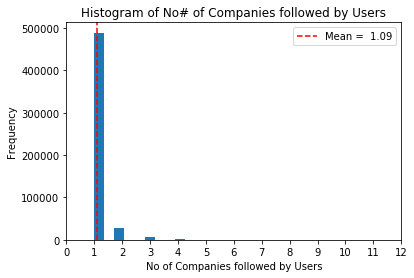

In [135]:
#Plot
fig = plt.figure()
plt.hist(occurence, bins=25)
plt.xticks(np.arange(0,13,1))
plt.axvline(x=np.mean(occurence), color='red', linestyle='--', label='Mean =  %0.2f' % np.mean(occurence))
plt.xlabel('No of Companies followed by Users')
plt.legend(loc="upper right")
plt.ylabel('Frequency')
plt.title('Histogram of No# of Companies followed by Users')
plt.show()
fig.savefig('brand_follower.svg')